In [1]:
import pandas as pd
import math

from sklearn import metrics
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import LinearSVR
from sklearn.linear_model import ElasticNetCV, RidgeCV, LinearRegression
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import KFold
from sklearn import preprocessing

from collections import OrderedDict, defaultdict
from scipy.sparse import hstack, csr_matrix
from sklearn.preprocessing import LabelBinarizer, LabelEncoder, Imputer
import gc
import lightgbm as lgb
from sklearn.decomposition import TruncatedSVD
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
import nltk
from nltk.corpus import stopwords
import numpy as np
import threading 

from skopt import gp_minimize
from hyperopt import *
from bayes_opt import BayesianOptimization

from tqdm import tqdm

import featuretools as ft
from featuretools import selection
import pickle 

import matplotlib.pyplot as plt

import xgboost as xgb

In [2]:
def RMSE(actual, pred):
    return (np.mean((actual - pred) ** 2)) **.5

In [3]:
def group_target_by_fields(df, target, fields = None):
    if fields is None:
        fields = df.columns
    
    target_mean = df[target].mean()
    target_std = df[target].std()
    
    d = {}
    
    for f in fields:
        gp = df.groupby(f)[target]
        mean = gp.mean()
        std  = gp.std()
        
        if pd.DataFrame(mean).isnull().values.any():
            mean = mean.fillna(target_mean)
            
        if pd.DataFrame(std).isnull().values.any():
            std = std.fillna(target_std)
            
        df[f + '_' + target + '_avg'] = df[f].map(mean)
        df[f + '_' + target + '_std'] = df[f].map(std)
        
        d[f + '_avg'] = mean
        d[f + '_std'] = std
        
    return d

In [4]:
def apply_group_by_dict(df, d, fields_to_group_by, target):
    for f in fields_to_group_by:
        mean = d[f + '_avg']
        std = d[f + '_std']

        df[f + '_' + target + '_avg'] = df[f].map(mean)
        df[f + '_' + target + '_std'] = df[f].map(std)

In [5]:
def generate_text_features(df, text_features):
    for col in text_features:
        df[col].fillna('', inplace=True)
        #df[col] = df[col].str.lower()
        #df[col] = df[col].str.replace("[^[:alpha:]]", " ")
        #df[col] = df[col].str.replace("\\s+", "")
        df[col + '_num_chars'] = df[col].apply(len)
        df[col + '_num_words'] = df[col].apply(lambda comment: len(comment.split()))
        #df[col + '_num_unique_words'] = df[col].apply(lambda comment: len(set(w for w in comment.split())))
        #df[col + '_words_vs_unique'] = df[col+'_num_unique_words'] / df[col+'_num_words'] * 100


In [6]:
def objective_lgb(space):
   
    num_leaves = int(space['num_leaves'])
    max_depth = int(space['max_depth'])
    subsample = space['subsample']
    subsample_freq = int(space['subsample_freq'])
    lambda_l1 = space['lambda_l1']
    lambda_l2 = space['lambda_l2']
    learning_rate = space['learning_rate']
    feature_fraction = space['feature_fraction']
    min_data_per_leaf = int(space['min_data_per_leaf'])
    min_child_weight = space['min_child_weight']
    min_gain_to_split = space['min_gain_to_split']
    
    print("params: ")
    print("num_leaves: " + str(num_leaves))
    print("max_depth: " + str(max_depth))
    print("min_child_weight: " + str(min_child_weight))
    print("subsample: " + str(subsample))
    print("subsample_freq: " + str(subsample_freq))
    print("lambda_l1: " + str(lambda_l1))
    print("lambda_l2: " + str(lambda_l2))
    print("feature_fraction: " + str(feature_fraction))
    print("learning rate: " + str(learning_rate))
    print("min_data_per_leaf: " + str(min_data_per_leaf))        
    print("min_gain_to_split: " + str(min_gain_to_split))        

    params = {
        "objective" : "regression",
        "metric" : "rmse",
        "n_estimators": 20000,
        "max_depth": max_depth,
        "num_leaves" : num_leaves, 
        "learning_rate" : learning_rate,
        "subsample" : subsample,
        "subsample_freq" : subsample_freq,
        "lambda_l1": lambda_l1,
        "lambda_l2": lambda_l2,
        "feature_fraction" : feature_fraction,
        "min_data_per_leaf": min_data_per_leaf,
        "min_child_weight": min_child_weight,
        "min_gain_to_split": min_gain_to_split,
        "bagging_seed" : 16,
        "device" : "gpu",
        "max_bin": 64
    }
    
    train = lgb.Dataset(X_train, label=y_train, categorical_feature=cat_features)
    val = lgb.Dataset(X_val, label=y_val, categorical_feature=cat_features)
 
    model = lgb.train(params, train, valid_sets=[train, val], early_stopping_rounds=300, verbose_eval=10)
    
    val = lgb.Dataset(X_val, label=y_val, categorical_feature=cat_features)

    y_pred = model.predict(val.data, num_iteration=model.best_iteration)
      
    return {'loss': RMSE(y_val, y_pred), 'status': STATUS_OK }

In [7]:
def lgb_eval(num_leaves, feature_fraction, subsample, subsample_freq, max_depth, lambda_l1, lambda_l2,
             min_gain_to_split, min_child_weight, learning_rate, min_data_per_leaf):
    
    params = {
        "objective" : "regression",
        "metric" : "rmse",
        "n_estimators": 20000,
        "bagging_seed" : 16,
        "device" : "gpu",
        "max_bin": 64
    }
                    
    params['num_leaves'] = int(np.round(num_leaves))
    params['feature_fraction'] = feature_fraction
    params['subsample'] = subsample
    params['subsample_freq'] = int(np.round(subsample_freq))
    params['max_depth'] = int(np.round(max_depth))
    params['lambda_l1'] = max(lambda_l1, 0)
    params['lambda_l2'] = max(lambda_l2, 0)
    params['min_gain_to_split'] = min_gain_to_split
    params['min_child_weight'] = min_child_weight        
    params['learning_rate'] = learning_rate
    params["min_data_per_leaf"] = int(np.round(min_data_per_leaf))

    print("params: ")
    print("num_leaves: " + str(params["num_leaves"]))
    print("max_depth: " + str(params['max_depth']))
    print("min_child_weight: " + str(params['min_child_weight']))
    print("subsample: " + str(params['subsample']))
    print("subsample_freq: " + str(params['subsample_freq']))
    print("lambda_l1: " + str(params['lambda_l1']))
    print("lambda_l2: " + str(params['lambda_l2']))
    print("feature_fraction: " + str(params['feature_fraction']))
    print("learning rate: " + str(params['learning_rate']))
    print("min_data_per_leaf: " + str(params["min_data_per_leaf"]))        
    print("min_gain_to_split: " + str(params['min_gain_to_split']))        
    
    train = lgb.Dataset(X_train, label=y_train, categorical_feature=cat_features)
    val = lgb.Dataset(X_val, label=y_val, categorical_feature=cat_features)
 
    model = lgb.train(params, train, valid_sets=[train, val], early_stopping_rounds=300, verbose_eval=10)
    
    val = lgb.Dataset(X_val, label=y_val, categorical_feature=cat_features)
    y_pred = model.predict(val.data, num_iteration=model.best_iteration)
      
    return -RMSE(y_val, y_pred)

In [169]:
X_valid_meta2 = pd.read_csv('X_valid_meta_8_fold').drop(['Unnamed: 0', 'mlp1', 'mlp2', 'mlp3', 'mlp4'], axis=1)
y_valid_meta2 = pd.read_csv('y_valid_meta_8_fold').drop(['Unnamed: 0'], axis=1)
X_test_meta2 = pd.read_csv('X_test_meta_8_fold').drop(['Unnamed: 0', 'mlp1', 'mlp2', 'mlp3', 'mlp4'], axis=1)
num_folds = 8

In [170]:
X_valid_meta2_extra = pd.read_csv('X_valid_meta_8_fold_extra').drop(['Unnamed: 0', 'mlp1', 'mlp2', 'mlp3', 'mlp4'], axis=1)
X_test_meta2_extra = pd.read_csv('X_test_meta_8_fold_extra').drop(['Unnamed: 0', 'mlp1', 'mlp2', 'mlp3', 'mlp4'], axis=1)

In [171]:
X_valid_meta2 = pd.concat([X_valid_meta2, X_valid_meta2_extra], axis=1)
X_test_meta2 = pd.concat([X_test_meta2, X_test_meta2_extra], axis=1)

In [172]:
X_valid_meta2_v2 = pd.read_csv('X_valid_meta_8_fold_v2').drop(['Unnamed: 0',], axis=1)
y_valid_meta2_v2 = pd.read_csv('y_valid_meta_8_fold_v2').drop(['Unnamed: 0'], axis=1)
X_test_meta2_v2 = pd.read_csv('X_test_meta_8_fold_v2').drop(['Unnamed: 0',], axis=1)
num_folds = 8

In [173]:
X_valid_meta2_v2.columns = ['model_' + str(i) for i in range(len(X_valid_meta2_v2.columns))]
X_test_meta2_v2.columns = ['model_' + str(i) for i in range(len(X_valid_meta2_v2.columns))]

In [174]:
X_valid_meta2 = pd.concat([X_valid_meta2, X_valid_meta2_v2], axis=1)
X_test_meta2 = pd.concat([X_test_meta2, X_test_meta2_v2], axis=1)

In [205]:
X_valid_meta2 = pd.read_csv('X_valid_meta_5_fold').drop(['Unnamed: 0', 'mlp1', 'mlp2'], axis=1)
y_valid_meta2 = pd.read_csv('y_valid_meta_5_fold').drop(['Unnamed: 0'], axis=1)
X_test_meta2 = pd.read_csv('X_test_meta_5_fold').drop(['Unnamed: 0', 'mlp1', 'mlp2'], axis=1)
num_folds = 5

In [396]:
es = ft.EntitySet(id='p',)

In [397]:
es = es.entity_from_dataframe(entity_id = 'props', dataframe = pd.concat([X_train, pd.DataFrame(y_train, columns=['precio'])], axis=1), make_index=True, index='index')


In [398]:
es = es.normalize_entity(base_entity_id='props', new_entity_id='precio', index='precio')

In [399]:
default_agg_primitives =  ["sum", "std", "max", "skew", "min", "mean", "count", "percent_true", "num_unique", "mode"]
default_trans_primitives =  ["year", "month", "haversine", "numwords", "characters"]

feature_matrix, features_defs = ft.dfs(entityset = es, target_entity = 'precio',
                       #trans_primitives = default_trans_primitives,
                       #agg_primitives=default_agg_primitives, 
                       max_depth = 2)

In [400]:
feature_matrix = selection.remove_low_information_features(feature_matrix)

In [401]:
X_train.reset_index(inplace=True)

In [402]:
X_train = pd.concat([X_train, pd.DataFrame(y_train, columns=['precio'])], axis=1).join(feature_matrix, on='precio', how='inner')

In [404]:
es_val = ft.EntitySet(id='p',)
es_val = es.entity_from_dataframe(entity_id = 'props', dataframe = pd.concat([X_val, pd.DataFrame(y_val, columns=['precio'])], axis=1), make_index=True, index='index')
es_val = es.normalize_entity(base_entity_id='props', new_entity_id='precio', index='precio')

2018-08-24 19:33:45,454 featuretools.entityset - WARNING    Not adding duplicate relationship: <Relationship: props.precio -> precio.precio>


In [405]:
feature_matrix_val = ft.calculate_feature_matrix(features=features_defs, entityset=es_val)

In [406]:
X_val.reset_index(inplace=True)

In [407]:
X_val = pd.concat([X_val, pd.DataFrame(y_val, columns=['precio'])], axis=1).join(feature_matrix_val, on='precio', how='inner')

In [408]:
X_train.drop(['MODE(props.titulo)', 'MODE(props.direccion)', 'precio'], axis=1, inplace=True)
X_val.drop(['MODE(props.titulo)', 'MODE(props.direccion)', 'precio'], axis=1, inplace=True)

In [206]:
kf = KFold(n_splits=num_folds)

In [207]:
df = pd.read_csv('train.csv', index_col='id', parse_dates=['fecha'])
df_test = pd.read_csv('test.csv', index_col='id', parse_dates=['fecha'])

In [208]:
X_valid = pd.DataFrame()

for train_index, val_index in kf.split(df):
    print(train_index , val_index)   
    
    X_valid = pd.concat([X_valid, df.iloc[val_index]])

[ 48000  48001  48002 ... 239997 239998 239999] [    0     1     2 ... 47997 47998 47999]
[     0      1      2 ... 239997 239998 239999] [48000 48001 48002 ... 95997 95998 95999]
[     0      1      2 ... 239997 239998 239999] [ 96000  96001  96002 ... 143997 143998 143999]
[     0      1      2 ... 239997 239998 239999] [144000 144001 144002 ... 191997 191998 191999]
[     0      1      2 ... 191997 191998 191999] [192000 192001 192002 ... 239997 239998 239999]


In [209]:
X_valid.reset_index(drop=True, inplace=True)
X_valid_meta2.reset_index(drop=True, inplace=True)
df_test.reset_index(drop=True, inplace=True)
X_test_meta2.reset_index(drop=True, inplace=True)

In [210]:
X = pd.concat([X_valid, X_valid_meta2], axis=1)
X_test = pd.concat([df_test, X_test_meta2], axis=1)

In [211]:
y = y_valid_meta2['0'].values

In [212]:
text_features = ["titulo", "descripcion", "direccion"]

for col in text_features:
    X[col].fillna('', inplace=True)
    X[col] = df[col].str.lower()
    X_test[col].fillna('', inplace=True)
    X_test[col] = X_test[col].str.lower()
    
X['año'] = X.fecha.dt.year
X['mes'] = X.fecha.dt.month
X_test['año'] = X_test.fecha.dt.year
X_test['mes'] = X_test.fecha.dt.month

X.drop(['fecha'], axis=1, inplace=True)
X_test.drop(['fecha'], axis=1, inplace=True)

X['metrosdescubiertos'] = X['metrostotales'] - X['metroscubiertos']
X_test['metrosdescubiertos'] = X_test['metrostotales'] - X_test['metroscubiertos']

X['ciudad'] = X['ciudad'].str.lower()
X['provincia'] = X['provincia'].str.lower()
X_test['ciudad'] = X_test['ciudad'].str.lower()
X_test['provincia'] = X_test['provincia'].str.lower()

le = LabelEncoder()
df_all = pd.concat([X, X_test], axis=0,)
for col in df_all:
    if col == 'titulo' or col == 'descripcion' or col == 'direccion':
        continue
        
    if df_all[col].dtype == 'object':
        le.fit(df_all[col].astype(str))
        # Transform both training and testing data
        X[col] = le.transform(X[col].astype(str))
        X_test[col] = le.transform(X_test[col].astype(str))

        
#X2 = X.drop(['precio'], axis=1)

/home/axel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:26: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=True'.

To retain the current behavior and silence the warning, pass sort=False



In [213]:
X_train, X_val, y_train, y_val = train_test_split(X.drop(['precio'], axis=1), y, test_size=0.2, random_state=1)

In [214]:
# fields_to_group_by = ['metroscubiertos', 'metrostotales', 'banos', 'habitaciones', 'ciudad', 'antiguedad', 'año', 'mes',
#                       'tipodepropiedad', 'idzona']

fields_to_group_by = ['ciudad', 'metroscubiertos', 'metrostotales', 'idzona', 'banos']
d = group_target_by_fields(pd.concat([X_train, pd.DataFrame(y_train, columns=['precio'])], axis=1), 'precio', fields_to_group_by)

apply_group_by_dict(X_train, d, fields_to_group_by, target='precio')
apply_group_by_dict(X_val, d, fields_to_group_by, target='precio')
apply_group_by_dict(X_test, d, fields_to_group_by, target='precio')

generate_text_features(X_train, text_features)
generate_text_features(X_val, text_features)
generate_text_features(X_test, text_features)

# num_text_features = 20000
# tfidf_title = TfidfVectorizer(max_features=num_text_features, stop_words = stopwords.words('spanish'),
#                               ngram_range=(1,1), min_df=3, max_df=0.4, norm='l2', sublinear_tf=False)
# tfidf_title.fit(X_train['titulo'])
# tfidf_descr = TfidfVectorizer(max_features=num_text_features, stop_words = stopwords.words('spanish'),
#                                ngram_range=(1,3), min_df=10, max_df=0.5, norm='l2', sublinear_tf=False)
# tfidf_descr.fit(X_train['descripcion'])
# # tfidf_dir = TfidfVectorizer(max_features=num_text_features, stop_words = stopwords.words('spanish'),
# #                                ngram_range=(1,3), min_df=10, max_df=0.5, norm='l2', sublinear_tf=False)
# # tfidf_dir.fit(X_train['direccion'])

# svd_features = 20
# svd_title = TruncatedSVD(n_components=svd_features, algorithm='arpack')
# svd_title.fit(tfidf_title.transform(X_train['titulo']))
# svd_descr = TruncatedSVD(n_components=svd_features, algorithm='arpack')
# svd_descr.fit(tfidf_descr.transform(X_train['descripcion']))
# # svd_dir = TruncatedSVD(n_components=svd_features, algorithm='arpack')
# # svd_dir.fit(tfidf_dir.transform(X_train['direccion']))

# title_features_train = np.array(svd_title.transform(tfidf_title.transform(X_train['titulo'])), dtype=np.float16)
# title_features_val = np.array(svd_title.transform(tfidf_title.transform(X_val['titulo'])), dtype=np.float16)
# title_features_test = np.array(svd_title.transform(tfidf_title.transform(X_test['titulo'])), dtype=np.float16)
# for i in range(svd_features):
#     X_train['title_feature_' + str(i)] = title_features_train[:, i]
#     X_val['title_feature_' + str(i)] = title_features_val[:, i]
#     X_test['title_feature_' + str(i)] = title_features_test[:, i]
# del title_features_train; del title_features_val
# gc.collect()
# description_features_train = np.array(svd_descr.transform(tfidf_descr.transform(X_train['descripcion'])), dtype=np.float16)
# description_features_val = np.array(svd_descr.transform(tfidf_descr.transform(X_val['descripcion'])), dtype=np.float16)
# description_features_test = np.array(svd_descr.transform(tfidf_descr.transform(X_test['descripcion'])), dtype=np.float16)
# for i in range(svd_features):
#     X_train['description_feature_' + str(i)] = description_features_train[:, i]
#     X_val['description_feature_' + str(i)] = description_features_val[:, i]
#     X_test['description_feature_' + str(i)] = description_features_test[:, i]

# del description_features_train; del description_features_val
# gc.collect()
# dir_features_train = np.array(svd_dir.transform(tfidf_dir.transform(X_train['direccion'])), dtype=np.float16)
# dir_features_val = np.array(svd_dir.transform(tfidf_dir.transform(X_val['direccion'])), dtype=np.float16)
# dir_features_test = np.array(svd_dir.transform(tfidf_dir.transform(X_test['direccion'])), dtype=np.float16)
# for i in range(svd_features):
#     X_train['dir_feature_' + str(i)] = dir_features_train[:, i]
#     X_val['dir_feature_' + str(i)] = dir_features_val[:, i]
#     X_test['dir_feature_' + str(i)] = dir_features_test[:, i]

# del dir_features_train; del dir_features_val
# gc.collect()


In [215]:
X_train.drop(['titulo', 'descripcion', 'direccion'], axis=1, inplace=True)
X_val.drop(['titulo', 'descripcion', 'direccion'], axis=1, inplace=True)

In [184]:
X_test.drop(['titulo', 'descripcion', 'direccion'], axis=1, inplace=True)

In [25]:
imp = Imputer(missing_values='NaN', strategy='mean', axis=0)
imp = imp.fit(X_train)

X_train_imp = imp.transform(X_train)
X_val_imp = imp.transform(X_val)
#X_test_imp = imp.transform(X_test)

In [52]:
#clf2 = ExtraTreesRegressor(max_depth=20, n_estimators=500, max_features=0.2, verbose=1, n_jobs=2)
clf2 = GradientBoostingRegressor(max_depth=7, n_estimators=200, max_features=0.4, verbose=3, subsample=0.9, 
                                 min_samples_leaf=100, min_impurity_decrease=0.1,)
clf2.fit(X_train_imp, y_train)
#clf2.fit(X_train_imp, y_valid_meta2)

[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    7.9s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:   31.9s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:  1.2min
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed:  1.3min finished


ExtraTreesRegressor(bootstrap=False, criterion='mse', max_depth=20,
          max_features=0.2, max_leaf_nodes=None, min_impurity_decrease=0.0,
          min_impurity_split=None, min_samples_leaf=1, min_samples_split=2,
          min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=2,
          oob_score=False, random_state=None, verbose=1, warm_start=False)

In [53]:
#clf2.coef_

In [54]:
#y_pred = clf2.predict(X_test_imp)
#y_pred2 = clf2.predict(X_valid_meta2[192000:])
y_pred2 = clf2.predict(X_val_imp)

[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.2s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    1.0s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    2.3s
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed:    2.5s finished


In [55]:
RMSE(y_val, y_pred2)

0.26731621842159653

In [66]:
#0.2610 kfold5 (max_depth=7, n_estimators=400, max_features=0.2, verbose=3, subsample=0.9, loss='ls', min_samples_leaf=100, min_impurity_decrease=0.1)

array([14.64841968, 14.63217762, 15.15051162, ..., 15.06827353,
       14.6462434 , 15.8949521 ])

In [139]:
print(best)

{'feature_fraction': 0.14702151292954257, 'lambda_l1': 0.422161016399898, 'lambda_l2': 5.194196675249373, 'learning_rate': 0.012203231732150209, 'max_depth': 51.355138633767886, 'min_child': 116.17343096073938, 'min_data_per_leaf': 91.05253355285953, 'min_gain_to_split': 0.38598180045964714, 'num_leaves': 2003.9629619773525, 'subsample': 0.7493743162334933, 'subsample_freq': 10.460048512352026}


In [216]:
cat_features = ['tipodepropiedad', 'ciudad', 'provincia']

params = {}

params["objective"] = "regression"
params["metric"] = "rmse"
params["n_estimators"] = 1400
params["max_depth"] = 16
params["min_data_per_leaf"] = 24
params["min_child_weight"] = 153.8142072342694
params["num_leaves"] = 2935
params["learning_rate"] = 0.021598557556650935
params["subsample"] = 0.9304257295347201
params["subsample_freq"] = 4
params["lambda_l1"] = 3.0783497320416195
params["lambda_l2"] = 19.375843321437085
params["feature_fraction"] = 0.3008589467693624
params["feature_fraction_seed"] = 1
params["bagging_seed"] = 16
params["device"] = "gpu"
params["max_bin"] = 64
params["min_gain_to_split"] = 0.014682010514120143

In [217]:
train = lgb.Dataset(X_train, label=y_train, categorical_feature=cat_features)
val = lgb.Dataset(X_val, label=y_val, categorical_feature=cat_features)
train_full = lgb.Dataset(pd.concat([X_train, X_val], axis=0), label=pd.concat([pd.DataFrame(y_train), pd.DataFrame(y_val)], axis=0)[0].values, categorical_feature=cat_features)

In [ ]:
model = lgb.train(params, train, valid_sets=[train, val], early_stopping_rounds=350, verbose_eval=10)
#model = lgb.train(params, train_full, valid_sets=[train_full], verbose_eval=10)

/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/engine.py:104: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))
/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/basic.py:1090: UserWarning: Using categorical_feature in Dataset.
  warnings.warn('Using categorical_feature in Dataset.')
/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/basic.py:685: UserWarning: categorical_feature in param dict is overridden.
  warnings.warn('categorical_feature in param dict is overridden.')


Training until validation scores don't improve for 350 rounds.
[10]	training's rmse: 0.693719	valid_1's rmse: 0.690767
[20]	training's rmse: 0.580957	valid_1's rmse: 0.578328
[30]	training's rmse: 0.494249	valid_1's rmse: 0.491871
[40]	training's rmse: 0.428554	valid_1's rmse: 0.426488
[50]	training's rmse: 0.379713	valid_1's rmse: 0.37799
[60]	training's rmse: 0.344023	valid_1's rmse: 0.342749
[70]	training's rmse: 0.318799	valid_1's rmse: 0.317977
[80]	training's rmse: 0.30073	valid_1's rmse: 0.300477
[90]	training's rmse: 0.2882	valid_1's rmse: 0.28845
[100]	training's rmse: 0.27948	valid_1's rmse: 0.28026
[110]	training's rmse: 0.273473	valid_1's rmse: 0.274797
[120]	training's rmse: 0.269112	valid_1's rmse: 0.271021
[130]	training's rmse: 0.265851	valid_1's rmse: 0.268445
[140]	training's rmse: 0.263428	valid_1's rmse: 0.266697
[150]	training's rmse: 0.261438	valid_1's rmse: 0.265454
[160]	training's rmse: 0.259929	valid_1's rmse: 0.264623
[170]	training's rmse: 0.258692	valid_1's

In [76]:
# [1726]	training's rmse: 0.234606	valid_1's rmse: 0.261415 (5 fold sin features groupby)

# [1321]	training's rmse: 0.236581	valid_1's rmse: 0.259551 (8 fold sin features groupby)

# [1438]	training's rmse: 0.229471	valid_1's rmse: 0.259245 (0.2541 test)

# [850] 	training's rmse: 0.181814	valid_1's rmse: 0.258643 (0.2534 test - parametros nuevos)

# [1225]	training's rmse: 0.209144	valid_1's rmse: 0.258759 (0.25319 test 0.25293 ens - parametros nuevos 2, 1.5k iter)

# [567]	    training's rmse: 0.257782	valid_1's rmse: 0.257808

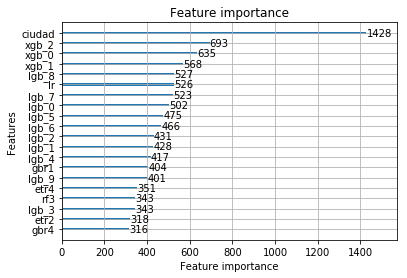

In [143]:
ax = lgb.plot_importance(model, max_num_features=20)
plt.show()

In [192]:
models = []
num_models = 60
cat_features = ['tipodepropiedad', 'ciudad', 'provincia']

for i in tqdm(range(num_models)):
    params = {}

    params["objective"] = "regression"
    params["metric"] = "rmse"
    params["n_estimators"] = 1500
    params["max_depth"] = 16
    params["min_data_per_leaf"] = 24
    params["min_child_weight"] = 153.8142072342694
    params["num_leaves"] = 2935
    params["learning_rate"] = 0.021598557556650935
    params["subsample"] = 0.9304257295347201
    params["subsample_freq"] = 4
    params["lambda_l1"] = 3.0783497320416195
    params["lambda_l2"] = 19.375843321437085
    params["feature_fraction"] = 0.3008589467693624
    params["feature_fraction_seed"] = i
    params["bagging_seed"] = i
    params["device"] = "gpu"
    params["max_bin"] = 64
    params["min_gain_to_split"] = 0.014682010514120143

    train_full = lgb.Dataset(pd.concat([X_train, X_val], axis=0), label=pd.concat([pd.DataFrame(y_train), pd.DataFrame(y_val)], axis=0)[0].values, categorical_feature=cat_features)
    model = lgb.train(params, train_full, valid_sets=[train_full], verbose_eval=10)
    #train = lgb.Dataset(X_train, label=y_train, categorical_feature=cat_features)
    #val = lgb.Dataset(X_val, label=y_val, categorical_feature=cat_features)
    
    #model = lgb.train(params, train, valid_sets=[train, val], early_stopping_rounds=350, verbose_eval=10)
    
    models.append(model)


  0%|          | 0/60 [00:00<?, ?it/s]/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/engine.py:104: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))
/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/basic.py:1090: UserWarning: Using categorical_feature in Dataset.
  warnings.warn('Using categorical_feature in Dataset.')


[10]	training's rmse: 0.692523
[20]	training's rmse: 0.579306
[30]	training's rmse: 0.492528
[40]	training's rmse: 0.426511
[50]	training's rmse: 0.377331
[60]	training's rmse: 0.341541
[70]	training's rmse: 0.315864
[80]	training's rmse: 0.297797
[90]	training's rmse: 0.28524
[100]	training's rmse: 0.276469
[110]	training's rmse: 0.27036
[120]	training's rmse: 0.265977
[130]	training's rmse: 0.262884
[140]	training's rmse: 0.260414
[150]	training's rmse: 0.258593
[160]	training's rmse: 0.257154
[170]	training's rmse: 0.255956
[180]	training's rmse: 0.254837
[190]	training's rmse: 0.253785
[200]	training's rmse: 0.252822
[210]	training's rmse: 0.251913
[220]	training's rmse: 0.251105
[230]	training's rmse: 0.250301
[240]	training's rmse: 0.249545
[250]	training's rmse: 0.248853
[260]	training's rmse: 0.248199
[270]	training's rmse: 0.247596
[280]	training's rmse: 0.246998
[290]	training's rmse: 0.246277
[300]	training's rmse: 0.245661
[310]	training's rmse: 0.245105
[320]	training's rm


  2%|▏         | 1/60 [02:14<2:12:16, 134.52s/it]

[10]	training's rmse: 0.69252
[20]	training's rmse: 0.579326
[30]	training's rmse: 0.492169
[40]	training's rmse: 0.426167
[50]	training's rmse: 0.377058
[60]	training's rmse: 0.34131
[70]	training's rmse: 0.315725
[80]	training's rmse: 0.297611
[90]	training's rmse: 0.284965
[100]	training's rmse: 0.276271
[110]	training's rmse: 0.270167
[120]	training's rmse: 0.265834
[130]	training's rmse: 0.262789
[140]	training's rmse: 0.260478
[150]	training's rmse: 0.258664
[160]	training's rmse: 0.257288
[170]	training's rmse: 0.256091
[180]	training's rmse: 0.254981
[190]	training's rmse: 0.253994
[200]	training's rmse: 0.253112
[210]	training's rmse: 0.252291
[220]	training's rmse: 0.25147
[230]	training's rmse: 0.250675
[240]	training's rmse: 0.24992
[250]	training's rmse: 0.249252
[260]	training's rmse: 0.2485
[270]	training's rmse: 0.247839
[280]	training's rmse: 0.247175
[290]	training's rmse: 0.246625
[300]	training's rmse: 0.246038
[310]	training's rmse: 0.245452
[320]	training's rmse: 


  3%|▎         | 2/60 [04:24<2:08:04, 132.49s/it]

[10]	training's rmse: 0.692516
[20]	training's rmse: 0.579316
[30]	training's rmse: 0.492229
[40]	training's rmse: 0.426204
[50]	training's rmse: 0.377133
[60]	training's rmse: 0.341318
[70]	training's rmse: 0.315625
[80]	training's rmse: 0.297661
[90]	training's rmse: 0.285105
[100]	training's rmse: 0.276314
[110]	training's rmse: 0.270244
[120]	training's rmse: 0.265917
[130]	training's rmse: 0.262744
[140]	training's rmse: 0.260438
[150]	training's rmse: 0.258667
[160]	training's rmse: 0.25721
[170]	training's rmse: 0.255984
[180]	training's rmse: 0.254931
[190]	training's rmse: 0.253936
[200]	training's rmse: 0.253082
[210]	training's rmse: 0.252154
[220]	training's rmse: 0.251318
[230]	training's rmse: 0.250574
[240]	training's rmse: 0.249795
[250]	training's rmse: 0.249082
[260]	training's rmse: 0.248329
[270]	training's rmse: 0.24769
[280]	training's rmse: 0.247058
[290]	training's rmse: 0.246425
[300]	training's rmse: 0.24584
[310]	training's rmse: 0.245278
[320]	training's rms


  5%|▌         | 3/60 [06:37<2:05:55, 132.54s/it]

[10]	training's rmse: 0.69251
[20]	training's rmse: 0.579325
[30]	training's rmse: 0.492175
[40]	training's rmse: 0.42613
[50]	training's rmse: 0.376993
[60]	training's rmse: 0.34125
[70]	training's rmse: 0.315694
[80]	training's rmse: 0.297766
[90]	training's rmse: 0.285216
[100]	training's rmse: 0.276422
[110]	training's rmse: 0.270278
[120]	training's rmse: 0.26606
[130]	training's rmse: 0.262911
[140]	training's rmse: 0.260537
[150]	training's rmse: 0.258724
[160]	training's rmse: 0.257256
[170]	training's rmse: 0.255986
[180]	training's rmse: 0.254902
[190]	training's rmse: 0.253967
[200]	training's rmse: 0.253077
[210]	training's rmse: 0.252223
[220]	training's rmse: 0.251427
[230]	training's rmse: 0.250594
[240]	training's rmse: 0.249825
[250]	training's rmse: 0.249077
[260]	training's rmse: 0.248345
[270]	training's rmse: 0.247626
[280]	training's rmse: 0.246982
[290]	training's rmse: 0.246381
[300]	training's rmse: 0.245715
[310]	training's rmse: 0.245125
[320]	training's rmse


  7%|▋         | 4/60 [08:50<2:03:52, 132.72s/it]

[10]	training's rmse: 0.692613
[20]	training's rmse: 0.579396
[30]	training's rmse: 0.492223
[40]	training's rmse: 0.426203
[50]	training's rmse: 0.37713
[60]	training's rmse: 0.341349
[70]	training's rmse: 0.31568
[80]	training's rmse: 0.297651
[90]	training's rmse: 0.28493
[100]	training's rmse: 0.27605
[110]	training's rmse: 0.270005
[120]	training's rmse: 0.265664
[130]	training's rmse: 0.262548
[140]	training's rmse: 0.260227
[150]	training's rmse: 0.25843
[160]	training's rmse: 0.256953
[170]	training's rmse: 0.255755
[180]	training's rmse: 0.254664
[190]	training's rmse: 0.253734
[200]	training's rmse: 0.252847
[210]	training's rmse: 0.251955
[220]	training's rmse: 0.251188
[230]	training's rmse: 0.250405
[240]	training's rmse: 0.249635
[250]	training's rmse: 0.248924
[260]	training's rmse: 0.248147
[270]	training's rmse: 0.247536
[280]	training's rmse: 0.246982
[290]	training's rmse: 0.246382
[300]	training's rmse: 0.245792
[310]	training's rmse: 0.245172
[320]	training's rmse:


  8%|▊         | 5/60 [11:09<2:02:40, 133.83s/it]

[10]	training's rmse: 0.692534
[20]	training's rmse: 0.579372
[30]	training's rmse: 0.492237
[40]	training's rmse: 0.426183
[50]	training's rmse: 0.377099
[60]	training's rmse: 0.341237
[70]	training's rmse: 0.315638
[80]	training's rmse: 0.297583
[90]	training's rmse: 0.285064
[100]	training's rmse: 0.276378
[110]	training's rmse: 0.270336
[120]	training's rmse: 0.266035
[130]	training's rmse: 0.262933
[140]	training's rmse: 0.260649
[150]	training's rmse: 0.258815
[160]	training's rmse: 0.25739
[170]	training's rmse: 0.256141
[180]	training's rmse: 0.25508
[190]	training's rmse: 0.254103
[200]	training's rmse: 0.253212
[210]	training's rmse: 0.252358
[220]	training's rmse: 0.251515
[230]	training's rmse: 0.250694
[240]	training's rmse: 0.249987
[250]	training's rmse: 0.24926
[260]	training's rmse: 0.248615
[270]	training's rmse: 0.24798
[280]	training's rmse: 0.247331
[290]	training's rmse: 0.246685
[300]	training's rmse: 0.246046
[310]	training's rmse: 0.245497
[320]	training's rmse


 10%|█         | 6/60 [13:29<2:01:27, 134.96s/it]

[10]	training's rmse: 0.692525
[20]	training's rmse: 0.579322
[30]	training's rmse: 0.492199
[40]	training's rmse: 0.426175
[50]	training's rmse: 0.377059
[60]	training's rmse: 0.341243
[70]	training's rmse: 0.315566
[80]	training's rmse: 0.297472
[90]	training's rmse: 0.284808
[100]	training's rmse: 0.276073
[110]	training's rmse: 0.27007
[120]	training's rmse: 0.265749
[130]	training's rmse: 0.262532
[140]	training's rmse: 0.260238
[150]	training's rmse: 0.258498
[160]	training's rmse: 0.257046
[170]	training's rmse: 0.255844
[180]	training's rmse: 0.254744
[190]	training's rmse: 0.25372
[200]	training's rmse: 0.252775
[210]	training's rmse: 0.251914
[220]	training's rmse: 0.251097
[230]	training's rmse: 0.250316
[240]	training's rmse: 0.249559
[250]	training's rmse: 0.248874
[260]	training's rmse: 0.248132
[270]	training's rmse: 0.247432
[280]	training's rmse: 0.246738
[290]	training's rmse: 0.246141
[300]	training's rmse: 0.245562
[310]	training's rmse: 0.244958
[320]	training's rm


 12%|█▏        | 7/60 [15:59<2:01:04, 137.07s/it]

[10]	training's rmse: 0.692513
[20]	training's rmse: 0.579324
[30]	training's rmse: 0.492181
[40]	training's rmse: 0.42616
[50]	training's rmse: 0.377095
[60]	training's rmse: 0.341301
[70]	training's rmse: 0.315648
[80]	training's rmse: 0.297631
[90]	training's rmse: 0.284988
[100]	training's rmse: 0.276302
[110]	training's rmse: 0.270206
[120]	training's rmse: 0.265877
[130]	training's rmse: 0.262743
[140]	training's rmse: 0.260481
[150]	training's rmse: 0.258733
[160]	training's rmse: 0.25729
[170]	training's rmse: 0.256029
[180]	training's rmse: 0.254961
[190]	training's rmse: 0.253892
[200]	training's rmse: 0.252929
[210]	training's rmse: 0.251984
[220]	training's rmse: 0.25115
[230]	training's rmse: 0.250381
[240]	training's rmse: 0.249571
[250]	training's rmse: 0.248908
[260]	training's rmse: 0.24825
[270]	training's rmse: 0.247567
[280]	training's rmse: 0.246915
[290]	training's rmse: 0.246292
[300]	training's rmse: 0.245658
[310]	training's rmse: 0.245114
[320]	training's rmse


 13%|█▎        | 8/60 [18:24<1:59:38, 138.05s/it]

[10]	training's rmse: 0.692509
[20]	training's rmse: 0.579346
[30]	training's rmse: 0.492211
[40]	training's rmse: 0.4262
[50]	training's rmse: 0.377084
[60]	training's rmse: 0.341216
[70]	training's rmse: 0.315652
[80]	training's rmse: 0.297633
[90]	training's rmse: 0.285114
[100]	training's rmse: 0.276451
[110]	training's rmse: 0.270367
[120]	training's rmse: 0.266055
[130]	training's rmse: 0.262952
[140]	training's rmse: 0.260665
[150]	training's rmse: 0.258951
[160]	training's rmse: 0.257526
[170]	training's rmse: 0.256212
[180]	training's rmse: 0.255162
[190]	training's rmse: 0.254181
[200]	training's rmse: 0.253294
[210]	training's rmse: 0.252462
[220]	training's rmse: 0.251647
[230]	training's rmse: 0.250907
[240]	training's rmse: 0.250091
[250]	training's rmse: 0.249384
[260]	training's rmse: 0.248728
[270]	training's rmse: 0.248046
[280]	training's rmse: 0.247428
[290]	training's rmse: 0.246859
[300]	training's rmse: 0.246288
[310]	training's rmse: 0.245645
[320]	training's rm


 15%|█▌        | 9/60 [20:45<1:57:39, 138.41s/it]

[10]	training's rmse: 0.692535
[20]	training's rmse: 0.579459
[30]	training's rmse: 0.492284
[40]	training's rmse: 0.426234
[50]	training's rmse: 0.377174
[60]	training's rmse: 0.341403
[70]	training's rmse: 0.315709
[80]	training's rmse: 0.297641
[90]	training's rmse: 0.285048
[100]	training's rmse: 0.276359
[110]	training's rmse: 0.270236
[120]	training's rmse: 0.265965
[130]	training's rmse: 0.262852
[140]	training's rmse: 0.260479
[150]	training's rmse: 0.258658
[160]	training's rmse: 0.257156
[170]	training's rmse: 0.255978
[180]	training's rmse: 0.254921
[190]	training's rmse: 0.254014
[200]	training's rmse: 0.253101
[210]	training's rmse: 0.252233
[220]	training's rmse: 0.251404
[230]	training's rmse: 0.250581
[240]	training's rmse: 0.249813
[250]	training's rmse: 0.24908
[260]	training's rmse: 0.24835
[270]	training's rmse: 0.247706
[280]	training's rmse: 0.246992
[290]	training's rmse: 0.246362
[300]	training's rmse: 0.245743
[310]	training's rmse: 0.245152
[320]	training's rm


 17%|█▋        | 10/60 [23:15<1:56:19, 139.58s/it]

[10]	training's rmse: 0.692548
[20]	training's rmse: 0.579372
[30]	training's rmse: 0.492222
[40]	training's rmse: 0.42621
[50]	training's rmse: 0.37709
[60]	training's rmse: 0.341268
[70]	training's rmse: 0.315639
[80]	training's rmse: 0.297559
[90]	training's rmse: 0.284962
[100]	training's rmse: 0.276191
[110]	training's rmse: 0.270054
[120]	training's rmse: 0.265806
[130]	training's rmse: 0.262703
[140]	training's rmse: 0.260435
[150]	training's rmse: 0.258568
[160]	training's rmse: 0.257176
[170]	training's rmse: 0.255958
[180]	training's rmse: 0.254853
[190]	training's rmse: 0.253899
[200]	training's rmse: 0.252974
[210]	training's rmse: 0.252147
[220]	training's rmse: 0.251339
[230]	training's rmse: 0.250606
[240]	training's rmse: 0.249893
[250]	training's rmse: 0.249237
[260]	training's rmse: 0.248562
[270]	training's rmse: 0.247893
[280]	training's rmse: 0.247267
[290]	training's rmse: 0.246665
[300]	training's rmse: 0.246061
[310]	training's rmse: 0.245497
[320]	training's rm


 18%|█▊        | 11/60 [25:45<1:54:43, 140.49s/it]

[10]	training's rmse: 0.692532
[20]	training's rmse: 0.579746
[30]	training's rmse: 0.492552
[40]	training's rmse: 0.426449
[50]	training's rmse: 0.377298
[60]	training's rmse: 0.341439
[70]	training's rmse: 0.315796
[80]	training's rmse: 0.297743
[90]	training's rmse: 0.28507
[100]	training's rmse: 0.276372
[110]	training's rmse: 0.270252
[120]	training's rmse: 0.265965
[130]	training's rmse: 0.262859
[140]	training's rmse: 0.260561
[150]	training's rmse: 0.258691
[160]	training's rmse: 0.257119
[170]	training's rmse: 0.255889
[180]	training's rmse: 0.254797
[190]	training's rmse: 0.253804
[200]	training's rmse: 0.252885
[210]	training's rmse: 0.252023
[220]	training's rmse: 0.251201
[230]	training's rmse: 0.250398
[240]	training's rmse: 0.249678
[250]	training's rmse: 0.248979
[260]	training's rmse: 0.248297
[270]	training's rmse: 0.247604
[280]	training's rmse: 0.24703
[290]	training's rmse: 0.246454
[300]	training's rmse: 0.245837
[310]	training's rmse: 0.245229
[320]	training's rm


 20%|██        | 12/60 [28:10<1:52:42, 140.89s/it]

[10]	training's rmse: 0.692524
[20]	training's rmse: 0.579321
[30]	training's rmse: 0.49224
[40]	training's rmse: 0.426242
[50]	training's rmse: 0.377112
[60]	training's rmse: 0.341351
[70]	training's rmse: 0.315684
[80]	training's rmse: 0.297472
[90]	training's rmse: 0.284979
[100]	training's rmse: 0.276213
[110]	training's rmse: 0.270129
[120]	training's rmse: 0.265835
[130]	training's rmse: 0.262688
[140]	training's rmse: 0.260422
[150]	training's rmse: 0.258523
[160]	training's rmse: 0.257053
[170]	training's rmse: 0.255763
[180]	training's rmse: 0.254676
[190]	training's rmse: 0.253741
[200]	training's rmse: 0.252803
[210]	training's rmse: 0.251989
[220]	training's rmse: 0.251194
[230]	training's rmse: 0.250415
[240]	training's rmse: 0.249596
[250]	training's rmse: 0.248903
[260]	training's rmse: 0.248246
[270]	training's rmse: 0.247585
[280]	training's rmse: 0.246963
[290]	training's rmse: 0.246336
[300]	training's rmse: 0.245691
[310]	training's rmse: 0.245121
[320]	training's r


 22%|██▏       | 13/60 [30:32<1:50:25, 140.97s/it]

[10]	training's rmse: 0.692545
[20]	training's rmse: 0.579318
[30]	training's rmse: 0.492204
[40]	training's rmse: 0.426168
[50]	training's rmse: 0.377056
[60]	training's rmse: 0.341174
[70]	training's rmse: 0.315513
[80]	training's rmse: 0.297471
[90]	training's rmse: 0.284942
[100]	training's rmse: 0.276162
[110]	training's rmse: 0.270088
[120]	training's rmse: 0.265771
[130]	training's rmse: 0.262679
[140]	training's rmse: 0.260327
[150]	training's rmse: 0.258469
[160]	training's rmse: 0.256994
[170]	training's rmse: 0.255714
[180]	training's rmse: 0.254632
[190]	training's rmse: 0.253649
[200]	training's rmse: 0.252746
[210]	training's rmse: 0.251908
[220]	training's rmse: 0.251084
[230]	training's rmse: 0.25028
[240]	training's rmse: 0.249508
[250]	training's rmse: 0.248773
[260]	training's rmse: 0.248082
[270]	training's rmse: 0.24741
[280]	training's rmse: 0.246743
[290]	training's rmse: 0.246135
[300]	training's rmse: 0.245494
[310]	training's rmse: 0.244915
[320]	training's rm


 23%|██▎       | 14/60 [33:00<1:48:27, 141.46s/it]

[10]	training's rmse: 0.692535
[20]	training's rmse: 0.579305
[30]	training's rmse: 0.492218
[40]	training's rmse: 0.426203
[50]	training's rmse: 0.377141
[60]	training's rmse: 0.341402
[70]	training's rmse: 0.31574
[80]	training's rmse: 0.297609
[90]	training's rmse: 0.285006
[100]	training's rmse: 0.276178
[110]	training's rmse: 0.270097
[120]	training's rmse: 0.265778
[130]	training's rmse: 0.262694
[140]	training's rmse: 0.260407
[150]	training's rmse: 0.258628
[160]	training's rmse: 0.257183
[170]	training's rmse: 0.255927
[180]	training's rmse: 0.254853
[190]	training's rmse: 0.253856
[200]	training's rmse: 0.25296
[210]	training's rmse: 0.25216
[220]	training's rmse: 0.25133
[230]	training's rmse: 0.250488
[240]	training's rmse: 0.249767
[250]	training's rmse: 0.249084
[260]	training's rmse: 0.248325
[270]	training's rmse: 0.24764
[280]	training's rmse: 0.247034
[290]	training's rmse: 0.246449
[300]	training's rmse: 0.245843
[310]	training's rmse: 0.245273
[320]	training's rmse:


 25%|██▌       | 15/60 [35:37<1:46:51, 142.48s/it]

[10]	training's rmse: 0.692554
[20]	training's rmse: 0.579393
[30]	training's rmse: 0.492249
[40]	training's rmse: 0.426223
[50]	training's rmse: 0.37708
[60]	training's rmse: 0.341267
[70]	training's rmse: 0.31572
[80]	training's rmse: 0.297698
[90]	training's rmse: 0.285052
[100]	training's rmse: 0.276334
[110]	training's rmse: 0.270131
[120]	training's rmse: 0.265865
[130]	training's rmse: 0.262723
[140]	training's rmse: 0.260409
[150]	training's rmse: 0.258577
[160]	training's rmse: 0.257094
[170]	training's rmse: 0.255859
[180]	training's rmse: 0.254779
[190]	training's rmse: 0.25383
[200]	training's rmse: 0.252948
[210]	training's rmse: 0.252144
[220]	training's rmse: 0.251256
[230]	training's rmse: 0.25048
[240]	training's rmse: 0.249696
[250]	training's rmse: 0.249
[260]	training's rmse: 0.24827
[270]	training's rmse: 0.247592
[280]	training's rmse: 0.247021
[290]	training's rmse: 0.246367
[300]	training's rmse: 0.245768
[310]	training's rmse: 0.245153
[320]	training's rmse: 0.


 27%|██▋       | 16/60 [38:28<1:45:48, 144.28s/it]

[10]	training's rmse: 0.69249
[20]	training's rmse: 0.579273
[30]	training's rmse: 0.492142
[40]	training's rmse: 0.426155
[50]	training's rmse: 0.377068
[60]	training's rmse: 0.341509
[70]	training's rmse: 0.315828
[80]	training's rmse: 0.297784
[90]	training's rmse: 0.285225
[100]	training's rmse: 0.276494
[110]	training's rmse: 0.270337
[120]	training's rmse: 0.265958
[130]	training's rmse: 0.262839
[140]	training's rmse: 0.260467
[150]	training's rmse: 0.258654
[160]	training's rmse: 0.257217
[170]	training's rmse: 0.255956
[180]	training's rmse: 0.254916
[190]	training's rmse: 0.253918
[200]	training's rmse: 0.252996
[210]	training's rmse: 0.2521
[220]	training's rmse: 0.251318
[230]	training's rmse: 0.250471
[240]	training's rmse: 0.249782
[250]	training's rmse: 0.249063
[260]	training's rmse: 0.248321
[270]	training's rmse: 0.247656
[280]	training's rmse: 0.246988
[290]	training's rmse: 0.246347
[300]	training's rmse: 0.245707
[310]	training's rmse: 0.245145
[320]	training's rms


 28%|██▊       | 17/60 [41:00<1:43:42, 144.72s/it]

[10]	training's rmse: 0.69252
[20]	training's rmse: 0.57934
[30]	training's rmse: 0.49223
[40]	training's rmse: 0.426248
[50]	training's rmse: 0.377158
[60]	training's rmse: 0.341359
[70]	training's rmse: 0.315702
[80]	training's rmse: 0.297702
[90]	training's rmse: 0.285073
[100]	training's rmse: 0.276358
[110]	training's rmse: 0.27028
[120]	training's rmse: 0.266018
[130]	training's rmse: 0.263014
[140]	training's rmse: 0.260659
[150]	training's rmse: 0.258852
[160]	training's rmse: 0.257369
[170]	training's rmse: 0.256181
[180]	training's rmse: 0.255094
[190]	training's rmse: 0.254107
[200]	training's rmse: 0.253209
[210]	training's rmse: 0.252423
[220]	training's rmse: 0.251593
[230]	training's rmse: 0.250792
[240]	training's rmse: 0.249979
[250]	training's rmse: 0.249251
[260]	training's rmse: 0.248559
[270]	training's rmse: 0.247845
[280]	training's rmse: 0.247169
[290]	training's rmse: 0.246544
[300]	training's rmse: 0.245964
[310]	training's rmse: 0.245383
[320]	training's rmse


 30%|███       | 18/60 [43:22<1:41:13, 144.61s/it]

[10]	training's rmse: 0.692546
[20]	training's rmse: 0.579409
[30]	training's rmse: 0.492255
[40]	training's rmse: 0.426204
[50]	training's rmse: 0.377057
[60]	training's rmse: 0.341178
[70]	training's rmse: 0.31564
[80]	training's rmse: 0.297595
[90]	training's rmse: 0.2851
[100]	training's rmse: 0.276312
[110]	training's rmse: 0.270184
[120]	training's rmse: 0.265878
[130]	training's rmse: 0.262737
[140]	training's rmse: 0.260289
[150]	training's rmse: 0.258489
[160]	training's rmse: 0.257085
[170]	training's rmse: 0.25583
[180]	training's rmse: 0.254726
[190]	training's rmse: 0.253851
[200]	training's rmse: 0.25296
[210]	training's rmse: 0.252068
[220]	training's rmse: 0.251206
[230]	training's rmse: 0.250435
[240]	training's rmse: 0.249673
[250]	training's rmse: 0.248976
[260]	training's rmse: 0.248293
[270]	training's rmse: 0.247652
[280]	training's rmse: 0.247006
[290]	training's rmse: 0.246359
[300]	training's rmse: 0.245739
[310]	training's rmse: 0.245152
[320]	training's rmse:


 32%|███▏      | 19/60 [46:05<1:39:28, 145.56s/it]

[10]	training's rmse: 0.692601
[20]	training's rmse: 0.579383
[30]	training's rmse: 0.492671
[40]	training's rmse: 0.426555
[50]	training's rmse: 0.377321
[60]	training's rmse: 0.34177
[70]	training's rmse: 0.316069
[80]	training's rmse: 0.297898
[90]	training's rmse: 0.28532
[100]	training's rmse: 0.276585
[110]	training's rmse: 0.270422
[120]	training's rmse: 0.265973
[130]	training's rmse: 0.262749
[140]	training's rmse: 0.260326
[150]	training's rmse: 0.258452
[160]	training's rmse: 0.256959
[170]	training's rmse: 0.255777
[180]	training's rmse: 0.254634
[190]	training's rmse: 0.25357
[200]	training's rmse: 0.252705
[210]	training's rmse: 0.251877
[220]	training's rmse: 0.251088
[230]	training's rmse: 0.250272
[240]	training's rmse: 0.249532
[250]	training's rmse: 0.248799
[260]	training's rmse: 0.2481
[270]	training's rmse: 0.247468
[280]	training's rmse: 0.246885
[290]	training's rmse: 0.246298
[300]	training's rmse: 0.245688
[310]	training's rmse: 0.245126
[320]	training's rmse:


 33%|███▎      | 20/60 [48:32<1:37:04, 145.60s/it]

[10]	training's rmse: 0.692516
[20]	training's rmse: 0.579309
[30]	training's rmse: 0.492183
[40]	training's rmse: 0.426179
[50]	training's rmse: 0.377179
[60]	training's rmse: 0.341349
[70]	training's rmse: 0.315686
[80]	training's rmse: 0.297625
[90]	training's rmse: 0.285074
[100]	training's rmse: 0.276364
[110]	training's rmse: 0.27035
[120]	training's rmse: 0.266012
[130]	training's rmse: 0.262833
[140]	training's rmse: 0.260537
[150]	training's rmse: 0.258761
[160]	training's rmse: 0.257336
[170]	training's rmse: 0.256094
[180]	training's rmse: 0.254947
[190]	training's rmse: 0.253929
[200]	training's rmse: 0.252966
[210]	training's rmse: 0.252076
[220]	training's rmse: 0.251236
[230]	training's rmse: 0.250478
[240]	training's rmse: 0.249758
[250]	training's rmse: 0.248991
[260]	training's rmse: 0.248301
[270]	training's rmse: 0.247672
[280]	training's rmse: 0.24699
[290]	training's rmse: 0.246339
[300]	training's rmse: 0.24569
[310]	training's rmse: 0.245076
[320]	training's rms


 35%|███▌      | 21/60 [51:01<1:34:46, 145.80s/it]

[10]	training's rmse: 0.692547
[20]	training's rmse: 0.579384
[30]	training's rmse: 0.49225
[40]	training's rmse: 0.426219
[50]	training's rmse: 0.377132
[60]	training's rmse: 0.341321
[70]	training's rmse: 0.315707
[80]	training's rmse: 0.297723
[90]	training's rmse: 0.2851
[100]	training's rmse: 0.27638
[110]	training's rmse: 0.270233
[120]	training's rmse: 0.265968
[130]	training's rmse: 0.262872
[140]	training's rmse: 0.260493
[150]	training's rmse: 0.258606
[160]	training's rmse: 0.257155
[170]	training's rmse: 0.255883
[180]	training's rmse: 0.254766
[190]	training's rmse: 0.253818
[200]	training's rmse: 0.252917
[210]	training's rmse: 0.252073
[220]	training's rmse: 0.251171
[230]	training's rmse: 0.250353
[240]	training's rmse: 0.249602
[250]	training's rmse: 0.248905
[260]	training's rmse: 0.248221
[270]	training's rmse: 0.247615
[280]	training's rmse: 0.246998
[290]	training's rmse: 0.246352
[300]	training's rmse: 0.24571
[310]	training's rmse: 0.245143
[320]	training's rmse:


 37%|███▋      | 22/60 [53:19<1:32:06, 145.43s/it]

[10]	training's rmse: 0.69254
[20]	training's rmse: 0.579346
[30]	training's rmse: 0.492207
[40]	training's rmse: 0.426196
[50]	training's rmse: 0.377122
[60]	training's rmse: 0.341483
[70]	training's rmse: 0.315721
[80]	training's rmse: 0.297733
[90]	training's rmse: 0.285137
[100]	training's rmse: 0.276498
[110]	training's rmse: 0.270471
[120]	training's rmse: 0.266064
[130]	training's rmse: 0.262773
[140]	training's rmse: 0.260406
[150]	training's rmse: 0.258557
[160]	training's rmse: 0.257088
[170]	training's rmse: 0.25582
[180]	training's rmse: 0.25474
[190]	training's rmse: 0.253737
[200]	training's rmse: 0.252843
[210]	training's rmse: 0.251969
[220]	training's rmse: 0.251126
[230]	training's rmse: 0.25031
[240]	training's rmse: 0.249533
[250]	training's rmse: 0.248814
[260]	training's rmse: 0.248127
[270]	training's rmse: 0.247476
[280]	training's rmse: 0.246797
[290]	training's rmse: 0.246162
[300]	training's rmse: 0.245511
[310]	training's rmse: 0.244938
[320]	training's rmse


 38%|███▊      | 23/60 [55:34<1:29:23, 144.96s/it]

[10]	training's rmse: 0.692547
[20]	training's rmse: 0.579414
[30]	training's rmse: 0.492255
[40]	training's rmse: 0.426239
[50]	training's rmse: 0.377144
[60]	training's rmse: 0.34133
[70]	training's rmse: 0.315688
[80]	training's rmse: 0.297605
[90]	training's rmse: 0.285042
[100]	training's rmse: 0.276304
[110]	training's rmse: 0.270194
[120]	training's rmse: 0.265903
[130]	training's rmse: 0.26267
[140]	training's rmse: 0.260332
[150]	training's rmse: 0.258565
[160]	training's rmse: 0.257094
[170]	training's rmse: 0.255845
[180]	training's rmse: 0.254758
[190]	training's rmse: 0.253742
[200]	training's rmse: 0.252862
[210]	training's rmse: 0.251955
[220]	training's rmse: 0.251215
[230]	training's rmse: 0.250493
[240]	training's rmse: 0.24972
[250]	training's rmse: 0.24894
[260]	training's rmse: 0.24824
[270]	training's rmse: 0.247618
[280]	training's rmse: 0.246967
[290]	training's rmse: 0.24636
[300]	training's rmse: 0.245785
[310]	training's rmse: 0.245219
[320]	training's rmse: 


 40%|████      | 24/60 [57:52<1:26:49, 144.70s/it]

[10]	training's rmse: 0.692511
[20]	training's rmse: 0.579346
[30]	training's rmse: 0.492199
[40]	training's rmse: 0.426151
[50]	training's rmse: 0.377005
[60]	training's rmse: 0.341146
[70]	training's rmse: 0.315504
[80]	training's rmse: 0.297494
[90]	training's rmse: 0.285041
[100]	training's rmse: 0.276242
[110]	training's rmse: 0.270144
[120]	training's rmse: 0.26585
[130]	training's rmse: 0.262726
[140]	training's rmse: 0.260471
[150]	training's rmse: 0.25877
[160]	training's rmse: 0.257286
[170]	training's rmse: 0.256048
[180]	training's rmse: 0.2549
[190]	training's rmse: 0.25393
[200]	training's rmse: 0.253042
[210]	training's rmse: 0.252167
[220]	training's rmse: 0.251371
[230]	training's rmse: 0.250523
[240]	training's rmse: 0.249759
[250]	training's rmse: 0.248994
[260]	training's rmse: 0.24831
[270]	training's rmse: 0.247621
[280]	training's rmse: 0.246965
[290]	training's rmse: 0.24634
[300]	training's rmse: 0.245741
[310]	training's rmse: 0.245164
[320]	training's rmse: 0


 42%|████▏     | 25/60 [1:00:15<1:24:21, 144.63s/it]

[10]	training's rmse: 0.692531
[20]	training's rmse: 0.579366
[30]	training's rmse: 0.49219
[40]	training's rmse: 0.426168
[50]	training's rmse: 0.377085
[60]	training's rmse: 0.341311
[70]	training's rmse: 0.315675
[80]	training's rmse: 0.297603
[90]	training's rmse: 0.285013
[100]	training's rmse: 0.276349
[110]	training's rmse: 0.270294
[120]	training's rmse: 0.265982
[130]	training's rmse: 0.262848
[140]	training's rmse: 0.260519
[150]	training's rmse: 0.258703
[160]	training's rmse: 0.25728
[170]	training's rmse: 0.25601
[180]	training's rmse: 0.254964
[190]	training's rmse: 0.254006
[200]	training's rmse: 0.253098
[210]	training's rmse: 0.252255
[220]	training's rmse: 0.251459
[230]	training's rmse: 0.250699
[240]	training's rmse: 0.249906
[250]	training's rmse: 0.249181
[260]	training's rmse: 0.248468
[270]	training's rmse: 0.247795
[280]	training's rmse: 0.247182
[290]	training's rmse: 0.246496
[300]	training's rmse: 0.245899
[310]	training's rmse: 0.245324
[320]	training's rms


 43%|████▎     | 26/60 [1:02:31<1:21:45, 144.28s/it]

[10]	training's rmse: 0.692506
[20]	training's rmse: 0.579278
[30]	training's rmse: 0.492149
[40]	training's rmse: 0.426174
[50]	training's rmse: 0.37709
[60]	training's rmse: 0.341212
[70]	training's rmse: 0.315559
[80]	training's rmse: 0.297524
[90]	training's rmse: 0.284986
[100]	training's rmse: 0.276246
[110]	training's rmse: 0.270029
[120]	training's rmse: 0.265783
[130]	training's rmse: 0.262709
[140]	training's rmse: 0.260395
[150]	training's rmse: 0.258511
[160]	training's rmse: 0.257002
[170]	training's rmse: 0.255749
[180]	training's rmse: 0.254606
[190]	training's rmse: 0.253533
[200]	training's rmse: 0.252635
[210]	training's rmse: 0.2518
[220]	training's rmse: 0.250982
[230]	training's rmse: 0.250233
[240]	training's rmse: 0.249459
[250]	training's rmse: 0.248708
[260]	training's rmse: 0.248033
[270]	training's rmse: 0.247335
[280]	training's rmse: 0.246732
[290]	training's rmse: 0.246187
[300]	training's rmse: 0.245594
[310]	training's rmse: 0.244994
[320]	training's rms


 45%|████▌     | 27/60 [1:04:58<1:19:24, 144.38s/it]

[10]	training's rmse: 0.692605
[20]	training's rmse: 0.579386
[30]	training's rmse: 0.492249
[40]	training's rmse: 0.426228
[50]	training's rmse: 0.377108
[60]	training's rmse: 0.341354
[70]	training's rmse: 0.315738
[80]	training's rmse: 0.297644
[90]	training's rmse: 0.285003
[100]	training's rmse: 0.276295
[110]	training's rmse: 0.270192
[120]	training's rmse: 0.265953
[130]	training's rmse: 0.262872
[140]	training's rmse: 0.260528
[150]	training's rmse: 0.25872
[160]	training's rmse: 0.257259
[170]	training's rmse: 0.256062
[180]	training's rmse: 0.254958
[190]	training's rmse: 0.253977
[200]	training's rmse: 0.253105
[210]	training's rmse: 0.252188
[220]	training's rmse: 0.251343
[230]	training's rmse: 0.25051
[240]	training's rmse: 0.249736
[250]	training's rmse: 0.248977
[260]	training's rmse: 0.248304
[270]	training's rmse: 0.247643
[280]	training's rmse: 0.24704
[290]	training's rmse: 0.246429
[300]	training's rmse: 0.245798
[310]	training's rmse: 0.24518
[320]	training's rmse


 47%|████▋     | 28/60 [1:07:20<1:16:57, 144.30s/it]

[10]	training's rmse: 0.692518
[20]	training's rmse: 0.57933
[30]	training's rmse: 0.4922
[40]	training's rmse: 0.426128
[50]	training's rmse: 0.376974
[60]	training's rmse: 0.341182
[70]	training's rmse: 0.315547
[80]	training's rmse: 0.297481
[90]	training's rmse: 0.284914
[100]	training's rmse: 0.276142
[110]	training's rmse: 0.270001
[120]	training's rmse: 0.265706
[130]	training's rmse: 0.262535
[140]	training's rmse: 0.260318
[150]	training's rmse: 0.258411
[160]	training's rmse: 0.256972
[170]	training's rmse: 0.25581
[180]	training's rmse: 0.254663
[190]	training's rmse: 0.253619
[200]	training's rmse: 0.252681
[210]	training's rmse: 0.251855
[220]	training's rmse: 0.251087
[230]	training's rmse: 0.250314
[240]	training's rmse: 0.249553
[250]	training's rmse: 0.248862
[260]	training's rmse: 0.248192
[270]	training's rmse: 0.247593
[280]	training's rmse: 0.246942
[290]	training's rmse: 0.24635
[300]	training's rmse: 0.245786
[310]	training's rmse: 0.245158
[320]	training's rmse:


 48%|████▊     | 29/60 [1:09:36<1:14:24, 144.02s/it]

[10]	training's rmse: 0.692537
[20]	training's rmse: 0.579311
[30]	training's rmse: 0.492181
[40]	training's rmse: 0.426152
[50]	training's rmse: 0.377097
[60]	training's rmse: 0.341219
[70]	training's rmse: 0.315599
[80]	training's rmse: 0.29751
[90]	training's rmse: 0.284962
[100]	training's rmse: 0.276189
[110]	training's rmse: 0.270089
[120]	training's rmse: 0.265862
[130]	training's rmse: 0.262726
[140]	training's rmse: 0.260461
[150]	training's rmse: 0.258638
[160]	training's rmse: 0.257129
[170]	training's rmse: 0.255811
[180]	training's rmse: 0.254714
[190]	training's rmse: 0.25369
[200]	training's rmse: 0.25282
[210]	training's rmse: 0.25192
[220]	training's rmse: 0.251171
[230]	training's rmse: 0.250442
[240]	training's rmse: 0.249621
[250]	training's rmse: 0.248855
[260]	training's rmse: 0.248167
[270]	training's rmse: 0.247524
[280]	training's rmse: 0.246845
[290]	training's rmse: 0.246268
[300]	training's rmse: 0.245614
[310]	training's rmse: 0.244991
[320]	training's rmse


 50%|█████     | 30/60 [1:11:53<1:11:53, 143.78s/it]

[10]	training's rmse: 0.692532
[20]	training's rmse: 0.579804
[30]	training's rmse: 0.492625
[40]	training's rmse: 0.42657
[50]	training's rmse: 0.37744
[60]	training's rmse: 0.341488
[70]	training's rmse: 0.315774
[80]	training's rmse: 0.297683
[90]	training's rmse: 0.285017
[100]	training's rmse: 0.276303
[110]	training's rmse: 0.270155
[120]	training's rmse: 0.265876
[130]	training's rmse: 0.262835
[140]	training's rmse: 0.260557
[150]	training's rmse: 0.258684
[160]	training's rmse: 0.257211
[170]	training's rmse: 0.255951
[180]	training's rmse: 0.254848
[190]	training's rmse: 0.253832
[200]	training's rmse: 0.252868
[210]	training's rmse: 0.252048
[220]	training's rmse: 0.251166
[230]	training's rmse: 0.250384
[240]	training's rmse: 0.249681
[250]	training's rmse: 0.248983
[260]	training's rmse: 0.248237
[270]	training's rmse: 0.247571
[280]	training's rmse: 0.246911
[290]	training's rmse: 0.246306
[300]	training's rmse: 0.245726
[310]	training's rmse: 0.245113
[320]	training's rm


 52%|█████▏    | 31/60 [1:14:20<1:09:32, 143.88s/it]

[10]	training's rmse: 0.69254
[20]	training's rmse: 0.579781
[30]	training's rmse: 0.492563
[40]	training's rmse: 0.426479
[50]	training's rmse: 0.377295
[60]	training's rmse: 0.341463
[70]	training's rmse: 0.315812
[80]	training's rmse: 0.297615
[90]	training's rmse: 0.284954
[100]	training's rmse: 0.276211
[110]	training's rmse: 0.269963
[120]	training's rmse: 0.265715
[130]	training's rmse: 0.26262
[140]	training's rmse: 0.26029
[150]	training's rmse: 0.258553
[160]	training's rmse: 0.257077
[170]	training's rmse: 0.255764
[180]	training's rmse: 0.254646
[190]	training's rmse: 0.253637
[200]	training's rmse: 0.252678
[210]	training's rmse: 0.251801
[220]	training's rmse: 0.25102
[230]	training's rmse: 0.250274
[240]	training's rmse: 0.249508
[250]	training's rmse: 0.248774
[260]	training's rmse: 0.248017
[270]	training's rmse: 0.247381
[280]	training's rmse: 0.246778
[290]	training's rmse: 0.246213
[300]	training's rmse: 0.245577
[310]	training's rmse: 0.245005
[320]	training's rmse


 53%|█████▎    | 32/60 [1:16:45<1:07:09, 143.92s/it]

[10]	training's rmse: 0.692481
[20]	training's rmse: 0.579289
[30]	training's rmse: 0.492147
[40]	training's rmse: 0.426154
[50]	training's rmse: 0.37704
[60]	training's rmse: 0.341266
[70]	training's rmse: 0.31559
[80]	training's rmse: 0.297548
[90]	training's rmse: 0.28501
[100]	training's rmse: 0.27627
[110]	training's rmse: 0.270173
[120]	training's rmse: 0.265895
[130]	training's rmse: 0.262768
[140]	training's rmse: 0.260431
[150]	training's rmse: 0.258605
[160]	training's rmse: 0.25713
[170]	training's rmse: 0.255802
[180]	training's rmse: 0.254694
[190]	training's rmse: 0.253706
[200]	training's rmse: 0.252863
[210]	training's rmse: 0.251997
[220]	training's rmse: 0.251157
[230]	training's rmse: 0.250364
[240]	training's rmse: 0.249524
[250]	training's rmse: 0.248832
[260]	training's rmse: 0.248145
[270]	training's rmse: 0.247522
[280]	training's rmse: 0.246875
[290]	training's rmse: 0.246185
[300]	training's rmse: 0.245671
[310]	training's rmse: 0.245078
[320]	training's rmse:


 55%|█████▌    | 33/60 [1:20:33<1:05:54, 146.48s/it]

[10]	training's rmse: 0.69251
[20]	training's rmse: 0.57932
[30]	training's rmse: 0.492181
[40]	training's rmse: 0.426185
[50]	training's rmse: 0.377134
[60]	training's rmse: 0.341294
[70]	training's rmse: 0.315599
[80]	training's rmse: 0.297502
[90]	training's rmse: 0.285014
[100]	training's rmse: 0.276303
[110]	training's rmse: 0.270264
[120]	training's rmse: 0.266008
[130]	training's rmse: 0.262902
[140]	training's rmse: 0.260602
[150]	training's rmse: 0.258881
[160]	training's rmse: 0.257457
[170]	training's rmse: 0.256209
[180]	training's rmse: 0.255104
[190]	training's rmse: 0.254142
[200]	training's rmse: 0.253176
[210]	training's rmse: 0.252277
[220]	training's rmse: 0.251402
[230]	training's rmse: 0.250623
[240]	training's rmse: 0.249903
[250]	training's rmse: 0.249179
[260]	training's rmse: 0.24839
[270]	training's rmse: 0.247691
[280]	training's rmse: 0.247036
[290]	training's rmse: 0.246455
[300]	training's rmse: 0.245891
[310]	training's rmse: 0.245268
[320]	training's rms


 57%|█████▋    | 34/60 [1:23:51<1:04:07, 147.99s/it]

[10]	training's rmse: 0.693724
[20]	training's rmse: 0.580312
[30]	training's rmse: 0.49295
[40]	training's rmse: 0.426766
[50]	training's rmse: 0.377498
[60]	training's rmse: 0.341581
[70]	training's rmse: 0.315904
[80]	training's rmse: 0.297788
[90]	training's rmse: 0.285144
[100]	training's rmse: 0.276347
[110]	training's rmse: 0.270213
[120]	training's rmse: 0.265861
[130]	training's rmse: 0.262757
[140]	training's rmse: 0.260419
[150]	training's rmse: 0.258682
[160]	training's rmse: 0.257259
[170]	training's rmse: 0.256035
[180]	training's rmse: 0.254893
[190]	training's rmse: 0.253948
[200]	training's rmse: 0.252987
[210]	training's rmse: 0.252136
[220]	training's rmse: 0.251246
[230]	training's rmse: 0.250502
[240]	training's rmse: 0.249734
[250]	training's rmse: 0.249002
[260]	training's rmse: 0.248334
[270]	training's rmse: 0.247615
[280]	training's rmse: 0.247029
[290]	training's rmse: 0.246313
[300]	training's rmse: 0.245639
[310]	training's rmse: 0.245097
[320]	training's r


 58%|█████▊    | 35/60 [1:27:34<1:02:33, 150.14s/it]

[10]	training's rmse: 0.692544
[20]	training's rmse: 0.579415
[30]	training's rmse: 0.492241
[40]	training's rmse: 0.426196
[50]	training's rmse: 0.377078
[60]	training's rmse: 0.341279
[70]	training's rmse: 0.315634
[80]	training's rmse: 0.297551
[90]	training's rmse: 0.284995
[100]	training's rmse: 0.276278
[110]	training's rmse: 0.270073
[120]	training's rmse: 0.265673
[130]	training's rmse: 0.262567
[140]	training's rmse: 0.260306
[150]	training's rmse: 0.258498
[160]	training's rmse: 0.256982
[170]	training's rmse: 0.255705
[180]	training's rmse: 0.254566
[190]	training's rmse: 0.253599
[200]	training's rmse: 0.252652
[210]	training's rmse: 0.251743
[220]	training's rmse: 0.250958
[230]	training's rmse: 0.250176
[240]	training's rmse: 0.249393
[250]	training's rmse: 0.248662
[260]	training's rmse: 0.247992
[270]	training's rmse: 0.247324
[280]	training's rmse: 0.24668
[290]	training's rmse: 0.246072
[300]	training's rmse: 0.245463
[310]	training's rmse: 0.244825
[320]	training's r


 60%|██████    | 36/60 [1:31:14<1:00:49, 152.06s/it]

[10]	training's rmse: 0.692502
[20]	training's rmse: 0.579322
[30]	training's rmse: 0.492207
[40]	training's rmse: 0.426187
[50]	training's rmse: 0.377111
[60]	training's rmse: 0.341231
[70]	training's rmse: 0.315625
[80]	training's rmse: 0.297631
[90]	training's rmse: 0.284966
[100]	training's rmse: 0.276162
[110]	training's rmse: 0.270071
[120]	training's rmse: 0.26575
[130]	training's rmse: 0.262631
[140]	training's rmse: 0.260269
[150]	training's rmse: 0.258474
[160]	training's rmse: 0.256988
[170]	training's rmse: 0.255827
[180]	training's rmse: 0.254653
[190]	training's rmse: 0.253768
[200]	training's rmse: 0.252861
[210]	training's rmse: 0.251993
[220]	training's rmse: 0.251182
[230]	training's rmse: 0.250357
[240]	training's rmse: 0.249639
[250]	training's rmse: 0.248941
[260]	training's rmse: 0.248198
[270]	training's rmse: 0.247546
[280]	training's rmse: 0.246939
[290]	training's rmse: 0.246298
[300]	training's rmse: 0.245762
[310]	training's rmse: 0.245197
[320]	training's r


 62%|██████▏   | 37/60 [1:34:43<58:53, 153.62s/it]  

[10]	training's rmse: 0.692607
[20]	training's rmse: 0.579354
[30]	training's rmse: 0.492168
[40]	training's rmse: 0.426164
[50]	training's rmse: 0.377043
[60]	training's rmse: 0.341228
[70]	training's rmse: 0.315602
[80]	training's rmse: 0.297458
[90]	training's rmse: 0.284896
[100]	training's rmse: 0.27612
[110]	training's rmse: 0.270096
[120]	training's rmse: 0.265821
[130]	training's rmse: 0.262716
[140]	training's rmse: 0.260428
[150]	training's rmse: 0.258543
[160]	training's rmse: 0.257103
[170]	training's rmse: 0.255794
[180]	training's rmse: 0.254698
[190]	training's rmse: 0.253733
[200]	training's rmse: 0.252796
[210]	training's rmse: 0.251941
[220]	training's rmse: 0.251147
[230]	training's rmse: 0.250374
[240]	training's rmse: 0.24964
[250]	training's rmse: 0.248919
[260]	training's rmse: 0.248233
[270]	training's rmse: 0.24755
[280]	training's rmse: 0.246885
[290]	training's rmse: 0.246265
[300]	training's rmse: 0.24569
[310]	training's rmse: 0.245082
[320]	training's rmse


 63%|██████▎   | 38/60 [1:38:49<57:12, 156.03s/it]

[10]	training's rmse: 0.692519
[20]	training's rmse: 0.579362
[30]	training's rmse: 0.492225
[40]	training's rmse: 0.426551
[50]	training's rmse: 0.377318
[60]	training's rmse: 0.341503
[70]	training's rmse: 0.315866
[80]	training's rmse: 0.297769
[90]	training's rmse: 0.28513
[100]	training's rmse: 0.276346
[110]	training's rmse: 0.270217
[120]	training's rmse: 0.265883
[130]	training's rmse: 0.262783
[140]	training's rmse: 0.260372
[150]	training's rmse: 0.258556
[160]	training's rmse: 0.257162
[170]	training's rmse: 0.255926
[180]	training's rmse: 0.254836
[190]	training's rmse: 0.253749
[200]	training's rmse: 0.252888
[210]	training's rmse: 0.252045
[220]	training's rmse: 0.251273
[230]	training's rmse: 0.250525
[240]	training's rmse: 0.249727
[250]	training's rmse: 0.24897
[260]	training's rmse: 0.24831
[270]	training's rmse: 0.247697
[280]	training's rmse: 0.247028
[290]	training's rmse: 0.246438
[300]	training's rmse: 0.245811
[310]	training's rmse: 0.245203
[320]	training's rms


 65%|██████▌   | 39/60 [1:44:08<56:04, 160.23s/it]

[10]	training's rmse: 0.692614
[20]	training's rmse: 0.57946
[30]	training's rmse: 0.492249
[40]	training's rmse: 0.426234
[50]	training's rmse: 0.377121
[60]	training's rmse: 0.341276
[70]	training's rmse: 0.315599
[80]	training's rmse: 0.297482
[90]	training's rmse: 0.28493
[100]	training's rmse: 0.276174
[110]	training's rmse: 0.27013
[120]	training's rmse: 0.265741
[130]	training's rmse: 0.262626
[140]	training's rmse: 0.260297
[150]	training's rmse: 0.258441
[160]	training's rmse: 0.256948
[170]	training's rmse: 0.255662
[180]	training's rmse: 0.254572
[190]	training's rmse: 0.253595
[200]	training's rmse: 0.252661
[210]	training's rmse: 0.251828
[220]	training's rmse: 0.251033
[230]	training's rmse: 0.25022
[240]	training's rmse: 0.249447
[250]	training's rmse: 0.248746
[260]	training's rmse: 0.248046
[270]	training's rmse: 0.24737
[280]	training's rmse: 0.246727
[290]	training's rmse: 0.24615
[300]	training's rmse: 0.245569
[310]	training's rmse: 0.244957
[320]	training's rmse: 


 67%|██████▋   | 40/60 [1:50:00<55:00, 165.02s/it]

[10]	training's rmse: 0.692528
[20]	training's rmse: 0.579325
[30]	training's rmse: 0.492145
[40]	training's rmse: 0.426131
[50]	training's rmse: 0.377013
[60]	training's rmse: 0.341185
[70]	training's rmse: 0.315654
[80]	training's rmse: 0.297575
[90]	training's rmse: 0.284879
[100]	training's rmse: 0.276258
[110]	training's rmse: 0.270199
[120]	training's rmse: 0.265861
[130]	training's rmse: 0.262694
[140]	training's rmse: 0.260379
[150]	training's rmse: 0.258562
[160]	training's rmse: 0.257154
[170]	training's rmse: 0.255927
[180]	training's rmse: 0.25485
[190]	training's rmse: 0.253881
[200]	training's rmse: 0.252941
[210]	training's rmse: 0.252076
[220]	training's rmse: 0.251338
[230]	training's rmse: 0.25056
[240]	training's rmse: 0.249818
[250]	training's rmse: 0.24912
[260]	training's rmse: 0.248437
[270]	training's rmse: 0.247777
[280]	training's rmse: 0.247174
[290]	training's rmse: 0.246576
[300]	training's rmse: 0.245946
[310]	training's rmse: 0.245391
[320]	training's rms


 68%|██████▊   | 41/60 [1:54:01<52:50, 166.87s/it]

[10]	training's rmse: 0.693113
[20]	training's rmse: 0.580264
[30]	training's rmse: 0.492939
[40]	training's rmse: 0.426804
[50]	training's rmse: 0.377601
[60]	training's rmse: 0.341724
[70]	training's rmse: 0.316005
[80]	training's rmse: 0.297891
[90]	training's rmse: 0.285226
[100]	training's rmse: 0.276439
[110]	training's rmse: 0.270144
[120]	training's rmse: 0.265823
[130]	training's rmse: 0.262697
[140]	training's rmse: 0.2604
[150]	training's rmse: 0.258531
[160]	training's rmse: 0.257045
[170]	training's rmse: 0.255766
[180]	training's rmse: 0.254672
[190]	training's rmse: 0.253685
[200]	training's rmse: 0.252748
[210]	training's rmse: 0.251853
[220]	training's rmse: 0.251057
[230]	training's rmse: 0.250245
[240]	training's rmse: 0.249434
[250]	training's rmse: 0.248744
[260]	training's rmse: 0.248034
[270]	training's rmse: 0.24735
[280]	training's rmse: 0.246744
[290]	training's rmse: 0.246069
[300]	training's rmse: 0.24552
[310]	training's rmse: 0.244903
[320]	training's rmse


 70%|███████   | 42/60 [1:59:52<51:22, 171.25s/it]

[10]	training's rmse: 0.692515
[20]	training's rmse: 0.579316
[30]	training's rmse: 0.492186
[40]	training's rmse: 0.426166
[50]	training's rmse: 0.377084
[60]	training's rmse: 0.34126
[70]	training's rmse: 0.315625
[80]	training's rmse: 0.297508
[90]	training's rmse: 0.284941
[100]	training's rmse: 0.276213
[110]	training's rmse: 0.270098
[120]	training's rmse: 0.265845
[130]	training's rmse: 0.262792
[140]	training's rmse: 0.2605
[150]	training's rmse: 0.258718
[160]	training's rmse: 0.257271
[170]	training's rmse: 0.256077
[180]	training's rmse: 0.255007
[190]	training's rmse: 0.254004
[200]	training's rmse: 0.253036
[210]	training's rmse: 0.252152
[220]	training's rmse: 0.2513
[230]	training's rmse: 0.250524
[240]	training's rmse: 0.249757
[250]	training's rmse: 0.249069
[260]	training's rmse: 0.248399
[270]	training's rmse: 0.247701
[280]	training's rmse: 0.24705
[290]	training's rmse: 0.24642
[300]	training's rmse: 0.245875
[310]	training's rmse: 0.245297
[320]	training's rmse: 0


 72%|███████▏  | 43/60 [2:06:12<49:53, 176.11s/it]

[10]	training's rmse: 0.692504
[20]	training's rmse: 0.579356
[30]	training's rmse: 0.492183
[40]	training's rmse: 0.426144
[50]	training's rmse: 0.377059
[60]	training's rmse: 0.341232
[70]	training's rmse: 0.315553
[80]	training's rmse: 0.297518
[90]	training's rmse: 0.284923
[100]	training's rmse: 0.276216
[110]	training's rmse: 0.270197
[120]	training's rmse: 0.265865
[130]	training's rmse: 0.26276
[140]	training's rmse: 0.260477
[150]	training's rmse: 0.258687
[160]	training's rmse: 0.25724
[170]	training's rmse: 0.255938
[180]	training's rmse: 0.254859
[190]	training's rmse: 0.253885
[200]	training's rmse: 0.252995
[210]	training's rmse: 0.252179
[220]	training's rmse: 0.251343
[230]	training's rmse: 0.250565
[240]	training's rmse: 0.249816
[250]	training's rmse: 0.249079
[260]	training's rmse: 0.248403
[270]	training's rmse: 0.247725
[280]	training's rmse: 0.247108
[290]	training's rmse: 0.246443
[300]	training's rmse: 0.245871
[310]	training's rmse: 0.245289
[320]	training's rm


 73%|███████▎  | 44/60 [2:10:37<47:29, 178.12s/it]

[10]	training's rmse: 0.6925
[20]	training's rmse: 0.579317
[30]	training's rmse: 0.492173
[40]	training's rmse: 0.426175
[50]	training's rmse: 0.377071
[60]	training's rmse: 0.34129
[70]	training's rmse: 0.315781
[80]	training's rmse: 0.297706
[90]	training's rmse: 0.285141
[100]	training's rmse: 0.276457
[110]	training's rmse: 0.270315
[120]	training's rmse: 0.265984
[130]	training's rmse: 0.262895
[140]	training's rmse: 0.260629
[150]	training's rmse: 0.258679
[160]	training's rmse: 0.257211
[170]	training's rmse: 0.255924
[180]	training's rmse: 0.254829
[190]	training's rmse: 0.253817
[200]	training's rmse: 0.252952
[210]	training's rmse: 0.252036
[220]	training's rmse: 0.25113
[230]	training's rmse: 0.250308
[240]	training's rmse: 0.249541
[250]	training's rmse: 0.248804
[260]	training's rmse: 0.248111
[270]	training's rmse: 0.247425
[280]	training's rmse: 0.246763
[290]	training's rmse: 0.246237
[300]	training's rmse: 0.245635
[310]	training's rmse: 0.245047
[320]	training's rmse


 75%|███████▌  | 45/60 [2:14:30<44:50, 179.34s/it]

[10]	training's rmse: 0.692507
[20]	training's rmse: 0.579319
[30]	training's rmse: 0.492213
[40]	training's rmse: 0.426162
[50]	training's rmse: 0.377051
[60]	training's rmse: 0.341193
[70]	training's rmse: 0.31556
[80]	training's rmse: 0.297479
[90]	training's rmse: 0.284885
[100]	training's rmse: 0.276228
[110]	training's rmse: 0.270128
[120]	training's rmse: 0.265821
[130]	training's rmse: 0.262708
[140]	training's rmse: 0.260366
[150]	training's rmse: 0.258524
[160]	training's rmse: 0.257011
[170]	training's rmse: 0.255794
[180]	training's rmse: 0.25465
[190]	training's rmse: 0.253731
[200]	training's rmse: 0.25287
[210]	training's rmse: 0.252019
[220]	training's rmse: 0.2512
[230]	training's rmse: 0.250412
[240]	training's rmse: 0.249573
[250]	training's rmse: 0.248861
[260]	training's rmse: 0.248179
[270]	training's rmse: 0.247544
[280]	training's rmse: 0.246905
[290]	training's rmse: 0.246227
[300]	training's rmse: 0.245619
[310]	training's rmse: 0.24507
[320]	training's rmse: 


 77%|███████▋  | 46/60 [2:19:36<42:29, 182.09s/it]

[10]	training's rmse: 0.692492
[20]	training's rmse: 0.579342
[30]	training's rmse: 0.492221
[40]	training's rmse: 0.426204
[50]	training's rmse: 0.377029
[60]	training's rmse: 0.341204
[70]	training's rmse: 0.315512
[80]	training's rmse: 0.297381
[90]	training's rmse: 0.28481
[100]	training's rmse: 0.276145
[110]	training's rmse: 0.27012
[120]	training's rmse: 0.265747
[130]	training's rmse: 0.262645
[140]	training's rmse: 0.260356
[150]	training's rmse: 0.258506
[160]	training's rmse: 0.257039
[170]	training's rmse: 0.255839
[180]	training's rmse: 0.254788
[190]	training's rmse: 0.253731
[200]	training's rmse: 0.252906
[210]	training's rmse: 0.25206
[220]	training's rmse: 0.251272
[230]	training's rmse: 0.250472
[240]	training's rmse: 0.249685
[250]	training's rmse: 0.248996
[260]	training's rmse: 0.248356
[270]	training's rmse: 0.24772
[280]	training's rmse: 0.247064
[290]	training's rmse: 0.246476
[300]	training's rmse: 0.245856
[310]	training's rmse: 0.245278
[320]	training's rmse


 78%|███████▊  | 47/60 [2:27:03<40:40, 187.74s/it]

[10]	training's rmse: 0.692599
[20]	training's rmse: 0.579374
[30]	training's rmse: 0.492219
[40]	training's rmse: 0.426202
[50]	training's rmse: 0.377096
[60]	training's rmse: 0.341212
[70]	training's rmse: 0.315501
[80]	training's rmse: 0.297459
[90]	training's rmse: 0.284843
[100]	training's rmse: 0.276144
[110]	training's rmse: 0.270087
[120]	training's rmse: 0.265718
[130]	training's rmse: 0.262714
[140]	training's rmse: 0.260404
[150]	training's rmse: 0.258687
[160]	training's rmse: 0.257191
[170]	training's rmse: 0.255951
[180]	training's rmse: 0.254867
[190]	training's rmse: 0.253929
[200]	training's rmse: 0.253049
[210]	training's rmse: 0.252145
[220]	training's rmse: 0.251311
[230]	training's rmse: 0.250546
[240]	training's rmse: 0.249815
[250]	training's rmse: 0.24907
[260]	training's rmse: 0.248361
[270]	training's rmse: 0.247657
[280]	training's rmse: 0.246999
[290]	training's rmse: 0.24633
[300]	training's rmse: 0.24577
[310]	training's rmse: 0.245156
[320]	training's rms


 80%|████████  | 48/60 [2:34:42<38:40, 193.39s/it]

[10]	training's rmse: 0.692555
[20]	training's rmse: 0.57941
[30]	training's rmse: 0.492257
[40]	training's rmse: 0.426169
[50]	training's rmse: 0.377034
[60]	training's rmse: 0.341217
[70]	training's rmse: 0.31564
[80]	training's rmse: 0.29753
[90]	training's rmse: 0.284968
[100]	training's rmse: 0.276272
[110]	training's rmse: 0.27021
[120]	training's rmse: 0.26589
[130]	training's rmse: 0.262756
[140]	training's rmse: 0.260501
[150]	training's rmse: 0.2587
[160]	training's rmse: 0.257199
[170]	training's rmse: 0.255977
[180]	training's rmse: 0.254905
[190]	training's rmse: 0.253962
[200]	training's rmse: 0.253005
[210]	training's rmse: 0.252167
[220]	training's rmse: 0.251328
[230]	training's rmse: 0.25058
[240]	training's rmse: 0.249882
[250]	training's rmse: 0.249201
[260]	training's rmse: 0.248529
[270]	training's rmse: 0.247817
[280]	training's rmse: 0.247246
[290]	training's rmse: 0.246617
[300]	training's rmse: 0.246007
[310]	training's rmse: 0.245432
[320]	training's rmse: 0.


 82%|████████▏ | 49/60 [2:42:14<36:25, 198.66s/it]

[10]	training's rmse: 0.692523
[20]	training's rmse: 0.579401
[30]	training's rmse: 0.492217
[40]	training's rmse: 0.426194
[50]	training's rmse: 0.377076
[60]	training's rmse: 0.341264
[70]	training's rmse: 0.315833
[80]	training's rmse: 0.29773
[90]	training's rmse: 0.285118
[100]	training's rmse: 0.276396
[110]	training's rmse: 0.270307
[120]	training's rmse: 0.266058
[130]	training's rmse: 0.262929
[140]	training's rmse: 0.260668
[150]	training's rmse: 0.258914
[160]	training's rmse: 0.257444
[170]	training's rmse: 0.256242
[180]	training's rmse: 0.255174
[190]	training's rmse: 0.254219
[200]	training's rmse: 0.253317
[210]	training's rmse: 0.252398
[220]	training's rmse: 0.25151
[230]	training's rmse: 0.250784
[240]	training's rmse: 0.249976
[250]	training's rmse: 0.249261
[260]	training's rmse: 0.248593
[270]	training's rmse: 0.24791
[280]	training's rmse: 0.247265
[290]	training's rmse: 0.24667
[300]	training's rmse: 0.246024
[310]	training's rmse: 0.245413
[320]	training's rmse


 83%|████████▎ | 50/60 [2:48:34<33:42, 202.28s/it]

[10]	training's rmse: 0.69252
[20]	training's rmse: 0.579357
[30]	training's rmse: 0.49221
[40]	training's rmse: 0.426171
[50]	training's rmse: 0.377022
[60]	training's rmse: 0.341202
[70]	training's rmse: 0.315551
[80]	training's rmse: 0.297487
[90]	training's rmse: 0.284827
[100]	training's rmse: 0.276095
[110]	training's rmse: 0.269932
[120]	training's rmse: 0.265707
[130]	training's rmse: 0.262669
[140]	training's rmse: 0.260321
[150]	training's rmse: 0.258646
[160]	training's rmse: 0.257101
[170]	training's rmse: 0.255819
[180]	training's rmse: 0.254725
[190]	training's rmse: 0.253671
[200]	training's rmse: 0.252799
[210]	training's rmse: 0.251898
[220]	training's rmse: 0.25113
[230]	training's rmse: 0.250282
[240]	training's rmse: 0.249551
[250]	training's rmse: 0.248779
[260]	training's rmse: 0.248149
[270]	training's rmse: 0.247506
[280]	training's rmse: 0.246939
[290]	training's rmse: 0.246244
[300]	training's rmse: 0.245661
[310]	training's rmse: 0.245029
[320]	training's rms


 85%|████████▌ | 51/60 [2:52:53<30:30, 203.39s/it]

[10]	training's rmse: 0.692547
[20]	training's rmse: 0.579369
[30]	training's rmse: 0.492259
[40]	training's rmse: 0.426266
[50]	training's rmse: 0.377145
[60]	training's rmse: 0.341352
[70]	training's rmse: 0.315654
[80]	training's rmse: 0.297548
[90]	training's rmse: 0.28499
[100]	training's rmse: 0.276233
[110]	training's rmse: 0.270109
[120]	training's rmse: 0.265772
[130]	training's rmse: 0.262711
[140]	training's rmse: 0.260415
[150]	training's rmse: 0.258601
[160]	training's rmse: 0.257124
[170]	training's rmse: 0.255962
[180]	training's rmse: 0.254885
[190]	training's rmse: 0.253894
[200]	training's rmse: 0.252989
[210]	training's rmse: 0.252186
[220]	training's rmse: 0.251402
[230]	training's rmse: 0.250617
[240]	training's rmse: 0.249871
[250]	training's rmse: 0.249192
[260]	training's rmse: 0.248468
[270]	training's rmse: 0.247848
[280]	training's rmse: 0.247229
[290]	training's rmse: 0.246574
[300]	training's rmse: 0.245976
[310]	training's rmse: 0.245399
[320]	training's r


 87%|████████▋ | 52/60 [2:55:08<26:56, 202.08s/it]

[10]	training's rmse: 0.692561
[20]	training's rmse: 0.579358
[30]	training's rmse: 0.492215
[40]	training's rmse: 0.426271
[50]	training's rmse: 0.377155
[60]	training's rmse: 0.341295
[70]	training's rmse: 0.315624
[80]	training's rmse: 0.297554
[90]	training's rmse: 0.284975
[100]	training's rmse: 0.276205
[110]	training's rmse: 0.270202
[120]	training's rmse: 0.265791
[130]	training's rmse: 0.262683
[140]	training's rmse: 0.2604
[150]	training's rmse: 0.25864
[160]	training's rmse: 0.257257
[170]	training's rmse: 0.256022
[180]	training's rmse: 0.254969
[190]	training's rmse: 0.253978
[200]	training's rmse: 0.253078
[210]	training's rmse: 0.252222
[220]	training's rmse: 0.251338
[230]	training's rmse: 0.250542
[240]	training's rmse: 0.249803
[250]	training's rmse: 0.249125
[260]	training's rmse: 0.248405
[270]	training's rmse: 0.247711
[280]	training's rmse: 0.247054
[290]	training's rmse: 0.246458
[300]	training's rmse: 0.245835
[310]	training's rmse: 0.245255
[320]	training's rms


 88%|████████▊ | 53/60 [2:57:21<23:25, 200.78s/it]

[10]	training's rmse: 0.692513
[20]	training's rmse: 0.579318
[30]	training's rmse: 0.492157
[40]	training's rmse: 0.426171
[50]	training's rmse: 0.37707
[60]	training's rmse: 0.341317
[70]	training's rmse: 0.315636
[80]	training's rmse: 0.297493
[90]	training's rmse: 0.284743
[100]	training's rmse: 0.275988
[110]	training's rmse: 0.269844
[120]	training's rmse: 0.265469
[130]	training's rmse: 0.26238
[140]	training's rmse: 0.260072
[150]	training's rmse: 0.258233
[160]	training's rmse: 0.256795
[170]	training's rmse: 0.255542
[180]	training's rmse: 0.254479
[190]	training's rmse: 0.253406
[200]	training's rmse: 0.252525
[210]	training's rmse: 0.251675
[220]	training's rmse: 0.250892
[230]	training's rmse: 0.250113
[240]	training's rmse: 0.249324
[250]	training's rmse: 0.248588
[260]	training's rmse: 0.247871
[270]	training's rmse: 0.247228
[280]	training's rmse: 0.246524
[290]	training's rmse: 0.245885
[300]	training's rmse: 0.245358
[310]	training's rmse: 0.244739
[320]	training's rm


 90%|█████████ | 54/60 [2:59:35<19:57, 199.54s/it]

[10]	training's rmse: 0.693093
[20]	training's rmse: 0.579783
[30]	training's rmse: 0.492573
[40]	training's rmse: 0.42649
[50]	training's rmse: 0.377355
[60]	training's rmse: 0.341557
[70]	training's rmse: 0.315975
[80]	training's rmse: 0.29789
[90]	training's rmse: 0.285282
[100]	training's rmse: 0.276536
[110]	training's rmse: 0.270425
[120]	training's rmse: 0.266005
[130]	training's rmse: 0.262771
[140]	training's rmse: 0.260435
[150]	training's rmse: 0.258578
[160]	training's rmse: 0.25714
[170]	training's rmse: 0.25593
[180]	training's rmse: 0.254833
[190]	training's rmse: 0.253836
[200]	training's rmse: 0.252995
[210]	training's rmse: 0.25214
[220]	training's rmse: 0.251364
[230]	training's rmse: 0.250506
[240]	training's rmse: 0.249749
[250]	training's rmse: 0.249028
[260]	training's rmse: 0.24828
[270]	training's rmse: 0.247617
[280]	training's rmse: 0.246994
[290]	training's rmse: 0.246325
[300]	training's rmse: 0.24577
[310]	training's rmse: 0.245139
[320]	training's rmse: 0


 92%|█████████▏| 55/60 [3:01:48<16:31, 198.35s/it]

[10]	training's rmse: 0.692543
[20]	training's rmse: 0.579345
[30]	training's rmse: 0.492181
[40]	training's rmse: 0.426163
[50]	training's rmse: 0.377067
[60]	training's rmse: 0.341232
[70]	training's rmse: 0.315516
[80]	training's rmse: 0.297475
[90]	training's rmse: 0.284885
[100]	training's rmse: 0.276135
[110]	training's rmse: 0.270108
[120]	training's rmse: 0.265803
[130]	training's rmse: 0.262784
[140]	training's rmse: 0.260464
[150]	training's rmse: 0.258663
[160]	training's rmse: 0.257179
[170]	training's rmse: 0.256051
[180]	training's rmse: 0.254924
[190]	training's rmse: 0.253954
[200]	training's rmse: 0.252967
[210]	training's rmse: 0.252048
[220]	training's rmse: 0.251224
[230]	training's rmse: 0.250409
[240]	training's rmse: 0.249585
[250]	training's rmse: 0.248852
[260]	training's rmse: 0.248149
[270]	training's rmse: 0.247465
[280]	training's rmse: 0.246794
[290]	training's rmse: 0.246183
[300]	training's rmse: 0.24554
[310]	training's rmse: 0.244915
[320]	training's r


 93%|█████████▎| 56/60 [3:04:05<13:08, 197.24s/it]

[10]	training's rmse: 0.692552
[20]	training's rmse: 0.579364
[30]	training's rmse: 0.492205
[40]	training's rmse: 0.426185
[50]	training's rmse: 0.377093
[60]	training's rmse: 0.34123
[70]	training's rmse: 0.315586
[80]	training's rmse: 0.297523
[90]	training's rmse: 0.284912
[100]	training's rmse: 0.276201
[110]	training's rmse: 0.270062
[120]	training's rmse: 0.265661
[130]	training's rmse: 0.262469
[140]	training's rmse: 0.260149
[150]	training's rmse: 0.258373
[160]	training's rmse: 0.25704
[170]	training's rmse: 0.255841
[180]	training's rmse: 0.254758
[190]	training's rmse: 0.253776
[200]	training's rmse: 0.252862
[210]	training's rmse: 0.251974
[220]	training's rmse: 0.251146
[230]	training's rmse: 0.250325
[240]	training's rmse: 0.249627
[250]	training's rmse: 0.248932
[260]	training's rmse: 0.248218
[270]	training's rmse: 0.247468
[280]	training's rmse: 0.246894
[290]	training's rmse: 0.246333
[300]	training's rmse: 0.245719
[310]	training's rmse: 0.245131
[320]	training's rm


 95%|█████████▌| 57/60 [3:06:24<09:48, 196.21s/it]

[10]	training's rmse: 0.692538
[20]	training's rmse: 0.579332
[30]	training's rmse: 0.492204
[40]	training's rmse: 0.426459
[50]	training's rmse: 0.377305
[60]	training's rmse: 0.341461
[70]	training's rmse: 0.31577
[80]	training's rmse: 0.297517
[90]	training's rmse: 0.284923
[100]	training's rmse: 0.276172
[110]	training's rmse: 0.270095
[120]	training's rmse: 0.265678
[130]	training's rmse: 0.262535
[140]	training's rmse: 0.260314
[150]	training's rmse: 0.258568
[160]	training's rmse: 0.257114
[170]	training's rmse: 0.25592
[180]	training's rmse: 0.254819
[190]	training's rmse: 0.25386
[200]	training's rmse: 0.252979
[210]	training's rmse: 0.252137
[220]	training's rmse: 0.251268
[230]	training's rmse: 0.250494
[240]	training's rmse: 0.249692
[250]	training's rmse: 0.248983
[260]	training's rmse: 0.248231
[270]	training's rmse: 0.247597
[280]	training's rmse: 0.246998
[290]	training's rmse: 0.246343
[300]	training's rmse: 0.245766
[310]	training's rmse: 0.245236
[320]	training's rms


 97%|█████████▋| 58/60 [3:08:43<06:30, 195.24s/it]

[10]	training's rmse: 0.69251
[20]	training's rmse: 0.579376
[30]	training's rmse: 0.492252
[40]	training's rmse: 0.426216
[50]	training's rmse: 0.377104
[60]	training's rmse: 0.341269
[70]	training's rmse: 0.315676
[80]	training's rmse: 0.297622
[90]	training's rmse: 0.28504
[100]	training's rmse: 0.276302
[110]	training's rmse: 0.270191
[120]	training's rmse: 0.265772
[130]	training's rmse: 0.262704
[140]	training's rmse: 0.26041
[150]	training's rmse: 0.258595
[160]	training's rmse: 0.257146
[170]	training's rmse: 0.255892
[180]	training's rmse: 0.254859
[190]	training's rmse: 0.253841
[200]	training's rmse: 0.25287
[210]	training's rmse: 0.252036
[220]	training's rmse: 0.251266
[230]	training's rmse: 0.250468
[240]	training's rmse: 0.24973
[250]	training's rmse: 0.249019
[260]	training's rmse: 0.248307
[270]	training's rmse: 0.247692
[280]	training's rmse: 0.247067
[290]	training's rmse: 0.246405
[300]	training's rmse: 0.245745
[310]	training's rmse: 0.24515
[320]	training's rmse: 


 98%|█████████▊| 59/60 [3:11:05<03:14, 194.33s/it]

[10]	training's rmse: 0.692519
[20]	training's rmse: 0.579418
[30]	training's rmse: 0.492237
[40]	training's rmse: 0.426243
[50]	training's rmse: 0.37714
[60]	training's rmse: 0.341353
[70]	training's rmse: 0.31567
[80]	training's rmse: 0.297602
[90]	training's rmse: 0.284938
[100]	training's rmse: 0.276216
[110]	training's rmse: 0.27011
[120]	training's rmse: 0.265846
[130]	training's rmse: 0.262748
[140]	training's rmse: 0.260448
[150]	training's rmse: 0.258641
[160]	training's rmse: 0.257139
[170]	training's rmse: 0.255927
[180]	training's rmse: 0.254807
[190]	training's rmse: 0.25378
[200]	training's rmse: 0.252904
[210]	training's rmse: 0.252044
[220]	training's rmse: 0.251314
[230]	training's rmse: 0.250531
[240]	training's rmse: 0.249713
[250]	training's rmse: 0.248961
[260]	training's rmse: 0.248316
[270]	training's rmse: 0.247682
[280]	training's rmse: 0.247018
[290]	training's rmse: 0.24634
[300]	training's rmse: 0.245758
[310]	training's rmse: 0.245174
[320]	training's rmse:


100%|██████████| 60/60 [3:13:19<00:00, 193.32s/it]


In [49]:
d_lgb_val = {}


for i in range(num_models):
    val = lgb.Dataset(X_val, label=y_val, categorical_feature=cat_features)
    y_pred_val = models[i].predict(val.data, num_iteration=models[i].best_iteration)

    d_lgb_val['lgb_' + str(i)] = y_pred_val

In [50]:
df_lgb_val = pd.DataFrame(d_lgb_val)

In [193]:
d_lgb_test = {}

assert(len(X_test.columns) == len(X_train.columns))

for i in range(num_models):
    test = lgb.Dataset(X_test, categorical_feature=cat_features)
    y_pred_test = models[i].predict(test.data, num_iteration=models[i].current_iteration())

    d_lgb_test['lgb_' + str(i)] = y_pred_test

In [194]:
df_ens = pd.DataFrame(d_lgb_test)

In [195]:
y_pred = df_ens.mean(1).values

In [185]:
space = {
        'max_depth': hp.uniform("max_depth", 5, 60),
        'min_child_weight': hp.uniform('min_child', 0, 300),
        'min_data_per_leaf': hp.uniform('min_data_per_leaf', 20, 4000),
        'num_leaves': hp.uniform('num_leaves', 20, 4000),
        'subsample': hp.uniform('subsample', 0.6, 0.95),
        'subsample_freq': hp.uniform('subsample_freq', 1, 20),
        'lambda_l1': hp.uniform('lambda_l1', 0, 20),
        'lambda_l2': hp.uniform('lambda_l2', 0, 20),
        'feature_fraction': hp.uniform('feature_fraction', 0.1, 0.7),
        'learning_rate': hp.uniform('learning_rate', 0.005, 0.04),
        'min_gain_to_split': hp.uniform('min_gain_to_split', 0, 2)
    }

In [186]:
trials = Trials()
best = fmin(fn=objective_lgb,
            space=space,
            algo=tpe.suggest,
            max_evals=800,
            trials=trials)

params: 
num_leaves: 3625
max_depth: 35
min_child_weight: 31.4380611357742
subsample: 0.7898483291837858
subsample_freq: 1
lambda_l1: 5.140585819124183
lambda_l2: 17.378856480742833
feature_fraction: 0.6697513880144682
learning rate: 0.023774917837677295
min_data_per_leaf: 1604
min_gain_to_split: 1.983157265961121


/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/engine.py:104: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))
/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/basic.py:1090: UserWarning: Using categorical_feature in Dataset.
  warnings.warn('Using categorical_feature in Dataset.')
/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/basic.py:685: UserWarning: categorical_feature in param dict is overridden.
  warnings.warn('categorical_feature in param dict is overridden.')


Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.680535	valid_1's rmse: 0.67759
[20]	training's rmse: 0.560737	valid_1's rmse: 0.55811
[30]	training's rmse: 0.471382	valid_1's rmse: 0.469059
[40]	training's rmse: 0.406113	valid_1's rmse: 0.404061
[50]	training's rmse: 0.359552	valid_1's rmse: 0.357792
[60]	training's rmse: 0.327211	valid_1's rmse: 0.325706
[70]	training's rmse: 0.305282	valid_1's rmse: 0.304048
[80]	training's rmse: 0.290665	valid_1's rmse: 0.289678
[90]	training's rmse: 0.281089	valid_1's rmse: 0.28034
[100]	training's rmse: 0.274816	valid_1's rmse: 0.274287
[110]	training's rmse: 0.270748	valid_1's rmse: 0.270391
[120]	training's rmse: 0.268063	valid_1's rmse: 0.26788
[130]	training's rmse: 0.266292	valid_1's rmse: 0.266259
[140]	training's rmse: 0.265093	valid_1's rmse: 0.265203
[150]	training's rmse: 0.264291	valid_1's rmse: 0.2645
[160]	training's rmse: 0.263728	valid_1's rmse: 0.264017
[170]	training's rmse: 0.26333	valid_1's

[820]	training's rmse: 0.262121	valid_1's rmse: 0.262712
[830]	training's rmse: 0.262101	valid_1's rmse: 0.262702
[840]	training's rmse: 0.262087	valid_1's rmse: 0.262692
[850]	training's rmse: 0.262077	valid_1's rmse: 0.262691
[860]	training's rmse: 0.262069	valid_1's rmse: 0.26269
[870]	training's rmse: 0.262053	valid_1's rmse: 0.262685
[880]	training's rmse: 0.262041	valid_1's rmse: 0.262681
[890]	training's rmse: 0.262035	valid_1's rmse: 0.262683
[900]	training's rmse: 0.262016	valid_1's rmse: 0.262672
[910]	training's rmse: 0.262009	valid_1's rmse: 0.262667
[920]	training's rmse: 0.261995	valid_1's rmse: 0.262663
[930]	training's rmse: 0.261983	valid_1's rmse: 0.262655
[940]	training's rmse: 0.261968	valid_1's rmse: 0.262644
[950]	training's rmse: 0.261958	valid_1's rmse: 0.262636
[960]	training's rmse: 0.261945	valid_1's rmse: 0.262633
[970]	training's rmse: 0.261937	valid_1's rmse: 0.262633
[980]	training's rmse: 0.261926	valid_1's rmse: 0.262631
[990]	training's rmse: 0.261916	

[2250]	training's rmse: 0.261381	valid_1's rmse: 0.262444
[2260]	training's rmse: 0.261381	valid_1's rmse: 0.262444
[2270]	training's rmse: 0.261378	valid_1's rmse: 0.262442
[2280]	training's rmse: 0.261373	valid_1's rmse: 0.262438
[2290]	training's rmse: 0.26137	valid_1's rmse: 0.262436
[2300]	training's rmse: 0.261369	valid_1's rmse: 0.262435
[2310]	training's rmse: 0.261367	valid_1's rmse: 0.262437
[2320]	training's rmse: 0.261366	valid_1's rmse: 0.262436
[2330]	training's rmse: 0.261365	valid_1's rmse: 0.262436
[2340]	training's rmse: 0.261365	valid_1's rmse: 0.262436
[2350]	training's rmse: 0.261365	valid_1's rmse: 0.262436
[2360]	training's rmse: 0.261365	valid_1's rmse: 0.262436
[2370]	training's rmse: 0.261365	valid_1's rmse: 0.262436
[2380]	training's rmse: 0.261365	valid_1's rmse: 0.262436
[2390]	training's rmse: 0.261365	valid_1's rmse: 0.262436
[2400]	training's rmse: 0.261365	valid_1's rmse: 0.262436
[2410]	training's rmse: 0.261365	valid_1's rmse: 0.262437
[2420]	training

[300]	training's rmse: 0.262794	valid_1's rmse: 0.263131
[310]	training's rmse: 0.262715	valid_1's rmse: 0.263077
[320]	training's rmse: 0.262657	valid_1's rmse: 0.263038
[330]	training's rmse: 0.26261	valid_1's rmse: 0.263002
[340]	training's rmse: 0.262556	valid_1's rmse: 0.262959
[350]	training's rmse: 0.262527	valid_1's rmse: 0.262942
[360]	training's rmse: 0.26251	valid_1's rmse: 0.262934
[370]	training's rmse: 0.262491	valid_1's rmse: 0.262926
[380]	training's rmse: 0.262476	valid_1's rmse: 0.262918
[390]	training's rmse: 0.262465	valid_1's rmse: 0.262909
[400]	training's rmse: 0.262452	valid_1's rmse: 0.262901
[410]	training's rmse: 0.262443	valid_1's rmse: 0.262894
[420]	training's rmse: 0.262443	valid_1's rmse: 0.262894
[430]	training's rmse: 0.262443	valid_1's rmse: 0.262894
[440]	training's rmse: 0.262443	valid_1's rmse: 0.262894
[450]	training's rmse: 0.262443	valid_1's rmse: 0.262894
[460]	training's rmse: 0.262443	valid_1's rmse: 0.262894
[470]	training's rmse: 0.262443	v

[110]	training's rmse: 0.30144	valid_1's rmse: 0.30017
[120]	training's rmse: 0.292204	valid_1's rmse: 0.291101
[130]	training's rmse: 0.285175	valid_1's rmse: 0.284215
[140]	training's rmse: 0.279823	valid_1's rmse: 0.279005
[150]	training's rmse: 0.275818	valid_1's rmse: 0.275135
[160]	training's rmse: 0.272805	valid_1's rmse: 0.272258
[170]	training's rmse: 0.270508	valid_1's rmse: 0.270062
[180]	training's rmse: 0.268793	valid_1's rmse: 0.268431
[190]	training's rmse: 0.267471	valid_1's rmse: 0.267186
[200]	training's rmse: 0.266421	valid_1's rmse: 0.266215
[210]	training's rmse: 0.265638	valid_1's rmse: 0.26549
[220]	training's rmse: 0.265001	valid_1's rmse: 0.264925
[230]	training's rmse: 0.264511	valid_1's rmse: 0.26452
[240]	training's rmse: 0.264147	valid_1's rmse: 0.264208
[250]	training's rmse: 0.263836	valid_1's rmse: 0.263957
[260]	training's rmse: 0.26357	valid_1's rmse: 0.263748
[270]	training's rmse: 0.26337	valid_1's rmse: 0.263589
[280]	training's rmse: 0.263182	valid

params: 
num_leaves: 2846
max_depth: 25
min_child_weight: 172.58409857068293
subsample: 0.7102578787009
subsample_freq: 16
lambda_l1: 5.250508562230552
lambda_l2: 0.3323998730158739
feature_fraction: 0.15225064077138267
learning rate: 0.01309618025994893
min_data_per_leaf: 1467
min_gain_to_split: 1.2255441493467123
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.747846	valid_1's rmse: 0.744775
[20]	training's rmse: 0.669117	valid_1's rmse: 0.666207
[30]	training's rmse: 0.600817	valid_1's rmse: 0.598057
[40]	training's rmse: 0.542494	valid_1's rmse: 0.539862
[50]	training's rmse: 0.493895	valid_1's rmse: 0.491387
[60]	training's rmse: 0.451902	valid_1's rmse: 0.449517
[70]	training's rmse: 0.417165	valid_1's rmse: 0.414887
[80]	training's rmse: 0.387798	valid_1's rmse: 0.385647
[90]	training's rmse: 0.363816	valid_1's rmse: 0.361792
[100]	training's rmse: 0.344212	valid_1's rmse: 0.342308
[110]	training's rmse: 0.328327	valid_1's rmse: 0.326538
[1

[1420]	training's rmse: 0.263226	valid_1's rmse: 0.263367
[1430]	training's rmse: 0.263226	valid_1's rmse: 0.263367
[1440]	training's rmse: 0.263226	valid_1's rmse: 0.263367
[1450]	training's rmse: 0.263226	valid_1's rmse: 0.263367
[1460]	training's rmse: 0.263226	valid_1's rmse: 0.263367
[1470]	training's rmse: 0.263226	valid_1's rmse: 0.263367
[1480]	training's rmse: 0.263226	valid_1's rmse: 0.263367
[1490]	training's rmse: 0.263226	valid_1's rmse: 0.263367
[1500]	training's rmse: 0.263226	valid_1's rmse: 0.263367
[1510]	training's rmse: 0.263226	valid_1's rmse: 0.263367
[1520]	training's rmse: 0.263226	valid_1's rmse: 0.263367
[1530]	training's rmse: 0.263226	valid_1's rmse: 0.263367
[1540]	training's rmse: 0.263226	valid_1's rmse: 0.263367
[1550]	training's rmse: 0.263226	valid_1's rmse: 0.263367
[1560]	training's rmse: 0.263226	valid_1's rmse: 0.263367
Early stopping, best iteration is:
[1267]	training's rmse: 0.263226	valid_1's rmse: 0.263367
params: 
num_leaves: 712
max_depth: 2

[30]	training's rmse: 0.501358	valid_1's rmse: 0.498813
[40]	training's rmse: 0.435699	valid_1's rmse: 0.43339
[50]	training's rmse: 0.38643	valid_1's rmse: 0.384364
[60]	training's rmse: 0.350145	valid_1's rmse: 0.3483
[70]	training's rmse: 0.323939	valid_1's rmse: 0.322321
[80]	training's rmse: 0.305307	valid_1's rmse: 0.303907
[90]	training's rmse: 0.292301	valid_1's rmse: 0.291121
[100]	training's rmse: 0.283323	valid_1's rmse: 0.282332
[110]	training's rmse: 0.277123	valid_1's rmse: 0.276303
[120]	training's rmse: 0.272805	valid_1's rmse: 0.272197
[130]	training's rmse: 0.269844	valid_1's rmse: 0.269389
[140]	training's rmse: 0.267808	valid_1's rmse: 0.267499
[150]	training's rmse: 0.26634	valid_1's rmse: 0.26618
[160]	training's rmse: 0.265286	valid_1's rmse: 0.265226
[170]	training's rmse: 0.264506	valid_1's rmse: 0.264567
[180]	training's rmse: 0.263983	valid_1's rmse: 0.264126
[190]	training's rmse: 0.263583	valid_1's rmse: 0.2638
[200]	training's rmse: 0.263251	valid_1's rmse

[730]	training's rmse: 0.265152	valid_1's rmse: 0.264798
[740]	training's rmse: 0.265089	valid_1's rmse: 0.264743
[750]	training's rmse: 0.265028	valid_1's rmse: 0.264691
[760]	training's rmse: 0.264985	valid_1's rmse: 0.264654
[770]	training's rmse: 0.264952	valid_1's rmse: 0.264635
[780]	training's rmse: 0.264913	valid_1's rmse: 0.264605
[790]	training's rmse: 0.264867	valid_1's rmse: 0.26457
[800]	training's rmse: 0.264832	valid_1's rmse: 0.264546
[810]	training's rmse: 0.264801	valid_1's rmse: 0.264522
[820]	training's rmse: 0.264774	valid_1's rmse: 0.264509
[830]	training's rmse: 0.264747	valid_1's rmse: 0.264497
[840]	training's rmse: 0.264734	valid_1's rmse: 0.264487
[850]	training's rmse: 0.2647	valid_1's rmse: 0.264459
[860]	training's rmse: 0.264683	valid_1's rmse: 0.264447
[870]	training's rmse: 0.264666	valid_1's rmse: 0.264434
[880]	training's rmse: 0.264621	valid_1's rmse: 0.264401
[890]	training's rmse: 0.264595	valid_1's rmse: 0.26439
[900]	training's rmse: 0.264571	val

[2180]	training's rmse: 0.263761	valid_1's rmse: 0.263702
[2190]	training's rmse: 0.263754	valid_1's rmse: 0.263695
[2200]	training's rmse: 0.263753	valid_1's rmse: 0.263694
[2210]	training's rmse: 0.26375	valid_1's rmse: 0.263691
[2220]	training's rmse: 0.263749	valid_1's rmse: 0.26369
[2230]	training's rmse: 0.263748	valid_1's rmse: 0.26369
[2240]	training's rmse: 0.263747	valid_1's rmse: 0.263687
[2250]	training's rmse: 0.263744	valid_1's rmse: 0.263685
[2260]	training's rmse: 0.263743	valid_1's rmse: 0.263684
[2270]	training's rmse: 0.263742	valid_1's rmse: 0.263683
[2280]	training's rmse: 0.263742	valid_1's rmse: 0.263682
[2290]	training's rmse: 0.263741	valid_1's rmse: 0.263683
[2300]	training's rmse: 0.26374	valid_1's rmse: 0.263683
[2310]	training's rmse: 0.26374	valid_1's rmse: 0.263683
[2320]	training's rmse: 0.26374	valid_1's rmse: 0.263683
[2330]	training's rmse: 0.26374	valid_1's rmse: 0.263683
[2340]	training's rmse: 0.263739	valid_1's rmse: 0.263683
[2350]	training's rms

[790]	training's rmse: 0.261415	valid_1's rmse: 0.262563
[800]	training's rmse: 0.261353	valid_1's rmse: 0.262527
[810]	training's rmse: 0.261287	valid_1's rmse: 0.262489
[820]	training's rmse: 0.261226	valid_1's rmse: 0.262463
[830]	training's rmse: 0.26117	valid_1's rmse: 0.26244
[840]	training's rmse: 0.261109	valid_1's rmse: 0.262408
[850]	training's rmse: 0.261062	valid_1's rmse: 0.262383
[860]	training's rmse: 0.261012	valid_1's rmse: 0.262353
[870]	training's rmse: 0.260969	valid_1's rmse: 0.262333
[880]	training's rmse: 0.260924	valid_1's rmse: 0.262314
[890]	training's rmse: 0.260881	valid_1's rmse: 0.262298
[900]	training's rmse: 0.260843	valid_1's rmse: 0.262283
[910]	training's rmse: 0.260804	valid_1's rmse: 0.262263
[920]	training's rmse: 0.260764	valid_1's rmse: 0.262248
[930]	training's rmse: 0.260727	valid_1's rmse: 0.262228
[940]	training's rmse: 0.260686	valid_1's rmse: 0.262205
[950]	training's rmse: 0.26065	valid_1's rmse: 0.262189
[960]	training's rmse: 0.260613	va

[2250]	training's rmse: 0.25928	valid_1's rmse: 0.261589
[2260]	training's rmse: 0.25928	valid_1's rmse: 0.261589
[2270]	training's rmse: 0.259276	valid_1's rmse: 0.261587
[2280]	training's rmse: 0.259272	valid_1's rmse: 0.261585
[2290]	training's rmse: 0.25927	valid_1's rmse: 0.261584
[2300]	training's rmse: 0.259267	valid_1's rmse: 0.261582
[2310]	training's rmse: 0.259263	valid_1's rmse: 0.261578
[2320]	training's rmse: 0.259261	valid_1's rmse: 0.26158
[2330]	training's rmse: 0.259258	valid_1's rmse: 0.261581
[2340]	training's rmse: 0.259255	valid_1's rmse: 0.261582
[2350]	training's rmse: 0.259254	valid_1's rmse: 0.261581
[2360]	training's rmse: 0.259251	valid_1's rmse: 0.261582
[2370]	training's rmse: 0.25925	valid_1's rmse: 0.261581
[2380]	training's rmse: 0.259246	valid_1's rmse: 0.261582
[2390]	training's rmse: 0.259243	valid_1's rmse: 0.261584
[2400]	training's rmse: 0.259237	valid_1's rmse: 0.261587
[2410]	training's rmse: 0.259236	valid_1's rmse: 0.261588
[2420]	training's r

[440]	training's rmse: 0.261601	valid_1's rmse: 0.262385
[450]	training's rmse: 0.261578	valid_1's rmse: 0.262375
[460]	training's rmse: 0.26155	valid_1's rmse: 0.262367
[470]	training's rmse: 0.261527	valid_1's rmse: 0.262349
[480]	training's rmse: 0.261518	valid_1's rmse: 0.262344
[490]	training's rmse: 0.261487	valid_1's rmse: 0.262327
[500]	training's rmse: 0.261442	valid_1's rmse: 0.262302
[510]	training's rmse: 0.261427	valid_1's rmse: 0.262288
[520]	training's rmse: 0.261402	valid_1's rmse: 0.262267
[530]	training's rmse: 0.261384	valid_1's rmse: 0.262261
[540]	training's rmse: 0.261355	valid_1's rmse: 0.262233
[550]	training's rmse: 0.261308	valid_1's rmse: 0.26221
[560]	training's rmse: 0.26128	valid_1's rmse: 0.262194
[570]	training's rmse: 0.261269	valid_1's rmse: 0.26219
[580]	training's rmse: 0.261251	valid_1's rmse: 0.262186
[590]	training's rmse: 0.26124	valid_1's rmse: 0.262185
[600]	training's rmse: 0.261227	valid_1's rmse: 0.262175
[610]	training's rmse: 0.261218	vali

[390]	training's rmse: 0.268551	valid_1's rmse: 0.267611
[400]	training's rmse: 0.26812	valid_1's rmse: 0.26721
[410]	training's rmse: 0.267752	valid_1's rmse: 0.266868
[420]	training's rmse: 0.267426	valid_1's rmse: 0.266567
[430]	training's rmse: 0.267149	valid_1's rmse: 0.26631
[440]	training's rmse: 0.266887	valid_1's rmse: 0.266072
[450]	training's rmse: 0.266658	valid_1's rmse: 0.265869
[460]	training's rmse: 0.266459	valid_1's rmse: 0.265693
[470]	training's rmse: 0.266283	valid_1's rmse: 0.265537
[480]	training's rmse: 0.266127	valid_1's rmse: 0.2654
[490]	training's rmse: 0.265986	valid_1's rmse: 0.265272
[500]	training's rmse: 0.265855	valid_1's rmse: 0.265156
[510]	training's rmse: 0.265735	valid_1's rmse: 0.265055
[520]	training's rmse: 0.265636	valid_1's rmse: 0.264972
[530]	training's rmse: 0.265541	valid_1's rmse: 0.264892
[540]	training's rmse: 0.265463	valid_1's rmse: 0.264827
[550]	training's rmse: 0.265391	valid_1's rmse: 0.264771
[560]	training's rmse: 0.265317	vali

[150]	training's rmse: 0.261567	valid_1's rmse: 0.262526
[160]	training's rmse: 0.261429	valid_1's rmse: 0.262466
[170]	training's rmse: 0.261309	valid_1's rmse: 0.26246
[180]	training's rmse: 0.261262	valid_1's rmse: 0.262473
[190]	training's rmse: 0.261237	valid_1's rmse: 0.262483
[200]	training's rmse: 0.261206	valid_1's rmse: 0.26249
[210]	training's rmse: 0.261198	valid_1's rmse: 0.262512
[220]	training's rmse: 0.261176	valid_1's rmse: 0.262539
[230]	training's rmse: 0.261163	valid_1's rmse: 0.26255
[240]	training's rmse: 0.261143	valid_1's rmse: 0.262557
[250]	training's rmse: 0.261143	valid_1's rmse: 0.262556
[260]	training's rmse: 0.261143	valid_1's rmse: 0.262556
[270]	training's rmse: 0.261143	valid_1's rmse: 0.262556
[280]	training's rmse: 0.261143	valid_1's rmse: 0.262556
[290]	training's rmse: 0.261143	valid_1's rmse: 0.262556
[300]	training's rmse: 0.261143	valid_1's rmse: 0.262556
[310]	training's rmse: 0.261143	valid_1's rmse: 0.262556
[320]	training's rmse: 0.261143	va

[200]	training's rmse: 0.272499	valid_1's rmse: 0.271389
[210]	training's rmse: 0.271038	valid_1's rmse: 0.26998
[220]	training's rmse: 0.26989	valid_1's rmse: 0.268883
[230]	training's rmse: 0.26899	valid_1's rmse: 0.268031
[240]	training's rmse: 0.268278	valid_1's rmse: 0.267363
[250]	training's rmse: 0.26772	valid_1's rmse: 0.266846
[260]	training's rmse: 0.267233	valid_1's rmse: 0.266393
[270]	training's rmse: 0.266868	valid_1's rmse: 0.266065
[280]	training's rmse: 0.266562	valid_1's rmse: 0.265796
[290]	training's rmse: 0.266318	valid_1's rmse: 0.265577
[300]	training's rmse: 0.266092	valid_1's rmse: 0.265381
[310]	training's rmse: 0.265899	valid_1's rmse: 0.265221
[320]	training's rmse: 0.265736	valid_1's rmse: 0.265088
[330]	training's rmse: 0.265592	valid_1's rmse: 0.264971
[340]	training's rmse: 0.265469	valid_1's rmse: 0.264862
[350]	training's rmse: 0.265354	valid_1's rmse: 0.264774
[360]	training's rmse: 0.265275	valid_1's rmse: 0.264711
[370]	training's rmse: 0.265198	val

[520]	training's rmse: 0.261942	valid_1's rmse: 0.262985
[530]	training's rmse: 0.261851	valid_1's rmse: 0.262925
[540]	training's rmse: 0.261749	valid_1's rmse: 0.26286
[550]	training's rmse: 0.261665	valid_1's rmse: 0.262804
[560]	training's rmse: 0.261561	valid_1's rmse: 0.262749
[570]	training's rmse: 0.261478	valid_1's rmse: 0.262697
[580]	training's rmse: 0.261392	valid_1's rmse: 0.262651
[590]	training's rmse: 0.261313	valid_1's rmse: 0.262604
[600]	training's rmse: 0.261247	valid_1's rmse: 0.262563
[610]	training's rmse: 0.261171	valid_1's rmse: 0.262521
[620]	training's rmse: 0.261103	valid_1's rmse: 0.262476
[630]	training's rmse: 0.261035	valid_1's rmse: 0.262435
[640]	training's rmse: 0.260968	valid_1's rmse: 0.262402
[650]	training's rmse: 0.260911	valid_1's rmse: 0.262371
[660]	training's rmse: 0.260854	valid_1's rmse: 0.26234
[670]	training's rmse: 0.260789	valid_1's rmse: 0.262313
[680]	training's rmse: 0.26074	valid_1's rmse: 0.262289
[690]	training's rmse: 0.260686	va

params: 
num_leaves: 3513
max_depth: 12
min_child_weight: 293.59685922467867
subsample: 0.674402734741052
subsample_freq: 7
lambda_l1: 7.77590197202445
lambda_l2: 1.616243773357835
feature_fraction: 0.3037558016421392
learning rate: 0.005599408614216525
min_data_per_leaf: 855
min_gain_to_split: 1.4288326888742593
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.797516	valid_1's rmse: 0.794346
[20]	training's rmse: 0.759184	valid_1's rmse: 0.756087
[30]	training's rmse: 0.723209	valid_1's rmse: 0.720186
[40]	training's rmse: 0.689421	valid_1's rmse: 0.686463
[50]	training's rmse: 0.657758	valid_1's rmse: 0.654861
[60]	training's rmse: 0.628122	valid_1's rmse: 0.625289
[70]	training's rmse: 0.600374	valid_1's rmse: 0.597619
[80]	training's rmse: 0.574372	valid_1's rmse: 0.571678
[90]	training's rmse: 0.550124	valid_1's rmse: 0.547482
[100]	training's rmse: 0.527488	valid_1's rmse: 0.524895
[110]	training's rmse: 0.506379	valid_1's rmse: 0.503853
[120

[1400]	training's rmse: 0.262406	valid_1's rmse: 0.26302
[1410]	training's rmse: 0.262404	valid_1's rmse: 0.26302
[1420]	training's rmse: 0.262402	valid_1's rmse: 0.26302
[1430]	training's rmse: 0.2624	valid_1's rmse: 0.26302
[1440]	training's rmse: 0.262397	valid_1's rmse: 0.263019
[1450]	training's rmse: 0.262395	valid_1's rmse: 0.26302
[1460]	training's rmse: 0.26239	valid_1's rmse: 0.263021
[1470]	training's rmse: 0.262388	valid_1's rmse: 0.263022
[1480]	training's rmse: 0.262387	valid_1's rmse: 0.263022
[1490]	training's rmse: 0.262386	valid_1's rmse: 0.263022
[1500]	training's rmse: 0.262384	valid_1's rmse: 0.263021
[1510]	training's rmse: 0.262381	valid_1's rmse: 0.263021
[1520]	training's rmse: 0.262377	valid_1's rmse: 0.263022
[1530]	training's rmse: 0.262376	valid_1's rmse: 0.263021
[1540]	training's rmse: 0.262374	valid_1's rmse: 0.263022
[1550]	training's rmse: 0.262372	valid_1's rmse: 0.263022
[1560]	training's rmse: 0.262369	valid_1's rmse: 0.263023
[1570]	training's rmse

[1120]	training's rmse: 0.259375	valid_1's rmse: 0.261272
[1130]	training's rmse: 0.259351	valid_1's rmse: 0.261265
[1140]	training's rmse: 0.259325	valid_1's rmse: 0.261254
[1150]	training's rmse: 0.259298	valid_1's rmse: 0.261239
[1160]	training's rmse: 0.259269	valid_1's rmse: 0.261224
[1170]	training's rmse: 0.259246	valid_1's rmse: 0.261215
[1180]	training's rmse: 0.259224	valid_1's rmse: 0.261206
[1190]	training's rmse: 0.2592	valid_1's rmse: 0.261195
[1200]	training's rmse: 0.259182	valid_1's rmse: 0.261186
[1210]	training's rmse: 0.259165	valid_1's rmse: 0.261182
[1220]	training's rmse: 0.25914	valid_1's rmse: 0.261171
[1230]	training's rmse: 0.25912	valid_1's rmse: 0.261165
[1240]	training's rmse: 0.259096	valid_1's rmse: 0.261157
[1250]	training's rmse: 0.259067	valid_1's rmse: 0.261143
[1260]	training's rmse: 0.259039	valid_1's rmse: 0.261133
[1270]	training's rmse: 0.259016	valid_1's rmse: 0.261126
[1280]	training's rmse: 0.258995	valid_1's rmse: 0.261116
[1290]	training's 

[2540]	training's rmse: 0.257514	valid_1's rmse: 0.260766
[2550]	training's rmse: 0.257507	valid_1's rmse: 0.260765
[2560]	training's rmse: 0.257499	valid_1's rmse: 0.260763
[2570]	training's rmse: 0.25749	valid_1's rmse: 0.26076
[2580]	training's rmse: 0.257481	valid_1's rmse: 0.260757
[2590]	training's rmse: 0.257475	valid_1's rmse: 0.260757
[2600]	training's rmse: 0.257471	valid_1's rmse: 0.260756
[2610]	training's rmse: 0.257465	valid_1's rmse: 0.260756
[2620]	training's rmse: 0.257461	valid_1's rmse: 0.260755
[2630]	training's rmse: 0.257458	valid_1's rmse: 0.260755
[2640]	training's rmse: 0.25745	valid_1's rmse: 0.260754
[2650]	training's rmse: 0.257442	valid_1's rmse: 0.260749
[2660]	training's rmse: 0.257431	valid_1's rmse: 0.260746
[2670]	training's rmse: 0.257423	valid_1's rmse: 0.260743
[2680]	training's rmse: 0.257415	valid_1's rmse: 0.260741
[2690]	training's rmse: 0.257407	valid_1's rmse: 0.260738
[2700]	training's rmse: 0.257403	valid_1's rmse: 0.260738
[2710]	training's

[3970]	training's rmse: 0.256814	valid_1's rmse: 0.260681
[3980]	training's rmse: 0.256811	valid_1's rmse: 0.260681
[3990]	training's rmse: 0.256809	valid_1's rmse: 0.260682
[4000]	training's rmse: 0.256806	valid_1's rmse: 0.260681
[4010]	training's rmse: 0.256802	valid_1's rmse: 0.260682
[4020]	training's rmse: 0.256798	valid_1's rmse: 0.260682
[4030]	training's rmse: 0.256796	valid_1's rmse: 0.260681
[4040]	training's rmse: 0.256792	valid_1's rmse: 0.260682
[4050]	training's rmse: 0.256789	valid_1's rmse: 0.260681
[4060]	training's rmse: 0.256786	valid_1's rmse: 0.26068
[4070]	training's rmse: 0.256784	valid_1's rmse: 0.26068
[4080]	training's rmse: 0.256778	valid_1's rmse: 0.260679
[4090]	training's rmse: 0.256772	valid_1's rmse: 0.26068
[4100]	training's rmse: 0.256767	valid_1's rmse: 0.260681
[4110]	training's rmse: 0.256766	valid_1's rmse: 0.260681
[4120]	training's rmse: 0.256765	valid_1's rmse: 0.260681
[4130]	training's rmse: 0.256762	valid_1's rmse: 0.260682
[4140]	training's

[30]	training's rmse: 0.626709	valid_1's rmse: 0.623895
[40]	training's rmse: 0.572737	valid_1's rmse: 0.570052
[50]	training's rmse: 0.525673	valid_1's rmse: 0.523119
[60]	training's rmse: 0.484847	valid_1's rmse: 0.482426
[70]	training's rmse: 0.449627	valid_1's rmse: 0.447327
[80]	training's rmse: 0.419357	valid_1's rmse: 0.417188
[90]	training's rmse: 0.393495	valid_1's rmse: 0.391428
[100]	training's rmse: 0.371517	valid_1's rmse: 0.369562
[110]	training's rmse: 0.352957	valid_1's rmse: 0.351106
[120]	training's rmse: 0.337371	valid_1's rmse: 0.335629
[130]	training's rmse: 0.324351	valid_1's rmse: 0.322723
[140]	training's rmse: 0.313536	valid_1's rmse: 0.312012
[150]	training's rmse: 0.304596	valid_1's rmse: 0.303174
[160]	training's rmse: 0.297254	valid_1's rmse: 0.295929
[170]	training's rmse: 0.291215	valid_1's rmse: 0.289983
[180]	training's rmse: 0.286256	valid_1's rmse: 0.285101
[190]	training's rmse: 0.282197	valid_1's rmse: 0.281117
[200]	training's rmse: 0.278874	valid_

[1480]	training's rmse: 0.259843	valid_1's rmse: 0.261201
[1490]	training's rmse: 0.259825	valid_1's rmse: 0.261194
[1500]	training's rmse: 0.259814	valid_1's rmse: 0.26119
[1510]	training's rmse: 0.259796	valid_1's rmse: 0.261186
[1520]	training's rmse: 0.259778	valid_1's rmse: 0.26118
[1530]	training's rmse: 0.259761	valid_1's rmse: 0.26117
[1540]	training's rmse: 0.259743	valid_1's rmse: 0.261161
[1550]	training's rmse: 0.259724	valid_1's rmse: 0.261149
[1560]	training's rmse: 0.259706	valid_1's rmse: 0.26114
[1570]	training's rmse: 0.259691	valid_1's rmse: 0.261131
[1580]	training's rmse: 0.259673	valid_1's rmse: 0.261121
[1590]	training's rmse: 0.259656	valid_1's rmse: 0.261117
[1600]	training's rmse: 0.259641	valid_1's rmse: 0.261114
[1610]	training's rmse: 0.259625	valid_1's rmse: 0.261108
[1620]	training's rmse: 0.259606	valid_1's rmse: 0.261102
[1630]	training's rmse: 0.259591	valid_1's rmse: 0.261099
[1640]	training's rmse: 0.259576	valid_1's rmse: 0.261094
[1650]	training's 

[2910]	training's rmse: 0.257926	valid_1's rmse: 0.260713
[2920]	training's rmse: 0.257913	valid_1's rmse: 0.260713
[2930]	training's rmse: 0.257902	valid_1's rmse: 0.260713
[2940]	training's rmse: 0.257893	valid_1's rmse: 0.260712
[2950]	training's rmse: 0.257881	valid_1's rmse: 0.260711
[2960]	training's rmse: 0.257871	valid_1's rmse: 0.260707
[2970]	training's rmse: 0.257862	valid_1's rmse: 0.260706
[2980]	training's rmse: 0.257854	valid_1's rmse: 0.260705
[2990]	training's rmse: 0.257844	valid_1's rmse: 0.260703
[3000]	training's rmse: 0.257833	valid_1's rmse: 0.260701
[3010]	training's rmse: 0.257821	valid_1's rmse: 0.260699
[3020]	training's rmse: 0.257807	valid_1's rmse: 0.260693
[3030]	training's rmse: 0.257794	valid_1's rmse: 0.260693
[3040]	training's rmse: 0.257784	valid_1's rmse: 0.260691
[3050]	training's rmse: 0.257773	valid_1's rmse: 0.260686
[3060]	training's rmse: 0.257761	valid_1's rmse: 0.260681
[3070]	training's rmse: 0.257752	valid_1's rmse: 0.26068
[3080]	training

[4340]	training's rmse: 0.256632	valid_1's rmse: 0.260575
[4350]	training's rmse: 0.256626	valid_1's rmse: 0.260575
[4360]	training's rmse: 0.256618	valid_1's rmse: 0.260576
[4370]	training's rmse: 0.256611	valid_1's rmse: 0.260578
[4380]	training's rmse: 0.256601	valid_1's rmse: 0.260578
[4390]	training's rmse: 0.256591	valid_1's rmse: 0.260579
[4400]	training's rmse: 0.256582	valid_1's rmse: 0.26058
[4410]	training's rmse: 0.256575	valid_1's rmse: 0.260581
[4420]	training's rmse: 0.256569	valid_1's rmse: 0.260579
[4430]	training's rmse: 0.256563	valid_1's rmse: 0.260579
[4440]	training's rmse: 0.256552	valid_1's rmse: 0.26058
[4450]	training's rmse: 0.256542	valid_1's rmse: 0.260579
[4460]	training's rmse: 0.256532	valid_1's rmse: 0.260578
[4470]	training's rmse: 0.256521	valid_1's rmse: 0.260577
[4480]	training's rmse: 0.25651	valid_1's rmse: 0.260576
[4490]	training's rmse: 0.256504	valid_1's rmse: 0.260576
[4500]	training's rmse: 0.256497	valid_1's rmse: 0.260575
[4510]	training's

[700]	training's rmse: 0.261153	valid_1's rmse: 0.261918
[710]	training's rmse: 0.261121	valid_1's rmse: 0.2619
[720]	training's rmse: 0.261078	valid_1's rmse: 0.261875
[730]	training's rmse: 0.261045	valid_1's rmse: 0.261858
[740]	training's rmse: 0.261016	valid_1's rmse: 0.261843
[750]	training's rmse: 0.260985	valid_1's rmse: 0.261829
[760]	training's rmse: 0.260948	valid_1's rmse: 0.26181
[770]	training's rmse: 0.260907	valid_1's rmse: 0.261784
[780]	training's rmse: 0.260877	valid_1's rmse: 0.261768
[790]	training's rmse: 0.260847	valid_1's rmse: 0.261748
[800]	training's rmse: 0.260819	valid_1's rmse: 0.261731
[810]	training's rmse: 0.260793	valid_1's rmse: 0.261714
[820]	training's rmse: 0.260765	valid_1's rmse: 0.261699
[830]	training's rmse: 0.260736	valid_1's rmse: 0.261684
[840]	training's rmse: 0.260708	valid_1's rmse: 0.261665
[850]	training's rmse: 0.260677	valid_1's rmse: 0.261647
[860]	training's rmse: 0.260644	valid_1's rmse: 0.26163
[870]	training's rmse: 0.260621	val

[2130]	training's rmse: 0.258551	valid_1's rmse: 0.26083
[2140]	training's rmse: 0.258544	valid_1's rmse: 0.260828
[2150]	training's rmse: 0.258536	valid_1's rmse: 0.260826
[2160]	training's rmse: 0.258527	valid_1's rmse: 0.260823
[2170]	training's rmse: 0.258514	valid_1's rmse: 0.260819
[2180]	training's rmse: 0.258504	valid_1's rmse: 0.260816
[2190]	training's rmse: 0.258496	valid_1's rmse: 0.260814
[2200]	training's rmse: 0.25849	valid_1's rmse: 0.260812
[2210]	training's rmse: 0.258484	valid_1's rmse: 0.260811
[2220]	training's rmse: 0.258478	valid_1's rmse: 0.260811
[2230]	training's rmse: 0.25847	valid_1's rmse: 0.260809
[2240]	training's rmse: 0.258462	valid_1's rmse: 0.260806
[2250]	training's rmse: 0.258451	valid_1's rmse: 0.260805
[2260]	training's rmse: 0.258441	valid_1's rmse: 0.260802
[2270]	training's rmse: 0.258436	valid_1's rmse: 0.260801
[2280]	training's rmse: 0.258427	valid_1's rmse: 0.260798
[2290]	training's rmse: 0.258417	valid_1's rmse: 0.260795
[2300]	training's

[3550]	training's rmse: 0.257809	valid_1's rmse: 0.260726
[3560]	training's rmse: 0.257807	valid_1's rmse: 0.260727
[3570]	training's rmse: 0.257804	valid_1's rmse: 0.260727
[3580]	training's rmse: 0.257802	valid_1's rmse: 0.260727
[3590]	training's rmse: 0.257798	valid_1's rmse: 0.260726
[3600]	training's rmse: 0.257794	valid_1's rmse: 0.260726
[3610]	training's rmse: 0.257792	valid_1's rmse: 0.260727
[3620]	training's rmse: 0.257791	valid_1's rmse: 0.260726
[3630]	training's rmse: 0.257789	valid_1's rmse: 0.260724
[3640]	training's rmse: 0.257787	valid_1's rmse: 0.260723
[3650]	training's rmse: 0.257786	valid_1's rmse: 0.260723
[3660]	training's rmse: 0.257784	valid_1's rmse: 0.260723
[3670]	training's rmse: 0.257779	valid_1's rmse: 0.260724
[3680]	training's rmse: 0.257775	valid_1's rmse: 0.260725
[3690]	training's rmse: 0.257774	valid_1's rmse: 0.260724
[3700]	training's rmse: 0.257771	valid_1's rmse: 0.260724
[3710]	training's rmse: 0.257768	valid_1's rmse: 0.260724
[3720]	trainin

[1130]	training's rmse: 0.254931	valid_1's rmse: 0.260595
[1140]	training's rmse: 0.254898	valid_1's rmse: 0.260595
[1150]	training's rmse: 0.254854	valid_1's rmse: 0.260589
[1160]	training's rmse: 0.254809	valid_1's rmse: 0.260582
[1170]	training's rmse: 0.254761	valid_1's rmse: 0.260578
[1180]	training's rmse: 0.254714	valid_1's rmse: 0.260572
[1190]	training's rmse: 0.254672	valid_1's rmse: 0.260566
[1200]	training's rmse: 0.254625	valid_1's rmse: 0.260563
[1210]	training's rmse: 0.254586	valid_1's rmse: 0.260569
[1220]	training's rmse: 0.254548	valid_1's rmse: 0.260562
[1230]	training's rmse: 0.254497	valid_1's rmse: 0.26056
[1240]	training's rmse: 0.254457	valid_1's rmse: 0.260555
[1250]	training's rmse: 0.2544	valid_1's rmse: 0.260547
[1260]	training's rmse: 0.254343	valid_1's rmse: 0.26054
[1270]	training's rmse: 0.2543	valid_1's rmse: 0.260539
[1280]	training's rmse: 0.254253	valid_1's rmse: 0.260533
[1290]	training's rmse: 0.254212	valid_1's rmse: 0.260525
[1300]	training's rm

[260]	training's rmse: 0.26119	valid_1's rmse: 0.262016
[270]	training's rmse: 0.261127	valid_1's rmse: 0.261976
[280]	training's rmse: 0.261086	valid_1's rmse: 0.261949
[290]	training's rmse: 0.261009	valid_1's rmse: 0.261892
[300]	training's rmse: 0.260944	valid_1's rmse: 0.261843
[310]	training's rmse: 0.260889	valid_1's rmse: 0.261811
[320]	training's rmse: 0.260845	valid_1's rmse: 0.261787
[330]	training's rmse: 0.260801	valid_1's rmse: 0.261752
[340]	training's rmse: 0.26076	valid_1's rmse: 0.261721
[350]	training's rmse: 0.260721	valid_1's rmse: 0.261695
[360]	training's rmse: 0.26068	valid_1's rmse: 0.261676
[370]	training's rmse: 0.260641	valid_1's rmse: 0.261654
[380]	training's rmse: 0.260618	valid_1's rmse: 0.261637
[390]	training's rmse: 0.260583	valid_1's rmse: 0.261607
[400]	training's rmse: 0.26056	valid_1's rmse: 0.261589
[410]	training's rmse: 0.260544	valid_1's rmse: 0.261588
[420]	training's rmse: 0.260514	valid_1's rmse: 0.261575
[430]	training's rmse: 0.260472	val

[610]	training's rmse: 0.262234	valid_1's rmse: 0.262492
[620]	training's rmse: 0.262234	valid_1's rmse: 0.262492
[630]	training's rmse: 0.262234	valid_1's rmse: 0.262492
[640]	training's rmse: 0.262234	valid_1's rmse: 0.262492
[650]	training's rmse: 0.262234	valid_1's rmse: 0.262492
Early stopping, best iteration is:
[358]	training's rmse: 0.262234	valid_1's rmse: 0.262492
params: 
num_leaves: 1282
max_depth: 11
min_child_weight: 3.418913298626526
subsample: 0.8799550498631784
subsample_freq: 9
lambda_l1: 13.909626102581232
lambda_l2: 19.501267669828465
feature_fraction: 0.379299825536863
learning rate: 0.02569889667012214
min_data_per_leaf: 3055
min_gain_to_split: 0.04252828211036153
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.669665	valid_1's rmse: 0.666708
[20]	training's rmse: 0.54475	valid_1's rmse: 0.542053
[30]	training's rmse: 0.454071	valid_1's rmse: 0.451613
[40]	training's rmse: 0.389952	valid_1's rmse: 0.387727
[50]	training's rms

[1320]	training's rmse: 0.257693	valid_1's rmse: 0.261249
[1330]	training's rmse: 0.257674	valid_1's rmse: 0.261251
[1340]	training's rmse: 0.25766	valid_1's rmse: 0.26125
[1350]	training's rmse: 0.257643	valid_1's rmse: 0.261246
[1360]	training's rmse: 0.257632	valid_1's rmse: 0.261246
[1370]	training's rmse: 0.257612	valid_1's rmse: 0.261245
[1380]	training's rmse: 0.257601	valid_1's rmse: 0.261247
[1390]	training's rmse: 0.257582	valid_1's rmse: 0.261241
[1400]	training's rmse: 0.257562	valid_1's rmse: 0.261236
[1410]	training's rmse: 0.257546	valid_1's rmse: 0.261237
[1420]	training's rmse: 0.257534	valid_1's rmse: 0.261236
[1430]	training's rmse: 0.257522	valid_1's rmse: 0.261236
[1440]	training's rmse: 0.257504	valid_1's rmse: 0.261239
[1450]	training's rmse: 0.257491	valid_1's rmse: 0.261238
[1460]	training's rmse: 0.257481	valid_1's rmse: 0.261236
[1470]	training's rmse: 0.257465	valid_1's rmse: 0.261235
[1480]	training's rmse: 0.257451	valid_1's rmse: 0.261233
[1490]	training'

[260]	training's rmse: 0.262504	valid_1's rmse: 0.262798
[270]	training's rmse: 0.262492	valid_1's rmse: 0.262799
[280]	training's rmse: 0.262477	valid_1's rmse: 0.262798
[290]	training's rmse: 0.262475	valid_1's rmse: 0.262796
[300]	training's rmse: 0.262475	valid_1's rmse: 0.262796
[310]	training's rmse: 0.262475	valid_1's rmse: 0.262796
[320]	training's rmse: 0.262475	valid_1's rmse: 0.262796
[330]	training's rmse: 0.262475	valid_1's rmse: 0.262796
[340]	training's rmse: 0.262475	valid_1's rmse: 0.262796
[350]	training's rmse: 0.262475	valid_1's rmse: 0.262796
[360]	training's rmse: 0.262475	valid_1's rmse: 0.262796
[370]	training's rmse: 0.262475	valid_1's rmse: 0.262796
[380]	training's rmse: 0.262475	valid_1's rmse: 0.262796
[390]	training's rmse: 0.262475	valid_1's rmse: 0.262796
[400]	training's rmse: 0.262475	valid_1's rmse: 0.262796
[410]	training's rmse: 0.262475	valid_1's rmse: 0.262796
[420]	training's rmse: 0.262475	valid_1's rmse: 0.262796
[430]	training's rmse: 0.262475

[1090]	training's rmse: 0.260785	valid_1's rmse: 0.262014
[1100]	training's rmse: 0.260785	valid_1's rmse: 0.262014
[1110]	training's rmse: 0.260785	valid_1's rmse: 0.262014
[1120]	training's rmse: 0.260785	valid_1's rmse: 0.262014
[1130]	training's rmse: 0.260785	valid_1's rmse: 0.262014
[1140]	training's rmse: 0.260785	valid_1's rmse: 0.262014
[1150]	training's rmse: 0.260785	valid_1's rmse: 0.262014
[1160]	training's rmse: 0.260785	valid_1's rmse: 0.262014
[1170]	training's rmse: 0.260785	valid_1's rmse: 0.262014
[1180]	training's rmse: 0.260785	valid_1's rmse: 0.262014
[1190]	training's rmse: 0.260785	valid_1's rmse: 0.262014
[1200]	training's rmse: 0.260785	valid_1's rmse: 0.262014
[1210]	training's rmse: 0.260785	valid_1's rmse: 0.262014
[1220]	training's rmse: 0.260785	valid_1's rmse: 0.262014
Early stopping, best iteration is:
[926]	training's rmse: 0.260792	valid_1's rmse: 0.262013
params: 
num_leaves: 2504
max_depth: 6
min_child_weight: 41.909800917253676
subsample: 0.8449155

[680]	training's rmse: 0.261769	valid_1's rmse: 0.262323
[690]	training's rmse: 0.261769	valid_1's rmse: 0.262323
[700]	training's rmse: 0.261769	valid_1's rmse: 0.262323
[710]	training's rmse: 0.261769	valid_1's rmse: 0.262323
[720]	training's rmse: 0.261769	valid_1's rmse: 0.262323
[730]	training's rmse: 0.261769	valid_1's rmse: 0.262323
[740]	training's rmse: 0.261769	valid_1's rmse: 0.262323
[750]	training's rmse: 0.261769	valid_1's rmse: 0.262323
[760]	training's rmse: 0.261769	valid_1's rmse: 0.262323
[770]	training's rmse: 0.261769	valid_1's rmse: 0.262323
[780]	training's rmse: 0.261769	valid_1's rmse: 0.262323
[790]	training's rmse: 0.261769	valid_1's rmse: 0.262323
Early stopping, best iteration is:
[498]	training's rmse: 0.261769	valid_1's rmse: 0.262323
params: 
num_leaves: 1973
max_depth: 12
min_child_weight: 270.97351651382496
subsample: 0.8873813910518965
subsample_freq: 2
lambda_l1: 11.546755619763656
lambda_l2: 18.373670713899177
feature_fraction: 0.4008951772980728
le

[610]	training's rmse: 0.259406	valid_1's rmse: 0.261375
[620]	training's rmse: 0.259386	valid_1's rmse: 0.261361
[630]	training's rmse: 0.259366	valid_1's rmse: 0.261346
[640]	training's rmse: 0.259343	valid_1's rmse: 0.261341
[650]	training's rmse: 0.259314	valid_1's rmse: 0.261334
[660]	training's rmse: 0.259296	valid_1's rmse: 0.261324
[670]	training's rmse: 0.259278	valid_1's rmse: 0.261312
[680]	training's rmse: 0.259261	valid_1's rmse: 0.261302
[690]	training's rmse: 0.259252	valid_1's rmse: 0.261299
[700]	training's rmse: 0.259244	valid_1's rmse: 0.261297
[710]	training's rmse: 0.259221	valid_1's rmse: 0.261296
[720]	training's rmse: 0.259205	valid_1's rmse: 0.261289
[730]	training's rmse: 0.259191	valid_1's rmse: 0.261283
[740]	training's rmse: 0.259174	valid_1's rmse: 0.261284
[750]	training's rmse: 0.259163	valid_1's rmse: 0.261278
[760]	training's rmse: 0.25915	valid_1's rmse: 0.261271
[770]	training's rmse: 0.259125	valid_1's rmse: 0.26127
[780]	training's rmse: 0.259099	v

[480]	training's rmse: 0.263298	valid_1's rmse: 0.263334
[490]	training's rmse: 0.263298	valid_1's rmse: 0.263334
Early stopping, best iteration is:
[196]	training's rmse: 0.263298	valid_1's rmse: 0.263334
params: 
num_leaves: 2625
max_depth: 31
min_child_weight: 250.3549215286221
subsample: 0.9477822702604137
subsample_freq: 15
lambda_l1: 18.053444363621203
lambda_l2: 8.032130127799647
feature_fraction: 0.5173445537781366
learning rate: 0.013616675822340926
min_data_per_leaf: 2246
min_gain_to_split: 0.4339103962961024
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.743268	valid_1's rmse: 0.740192
[20]	training's rmse: 0.661796	valid_1's rmse: 0.658903
[30]	training's rmse: 0.592266	valid_1's rmse: 0.589533
[40]	training's rmse: 0.533217	valid_1's rmse: 0.530658
[50]	training's rmse: 0.48346	valid_1's rmse: 0.481059
[60]	training's rmse: 0.441805	valid_1's rmse: 0.439556
[70]	training's rmse: 0.40716	valid_1's rmse: 0.40505
[80]	training's rmse: 0

[190]	training's rmse: 0.268132	valid_1's rmse: 0.267624
[200]	training's rmse: 0.267115	valid_1's rmse: 0.266689
[210]	training's rmse: 0.266351	valid_1's rmse: 0.265997
[220]	training's rmse: 0.265726	valid_1's rmse: 0.265454
[230]	training's rmse: 0.265252	valid_1's rmse: 0.265037
[240]	training's rmse: 0.264867	valid_1's rmse: 0.264714
[250]	training's rmse: 0.264557	valid_1's rmse: 0.264459
[260]	training's rmse: 0.26429	valid_1's rmse: 0.264241
[270]	training's rmse: 0.264083	valid_1's rmse: 0.264072
[280]	training's rmse: 0.263918	valid_1's rmse: 0.263941
[290]	training's rmse: 0.263744	valid_1's rmse: 0.263804
[300]	training's rmse: 0.263606	valid_1's rmse: 0.263707
[310]	training's rmse: 0.263482	valid_1's rmse: 0.263612
[320]	training's rmse: 0.26337	valid_1's rmse: 0.263527
[330]	training's rmse: 0.263275	valid_1's rmse: 0.263477
[340]	training's rmse: 0.263199	valid_1's rmse: 0.263425
[350]	training's rmse: 0.263123	valid_1's rmse: 0.263379
[360]	training's rmse: 0.263063	v

[640]	training's rmse: 0.255951	valid_1's rmse: 0.260804
[650]	training's rmse: 0.255859	valid_1's rmse: 0.260805
[660]	training's rmse: 0.255777	valid_1's rmse: 0.260794
[670]	training's rmse: 0.255691	valid_1's rmse: 0.26078
[680]	training's rmse: 0.255627	valid_1's rmse: 0.260779
[690]	training's rmse: 0.255531	valid_1's rmse: 0.26078
[700]	training's rmse: 0.255447	valid_1's rmse: 0.260781
[710]	training's rmse: 0.255365	valid_1's rmse: 0.260781
[720]	training's rmse: 0.255284	valid_1's rmse: 0.260764
[730]	training's rmse: 0.255186	valid_1's rmse: 0.260744
[740]	training's rmse: 0.255093	valid_1's rmse: 0.260735
[750]	training's rmse: 0.255024	valid_1's rmse: 0.260721
[760]	training's rmse: 0.254956	valid_1's rmse: 0.260709
[770]	training's rmse: 0.254881	valid_1's rmse: 0.260696
[780]	training's rmse: 0.2548	valid_1's rmse: 0.260674
[790]	training's rmse: 0.254711	valid_1's rmse: 0.260674
[800]	training's rmse: 0.254623	valid_1's rmse: 0.260669
[810]	training's rmse: 0.25454	vali

params: 
num_leaves: 3849
max_depth: 36
min_child_weight: 72.76683558620884
subsample: 0.7989023822900013
subsample_freq: 9
lambda_l1: 2.56350533088416
lambda_l2: 6.785323204872343
feature_fraction: 0.40462157970973944
learning rate: 0.026934724714448063
min_data_per_leaf: 1168
min_gain_to_split: 0.2509200079397435
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.661797	valid_1's rmse: 0.65896
[20]	training's rmse: 0.533131	valid_1's rmse: 0.530679
[30]	training's rmse: 0.441368	valid_1's rmse: 0.439286
[40]	training's rmse: 0.377809	valid_1's rmse: 0.376086
[50]	training's rmse: 0.335183	valid_1's rmse: 0.333891
[60]	training's rmse: 0.307509	valid_1's rmse: 0.306613
[70]	training's rmse: 0.290045	valid_1's rmse: 0.28953
[80]	training's rmse: 0.279157	valid_1's rmse: 0.279013
[90]	training's rmse: 0.272352	valid_1's rmse: 0.27255
[100]	training's rmse: 0.268104	valid_1's rmse: 0.268603
[110]	training's rmse: 0.265479	valid_1's rmse: 0.266231
[120]

[400]	training's rmse: 0.25987	valid_1's rmse: 0.262154
[410]	training's rmse: 0.259868	valid_1's rmse: 0.262155
[420]	training's rmse: 0.259863	valid_1's rmse: 0.262153
[430]	training's rmse: 0.259857	valid_1's rmse: 0.262154
[440]	training's rmse: 0.25984	valid_1's rmse: 0.262142
[450]	training's rmse: 0.259833	valid_1's rmse: 0.262136
[460]	training's rmse: 0.25982	valid_1's rmse: 0.262144
[470]	training's rmse: 0.259799	valid_1's rmse: 0.26213
[480]	training's rmse: 0.259796	valid_1's rmse: 0.262124
[490]	training's rmse: 0.25978	valid_1's rmse: 0.262118
[500]	training's rmse: 0.259773	valid_1's rmse: 0.262129
[510]	training's rmse: 0.259765	valid_1's rmse: 0.262124
[520]	training's rmse: 0.259764	valid_1's rmse: 0.262122
[530]	training's rmse: 0.259764	valid_1's rmse: 0.262121
[540]	training's rmse: 0.259764	valid_1's rmse: 0.26212
[550]	training's rmse: 0.259763	valid_1's rmse: 0.262123
[560]	training's rmse: 0.259763	valid_1's rmse: 0.262124
[570]	training's rmse: 0.259764	valid

[20]	training's rmse: 0.564962	valid_1's rmse: 0.562471
[30]	training's rmse: 0.475388	valid_1's rmse: 0.473284
[40]	training's rmse: 0.40932	valid_1's rmse: 0.40762
[50]	training's rmse: 0.36246	valid_1's rmse: 0.361174
[60]	training's rmse: 0.329103	valid_1's rmse: 0.328285
[70]	training's rmse: 0.305681	valid_1's rmse: 0.305389
[80]	training's rmse: 0.289866	valid_1's rmse: 0.290086
[90]	training's rmse: 0.279353	valid_1's rmse: 0.280041
[100]	training's rmse: 0.272344	valid_1's rmse: 0.273428
[110]	training's rmse: 0.267688	valid_1's rmse: 0.269207
[120]	training's rmse: 0.264815	valid_1's rmse: 0.266582
[130]	training's rmse: 0.262773	valid_1's rmse: 0.26478
[140]	training's rmse: 0.26142	valid_1's rmse: 0.263625
[150]	training's rmse: 0.260473	valid_1's rmse: 0.26292
[160]	training's rmse: 0.259791	valid_1's rmse: 0.262437
[170]	training's rmse: 0.259231	valid_1's rmse: 0.262063
[180]	training's rmse: 0.258796	valid_1's rmse: 0.261808
[190]	training's rmse: 0.258547	valid_1's rms

[290]	training's rmse: 0.26463	valid_1's rmse: 0.264357
[300]	training's rmse: 0.264531	valid_1's rmse: 0.264278
[310]	training's rmse: 0.264441	valid_1's rmse: 0.264215
[320]	training's rmse: 0.26438	valid_1's rmse: 0.264175
[330]	training's rmse: 0.264311	valid_1's rmse: 0.264114
[340]	training's rmse: 0.264271	valid_1's rmse: 0.264093
[350]	training's rmse: 0.26423	valid_1's rmse: 0.264057
[360]	training's rmse: 0.264193	valid_1's rmse: 0.264032
[370]	training's rmse: 0.264133	valid_1's rmse: 0.263992
[380]	training's rmse: 0.264105	valid_1's rmse: 0.263969
[390]	training's rmse: 0.264071	valid_1's rmse: 0.263941
[400]	training's rmse: 0.264018	valid_1's rmse: 0.263898
[410]	training's rmse: 0.263983	valid_1's rmse: 0.263875
[420]	training's rmse: 0.26392	valid_1's rmse: 0.263817
[430]	training's rmse: 0.263907	valid_1's rmse: 0.263803
[440]	training's rmse: 0.263877	valid_1's rmse: 0.263776
[450]	training's rmse: 0.263819	valid_1's rmse: 0.26373
[460]	training's rmse: 0.263793	vali

[1730]	training's rmse: 0.262911	valid_1's rmse: 0.263026
[1740]	training's rmse: 0.262899	valid_1's rmse: 0.263012
[1750]	training's rmse: 0.262896	valid_1's rmse: 0.263011
[1760]	training's rmse: 0.262894	valid_1's rmse: 0.263008
[1770]	training's rmse: 0.262887	valid_1's rmse: 0.263005
[1780]	training's rmse: 0.262886	valid_1's rmse: 0.263004
[1790]	training's rmse: 0.262885	valid_1's rmse: 0.263004
[1800]	training's rmse: 0.262873	valid_1's rmse: 0.262992
[1810]	training's rmse: 0.262871	valid_1's rmse: 0.262992
[1820]	training's rmse: 0.262869	valid_1's rmse: 0.26299
[1830]	training's rmse: 0.262868	valid_1's rmse: 0.26299
[1840]	training's rmse: 0.262868	valid_1's rmse: 0.262989
[1850]	training's rmse: 0.262868	valid_1's rmse: 0.262989
[1860]	training's rmse: 0.262867	valid_1's rmse: 0.262988
[1870]	training's rmse: 0.262866	valid_1's rmse: 0.262987
[1880]	training's rmse: 0.262865	valid_1's rmse: 0.262987
[1890]	training's rmse: 0.262865	valid_1's rmse: 0.262987
[1900]	training'

[960]	training's rmse: 0.262116	valid_1's rmse: 0.262933
[970]	training's rmse: 0.262116	valid_1's rmse: 0.262933
[980]	training's rmse: 0.262116	valid_1's rmse: 0.262933
[990]	training's rmse: 0.262116	valid_1's rmse: 0.262933
Early stopping, best iteration is:
[692]	training's rmse: 0.262116	valid_1's rmse: 0.262933
params: 
num_leaves: 3027
max_depth: 39
min_child_weight: 84.53992502232448
subsample: 0.8269609165695088
subsample_freq: 5
lambda_l1: 7.049739814483261
lambda_l2: 6.181108441635384
feature_fraction: 0.16866752803389334
learning rate: 0.03507886654817519
min_data_per_leaf: 638
min_gain_to_split: 0.34037462485892184
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.618252	valid_1's rmse: 0.61544
[20]	training's rmse: 0.474685	valid_1's rmse: 0.472251
[30]	training's rmse: 0.383543	valid_1's rmse: 0.381477
[40]	training's rmse: 0.329124	valid_1's rmse: 0.327453
[50]	training's rmse: 0.299082	valid_1's rmse: 0.297799
[60]	training's rmse:

[340]	training's rmse: 0.260406	valid_1's rmse: 0.261919
[350]	training's rmse: 0.260342	valid_1's rmse: 0.261891
[360]	training's rmse: 0.260309	valid_1's rmse: 0.261872
[370]	training's rmse: 0.260279	valid_1's rmse: 0.261875
[380]	training's rmse: 0.260244	valid_1's rmse: 0.261868
[390]	training's rmse: 0.260226	valid_1's rmse: 0.261862
[400]	training's rmse: 0.260197	valid_1's rmse: 0.261847
[410]	training's rmse: 0.260188	valid_1's rmse: 0.261841
[420]	training's rmse: 0.260149	valid_1's rmse: 0.261829
[430]	training's rmse: 0.260126	valid_1's rmse: 0.261818
[440]	training's rmse: 0.260084	valid_1's rmse: 0.261785
[450]	training's rmse: 0.260055	valid_1's rmse: 0.261772
[460]	training's rmse: 0.260028	valid_1's rmse: 0.261761
[470]	training's rmse: 0.260011	valid_1's rmse: 0.261764
[480]	training's rmse: 0.259984	valid_1's rmse: 0.261742
[490]	training's rmse: 0.25996	valid_1's rmse: 0.261731
[500]	training's rmse: 0.259945	valid_1's rmse: 0.261723
[510]	training's rmse: 0.259929	

[1780]	training's rmse: 0.259182	valid_1's rmse: 0.261541
[1790]	training's rmse: 0.259181	valid_1's rmse: 0.261542
[1800]	training's rmse: 0.259179	valid_1's rmse: 0.26154
[1810]	training's rmse: 0.259179	valid_1's rmse: 0.26154
[1820]	training's rmse: 0.259175	valid_1's rmse: 0.261536
[1830]	training's rmse: 0.259163	valid_1's rmse: 0.261527
[1840]	training's rmse: 0.259156	valid_1's rmse: 0.261521
[1850]	training's rmse: 0.259156	valid_1's rmse: 0.261519
[1860]	training's rmse: 0.259155	valid_1's rmse: 0.261518
[1870]	training's rmse: 0.259156	valid_1's rmse: 0.261515
[1880]	training's rmse: 0.259155	valid_1's rmse: 0.261516
[1890]	training's rmse: 0.259154	valid_1's rmse: 0.261515
[1900]	training's rmse: 0.259154	valid_1's rmse: 0.261515
[1910]	training's rmse: 0.259154	valid_1's rmse: 0.261516
[1920]	training's rmse: 0.259153	valid_1's rmse: 0.261522
[1930]	training's rmse: 0.25915	valid_1's rmse: 0.261522
[1940]	training's rmse: 0.259143	valid_1's rmse: 0.261527
[1950]	training's

[960]	training's rmse: 0.258321	valid_1's rmse: 0.261563
[970]	training's rmse: 0.258287	valid_1's rmse: 0.261561
[980]	training's rmse: 0.258245	valid_1's rmse: 0.261552
[990]	training's rmse: 0.258207	valid_1's rmse: 0.26154
[1000]	training's rmse: 0.25818	valid_1's rmse: 0.261538
[1010]	training's rmse: 0.258145	valid_1's rmse: 0.261529
[1020]	training's rmse: 0.258121	valid_1's rmse: 0.261521
[1030]	training's rmse: 0.258086	valid_1's rmse: 0.261522
[1040]	training's rmse: 0.258052	valid_1's rmse: 0.261515
[1050]	training's rmse: 0.25802	valid_1's rmse: 0.261515
[1060]	training's rmse: 0.257994	valid_1's rmse: 0.261513
[1070]	training's rmse: 0.257961	valid_1's rmse: 0.261506
[1080]	training's rmse: 0.257944	valid_1's rmse: 0.261501
[1090]	training's rmse: 0.257927	valid_1's rmse: 0.261501
[1100]	training's rmse: 0.257901	valid_1's rmse: 0.261494
[1110]	training's rmse: 0.257882	valid_1's rmse: 0.261496
[1120]	training's rmse: 0.25786	valid_1's rmse: 0.261496
[1130]	training's rmse

[2380]	training's rmse: 0.25568	valid_1's rmse: 0.261293
[2390]	training's rmse: 0.255666	valid_1's rmse: 0.261291
[2400]	training's rmse: 0.255654	valid_1's rmse: 0.261289
[2410]	training's rmse: 0.255643	valid_1's rmse: 0.261294
Early stopping, best iteration is:
[2113]	training's rmse: 0.256044	valid_1's rmse: 0.261288
params: 
num_leaves: 1574
max_depth: 57
min_child_weight: 61.76816014567471
subsample: 0.7852331529276959
subsample_freq: 3
lambda_l1: 2.957240802121644
lambda_l2: 4.1542036954254895
feature_fraction: 0.24839761604433766
learning rate: 0.032372427148190525
min_data_per_leaf: 1552
min_gain_to_split: 1.242170366066211
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.631903	valid_1's rmse: 0.629079
[20]	training's rmse: 0.491576	valid_1's rmse: 0.489134
[30]	training's rmse: 0.399682	valid_1's rmse: 0.3976
[40]	training's rmse: 0.34216	valid_1's rmse: 0.340411
[50]	training's rmse: 0.307756	valid_1's rmse: 0.306355
[60]	training's rm

[650]	training's rmse: 0.26377	valid_1's rmse: 0.263603
[660]	training's rmse: 0.26377	valid_1's rmse: 0.263603
[670]	training's rmse: 0.26377	valid_1's rmse: 0.263603
[680]	training's rmse: 0.26377	valid_1's rmse: 0.263603
[690]	training's rmse: 0.26377	valid_1's rmse: 0.263603
[700]	training's rmse: 0.26377	valid_1's rmse: 0.263603
[710]	training's rmse: 0.26377	valid_1's rmse: 0.263603
Early stopping, best iteration is:
[412]	training's rmse: 0.26377	valid_1's rmse: 0.263603
params: 
num_leaves: 484
max_depth: 18
min_child_weight: 52.486552499697936
subsample: 0.8538715868127024
subsample_freq: 2
lambda_l1: 11.510572375174581
lambda_l2: 0.14334672378849334
feature_fraction: 0.5965834707916134
learning rate: 0.015019250086276427
min_data_per_leaf: 3621
min_gain_to_split: 0.6788844653068761
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.733963	valid_1's rmse: 0.730917
[20]	training's rmse: 0.646017	valid_1's rmse: 0.64315
[30]	training's rmse: 0

[200]	training's rmse: 0.264599	valid_1's rmse: 0.264392
[210]	training's rmse: 0.264339	valid_1's rmse: 0.264191
[220]	training's rmse: 0.264098	valid_1's rmse: 0.264011
[230]	training's rmse: 0.263921	valid_1's rmse: 0.263884
[240]	training's rmse: 0.263751	valid_1's rmse: 0.263754
[250]	training's rmse: 0.263615	valid_1's rmse: 0.263667
[260]	training's rmse: 0.263468	valid_1's rmse: 0.263552
[270]	training's rmse: 0.26336	valid_1's rmse: 0.263475
[280]	training's rmse: 0.263267	valid_1's rmse: 0.263403
[290]	training's rmse: 0.263178	valid_1's rmse: 0.263339
[300]	training's rmse: 0.263095	valid_1's rmse: 0.26328
[310]	training's rmse: 0.263018	valid_1's rmse: 0.26323
[320]	training's rmse: 0.262957	valid_1's rmse: 0.263193
[330]	training's rmse: 0.262895	valid_1's rmse: 0.263145
[340]	training's rmse: 0.262827	valid_1's rmse: 0.263091
[350]	training's rmse: 0.262767	valid_1's rmse: 0.263047
[360]	training's rmse: 0.262709	valid_1's rmse: 0.263009
[370]	training's rmse: 0.262643	va

[310]	training's rmse: 0.261191	valid_1's rmse: 0.262526
[320]	training's rmse: 0.261159	valid_1's rmse: 0.262511
[330]	training's rmse: 0.261112	valid_1's rmse: 0.262494
[340]	training's rmse: 0.261062	valid_1's rmse: 0.262472
[350]	training's rmse: 0.261003	valid_1's rmse: 0.262456
[360]	training's rmse: 0.260936	valid_1's rmse: 0.262424
[370]	training's rmse: 0.260881	valid_1's rmse: 0.262398
[380]	training's rmse: 0.260855	valid_1's rmse: 0.262395
[390]	training's rmse: 0.260835	valid_1's rmse: 0.262378
[400]	training's rmse: 0.260816	valid_1's rmse: 0.262368
[410]	training's rmse: 0.260801	valid_1's rmse: 0.26236
[420]	training's rmse: 0.260789	valid_1's rmse: 0.262362
[430]	training's rmse: 0.260769	valid_1's rmse: 0.262365
[440]	training's rmse: 0.260744	valid_1's rmse: 0.26235
[450]	training's rmse: 0.260723	valid_1's rmse: 0.262346
[460]	training's rmse: 0.260708	valid_1's rmse: 0.262334
[470]	training's rmse: 0.260707	valid_1's rmse: 0.262334
[480]	training's rmse: 0.260697	v

[100]	training's rmse: 0.263343	valid_1's rmse: 0.263589
[110]	training's rmse: 0.262656	valid_1's rmse: 0.263079
[120]	training's rmse: 0.262123	valid_1's rmse: 0.262755
[130]	training's rmse: 0.261835	valid_1's rmse: 0.262578
[140]	training's rmse: 0.261475	valid_1's rmse: 0.262358
[150]	training's rmse: 0.261263	valid_1's rmse: 0.262281
[160]	training's rmse: 0.261133	valid_1's rmse: 0.262222
[170]	training's rmse: 0.26102	valid_1's rmse: 0.26218
[180]	training's rmse: 0.260912	valid_1's rmse: 0.262127
[190]	training's rmse: 0.260823	valid_1's rmse: 0.262088
[200]	training's rmse: 0.260709	valid_1's rmse: 0.262001
[210]	training's rmse: 0.260614	valid_1's rmse: 0.261976
[220]	training's rmse: 0.260581	valid_1's rmse: 0.261971
[230]	training's rmse: 0.260552	valid_1's rmse: 0.261965
[240]	training's rmse: 0.26051	valid_1's rmse: 0.261956
[250]	training's rmse: 0.260469	valid_1's rmse: 0.261948
[260]	training's rmse: 0.260409	valid_1's rmse: 0.261911
[270]	training's rmse: 0.260367	va

[160]	training's rmse: 0.262699	valid_1's rmse: 0.263144
[170]	training's rmse: 0.262453	valid_1's rmse: 0.26299
[180]	training's rmse: 0.262243	valid_1's rmse: 0.262855
[190]	training's rmse: 0.262081	valid_1's rmse: 0.26276
[200]	training's rmse: 0.261943	valid_1's rmse: 0.262685
[210]	training's rmse: 0.261826	valid_1's rmse: 0.262622
[220]	training's rmse: 0.261689	valid_1's rmse: 0.262541
[230]	training's rmse: 0.2616	valid_1's rmse: 0.262481
[240]	training's rmse: 0.2615	valid_1's rmse: 0.26243
[250]	training's rmse: 0.261409	valid_1's rmse: 0.262384
[260]	training's rmse: 0.261291	valid_1's rmse: 0.26231
[270]	training's rmse: 0.261223	valid_1's rmse: 0.262289
[280]	training's rmse: 0.261138	valid_1's rmse: 0.262237
[290]	training's rmse: 0.261063	valid_1's rmse: 0.262182
[300]	training's rmse: 0.261001	valid_1's rmse: 0.262135
[310]	training's rmse: 0.260922	valid_1's rmse: 0.262088
[320]	training's rmse: 0.260851	valid_1's rmse: 0.262049
[330]	training's rmse: 0.260796	valid_1

[1600]	training's rmse: 0.258738	valid_1's rmse: 0.261267
[1610]	training's rmse: 0.258734	valid_1's rmse: 0.261266
[1620]	training's rmse: 0.258727	valid_1's rmse: 0.261263
[1630]	training's rmse: 0.258716	valid_1's rmse: 0.26125
[1640]	training's rmse: 0.25871	valid_1's rmse: 0.261245
[1650]	training's rmse: 0.258703	valid_1's rmse: 0.261242
[1660]	training's rmse: 0.2587	valid_1's rmse: 0.261243
[1670]	training's rmse: 0.258682	valid_1's rmse: 0.261252
[1680]	training's rmse: 0.25868	valid_1's rmse: 0.261252
[1690]	training's rmse: 0.258676	valid_1's rmse: 0.261249
[1700]	training's rmse: 0.258668	valid_1's rmse: 0.261249
[1710]	training's rmse: 0.258662	valid_1's rmse: 0.261249
[1720]	training's rmse: 0.258655	valid_1's rmse: 0.26125
[1730]	training's rmse: 0.258648	valid_1's rmse: 0.261249
[1740]	training's rmse: 0.258644	valid_1's rmse: 0.261247
[1750]	training's rmse: 0.258635	valid_1's rmse: 0.261247
[1760]	training's rmse: 0.258626	valid_1's rmse: 0.261244
[1770]	training's rm

[870]	training's rmse: 0.261701	valid_1's rmse: 0.262369
[880]	training's rmse: 0.261701	valid_1's rmse: 0.262369
[890]	training's rmse: 0.261701	valid_1's rmse: 0.262369
[900]	training's rmse: 0.261701	valid_1's rmse: 0.262369
[910]	training's rmse: 0.261701	valid_1's rmse: 0.262369
[920]	training's rmse: 0.261701	valid_1's rmse: 0.262369
[930]	training's rmse: 0.261701	valid_1's rmse: 0.262369
[940]	training's rmse: 0.261701	valid_1's rmse: 0.262369
[950]	training's rmse: 0.261701	valid_1's rmse: 0.262369
[960]	training's rmse: 0.261701	valid_1's rmse: 0.262369
Early stopping, best iteration is:
[661]	training's rmse: 0.261701	valid_1's rmse: 0.262369
params: 
num_leaves: 1686
max_depth: 25
min_child_weight: 10.322777407958824
subsample: 0.773988687679382
subsample_freq: 7
lambda_l1: 9.872844963822637
lambda_l2: 13.939798356386493
feature_fraction: 0.4861384330088807
learning rate: 0.025743901882186546
min_data_per_leaf: 3265
min_gain_to_split: 1.6554291363023357
Training until valid

[630]	training's rmse: 0.26291	valid_1's rmse: 0.263163
[640]	training's rmse: 0.262905	valid_1's rmse: 0.263158
[650]	training's rmse: 0.262903	valid_1's rmse: 0.263156
[660]	training's rmse: 0.262903	valid_1's rmse: 0.263156
[670]	training's rmse: 0.262903	valid_1's rmse: 0.263156
[680]	training's rmse: 0.262903	valid_1's rmse: 0.263156
[690]	training's rmse: 0.262903	valid_1's rmse: 0.263156
[700]	training's rmse: 0.262903	valid_1's rmse: 0.263156
[710]	training's rmse: 0.262903	valid_1's rmse: 0.263156
[720]	training's rmse: 0.262903	valid_1's rmse: 0.263156
[730]	training's rmse: 0.262903	valid_1's rmse: 0.263156
[740]	training's rmse: 0.262903	valid_1's rmse: 0.263156
[750]	training's rmse: 0.262903	valid_1's rmse: 0.263156
[760]	training's rmse: 0.262903	valid_1's rmse: 0.263156
[770]	training's rmse: 0.262903	valid_1's rmse: 0.263156
[780]	training's rmse: 0.262903	valid_1's rmse: 0.263156
[790]	training's rmse: 0.262903	valid_1's rmse: 0.263156
[800]	training's rmse: 0.262903	

[320]	training's rmse: 0.265812	valid_1's rmse: 0.265469
[330]	training's rmse: 0.265786	valid_1's rmse: 0.265446
[340]	training's rmse: 0.265774	valid_1's rmse: 0.265444
[350]	training's rmse: 0.265751	valid_1's rmse: 0.265421
[360]	training's rmse: 0.265742	valid_1's rmse: 0.265418
[370]	training's rmse: 0.265733	valid_1's rmse: 0.265411
[380]	training's rmse: 0.265715	valid_1's rmse: 0.265401
[390]	training's rmse: 0.265703	valid_1's rmse: 0.265394
[400]	training's rmse: 0.265677	valid_1's rmse: 0.265365
[410]	training's rmse: 0.265667	valid_1's rmse: 0.265353
[420]	training's rmse: 0.265656	valid_1's rmse: 0.265344
[430]	training's rmse: 0.265635	valid_1's rmse: 0.265325
[440]	training's rmse: 0.265601	valid_1's rmse: 0.265299
[450]	training's rmse: 0.265557	valid_1's rmse: 0.26526
[460]	training's rmse: 0.265548	valid_1's rmse: 0.265256
[470]	training's rmse: 0.265534	valid_1's rmse: 0.265248
[480]	training's rmse: 0.265527	valid_1's rmse: 0.265242
[490]	training's rmse: 0.265508	

[300]	training's rmse: 0.262972	valid_1's rmse: 0.263474
[310]	training's rmse: 0.262778	valid_1's rmse: 0.263347
[320]	training's rmse: 0.262635	valid_1's rmse: 0.263236
[330]	training's rmse: 0.262473	valid_1's rmse: 0.263131
[340]	training's rmse: 0.262336	valid_1's rmse: 0.263037
[350]	training's rmse: 0.26221	valid_1's rmse: 0.262964
[360]	training's rmse: 0.262099	valid_1's rmse: 0.2629
[370]	training's rmse: 0.262027	valid_1's rmse: 0.262857
[380]	training's rmse: 0.261938	valid_1's rmse: 0.262811
[390]	training's rmse: 0.26187	valid_1's rmse: 0.262763
[400]	training's rmse: 0.261825	valid_1's rmse: 0.262728
[410]	training's rmse: 0.261794	valid_1's rmse: 0.262705
[420]	training's rmse: 0.261761	valid_1's rmse: 0.262696
[430]	training's rmse: 0.261731	valid_1's rmse: 0.262676
[440]	training's rmse: 0.261703	valid_1's rmse: 0.262659
[450]	training's rmse: 0.26167	valid_1's rmse: 0.26264
[460]	training's rmse: 0.261633	valid_1's rmse: 0.262624
[470]	training's rmse: 0.261588	valid

params: 
num_leaves: 2067
max_depth: 33
min_child_weight: 135.61233391545818
subsample: 0.932796809083152
subsample_freq: 9
lambda_l1: 0.07377291095640082
lambda_l2: 11.188153322299755
feature_fraction: 0.45059607685021164
learning rate: 0.03119703244825589
min_data_per_leaf: 788
min_gain_to_split: 0.16504151571836523
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.63809	valid_1's rmse: 0.635393
[20]	training's rmse: 0.499738	valid_1's rmse: 0.497603
[30]	training's rmse: 0.407112	valid_1's rmse: 0.405563
[40]	training's rmse: 0.347536	valid_1's rmse: 0.346574
[50]	training's rmse: 0.310721	valid_1's rmse: 0.310477
[60]	training's rmse: 0.288786	valid_1's rmse: 0.289294
[70]	training's rmse: 0.276007	valid_1's rmse: 0.277217
[80]	training's rmse: 0.268625	valid_1's rmse: 0.270437
[90]	training's rmse: 0.264259	valid_1's rmse: 0.26664
[100]	training's rmse: 0.261567	valid_1's rmse: 0.264459
[110]	training's rmse: 0.259877	valid_1's rmse: 0.263233
[

[460]	training's rmse: 0.261038	valid_1's rmse: 0.262139
[470]	training's rmse: 0.260996	valid_1's rmse: 0.262117
[480]	training's rmse: 0.260967	valid_1's rmse: 0.262098
[490]	training's rmse: 0.260932	valid_1's rmse: 0.262079
[500]	training's rmse: 0.260896	valid_1's rmse: 0.262055
[510]	training's rmse: 0.260877	valid_1's rmse: 0.262039
[520]	training's rmse: 0.260847	valid_1's rmse: 0.262025
[530]	training's rmse: 0.260816	valid_1's rmse: 0.262017
[540]	training's rmse: 0.260795	valid_1's rmse: 0.262001
[550]	training's rmse: 0.26077	valid_1's rmse: 0.261994
[560]	training's rmse: 0.260747	valid_1's rmse: 0.261985
[570]	training's rmse: 0.260728	valid_1's rmse: 0.261977
[580]	training's rmse: 0.260703	valid_1's rmse: 0.261967
[590]	training's rmse: 0.260675	valid_1's rmse: 0.261956
[600]	training's rmse: 0.260655	valid_1's rmse: 0.261951
[610]	training's rmse: 0.260641	valid_1's rmse: 0.26194
[620]	training's rmse: 0.26062	valid_1's rmse: 0.261929
[630]	training's rmse: 0.260592	va

[130]	training's rmse: 0.313294	valid_1's rmse: 0.311396
[140]	training's rmse: 0.303955	valid_1's rmse: 0.302156
[150]	training's rmse: 0.296545	valid_1's rmse: 0.29483
[160]	training's rmse: 0.290534	valid_1's rmse: 0.288902
[170]	training's rmse: 0.285681	valid_1's rmse: 0.284125
[180]	training's rmse: 0.281727	valid_1's rmse: 0.28026
[190]	training's rmse: 0.278614	valid_1's rmse: 0.277223
[200]	training's rmse: 0.276061	valid_1's rmse: 0.274742
[210]	training's rmse: 0.274076	valid_1's rmse: 0.27282
[220]	training's rmse: 0.272483	valid_1's rmse: 0.271286
[230]	training's rmse: 0.271192	valid_1's rmse: 0.270055
[240]	training's rmse: 0.270098	valid_1's rmse: 0.26901
[250]	training's rmse: 0.269211	valid_1's rmse: 0.26817
[260]	training's rmse: 0.268481	valid_1's rmse: 0.267485
[270]	training's rmse: 0.267897	valid_1's rmse: 0.266944
[280]	training's rmse: 0.267403	valid_1's rmse: 0.266492
[290]	training's rmse: 0.267009	valid_1's rmse: 0.266129
[300]	training's rmse: 0.266702	vali

[1590]	training's rmse: 0.26329	valid_1's rmse: 0.263096
[1600]	training's rmse: 0.263289	valid_1's rmse: 0.263095
[1610]	training's rmse: 0.263286	valid_1's rmse: 0.263093
[1620]	training's rmse: 0.263282	valid_1's rmse: 0.263089
[1630]	training's rmse: 0.263275	valid_1's rmse: 0.263083
[1640]	training's rmse: 0.26327	valid_1's rmse: 0.263077
[1650]	training's rmse: 0.263269	valid_1's rmse: 0.263077
[1660]	training's rmse: 0.263266	valid_1's rmse: 0.263074
[1670]	training's rmse: 0.263263	valid_1's rmse: 0.263071
[1680]	training's rmse: 0.263262	valid_1's rmse: 0.263069
[1690]	training's rmse: 0.263261	valid_1's rmse: 0.263069
[1700]	training's rmse: 0.263261	valid_1's rmse: 0.263068
[1710]	training's rmse: 0.263261	valid_1's rmse: 0.263068
[1720]	training's rmse: 0.263261	valid_1's rmse: 0.263068
[1730]	training's rmse: 0.263261	valid_1's rmse: 0.263068
[1740]	training's rmse: 0.263261	valid_1's rmse: 0.263068
[1750]	training's rmse: 0.263261	valid_1's rmse: 0.263068
[1760]	training'

[970]	training's rmse: 0.253474	valid_1's rmse: 0.260503
[980]	training's rmse: 0.253447	valid_1's rmse: 0.260502
[990]	training's rmse: 0.253413	valid_1's rmse: 0.260504
[1000]	training's rmse: 0.253393	valid_1's rmse: 0.260513
[1010]	training's rmse: 0.25336	valid_1's rmse: 0.26051
[1020]	training's rmse: 0.253335	valid_1's rmse: 0.260514
[1030]	training's rmse: 0.253291	valid_1's rmse: 0.260519
[1040]	training's rmse: 0.253267	valid_1's rmse: 0.260518
[1050]	training's rmse: 0.253228	valid_1's rmse: 0.260503
[1060]	training's rmse: 0.253207	valid_1's rmse: 0.260509
[1070]	training's rmse: 0.253177	valid_1's rmse: 0.260519
[1080]	training's rmse: 0.25316	valid_1's rmse: 0.260511
[1090]	training's rmse: 0.253129	valid_1's rmse: 0.260526
[1100]	training's rmse: 0.253106	valid_1's rmse: 0.260522
[1110]	training's rmse: 0.253077	valid_1's rmse: 0.260522
[1120]	training's rmse: 0.253064	valid_1's rmse: 0.260517
[1130]	training's rmse: 0.253044	valid_1's rmse: 0.26052
[1140]	training's rms

[1080]	training's rmse: 0.237656	valid_1's rmse: 0.260318
[1090]	training's rmse: 0.237496	valid_1's rmse: 0.26033
[1100]	training's rmse: 0.237332	valid_1's rmse: 0.260324
[1110]	training's rmse: 0.23717	valid_1's rmse: 0.260321
[1120]	training's rmse: 0.236992	valid_1's rmse: 0.260319
[1130]	training's rmse: 0.23682	valid_1's rmse: 0.260326
[1140]	training's rmse: 0.236662	valid_1's rmse: 0.260326
[1150]	training's rmse: 0.236499	valid_1's rmse: 0.260322
[1160]	training's rmse: 0.236329	valid_1's rmse: 0.260313
[1170]	training's rmse: 0.236167	valid_1's rmse: 0.26032
[1180]	training's rmse: 0.235997	valid_1's rmse: 0.260322
[1190]	training's rmse: 0.235834	valid_1's rmse: 0.260321
[1200]	training's rmse: 0.235655	valid_1's rmse: 0.260319
[1210]	training's rmse: 0.235489	valid_1's rmse: 0.260313
[1220]	training's rmse: 0.235349	valid_1's rmse: 0.260315
[1230]	training's rmse: 0.235177	valid_1's rmse: 0.260321
[1240]	training's rmse: 0.235016	valid_1's rmse: 0.260327
[1250]	training's 

[220]	training's rmse: 0.252124	valid_1's rmse: 0.261009
[230]	training's rmse: 0.25147	valid_1's rmse: 0.260883
[240]	training's rmse: 0.250827	valid_1's rmse: 0.260801
[250]	training's rmse: 0.250185	valid_1's rmse: 0.260687
[260]	training's rmse: 0.249612	valid_1's rmse: 0.260631
[270]	training's rmse: 0.249076	valid_1's rmse: 0.260556
[280]	training's rmse: 0.248512	valid_1's rmse: 0.260515
[290]	training's rmse: 0.247997	valid_1's rmse: 0.26049
[300]	training's rmse: 0.247481	valid_1's rmse: 0.26046
[310]	training's rmse: 0.246959	valid_1's rmse: 0.260402
[320]	training's rmse: 0.246496	valid_1's rmse: 0.260371
[330]	training's rmse: 0.246032	valid_1's rmse: 0.260341
[340]	training's rmse: 0.245583	valid_1's rmse: 0.260337
[350]	training's rmse: 0.245173	valid_1's rmse: 0.260309
[360]	training's rmse: 0.24472	valid_1's rmse: 0.260305
[370]	training's rmse: 0.244257	valid_1's rmse: 0.260272
[380]	training's rmse: 0.24382	valid_1's rmse: 0.260264
[390]	training's rmse: 0.243352	vali

[620]	training's rmse: 0.254666	valid_1's rmse: 0.261007
[630]	training's rmse: 0.254665	valid_1's rmse: 0.26101
[640]	training's rmse: 0.254664	valid_1's rmse: 0.261013
[650]	training's rmse: 0.25466	valid_1's rmse: 0.261015
[660]	training's rmse: 0.25466	valid_1's rmse: 0.261015
[670]	training's rmse: 0.25466	valid_1's rmse: 0.261015
[680]	training's rmse: 0.25466	valid_1's rmse: 0.261015
[690]	training's rmse: 0.25466	valid_1's rmse: 0.261015
[700]	training's rmse: 0.25466	valid_1's rmse: 0.261015
[710]	training's rmse: 0.25466	valid_1's rmse: 0.261015
[720]	training's rmse: 0.25466	valid_1's rmse: 0.261015
[730]	training's rmse: 0.25466	valid_1's rmse: 0.261015
[740]	training's rmse: 0.25466	valid_1's rmse: 0.261015
[750]	training's rmse: 0.25466	valid_1's rmse: 0.261015
[760]	training's rmse: 0.25466	valid_1's rmse: 0.261015
[770]	training's rmse: 0.25466	valid_1's rmse: 0.261015
[780]	training's rmse: 0.25466	valid_1's rmse: 0.261015
[790]	training's rmse: 0.25466	valid_1's rmse:

[1080]	training's rmse: 0.239118	valid_1's rmse: 0.26015
[1090]	training's rmse: 0.239058	valid_1's rmse: 0.260142
[1100]	training's rmse: 0.238992	valid_1's rmse: 0.260153
[1110]	training's rmse: 0.2389	valid_1's rmse: 0.260154
Early stopping, best iteration is:
[816]	training's rmse: 0.241287	valid_1's rmse: 0.260092
params: 
num_leaves: 3541
max_depth: 27
min_child_weight: 108.728715405244
subsample: 0.9450681118128479
subsample_freq: 16
lambda_l1: 5.581662741173325
lambda_l2: 17.007649447997192
feature_fraction: 0.6103697126965485
learning rate: 0.016925013807337793
min_data_per_leaf: 410
min_gain_to_split: 0.004439021147876098
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.721934	valid_1's rmse: 0.718947
[20]	training's rmse: 0.625935	valid_1's rmse: 0.623215
[30]	training's rmse: 0.547296	valid_1's rmse: 0.544865
[40]	training's rmse: 0.483508	valid_1's rmse: 0.481381
[50]	training's rmse: 0.432265	valid_1's rmse: 0.430457
[60]	training's r

[30]	training's rmse: 0.657208	valid_1's rmse: 0.654459
[40]	training's rmse: 0.608664	valid_1's rmse: 0.60607
[50]	training's rmse: 0.565208	valid_1's rmse: 0.562773
[60]	training's rmse: 0.526399	valid_1's rmse: 0.524126
[70]	training's rmse: 0.491847	valid_1's rmse: 0.489738
[80]	training's rmse: 0.461194	valid_1's rmse: 0.459265
[90]	training's rmse: 0.434094	valid_1's rmse: 0.432345
[100]	training's rmse: 0.410194	valid_1's rmse: 0.408638
[110]	training's rmse: 0.389209	valid_1's rmse: 0.387839
[120]	training's rmse: 0.370851	valid_1's rmse: 0.369696
[130]	training's rmse: 0.354855	valid_1's rmse: 0.353903
[140]	training's rmse: 0.340953	valid_1's rmse: 0.340211
[150]	training's rmse: 0.328913	valid_1's rmse: 0.328397
[160]	training's rmse: 0.318544	valid_1's rmse: 0.318237
[170]	training's rmse: 0.309602	valid_1's rmse: 0.309542
[180]	training's rmse: 0.301953	valid_1's rmse: 0.302118
[190]	training's rmse: 0.2954	valid_1's rmse: 0.295797
[200]	training's rmse: 0.289802	valid_1's

[1510]	training's rmse: 0.252943	valid_1's rmse: 0.260766
[1520]	training's rmse: 0.252943	valid_1's rmse: 0.260766
[1530]	training's rmse: 0.252943	valid_1's rmse: 0.260766
[1540]	training's rmse: 0.252943	valid_1's rmse: 0.260766
Early stopping, best iteration is:
[1248]	training's rmse: 0.252953	valid_1's rmse: 0.26076
params: 
num_leaves: 3114
max_depth: 17
min_child_weight: 115.64963410293578
subsample: 0.9367219834817471
subsample_freq: 13
lambda_l1: 5.709125256274757
lambda_l2: 16.194087262534655
feature_fraction: 0.5847517780445045
learning rate: 0.01639641446587853
min_data_per_leaf: 232
min_gain_to_split: 0.011258887951706341
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.725248	valid_1's rmse: 0.722259
[20]	training's rmse: 0.631402	valid_1's rmse: 0.628687
[30]	training's rmse: 0.554016	valid_1's rmse: 0.551594
[40]	training's rmse: 0.490724	valid_1's rmse: 0.488606
[50]	training's rmse: 0.439414	valid_1's rmse: 0.437636
[60]	training

[1330]	training's rmse: 0.216108	valid_1's rmse: 0.259636
[1340]	training's rmse: 0.215841	valid_1's rmse: 0.259641
[1350]	training's rmse: 0.215585	valid_1's rmse: 0.259644
[1360]	training's rmse: 0.215321	valid_1's rmse: 0.259639
[1370]	training's rmse: 0.215053	valid_1's rmse: 0.259634
[1380]	training's rmse: 0.214815	valid_1's rmse: 0.259634
[1390]	training's rmse: 0.214558	valid_1's rmse: 0.259631
[1400]	training's rmse: 0.214297	valid_1's rmse: 0.259631
[1410]	training's rmse: 0.214075	valid_1's rmse: 0.259629
[1420]	training's rmse: 0.213883	valid_1's rmse: 0.259619
[1430]	training's rmse: 0.213644	valid_1's rmse: 0.259622
[1440]	training's rmse: 0.213401	valid_1's rmse: 0.259618
[1450]	training's rmse: 0.213167	valid_1's rmse: 0.259619
[1460]	training's rmse: 0.212935	valid_1's rmse: 0.259616
[1470]	training's rmse: 0.21269	valid_1's rmse: 0.259619
[1480]	training's rmse: 0.212447	valid_1's rmse: 0.259622
[1490]	training's rmse: 0.212219	valid_1's rmse: 0.259617
[1500]	training

[80]	training's rmse: 0.504549	valid_1's rmse: 0.502372
[90]	training's rmse: 0.477725	valid_1's rmse: 0.475675
[100]	training's rmse: 0.453464	valid_1's rmse: 0.451555
[110]	training's rmse: 0.431568	valid_1's rmse: 0.429804
[120]	training's rmse: 0.41184	valid_1's rmse: 0.410238
[130]	training's rmse: 0.394116	valid_1's rmse: 0.392668
[140]	training's rmse: 0.378235	valid_1's rmse: 0.376955
[150]	training's rmse: 0.36403	valid_1's rmse: 0.362927
[160]	training's rmse: 0.351393	valid_1's rmse: 0.35047
[170]	training's rmse: 0.340151	valid_1's rmse: 0.339422
[180]	training's rmse: 0.3302	valid_1's rmse: 0.329644
[190]	training's rmse: 0.321373	valid_1's rmse: 0.321
[200]	training's rmse: 0.313567	valid_1's rmse: 0.313384
[210]	training's rmse: 0.306688	valid_1's rmse: 0.306695
[220]	training's rmse: 0.30065	valid_1's rmse: 0.300861
[230]	training's rmse: 0.295352	valid_1's rmse: 0.295736
[240]	training's rmse: 0.29068	valid_1's rmse: 0.291241
[250]	training's rmse: 0.286596	valid_1's r

[340]	training's rmse: 0.258854	valid_1's rmse: 0.262138
[350]	training's rmse: 0.258642	valid_1's rmse: 0.26202
[360]	training's rmse: 0.258429	valid_1's rmse: 0.26192
[370]	training's rmse: 0.25826	valid_1's rmse: 0.261819
[380]	training's rmse: 0.258095	valid_1's rmse: 0.261744
[390]	training's rmse: 0.257965	valid_1's rmse: 0.261675
[400]	training's rmse: 0.257847	valid_1's rmse: 0.261631
[410]	training's rmse: 0.257745	valid_1's rmse: 0.261583
[420]	training's rmse: 0.257629	valid_1's rmse: 0.261528
[430]	training's rmse: 0.257532	valid_1's rmse: 0.2615
[440]	training's rmse: 0.257429	valid_1's rmse: 0.261461
[450]	training's rmse: 0.257352	valid_1's rmse: 0.261431
[460]	training's rmse: 0.257264	valid_1's rmse: 0.261414
[470]	training's rmse: 0.257179	valid_1's rmse: 0.2614
[480]	training's rmse: 0.257113	valid_1's rmse: 0.261395
[490]	training's rmse: 0.257063	valid_1's rmse: 0.261391
[500]	training's rmse: 0.25702	valid_1's rmse: 0.261395
[510]	training's rmse: 0.25698	valid_1'

[820]	training's rmse: 0.253242	valid_1's rmse: 0.260849
[830]	training's rmse: 0.253125	valid_1's rmse: 0.26084
[840]	training's rmse: 0.253014	valid_1's rmse: 0.260829
[850]	training's rmse: 0.252901	valid_1's rmse: 0.26082
[860]	training's rmse: 0.252794	valid_1's rmse: 0.260809
[870]	training's rmse: 0.252682	valid_1's rmse: 0.260795
[880]	training's rmse: 0.252571	valid_1's rmse: 0.260791
[890]	training's rmse: 0.252452	valid_1's rmse: 0.260778
[900]	training's rmse: 0.252337	valid_1's rmse: 0.260768
[910]	training's rmse: 0.252234	valid_1's rmse: 0.260751
[920]	training's rmse: 0.252121	valid_1's rmse: 0.260738
[930]	training's rmse: 0.252017	valid_1's rmse: 0.260722
[940]	training's rmse: 0.251909	valid_1's rmse: 0.260708
[950]	training's rmse: 0.2518	valid_1's rmse: 0.260697
[960]	training's rmse: 0.251683	valid_1's rmse: 0.260688
[970]	training's rmse: 0.251584	valid_1's rmse: 0.260681
[980]	training's rmse: 0.251481	valid_1's rmse: 0.26067
[990]	training's rmse: 0.251375	vali

[2250]	training's rmse: 0.240424	valid_1's rmse: 0.260349
[2260]	training's rmse: 0.240348	valid_1's rmse: 0.26035
[2270]	training's rmse: 0.240271	valid_1's rmse: 0.260348
[2280]	training's rmse: 0.240202	valid_1's rmse: 0.260347
[2290]	training's rmse: 0.240125	valid_1's rmse: 0.260344
[2300]	training's rmse: 0.24005	valid_1's rmse: 0.260342
[2310]	training's rmse: 0.239974	valid_1's rmse: 0.260342
[2320]	training's rmse: 0.239895	valid_1's rmse: 0.260338
[2330]	training's rmse: 0.239824	valid_1's rmse: 0.260333
[2340]	training's rmse: 0.239748	valid_1's rmse: 0.260335
[2350]	training's rmse: 0.239683	valid_1's rmse: 0.260335
[2360]	training's rmse: 0.239613	valid_1's rmse: 0.260336
[2370]	training's rmse: 0.239543	valid_1's rmse: 0.260338
[2380]	training's rmse: 0.239474	valid_1's rmse: 0.260335
[2390]	training's rmse: 0.239407	valid_1's rmse: 0.260335
[2400]	training's rmse: 0.23933	valid_1's rmse: 0.260336
[2410]	training's rmse: 0.239261	valid_1's rmse: 0.260334
[2420]	training's

[1190]	training's rmse: 0.254781	valid_1's rmse: 0.261081
[1200]	training's rmse: 0.254729	valid_1's rmse: 0.261076
[1210]	training's rmse: 0.254679	valid_1's rmse: 0.261074
[1220]	training's rmse: 0.254628	valid_1's rmse: 0.261072
[1230]	training's rmse: 0.25457	valid_1's rmse: 0.26107
[1240]	training's rmse: 0.254512	valid_1's rmse: 0.261066
[1250]	training's rmse: 0.254462	valid_1's rmse: 0.261058
[1260]	training's rmse: 0.254413	valid_1's rmse: 0.261051
[1270]	training's rmse: 0.254364	valid_1's rmse: 0.261036
[1280]	training's rmse: 0.25431	valid_1's rmse: 0.261027
[1290]	training's rmse: 0.254255	valid_1's rmse: 0.261022
[1300]	training's rmse: 0.254209	valid_1's rmse: 0.261012
[1310]	training's rmse: 0.254163	valid_1's rmse: 0.260998
[1320]	training's rmse: 0.25411	valid_1's rmse: 0.260994
[1330]	training's rmse: 0.254057	valid_1's rmse: 0.260992
[1340]	training's rmse: 0.254006	valid_1's rmse: 0.260988
[1350]	training's rmse: 0.253955	valid_1's rmse: 0.260976
[1360]	training's 

[2610]	training's rmse: 0.250494	valid_1's rmse: 0.260776
[2620]	training's rmse: 0.250476	valid_1's rmse: 0.260774
[2630]	training's rmse: 0.25046	valid_1's rmse: 0.260773
[2640]	training's rmse: 0.250445	valid_1's rmse: 0.260772
[2650]	training's rmse: 0.250421	valid_1's rmse: 0.260774
[2660]	training's rmse: 0.250405	valid_1's rmse: 0.260774
[2670]	training's rmse: 0.25039	valid_1's rmse: 0.260775
[2680]	training's rmse: 0.250376	valid_1's rmse: 0.260775
[2690]	training's rmse: 0.250362	valid_1's rmse: 0.260774
[2700]	training's rmse: 0.250342	valid_1's rmse: 0.260775
Early stopping, best iteration is:
[2403]	training's rmse: 0.250825	valid_1's rmse: 0.260768
params: 
num_leaves: 2902
max_depth: 38
min_child_weight: 166.6810162853902
subsample: 0.9094448213600761
subsample_freq: 16
lambda_l1: 6.5719301065945706
lambda_l2: 15.870574907303569
feature_fraction: 0.5965543343789182
learning rate: 0.014972461960483956
min_data_per_leaf: 738
min_gain_to_split: 0.19605598544987327
Training 

[80]	training's rmse: 0.336983	valid_1's rmse: 0.335655
[90]	training's rmse: 0.318031	valid_1's rmse: 0.316929
[100]	training's rmse: 0.303621	valid_1's rmse: 0.30279
[110]	training's rmse: 0.292808	valid_1's rmse: 0.292199
[120]	training's rmse: 0.284739	valid_1's rmse: 0.284359
[130]	training's rmse: 0.27872	valid_1's rmse: 0.278548
[140]	training's rmse: 0.274253	valid_1's rmse: 0.274301
[150]	training's rmse: 0.270917	valid_1's rmse: 0.271177
[160]	training's rmse: 0.268441	valid_1's rmse: 0.2689
[170]	training's rmse: 0.266592	valid_1's rmse: 0.26724
[180]	training's rmse: 0.265221	valid_1's rmse: 0.266002
[190]	training's rmse: 0.264145	valid_1's rmse: 0.26508
[200]	training's rmse: 0.263311	valid_1's rmse: 0.264382
[210]	training's rmse: 0.262679	valid_1's rmse: 0.263875
[220]	training's rmse: 0.262156	valid_1's rmse: 0.263494
[230]	training's rmse: 0.261767	valid_1's rmse: 0.263203
[240]	training's rmse: 0.261455	valid_1's rmse: 0.262978
[250]	training's rmse: 0.261198	valid_1

[110]	training's rmse: 0.277083	valid_1's rmse: 0.277514
[120]	training's rmse: 0.271942	valid_1's rmse: 0.272728
[130]	training's rmse: 0.268312	valid_1's rmse: 0.269407
[140]	training's rmse: 0.26572	valid_1's rmse: 0.267085
[150]	training's rmse: 0.263857	valid_1's rmse: 0.26548
[160]	training's rmse: 0.262543	valid_1's rmse: 0.264385
[170]	training's rmse: 0.261539	valid_1's rmse: 0.263624
[180]	training's rmse: 0.260812	valid_1's rmse: 0.263066
[190]	training's rmse: 0.260245	valid_1's rmse: 0.262654
[200]	training's rmse: 0.259789	valid_1's rmse: 0.262366
[210]	training's rmse: 0.259454	valid_1's rmse: 0.262165
[220]	training's rmse: 0.259119	valid_1's rmse: 0.261988
[230]	training's rmse: 0.258874	valid_1's rmse: 0.261875
[240]	training's rmse: 0.258668	valid_1's rmse: 0.261793
[250]	training's rmse: 0.258494	valid_1's rmse: 0.261743
[260]	training's rmse: 0.258355	valid_1's rmse: 0.26169
[270]	training's rmse: 0.258252	valid_1's rmse: 0.261637
[280]	training's rmse: 0.258133	va

Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.769614	valid_1's rmse: 0.766522
[20]	training's rmse: 0.707936	valid_1's rmse: 0.705007
[30]	training's rmse: 0.65267	valid_1's rmse: 0.649907
[40]	training's rmse: 0.60326	valid_1's rmse: 0.600657
[50]	training's rmse: 0.559187	valid_1's rmse: 0.556746
[60]	training's rmse: 0.519991	valid_1's rmse: 0.517707
[70]	training's rmse: 0.485254	valid_1's rmse: 0.483125
[80]	training's rmse: 0.454554	valid_1's rmse: 0.452602
[90]	training's rmse: 0.427543	valid_1's rmse: 0.425756
[100]	training's rmse: 0.403856	valid_1's rmse: 0.402252
[110]	training's rmse: 0.383174	valid_1's rmse: 0.381744
[120]	training's rmse: 0.36517	valid_1's rmse: 0.363934
[130]	training's rmse: 0.349556	valid_1's rmse: 0.348505
[140]	training's rmse: 0.336087	valid_1's rmse: 0.335243
[150]	training's rmse: 0.32448	valid_1's rmse: 0.32384
[160]	training's rmse: 0.314556	valid_1's rmse: 0.31412
[170]	training's rmse: 0.30607	valid_1's

[370]	training's rmse: 0.261158	valid_1's rmse: 0.26252
[380]	training's rmse: 0.261139	valid_1's rmse: 0.262524
[390]	training's rmse: 0.26113	valid_1's rmse: 0.26252
[400]	training's rmse: 0.261118	valid_1's rmse: 0.262517
[410]	training's rmse: 0.26111	valid_1's rmse: 0.262518
[420]	training's rmse: 0.261101	valid_1's rmse: 0.262522
[430]	training's rmse: 0.261096	valid_1's rmse: 0.262526
[440]	training's rmse: 0.261092	valid_1's rmse: 0.262528
[450]	training's rmse: 0.26109	valid_1's rmse: 0.26253
[460]	training's rmse: 0.261089	valid_1's rmse: 0.26253
[470]	training's rmse: 0.261089	valid_1's rmse: 0.26253
[480]	training's rmse: 0.261089	valid_1's rmse: 0.26253
[490]	training's rmse: 0.261089	valid_1's rmse: 0.26253
[500]	training's rmse: 0.261089	valid_1's rmse: 0.26253
[510]	training's rmse: 0.261089	valid_1's rmse: 0.26253
[520]	training's rmse: 0.261089	valid_1's rmse: 0.26253
[530]	training's rmse: 0.261089	valid_1's rmse: 0.26253
[540]	training's rmse: 0.261089	valid_1's rms

[1040]	training's rmse: 0.200086	valid_1's rmse: 0.259408
[1050]	training's rmse: 0.199587	valid_1's rmse: 0.259411
[1060]	training's rmse: 0.199119	valid_1's rmse: 0.259411
[1070]	training's rmse: 0.198649	valid_1's rmse: 0.259416
[1080]	training's rmse: 0.198131	valid_1's rmse: 0.259421
[1090]	training's rmse: 0.19767	valid_1's rmse: 0.259423
[1100]	training's rmse: 0.197167	valid_1's rmse: 0.259416
[1110]	training's rmse: 0.196667	valid_1's rmse: 0.259418
[1120]	training's rmse: 0.196192	valid_1's rmse: 0.259404
[1130]	training's rmse: 0.195721	valid_1's rmse: 0.259411
[1140]	training's rmse: 0.195245	valid_1's rmse: 0.259409
[1150]	training's rmse: 0.194812	valid_1's rmse: 0.259398
[1160]	training's rmse: 0.194373	valid_1's rmse: 0.259398
[1170]	training's rmse: 0.193938	valid_1's rmse: 0.259393
[1180]	training's rmse: 0.193493	valid_1's rmse: 0.259393
Early stopping, best iteration is:
[887]	training's rmse: 0.207815	valid_1's rmse: 0.259356
params: 
num_leaves: 2808
max_depth: 22

[430]	training's rmse: 0.26289	valid_1's rmse: 0.263934
[440]	training's rmse: 0.262652	valid_1's rmse: 0.263741
[450]	training's rmse: 0.262436	valid_1's rmse: 0.263564
[460]	training's rmse: 0.262251	valid_1's rmse: 0.263423
[470]	training's rmse: 0.262078	valid_1's rmse: 0.263288
[480]	training's rmse: 0.261923	valid_1's rmse: 0.263176
[490]	training's rmse: 0.261779	valid_1's rmse: 0.263074
[500]	training's rmse: 0.261644	valid_1's rmse: 0.262983
[510]	training's rmse: 0.261524	valid_1's rmse: 0.262904
[520]	training's rmse: 0.261405	valid_1's rmse: 0.262828
[530]	training's rmse: 0.261309	valid_1's rmse: 0.262768
[540]	training's rmse: 0.261215	valid_1's rmse: 0.262699
[550]	training's rmse: 0.26112	valid_1's rmse: 0.26264
[560]	training's rmse: 0.261035	valid_1's rmse: 0.262591
[570]	training's rmse: 0.260951	valid_1's rmse: 0.262536
[580]	training's rmse: 0.260871	valid_1's rmse: 0.262492
[590]	training's rmse: 0.260805	valid_1's rmse: 0.26246
[600]	training's rmse: 0.260727	val

[650]	training's rmse: 0.253228	valid_1's rmse: 0.260622
[660]	training's rmse: 0.253151	valid_1's rmse: 0.260618
[670]	training's rmse: 0.253061	valid_1's rmse: 0.260614
[680]	training's rmse: 0.252991	valid_1's rmse: 0.260599
[690]	training's rmse: 0.252925	valid_1's rmse: 0.260599
[700]	training's rmse: 0.252875	valid_1's rmse: 0.260593
[710]	training's rmse: 0.252834	valid_1's rmse: 0.26059
[720]	training's rmse: 0.252779	valid_1's rmse: 0.260584
[730]	training's rmse: 0.252726	valid_1's rmse: 0.260575
[740]	training's rmse: 0.252669	valid_1's rmse: 0.26057
[750]	training's rmse: 0.252617	valid_1's rmse: 0.260562
[760]	training's rmse: 0.252563	valid_1's rmse: 0.260544
[770]	training's rmse: 0.252521	valid_1's rmse: 0.260542
[780]	training's rmse: 0.25247	valid_1's rmse: 0.260536
[790]	training's rmse: 0.252406	valid_1's rmse: 0.26052
[800]	training's rmse: 0.252353	valid_1's rmse: 0.260512
[810]	training's rmse: 0.25233	valid_1's rmse: 0.260503
[820]	training's rmse: 0.252288	vali

[480]	training's rmse: 0.254005	valid_1's rmse: 0.260774
[490]	training's rmse: 0.253854	valid_1's rmse: 0.260738
[500]	training's rmse: 0.253713	valid_1's rmse: 0.260699
[510]	training's rmse: 0.253591	valid_1's rmse: 0.260659
[520]	training's rmse: 0.25348	valid_1's rmse: 0.260638
[530]	training's rmse: 0.253379	valid_1's rmse: 0.260613
[540]	training's rmse: 0.253282	valid_1's rmse: 0.260579
[550]	training's rmse: 0.253175	valid_1's rmse: 0.260559
[560]	training's rmse: 0.253071	valid_1's rmse: 0.26056
[570]	training's rmse: 0.252994	valid_1's rmse: 0.260546
[580]	training's rmse: 0.252926	valid_1's rmse: 0.260536
[590]	training's rmse: 0.252869	valid_1's rmse: 0.260535
[600]	training's rmse: 0.252803	valid_1's rmse: 0.26053
[610]	training's rmse: 0.252735	valid_1's rmse: 0.260521
[620]	training's rmse: 0.252681	valid_1's rmse: 0.260522
[630]	training's rmse: 0.252641	valid_1's rmse: 0.260517
[640]	training's rmse: 0.2526	valid_1's rmse: 0.260518
[650]	training's rmse: 0.252576	vali

[800]	training's rmse: 0.25965	valid_1's rmse: 0.262212
[810]	training's rmse: 0.25955	valid_1's rmse: 0.262167
[820]	training's rmse: 0.259452	valid_1's rmse: 0.262127
[830]	training's rmse: 0.259361	valid_1's rmse: 0.262091
[840]	training's rmse: 0.259279	valid_1's rmse: 0.262052
[850]	training's rmse: 0.259196	valid_1's rmse: 0.26202
[860]	training's rmse: 0.25912	valid_1's rmse: 0.261983
[870]	training's rmse: 0.25905	valid_1's rmse: 0.261946
[880]	training's rmse: 0.258979	valid_1's rmse: 0.261916
[890]	training's rmse: 0.258897	valid_1's rmse: 0.26188
[900]	training's rmse: 0.258815	valid_1's rmse: 0.261845
[910]	training's rmse: 0.258744	valid_1's rmse: 0.261813
[920]	training's rmse: 0.258673	valid_1's rmse: 0.261787
[930]	training's rmse: 0.258613	valid_1's rmse: 0.261756
[940]	training's rmse: 0.258549	valid_1's rmse: 0.261734
[950]	training's rmse: 0.258483	valid_1's rmse: 0.261708
[960]	training's rmse: 0.25841	valid_1's rmse: 0.261681
[970]	training's rmse: 0.258345	valid_

[2240]	training's rmse: 0.256419	valid_1's rmse: 0.261173
[2250]	training's rmse: 0.25641	valid_1's rmse: 0.261173
[2260]	training's rmse: 0.256402	valid_1's rmse: 0.261172
[2270]	training's rmse: 0.256395	valid_1's rmse: 0.26117
[2280]	training's rmse: 0.256389	valid_1's rmse: 0.261169
[2290]	training's rmse: 0.256387	valid_1's rmse: 0.261169
[2300]	training's rmse: 0.256387	valid_1's rmse: 0.261169
[2310]	training's rmse: 0.256387	valid_1's rmse: 0.261169
[2320]	training's rmse: 0.256384	valid_1's rmse: 0.26117
[2330]	training's rmse: 0.25638	valid_1's rmse: 0.26117
[2340]	training's rmse: 0.256378	valid_1's rmse: 0.261172
[2350]	training's rmse: 0.256377	valid_1's rmse: 0.261172
[2360]	training's rmse: 0.256376	valid_1's rmse: 0.261172
[2370]	training's rmse: 0.256374	valid_1's rmse: 0.261172
[2380]	training's rmse: 0.25637	valid_1's rmse: 0.261172
[2390]	training's rmse: 0.256366	valid_1's rmse: 0.261171
[2400]	training's rmse: 0.256363	valid_1's rmse: 0.26117
[2410]	training's rms

[90]	training's rmse: 0.345603	valid_1's rmse: 0.3443
[100]	training's rmse: 0.327305	valid_1's rmse: 0.326223
[110]	training's rmse: 0.312793	valid_1's rmse: 0.311908
[120]	training's rmse: 0.301279	valid_1's rmse: 0.300621
[130]	training's rmse: 0.29224	valid_1's rmse: 0.291781
[140]	training's rmse: 0.285156	valid_1's rmse: 0.284915
[150]	training's rmse: 0.27964	valid_1's rmse: 0.279611
[160]	training's rmse: 0.275421	valid_1's rmse: 0.275565
[170]	training's rmse: 0.272129	valid_1's rmse: 0.272457
[180]	training's rmse: 0.269609	valid_1's rmse: 0.270084
[190]	training's rmse: 0.26764	valid_1's rmse: 0.268265
[200]	training's rmse: 0.266087	valid_1's rmse: 0.266844
[210]	training's rmse: 0.264865	valid_1's rmse: 0.26576
[220]	training's rmse: 0.263898	valid_1's rmse: 0.264937
[230]	training's rmse: 0.263141	valid_1's rmse: 0.264297
[240]	training's rmse: 0.262494	valid_1's rmse: 0.263771
[250]	training's rmse: 0.262009	valid_1's rmse: 0.263384
[260]	training's rmse: 0.261639	valid_

[750]	training's rmse: 0.258252	valid_1's rmse: 0.261733
[760]	training's rmse: 0.258195	valid_1's rmse: 0.261712
[770]	training's rmse: 0.258127	valid_1's rmse: 0.261692
[780]	training's rmse: 0.258065	valid_1's rmse: 0.261668
[790]	training's rmse: 0.258009	valid_1's rmse: 0.26165
[800]	training's rmse: 0.257954	valid_1's rmse: 0.261636
[810]	training's rmse: 0.257908	valid_1's rmse: 0.261624
[820]	training's rmse: 0.257857	valid_1's rmse: 0.261612
[830]	training's rmse: 0.257807	valid_1's rmse: 0.261604
[840]	training's rmse: 0.257739	valid_1's rmse: 0.261584
[850]	training's rmse: 0.257696	valid_1's rmse: 0.261576
[860]	training's rmse: 0.257646	valid_1's rmse: 0.261563
[870]	training's rmse: 0.257604	valid_1's rmse: 0.26155
[880]	training's rmse: 0.257573	valid_1's rmse: 0.261548
[890]	training's rmse: 0.257538	valid_1's rmse: 0.26154
[900]	training's rmse: 0.257498	valid_1's rmse: 0.261535
[910]	training's rmse: 0.257478	valid_1's rmse: 0.261531
[920]	training's rmse: 0.257441	va

[400]	training's rmse: 0.258491	valid_1's rmse: 0.261491
[410]	training's rmse: 0.258471	valid_1's rmse: 0.26148
[420]	training's rmse: 0.258429	valid_1's rmse: 0.26146
[430]	training's rmse: 0.2584	valid_1's rmse: 0.261439
[440]	training's rmse: 0.258376	valid_1's rmse: 0.261422
[450]	training's rmse: 0.258344	valid_1's rmse: 0.261404
[460]	training's rmse: 0.258321	valid_1's rmse: 0.26139
[470]	training's rmse: 0.258298	valid_1's rmse: 0.261382
[480]	training's rmse: 0.258281	valid_1's rmse: 0.261381
[490]	training's rmse: 0.25825	valid_1's rmse: 0.261369
[500]	training's rmse: 0.258231	valid_1's rmse: 0.26136
[510]	training's rmse: 0.258221	valid_1's rmse: 0.261356
[520]	training's rmse: 0.258211	valid_1's rmse: 0.261353
[530]	training's rmse: 0.258191	valid_1's rmse: 0.261348
[540]	training's rmse: 0.258173	valid_1's rmse: 0.261337
[550]	training's rmse: 0.258168	valid_1's rmse: 0.261332
[560]	training's rmse: 0.258161	valid_1's rmse: 0.26133
[570]	training's rmse: 0.258155	valid_1

[840]	training's rmse: 0.258099	valid_1's rmse: 0.261471
[850]	training's rmse: 0.258099	valid_1's rmse: 0.261471
[860]	training's rmse: 0.258099	valid_1's rmse: 0.261471
[870]	training's rmse: 0.258099	valid_1's rmse: 0.261471
[880]	training's rmse: 0.258099	valid_1's rmse: 0.261471
[890]	training's rmse: 0.258099	valid_1's rmse: 0.261471
[900]	training's rmse: 0.258099	valid_1's rmse: 0.261471
[910]	training's rmse: 0.258099	valid_1's rmse: 0.261471
[920]	training's rmse: 0.258099	valid_1's rmse: 0.261471
Early stopping, best iteration is:
[622]	training's rmse: 0.258117	valid_1's rmse: 0.26147
params: 
num_leaves: 3117
max_depth: 33
min_child_weight: 138.68066024814388
subsample: 0.8488527800598709
subsample_freq: 13
lambda_l1: 6.486036893306913
lambda_l2: 10.33941806454208
feature_fraction: 0.6262558326050184
learning rate: 0.01625284364984787
min_data_per_leaf: 1042
min_gain_to_split: 0.07177234820347765
Training until validation scores don't improve for 300 rounds.
[10]	training'

[1280]	training's rmse: 0.249975	valid_1's rmse: 0.260699
[1290]	training's rmse: 0.249942	valid_1's rmse: 0.260698
[1300]	training's rmse: 0.249911	valid_1's rmse: 0.260697
[1310]	training's rmse: 0.249884	valid_1's rmse: 0.260696
[1320]	training's rmse: 0.249849	valid_1's rmse: 0.260696
[1330]	training's rmse: 0.249806	valid_1's rmse: 0.260696
[1340]	training's rmse: 0.249762	valid_1's rmse: 0.260693
[1350]	training's rmse: 0.249731	valid_1's rmse: 0.260697
[1360]	training's rmse: 0.249697	valid_1's rmse: 0.260704
[1370]	training's rmse: 0.249656	valid_1's rmse: 0.26071
[1380]	training's rmse: 0.249615	valid_1's rmse: 0.260712
[1390]	training's rmse: 0.249569	valid_1's rmse: 0.260713
[1400]	training's rmse: 0.249538	valid_1's rmse: 0.260714
[1410]	training's rmse: 0.249509	valid_1's rmse: 0.260713
[1420]	training's rmse: 0.249487	valid_1's rmse: 0.260714
[1430]	training's rmse: 0.249467	valid_1's rmse: 0.260711
[1440]	training's rmse: 0.249446	valid_1's rmse: 0.260709
[1450]	training

[1160]	training's rmse: 0.257405	valid_1's rmse: 0.261224
[1170]	training's rmse: 0.257393	valid_1's rmse: 0.261222
[1180]	training's rmse: 0.257374	valid_1's rmse: 0.261215
[1190]	training's rmse: 0.257354	valid_1's rmse: 0.261212
[1200]	training's rmse: 0.257343	valid_1's rmse: 0.261211
[1210]	training's rmse: 0.257334	valid_1's rmse: 0.261211
[1220]	training's rmse: 0.257319	valid_1's rmse: 0.261207
[1230]	training's rmse: 0.257304	valid_1's rmse: 0.261207
[1240]	training's rmse: 0.257286	valid_1's rmse: 0.261207
[1250]	training's rmse: 0.257272	valid_1's rmse: 0.261206
[1260]	training's rmse: 0.25726	valid_1's rmse: 0.261205
[1270]	training's rmse: 0.257245	valid_1's rmse: 0.261203
[1280]	training's rmse: 0.257231	valid_1's rmse: 0.261204
[1290]	training's rmse: 0.257213	valid_1's rmse: 0.261205
[1300]	training's rmse: 0.257202	valid_1's rmse: 0.261207
[1310]	training's rmse: 0.257191	valid_1's rmse: 0.261204
[1320]	training's rmse: 0.257177	valid_1's rmse: 0.261204
[1330]	training

[280]	training's rmse: 0.26237	valid_1's rmse: 0.262949
[290]	training's rmse: 0.262348	valid_1's rmse: 0.262941
[300]	training's rmse: 0.262336	valid_1's rmse: 0.262942
[310]	training's rmse: 0.262313	valid_1's rmse: 0.262924
[320]	training's rmse: 0.262296	valid_1's rmse: 0.26291
[330]	training's rmse: 0.262295	valid_1's rmse: 0.262909
[340]	training's rmse: 0.262295	valid_1's rmse: 0.262909
[350]	training's rmse: 0.262295	valid_1's rmse: 0.262909
[360]	training's rmse: 0.262295	valid_1's rmse: 0.262909
[370]	training's rmse: 0.262295	valid_1's rmse: 0.262909
[380]	training's rmse: 0.262295	valid_1's rmse: 0.262909
[390]	training's rmse: 0.262295	valid_1's rmse: 0.262909
[400]	training's rmse: 0.262295	valid_1's rmse: 0.262909
[410]	training's rmse: 0.262295	valid_1's rmse: 0.262909
[420]	training's rmse: 0.262295	valid_1's rmse: 0.262909
[430]	training's rmse: 0.262295	valid_1's rmse: 0.262909
[440]	training's rmse: 0.262295	valid_1's rmse: 0.262909
[450]	training's rmse: 0.262295	v

[340]	training's rmse: 0.259932	valid_1's rmse: 0.26211
[350]	training's rmse: 0.259865	valid_1's rmse: 0.262088
[360]	training's rmse: 0.25981	valid_1's rmse: 0.262071
[370]	training's rmse: 0.259761	valid_1's rmse: 0.262051
[380]	training's rmse: 0.25972	valid_1's rmse: 0.262055
[390]	training's rmse: 0.259691	valid_1's rmse: 0.262035
[400]	training's rmse: 0.259665	valid_1's rmse: 0.262033
[410]	training's rmse: 0.259636	valid_1's rmse: 0.26202
[420]	training's rmse: 0.259588	valid_1's rmse: 0.261988
[430]	training's rmse: 0.259577	valid_1's rmse: 0.261982
[440]	training's rmse: 0.259557	valid_1's rmse: 0.261966
[450]	training's rmse: 0.259544	valid_1's rmse: 0.261966
[460]	training's rmse: 0.259512	valid_1's rmse: 0.261955
[470]	training's rmse: 0.259491	valid_1's rmse: 0.261951
[480]	training's rmse: 0.259469	valid_1's rmse: 0.261946
[490]	training's rmse: 0.25946	valid_1's rmse: 0.261949
[500]	training's rmse: 0.259445	valid_1's rmse: 0.261948
[510]	training's rmse: 0.259434	vali

[920]	training's rmse: 0.25748	valid_1's rmse: 0.261496
[930]	training's rmse: 0.25748	valid_1's rmse: 0.261496
[940]	training's rmse: 0.25748	valid_1's rmse: 0.261496
[950]	training's rmse: 0.25748	valid_1's rmse: 0.261496
[960]	training's rmse: 0.25748	valid_1's rmse: 0.261496
[970]	training's rmse: 0.25748	valid_1's rmse: 0.261496
[980]	training's rmse: 0.25748	valid_1's rmse: 0.261496
[990]	training's rmse: 0.25748	valid_1's rmse: 0.261496
[1000]	training's rmse: 0.25748	valid_1's rmse: 0.261496
Early stopping, best iteration is:
[704]	training's rmse: 0.257645	valid_1's rmse: 0.261475
params: 
num_leaves: 3197
max_depth: 15
min_child_weight: 89.44122156012219
subsample: 0.9006176419414985
subsample_freq: 9
lambda_l1: 8.189602029037065
lambda_l2: 10.665692069069308
feature_fraction: 0.46546279236976007
learning rate: 0.009865797053485108
min_data_per_leaf: 961
min_gain_to_split: 0.5527269283740768
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 

[1320]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1330]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1340]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1350]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1360]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1370]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1380]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1390]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1400]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1410]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1420]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1430]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1440]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1450]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1460]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1470]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1480]	training's rmse: 0.259055	valid_1's rmse: 0.261796
[1490]	trainin

[1190]	training's rmse: 0.256763	valid_1's rmse: 0.261076
[1200]	training's rmse: 0.25676	valid_1's rmse: 0.261078
[1210]	training's rmse: 0.256745	valid_1's rmse: 0.261075
[1220]	training's rmse: 0.256734	valid_1's rmse: 0.261072
[1230]	training's rmse: 0.256729	valid_1's rmse: 0.261074
[1240]	training's rmse: 0.256716	valid_1's rmse: 0.261082
[1250]	training's rmse: 0.256714	valid_1's rmse: 0.261083
[1260]	training's rmse: 0.256693	valid_1's rmse: 0.261084
[1270]	training's rmse: 0.256688	valid_1's rmse: 0.261083
Early stopping, best iteration is:
[971]	training's rmse: 0.257049	valid_1's rmse: 0.261064
params: 
num_leaves: 1765
max_depth: 34
min_child_weight: 221.10880718066804
subsample: 0.9322167060193849
subsample_freq: 14
lambda_l1: 3.8667639362533817
lambda_l2: 9.40965590324906
feature_fraction: 0.5083401323380611
learning rate: 0.022844582547081455
min_data_per_leaf: 598
min_gain_to_split: 0.09906682175554343
Training until validation scores don't improve for 300 rounds.
[10]	

[110]	training's rmse: 0.343029	valid_1's rmse: 0.341324
[120]	training's rmse: 0.328244	valid_1's rmse: 0.326685
[130]	training's rmse: 0.316062	valid_1's rmse: 0.31464
[140]	training's rmse: 0.30603	valid_1's rmse: 0.304752
[150]	training's rmse: 0.297834	valid_1's rmse: 0.296696
[160]	training's rmse: 0.291167	valid_1's rmse: 0.290163
[170]	training's rmse: 0.285747	valid_1's rmse: 0.284876
[180]	training's rmse: 0.281379	valid_1's rmse: 0.280629
[190]	training's rmse: 0.277846	valid_1's rmse: 0.277202
[200]	training's rmse: 0.274977	valid_1's rmse: 0.274428
[210]	training's rmse: 0.272673	valid_1's rmse: 0.272232
[220]	training's rmse: 0.270802	valid_1's rmse: 0.270448
[230]	training's rmse: 0.26928	valid_1's rmse: 0.269015
[240]	training's rmse: 0.268058	valid_1's rmse: 0.267871
[250]	training's rmse: 0.267058	valid_1's rmse: 0.266937
[260]	training's rmse: 0.26624	valid_1's rmse: 0.266189
[270]	training's rmse: 0.265567	valid_1's rmse: 0.265578
[280]	training's rmse: 0.265011	val

[160]	training's rmse: 0.260283	valid_1's rmse: 0.262732
[170]	training's rmse: 0.259731	valid_1's rmse: 0.262402
[180]	training's rmse: 0.259307	valid_1's rmse: 0.262176
[190]	training's rmse: 0.25897	valid_1's rmse: 0.262011
[200]	training's rmse: 0.258656	valid_1's rmse: 0.261893
[210]	training's rmse: 0.258413	valid_1's rmse: 0.261797
[220]	training's rmse: 0.258128	valid_1's rmse: 0.261693
[230]	training's rmse: 0.257916	valid_1's rmse: 0.261615
[240]	training's rmse: 0.25769	valid_1's rmse: 0.261525
[250]	training's rmse: 0.257559	valid_1's rmse: 0.261502
[260]	training's rmse: 0.257435	valid_1's rmse: 0.261467
[270]	training's rmse: 0.257347	valid_1's rmse: 0.261449
[280]	training's rmse: 0.257281	valid_1's rmse: 0.261438
[290]	training's rmse: 0.257221	valid_1's rmse: 0.261398
[300]	training's rmse: 0.25717	valid_1's rmse: 0.261373
[310]	training's rmse: 0.25713	valid_1's rmse: 0.261356
[320]	training's rmse: 0.2571	valid_1's rmse: 0.261334
[330]	training's rmse: 0.257069	valid

[750]	training's rmse: 0.259075	valid_1's rmse: 0.26189
[760]	training's rmse: 0.258987	valid_1's rmse: 0.261851
[770]	training's rmse: 0.258896	valid_1's rmse: 0.261811
[780]	training's rmse: 0.258812	valid_1's rmse: 0.261778
[790]	training's rmse: 0.258729	valid_1's rmse: 0.261743
[800]	training's rmse: 0.258652	valid_1's rmse: 0.261716
[810]	training's rmse: 0.258574	valid_1's rmse: 0.26169
[820]	training's rmse: 0.258503	valid_1's rmse: 0.261665
[830]	training's rmse: 0.25843	valid_1's rmse: 0.261643
[840]	training's rmse: 0.258355	valid_1's rmse: 0.261614
[850]	training's rmse: 0.25828	valid_1's rmse: 0.26159
[860]	training's rmse: 0.258208	valid_1's rmse: 0.261562
[870]	training's rmse: 0.258147	valid_1's rmse: 0.261543
[880]	training's rmse: 0.258085	valid_1's rmse: 0.261526
[890]	training's rmse: 0.258021	valid_1's rmse: 0.26151
[900]	training's rmse: 0.257957	valid_1's rmse: 0.26149
[910]	training's rmse: 0.2579	valid_1's rmse: 0.261475
[920]	training's rmse: 0.257848	valid_1'

[2180]	training's rmse: 0.253289	valid_1's rmse: 0.260783
[2190]	training's rmse: 0.25326	valid_1's rmse: 0.260782
[2200]	training's rmse: 0.253236	valid_1's rmse: 0.260781
[2210]	training's rmse: 0.253214	valid_1's rmse: 0.26078
[2220]	training's rmse: 0.253189	valid_1's rmse: 0.260778
[2230]	training's rmse: 0.253161	valid_1's rmse: 0.260776
[2240]	training's rmse: 0.253136	valid_1's rmse: 0.260773
[2250]	training's rmse: 0.25311	valid_1's rmse: 0.260773
[2260]	training's rmse: 0.253081	valid_1's rmse: 0.260772
[2270]	training's rmse: 0.253056	valid_1's rmse: 0.260773
[2280]	training's rmse: 0.253034	valid_1's rmse: 0.260776
[2290]	training's rmse: 0.25301	valid_1's rmse: 0.260774
[2300]	training's rmse: 0.252986	valid_1's rmse: 0.260771
[2310]	training's rmse: 0.252959	valid_1's rmse: 0.260771
[2320]	training's rmse: 0.252933	valid_1's rmse: 0.26077
[2330]	training's rmse: 0.252914	valid_1's rmse: 0.260769
[2340]	training's rmse: 0.252891	valid_1's rmse: 0.260767
[2350]	training's r

[3600]	training's rmse: 0.250652	valid_1's rmse: 0.260678
[3610]	training's rmse: 0.250642	valid_1's rmse: 0.260678
[3620]	training's rmse: 0.250629	valid_1's rmse: 0.260677
[3630]	training's rmse: 0.250616	valid_1's rmse: 0.260678
[3640]	training's rmse: 0.250604	valid_1's rmse: 0.260678
[3650]	training's rmse: 0.250596	valid_1's rmse: 0.26068
[3660]	training's rmse: 0.250584	valid_1's rmse: 0.26068
[3670]	training's rmse: 0.250573	valid_1's rmse: 0.260679
[3680]	training's rmse: 0.250561	valid_1's rmse: 0.260678
[3690]	training's rmse: 0.250546	valid_1's rmse: 0.260678
[3700]	training's rmse: 0.250531	valid_1's rmse: 0.260677
[3710]	training's rmse: 0.250516	valid_1's rmse: 0.260676
[3720]	training's rmse: 0.250503	valid_1's rmse: 0.260678
[3730]	training's rmse: 0.250486	valid_1's rmse: 0.260678
[3740]	training's rmse: 0.250475	valid_1's rmse: 0.260678
[3750]	training's rmse: 0.250462	valid_1's rmse: 0.260676
[3760]	training's rmse: 0.250448	valid_1's rmse: 0.260678
[3770]	training'

params: 
num_leaves: 3408
max_depth: 5
min_child_weight: 28.0884999408905
subsample: 0.8786741912768076
subsample_freq: 12
lambda_l1: 1.7542048015185094
lambda_l2: 12.101872603856137
feature_fraction: 0.4309164303515113
learning rate: 0.014186307144611617
min_data_per_leaf: 2226
min_gain_to_split: 0.0025875855664797554
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.739321	valid_1's rmse: 0.736294
[20]	training's rmse: 0.655021	valid_1's rmse: 0.652194
[30]	training's rmse: 0.583623	valid_1's rmse: 0.580976
[40]	training's rmse: 0.523508	valid_1's rmse: 0.521026
[50]	training's rmse: 0.47325	valid_1's rmse: 0.470909
[60]	training's rmse: 0.431544	valid_1's rmse: 0.429369
[70]	training's rmse: 0.39723	valid_1's rmse: 0.395211
[80]	training's rmse: 0.36928	valid_1's rmse: 0.367398
[90]	training's rmse: 0.346691	valid_1's rmse: 0.344958
[100]	training's rmse: 0.328603	valid_1's rmse: 0.327008
[110]	training's rmse: 0.314254	valid_1's rmse: 0.312792
[

[1390]	training's rmse: 0.25898	valid_1's rmse: 0.260907
[1400]	training's rmse: 0.258954	valid_1's rmse: 0.260897
[1410]	training's rmse: 0.258936	valid_1's rmse: 0.260891
[1420]	training's rmse: 0.258921	valid_1's rmse: 0.260887
[1430]	training's rmse: 0.258895	valid_1's rmse: 0.260879
[1440]	training's rmse: 0.258871	valid_1's rmse: 0.260875
[1450]	training's rmse: 0.258856	valid_1's rmse: 0.260871
[1460]	training's rmse: 0.258842	valid_1's rmse: 0.260866
[1470]	training's rmse: 0.258826	valid_1's rmse: 0.260857
[1480]	training's rmse: 0.258807	valid_1's rmse: 0.260849
[1490]	training's rmse: 0.258785	valid_1's rmse: 0.260843
[1500]	training's rmse: 0.258773	valid_1's rmse: 0.260842
[1510]	training's rmse: 0.258748	valid_1's rmse: 0.260833
[1520]	training's rmse: 0.258729	valid_1's rmse: 0.260831
[1530]	training's rmse: 0.258707	valid_1's rmse: 0.260824
[1540]	training's rmse: 0.258689	valid_1's rmse: 0.260819
[1550]	training's rmse: 0.25867	valid_1's rmse: 0.260815
[1560]	training'

[2810]	training's rmse: 0.256609	valid_1's rmse: 0.260495
[2820]	training's rmse: 0.256598	valid_1's rmse: 0.260495
[2830]	training's rmse: 0.256582	valid_1's rmse: 0.260493
[2840]	training's rmse: 0.256572	valid_1's rmse: 0.260495
[2850]	training's rmse: 0.256557	valid_1's rmse: 0.260494
[2860]	training's rmse: 0.256542	valid_1's rmse: 0.260493
[2870]	training's rmse: 0.256532	valid_1's rmse: 0.26049
[2880]	training's rmse: 0.256518	valid_1's rmse: 0.260491
[2890]	training's rmse: 0.256505	valid_1's rmse: 0.260492
[2900]	training's rmse: 0.256487	valid_1's rmse: 0.260497
[2910]	training's rmse: 0.256476	valid_1's rmse: 0.260496
[2920]	training's rmse: 0.256458	valid_1's rmse: 0.260496
[2930]	training's rmse: 0.256441	valid_1's rmse: 0.260496
[2940]	training's rmse: 0.256427	valid_1's rmse: 0.260496
[2950]	training's rmse: 0.256414	valid_1's rmse: 0.260499
[2960]	training's rmse: 0.256399	valid_1's rmse: 0.260497
[2970]	training's rmse: 0.256386	valid_1's rmse: 0.260498
[2980]	training

[1140]	training's rmse: 0.260392	valid_1's rmse: 0.261879
[1150]	training's rmse: 0.260382	valid_1's rmse: 0.261875
[1160]	training's rmse: 0.260379	valid_1's rmse: 0.261872
[1170]	training's rmse: 0.260376	valid_1's rmse: 0.261871
[1180]	training's rmse: 0.260372	valid_1's rmse: 0.26187
[1190]	training's rmse: 0.26036	valid_1's rmse: 0.261865
[1200]	training's rmse: 0.260356	valid_1's rmse: 0.261863
[1210]	training's rmse: 0.260354	valid_1's rmse: 0.261863
[1220]	training's rmse: 0.26035	valid_1's rmse: 0.261863
[1230]	training's rmse: 0.260347	valid_1's rmse: 0.26186
[1240]	training's rmse: 0.260344	valid_1's rmse: 0.26186
[1250]	training's rmse: 0.260343	valid_1's rmse: 0.261861
[1260]	training's rmse: 0.260337	valid_1's rmse: 0.261859
[1270]	training's rmse: 0.260334	valid_1's rmse: 0.261858
[1280]	training's rmse: 0.26033	valid_1's rmse: 0.261855
[1290]	training's rmse: 0.26032	valid_1's rmse: 0.261852
[1300]	training's rmse: 0.260318	valid_1's rmse: 0.261852
[1310]	training's rms

[60]	training's rmse: 0.385206	valid_1's rmse: 0.383834
[70]	training's rmse: 0.353869	valid_1's rmse: 0.352861
[80]	training's rmse: 0.329782	valid_1's rmse: 0.329158
[90]	training's rmse: 0.311562	valid_1's rmse: 0.311314
[100]	training's rmse: 0.297842	valid_1's rmse: 0.298004
[110]	training's rmse: 0.28764	valid_1's rmse: 0.288171
[120]	training's rmse: 0.280031	valid_1's rmse: 0.280975
[130]	training's rmse: 0.274368	valid_1's rmse: 0.275703
[140]	training's rmse: 0.270128	valid_1's rmse: 0.271875
[150]	training's rmse: 0.266936	valid_1's rmse: 0.269081
[160]	training's rmse: 0.264542	valid_1's rmse: 0.267049
[170]	training's rmse: 0.262636	valid_1's rmse: 0.265554
[180]	training's rmse: 0.261176	valid_1's rmse: 0.264436
[190]	training's rmse: 0.25999	valid_1's rmse: 0.263601
[200]	training's rmse: 0.258994	valid_1's rmse: 0.262943
[210]	training's rmse: 0.258184	valid_1's rmse: 0.262472
[220]	training's rmse: 0.257466	valid_1's rmse: 0.262098
[230]	training's rmse: 0.256899	valid

[240]	training's rmse: 0.261065	valid_1's rmse: 0.262459
[250]	training's rmse: 0.261034	valid_1's rmse: 0.262446
[260]	training's rmse: 0.261019	valid_1's rmse: 0.262447
[270]	training's rmse: 0.261005	valid_1's rmse: 0.26245
[280]	training's rmse: 0.260996	valid_1's rmse: 0.262451
[290]	training's rmse: 0.260993	valid_1's rmse: 0.262449
[300]	training's rmse: 0.260993	valid_1's rmse: 0.262449
[310]	training's rmse: 0.260993	valid_1's rmse: 0.262449
[320]	training's rmse: 0.260993	valid_1's rmse: 0.262449
[330]	training's rmse: 0.260993	valid_1's rmse: 0.262449
[340]	training's rmse: 0.260993	valid_1's rmse: 0.262449
[350]	training's rmse: 0.260993	valid_1's rmse: 0.262449
[360]	training's rmse: 0.260993	valid_1's rmse: 0.262449
[370]	training's rmse: 0.260993	valid_1's rmse: 0.262449
[380]	training's rmse: 0.260993	valid_1's rmse: 0.262449
[390]	training's rmse: 0.260993	valid_1's rmse: 0.262449
[400]	training's rmse: 0.260993	valid_1's rmse: 0.262449
[410]	training's rmse: 0.260993	

[1050]	training's rmse: 0.259439	valid_1's rmse: 0.261428
[1060]	training's rmse: 0.259429	valid_1's rmse: 0.261423
[1070]	training's rmse: 0.259416	valid_1's rmse: 0.261418
[1080]	training's rmse: 0.259402	valid_1's rmse: 0.261415
[1090]	training's rmse: 0.259388	valid_1's rmse: 0.261411
[1100]	training's rmse: 0.259371	valid_1's rmse: 0.261401
[1110]	training's rmse: 0.259362	valid_1's rmse: 0.261397
[1120]	training's rmse: 0.259349	valid_1's rmse: 0.261389
[1130]	training's rmse: 0.259334	valid_1's rmse: 0.261384
[1140]	training's rmse: 0.259322	valid_1's rmse: 0.261379
[1150]	training's rmse: 0.25931	valid_1's rmse: 0.261371
[1160]	training's rmse: 0.259296	valid_1's rmse: 0.261364
[1170]	training's rmse: 0.259277	valid_1's rmse: 0.261357
[1180]	training's rmse: 0.259269	valid_1's rmse: 0.261353
[1190]	training's rmse: 0.259256	valid_1's rmse: 0.26135
[1200]	training's rmse: 0.259245	valid_1's rmse: 0.261342
[1210]	training's rmse: 0.259236	valid_1's rmse: 0.261335
[1220]	training'

[2480]	training's rmse: 0.25864	valid_1's rmse: 0.261192
[2490]	training's rmse: 0.258637	valid_1's rmse: 0.261191
[2500]	training's rmse: 0.258636	valid_1's rmse: 0.261192
[2510]	training's rmse: 0.258635	valid_1's rmse: 0.261193
[2520]	training's rmse: 0.258634	valid_1's rmse: 0.261192
[2530]	training's rmse: 0.258634	valid_1's rmse: 0.261192
[2540]	training's rmse: 0.258632	valid_1's rmse: 0.261192
[2550]	training's rmse: 0.25863	valid_1's rmse: 0.261193
[2560]	training's rmse: 0.258623	valid_1's rmse: 0.261189
[2570]	training's rmse: 0.258618	valid_1's rmse: 0.261187
[2580]	training's rmse: 0.258615	valid_1's rmse: 0.261185
[2590]	training's rmse: 0.258613	valid_1's rmse: 0.261186
[2600]	training's rmse: 0.258612	valid_1's rmse: 0.261186
[2610]	training's rmse: 0.258609	valid_1's rmse: 0.261187
[2620]	training's rmse: 0.258608	valid_1's rmse: 0.261188
[2630]	training's rmse: 0.258606	valid_1's rmse: 0.261187
[2640]	training's rmse: 0.258604	valid_1's rmse: 0.261187
[2650]	training'

[650]	training's rmse: 0.253855	valid_1's rmse: 0.261082
[660]	training's rmse: 0.253829	valid_1's rmse: 0.261082
[670]	training's rmse: 0.253823	valid_1's rmse: 0.261081
[680]	training's rmse: 0.253816	valid_1's rmse: 0.261073
[690]	training's rmse: 0.253802	valid_1's rmse: 0.261062
[700]	training's rmse: 0.253768	valid_1's rmse: 0.261054
[710]	training's rmse: 0.253733	valid_1's rmse: 0.261058
[720]	training's rmse: 0.253721	valid_1's rmse: 0.261057
[730]	training's rmse: 0.253705	valid_1's rmse: 0.261054
[740]	training's rmse: 0.253695	valid_1's rmse: 0.261057
[750]	training's rmse: 0.253684	valid_1's rmse: 0.261053
Early stopping, best iteration is:
[456]	training's rmse: 0.254431	valid_1's rmse: 0.261018
params: 
num_leaves: 3169
max_depth: 48
min_child_weight: 172.10896997506234
subsample: 0.8391599340246468
subsample_freq: 11
lambda_l1: 8.568096187098003
lambda_l2: 19.707360647990836
feature_fraction: 0.66656591721252
learning rate: 0.013189901924284732
min_data_per_leaf: 183
mi

[1260]	training's rmse: 0.228007	valid_1's rmse: 0.259529
[1270]	training's rmse: 0.227788	valid_1's rmse: 0.259541
[1280]	training's rmse: 0.227563	valid_1's rmse: 0.259548
[1290]	training's rmse: 0.227343	valid_1's rmse: 0.259548
[1300]	training's rmse: 0.227127	valid_1's rmse: 0.259539
[1310]	training's rmse: 0.226898	valid_1's rmse: 0.259532
[1320]	training's rmse: 0.226675	valid_1's rmse: 0.259525
[1330]	training's rmse: 0.226463	valid_1's rmse: 0.259529
[1340]	training's rmse: 0.226243	valid_1's rmse: 0.259533
[1350]	training's rmse: 0.226032	valid_1's rmse: 0.259531
[1360]	training's rmse: 0.22581	valid_1's rmse: 0.25952
[1370]	training's rmse: 0.225594	valid_1's rmse: 0.259526
[1380]	training's rmse: 0.225379	valid_1's rmse: 0.259531
[1390]	training's rmse: 0.225165	valid_1's rmse: 0.259526
[1400]	training's rmse: 0.224949	valid_1's rmse: 0.259519
[1410]	training's rmse: 0.224751	valid_1's rmse: 0.259511
[1420]	training's rmse: 0.224546	valid_1's rmse: 0.259503
[1430]	training'

[1120]	training's rmse: 0.262368	valid_1's rmse: 0.262734
[1130]	training's rmse: 0.262359	valid_1's rmse: 0.262726
[1140]	training's rmse: 0.262349	valid_1's rmse: 0.262716
[1150]	training's rmse: 0.262344	valid_1's rmse: 0.262713
[1160]	training's rmse: 0.262334	valid_1's rmse: 0.262703
[1170]	training's rmse: 0.262331	valid_1's rmse: 0.262702
[1180]	training's rmse: 0.262325	valid_1's rmse: 0.262697
[1190]	training's rmse: 0.262317	valid_1's rmse: 0.262691
[1200]	training's rmse: 0.262306	valid_1's rmse: 0.262683
[1210]	training's rmse: 0.262303	valid_1's rmse: 0.26268
[1220]	training's rmse: 0.262294	valid_1's rmse: 0.262671
[1230]	training's rmse: 0.262289	valid_1's rmse: 0.262668
[1240]	training's rmse: 0.262287	valid_1's rmse: 0.262666
[1250]	training's rmse: 0.262274	valid_1's rmse: 0.262664
[1260]	training's rmse: 0.262267	valid_1's rmse: 0.262665
[1270]	training's rmse: 0.262265	valid_1's rmse: 0.262663
[1280]	training's rmse: 0.262261	valid_1's rmse: 0.262661
[1290]	training

[720]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[730]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[740]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[750]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[760]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[770]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[780]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[790]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[800]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[810]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[820]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[830]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[840]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[850]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[860]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[870]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[880]	training's rmse: 0.262985	valid_1's rmse: 0.263265
[890]	training's rmse: 0.262985

[1090]	training's rmse: 0.255372	valid_1's rmse: 0.260901
[1100]	training's rmse: 0.255362	valid_1's rmse: 0.260896
[1110]	training's rmse: 0.255345	valid_1's rmse: 0.260896
[1120]	training's rmse: 0.255336	valid_1's rmse: 0.260893
[1130]	training's rmse: 0.255324	valid_1's rmse: 0.260887
[1140]	training's rmse: 0.255322	valid_1's rmse: 0.260888
[1150]	training's rmse: 0.25532	valid_1's rmse: 0.260888
[1160]	training's rmse: 0.255313	valid_1's rmse: 0.260887
[1170]	training's rmse: 0.255306	valid_1's rmse: 0.26089
[1180]	training's rmse: 0.2553	valid_1's rmse: 0.260891
[1190]	training's rmse: 0.255297	valid_1's rmse: 0.260891
[1200]	training's rmse: 0.255291	valid_1's rmse: 0.26089
[1210]	training's rmse: 0.255283	valid_1's rmse: 0.260892
[1220]	training's rmse: 0.255275	valid_1's rmse: 0.260895
[1230]	training's rmse: 0.255272	valid_1's rmse: 0.260895
[1240]	training's rmse: 0.255262	valid_1's rmse: 0.260895
[1250]	training's rmse: 0.255253	valid_1's rmse: 0.260893
[1260]	training's r

[1150]	training's rmse: 0.256927	valid_1's rmse: 0.261062
[1160]	training's rmse: 0.25692	valid_1's rmse: 0.261061
[1170]	training's rmse: 0.256915	valid_1's rmse: 0.261061
[1180]	training's rmse: 0.256912	valid_1's rmse: 0.261059
[1190]	training's rmse: 0.256909	valid_1's rmse: 0.261058
[1200]	training's rmse: 0.256908	valid_1's rmse: 0.261057
[1210]	training's rmse: 0.256905	valid_1's rmse: 0.261056
[1220]	training's rmse: 0.256896	valid_1's rmse: 0.261053
[1230]	training's rmse: 0.256893	valid_1's rmse: 0.261051
[1240]	training's rmse: 0.256891	valid_1's rmse: 0.261052
[1250]	training's rmse: 0.256887	valid_1's rmse: 0.261053
[1260]	training's rmse: 0.256883	valid_1's rmse: 0.261054
[1270]	training's rmse: 0.25688	valid_1's rmse: 0.261055
[1280]	training's rmse: 0.256878	valid_1's rmse: 0.261057
[1290]	training's rmse: 0.256877	valid_1's rmse: 0.261057
[1300]	training's rmse: 0.256872	valid_1's rmse: 0.261059
[1310]	training's rmse: 0.25687	valid_1's rmse: 0.26106
[1320]	training's 

Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.775729	valid_1's rmse: 0.772584
[20]	training's rmse: 0.718956	valid_1's rmse: 0.715931
[30]	training's rmse: 0.667578	valid_1's rmse: 0.664659
[40]	training's rmse: 0.621173	valid_1's rmse: 0.618363
[50]	training's rmse: 0.579287	valid_1's rmse: 0.576608
[60]	training's rmse: 0.541578	valid_1's rmse: 0.539026
[70]	training's rmse: 0.507734	valid_1's rmse: 0.505301
[80]	training's rmse: 0.477452	valid_1's rmse: 0.475139
[90]	training's rmse: 0.45044	valid_1's rmse: 0.448253
[100]	training's rmse: 0.426411	valid_1's rmse: 0.42434
[110]	training's rmse: 0.405102	valid_1's rmse: 0.403149
[120]	training's rmse: 0.386247	valid_1's rmse: 0.384423
[130]	training's rmse: 0.369629	valid_1's rmse: 0.367931
[140]	training's rmse: 0.355032	valid_1's rmse: 0.353468
[150]	training's rmse: 0.342278	valid_1's rmse: 0.34085
[160]	training's rmse: 0.331143	valid_1's rmse: 0.329849
[170]	training's rmse: 0.321461	valid

[1450]	training's rmse: 0.256609	valid_1's rmse: 0.260993
[1460]	training's rmse: 0.256598	valid_1's rmse: 0.260992
[1470]	training's rmse: 0.25659	valid_1's rmse: 0.260992
[1480]	training's rmse: 0.256581	valid_1's rmse: 0.260989
[1490]	training's rmse: 0.256566	valid_1's rmse: 0.260986
[1500]	training's rmse: 0.256556	valid_1's rmse: 0.260982
[1510]	training's rmse: 0.256544	valid_1's rmse: 0.260977
[1520]	training's rmse: 0.25653	valid_1's rmse: 0.260977
[1530]	training's rmse: 0.256512	valid_1's rmse: 0.260975
[1540]	training's rmse: 0.256499	valid_1's rmse: 0.260971
[1550]	training's rmse: 0.256487	valid_1's rmse: 0.260968
[1560]	training's rmse: 0.256479	valid_1's rmse: 0.260964
[1570]	training's rmse: 0.256468	valid_1's rmse: 0.260963
[1580]	training's rmse: 0.256457	valid_1's rmse: 0.26096
[1590]	training's rmse: 0.256452	valid_1's rmse: 0.260961
[1600]	training's rmse: 0.256444	valid_1's rmse: 0.260961
[1610]	training's rmse: 0.256434	valid_1's rmse: 0.26096
[1620]	training's 

[2890]	training's rmse: 0.255583	valid_1's rmse: 0.260898
[2900]	training's rmse: 0.255569	valid_1's rmse: 0.260896
[2910]	training's rmse: 0.255564	valid_1's rmse: 0.260895
[2920]	training's rmse: 0.255556	valid_1's rmse: 0.260896
[2930]	training's rmse: 0.255551	valid_1's rmse: 0.260898
[2940]	training's rmse: 0.255549	valid_1's rmse: 0.260898
[2950]	training's rmse: 0.255544	valid_1's rmse: 0.260898
[2960]	training's rmse: 0.255538	valid_1's rmse: 0.260897
[2970]	training's rmse: 0.255529	valid_1's rmse: 0.2609
[2980]	training's rmse: 0.255524	valid_1's rmse: 0.2609
[2990]	training's rmse: 0.255515	valid_1's rmse: 0.2609
[3000]	training's rmse: 0.255514	valid_1's rmse: 0.260899
[3010]	training's rmse: 0.255507	valid_1's rmse: 0.260897
[3020]	training's rmse: 0.2555	valid_1's rmse: 0.260895
[3030]	training's rmse: 0.255497	valid_1's rmse: 0.260895
[3040]	training's rmse: 0.255494	valid_1's rmse: 0.260895
[3050]	training's rmse: 0.255491	valid_1's rmse: 0.260896
[3060]	training's rmse

[670]	training's rmse: 0.25599	valid_1's rmse: 0.261319
[680]	training's rmse: 0.255918	valid_1's rmse: 0.261298
[690]	training's rmse: 0.255863	valid_1's rmse: 0.261291
[700]	training's rmse: 0.255797	valid_1's rmse: 0.261277
[710]	training's rmse: 0.255731	valid_1's rmse: 0.261272
[720]	training's rmse: 0.25566	valid_1's rmse: 0.261261
[730]	training's rmse: 0.25561	valid_1's rmse: 0.26125
[740]	training's rmse: 0.255542	valid_1's rmse: 0.261233
[750]	training's rmse: 0.255488	valid_1's rmse: 0.26122
[760]	training's rmse: 0.255433	valid_1's rmse: 0.261211
[770]	training's rmse: 0.255374	valid_1's rmse: 0.261201
[780]	training's rmse: 0.255304	valid_1's rmse: 0.261188
[790]	training's rmse: 0.255234	valid_1's rmse: 0.261169
[800]	training's rmse: 0.255177	valid_1's rmse: 0.261159
[810]	training's rmse: 0.255121	valid_1's rmse: 0.261148
[820]	training's rmse: 0.255073	valid_1's rmse: 0.26115
[830]	training's rmse: 0.255022	valid_1's rmse: 0.261158
[840]	training's rmse: 0.254959	valid

[170]	training's rmse: 0.290502	valid_1's rmse: 0.290126
[180]	training's rmse: 0.285243	valid_1's rmse: 0.285045
[190]	training's rmse: 0.280904	valid_1's rmse: 0.280866
[200]	training's rmse: 0.277294	valid_1's rmse: 0.277416
[210]	training's rmse: 0.274353	valid_1's rmse: 0.274629
[220]	training's rmse: 0.271922	valid_1's rmse: 0.272368
[230]	training's rmse: 0.269925	valid_1's rmse: 0.270513
[240]	training's rmse: 0.268256	valid_1's rmse: 0.268998
[250]	training's rmse: 0.266885	valid_1's rmse: 0.267772
[260]	training's rmse: 0.265754	valid_1's rmse: 0.266752
[270]	training's rmse: 0.264822	valid_1's rmse: 0.265926
[280]	training's rmse: 0.264009	valid_1's rmse: 0.265244
[290]	training's rmse: 0.263332	valid_1's rmse: 0.264657
[300]	training's rmse: 0.262739	valid_1's rmse: 0.264177
[310]	training's rmse: 0.26225	valid_1's rmse: 0.263787
[320]	training's rmse: 0.261842	valid_1's rmse: 0.263457
[330]	training's rmse: 0.261491	valid_1's rmse: 0.263193
[340]	training's rmse: 0.261182	

[490]	training's rmse: 0.258356	valid_1's rmse: 0.26158
[500]	training's rmse: 0.258264	valid_1's rmse: 0.261563
[510]	training's rmse: 0.258169	valid_1's rmse: 0.261538
[520]	training's rmse: 0.258073	valid_1's rmse: 0.261525
[530]	training's rmse: 0.257972	valid_1's rmse: 0.261499
[540]	training's rmse: 0.257868	valid_1's rmse: 0.261456
[550]	training's rmse: 0.257771	valid_1's rmse: 0.261425
[560]	training's rmse: 0.257671	valid_1's rmse: 0.261408
[570]	training's rmse: 0.257586	valid_1's rmse: 0.261386
[580]	training's rmse: 0.25751	valid_1's rmse: 0.261374
[590]	training's rmse: 0.257433	valid_1's rmse: 0.26137
[600]	training's rmse: 0.257364	valid_1's rmse: 0.261358
[610]	training's rmse: 0.257287	valid_1's rmse: 0.261333
[620]	training's rmse: 0.257202	valid_1's rmse: 0.261311
[630]	training's rmse: 0.257122	valid_1's rmse: 0.261297
[640]	training's rmse: 0.257037	valid_1's rmse: 0.261292
[650]	training's rmse: 0.25695	valid_1's rmse: 0.261277
[660]	training's rmse: 0.256876	val

[1920]	training's rmse: 0.251879	valid_1's rmse: 0.260904
[1930]	training's rmse: 0.251854	valid_1's rmse: 0.260899
[1940]	training's rmse: 0.251837	valid_1's rmse: 0.260897
[1950]	training's rmse: 0.251815	valid_1's rmse: 0.260899
[1960]	training's rmse: 0.251785	valid_1's rmse: 0.260903
[1970]	training's rmse: 0.251768	valid_1's rmse: 0.260902
[1980]	training's rmse: 0.251749	valid_1's rmse: 0.260901
[1990]	training's rmse: 0.251733	valid_1's rmse: 0.260902
[2000]	training's rmse: 0.251715	valid_1's rmse: 0.260904
[2010]	training's rmse: 0.251694	valid_1's rmse: 0.260902
[2020]	training's rmse: 0.251665	valid_1's rmse: 0.2609
[2030]	training's rmse: 0.251636	valid_1's rmse: 0.260902
[2040]	training's rmse: 0.251627	valid_1's rmse: 0.260903
[2050]	training's rmse: 0.251607	valid_1's rmse: 0.260906
[2060]	training's rmse: 0.251585	valid_1's rmse: 0.260908
[2070]	training's rmse: 0.251563	valid_1's rmse: 0.260911
[2080]	training's rmse: 0.251542	valid_1's rmse: 0.260908
[2090]	training'

[1160]	training's rmse: 0.249708	valid_1's rmse: 0.260332
[1170]	training's rmse: 0.249682	valid_1's rmse: 0.260334
[1180]	training's rmse: 0.249659	valid_1's rmse: 0.260334
[1190]	training's rmse: 0.249636	valid_1's rmse: 0.260336
[1200]	training's rmse: 0.249607	valid_1's rmse: 0.260331
[1210]	training's rmse: 0.249584	valid_1's rmse: 0.260331
[1220]	training's rmse: 0.249549	valid_1's rmse: 0.260333
[1230]	training's rmse: 0.249522	valid_1's rmse: 0.260336
[1240]	training's rmse: 0.249495	valid_1's rmse: 0.260336
[1250]	training's rmse: 0.24947	valid_1's rmse: 0.260334
[1260]	training's rmse: 0.249446	valid_1's rmse: 0.260332
[1270]	training's rmse: 0.249429	valid_1's rmse: 0.260329
[1280]	training's rmse: 0.249395	valid_1's rmse: 0.26033
[1290]	training's rmse: 0.249369	valid_1's rmse: 0.260325
[1300]	training's rmse: 0.249349	valid_1's rmse: 0.260321
[1310]	training's rmse: 0.249327	valid_1's rmse: 0.260318
[1320]	training's rmse: 0.249305	valid_1's rmse: 0.260313
[1330]	training'

[2590]	training's rmse: 0.24821	valid_1's rmse: 0.260266
[2600]	training's rmse: 0.248208	valid_1's rmse: 0.260267
[2610]	training's rmse: 0.248201	valid_1's rmse: 0.260265
[2620]	training's rmse: 0.2482	valid_1's rmse: 0.260264
[2630]	training's rmse: 0.248199	valid_1's rmse: 0.260263
Early stopping, best iteration is:
[2339]	training's rmse: 0.248355	valid_1's rmse: 0.260259
params: 
num_leaves: 2699
max_depth: 10
min_child_weight: 127.56192381254354
subsample: 0.7668281196371838
subsample_freq: 3
lambda_l1: 4.581792425760307
lambda_l2: 16.456390788502073
feature_fraction: 0.5913387660222775
learning rate: 0.015402551160319626
min_data_per_leaf: 2581
min_gain_to_split: 1.4135851801417865
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.73168	valid_1's rmse: 0.728615
[20]	training's rmse: 0.642147	valid_1's rmse: 0.639265
[30]	training's rmse: 0.567459	valid_1's rmse: 0.564744
[40]	training's rmse: 0.505657	valid_1's rmse: 0.503101
[50]	training's

[510]	training's rmse: 0.27196	valid_1's rmse: 0.271589
[520]	training's rmse: 0.271199	valid_1's rmse: 0.270867
[530]	training's rmse: 0.270505	valid_1's rmse: 0.270215
[540]	training's rmse: 0.269867	valid_1's rmse: 0.269614
[550]	training's rmse: 0.269282	valid_1's rmse: 0.269069
[560]	training's rmse: 0.268733	valid_1's rmse: 0.268567
[570]	training's rmse: 0.268242	valid_1's rmse: 0.268112
[580]	training's rmse: 0.267778	valid_1's rmse: 0.267689
[590]	training's rmse: 0.26735	valid_1's rmse: 0.267304
[600]	training's rmse: 0.266967	valid_1's rmse: 0.26696
[610]	training's rmse: 0.266609	valid_1's rmse: 0.266636
[620]	training's rmse: 0.266284	valid_1's rmse: 0.266342
[630]	training's rmse: 0.26598	valid_1's rmse: 0.26607
[640]	training's rmse: 0.265688	valid_1's rmse: 0.265819
[650]	training's rmse: 0.265412	valid_1's rmse: 0.265584
[660]	training's rmse: 0.265171	valid_1's rmse: 0.265367
[670]	training's rmse: 0.264944	valid_1's rmse: 0.265172
[680]	training's rmse: 0.264743	vali

[20]	training's rmse: 0.632339	valid_1's rmse: 0.629494
[30]	training's rmse: 0.555305	valid_1's rmse: 0.552637
[40]	training's rmse: 0.492345	valid_1's rmse: 0.489838
[50]	training's rmse: 0.441417	valid_1's rmse: 0.439061
[60]	training's rmse: 0.400663	valid_1's rmse: 0.398455
[70]	training's rmse: 0.368457	valid_1's rmse: 0.366403
[80]	training's rmse: 0.34331	valid_1's rmse: 0.341408
[90]	training's rmse: 0.32383	valid_1's rmse: 0.322092
[100]	training's rmse: 0.308963	valid_1's rmse: 0.30737
[110]	training's rmse: 0.297746	valid_1's rmse: 0.296296
[120]	training's rmse: 0.289324	valid_1's rmse: 0.288016
[130]	training's rmse: 0.283025	valid_1's rmse: 0.281862
[140]	training's rmse: 0.278311	valid_1's rmse: 0.277272
[150]	training's rmse: 0.274788	valid_1's rmse: 0.273855
[160]	training's rmse: 0.272151	valid_1's rmse: 0.271332
[170]	training's rmse: 0.270162	valid_1's rmse: 0.269449
[180]	training's rmse: 0.268694	valid_1's rmse: 0.268067
[190]	training's rmse: 0.267569	valid_1's 

[1460]	training's rmse: 0.257523	valid_1's rmse: 0.261395
[1470]	training's rmse: 0.257478	valid_1's rmse: 0.261393
[1480]	training's rmse: 0.257441	valid_1's rmse: 0.261397
[1490]	training's rmse: 0.257407	valid_1's rmse: 0.261398
[1500]	training's rmse: 0.257374	valid_1's rmse: 0.261395
[1510]	training's rmse: 0.257338	valid_1's rmse: 0.261388
[1520]	training's rmse: 0.257305	valid_1's rmse: 0.261387
[1530]	training's rmse: 0.25727	valid_1's rmse: 0.261382
[1540]	training's rmse: 0.257236	valid_1's rmse: 0.261377
[1550]	training's rmse: 0.257203	valid_1's rmse: 0.261371
[1560]	training's rmse: 0.257169	valid_1's rmse: 0.261363
[1570]	training's rmse: 0.257138	valid_1's rmse: 0.26136
[1580]	training's rmse: 0.257106	valid_1's rmse: 0.261352
[1590]	training's rmse: 0.257072	valid_1's rmse: 0.261347
[1600]	training's rmse: 0.257043	valid_1's rmse: 0.261348
[1610]	training's rmse: 0.257008	valid_1's rmse: 0.261345
[1620]	training's rmse: 0.256971	valid_1's rmse: 0.261336
[1630]	training'

[2880]	training's rmse: 0.253292	valid_1's rmse: 0.261025
[2890]	training's rmse: 0.253267	valid_1's rmse: 0.261026
[2900]	training's rmse: 0.253236	valid_1's rmse: 0.261021
[2910]	training's rmse: 0.253212	valid_1's rmse: 0.26102
[2920]	training's rmse: 0.253183	valid_1's rmse: 0.261022
[2930]	training's rmse: 0.253155	valid_1's rmse: 0.261017
[2940]	training's rmse: 0.253131	valid_1's rmse: 0.261015
[2950]	training's rmse: 0.253103	valid_1's rmse: 0.261015
[2960]	training's rmse: 0.253076	valid_1's rmse: 0.261017
[2970]	training's rmse: 0.253048	valid_1's rmse: 0.261018
[2980]	training's rmse: 0.25302	valid_1's rmse: 0.261019
[2990]	training's rmse: 0.252994	valid_1's rmse: 0.261019
[3000]	training's rmse: 0.25297	valid_1's rmse: 0.261018
[3010]	training's rmse: 0.252942	valid_1's rmse: 0.261016
[3020]	training's rmse: 0.252916	valid_1's rmse: 0.261014
[3030]	training's rmse: 0.252891	valid_1's rmse: 0.261012
[3040]	training's rmse: 0.252865	valid_1's rmse: 0.261015
[3050]	training's

Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.716691	valid_1's rmse: 0.713677
[20]	training's rmse: 0.617428	valid_1's rmse: 0.614673
[30]	training's rmse: 0.537097	valid_1's rmse: 0.534599
[40]	training's rmse: 0.472785	valid_1's rmse: 0.470524
[50]	training's rmse: 0.421802	valid_1's rmse: 0.419792
[60]	training's rmse: 0.381895	valid_1's rmse: 0.380152
[70]	training's rmse: 0.351241	valid_1's rmse: 0.349746
[80]	training's rmse: 0.327949	valid_1's rmse: 0.326712
[90]	training's rmse: 0.31045	valid_1's rmse: 0.309465
[100]	training's rmse: 0.297419	valid_1's rmse: 0.296693
[110]	training's rmse: 0.287848	valid_1's rmse: 0.287313
[120]	training's rmse: 0.280801	valid_1's rmse: 0.280504
[130]	training's rmse: 0.275628	valid_1's rmse: 0.275551
[140]	training's rmse: 0.271839	valid_1's rmse: 0.271974
[150]	training's rmse: 0.26905	valid_1's rmse: 0.269414
[160]	training's rmse: 0.266989	valid_1's rmse: 0.26756
[170]	training's rmse: 0.265421	valid

[650]	training's rmse: 0.257274	valid_1's rmse: 0.261224
[660]	training's rmse: 0.257269	valid_1's rmse: 0.261221
[670]	training's rmse: 0.25725	valid_1's rmse: 0.261217
[680]	training's rmse: 0.25723	valid_1's rmse: 0.261211
[690]	training's rmse: 0.257225	valid_1's rmse: 0.261214
[700]	training's rmse: 0.257223	valid_1's rmse: 0.261218
[710]	training's rmse: 0.257223	valid_1's rmse: 0.261221
[720]	training's rmse: 0.257217	valid_1's rmse: 0.261224
[730]	training's rmse: 0.257194	valid_1's rmse: 0.261219
[740]	training's rmse: 0.257188	valid_1's rmse: 0.261215
[750]	training's rmse: 0.257187	valid_1's rmse: 0.261215
[760]	training's rmse: 0.257184	valid_1's rmse: 0.261215
[770]	training's rmse: 0.257157	valid_1's rmse: 0.261205
[780]	training's rmse: 0.257144	valid_1's rmse: 0.2612
[790]	training's rmse: 0.257126	valid_1's rmse: 0.261198
[800]	training's rmse: 0.257098	valid_1's rmse: 0.261181
[810]	training's rmse: 0.257098	valid_1's rmse: 0.261186
[820]	training's rmse: 0.257059	val

[640]	training's rmse: 0.265186	valid_1's rmse: 0.264774
[650]	training's rmse: 0.265049	valid_1's rmse: 0.264656
[660]	training's rmse: 0.264928	valid_1's rmse: 0.264559
[670]	training's rmse: 0.264799	valid_1's rmse: 0.264454
[680]	training's rmse: 0.264676	valid_1's rmse: 0.264356
[690]	training's rmse: 0.264565	valid_1's rmse: 0.26426
[700]	training's rmse: 0.264462	valid_1's rmse: 0.264175
[710]	training's rmse: 0.264382	valid_1's rmse: 0.264115
[720]	training's rmse: 0.264288	valid_1's rmse: 0.264036
[730]	training's rmse: 0.264198	valid_1's rmse: 0.263963
[740]	training's rmse: 0.264117	valid_1's rmse: 0.263898
[750]	training's rmse: 0.264029	valid_1's rmse: 0.263831
[760]	training's rmse: 0.263955	valid_1's rmse: 0.26378
[770]	training's rmse: 0.263886	valid_1's rmse: 0.263727
[780]	training's rmse: 0.26381	valid_1's rmse: 0.263665
[790]	training's rmse: 0.263758	valid_1's rmse: 0.263628
[800]	training's rmse: 0.263702	valid_1's rmse: 0.263588
[810]	training's rmse: 0.263641	va

[2080]	training's rmse: 0.261695	valid_1's rmse: 0.262352
[2090]	training's rmse: 0.261689	valid_1's rmse: 0.262351
[2100]	training's rmse: 0.261683	valid_1's rmse: 0.262347
[2110]	training's rmse: 0.261681	valid_1's rmse: 0.262347
[2120]	training's rmse: 0.261676	valid_1's rmse: 0.262347
[2130]	training's rmse: 0.26167	valid_1's rmse: 0.262344
[2140]	training's rmse: 0.261663	valid_1's rmse: 0.262339
[2150]	training's rmse: 0.261655	valid_1's rmse: 0.262332
[2160]	training's rmse: 0.26165	valid_1's rmse: 0.26233
[2170]	training's rmse: 0.261643	valid_1's rmse: 0.262326
[2180]	training's rmse: 0.26164	valid_1's rmse: 0.262324
[2190]	training's rmse: 0.261634	valid_1's rmse: 0.262319
[2200]	training's rmse: 0.261626	valid_1's rmse: 0.26231
[2210]	training's rmse: 0.261624	valid_1's rmse: 0.26231
[2220]	training's rmse: 0.261619	valid_1's rmse: 0.262309
[2230]	training's rmse: 0.261614	valid_1's rmse: 0.262307
[2240]	training's rmse: 0.261609	valid_1's rmse: 0.262304
[2250]	training's rm

[3500]	training's rmse: 0.261253	valid_1's rmse: 0.262151
[3510]	training's rmse: 0.261249	valid_1's rmse: 0.262148
[3520]	training's rmse: 0.261248	valid_1's rmse: 0.262148
[3530]	training's rmse: 0.261248	valid_1's rmse: 0.262148
[3540]	training's rmse: 0.261246	valid_1's rmse: 0.262148
[3550]	training's rmse: 0.261244	valid_1's rmse: 0.262146
[3560]	training's rmse: 0.261241	valid_1's rmse: 0.262146
[3570]	training's rmse: 0.26124	valid_1's rmse: 0.262145
[3580]	training's rmse: 0.261239	valid_1's rmse: 0.262146
[3590]	training's rmse: 0.261238	valid_1's rmse: 0.262146
[3600]	training's rmse: 0.261235	valid_1's rmse: 0.262145
[3610]	training's rmse: 0.261235	valid_1's rmse: 0.262145
[3620]	training's rmse: 0.261233	valid_1's rmse: 0.262145
[3630]	training's rmse: 0.261231	valid_1's rmse: 0.262145
[3640]	training's rmse: 0.261229	valid_1's rmse: 0.262146
[3650]	training's rmse: 0.261228	valid_1's rmse: 0.262146
[3660]	training's rmse: 0.261227	valid_1's rmse: 0.262148
[3670]	training

[4940]	training's rmse: 0.261064	valid_1's rmse: 0.262109
[4950]	training's rmse: 0.261064	valid_1's rmse: 0.262109
[4960]	training's rmse: 0.261063	valid_1's rmse: 0.262109
[4970]	training's rmse: 0.261063	valid_1's rmse: 0.262109
[4980]	training's rmse: 0.261062	valid_1's rmse: 0.262108
[4990]	training's rmse: 0.261061	valid_1's rmse: 0.262106
[5000]	training's rmse: 0.261061	valid_1's rmse: 0.262106
[5010]	training's rmse: 0.26106	valid_1's rmse: 0.262106
[5020]	training's rmse: 0.26106	valid_1's rmse: 0.262106
[5030]	training's rmse: 0.26106	valid_1's rmse: 0.262107
[5040]	training's rmse: 0.26106	valid_1's rmse: 0.262107
[5050]	training's rmse: 0.26106	valid_1's rmse: 0.262108
[5060]	training's rmse: 0.261058	valid_1's rmse: 0.262108
[5070]	training's rmse: 0.261056	valid_1's rmse: 0.262108
[5080]	training's rmse: 0.261054	valid_1's rmse: 0.262109
[5090]	training's rmse: 0.261053	valid_1's rmse: 0.262109
[5100]	training's rmse: 0.261052	valid_1's rmse: 0.262109
[5110]	training's r

[6380]	training's rmse: 0.260988	valid_1's rmse: 0.26209
[6390]	training's rmse: 0.260988	valid_1's rmse: 0.26209
[6400]	training's rmse: 0.260988	valid_1's rmse: 0.262091
[6410]	training's rmse: 0.260988	valid_1's rmse: 0.262091
[6420]	training's rmse: 0.260987	valid_1's rmse: 0.262093
[6430]	training's rmse: 0.260987	valid_1's rmse: 0.262094
[6440]	training's rmse: 0.260986	valid_1's rmse: 0.262095
Early stopping, best iteration is:
[6142]	training's rmse: 0.260998	valid_1's rmse: 0.262089
params: 
num_leaves: 3054
max_depth: 12
min_child_weight: 153.96069012391396
subsample: 0.7300731740730577
subsample_freq: 8
lambda_l1: 2.1276490770922365
lambda_l2: 8.965539673288454
feature_fraction: 0.36588917068753074
learning rate: 0.007847112346894334
min_data_per_leaf: 593
min_gain_to_split: 0.44449289647125734
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.781752	valid_1's rmse: 0.778631
[20]	training's rmse: 0.729943	valid_1's rmse: 0.72694
[30]	trai

[1310]	training's rmse: 0.258401	valid_1's rmse: 0.2614
[1320]	training's rmse: 0.258396	valid_1's rmse: 0.261395
[1330]	training's rmse: 0.25839	valid_1's rmse: 0.261392
[1340]	training's rmse: 0.258383	valid_1's rmse: 0.261391
[1350]	training's rmse: 0.258379	valid_1's rmse: 0.26139
[1360]	training's rmse: 0.258375	valid_1's rmse: 0.261391
[1370]	training's rmse: 0.258371	valid_1's rmse: 0.261392
[1380]	training's rmse: 0.258365	valid_1's rmse: 0.261392
[1390]	training's rmse: 0.258363	valid_1's rmse: 0.261391
[1400]	training's rmse: 0.258356	valid_1's rmse: 0.261389
[1410]	training's rmse: 0.258355	valid_1's rmse: 0.261389
[1420]	training's rmse: 0.258352	valid_1's rmse: 0.261387
[1430]	training's rmse: 0.258344	valid_1's rmse: 0.261383
[1440]	training's rmse: 0.258343	valid_1's rmse: 0.261385
[1450]	training's rmse: 0.258337	valid_1's rmse: 0.261384
[1460]	training's rmse: 0.258333	valid_1's rmse: 0.261385
[1470]	training's rmse: 0.258326	valid_1's rmse: 0.261382
[1480]	training's 

Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.681826	valid_1's rmse: 0.678892
[20]	training's rmse: 0.562733	valid_1's rmse: 0.560118
[30]	training's rmse: 0.473598	valid_1's rmse: 0.471308
[40]	training's rmse: 0.408235	valid_1's rmse: 0.406249
[50]	training's rmse: 0.36131	valid_1's rmse: 0.359634
[60]	training's rmse: 0.328486	valid_1's rmse: 0.327155
[70]	training's rmse: 0.306066	valid_1's rmse: 0.305058
[80]	training's rmse: 0.291048	valid_1's rmse: 0.290318
[90]	training's rmse: 0.281104	valid_1's rmse: 0.280642
[100]	training's rmse: 0.274563	valid_1's rmse: 0.274378
[110]	training's rmse: 0.270269	valid_1's rmse: 0.270324
[120]	training's rmse: 0.267367	valid_1's rmse: 0.267697
[130]	training's rmse: 0.265429	valid_1's rmse: 0.265993
[140]	training's rmse: 0.264035	valid_1's rmse: 0.264825
[150]	training's rmse: 0.263044	valid_1's rmse: 0.264028
[160]	training's rmse: 0.262348	valid_1's rmse: 0.263509
[170]	training's rmse: 0.261833	val

[730]	training's rmse: 0.249008	valid_1's rmse: 0.259822
[740]	training's rmse: 0.24894	valid_1's rmse: 0.259813
[750]	training's rmse: 0.248868	valid_1's rmse: 0.259807
[760]	training's rmse: 0.248783	valid_1's rmse: 0.259803
[770]	training's rmse: 0.248723	valid_1's rmse: 0.259798
[780]	training's rmse: 0.248685	valid_1's rmse: 0.259793
[790]	training's rmse: 0.248607	valid_1's rmse: 0.259783
[800]	training's rmse: 0.248556	valid_1's rmse: 0.259778
[810]	training's rmse: 0.248498	valid_1's rmse: 0.259774
[820]	training's rmse: 0.248435	valid_1's rmse: 0.259763
[830]	training's rmse: 0.248384	valid_1's rmse: 0.259768
[840]	training's rmse: 0.248326	valid_1's rmse: 0.259754
[850]	training's rmse: 0.248284	valid_1's rmse: 0.259753
[860]	training's rmse: 0.248258	valid_1's rmse: 0.259754
[870]	training's rmse: 0.248227	valid_1's rmse: 0.259748
[880]	training's rmse: 0.248191	valid_1's rmse: 0.259746
[890]	training's rmse: 0.248167	valid_1's rmse: 0.259746
[900]	training's rmse: 0.248126	

[2170]	training's rmse: 0.246072	valid_1's rmse: 0.25968
[2180]	training's rmse: 0.246066	valid_1's rmse: 0.259678
[2190]	training's rmse: 0.24606	valid_1's rmse: 0.259678
[2200]	training's rmse: 0.246046	valid_1's rmse: 0.259677
[2210]	training's rmse: 0.246045	valid_1's rmse: 0.259677
[2220]	training's rmse: 0.246033	valid_1's rmse: 0.259677
[2230]	training's rmse: 0.24603	valid_1's rmse: 0.259677
[2240]	training's rmse: 0.246028	valid_1's rmse: 0.259677
[2250]	training's rmse: 0.246019	valid_1's rmse: 0.259678
[2260]	training's rmse: 0.246012	valid_1's rmse: 0.259676
[2270]	training's rmse: 0.246004	valid_1's rmse: 0.259674
[2280]	training's rmse: 0.245996	valid_1's rmse: 0.259677
[2290]	training's rmse: 0.245993	valid_1's rmse: 0.25968
[2300]	training's rmse: 0.245991	valid_1's rmse: 0.25968
[2310]	training's rmse: 0.245987	valid_1's rmse: 0.25968
[2320]	training's rmse: 0.245982	valid_1's rmse: 0.25968
[2330]	training's rmse: 0.245962	valid_1's rmse: 0.259679
[2340]	training's rms

[40]	training's rmse: 0.442933	valid_1's rmse: 0.440911
[50]	training's rmse: 0.392888	valid_1's rmse: 0.391215
[60]	training's rmse: 0.355397	valid_1's rmse: 0.354093
[70]	training's rmse: 0.327841	valid_1's rmse: 0.326902
[80]	training's rmse: 0.307871	valid_1's rmse: 0.307293
[90]	training's rmse: 0.293652	valid_1's rmse: 0.29344
[100]	training's rmse: 0.283562	valid_1's rmse: 0.283723
[110]	training's rmse: 0.276517	valid_1's rmse: 0.276978
[120]	training's rmse: 0.271475	valid_1's rmse: 0.272333
[130]	training's rmse: 0.267912	valid_1's rmse: 0.269098
[140]	training's rmse: 0.265324	valid_1's rmse: 0.266832
[150]	training's rmse: 0.263441	valid_1's rmse: 0.265262
[160]	training's rmse: 0.262065	valid_1's rmse: 0.264179
[170]	training's rmse: 0.261002	valid_1's rmse: 0.263401
[180]	training's rmse: 0.260226	valid_1's rmse: 0.262861
[190]	training's rmse: 0.259609	valid_1's rmse: 0.26246
[200]	training's rmse: 0.25908	valid_1's rmse: 0.262149
[210]	training's rmse: 0.25862	valid_1's

[30]	training's rmse: 0.611379	valid_1's rmse: 0.608615
[40]	training's rmse: 0.554967	valid_1's rmse: 0.552362
[50]	training's rmse: 0.506504	valid_1's rmse: 0.504053
[60]	training's rmse: 0.465062	valid_1's rmse: 0.462752
[70]	training's rmse: 0.429834	valid_1's rmse: 0.42767
[80]	training's rmse: 0.400058	valid_1's rmse: 0.398042
[90]	training's rmse: 0.375104	valid_1's rmse: 0.373243
[100]	training's rmse: 0.354291	valid_1's rmse: 0.35258
[110]	training's rmse: 0.337037	valid_1's rmse: 0.335488
[120]	training's rmse: 0.322869	valid_1's rmse: 0.321486
[130]	training's rmse: 0.311282	valid_1's rmse: 0.310044
[140]	training's rmse: 0.301845	valid_1's rmse: 0.300766
[150]	training's rmse: 0.294172	valid_1's rmse: 0.293222
[160]	training's rmse: 0.287995	valid_1's rmse: 0.28718
[170]	training's rmse: 0.283007	valid_1's rmse: 0.282331
[180]	training's rmse: 0.279012	valid_1's rmse: 0.278464
[190]	training's rmse: 0.275792	valid_1's rmse: 0.275374
[200]	training's rmse: 0.273189	valid_1's

params: 
num_leaves: 3984
max_depth: 15
min_child_weight: 214.21739309119053
subsample: 0.8754377238911865
subsample_freq: 14
lambda_l1: 11.565135883918996
lambda_l2: 11.932427177185176
feature_fraction: 0.2856067219264975
learning rate: 0.011408110847690323
min_data_per_leaf: 1286
min_gain_to_split: 1.8631162103044607
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.75778	valid_1's rmse: 0.754652
[20]	training's rmse: 0.686972	valid_1's rmse: 0.683964
[30]	training's rmse: 0.624902	valid_1's rmse: 0.622034
[40]	training's rmse: 0.570616	valid_1's rmse: 0.567878
[50]	training's rmse: 0.523399	valid_1's rmse: 0.520789
[60]	training's rmse: 0.482483	valid_1's rmse: 0.479998
[70]	training's rmse: 0.447202	valid_1's rmse: 0.444828
[80]	training's rmse: 0.416917	valid_1's rmse: 0.414663
[90]	training's rmse: 0.391125	valid_1's rmse: 0.388987
[100]	training's rmse: 0.369272	valid_1's rmse: 0.367241
[110]	training's rmse: 0.350844	valid_1's rmse: 0.348936

[380]	training's rmse: 0.262727	valid_1's rmse: 0.263651
[390]	training's rmse: 0.262463	valid_1's rmse: 0.263451
[400]	training's rmse: 0.262219	valid_1's rmse: 0.263274
[410]	training's rmse: 0.262012	valid_1's rmse: 0.263124
[420]	training's rmse: 0.261803	valid_1's rmse: 0.262982
[430]	training's rmse: 0.261617	valid_1's rmse: 0.262864
[440]	training's rmse: 0.261446	valid_1's rmse: 0.262752
[450]	training's rmse: 0.261294	valid_1's rmse: 0.262654
[460]	training's rmse: 0.261129	valid_1's rmse: 0.262553
[470]	training's rmse: 0.260968	valid_1's rmse: 0.262454
[480]	training's rmse: 0.260825	valid_1's rmse: 0.262378
[490]	training's rmse: 0.260684	valid_1's rmse: 0.262306
[500]	training's rmse: 0.260554	valid_1's rmse: 0.26224
[510]	training's rmse: 0.260432	valid_1's rmse: 0.262177
[520]	training's rmse: 0.260307	valid_1's rmse: 0.26211
[530]	training's rmse: 0.260194	valid_1's rmse: 0.262058
[540]	training's rmse: 0.26008	valid_1's rmse: 0.262001
[550]	training's rmse: 0.259975	va

[1810]	training's rmse: 0.252219	valid_1's rmse: 0.260487
[1820]	training's rmse: 0.252169	valid_1's rmse: 0.260489
[1830]	training's rmse: 0.252114	valid_1's rmse: 0.26049
[1840]	training's rmse: 0.252061	valid_1's rmse: 0.260488
[1850]	training's rmse: 0.252011	valid_1's rmse: 0.26048
[1860]	training's rmse: 0.251963	valid_1's rmse: 0.260475
[1870]	training's rmse: 0.251915	valid_1's rmse: 0.26047
[1880]	training's rmse: 0.251864	valid_1's rmse: 0.260464
[1890]	training's rmse: 0.251817	valid_1's rmse: 0.260464
[1900]	training's rmse: 0.251765	valid_1's rmse: 0.26047
[1910]	training's rmse: 0.251713	valid_1's rmse: 0.260473
[1920]	training's rmse: 0.251662	valid_1's rmse: 0.260475
[1930]	training's rmse: 0.25161	valid_1's rmse: 0.260477
[1940]	training's rmse: 0.25156	valid_1's rmse: 0.260478
[1950]	training's rmse: 0.251514	valid_1's rmse: 0.260476
[1960]	training's rmse: 0.251461	valid_1's rmse: 0.260476
[1970]	training's rmse: 0.251411	valid_1's rmse: 0.260473
[1980]	training's rm

[320]	training's rmse: 0.256776	valid_1's rmse: 0.261347
[330]	training's rmse: 0.256679	valid_1's rmse: 0.261333
[340]	training's rmse: 0.256571	valid_1's rmse: 0.261316
[350]	training's rmse: 0.256508	valid_1's rmse: 0.261308
[360]	training's rmse: 0.256466	valid_1's rmse: 0.261303
[370]	training's rmse: 0.256438	valid_1's rmse: 0.2613
[380]	training's rmse: 0.256406	valid_1's rmse: 0.261305
[390]	training's rmse: 0.256388	valid_1's rmse: 0.261305
[400]	training's rmse: 0.25637	valid_1's rmse: 0.26131
[410]	training's rmse: 0.256341	valid_1's rmse: 0.261298
[420]	training's rmse: 0.256323	valid_1's rmse: 0.261298
[430]	training's rmse: 0.256314	valid_1's rmse: 0.261305
[440]	training's rmse: 0.256296	valid_1's rmse: 0.261309
[450]	training's rmse: 0.25629	valid_1's rmse: 0.261318
[460]	training's rmse: 0.256282	valid_1's rmse: 0.261326
[470]	training's rmse: 0.256272	valid_1's rmse: 0.261328
[480]	training's rmse: 0.256255	valid_1's rmse: 0.261329
[490]	training's rmse: 0.25625	valid

[980]	training's rmse: 0.250959	valid_1's rmse: 0.260317
[990]	training's rmse: 0.250909	valid_1's rmse: 0.260323
[1000]	training's rmse: 0.250884	valid_1's rmse: 0.260329
[1010]	training's rmse: 0.250842	valid_1's rmse: 0.260325
[1020]	training's rmse: 0.250796	valid_1's rmse: 0.260317
[1030]	training's rmse: 0.250761	valid_1's rmse: 0.260323
[1040]	training's rmse: 0.250707	valid_1's rmse: 0.260319
[1050]	training's rmse: 0.250645	valid_1's rmse: 0.260321
[1060]	training's rmse: 0.250617	valid_1's rmse: 0.26032
[1070]	training's rmse: 0.250589	valid_1's rmse: 0.260319
[1080]	training's rmse: 0.250556	valid_1's rmse: 0.260316
[1090]	training's rmse: 0.250511	valid_1's rmse: 0.260322
[1100]	training's rmse: 0.250466	valid_1's rmse: 0.260308
[1110]	training's rmse: 0.25042	valid_1's rmse: 0.260303
[1120]	training's rmse: 0.250383	valid_1's rmse: 0.260299
[1130]	training's rmse: 0.250342	valid_1's rmse: 0.260302
[1140]	training's rmse: 0.250298	valid_1's rmse: 0.260302
[1150]	training's 

[640]	training's rmse: 0.259427	valid_1's rmse: 0.261685
[650]	training's rmse: 0.259386	valid_1's rmse: 0.261658
[660]	training's rmse: 0.259354	valid_1's rmse: 0.261645
[670]	training's rmse: 0.259322	valid_1's rmse: 0.261632
[680]	training's rmse: 0.259287	valid_1's rmse: 0.26162
[690]	training's rmse: 0.259252	valid_1's rmse: 0.261607
[700]	training's rmse: 0.259219	valid_1's rmse: 0.26159
[710]	training's rmse: 0.259192	valid_1's rmse: 0.261582
[720]	training's rmse: 0.259153	valid_1's rmse: 0.261575
[730]	training's rmse: 0.259122	valid_1's rmse: 0.26156
[740]	training's rmse: 0.259084	valid_1's rmse: 0.261538
[750]	training's rmse: 0.259057	valid_1's rmse: 0.261529
[760]	training's rmse: 0.259024	valid_1's rmse: 0.261509
[770]	training's rmse: 0.258992	valid_1's rmse: 0.261496
[780]	training's rmse: 0.258975	valid_1's rmse: 0.261492
[790]	training's rmse: 0.258943	valid_1's rmse: 0.261482
[800]	training's rmse: 0.258919	valid_1's rmse: 0.26147
[810]	training's rmse: 0.258891	val

[2080]	training's rmse: 0.256712	valid_1's rmse: 0.261075
[2090]	training's rmse: 0.256698	valid_1's rmse: 0.261075
[2100]	training's rmse: 0.256683	valid_1's rmse: 0.261076
[2110]	training's rmse: 0.256668	valid_1's rmse: 0.261078
[2120]	training's rmse: 0.256661	valid_1's rmse: 0.261078
[2130]	training's rmse: 0.256647	valid_1's rmse: 0.261073
[2140]	training's rmse: 0.256639	valid_1's rmse: 0.261076
[2150]	training's rmse: 0.256626	valid_1's rmse: 0.261076
[2160]	training's rmse: 0.25662	valid_1's rmse: 0.261076
[2170]	training's rmse: 0.256606	valid_1's rmse: 0.261075
[2180]	training's rmse: 0.256598	valid_1's rmse: 0.261071
[2190]	training's rmse: 0.256588	valid_1's rmse: 0.261073
[2200]	training's rmse: 0.256571	valid_1's rmse: 0.261067
[2210]	training's rmse: 0.256561	valid_1's rmse: 0.261063
[2220]	training's rmse: 0.256549	valid_1's rmse: 0.261063
[2230]	training's rmse: 0.256535	valid_1's rmse: 0.261059
[2240]	training's rmse: 0.256519	valid_1's rmse: 0.261059
[2250]	training

[530]	training's rmse: 0.250635	valid_1's rmse: 0.260117
[540]	training's rmse: 0.250509	valid_1's rmse: 0.260092
[550]	training's rmse: 0.250357	valid_1's rmse: 0.260074
[560]	training's rmse: 0.250235	valid_1's rmse: 0.26005
[570]	training's rmse: 0.250129	valid_1's rmse: 0.260037
[580]	training's rmse: 0.250012	valid_1's rmse: 0.260024
[590]	training's rmse: 0.249901	valid_1's rmse: 0.260017
[600]	training's rmse: 0.249812	valid_1's rmse: 0.259999
[610]	training's rmse: 0.249718	valid_1's rmse: 0.259979
[620]	training's rmse: 0.249607	valid_1's rmse: 0.259968
[630]	training's rmse: 0.249488	valid_1's rmse: 0.259948
[640]	training's rmse: 0.249378	valid_1's rmse: 0.259942
[650]	training's rmse: 0.249278	valid_1's rmse: 0.259918
[660]	training's rmse: 0.249168	valid_1's rmse: 0.259912
[670]	training's rmse: 0.249078	valid_1's rmse: 0.259892
[680]	training's rmse: 0.249	valid_1's rmse: 0.259881
[690]	training's rmse: 0.248895	valid_1's rmse: 0.259885
[700]	training's rmse: 0.248826	val

[370]	training's rmse: 0.249056	valid_1's rmse: 0.260414
[380]	training's rmse: 0.248579	valid_1's rmse: 0.26038
[390]	training's rmse: 0.248098	valid_1's rmse: 0.260331
[400]	training's rmse: 0.247634	valid_1's rmse: 0.260298
[410]	training's rmse: 0.247189	valid_1's rmse: 0.260247
[420]	training's rmse: 0.246728	valid_1's rmse: 0.260184
[430]	training's rmse: 0.246305	valid_1's rmse: 0.260143
[440]	training's rmse: 0.245867	valid_1's rmse: 0.260112
[450]	training's rmse: 0.245479	valid_1's rmse: 0.26008
[460]	training's rmse: 0.245043	valid_1's rmse: 0.260072
[470]	training's rmse: 0.24465	valid_1's rmse: 0.260016
[480]	training's rmse: 0.244221	valid_1's rmse: 0.259994
[490]	training's rmse: 0.243806	valid_1's rmse: 0.259965
[500]	training's rmse: 0.243393	valid_1's rmse: 0.259938
[510]	training's rmse: 0.242986	valid_1's rmse: 0.259926
[520]	training's rmse: 0.242576	valid_1's rmse: 0.259897
[530]	training's rmse: 0.242185	valid_1's rmse: 0.259866
[540]	training's rmse: 0.241809	va

[90]	training's rmse: 0.33506	valid_1's rmse: 0.334216
[100]	training's rmse: 0.317829	valid_1's rmse: 0.31733
[110]	training's rmse: 0.304346	valid_1's rmse: 0.304201
[120]	training's rmse: 0.293763	valid_1's rmse: 0.294054
[130]	training's rmse: 0.285574	valid_1's rmse: 0.286226
[140]	training's rmse: 0.279178	valid_1's rmse: 0.280273
[150]	training's rmse: 0.274187	valid_1's rmse: 0.275741
[160]	training's rmse: 0.270313	valid_1's rmse: 0.272275
[170]	training's rmse: 0.267255	valid_1's rmse: 0.26967
[180]	training's rmse: 0.264848	valid_1's rmse: 0.267689
[190]	training's rmse: 0.26291	valid_1's rmse: 0.266174
[200]	training's rmse: 0.261363	valid_1's rmse: 0.26497
[210]	training's rmse: 0.260069	valid_1's rmse: 0.264078
[220]	training's rmse: 0.259014	valid_1's rmse: 0.26341
[230]	training's rmse: 0.258138	valid_1's rmse: 0.262885
[240]	training's rmse: 0.257321	valid_1's rmse: 0.262464
[250]	training's rmse: 0.256612	valid_1's rmse: 0.262164
[260]	training's rmse: 0.255998	valid_

[1530]	training's rmse: 0.226305	valid_1's rmse: 0.259413
[1540]	training's rmse: 0.226189	valid_1's rmse: 0.259414
[1550]	training's rmse: 0.226056	valid_1's rmse: 0.259413
[1560]	training's rmse: 0.225926	valid_1's rmse: 0.259414
[1570]	training's rmse: 0.225787	valid_1's rmse: 0.25941
[1580]	training's rmse: 0.225669	valid_1's rmse: 0.259404
[1590]	training's rmse: 0.225558	valid_1's rmse: 0.259402
[1600]	training's rmse: 0.225456	valid_1's rmse: 0.259396
[1610]	training's rmse: 0.225338	valid_1's rmse: 0.259403
[1620]	training's rmse: 0.22521	valid_1's rmse: 0.259402
[1630]	training's rmse: 0.225062	valid_1's rmse: 0.259403
[1640]	training's rmse: 0.224953	valid_1's rmse: 0.259401
[1650]	training's rmse: 0.224851	valid_1's rmse: 0.259401
[1660]	training's rmse: 0.22475	valid_1's rmse: 0.259404
[1670]	training's rmse: 0.224615	valid_1's rmse: 0.259402
[1680]	training's rmse: 0.224483	valid_1's rmse: 0.25941
[1690]	training's rmse: 0.224308	valid_1's rmse: 0.259405
[1700]	training's 

[830]	training's rmse: 0.245265	valid_1's rmse: 0.260059
[840]	training's rmse: 0.245086	valid_1's rmse: 0.260044
[850]	training's rmse: 0.244914	valid_1's rmse: 0.260047
[860]	training's rmse: 0.244729	valid_1's rmse: 0.260031
[870]	training's rmse: 0.244562	valid_1's rmse: 0.260018
[880]	training's rmse: 0.244404	valid_1's rmse: 0.260016
[890]	training's rmse: 0.244227	valid_1's rmse: 0.260003
[900]	training's rmse: 0.244038	valid_1's rmse: 0.259988
[910]	training's rmse: 0.243876	valid_1's rmse: 0.259975
[920]	training's rmse: 0.2437	valid_1's rmse: 0.259962
[930]	training's rmse: 0.243554	valid_1's rmse: 0.259949
[940]	training's rmse: 0.24338	valid_1's rmse: 0.259932
[950]	training's rmse: 0.24321	valid_1's rmse: 0.25992
[960]	training's rmse: 0.243059	valid_1's rmse: 0.259916
[970]	training's rmse: 0.242921	valid_1's rmse: 0.259914
[980]	training's rmse: 0.242765	valid_1's rmse: 0.259904
[990]	training's rmse: 0.242592	valid_1's rmse: 0.259905
[1000]	training's rmse: 0.242437	val

[2260]	training's rmse: 0.228296	valid_1's rmse: 0.25968
[2270]	training's rmse: 0.228234	valid_1's rmse: 0.259684
[2280]	training's rmse: 0.228204	valid_1's rmse: 0.259682
[2290]	training's rmse: 0.228139	valid_1's rmse: 0.259679
[2300]	training's rmse: 0.228098	valid_1's rmse: 0.259681
[2310]	training's rmse: 0.228031	valid_1's rmse: 0.259681
[2320]	training's rmse: 0.227958	valid_1's rmse: 0.259676
[2330]	training's rmse: 0.227899	valid_1's rmse: 0.259676
[2340]	training's rmse: 0.22785	valid_1's rmse: 0.259673
[2350]	training's rmse: 0.227777	valid_1's rmse: 0.25967
[2360]	training's rmse: 0.227708	valid_1's rmse: 0.259667
[2370]	training's rmse: 0.227632	valid_1's rmse: 0.259667
[2380]	training's rmse: 0.227574	valid_1's rmse: 0.259662
[2390]	training's rmse: 0.227537	valid_1's rmse: 0.259663
[2400]	training's rmse: 0.227484	valid_1's rmse: 0.259661
[2410]	training's rmse: 0.227448	valid_1's rmse: 0.259664
[2420]	training's rmse: 0.227405	valid_1's rmse: 0.259667
[2430]	training's

[940]	training's rmse: 0.259349	valid_1's rmse: 0.261523
[950]	training's rmse: 0.259346	valid_1's rmse: 0.261523
[960]	training's rmse: 0.259337	valid_1's rmse: 0.261518
[970]	training's rmse: 0.259323	valid_1's rmse: 0.261508
[980]	training's rmse: 0.259318	valid_1's rmse: 0.261508
[990]	training's rmse: 0.259313	valid_1's rmse: 0.261506
[1000]	training's rmse: 0.259307	valid_1's rmse: 0.261505
[1010]	training's rmse: 0.259305	valid_1's rmse: 0.261504
[1020]	training's rmse: 0.2593	valid_1's rmse: 0.261506
[1030]	training's rmse: 0.259288	valid_1's rmse: 0.261509
[1040]	training's rmse: 0.259286	valid_1's rmse: 0.261506
[1050]	training's rmse: 0.259282	valid_1's rmse: 0.261504
[1060]	training's rmse: 0.259278	valid_1's rmse: 0.261503
[1070]	training's rmse: 0.259275	valid_1's rmse: 0.2615
[1080]	training's rmse: 0.259273	valid_1's rmse: 0.2615
[1090]	training's rmse: 0.259265	valid_1's rmse: 0.261499
[1100]	training's rmse: 0.259253	valid_1's rmse: 0.261495
[1110]	training's rmse: 0.

[570]	training's rmse: 0.260463	valid_1's rmse: 0.26189
[580]	training's rmse: 0.260393	valid_1's rmse: 0.261848
[590]	training's rmse: 0.260331	valid_1's rmse: 0.261822
[600]	training's rmse: 0.260267	valid_1's rmse: 0.261793
[610]	training's rmse: 0.260206	valid_1's rmse: 0.261762
[620]	training's rmse: 0.26015	valid_1's rmse: 0.261734
[630]	training's rmse: 0.260087	valid_1's rmse: 0.261703
[640]	training's rmse: 0.260025	valid_1's rmse: 0.261681
[650]	training's rmse: 0.259971	valid_1's rmse: 0.261645
[660]	training's rmse: 0.259933	valid_1's rmse: 0.261636
[670]	training's rmse: 0.259878	valid_1's rmse: 0.261613
[680]	training's rmse: 0.25983	valid_1's rmse: 0.261591
[690]	training's rmse: 0.259785	valid_1's rmse: 0.261578
[700]	training's rmse: 0.259736	valid_1's rmse: 0.261553
[710]	training's rmse: 0.25969	valid_1's rmse: 0.26154
[720]	training's rmse: 0.259639	valid_1's rmse: 0.26152
[730]	training's rmse: 0.259601	valid_1's rmse: 0.261505
[740]	training's rmse: 0.25956	valid_

[2000]	training's rmse: 0.257576	valid_1's rmse: 0.260835
[2010]	training's rmse: 0.257568	valid_1's rmse: 0.260834
[2020]	training's rmse: 0.257565	valid_1's rmse: 0.260834
[2030]	training's rmse: 0.257562	valid_1's rmse: 0.260834
[2040]	training's rmse: 0.257552	valid_1's rmse: 0.260828
[2050]	training's rmse: 0.257543	valid_1's rmse: 0.260827
[2060]	training's rmse: 0.257538	valid_1's rmse: 0.260828
[2070]	training's rmse: 0.257531	valid_1's rmse: 0.260827
[2080]	training's rmse: 0.257525	valid_1's rmse: 0.260826
[2090]	training's rmse: 0.257521	valid_1's rmse: 0.260825
[2100]	training's rmse: 0.257516	valid_1's rmse: 0.260824
[2110]	training's rmse: 0.257505	valid_1's rmse: 0.260817
[2120]	training's rmse: 0.257498	valid_1's rmse: 0.260814
[2130]	training's rmse: 0.257493	valid_1's rmse: 0.260811
[2140]	training's rmse: 0.25749	valid_1's rmse: 0.260815
[2150]	training's rmse: 0.257485	valid_1's rmse: 0.260815
[2160]	training's rmse: 0.257481	valid_1's rmse: 0.260813
[2170]	training

[3440]	training's rmse: 0.256991	valid_1's rmse: 0.260765
[3450]	training's rmse: 0.256989	valid_1's rmse: 0.260765
[3460]	training's rmse: 0.256987	valid_1's rmse: 0.260765
[3470]	training's rmse: 0.256986	valid_1's rmse: 0.260766
[3480]	training's rmse: 0.256982	valid_1's rmse: 0.260765
[3490]	training's rmse: 0.256977	valid_1's rmse: 0.260765
[3500]	training's rmse: 0.256976	valid_1's rmse: 0.260767
[3510]	training's rmse: 0.256975	valid_1's rmse: 0.260767
[3520]	training's rmse: 0.256972	valid_1's rmse: 0.260768
[3530]	training's rmse: 0.256967	valid_1's rmse: 0.260769
[3540]	training's rmse: 0.256967	valid_1's rmse: 0.26077
[3550]	training's rmse: 0.256964	valid_1's rmse: 0.26077
[3560]	training's rmse: 0.256962	valid_1's rmse: 0.260772
[3570]	training's rmse: 0.256956	valid_1's rmse: 0.260772
[3580]	training's rmse: 0.25695	valid_1's rmse: 0.260773
[3590]	training's rmse: 0.256944	valid_1's rmse: 0.260775
[3600]	training's rmse: 0.256937	valid_1's rmse: 0.260774
[3610]	training's

[1130]	training's rmse: 0.257564	valid_1's rmse: 0.260946
[1140]	training's rmse: 0.257552	valid_1's rmse: 0.26094
[1150]	training's rmse: 0.257535	valid_1's rmse: 0.26094
[1160]	training's rmse: 0.257524	valid_1's rmse: 0.260936
[1170]	training's rmse: 0.25751	valid_1's rmse: 0.260931
[1180]	training's rmse: 0.2575	valid_1's rmse: 0.260926
[1190]	training's rmse: 0.257481	valid_1's rmse: 0.260922
[1200]	training's rmse: 0.257471	valid_1's rmse: 0.26092
[1210]	training's rmse: 0.257461	valid_1's rmse: 0.260916
[1220]	training's rmse: 0.257441	valid_1's rmse: 0.260908
[1230]	training's rmse: 0.257428	valid_1's rmse: 0.260906
[1240]	training's rmse: 0.257407	valid_1's rmse: 0.260906
[1250]	training's rmse: 0.257394	valid_1's rmse: 0.260902
[1260]	training's rmse: 0.257381	valid_1's rmse: 0.260898
[1270]	training's rmse: 0.257368	valid_1's rmse: 0.260894
[1280]	training's rmse: 0.257359	valid_1's rmse: 0.260889
[1290]	training's rmse: 0.257349	valid_1's rmse: 0.260887
[1300]	training's rm

[180]	training's rmse: 0.288461	valid_1's rmse: 0.288441
[190]	training's rmse: 0.28364	valid_1's rmse: 0.283784
[200]	training's rmse: 0.279509	valid_1's rmse: 0.279894
[210]	training's rmse: 0.276077	valid_1's rmse: 0.276635
[220]	training's rmse: 0.273236	valid_1's rmse: 0.273974
[230]	training's rmse: 0.270894	valid_1's rmse: 0.271793
[240]	training's rmse: 0.268934	valid_1's rmse: 0.269985
[250]	training's rmse: 0.267296	valid_1's rmse: 0.268521
[260]	training's rmse: 0.265937	valid_1's rmse: 0.267319
[270]	training's rmse: 0.264765	valid_1's rmse: 0.266315
[280]	training's rmse: 0.26381	valid_1's rmse: 0.26549
[290]	training's rmse: 0.26296	valid_1's rmse: 0.264801
[300]	training's rmse: 0.262268	valid_1's rmse: 0.264226
[310]	training's rmse: 0.261682	valid_1's rmse: 0.263753
[320]	training's rmse: 0.261158	valid_1's rmse: 0.263357
[330]	training's rmse: 0.260688	valid_1's rmse: 0.263011
[340]	training's rmse: 0.260292	valid_1's rmse: 0.262735
[350]	training's rmse: 0.259955	val

[1630]	training's rmse: 0.255573	valid_1's rmse: 0.260687
[1640]	training's rmse: 0.255567	valid_1's rmse: 0.260686
[1650]	training's rmse: 0.255564	valid_1's rmse: 0.260683
[1660]	training's rmse: 0.255561	valid_1's rmse: 0.260682
[1670]	training's rmse: 0.255557	valid_1's rmse: 0.260682
[1680]	training's rmse: 0.255554	valid_1's rmse: 0.260682
[1690]	training's rmse: 0.255553	valid_1's rmse: 0.260683
[1700]	training's rmse: 0.255551	valid_1's rmse: 0.260681
[1710]	training's rmse: 0.255548	valid_1's rmse: 0.260683
[1720]	training's rmse: 0.255545	valid_1's rmse: 0.260684
[1730]	training's rmse: 0.255539	valid_1's rmse: 0.260682
[1740]	training's rmse: 0.255534	valid_1's rmse: 0.260685
[1750]	training's rmse: 0.255531	valid_1's rmse: 0.260686
[1760]	training's rmse: 0.25553	valid_1's rmse: 0.260687
[1770]	training's rmse: 0.255525	valid_1's rmse: 0.260687
[1780]	training's rmse: 0.255524	valid_1's rmse: 0.260687
[1790]	training's rmse: 0.255524	valid_1's rmse: 0.260688
[1800]	training

[970]	training's rmse: 0.258918	valid_1's rmse: 0.261336
[980]	training's rmse: 0.258902	valid_1's rmse: 0.261336
[990]	training's rmse: 0.258888	valid_1's rmse: 0.261335
[1000]	training's rmse: 0.258875	valid_1's rmse: 0.261334
[1010]	training's rmse: 0.258861	valid_1's rmse: 0.261332
[1020]	training's rmse: 0.258845	valid_1's rmse: 0.261328
[1030]	training's rmse: 0.258828	valid_1's rmse: 0.261327
[1040]	training's rmse: 0.258809	valid_1's rmse: 0.261324
[1050]	training's rmse: 0.258794	valid_1's rmse: 0.261325
[1060]	training's rmse: 0.258776	valid_1's rmse: 0.261322
[1070]	training's rmse: 0.25876	valid_1's rmse: 0.261318
[1080]	training's rmse: 0.25875	valid_1's rmse: 0.261313
[1090]	training's rmse: 0.258737	valid_1's rmse: 0.261314
[1100]	training's rmse: 0.25872	valid_1's rmse: 0.261314
[1110]	training's rmse: 0.258705	valid_1's rmse: 0.261312
[1120]	training's rmse: 0.25869	valid_1's rmse: 0.261302
[1130]	training's rmse: 0.258682	valid_1's rmse: 0.261302
[1140]	training's rms

[2400]	training's rmse: 0.257986	valid_1's rmse: 0.261215
[2410]	training's rmse: 0.257985	valid_1's rmse: 0.261215
[2420]	training's rmse: 0.257983	valid_1's rmse: 0.261214
[2430]	training's rmse: 0.257976	valid_1's rmse: 0.261212
[2440]	training's rmse: 0.257975	valid_1's rmse: 0.261212
[2450]	training's rmse: 0.257973	valid_1's rmse: 0.261214
[2460]	training's rmse: 0.257972	valid_1's rmse: 0.261213
[2470]	training's rmse: 0.257966	valid_1's rmse: 0.261214
[2480]	training's rmse: 0.257962	valid_1's rmse: 0.261215
[2490]	training's rmse: 0.257958	valid_1's rmse: 0.261219
[2500]	training's rmse: 0.257953	valid_1's rmse: 0.26122
[2510]	training's rmse: 0.257953	valid_1's rmse: 0.261221
[2520]	training's rmse: 0.25795	valid_1's rmse: 0.261222
[2530]	training's rmse: 0.257948	valid_1's rmse: 0.261222
[2540]	training's rmse: 0.257947	valid_1's rmse: 0.261221
[2550]	training's rmse: 0.257945	valid_1's rmse: 0.261222
[2560]	training's rmse: 0.257942	valid_1's rmse: 0.261222
[2570]	training'

[1030]	training's rmse: 0.244776	valid_1's rmse: 0.260029
[1040]	training's rmse: 0.244687	valid_1's rmse: 0.260025
[1050]	training's rmse: 0.244627	valid_1's rmse: 0.260024
[1060]	training's rmse: 0.244563	valid_1's rmse: 0.260013
[1070]	training's rmse: 0.244498	valid_1's rmse: 0.260019
[1080]	training's rmse: 0.244432	valid_1's rmse: 0.260016
[1090]	training's rmse: 0.24435	valid_1's rmse: 0.260001
[1100]	training's rmse: 0.244266	valid_1's rmse: 0.259998
[1110]	training's rmse: 0.244188	valid_1's rmse: 0.259994
[1120]	training's rmse: 0.244126	valid_1's rmse: 0.259994
[1130]	training's rmse: 0.244069	valid_1's rmse: 0.259989
[1140]	training's rmse: 0.244015	valid_1's rmse: 0.259988
[1150]	training's rmse: 0.243926	valid_1's rmse: 0.259987
[1160]	training's rmse: 0.243865	valid_1's rmse: 0.259983
[1170]	training's rmse: 0.243802	valid_1's rmse: 0.259984
[1180]	training's rmse: 0.243767	valid_1's rmse: 0.25998
[1190]	training's rmse: 0.243716	valid_1's rmse: 0.259978
[1200]	training'

Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.784188	valid_1's rmse: 0.781039
[20]	training's rmse: 0.734419	valid_1's rmse: 0.731383
[30]	training's rmse: 0.68871	valid_1's rmse: 0.685784
[40]	training's rmse: 0.646758	valid_1's rmse: 0.643946
[50]	training's rmse: 0.608329	valid_1's rmse: 0.60562
[60]	training's rmse: 0.573139	valid_1's rmse: 0.570548
[70]	training's rmse: 0.540992	valid_1's rmse: 0.53851
[80]	training's rmse: 0.511691	valid_1's rmse: 0.509313
[90]	training's rmse: 0.485015	valid_1's rmse: 0.482749
[100]	training's rmse: 0.460822	valid_1's rmse: 0.458659
[110]	training's rmse: 0.438915	valid_1's rmse: 0.436866
[120]	training's rmse: 0.419096	valid_1's rmse: 0.417172
[130]	training's rmse: 0.401237	valid_1's rmse: 0.399417
[140]	training's rmse: 0.385164	valid_1's rmse: 0.383474
[150]	training's rmse: 0.370832	valid_1's rmse: 0.369257
[160]	training's rmse: 0.357909	valid_1's rmse: 0.356465
[170]	training's rmse: 0.346386	valid

[1440]	training's rmse: 0.257258	valid_1's rmse: 0.261087
[1450]	training's rmse: 0.257256	valid_1's rmse: 0.261089
[1460]	training's rmse: 0.257252	valid_1's rmse: 0.261089
[1470]	training's rmse: 0.257243	valid_1's rmse: 0.261085
[1480]	training's rmse: 0.25724	valid_1's rmse: 0.261084
[1490]	training's rmse: 0.257238	valid_1's rmse: 0.261085
[1500]	training's rmse: 0.257236	valid_1's rmse: 0.261086
[1510]	training's rmse: 0.257234	valid_1's rmse: 0.261086
[1520]	training's rmse: 0.25723	valid_1's rmse: 0.261089
[1530]	training's rmse: 0.257229	valid_1's rmse: 0.26109
[1540]	training's rmse: 0.257227	valid_1's rmse: 0.26109
[1550]	training's rmse: 0.257225	valid_1's rmse: 0.261092
[1560]	training's rmse: 0.257221	valid_1's rmse: 0.261092
[1570]	training's rmse: 0.257217	valid_1's rmse: 0.261093
[1580]	training's rmse: 0.257215	valid_1's rmse: 0.261093
[1590]	training's rmse: 0.257213	valid_1's rmse: 0.261093
[1600]	training's rmse: 0.257208	valid_1's rmse: 0.26109
[1610]	training's r

[770]	training's rmse: 0.260309	valid_1's rmse: 0.261837
[780]	training's rmse: 0.260304	valid_1's rmse: 0.261834
[790]	training's rmse: 0.260293	valid_1's rmse: 0.261826
[800]	training's rmse: 0.260282	valid_1's rmse: 0.26182
[810]	training's rmse: 0.260251	valid_1's rmse: 0.261802
[820]	training's rmse: 0.260241	valid_1's rmse: 0.261804
[830]	training's rmse: 0.260229	valid_1's rmse: 0.261799
[840]	training's rmse: 0.260218	valid_1's rmse: 0.261787
[850]	training's rmse: 0.260209	valid_1's rmse: 0.26178
[860]	training's rmse: 0.260202	valid_1's rmse: 0.261778
[870]	training's rmse: 0.260177	valid_1's rmse: 0.261769
[880]	training's rmse: 0.260173	valid_1's rmse: 0.261766
[890]	training's rmse: 0.26017	valid_1's rmse: 0.261764
[900]	training's rmse: 0.260157	valid_1's rmse: 0.261763
[910]	training's rmse: 0.26015	valid_1's rmse: 0.261758
[920]	training's rmse: 0.26014	valid_1's rmse: 0.261755
[930]	training's rmse: 0.260121	valid_1's rmse: 0.261751
[940]	training's rmse: 0.260111	vali

[2250]	training's rmse: 0.259664	valid_1's rmse: 0.261604
[2260]	training's rmse: 0.259664	valid_1's rmse: 0.261604
[2270]	training's rmse: 0.259664	valid_1's rmse: 0.261604
[2280]	training's rmse: 0.259664	valid_1's rmse: 0.261604
[2290]	training's rmse: 0.259664	valid_1's rmse: 0.261604
[2300]	training's rmse: 0.259661	valid_1's rmse: 0.261605
[2310]	training's rmse: 0.25966	valid_1's rmse: 0.261604
[2320]	training's rmse: 0.259659	valid_1's rmse: 0.261604
[2330]	training's rmse: 0.259659	valid_1's rmse: 0.261604
[2340]	training's rmse: 0.259659	valid_1's rmse: 0.261604
[2350]	training's rmse: 0.259659	valid_1's rmse: 0.261604
[2360]	training's rmse: 0.259659	valid_1's rmse: 0.261604
[2370]	training's rmse: 0.259659	valid_1's rmse: 0.261604
[2380]	training's rmse: 0.259659	valid_1's rmse: 0.261604
[2390]	training's rmse: 0.259659	valid_1's rmse: 0.261604
[2400]	training's rmse: 0.259659	valid_1's rmse: 0.261604
[2410]	training's rmse: 0.259659	valid_1's rmse: 0.261604
[2420]	training

[1020]	training's rmse: 0.241154	valid_1's rmse: 0.259858
[1030]	training's rmse: 0.241113	valid_1's rmse: 0.259861
[1040]	training's rmse: 0.241058	valid_1's rmse: 0.259858
[1050]	training's rmse: 0.241007	valid_1's rmse: 0.259858
[1060]	training's rmse: 0.240959	valid_1's rmse: 0.259857
[1070]	training's rmse: 0.24091	valid_1's rmse: 0.259858
[1080]	training's rmse: 0.240866	valid_1's rmse: 0.259857
[1090]	training's rmse: 0.240849	valid_1's rmse: 0.259853
[1100]	training's rmse: 0.240802	valid_1's rmse: 0.259848
[1110]	training's rmse: 0.240739	valid_1's rmse: 0.259851
[1120]	training's rmse: 0.240703	valid_1's rmse: 0.259846
[1130]	training's rmse: 0.240664	valid_1's rmse: 0.259842
[1140]	training's rmse: 0.240613	valid_1's rmse: 0.259836
[1150]	training's rmse: 0.240495	valid_1's rmse: 0.259844
[1160]	training's rmse: 0.240405	valid_1's rmse: 0.259839
[1170]	training's rmse: 0.24036	valid_1's rmse: 0.259837
[1180]	training's rmse: 0.240309	valid_1's rmse: 0.259831
[1190]	training'

[560]	training's rmse: 0.26611	valid_1's rmse: 0.265514
[570]	training's rmse: 0.265955	valid_1's rmse: 0.265376
[580]	training's rmse: 0.265813	valid_1's rmse: 0.26525
[590]	training's rmse: 0.265687	valid_1's rmse: 0.265135
[600]	training's rmse: 0.265572	valid_1's rmse: 0.265034
[610]	training's rmse: 0.265463	valid_1's rmse: 0.26494
[620]	training's rmse: 0.265366	valid_1's rmse: 0.264858
[630]	training's rmse: 0.265272	valid_1's rmse: 0.264776
[640]	training's rmse: 0.265186	valid_1's rmse: 0.264704
[650]	training's rmse: 0.265108	valid_1's rmse: 0.264637
[660]	training's rmse: 0.265039	valid_1's rmse: 0.264579
[670]	training's rmse: 0.264976	valid_1's rmse: 0.264525
[680]	training's rmse: 0.26491	valid_1's rmse: 0.26447
[690]	training's rmse: 0.264847	valid_1's rmse: 0.264417
[700]	training's rmse: 0.264788	valid_1's rmse: 0.264367
[710]	training's rmse: 0.264737	valid_1's rmse: 0.264327
[720]	training's rmse: 0.264686	valid_1's rmse: 0.264284
[730]	training's rmse: 0.264643	vali

[190]	training's rmse: 0.277263	valid_1's rmse: 0.276679
[200]	training's rmse: 0.274702	valid_1's rmse: 0.274237
[210]	training's rmse: 0.272899	valid_1's rmse: 0.272514
[220]	training's rmse: 0.271387	valid_1's rmse: 0.2711
[230]	training's rmse: 0.2702	valid_1's rmse: 0.270003
[240]	training's rmse: 0.268892	valid_1's rmse: 0.268801
[250]	training's rmse: 0.267972	valid_1's rmse: 0.267959
[260]	training's rmse: 0.26723	valid_1's rmse: 0.267316
[270]	training's rmse: 0.266569	valid_1's rmse: 0.266752
[280]	training's rmse: 0.266119	valid_1's rmse: 0.266359
[290]	training's rmse: 0.26567	valid_1's rmse: 0.265976
[300]	training's rmse: 0.265241	valid_1's rmse: 0.265631
[310]	training's rmse: 0.264897	valid_1's rmse: 0.26535
[320]	training's rmse: 0.264578	valid_1's rmse: 0.265075
[330]	training's rmse: 0.264239	valid_1's rmse: 0.264825
[340]	training's rmse: 0.264027	valid_1's rmse: 0.264661
[350]	training's rmse: 0.263826	valid_1's rmse: 0.264492
[360]	training's rmse: 0.263649	valid_

[1630]	training's rmse: 0.26	valid_1's rmse: 0.261978
[1640]	training's rmse: 0.259992	valid_1's rmse: 0.261976
[1650]	training's rmse: 0.25999	valid_1's rmse: 0.261974
[1660]	training's rmse: 0.259976	valid_1's rmse: 0.26196
[1670]	training's rmse: 0.259967	valid_1's rmse: 0.261953
[1680]	training's rmse: 0.259965	valid_1's rmse: 0.261952
[1690]	training's rmse: 0.259962	valid_1's rmse: 0.261952
[1700]	training's rmse: 0.25996	valid_1's rmse: 0.26195
[1710]	training's rmse: 0.259959	valid_1's rmse: 0.261949
[1720]	training's rmse: 0.259954	valid_1's rmse: 0.261947
[1730]	training's rmse: 0.259951	valid_1's rmse: 0.261945
[1740]	training's rmse: 0.25995	valid_1's rmse: 0.261946
[1750]	training's rmse: 0.259946	valid_1's rmse: 0.261944
[1760]	training's rmse: 0.259941	valid_1's rmse: 0.26194
[1770]	training's rmse: 0.259936	valid_1's rmse: 0.26194
[1780]	training's rmse: 0.25993	valid_1's rmse: 0.261944
[1790]	training's rmse: 0.259928	valid_1's rmse: 0.261948
[1800]	training's rmse: 0.

[3060]	training's rmse: 0.25953	valid_1's rmse: 0.26181
[3070]	training's rmse: 0.259525	valid_1's rmse: 0.261809
[3080]	training's rmse: 0.259519	valid_1's rmse: 0.261804
[3090]	training's rmse: 0.259519	valid_1's rmse: 0.261804
[3100]	training's rmse: 0.259518	valid_1's rmse: 0.261803
[3110]	training's rmse: 0.259513	valid_1's rmse: 0.261798
[3120]	training's rmse: 0.259512	valid_1's rmse: 0.261798
[3130]	training's rmse: 0.259508	valid_1's rmse: 0.261796
[3140]	training's rmse: 0.259507	valid_1's rmse: 0.261797
[3150]	training's rmse: 0.259507	valid_1's rmse: 0.261797
[3160]	training's rmse: 0.259506	valid_1's rmse: 0.261796
[3170]	training's rmse: 0.259504	valid_1's rmse: 0.261797
[3180]	training's rmse: 0.259503	valid_1's rmse: 0.261797
[3190]	training's rmse: 0.259503	valid_1's rmse: 0.261797
[3200]	training's rmse: 0.2595	valid_1's rmse: 0.261794
[3210]	training's rmse: 0.259499	valid_1's rmse: 0.261795
[3220]	training's rmse: 0.259499	valid_1's rmse: 0.261794
[3230]	training's 

[4480]	training's rmse: 0.259349	valid_1's rmse: 0.26175
[4490]	training's rmse: 0.259348	valid_1's rmse: 0.26175
[4500]	training's rmse: 0.259346	valid_1's rmse: 0.26175
[4510]	training's rmse: 0.259346	valid_1's rmse: 0.26175
[4520]	training's rmse: 0.259345	valid_1's rmse: 0.26175
[4530]	training's rmse: 0.259345	valid_1's rmse: 0.26175
[4540]	training's rmse: 0.259344	valid_1's rmse: 0.261749
[4550]	training's rmse: 0.259344	valid_1's rmse: 0.261749
[4560]	training's rmse: 0.259341	valid_1's rmse: 0.261748
[4570]	training's rmse: 0.259341	valid_1's rmse: 0.261748
[4580]	training's rmse: 0.25934	valid_1's rmse: 0.261748
[4590]	training's rmse: 0.25934	valid_1's rmse: 0.26175
[4600]	training's rmse: 0.25934	valid_1's rmse: 0.261749
[4610]	training's rmse: 0.259339	valid_1's rmse: 0.26175
[4620]	training's rmse: 0.259339	valid_1's rmse: 0.26175
[4630]	training's rmse: 0.259338	valid_1's rmse: 0.26175
[4640]	training's rmse: 0.259338	valid_1's rmse: 0.26175
[4650]	training's rmse: 0.25

params: 
num_leaves: 1518
max_depth: 18
min_child_weight: 202.11344234387158
subsample: 0.8381624497067169
subsample_freq: 7
lambda_l1: 0.7024324332863917
lambda_l2: 15.819674333319558
feature_fraction: 0.21578075816112482
learning rate: 0.020824923118555966
min_data_per_leaf: 243
min_gain_to_split: 0.41176927774908084
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.697901	valid_1's rmse: 0.694966
[20]	training's rmse: 0.588166	valid_1's rmse: 0.585514
[30]	training's rmse: 0.501901	valid_1's rmse: 0.499549
[40]	training's rmse: 0.436469	valid_1's rmse: 0.434429
[50]	training's rmse: 0.386542	valid_1's rmse: 0.384812
[60]	training's rmse: 0.349615	valid_1's rmse: 0.34823
[70]	training's rmse: 0.322764	valid_1's rmse: 0.321813
[80]	training's rmse: 0.303604	valid_1's rmse: 0.303029
[90]	training's rmse: 0.290206	valid_1's rmse: 0.28999
[100]	training's rmse: 0.280871	valid_1's rmse: 0.281003
[110]	training's rmse: 0.274363	valid_1's rmse: 0.274779


[270]	training's rmse: 0.253419	valid_1's rmse: 0.260879
[280]	training's rmse: 0.253064	valid_1's rmse: 0.260829
[290]	training's rmse: 0.252702	valid_1's rmse: 0.260804
[300]	training's rmse: 0.252358	valid_1's rmse: 0.260752
[310]	training's rmse: 0.25198	valid_1's rmse: 0.260745
[320]	training's rmse: 0.251634	valid_1's rmse: 0.260711
[330]	training's rmse: 0.251279	valid_1's rmse: 0.260678
[340]	training's rmse: 0.250939	valid_1's rmse: 0.260638
[350]	training's rmse: 0.250571	valid_1's rmse: 0.260602
[360]	training's rmse: 0.250191	valid_1's rmse: 0.260577
[370]	training's rmse: 0.249872	valid_1's rmse: 0.260565
[380]	training's rmse: 0.249519	valid_1's rmse: 0.260528
[390]	training's rmse: 0.249223	valid_1's rmse: 0.260496
[400]	training's rmse: 0.248916	valid_1's rmse: 0.260463
[410]	training's rmse: 0.248622	valid_1's rmse: 0.26046
[420]	training's rmse: 0.248322	valid_1's rmse: 0.260457
[430]	training's rmse: 0.248013	valid_1's rmse: 0.260443
[440]	training's rmse: 0.247703	v

[690]	training's rmse: 0.258219	valid_1's rmse: 0.261229
[700]	training's rmse: 0.258212	valid_1's rmse: 0.261229
[710]	training's rmse: 0.258204	valid_1's rmse: 0.261229
[720]	training's rmse: 0.258194	valid_1's rmse: 0.261226
[730]	training's rmse: 0.258175	valid_1's rmse: 0.26122
[740]	training's rmse: 0.258153	valid_1's rmse: 0.261215
[750]	training's rmse: 0.25815	valid_1's rmse: 0.261213
[760]	training's rmse: 0.258128	valid_1's rmse: 0.261215
[770]	training's rmse: 0.258112	valid_1's rmse: 0.261214
[780]	training's rmse: 0.258106	valid_1's rmse: 0.261212
[790]	training's rmse: 0.258099	valid_1's rmse: 0.261209
[800]	training's rmse: 0.258094	valid_1's rmse: 0.261206
[810]	training's rmse: 0.258093	valid_1's rmse: 0.261209
[820]	training's rmse: 0.258082	valid_1's rmse: 0.261204
[830]	training's rmse: 0.258072	valid_1's rmse: 0.261205
[840]	training's rmse: 0.25807	valid_1's rmse: 0.261206
[850]	training's rmse: 0.258067	valid_1's rmse: 0.261208
[860]	training's rmse: 0.25805	val

[820]	training's rmse: 0.249747	valid_1's rmse: 0.259994
[830]	training's rmse: 0.249708	valid_1's rmse: 0.259999
[840]	training's rmse: 0.249654	valid_1's rmse: 0.259985
[850]	training's rmse: 0.249618	valid_1's rmse: 0.259984
[860]	training's rmse: 0.249587	valid_1's rmse: 0.259979
[870]	training's rmse: 0.249557	valid_1's rmse: 0.259979
[880]	training's rmse: 0.249513	valid_1's rmse: 0.259978
[890]	training's rmse: 0.24949	valid_1's rmse: 0.259972
[900]	training's rmse: 0.249447	valid_1's rmse: 0.259958
[910]	training's rmse: 0.249416	valid_1's rmse: 0.259954
[920]	training's rmse: 0.249373	valid_1's rmse: 0.259951
[930]	training's rmse: 0.249335	valid_1's rmse: 0.259948
[940]	training's rmse: 0.2493	valid_1's rmse: 0.259942
[950]	training's rmse: 0.24928	valid_1's rmse: 0.259939
[960]	training's rmse: 0.249246	valid_1's rmse: 0.259939
[970]	training's rmse: 0.249228	valid_1's rmse: 0.259938
[980]	training's rmse: 0.249202	valid_1's rmse: 0.259933
[990]	training's rmse: 0.249183	val

[2260]	training's rmse: 0.24747	valid_1's rmse: 0.259829
[2270]	training's rmse: 0.247456	valid_1's rmse: 0.259824
[2280]	training's rmse: 0.24744	valid_1's rmse: 0.259824
[2290]	training's rmse: 0.247435	valid_1's rmse: 0.259823
[2300]	training's rmse: 0.247432	valid_1's rmse: 0.259824
[2310]	training's rmse: 0.247429	valid_1's rmse: 0.259827
[2320]	training's rmse: 0.24742	valid_1's rmse: 0.259824
[2330]	training's rmse: 0.247409	valid_1's rmse: 0.25982
[2340]	training's rmse: 0.247403	valid_1's rmse: 0.259819
[2350]	training's rmse: 0.247397	valid_1's rmse: 0.25982
[2360]	training's rmse: 0.247384	valid_1's rmse: 0.259819
[2370]	training's rmse: 0.247372	valid_1's rmse: 0.25982
[2380]	training's rmse: 0.247368	valid_1's rmse: 0.25982
[2390]	training's rmse: 0.247364	valid_1's rmse: 0.259821
[2400]	training's rmse: 0.247363	valid_1's rmse: 0.259821
[2410]	training's rmse: 0.247358	valid_1's rmse: 0.259821
[2420]	training's rmse: 0.24735	valid_1's rmse: 0.259817
[2430]	training's rmse

[3710]	training's rmse: 0.246728	valid_1's rmse: 0.259796
[3720]	training's rmse: 0.246723	valid_1's rmse: 0.259796
[3730]	training's rmse: 0.246722	valid_1's rmse: 0.259796
[3740]	training's rmse: 0.24672	valid_1's rmse: 0.259795
[3750]	training's rmse: 0.246719	valid_1's rmse: 0.259795
[3760]	training's rmse: 0.246716	valid_1's rmse: 0.259793
[3770]	training's rmse: 0.246712	valid_1's rmse: 0.259789
[3780]	training's rmse: 0.24671	valid_1's rmse: 0.259788
[3790]	training's rmse: 0.246702	valid_1's rmse: 0.259777
[3800]	training's rmse: 0.246701	valid_1's rmse: 0.259775
[3810]	training's rmse: 0.2467	valid_1's rmse: 0.259773
[3820]	training's rmse: 0.246695	valid_1's rmse: 0.259772
[3830]	training's rmse: 0.246686	valid_1's rmse: 0.259772
[3840]	training's rmse: 0.246684	valid_1's rmse: 0.259771
[3850]	training's rmse: 0.246681	valid_1's rmse: 0.259772
[3860]	training's rmse: 0.24668	valid_1's rmse: 0.259772
[3870]	training's rmse: 0.246674	valid_1's rmse: 0.259778
[3880]	training's r

[690]	training's rmse: 0.260022	valid_1's rmse: 0.261948
[700]	training's rmse: 0.259991	valid_1's rmse: 0.261929
[710]	training's rmse: 0.259959	valid_1's rmse: 0.261919
[720]	training's rmse: 0.259926	valid_1's rmse: 0.261904
[730]	training's rmse: 0.259896	valid_1's rmse: 0.261898
[740]	training's rmse: 0.259877	valid_1's rmse: 0.261894
[750]	training's rmse: 0.25986	valid_1's rmse: 0.261883
[760]	training's rmse: 0.259838	valid_1's rmse: 0.261877
[770]	training's rmse: 0.259814	valid_1's rmse: 0.261865
[780]	training's rmse: 0.259791	valid_1's rmse: 0.26185
[790]	training's rmse: 0.259759	valid_1's rmse: 0.261831
[800]	training's rmse: 0.259745	valid_1's rmse: 0.261821
[810]	training's rmse: 0.259721	valid_1's rmse: 0.261807
[820]	training's rmse: 0.259705	valid_1's rmse: 0.2618
[830]	training's rmse: 0.259689	valid_1's rmse: 0.261796
[840]	training's rmse: 0.259674	valid_1's rmse: 0.261784
[850]	training's rmse: 0.259657	valid_1's rmse: 0.261784
[860]	training's rmse: 0.259645	val

[2130]	training's rmse: 0.259018	valid_1's rmse: 0.261605
[2140]	training's rmse: 0.259017	valid_1's rmse: 0.261606
[2150]	training's rmse: 0.259017	valid_1's rmse: 0.261606
[2160]	training's rmse: 0.259017	valid_1's rmse: 0.261607
[2170]	training's rmse: 0.259016	valid_1's rmse: 0.261607
[2180]	training's rmse: 0.259014	valid_1's rmse: 0.261606
[2190]	training's rmse: 0.259013	valid_1's rmse: 0.261606
[2200]	training's rmse: 0.259011	valid_1's rmse: 0.261607
[2210]	training's rmse: 0.259009	valid_1's rmse: 0.261607
[2220]	training's rmse: 0.259008	valid_1's rmse: 0.261605
[2230]	training's rmse: 0.259007	valid_1's rmse: 0.261604
[2240]	training's rmse: 0.259007	valid_1's rmse: 0.261605
[2250]	training's rmse: 0.259006	valid_1's rmse: 0.261605
[2260]	training's rmse: 0.259004	valid_1's rmse: 0.261606
[2270]	training's rmse: 0.259004	valid_1's rmse: 0.261606
[2280]	training's rmse: 0.259004	valid_1's rmse: 0.261606
[2290]	training's rmse: 0.259004	valid_1's rmse: 0.261606
[2300]	trainin

params: 
num_leaves: 1422
max_depth: 40
min_child_weight: 111.0644408244215
subsample: 0.9204906362824284
subsample_freq: 8
lambda_l1: 2.617039091074883
lambda_l2: 7.276144612248646
feature_fraction: 0.416030828175793
learning rate: 0.009352319118268893
min_data_per_leaf: 443
min_gain_to_split: 0.3736742110235569
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.771345	valid_1's rmse: 0.768259
[20]	training's rmse: 0.711044	valid_1's rmse: 0.708112
[30]	training's rmse: 0.656836	valid_1's rmse: 0.654061
[40]	training's rmse: 0.60822	valid_1's rmse: 0.605603
[50]	training's rmse: 0.564729	valid_1's rmse: 0.56227
[60]	training's rmse: 0.525906	valid_1's rmse: 0.523594
[70]	training's rmse: 0.491359	valid_1's rmse: 0.489191
[80]	training's rmse: 0.460739	valid_1's rmse: 0.458718
[90]	training's rmse: 0.433669	valid_1's rmse: 0.431806
[100]	training's rmse: 0.409842	valid_1's rmse: 0.408137
[110]	training's rmse: 0.388933	valid_1's rmse: 0.38739
[120]	t

params: 
num_leaves: 2153
max_depth: 27
min_child_weight: 168.30624792082773
subsample: 0.9091687265910683
subsample_freq: 12
lambda_l1: 3.2421270365598938
lambda_l2: 13.357713006217235
feature_fraction: 0.11663508861856225
learning rate: 0.015684030299469937
min_data_per_leaf: 1164
min_gain_to_split: 0.17522822251213604
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.731414	valid_1's rmse: 0.728357
[20]	training's rmse: 0.640782	valid_1's rmse: 0.637925
[30]	training's rmse: 0.566607	valid_1's rmse: 0.563914
[40]	training's rmse: 0.505076	valid_1's rmse: 0.502524
[50]	training's rmse: 0.454509	valid_1's rmse: 0.452117
[60]	training's rmse: 0.412669	valid_1's rmse: 0.410443
[70]	training's rmse: 0.381167	valid_1's rmse: 0.379067
[80]	training's rmse: 0.35464	valid_1's rmse: 0.352695
[90]	training's rmse: 0.334293	valid_1's rmse: 0.3325
[100]	training's rmse: 0.317791	valid_1's rmse: 0.316193
[110]	training's rmse: 0.304892	valid_1's rmse: 0.303472

[1390]	training's rmse: 0.258972	valid_1's rmse: 0.261337
[1400]	training's rmse: 0.258966	valid_1's rmse: 0.261335
[1410]	training's rmse: 0.258962	valid_1's rmse: 0.261334
[1420]	training's rmse: 0.258958	valid_1's rmse: 0.261332
[1430]	training's rmse: 0.258953	valid_1's rmse: 0.261332
[1440]	training's rmse: 0.258948	valid_1's rmse: 0.261332
[1450]	training's rmse: 0.258941	valid_1's rmse: 0.261328
[1460]	training's rmse: 0.25893	valid_1's rmse: 0.261321
[1470]	training's rmse: 0.258925	valid_1's rmse: 0.261317
[1480]	training's rmse: 0.258918	valid_1's rmse: 0.261316
[1490]	training's rmse: 0.258915	valid_1's rmse: 0.261316
[1500]	training's rmse: 0.258907	valid_1's rmse: 0.261311
[1510]	training's rmse: 0.2589	valid_1's rmse: 0.261309
[1520]	training's rmse: 0.258896	valid_1's rmse: 0.261308
[1530]	training's rmse: 0.258893	valid_1's rmse: 0.261307
[1540]	training's rmse: 0.258887	valid_1's rmse: 0.261305
[1550]	training's rmse: 0.258874	valid_1's rmse: 0.261299
[1560]	training's

[2820]	training's rmse: 0.258345	valid_1's rmse: 0.26118
[2830]	training's rmse: 0.258341	valid_1's rmse: 0.261179
[2840]	training's rmse: 0.25834	valid_1's rmse: 0.261178
[2850]	training's rmse: 0.25834	valid_1's rmse: 0.261178
[2860]	training's rmse: 0.258335	valid_1's rmse: 0.261178
[2870]	training's rmse: 0.258334	valid_1's rmse: 0.261178
[2880]	training's rmse: 0.25833	valid_1's rmse: 0.261179
[2890]	training's rmse: 0.258329	valid_1's rmse: 0.26118
[2900]	training's rmse: 0.258328	valid_1's rmse: 0.261182
[2910]	training's rmse: 0.258322	valid_1's rmse: 0.261179
[2920]	training's rmse: 0.258316	valid_1's rmse: 0.261176
[2930]	training's rmse: 0.258314	valid_1's rmse: 0.261177
[2940]	training's rmse: 0.258313	valid_1's rmse: 0.261176
[2950]	training's rmse: 0.258313	valid_1's rmse: 0.261175
[2960]	training's rmse: 0.258312	valid_1's rmse: 0.261176
[2970]	training's rmse: 0.258311	valid_1's rmse: 0.261176
[2980]	training's rmse: 0.258308	valid_1's rmse: 0.261176
[2990]	training's r

[460]	training's rmse: 0.264147	valid_1's rmse: 0.263948
[470]	training's rmse: 0.264126	valid_1's rmse: 0.263926
[480]	training's rmse: 0.264119	valid_1's rmse: 0.263917
[490]	training's rmse: 0.264107	valid_1's rmse: 0.263912
[500]	training's rmse: 0.264096	valid_1's rmse: 0.263901
[510]	training's rmse: 0.264087	valid_1's rmse: 0.263895
[520]	training's rmse: 0.264072	valid_1's rmse: 0.263882
[530]	training's rmse: 0.264064	valid_1's rmse: 0.263876
[540]	training's rmse: 0.264059	valid_1's rmse: 0.263874
[550]	training's rmse: 0.264056	valid_1's rmse: 0.263869
[560]	training's rmse: 0.264048	valid_1's rmse: 0.263871
[570]	training's rmse: 0.264045	valid_1's rmse: 0.263868
[580]	training's rmse: 0.264029	valid_1's rmse: 0.263865
[590]	training's rmse: 0.264001	valid_1's rmse: 0.263847
[600]	training's rmse: 0.263985	valid_1's rmse: 0.26384
[610]	training's rmse: 0.263983	valid_1's rmse: 0.263839
[620]	training's rmse: 0.263969	valid_1's rmse: 0.263828
[630]	training's rmse: 0.263954	

[750]	training's rmse: 0.246875	valid_1's rmse: 0.260232
[760]	training's rmse: 0.246744	valid_1's rmse: 0.260228
[770]	training's rmse: 0.246617	valid_1's rmse: 0.260235
[780]	training's rmse: 0.24647	valid_1's rmse: 0.260219
[790]	training's rmse: 0.246323	valid_1's rmse: 0.260217
[800]	training's rmse: 0.2462	valid_1's rmse: 0.260198
[810]	training's rmse: 0.246089	valid_1's rmse: 0.260188
[820]	training's rmse: 0.245957	valid_1's rmse: 0.260179
[830]	training's rmse: 0.245805	valid_1's rmse: 0.260172
[840]	training's rmse: 0.24568	valid_1's rmse: 0.260166
[850]	training's rmse: 0.245546	valid_1's rmse: 0.260171
[860]	training's rmse: 0.245403	valid_1's rmse: 0.260168
[870]	training's rmse: 0.245259	valid_1's rmse: 0.260168
[880]	training's rmse: 0.24516	valid_1's rmse: 0.260164
[890]	training's rmse: 0.245006	valid_1's rmse: 0.260158
[900]	training's rmse: 0.244853	valid_1's rmse: 0.260143
[910]	training's rmse: 0.244741	valid_1's rmse: 0.260136
[920]	training's rmse: 0.24462	valid

[830]	training's rmse: 0.262002	valid_1's rmse: 0.262348
[840]	training's rmse: 0.261987	valid_1's rmse: 0.262338
[850]	training's rmse: 0.261981	valid_1's rmse: 0.262335
[860]	training's rmse: 0.261964	valid_1's rmse: 0.262319
[870]	training's rmse: 0.26195	valid_1's rmse: 0.262313
[880]	training's rmse: 0.261938	valid_1's rmse: 0.262307
[890]	training's rmse: 0.261919	valid_1's rmse: 0.262297
[900]	training's rmse: 0.261904	valid_1's rmse: 0.262295
[910]	training's rmse: 0.261887	valid_1's rmse: 0.262285
[920]	training's rmse: 0.261869	valid_1's rmse: 0.262278
[930]	training's rmse: 0.26186	valid_1's rmse: 0.262273
[940]	training's rmse: 0.261841	valid_1's rmse: 0.262262
[950]	training's rmse: 0.261827	valid_1's rmse: 0.262251
[960]	training's rmse: 0.261806	valid_1's rmse: 0.262234
[970]	training's rmse: 0.261789	valid_1's rmse: 0.26222
[980]	training's rmse: 0.261779	valid_1's rmse: 0.262214
[990]	training's rmse: 0.261769	valid_1's rmse: 0.262208
[1000]	training's rmse: 0.261758	v

[2250]	training's rmse: 0.260999	valid_1's rmse: 0.26181
[2260]	training's rmse: 0.260996	valid_1's rmse: 0.261808
[2270]	training's rmse: 0.260993	valid_1's rmse: 0.261805
[2280]	training's rmse: 0.26099	valid_1's rmse: 0.261804
[2290]	training's rmse: 0.260985	valid_1's rmse: 0.261801
[2300]	training's rmse: 0.260982	valid_1's rmse: 0.2618
[2310]	training's rmse: 0.26098	valid_1's rmse: 0.261801
[2320]	training's rmse: 0.260976	valid_1's rmse: 0.261801
[2330]	training's rmse: 0.260971	valid_1's rmse: 0.261797
[2340]	training's rmse: 0.260968	valid_1's rmse: 0.261796
[2350]	training's rmse: 0.26096	valid_1's rmse: 0.261793
[2360]	training's rmse: 0.260955	valid_1's rmse: 0.26179
[2370]	training's rmse: 0.26095	valid_1's rmse: 0.261791
[2380]	training's rmse: 0.260947	valid_1's rmse: 0.261787
[2390]	training's rmse: 0.260944	valid_1's rmse: 0.261786
[2400]	training's rmse: 0.260942	valid_1's rmse: 0.261786
[2410]	training's rmse: 0.26094	valid_1's rmse: 0.261786
[2420]	training's rmse:

[3690]	training's rmse: 0.26065	valid_1's rmse: 0.261691
[3700]	training's rmse: 0.260649	valid_1's rmse: 0.261691
[3710]	training's rmse: 0.260648	valid_1's rmse: 0.261692
[3720]	training's rmse: 0.260645	valid_1's rmse: 0.261691
[3730]	training's rmse: 0.260642	valid_1's rmse: 0.261689
[3740]	training's rmse: 0.26064	valid_1's rmse: 0.261686
[3750]	training's rmse: 0.260637	valid_1's rmse: 0.261685
[3760]	training's rmse: 0.260635	valid_1's rmse: 0.261684
[3770]	training's rmse: 0.260633	valid_1's rmse: 0.261685
[3780]	training's rmse: 0.260631	valid_1's rmse: 0.261686
[3790]	training's rmse: 0.26063	valid_1's rmse: 0.261686
[3800]	training's rmse: 0.260627	valid_1's rmse: 0.261686
[3810]	training's rmse: 0.260625	valid_1's rmse: 0.261684
[3820]	training's rmse: 0.260625	valid_1's rmse: 0.261684
[3830]	training's rmse: 0.260622	valid_1's rmse: 0.261683
[3840]	training's rmse: 0.260622	valid_1's rmse: 0.261683
[3850]	training's rmse: 0.260621	valid_1's rmse: 0.261683
[3860]	training's

[460]	training's rmse: 0.247187	valid_1's rmse: 0.260059
[470]	training's rmse: 0.246978	valid_1's rmse: 0.260027
[480]	training's rmse: 0.246766	valid_1's rmse: 0.26002
[490]	training's rmse: 0.246543	valid_1's rmse: 0.260023
[500]	training's rmse: 0.246349	valid_1's rmse: 0.260009
[510]	training's rmse: 0.246097	valid_1's rmse: 0.259988
[520]	training's rmse: 0.245858	valid_1's rmse: 0.259967
[530]	training's rmse: 0.245653	valid_1's rmse: 0.259966
[540]	training's rmse: 0.245458	valid_1's rmse: 0.259945
[550]	training's rmse: 0.245264	valid_1's rmse: 0.259934
[560]	training's rmse: 0.245011	valid_1's rmse: 0.259916
[570]	training's rmse: 0.244843	valid_1's rmse: 0.259911
[580]	training's rmse: 0.244648	valid_1's rmse: 0.259883
[590]	training's rmse: 0.244478	valid_1's rmse: 0.259887
[600]	training's rmse: 0.244253	valid_1's rmse: 0.259881
[610]	training's rmse: 0.244069	valid_1's rmse: 0.259871
[620]	training's rmse: 0.243916	valid_1's rmse: 0.259865
[630]	training's rmse: 0.243725	

Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.73439	valid_1's rmse: 0.731351
[20]	training's rmse: 0.646706	valid_1's rmse: 0.643885
[30]	training's rmse: 0.573116	valid_1's rmse: 0.570511
[40]	training's rmse: 0.511712	valid_1's rmse: 0.509302
[50]	training's rmse: 0.460964	valid_1's rmse: 0.458761
[60]	training's rmse: 0.419365	valid_1's rmse: 0.417393
[70]	training's rmse: 0.385564	valid_1's rmse: 0.383818
[80]	training's rmse: 0.358323	valid_1's rmse: 0.356771
[90]	training's rmse: 0.336669	valid_1's rmse: 0.335348
[100]	training's rmse: 0.319561	valid_1's rmse: 0.318459
[110]	training's rmse: 0.306237	valid_1's rmse: 0.305349
[120]	training's rmse: 0.295802	valid_1's rmse: 0.295173
[130]	training's rmse: 0.287771	valid_1's rmse: 0.28734
[140]	training's rmse: 0.281575	valid_1's rmse: 0.281346
[150]	training's rmse: 0.276789	valid_1's rmse: 0.276798
[160]	training's rmse: 0.273133	valid_1's rmse: 0.273353
[170]	training's rmse: 0.270318	vali

[210]	training's rmse: 0.274949	valid_1's rmse: 0.274726
[220]	training's rmse: 0.272652	valid_1's rmse: 0.272537
[230]	training's rmse: 0.270721	valid_1's rmse: 0.270703
[240]	training's rmse: 0.269138	valid_1's rmse: 0.269222
[250]	training's rmse: 0.267825	valid_1's rmse: 0.268025
[260]	training's rmse: 0.266748	valid_1's rmse: 0.267019
[270]	training's rmse: 0.265858	valid_1's rmse: 0.26621
[280]	training's rmse: 0.265132	valid_1's rmse: 0.265539
[290]	training's rmse: 0.264492	valid_1's rmse: 0.264979
[300]	training's rmse: 0.263989	valid_1's rmse: 0.26454
[310]	training's rmse: 0.26354	valid_1's rmse: 0.264181
[320]	training's rmse: 0.263177	valid_1's rmse: 0.263871
[330]	training's rmse: 0.262858	valid_1's rmse: 0.263612
[340]	training's rmse: 0.262575	valid_1's rmse: 0.263372
[350]	training's rmse: 0.262321	valid_1's rmse: 0.263191
[360]	training's rmse: 0.262122	valid_1's rmse: 0.263056
[370]	training's rmse: 0.261956	valid_1's rmse: 0.262941
[380]	training's rmse: 0.261789	va

[320]	training's rmse: 0.260825	valid_1's rmse: 0.261993
[330]	training's rmse: 0.260685	valid_1's rmse: 0.261916
[340]	training's rmse: 0.260553	valid_1's rmse: 0.261848
[350]	training's rmse: 0.260423	valid_1's rmse: 0.261801
[360]	training's rmse: 0.26031	valid_1's rmse: 0.261749
[370]	training's rmse: 0.260188	valid_1's rmse: 0.261693
[380]	training's rmse: 0.260095	valid_1's rmse: 0.261671
[390]	training's rmse: 0.260002	valid_1's rmse: 0.261626
[400]	training's rmse: 0.25992	valid_1's rmse: 0.261586
[410]	training's rmse: 0.25985	valid_1's rmse: 0.26154
[420]	training's rmse: 0.259762	valid_1's rmse: 0.261498
[430]	training's rmse: 0.259694	valid_1's rmse: 0.261456
[440]	training's rmse: 0.259612	valid_1's rmse: 0.261417
[450]	training's rmse: 0.25955	valid_1's rmse: 0.261383
[460]	training's rmse: 0.25948	valid_1's rmse: 0.261363
[470]	training's rmse: 0.259409	valid_1's rmse: 0.261337
[480]	training's rmse: 0.259353	valid_1's rmse: 0.261314
[490]	training's rmse: 0.25929	valid_

[50]	training's rmse: 0.425376	valid_1's rmse: 0.423262
[60]	training's rmse: 0.38534	valid_1's rmse: 0.383455
[70]	training's rmse: 0.354343	valid_1's rmse: 0.352683
[80]	training's rmse: 0.330648	valid_1's rmse: 0.3292
[90]	training's rmse: 0.312751	valid_1's rmse: 0.311529
[100]	training's rmse: 0.299398	valid_1's rmse: 0.298373
[110]	training's rmse: 0.289512	valid_1's rmse: 0.288676
[120]	training's rmse: 0.282205	valid_1's rmse: 0.281609
[130]	training's rmse: 0.276854	valid_1's rmse: 0.276457
[140]	training's rmse: 0.272913	valid_1's rmse: 0.272705
[150]	training's rmse: 0.269978	valid_1's rmse: 0.269996
[160]	training's rmse: 0.267817	valid_1's rmse: 0.26801
[170]	training's rmse: 0.266191	valid_1's rmse: 0.266566
[180]	training's rmse: 0.264987	valid_1's rmse: 0.26551
[190]	training's rmse: 0.264043	valid_1's rmse: 0.264728
[200]	training's rmse: 0.263311	valid_1's rmse: 0.264105
[210]	training's rmse: 0.262723	valid_1's rmse: 0.263644
[220]	training's rmse: 0.262262	valid_1's

[210]	training's rmse: 0.269729	valid_1's rmse: 0.268992
[220]	training's rmse: 0.26856	valid_1's rmse: 0.267884
[230]	training's rmse: 0.267613	valid_1's rmse: 0.267003
[240]	training's rmse: 0.266846	valid_1's rmse: 0.266297
[250]	training's rmse: 0.266239	valid_1's rmse: 0.265752
[260]	training's rmse: 0.265757	valid_1's rmse: 0.265315
[270]	training's rmse: 0.265362	valid_1's rmse: 0.264961
[280]	training's rmse: 0.265053	valid_1's rmse: 0.26469
[290]	training's rmse: 0.264778	valid_1's rmse: 0.26445
[300]	training's rmse: 0.264563	valid_1's rmse: 0.264271
[310]	training's rmse: 0.264365	valid_1's rmse: 0.26412
[320]	training's rmse: 0.264211	valid_1's rmse: 0.263994
[330]	training's rmse: 0.264059	valid_1's rmse: 0.263871
[340]	training's rmse: 0.263928	valid_1's rmse: 0.263759
[350]	training's rmse: 0.263817	valid_1's rmse: 0.263678
[360]	training's rmse: 0.263742	valid_1's rmse: 0.263619
[370]	training's rmse: 0.263668	valid_1's rmse: 0.263566
[380]	training's rmse: 0.263608	val

[700]	training's rmse: 0.262146	valid_1's rmse: 0.262666
[710]	training's rmse: 0.262137	valid_1's rmse: 0.262655
[720]	training's rmse: 0.262133	valid_1's rmse: 0.26265
[730]	training's rmse: 0.262116	valid_1's rmse: 0.262637
[740]	training's rmse: 0.262106	valid_1's rmse: 0.262632
[750]	training's rmse: 0.262094	valid_1's rmse: 0.262622
[760]	training's rmse: 0.262083	valid_1's rmse: 0.262614
[770]	training's rmse: 0.262077	valid_1's rmse: 0.262609
[780]	training's rmse: 0.262071	valid_1's rmse: 0.262608
[790]	training's rmse: 0.262065	valid_1's rmse: 0.26261
[800]	training's rmse: 0.262061	valid_1's rmse: 0.262608
[810]	training's rmse: 0.262055	valid_1's rmse: 0.262601
[820]	training's rmse: 0.262052	valid_1's rmse: 0.2626
[830]	training's rmse: 0.262044	valid_1's rmse: 0.262596
[840]	training's rmse: 0.262037	valid_1's rmse: 0.262593
[850]	training's rmse: 0.262034	valid_1's rmse: 0.262593
[860]	training's rmse: 0.262026	valid_1's rmse: 0.262588
[870]	training's rmse: 0.262021	val

[430]	training's rmse: 0.253308	valid_1's rmse: 0.26039
[440]	training's rmse: 0.25323	valid_1's rmse: 0.260371
[450]	training's rmse: 0.253174	valid_1's rmse: 0.26036
[460]	training's rmse: 0.253083	valid_1's rmse: 0.260365
[470]	training's rmse: 0.253027	valid_1's rmse: 0.260358
[480]	training's rmse: 0.252954	valid_1's rmse: 0.260345
[490]	training's rmse: 0.252901	valid_1's rmse: 0.260342
[500]	training's rmse: 0.252828	valid_1's rmse: 0.260337
[510]	training's rmse: 0.252766	valid_1's rmse: 0.260323
[520]	training's rmse: 0.252702	valid_1's rmse: 0.260313
[530]	training's rmse: 0.252672	valid_1's rmse: 0.260316
[540]	training's rmse: 0.252632	valid_1's rmse: 0.260298
[550]	training's rmse: 0.252593	valid_1's rmse: 0.26029
[560]	training's rmse: 0.252547	valid_1's rmse: 0.26029
[570]	training's rmse: 0.252514	valid_1's rmse: 0.260289
[580]	training's rmse: 0.252483	valid_1's rmse: 0.260283
[590]	training's rmse: 0.252453	valid_1's rmse: 0.260285
[600]	training's rmse: 0.252411	vali

[540]	training's rmse: 0.261077	valid_1's rmse: 0.262403
[550]	training's rmse: 0.261058	valid_1's rmse: 0.262398
[560]	training's rmse: 0.261028	valid_1's rmse: 0.26238
[570]	training's rmse: 0.261013	valid_1's rmse: 0.262369
[580]	training's rmse: 0.260996	valid_1's rmse: 0.262359
[590]	training's rmse: 0.260981	valid_1's rmse: 0.262351
[600]	training's rmse: 0.260959	valid_1's rmse: 0.262343
[610]	training's rmse: 0.260949	valid_1's rmse: 0.262343
[620]	training's rmse: 0.260942	valid_1's rmse: 0.262342
[630]	training's rmse: 0.260927	valid_1's rmse: 0.262334
[640]	training's rmse: 0.260884	valid_1's rmse: 0.262312
[650]	training's rmse: 0.260873	valid_1's rmse: 0.262307
[660]	training's rmse: 0.260863	valid_1's rmse: 0.262303
[670]	training's rmse: 0.260857	valid_1's rmse: 0.262299
[680]	training's rmse: 0.260848	valid_1's rmse: 0.262295
[690]	training's rmse: 0.260838	valid_1's rmse: 0.262292
[700]	training's rmse: 0.260828	valid_1's rmse: 0.262287
[710]	training's rmse: 0.260818	

[660]	training's rmse: 0.252336	valid_1's rmse: 0.260681
[670]	training's rmse: 0.25217	valid_1's rmse: 0.260665
[680]	training's rmse: 0.252011	valid_1's rmse: 0.260645
[690]	training's rmse: 0.251844	valid_1's rmse: 0.260634
[700]	training's rmse: 0.251692	valid_1's rmse: 0.260615
[710]	training's rmse: 0.251519	valid_1's rmse: 0.260602
[720]	training's rmse: 0.251358	valid_1's rmse: 0.260581
[730]	training's rmse: 0.251196	valid_1's rmse: 0.260564
[740]	training's rmse: 0.251034	valid_1's rmse: 0.26055
[750]	training's rmse: 0.250884	valid_1's rmse: 0.260528
[760]	training's rmse: 0.25073	valid_1's rmse: 0.26052
[770]	training's rmse: 0.250575	valid_1's rmse: 0.260514
[780]	training's rmse: 0.250426	valid_1's rmse: 0.260495
[790]	training's rmse: 0.250266	valid_1's rmse: 0.260483
[800]	training's rmse: 0.250121	valid_1's rmse: 0.26048
[810]	training's rmse: 0.249977	valid_1's rmse: 0.260471
[820]	training's rmse: 0.249835	valid_1's rmse: 0.260457
[830]	training's rmse: 0.249682	vali

[2090]	training's rmse: 0.233789	valid_1's rmse: 0.260069
[2100]	training's rmse: 0.233682	valid_1's rmse: 0.260063
[2110]	training's rmse: 0.233569	valid_1's rmse: 0.260052
[2120]	training's rmse: 0.233461	valid_1's rmse: 0.260052
[2130]	training's rmse: 0.233352	valid_1's rmse: 0.26005
[2140]	training's rmse: 0.233237	valid_1's rmse: 0.260049
[2150]	training's rmse: 0.233128	valid_1's rmse: 0.260046
[2160]	training's rmse: 0.233017	valid_1's rmse: 0.260053
[2170]	training's rmse: 0.232901	valid_1's rmse: 0.260055
[2180]	training's rmse: 0.232791	valid_1's rmse: 0.260056
[2190]	training's rmse: 0.232673	valid_1's rmse: 0.260055
[2200]	training's rmse: 0.232559	valid_1's rmse: 0.260047
[2210]	training's rmse: 0.232453	valid_1's rmse: 0.260043
[2220]	training's rmse: 0.232341	valid_1's rmse: 0.260045
[2230]	training's rmse: 0.232234	valid_1's rmse: 0.26004
[2240]	training's rmse: 0.232125	valid_1's rmse: 0.260043
[2250]	training's rmse: 0.232019	valid_1's rmse: 0.260052
[2260]	training'

[1150]	training's rmse: 0.258377	valid_1's rmse: 0.261238
[1160]	training's rmse: 0.258373	valid_1's rmse: 0.261236
[1170]	training's rmse: 0.25837	valid_1's rmse: 0.261237
[1180]	training's rmse: 0.258364	valid_1's rmse: 0.261236
[1190]	training's rmse: 0.258362	valid_1's rmse: 0.261236
[1200]	training's rmse: 0.258362	valid_1's rmse: 0.261235
[1210]	training's rmse: 0.258346	valid_1's rmse: 0.261231
[1220]	training's rmse: 0.258336	valid_1's rmse: 0.261227
[1230]	training's rmse: 0.258335	valid_1's rmse: 0.261227
[1240]	training's rmse: 0.258325	valid_1's rmse: 0.261232
[1250]	training's rmse: 0.258313	valid_1's rmse: 0.261234
[1260]	training's rmse: 0.258309	valid_1's rmse: 0.26123
[1270]	training's rmse: 0.258297	valid_1's rmse: 0.261228
[1280]	training's rmse: 0.258291	valid_1's rmse: 0.261225
[1290]	training's rmse: 0.258281	valid_1's rmse: 0.261227
[1300]	training's rmse: 0.258278	valid_1's rmse: 0.261229
[1310]	training's rmse: 0.258277	valid_1's rmse: 0.261228
[1320]	training'

Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.647697	valid_1's rmse: 0.644848
[20]	training's rmse: 0.51378	valid_1's rmse: 0.51128
[30]	training's rmse: 0.420963	valid_1's rmse: 0.418818
[40]	training's rmse: 0.360097	valid_1's rmse: 0.358307
[50]	training's rmse: 0.321094	valid_1's rmse: 0.319688
[60]	training's rmse: 0.297213	valid_1's rmse: 0.296146
[70]	training's rmse: 0.282834	valid_1's rmse: 0.282135
[80]	training's rmse: 0.274392	valid_1's rmse: 0.274056
[90]	training's rmse: 0.269461	valid_1's rmse: 0.269404
[100]	training's rmse: 0.266527	valid_1's rmse: 0.266694
[110]	training's rmse: 0.264847	valid_1's rmse: 0.265183
[120]	training's rmse: 0.263762	valid_1's rmse: 0.264292
[130]	training's rmse: 0.263053	valid_1's rmse: 0.263689
[140]	training's rmse: 0.262588	valid_1's rmse: 0.263356
[150]	training's rmse: 0.262268	valid_1's rmse: 0.26313
[160]	training's rmse: 0.262	valid_1's rmse: 0.262952
[170]	training's rmse: 0.261779	valid_1'

[600]	training's rmse: 0.260939	valid_1's rmse: 0.264665
[610]	training's rmse: 0.260499	valid_1's rmse: 0.264356
[620]	training's rmse: 0.260085	valid_1's rmse: 0.264069
[630]	training's rmse: 0.259665	valid_1's rmse: 0.263796
[640]	training's rmse: 0.259245	valid_1's rmse: 0.263541
[650]	training's rmse: 0.258897	valid_1's rmse: 0.263322
[660]	training's rmse: 0.258558	valid_1's rmse: 0.263124
[670]	training's rmse: 0.258224	valid_1's rmse: 0.262927
[680]	training's rmse: 0.257898	valid_1's rmse: 0.262745
[690]	training's rmse: 0.257567	valid_1's rmse: 0.262582
[700]	training's rmse: 0.257273	valid_1's rmse: 0.262431
[710]	training's rmse: 0.257	valid_1's rmse: 0.262294
[720]	training's rmse: 0.256725	valid_1's rmse: 0.262157
[730]	training's rmse: 0.256448	valid_1's rmse: 0.262038
[740]	training's rmse: 0.256208	valid_1's rmse: 0.261926
[750]	training's rmse: 0.255982	valid_1's rmse: 0.261831
[760]	training's rmse: 0.25575	valid_1's rmse: 0.261739
[770]	training's rmse: 0.255534	val

[2030]	training's rmse: 0.242728	valid_1's rmse: 0.259634
[2040]	training's rmse: 0.24268	valid_1's rmse: 0.25963
[2050]	training's rmse: 0.242627	valid_1's rmse: 0.259625
[2060]	training's rmse: 0.242577	valid_1's rmse: 0.259619
[2070]	training's rmse: 0.24253	valid_1's rmse: 0.259616
[2080]	training's rmse: 0.242467	valid_1's rmse: 0.259611
[2090]	training's rmse: 0.24241	valid_1's rmse: 0.259607
[2100]	training's rmse: 0.242368	valid_1's rmse: 0.2596
[2110]	training's rmse: 0.242324	valid_1's rmse: 0.259594
[2120]	training's rmse: 0.24228	valid_1's rmse: 0.25959
[2130]	training's rmse: 0.242228	valid_1's rmse: 0.259586
[2140]	training's rmse: 0.242172	valid_1's rmse: 0.259583
[2150]	training's rmse: 0.242127	valid_1's rmse: 0.259579
[2160]	training's rmse: 0.242086	valid_1's rmse: 0.259581
[2170]	training's rmse: 0.242028	valid_1's rmse: 0.259577
[2180]	training's rmse: 0.241978	valid_1's rmse: 0.259574
[2190]	training's rmse: 0.241923	valid_1's rmse: 0.259573
[2200]	training's rmse

[3450]	training's rmse: 0.237749	valid_1's rmse: 0.259375
[3460]	training's rmse: 0.237719	valid_1's rmse: 0.259372
[3470]	training's rmse: 0.237706	valid_1's rmse: 0.259372
[3480]	training's rmse: 0.237679	valid_1's rmse: 0.259373
[3490]	training's rmse: 0.237654	valid_1's rmse: 0.259373
[3500]	training's rmse: 0.237625	valid_1's rmse: 0.259372
[3510]	training's rmse: 0.23761	valid_1's rmse: 0.25937
[3520]	training's rmse: 0.237594	valid_1's rmse: 0.25937
[3530]	training's rmse: 0.237578	valid_1's rmse: 0.25937
[3540]	training's rmse: 0.23756	valid_1's rmse: 0.259369
[3550]	training's rmse: 0.237541	valid_1's rmse: 0.25937
[3560]	training's rmse: 0.237517	valid_1's rmse: 0.259369
[3570]	training's rmse: 0.237474	valid_1's rmse: 0.259367
[3580]	training's rmse: 0.237453	valid_1's rmse: 0.259363
[3590]	training's rmse: 0.237421	valid_1's rmse: 0.25936
[3600]	training's rmse: 0.2374	valid_1's rmse: 0.259359
[3610]	training's rmse: 0.237385	valid_1's rmse: 0.259358
[3620]	training's rmse:

[4870]	training's rmse: 0.235017	valid_1's rmse: 0.259311
[4880]	training's rmse: 0.235002	valid_1's rmse: 0.259309
[4890]	training's rmse: 0.234989	valid_1's rmse: 0.259308
[4900]	training's rmse: 0.234974	valid_1's rmse: 0.259309
[4910]	training's rmse: 0.234955	valid_1's rmse: 0.259307
[4920]	training's rmse: 0.234937	valid_1's rmse: 0.259305
[4930]	training's rmse: 0.234924	valid_1's rmse: 0.259305
[4940]	training's rmse: 0.234912	valid_1's rmse: 0.259307
[4950]	training's rmse: 0.234902	valid_1's rmse: 0.259306
[4960]	training's rmse: 0.234882	valid_1's rmse: 0.259305
[4970]	training's rmse: 0.234866	valid_1's rmse: 0.259305
[4980]	training's rmse: 0.234852	valid_1's rmse: 0.259305
[4990]	training's rmse: 0.234838	valid_1's rmse: 0.259305
[5000]	training's rmse: 0.234822	valid_1's rmse: 0.259305
[5010]	training's rmse: 0.234807	valid_1's rmse: 0.259303
[5020]	training's rmse: 0.23479	valid_1's rmse: 0.259304
[5030]	training's rmse: 0.234781	valid_1's rmse: 0.259304
[5040]	training

[420]	training's rmse: 0.270904	valid_1's rmse: 0.270575
[430]	training's rmse: 0.270152	valid_1's rmse: 0.269866
[440]	training's rmse: 0.269441	valid_1's rmse: 0.269199
[450]	training's rmse: 0.268765	valid_1's rmse: 0.268572
[460]	training's rmse: 0.268132	valid_1's rmse: 0.26798
[470]	training's rmse: 0.267613	valid_1's rmse: 0.267504
[480]	training's rmse: 0.267091	valid_1's rmse: 0.267018
[490]	training's rmse: 0.266645	valid_1's rmse: 0.266612
[500]	training's rmse: 0.266274	valid_1's rmse: 0.266267
[510]	training's rmse: 0.265909	valid_1's rmse: 0.265936
[520]	training's rmse: 0.265611	valid_1's rmse: 0.265662
[530]	training's rmse: 0.265317	valid_1's rmse: 0.265405
[540]	training's rmse: 0.26504	valid_1's rmse: 0.265162
[550]	training's rmse: 0.26477	valid_1's rmse: 0.264923
[560]	training's rmse: 0.264549	valid_1's rmse: 0.264725
[570]	training's rmse: 0.264345	valid_1's rmse: 0.264548
[580]	training's rmse: 0.26415	valid_1's rmse: 0.264382
[590]	training's rmse: 0.264	valid_

[1860]	training's rmse: 0.262011	valid_1's rmse: 0.262955
[1870]	training's rmse: 0.262008	valid_1's rmse: 0.262955
[1880]	training's rmse: 0.262005	valid_1's rmse: 0.262956
[1890]	training's rmse: 0.262005	valid_1's rmse: 0.262956
[1900]	training's rmse: 0.262004	valid_1's rmse: 0.262957
[1910]	training's rmse: 0.262004	valid_1's rmse: 0.262957
[1920]	training's rmse: 0.262004	valid_1's rmse: 0.262957
[1930]	training's rmse: 0.262004	valid_1's rmse: 0.262958
[1940]	training's rmse: 0.262003	valid_1's rmse: 0.262958
[1950]	training's rmse: 0.261999	valid_1's rmse: 0.262955
[1960]	training's rmse: 0.261998	valid_1's rmse: 0.262954
[1970]	training's rmse: 0.261992	valid_1's rmse: 0.26295
[1980]	training's rmse: 0.261991	valid_1's rmse: 0.262949
[1990]	training's rmse: 0.26199	valid_1's rmse: 0.26295
[2000]	training's rmse: 0.261986	valid_1's rmse: 0.262949
[2010]	training's rmse: 0.261986	valid_1's rmse: 0.262949
[2020]	training's rmse: 0.261984	valid_1's rmse: 0.262951
[2030]	training's

[130]	training's rmse: 0.479435	valid_1's rmse: 0.476964
[140]	training's rmse: 0.462341	valid_1's rmse: 0.459927
[150]	training's rmse: 0.446597	valid_1's rmse: 0.444227
[160]	training's rmse: 0.432118	valid_1's rmse: 0.429792
[170]	training's rmse: 0.418413	valid_1's rmse: 0.416137
[180]	training's rmse: 0.40578	valid_1's rmse: 0.403552
[190]	training's rmse: 0.394074	valid_1's rmse: 0.391896
[200]	training's rmse: 0.383181	valid_1's rmse: 0.381059
[210]	training's rmse: 0.373119	valid_1's rmse: 0.371046
[220]	training's rmse: 0.363744	valid_1's rmse: 0.361723
[230]	training's rmse: 0.355237	valid_1's rmse: 0.353262
[240]	training's rmse: 0.347275	valid_1's rmse: 0.345356
[250]	training's rmse: 0.340158	valid_1's rmse: 0.338284
[260]	training's rmse: 0.33347	valid_1's rmse: 0.331659
[270]	training's rmse: 0.327466	valid_1's rmse: 0.325703
[280]	training's rmse: 0.321847	valid_1's rmse: 0.320136
[290]	training's rmse: 0.316709	valid_1's rmse: 0.315057
[300]	training's rmse: 0.31194	va

[1570]	training's rmse: 0.26002	valid_1's rmse: 0.26185
[1580]	training's rmse: 0.259997	valid_1's rmse: 0.261843
[1590]	training's rmse: 0.25997	valid_1's rmse: 0.261834
[1600]	training's rmse: 0.259947	valid_1's rmse: 0.261828
[1610]	training's rmse: 0.259925	valid_1's rmse: 0.261822
[1620]	training's rmse: 0.259904	valid_1's rmse: 0.261814
[1630]	training's rmse: 0.259877	valid_1's rmse: 0.261806
[1640]	training's rmse: 0.259849	valid_1's rmse: 0.261794
[1650]	training's rmse: 0.259828	valid_1's rmse: 0.261783
[1660]	training's rmse: 0.259804	valid_1's rmse: 0.261777
[1670]	training's rmse: 0.259785	valid_1's rmse: 0.261768
[1680]	training's rmse: 0.259759	valid_1's rmse: 0.261755
[1690]	training's rmse: 0.259735	valid_1's rmse: 0.261746
[1700]	training's rmse: 0.259712	valid_1's rmse: 0.261736
[1710]	training's rmse: 0.259687	valid_1's rmse: 0.261725
[1720]	training's rmse: 0.259665	valid_1's rmse: 0.261717
[1730]	training's rmse: 0.259643	valid_1's rmse: 0.261707
[1740]	training's

[2990]	training's rmse: 0.257591	valid_1's rmse: 0.261126
[3000]	training's rmse: 0.257579	valid_1's rmse: 0.261125
[3010]	training's rmse: 0.257568	valid_1's rmse: 0.261124
[3020]	training's rmse: 0.257552	valid_1's rmse: 0.261119
[3030]	training's rmse: 0.257537	valid_1's rmse: 0.261116
[3040]	training's rmse: 0.257524	valid_1's rmse: 0.261113
[3050]	training's rmse: 0.257513	valid_1's rmse: 0.261108
[3060]	training's rmse: 0.257501	valid_1's rmse: 0.261106
[3070]	training's rmse: 0.257489	valid_1's rmse: 0.261104
[3080]	training's rmse: 0.257478	valid_1's rmse: 0.261101
[3090]	training's rmse: 0.257465	valid_1's rmse: 0.261099
[3100]	training's rmse: 0.257455	valid_1's rmse: 0.261097
[3110]	training's rmse: 0.257443	valid_1's rmse: 0.261094
[3120]	training's rmse: 0.257432	valid_1's rmse: 0.261092
[3130]	training's rmse: 0.257424	valid_1's rmse: 0.261089
[3140]	training's rmse: 0.257412	valid_1's rmse: 0.261088
[3150]	training's rmse: 0.257402	valid_1's rmse: 0.261084
[3160]	trainin

[4420]	training's rmse: 0.256091	valid_1's rmse: 0.260865
[4430]	training's rmse: 0.256082	valid_1's rmse: 0.260865
[4440]	training's rmse: 0.256072	valid_1's rmse: 0.260864
[4450]	training's rmse: 0.256063	valid_1's rmse: 0.260864
[4460]	training's rmse: 0.256057	valid_1's rmse: 0.260865
[4470]	training's rmse: 0.256048	valid_1's rmse: 0.260862
[4480]	training's rmse: 0.25604	valid_1's rmse: 0.26086
[4490]	training's rmse: 0.256031	valid_1's rmse: 0.260857
[4500]	training's rmse: 0.256022	valid_1's rmse: 0.260856
[4510]	training's rmse: 0.256015	valid_1's rmse: 0.260857
[4520]	training's rmse: 0.256009	valid_1's rmse: 0.260856
[4530]	training's rmse: 0.256001	valid_1's rmse: 0.260855
[4540]	training's rmse: 0.255992	valid_1's rmse: 0.260854
[4550]	training's rmse: 0.255981	valid_1's rmse: 0.260852
[4560]	training's rmse: 0.255972	valid_1's rmse: 0.260848
[4570]	training's rmse: 0.255962	valid_1's rmse: 0.260846
[4580]	training's rmse: 0.255954	valid_1's rmse: 0.260845
[4590]	training'

[5850]	training's rmse: 0.254984	valid_1's rmse: 0.260738
[5860]	training's rmse: 0.254976	valid_1's rmse: 0.260737
[5870]	training's rmse: 0.25497	valid_1's rmse: 0.260738
[5880]	training's rmse: 0.254963	valid_1's rmse: 0.260737
[5890]	training's rmse: 0.254955	valid_1's rmse: 0.260734
[5900]	training's rmse: 0.25495	valid_1's rmse: 0.260733
[5910]	training's rmse: 0.254944	valid_1's rmse: 0.260733
[5920]	training's rmse: 0.254937	valid_1's rmse: 0.260734
[5930]	training's rmse: 0.25493	valid_1's rmse: 0.260733
[5940]	training's rmse: 0.254921	valid_1's rmse: 0.260733
[5950]	training's rmse: 0.254916	valid_1's rmse: 0.260733
[5960]	training's rmse: 0.254908	valid_1's rmse: 0.260733
[5970]	training's rmse: 0.254901	valid_1's rmse: 0.260734
[5980]	training's rmse: 0.254895	valid_1's rmse: 0.260733
[5990]	training's rmse: 0.254888	valid_1's rmse: 0.260732
[6000]	training's rmse: 0.254882	valid_1's rmse: 0.260733
[6010]	training's rmse: 0.254876	valid_1's rmse: 0.260731
[6020]	training's

[7290]	training's rmse: 0.254064	valid_1's rmse: 0.260664
[7300]	training's rmse: 0.254059	valid_1's rmse: 0.260664
[7310]	training's rmse: 0.254052	valid_1's rmse: 0.260663
[7320]	training's rmse: 0.254046	valid_1's rmse: 0.260664
[7330]	training's rmse: 0.25404	valid_1's rmse: 0.260663
[7340]	training's rmse: 0.254034	valid_1's rmse: 0.260663
[7350]	training's rmse: 0.254029	valid_1's rmse: 0.260663
[7360]	training's rmse: 0.254024	valid_1's rmse: 0.260663
[7370]	training's rmse: 0.254019	valid_1's rmse: 0.260662
[7380]	training's rmse: 0.254015	valid_1's rmse: 0.260662
[7390]	training's rmse: 0.25401	valid_1's rmse: 0.260662
[7400]	training's rmse: 0.254002	valid_1's rmse: 0.260661
[7410]	training's rmse: 0.253999	valid_1's rmse: 0.26066
[7420]	training's rmse: 0.253994	valid_1's rmse: 0.26066
[7430]	training's rmse: 0.253989	valid_1's rmse: 0.26066
[7440]	training's rmse: 0.253981	valid_1's rmse: 0.260661
[7450]	training's rmse: 0.253976	valid_1's rmse: 0.26066
[7460]	training's rm

[8730]	training's rmse: 0.25329	valid_1's rmse: 0.260618
[8740]	training's rmse: 0.253285	valid_1's rmse: 0.260618
[8750]	training's rmse: 0.253278	valid_1's rmse: 0.260618
[8760]	training's rmse: 0.253274	valid_1's rmse: 0.260617
[8770]	training's rmse: 0.253269	valid_1's rmse: 0.260617
[8780]	training's rmse: 0.253264	valid_1's rmse: 0.260616
[8790]	training's rmse: 0.253259	valid_1's rmse: 0.260616
[8800]	training's rmse: 0.253256	valid_1's rmse: 0.260616
[8810]	training's rmse: 0.253251	valid_1's rmse: 0.260615
[8820]	training's rmse: 0.253246	valid_1's rmse: 0.260614
[8830]	training's rmse: 0.253242	valid_1's rmse: 0.260614
[8840]	training's rmse: 0.25324	valid_1's rmse: 0.260614
[8850]	training's rmse: 0.253236	valid_1's rmse: 0.260613
[8860]	training's rmse: 0.25323	valid_1's rmse: 0.260613
[8870]	training's rmse: 0.253225	valid_1's rmse: 0.260612
[8880]	training's rmse: 0.25322	valid_1's rmse: 0.260612
[8890]	training's rmse: 0.253216	valid_1's rmse: 0.260613
[8900]	training's 

params: 
num_leaves: 3360
max_depth: 50
min_child_weight: 141.08761530410447
subsample: 0.699166887018437
subsample_freq: 5
lambda_l1: 1.5900147686873265
lambda_l2: 6.972368864397871
feature_fraction: 0.17375891506544924
learning rate: 0.007042038350479212
min_data_per_leaf: 2968
min_gain_to_split: 0.21456323010249015
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.787447	valid_1's rmse: 0.78428
[20]	training's rmse: 0.740837	valid_1's rmse: 0.737738
[30]	training's rmse: 0.697366	valid_1's rmse: 0.694333
[40]	training's rmse: 0.65725	valid_1's rmse: 0.654283
[50]	training's rmse: 0.620935	valid_1's rmse: 0.618032
[60]	training's rmse: 0.587308	valid_1's rmse: 0.584464
[70]	training's rmse: 0.555989	valid_1's rmse: 0.553216
[80]	training's rmse: 0.527256	valid_1's rmse: 0.524535
[90]	training's rmse: 0.500996	valid_1's rmse: 0.498337
[100]	training's rmse: 0.47697	valid_1's rmse: 0.474378
[110]	training's rmse: 0.455073	valid_1's rmse: 0.452538
[1

[1390]	training's rmse: 0.262847	valid_1's rmse: 0.26294
[1400]	training's rmse: 0.262835	valid_1's rmse: 0.262933
[1410]	training's rmse: 0.262826	valid_1's rmse: 0.262926
[1420]	training's rmse: 0.262815	valid_1's rmse: 0.262918
[1430]	training's rmse: 0.262808	valid_1's rmse: 0.262913
[1440]	training's rmse: 0.262796	valid_1's rmse: 0.262905
[1450]	training's rmse: 0.262784	valid_1's rmse: 0.262896
[1460]	training's rmse: 0.262772	valid_1's rmse: 0.26289
[1470]	training's rmse: 0.262763	valid_1's rmse: 0.262885
[1480]	training's rmse: 0.262749	valid_1's rmse: 0.262876
[1490]	training's rmse: 0.262741	valid_1's rmse: 0.262871
[1500]	training's rmse: 0.262733	valid_1's rmse: 0.262867
[1510]	training's rmse: 0.262723	valid_1's rmse: 0.262861
[1520]	training's rmse: 0.262709	valid_1's rmse: 0.262848
[1530]	training's rmse: 0.262698	valid_1's rmse: 0.262841
[1540]	training's rmse: 0.26269	valid_1's rmse: 0.262836
[1550]	training's rmse: 0.262682	valid_1's rmse: 0.26283
[1560]	training's 

[2810]	training's rmse: 0.261919	valid_1's rmse: 0.262334
[2820]	training's rmse: 0.261914	valid_1's rmse: 0.262331
[2830]	training's rmse: 0.261908	valid_1's rmse: 0.262328
[2840]	training's rmse: 0.261903	valid_1's rmse: 0.262323
[2850]	training's rmse: 0.261898	valid_1's rmse: 0.262322
[2860]	training's rmse: 0.261894	valid_1's rmse: 0.262319
[2870]	training's rmse: 0.261891	valid_1's rmse: 0.262318
[2880]	training's rmse: 0.261889	valid_1's rmse: 0.262317
[2890]	training's rmse: 0.261886	valid_1's rmse: 0.262316
[2900]	training's rmse: 0.261883	valid_1's rmse: 0.262314
[2910]	training's rmse: 0.261881	valid_1's rmse: 0.262312
[2920]	training's rmse: 0.261877	valid_1's rmse: 0.262311
[2930]	training's rmse: 0.261873	valid_1's rmse: 0.262308
[2940]	training's rmse: 0.26187	valid_1's rmse: 0.262307
[2950]	training's rmse: 0.261867	valid_1's rmse: 0.262306
[2960]	training's rmse: 0.261865	valid_1's rmse: 0.262305
[2970]	training's rmse: 0.261861	valid_1's rmse: 0.262302
[2980]	training

[4240]	training's rmse: 0.261545	valid_1's rmse: 0.262126
[4250]	training's rmse: 0.261544	valid_1's rmse: 0.262126
[4260]	training's rmse: 0.261542	valid_1's rmse: 0.262124
[4270]	training's rmse: 0.261541	valid_1's rmse: 0.262124
[4280]	training's rmse: 0.261538	valid_1's rmse: 0.262123
[4290]	training's rmse: 0.261537	valid_1's rmse: 0.262122
[4300]	training's rmse: 0.261534	valid_1's rmse: 0.26212
[4310]	training's rmse: 0.261533	valid_1's rmse: 0.26212
[4320]	training's rmse: 0.26153	valid_1's rmse: 0.262119
[4330]	training's rmse: 0.261528	valid_1's rmse: 0.262117
[4340]	training's rmse: 0.261527	valid_1's rmse: 0.262117
[4350]	training's rmse: 0.261526	valid_1's rmse: 0.262116
[4360]	training's rmse: 0.261524	valid_1's rmse: 0.262115
[4370]	training's rmse: 0.261522	valid_1's rmse: 0.262115
[4380]	training's rmse: 0.26152	valid_1's rmse: 0.262114
[4390]	training's rmse: 0.261518	valid_1's rmse: 0.262112
[4400]	training's rmse: 0.261515	valid_1's rmse: 0.262112
[4410]	training's 

[5680]	training's rmse: 0.261311	valid_1's rmse: 0.262017
[5690]	training's rmse: 0.261311	valid_1's rmse: 0.262017
[5700]	training's rmse: 0.261311	valid_1's rmse: 0.262017
[5710]	training's rmse: 0.26131	valid_1's rmse: 0.262018
[5720]	training's rmse: 0.261308	valid_1's rmse: 0.262017
[5730]	training's rmse: 0.261307	valid_1's rmse: 0.262017
[5740]	training's rmse: 0.261304	valid_1's rmse: 0.262016
[5750]	training's rmse: 0.261303	valid_1's rmse: 0.262015
[5760]	training's rmse: 0.261302	valid_1's rmse: 0.262015
[5770]	training's rmse: 0.261301	valid_1's rmse: 0.262015
[5780]	training's rmse: 0.261301	valid_1's rmse: 0.262014
[5790]	training's rmse: 0.2613	valid_1's rmse: 0.262013
[5800]	training's rmse: 0.261298	valid_1's rmse: 0.262012
[5810]	training's rmse: 0.261296	valid_1's rmse: 0.262012
[5820]	training's rmse: 0.261294	valid_1's rmse: 0.26201
[5830]	training's rmse: 0.261293	valid_1's rmse: 0.26201
[5840]	training's rmse: 0.261292	valid_1's rmse: 0.262009
[5850]	training's r

[7100]	training's rmse: 0.261144	valid_1's rmse: 0.261955
[7110]	training's rmse: 0.261141	valid_1's rmse: 0.261953
[7120]	training's rmse: 0.261139	valid_1's rmse: 0.261952
[7130]	training's rmse: 0.261139	valid_1's rmse: 0.261952
[7140]	training's rmse: 0.261138	valid_1's rmse: 0.261952
[7150]	training's rmse: 0.261137	valid_1's rmse: 0.261952
[7160]	training's rmse: 0.261136	valid_1's rmse: 0.261951
[7170]	training's rmse: 0.261135	valid_1's rmse: 0.26195
[7180]	training's rmse: 0.261134	valid_1's rmse: 0.261949
[7190]	training's rmse: 0.261133	valid_1's rmse: 0.261948
[7200]	training's rmse: 0.261133	valid_1's rmse: 0.261948
[7210]	training's rmse: 0.261132	valid_1's rmse: 0.261948
[7220]	training's rmse: 0.261131	valid_1's rmse: 0.261948
[7230]	training's rmse: 0.26113	valid_1's rmse: 0.261948
[7240]	training's rmse: 0.261129	valid_1's rmse: 0.261948
[7250]	training's rmse: 0.261129	valid_1's rmse: 0.261947
[7260]	training's rmse: 0.261128	valid_1's rmse: 0.261946
[7270]	training'

[8530]	training's rmse: 0.26101	valid_1's rmse: 0.261909
[8540]	training's rmse: 0.261009	valid_1's rmse: 0.261909
[8550]	training's rmse: 0.261008	valid_1's rmse: 0.261909
[8560]	training's rmse: 0.261007	valid_1's rmse: 0.261908
[8570]	training's rmse: 0.261006	valid_1's rmse: 0.261908
[8580]	training's rmse: 0.261005	valid_1's rmse: 0.261908
[8590]	training's rmse: 0.261004	valid_1's rmse: 0.261907
[8600]	training's rmse: 0.261003	valid_1's rmse: 0.261907
[8610]	training's rmse: 0.261002	valid_1's rmse: 0.261906
[8620]	training's rmse: 0.261002	valid_1's rmse: 0.261905
[8630]	training's rmse: 0.261001	valid_1's rmse: 0.261905
[8640]	training's rmse: 0.261001	valid_1's rmse: 0.261905
[8650]	training's rmse: 0.261	valid_1's rmse: 0.261905
[8660]	training's rmse: 0.261	valid_1's rmse: 0.261904
[8670]	training's rmse: 0.260999	valid_1's rmse: 0.261904
[8680]	training's rmse: 0.260999	valid_1's rmse: 0.261903
[8690]	training's rmse: 0.260998	valid_1's rmse: 0.261902
[8700]	training's rms

[9950]	training's rmse: 0.260899	valid_1's rmse: 0.261869
[9960]	training's rmse: 0.260898	valid_1's rmse: 0.261868
[9970]	training's rmse: 0.260898	valid_1's rmse: 0.261868
[9980]	training's rmse: 0.260898	valid_1's rmse: 0.261868
[9990]	training's rmse: 0.260897	valid_1's rmse: 0.261868
[10000]	training's rmse: 0.260896	valid_1's rmse: 0.261868
[10010]	training's rmse: 0.260896	valid_1's rmse: 0.261867
[10020]	training's rmse: 0.260895	valid_1's rmse: 0.261867
[10030]	training's rmse: 0.260895	valid_1's rmse: 0.261867
[10040]	training's rmse: 0.260895	valid_1's rmse: 0.261867
[10050]	training's rmse: 0.260894	valid_1's rmse: 0.261867
[10060]	training's rmse: 0.260894	valid_1's rmse: 0.261868
[10070]	training's rmse: 0.260893	valid_1's rmse: 0.261868
[10080]	training's rmse: 0.260892	valid_1's rmse: 0.261868
[10090]	training's rmse: 0.260892	valid_1's rmse: 0.261867
[10100]	training's rmse: 0.260891	valid_1's rmse: 0.261868
[10110]	training's rmse: 0.26089	valid_1's rmse: 0.261868
[10

[11360]	training's rmse: 0.26082	valid_1's rmse: 0.261846
[11370]	training's rmse: 0.26082	valid_1's rmse: 0.261846
[11380]	training's rmse: 0.260819	valid_1's rmse: 0.261845
[11390]	training's rmse: 0.260818	valid_1's rmse: 0.261845
[11400]	training's rmse: 0.260818	valid_1's rmse: 0.261845
[11410]	training's rmse: 0.260818	valid_1's rmse: 0.261845
[11420]	training's rmse: 0.260818	valid_1's rmse: 0.261845
[11430]	training's rmse: 0.260817	valid_1's rmse: 0.261844
[11440]	training's rmse: 0.260817	valid_1's rmse: 0.261844
[11450]	training's rmse: 0.260816	valid_1's rmse: 0.261845
[11460]	training's rmse: 0.260816	valid_1's rmse: 0.261844
[11470]	training's rmse: 0.260816	valid_1's rmse: 0.261845
[11480]	training's rmse: 0.260815	valid_1's rmse: 0.261844
[11490]	training's rmse: 0.260815	valid_1's rmse: 0.261844
[11500]	training's rmse: 0.260815	valid_1's rmse: 0.261844
[11510]	training's rmse: 0.260814	valid_1's rmse: 0.261844
[11520]	training's rmse: 0.260814	valid_1's rmse: 0.261844

[12770]	training's rmse: 0.260748	valid_1's rmse: 0.261824
[12780]	training's rmse: 0.260748	valid_1's rmse: 0.261824
[12790]	training's rmse: 0.260747	valid_1's rmse: 0.261824
[12800]	training's rmse: 0.260747	valid_1's rmse: 0.261824
[12810]	training's rmse: 0.260746	valid_1's rmse: 0.261823
[12820]	training's rmse: 0.260745	valid_1's rmse: 0.261823
[12830]	training's rmse: 0.260745	valid_1's rmse: 0.261823
[12840]	training's rmse: 0.260745	valid_1's rmse: 0.261823
[12850]	training's rmse: 0.260744	valid_1's rmse: 0.261823
[12860]	training's rmse: 0.260743	valid_1's rmse: 0.261822
[12870]	training's rmse: 0.260743	valid_1's rmse: 0.261823
[12880]	training's rmse: 0.260743	valid_1's rmse: 0.261822
[12890]	training's rmse: 0.260742	valid_1's rmse: 0.261822
[12900]	training's rmse: 0.260742	valid_1's rmse: 0.261822
[12910]	training's rmse: 0.260742	valid_1's rmse: 0.261822
[12920]	training's rmse: 0.260741	valid_1's rmse: 0.261822
[12930]	training's rmse: 0.260741	valid_1's rmse: 0.2618

[360]	training's rmse: 0.264364	valid_1's rmse: 0.266726
[370]	training's rmse: 0.263521	valid_1's rmse: 0.266009
[380]	training's rmse: 0.262773	valid_1's rmse: 0.265392
[390]	training's rmse: 0.262109	valid_1's rmse: 0.264847
[400]	training's rmse: 0.261516	valid_1's rmse: 0.26437
[410]	training's rmse: 0.261013	valid_1's rmse: 0.263957
[420]	training's rmse: 0.260553	valid_1's rmse: 0.263593
[430]	training's rmse: 0.260124	valid_1's rmse: 0.263258
[440]	training's rmse: 0.259737	valid_1's rmse: 0.262978
[450]	training's rmse: 0.259379	valid_1's rmse: 0.262729
[460]	training's rmse: 0.259103	valid_1's rmse: 0.262517
[470]	training's rmse: 0.258815	valid_1's rmse: 0.262316
[480]	training's rmse: 0.258562	valid_1's rmse: 0.262143
[490]	training's rmse: 0.258324	valid_1's rmse: 0.261994
[500]	training's rmse: 0.258122	valid_1's rmse: 0.261863
[510]	training's rmse: 0.257931	valid_1's rmse: 0.261752
[520]	training's rmse: 0.257767	valid_1's rmse: 0.26166
[530]	training's rmse: 0.25759	va

[1790]	training's rmse: 0.25414	valid_1's rmse: 0.260545
[1800]	training's rmse: 0.25413	valid_1's rmse: 0.260545
[1810]	training's rmse: 0.254122	valid_1's rmse: 0.260546
[1820]	training's rmse: 0.25412	valid_1's rmse: 0.260545
[1830]	training's rmse: 0.254113	valid_1's rmse: 0.260548
[1840]	training's rmse: 0.254105	valid_1's rmse: 0.260545
[1850]	training's rmse: 0.254094	valid_1's rmse: 0.26055
[1860]	training's rmse: 0.25409	valid_1's rmse: 0.260549
[1870]	training's rmse: 0.254082	valid_1's rmse: 0.260547
[1880]	training's rmse: 0.254078	valid_1's rmse: 0.260547
[1890]	training's rmse: 0.254066	valid_1's rmse: 0.260546
[1900]	training's rmse: 0.254062	valid_1's rmse: 0.260545
[1910]	training's rmse: 0.254059	valid_1's rmse: 0.260547
[1920]	training's rmse: 0.254055	valid_1's rmse: 0.260546
[1930]	training's rmse: 0.254054	valid_1's rmse: 0.260547
[1940]	training's rmse: 0.254048	valid_1's rmse: 0.260547
[1950]	training's rmse: 0.254039	valid_1's rmse: 0.260547
[1960]	training's r

[810]	training's rmse: 0.258969	valid_1's rmse: 0.262026
[820]	training's rmse: 0.258849	valid_1's rmse: 0.261969
[830]	training's rmse: 0.258728	valid_1's rmse: 0.261919
[840]	training's rmse: 0.258612	valid_1's rmse: 0.261857
[850]	training's rmse: 0.258498	valid_1's rmse: 0.261813
[860]	training's rmse: 0.258394	valid_1's rmse: 0.261766
[870]	training's rmse: 0.258287	valid_1's rmse: 0.261721
[880]	training's rmse: 0.258188	valid_1's rmse: 0.261685
[890]	training's rmse: 0.258091	valid_1's rmse: 0.261647
[900]	training's rmse: 0.257988	valid_1's rmse: 0.261605
[910]	training's rmse: 0.257896	valid_1's rmse: 0.261566
[920]	training's rmse: 0.257801	valid_1's rmse: 0.261531
[930]	training's rmse: 0.257707	valid_1's rmse: 0.261486
[940]	training's rmse: 0.25762	valid_1's rmse: 0.261452
[950]	training's rmse: 0.257533	valid_1's rmse: 0.261418
[960]	training's rmse: 0.257441	valid_1's rmse: 0.261391
[970]	training's rmse: 0.257353	valid_1's rmse: 0.261367
[980]	training's rmse: 0.257266	

[2240]	training's rmse: 0.249947	valid_1's rmse: 0.260166
[2250]	training's rmse: 0.2499	valid_1's rmse: 0.260167
[2260]	training's rmse: 0.249853	valid_1's rmse: 0.260161
[2270]	training's rmse: 0.249806	valid_1's rmse: 0.260153
[2280]	training's rmse: 0.249759	valid_1's rmse: 0.26015
[2290]	training's rmse: 0.249716	valid_1's rmse: 0.260145
[2300]	training's rmse: 0.249673	valid_1's rmse: 0.260143
[2310]	training's rmse: 0.24963	valid_1's rmse: 0.260143
[2320]	training's rmse: 0.249585	valid_1's rmse: 0.26014
[2330]	training's rmse: 0.249539	valid_1's rmse: 0.260138
[2340]	training's rmse: 0.249495	valid_1's rmse: 0.260135
[2350]	training's rmse: 0.249449	valid_1's rmse: 0.260133
[2360]	training's rmse: 0.249403	valid_1's rmse: 0.26013
[2370]	training's rmse: 0.249356	valid_1's rmse: 0.260126
[2380]	training's rmse: 0.249312	valid_1's rmse: 0.260124
[2390]	training's rmse: 0.249268	valid_1's rmse: 0.260122
[2400]	training's rmse: 0.249225	valid_1's rmse: 0.26012
[2410]	training's rms

[3670]	training's rmse: 0.244042	valid_1's rmse: 0.259935
[3680]	training's rmse: 0.244006	valid_1's rmse: 0.259936
[3690]	training's rmse: 0.243967	valid_1's rmse: 0.259937
[3700]	training's rmse: 0.243931	valid_1's rmse: 0.259935
[3710]	training's rmse: 0.243894	valid_1's rmse: 0.259931
[3720]	training's rmse: 0.243855	valid_1's rmse: 0.259932
[3730]	training's rmse: 0.243819	valid_1's rmse: 0.259932
[3740]	training's rmse: 0.243783	valid_1's rmse: 0.259932
[3750]	training's rmse: 0.243747	valid_1's rmse: 0.259931
[3760]	training's rmse: 0.243709	valid_1's rmse: 0.259931
[3770]	training's rmse: 0.243672	valid_1's rmse: 0.25993
[3780]	training's rmse: 0.243639	valid_1's rmse: 0.259929
[3790]	training's rmse: 0.243602	valid_1's rmse: 0.259929
[3800]	training's rmse: 0.243566	valid_1's rmse: 0.259928
[3810]	training's rmse: 0.243529	valid_1's rmse: 0.259927
[3820]	training's rmse: 0.243492	valid_1's rmse: 0.259924
[3830]	training's rmse: 0.243454	valid_1's rmse: 0.259922
[3840]	training

[5090]	training's rmse: 0.239108	valid_1's rmse: 0.259842
[5100]	training's rmse: 0.239074	valid_1's rmse: 0.259843
[5110]	training's rmse: 0.239043	valid_1's rmse: 0.259844
[5120]	training's rmse: 0.239009	valid_1's rmse: 0.259844
[5130]	training's rmse: 0.238975	valid_1's rmse: 0.259845
[5140]	training's rmse: 0.238943	valid_1's rmse: 0.259842
[5150]	training's rmse: 0.23891	valid_1's rmse: 0.259842
[5160]	training's rmse: 0.238874	valid_1's rmse: 0.259842
[5170]	training's rmse: 0.238841	valid_1's rmse: 0.259843
[5180]	training's rmse: 0.238808	valid_1's rmse: 0.259843
[5190]	training's rmse: 0.238776	valid_1's rmse: 0.259843
[5200]	training's rmse: 0.238743	valid_1's rmse: 0.259843
[5210]	training's rmse: 0.238713	valid_1's rmse: 0.259841
[5220]	training's rmse: 0.238681	valid_1's rmse: 0.259841
[5230]	training's rmse: 0.238648	valid_1's rmse: 0.25984
[5240]	training's rmse: 0.238615	valid_1's rmse: 0.259839
[5250]	training's rmse: 0.238584	valid_1's rmse: 0.25984
[5260]	training's

[180]	training's rmse: 0.313968	valid_1's rmse: 0.312482
[190]	training's rmse: 0.306728	valid_1's rmse: 0.30533
[200]	training's rmse: 0.300499	valid_1's rmse: 0.29918
[210]	training's rmse: 0.295142	valid_1's rmse: 0.293905
[220]	training's rmse: 0.290689	valid_1's rmse: 0.28953
[230]	training's rmse: 0.286755	valid_1's rmse: 0.28567
[240]	training's rmse: 0.283385	valid_1's rmse: 0.282382
[250]	training's rmse: 0.280507	valid_1's rmse: 0.279589
[260]	training's rmse: 0.278032	valid_1's rmse: 0.277172
[270]	training's rmse: 0.275924	valid_1's rmse: 0.275129
[280]	training's rmse: 0.274119	valid_1's rmse: 0.273382
[290]	training's rmse: 0.272569	valid_1's rmse: 0.271902
[300]	training's rmse: 0.27126	valid_1's rmse: 0.270655
[310]	training's rmse: 0.270138	valid_1's rmse: 0.269602
[320]	training's rmse: 0.26917	valid_1's rmse: 0.268688
[330]	training's rmse: 0.26833	valid_1's rmse: 0.2679
[340]	training's rmse: 0.267596	valid_1's rmse: 0.267213
[350]	training's rmse: 0.266968	valid_1'

[1660]	training's rmse: 0.260822	valid_1's rmse: 0.261809
[1670]	training's rmse: 0.260819	valid_1's rmse: 0.261808
[1680]	training's rmse: 0.260811	valid_1's rmse: 0.2618
[1690]	training's rmse: 0.260806	valid_1's rmse: 0.261797
[1700]	training's rmse: 0.260801	valid_1's rmse: 0.261796
[1710]	training's rmse: 0.260796	valid_1's rmse: 0.261795
[1720]	training's rmse: 0.260791	valid_1's rmse: 0.261792
[1730]	training's rmse: 0.260788	valid_1's rmse: 0.261791
[1740]	training's rmse: 0.260784	valid_1's rmse: 0.261786
[1750]	training's rmse: 0.260779	valid_1's rmse: 0.261787
[1760]	training's rmse: 0.260776	valid_1's rmse: 0.261786
[1770]	training's rmse: 0.260773	valid_1's rmse: 0.261783
[1780]	training's rmse: 0.260768	valid_1's rmse: 0.261779
[1790]	training's rmse: 0.260762	valid_1's rmse: 0.261777
[1800]	training's rmse: 0.260757	valid_1's rmse: 0.261773
[1810]	training's rmse: 0.260753	valid_1's rmse: 0.26177
[1820]	training's rmse: 0.260749	valid_1's rmse: 0.261768
[1830]	training's

[3090]	training's rmse: 0.260361	valid_1's rmse: 0.261626
[3100]	training's rmse: 0.260357	valid_1's rmse: 0.261626
[3110]	training's rmse: 0.260356	valid_1's rmse: 0.261625
[3120]	training's rmse: 0.260354	valid_1's rmse: 0.261625
[3130]	training's rmse: 0.260353	valid_1's rmse: 0.261623
[3140]	training's rmse: 0.260351	valid_1's rmse: 0.261624
[3150]	training's rmse: 0.26035	valid_1's rmse: 0.261624
[3160]	training's rmse: 0.260349	valid_1's rmse: 0.261624
[3170]	training's rmse: 0.260347	valid_1's rmse: 0.261622
[3180]	training's rmse: 0.260345	valid_1's rmse: 0.261621
[3190]	training's rmse: 0.260343	valid_1's rmse: 0.26162
[3200]	training's rmse: 0.26034	valid_1's rmse: 0.261619
[3210]	training's rmse: 0.260337	valid_1's rmse: 0.261618
[3220]	training's rmse: 0.260336	valid_1's rmse: 0.261617
[3230]	training's rmse: 0.260333	valid_1's rmse: 0.261618
[3240]	training's rmse: 0.260332	valid_1's rmse: 0.261617
[3250]	training's rmse: 0.26033	valid_1's rmse: 0.261619
[3260]	training's 

[560]	training's rmse: 0.255538	valid_1's rmse: 0.26065
[570]	training's rmse: 0.255498	valid_1's rmse: 0.260643
[580]	training's rmse: 0.255451	valid_1's rmse: 0.260636
[590]	training's rmse: 0.255415	valid_1's rmse: 0.260636
[600]	training's rmse: 0.255385	valid_1's rmse: 0.260629
[610]	training's rmse: 0.255346	valid_1's rmse: 0.260621
[620]	training's rmse: 0.255302	valid_1's rmse: 0.260601
[630]	training's rmse: 0.255267	valid_1's rmse: 0.260593
[640]	training's rmse: 0.255213	valid_1's rmse: 0.260568
[650]	training's rmse: 0.255172	valid_1's rmse: 0.260562
[660]	training's rmse: 0.255136	valid_1's rmse: 0.260561
[670]	training's rmse: 0.255108	valid_1's rmse: 0.260555
[680]	training's rmse: 0.255057	valid_1's rmse: 0.260543
[690]	training's rmse: 0.255028	valid_1's rmse: 0.260534
[700]	training's rmse: 0.255003	valid_1's rmse: 0.260533
[710]	training's rmse: 0.254963	valid_1's rmse: 0.260528
[720]	training's rmse: 0.254923	valid_1's rmse: 0.260509
[730]	training's rmse: 0.254895	

[1990]	training's rmse: 0.252649	valid_1's rmse: 0.260295
[2000]	training's rmse: 0.252641	valid_1's rmse: 0.260294
[2010]	training's rmse: 0.252634	valid_1's rmse: 0.260294
[2020]	training's rmse: 0.252621	valid_1's rmse: 0.260294
[2030]	training's rmse: 0.252616	valid_1's rmse: 0.260291
[2040]	training's rmse: 0.252609	valid_1's rmse: 0.260292
[2050]	training's rmse: 0.252607	valid_1's rmse: 0.260292
[2060]	training's rmse: 0.2526	valid_1's rmse: 0.260294
[2070]	training's rmse: 0.252582	valid_1's rmse: 0.260291
[2080]	training's rmse: 0.252569	valid_1's rmse: 0.260293
[2090]	training's rmse: 0.252563	valid_1's rmse: 0.260294
[2100]	training's rmse: 0.252556	valid_1's rmse: 0.260292
[2110]	training's rmse: 0.252539	valid_1's rmse: 0.260289
[2120]	training's rmse: 0.252514	valid_1's rmse: 0.26029
[2130]	training's rmse: 0.252505	valid_1's rmse: 0.260291
[2140]	training's rmse: 0.25249	valid_1's rmse: 0.260288
[2150]	training's rmse: 0.252481	valid_1's rmse: 0.260292
[2160]	training's 

[480]	training's rmse: 0.258604	valid_1's rmse: 0.261553
[490]	training's rmse: 0.258461	valid_1's rmse: 0.261476
[500]	training's rmse: 0.258336	valid_1's rmse: 0.26142
[510]	training's rmse: 0.258237	valid_1's rmse: 0.261371
[520]	training's rmse: 0.258124	valid_1's rmse: 0.261318
[530]	training's rmse: 0.258019	valid_1's rmse: 0.261279
[540]	training's rmse: 0.257923	valid_1's rmse: 0.261222
[550]	training's rmse: 0.257832	valid_1's rmse: 0.261195
[560]	training's rmse: 0.257731	valid_1's rmse: 0.261167
[570]	training's rmse: 0.257658	valid_1's rmse: 0.261135
[580]	training's rmse: 0.25757	valid_1's rmse: 0.261105
[590]	training's rmse: 0.257502	valid_1's rmse: 0.261092
[600]	training's rmse: 0.257415	valid_1's rmse: 0.261061
[610]	training's rmse: 0.257349	valid_1's rmse: 0.261032
[620]	training's rmse: 0.257294	valid_1's rmse: 0.261011
[630]	training's rmse: 0.25723	valid_1's rmse: 0.260993
[640]	training's rmse: 0.257148	valid_1's rmse: 0.26097
[650]	training's rmse: 0.257105	val

[1950]	training's rmse: 0.255173	valid_1's rmse: 0.260545
[1960]	training's rmse: 0.255164	valid_1's rmse: 0.260541
[1970]	training's rmse: 0.255161	valid_1's rmse: 0.260542
[1980]	training's rmse: 0.255153	valid_1's rmse: 0.26054
[1990]	training's rmse: 0.255146	valid_1's rmse: 0.26054
[2000]	training's rmse: 0.255141	valid_1's rmse: 0.26054
[2010]	training's rmse: 0.255135	valid_1's rmse: 0.260542
[2020]	training's rmse: 0.255129	valid_1's rmse: 0.260543
[2030]	training's rmse: 0.255126	valid_1's rmse: 0.260541
[2040]	training's rmse: 0.25512	valid_1's rmse: 0.260537
[2050]	training's rmse: 0.255118	valid_1's rmse: 0.260537
[2060]	training's rmse: 0.255113	valid_1's rmse: 0.260536
[2070]	training's rmse: 0.255111	valid_1's rmse: 0.260534
[2080]	training's rmse: 0.255105	valid_1's rmse: 0.260534
[2090]	training's rmse: 0.255096	valid_1's rmse: 0.260532
[2100]	training's rmse: 0.255092	valid_1's rmse: 0.260532
[2110]	training's rmse: 0.255086	valid_1's rmse: 0.260529
[2120]	training's 

params: 
num_leaves: 1250
max_depth: 11
min_child_weight: 144.4640310008585
subsample: 0.7885697878146681
subsample_freq: 5
lambda_l1: 1.2475444650992062
lambda_l2: 9.58643507783061
feature_fraction: 0.11527096188976355
learning rate: 0.026150253207814177
min_data_per_leaf: 801
min_gain_to_split: 0.546721810024428
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.668912	valid_1's rmse: 0.665982
[20]	training's rmse: 0.542286	valid_1's rmse: 0.539665
[30]	training's rmse: 0.452431	valid_1's rmse: 0.450071
[40]	training's rmse: 0.388712	valid_1's rmse: 0.386622
[50]	training's rmse: 0.34507	valid_1's rmse: 0.343282
[60]	training's rmse: 0.315226	valid_1's rmse: 0.313757
[70]	training's rmse: 0.297357	valid_1's rmse: 0.296121
[80]	training's rmse: 0.284918	valid_1's rmse: 0.283962
[90]	training's rmse: 0.277489	valid_1's rmse: 0.276754
[100]	training's rmse: 0.272394	valid_1's rmse: 0.271921
[110]	training's rmse: 0.269067	valid_1's rmse: 0.268801
[120

[1420]	training's rmse: 0.260512	valid_1's rmse: 0.262228
[1430]	training's rmse: 0.260511	valid_1's rmse: 0.262229
[1440]	training's rmse: 0.260509	valid_1's rmse: 0.262228
[1450]	training's rmse: 0.260507	valid_1's rmse: 0.262227
[1460]	training's rmse: 0.260503	valid_1's rmse: 0.262228
[1470]	training's rmse: 0.260501	valid_1's rmse: 0.262226
[1480]	training's rmse: 0.2605	valid_1's rmse: 0.262226
[1490]	training's rmse: 0.2605	valid_1's rmse: 0.262228
[1500]	training's rmse: 0.260499	valid_1's rmse: 0.262229
[1510]	training's rmse: 0.260498	valid_1's rmse: 0.262234
[1520]	training's rmse: 0.260498	valid_1's rmse: 0.262234
[1530]	training's rmse: 0.260497	valid_1's rmse: 0.262234
[1540]	training's rmse: 0.260486	valid_1's rmse: 0.262239
[1550]	training's rmse: 0.260479	valid_1's rmse: 0.262227
[1560]	training's rmse: 0.260478	valid_1's rmse: 0.262227
[1570]	training's rmse: 0.260478	valid_1's rmse: 0.262231
[1580]	training's rmse: 0.260478	valid_1's rmse: 0.262236
[1590]	training's 

[520]	training's rmse: 0.264727	valid_1's rmse: 0.264255
[530]	training's rmse: 0.264705	valid_1's rmse: 0.264243
[540]	training's rmse: 0.264683	valid_1's rmse: 0.264227
[550]	training's rmse: 0.264663	valid_1's rmse: 0.264212
[560]	training's rmse: 0.264647	valid_1's rmse: 0.264203
[570]	training's rmse: 0.264629	valid_1's rmse: 0.264189
[580]	training's rmse: 0.264608	valid_1's rmse: 0.264172
[590]	training's rmse: 0.264597	valid_1's rmse: 0.264163
[600]	training's rmse: 0.264581	valid_1's rmse: 0.264157
[610]	training's rmse: 0.264569	valid_1's rmse: 0.264149
[620]	training's rmse: 0.264555	valid_1's rmse: 0.264142
[630]	training's rmse: 0.264538	valid_1's rmse: 0.264127
[640]	training's rmse: 0.264523	valid_1's rmse: 0.264118
[650]	training's rmse: 0.264504	valid_1's rmse: 0.264099
[660]	training's rmse: 0.264493	valid_1's rmse: 0.264088
[670]	training's rmse: 0.264486	valid_1's rmse: 0.264082
[680]	training's rmse: 0.264479	valid_1's rmse: 0.264078
[690]	training's rmse: 0.264468

[740]	training's rmse: 0.26291	valid_1's rmse: 0.262802
[750]	training's rmse: 0.262905	valid_1's rmse: 0.262799
[760]	training's rmse: 0.262905	valid_1's rmse: 0.262799
[770]	training's rmse: 0.262905	valid_1's rmse: 0.262799
[780]	training's rmse: 0.262905	valid_1's rmse: 0.262799
[790]	training's rmse: 0.262905	valid_1's rmse: 0.262799
[800]	training's rmse: 0.262905	valid_1's rmse: 0.262799
[810]	training's rmse: 0.262905	valid_1's rmse: 0.262799
[820]	training's rmse: 0.262905	valid_1's rmse: 0.262799
[830]	training's rmse: 0.262905	valid_1's rmse: 0.262799
[840]	training's rmse: 0.262905	valid_1's rmse: 0.262799
[850]	training's rmse: 0.262905	valid_1's rmse: 0.262799
[860]	training's rmse: 0.262905	valid_1's rmse: 0.262799
[870]	training's rmse: 0.262905	valid_1's rmse: 0.262799
[880]	training's rmse: 0.262905	valid_1's rmse: 0.262799
[890]	training's rmse: 0.262905	valid_1's rmse: 0.262799
[900]	training's rmse: 0.262905	valid_1's rmse: 0.262799
[910]	training's rmse: 0.262905	

[1060]	training's rmse: 0.258472	valid_1's rmse: 0.2616
[1070]	training's rmse: 0.258466	valid_1's rmse: 0.261605
[1080]	training's rmse: 0.258465	valid_1's rmse: 0.261597
[1090]	training's rmse: 0.258459	valid_1's rmse: 0.261598
Early stopping, best iteration is:
[794]	training's rmse: 0.258609	valid_1's rmse: 0.261583
params: 
num_leaves: 2377
max_depth: 41
min_child_weight: 115.03077218622494
subsample: 0.9333466476436191
subsample_freq: 1
lambda_l1: 2.354841757690878
lambda_l2: 10.89174381611446
feature_fraction: 0.2570587198040447
learning rate: 0.022381796860166635
min_data_per_leaf: 578
min_gain_to_split: 0.1958334800551569
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.688334	valid_1's rmse: 0.685411
[20]	training's rmse: 0.572565	valid_1's rmse: 0.569967
[30]	training's rmse: 0.48448	valid_1's rmse: 0.4822
[40]	training's rmse: 0.418605	valid_1's rmse: 0.416656
[50]	training's rmse: 0.37038	valid_1's rmse: 0.368785
[60]	training's rmse: 

[110]	training's rmse: 0.281934	valid_1's rmse: 0.281863
[120]	training's rmse: 0.275788	valid_1's rmse: 0.276072
[130]	training's rmse: 0.271396	valid_1's rmse: 0.271962
[140]	training's rmse: 0.26813	valid_1's rmse: 0.269036
[150]	training's rmse: 0.265739	valid_1's rmse: 0.266997
[160]	training's rmse: 0.263937	valid_1's rmse: 0.265492
[170]	training's rmse: 0.26258	valid_1's rmse: 0.264434
[180]	training's rmse: 0.261561	valid_1's rmse: 0.26366
[190]	training's rmse: 0.260738	valid_1's rmse: 0.263099
[200]	training's rmse: 0.260084	valid_1's rmse: 0.262634
[210]	training's rmse: 0.259508	valid_1's rmse: 0.26229
[220]	training's rmse: 0.259002	valid_1's rmse: 0.262021
[230]	training's rmse: 0.258595	valid_1's rmse: 0.26184
[240]	training's rmse: 0.258194	valid_1's rmse: 0.261674
[250]	training's rmse: 0.257859	valid_1's rmse: 0.261561
[260]	training's rmse: 0.257522	valid_1's rmse: 0.261412
[270]	training's rmse: 0.257236	valid_1's rmse: 0.261318
[280]	training's rmse: 0.256955	vali

[1550]	training's rmse: 0.246963	valid_1's rmse: 0.26004
[1560]	training's rmse: 0.246931	valid_1's rmse: 0.260037
[1570]	training's rmse: 0.246897	valid_1's rmse: 0.260038
[1580]	training's rmse: 0.24688	valid_1's rmse: 0.260037
[1590]	training's rmse: 0.246849	valid_1's rmse: 0.260037
[1600]	training's rmse: 0.246819	valid_1's rmse: 0.260037
[1610]	training's rmse: 0.246794	valid_1's rmse: 0.260041
[1620]	training's rmse: 0.246763	valid_1's rmse: 0.26004
[1630]	training's rmse: 0.246726	valid_1's rmse: 0.260036
[1640]	training's rmse: 0.246701	valid_1's rmse: 0.260033
[1650]	training's rmse: 0.246672	valid_1's rmse: 0.260035
[1660]	training's rmse: 0.246653	valid_1's rmse: 0.260036
[1670]	training's rmse: 0.246631	valid_1's rmse: 0.260037
[1680]	training's rmse: 0.246595	valid_1's rmse: 0.260039
[1690]	training's rmse: 0.246574	valid_1's rmse: 0.260038
[1700]	training's rmse: 0.246555	valid_1's rmse: 0.260037
[1710]	training's rmse: 0.24654	valid_1's rmse: 0.260037
[1720]	training's 

[790]	training's rmse: 0.264018	valid_1's rmse: 0.263756
[800]	training's rmse: 0.264008	valid_1's rmse: 0.263746
[810]	training's rmse: 0.263992	valid_1's rmse: 0.26373
[820]	training's rmse: 0.263985	valid_1's rmse: 0.263725
[830]	training's rmse: 0.263974	valid_1's rmse: 0.263717
[840]	training's rmse: 0.263965	valid_1's rmse: 0.263709
[850]	training's rmse: 0.263959	valid_1's rmse: 0.263706
[860]	training's rmse: 0.263952	valid_1's rmse: 0.263699
[870]	training's rmse: 0.26394	valid_1's rmse: 0.263687
[880]	training's rmse: 0.263938	valid_1's rmse: 0.263684
[890]	training's rmse: 0.263935	valid_1's rmse: 0.263682
[900]	training's rmse: 0.263926	valid_1's rmse: 0.263678
[910]	training's rmse: 0.263917	valid_1's rmse: 0.263671
[920]	training's rmse: 0.263914	valid_1's rmse: 0.263668
[930]	training's rmse: 0.263909	valid_1's rmse: 0.263664
[940]	training's rmse: 0.263904	valid_1's rmse: 0.263657
[950]	training's rmse: 0.263895	valid_1's rmse: 0.263649
[960]	training's rmse: 0.263892	v

[360]	training's rmse: 0.258954	valid_1's rmse: 0.271046
[370]	training's rmse: 0.257044	valid_1's rmse: 0.269781
[380]	training's rmse: 0.25526	valid_1's rmse: 0.268682
[390]	training's rmse: 0.253647	valid_1's rmse: 0.26769
[400]	training's rmse: 0.252111	valid_1's rmse: 0.266816
[410]	training's rmse: 0.250702	valid_1's rmse: 0.266053
[420]	training's rmse: 0.24937	valid_1's rmse: 0.265381
[430]	training's rmse: 0.248118	valid_1's rmse: 0.264771
[440]	training's rmse: 0.246944	valid_1's rmse: 0.264235
[450]	training's rmse: 0.245833	valid_1's rmse: 0.26376
[460]	training's rmse: 0.244765	valid_1's rmse: 0.263327
[470]	training's rmse: 0.24374	valid_1's rmse: 0.262944
[480]	training's rmse: 0.242764	valid_1's rmse: 0.262607
[490]	training's rmse: 0.241821	valid_1's rmse: 0.262294
[500]	training's rmse: 0.240911	valid_1's rmse: 0.262021
[510]	training's rmse: 0.240049	valid_1's rmse: 0.26178
[520]	training's rmse: 0.23921	valid_1's rmse: 0.261548
[530]	training's rmse: 0.2384	valid_1'

[1790]	training's rmse: 0.17811	valid_1's rmse: 0.259057
[1800]	training's rmse: 0.177799	valid_1's rmse: 0.259063
[1810]	training's rmse: 0.177475	valid_1's rmse: 0.25906
[1820]	training's rmse: 0.177169	valid_1's rmse: 0.259067
[1830]	training's rmse: 0.176855	valid_1's rmse: 0.259066
[1840]	training's rmse: 0.176557	valid_1's rmse: 0.259067
[1850]	training's rmse: 0.176238	valid_1's rmse: 0.259068
[1860]	training's rmse: 0.175947	valid_1's rmse: 0.259065
[1870]	training's rmse: 0.175646	valid_1's rmse: 0.259057
[1880]	training's rmse: 0.175347	valid_1's rmse: 0.259055
[1890]	training's rmse: 0.175043	valid_1's rmse: 0.259055
[1900]	training's rmse: 0.174746	valid_1's rmse: 0.259052
[1910]	training's rmse: 0.174483	valid_1's rmse: 0.259053
Early stopping, best iteration is:
[1613]	training's rmse: 0.184006	valid_1's rmse: 0.259021
params: 
num_leaves: 1726
max_depth: 48
min_child_weight: 69.19568644006507
subsample: 0.6743165844412058
subsample_freq: 1
lambda_l1: 0.5453651181724938
l

[1240]	training's rmse: 0.261424	valid_1's rmse: 0.262505
[1250]	training's rmse: 0.261394	valid_1's rmse: 0.262492
[1260]	training's rmse: 0.261368	valid_1's rmse: 0.262483
[1270]	training's rmse: 0.26134	valid_1's rmse: 0.262472
[1280]	training's rmse: 0.261312	valid_1's rmse: 0.262459
[1290]	training's rmse: 0.261285	valid_1's rmse: 0.262446
[1300]	training's rmse: 0.261259	valid_1's rmse: 0.262436
[1310]	training's rmse: 0.26123	valid_1's rmse: 0.262424
[1320]	training's rmse: 0.261204	valid_1's rmse: 0.262411
[1330]	training's rmse: 0.261178	valid_1's rmse: 0.2624
[1340]	training's rmse: 0.261151	valid_1's rmse: 0.262387
[1350]	training's rmse: 0.261126	valid_1's rmse: 0.262374
[1360]	training's rmse: 0.261097	valid_1's rmse: 0.26236
[1370]	training's rmse: 0.261073	valid_1's rmse: 0.262351
[1380]	training's rmse: 0.261047	valid_1's rmse: 0.262346
[1390]	training's rmse: 0.261024	valid_1's rmse: 0.262336
[1400]	training's rmse: 0.260997	valid_1's rmse: 0.262321
[1410]	training's r

[2660]	training's rmse: 0.258481	valid_1's rmse: 0.261608
[2670]	training's rmse: 0.258465	valid_1's rmse: 0.261606
[2680]	training's rmse: 0.258449	valid_1's rmse: 0.261603
[2690]	training's rmse: 0.258431	valid_1's rmse: 0.2616
[2700]	training's rmse: 0.258413	valid_1's rmse: 0.261596
[2710]	training's rmse: 0.258397	valid_1's rmse: 0.261595
[2720]	training's rmse: 0.258379	valid_1's rmse: 0.261592
[2730]	training's rmse: 0.258362	valid_1's rmse: 0.261588
[2740]	training's rmse: 0.258346	valid_1's rmse: 0.261584
[2750]	training's rmse: 0.25833	valid_1's rmse: 0.26158
[2760]	training's rmse: 0.258312	valid_1's rmse: 0.261574
[2770]	training's rmse: 0.258295	valid_1's rmse: 0.261572
[2780]	training's rmse: 0.258279	valid_1's rmse: 0.261568
[2790]	training's rmse: 0.258263	valid_1's rmse: 0.261565
[2800]	training's rmse: 0.258246	valid_1's rmse: 0.261561
[2810]	training's rmse: 0.258229	valid_1's rmse: 0.261556
[2820]	training's rmse: 0.258213	valid_1's rmse: 0.261555
[2830]	training's 

[4080]	training's rmse: 0.256294	valid_1's rmse: 0.261299
[4090]	training's rmse: 0.25628	valid_1's rmse: 0.261299
[4100]	training's rmse: 0.256266	valid_1's rmse: 0.261296
[4110]	training's rmse: 0.256253	valid_1's rmse: 0.261297
[4120]	training's rmse: 0.256238	valid_1's rmse: 0.261296
[4130]	training's rmse: 0.256224	valid_1's rmse: 0.261297
[4140]	training's rmse: 0.25621	valid_1's rmse: 0.261295
[4150]	training's rmse: 0.256196	valid_1's rmse: 0.261293
[4160]	training's rmse: 0.256181	valid_1's rmse: 0.261293
[4170]	training's rmse: 0.256168	valid_1's rmse: 0.261291
[4180]	training's rmse: 0.256153	valid_1's rmse: 0.261289
[4190]	training's rmse: 0.25614	valid_1's rmse: 0.261287
[4200]	training's rmse: 0.256126	valid_1's rmse: 0.261287
[4210]	training's rmse: 0.256111	valid_1's rmse: 0.261284
[4220]	training's rmse: 0.256098	valid_1's rmse: 0.261284
[4230]	training's rmse: 0.256083	valid_1's rmse: 0.261283
[4240]	training's rmse: 0.256068	valid_1's rmse: 0.261282
[4250]	training's

[5500]	training's rmse: 0.254378	valid_1's rmse: 0.261151
[5510]	training's rmse: 0.254365	valid_1's rmse: 0.26115
[5520]	training's rmse: 0.254353	valid_1's rmse: 0.261149
[5530]	training's rmse: 0.254339	valid_1's rmse: 0.26115
[5540]	training's rmse: 0.254326	valid_1's rmse: 0.261151
[5550]	training's rmse: 0.254313	valid_1's rmse: 0.261148
[5560]	training's rmse: 0.2543	valid_1's rmse: 0.261147
[5570]	training's rmse: 0.254286	valid_1's rmse: 0.261146
[5580]	training's rmse: 0.254275	valid_1's rmse: 0.261145
[5590]	training's rmse: 0.254261	valid_1's rmse: 0.261143
[5600]	training's rmse: 0.254248	valid_1's rmse: 0.261143
[5610]	training's rmse: 0.254236	valid_1's rmse: 0.261144
[5620]	training's rmse: 0.254224	valid_1's rmse: 0.261144
[5630]	training's rmse: 0.254211	valid_1's rmse: 0.261143
[5640]	training's rmse: 0.254199	valid_1's rmse: 0.261143
[5650]	training's rmse: 0.254185	valid_1's rmse: 0.261143
[5660]	training's rmse: 0.254172	valid_1's rmse: 0.261142
[5670]	training's 

[6920]	training's rmse: 0.252603	valid_1's rmse: 0.261067
[6930]	training's rmse: 0.252591	valid_1's rmse: 0.261066
[6940]	training's rmse: 0.252579	valid_1's rmse: 0.261065
[6950]	training's rmse: 0.252567	valid_1's rmse: 0.261065
[6960]	training's rmse: 0.252556	valid_1's rmse: 0.261065
[6970]	training's rmse: 0.252545	valid_1's rmse: 0.261066
[6980]	training's rmse: 0.252533	valid_1's rmse: 0.261066
[6990]	training's rmse: 0.252521	valid_1's rmse: 0.261065
[7000]	training's rmse: 0.25251	valid_1's rmse: 0.261065
[7010]	training's rmse: 0.252497	valid_1's rmse: 0.261063
[7020]	training's rmse: 0.252486	valid_1's rmse: 0.261063
[7030]	training's rmse: 0.252473	valid_1's rmse: 0.261062
[7040]	training's rmse: 0.252462	valid_1's rmse: 0.261059
[7050]	training's rmse: 0.25245	valid_1's rmse: 0.26106
[7060]	training's rmse: 0.252438	valid_1's rmse: 0.26106
[7070]	training's rmse: 0.252426	valid_1's rmse: 0.26106
[7080]	training's rmse: 0.252413	valid_1's rmse: 0.261061
[7090]	training's r

[8350]	training's rmse: 0.250928	valid_1's rmse: 0.261017
[8360]	training's rmse: 0.250917	valid_1's rmse: 0.261018
[8370]	training's rmse: 0.250905	valid_1's rmse: 0.261018
[8380]	training's rmse: 0.250893	valid_1's rmse: 0.261018
[8390]	training's rmse: 0.250882	valid_1's rmse: 0.261018
[8400]	training's rmse: 0.250872	valid_1's rmse: 0.261019
[8410]	training's rmse: 0.250861	valid_1's rmse: 0.261019
[8420]	training's rmse: 0.25085	valid_1's rmse: 0.261019
[8430]	training's rmse: 0.250839	valid_1's rmse: 0.261019
[8440]	training's rmse: 0.250827	valid_1's rmse: 0.261017
[8450]	training's rmse: 0.250817	valid_1's rmse: 0.261018
[8460]	training's rmse: 0.250806	valid_1's rmse: 0.261019
[8470]	training's rmse: 0.250794	valid_1's rmse: 0.261019
[8480]	training's rmse: 0.250783	valid_1's rmse: 0.261018
[8490]	training's rmse: 0.250772	valid_1's rmse: 0.261017
[8500]	training's rmse: 0.25076	valid_1's rmse: 0.261016
[8510]	training's rmse: 0.250749	valid_1's rmse: 0.261016
[8520]	training'

[830]	training's rmse: 0.255804	valid_1's rmse: 0.260915
[840]	training's rmse: 0.255793	valid_1's rmse: 0.260918
[850]	training's rmse: 0.255786	valid_1's rmse: 0.260919
[860]	training's rmse: 0.25578	valid_1's rmse: 0.260919
[870]	training's rmse: 0.255765	valid_1's rmse: 0.260916
[880]	training's rmse: 0.255754	valid_1's rmse: 0.260914
[890]	training's rmse: 0.255737	valid_1's rmse: 0.260915
[900]	training's rmse: 0.255728	valid_1's rmse: 0.26092
[910]	training's rmse: 0.255723	valid_1's rmse: 0.26092
[920]	training's rmse: 0.255713	valid_1's rmse: 0.260919
[930]	training's rmse: 0.255704	valid_1's rmse: 0.260917
[940]	training's rmse: 0.255693	valid_1's rmse: 0.260918
[950]	training's rmse: 0.255685	valid_1's rmse: 0.260923
[960]	training's rmse: 0.255672	valid_1's rmse: 0.260921
[970]	training's rmse: 0.255664	valid_1's rmse: 0.260921
[980]	training's rmse: 0.255655	valid_1's rmse: 0.260922
[990]	training's rmse: 0.255648	valid_1's rmse: 0.260923
[1000]	training's rmse: 0.25564	va

Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.767912	valid_1's rmse: 0.76482
[20]	training's rmse: 0.705518	valid_1's rmse: 0.70255
[30]	training's rmse: 0.649203	valid_1's rmse: 0.646364
[40]	training's rmse: 0.599204	valid_1's rmse: 0.596476
[50]	training's rmse: 0.554595	valid_1's rmse: 0.55197
[60]	training's rmse: 0.515041	valid_1's rmse: 0.512524
[70]	training's rmse: 0.480334	valid_1's rmse: 0.47792
[80]	training's rmse: 0.449657	valid_1's rmse: 0.447345
[90]	training's rmse: 0.422982	valid_1's rmse: 0.420758
[100]	training's rmse: 0.399547	valid_1's rmse: 0.397421
[110]	training's rmse: 0.379336	valid_1's rmse: 0.377308
[120]	training's rmse: 0.361774	valid_1's rmse: 0.359843
[130]	training's rmse: 0.346761	valid_1's rmse: 0.344925
[140]	training's rmse: 0.333785	valid_1's rmse: 0.332046
[150]	training's rmse: 0.322723	valid_1's rmse: 0.321079
[160]	training's rmse: 0.31334	valid_1's rmse: 0.311789
[170]	training's rmse: 0.305381	valid_1

[1440]	training's rmse: 0.261153	valid_1's rmse: 0.261821
[1450]	training's rmse: 0.261146	valid_1's rmse: 0.261819
[1460]	training's rmse: 0.261142	valid_1's rmse: 0.261815
[1470]	training's rmse: 0.261137	valid_1's rmse: 0.261811
[1480]	training's rmse: 0.261131	valid_1's rmse: 0.26181
[1490]	training's rmse: 0.261126	valid_1's rmse: 0.261807
[1500]	training's rmse: 0.261122	valid_1's rmse: 0.261804
[1510]	training's rmse: 0.261115	valid_1's rmse: 0.261798
[1520]	training's rmse: 0.261108	valid_1's rmse: 0.261792
[1530]	training's rmse: 0.261106	valid_1's rmse: 0.26179
[1540]	training's rmse: 0.261103	valid_1's rmse: 0.261789
[1550]	training's rmse: 0.261098	valid_1's rmse: 0.261786
[1560]	training's rmse: 0.261094	valid_1's rmse: 0.261784
[1570]	training's rmse: 0.261092	valid_1's rmse: 0.261782
[1580]	training's rmse: 0.261087	valid_1's rmse: 0.26178
[1590]	training's rmse: 0.261078	valid_1's rmse: 0.26178
[1600]	training's rmse: 0.261075	valid_1's rmse: 0.26178
[1610]	training's r

[2870]	training's rmse: 0.260672	valid_1's rmse: 0.261583
[2880]	training's rmse: 0.260671	valid_1's rmse: 0.261582
[2890]	training's rmse: 0.260667	valid_1's rmse: 0.26158
[2900]	training's rmse: 0.260665	valid_1's rmse: 0.261579
[2910]	training's rmse: 0.260663	valid_1's rmse: 0.261579
[2920]	training's rmse: 0.260662	valid_1's rmse: 0.261578
[2930]	training's rmse: 0.26066	valid_1's rmse: 0.261578
[2940]	training's rmse: 0.260659	valid_1's rmse: 0.261578
[2950]	training's rmse: 0.260655	valid_1's rmse: 0.261576
[2960]	training's rmse: 0.260653	valid_1's rmse: 0.261576
[2970]	training's rmse: 0.260652	valid_1's rmse: 0.261575
[2980]	training's rmse: 0.260651	valid_1's rmse: 0.261576
[2990]	training's rmse: 0.260648	valid_1's rmse: 0.261574
[3000]	training's rmse: 0.260645	valid_1's rmse: 0.261571
[3010]	training's rmse: 0.260644	valid_1's rmse: 0.261571
[3020]	training's rmse: 0.260641	valid_1's rmse: 0.26157
[3030]	training's rmse: 0.260639	valid_1's rmse: 0.26157
[3040]	training's 

[4290]	training's rmse: 0.260459	valid_1's rmse: 0.261506
[4300]	training's rmse: 0.260457	valid_1's rmse: 0.261505
[4310]	training's rmse: 0.260456	valid_1's rmse: 0.261505
[4320]	training's rmse: 0.260453	valid_1's rmse: 0.261506
[4330]	training's rmse: 0.260452	valid_1's rmse: 0.261506
[4340]	training's rmse: 0.260451	valid_1's rmse: 0.261506
[4350]	training's rmse: 0.260447	valid_1's rmse: 0.261504
[4360]	training's rmse: 0.260446	valid_1's rmse: 0.261505
[4370]	training's rmse: 0.260446	valid_1's rmse: 0.261505
[4380]	training's rmse: 0.260444	valid_1's rmse: 0.261504
[4390]	training's rmse: 0.260442	valid_1's rmse: 0.261503
[4400]	training's rmse: 0.260441	valid_1's rmse: 0.261503
[4410]	training's rmse: 0.260441	valid_1's rmse: 0.261503
[4420]	training's rmse: 0.26044	valid_1's rmse: 0.261502
[4430]	training's rmse: 0.260439	valid_1's rmse: 0.261502
[4440]	training's rmse: 0.260438	valid_1's rmse: 0.261502
[4450]	training's rmse: 0.260438	valid_1's rmse: 0.261502
[4460]	training

[100]	training's rmse: 0.54651	valid_1's rmse: 0.543827
[110]	training's rmse: 0.525936	valid_1's rmse: 0.523305
[120]	training's rmse: 0.506648	valid_1's rmse: 0.504061
[130]	training's rmse: 0.4886	valid_1's rmse: 0.486061
[140]	training's rmse: 0.471674	valid_1's rmse: 0.469191
[150]	training's rmse: 0.455867	valid_1's rmse: 0.453432
[160]	training's rmse: 0.441102	valid_1's rmse: 0.438717
[170]	training's rmse: 0.427327	valid_1's rmse: 0.424988
[180]	training's rmse: 0.414502	valid_1's rmse: 0.412208
[190]	training's rmse: 0.402571	valid_1's rmse: 0.400324
[200]	training's rmse: 0.391472	valid_1's rmse: 0.389267
[210]	training's rmse: 0.381187	valid_1's rmse: 0.379031
[220]	training's rmse: 0.371643	valid_1's rmse: 0.369531
[230]	training's rmse: 0.362804	valid_1's rmse: 0.360739
[240]	training's rmse: 0.354642	valid_1's rmse: 0.352623
[250]	training's rmse: 0.3471	valid_1's rmse: 0.345131
[260]	training's rmse: 0.340128	valid_1's rmse: 0.338204
[270]	training's rmse: 0.333722	vali

[1540]	training's rmse: 0.262291	valid_1's rmse: 0.262774
[1550]	training's rmse: 0.262272	valid_1's rmse: 0.262762
[1560]	training's rmse: 0.262254	valid_1's rmse: 0.262753
[1570]	training's rmse: 0.262237	valid_1's rmse: 0.262745
[1580]	training's rmse: 0.262218	valid_1's rmse: 0.262732
[1590]	training's rmse: 0.262203	valid_1's rmse: 0.262724
[1600]	training's rmse: 0.262189	valid_1's rmse: 0.262718
[1610]	training's rmse: 0.262172	valid_1's rmse: 0.262708
[1620]	training's rmse: 0.262155	valid_1's rmse: 0.2627
[1630]	training's rmse: 0.26214	valid_1's rmse: 0.262692
[1640]	training's rmse: 0.262124	valid_1's rmse: 0.262685
[1650]	training's rmse: 0.262106	valid_1's rmse: 0.262675
[1660]	training's rmse: 0.262089	valid_1's rmse: 0.262666
[1670]	training's rmse: 0.262072	valid_1's rmse: 0.262655
[1680]	training's rmse: 0.262056	valid_1's rmse: 0.262646
[1690]	training's rmse: 0.26204	valid_1's rmse: 0.262636
[1700]	training's rmse: 0.262025	valid_1's rmse: 0.262629
[1710]	training's 

[2960]	training's rmse: 0.260706	valid_1's rmse: 0.262039
[2970]	training's rmse: 0.260699	valid_1's rmse: 0.262037
[2980]	training's rmse: 0.260691	valid_1's rmse: 0.262034
[2990]	training's rmse: 0.260682	valid_1's rmse: 0.262031
[3000]	training's rmse: 0.260673	valid_1's rmse: 0.262028
[3010]	training's rmse: 0.260665	valid_1's rmse: 0.262026
[3020]	training's rmse: 0.260658	valid_1's rmse: 0.262023
[3030]	training's rmse: 0.26065	valid_1's rmse: 0.262021
[3040]	training's rmse: 0.260642	valid_1's rmse: 0.262019
[3050]	training's rmse: 0.260635	valid_1's rmse: 0.262017
[3060]	training's rmse: 0.260628	valid_1's rmse: 0.262015
[3070]	training's rmse: 0.26062	valid_1's rmse: 0.262012
[3080]	training's rmse: 0.260613	valid_1's rmse: 0.262009
[3090]	training's rmse: 0.260608	valid_1's rmse: 0.262009
[3100]	training's rmse: 0.260601	valid_1's rmse: 0.262006
[3110]	training's rmse: 0.260594	valid_1's rmse: 0.262005
[3120]	training's rmse: 0.260587	valid_1's rmse: 0.262002
[3130]	training'

[4380]	training's rmse: 0.259805	valid_1's rmse: 0.261777
[4390]	training's rmse: 0.2598	valid_1's rmse: 0.261774
[4400]	training's rmse: 0.259796	valid_1's rmse: 0.261774
[4410]	training's rmse: 0.25979	valid_1's rmse: 0.261775
[4420]	training's rmse: 0.259785	valid_1's rmse: 0.261775
[4430]	training's rmse: 0.25978	valid_1's rmse: 0.261772
[4440]	training's rmse: 0.259773	valid_1's rmse: 0.261771
[4450]	training's rmse: 0.259769	valid_1's rmse: 0.261769
[4460]	training's rmse: 0.259764	valid_1's rmse: 0.261767
[4470]	training's rmse: 0.25976	valid_1's rmse: 0.261766
[4480]	training's rmse: 0.259752	valid_1's rmse: 0.261766
[4490]	training's rmse: 0.259748	valid_1's rmse: 0.261765
[4500]	training's rmse: 0.259742	valid_1's rmse: 0.261764
[4510]	training's rmse: 0.259736	valid_1's rmse: 0.261762
[4520]	training's rmse: 0.259731	valid_1's rmse: 0.261761
[4530]	training's rmse: 0.259725	valid_1's rmse: 0.261759
[4540]	training's rmse: 0.25972	valid_1's rmse: 0.261758
[4550]	training's rm

[5800]	training's rmse: 0.259134	valid_1's rmse: 0.261639
[5810]	training's rmse: 0.259131	valid_1's rmse: 0.261639
[5820]	training's rmse: 0.259126	valid_1's rmse: 0.261638
[5830]	training's rmse: 0.259123	valid_1's rmse: 0.261638
[5840]	training's rmse: 0.25912	valid_1's rmse: 0.261637
[5850]	training's rmse: 0.259116	valid_1's rmse: 0.261636
[5860]	training's rmse: 0.259112	valid_1's rmse: 0.261634
[5870]	training's rmse: 0.259107	valid_1's rmse: 0.261632
[5880]	training's rmse: 0.259103	valid_1's rmse: 0.261632
[5890]	training's rmse: 0.259099	valid_1's rmse: 0.261632
[5900]	training's rmse: 0.259096	valid_1's rmse: 0.261631
[5910]	training's rmse: 0.259091	valid_1's rmse: 0.26163
[5920]	training's rmse: 0.259087	valid_1's rmse: 0.261629
[5930]	training's rmse: 0.259084	valid_1's rmse: 0.261629
[5940]	training's rmse: 0.259078	valid_1's rmse: 0.26163
[5950]	training's rmse: 0.259074	valid_1's rmse: 0.26163
[5960]	training's rmse: 0.259071	valid_1's rmse: 0.261629
[5970]	training's 

[7220]	training's rmse: 0.258608	valid_1's rmse: 0.261567
[7230]	training's rmse: 0.258605	valid_1's rmse: 0.261567
[7240]	training's rmse: 0.258601	valid_1's rmse: 0.261566
[7250]	training's rmse: 0.258597	valid_1's rmse: 0.261565
[7260]	training's rmse: 0.258594	valid_1's rmse: 0.261565
[7270]	training's rmse: 0.258591	valid_1's rmse: 0.261565
[7280]	training's rmse: 0.258587	valid_1's rmse: 0.261563
[7290]	training's rmse: 0.258582	valid_1's rmse: 0.261562
[7300]	training's rmse: 0.258579	valid_1's rmse: 0.261563
[7310]	training's rmse: 0.258575	valid_1's rmse: 0.261562
[7320]	training's rmse: 0.258572	valid_1's rmse: 0.261562
[7330]	training's rmse: 0.258568	valid_1's rmse: 0.261563
[7340]	training's rmse: 0.258565	valid_1's rmse: 0.261562
[7350]	training's rmse: 0.258562	valid_1's rmse: 0.261562
[7360]	training's rmse: 0.258557	valid_1's rmse: 0.261562
[7370]	training's rmse: 0.258555	valid_1's rmse: 0.261562
[7380]	training's rmse: 0.25855	valid_1's rmse: 0.26156
[7390]	training'

[8640]	training's rmse: 0.258157	valid_1's rmse: 0.261518
[8650]	training's rmse: 0.258153	valid_1's rmse: 0.261519
[8660]	training's rmse: 0.25815	valid_1's rmse: 0.261519
[8670]	training's rmse: 0.258147	valid_1's rmse: 0.261519
[8680]	training's rmse: 0.258144	valid_1's rmse: 0.261519
[8690]	training's rmse: 0.258142	valid_1's rmse: 0.26152
[8700]	training's rmse: 0.258138	valid_1's rmse: 0.261519
[8710]	training's rmse: 0.258136	valid_1's rmse: 0.261518
[8720]	training's rmse: 0.258132	valid_1's rmse: 0.261518
[8730]	training's rmse: 0.25813	valid_1's rmse: 0.261518
[8740]	training's rmse: 0.258127	valid_1's rmse: 0.261518
[8750]	training's rmse: 0.258125	valid_1's rmse: 0.261518
[8760]	training's rmse: 0.258122	valid_1's rmse: 0.261517
[8770]	training's rmse: 0.25812	valid_1's rmse: 0.261517
[8780]	training's rmse: 0.258117	valid_1's rmse: 0.261518
[8790]	training's rmse: 0.258115	valid_1's rmse: 0.261518
[8800]	training's rmse: 0.258111	valid_1's rmse: 0.261518
[8810]	training's 

[10060]	training's rmse: 0.257745	valid_1's rmse: 0.261479
[10070]	training's rmse: 0.257742	valid_1's rmse: 0.261479
[10080]	training's rmse: 0.257738	valid_1's rmse: 0.26148
[10090]	training's rmse: 0.257735	valid_1's rmse: 0.26148
[10100]	training's rmse: 0.257733	valid_1's rmse: 0.261479
[10110]	training's rmse: 0.25773	valid_1's rmse: 0.261479
[10120]	training's rmse: 0.257727	valid_1's rmse: 0.261479
[10130]	training's rmse: 0.257725	valid_1's rmse: 0.261479
[10140]	training's rmse: 0.257722	valid_1's rmse: 0.261479
[10150]	training's rmse: 0.257719	valid_1's rmse: 0.261478
[10160]	training's rmse: 0.257717	valid_1's rmse: 0.261477
[10170]	training's rmse: 0.257715	valid_1's rmse: 0.261479
[10180]	training's rmse: 0.257713	valid_1's rmse: 0.261479
[10190]	training's rmse: 0.25771	valid_1's rmse: 0.26148
[10200]	training's rmse: 0.257708	valid_1's rmse: 0.26148
[10210]	training's rmse: 0.257707	valid_1's rmse: 0.261479
[10220]	training's rmse: 0.257705	valid_1's rmse: 0.261479
[10

[11460]	training's rmse: 0.257388	valid_1's rmse: 0.261452
[11470]	training's rmse: 0.257385	valid_1's rmse: 0.261452
[11480]	training's rmse: 0.257383	valid_1's rmse: 0.261451
[11490]	training's rmse: 0.25738	valid_1's rmse: 0.261451
[11500]	training's rmse: 0.257377	valid_1's rmse: 0.261452
[11510]	training's rmse: 0.257374	valid_1's rmse: 0.261451
[11520]	training's rmse: 0.257372	valid_1's rmse: 0.26145
[11530]	training's rmse: 0.25737	valid_1's rmse: 0.26145
[11540]	training's rmse: 0.257368	valid_1's rmse: 0.261451
[11550]	training's rmse: 0.257366	valid_1's rmse: 0.26145
[11560]	training's rmse: 0.257363	valid_1's rmse: 0.26145
[11570]	training's rmse: 0.257359	valid_1's rmse: 0.261449
[11580]	training's rmse: 0.257357	valid_1's rmse: 0.261449
[11590]	training's rmse: 0.257355	valid_1's rmse: 0.261451
[11600]	training's rmse: 0.257352	valid_1's rmse: 0.26145
[11610]	training's rmse: 0.257349	valid_1's rmse: 0.26145
[11620]	training's rmse: 0.257347	valid_1's rmse: 0.26145
[11630

[12860]	training's rmse: 0.257064	valid_1's rmse: 0.261428
[12870]	training's rmse: 0.257063	valid_1's rmse: 0.261429
[12880]	training's rmse: 0.25706	valid_1's rmse: 0.261428
[12890]	training's rmse: 0.257057	valid_1's rmse: 0.261428
[12900]	training's rmse: 0.257055	valid_1's rmse: 0.261429
[12910]	training's rmse: 0.257052	valid_1's rmse: 0.261428
[12920]	training's rmse: 0.257049	valid_1's rmse: 0.261429
[12930]	training's rmse: 0.257046	valid_1's rmse: 0.261428
[12940]	training's rmse: 0.257044	valid_1's rmse: 0.261429
[12950]	training's rmse: 0.257042	valid_1's rmse: 0.261428
[12960]	training's rmse: 0.25704	valid_1's rmse: 0.261429
[12970]	training's rmse: 0.257038	valid_1's rmse: 0.261428
[12980]	training's rmse: 0.257035	valid_1's rmse: 0.261428
[12990]	training's rmse: 0.257034	valid_1's rmse: 0.261427
[13000]	training's rmse: 0.257031	valid_1's rmse: 0.261427
[13010]	training's rmse: 0.257029	valid_1's rmse: 0.261427
[13020]	training's rmse: 0.257026	valid_1's rmse: 0.261427

[14260]	training's rmse: 0.256763	valid_1's rmse: 0.261412
[14270]	training's rmse: 0.25676	valid_1's rmse: 0.261411
[14280]	training's rmse: 0.256758	valid_1's rmse: 0.261411
[14290]	training's rmse: 0.256756	valid_1's rmse: 0.26141
[14300]	training's rmse: 0.256754	valid_1's rmse: 0.26141
[14310]	training's rmse: 0.256752	valid_1's rmse: 0.26141
[14320]	training's rmse: 0.25675	valid_1's rmse: 0.261409
[14330]	training's rmse: 0.256748	valid_1's rmse: 0.261409
[14340]	training's rmse: 0.256745	valid_1's rmse: 0.261409
[14350]	training's rmse: 0.256743	valid_1's rmse: 0.261409
[14360]	training's rmse: 0.256741	valid_1's rmse: 0.261409
[14370]	training's rmse: 0.256738	valid_1's rmse: 0.261409
[14380]	training's rmse: 0.256736	valid_1's rmse: 0.261409
[14390]	training's rmse: 0.256735	valid_1's rmse: 0.261408
[14400]	training's rmse: 0.256733	valid_1's rmse: 0.261409
[14410]	training's rmse: 0.25673	valid_1's rmse: 0.261408
[14420]	training's rmse: 0.256727	valid_1's rmse: 0.261407
[14

[15670]	training's rmse: 0.256475	valid_1's rmse: 0.261393
[15680]	training's rmse: 0.256474	valid_1's rmse: 0.261393
[15690]	training's rmse: 0.256472	valid_1's rmse: 0.261393
[15700]	training's rmse: 0.25647	valid_1's rmse: 0.261394
[15710]	training's rmse: 0.256468	valid_1's rmse: 0.261394
[15720]	training's rmse: 0.256467	valid_1's rmse: 0.261394
[15730]	training's rmse: 0.256464	valid_1's rmse: 0.261394
[15740]	training's rmse: 0.256463	valid_1's rmse: 0.261395
[15750]	training's rmse: 0.256461	valid_1's rmse: 0.261395
[15760]	training's rmse: 0.256458	valid_1's rmse: 0.261395
[15770]	training's rmse: 0.256456	valid_1's rmse: 0.261395
[15780]	training's rmse: 0.256454	valid_1's rmse: 0.261395
[15790]	training's rmse: 0.256452	valid_1's rmse: 0.261395
[15800]	training's rmse: 0.256451	valid_1's rmse: 0.261394
[15810]	training's rmse: 0.256449	valid_1's rmse: 0.261395
[15820]	training's rmse: 0.256447	valid_1's rmse: 0.261395
[15830]	training's rmse: 0.256445	valid_1's rmse: 0.26139

[530]	training's rmse: 0.260375	valid_1's rmse: 0.264976
[540]	training's rmse: 0.259857	valid_1's rmse: 0.264582
[550]	training's rmse: 0.25937	valid_1's rmse: 0.264242
[560]	training's rmse: 0.258907	valid_1's rmse: 0.263931
[570]	training's rmse: 0.258503	valid_1's rmse: 0.263646
[580]	training's rmse: 0.258118	valid_1's rmse: 0.263388
[590]	training's rmse: 0.257746	valid_1's rmse: 0.263165
[600]	training's rmse: 0.257405	valid_1's rmse: 0.262956
[610]	training's rmse: 0.257092	valid_1's rmse: 0.262758
[620]	training's rmse: 0.256803	valid_1's rmse: 0.262579
[630]	training's rmse: 0.25651	valid_1's rmse: 0.262417
[640]	training's rmse: 0.256223	valid_1's rmse: 0.262259
[650]	training's rmse: 0.255975	valid_1's rmse: 0.262126
[660]	training's rmse: 0.255736	valid_1's rmse: 0.262008
[670]	training's rmse: 0.255498	valid_1's rmse: 0.261899
[680]	training's rmse: 0.255277	valid_1's rmse: 0.261792
[690]	training's rmse: 0.255046	valid_1's rmse: 0.261698
[700]	training's rmse: 0.254842	v

[1960]	training's rmse: 0.244579	valid_1's rmse: 0.25994
[1970]	training's rmse: 0.244541	valid_1's rmse: 0.259938
[1980]	training's rmse: 0.244498	valid_1's rmse: 0.259937
[1990]	training's rmse: 0.244456	valid_1's rmse: 0.259936
[2000]	training's rmse: 0.244426	valid_1's rmse: 0.259934
[2010]	training's rmse: 0.244388	valid_1's rmse: 0.259932
[2020]	training's rmse: 0.244343	valid_1's rmse: 0.259933
[2030]	training's rmse: 0.244315	valid_1's rmse: 0.259933
[2040]	training's rmse: 0.244276	valid_1's rmse: 0.259928
[2050]	training's rmse: 0.244244	valid_1's rmse: 0.259929
[2060]	training's rmse: 0.244215	valid_1's rmse: 0.259927
[2070]	training's rmse: 0.244181	valid_1's rmse: 0.259925
[2080]	training's rmse: 0.244143	valid_1's rmse: 0.259922
[2090]	training's rmse: 0.244109	valid_1's rmse: 0.259923
[2100]	training's rmse: 0.244066	valid_1's rmse: 0.259917
[2110]	training's rmse: 0.244026	valid_1's rmse: 0.259912
[2120]	training's rmse: 0.243992	valid_1's rmse: 0.259906
[2130]	training

[3380]	training's rmse: 0.240712	valid_1's rmse: 0.259755
[3390]	training's rmse: 0.240692	valid_1's rmse: 0.259754
[3400]	training's rmse: 0.240672	valid_1's rmse: 0.259752
[3410]	training's rmse: 0.240654	valid_1's rmse: 0.259753
[3420]	training's rmse: 0.240628	valid_1's rmse: 0.259753
[3430]	training's rmse: 0.240609	valid_1's rmse: 0.259753
[3440]	training's rmse: 0.240587	valid_1's rmse: 0.259755
[3450]	training's rmse: 0.240568	valid_1's rmse: 0.259755
[3460]	training's rmse: 0.240543	valid_1's rmse: 0.259754
[3470]	training's rmse: 0.240523	valid_1's rmse: 0.259756
[3480]	training's rmse: 0.240506	valid_1's rmse: 0.259757
[3490]	training's rmse: 0.24049	valid_1's rmse: 0.259757
[3500]	training's rmse: 0.240468	valid_1's rmse: 0.259757
[3510]	training's rmse: 0.240447	valid_1's rmse: 0.259756
[3520]	training's rmse: 0.240428	valid_1's rmse: 0.259755
[3530]	training's rmse: 0.240408	valid_1's rmse: 0.259753
[3540]	training's rmse: 0.240395	valid_1's rmse: 0.259753
[3550]	training

[360]	training's rmse: 0.267961	valid_1's rmse: 0.267942
[370]	training's rmse: 0.267246	valid_1's rmse: 0.267281
[380]	training's rmse: 0.266605	valid_1's rmse: 0.266697
[390]	training's rmse: 0.26604	valid_1's rmse: 0.266186
[400]	training's rmse: 0.265579	valid_1's rmse: 0.265765
[410]	training's rmse: 0.265167	valid_1's rmse: 0.265397
[420]	training's rmse: 0.26477	valid_1's rmse: 0.265054
[430]	training's rmse: 0.264413	valid_1's rmse: 0.264742
[440]	training's rmse: 0.264115	valid_1's rmse: 0.264479
[450]	training's rmse: 0.263829	valid_1's rmse: 0.264236
[460]	training's rmse: 0.263594	valid_1's rmse: 0.264039
[470]	training's rmse: 0.263383	valid_1's rmse: 0.263859
[480]	training's rmse: 0.2632	valid_1's rmse: 0.263702
[490]	training's rmse: 0.263027	valid_1's rmse: 0.263574
[500]	training's rmse: 0.262873	valid_1's rmse: 0.263454
[510]	training's rmse: 0.262726	valid_1's rmse: 0.263341
[520]	training's rmse: 0.262574	valid_1's rmse: 0.26322
[530]	training's rmse: 0.262461	vali

[1790]	training's rmse: 0.260337	valid_1's rmse: 0.261923
[1800]	training's rmse: 0.260332	valid_1's rmse: 0.26192
[1810]	training's rmse: 0.260326	valid_1's rmse: 0.261917
[1820]	training's rmse: 0.260323	valid_1's rmse: 0.261916
[1830]	training's rmse: 0.260315	valid_1's rmse: 0.261912
[1840]	training's rmse: 0.260313	valid_1's rmse: 0.261912
[1850]	training's rmse: 0.26031	valid_1's rmse: 0.26191
[1860]	training's rmse: 0.260307	valid_1's rmse: 0.261908
[1870]	training's rmse: 0.260304	valid_1's rmse: 0.261905
[1880]	training's rmse: 0.260301	valid_1's rmse: 0.261905
[1890]	training's rmse: 0.260298	valid_1's rmse: 0.261904
[1900]	training's rmse: 0.260295	valid_1's rmse: 0.261904
[1910]	training's rmse: 0.260293	valid_1's rmse: 0.261907
[1920]	training's rmse: 0.260286	valid_1's rmse: 0.261901
[1930]	training's rmse: 0.26028	valid_1's rmse: 0.261897
[1940]	training's rmse: 0.260277	valid_1's rmse: 0.261896
[1950]	training's rmse: 0.260274	valid_1's rmse: 0.261895
[1960]	training's 

[3210]	training's rmse: 0.259963	valid_1's rmse: 0.261796
[3220]	training's rmse: 0.25996	valid_1's rmse: 0.261799
[3230]	training's rmse: 0.259958	valid_1's rmse: 0.261798
[3240]	training's rmse: 0.259957	valid_1's rmse: 0.261798
[3250]	training's rmse: 0.259954	valid_1's rmse: 0.261795
[3260]	training's rmse: 0.259951	valid_1's rmse: 0.261795
[3270]	training's rmse: 0.25995	valid_1's rmse: 0.261795
[3280]	training's rmse: 0.25995	valid_1's rmse: 0.261794
[3290]	training's rmse: 0.259949	valid_1's rmse: 0.261794
[3300]	training's rmse: 0.259947	valid_1's rmse: 0.261793
[3310]	training's rmse: 0.259946	valid_1's rmse: 0.261793
[3320]	training's rmse: 0.259943	valid_1's rmse: 0.261791
[3330]	training's rmse: 0.259941	valid_1's rmse: 0.26179
[3340]	training's rmse: 0.25994	valid_1's rmse: 0.26179
[3350]	training's rmse: 0.259938	valid_1's rmse: 0.261788
[3360]	training's rmse: 0.259937	valid_1's rmse: 0.261787
[3370]	training's rmse: 0.259937	valid_1's rmse: 0.261787
[3380]	training's rm

[4640]	training's rmse: 0.259763	valid_1's rmse: 0.261761
[4650]	training's rmse: 0.259763	valid_1's rmse: 0.26176
[4660]	training's rmse: 0.259762	valid_1's rmse: 0.261763
[4670]	training's rmse: 0.259762	valid_1's rmse: 0.261763
[4680]	training's rmse: 0.25976	valid_1's rmse: 0.261762
[4690]	training's rmse: 0.259759	valid_1's rmse: 0.26176
[4700]	training's rmse: 0.259757	valid_1's rmse: 0.26176
[4710]	training's rmse: 0.259756	valid_1's rmse: 0.261759
[4720]	training's rmse: 0.259754	valid_1's rmse: 0.261759
[4730]	training's rmse: 0.259753	valid_1's rmse: 0.261758
[4740]	training's rmse: 0.25975	valid_1's rmse: 0.261759
[4750]	training's rmse: 0.25975	valid_1's rmse: 0.261758
[4760]	training's rmse: 0.259749	valid_1's rmse: 0.261757
[4770]	training's rmse: 0.259747	valid_1's rmse: 0.261758
[4780]	training's rmse: 0.259747	valid_1's rmse: 0.261758
[4790]	training's rmse: 0.259744	valid_1's rmse: 0.261757
[4800]	training's rmse: 0.259744	valid_1's rmse: 0.261758
[4810]	training's rm

[380]	training's rmse: 0.259706	valid_1's rmse: 0.261811
[390]	training's rmse: 0.259684	valid_1's rmse: 0.261798
[400]	training's rmse: 0.259643	valid_1's rmse: 0.261806
[410]	training's rmse: 0.259607	valid_1's rmse: 0.26179
[420]	training's rmse: 0.259581	valid_1's rmse: 0.261777
[430]	training's rmse: 0.259555	valid_1's rmse: 0.261774
[440]	training's rmse: 0.259509	valid_1's rmse: 0.261732
[450]	training's rmse: 0.259465	valid_1's rmse: 0.261719
[460]	training's rmse: 0.259417	valid_1's rmse: 0.261693
[470]	training's rmse: 0.259397	valid_1's rmse: 0.261676
[480]	training's rmse: 0.259383	valid_1's rmse: 0.261667
[490]	training's rmse: 0.259336	valid_1's rmse: 0.261651
[500]	training's rmse: 0.259307	valid_1's rmse: 0.261645
[510]	training's rmse: 0.259295	valid_1's rmse: 0.26164
[520]	training's rmse: 0.259263	valid_1's rmse: 0.261634
[530]	training's rmse: 0.259248	valid_1's rmse: 0.261625
[540]	training's rmse: 0.259232	valid_1's rmse: 0.261614
[550]	training's rmse: 0.259216	v

[1810]	training's rmse: 0.258186	valid_1's rmse: 0.261261
[1820]	training's rmse: 0.258184	valid_1's rmse: 0.261261
[1830]	training's rmse: 0.258179	valid_1's rmse: 0.261259
[1840]	training's rmse: 0.258168	valid_1's rmse: 0.261262
[1850]	training's rmse: 0.258167	valid_1's rmse: 0.261261
[1860]	training's rmse: 0.258166	valid_1's rmse: 0.261264
[1870]	training's rmse: 0.258164	valid_1's rmse: 0.261263
[1880]	training's rmse: 0.258159	valid_1's rmse: 0.261263
[1890]	training's rmse: 0.258159	valid_1's rmse: 0.261265
[1900]	training's rmse: 0.258153	valid_1's rmse: 0.261261
[1910]	training's rmse: 0.25815	valid_1's rmse: 0.261256
[1920]	training's rmse: 0.258148	valid_1's rmse: 0.261257
[1930]	training's rmse: 0.258145	valid_1's rmse: 0.261254
[1940]	training's rmse: 0.258142	valid_1's rmse: 0.261253
[1950]	training's rmse: 0.258138	valid_1's rmse: 0.261252
[1960]	training's rmse: 0.258136	valid_1's rmse: 0.261253
[1970]	training's rmse: 0.258136	valid_1's rmse: 0.261253
[1980]	training

[3230]	training's rmse: 0.257797	valid_1's rmse: 0.261207
[3240]	training's rmse: 0.257796	valid_1's rmse: 0.261206
[3250]	training's rmse: 0.257795	valid_1's rmse: 0.261203
[3260]	training's rmse: 0.257793	valid_1's rmse: 0.261205
[3270]	training's rmse: 0.257793	valid_1's rmse: 0.261205
[3280]	training's rmse: 0.257792	valid_1's rmse: 0.261204
[3290]	training's rmse: 0.257792	valid_1's rmse: 0.261204
[3300]	training's rmse: 0.25779	valid_1's rmse: 0.261205
[3310]	training's rmse: 0.257789	valid_1's rmse: 0.261205
[3320]	training's rmse: 0.257788	valid_1's rmse: 0.261207
[3330]	training's rmse: 0.257787	valid_1's rmse: 0.261209
[3340]	training's rmse: 0.257786	valid_1's rmse: 0.261209
[3350]	training's rmse: 0.257785	valid_1's rmse: 0.261209
[3360]	training's rmse: 0.257785	valid_1's rmse: 0.261209
[3370]	training's rmse: 0.257781	valid_1's rmse: 0.26121
[3380]	training's rmse: 0.257778	valid_1's rmse: 0.261211
[3390]	training's rmse: 0.257777	valid_1's rmse: 0.261211
[3400]	training'

[460]	training's rmse: 0.267064	valid_1's rmse: 0.26674
[470]	training's rmse: 0.266612	valid_1's rmse: 0.26632
[480]	training's rmse: 0.266221	valid_1's rmse: 0.265961
[490]	training's rmse: 0.265852	valid_1's rmse: 0.265632
[500]	training's rmse: 0.265537	valid_1's rmse: 0.265346
[510]	training's rmse: 0.265231	valid_1's rmse: 0.265074
[520]	training's rmse: 0.264963	valid_1's rmse: 0.264841
[530]	training's rmse: 0.264727	valid_1's rmse: 0.264628
[540]	training's rmse: 0.26453	valid_1's rmse: 0.264459
[550]	training's rmse: 0.264335	valid_1's rmse: 0.264286
[560]	training's rmse: 0.264163	valid_1's rmse: 0.264138
[570]	training's rmse: 0.263994	valid_1's rmse: 0.263998
[580]	training's rmse: 0.263853	valid_1's rmse: 0.263893
[590]	training's rmse: 0.263723	valid_1's rmse: 0.263782
[600]	training's rmse: 0.263606	valid_1's rmse: 0.263687
[610]	training's rmse: 0.263485	valid_1's rmse: 0.263599
[620]	training's rmse: 0.263394	valid_1's rmse: 0.26352
[630]	training's rmse: 0.263277	val

[1890]	training's rmse: 0.261564	valid_1's rmse: 0.262533
[1900]	training's rmse: 0.261563	valid_1's rmse: 0.262533
[1910]	training's rmse: 0.261561	valid_1's rmse: 0.262533
[1920]	training's rmse: 0.261559	valid_1's rmse: 0.262534
[1930]	training's rmse: 0.261558	valid_1's rmse: 0.262535
[1940]	training's rmse: 0.261554	valid_1's rmse: 0.262534
[1950]	training's rmse: 0.261548	valid_1's rmse: 0.262531
[1960]	training's rmse: 0.261547	valid_1's rmse: 0.262531
[1970]	training's rmse: 0.261545	valid_1's rmse: 0.262531
[1980]	training's rmse: 0.261545	valid_1's rmse: 0.262532
[1990]	training's rmse: 0.261543	valid_1's rmse: 0.262534
[2000]	training's rmse: 0.261541	valid_1's rmse: 0.262533
[2010]	training's rmse: 0.261539	valid_1's rmse: 0.262533
[2020]	training's rmse: 0.261534	valid_1's rmse: 0.262529
[2030]	training's rmse: 0.261532	valid_1's rmse: 0.262529
[2040]	training's rmse: 0.26153	valid_1's rmse: 0.26253
[2050]	training's rmse: 0.261529	valid_1's rmse: 0.26253
[2060]	training's

[930]	training's rmse: 0.244839	valid_1's rmse: 0.260033
[940]	training's rmse: 0.244631	valid_1's rmse: 0.260022
[950]	training's rmse: 0.244436	valid_1's rmse: 0.260017
[960]	training's rmse: 0.244232	valid_1's rmse: 0.260016
[970]	training's rmse: 0.24404	valid_1's rmse: 0.260006
[980]	training's rmse: 0.24385	valid_1's rmse: 0.260005
[990]	training's rmse: 0.243659	valid_1's rmse: 0.260003
[1000]	training's rmse: 0.243474	valid_1's rmse: 0.260001
[1010]	training's rmse: 0.243281	valid_1's rmse: 0.259994
[1020]	training's rmse: 0.243093	valid_1's rmse: 0.259987
[1030]	training's rmse: 0.242905	valid_1's rmse: 0.259993
[1040]	training's rmse: 0.24271	valid_1's rmse: 0.259992
[1050]	training's rmse: 0.242518	valid_1's rmse: 0.259988
[1060]	training's rmse: 0.24233	valid_1's rmse: 0.259995
[1070]	training's rmse: 0.242133	valid_1's rmse: 0.259984
[1080]	training's rmse: 0.241948	valid_1's rmse: 0.259975
[1090]	training's rmse: 0.241756	valid_1's rmse: 0.259976
[1100]	training's rmse: 0

[120]	training's rmse: 0.388284	valid_1's rmse: 0.386342
[130]	training's rmse: 0.371628	valid_1's rmse: 0.369793
[140]	training's rmse: 0.356887	valid_1's rmse: 0.355162
[150]	training's rmse: 0.344078	valid_1's rmse: 0.342456
[160]	training's rmse: 0.332797	valid_1's rmse: 0.33128
[170]	training's rmse: 0.32304	valid_1's rmse: 0.321631
[180]	training's rmse: 0.3145	valid_1's rmse: 0.313207
[190]	training's rmse: 0.307169	valid_1's rmse: 0.306006
[200]	training's rmse: 0.300887	valid_1's rmse: 0.299816
[210]	training's rmse: 0.295371	valid_1's rmse: 0.29443
[220]	training's rmse: 0.290602	valid_1's rmse: 0.289766
[230]	training's rmse: 0.286529	valid_1's rmse: 0.285789
[240]	training's rmse: 0.283033	valid_1's rmse: 0.282391
[250]	training's rmse: 0.280048	valid_1's rmse: 0.279506
[260]	training's rmse: 0.277468	valid_1's rmse: 0.277019
[270]	training's rmse: 0.275262	valid_1's rmse: 0.274913
[280]	training's rmse: 0.273387	valid_1's rmse: 0.273124
[290]	training's rmse: 0.271745	vali

[1560]	training's rmse: 0.257618	valid_1's rmse: 0.2611
[1570]	training's rmse: 0.257603	valid_1's rmse: 0.261094
[1580]	training's rmse: 0.257592	valid_1's rmse: 0.261092
[1590]	training's rmse: 0.257576	valid_1's rmse: 0.261087
[1600]	training's rmse: 0.257564	valid_1's rmse: 0.261083
[1610]	training's rmse: 0.257549	valid_1's rmse: 0.261077
[1620]	training's rmse: 0.257535	valid_1's rmse: 0.261081
[1630]	training's rmse: 0.25752	valid_1's rmse: 0.261079
[1640]	training's rmse: 0.25751	valid_1's rmse: 0.261076
[1650]	training's rmse: 0.257494	valid_1's rmse: 0.261071
[1660]	training's rmse: 0.257481	valid_1's rmse: 0.261067
[1670]	training's rmse: 0.257468	valid_1's rmse: 0.261069
[1680]	training's rmse: 0.257456	valid_1's rmse: 0.261068
[1690]	training's rmse: 0.257448	valid_1's rmse: 0.261068
[1700]	training's rmse: 0.257438	valid_1's rmse: 0.261066
[1710]	training's rmse: 0.257426	valid_1's rmse: 0.261067
[1720]	training's rmse: 0.257411	valid_1's rmse: 0.261061
[1730]	training's 

[3010]	training's rmse: 0.256307	valid_1's rmse: 0.260813
[3020]	training's rmse: 0.256304	valid_1's rmse: 0.260813
[3030]	training's rmse: 0.2563	valid_1's rmse: 0.260812
[3040]	training's rmse: 0.256292	valid_1's rmse: 0.26081
[3050]	training's rmse: 0.256284	valid_1's rmse: 0.260808
[3060]	training's rmse: 0.256273	valid_1's rmse: 0.260806
[3070]	training's rmse: 0.256267	valid_1's rmse: 0.260805
[3080]	training's rmse: 0.256261	valid_1's rmse: 0.260804
[3090]	training's rmse: 0.256255	valid_1's rmse: 0.260803
[3100]	training's rmse: 0.25625	valid_1's rmse: 0.260803
[3110]	training's rmse: 0.25624	valid_1's rmse: 0.260803
[3120]	training's rmse: 0.256234	valid_1's rmse: 0.260802
[3130]	training's rmse: 0.25623	valid_1's rmse: 0.260803
[3140]	training's rmse: 0.256225	valid_1's rmse: 0.260805
[3150]	training's rmse: 0.256218	valid_1's rmse: 0.260805
[3160]	training's rmse: 0.256214	valid_1's rmse: 0.260804
[3170]	training's rmse: 0.256204	valid_1's rmse: 0.260802
[3180]	training's rm

[4450]	training's rmse: 0.255544	valid_1's rmse: 0.260728
[4460]	training's rmse: 0.255539	valid_1's rmse: 0.260727
[4470]	training's rmse: 0.255534	valid_1's rmse: 0.260727
[4480]	training's rmse: 0.255529	valid_1's rmse: 0.260726
[4490]	training's rmse: 0.255522	valid_1's rmse: 0.260725
[4500]	training's rmse: 0.255518	valid_1's rmse: 0.260724
[4510]	training's rmse: 0.255514	valid_1's rmse: 0.260723
[4520]	training's rmse: 0.255511	valid_1's rmse: 0.260723
[4530]	training's rmse: 0.255507	valid_1's rmse: 0.260721
[4540]	training's rmse: 0.255503	valid_1's rmse: 0.260721
[4550]	training's rmse: 0.255497	valid_1's rmse: 0.260721
[4560]	training's rmse: 0.255492	valid_1's rmse: 0.260719
[4570]	training's rmse: 0.255487	valid_1's rmse: 0.26072
[4580]	training's rmse: 0.255479	valid_1's rmse: 0.26072
[4590]	training's rmse: 0.255475	valid_1's rmse: 0.26072
[4600]	training's rmse: 0.25547	valid_1's rmse: 0.260721
[4610]	training's rmse: 0.255465	valid_1's rmse: 0.260719
[4620]	training's 

[5870]	training's rmse: 0.254976	valid_1's rmse: 0.260692
[5880]	training's rmse: 0.254972	valid_1's rmse: 0.260691
[5890]	training's rmse: 0.254969	valid_1's rmse: 0.260692
[5900]	training's rmse: 0.254968	valid_1's rmse: 0.260692
[5910]	training's rmse: 0.254966	valid_1's rmse: 0.260692
[5920]	training's rmse: 0.25496	valid_1's rmse: 0.260689
[5930]	training's rmse: 0.254957	valid_1's rmse: 0.260689
[5940]	training's rmse: 0.254954	valid_1's rmse: 0.26069
[5950]	training's rmse: 0.25495	valid_1's rmse: 0.260691
[5960]	training's rmse: 0.254946	valid_1's rmse: 0.260688
[5970]	training's rmse: 0.254941	valid_1's rmse: 0.260688
[5980]	training's rmse: 0.254938	valid_1's rmse: 0.260689
[5990]	training's rmse: 0.254934	valid_1's rmse: 0.260687
[6000]	training's rmse: 0.254931	valid_1's rmse: 0.260687
[6010]	training's rmse: 0.254927	valid_1's rmse: 0.260686
[6020]	training's rmse: 0.254924	valid_1's rmse: 0.260686
[6030]	training's rmse: 0.254921	valid_1's rmse: 0.260685
[6040]	training's

[730]	training's rmse: 0.261997	valid_1's rmse: 0.262707
[740]	training's rmse: 0.261972	valid_1's rmse: 0.262693
[750]	training's rmse: 0.261959	valid_1's rmse: 0.262684
[760]	training's rmse: 0.261941	valid_1's rmse: 0.262675
[770]	training's rmse: 0.261928	valid_1's rmse: 0.262669
[780]	training's rmse: 0.261911	valid_1's rmse: 0.262664
[790]	training's rmse: 0.2619	valid_1's rmse: 0.262659
[800]	training's rmse: 0.261886	valid_1's rmse: 0.262651
[810]	training's rmse: 0.261877	valid_1's rmse: 0.262647
[820]	training's rmse: 0.261869	valid_1's rmse: 0.262645
[830]	training's rmse: 0.261861	valid_1's rmse: 0.262641
[840]	training's rmse: 0.261851	valid_1's rmse: 0.262637
[850]	training's rmse: 0.261836	valid_1's rmse: 0.262634
[860]	training's rmse: 0.261826	valid_1's rmse: 0.262632
[870]	training's rmse: 0.26182	valid_1's rmse: 0.262629
[880]	training's rmse: 0.261812	valid_1's rmse: 0.262628
[890]	training's rmse: 0.261802	valid_1's rmse: 0.262628
[900]	training's rmse: 0.261787	va

[690]	training's rmse: 0.263974	valid_1's rmse: 0.263892
[700]	training's rmse: 0.263957	valid_1's rmse: 0.263878
[710]	training's rmse: 0.263944	valid_1's rmse: 0.26387
[720]	training's rmse: 0.263931	valid_1's rmse: 0.26386
[730]	training's rmse: 0.263906	valid_1's rmse: 0.263838
[740]	training's rmse: 0.263886	valid_1's rmse: 0.263821
[750]	training's rmse: 0.26386	valid_1's rmse: 0.263798
[760]	training's rmse: 0.26384	valid_1's rmse: 0.263784
[770]	training's rmse: 0.263822	valid_1's rmse: 0.263774
[780]	training's rmse: 0.263808	valid_1's rmse: 0.263759
[790]	training's rmse: 0.263785	valid_1's rmse: 0.263737
[800]	training's rmse: 0.263765	valid_1's rmse: 0.263717
[810]	training's rmse: 0.263748	valid_1's rmse: 0.263702
[820]	training's rmse: 0.263723	valid_1's rmse: 0.263684
[830]	training's rmse: 0.263708	valid_1's rmse: 0.263673
[840]	training's rmse: 0.263696	valid_1's rmse: 0.263663
[850]	training's rmse: 0.263662	valid_1's rmse: 0.263629
[860]	training's rmse: 0.263647	val

[2130]	training's rmse: 0.262815	valid_1's rmse: 0.262958
[2140]	training's rmse: 0.26281	valid_1's rmse: 0.262955
[2150]	training's rmse: 0.262806	valid_1's rmse: 0.262951
[2160]	training's rmse: 0.262801	valid_1's rmse: 0.262946
[2170]	training's rmse: 0.262798	valid_1's rmse: 0.262943
[2180]	training's rmse: 0.262797	valid_1's rmse: 0.262943
[2190]	training's rmse: 0.262795	valid_1's rmse: 0.262942
[2200]	training's rmse: 0.262788	valid_1's rmse: 0.262937
[2210]	training's rmse: 0.262785	valid_1's rmse: 0.262936
[2220]	training's rmse: 0.262783	valid_1's rmse: 0.262934
[2230]	training's rmse: 0.262779	valid_1's rmse: 0.262932
[2240]	training's rmse: 0.262777	valid_1's rmse: 0.262931
[2250]	training's rmse: 0.262775	valid_1's rmse: 0.262929
[2260]	training's rmse: 0.26277	valid_1's rmse: 0.262925
[2270]	training's rmse: 0.262768	valid_1's rmse: 0.262924
[2280]	training's rmse: 0.262766	valid_1's rmse: 0.262922
[2290]	training's rmse: 0.262765	valid_1's rmse: 0.262922
[2300]	training'

[3560]	training's rmse: 0.26252	valid_1's rmse: 0.262772
[3570]	training's rmse: 0.262519	valid_1's rmse: 0.262771
[3580]	training's rmse: 0.262516	valid_1's rmse: 0.262769
[3590]	training's rmse: 0.262515	valid_1's rmse: 0.262768
[3600]	training's rmse: 0.262511	valid_1's rmse: 0.262767
[3610]	training's rmse: 0.26251	valid_1's rmse: 0.262766
[3620]	training's rmse: 0.262509	valid_1's rmse: 0.262766
[3630]	training's rmse: 0.262509	valid_1's rmse: 0.262766
[3640]	training's rmse: 0.262509	valid_1's rmse: 0.262766
[3650]	training's rmse: 0.262507	valid_1's rmse: 0.262765
[3660]	training's rmse: 0.262505	valid_1's rmse: 0.262762
[3670]	training's rmse: 0.262503	valid_1's rmse: 0.262761
[3680]	training's rmse: 0.262501	valid_1's rmse: 0.26276
[3690]	training's rmse: 0.262499	valid_1's rmse: 0.262759
[3700]	training's rmse: 0.262498	valid_1's rmse: 0.262758
[3710]	training's rmse: 0.262498	valid_1's rmse: 0.262757
[3720]	training's rmse: 0.262495	valid_1's rmse: 0.262754
[3730]	training's

[4980]	training's rmse: 0.262401	valid_1's rmse: 0.262691
[4990]	training's rmse: 0.2624	valid_1's rmse: 0.262691
[5000]	training's rmse: 0.262399	valid_1's rmse: 0.262691
[5010]	training's rmse: 0.262399	valid_1's rmse: 0.262691
[5020]	training's rmse: 0.262398	valid_1's rmse: 0.262691
[5030]	training's rmse: 0.262398	valid_1's rmse: 0.262691
[5040]	training's rmse: 0.262397	valid_1's rmse: 0.262692
[5050]	training's rmse: 0.262396	valid_1's rmse: 0.262692
[5060]	training's rmse: 0.262393	valid_1's rmse: 0.262691
[5070]	training's rmse: 0.262393	valid_1's rmse: 0.262691
[5080]	training's rmse: 0.262392	valid_1's rmse: 0.26269
[5090]	training's rmse: 0.262392	valid_1's rmse: 0.262689
[5100]	training's rmse: 0.262391	valid_1's rmse: 0.26269
[5110]	training's rmse: 0.26239	valid_1's rmse: 0.26269
[5120]	training's rmse: 0.26239	valid_1's rmse: 0.26269
[5130]	training's rmse: 0.26239	valid_1's rmse: 0.262689
[5140]	training's rmse: 0.262389	valid_1's rmse: 0.262689
[5150]	training's rmse:

[660]	training's rmse: 0.259558	valid_1's rmse: 0.261789
[670]	training's rmse: 0.259525	valid_1's rmse: 0.261776
[680]	training's rmse: 0.259494	valid_1's rmse: 0.261763
[690]	training's rmse: 0.25946	valid_1's rmse: 0.26175
[700]	training's rmse: 0.259431	valid_1's rmse: 0.261735
[710]	training's rmse: 0.2594	valid_1's rmse: 0.261722
[720]	training's rmse: 0.259362	valid_1's rmse: 0.261708
[730]	training's rmse: 0.259329	valid_1's rmse: 0.261697
[740]	training's rmse: 0.259302	valid_1's rmse: 0.261684
[750]	training's rmse: 0.259277	valid_1's rmse: 0.261677
[760]	training's rmse: 0.259236	valid_1's rmse: 0.261657
[770]	training's rmse: 0.259209	valid_1's rmse: 0.261646
[780]	training's rmse: 0.259188	valid_1's rmse: 0.261632
[790]	training's rmse: 0.259164	valid_1's rmse: 0.261617
[800]	training's rmse: 0.259137	valid_1's rmse: 0.261605
[810]	training's rmse: 0.259113	valid_1's rmse: 0.261595
[820]	training's rmse: 0.259089	valid_1's rmse: 0.26159
[830]	training's rmse: 0.259062	vali

[2090]	training's rmse: 0.257827	valid_1's rmse: 0.261353
[2100]	training's rmse: 0.257822	valid_1's rmse: 0.261354
[2110]	training's rmse: 0.257813	valid_1's rmse: 0.261347
[2120]	training's rmse: 0.257805	valid_1's rmse: 0.261342
[2130]	training's rmse: 0.2578	valid_1's rmse: 0.261342
[2140]	training's rmse: 0.257791	valid_1's rmse: 0.261345
[2150]	training's rmse: 0.257786	valid_1's rmse: 0.261345
[2160]	training's rmse: 0.257783	valid_1's rmse: 0.261346
[2170]	training's rmse: 0.257779	valid_1's rmse: 0.261348
[2180]	training's rmse: 0.257774	valid_1's rmse: 0.261348
[2190]	training's rmse: 0.257772	valid_1's rmse: 0.261348
[2200]	training's rmse: 0.257767	valid_1's rmse: 0.261344
[2210]	training's rmse: 0.257762	valid_1's rmse: 0.261342
[2220]	training's rmse: 0.257751	valid_1's rmse: 0.26134
[2230]	training's rmse: 0.257749	valid_1's rmse: 0.261338
[2240]	training's rmse: 0.257744	valid_1's rmse: 0.261337
[2250]	training's rmse: 0.25774	valid_1's rmse: 0.261336
[2260]	training's 

[310]	training's rmse: 0.26966	valid_1's rmse: 0.269261
[320]	training's rmse: 0.268702	valid_1's rmse: 0.26837
[330]	training's rmse: 0.267877	valid_1's rmse: 0.267608
[340]	training's rmse: 0.267162	valid_1's rmse: 0.266937
[350]	training's rmse: 0.266538	valid_1's rmse: 0.266385
[360]	training's rmse: 0.266011	valid_1's rmse: 0.265929
[370]	training's rmse: 0.265563	valid_1's rmse: 0.265531
[380]	training's rmse: 0.265152	valid_1's rmse: 0.265182
[390]	training's rmse: 0.264799	valid_1's rmse: 0.264862
[400]	training's rmse: 0.264484	valid_1's rmse: 0.264584
[410]	training's rmse: 0.26424	valid_1's rmse: 0.264364
[420]	training's rmse: 0.26401	valid_1's rmse: 0.26418
[430]	training's rmse: 0.263791	valid_1's rmse: 0.264
[440]	training's rmse: 0.263602	valid_1's rmse: 0.263849
[450]	training's rmse: 0.263441	valid_1's rmse: 0.263721
[460]	training's rmse: 0.263279	valid_1's rmse: 0.263607
[470]	training's rmse: 0.263146	valid_1's rmse: 0.263504
[480]	training's rmse: 0.263031	valid_1

[1740]	training's rmse: 0.260945	valid_1's rmse: 0.262262
[1750]	training's rmse: 0.260942	valid_1's rmse: 0.262261
[1760]	training's rmse: 0.260936	valid_1's rmse: 0.262259
[1770]	training's rmse: 0.260936	valid_1's rmse: 0.262259
[1780]	training's rmse: 0.260928	valid_1's rmse: 0.262255
[1790]	training's rmse: 0.260927	valid_1's rmse: 0.262257
[1800]	training's rmse: 0.260923	valid_1's rmse: 0.262254
[1810]	training's rmse: 0.260921	valid_1's rmse: 0.262253
[1820]	training's rmse: 0.26092	valid_1's rmse: 0.262254
[1830]	training's rmse: 0.260918	valid_1's rmse: 0.262255
[1840]	training's rmse: 0.260912	valid_1's rmse: 0.26225
[1850]	training's rmse: 0.260911	valid_1's rmse: 0.262248
[1860]	training's rmse: 0.26091	valid_1's rmse: 0.262247
[1870]	training's rmse: 0.260906	valid_1's rmse: 0.262246
[1880]	training's rmse: 0.260904	valid_1's rmse: 0.262245
[1890]	training's rmse: 0.260903	valid_1's rmse: 0.262245
[1900]	training's rmse: 0.260902	valid_1's rmse: 0.262245
[1910]	training's

[30]	training's rmse: 0.720913	valid_1's rmse: 0.717913
[40]	training's rmse: 0.686483	valid_1's rmse: 0.68356
[50]	training's rmse: 0.654717	valid_1's rmse: 0.651861
[60]	training's rmse: 0.624847	valid_1's rmse: 0.622054
[70]	training's rmse: 0.596594	valid_1's rmse: 0.593879
[80]	training's rmse: 0.570232	valid_1's rmse: 0.567587
[90]	training's rmse: 0.545638	valid_1's rmse: 0.543062
[100]	training's rmse: 0.522706	valid_1's rmse: 0.520199
[110]	training's rmse: 0.501366	valid_1's rmse: 0.498926
[120]	training's rmse: 0.481823	valid_1's rmse: 0.479443
[130]	training's rmse: 0.463428	valid_1's rmse: 0.461113
[140]	training's rmse: 0.446345	valid_1's rmse: 0.444091
[150]	training's rmse: 0.431323	valid_1's rmse: 0.429126
[160]	training's rmse: 0.41687	valid_1's rmse: 0.414735
[170]	training's rmse: 0.403438	valid_1's rmse: 0.401361
[180]	training's rmse: 0.390913	valid_1's rmse: 0.388907
[190]	training's rmse: 0.379545	valid_1's rmse: 0.377603
[200]	training's rmse: 0.369227	valid_1'

KeyboardInterrupt: 

In [138]:
print(best)

{'feature_fraction': 0.14702151292954257, 'lambda_l1': 0.422161016399898, 'lambda_l2': 5.194196675249373, 'learning_rate': 0.012203231732150209, 'max_depth': 51.355138633767886, 'min_child': 116.17343096073938, 'min_data_per_leaf': 91.05253355285953, 'min_gain_to_split': 0.38598180045964714, 'num_leaves': 2003.9629619773525, 'subsample': 0.7493743162334933, 'subsample_freq': 10.460048512352026}


In [148]:
lgbBO = BayesianOptimization(lgb_eval, {'num_leaves': (20, 5000),
                                        'feature_fraction': (0.1, 0.7),
                                        'subsample': (0.5, 0.95),
                                        'subsample_freq': (1, 20),
                                        'max_depth': (5, 30),
                                        'lambda_l1': (0, 20),
                                        'lambda_l2': (0, 20),
                                        'min_gain_to_split': (0, 0.2),
                                        'min_child_weight': (0, 200),
                                        'learning_rate': (0.01, 1),
                                        'min_data_per_leaf': (20, 5000)},
                                         random_state=0)

In [149]:
lgbBO.maximize(init_points=50, n_iter=800)

Initialization
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
 Step |   Time |      Value |   feature_fraction |   lambda_l1 |   lambda_l2 |   learning_rate |   max_depth |   min_child_weight |   min_data_per_leaf |   min_gain_to_split |   num_leaves |   subsample |   subsample_freq | 
params: 
num_leaves: 2753
max_depth: 13
min_child_weight: 80.25190016072175
subsample: 0.8050174415583036
subsample_freq: 4
lambda_l1: 7.112254756999112
lambda_l2: 18.131109984423578
feature_fraction: 0.4421180622507278
learning rate: 0.3035907024133896
min_data_per_leaf: 1566
min_gain_to_split: 0.1291140488912008


/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/engine.py:104: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))
/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/basic.py:1090: UserWarning: Using categorical_feature in Dataset.
  warnings.warn('Using categorical_feature in Dataset.')
/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/basic.py:685: UserWarning: categorical_feature in param dict is overridden.
  warnings.warn('categorical_feature in param dict is overridden.')


Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.264474	valid_1's rmse: 0.265157
[20]	training's rmse: 0.260681	valid_1's rmse: 0.26284
[30]	training's rmse: 0.259569	valid_1's rmse: 0.262433
[40]	training's rmse: 0.258926	valid_1's rmse: 0.262286
[50]	training's rmse: 0.2584	valid_1's rmse: 0.262252
[60]	training's rmse: 0.258059	valid_1's rmse: 0.262188
[70]	training's rmse: 0.257777	valid_1's rmse: 0.262227
[80]	training's rmse: 0.257485	valid_1's rmse: 0.262231
[90]	training's rmse: 0.257335	valid_1's rmse: 0.262194
[100]	training's rmse: 0.25717	valid_1's rmse: 0.262226
[110]	training's rmse: 0.256912	valid_1's rmse: 0.262263
[120]	training's rmse: 0.256845	valid_1's rmse: 0.262262
[130]	training's rmse: 0.256721	valid_1's rmse: 0.262211
[140]	training's rmse: 0.256615	valid_1's rmse: 0.262188
[150]	training's rmse: 0.25658	valid_1's rmse: 0.262192
[160]	training's rmse: 0.256516	valid_1's rmse: 0.262198
[170]	training's rmse: 0.256485	valid_1

[490]	training's rmse: 0.258298	valid_1's rmse: 0.26213
Early stopping, best iteration is:
[191]	training's rmse: 0.258307	valid_1's rmse: 0.262124
    3 | 00m06s |   -0.26212 |             0.6930 |     15.3065 |      6.6629 |          0.2569 |     14.4438 |            19.9230 |           2634.3528 |              0.0861 |    3021.7616 |      0.8308 |           4.0874 | 
params: 
num_leaves: 2734
max_depth: 9
min_child_weight: 189.0603066958159
subsample: 0.9329848453028471
subsample_freq: 13
lambda_l1: 14.973272397010946
lambda_l2: 1.6220277997599353
feature_fraction: 0.16122688644881683
learning rate: 0.11484709333340988
min_data_per_leaf: 3758
min_gain_to_split: 0.10200337046365004
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.357695	valid_1's rmse: 0.355516
[20]	training's rmse: 0.276777	valid_1's rmse: 0.275454
[30]	training's rmse: 0.266948	valid_1's rmse: 0.266129
[40]	training's rmse: 0.265319	valid_1's rmse: 0.264776
[50]	training's rmse

Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.272357	valid_1's rmse: 0.271069
[20]	training's rmse: 0.265542	valid_1's rmse: 0.264907
[30]	training's rmse: 0.264613	valid_1's rmse: 0.264291
[40]	training's rmse: 0.264077	valid_1's rmse: 0.26387
[50]	training's rmse: 0.263645	valid_1's rmse: 0.263566
[60]	training's rmse: 0.263273	valid_1's rmse: 0.263276
[70]	training's rmse: 0.262984	valid_1's rmse: 0.263095
[80]	training's rmse: 0.262767	valid_1's rmse: 0.26298
[90]	training's rmse: 0.262573	valid_1's rmse: 0.262895
[100]	training's rmse: 0.262435	valid_1's rmse: 0.262823
[110]	training's rmse: 0.262322	valid_1's rmse: 0.262742
[120]	training's rmse: 0.262187	valid_1's rmse: 0.262657
[130]	training's rmse: 0.262125	valid_1's rmse: 0.262659
[140]	training's rmse: 0.262041	valid_1's rmse: 0.26263
[150]	training's rmse: 0.261977	valid_1's rmse: 0.262617
[160]	training's rmse: 0.261884	valid_1's rmse: 0.262612
[170]	training's rmse: 0.261876	valid

[180]	training's rmse: 0.254097	valid_1's rmse: 0.260467
[190]	training's rmse: 0.253758	valid_1's rmse: 0.260389
[200]	training's rmse: 0.253424	valid_1's rmse: 0.260358
[210]	training's rmse: 0.253124	valid_1's rmse: 0.260315
[220]	training's rmse: 0.252856	valid_1's rmse: 0.260291
[230]	training's rmse: 0.252567	valid_1's rmse: 0.260265
[240]	training's rmse: 0.252272	valid_1's rmse: 0.260221
[250]	training's rmse: 0.251975	valid_1's rmse: 0.26022
[260]	training's rmse: 0.251754	valid_1's rmse: 0.26021
[270]	training's rmse: 0.251495	valid_1's rmse: 0.260157
[280]	training's rmse: 0.251248	valid_1's rmse: 0.260106
[290]	training's rmse: 0.251059	valid_1's rmse: 0.260092
[300]	training's rmse: 0.250762	valid_1's rmse: 0.260062
[310]	training's rmse: 0.25053	valid_1's rmse: 0.260006
[320]	training's rmse: 0.250299	valid_1's rmse: 0.259977
[330]	training's rmse: 0.250125	valid_1's rmse: 0.259974
[340]	training's rmse: 0.249943	valid_1's rmse: 0.259982
[350]	training's rmse: 0.249762	va

[30]	training's rmse: 0.261138	valid_1's rmse: 0.264196
[40]	training's rmse: 0.260754	valid_1's rmse: 0.264279
[50]	training's rmse: 0.260234	valid_1's rmse: 0.264386
[60]	training's rmse: 0.259721	valid_1's rmse: 0.264398
[70]	training's rmse: 0.259397	valid_1's rmse: 0.264252
[80]	training's rmse: 0.259196	valid_1's rmse: 0.264201
[90]	training's rmse: 0.259049	valid_1's rmse: 0.264114
[100]	training's rmse: 0.258943	valid_1's rmse: 0.264184
[110]	training's rmse: 0.258943	valid_1's rmse: 0.264184
[120]	training's rmse: 0.258943	valid_1's rmse: 0.264184
[130]	training's rmse: 0.258943	valid_1's rmse: 0.264184
[140]	training's rmse: 0.258943	valid_1's rmse: 0.264184
[150]	training's rmse: 0.258943	valid_1's rmse: 0.264184
[160]	training's rmse: 0.258943	valid_1's rmse: 0.264184
[170]	training's rmse: 0.258943	valid_1's rmse: 0.264184
[180]	training's rmse: 0.258943	valid_1's rmse: 0.264184
[190]	training's rmse: 0.258943	valid_1's rmse: 0.264184
[200]	training's rmse: 0.258943	valid_

Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.263776	valid_1's rmse: 0.264224
[20]	training's rmse: 0.261428	valid_1's rmse: 0.262865
[30]	training's rmse: 0.260974	valid_1's rmse: 0.262706
[40]	training's rmse: 0.26067	valid_1's rmse: 0.262697
[50]	training's rmse: 0.260425	valid_1's rmse: 0.262555
[60]	training's rmse: 0.260117	valid_1's rmse: 0.262372
[70]	training's rmse: 0.259991	valid_1's rmse: 0.262284
[80]	training's rmse: 0.259951	valid_1's rmse: 0.262276
[90]	training's rmse: 0.259834	valid_1's rmse: 0.262255
[100]	training's rmse: 0.259766	valid_1's rmse: 0.262271
[110]	training's rmse: 0.259737	valid_1's rmse: 0.262282
[120]	training's rmse: 0.259633	valid_1's rmse: 0.262289
[130]	training's rmse: 0.259602	valid_1's rmse: 0.262339
[140]	training's rmse: 0.259555	valid_1's rmse: 0.262321
[150]	training's rmse: 0.259543	valid_1's rmse: 0.262312
[160]	training's rmse: 0.259489	valid_1's rmse: 0.262361
[170]	training's rmse: 0.259432	val

[400]	training's rmse: 0.263566	valid_1's rmse: 0.264551
[410]	training's rmse: 0.263566	valid_1's rmse: 0.264551
[420]	training's rmse: 0.263566	valid_1's rmse: 0.264551
Early stopping, best iteration is:
[122]	training's rmse: 0.263566	valid_1's rmse: 0.264546
   14 | 00m03s |   -0.26455 |             0.1829 |     18.5906 |      1.7921 |          0.7513 |     11.5831 |            50.3882 |           3408.9621 |              0.0914 |    4629.4713 |      0.6338 |          17.4613 | 
params: 
num_leaves: 374
max_depth: 6
min_child_weight: 44.23218306921677
subsample: 0.8662090188661147
subsample_freq: 20
lambda_l1: 13.398330931818201
lambda_l2: 13.440956147078289
feature_fraction: 0.2179494170080321
learning rate: 0.24542917011364845
min_data_per_leaf: 3119
min_gain_to_split: 0.17640828204597792
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.271047	valid_1's rmse: 0.270125
[20]	training's rmse: 0.26475	valid_1's rmse: 0.264477
[30]	training's rmse

   16 | 00m07s |   -0.26211 |             0.3212 |     15.7031 |      4.9073 |          0.1801 |     23.9595 |            50.6382 |           3558.4314 |              0.0917 |     453.9039 |      0.6784 |          17.2603 | 
params: 
num_leaves: 121
max_depth: 13
min_child_weight: 26.21104624305155
subsample: 0.8964964387000227
subsample_freq: 1
lambda_l1: 5.634602115078982
lambda_l2: 8.410789333601969
feature_fraction: 0.5925959379087611
learning rate: 0.4547987322008607
min_data_per_leaf: 1041
min_gain_to_split: 0.14483352732230867
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.260276	valid_1's rmse: 0.263469
[20]	training's rmse: 0.257808	valid_1's rmse: 0.26316
[30]	training's rmse: 0.256753	valid_1's rmse: 0.263112
[40]	training's rmse: 0.256115	valid_1's rmse: 0.263152
[50]	training's rmse: 0.25555	valid_1's rmse: 0.263229
[60]	training's rmse: 0.255301	valid_1's rmse: 0.263307
[70]	training's rmse: 0.254954	valid_1's rmse: 0.263317
[80]	tr

[130]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[140]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[150]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[160]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[170]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[180]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[190]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[200]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[210]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[220]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[230]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[240]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[250]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[260]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[270]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[280]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[290]	training's rmse: 0.26011	valid_1's rmse: 0.264737
[300]	training's rmse: 0.26011	valid_1's rmse: 0

   21 | 00m02s |   -0.26362 |             0.6859 |     19.5499 |      5.4066 |          0.5074 |     20.7245 |           194.8512 |           2727.5167 |              0.1399 |    4893.5193 |      0.8264 |          10.8997 | 
params: 
num_leaves: 4000
max_depth: 27
min_child_weight: 198.0690003121788
subsample: 0.725595971867016
subsample_freq: 2
lambda_l1: 17.530104906331815
lambda_l2: 2.629655985822552
feature_fraction: 0.38119072098862095
learning rate: 0.9431577637009511
min_data_per_leaf: 1428
min_gain_to_split: 0.06554408031142378
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.263814	valid_1's rmse: 0.266231
[20]	training's rmse: 0.26143	valid_1's rmse: 0.265919
[30]	training's rmse: 0.259761	valid_1's rmse: 0.265503
[40]	training's rmse: 0.258691	valid_1's rmse: 0.265601
[50]	training's rmse: 0.257853	valid_1's rmse: 0.265584
[60]	training's rmse: 0.257261	valid_1's rmse: 0.265728
[70]	training's rmse: 0.256658	valid_1's rmse: 0.265815
[80]

   24 | 00m03s |   -0.26399 |             0.4629 |     19.2314 |      6.0320 |          0.8686 |     24.9512 |            32.5909 |           3557.4774 |              0.1272 |    3907.0353 |      0.7898 |           1.3519 | 
params: 
num_leaves: 609
max_depth: 10
min_child_weight: 127.75235147330586
subsample: 0.6907347718511808
subsample_freq: 16
lambda_l1: 4.63403252942409
lambda_l2: 5.242362984793565
feature_fraction: 0.543558147638981
learning rate: 0.9408075924612197
min_data_per_leaf: 59
min_gain_to_split: 0.04800405467594191
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.257929	valid_1's rmse: 0.268896
[20]	training's rmse: 0.252817	valid_1's rmse: 0.271438
[30]	training's rmse: 0.248465	valid_1's rmse: 0.273979
[40]	training's rmse: 0.243952	valid_1's rmse: 0.276836
[50]	training's rmse: 0.240401	valid_1's rmse: 0.278312
[60]	training's rmse: 0.237297	valid_1's rmse: 0.279966
[70]	training's rmse: 0.234516	valid_1's rmse: 0.281505
[80]	tr

[440]	training's rmse: 0.263399	valid_1's rmse: 0.264447
[450]	training's rmse: 0.263399	valid_1's rmse: 0.264447
Early stopping, best iteration is:
[152]	training's rmse: 0.263465	valid_1's rmse: 0.264426
   27 | 00m03s |   -0.26445 |             0.2697 |     18.8276 |     13.6656 |          0.7026 |     22.1872 |           197.8820 |           2662.0753 |              0.1593 |     733.8994 |      0.5086 |           7.5617 | 
params: 
num_leaves: 4724
max_depth: 10
min_child_weight: 13.06084143035604
subsample: 0.6357086675035472
subsample_freq: 19
lambda_l1: 15.984051747047834
lambda_l2: 13.912508912777144
feature_fraction: 0.17211793672790135
learning rate: 0.9682859109381848
min_data_per_leaf: 4612
min_gain_to_split: 0.1918333206070445
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.271728	valid_1's rmse: 0.271195
[20]	training's rmse: 0.270459	valid_1's rmse: 0.270127
[30]	training's rmse: 0.268946	valid_1's rmse: 0.268821
[40]	training's rms

[330]	training's rmse: 0.261135	valid_1's rmse: 0.2633
[340]	training's rmse: 0.261128	valid_1's rmse: 0.263304
[350]	training's rmse: 0.261106	valid_1's rmse: 0.263288
[360]	training's rmse: 0.261074	valid_1's rmse: 0.263319
[370]	training's rmse: 0.261014	valid_1's rmse: 0.263309
[380]	training's rmse: 0.260983	valid_1's rmse: 0.26331
[390]	training's rmse: 0.260955	valid_1's rmse: 0.263314
[400]	training's rmse: 0.260931	valid_1's rmse: 0.263311
[410]	training's rmse: 0.260909	valid_1's rmse: 0.263337
[420]	training's rmse: 0.260844	valid_1's rmse: 0.263329
[430]	training's rmse: 0.260816	valid_1's rmse: 0.263348
[440]	training's rmse: 0.260797	valid_1's rmse: 0.263358
[450]	training's rmse: 0.260787	valid_1's rmse: 0.263334
[460]	training's rmse: 0.260735	valid_1's rmse: 0.263345
[470]	training's rmse: 0.260718	valid_1's rmse: 0.263401
[480]	training's rmse: 0.260703	valid_1's rmse: 0.263407
[490]	training's rmse: 0.260701	valid_1's rmse: 0.26342
[500]	training's rmse: 0.260689	val

[170]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[180]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[190]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[200]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[210]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[220]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[230]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[240]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[250]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[260]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[270]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[280]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[290]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[300]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[310]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[320]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[330]	training's rmse: 0.260101	valid_1's rmse: 0.262122
[340]	training's rmse: 0.260101

[160]	training's rmse: 0.254655	valid_1's rmse: 0.263813
[170]	training's rmse: 0.254227	valid_1's rmse: 0.263847
[180]	training's rmse: 0.253948	valid_1's rmse: 0.263846
[190]	training's rmse: 0.253649	valid_1's rmse: 0.263937
[200]	training's rmse: 0.253268	valid_1's rmse: 0.264141
[210]	training's rmse: 0.253062	valid_1's rmse: 0.264251
[220]	training's rmse: 0.252784	valid_1's rmse: 0.264328
[230]	training's rmse: 0.252417	valid_1's rmse: 0.264487
[240]	training's rmse: 0.252204	valid_1's rmse: 0.264421
[250]	training's rmse: 0.251891	valid_1's rmse: 0.264405
[260]	training's rmse: 0.25169	valid_1's rmse: 0.26452
[270]	training's rmse: 0.251455	valid_1's rmse: 0.264565
[280]	training's rmse: 0.251221	valid_1's rmse: 0.264718
[290]	training's rmse: 0.250962	valid_1's rmse: 0.264754
[300]	training's rmse: 0.250761	valid_1's rmse: 0.264857
[310]	training's rmse: 0.250466	valid_1's rmse: 0.264983
[320]	training's rmse: 0.250217	valid_1's rmse: 0.264987
[330]	training's rmse: 0.250011	v

[20]	training's rmse: 0.263666	valid_1's rmse: 0.264314
[30]	training's rmse: 0.263121	valid_1's rmse: 0.264025
[40]	training's rmse: 0.262885	valid_1's rmse: 0.263828
[50]	training's rmse: 0.262686	valid_1's rmse: 0.263691
[60]	training's rmse: 0.262621	valid_1's rmse: 0.263667
[70]	training's rmse: 0.262599	valid_1's rmse: 0.263649
[80]	training's rmse: 0.26253	valid_1's rmse: 0.263583
[90]	training's rmse: 0.262526	valid_1's rmse: 0.26358
[100]	training's rmse: 0.262526	valid_1's rmse: 0.26358
[110]	training's rmse: 0.262526	valid_1's rmse: 0.26358
[120]	training's rmse: 0.262526	valid_1's rmse: 0.26358
[130]	training's rmse: 0.262526	valid_1's rmse: 0.26358
[140]	training's rmse: 0.262526	valid_1's rmse: 0.26358
[150]	training's rmse: 0.262526	valid_1's rmse: 0.26358
[160]	training's rmse: 0.262526	valid_1's rmse: 0.26358
[170]	training's rmse: 0.262526	valid_1's rmse: 0.26358
[180]	training's rmse: 0.262526	valid_1's rmse: 0.26358
[190]	training's rmse: 0.262526	valid_1's rmse: 0.

Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.267526	valid_1's rmse: 0.267327
[20]	training's rmse: 0.265518	valid_1's rmse: 0.265924
[30]	training's rmse: 0.264461	valid_1's rmse: 0.265434
[40]	training's rmse: 0.263633	valid_1's rmse: 0.265063
[50]	training's rmse: 0.262909	valid_1's rmse: 0.264716
[60]	training's rmse: 0.262383	valid_1's rmse: 0.264598
[70]	training's rmse: 0.261941	valid_1's rmse: 0.264331
[80]	training's rmse: 0.261599	valid_1's rmse: 0.264225
[90]	training's rmse: 0.261331	valid_1's rmse: 0.264196
[100]	training's rmse: 0.26113	valid_1's rmse: 0.264155
[110]	training's rmse: 0.260937	valid_1's rmse: 0.264103
[120]	training's rmse: 0.26074	valid_1's rmse: 0.264114
[130]	training's rmse: 0.260575	valid_1's rmse: 0.264039
[140]	training's rmse: 0.260448	valid_1's rmse: 0.26402
[150]	training's rmse: 0.260331	valid_1's rmse: 0.264064
[160]	training's rmse: 0.260331	valid_1's rmse: 0.264064
[170]	training's rmse: 0.260331	valid

Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.267493	valid_1's rmse: 0.267171
[20]	training's rmse: 0.265795	valid_1's rmse: 0.266198
[30]	training's rmse: 0.264003	valid_1's rmse: 0.265234
[40]	training's rmse: 0.263255	valid_1's rmse: 0.264822
[50]	training's rmse: 0.262468	valid_1's rmse: 0.264518
[60]	training's rmse: 0.261895	valid_1's rmse: 0.264277
[70]	training's rmse: 0.261443	valid_1's rmse: 0.264134
[80]	training's rmse: 0.261114	valid_1's rmse: 0.264109
[90]	training's rmse: 0.260793	valid_1's rmse: 0.264139
[100]	training's rmse: 0.26045	valid_1's rmse: 0.264117
[110]	training's rmse: 0.260183	valid_1's rmse: 0.264246
[120]	training's rmse: 0.259945	valid_1's rmse: 0.264177
[130]	training's rmse: 0.259662	valid_1's rmse: 0.264249
[140]	training's rmse: 0.259477	valid_1's rmse: 0.264364
[150]	training's rmse: 0.259353	valid_1's rmse: 0.264362
[160]	training's rmse: 0.259115	valid_1's rmse: 0.264359
[170]	training's rmse: 0.258927	val

Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.262956	valid_1's rmse: 0.26462
[20]	training's rmse: 0.257875	valid_1's rmse: 0.261922
[30]	training's rmse: 0.256363	valid_1's rmse: 0.261659
[40]	training's rmse: 0.255899	valid_1's rmse: 0.261704
[50]	training's rmse: 0.255402	valid_1's rmse: 0.261602
[60]	training's rmse: 0.255333	valid_1's rmse: 0.261597
[70]	training's rmse: 0.255026	valid_1's rmse: 0.261557
[80]	training's rmse: 0.254958	valid_1's rmse: 0.261552
[90]	training's rmse: 0.254852	valid_1's rmse: 0.261536
[100]	training's rmse: 0.254618	valid_1's rmse: 0.261538
[110]	training's rmse: 0.254523	valid_1's rmse: 0.261541
[120]	training's rmse: 0.254465	valid_1's rmse: 0.261581
[130]	training's rmse: 0.254436	valid_1's rmse: 0.261569
[140]	training's rmse: 0.254386	valid_1's rmse: 0.261563
[150]	training's rmse: 0.254372	valid_1's rmse: 0.261593
[160]	training's rmse: 0.25436	valid_1's rmse: 0.261586
[170]	training's rmse: 0.25435	valid

[480]	training's rmse: 0.262046	valid_1's rmse: 0.263298
[490]	training's rmse: 0.262041	valid_1's rmse: 0.263291
[500]	training's rmse: 0.262041	valid_1's rmse: 0.263291
[510]	training's rmse: 0.262041	valid_1's rmse: 0.263291
[520]	training's rmse: 0.262041	valid_1's rmse: 0.263291
[530]	training's rmse: 0.262041	valid_1's rmse: 0.263291
[540]	training's rmse: 0.262041	valid_1's rmse: 0.263291
[550]	training's rmse: 0.262041	valid_1's rmse: 0.263291
[560]	training's rmse: 0.262041	valid_1's rmse: 0.263291
[570]	training's rmse: 0.262041	valid_1's rmse: 0.263291
[580]	training's rmse: 0.262041	valid_1's rmse: 0.263291
[590]	training's rmse: 0.262041	valid_1's rmse: 0.263291
[600]	training's rmse: 0.262041	valid_1's rmse: 0.263291
[610]	training's rmse: 0.262041	valid_1's rmse: 0.263291
[620]	training's rmse: 0.262041	valid_1's rmse: 0.263291
[630]	training's rmse: 0.262041	valid_1's rmse: 0.263291
[640]	training's rmse: 0.262041	valid_1's rmse: 0.263291
[650]	training's rmse: 0.262041

[400]	training's rmse: 0.259219	valid_1's rmse: 0.262576
[410]	training's rmse: 0.259212	valid_1's rmse: 0.262568
[420]	training's rmse: 0.259197	valid_1's rmse: 0.262576
[430]	training's rmse: 0.259194	valid_1's rmse: 0.262575
[440]	training's rmse: 0.259192	valid_1's rmse: 0.262575
[450]	training's rmse: 0.259183	valid_1's rmse: 0.262577
[460]	training's rmse: 0.259181	valid_1's rmse: 0.26258
[470]	training's rmse: 0.259168	valid_1's rmse: 0.262579
[480]	training's rmse: 0.25912	valid_1's rmse: 0.262585
[490]	training's rmse: 0.259111	valid_1's rmse: 0.262584
[500]	training's rmse: 0.259107	valid_1's rmse: 0.26259
[510]	training's rmse: 0.259097	valid_1's rmse: 0.262585
[520]	training's rmse: 0.259092	valid_1's rmse: 0.262583
[530]	training's rmse: 0.259091	valid_1's rmse: 0.262584
[540]	training's rmse: 0.259091	valid_1's rmse: 0.262582
[550]	training's rmse: 0.259086	valid_1's rmse: 0.262581
[560]	training's rmse: 0.259085	valid_1's rmse: 0.262579
[570]	training's rmse: 0.25908	val

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00063703]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 56, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


Bayesian Optimization
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
 Step |   Time |      Value |   feature_fraction |   lambda_l1 |   lambda_l2 |   learning_rate |   max_depth |   min_child_weight |   min_data_per_leaf |   min_gain_to_split |   num_leaves |   subsample |   subsample_freq | 
params: 
num_leaves: 48
max_depth: 17
min_child_weight: 4.443936057263609
subsample: 0.8630897298914815
subsample_freq: 8
lambda_l1: 6.847499281938319
lambda_l2: 19.55293885786959
feature_fraction: 0.10111498878270142
learning rate: 0.3141791269921808
min_data_per_leaf: 4953
min_gain_to_split: 0.19925158219224498
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.268208	valid_1's rmse: 0.26719
[20]	training's rmse: 0.265694	valid_1's rmse: 0.265094
[30]	training's rmse: 0.264877	valid_1's

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00159781]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1087
max_depth: 6
min_child_weight: 14.799345390423625
subsample: 0.5292253971647578
subsample_freq: 11
lambda_l1: 11.696779142156743
lambda_l2: 19.77343727833312
feature_fraction: 0.6193036766567103
learning rate: 0.8122501019660113
min_data_per_leaf: 4994
min_gain_to_split: 0.05563375999138678
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.271918	valid_1's rmse: 0.271325
[20]	training's rmse: 0.269368	valid_1's rmse: 0.269503
[30]	training's rmse: 0.267875	valid_1's rmse: 0.268408
[40]	training's rmse: 0.266793	valid_1's rmse: 0.26787
[50]	training's rmse: 0.265886	valid_1's rmse: 0.267464
[60]	training's rmse: 0.265324	valid_1's rmse: 0.267368
[70]	training's rmse: 0.264572	valid_1's rmse: 0.266966
[80]	training's rmse: 0.264081	valid_1's rmse: 0.266777
[90]	training's rmse: 0.263733	valid_1's rmse: 0.266781
[100]	training's rmse: 0.263417	valid_1's rmse: 0.266734
[110]	training's rmse: 0.263051	valid_1's rmse: 0.26692
[12

params: 
num_leaves: 4113
max_depth: 7
min_child_weight: 181.79978582616823
subsample: 0.5116650954588932
subsample_freq: 15
lambda_l1: 5.512737335937398
lambda_l2: 13.383670050295066
feature_fraction: 0.643965676216365
learning rate: 0.17618647867937118
min_data_per_leaf: 44
min_gain_to_split: 0.03285997709584789
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.289343	valid_1's rmse: 0.288792
[20]	training's rmse: 0.261799	valid_1's rmse: 0.26353
[30]	training's rmse: 0.259206	valid_1's rmse: 0.262253
[40]	training's rmse: 0.258257	valid_1's rmse: 0.262214
[50]	training's rmse: 0.257259	valid_1's rmse: 0.262211
[60]	training's rmse: 0.256244	valid_1's rmse: 0.262108
[70]	training's rmse: 0.255546	valid_1's rmse: 0.262163
[80]	training's rmse: 0.254894	valid_1's rmse: 0.261998
[90]	training's rmse: 0.254255	valid_1's rmse: 0.261895
[100]	training's rmse: 0.253506	valid_1's rmse: 0.261789
[110]	training's rmse: 0.25296	valid_1's rmse: 0.26175
[120]	

[80]	training's rmse: 0.262606	valid_1's rmse: 0.263293
[90]	training's rmse: 0.26172	valid_1's rmse: 0.262692
[100]	training's rmse: 0.261067	valid_1's rmse: 0.262286
[110]	training's rmse: 0.260515	valid_1's rmse: 0.262022
[120]	training's rmse: 0.260028	valid_1's rmse: 0.261844
[130]	training's rmse: 0.259677	valid_1's rmse: 0.261732
[140]	training's rmse: 0.259333	valid_1's rmse: 0.261609
[150]	training's rmse: 0.259046	valid_1's rmse: 0.261501
[160]	training's rmse: 0.25881	valid_1's rmse: 0.261449
[170]	training's rmse: 0.25859	valid_1's rmse: 0.261396
[180]	training's rmse: 0.258326	valid_1's rmse: 0.261323
[190]	training's rmse: 0.258084	valid_1's rmse: 0.261218
[200]	training's rmse: 0.257939	valid_1's rmse: 0.261194
[210]	training's rmse: 0.257801	valid_1's rmse: 0.261181
[220]	training's rmse: 0.257591	valid_1's rmse: 0.261164
[230]	training's rmse: 0.257435	valid_1's rmse: 0.261131
[240]	training's rmse: 0.257348	valid_1's rmse: 0.261101
[250]	training's rmse: 0.25726	valid

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-7.87135466e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 46, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00095663]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00013553]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: User

params: 
num_leaves: 132
max_depth: 22
min_child_weight: 196.6180690623451
subsample: 0.8772183643965001
subsample_freq: 12
lambda_l1: 12.932839470444089
lambda_l2: 3.418073419067713
feature_fraction: 0.6043043367221655
learning rate: 0.05785785678790577
min_data_per_leaf: 4983
min_gain_to_split: 0.03118786130602278
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.514708	valid_1's rmse: 0.512151
[20]	training's rmse: 0.361807	valid_1's rmse: 0.359762
[30]	training's rmse: 0.299324	valid_1's rmse: 0.297812
[40]	training's rmse: 0.276839	valid_1's rmse: 0.275783
[50]	training's rmse: 0.269051	valid_1's rmse: 0.268341
[60]	training's rmse: 0.266158	valid_1's rmse: 0.265698
[70]	training's rmse: 0.264922	valid_1's rmse: 0.264658
[80]	training's rmse: 0.264214	valid_1's rmse: 0.264127
[90]	training's rmse: 0.263717	valid_1's rmse: 0.263769
[100]	training's rmse: 0.263373	valid_1's rmse: 0.263543
[110]	training's rmse: 0.263116	valid_1's rmse: 0.263383
[

[1380]	training's rmse: 0.255319	valid_1's rmse: 0.261162
[1390]	training's rmse: 0.255288	valid_1's rmse: 0.261168
[1400]	training's rmse: 0.255264	valid_1's rmse: 0.261161
[1410]	training's rmse: 0.255233	valid_1's rmse: 0.261166
[1420]	training's rmse: 0.255211	valid_1's rmse: 0.261168
[1430]	training's rmse: 0.255197	valid_1's rmse: 0.261169
[1440]	training's rmse: 0.255165	valid_1's rmse: 0.261168
[1450]	training's rmse: 0.255149	valid_1's rmse: 0.261171
[1460]	training's rmse: 0.255127	valid_1's rmse: 0.261179
[1470]	training's rmse: 0.255111	valid_1's rmse: 0.261173
[1480]	training's rmse: 0.255091	valid_1's rmse: 0.261165
[1490]	training's rmse: 0.255079	valid_1's rmse: 0.261164
[1500]	training's rmse: 0.255064	valid_1's rmse: 0.261173
[1510]	training's rmse: 0.255048	valid_1's rmse: 0.261171
[1520]	training's rmse: 0.255036	valid_1's rmse: 0.261173
[1530]	training's rmse: 0.25503	valid_1's rmse: 0.261174
[1540]	training's rmse: 0.255019	valid_1's rmse: 0.261179
[1550]	training

[30]	training's rmse: 0.262751	valid_1's rmse: 0.263928
[40]	training's rmse: 0.260371	valid_1's rmse: 0.262524
[50]	training's rmse: 0.25917	valid_1's rmse: 0.26201
[60]	training's rmse: 0.258451	valid_1's rmse: 0.261805
[70]	training's rmse: 0.257939	valid_1's rmse: 0.261764
[80]	training's rmse: 0.257337	valid_1's rmse: 0.261668
[90]	training's rmse: 0.257023	valid_1's rmse: 0.261582
[100]	training's rmse: 0.256778	valid_1's rmse: 0.261483
[110]	training's rmse: 0.256568	valid_1's rmse: 0.261492
[120]	training's rmse: 0.256293	valid_1's rmse: 0.261502
[130]	training's rmse: 0.256136	valid_1's rmse: 0.261487
[140]	training's rmse: 0.255992	valid_1's rmse: 0.261447
[150]	training's rmse: 0.255901	valid_1's rmse: 0.261426
[160]	training's rmse: 0.255869	valid_1's rmse: 0.261437
[170]	training's rmse: 0.255726	valid_1's rmse: 0.261399
[180]	training's rmse: 0.255659	valid_1's rmse: 0.261414
[190]	training's rmse: 0.255621	valid_1's rmse: 0.261442
[200]	training's rmse: 0.255546	valid_1'

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00068005]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2591
max_depth: 8
min_child_weight: 63.92385761716728
subsample: 0.6386747080048004
subsample_freq: 19
lambda_l1: 16.937399173125602
lambda_l2: 1.2489608626547488
feature_fraction: 0.2354584688589029
learning rate: 0.4275545196703875
min_data_per_leaf: 4990
min_gain_to_split: 0.15194065765968628
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.268069	valid_1's rmse: 0.267306
[20]	training's rmse: 0.266747	valid_1's rmse: 0.266328
[30]	training's rmse: 0.266176	valid_1's rmse: 0.265921
[40]	training's rmse: 0.265685	valid_1's rmse: 0.265561
[50]	training's rmse: 0.265416	valid_1's rmse: 0.265312
[60]	training's rmse: 0.2652	valid_1's rmse: 0.26514
[70]	training's rmse: 0.265084	valid_1's rmse: 0.265014
[80]	training's rmse: 0.264952	valid_1's rmse: 0.264928
[90]	training's rmse: 0.264854	valid_1's rmse: 0.26487
[100]	training's rmse: 0.264771	valid_1's rmse: 0.264824
[110]	training's rmse: 0.264739	valid_1's rmse: 0.264791
[120]

[310]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[320]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[330]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[340]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[350]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[360]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[370]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[380]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[390]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[400]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[410]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[420]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[430]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[440]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[450]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[460]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[470]	training's rmse: 0.264272	valid_1's rmse: 0.264781
[480]	training's rmse: 0.264272

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00068078]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 48, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4314
max_depth: 6
min_child_weight: 143.62085380462273
subsample: 0.5319174772619727
subsample_freq: 6
lambda_l1: 17.853974404340406
lambda_l2: 19.642595127677154
feature_fraction: 0.49121939198988873
learning rate: 0.4546368561347616
min_data_per_leaf: 2543
min_gain_to_split: 0.0713792537531546
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.265982	valid_1's rmse: 0.265739
[20]	training's rmse: 0.264535	valid_1's rmse: 0.264818
[30]	training's rmse: 0.263609	valid_1's rmse: 0.264231
[40]	training's rmse: 0.263145	valid_1's rmse: 0.264079
[50]	training's rmse: 0.262721	valid_1's rmse: 0.263944
[60]	training's rmse: 0.26233	valid_1's rmse: 0.263949
[70]	training's rmse: 0.261943	valid_1's rmse: 0.263824
[80]	training's rmse: 0.261631	valid_1's rmse: 0.263707
[90]	training's rmse: 0.261467	valid_1's rmse: 0.263636
[100]	training's rmse: 0.261253	valid_1's rmse: 0.263637
[110]	training's rmse: 0.261076	valid_1's rmse: 0.263601
[1

[150]	training's rmse: 0.240545	valid_1's rmse: 0.269391
[160]	training's rmse: 0.239398	valid_1's rmse: 0.269746
[170]	training's rmse: 0.238281	valid_1's rmse: 0.270193
[180]	training's rmse: 0.237145	valid_1's rmse: 0.270615
[190]	training's rmse: 0.236032	valid_1's rmse: 0.271171
[200]	training's rmse: 0.234945	valid_1's rmse: 0.271384
[210]	training's rmse: 0.233867	valid_1's rmse: 0.271647
[220]	training's rmse: 0.232876	valid_1's rmse: 0.272097
[230]	training's rmse: 0.231959	valid_1's rmse: 0.272254
[240]	training's rmse: 0.230878	valid_1's rmse: 0.272772
[250]	training's rmse: 0.229737	valid_1's rmse: 0.273035
[260]	training's rmse: 0.228758	valid_1's rmse: 0.273399
[270]	training's rmse: 0.22775	valid_1's rmse: 0.273851
[280]	training's rmse: 0.226822	valid_1's rmse: 0.274264
[290]	training's rmse: 0.225789	valid_1's rmse: 0.274704
[300]	training's rmse: 0.224876	valid_1's rmse: 0.27505
[310]	training's rmse: 0.223984	valid_1's rmse: 0.2754
[320]	training's rmse: 0.223168	val

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00106685]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 840
max_depth: 24
min_child_weight: 193.9301202338966
subsample: 0.8447425068235995
subsample_freq: 3
lambda_l1: 1.7482217868263406
lambda_l2: 15.124287978923178
feature_fraction: 0.5742464381346387
learning rate: 0.9430954616853926
min_data_per_leaf: 893
min_gain_to_split: 0.0783591264460021
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.25858	valid_1's rmse: 0.267856
[20]	training's rmse: 0.252908	valid_1's rmse: 0.270216
[30]	training's rmse: 0.248586	valid_1's rmse: 0.272121
[40]	training's rmse: 0.245054	valid_1's rmse: 0.274049
[50]	training's rmse: 0.242545	valid_1's rmse: 0.275108
[60]	training's rmse: 0.239952	valid_1's rmse: 0.276049
[70]	training's rmse: 0.238064	valid_1's rmse: 0.277072
[80]	training's rmse: 0.2361	valid_1's rmse: 0.278039
[90]	training's rmse: 0.234323	valid_1's rmse: 0.278807
[100]	training's rmse: 0.232292	valid_1's rmse: 0.279817
[110]	training's rmse: 0.231267	valid_1's rmse: 0.280235
[120]	t

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00051189]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1688
max_depth: 23
min_child_weight: 145.16935118664645
subsample: 0.7822725109292197
subsample_freq: 1
lambda_l1: 0.839295280947141
lambda_l2: 17.988732203222394
feature_fraction: 0.128665930074866
learning rate: 0.1964305993189333
min_data_per_leaf: 398
min_gain_to_split: 0.13675569577026322
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.28029	valid_1's rmse: 0.279572
[20]	training's rmse: 0.26099	valid_1's rmse: 0.262786
[30]	training's rmse: 0.259224	valid_1's rmse: 0.262225
[40]	training's rmse: 0.258368	valid_1's rmse: 0.262017
[50]	training's rmse: 0.25779	valid_1's rmse: 0.261896
[60]	training's rmse: 0.257278	valid_1's rmse: 0.26183
[70]	training's rmse: 0.256748	valid_1's rmse: 0.261668
[80]	training's rmse: 0.256503	valid_1's rmse: 0.261635
[90]	training's rmse: 0.256234	valid_1's rmse: 0.2616
[100]	training's rmse: 0.255982	valid_1's rmse: 0.261565
[110]	training's rmse: 0.255677	valid_1's rmse: 0.26143
[120]	trai

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00013039]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 26
max_depth: 8
min_child_weight: 151.25338761786006
subsample: 0.9072267085215822
subsample_freq: 16
lambda_l1: 15.670724856906332
lambda_l2: 0.41643079033934827
feature_fraction: 0.6611120316351008
learning rate: 0.16019054670510458
min_data_per_leaf: 561
min_gain_to_split: 0.06605441370416697
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.301187	valid_1's rmse: 0.300003
[20]	training's rmse: 0.264224	valid_1's rmse: 0.264481
[30]	training's rmse: 0.260843	valid_1's rmse: 0.262285
[40]	training's rmse: 0.25935	valid_1's rmse: 0.261745
[50]	training's rmse: 0.258234	valid_1's rmse: 0.261445
[60]	training's rmse: 0.257451	valid_1's rmse: 0.261246
[70]	training's rmse: 0.256711	valid_1's rmse: 0.261153
[80]	training's rmse: 0.256039	valid_1's rmse: 0.26096
[90]	training's rmse: 0.255592	valid_1's rmse: 0.260972
[100]	training's rmse: 0.255199	valid_1's rmse: 0.260955
[110]	training's rmse: 0.254882	valid_1's rmse: 0.260961
[12

   75 | 00m36s |   -0.26366 |             0.2712 |     14.3193 |      7.1205 |          0.4715 |     12.6385 |           191.6006 |           4115.0046 |              0.1850 |    4973.8758 |      0.8762 |          18.7000 | 


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00300548]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4997
max_depth: 10
min_child_weight: 17.76537892056973
subsample: 0.7406274718850954
subsample_freq: 3
lambda_l1: 19.947615455930286
lambda_l2: 9.87649415054925
feature_fraction: 0.5564405826105735
learning rate: 0.17536108999171354
min_data_per_leaf: 2171
min_gain_to_split: 0.017069904253300152
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.292017	valid_1's rmse: 0.29078
[20]	training's rmse: 0.264822	valid_1's rmse: 0.264721
[30]	training's rmse: 0.262577	valid_1's rmse: 0.263058
[40]	training's rmse: 0.2616	valid_1's rmse: 0.262472
[50]	training's rmse: 0.260839	valid_1's rmse: 0.262086
[60]	training's rmse: 0.26028	valid_1's rmse: 0.261918
[70]	training's rmse: 0.259762	valid_1's rmse: 0.261723
[80]	training's rmse: 0.259279	valid_1's rmse: 0.261622
[90]	training's rmse: 0.258915	valid_1's rmse: 0.261516
[100]	training's rmse: 0.258558	valid_1's rmse: 0.261395
[110]	training's rmse: 0.258201	valid_1's rmse: 0.261381
[120]

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00018039]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 47, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1668
max_depth: 13
min_child_weight: 0.7982339772901081
subsample: 0.7888213518648242
subsample_freq: 19
lambda_l1: 18.903597036308128
lambda_l2: 2.680862219833582
feature_fraction: 0.6666485884000378
learning rate: 0.9174547635878497
min_data_per_leaf: 3850
min_gain_to_split: 0.1693001381373958
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.265583	valid_1's rmse: 0.266525
[20]	training's rmse: 0.264277	valid_1's rmse: 0.265789
[30]	training's rmse: 0.263603	valid_1's rmse: 0.265267
[40]	training's rmse: 0.26333	valid_1's rmse: 0.265206
[50]	training's rmse: 0.263073	valid_1's rmse: 0.265004
[60]	training's rmse: 0.26307	valid_1's rmse: 0.265001
[70]	training's rmse: 0.26307	valid_1's rmse: 0.265001
[80]	training's rmse: 0.26307	valid_1's rmse: 0.265001
[90]	training's rmse: 0.26307	valid_1's rmse: 0.265001
[100]	training's rmse: 0.26307	valid_1's rmse: 0.265001
[110]	training's rmse: 0.26307	valid_1's rmse: 0.265001
[120]	tr

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0003886]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 578
max_depth: 30
min_child_weight: 8.509905588979972
subsample: 0.5760212187954957
subsample_freq: 17
lambda_l1: 11.322355184143946
lambda_l2: 0.8381720505721368
feature_fraction: 0.16969693620998544
learning rate: 0.3045455104913062
min_data_per_leaf: 4720
min_gain_to_split: 0.12667394140153285
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.269542	valid_1's rmse: 0.268271
[20]	training's rmse: 0.266734	valid_1's rmse: 0.265961
[30]	training's rmse: 0.266139	valid_1's rmse: 0.265575
[40]	training's rmse: 0.265823	valid_1's rmse: 0.2653
[50]	training's rmse: 0.265525	valid_1's rmse: 0.265092
[60]	training's rmse: 0.265275	valid_1's rmse: 0.264911
[70]	training's rmse: 0.26509	valid_1's rmse: 0.264799
[80]	training's rmse: 0.264941	valid_1's rmse: 0.264681
[90]	training's rmse: 0.264704	valid_1's rmse: 0.264509
[100]	training's rmse: 0.264627	valid_1's rmse: 0.264451
[110]	training's rmse: 0.264565	valid_1's rmse: 0.264452
[12

params: 
num_leaves: 1543
max_depth: 28
min_child_weight: 199.6197732260387
subsample: 0.6860181904366391
subsample_freq: 19
lambda_l1: 0.05447507315026412
lambda_l2: 3.441876661205454
feature_fraction: 0.6777137627971385
learning rate: 0.9944723773139129
min_data_per_leaf: 4784
min_gain_to_split: 0.17057208557370876
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.268072	valid_1's rmse: 0.268485
[20]	training's rmse: 0.265581	valid_1's rmse: 0.266958
[30]	training's rmse: 0.264377	valid_1's rmse: 0.266515
[40]	training's rmse: 0.263558	valid_1's rmse: 0.266416
[50]	training's rmse: 0.263041	valid_1's rmse: 0.266511
[60]	training's rmse: 0.262671	valid_1's rmse: 0.266462
[70]	training's rmse: 0.262205	valid_1's rmse: 0.266425
[80]	training's rmse: 0.261849	valid_1's rmse: 0.266469
[90]	training's rmse: 0.261607	valid_1's rmse: 0.266436
[100]	training's rmse: 0.261607	valid_1's rmse: 0.266436
[110]	training's rmse: 0.261607	valid_1's rmse: 0.266436


Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.266016	valid_1's rmse: 0.26624
[20]	training's rmse: 0.264356	valid_1's rmse: 0.265581
[30]	training's rmse: 0.263035	valid_1's rmse: 0.265
[40]	training's rmse: 0.262235	valid_1's rmse: 0.264706
[50]	training's rmse: 0.261501	valid_1's rmse: 0.264527
[60]	training's rmse: 0.260939	valid_1's rmse: 0.264331
[70]	training's rmse: 0.260555	valid_1's rmse: 0.264352
[80]	training's rmse: 0.260105	valid_1's rmse: 0.264371
[90]	training's rmse: 0.259922	valid_1's rmse: 0.26453
[100]	training's rmse: 0.259573	valid_1's rmse: 0.26453
[110]	training's rmse: 0.259355	valid_1's rmse: 0.264466
[120]	training's rmse: 0.259036	valid_1's rmse: 0.264515
[130]	training's rmse: 0.258997	valid_1's rmse: 0.264492
[140]	training's rmse: 0.258997	valid_1's rmse: 0.264492
[150]	training's rmse: 0.258997	valid_1's rmse: 0.264492
[160]	training's rmse: 0.258997	valid_1's rmse: 0.264492
[170]	training's rmse: 0.258997	valid_1'

[50]	training's rmse: 0.26272	valid_1's rmse: 0.263673
[60]	training's rmse: 0.261149	valid_1's rmse: 0.262638
[70]	training's rmse: 0.260293	valid_1's rmse: 0.26224
[80]	training's rmse: 0.259588	valid_1's rmse: 0.261965
[90]	training's rmse: 0.259129	valid_1's rmse: 0.261735
[100]	training's rmse: 0.258735	valid_1's rmse: 0.261579
[110]	training's rmse: 0.258392	valid_1's rmse: 0.2615
[120]	training's rmse: 0.257959	valid_1's rmse: 0.261432
[130]	training's rmse: 0.257711	valid_1's rmse: 0.261327
[140]	training's rmse: 0.257377	valid_1's rmse: 0.261205
[150]	training's rmse: 0.257103	valid_1's rmse: 0.261152
[160]	training's rmse: 0.256813	valid_1's rmse: 0.261077
[170]	training's rmse: 0.25657	valid_1's rmse: 0.26101
[180]	training's rmse: 0.256307	valid_1's rmse: 0.260933
[190]	training's rmse: 0.256082	valid_1's rmse: 0.260903
[200]	training's rmse: 0.255886	valid_1's rmse: 0.260865
[210]	training's rmse: 0.255681	valid_1's rmse: 0.260854
[220]	training's rmse: 0.255436	valid_1's 

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00107957]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00053846]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 58, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 451
max_depth: 8
min_child_weight: 196.36543514152416
subsample: 0.9119182966551475
subsample_freq: 19
lambda_l1: 0.5073465081742712
lambda_l2: 15.758475432909343
feature_fraction: 0.4194811569870506
learning rate: 0.8592302945697081
min_data_per_leaf: 4968
min_gain_to_split: 0.0054689729567137585
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.265481	valid_1's rmse: 0.26595
[20]	training's rmse: 0.263664	valid_1's rmse: 0.265148
[30]	training's rmse: 0.262091	valid_1's rmse: 0.264597
[40]	training's rmse: 0.260961	valid_1's rmse: 0.264376
[50]	training's rmse: 0.259833	valid_1's rmse: 0.264253
[60]	training's rmse: 0.25895	valid_1's rmse: 0.26422
[70]	training's rmse: 0.258181	valid_1's rmse: 0.264297
[80]	training's rmse: 0.257413	valid_1's rmse: 0.264296
[90]	training's rmse: 0.256661	valid_1's rmse: 0.264435
[100]	training's rmse: 0.255998	valid_1's rmse: 0.264497
[110]	training's rmse: 0.255276	valid_1's rmse: 0.264536
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00271208]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 50
max_depth: 6
min_child_weight: 11.346146710925776
subsample: 0.5916479737039231
subsample_freq: 8
lambda_l1: 0.862303612062294
lambda_l2: 5.52465242570716
feature_fraction: 0.5738819501161675
learning rate: 0.8969689462907817
min_data_per_leaf: 343
min_gain_to_split: 0.19324611408927272
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.263893	valid_1's rmse: 0.267115
[20]	training's rmse: 0.262265	valid_1's rmse: 0.267646
[30]	training's rmse: 0.260825	valid_1's rmse: 0.268815
[40]	training's rmse: 0.259908	valid_1's rmse: 0.269574
[50]	training's rmse: 0.259049	valid_1's rmse: 0.269973
[60]	training's rmse: 0.258252	valid_1's rmse: 0.270301
[70]	training's rmse: 0.257354	valid_1's rmse: 0.270677
[80]	training's rmse: 0.256716	valid_1's rmse: 0.271205
[90]	training's rmse: 0.256396	valid_1's rmse: 0.27173
[100]	training's rmse: 0.255991	valid_1's rmse: 0.27234
[110]	training's rmse: 0.255523	valid_1's rmse: 0.272373
[120]	tra

Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.333044	valid_1's rmse: 0.331084
[20]	training's rmse: 0.270993	valid_1's rmse: 0.270082
[30]	training's rmse: 0.265262	valid_1's rmse: 0.26486
[40]	training's rmse: 0.263967	valid_1's rmse: 0.263817
[50]	training's rmse: 0.263349	valid_1's rmse: 0.263358
[60]	training's rmse: 0.262911	valid_1's rmse: 0.263082
[70]	training's rmse: 0.262536	valid_1's rmse: 0.262929
[80]	training's rmse: 0.262192	valid_1's rmse: 0.262717
[90]	training's rmse: 0.261985	valid_1's rmse: 0.262553
[100]	training's rmse: 0.261785	valid_1's rmse: 0.262404
[110]	training's rmse: 0.26162	valid_1's rmse: 0.262339
[120]	training's rmse: 0.261447	valid_1's rmse: 0.262254
[130]	training's rmse: 0.261339	valid_1's rmse: 0.262211
[140]	training's rmse: 0.26119	valid_1's rmse: 0.262148
[150]	training's rmse: 0.261051	valid_1's rmse: 0.26209
[160]	training's rmse: 0.260922	valid_1's rmse: 0.262041
[170]	training's rmse: 0.260807	valid_

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0023845]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 47, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 32
max_depth: 10
min_child_weight: 12.885157263539003
subsample: 0.8023631595698288
subsample_freq: 14
lambda_l1: 19.959312056288834
lambda_l2: 13.312712281915974
feature_fraction: 0.6520813197386087
learning rate: 0.10950483777693551
min_data_per_leaf: 2531
min_gain_to_split: 0.012748686447911184
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.36812	valid_1's rmse: 0.366102
[20]	training's rmse: 0.278359	valid_1's rmse: 0.277314
[30]	training's rmse: 0.266129	valid_1's rmse: 0.265791
[40]	training's rmse: 0.263711	valid_1's rmse: 0.263911
[50]	training's rmse: 0.262661	valid_1's rmse: 0.263175
[60]	training's rmse: 0.262038	valid_1's rmse: 0.262814
[70]	training's rmse: 0.261608	valid_1's rmse: 0.262602
[80]	training's rmse: 0.261175	valid_1's rmse: 0.262429
[90]	training's rmse: 0.260781	valid_1's rmse: 0.262272
[100]	training's rmse: 0.260449	valid_1's rmse: 0.262131
[110]	training's rmse: 0.260185	valid_1's rmse: 0.262066


Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.301491	valid_1's rmse: 0.300445
[20]	training's rmse: 0.264041	valid_1's rmse: 0.26469
[30]	training's rmse: 0.260693	valid_1's rmse: 0.262562
[40]	training's rmse: 0.259487	valid_1's rmse: 0.262174
[50]	training's rmse: 0.258759	valid_1's rmse: 0.261889
[60]	training's rmse: 0.258322	valid_1's rmse: 0.261777
[70]	training's rmse: 0.258079	valid_1's rmse: 0.261759
[80]	training's rmse: 0.25777	valid_1's rmse: 0.261714
[90]	training's rmse: 0.257643	valid_1's rmse: 0.261702
[100]	training's rmse: 0.257508	valid_1's rmse: 0.261678
[110]	training's rmse: 0.257334	valid_1's rmse: 0.261704
[120]	training's rmse: 0.257166	valid_1's rmse: 0.261667
[130]	training's rmse: 0.257127	valid_1's rmse: 0.261657
[140]	training's rmse: 0.257046	valid_1's rmse: 0.261639
[150]	training's rmse: 0.257028	valid_1's rmse: 0.261631
[160]	training's rmse: 0.25698	valid_1's rmse: 0.26163
[170]	training's rmse: 0.256953	valid_

[50]	training's rmse: 0.258289	valid_1's rmse: 0.261712
[60]	training's rmse: 0.258054	valid_1's rmse: 0.261725
[70]	training's rmse: 0.257886	valid_1's rmse: 0.261699
[80]	training's rmse: 0.257645	valid_1's rmse: 0.261731
[90]	training's rmse: 0.257497	valid_1's rmse: 0.261742
[100]	training's rmse: 0.257347	valid_1's rmse: 0.261766
[110]	training's rmse: 0.257203	valid_1's rmse: 0.261747
[120]	training's rmse: 0.257133	valid_1's rmse: 0.261779
[130]	training's rmse: 0.257067	valid_1's rmse: 0.261773
[140]	training's rmse: 0.256987	valid_1's rmse: 0.261741
[150]	training's rmse: 0.256968	valid_1's rmse: 0.261733
[160]	training's rmse: 0.256911	valid_1's rmse: 0.261737
[170]	training's rmse: 0.256847	valid_1's rmse: 0.261741
[180]	training's rmse: 0.256793	valid_1's rmse: 0.261746
[190]	training's rmse: 0.25671	valid_1's rmse: 0.261734
[200]	training's rmse: 0.256683	valid_1's rmse: 0.261753
[210]	training's rmse: 0.256621	valid_1's rmse: 0.261783
[220]	training's rmse: 0.256559	valid

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00275099]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4987
max_depth: 26
min_child_weight: 2.041024441846373
subsample: 0.8401536242292011
subsample_freq: 11
lambda_l1: 3.9508002836712985
lambda_l2: 2.361501029930948
feature_fraction: 0.10506858586854238
learning rate: 0.7858421986653443
min_data_per_leaf: 4953
min_gain_to_split: 0.17812091376271905
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.268674	valid_1's rmse: 0.268188
[20]	training's rmse: 0.267099	valid_1's rmse: 0.266951
[30]	training's rmse: 0.266273	valid_1's rmse: 0.266437
[40]	training's rmse: 0.265823	valid_1's rmse: 0.266142
[50]	training's rmse: 0.265366	valid_1's rmse: 0.26582
[60]	training's rmse: 0.264796	valid_1's rmse: 0.265438
[70]	training's rmse: 0.264601	valid_1's rmse: 0.265284
[80]	training's rmse: 0.264493	valid_1's rmse: 0.265158
[90]	training's rmse: 0.264196	valid_1's rmse: 0.264952
[100]	training's rmse: 0.26406	valid_1's rmse: 0.264838
[110]	training's rmse: 0.263963	valid_1's rmse: 0.264846
[1

[430]	training's rmse: 0.245578	valid_1's rmse: 0.261253
[440]	training's rmse: 0.245294	valid_1's rmse: 0.261279
[450]	training's rmse: 0.245067	valid_1's rmse: 0.261258
[460]	training's rmse: 0.244821	valid_1's rmse: 0.261312
[470]	training's rmse: 0.24461	valid_1's rmse: 0.261333
[480]	training's rmse: 0.244353	valid_1's rmse: 0.261328
Early stopping, best iteration is:
[186]	training's rmse: 0.252614	valid_1's rmse: 0.261088
   98 | 00m47s |   -0.26109 |             0.5827 |      4.2648 |      1.0046 |          0.1027 |      9.5147 |            10.1967 |            966.0342 |              0.0472 |    2500.3495 |      0.6693 |           5.9327 | 
params: 
num_leaves: 4369
max_depth: 5
min_child_weight: 25.948601874655065
subsample: 0.7172161910264139
subsample_freq: 2
lambda_l1: 0.3072267501656434
lambda_l2: 6.126207742931276
feature_fraction: 0.42877753229130056
learning rate: 0.07822269563482896
min_data_per_leaf: 858
min_gain_to_split: 0.09884928575346917
Training until validatio

[1270]	training's rmse: 0.252112	valid_1's rmse: 0.2605
[1280]	training's rmse: 0.252073	valid_1's rmse: 0.260499
[1290]	training's rmse: 0.252033	valid_1's rmse: 0.260504
[1300]	training's rmse: 0.251989	valid_1's rmse: 0.260503
[1310]	training's rmse: 0.251933	valid_1's rmse: 0.2605
[1320]	training's rmse: 0.251887	valid_1's rmse: 0.2605
[1330]	training's rmse: 0.251852	valid_1's rmse: 0.260511
[1340]	training's rmse: 0.251796	valid_1's rmse: 0.260495
[1350]	training's rmse: 0.251746	valid_1's rmse: 0.260477
[1360]	training's rmse: 0.251713	valid_1's rmse: 0.260489
[1370]	training's rmse: 0.251675	valid_1's rmse: 0.260484
Early stopping, best iteration is:
[1074]	training's rmse: 0.253015	valid_1's rmse: 0.260435
   99 | 01m04s |   -0.26043 |             0.4288 |      0.3072 |      6.1262 |          0.0782 |      5.4123 |            25.9486 |            857.5877 |              0.0988 |    4368.8143 |      0.7172 |           2.0072 | 


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00017912]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 59, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1635
max_depth: 6
min_child_weight: 1.7654738305688644
subsample: 0.708642435009537
subsample_freq: 4
lambda_l1: 13.83179883089979
lambda_l2: 11.260523174503259
feature_fraction: 0.5866242244008181
learning rate: 0.06422095704433256
min_data_per_leaf: 1529
min_gain_to_split: 0.024973263803659898
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.490953	valid_1's rmse: 0.488562
[20]	training's rmse: 0.342006	valid_1's rmse: 0.340296
[30]	training's rmse: 0.288319	valid_1's rmse: 0.287242
[40]	training's rmse: 0.271237	valid_1's rmse: 0.270676
[50]	training's rmse: 0.265679	valid_1's rmse: 0.265576
[60]	training's rmse: 0.263614	valid_1's rmse: 0.263883
[70]	training's rmse: 0.2626	valid_1's rmse: 0.263203
[80]	training's rmse: 0.262004	valid_1's rmse: 0.262856
[90]	training's rmse: 0.261529	valid_1's rmse: 0.262554
[100]	training's rmse: 0.26111	valid_1's rmse: 0.262301
[110]	training's rmse: 0.260856	valid_1's rmse: 0.262186
[120

[90]	training's rmse: 0.24931	valid_1's rmse: 0.266163
[100]	training's rmse: 0.248413	valid_1's rmse: 0.266251
[110]	training's rmse: 0.247352	valid_1's rmse: 0.266496
[120]	training's rmse: 0.246473	valid_1's rmse: 0.266587
[130]	training's rmse: 0.245572	valid_1's rmse: 0.266903
[140]	training's rmse: 0.244966	valid_1's rmse: 0.267019
[150]	training's rmse: 0.244236	valid_1's rmse: 0.267218
[160]	training's rmse: 0.243554	valid_1's rmse: 0.267353
[170]	training's rmse: 0.243004	valid_1's rmse: 0.2675
[180]	training's rmse: 0.242407	valid_1's rmse: 0.26775
[190]	training's rmse: 0.241852	valid_1's rmse: 0.267979
[200]	training's rmse: 0.241544	valid_1's rmse: 0.268022
[210]	training's rmse: 0.241211	valid_1's rmse: 0.268178
[220]	training's rmse: 0.240656	valid_1's rmse: 0.26835
[230]	training's rmse: 0.239973	valid_1's rmse: 0.268539
[240]	training's rmse: 0.239627	valid_1's rmse: 0.268553
[250]	training's rmse: 0.239221	valid_1's rmse: 0.268427
[260]	training's rmse: 0.239095	valid

[60]	training's rmse: 0.260926	valid_1's rmse: 0.262555
[70]	training's rmse: 0.260556	valid_1's rmse: 0.262459
[80]	training's rmse: 0.260341	valid_1's rmse: 0.262383
[90]	training's rmse: 0.260187	valid_1's rmse: 0.262311
[100]	training's rmse: 0.259979	valid_1's rmse: 0.262193
[110]	training's rmse: 0.259839	valid_1's rmse: 0.262161
[120]	training's rmse: 0.259712	valid_1's rmse: 0.262113
[130]	training's rmse: 0.259621	valid_1's rmse: 0.262114
[140]	training's rmse: 0.25947	valid_1's rmse: 0.262125
[150]	training's rmse: 0.25947	valid_1's rmse: 0.262123
[160]	training's rmse: 0.25947	valid_1's rmse: 0.262123
[170]	training's rmse: 0.25947	valid_1's rmse: 0.262123
[180]	training's rmse: 0.25947	valid_1's rmse: 0.262123
[190]	training's rmse: 0.25947	valid_1's rmse: 0.262123
[200]	training's rmse: 0.25947	valid_1's rmse: 0.262123
[210]	training's rmse: 0.25947	valid_1's rmse: 0.262123
[220]	training's rmse: 0.25947	valid_1's rmse: 0.262123
[230]	training's rmse: 0.25947	valid_1's rms

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00085636]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00445085]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 29
max_depth: 10
min_child_weight: 193.07332298799506
subsample: 0.7159888738852114
subsample_freq: 19
lambda_l1: 4.736362007065238
lambda_l2: 16.922389611498467
feature_fraction: 0.4782543189794889
learning rate: 0.957238242886133
min_data_per_leaf: 4639
min_gain_to_split: 0.0980509541183555
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.268165	valid_1's rmse: 0.268441
[20]	training's rmse: 0.265763	valid_1's rmse: 0.267132
[30]	training's rmse: 0.264204	valid_1's rmse: 0.266358
[40]	training's rmse: 0.263214	valid_1's rmse: 0.266245
[50]	training's rmse: 0.26242	valid_1's rmse: 0.266176
[60]	training's rmse: 0.2618	valid_1's rmse: 0.266266
[70]	training's rmse: 0.261259	valid_1's rmse: 0.26615
[80]	training's rmse: 0.260808	valid_1's rmse: 0.266132
[90]	training's rmse: 0.260517	valid_1's rmse: 0.266186
[100]	training's rmse: 0.260223	valid_1's rmse: 0.266224
[110]	training's rmse: 0.260003	valid_1's rmse: 0.266105
[120]	tr

[70]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[80]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[90]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[100]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[110]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[120]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[130]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[140]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[150]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[160]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[170]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[180]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[190]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[200]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[210]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[220]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[230]	training's rmse: 0.258256	valid_1's rmse: 0.262753
[240]	training's rmse: 0.258256	va

[680]	training's rmse: 0.255836	valid_1's rmse: 0.263343
[690]	training's rmse: 0.255811	valid_1's rmse: 0.263354
[700]	training's rmse: 0.255778	valid_1's rmse: 0.263346
[710]	training's rmse: 0.255772	valid_1's rmse: 0.26334
[720]	training's rmse: 0.255698	valid_1's rmse: 0.263383
[730]	training's rmse: 0.255673	valid_1's rmse: 0.263455
[740]	training's rmse: 0.255639	valid_1's rmse: 0.263401
[750]	training's rmse: 0.255609	valid_1's rmse: 0.26342
[760]	training's rmse: 0.255597	valid_1's rmse: 0.263421
[770]	training's rmse: 0.255572	valid_1's rmse: 0.263428
[780]	training's rmse: 0.255558	valid_1's rmse: 0.263436
[790]	training's rmse: 0.255544	valid_1's rmse: 0.263399
[800]	training's rmse: 0.255541	valid_1's rmse: 0.263383
[810]	training's rmse: 0.255502	valid_1's rmse: 0.263361
[820]	training's rmse: 0.255464	valid_1's rmse: 0.263363
[830]	training's rmse: 0.255446	valid_1's rmse: 0.263384
[840]	training's rmse: 0.255438	valid_1's rmse: 0.263396
[850]	training's rmse: 0.255387	v

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00150597]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4997
max_depth: 9
min_child_weight: 32.69667921165007
subsample: 0.5432835862296126
subsample_freq: 14
lambda_l1: 7.768248986420545
lambda_l2: 3.3037699060258285
feature_fraction: 0.2078981010841034
learning rate: 0.7593980673836062
min_data_per_leaf: 1329
min_gain_to_split: 0.008750162372031812
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.264931	valid_1's rmse: 0.26595
[20]	training's rmse: 0.262899	valid_1's rmse: 0.265514
[30]	training's rmse: 0.261422	valid_1's rmse: 0.265743
[40]	training's rmse: 0.260194	valid_1's rmse: 0.265842
[50]	training's rmse: 0.25904	valid_1's rmse: 0.266777
[60]	training's rmse: 0.258069	valid_1's rmse: 0.266986
[70]	training's rmse: 0.256974	valid_1's rmse: 0.267115
[80]	training's rmse: 0.256025	valid_1's rmse: 0.267241
[90]	training's rmse: 0.255208	valid_1's rmse: 0.267812
[100]	training's rmse: 0.25423	valid_1's rmse: 0.268101
[110]	training's rmse: 0.253447	valid_1's rmse: 0.268614
[120

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([6.34808093e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 36
max_depth: 11
min_child_weight: 4.026221930092411
subsample: 0.817810376718509
subsample_freq: 2
lambda_l1: 19.53692421192531
lambda_l2: 4.242327989687967
feature_fraction: 0.6067836553775848
learning rate: 0.6729254264405975
min_data_per_leaf: 3570
min_gain_to_split: 0.010431128570085303
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.264944	valid_1's rmse: 0.26567
[20]	training's rmse: 0.262917	valid_1's rmse: 0.264758
[30]	training's rmse: 0.261482	valid_1's rmse: 0.264305
[40]	training's rmse: 0.260337	valid_1's rmse: 0.264268
[50]	training's rmse: 0.259339	valid_1's rmse: 0.26395
[60]	training's rmse: 0.258514	valid_1's rmse: 0.263767
[70]	training's rmse: 0.257721	valid_1's rmse: 0.263888
[80]	training's rmse: 0.257024	valid_1's rmse: 0.264023
[90]	training's rmse: 0.256423	valid_1's rmse: 0.264078
[100]	training's rmse: 0.25574	valid_1's rmse: 0.264078
[110]	training's rmse: 0.255096	valid_1's rmse: 0.263984
[120]	tr

[920]	training's rmse: 0.259575	valid_1's rmse: 0.261658
[930]	training's rmse: 0.259546	valid_1's rmse: 0.261644
[940]	training's rmse: 0.259516	valid_1's rmse: 0.261635
[950]	training's rmse: 0.259484	valid_1's rmse: 0.261624
[960]	training's rmse: 0.259455	valid_1's rmse: 0.261615
[970]	training's rmse: 0.259425	valid_1's rmse: 0.261604
[980]	training's rmse: 0.259396	valid_1's rmse: 0.261606
[990]	training's rmse: 0.259368	valid_1's rmse: 0.261605
[1000]	training's rmse: 0.259339	valid_1's rmse: 0.261601
[1010]	training's rmse: 0.259313	valid_1's rmse: 0.261599
[1020]	training's rmse: 0.259289	valid_1's rmse: 0.261595
[1030]	training's rmse: 0.259267	valid_1's rmse: 0.261586
[1040]	training's rmse: 0.259242	valid_1's rmse: 0.26158
[1050]	training's rmse: 0.259219	valid_1's rmse: 0.261571
[1060]	training's rmse: 0.259192	valid_1's rmse: 0.261557
[1070]	training's rmse: 0.259168	valid_1's rmse: 0.261551
[1080]	training's rmse: 0.259142	valid_1's rmse: 0.261545
[1090]	training's rmse:

[2350]	training's rmse: 0.257473	valid_1's rmse: 0.26122
[2360]	training's rmse: 0.257462	valid_1's rmse: 0.261217
[2370]	training's rmse: 0.257456	valid_1's rmse: 0.261215
[2380]	training's rmse: 0.257451	valid_1's rmse: 0.261214
[2390]	training's rmse: 0.257445	valid_1's rmse: 0.261211
[2400]	training's rmse: 0.257441	valid_1's rmse: 0.261209
[2410]	training's rmse: 0.257437	valid_1's rmse: 0.261211
[2420]	training's rmse: 0.257431	valid_1's rmse: 0.26121
[2430]	training's rmse: 0.257425	valid_1's rmse: 0.261208
[2440]	training's rmse: 0.257422	valid_1's rmse: 0.261208
[2450]	training's rmse: 0.257413	valid_1's rmse: 0.261205
[2460]	training's rmse: 0.257405	valid_1's rmse: 0.261202
[2470]	training's rmse: 0.257398	valid_1's rmse: 0.2612
[2480]	training's rmse: 0.257394	valid_1's rmse: 0.2612
[2490]	training's rmse: 0.257386	valid_1's rmse: 0.261201
[2500]	training's rmse: 0.257381	valid_1's rmse: 0.261203
[2510]	training's rmse: 0.257372	valid_1's rmse: 0.261204
[2520]	training's rm

[3770]	training's rmse: 0.256679	valid_1's rmse: 0.261148
[3780]	training's rmse: 0.256677	valid_1's rmse: 0.261149
[3790]	training's rmse: 0.256674	valid_1's rmse: 0.261149
[3800]	training's rmse: 0.256668	valid_1's rmse: 0.261148
[3810]	training's rmse: 0.256664	valid_1's rmse: 0.261149
[3820]	training's rmse: 0.256661	valid_1's rmse: 0.26115
[3830]	training's rmse: 0.256658	valid_1's rmse: 0.261151
[3840]	training's rmse: 0.256654	valid_1's rmse: 0.261152
[3850]	training's rmse: 0.25665	valid_1's rmse: 0.26115
[3860]	training's rmse: 0.256646	valid_1's rmse: 0.261149
[3870]	training's rmse: 0.256645	valid_1's rmse: 0.261149
[3880]	training's rmse: 0.256643	valid_1's rmse: 0.261149
[3890]	training's rmse: 0.256641	valid_1's rmse: 0.261148
[3900]	training's rmse: 0.256638	valid_1's rmse: 0.261149
[3910]	training's rmse: 0.256637	valid_1's rmse: 0.261148
[3920]	training's rmse: 0.256636	valid_1's rmse: 0.261148
[3930]	training's rmse: 0.256634	valid_1's rmse: 0.261149
[3940]	training's

[520]	training's rmse: 0.252983	valid_1's rmse: 0.261118
[530]	training's rmse: 0.252927	valid_1's rmse: 0.261124
[540]	training's rmse: 0.25279	valid_1's rmse: 0.261105
[550]	training's rmse: 0.252707	valid_1's rmse: 0.261104
[560]	training's rmse: 0.25266	valid_1's rmse: 0.261114
[570]	training's rmse: 0.252558	valid_1's rmse: 0.261141
[580]	training's rmse: 0.252484	valid_1's rmse: 0.261133
[590]	training's rmse: 0.252424	valid_1's rmse: 0.261141
[600]	training's rmse: 0.252347	valid_1's rmse: 0.261132
[610]	training's rmse: 0.252282	valid_1's rmse: 0.261122
[620]	training's rmse: 0.252239	valid_1's rmse: 0.261133
[630]	training's rmse: 0.252211	valid_1's rmse: 0.261147
[640]	training's rmse: 0.252145	valid_1's rmse: 0.261142
[650]	training's rmse: 0.252124	valid_1's rmse: 0.26115
[660]	training's rmse: 0.252071	valid_1's rmse: 0.261141
[670]	training's rmse: 0.252	valid_1's rmse: 0.26114
[680]	training's rmse: 0.25196	valid_1's rmse: 0.261146
[690]	training's rmse: 0.251904	valid_1

params: 
num_leaves: 4569
max_depth: 9
min_child_weight: 161.47948106743723
subsample: 0.9086755200638862
subsample_freq: 18
lambda_l1: 12.814965877608383
lambda_l2: 1.0147316366369474
feature_fraction: 0.20163889918329686
learning rate: 0.32006971181159183
min_data_per_leaf: 2033
min_gain_to_split: 0.1408685154199621
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.265472	valid_1's rmse: 0.265091
[20]	training's rmse: 0.262852	valid_1's rmse: 0.263155
[30]	training's rmse: 0.262014	valid_1's rmse: 0.262727
[40]	training's rmse: 0.261687	valid_1's rmse: 0.262531
[50]	training's rmse: 0.261394	valid_1's rmse: 0.262365
[60]	training's rmse: 0.261275	valid_1's rmse: 0.262284
[70]	training's rmse: 0.261218	valid_1's rmse: 0.262248
[80]	training's rmse: 0.261047	valid_1's rmse: 0.262233
[90]	training's rmse: 0.260978	valid_1's rmse: 0.262189
[100]	training's rmse: 0.260895	valid_1's rmse: 0.262122
[110]	training's rmse: 0.260843	valid_1's rmse: 0.262097

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00103729]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1838
max_depth: 18
min_child_weight: 65.15596209486026
subsample: 0.6980699419524323
subsample_freq: 2
lambda_l1: 0.4305644634924022
lambda_l2: 19.47880959993444
feature_fraction: 0.5135617934390034
learning rate: 0.592965207531795
min_data_per_leaf: 1103
min_gain_to_split: 0.1000626823861171
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.260942	valid_1's rmse: 0.265233
[20]	training's rmse: 0.258	valid_1's rmse: 0.265438
[30]	training's rmse: 0.25574	valid_1's rmse: 0.26552
[40]	training's rmse: 0.253885	valid_1's rmse: 0.266087
[50]	training's rmse: 0.25203	valid_1's rmse: 0.266448
[60]	training's rmse: 0.250456	valid_1's rmse: 0.266935
[70]	training's rmse: 0.249165	valid_1's rmse: 0.267254
[80]	training's rmse: 0.247692	valid_1's rmse: 0.267748
[90]	training's rmse: 0.246559	valid_1's rmse: 0.268027
[100]	training's rmse: 0.245327	valid_1's rmse: 0.268263
[110]	training's rmse: 0.244256	valid_1's rmse: 0.268527
[120]	trai

params: 
num_leaves: 3194
max_depth: 28
min_child_weight: 188.9750462984028
subsample: 0.5605468676552201
subsample_freq: 20
lambda_l1: 2.473305256402396
lambda_l2: 15.517719843333964
feature_fraction: 0.5513191104979539
learning rate: 0.06012136661152929
min_data_per_leaf: 4006
min_gain_to_split: 0.010870000672924719
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.506974	valid_1's rmse: 0.504448
[20]	training's rmse: 0.355359	valid_1's rmse: 0.353256
[30]	training's rmse: 0.296379	valid_1's rmse: 0.294739
[40]	training's rmse: 0.276315	valid_1's rmse: 0.27507
[50]	training's rmse: 0.269681	valid_1's rmse: 0.26873
[60]	training's rmse: 0.267279	valid_1's rmse: 0.266539
[70]	training's rmse: 0.266258	valid_1's rmse: 0.265689
[80]	training's rmse: 0.265641	valid_1's rmse: 0.265194
[90]	training's rmse: 0.265188	valid_1's rmse: 0.264873
[100]	training's rmse: 0.264874	valid_1's rmse: 0.264665
[110]	training's rmse: 0.26461	valid_1's rmse: 0.264491
[1

[1390]	training's rmse: 0.254941	valid_1's rmse: 0.262151
[1400]	training's rmse: 0.254896	valid_1's rmse: 0.262147
[1410]	training's rmse: 0.254838	valid_1's rmse: 0.262143
[1420]	training's rmse: 0.254789	valid_1's rmse: 0.262131
[1430]	training's rmse: 0.254736	valid_1's rmse: 0.262125
[1440]	training's rmse: 0.254691	valid_1's rmse: 0.262141
[1450]	training's rmse: 0.254645	valid_1's rmse: 0.262144
[1460]	training's rmse: 0.254597	valid_1's rmse: 0.26213
[1470]	training's rmse: 0.254542	valid_1's rmse: 0.262119
[1480]	training's rmse: 0.254493	valid_1's rmse: 0.262117
[1490]	training's rmse: 0.254438	valid_1's rmse: 0.262126
[1500]	training's rmse: 0.254389	valid_1's rmse: 0.262136
[1510]	training's rmse: 0.254334	valid_1's rmse: 0.262136
[1520]	training's rmse: 0.254287	valid_1's rmse: 0.26214
[1530]	training's rmse: 0.254236	valid_1's rmse: 0.262119
[1540]	training's rmse: 0.254192	valid_1's rmse: 0.262105
[1550]	training's rmse: 0.254141	valid_1's rmse: 0.262095
[1560]	training'

[20]	training's rmse: 0.260372	valid_1's rmse: 0.262137
[30]	training's rmse: 0.258434	valid_1's rmse: 0.261417
[40]	training's rmse: 0.257497	valid_1's rmse: 0.261233
[50]	training's rmse: 0.256507	valid_1's rmse: 0.261026
[60]	training's rmse: 0.255981	valid_1's rmse: 0.26104
[70]	training's rmse: 0.255401	valid_1's rmse: 0.260985
[80]	training's rmse: 0.254977	valid_1's rmse: 0.261006
[90]	training's rmse: 0.254692	valid_1's rmse: 0.260996
[100]	training's rmse: 0.254511	valid_1's rmse: 0.261024
[110]	training's rmse: 0.254419	valid_1's rmse: 0.261082
[120]	training's rmse: 0.254374	valid_1's rmse: 0.261083
[130]	training's rmse: 0.254374	valid_1's rmse: 0.261083
[140]	training's rmse: 0.254374	valid_1's rmse: 0.261083
[150]	training's rmse: 0.254374	valid_1's rmse: 0.261083
[160]	training's rmse: 0.254374	valid_1's rmse: 0.261083
[170]	training's rmse: 0.254374	valid_1's rmse: 0.261083
[180]	training's rmse: 0.254374	valid_1's rmse: 0.261083
[190]	training's rmse: 0.254374	valid_1'

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00327352]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3759
max_depth: 7
min_child_weight: 15.124789718434272
subsample: 0.8876165958966187
subsample_freq: 12
lambda_l1: 16.191438993163434
lambda_l2: 0.27672771680973485
feature_fraction: 0.28320405362132867
learning rate: 0.5516503489044193
min_data_per_leaf: 944
min_gain_to_split: 0.1877407046516979
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.263355	valid_1's rmse: 0.264358
[20]	training's rmse: 0.261759	valid_1's rmse: 0.263521
[30]	training's rmse: 0.261031	valid_1's rmse: 0.263131
[40]	training's rmse: 0.260779	valid_1's rmse: 0.263016
[50]	training's rmse: 0.260613	valid_1's rmse: 0.262948
[60]	training's rmse: 0.260374	valid_1's rmse: 0.263015
[70]	training's rmse: 0.260374	valid_1's rmse: 0.263015
[80]	training's rmse: 0.260374	valid_1's rmse: 0.263015
[90]	training's rmse: 0.260374	valid_1's rmse: 0.263015
[100]	training's rmse: 0.260374	valid_1's rmse: 0.263015
[110]	training's rmse: 0.260374	valid_1's rmse: 0.263015


[320]	training's rmse: 0.258744	valid_1's rmse: 0.262736
[330]	training's rmse: 0.258744	valid_1's rmse: 0.262736
Early stopping, best iteration is:
[34]	training's rmse: 0.258982	valid_1's rmse: 0.262681
  128 | 00m55s |   -0.26268 |             0.6275 |     16.6253 |      2.4223 |          0.3762 |      7.3479 |           167.7363 |             60.3045 |              0.1710 |    4421.7543 |      0.7011 |          17.0952 | 


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00269967]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 60, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 484
max_depth: 8
min_child_weight: 10.531054302873999
subsample: 0.5652134345552279
subsample_freq: 20
lambda_l1: 12.996989969179113
lambda_l2: 1.715730868550196
feature_fraction: 0.11264254768883337
learning rate: 0.13986941894147512
min_data_per_leaf: 4073
min_gain_to_split: 0.1169520438369987
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.326884	valid_1's rmse: 0.324611
[20]	training's rmse: 0.273234	valid_1's rmse: 0.271779
[30]	training's rmse: 0.268761	valid_1's rmse: 0.267654
[40]	training's rmse: 0.267815	valid_1's rmse: 0.266845
[50]	training's rmse: 0.267254	valid_1's rmse: 0.266435
[60]	training's rmse: 0.26683	valid_1's rmse: 0.266144
[70]	training's rmse: 0.26639	valid_1's rmse: 0.265767
[80]	training's rmse: 0.266108	valid_1's rmse: 0.265565
[90]	training's rmse: 0.265945	valid_1's rmse: 0.265475
[100]	training's rmse: 0.265753	valid_1's rmse: 0.265287
[110]	training's rmse: 0.26561	valid_1's rmse: 0.265163
[120

[1390]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1400]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1410]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1420]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1430]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1440]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1450]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1460]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1470]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1480]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1490]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1500]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1510]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1520]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1530]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1540]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1550]	training's rmse: 0.263094	valid_1's rmse: 0.263649
[1560]	trainin

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-2.135057e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 45, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3039
max_depth: 25
min_child_weight: 14.000681998976837
subsample: 0.5565880333580814
subsample_freq: 5
lambda_l1: 2.2431666104105474
lambda_l2: 2.295507361560405
feature_fraction: 0.24209786022394525
learning rate: 0.6351831195942773
min_data_per_leaf: 4995
min_gain_to_split: 0.1716304434815389
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.268513	valid_1's rmse: 0.267714
[20]	training's rmse: 0.267111	valid_1's rmse: 0.266842
[30]	training's rmse: 0.266207	valid_1's rmse: 0.266086
[40]	training's rmse: 0.265657	valid_1's rmse: 0.265915
[50]	training's rmse: 0.265243	valid_1's rmse: 0.265761
[60]	training's rmse: 0.264777	valid_1's rmse: 0.265476
[70]	training's rmse: 0.264322	valid_1's rmse: 0.265182
[80]	training's rmse: 0.264112	valid_1's rmse: 0.265087
[90]	training's rmse: 0.263874	valid_1's rmse: 0.265043
[100]	training's rmse: 0.263755	valid_1's rmse: 0.264969
[110]	training's rmse: 0.263541	valid_1's rmse: 0.26492
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00353508]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 60, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2333
max_depth: 24
min_child_weight: 12.90607598638569
subsample: 0.729082228529419
subsample_freq: 20
lambda_l1: 18.135825712071
lambda_l2: 18.69662649286748
feature_fraction: 0.307190919446126
learning rate: 0.024063990990423705
min_data_per_leaf: 3718
min_gain_to_split: 0.0036815404824977363
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.679357	valid_1's rmse: 0.676346
[20]	training's rmse: 0.559128	valid_1's rmse: 0.556348
[30]	training's rmse: 0.469787	valid_1's rmse: 0.467224
[40]	training's rmse: 0.404848	valid_1's rmse: 0.402479
[50]	training's rmse: 0.358901	valid_1's rmse: 0.356756
[60]	training's rmse: 0.327213	valid_1's rmse: 0.325291
[70]	training's rmse: 0.305852	valid_1's rmse: 0.304119
[80]	training's rmse: 0.291742	valid_1's rmse: 0.290186
[90]	training's rmse: 0.282474	valid_1's rmse: 0.281077
[100]	training's rmse: 0.276509	valid_1's rmse: 0.275267
[110]	training's rmse: 0.272646	valid_1's rmse: 0.271564
[1

[1390]	training's rmse: 0.258949	valid_1's rmse: 0.261417
[1400]	training's rmse: 0.258928	valid_1's rmse: 0.261414
[1410]	training's rmse: 0.258903	valid_1's rmse: 0.261405
[1420]	training's rmse: 0.258874	valid_1's rmse: 0.261396
[1430]	training's rmse: 0.258848	valid_1's rmse: 0.261393
[1440]	training's rmse: 0.25882	valid_1's rmse: 0.261387
[1450]	training's rmse: 0.258796	valid_1's rmse: 0.261383
[1460]	training's rmse: 0.258772	valid_1's rmse: 0.261383
[1470]	training's rmse: 0.258747	valid_1's rmse: 0.261373
[1480]	training's rmse: 0.25872	valid_1's rmse: 0.261368
[1490]	training's rmse: 0.258695	valid_1's rmse: 0.261363
[1500]	training's rmse: 0.25867	valid_1's rmse: 0.261359
[1510]	training's rmse: 0.258649	valid_1's rmse: 0.261356
[1520]	training's rmse: 0.258625	valid_1's rmse: 0.261353
[1530]	training's rmse: 0.258599	valid_1's rmse: 0.261347
[1540]	training's rmse: 0.258574	valid_1's rmse: 0.261347
[1550]	training's rmse: 0.258549	valid_1's rmse: 0.261341
[1560]	training's

[2810]	training's rmse: 0.255876	valid_1's rmse: 0.26101
[2820]	training's rmse: 0.255856	valid_1's rmse: 0.261013
[2830]	training's rmse: 0.255836	valid_1's rmse: 0.261009
[2840]	training's rmse: 0.255816	valid_1's rmse: 0.261009
[2850]	training's rmse: 0.255798	valid_1's rmse: 0.261009
[2860]	training's rmse: 0.255779	valid_1's rmse: 0.261012
[2870]	training's rmse: 0.255761	valid_1's rmse: 0.261009
[2880]	training's rmse: 0.255743	valid_1's rmse: 0.261011
[2890]	training's rmse: 0.255726	valid_1's rmse: 0.261006
[2900]	training's rmse: 0.255709	valid_1's rmse: 0.261003
[2910]	training's rmse: 0.25569	valid_1's rmse: 0.261002
[2920]	training's rmse: 0.25567	valid_1's rmse: 0.261002
[2930]	training's rmse: 0.255649	valid_1's rmse: 0.261
[2940]	training's rmse: 0.255629	valid_1's rmse: 0.260998
[2950]	training's rmse: 0.255607	valid_1's rmse: 0.261001
[2960]	training's rmse: 0.25559	valid_1's rmse: 0.261001
[2970]	training's rmse: 0.255574	valid_1's rmse: 0.261002
[2980]	training's rms

[4230]	training's rmse: 0.253449	valid_1's rmse: 0.260852
[4240]	training's rmse: 0.253433	valid_1's rmse: 0.260855
[4250]	training's rmse: 0.253415	valid_1's rmse: 0.260853
[4260]	training's rmse: 0.253401	valid_1's rmse: 0.260849
[4270]	training's rmse: 0.253384	valid_1's rmse: 0.260847
[4280]	training's rmse: 0.253369	valid_1's rmse: 0.26084
[4290]	training's rmse: 0.253352	valid_1's rmse: 0.260839
[4300]	training's rmse: 0.253336	valid_1's rmse: 0.260841
[4310]	training's rmse: 0.253321	valid_1's rmse: 0.260842
[4320]	training's rmse: 0.253306	valid_1's rmse: 0.260841
[4330]	training's rmse: 0.25329	valid_1's rmse: 0.260841
[4340]	training's rmse: 0.253276	valid_1's rmse: 0.260841
[4350]	training's rmse: 0.25326	valid_1's rmse: 0.260839
[4360]	training's rmse: 0.253244	valid_1's rmse: 0.260836
[4370]	training's rmse: 0.25323	valid_1's rmse: 0.260835
[4380]	training's rmse: 0.253217	valid_1's rmse: 0.260835
[4390]	training's rmse: 0.2532	valid_1's rmse: 0.26083
[4400]	training's rms

[70]	training's rmse: 0.261003	valid_1's rmse: 0.263078
[80]	training's rmse: 0.26088	valid_1's rmse: 0.263082
[90]	training's rmse: 0.260768	valid_1's rmse: 0.26306
[100]	training's rmse: 0.260735	valid_1's rmse: 0.263078
[110]	training's rmse: 0.260735	valid_1's rmse: 0.263078
[120]	training's rmse: 0.260735	valid_1's rmse: 0.263078
[130]	training's rmse: 0.260735	valid_1's rmse: 0.263078
[140]	training's rmse: 0.260735	valid_1's rmse: 0.263078
[150]	training's rmse: 0.260735	valid_1's rmse: 0.263078
[160]	training's rmse: 0.260735	valid_1's rmse: 0.263078
[170]	training's rmse: 0.260735	valid_1's rmse: 0.263078
[180]	training's rmse: 0.260735	valid_1's rmse: 0.263078
[190]	training's rmse: 0.260735	valid_1's rmse: 0.263078
[200]	training's rmse: 0.260735	valid_1's rmse: 0.263078
[210]	training's rmse: 0.260735	valid_1's rmse: 0.263078
[220]	training's rmse: 0.260735	valid_1's rmse: 0.263078
[230]	training's rmse: 0.260735	valid_1's rmse: 0.263078
[240]	training's rmse: 0.260735	vali

  135 | 01m03s |   -0.26284 |             0.2203 |     18.1634 |      1.9781 |          0.1647 |      8.0104 |             3.4377 |           2205.9067 |              0.1957 |    2878.8352 |      0.6059 |          17.6651 | 
params: 
num_leaves: 2245
max_depth: 29
min_child_weight: 193.9153782507933
subsample: 0.5618241397912551
subsample_freq: 3
lambda_l1: 5.179741581507155
lambda_l2: 17.87242619298229
feature_fraction: 0.3470980188807199
learning rate: 0.3673953872325269
min_data_per_leaf: 4988
min_gain_to_split: 0.031083053018234354
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.268248	valid_1's rmse: 0.267652
[20]	training's rmse: 0.266246	valid_1's rmse: 0.266088
[30]	training's rmse: 0.265395	valid_1's rmse: 0.2655
[40]	training's rmse: 0.264774	valid_1's rmse: 0.265165
[50]	training's rmse: 0.264265	valid_1's rmse: 0.26494
[60]	training's rmse: 0.263816	valid_1's rmse: 0.264749
[70]	training's rmse: 0.263461	valid_1's rmse: 0.264685
[80]	t

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00115883]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4328
max_depth: 28
min_child_weight: 151.02914606835085
subsample: 0.9017013057073263
subsample_freq: 15
lambda_l1: 17.635204014757836
lambda_l2: 8.399823548781992
feature_fraction: 0.3567539875877499
learning rate: 0.28048464247883315
min_data_per_leaf: 526
min_gain_to_split: 0.026966411416937144
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.265523	valid_1's rmse: 0.26611
[20]	training's rmse: 0.259494	valid_1's rmse: 0.26259
[30]	training's rmse: 0.257342	valid_1's rmse: 0.26208
[40]	training's rmse: 0.255951	valid_1's rmse: 0.261902
[50]	training's rmse: 0.254859	valid_1's rmse: 0.261761
[60]	training's rmse: 0.253883	valid_1's rmse: 0.261809
[70]	training's rmse: 0.25316	valid_1's rmse: 0.261773
[80]	training's rmse: 0.252448	valid_1's rmse: 0.261818
[90]	training's rmse: 0.252199	valid_1's rmse: 0.261815
[100]	training's rmse: 0.251691	valid_1's rmse: 0.261744
[110]	training's rmse: 0.251338	valid_1's rmse: 0.261721
[12

[250]	training's rmse: 0.263315	valid_1's rmse: 0.26336
[260]	training's rmse: 0.263112	valid_1's rmse: 0.263212
[270]	training's rmse: 0.26293	valid_1's rmse: 0.263086
[280]	training's rmse: 0.262749	valid_1's rmse: 0.262964
[290]	training's rmse: 0.262593	valid_1's rmse: 0.262868
[300]	training's rmse: 0.262452	valid_1's rmse: 0.262779
[310]	training's rmse: 0.26232	valid_1's rmse: 0.262694
[320]	training's rmse: 0.262201	valid_1's rmse: 0.262622
[330]	training's rmse: 0.262082	valid_1's rmse: 0.262536
[340]	training's rmse: 0.261981	valid_1's rmse: 0.262487
[350]	training's rmse: 0.261875	valid_1's rmse: 0.262429
[360]	training's rmse: 0.261773	valid_1's rmse: 0.262367
[370]	training's rmse: 0.261686	valid_1's rmse: 0.262332
[380]	training's rmse: 0.261596	valid_1's rmse: 0.262288
[390]	training's rmse: 0.261513	valid_1's rmse: 0.262245
[400]	training's rmse: 0.261421	valid_1's rmse: 0.262192
[410]	training's rmse: 0.261328	valid_1's rmse: 0.262137
[420]	training's rmse: 0.26124	val

[1690]	training's rmse: 0.255398	valid_1's rmse: 0.260458
[1700]	training's rmse: 0.255369	valid_1's rmse: 0.260455
[1710]	training's rmse: 0.255336	valid_1's rmse: 0.260453
[1720]	training's rmse: 0.255306	valid_1's rmse: 0.260447
[1730]	training's rmse: 0.255274	valid_1's rmse: 0.260442
[1740]	training's rmse: 0.255246	valid_1's rmse: 0.260436
[1750]	training's rmse: 0.25522	valid_1's rmse: 0.260432
[1760]	training's rmse: 0.255196	valid_1's rmse: 0.260426
[1770]	training's rmse: 0.255168	valid_1's rmse: 0.260422
[1780]	training's rmse: 0.255142	valid_1's rmse: 0.260417
[1790]	training's rmse: 0.25511	valid_1's rmse: 0.260413
[1800]	training's rmse: 0.255082	valid_1's rmse: 0.260413
[1810]	training's rmse: 0.255046	valid_1's rmse: 0.260411
[1820]	training's rmse: 0.25502	valid_1's rmse: 0.260409
[1830]	training's rmse: 0.254994	valid_1's rmse: 0.260402
[1840]	training's rmse: 0.254968	valid_1's rmse: 0.260402
[1850]	training's rmse: 0.254944	valid_1's rmse: 0.260399
[1860]	training's

[3110]	training's rmse: 0.252011	valid_1's rmse: 0.26013
[3120]	training's rmse: 0.251996	valid_1's rmse: 0.260129
[3130]	training's rmse: 0.251977	valid_1's rmse: 0.260127
[3140]	training's rmse: 0.251958	valid_1's rmse: 0.260128
[3150]	training's rmse: 0.251943	valid_1's rmse: 0.260128
[3160]	training's rmse: 0.251924	valid_1's rmse: 0.260125
[3170]	training's rmse: 0.251911	valid_1's rmse: 0.260124
[3180]	training's rmse: 0.251888	valid_1's rmse: 0.260121
[3190]	training's rmse: 0.251866	valid_1's rmse: 0.26012
[3200]	training's rmse: 0.251842	valid_1's rmse: 0.260117
[3210]	training's rmse: 0.251827	valid_1's rmse: 0.260116
[3220]	training's rmse: 0.251812	valid_1's rmse: 0.260116
[3230]	training's rmse: 0.251797	valid_1's rmse: 0.260117
[3240]	training's rmse: 0.251782	valid_1's rmse: 0.260117
[3250]	training's rmse: 0.251761	valid_1's rmse: 0.260114
[3260]	training's rmse: 0.25174	valid_1's rmse: 0.260114
[3270]	training's rmse: 0.251725	valid_1's rmse: 0.260115
[3280]	training's

[70]	training's rmse: 0.340286	valid_1's rmse: 0.338751
[80]	training's rmse: 0.318502	valid_1's rmse: 0.317229
[90]	training's rmse: 0.302623	valid_1's rmse: 0.301568
[100]	training's rmse: 0.291123	valid_1's rmse: 0.290307
[110]	training's rmse: 0.282853	valid_1's rmse: 0.282288
[120]	training's rmse: 0.276971	valid_1's rmse: 0.276637
[130]	training's rmse: 0.272794	valid_1's rmse: 0.272636
[140]	training's rmse: 0.269773	valid_1's rmse: 0.269792
[150]	training's rmse: 0.267594	valid_1's rmse: 0.267768
[160]	training's rmse: 0.26601	valid_1's rmse: 0.266322
[170]	training's rmse: 0.264852	valid_1's rmse: 0.265281
[180]	training's rmse: 0.263986	valid_1's rmse: 0.26453
[190]	training's rmse: 0.263339	valid_1's rmse: 0.263983
[200]	training's rmse: 0.262838	valid_1's rmse: 0.263588
[210]	training's rmse: 0.262432	valid_1's rmse: 0.263295
[220]	training's rmse: 0.262109	valid_1's rmse: 0.263071
[230]	training's rmse: 0.261834	valid_1's rmse: 0.26289
[240]	training's rmse: 0.261608	valid

[1510]	training's rmse: 0.256758	valid_1's rmse: 0.260823
[1520]	training's rmse: 0.256742	valid_1's rmse: 0.260823
[1530]	training's rmse: 0.256722	valid_1's rmse: 0.260829
[1540]	training's rmse: 0.256705	valid_1's rmse: 0.260826
[1550]	training's rmse: 0.256691	valid_1's rmse: 0.26082
[1560]	training's rmse: 0.256675	valid_1's rmse: 0.260821
[1570]	training's rmse: 0.256665	valid_1's rmse: 0.260824
[1580]	training's rmse: 0.256649	valid_1's rmse: 0.26082
[1590]	training's rmse: 0.25663	valid_1's rmse: 0.260819
[1600]	training's rmse: 0.256616	valid_1's rmse: 0.260819
[1610]	training's rmse: 0.256606	valid_1's rmse: 0.260817
[1620]	training's rmse: 0.256578	valid_1's rmse: 0.260809
[1630]	training's rmse: 0.256569	valid_1's rmse: 0.260812
[1640]	training's rmse: 0.25656	valid_1's rmse: 0.260817
[1650]	training's rmse: 0.256544	valid_1's rmse: 0.26082
[1660]	training's rmse: 0.256539	valid_1's rmse: 0.260817
[1670]	training's rmse: 0.256523	valid_1's rmse: 0.260816
[1680]	training's r

[520]	training's rmse: 0.263269	valid_1's rmse: 0.263553
[530]	training's rmse: 0.263252	valid_1's rmse: 0.263542
[540]	training's rmse: 0.263236	valid_1's rmse: 0.263529
[550]	training's rmse: 0.26323	valid_1's rmse: 0.26353
[560]	training's rmse: 0.263208	valid_1's rmse: 0.263509
[570]	training's rmse: 0.263198	valid_1's rmse: 0.263508
[580]	training's rmse: 0.263195	valid_1's rmse: 0.263509
[590]	training's rmse: 0.263189	valid_1's rmse: 0.263514
[600]	training's rmse: 0.263166	valid_1's rmse: 0.263482
[610]	training's rmse: 0.263165	valid_1's rmse: 0.263485
[620]	training's rmse: 0.263158	valid_1's rmse: 0.263481
[630]	training's rmse: 0.26314	valid_1's rmse: 0.263473
[640]	training's rmse: 0.263117	valid_1's rmse: 0.263452
[650]	training's rmse: 0.263116	valid_1's rmse: 0.26345
[660]	training's rmse: 0.2631	valid_1's rmse: 0.26344
[670]	training's rmse: 0.263096	valid_1's rmse: 0.263436
[680]	training's rmse: 0.263079	valid_1's rmse: 0.263434
[690]	training's rmse: 0.263075	valid_

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00027797]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 177
max_depth: 5
min_child_weight: 195.4077558810157
subsample: 0.5203139783928157
subsample_freq: 9
lambda_l1: 15.454531827220457
lambda_l2: 19.921855224311592
feature_fraction: 0.5013818173185828
learning rate: 0.04929342858367498
min_data_per_leaf: 716
min_gain_to_split: 0.08587440201268104
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.551735	valid_1's rmse: 0.549052
[20]	training's rmse: 0.397149	valid_1's rmse: 0.395001
[30]	training's rmse: 0.321354	valid_1's rmse: 0.319697
[40]	training's rmse: 0.287861	valid_1's rmse: 0.28666
[50]	training's rmse: 0.273812	valid_1's rmse: 0.273019
[60]	training's rmse: 0.267998	valid_1's rmse: 0.267569
[70]	training's rmse: 0.265388	valid_1's rmse: 0.265233
[80]	training's rmse: 0.26401	valid_1's rmse: 0.264177
[90]	training's rmse: 0.26323	valid_1's rmse: 0.263544
[100]	training's rmse: 0.262716	valid_1's rmse: 0.263185
[110]	training's rmse: 0.26235	valid_1's rmse: 0.262963
[120]	t

[1400]	training's rmse: 0.256682	valid_1's rmse: 0.261073
[1410]	training's rmse: 0.25667	valid_1's rmse: 0.261085
[1420]	training's rmse: 0.256656	valid_1's rmse: 0.261087
[1430]	training's rmse: 0.256642	valid_1's rmse: 0.261109
[1440]	training's rmse: 0.256628	valid_1's rmse: 0.261089
[1450]	training's rmse: 0.256607	valid_1's rmse: 0.261083
[1460]	training's rmse: 0.256579	valid_1's rmse: 0.261056
[1470]	training's rmse: 0.256563	valid_1's rmse: 0.261053
[1480]	training's rmse: 0.25654	valid_1's rmse: 0.261054
[1490]	training's rmse: 0.25652	valid_1's rmse: 0.261061
[1500]	training's rmse: 0.256499	valid_1's rmse: 0.261078
[1510]	training's rmse: 0.25648	valid_1's rmse: 0.26109
[1520]	training's rmse: 0.256468	valid_1's rmse: 0.261084
[1530]	training's rmse: 0.25646	valid_1's rmse: 0.261095
[1540]	training's rmse: 0.256437	valid_1's rmse: 0.261065
[1550]	training's rmse: 0.256423	valid_1's rmse: 0.261058
[1560]	training's rmse: 0.256397	valid_1's rmse: 0.261065
[1570]	training's rm

[160]	training's rmse: 0.260281	valid_1's rmse: 0.261837
[170]	training's rmse: 0.260135	valid_1's rmse: 0.261789
[180]	training's rmse: 0.260038	valid_1's rmse: 0.261744
[190]	training's rmse: 0.259986	valid_1's rmse: 0.261729
[200]	training's rmse: 0.259893	valid_1's rmse: 0.261695
[210]	training's rmse: 0.25979	valid_1's rmse: 0.26164
[220]	training's rmse: 0.259717	valid_1's rmse: 0.261626
[230]	training's rmse: 0.259666	valid_1's rmse: 0.261626
[240]	training's rmse: 0.259582	valid_1's rmse: 0.261591
[250]	training's rmse: 0.259496	valid_1's rmse: 0.261547
[260]	training's rmse: 0.25941	valid_1's rmse: 0.261504
[270]	training's rmse: 0.259329	valid_1's rmse: 0.261465
[280]	training's rmse: 0.259255	valid_1's rmse: 0.261457
[290]	training's rmse: 0.25922	valid_1's rmse: 0.261448
[300]	training's rmse: 0.259163	valid_1's rmse: 0.261428
[310]	training's rmse: 0.259111	valid_1's rmse: 0.26141
[320]	training's rmse: 0.259048	valid_1's rmse: 0.261388
[330]	training's rmse: 0.259005	vali

[1600]	training's rmse: 0.256855	valid_1's rmse: 0.261035
[1610]	training's rmse: 0.25684	valid_1's rmse: 0.26104
[1620]	training's rmse: 0.256819	valid_1's rmse: 0.261033
[1630]	training's rmse: 0.256801	valid_1's rmse: 0.261037
[1640]	training's rmse: 0.256783	valid_1's rmse: 0.261014
[1650]	training's rmse: 0.25678	valid_1's rmse: 0.261014
[1660]	training's rmse: 0.256772	valid_1's rmse: 0.261001
[1670]	training's rmse: 0.256765	valid_1's rmse: 0.260998
[1680]	training's rmse: 0.25676	valid_1's rmse: 0.260987
[1690]	training's rmse: 0.256732	valid_1's rmse: 0.260992
[1700]	training's rmse: 0.25672	valid_1's rmse: 0.261003
[1710]	training's rmse: 0.256714	valid_1's rmse: 0.261006
[1720]	training's rmse: 0.256711	valid_1's rmse: 0.261013
[1730]	training's rmse: 0.256709	valid_1's rmse: 0.261011
[1740]	training's rmse: 0.256708	valid_1's rmse: 0.261011
[1750]	training's rmse: 0.256676	valid_1's rmse: 0.261006
[1760]	training's rmse: 0.256642	valid_1's rmse: 0.261019
[1770]	training's r

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00184491]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0012984]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 48, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00060611]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4980
max_depth: 26
min_child_weight: 188.2066918598414
subsample: 0.9370991625200422
subsample_freq: 9
lambda_l1: 1.27567215473269
lambda_l2: 0.5863072774820344
feature_fraction: 0.1021231907817039
learning rate: 0.5617477158943261
min_data_per_leaf: 2357
min_gain_to_split: 0.04377390237973433
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.265403	valid_1's rmse: 0.265686
[20]	training's rmse: 0.263089	valid_1's rmse: 0.264269
[30]	training's rmse: 0.261623	valid_1's rmse: 0.263751
[40]	training's rmse: 0.260483	valid_1's rmse: 0.26375
[50]	training's rmse: 0.259676	valid_1's rmse: 0.263796
[60]	training's rmse: 0.258585	valid_1's rmse: 0.263897
[70]	training's rmse: 0.257808	valid_1's rmse: 0.263934
[80]	training's rmse: 0.257286	valid_1's rmse: 0.263866
[90]	training's rmse: 0.256686	valid_1's rmse: 0.263735
[100]	training's rmse: 0.255958	valid_1's rmse: 0.263601
[110]	training's rmse: 0.255433	valid_1's rmse: 0.263647
[120

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.0014821]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1597
max_depth: 17
min_child_weight: 1.9251523737425336
subsample: 0.6612108825129362
subsample_freq: 20
lambda_l1: 6.472315528371924
lambda_l2: 17.823087097655453
feature_fraction: 0.33890641835504337
learning rate: 0.1190747223423637
min_data_per_leaf: 2902
min_gain_to_split: 0.039593524799049255
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.350722	valid_1's rmse: 0.348637
[20]	training's rmse: 0.274216	valid_1's rmse: 0.27315
[30]	training's rmse: 0.265637	valid_1's rmse: 0.265204
[40]	training's rmse: 0.264054	valid_1's rmse: 0.263954
[50]	training's rmse: 0.263269	valid_1's rmse: 0.263468
[60]	training's rmse: 0.26271	valid_1's rmse: 0.26312
[70]	training's rmse: 0.262233	valid_1's rmse: 0.262871
[80]	training's rmse: 0.261897	valid_1's rmse: 0.262711
[90]	training's rmse: 0.261577	valid_1's rmse: 0.262597
[100]	training's rmse: 0.261272	valid_1's rmse: 0.262466
[110]	training's rmse: 0.260967	valid_1's rmse: 0.262327
[

[190]	training's rmse: 0.265552	valid_1's rmse: 0.26848
[200]	training's rmse: 0.263517	valid_1's rmse: 0.266787
[210]	training's rmse: 0.261874	valid_1's rmse: 0.265465
[220]	training's rmse: 0.260463	valid_1's rmse: 0.264446
[230]	training's rmse: 0.259271	valid_1's rmse: 0.263649
[240]	training's rmse: 0.258321	valid_1's rmse: 0.263
[250]	training's rmse: 0.257444	valid_1's rmse: 0.262511
[260]	training's rmse: 0.256687	valid_1's rmse: 0.262089
[270]	training's rmse: 0.255995	valid_1's rmse: 0.261773
[280]	training's rmse: 0.255379	valid_1's rmse: 0.261504
[290]	training's rmse: 0.254825	valid_1's rmse: 0.261254
[300]	training's rmse: 0.25432	valid_1's rmse: 0.261064
[310]	training's rmse: 0.253845	valid_1's rmse: 0.260901
[320]	training's rmse: 0.253365	valid_1's rmse: 0.260757
[330]	training's rmse: 0.252943	valid_1's rmse: 0.260663
[340]	training's rmse: 0.252541	valid_1's rmse: 0.260582
[350]	training's rmse: 0.25215	valid_1's rmse: 0.260492
[360]	training's rmse: 0.251755	valid

[1630]	training's rmse: 0.241836	valid_1's rmse: 0.259422
[1640]	training's rmse: 0.241808	valid_1's rmse: 0.259423
[1650]	training's rmse: 0.241797	valid_1's rmse: 0.25942
[1660]	training's rmse: 0.241778	valid_1's rmse: 0.259418
[1670]	training's rmse: 0.241746	valid_1's rmse: 0.259416
[1680]	training's rmse: 0.241718	valid_1's rmse: 0.259418
[1690]	training's rmse: 0.241679	valid_1's rmse: 0.259416
[1700]	training's rmse: 0.241657	valid_1's rmse: 0.259416
[1710]	training's rmse: 0.241638	valid_1's rmse: 0.259415
[1720]	training's rmse: 0.241621	valid_1's rmse: 0.259411
[1730]	training's rmse: 0.241617	valid_1's rmse: 0.259412
[1740]	training's rmse: 0.241604	valid_1's rmse: 0.259411
[1750]	training's rmse: 0.241591	valid_1's rmse: 0.259411
[1760]	training's rmse: 0.241575	valid_1's rmse: 0.25941
[1770]	training's rmse: 0.241561	valid_1's rmse: 0.259409
[1780]	training's rmse: 0.241551	valid_1's rmse: 0.259407
[1790]	training's rmse: 0.241548	valid_1's rmse: 0.25941
[1800]	training's

[620]	training's rmse: 0.254739	valid_1's rmse: 0.261215
[630]	training's rmse: 0.254646	valid_1's rmse: 0.26121
[640]	training's rmse: 0.254541	valid_1's rmse: 0.261212
[650]	training's rmse: 0.254454	valid_1's rmse: 0.261219
[660]	training's rmse: 0.254359	valid_1's rmse: 0.261227
[670]	training's rmse: 0.254272	valid_1's rmse: 0.261235
[680]	training's rmse: 0.254178	valid_1's rmse: 0.261222
[690]	training's rmse: 0.254086	valid_1's rmse: 0.26121
[700]	training's rmse: 0.253976	valid_1's rmse: 0.261221
[710]	training's rmse: 0.253881	valid_1's rmse: 0.261207
[720]	training's rmse: 0.253802	valid_1's rmse: 0.2612
[730]	training's rmse: 0.253707	valid_1's rmse: 0.2612
[740]	training's rmse: 0.253619	valid_1's rmse: 0.26119
[750]	training's rmse: 0.253535	valid_1's rmse: 0.261177
[760]	training's rmse: 0.253425	valid_1's rmse: 0.261169
[770]	training's rmse: 0.253333	valid_1's rmse: 0.261158
[780]	training's rmse: 0.25324	valid_1's rmse: 0.261155
[790]	training's rmse: 0.253158	valid_1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0018111]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 995
max_depth: 5
min_child_weight: 2.593176467262759
subsample: 0.8960796414878001
subsample_freq: 16
lambda_l1: 18.32561636886097
lambda_l2: 13.794594038372965
feature_fraction: 0.1672305891971352
learning rate: 0.04925754939132854
min_data_per_leaf: 2878
min_gain_to_split: 0.04408953819341386
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.551347	valid_1's rmse: 0.548581
[20]	training's rmse: 0.398413	valid_1's rmse: 0.395996
[30]	training's rmse: 0.324479	valid_1's rmse: 0.322359
[40]	training's rmse: 0.290254	valid_1's rmse: 0.288513
[50]	training's rmse: 0.276079	valid_1's rmse: 0.274653
[60]	training's rmse: 0.270268	valid_1's rmse: 0.269126
[70]	training's rmse: 0.267683	valid_1's rmse: 0.266727
[80]	training's rmse: 0.266408	valid_1's rmse: 0.26557
[90]	training's rmse: 0.265612	valid_1's rmse: 0.264907
[100]	training's rmse: 0.265124	valid_1's rmse: 0.264547
[110]	training's rmse: 0.264825	valid_1's rmse: 0.264343
[12

[1390]	training's rmse: 0.260139	valid_1's rmse: 0.26146
[1400]	training's rmse: 0.260134	valid_1's rmse: 0.26146
[1410]	training's rmse: 0.260122	valid_1's rmse: 0.261459
[1420]	training's rmse: 0.260114	valid_1's rmse: 0.261458
[1430]	training's rmse: 0.26011	valid_1's rmse: 0.261455
[1440]	training's rmse: 0.260103	valid_1's rmse: 0.261452
[1450]	training's rmse: 0.260101	valid_1's rmse: 0.261451
[1460]	training's rmse: 0.260096	valid_1's rmse: 0.261449
[1470]	training's rmse: 0.260093	valid_1's rmse: 0.261449
[1480]	training's rmse: 0.260074	valid_1's rmse: 0.261439
[1490]	training's rmse: 0.26007	valid_1's rmse: 0.261438
[1500]	training's rmse: 0.260068	valid_1's rmse: 0.261438
[1510]	training's rmse: 0.260065	valid_1's rmse: 0.261435
[1520]	training's rmse: 0.260064	valid_1's rmse: 0.261434
[1530]	training's rmse: 0.260064	valid_1's rmse: 0.261434
[1540]	training's rmse: 0.260061	valid_1's rmse: 0.261436
[1550]	training's rmse: 0.260053	valid_1's rmse: 0.261431
[1560]	training's 

[90]	training's rmse: 0.262038	valid_1's rmse: 0.262824
[100]	training's rmse: 0.261889	valid_1's rmse: 0.262783
[110]	training's rmse: 0.261769	valid_1's rmse: 0.262702
[120]	training's rmse: 0.261682	valid_1's rmse: 0.262643
[130]	training's rmse: 0.261614	valid_1's rmse: 0.262617
[140]	training's rmse: 0.261536	valid_1's rmse: 0.262598
[150]	training's rmse: 0.261478	valid_1's rmse: 0.262585
[160]	training's rmse: 0.261416	valid_1's rmse: 0.262553
[170]	training's rmse: 0.261364	valid_1's rmse: 0.26253
[180]	training's rmse: 0.261269	valid_1's rmse: 0.262514
[190]	training's rmse: 0.261223	valid_1's rmse: 0.262546
[200]	training's rmse: 0.261188	valid_1's rmse: 0.262525
[210]	training's rmse: 0.261153	valid_1's rmse: 0.26252
[220]	training's rmse: 0.261107	valid_1's rmse: 0.262508
[230]	training's rmse: 0.261086	valid_1's rmse: 0.262495
[240]	training's rmse: 0.261056	valid_1's rmse: 0.262512
[250]	training's rmse: 0.261017	valid_1's rmse: 0.262497
[260]	training's rmse: 0.260968	va

[1580]	training's rmse: 0.259358	valid_1's rmse: 0.262267
[1590]	training's rmse: 0.259358	valid_1's rmse: 0.262267
[1600]	training's rmse: 0.259358	valid_1's rmse: 0.262267
[1610]	training's rmse: 0.259358	valid_1's rmse: 0.262267
[1620]	training's rmse: 0.259358	valid_1's rmse: 0.262267
[1630]	training's rmse: 0.259358	valid_1's rmse: 0.262267
[1640]	training's rmse: 0.259358	valid_1's rmse: 0.262267
Early stopping, best iteration is:
[1340]	training's rmse: 0.259358	valid_1's rmse: 0.262265
  151 | 01m18s |   -0.26227 |             0.4373 |     13.8473 |     16.0736 |          0.1868 |     25.9131 |             2.0565 |           2743.2664 |              0.1586 |    4977.9313 |      0.6120 |           3.0578 | 
params: 
num_leaves: 2634
max_depth: 26
min_child_weight: 184.22457684153943
subsample: 0.824044176999992
subsample_freq: 17
lambda_l1: 4.089555670134799
lambda_l2: 18.5096419708986
feature_fraction: 0.4700517695114985
learning rate: 0.08449427293974514
min_data_per_leaf: 465

[20]	training's rmse: 0.267648	valid_1's rmse: 0.267149
[30]	training's rmse: 0.267067	valid_1's rmse: 0.266712
[40]	training's rmse: 0.2667	valid_1's rmse: 0.266396
[50]	training's rmse: 0.266471	valid_1's rmse: 0.266196
[60]	training's rmse: 0.26622	valid_1's rmse: 0.265995
[70]	training's rmse: 0.265949	valid_1's rmse: 0.265745
[80]	training's rmse: 0.265899	valid_1's rmse: 0.265677
[90]	training's rmse: 0.265674	valid_1's rmse: 0.265579
[100]	training's rmse: 0.265546	valid_1's rmse: 0.26549
[110]	training's rmse: 0.265467	valid_1's rmse: 0.265405
[120]	training's rmse: 0.265425	valid_1's rmse: 0.265354
[130]	training's rmse: 0.265425	valid_1's rmse: 0.265354
[140]	training's rmse: 0.265425	valid_1's rmse: 0.265354
[150]	training's rmse: 0.265425	valid_1's rmse: 0.265354
[160]	training's rmse: 0.265425	valid_1's rmse: 0.265354
[170]	training's rmse: 0.265425	valid_1's rmse: 0.265354
[180]	training's rmse: 0.265425	valid_1's rmse: 0.265354
[190]	training's rmse: 0.265425	valid_1's r

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00173098]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1643
max_depth: 25
min_child_weight: 5.824478068673455
subsample: 0.9381475750398283
subsample_freq: 1
lambda_l1: 7.817119594039379
lambda_l2: 16.57293157956346
feature_fraction: 0.5503979077860063
learning rate: 0.0661705600250111
min_data_per_leaf: 4468
min_gain_to_split: 0.1900731413624954
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.483653	valid_1's rmse: 0.481201
[20]	training's rmse: 0.336584	valid_1's rmse: 0.334769
[30]	training's rmse: 0.286119	valid_1's rmse: 0.284898
[40]	training's rmse: 0.270925	valid_1's rmse: 0.270183
[50]	training's rmse: 0.266315	valid_1's rmse: 0.265921
[60]	training's rmse: 0.264682	valid_1's rmse: 0.264488
[70]	training's rmse: 0.263877	valid_1's rmse: 0.263884
[80]	training's rmse: 0.263319	valid_1's rmse: 0.263494
[90]	training's rmse: 0.262973	valid_1's rmse: 0.263258
[100]	training's rmse: 0.262706	valid_1's rmse: 0.263087
[110]	training's rmse: 0.262471	valid_1's rmse: 0.262927
[120

[150]	training's rmse: 0.263227	valid_1's rmse: 0.263666
[160]	training's rmse: 0.263137	valid_1's rmse: 0.263627
[170]	training's rmse: 0.263045	valid_1's rmse: 0.263591
[180]	training's rmse: 0.26302	valid_1's rmse: 0.263586
[190]	training's rmse: 0.262984	valid_1's rmse: 0.263568
[200]	training's rmse: 0.262921	valid_1's rmse: 0.263528
[210]	training's rmse: 0.262876	valid_1's rmse: 0.263504
[220]	training's rmse: 0.262853	valid_1's rmse: 0.263501
[230]	training's rmse: 0.262843	valid_1's rmse: 0.263493
[240]	training's rmse: 0.262826	valid_1's rmse: 0.263489
[250]	training's rmse: 0.262821	valid_1's rmse: 0.263488
[260]	training's rmse: 0.262793	valid_1's rmse: 0.263479
[270]	training's rmse: 0.262753	valid_1's rmse: 0.263474
[280]	training's rmse: 0.262737	valid_1's rmse: 0.263485
[290]	training's rmse: 0.262719	valid_1's rmse: 0.263475
[300]	training's rmse: 0.262715	valid_1's rmse: 0.263474
[310]	training's rmse: 0.262709	valid_1's rmse: 0.263481
[320]	training's rmse: 0.262659	

[710]	training's rmse: 0.251785	valid_1's rmse: 0.261491
[720]	training's rmse: 0.251669	valid_1's rmse: 0.261493
[730]	training's rmse: 0.251554	valid_1's rmse: 0.261517
[740]	training's rmse: 0.251452	valid_1's rmse: 0.261511
[750]	training's rmse: 0.251326	valid_1's rmse: 0.261493
[760]	training's rmse: 0.251216	valid_1's rmse: 0.261506
[770]	training's rmse: 0.251123	valid_1's rmse: 0.26151
[780]	training's rmse: 0.251005	valid_1's rmse: 0.261535
[790]	training's rmse: 0.250898	valid_1's rmse: 0.261544
[800]	training's rmse: 0.250785	valid_1's rmse: 0.261532
[810]	training's rmse: 0.250699	valid_1's rmse: 0.261525
[820]	training's rmse: 0.250608	valid_1's rmse: 0.261528
[830]	training's rmse: 0.250489	valid_1's rmse: 0.261518
[840]	training's rmse: 0.25037	valid_1's rmse: 0.261497
[850]	training's rmse: 0.250227	valid_1's rmse: 0.26151
[860]	training's rmse: 0.250145	valid_1's rmse: 0.261498
[870]	training's rmse: 0.250055	valid_1's rmse: 0.261498
[880]	training's rmse: 0.249939	va

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00223195]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 58, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 433
max_depth: 7
min_child_weight: 180.45663671480403
subsample: 0.8353919046568368
subsample_freq: 4
lambda_l1: 15.015392625515009
lambda_l2: 0.20446876214008203
feature_fraction: 0.4923616226864529
learning rate: 0.22167193502630464
min_data_per_leaf: 3548
min_gain_to_split: 0.10932241426956042
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.274838	valid_1's rmse: 0.27388
[20]	training's rmse: 0.26432	valid_1's rmse: 0.264238
[30]	training's rmse: 0.263172	valid_1's rmse: 0.263468
[40]	training's rmse: 0.262529	valid_1's rmse: 0.263038
[50]	training's rmse: 0.262079	valid_1's rmse: 0.262803
[60]	training's rmse: 0.261722	valid_1's rmse: 0.262633
[70]	training's rmse: 0.261503	valid_1's rmse: 0.262527
[80]	training's rmse: 0.261308	valid_1's rmse: 0.26246
[90]	training's rmse: 0.26117	valid_1's rmse: 0.262412
[100]	training's rmse: 0.261059	valid_1's rmse: 0.262364
[110]	training's rmse: 0.260913	valid_1's rmse: 0.26231
[120]

[260]	training's rmse: 0.264891	valid_1's rmse: 0.264529
[270]	training's rmse: 0.264803	valid_1's rmse: 0.26447
[280]	training's rmse: 0.26472	valid_1's rmse: 0.264397
[290]	training's rmse: 0.264633	valid_1's rmse: 0.264321
[300]	training's rmse: 0.26458	valid_1's rmse: 0.264276
[310]	training's rmse: 0.264528	valid_1's rmse: 0.264234
[320]	training's rmse: 0.264482	valid_1's rmse: 0.264201
[330]	training's rmse: 0.264422	valid_1's rmse: 0.264155
[340]	training's rmse: 0.264369	valid_1's rmse: 0.264109
[350]	training's rmse: 0.264313	valid_1's rmse: 0.264051
[360]	training's rmse: 0.264247	valid_1's rmse: 0.264004
[370]	training's rmse: 0.264184	valid_1's rmse: 0.263957
[380]	training's rmse: 0.264134	valid_1's rmse: 0.263916
[390]	training's rmse: 0.264106	valid_1's rmse: 0.263895
[400]	training's rmse: 0.264077	valid_1's rmse: 0.263876
[410]	training's rmse: 0.264041	valid_1's rmse: 0.263856
[420]	training's rmse: 0.26401	valid_1's rmse: 0.263839
[430]	training's rmse: 0.263977	val

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00345454]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0005889]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00801097]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1400
max_depth: 7
min_child_weight: 190.18752397561556
subsample: 0.5132053495472765
subsample_freq: 20
lambda_l1: 1.4593621152310132
lambda_l2: 18.388162835182776
feature_fraction: 0.15335860941325158
learning rate: 0.5957843229528005
min_data_per_leaf: 4160
min_gain_to_split: 0.1419498070946784
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.268942	valid_1's rmse: 0.268178
[20]	training's rmse: 0.267523	valid_1's rmse: 0.266982
[30]	training's rmse: 0.266875	valid_1's rmse: 0.266508
[40]	training's rmse: 0.266502	valid_1's rmse: 0.266407
[50]	training's rmse: 0.266027	valid_1's rmse: 0.266195
[60]	training's rmse: 0.265468	valid_1's rmse: 0.265728
[70]	training's rmse: 0.265165	valid_1's rmse: 0.265717
[80]	training's rmse: 0.264897	valid_1's rmse: 0.265567
[90]	training's rmse: 0.264568	valid_1's rmse: 0.265343
[100]	training's rmse: 0.264444	valid_1's rmse: 0.265254
[110]	training's rmse: 0.264188	valid_1's rmse: 0.265138


[390]	training's rmse: 0.263896	valid_1's rmse: 0.263638
[400]	training's rmse: 0.263851	valid_1's rmse: 0.263621
[410]	training's rmse: 0.263813	valid_1's rmse: 0.263597
[420]	training's rmse: 0.263772	valid_1's rmse: 0.26357
[430]	training's rmse: 0.263729	valid_1's rmse: 0.263544
[440]	training's rmse: 0.263695	valid_1's rmse: 0.263519
[450]	training's rmse: 0.263658	valid_1's rmse: 0.263494
[460]	training's rmse: 0.263631	valid_1's rmse: 0.263482
[470]	training's rmse: 0.263598	valid_1's rmse: 0.263464
[480]	training's rmse: 0.263561	valid_1's rmse: 0.263439
[490]	training's rmse: 0.26354	valid_1's rmse: 0.26343
[500]	training's rmse: 0.263518	valid_1's rmse: 0.263421
[510]	training's rmse: 0.263489	valid_1's rmse: 0.263409
[520]	training's rmse: 0.263461	valid_1's rmse: 0.263395
[530]	training's rmse: 0.263428	valid_1's rmse: 0.26337
[540]	training's rmse: 0.263385	valid_1's rmse: 0.263346
[550]	training's rmse: 0.263351	valid_1's rmse: 0.263333
[560]	training's rmse: 0.263331	val

[1830]	training's rmse: 0.261277	valid_1's rmse: 0.262536
[1840]	training's rmse: 0.261267	valid_1's rmse: 0.262534
[1850]	training's rmse: 0.261258	valid_1's rmse: 0.262531
[1860]	training's rmse: 0.261247	valid_1's rmse: 0.262527
[1870]	training's rmse: 0.261233	valid_1's rmse: 0.262526
[1880]	training's rmse: 0.26122	valid_1's rmse: 0.262526
[1890]	training's rmse: 0.261206	valid_1's rmse: 0.262521
[1900]	training's rmse: 0.261195	valid_1's rmse: 0.262518
[1910]	training's rmse: 0.26119	valid_1's rmse: 0.262517
[1920]	training's rmse: 0.261182	valid_1's rmse: 0.262515
[1930]	training's rmse: 0.261165	valid_1's rmse: 0.262507
[1940]	training's rmse: 0.261155	valid_1's rmse: 0.262499
[1950]	training's rmse: 0.261147	valid_1's rmse: 0.262497
[1960]	training's rmse: 0.261136	valid_1's rmse: 0.26249
[1970]	training's rmse: 0.261122	valid_1's rmse: 0.262489
[1980]	training's rmse: 0.261112	valid_1's rmse: 0.262481
[1990]	training's rmse: 0.261104	valid_1's rmse: 0.262478
[2000]	training's

[3260]	training's rmse: 0.260056	valid_1's rmse: 0.262325
[3270]	training's rmse: 0.260047	valid_1's rmse: 0.262324
[3280]	training's rmse: 0.260042	valid_1's rmse: 0.262324
[3290]	training's rmse: 0.260036	valid_1's rmse: 0.262327
[3300]	training's rmse: 0.260031	valid_1's rmse: 0.262325
[3310]	training's rmse: 0.260025	valid_1's rmse: 0.26232
[3320]	training's rmse: 0.260014	valid_1's rmse: 0.262313
[3330]	training's rmse: 0.260002	valid_1's rmse: 0.262311
[3340]	training's rmse: 0.259995	valid_1's rmse: 0.262307
[3350]	training's rmse: 0.259988	valid_1's rmse: 0.262308
[3360]	training's rmse: 0.259981	valid_1's rmse: 0.262309
[3370]	training's rmse: 0.259975	valid_1's rmse: 0.262303
[3380]	training's rmse: 0.259968	valid_1's rmse: 0.262302
[3390]	training's rmse: 0.259963	valid_1's rmse: 0.262299
[3400]	training's rmse: 0.25995	valid_1's rmse: 0.262295
[3410]	training's rmse: 0.259938	valid_1's rmse: 0.262297
[3420]	training's rmse: 0.259932	valid_1's rmse: 0.262296
[3430]	training'

[4700]	training's rmse: 0.259137	valid_1's rmse: 0.262192
[4710]	training's rmse: 0.25913	valid_1's rmse: 0.262199
[4720]	training's rmse: 0.259126	valid_1's rmse: 0.262201
[4730]	training's rmse: 0.259122	valid_1's rmse: 0.2622
[4740]	training's rmse: 0.259119	valid_1's rmse: 0.262199
[4750]	training's rmse: 0.259116	valid_1's rmse: 0.262201
[4760]	training's rmse: 0.259111	valid_1's rmse: 0.262199
[4770]	training's rmse: 0.259106	valid_1's rmse: 0.262199
[4780]	training's rmse: 0.259098	valid_1's rmse: 0.262199
[4790]	training's rmse: 0.259092	valid_1's rmse: 0.262198
[4800]	training's rmse: 0.259086	valid_1's rmse: 0.262192
[4810]	training's rmse: 0.25908	valid_1's rmse: 0.262198
[4820]	training's rmse: 0.259075	valid_1's rmse: 0.262204
[4830]	training's rmse: 0.259071	valid_1's rmse: 0.262209
[4840]	training's rmse: 0.259063	valid_1's rmse: 0.262205
[4850]	training's rmse: 0.259058	valid_1's rmse: 0.262207
[4860]	training's rmse: 0.259049	valid_1's rmse: 0.262205
[4870]	training's 

[1050]	training's rmse: 0.261682	valid_1's rmse: 0.262472
[1060]	training's rmse: 0.261679	valid_1's rmse: 0.26247
[1070]	training's rmse: 0.261673	valid_1's rmse: 0.262469
[1080]	training's rmse: 0.261669	valid_1's rmse: 0.262467
[1090]	training's rmse: 0.261667	valid_1's rmse: 0.262469
[1100]	training's rmse: 0.261665	valid_1's rmse: 0.26247
[1110]	training's rmse: 0.261658	valid_1's rmse: 0.262461
[1120]	training's rmse: 0.261647	valid_1's rmse: 0.262454
[1130]	training's rmse: 0.261643	valid_1's rmse: 0.262455
[1140]	training's rmse: 0.26163	valid_1's rmse: 0.262447
[1150]	training's rmse: 0.261613	valid_1's rmse: 0.262447
[1160]	training's rmse: 0.261612	valid_1's rmse: 0.262445
[1170]	training's rmse: 0.261607	valid_1's rmse: 0.262449
[1180]	training's rmse: 0.261606	valid_1's rmse: 0.262449
[1190]	training's rmse: 0.261597	valid_1's rmse: 0.262448
[1200]	training's rmse: 0.261593	valid_1's rmse: 0.26244
[1210]	training's rmse: 0.261581	valid_1's rmse: 0.262437
[1220]	training's 

[2480]	training's rmse: 0.261192	valid_1's rmse: 0.262322
[2490]	training's rmse: 0.261185	valid_1's rmse: 0.262319
[2500]	training's rmse: 0.261183	valid_1's rmse: 0.262324
[2510]	training's rmse: 0.26118	valid_1's rmse: 0.26232
[2520]	training's rmse: 0.26118	valid_1's rmse: 0.26232
[2530]	training's rmse: 0.26118	valid_1's rmse: 0.26232
[2540]	training's rmse: 0.261178	valid_1's rmse: 0.262318
[2550]	training's rmse: 0.261174	valid_1's rmse: 0.26232
[2560]	training's rmse: 0.261174	valid_1's rmse: 0.262322
[2570]	training's rmse: 0.261173	valid_1's rmse: 0.262323
[2580]	training's rmse: 0.261172	valid_1's rmse: 0.262325
[2590]	training's rmse: 0.261168	valid_1's rmse: 0.262327
[2600]	training's rmse: 0.261166	valid_1's rmse: 0.26233
[2610]	training's rmse: 0.261163	valid_1's rmse: 0.262336
[2620]	training's rmse: 0.261162	valid_1's rmse: 0.262337
[2630]	training's rmse: 0.261158	valid_1's rmse: 0.262333
[2640]	training's rmse: 0.261157	valid_1's rmse: 0.262333
[2650]	training's rmse

[440]	training's rmse: 0.260593	valid_1's rmse: 0.262716
[450]	training's rmse: 0.260531	valid_1's rmse: 0.262703
[460]	training's rmse: 0.260485	valid_1's rmse: 0.262699
[470]	training's rmse: 0.260433	valid_1's rmse: 0.262686
[480]	training's rmse: 0.260391	valid_1's rmse: 0.262656
[490]	training's rmse: 0.260354	valid_1's rmse: 0.262644
[500]	training's rmse: 0.260299	valid_1's rmse: 0.262624
[510]	training's rmse: 0.260246	valid_1's rmse: 0.262615
[520]	training's rmse: 0.260201	valid_1's rmse: 0.262607
[530]	training's rmse: 0.260171	valid_1's rmse: 0.262603
[540]	training's rmse: 0.2601	valid_1's rmse: 0.262567
[550]	training's rmse: 0.260044	valid_1's rmse: 0.262567
[560]	training's rmse: 0.259982	valid_1's rmse: 0.262556
[570]	training's rmse: 0.259948	valid_1's rmse: 0.262541
[580]	training's rmse: 0.259885	valid_1's rmse: 0.262543
[590]	training's rmse: 0.259855	valid_1's rmse: 0.262523
[600]	training's rmse: 0.259826	valid_1's rmse: 0.262512
[610]	training's rmse: 0.259793	v

[370]	training's rmse: 0.258424	valid_1's rmse: 0.26385
[380]	training's rmse: 0.258383	valid_1's rmse: 0.263877
[390]	training's rmse: 0.258323	valid_1's rmse: 0.263834
[400]	training's rmse: 0.258324	valid_1's rmse: 0.263891
[410]	training's rmse: 0.258301	valid_1's rmse: 0.263848
[420]	training's rmse: 0.258278	valid_1's rmse: 0.263904
[430]	training's rmse: 0.258232	valid_1's rmse: 0.263797
[440]	training's rmse: 0.258216	valid_1's rmse: 0.263798
[450]	training's rmse: 0.25821	valid_1's rmse: 0.263771
[460]	training's rmse: 0.258209	valid_1's rmse: 0.26375
[470]	training's rmse: 0.258189	valid_1's rmse: 0.263752
[480]	training's rmse: 0.258173	valid_1's rmse: 0.263762
[490]	training's rmse: 0.258155	valid_1's rmse: 0.263777
[500]	training's rmse: 0.258124	valid_1's rmse: 0.263739
[510]	training's rmse: 0.258111	valid_1's rmse: 0.263731
[520]	training's rmse: 0.258115	valid_1's rmse: 0.263783
[530]	training's rmse: 0.258105	valid_1's rmse: 0.263842
[540]	training's rmse: 0.257982	va

[50]	training's rmse: 0.476083	valid_1's rmse: 0.473645
[60]	training's rmse: 0.43441	valid_1's rmse: 0.432119
[70]	training's rmse: 0.400117	valid_1's rmse: 0.397968
[80]	training's rmse: 0.372084	valid_1's rmse: 0.370076
[90]	training's rmse: 0.349363	valid_1's rmse: 0.347492
[100]	training's rmse: 0.331122	valid_1's rmse: 0.329383
[110]	training's rmse: 0.316591	valid_1's rmse: 0.315001
[120]	training's rmse: 0.305081	valid_1's rmse: 0.303637
[130]	training's rmse: 0.296018	valid_1's rmse: 0.2947
[140]	training's rmse: 0.28893	valid_1's rmse: 0.287732
[150]	training's rmse: 0.283423	valid_1's rmse: 0.282346
[160]	training's rmse: 0.279115	valid_1's rmse: 0.278141
[170]	training's rmse: 0.275771	valid_1's rmse: 0.274905
[180]	training's rmse: 0.273151	valid_1's rmse: 0.272375
[190]	training's rmse: 0.271107	valid_1's rmse: 0.27042
[200]	training's rmse: 0.269521	valid_1's rmse: 0.268915
[210]	training's rmse: 0.26827	valid_1's rmse: 0.267747
[220]	training's rmse: 0.267252	valid_1's 

[1490]	training's rmse: 0.259563	valid_1's rmse: 0.26119
[1500]	training's rmse: 0.259558	valid_1's rmse: 0.261189
[1510]	training's rmse: 0.259543	valid_1's rmse: 0.261179
[1520]	training's rmse: 0.259532	valid_1's rmse: 0.261168
[1530]	training's rmse: 0.259522	valid_1's rmse: 0.261164
[1540]	training's rmse: 0.259513	valid_1's rmse: 0.26116
[1550]	training's rmse: 0.259505	valid_1's rmse: 0.261154
[1560]	training's rmse: 0.259497	valid_1's rmse: 0.261153
[1570]	training's rmse: 0.259493	valid_1's rmse: 0.261151
[1580]	training's rmse: 0.259487	valid_1's rmse: 0.261148
[1590]	training's rmse: 0.259483	valid_1's rmse: 0.261147
[1600]	training's rmse: 0.259479	valid_1's rmse: 0.26115
[1610]	training's rmse: 0.259473	valid_1's rmse: 0.26115
[1620]	training's rmse: 0.259466	valid_1's rmse: 0.261147
[1630]	training's rmse: 0.25946	valid_1's rmse: 0.261143
[1640]	training's rmse: 0.259453	valid_1's rmse: 0.261139
[1650]	training's rmse: 0.259449	valid_1's rmse: 0.261137
[1660]	training's r

[2910]	training's rmse: 0.258826	valid_1's rmse: 0.260946
[2920]	training's rmse: 0.25882	valid_1's rmse: 0.260944
[2930]	training's rmse: 0.258812	valid_1's rmse: 0.260945
[2940]	training's rmse: 0.258801	valid_1's rmse: 0.260944
[2950]	training's rmse: 0.25879	valid_1's rmse: 0.260944
[2960]	training's rmse: 0.258775	valid_1's rmse: 0.260944
[2970]	training's rmse: 0.258768	valid_1's rmse: 0.260941
[2980]	training's rmse: 0.258761	valid_1's rmse: 0.260944
[2990]	training's rmse: 0.258758	valid_1's rmse: 0.260945
[3000]	training's rmse: 0.258755	valid_1's rmse: 0.260944
[3010]	training's rmse: 0.258752	valid_1's rmse: 0.260944
[3020]	training's rmse: 0.258751	valid_1's rmse: 0.260944
[3030]	training's rmse: 0.25875	valid_1's rmse: 0.260944
[3040]	training's rmse: 0.258746	valid_1's rmse: 0.260945
[3050]	training's rmse: 0.258742	valid_1's rmse: 0.260946
[3060]	training's rmse: 0.258731	valid_1's rmse: 0.260948
[3070]	training's rmse: 0.258724	valid_1's rmse: 0.26095
[3080]	training's 

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00050542]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 48, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3019
max_depth: 9
min_child_weight: 1.6012530458814567
subsample: 0.7065188707450893
subsample_freq: 17
lambda_l1: 1.395918617948988
lambda_l2: 1.7648105127669145
feature_fraction: 0.6334130035255828
learning rate: 0.09372591062716601
min_data_per_leaf: 1587
min_gain_to_split: 0.15330690731049856
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.399663	valid_1's rmse: 0.397767
[20]	training's rmse: 0.287347	valid_1's rmse: 0.286675
[30]	training's rmse: 0.266359	valid_1's rmse: 0.266702
[40]	training's rmse: 0.262142	valid_1's rmse: 0.263266
[50]	training's rmse: 0.26074	valid_1's rmse: 0.262362
[60]	training's rmse: 0.259903	valid_1's rmse: 0.261937
[70]	training's rmse: 0.259391	valid_1's rmse: 0.261712
[80]	training's rmse: 0.259005	valid_1's rmse: 0.261513
[90]	training's rmse: 0.258705	valid_1's rmse: 0.261379
[100]	training's rmse: 0.258482	valid_1's rmse: 0.261299
[110]	training's rmse: 0.258219	valid_1's rmse: 0.261186
[

[710]	training's rmse: 0.246452	valid_1's rmse: 0.261187
[720]	training's rmse: 0.246286	valid_1's rmse: 0.261183
[730]	training's rmse: 0.246126	valid_1's rmse: 0.261187
[740]	training's rmse: 0.245964	valid_1's rmse: 0.261196
[750]	training's rmse: 0.245814	valid_1's rmse: 0.261188
Early stopping, best iteration is:
[457]	training's rmse: 0.250926	valid_1's rmse: 0.261111
  172 | 01m12s |   -0.26111 |             0.5818 |      4.2221 |     19.0634 |          0.1230 |     29.7272 |           189.0000 |           3363.9712 |              0.0209 |    2642.1361 |      0.8484 |           8.8787 | 
params: 
num_leaves: 3665
max_depth: 29
min_child_weight: 1.65473749774121
subsample: 0.5964777048263861
subsample_freq: 19
lambda_l1: 18.881185293543336
lambda_l2: 16.667555696682285
feature_fraction: 0.41881687977373083
learning rate: 0.23713081569951475
min_data_per_leaf: 1534
min_gain_to_split: 0.078851884472868
Training until validation scores don't improve for 300 rounds.
[10]	training's r

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00181945]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3051
max_depth: 30
min_child_weight: 196.8351485173569
subsample: 0.6889793243876127
subsample_freq: 4
lambda_l1: 2.822500453342822
lambda_l2: 2.2288353627899116
feature_fraction: 0.135698270955603
learning rate: 0.15194892257558137
min_data_per_leaf: 2535
min_gain_to_split: 0.0552936299785862
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.308617	valid_1's rmse: 0.306754
[20]	training's rmse: 0.267615	valid_1's rmse: 0.266804
[30]	training's rmse: 0.264702	valid_1's rmse: 0.264356
[40]	training's rmse: 0.263935	valid_1's rmse: 0.263968
[50]	training's rmse: 0.263346	valid_1's rmse: 0.263654
[60]	training's rmse: 0.262854	valid_1's rmse: 0.263428
[70]	training's rmse: 0.262319	valid_1's rmse: 0.263124
[80]	training's rmse: 0.261924	valid_1's rmse: 0.262977
[90]	training's rmse: 0.261609	valid_1's rmse: 0.262846
[100]	training's rmse: 0.261293	valid_1's rmse: 0.262726
[110]	training's rmse: 0.260887	valid_1's rmse: 0.262531
[12

[520]	training's rmse: 0.260319	valid_1's rmse: 0.261513
[530]	training's rmse: 0.260292	valid_1's rmse: 0.261507
[540]	training's rmse: 0.26028	valid_1's rmse: 0.26151
[550]	training's rmse: 0.260259	valid_1's rmse: 0.261506
[560]	training's rmse: 0.260247	valid_1's rmse: 0.261501
[570]	training's rmse: 0.260225	valid_1's rmse: 0.261508
[580]	training's rmse: 0.260192	valid_1's rmse: 0.261505
[590]	training's rmse: 0.260175	valid_1's rmse: 0.261502
[600]	training's rmse: 0.260158	valid_1's rmse: 0.261496
[610]	training's rmse: 0.260138	valid_1's rmse: 0.261493
[620]	training's rmse: 0.26013	valid_1's rmse: 0.261488
[630]	training's rmse: 0.260115	valid_1's rmse: 0.26148
[640]	training's rmse: 0.260109	valid_1's rmse: 0.261482
[650]	training's rmse: 0.2601	valid_1's rmse: 0.261479
[660]	training's rmse: 0.26009	valid_1's rmse: 0.261482
[670]	training's rmse: 0.260085	valid_1's rmse: 0.26148
[680]	training's rmse: 0.260077	valid_1's rmse: 0.261477
[690]	training's rmse: 0.26007	valid_1'

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00070139]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 47, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1421
max_depth: 7
min_child_weight: 171.78512917385245
subsample: 0.5107044754295608
subsample_freq: 2
lambda_l1: 3.363249861336919
lambda_l2: 4.551048717315583
feature_fraction: 0.15543389187704892
learning rate: 0.07639558856744061
min_data_per_leaf: 723
min_gain_to_split: 0.1371770523409875
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.449124	valid_1's rmse: 0.446768
[20]	training's rmse: 0.313242	valid_1's rmse: 0.311679
[30]	training's rmse: 0.276598	valid_1's rmse: 0.275673
[40]	training's rmse: 0.267192	valid_1's rmse: 0.266793
[50]	training's rmse: 0.264334	valid_1's rmse: 0.264327
[60]	training's rmse: 0.263268	valid_1's rmse: 0.263583
[70]	training's rmse: 0.262705	valid_1's rmse: 0.263276
[80]	training's rmse: 0.262255	valid_1's rmse: 0.262994
[90]	training's rmse: 0.261991	valid_1's rmse: 0.262836
[100]	training's rmse: 0.261484	valid_1's rmse: 0.262473
[110]	training's rmse: 0.261295	valid_1's rmse: 0.262417
[12

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00034126]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 57, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 22
max_depth: 5
min_child_weight: 58.30310784252828
subsample: 0.8998461711116739
subsample_freq: 14
lambda_l1: 18.884787475680433
lambda_l2: 16.797699669097202
feature_fraction: 0.6619625575683485
learning rate: 0.7099588178447804
min_data_per_leaf: 936
min_gain_to_split: 0.15678960767544806
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.264492	valid_1's rmse: 0.265575
[20]	training's rmse: 0.261772	valid_1's rmse: 0.264432
[30]	training's rmse: 0.260282	valid_1's rmse: 0.26394
[40]	training's rmse: 0.259972	valid_1's rmse: 0.263687
[50]	training's rmse: 0.259972	valid_1's rmse: 0.263687
[60]	training's rmse: 0.259972	valid_1's rmse: 0.263687
[70]	training's rmse: 0.259972	valid_1's rmse: 0.263687
[80]	training's rmse: 0.259972	valid_1's rmse: 0.263687
[90]	training's rmse: 0.259972	valid_1's rmse: 0.263687
[100]	training's rmse: 0.259972	valid_1's rmse: 0.263687
[110]	training's rmse: 0.259972	valid_1's rmse: 0.263687
[120]

  179 | 01m00s |   -0.26218 |             0.4024 |      1.9178 |     13.1315 |          0.2943 |     25.1762 |           193.9000 |           2593.9630 |              0.0506 |    1319.5868 |      0.7305 |          18.9479 | 
params: 
num_leaves: 3781
max_depth: 29
min_child_weight: 183.40671216466032
subsample: 0.8699720282488286
subsample_freq: 15
lambda_l1: 0.613585106126433
lambda_l2: 14.915902409003403
feature_fraction: 0.32043075201199533
learning rate: 0.42997645195315815
min_data_per_leaf: 4398
min_gain_to_split: 0.10328231850195611
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.265211	valid_1's rmse: 0.265222
[20]	training's rmse: 0.263376	valid_1's rmse: 0.26407
[30]	training's rmse: 0.262264	valid_1's rmse: 0.263582
[40]	training's rmse: 0.261487	valid_1's rmse: 0.263354
[50]	training's rmse: 0.260933	valid_1's rmse: 0.263163
[60]	training's rmse: 0.260576	valid_1's rmse: 0.262981
[70]	training's rmse: 0.260075	valid_1's rmse: 0.262908


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00214676]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2036
max_depth: 30
min_child_weight: 198.89968333518874
subsample: 0.8512475257814209
subsample_freq: 3
lambda_l1: 5.915853607493668
lambda_l2: 7.103560432121247
feature_fraction: 0.10884324813512036
learning rate: 0.30940531216715356
min_data_per_leaf: 2716
min_gain_to_split: 0.041283667590280085
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.267897	valid_1's rmse: 0.266998
[20]	training's rmse: 0.264856	valid_1's rmse: 0.264753
[30]	training's rmse: 0.26366	valid_1's rmse: 0.263945
[40]	training's rmse: 0.262976	valid_1's rmse: 0.263597
[50]	training's rmse: 0.26248	valid_1's rmse: 0.263429
[60]	training's rmse: 0.261926	valid_1's rmse: 0.263262
[70]	training's rmse: 0.261486	valid_1's rmse: 0.263161
[80]	training's rmse: 0.26116	valid_1's rmse: 0.263072
[90]	training's rmse: 0.260697	valid_1's rmse: 0.26293
[100]	training's rmse: 0.260226	valid_1's rmse: 0.262721
[110]	training's rmse: 0.259884	valid_1's rmse: 0.262593
[12

[590]	training's rmse: 0.259926	valid_1's rmse: 0.261397
[600]	training's rmse: 0.259915	valid_1's rmse: 0.261389
[610]	training's rmse: 0.259898	valid_1's rmse: 0.261383
[620]	training's rmse: 0.259871	valid_1's rmse: 0.261358
[630]	training's rmse: 0.259848	valid_1's rmse: 0.261344
[640]	training's rmse: 0.259813	valid_1's rmse: 0.261323
[650]	training's rmse: 0.259796	valid_1's rmse: 0.261312
[660]	training's rmse: 0.259782	valid_1's rmse: 0.261306
[670]	training's rmse: 0.259767	valid_1's rmse: 0.261298
[680]	training's rmse: 0.259749	valid_1's rmse: 0.261285
[690]	training's rmse: 0.259737	valid_1's rmse: 0.261281
[700]	training's rmse: 0.259728	valid_1's rmse: 0.261278
[710]	training's rmse: 0.25971	valid_1's rmse: 0.261268
[720]	training's rmse: 0.259688	valid_1's rmse: 0.261269
[730]	training's rmse: 0.259675	valid_1's rmse: 0.261264
[740]	training's rmse: 0.259652	valid_1's rmse: 0.261258
[750]	training's rmse: 0.259633	valid_1's rmse: 0.261256
[760]	training's rmse: 0.25962	v

[2020]	training's rmse: 0.258875	valid_1's rmse: 0.261086
[2030]	training's rmse: 0.258871	valid_1's rmse: 0.261087
[2040]	training's rmse: 0.258868	valid_1's rmse: 0.261087
[2050]	training's rmse: 0.258866	valid_1's rmse: 0.261087
[2060]	training's rmse: 0.258864	valid_1's rmse: 0.261088
[2070]	training's rmse: 0.258862	valid_1's rmse: 0.261085
[2080]	training's rmse: 0.258857	valid_1's rmse: 0.261083
[2090]	training's rmse: 0.258856	valid_1's rmse: 0.261082
[2100]	training's rmse: 0.258855	valid_1's rmse: 0.261084
[2110]	training's rmse: 0.258853	valid_1's rmse: 0.261085
[2120]	training's rmse: 0.258847	valid_1's rmse: 0.261082
[2130]	training's rmse: 0.258837	valid_1's rmse: 0.261084
[2140]	training's rmse: 0.258835	valid_1's rmse: 0.261086
[2150]	training's rmse: 0.258829	valid_1's rmse: 0.261086
[2160]	training's rmse: 0.258826	valid_1's rmse: 0.261087
[2170]	training's rmse: 0.258825	valid_1's rmse: 0.261088
[2180]	training's rmse: 0.258821	valid_1's rmse: 0.261087
[2190]	trainin

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00051986]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00024915]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 48, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 196
max_depth: 8
min_child_weight: 195.24412508214743
subsample: 0.6756200842715958
subsample_freq: 18
lambda_l1: 18.152856033893453
lambda_l2: 1.3496015490421054
feature_fraction: 0.19466728996015997
learning rate: 0.03238704368917673
min_data_per_leaf: 2756
min_gain_to_split: 0.18262742382635883
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.632685	valid_1's rmse: 0.629783
[20]	training's rmse: 0.492943	valid_1's rmse: 0.49031
[30]	training's rmse: 0.403158	valid_1's rmse: 0.400725
[40]	training's rmse: 0.345294	valid_1's rmse: 0.343138
[50]	training's rmse: 0.310806	valid_1's rmse: 0.308911
[60]	training's rmse: 0.291022	valid_1's rmse: 0.289351
[70]	training's rmse: 0.28007	valid_1's rmse: 0.278592
[80]	training's rmse: 0.27395	valid_1's rmse: 0.272655
[90]	training's rmse: 0.270579	valid_1's rmse: 0.269454
[100]	training's rmse: 0.268395	valid_1's rmse: 0.267412
[110]	training's rmse: 0.267128	valid_1's rmse: 0.266256
[1

[1400]	training's rmse: 0.26203	valid_1's rmse: 0.262284
[1410]	training's rmse: 0.262028	valid_1's rmse: 0.262282
[1420]	training's rmse: 0.262024	valid_1's rmse: 0.262279
[1430]	training's rmse: 0.262022	valid_1's rmse: 0.262277
[1440]	training's rmse: 0.26202	valid_1's rmse: 0.262277
[1450]	training's rmse: 0.262019	valid_1's rmse: 0.262278
[1460]	training's rmse: 0.262018	valid_1's rmse: 0.262279
[1470]	training's rmse: 0.262018	valid_1's rmse: 0.262279
[1480]	training's rmse: 0.262017	valid_1's rmse: 0.262278
[1490]	training's rmse: 0.262012	valid_1's rmse: 0.262272
[1500]	training's rmse: 0.262011	valid_1's rmse: 0.262271
[1510]	training's rmse: 0.262009	valid_1's rmse: 0.262272
[1520]	training's rmse: 0.262008	valid_1's rmse: 0.262273
[1530]	training's rmse: 0.262007	valid_1's rmse: 0.262274
[1540]	training's rmse: 0.262007	valid_1's rmse: 0.262276
[1550]	training's rmse: 0.262005	valid_1's rmse: 0.262275
[1560]	training's rmse: 0.262003	valid_1's rmse: 0.262272
[1570]	training'

[2850]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[2860]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[2870]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[2880]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[2890]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[2900]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[2910]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[2920]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[2930]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[2940]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[2950]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[2960]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[2970]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[2980]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[2990]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[3000]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[3010]	training's rmse: 0.261732	valid_1's rmse: 0.262161
[3020]	trainin

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00030724]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 60, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00028924]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 48, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4988
max_depth: 8
min_child_weight: 171.4187337339647
subsample: 0.5262307643446332
subsample_freq: 5
lambda_l1: 3.761928091601978
lambda_l2: 2.5216826511709667
feature_fraction: 0.515284602588923
learning rate: 0.15420186538326183
min_data_per_leaf: 3576
min_gain_to_split: 0.015773431620151924
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.307945	valid_1's rmse: 0.306216
[20]	training's rmse: 0.268625	valid_1's rmse: 0.267797
[30]	training's rmse: 0.265815	valid_1's rmse: 0.265424
[40]	training's rmse: 0.264881	valid_1's rmse: 0.264747
[50]	training's rmse: 0.264352	valid_1's rmse: 0.264422
[60]	training's rmse: 0.26388	valid_1's rmse: 0.264141
[70]	training's rmse: 0.263536	valid_1's rmse: 0.263992
[80]	training's rmse: 0.263223	valid_1's rmse: 0.26381
[90]	training's rmse: 0.262972	valid_1's rmse: 0.263723
[100]	training's rmse: 0.262668	valid_1's rmse: 0.263598
[110]	training's rmse: 0.26243	valid_1's rmse: 0.263508
[120]

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00048996]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1487
max_depth: 30
min_child_weight: 2.4252773582582376
subsample: 0.7808584144798596
subsample_freq: 2
lambda_l1: 1.0590956011423525
lambda_l2: 2.5382061243678855
feature_fraction: 0.5246544660958408
learning rate: 0.08588571513331578
min_data_per_leaf: 3203
min_gain_to_split: 0.18704677419847546
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.420876	valid_1's rmse: 0.418648
[20]	training's rmse: 0.297822	valid_1's rmse: 0.296473
[30]	training's rmse: 0.270777	valid_1's rmse: 0.270173
[40]	training's rmse: 0.265156	valid_1's rmse: 0.265023
[50]	training's rmse: 0.263526	valid_1's rmse: 0.263788
[60]	training's rmse: 0.262793	valid_1's rmse: 0.263253
[70]	training's rmse: 0.262323	valid_1's rmse: 0.263025
[80]	training's rmse: 0.261984	valid_1's rmse: 0.262842
[90]	training's rmse: 0.261757	valid_1's rmse: 0.26271
[100]	training's rmse: 0.261534	valid_1's rmse: 0.262594
[110]	training's rmse: 0.261331	valid_1's rmse: 0.262478


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00065259]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 57, 'nit': 9, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3551
max_depth: 12
min_child_weight: 189.35368111656143
subsample: 0.5805617312226138
subsample_freq: 13
lambda_l1: 1.1314227400441101
lambda_l2: 1.4867417027274477
feature_fraction: 0.48218293139881474
learning rate: 0.12824451780250995
min_data_per_leaf: 410
min_gain_to_split: 0.19733454522875704
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.333056	valid_1's rmse: 0.332246
[20]	training's rmse: 0.266076	valid_1's rmse: 0.267841
[30]	training's rmse: 0.259229	valid_1's rmse: 0.262559
[40]	training's rmse: 0.257683	valid_1's rmse: 0.261939
[50]	training's rmse: 0.256775	valid_1's rmse: 0.26182
[60]	training's rmse: 0.256132	valid_1's rmse: 0.261822
[70]	training's rmse: 0.255639	valid_1's rmse: 0.261884
[80]	training's rmse: 0.255284	valid_1's rmse: 0.261878
[90]	training's rmse: 0.255152	valid_1's rmse: 0.261844
[100]	training's rmse: 0.254772	valid_1's rmse: 0.261777
[110]	training's rmse: 0.254532	valid_1's rmse: 0.261757

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00220207]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 54, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1235
max_depth: 24
min_child_weight: 153.62840568893162
subsample: 0.7517507323678277
subsample_freq: 1
lambda_l1: 1.2265437647486954
lambda_l2: 2.335490481390292
feature_fraction: 0.439033567498744
learning rate: 0.1419667423995107
min_data_per_leaf: 243
min_gain_to_split: 0.1539363869054536
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.314896	valid_1's rmse: 0.314975
[20]	training's rmse: 0.260825	valid_1's rmse: 0.264981
[30]	training's rmse: 0.254841	valid_1's rmse: 0.261647
[40]	training's rmse: 0.252542	valid_1's rmse: 0.261224
[50]	training's rmse: 0.251262	valid_1's rmse: 0.26104
[60]	training's rmse: 0.250567	valid_1's rmse: 0.261073
[70]	training's rmse: 0.249881	valid_1's rmse: 0.261043
[80]	training's rmse: 0.249198	valid_1's rmse: 0.261081
[90]	training's rmse: 0.248791	valid_1's rmse: 0.261041
[100]	training's rmse: 0.248478	valid_1's rmse: 0.261061
[110]	training's rmse: 0.248101	valid_1's rmse: 0.261105
[120]

[900]	training's rmse: 0.258694	valid_1's rmse: 0.261282
[910]	training's rmse: 0.258678	valid_1's rmse: 0.261284
[920]	training's rmse: 0.25865	valid_1's rmse: 0.261282
[930]	training's rmse: 0.258621	valid_1's rmse: 0.261285
[940]	training's rmse: 0.258593	valid_1's rmse: 0.261274
[950]	training's rmse: 0.258553	valid_1's rmse: 0.261267
[960]	training's rmse: 0.258537	valid_1's rmse: 0.261272
[970]	training's rmse: 0.258509	valid_1's rmse: 0.261261
[980]	training's rmse: 0.258487	valid_1's rmse: 0.261253
[990]	training's rmse: 0.258475	valid_1's rmse: 0.261253
[1000]	training's rmse: 0.258441	valid_1's rmse: 0.261242
[1010]	training's rmse: 0.25841	valid_1's rmse: 0.26123
[1020]	training's rmse: 0.258389	valid_1's rmse: 0.261225
[1030]	training's rmse: 0.258365	valid_1's rmse: 0.261224
[1040]	training's rmse: 0.258346	valid_1's rmse: 0.261216
[1050]	training's rmse: 0.258331	valid_1's rmse: 0.261215
[1060]	training's rmse: 0.258307	valid_1's rmse: 0.261213
[1070]	training's rmse: 0.2

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00070528]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00024778]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4186
max_depth: 26
min_child_weight: 197.30332681494733
subsample: 0.5143620780286209
subsample_freq: 2
lambda_l1: 1.1900931680016336
lambda_l2: 3.282032533916328
feature_fraction: 0.6185100970105019
learning rate: 0.13109384728086096
min_data_per_leaf: 2983
min_gain_to_split: 0.18164111024599605
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.33173	valid_1's rmse: 0.329915
[20]	training's rmse: 0.270261	valid_1's rmse: 0.269476
[30]	training's rmse: 0.264718	valid_1's rmse: 0.264504
[40]	training's rmse: 0.263569	valid_1's rmse: 0.263684
[50]	training's rmse: 0.262967	valid_1's rmse: 0.263304
[60]	training's rmse: 0.262587	valid_1's rmse: 0.263141
[70]	training's rmse: 0.262293	valid_1's rmse: 0.262988
[80]	training's rmse: 0.261979	valid_1's rmse: 0.262784
[90]	training's rmse: 0.261782	valid_1's rmse: 0.262656
[100]	training's rmse: 0.26162	valid_1's rmse: 0.262615
[110]	training's rmse: 0.261473	valid_1's rmse: 0.262532
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00048563]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4754
max_depth: 26
min_child_weight: 0.9470290900398748
subsample: 0.6274840822243173
subsample_freq: 3
lambda_l1: 17.27697428654431
lambda_l2: 1.149764547079175
feature_fraction: 0.41758223010964535
learning rate: 0.7554969408910419
min_data_per_leaf: 1751
min_gain_to_split: 0.016342841414670194
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.264011	valid_1's rmse: 0.265049
[20]	training's rmse: 0.2618	valid_1's rmse: 0.264747
[30]	training's rmse: 0.260305	valid_1's rmse: 0.264667
[40]	training's rmse: 0.259271	valid_1's rmse: 0.264778
[50]	training's rmse: 0.258227	valid_1's rmse: 0.265125
[60]	training's rmse: 0.257242	valid_1's rmse: 0.265362
[70]	training's rmse: 0.256228	valid_1's rmse: 0.265607
[80]	training's rmse: 0.255267	valid_1's rmse: 0.265748
[90]	training's rmse: 0.254524	valid_1's rmse: 0.265807
[100]	training's rmse: 0.253755	valid_1's rmse: 0.266012
[110]	training's rmse: 0.252991	valid_1's rmse: 0.266246
[1

[980]	training's rmse: 0.261414	valid_1's rmse: 0.26215
[990]	training's rmse: 0.261396	valid_1's rmse: 0.262142
[1000]	training's rmse: 0.261382	valid_1's rmse: 0.262137
[1010]	training's rmse: 0.261366	valid_1's rmse: 0.262131
[1020]	training's rmse: 0.261346	valid_1's rmse: 0.262119
[1030]	training's rmse: 0.26133	valid_1's rmse: 0.262109
[1040]	training's rmse: 0.261312	valid_1's rmse: 0.2621
[1050]	training's rmse: 0.261295	valid_1's rmse: 0.262087
[1060]	training's rmse: 0.261284	valid_1's rmse: 0.262082
[1070]	training's rmse: 0.26127	valid_1's rmse: 0.262078
[1080]	training's rmse: 0.261251	valid_1's rmse: 0.262068
[1090]	training's rmse: 0.261237	valid_1's rmse: 0.262066
[1100]	training's rmse: 0.26122	valid_1's rmse: 0.262056
[1110]	training's rmse: 0.261207	valid_1's rmse: 0.262046
[1120]	training's rmse: 0.261189	valid_1's rmse: 0.262036
[1130]	training's rmse: 0.261174	valid_1's rmse: 0.262029
[1140]	training's rmse: 0.261162	valid_1's rmse: 0.262024
[1150]	training's rmse

[2420]	training's rmse: 0.260053	valid_1's rmse: 0.261613
[2430]	training's rmse: 0.260047	valid_1's rmse: 0.261612
[2440]	training's rmse: 0.260041	valid_1's rmse: 0.261609
[2450]	training's rmse: 0.260035	valid_1's rmse: 0.261607
[2460]	training's rmse: 0.260029	valid_1's rmse: 0.261605
[2470]	training's rmse: 0.260024	valid_1's rmse: 0.261604
[2480]	training's rmse: 0.260017	valid_1's rmse: 0.261603
[2490]	training's rmse: 0.260013	valid_1's rmse: 0.261601
[2500]	training's rmse: 0.260006	valid_1's rmse: 0.261601
[2510]	training's rmse: 0.26	valid_1's rmse: 0.261599
[2520]	training's rmse: 0.259993	valid_1's rmse: 0.261598
[2530]	training's rmse: 0.259988	valid_1's rmse: 0.261595
[2540]	training's rmse: 0.259983	valid_1's rmse: 0.261594
[2550]	training's rmse: 0.259978	valid_1's rmse: 0.261593
[2560]	training's rmse: 0.259972	valid_1's rmse: 0.261591
[2570]	training's rmse: 0.259967	valid_1's rmse: 0.261592
[2580]	training's rmse: 0.259962	valid_1's rmse: 0.261589
[2590]	training's 

[3860]	training's rmse: 0.259377	valid_1's rmse: 0.261472
[3870]	training's rmse: 0.259372	valid_1's rmse: 0.26147
[3880]	training's rmse: 0.259368	valid_1's rmse: 0.261468
[3890]	training's rmse: 0.259365	valid_1's rmse: 0.261468
[3900]	training's rmse: 0.259359	valid_1's rmse: 0.261467
[3910]	training's rmse: 0.259354	valid_1's rmse: 0.261466
[3920]	training's rmse: 0.259351	valid_1's rmse: 0.261465
[3930]	training's rmse: 0.259347	valid_1's rmse: 0.261464
[3940]	training's rmse: 0.259343	valid_1's rmse: 0.261464
[3950]	training's rmse: 0.259339	valid_1's rmse: 0.261462
[3960]	training's rmse: 0.259334	valid_1's rmse: 0.261461
[3970]	training's rmse: 0.25933	valid_1's rmse: 0.261459
[3980]	training's rmse: 0.259325	valid_1's rmse: 0.261458
[3990]	training's rmse: 0.259323	valid_1's rmse: 0.261458
[4000]	training's rmse: 0.259318	valid_1's rmse: 0.261457
[4010]	training's rmse: 0.259315	valid_1's rmse: 0.261458
[4020]	training's rmse: 0.259312	valid_1's rmse: 0.26146
[4030]	training's

params: 
num_leaves: 2470
max_depth: 15
min_child_weight: 195.90102635492116
subsample: 0.7272112504879673
subsample_freq: 3
lambda_l1: 15.903210650919561
lambda_l2: 19.665535271404224
feature_fraction: 0.3578532912001283
learning rate: 0.17409930539650514
min_data_per_leaf: 2131
min_gain_to_split: 0.07462802240025834
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.292981	valid_1's rmse: 0.291721
[20]	training's rmse: 0.265107	valid_1's rmse: 0.26496
[30]	training's rmse: 0.262864	valid_1's rmse: 0.263281
[40]	training's rmse: 0.262064	valid_1's rmse: 0.262773
[50]	training's rmse: 0.2614	valid_1's rmse: 0.26241
[60]	training's rmse: 0.26096	valid_1's rmse: 0.262186
[70]	training's rmse: 0.260573	valid_1's rmse: 0.262068
[80]	training's rmse: 0.260221	valid_1's rmse: 0.261942
[90]	training's rmse: 0.260008	valid_1's rmse: 0.261868
[100]	training's rmse: 0.259784	valid_1's rmse: 0.261769
[110]	training's rmse: 0.259616	valid_1's rmse: 0.261705
[120

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00082823]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2559
max_depth: 6
min_child_weight: 188.41761698923477
subsample: 0.9023932431250876
subsample_freq: 2
lambda_l1: 18.347940283089986
lambda_l2: 15.260580661865415
feature_fraction: 0.5489649961783094
learning rate: 0.12898966392612524
min_data_per_leaf: 2775
min_gain_to_split: 0.19496111670868135
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.335651	valid_1's rmse: 0.333838
[20]	training's rmse: 0.270708	valid_1's rmse: 0.26991
[30]	training's rmse: 0.264257	valid_1's rmse: 0.26411
[40]	training's rmse: 0.262904	valid_1's rmse: 0.263016
[50]	training's rmse: 0.262315	valid_1's rmse: 0.262591
[60]	training's rmse: 0.261908	valid_1's rmse: 0.262334
[70]	training's rmse: 0.261593	valid_1's rmse: 0.262113
[80]	training's rmse: 0.261392	valid_1's rmse: 0.261983
[90]	training's rmse: 0.261243	valid_1's rmse: 0.261935
[100]	training's rmse: 0.261106	valid_1's rmse: 0.261844
[110]	training's rmse: 0.26099	valid_1's rmse: 0.261776
[12

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00089471]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4997
max_depth: 5
min_child_weight: 1.4051333940600985
subsample: 0.7805759770802756
subsample_freq: 4
lambda_l1: 17.083160374791156
lambda_l2: 5.61794331775091
feature_fraction: 0.20987229336073943
learning rate: 0.22988145196944482
min_data_per_leaf: 4227
min_gain_to_split: 0.16398609861758767
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.274	valid_1's rmse: 0.272651
[20]	training's rmse: 0.26554	valid_1's rmse: 0.2649
[30]	training's rmse: 0.26468	valid_1's rmse: 0.264215
[40]	training's rmse: 0.264164	valid_1's rmse: 0.263864
[50]	training's rmse: 0.263784	valid_1's rmse: 0.263578
[60]	training's rmse: 0.263525	valid_1's rmse: 0.26335
[70]	training's rmse: 0.263252	valid_1's rmse: 0.263121
[80]	training's rmse: 0.263136	valid_1's rmse: 0.263071
[90]	training's rmse: 0.263017	valid_1's rmse: 0.262995
[100]	training's rmse: 0.26293	valid_1's rmse: 0.262963
[110]	training's rmse: 0.262799	valid_1's rmse: 0.262866
[120]	trai

[650]	training's rmse: 0.255495	valid_1's rmse: 0.260517
[660]	training's rmse: 0.255454	valid_1's rmse: 0.260504
[670]	training's rmse: 0.255416	valid_1's rmse: 0.260497
[680]	training's rmse: 0.255375	valid_1's rmse: 0.260491
[690]	training's rmse: 0.255325	valid_1's rmse: 0.260484
[700]	training's rmse: 0.255279	valid_1's rmse: 0.260478
[710]	training's rmse: 0.255239	valid_1's rmse: 0.260469
[720]	training's rmse: 0.255211	valid_1's rmse: 0.260466
[730]	training's rmse: 0.25518	valid_1's rmse: 0.260461
[740]	training's rmse: 0.255144	valid_1's rmse: 0.260454
[750]	training's rmse: 0.255112	valid_1's rmse: 0.26045
[760]	training's rmse: 0.255072	valid_1's rmse: 0.260444
[770]	training's rmse: 0.255044	valid_1's rmse: 0.260433
[780]	training's rmse: 0.255012	valid_1's rmse: 0.260429
[790]	training's rmse: 0.254986	valid_1's rmse: 0.260427
[800]	training's rmse: 0.254958	valid_1's rmse: 0.260424
[810]	training's rmse: 0.254927	valid_1's rmse: 0.260419
[820]	training's rmse: 0.254904	v

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00023449]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 252
max_depth: 27
min_child_weight: 162.88088630557084
subsample: 0.7401591359945943
subsample_freq: 17
lambda_l1: 19.18523208880708
lambda_l2: 12.781012724995776
feature_fraction: 0.6782438014606053
learning rate: 0.18010062899970108
min_data_per_leaf: 275
min_gain_to_split: 0.10476525294052362
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.288159	valid_1's rmse: 0.287572
[20]	training's rmse: 0.262059	valid_1's rmse: 0.263607
[30]	training's rmse: 0.259338	valid_1's rmse: 0.262297
[40]	training's rmse: 0.257992	valid_1's rmse: 0.262095
[50]	training's rmse: 0.256995	valid_1's rmse: 0.261873
[60]	training's rmse: 0.256519	valid_1's rmse: 0.261755
[70]	training's rmse: 0.256234	valid_1's rmse: 0.261733
[80]	training's rmse: 0.255937	valid_1's rmse: 0.261674
[90]	training's rmse: 0.255721	valid_1's rmse: 0.261593
[100]	training's rmse: 0.255575	valid_1's rmse: 0.261575
[110]	training's rmse: 0.255575	valid_1's rmse: 0.261574
[

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00400669]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3286
max_depth: 30
min_child_weight: 0.8723498355054593
subsample: 0.8637558547804105
subsample_freq: 13
lambda_l1: 15.66731944433046
lambda_l2: 17.801263191478373
feature_fraction: 0.5315351661709694
learning rate: 0.3175961867766919
min_data_per_leaf: 4322
min_gain_to_split: 0.06520128180276545
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.266597	valid_1's rmse: 0.266084
[20]	training's rmse: 0.263764	valid_1's rmse: 0.263938
[30]	training's rmse: 0.262771	valid_1's rmse: 0.263421
[40]	training's rmse: 0.26199	valid_1's rmse: 0.263002
[50]	training's rmse: 0.261527	valid_1's rmse: 0.262774
[60]	training's rmse: 0.261245	valid_1's rmse: 0.262724
[70]	training's rmse: 0.261036	valid_1's rmse: 0.262662
[80]	training's rmse: 0.260818	valid_1's rmse: 0.262611
[90]	training's rmse: 0.260714	valid_1's rmse: 0.262556
[100]	training's rmse: 0.260593	valid_1's rmse: 0.262506
[110]	training's rmse: 0.26047	valid_1's rmse: 0.262466
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00032198]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1497
max_depth: 29
min_child_weight: 138.65011369354485
subsample: 0.5127176186375719
subsample_freq: 1
lambda_l1: 11.476497561626545
lambda_l2: 10.312329926395185
feature_fraction: 0.46914080509830935
learning rate: 0.15136578996316027
min_data_per_leaf: 205
min_gain_to_split: 0.05710380926540146
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.309299	valid_1's rmse: 0.308145
[20]	training's rmse: 0.26484	valid_1's rmse: 0.265591
[30]	training's rmse: 0.260583	valid_1's rmse: 0.262608
[40]	training's rmse: 0.258933	valid_1's rmse: 0.26197
[50]	training's rmse: 0.257791	valid_1's rmse: 0.261625
[60]	training's rmse: 0.256935	valid_1's rmse: 0.261517
[70]	training's rmse: 0.256314	valid_1's rmse: 0.261456
[80]	training's rmse: 0.255638	valid_1's rmse: 0.261452
[90]	training's rmse: 0.255066	valid_1's rmse: 0.261335
[100]	training's rmse: 0.254518	valid_1's rmse: 0.261355
[110]	training's rmse: 0.254121	valid_1's rmse: 0.261372
[

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00034823]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1889
max_depth: 5
min_child_weight: 169.3484000338475
subsample: 0.5762079969897325
subsample_freq: 5
lambda_l1: 11.276426750772888
lambda_l2: 19.39307278084042
feature_fraction: 0.37698050159884666
learning rate: 0.1605715758131501
min_data_per_leaf: 34
min_gain_to_split: 0.06865923132375387
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.301884	valid_1's rmse: 0.300537
[20]	training's rmse: 0.265397	valid_1's rmse: 0.26543
[30]	training's rmse: 0.26226	valid_1's rmse: 0.263053
[40]	training's rmse: 0.261248	valid_1's rmse: 0.262543
[50]	training's rmse: 0.260518	valid_1's rmse: 0.262213
[60]	training's rmse: 0.260136	valid_1's rmse: 0.262085
[70]	training's rmse: 0.259703	valid_1's rmse: 0.261956
[80]	training's rmse: 0.259313	valid_1's rmse: 0.261816
[90]	training's rmse: 0.258998	valid_1's rmse: 0.261652
[100]	training's rmse: 0.258682	valid_1's rmse: 0.261644
[110]	training's rmse: 0.258412	valid_1's rmse: 0.261589
[120]	

[670]	training's rmse: 0.257041	valid_1's rmse: 0.260697
[680]	training's rmse: 0.25699	valid_1's rmse: 0.260686
[690]	training's rmse: 0.256933	valid_1's rmse: 0.260671
[700]	training's rmse: 0.256884	valid_1's rmse: 0.260673
[710]	training's rmse: 0.256831	valid_1's rmse: 0.26067
[720]	training's rmse: 0.256781	valid_1's rmse: 0.260663
[730]	training's rmse: 0.256735	valid_1's rmse: 0.26066
[740]	training's rmse: 0.256681	valid_1's rmse: 0.260646
[750]	training's rmse: 0.256631	valid_1's rmse: 0.260644
[760]	training's rmse: 0.256564	valid_1's rmse: 0.260631
[770]	training's rmse: 0.256512	valid_1's rmse: 0.260614
[780]	training's rmse: 0.256471	valid_1's rmse: 0.260609
[790]	training's rmse: 0.256412	valid_1's rmse: 0.260605
[800]	training's rmse: 0.256369	valid_1's rmse: 0.260604
[810]	training's rmse: 0.256323	valid_1's rmse: 0.260597
[820]	training's rmse: 0.256284	valid_1's rmse: 0.260584
[830]	training's rmse: 0.256251	valid_1's rmse: 0.260577
[840]	training's rmse: 0.256203	va

[70]	training's rmse: 0.256282	valid_1's rmse: 0.262509
[80]	training's rmse: 0.255617	valid_1's rmse: 0.262459
[90]	training's rmse: 0.255048	valid_1's rmse: 0.26238
[100]	training's rmse: 0.254653	valid_1's rmse: 0.262346
[110]	training's rmse: 0.254142	valid_1's rmse: 0.26242
[120]	training's rmse: 0.253726	valid_1's rmse: 0.262374
[130]	training's rmse: 0.253448	valid_1's rmse: 0.262377
[140]	training's rmse: 0.253103	valid_1's rmse: 0.262349
[150]	training's rmse: 0.252747	valid_1's rmse: 0.262332
[160]	training's rmse: 0.252598	valid_1's rmse: 0.262389
[170]	training's rmse: 0.252434	valid_1's rmse: 0.262362
[180]	training's rmse: 0.252243	valid_1's rmse: 0.262379
[190]	training's rmse: 0.252073	valid_1's rmse: 0.262469
[200]	training's rmse: 0.251908	valid_1's rmse: 0.262511
[210]	training's rmse: 0.251908	valid_1's rmse: 0.262511
[220]	training's rmse: 0.251908	valid_1's rmse: 0.262511
[230]	training's rmse: 0.251908	valid_1's rmse: 0.262511
[240]	training's rmse: 0.251908	vali

[950]	training's rmse: 0.254922	valid_1's rmse: 0.261615
[960]	training's rmse: 0.254867	valid_1's rmse: 0.261626
[970]	training's rmse: 0.254829	valid_1's rmse: 0.261647
[980]	training's rmse: 0.254767	valid_1's rmse: 0.261643
[990]	training's rmse: 0.254729	valid_1's rmse: 0.261654
[1000]	training's rmse: 0.254679	valid_1's rmse: 0.261708
[1010]	training's rmse: 0.254643	valid_1's rmse: 0.261735
[1020]	training's rmse: 0.254594	valid_1's rmse: 0.261705
[1030]	training's rmse: 0.254547	valid_1's rmse: 0.261708
[1040]	training's rmse: 0.254489	valid_1's rmse: 0.261742
[1050]	training's rmse: 0.254413	valid_1's rmse: 0.261738
[1060]	training's rmse: 0.25436	valid_1's rmse: 0.261741
[1070]	training's rmse: 0.254296	valid_1's rmse: 0.261733
[1080]	training's rmse: 0.25425	valid_1's rmse: 0.261758
Early stopping, best iteration is:
[784]	training's rmse: 0.255887	valid_1's rmse: 0.261436
  205 | 01m21s |   -0.26144 |             0.6119 |      3.2158 |      2.4277 |          0.0710 |      5

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00089259]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1892
max_depth: 7
min_child_weight: 193.2353275892281
subsample: 0.9242723570340684
subsample_freq: 17
lambda_l1: 0.14350984950749046
lambda_l2: 19.375861183676943
feature_fraction: 0.29948297931449847
learning rate: 0.14416462371342792
min_data_per_leaf: 2214
min_gain_to_split: 0.03772041840830301
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.315543	valid_1's rmse: 0.314117
[20]	training's rmse: 0.26632	valid_1's rmse: 0.26618
[30]	training's rmse: 0.262307	valid_1's rmse: 0.262867
[40]	training's rmse: 0.261233	valid_1's rmse: 0.262262
[50]	training's rmse: 0.26057	valid_1's rmse: 0.261863
[60]	training's rmse: 0.260029	valid_1's rmse: 0.261682
[70]	training's rmse: 0.259626	valid_1's rmse: 0.261474
[80]	training's rmse: 0.259217	valid_1's rmse: 0.261299
[90]	training's rmse: 0.25891	valid_1's rmse: 0.261162
[100]	training's rmse: 0.258545	valid_1's rmse: 0.261083
[110]	training's rmse: 0.2582	valid_1's rmse: 0.260995
[120

[70]	training's rmse: 0.265282	valid_1's rmse: 0.264955
[80]	training's rmse: 0.264976	valid_1's rmse: 0.264818
[90]	training's rmse: 0.264694	valid_1's rmse: 0.264607
[100]	training's rmse: 0.264434	valid_1's rmse: 0.264468
[110]	training's rmse: 0.26407	valid_1's rmse: 0.264204
[120]	training's rmse: 0.263837	valid_1's rmse: 0.26407
[130]	training's rmse: 0.26363	valid_1's rmse: 0.263938
[140]	training's rmse: 0.263452	valid_1's rmse: 0.263819
[150]	training's rmse: 0.263247	valid_1's rmse: 0.263697
[160]	training's rmse: 0.263071	valid_1's rmse: 0.2636
[170]	training's rmse: 0.262911	valid_1's rmse: 0.26355
[180]	training's rmse: 0.262758	valid_1's rmse: 0.263456
[190]	training's rmse: 0.262587	valid_1's rmse: 0.263393
[200]	training's rmse: 0.262465	valid_1's rmse: 0.263354
[210]	training's rmse: 0.262327	valid_1's rmse: 0.263295
[220]	training's rmse: 0.262215	valid_1's rmse: 0.263261
[230]	training's rmse: 0.262086	valid_1's rmse: 0.263219
[240]	training's rmse: 0.26195	valid_1's

[1520]	training's rmse: 0.253335	valid_1's rmse: 0.262221
[1530]	training's rmse: 0.253288	valid_1's rmse: 0.262235
[1540]	training's rmse: 0.253241	valid_1's rmse: 0.262226
[1550]	training's rmse: 0.253198	valid_1's rmse: 0.262231
[1560]	training's rmse: 0.253153	valid_1's rmse: 0.26224
[1570]	training's rmse: 0.2531	valid_1's rmse: 0.262242
[1580]	training's rmse: 0.253053	valid_1's rmse: 0.26226
[1590]	training's rmse: 0.253014	valid_1's rmse: 0.26226
[1600]	training's rmse: 0.252983	valid_1's rmse: 0.262253
[1610]	training's rmse: 0.252938	valid_1's rmse: 0.262246
[1620]	training's rmse: 0.252889	valid_1's rmse: 0.262239
[1630]	training's rmse: 0.252841	valid_1's rmse: 0.262252
[1640]	training's rmse: 0.2528	valid_1's rmse: 0.262258
[1650]	training's rmse: 0.252759	valid_1's rmse: 0.262261
[1660]	training's rmse: 0.252707	valid_1's rmse: 0.262263
[1670]	training's rmse: 0.252654	valid_1's rmse: 0.262254
[1680]	training's rmse: 0.252606	valid_1's rmse: 0.262257
[1690]	training's rms

[1040]	training's rmse: 0.262635	valid_1's rmse: 0.263008
[1050]	training's rmse: 0.262615	valid_1's rmse: 0.263
[1060]	training's rmse: 0.262596	valid_1's rmse: 0.262992
[1070]	training's rmse: 0.262574	valid_1's rmse: 0.262984
[1080]	training's rmse: 0.26255	valid_1's rmse: 0.262966
[1090]	training's rmse: 0.26253	valid_1's rmse: 0.262957
[1100]	training's rmse: 0.262512	valid_1's rmse: 0.262947
[1110]	training's rmse: 0.262493	valid_1's rmse: 0.262934
[1120]	training's rmse: 0.262476	valid_1's rmse: 0.262925
[1130]	training's rmse: 0.262455	valid_1's rmse: 0.262922
[1140]	training's rmse: 0.262435	valid_1's rmse: 0.262911
[1150]	training's rmse: 0.262413	valid_1's rmse: 0.262904
[1160]	training's rmse: 0.262394	valid_1's rmse: 0.262898
[1170]	training's rmse: 0.262375	valid_1's rmse: 0.262886
[1180]	training's rmse: 0.262354	valid_1's rmse: 0.26288
[1190]	training's rmse: 0.262338	valid_1's rmse: 0.262877
[1200]	training's rmse: 0.262316	valid_1's rmse: 0.262867
[1210]	training's rm

[2470]	training's rmse: 0.26044	valid_1's rmse: 0.262348
[2480]	training's rmse: 0.260425	valid_1's rmse: 0.262345
[2490]	training's rmse: 0.260414	valid_1's rmse: 0.262342
[2500]	training's rmse: 0.260401	valid_1's rmse: 0.262342
[2510]	training's rmse: 0.260387	valid_1's rmse: 0.262341
[2520]	training's rmse: 0.260375	valid_1's rmse: 0.262339
[2530]	training's rmse: 0.260362	valid_1's rmse: 0.262332
[2540]	training's rmse: 0.260352	valid_1's rmse: 0.262325
[2550]	training's rmse: 0.260342	valid_1's rmse: 0.262324
[2560]	training's rmse: 0.260333	valid_1's rmse: 0.262325
[2570]	training's rmse: 0.260318	valid_1's rmse: 0.26232
[2580]	training's rmse: 0.260307	valid_1's rmse: 0.26232
[2590]	training's rmse: 0.260299	valid_1's rmse: 0.262318
[2600]	training's rmse: 0.260288	valid_1's rmse: 0.262316
[2610]	training's rmse: 0.260277	valid_1's rmse: 0.262318
[2620]	training's rmse: 0.260268	valid_1's rmse: 0.26232
[2630]	training's rmse: 0.260259	valid_1's rmse: 0.262316
[2640]	training's 

[3910]	training's rmse: 0.258932	valid_1's rmse: 0.262083
[3920]	training's rmse: 0.258923	valid_1's rmse: 0.26208
[3930]	training's rmse: 0.258916	valid_1's rmse: 0.262079
[3940]	training's rmse: 0.258906	valid_1's rmse: 0.262078
[3950]	training's rmse: 0.258895	valid_1's rmse: 0.262079
[3960]	training's rmse: 0.258885	valid_1's rmse: 0.262073
[3970]	training's rmse: 0.258875	valid_1's rmse: 0.262072
[3980]	training's rmse: 0.258864	valid_1's rmse: 0.26207
[3990]	training's rmse: 0.258855	valid_1's rmse: 0.262066
[4000]	training's rmse: 0.258846	valid_1's rmse: 0.262063
[4010]	training's rmse: 0.258835	valid_1's rmse: 0.262064
[4020]	training's rmse: 0.258826	valid_1's rmse: 0.262062
[4030]	training's rmse: 0.258817	valid_1's rmse: 0.262066
[4040]	training's rmse: 0.258811	valid_1's rmse: 0.262063
[4050]	training's rmse: 0.258801	valid_1's rmse: 0.262066
[4060]	training's rmse: 0.258792	valid_1's rmse: 0.262069
[4070]	training's rmse: 0.258783	valid_1's rmse: 0.262065
[4080]	training'

[5330]	training's rmse: 0.257708	valid_1's rmse: 0.261951
[5340]	training's rmse: 0.257698	valid_1's rmse: 0.26195
[5350]	training's rmse: 0.257689	valid_1's rmse: 0.261948
[5360]	training's rmse: 0.257683	valid_1's rmse: 0.261946
[5370]	training's rmse: 0.257673	valid_1's rmse: 0.261947
[5380]	training's rmse: 0.257666	valid_1's rmse: 0.261944
[5390]	training's rmse: 0.257657	valid_1's rmse: 0.261943
[5400]	training's rmse: 0.25765	valid_1's rmse: 0.261943
[5410]	training's rmse: 0.257643	valid_1's rmse: 0.261941
[5420]	training's rmse: 0.257635	valid_1's rmse: 0.26194
[5430]	training's rmse: 0.257626	valid_1's rmse: 0.261947
[5440]	training's rmse: 0.257619	valid_1's rmse: 0.261942
[5450]	training's rmse: 0.257609	valid_1's rmse: 0.261943
[5460]	training's rmse: 0.257602	valid_1's rmse: 0.261944
[5470]	training's rmse: 0.257594	valid_1's rmse: 0.261948
[5480]	training's rmse: 0.257586	valid_1's rmse: 0.261948
[5490]	training's rmse: 0.257578	valid_1's rmse: 0.261952
[5500]	training's

[6760]	training's rmse: 0.256644	valid_1's rmse: 0.261853
[6770]	training's rmse: 0.256633	valid_1's rmse: 0.261848
[6780]	training's rmse: 0.256624	valid_1's rmse: 0.261848
[6790]	training's rmse: 0.256618	valid_1's rmse: 0.261847
[6800]	training's rmse: 0.256611	valid_1's rmse: 0.261848
[6810]	training's rmse: 0.256603	valid_1's rmse: 0.261847
[6820]	training's rmse: 0.256594	valid_1's rmse: 0.261847
[6830]	training's rmse: 0.256588	valid_1's rmse: 0.261848
[6840]	training's rmse: 0.256581	valid_1's rmse: 0.261846
[6850]	training's rmse: 0.256577	valid_1's rmse: 0.261847
[6860]	training's rmse: 0.256571	valid_1's rmse: 0.261846
[6870]	training's rmse: 0.256562	valid_1's rmse: 0.261844
[6880]	training's rmse: 0.256556	valid_1's rmse: 0.261846
[6890]	training's rmse: 0.256549	valid_1's rmse: 0.261846
[6900]	training's rmse: 0.256543	valid_1's rmse: 0.261843
[6910]	training's rmse: 0.256537	valid_1's rmse: 0.261843
[6920]	training's rmse: 0.256529	valid_1's rmse: 0.261847
[6930]	trainin

[190]	training's rmse: 0.255168	valid_1's rmse: 0.261562
[200]	training's rmse: 0.25514	valid_1's rmse: 0.261562
[210]	training's rmse: 0.255097	valid_1's rmse: 0.261551
[220]	training's rmse: 0.255057	valid_1's rmse: 0.261556
[230]	training's rmse: 0.255018	valid_1's rmse: 0.261533
[240]	training's rmse: 0.254947	valid_1's rmse: 0.261497
[250]	training's rmse: 0.254834	valid_1's rmse: 0.261501
[260]	training's rmse: 0.254789	valid_1's rmse: 0.261502
[270]	training's rmse: 0.254731	valid_1's rmse: 0.261505
[280]	training's rmse: 0.254672	valid_1's rmse: 0.261539
[290]	training's rmse: 0.254644	valid_1's rmse: 0.261542
[300]	training's rmse: 0.254591	valid_1's rmse: 0.261546
[310]	training's rmse: 0.254551	valid_1's rmse: 0.26154
[320]	training's rmse: 0.254479	valid_1's rmse: 0.261561
[330]	training's rmse: 0.254428	valid_1's rmse: 0.26157
[340]	training's rmse: 0.254379	valid_1's rmse: 0.261579
[350]	training's rmse: 0.254339	valid_1's rmse: 0.261583
[360]	training's rmse: 0.254332	va

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.003002]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4982
max_depth: 26
min_child_weight: 119.517000683615
subsample: 0.6042458874473683
subsample_freq: 2
lambda_l1: 13.815415102246886
lambda_l2: 0.903372921227128
feature_fraction: 0.6867947315492589
learning rate: 0.05752217783570386
min_data_per_leaf: 434
min_gain_to_split: 0.13380470400992325
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.516146	valid_1's rmse: 0.513705
[20]	training's rmse: 0.362578	valid_1's rmse: 0.360811
[30]	training's rmse: 0.298841	valid_1's rmse: 0.297845
[40]	training's rmse: 0.275117	valid_1's rmse: 0.274925
[50]	training's rmse: 0.266432	valid_1's rmse: 0.266945
[60]	training's rmse: 0.262954	valid_1's rmse: 0.264031
[70]	training's rmse: 0.261252	valid_1's rmse: 0.262922
[80]	training's rmse: 0.260117	valid_1's rmse: 0.262287
[90]	training's rmse: 0.259439	valid_1's rmse: 0.26189
[100]	training's rmse: 0.25891	valid_1's rmse: 0.26173
[110]	training's rmse: 0.258497	valid_1's rmse: 0.261611
[120]	

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.01955553]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 48, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3627
max_depth: 28
min_child_weight: 199.22921399662542
subsample: 0.585909303347414
subsample_freq: 13
lambda_l1: 1.012431058452381
lambda_l2: 18.015574424413913
feature_fraction: 0.11848948013369297
learning rate: 0.19676390532379687
min_data_per_leaf: 3754
min_gain_to_split: 0.19885005962466107
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.286315	valid_1's rmse: 0.28458
[20]	training's rmse: 0.268267	valid_1's rmse: 0.267293
[30]	training's rmse: 0.266956	valid_1's rmse: 0.266296
[40]	training's rmse: 0.266497	valid_1's rmse: 0.265943
[50]	training's rmse: 0.266144	valid_1's rmse: 0.265776
[60]	training's rmse: 0.265823	valid_1's rmse: 0.265582
[70]	training's rmse: 0.265598	valid_1's rmse: 0.265432
[80]	training's rmse: 0.265378	valid_1's rmse: 0.265267
[90]	training's rmse: 0.265232	valid_1's rmse: 0.265174
[100]	training's rmse: 0.265039	valid_1's rmse: 0.26502
[110]	training's rmse: 0.26493	valid_1's rmse: 0.264952
[1

[120]	training's rmse: 0.257674	valid_1's rmse: 0.261121
[130]	training's rmse: 0.257526	valid_1's rmse: 0.26109
[140]	training's rmse: 0.257398	valid_1's rmse: 0.261066
[150]	training's rmse: 0.257324	valid_1's rmse: 0.261053
[160]	training's rmse: 0.257254	valid_1's rmse: 0.261017
[170]	training's rmse: 0.257175	valid_1's rmse: 0.26103
[180]	training's rmse: 0.257082	valid_1's rmse: 0.261021
[190]	training's rmse: 0.257036	valid_1's rmse: 0.261032
[200]	training's rmse: 0.256952	valid_1's rmse: 0.26104
[210]	training's rmse: 0.256876	valid_1's rmse: 0.261026
[220]	training's rmse: 0.256836	valid_1's rmse: 0.261033
[230]	training's rmse: 0.256811	valid_1's rmse: 0.261021
[240]	training's rmse: 0.256753	valid_1's rmse: 0.261041
[250]	training's rmse: 0.256703	valid_1's rmse: 0.261042
[260]	training's rmse: 0.256642	valid_1's rmse: 0.261047
[270]	training's rmse: 0.256589	valid_1's rmse: 0.261042
[280]	training's rmse: 0.25654	valid_1's rmse: 0.261032
[290]	training's rmse: 0.256525	val

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00408553]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 317
max_depth: 8
min_child_weight: 197.41913236055888
subsample: 0.6474489568225161
subsample_freq: 19
lambda_l1: 2.0147327707361695
lambda_l2: 0.45880619426391656
feature_fraction: 0.39187815229761946
learning rate: 0.31654005600629226
min_data_per_leaf: 1961
min_gain_to_split: 0.06480436940223004
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.264557	valid_1's rmse: 0.264876
[20]	training's rmse: 0.261619	valid_1's rmse: 0.263025
[30]	training's rmse: 0.260552	valid_1's rmse: 0.262454
[40]	training's rmse: 0.259663	valid_1's rmse: 0.262207
[50]	training's rmse: 0.259003	valid_1's rmse: 0.262067
[60]	training's rmse: 0.258476	valid_1's rmse: 0.261905
[70]	training's rmse: 0.258007	valid_1's rmse: 0.261902
[80]	training's rmse: 0.257583	valid_1's rmse: 0.26188
[90]	training's rmse: 0.257158	valid_1's rmse: 0.261958
[100]	training's rmse: 0.256716	valid_1's rmse: 0.261914
[110]	training's rmse: 0.256365	valid_1's rmse: 0.261902

[120]	training's rmse: 0.261032	valid_1's rmse: 0.262291
[130]	training's rmse: 0.26077	valid_1's rmse: 0.262136
[140]	training's rmse: 0.260532	valid_1's rmse: 0.261993
[150]	training's rmse: 0.260358	valid_1's rmse: 0.261951
[160]	training's rmse: 0.260182	valid_1's rmse: 0.261896
[170]	training's rmse: 0.260028	valid_1's rmse: 0.261838
[180]	training's rmse: 0.259915	valid_1's rmse: 0.261784
[190]	training's rmse: 0.259748	valid_1's rmse: 0.261681
[200]	training's rmse: 0.259637	valid_1's rmse: 0.261658
[210]	training's rmse: 0.259539	valid_1's rmse: 0.261617
[220]	training's rmse: 0.259454	valid_1's rmse: 0.261601
[230]	training's rmse: 0.259342	valid_1's rmse: 0.261586
[240]	training's rmse: 0.259243	valid_1's rmse: 0.261539
[250]	training's rmse: 0.25915	valid_1's rmse: 0.261503
[260]	training's rmse: 0.259032	valid_1's rmse: 0.261458
[270]	training's rmse: 0.258973	valid_1's rmse: 0.261455
[280]	training's rmse: 0.258927	valid_1's rmse: 0.26144
[290]	training's rmse: 0.258859	va

[1570]	training's rmse: 0.254604	valid_1's rmse: 0.2611
[1580]	training's rmse: 0.254586	valid_1's rmse: 0.26111
[1590]	training's rmse: 0.254563	valid_1's rmse: 0.2611
Early stopping, best iteration is:
[1296]	training's rmse: 0.255307	valid_1's rmse: 0.261069
  217 | 02m07s |   -0.26107 |             0.3044 |      0.5669 |     18.9047 |          0.0529 |      5.7993 |           115.5214 |            932.6047 |              0.1535 |    2526.5603 |      0.5662 |          16.6266 | 
params: 
num_leaves: 4996
max_depth: 14
min_child_weight: 185.65795999214666
subsample: 0.6264495859691724
subsample_freq: 1
lambda_l1: 5.566440986047844
lambda_l2: 17.271359455718706
feature_fraction: 0.31382899868511255
learning rate: 0.34747347290076225
min_data_per_leaf: 4968
min_gain_to_split: 0.14332646063984372
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.268209	valid_1's rmse: 0.267428
[20]	training's rmse: 0.266136	valid_1's rmse: 0.265916
[30]	training's rm

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00028605]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3481
max_depth: 6
min_child_weight: 194.69048842643403
subsample: 0.9125727718904255
subsample_freq: 5
lambda_l1: 12.027194120845905
lambda_l2: 3.1370659430262515
feature_fraction: 0.3232018870037934
learning rate: 0.1280086681684718
min_data_per_leaf: 2541
min_gain_to_split: 0.09446885962834937
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.336282	valid_1's rmse: 0.334539
[20]	training's rmse: 0.270411	valid_1's rmse: 0.269747
[30]	training's rmse: 0.263918	valid_1's rmse: 0.263842
[40]	training's rmse: 0.262621	valid_1's rmse: 0.262899
[50]	training's rmse: 0.26196	valid_1's rmse: 0.262464
[60]	training's rmse: 0.261517	valid_1's rmse: 0.262204
[70]	training's rmse: 0.261144	valid_1's rmse: 0.261961
[80]	training's rmse: 0.260808	valid_1's rmse: 0.261765
[90]	training's rmse: 0.260575	valid_1's rmse: 0.2616
[100]	training's rmse: 0.260376	valid_1's rmse: 0.261487
[110]	training's rmse: 0.260198	valid_1's rmse: 0.261389
[120

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00656139]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00080377]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 62, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4160
max_depth: 7
min_child_weight: 3.1793680712807637
subsample: 0.5737576506215141
subsample_freq: 7
lambda_l1: 12.81103280929835
lambda_l2: 1.0052944777136164
feature_fraction: 0.544480435705008
learning rate: 0.04675129994463211
min_data_per_leaf: 1242
min_gain_to_split: 0.18619516670046632
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.561995	valid_1's rmse: 0.55936
[20]	training's rmse: 0.407515	valid_1's rmse: 0.405406
[30]	training's rmse: 0.328522	valid_1's rmse: 0.326886
[40]	training's rmse: 0.291675	valid_1's rmse: 0.290532
[50]	training's rmse: 0.275611	valid_1's rmse: 0.274949
[60]	training's rmse: 0.268633	valid_1's rmse: 0.268396
[70]	training's rmse: 0.265434	valid_1's rmse: 0.26556
[80]	training's rmse: 0.263732	valid_1's rmse: 0.264219
[90]	training's rmse: 0.26285	valid_1's rmse: 0.263538
[100]	training's rmse: 0.262292	valid_1's rmse: 0.263151
[110]	training's rmse: 0.261808	valid_1's rmse: 0.262845
[120]

[1390]	training's rmse: 0.257498	valid_1's rmse: 0.261582
[1400]	training's rmse: 0.257492	valid_1's rmse: 0.261576
[1410]	training's rmse: 0.257488	valid_1's rmse: 0.261575
[1420]	training's rmse: 0.257483	valid_1's rmse: 0.261569
[1430]	training's rmse: 0.257468	valid_1's rmse: 0.261568
[1440]	training's rmse: 0.257456	valid_1's rmse: 0.261574
[1450]	training's rmse: 0.257452	valid_1's rmse: 0.261586
[1460]	training's rmse: 0.257443	valid_1's rmse: 0.26159
[1470]	training's rmse: 0.25744	valid_1's rmse: 0.261585
[1480]	training's rmse: 0.257431	valid_1's rmse: 0.261601
[1490]	training's rmse: 0.25741	valid_1's rmse: 0.26158
[1500]	training's rmse: 0.257404	valid_1's rmse: 0.261572
[1510]	training's rmse: 0.257402	valid_1's rmse: 0.261568
[1520]	training's rmse: 0.257396	valid_1's rmse: 0.261559
[1530]	training's rmse: 0.257387	valid_1's rmse: 0.261558
[1540]	training's rmse: 0.257379	valid_1's rmse: 0.261563
[1550]	training's rmse: 0.25735	valid_1's rmse: 0.261575
[1560]	training's r

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00172467]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00215861]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4221
max_depth: 25
min_child_weight: 83.36776174467349
subsample: 0.7127945487564955
subsample_freq: 18
lambda_l1: 1.86391126403195
lambda_l2: 2.446002282576343
feature_fraction: 0.6956096070683115
learning rate: 0.14244908686583502
min_data_per_leaf: 117
min_gain_to_split: 0.1613748811535496
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.313554	valid_1's rmse: 0.314172
[20]	training's rmse: 0.259263	valid_1's rmse: 0.264495
[30]	training's rmse: 0.252747	valid_1's rmse: 0.26145
[40]	training's rmse: 0.249821	valid_1's rmse: 0.261171
[50]	training's rmse: 0.248505	valid_1's rmse: 0.261273
[60]	training's rmse: 0.247954	valid_1's rmse: 0.261279
[70]	training's rmse: 0.247792	valid_1's rmse: 0.261372
[80]	training's rmse: 0.247096	valid_1's rmse: 0.261496
[90]	training's rmse: 0.246985	valid_1's rmse: 0.26151
[100]	training's rmse: 0.246533	valid_1's rmse: 0.26146
[110]	training's rmse: 0.246439	valid_1's rmse: 0.261469
[120]	t

[930]	training's rmse: 0.262208	valid_1's rmse: 0.263039
[940]	training's rmse: 0.262181	valid_1's rmse: 0.263024
[950]	training's rmse: 0.262154	valid_1's rmse: 0.263012
[960]	training's rmse: 0.262131	valid_1's rmse: 0.263003
[970]	training's rmse: 0.262104	valid_1's rmse: 0.262992
[980]	training's rmse: 0.262079	valid_1's rmse: 0.262981
[990]	training's rmse: 0.262052	valid_1's rmse: 0.262971
[1000]	training's rmse: 0.262024	valid_1's rmse: 0.26296
[1010]	training's rmse: 0.262003	valid_1's rmse: 0.262953
[1020]	training's rmse: 0.261978	valid_1's rmse: 0.262941
[1030]	training's rmse: 0.261953	valid_1's rmse: 0.262937
[1040]	training's rmse: 0.261926	valid_1's rmse: 0.262928
[1050]	training's rmse: 0.261902	valid_1's rmse: 0.262917
[1060]	training's rmse: 0.26188	valid_1's rmse: 0.262907
[1070]	training's rmse: 0.261854	valid_1's rmse: 0.262898
[1080]	training's rmse: 0.261829	valid_1's rmse: 0.262882
[1090]	training's rmse: 0.261803	valid_1's rmse: 0.262875
[1100]	training's rmse:

[2350]	training's rmse: 0.259662	valid_1's rmse: 0.262309
[2360]	training's rmse: 0.25965	valid_1's rmse: 0.262305
[2370]	training's rmse: 0.25964	valid_1's rmse: 0.262303
[2380]	training's rmse: 0.259625	valid_1's rmse: 0.262301
[2390]	training's rmse: 0.259611	valid_1's rmse: 0.262298
[2400]	training's rmse: 0.259598	valid_1's rmse: 0.262297
[2410]	training's rmse: 0.259586	valid_1's rmse: 0.262296
[2420]	training's rmse: 0.259572	valid_1's rmse: 0.262296
[2430]	training's rmse: 0.259559	valid_1's rmse: 0.262293
[2440]	training's rmse: 0.259546	valid_1's rmse: 0.262289
[2450]	training's rmse: 0.259536	valid_1's rmse: 0.262288
[2460]	training's rmse: 0.25952	valid_1's rmse: 0.262278
[2470]	training's rmse: 0.259509	valid_1's rmse: 0.262277
[2480]	training's rmse: 0.259494	valid_1's rmse: 0.26227
[2490]	training's rmse: 0.25948	valid_1's rmse: 0.262269
[2500]	training's rmse: 0.259468	valid_1's rmse: 0.262267
[2510]	training's rmse: 0.259455	valid_1's rmse: 0.262266
[2520]	training's r

[3780]	training's rmse: 0.258011	valid_1's rmse: 0.26203
[3790]	training's rmse: 0.258001	valid_1's rmse: 0.262025
[3800]	training's rmse: 0.257992	valid_1's rmse: 0.262026
[3810]	training's rmse: 0.257986	valid_1's rmse: 0.262026
[3820]	training's rmse: 0.257977	valid_1's rmse: 0.262026
[3830]	training's rmse: 0.257968	valid_1's rmse: 0.262021
[3840]	training's rmse: 0.257955	valid_1's rmse: 0.262018
[3850]	training's rmse: 0.257945	valid_1's rmse: 0.262015
[3860]	training's rmse: 0.257937	valid_1's rmse: 0.262016
[3870]	training's rmse: 0.257926	valid_1's rmse: 0.262015
[3880]	training's rmse: 0.257916	valid_1's rmse: 0.262013
[3890]	training's rmse: 0.257907	valid_1's rmse: 0.262011
[3900]	training's rmse: 0.257897	valid_1's rmse: 0.26201
[3910]	training's rmse: 0.257891	valid_1's rmse: 0.262011
[3920]	training's rmse: 0.257884	valid_1's rmse: 0.262008
[3930]	training's rmse: 0.257875	valid_1's rmse: 0.26201
[3940]	training's rmse: 0.257863	valid_1's rmse: 0.262014
[3950]	training's

[5200]	training's rmse: 0.256709	valid_1's rmse: 0.261931
[5210]	training's rmse: 0.256698	valid_1's rmse: 0.261932
[5220]	training's rmse: 0.25669	valid_1's rmse: 0.261933
[5230]	training's rmse: 0.25668	valid_1's rmse: 0.26193
[5240]	training's rmse: 0.256671	valid_1's rmse: 0.261928
[5250]	training's rmse: 0.256663	valid_1's rmse: 0.261927
[5260]	training's rmse: 0.256657	valid_1's rmse: 0.261926
[5270]	training's rmse: 0.256647	valid_1's rmse: 0.261925
[5280]	training's rmse: 0.256639	valid_1's rmse: 0.261927
[5290]	training's rmse: 0.256632	valid_1's rmse: 0.261926
[5300]	training's rmse: 0.256625	valid_1's rmse: 0.261924
[5310]	training's rmse: 0.256617	valid_1's rmse: 0.261923
[5320]	training's rmse: 0.256611	valid_1's rmse: 0.261922
[5330]	training's rmse: 0.256601	valid_1's rmse: 0.26192
[5340]	training's rmse: 0.256591	valid_1's rmse: 0.261918
[5350]	training's rmse: 0.256584	valid_1's rmse: 0.261918
[5360]	training's rmse: 0.256576	valid_1's rmse: 0.261918
[5370]	training's 

[6620]	training's rmse: 0.255614	valid_1's rmse: 0.261855
[6630]	training's rmse: 0.255605	valid_1's rmse: 0.261854
[6640]	training's rmse: 0.255598	valid_1's rmse: 0.261852
[6650]	training's rmse: 0.255591	valid_1's rmse: 0.261851
[6660]	training's rmse: 0.255583	valid_1's rmse: 0.261851
[6670]	training's rmse: 0.255575	valid_1's rmse: 0.261853
[6680]	training's rmse: 0.255568	valid_1's rmse: 0.261851
[6690]	training's rmse: 0.255563	valid_1's rmse: 0.261854
[6700]	training's rmse: 0.255555	valid_1's rmse: 0.261855
[6710]	training's rmse: 0.255547	valid_1's rmse: 0.261858
[6720]	training's rmse: 0.25554	valid_1's rmse: 0.261858
[6730]	training's rmse: 0.255531	valid_1's rmse: 0.261859
[6740]	training's rmse: 0.255524	valid_1's rmse: 0.26186
[6750]	training's rmse: 0.25552	valid_1's rmse: 0.26186
[6760]	training's rmse: 0.255513	valid_1's rmse: 0.261862
[6770]	training's rmse: 0.255506	valid_1's rmse: 0.261861
[6780]	training's rmse: 0.255497	valid_1's rmse: 0.261861
[6790]	training's 

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00036776]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 379
max_depth: 23
min_child_weight: 28.130352337199604
subsample: 0.7856988291450333
subsample_freq: 20
lambda_l1: 15.801359522794808
lambda_l2: 16.778080092253212
feature_fraction: 0.36334036544209625
learning rate: 0.020297122468018857
min_data_per_leaf: 739
min_gain_to_split: 0.09148188600660433
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.701479	valid_1's rmse: 0.698468
[20]	training's rmse: 0.593121	valid_1's rmse: 0.590361
[30]	training's rmse: 0.508321	valid_1's rmse: 0.505797
[40]	training's rmse: 0.442857	valid_1's rmse: 0.440559
[50]	training's rmse: 0.393182	valid_1's rmse: 0.391105
[60]	training's rmse: 0.356137	valid_1's rmse: 0.354317
[70]	training's rmse: 0.328939	valid_1's rmse: 0.327384
[80]	training's rmse: 0.309337	valid_1's rmse: 0.308057
[90]	training's rmse: 0.295354	valid_1's rmse: 0.294297
[100]	training's rmse: 0.285545	valid_1's rmse: 0.284722
[110]	training's rmse: 0.278669	valid_1's rmse: 0.27809

[1390]	training's rmse: 0.256356	valid_1's rmse: 0.260887
[1400]	training's rmse: 0.256343	valid_1's rmse: 0.260883
[1410]	training's rmse: 0.256325	valid_1's rmse: 0.260879
[1420]	training's rmse: 0.256308	valid_1's rmse: 0.26088
[1430]	training's rmse: 0.256302	valid_1's rmse: 0.260879
[1440]	training's rmse: 0.256296	valid_1's rmse: 0.260875
[1450]	training's rmse: 0.25629	valid_1's rmse: 0.260873
[1460]	training's rmse: 0.256287	valid_1's rmse: 0.260872
[1470]	training's rmse: 0.256264	valid_1's rmse: 0.260875
[1480]	training's rmse: 0.256246	valid_1's rmse: 0.260871
[1490]	training's rmse: 0.256239	valid_1's rmse: 0.260871
[1500]	training's rmse: 0.256231	valid_1's rmse: 0.260868
[1510]	training's rmse: 0.256219	valid_1's rmse: 0.260863
[1520]	training's rmse: 0.256208	valid_1's rmse: 0.260861
[1530]	training's rmse: 0.256198	valid_1's rmse: 0.260866
[1540]	training's rmse: 0.256184	valid_1's rmse: 0.260869
[1550]	training's rmse: 0.256174	valid_1's rmse: 0.260868
[1560]	training'

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00085916]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2097
max_depth: 19
min_child_weight: 195.57861354120178
subsample: 0.9331282794224932
subsample_freq: 12
lambda_l1: 10.18325967077243
lambda_l2: 19.53458989971358
feature_fraction: 0.18686752454586555
learning rate: 0.09291330758504421
min_data_per_leaf: 609
min_gain_to_split: 0.1658397568802067
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.40359	valid_1's rmse: 0.401455
[20]	training's rmse: 0.289548	valid_1's rmse: 0.288564
[30]	training's rmse: 0.268116	valid_1's rmse: 0.267901
[40]	training's rmse: 0.263569	valid_1's rmse: 0.264069
[50]	training's rmse: 0.26202	valid_1's rmse: 0.263043
[60]	training's rmse: 0.261138	valid_1's rmse: 0.262658
[70]	training's rmse: 0.26062	valid_1's rmse: 0.262358
[80]	training's rmse: 0.260184	valid_1's rmse: 0.262109
[90]	training's rmse: 0.25986	valid_1's rmse: 0.261972
[100]	training's rmse: 0.25951	valid_1's rmse: 0.261823
[110]	training's rmse: 0.259309	valid_1's rmse: 0.261682
[120]	

[720]	training's rmse: 0.25876	valid_1's rmse: 0.261324
[730]	training's rmse: 0.258747	valid_1's rmse: 0.26132
[740]	training's rmse: 0.258742	valid_1's rmse: 0.261317
[750]	training's rmse: 0.258731	valid_1's rmse: 0.261312
[760]	training's rmse: 0.258723	valid_1's rmse: 0.261306
[770]	training's rmse: 0.258714	valid_1's rmse: 0.261304
[780]	training's rmse: 0.258697	valid_1's rmse: 0.261305
[790]	training's rmse: 0.258679	valid_1's rmse: 0.261311
[800]	training's rmse: 0.258659	valid_1's rmse: 0.261308
[810]	training's rmse: 0.258641	valid_1's rmse: 0.26129
[820]	training's rmse: 0.25863	valid_1's rmse: 0.261293
[830]	training's rmse: 0.258625	valid_1's rmse: 0.261294
[840]	training's rmse: 0.258623	valid_1's rmse: 0.261289
[850]	training's rmse: 0.258615	valid_1's rmse: 0.261286
[860]	training's rmse: 0.258608	valid_1's rmse: 0.261289
[870]	training's rmse: 0.2586	valid_1's rmse: 0.261294
[880]	training's rmse: 0.258595	valid_1's rmse: 0.261296
[890]	training's rmse: 0.258592	valid

[60]	training's rmse: 0.263213	valid_1's rmse: 0.263516
[70]	training's rmse: 0.262906	valid_1's rmse: 0.26334
[80]	training's rmse: 0.262625	valid_1's rmse: 0.263152
[90]	training's rmse: 0.262388	valid_1's rmse: 0.262971
[100]	training's rmse: 0.262183	valid_1's rmse: 0.262845
[110]	training's rmse: 0.262	valid_1's rmse: 0.262717
[120]	training's rmse: 0.261874	valid_1's rmse: 0.262636
[130]	training's rmse: 0.261783	valid_1's rmse: 0.262586
[140]	training's rmse: 0.261695	valid_1's rmse: 0.262519
[150]	training's rmse: 0.261631	valid_1's rmse: 0.26248
[160]	training's rmse: 0.261565	valid_1's rmse: 0.262454
[170]	training's rmse: 0.2615	valid_1's rmse: 0.262412
[180]	training's rmse: 0.261433	valid_1's rmse: 0.262378
[190]	training's rmse: 0.261316	valid_1's rmse: 0.262329
[200]	training's rmse: 0.261275	valid_1's rmse: 0.26232
[210]	training's rmse: 0.261222	valid_1's rmse: 0.262294
[220]	training's rmse: 0.261174	valid_1's rmse: 0.262267
[230]	training's rmse: 0.261113	valid_1's r

  228 | 01m36s |   -0.26184 |             0.2534 |      0.7745 |     18.4316 |          0.1040 |      7.8220 |            18.0327 |           2476.5012 |              0.1777 |    2328.3927 |      0.5985 |          18.4657 | 
params: 
num_leaves: 1940
max_depth: 7
min_child_weight: 195.95576409967921
subsample: 0.5416480159583832
subsample_freq: 9
lambda_l1: 0.3681301518765401
lambda_l2: 1.9766449117072793
feature_fraction: 0.5466662727407976
learning rate: 0.16621070765302678
min_data_per_leaf: 4349
min_gain_to_split: 0.14922705739089911
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.298763	valid_1's rmse: 0.297154
[20]	training's rmse: 0.268056	valid_1's rmse: 0.267254
[30]	training's rmse: 0.265945	valid_1's rmse: 0.265506
[40]	training's rmse: 0.265208	valid_1's rmse: 0.264927
[50]	training's rmse: 0.264637	valid_1's rmse: 0.264567
[60]	training's rmse: 0.264224	valid_1's rmse: 0.264298
[70]	training's rmse: 0.263963	valid_1's rmse: 0.264114
[

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00051011]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1457
max_depth: 7
min_child_weight: 186.28652623981327
subsample: 0.9131650636099613
subsample_freq: 2
lambda_l1: 12.369843973278776
lambda_l2: 18.859847466341662
feature_fraction: 0.223826504539789
learning rate: 0.1493911784666921
min_data_per_leaf: 2044
min_gain_to_split: 0.179351128196278
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.311386	valid_1's rmse: 0.309784
[20]	training's rmse: 0.267159	valid_1's rmse: 0.266571
[30]	training's rmse: 0.263667	valid_1's rmse: 0.263622
[40]	training's rmse: 0.262523	valid_1's rmse: 0.262885
[50]	training's rmse: 0.26202	valid_1's rmse: 0.262493
[60]	training's rmse: 0.261595	valid_1's rmse: 0.262173
[70]	training's rmse: 0.261331	valid_1's rmse: 0.262017
[80]	training's rmse: 0.261144	valid_1's rmse: 0.261877
[90]	training's rmse: 0.261005	valid_1's rmse: 0.261836
[100]	training's rmse: 0.260869	valid_1's rmse: 0.261765
[110]	training's rmse: 0.260798	valid_1's rmse: 0.26171
[120]	

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01336949]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1399
max_depth: 6
min_child_weight: 196.65902901437084
subsample: 0.921412770702738
subsample_freq: 16
lambda_l1: 14.105156647017248
lambda_l2: 18.373942070815538
feature_fraction: 0.46942671003935366
learning rate: 0.07139936396064347
min_data_per_leaf: 959
min_gain_to_split: 0.09140529799300182
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.465921	valid_1's rmse: 0.463651
[20]	training's rmse: 0.323559	valid_1's rmse: 0.322139
[30]	training's rmse: 0.279437	valid_1's rmse: 0.27879
[40]	training's rmse: 0.267218	valid_1's rmse: 0.267151
[50]	training's rmse: 0.263523	valid_1's rmse: 0.263886
[60]	training's rmse: 0.262019	valid_1's rmse: 0.262879
[70]	training's rmse: 0.261154	valid_1's rmse: 0.26245
[80]	training's rmse: 0.260478	valid_1's rmse: 0.262145
[90]	training's rmse: 0.260111	valid_1's rmse: 0.261962
[100]	training's rmse: 0.259741	valid_1's rmse: 0.261823
[110]	training's rmse: 0.259421	valid_1's rmse: 0.261716
[1

  232 | 01m35s |   -0.26190 |             0.3491 |     16.9534 |     17.6217 |          0.0688 |     24.6451 |           199.3472 |           3151.1748 |              0.1082 |    1791.5852 |      0.9423 |          18.5450 | 
params: 
num_leaves: 3309
max_depth: 7
min_child_weight: 15.323071528749432
subsample: 0.8033594701056075
subsample_freq: 1
lambda_l1: 0.3371189981794398
lambda_l2: 19.049779723690733
feature_fraction: 0.5446990136093388
learning rate: 0.07827995809518266
min_data_per_leaf: 1752
min_gain_to_split: 0.07382821243989748
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.44317	valid_1's rmse: 0.441116
[20]	training's rmse: 0.308669	valid_1's rmse: 0.307615
[30]	training's rmse: 0.273049	valid_1's rmse: 0.272957
[40]	training's rmse: 0.264447	valid_1's rmse: 0.265029
[50]	training's rmse: 0.262001	valid_1's rmse: 0.263024
[60]	training's rmse: 0.260993	valid_1's rmse: 0.262394
[70]	training's rmse: 0.260385	valid_1's rmse: 0.262079
[8

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00041657]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1314
max_depth: 11
min_child_weight: 9.07030407248628
subsample: 0.8720588524746167
subsample_freq: 2
lambda_l1: 9.828487085575798
lambda_l2: 16.826541500631727
feature_fraction: 0.2793496214891121
learning rate: 0.09264610068087929
min_data_per_leaf: 1622
min_gain_to_split: 0.17318171950109099
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.4043	valid_1's rmse: 0.402208
[20]	training's rmse: 0.29012	valid_1's rmse: 0.289112
[30]	training's rmse: 0.268063	valid_1's rmse: 0.267819
[40]	training's rmse: 0.263594	valid_1's rmse: 0.263955
[50]	training's rmse: 0.262201	valid_1's rmse: 0.26303
[60]	training's rmse: 0.261442	valid_1's rmse: 0.262592
[70]	training's rmse: 0.260963	valid_1's rmse: 0.262333
[80]	training's rmse: 0.260592	valid_1's rmse: 0.262109
[90]	training's rmse: 0.260319	valid_1's rmse: 0.261948
[100]	training's rmse: 0.260109	valid_1's rmse: 0.261828
[110]	training's rmse: 0.259925	valid_1's rmse: 0.261737
[120]	

[350]	training's rmse: 0.254737	valid_1's rmse: 0.262467
[360]	training's rmse: 0.254544	valid_1's rmse: 0.262483
[370]	training's rmse: 0.254361	valid_1's rmse: 0.262483
[380]	training's rmse: 0.25419	valid_1's rmse: 0.262477
[390]	training's rmse: 0.253984	valid_1's rmse: 0.262558
[400]	training's rmse: 0.253845	valid_1's rmse: 0.262594
[410]	training's rmse: 0.253674	valid_1's rmse: 0.262629
[420]	training's rmse: 0.253486	valid_1's rmse: 0.262631
[430]	training's rmse: 0.253331	valid_1's rmse: 0.26264
[440]	training's rmse: 0.253148	valid_1's rmse: 0.262644
[450]	training's rmse: 0.253009	valid_1's rmse: 0.262685
[460]	training's rmse: 0.252885	valid_1's rmse: 0.262667
[470]	training's rmse: 0.252715	valid_1's rmse: 0.262667
[480]	training's rmse: 0.252566	valid_1's rmse: 0.262666
[490]	training's rmse: 0.252429	valid_1's rmse: 0.262665
[500]	training's rmse: 0.252272	valid_1's rmse: 0.262632
[510]	training's rmse: 0.252132	valid_1's rmse: 0.262653
[520]	training's rmse: 0.251984	v

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00129308]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2532
max_depth: 18
min_child_weight: 197.56811875383093
subsample: 0.7254251757553709
subsample_freq: 19
lambda_l1: 0.28950657998954465
lambda_l2: 15.918366269745475
feature_fraction: 0.5721149970249201
learning rate: 0.044458995629802815
min_data_per_leaf: 4227
min_gain_to_split: 0.039396898960415476
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.57214	valid_1's rmse: 0.56942
[20]	training's rmse: 0.418598	valid_1's rmse: 0.416308
[30]	training's rmse: 0.336788	valid_1's rmse: 0.334931
[40]	training's rmse: 0.296975	valid_1's rmse: 0.295517
[50]	training's rmse: 0.278874	valid_1's rmse: 0.277788
[60]	training's rmse: 0.27094	valid_1's rmse: 0.270137
[70]	training's rmse: 0.267386	valid_1's rmse: 0.266822
[80]	training's rmse: 0.265678	valid_1's rmse: 0.265289
[90]	training's rmse: 0.264795	valid_1's rmse: 0.264554
[100]	training's rmse: 0.264233	valid_1's rmse: 0.264136
[110]	training's rmse: 0.263806	valid_1's rmse: 0.26384

[1400]	training's rmse: 0.253829	valid_1's rmse: 0.261302
[1410]	training's rmse: 0.253777	valid_1's rmse: 0.261297
[1420]	training's rmse: 0.253728	valid_1's rmse: 0.261295
[1430]	training's rmse: 0.253681	valid_1's rmse: 0.261292
[1440]	training's rmse: 0.253639	valid_1's rmse: 0.261288
[1450]	training's rmse: 0.253599	valid_1's rmse: 0.261295
[1460]	training's rmse: 0.253554	valid_1's rmse: 0.261288
[1470]	training's rmse: 0.253509	valid_1's rmse: 0.261294
[1480]	training's rmse: 0.253459	valid_1's rmse: 0.261298
[1490]	training's rmse: 0.253416	valid_1's rmse: 0.261296
[1500]	training's rmse: 0.253374	valid_1's rmse: 0.261297
[1510]	training's rmse: 0.253322	valid_1's rmse: 0.26129
[1520]	training's rmse: 0.253274	valid_1's rmse: 0.261288
[1530]	training's rmse: 0.253225	valid_1's rmse: 0.261294
[1540]	training's rmse: 0.253181	valid_1's rmse: 0.261288
[1550]	training's rmse: 0.253131	valid_1's rmse: 0.261288
[1560]	training's rmse: 0.253082	valid_1's rmse: 0.26129
[1570]	training'

[740]	training's rmse: 0.255233	valid_1's rmse: 0.261579
[750]	training's rmse: 0.255183	valid_1's rmse: 0.261585
[760]	training's rmse: 0.255145	valid_1's rmse: 0.261597
[770]	training's rmse: 0.255117	valid_1's rmse: 0.261577
[780]	training's rmse: 0.25507	valid_1's rmse: 0.261572
[790]	training's rmse: 0.255043	valid_1's rmse: 0.261573
[800]	training's rmse: 0.255011	valid_1's rmse: 0.261569
[810]	training's rmse: 0.254975	valid_1's rmse: 0.261567
[820]	training's rmse: 0.254938	valid_1's rmse: 0.261596
[830]	training's rmse: 0.25489	valid_1's rmse: 0.261599
[840]	training's rmse: 0.254846	valid_1's rmse: 0.261576
Early stopping, best iteration is:
[549]	training's rmse: 0.256187	valid_1's rmse: 0.261476
  237 | 01m32s |   -0.26148 |             0.2412 |      8.4768 |      1.0780 |          0.1475 |     27.8139 |           171.4721 |           1113.7589 |              0.1162 |    4992.6526 |      0.5559 |           1.1031 | 
params: 
num_leaves: 2961
max_depth: 6
min_child_weight: 1

[450]	training's rmse: 0.261704	valid_1's rmse: 0.262321
[460]	training's rmse: 0.261667	valid_1's rmse: 0.262299
[470]	training's rmse: 0.261623	valid_1's rmse: 0.262279
[480]	training's rmse: 0.261587	valid_1's rmse: 0.262259
[490]	training's rmse: 0.26156	valid_1's rmse: 0.262245
[500]	training's rmse: 0.261513	valid_1's rmse: 0.262228
[510]	training's rmse: 0.261481	valid_1's rmse: 0.262214
[520]	training's rmse: 0.261454	valid_1's rmse: 0.262203
[530]	training's rmse: 0.261425	valid_1's rmse: 0.262189
[540]	training's rmse: 0.261389	valid_1's rmse: 0.262172
[550]	training's rmse: 0.261355	valid_1's rmse: 0.262152
[560]	training's rmse: 0.261323	valid_1's rmse: 0.262142
[570]	training's rmse: 0.261291	valid_1's rmse: 0.262133
[580]	training's rmse: 0.261259	valid_1's rmse: 0.262118
[590]	training's rmse: 0.261234	valid_1's rmse: 0.262107
[600]	training's rmse: 0.261217	valid_1's rmse: 0.262101
[610]	training's rmse: 0.261189	valid_1's rmse: 0.262082
[620]	training's rmse: 0.261162	

[1880]	training's rmse: 0.259699	valid_1's rmse: 0.261624
[1890]	training's rmse: 0.259695	valid_1's rmse: 0.261623
[1900]	training's rmse: 0.259689	valid_1's rmse: 0.26162
[1910]	training's rmse: 0.259683	valid_1's rmse: 0.26162
[1920]	training's rmse: 0.259679	valid_1's rmse: 0.261619
[1930]	training's rmse: 0.259674	valid_1's rmse: 0.261618
[1940]	training's rmse: 0.259668	valid_1's rmse: 0.261617
[1950]	training's rmse: 0.259664	valid_1's rmse: 0.261614
[1960]	training's rmse: 0.259661	valid_1's rmse: 0.261611
[1970]	training's rmse: 0.259655	valid_1's rmse: 0.26161
[1980]	training's rmse: 0.259644	valid_1's rmse: 0.261607
[1990]	training's rmse: 0.259629	valid_1's rmse: 0.261599
[2000]	training's rmse: 0.259624	valid_1's rmse: 0.261599
[2010]	training's rmse: 0.259619	valid_1's rmse: 0.261596
[2020]	training's rmse: 0.259609	valid_1's rmse: 0.261595
[2030]	training's rmse: 0.259604	valid_1's rmse: 0.261596
[2040]	training's rmse: 0.259595	valid_1's rmse: 0.261598
[2050]	training's

[3300]	training's rmse: 0.258957	valid_1's rmse: 0.261534
[3310]	training's rmse: 0.258949	valid_1's rmse: 0.261535
[3320]	training's rmse: 0.258945	valid_1's rmse: 0.261534
[3330]	training's rmse: 0.258942	valid_1's rmse: 0.261533
[3340]	training's rmse: 0.258939	valid_1's rmse: 0.261536
[3350]	training's rmse: 0.258934	valid_1's rmse: 0.261539
[3360]	training's rmse: 0.25893	valid_1's rmse: 0.261539
[3370]	training's rmse: 0.258929	valid_1's rmse: 0.261535
[3380]	training's rmse: 0.258924	valid_1's rmse: 0.261534
[3390]	training's rmse: 0.258915	valid_1's rmse: 0.261533
[3400]	training's rmse: 0.258909	valid_1's rmse: 0.26153
[3410]	training's rmse: 0.258905	valid_1's rmse: 0.261528
[3420]	training's rmse: 0.258902	valid_1's rmse: 0.261531
[3430]	training's rmse: 0.258898	valid_1's rmse: 0.26153
[3440]	training's rmse: 0.258893	valid_1's rmse: 0.261525
[3450]	training's rmse: 0.258892	valid_1's rmse: 0.261523
[3460]	training's rmse: 0.258887	valid_1's rmse: 0.261525
[3470]	training's

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00058262]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 26
max_depth: 6
min_child_weight: 186.92622895169626
subsample: 0.5665237479263804
subsample_freq: 19
lambda_l1: 16.197208440202353
lambda_l2: 7.089080734027418
feature_fraction: 0.38294496451599236
learning rate: 0.01918713947343096
min_data_per_leaf: 343
min_gain_to_split: 0.130560003448913
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.708232	valid_1's rmse: 0.705204
[20]	training's rmse: 0.603846	valid_1's rmse: 0.60105
[30]	training's rmse: 0.520918	valid_1's rmse: 0.518333
[40]	training's rmse: 0.455817	valid_1's rmse: 0.453434
[50]	training's rmse: 0.405412	valid_1's rmse: 0.403247
[60]	training's rmse: 0.367078	valid_1's rmse: 0.365139
[70]	training's rmse: 0.338448	valid_1's rmse: 0.336736
[80]	training's rmse: 0.317347	valid_1's rmse: 0.315854
[90]	training's rmse: 0.301983	valid_1's rmse: 0.300664
[100]	training's rmse: 0.290905	valid_1's rmse: 0.28978
[110]	training's rmse: 0.282934	valid_1's rmse: 0.282009
[120]	

[1410]	training's rmse: 0.258192	valid_1's rmse: 0.261159
[1420]	training's rmse: 0.258182	valid_1's rmse: 0.261157
[1430]	training's rmse: 0.258167	valid_1's rmse: 0.261153
[1440]	training's rmse: 0.258155	valid_1's rmse: 0.261149
[1450]	training's rmse: 0.258138	valid_1's rmse: 0.261145
[1460]	training's rmse: 0.258129	valid_1's rmse: 0.261143
[1470]	training's rmse: 0.258118	valid_1's rmse: 0.26114
[1480]	training's rmse: 0.258113	valid_1's rmse: 0.261147
[1490]	training's rmse: 0.258105	valid_1's rmse: 0.261142
[1500]	training's rmse: 0.258101	valid_1's rmse: 0.26114
[1510]	training's rmse: 0.258092	valid_1's rmse: 0.261141
[1520]	training's rmse: 0.258084	valid_1's rmse: 0.26114
[1530]	training's rmse: 0.258073	valid_1's rmse: 0.261139
[1540]	training's rmse: 0.25806	valid_1's rmse: 0.261137
[1550]	training's rmse: 0.258051	valid_1's rmse: 0.261126
[1560]	training's rmse: 0.258041	valid_1's rmse: 0.261117
[1570]	training's rmse: 0.258025	valid_1's rmse: 0.261111
[1580]	training's 

[870]	training's rmse: 0.257818	valid_1's rmse: 0.261795
[880]	training's rmse: 0.257767	valid_1's rmse: 0.261784
[890]	training's rmse: 0.25772	valid_1's rmse: 0.261776
[900]	training's rmse: 0.257675	valid_1's rmse: 0.261775
[910]	training's rmse: 0.257627	valid_1's rmse: 0.261763
[920]	training's rmse: 0.257573	valid_1's rmse: 0.26176
[930]	training's rmse: 0.257512	valid_1's rmse: 0.261762
[940]	training's rmse: 0.257463	valid_1's rmse: 0.261743
[950]	training's rmse: 0.257419	valid_1's rmse: 0.261728
[960]	training's rmse: 0.257367	valid_1's rmse: 0.26172
[970]	training's rmse: 0.25732	valid_1's rmse: 0.261711
[980]	training's rmse: 0.257258	valid_1's rmse: 0.26171
[990]	training's rmse: 0.257204	valid_1's rmse: 0.261718
[1000]	training's rmse: 0.257162	valid_1's rmse: 0.261717
[1010]	training's rmse: 0.257106	valid_1's rmse: 0.261703
[1020]	training's rmse: 0.257059	valid_1's rmse: 0.261713
[1030]	training's rmse: 0.257012	valid_1's rmse: 0.261704
[1040]	training's rmse: 0.256966

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01301332]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 56, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00214837]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 59, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:335: UserWarning: Predicted variances smaller than 0. Setting those variances to 0.
  warnings.warn("Predicted variances smaller than 0. "


params: 
num_leaves: 2013
max_depth: 25
min_child_weight: 131.02902661247873
subsample: 0.8252768028712489
subsample_freq: 17
lambda_l1: 4.003963935542199
lambda_l2: 19.498495527513928
feature_fraction: 0.4121142082149515
learning rate: 0.11229834344838004
min_data_per_leaf: 238
min_gain_to_split: 0.13971850421808893
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.360674	valid_1's rmse: 0.359371
[20]	training's rmse: 0.272555	valid_1's rmse: 0.273686
[30]	training's rmse: 0.259912	valid_1's rmse: 0.263076
[40]	training's rmse: 0.256892	valid_1's rmse: 0.261584
[50]	training's rmse: 0.255107	valid_1's rmse: 0.2611
[60]	training's rmse: 0.254013	valid_1's rmse: 0.260923
[70]	training's rmse: 0.253371	valid_1's rmse: 0.26084
[80]	training's rmse: 0.252766	valid_1's rmse: 0.260815
[90]	training's rmse: 0.25254	valid_1's rmse: 0.260777
[100]	training's rmse: 0.252379	valid_1's rmse: 0.260797
[110]	training's rmse: 0.252137	valid_1's rmse: 0.260785
[120

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00035718]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 59, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00205582]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00531642]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3588
max_depth: 26
min_child_weight: 14.703749768330376
subsample: 0.7145014693971242
subsample_freq: 5
lambda_l1: 0.4821147672685999
lambda_l2: 2.554611723865081
feature_fraction: 0.11201328465885133
learning rate: 0.03689752084472932
min_data_per_leaf: 5000
min_gain_to_split: 0.043454724387200154
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.6122	valid_1's rmse: 0.609275
[20]	training's rmse: 0.466633	valid_1's rmse: 0.463999
[30]	training's rmse: 0.38085	valid_1's rmse: 0.378468
[40]	training's rmse: 0.329556	valid_1's rmse: 0.327408
[50]	training's rmse: 0.30242	valid_1's rmse: 0.300456
[60]	training's rmse: 0.287142	valid_1's rmse: 0.285396
[70]	training's rmse: 0.27879	valid_1's rmse: 0.277207
[80]	training's rmse: 0.274201	valid_1's rmse: 0.272786
[90]	training's rmse: 0.271978	valid_1's rmse: 0.270706
[100]	training's rmse: 0.270289	valid_1's rmse: 0.269128
[110]	training's rmse: 0.269371	valid_1's rmse: 0.268292
[12

[1390]	training's rmse: 0.260349	valid_1's rmse: 0.262574
[1400]	training's rmse: 0.260329	valid_1's rmse: 0.262574
[1410]	training's rmse: 0.2603	valid_1's rmse: 0.262559
[1420]	training's rmse: 0.260276	valid_1's rmse: 0.26255
[1430]	training's rmse: 0.26025	valid_1's rmse: 0.262551
[1440]	training's rmse: 0.260222	valid_1's rmse: 0.262547
[1450]	training's rmse: 0.260197	valid_1's rmse: 0.262535
[1460]	training's rmse: 0.26017	valid_1's rmse: 0.26253
[1470]	training's rmse: 0.260147	valid_1's rmse: 0.26253
[1480]	training's rmse: 0.26012	valid_1's rmse: 0.262518
[1490]	training's rmse: 0.260097	valid_1's rmse: 0.26251
[1500]	training's rmse: 0.260073	valid_1's rmse: 0.262505
[1510]	training's rmse: 0.260048	valid_1's rmse: 0.262498
[1520]	training's rmse: 0.260023	valid_1's rmse: 0.262493
[1530]	training's rmse: 0.259995	valid_1's rmse: 0.262487
[1540]	training's rmse: 0.259968	valid_1's rmse: 0.262473
[1550]	training's rmse: 0.259943	valid_1's rmse: 0.262466
[1560]	training's rmse:

[2820]	training's rmse: 0.257409	valid_1's rmse: 0.262033
[2830]	training's rmse: 0.257396	valid_1's rmse: 0.262031
[2840]	training's rmse: 0.257376	valid_1's rmse: 0.262026
[2850]	training's rmse: 0.257361	valid_1's rmse: 0.262023
[2860]	training's rmse: 0.257348	valid_1's rmse: 0.262021
[2870]	training's rmse: 0.257333	valid_1's rmse: 0.262019
[2880]	training's rmse: 0.257316	valid_1's rmse: 0.262018
[2890]	training's rmse: 0.257298	valid_1's rmse: 0.26202
[2900]	training's rmse: 0.257281	valid_1's rmse: 0.26202
[2910]	training's rmse: 0.257262	valid_1's rmse: 0.262016
[2920]	training's rmse: 0.257247	valid_1's rmse: 0.262014
[2930]	training's rmse: 0.257234	valid_1's rmse: 0.262011
[2940]	training's rmse: 0.257219	valid_1's rmse: 0.262015
[2950]	training's rmse: 0.257203	valid_1's rmse: 0.262017
[2960]	training's rmse: 0.257186	valid_1's rmse: 0.262013
[2970]	training's rmse: 0.257168	valid_1's rmse: 0.262011
[2980]	training's rmse: 0.257151	valid_1's rmse: 0.262009
[2990]	training'

[4250]	training's rmse: 0.255283	valid_1's rmse: 0.261891
[4260]	training's rmse: 0.255272	valid_1's rmse: 0.261894
[4270]	training's rmse: 0.255259	valid_1's rmse: 0.261889
[4280]	training's rmse: 0.255248	valid_1's rmse: 0.261885
[4290]	training's rmse: 0.255232	valid_1's rmse: 0.261887
[4300]	training's rmse: 0.25522	valid_1's rmse: 0.261884
[4310]	training's rmse: 0.25521	valid_1's rmse: 0.26188
[4320]	training's rmse: 0.255197	valid_1's rmse: 0.26188
[4330]	training's rmse: 0.255185	valid_1's rmse: 0.261882
[4340]	training's rmse: 0.25517	valid_1's rmse: 0.261877
[4350]	training's rmse: 0.255155	valid_1's rmse: 0.261873
[4360]	training's rmse: 0.255137	valid_1's rmse: 0.261872
[4370]	training's rmse: 0.255123	valid_1's rmse: 0.261869
[4380]	training's rmse: 0.255108	valid_1's rmse: 0.261871
[4390]	training's rmse: 0.255096	valid_1's rmse: 0.261869
[4400]	training's rmse: 0.255083	valid_1's rmse: 0.261864
[4410]	training's rmse: 0.255074	valid_1's rmse: 0.261864
[4420]	training's r

[220]	training's rmse: 0.259969	valid_1's rmse: 0.26323
[230]	training's rmse: 0.25978	valid_1's rmse: 0.26319
[240]	training's rmse: 0.259608	valid_1's rmse: 0.263189
[250]	training's rmse: 0.259428	valid_1's rmse: 0.263195
[260]	training's rmse: 0.259283	valid_1's rmse: 0.263193
[270]	training's rmse: 0.259101	valid_1's rmse: 0.263174
[280]	training's rmse: 0.258931	valid_1's rmse: 0.263146
[290]	training's rmse: 0.258774	valid_1's rmse: 0.26318
[300]	training's rmse: 0.258628	valid_1's rmse: 0.263197
[310]	training's rmse: 0.258448	valid_1's rmse: 0.263162
[320]	training's rmse: 0.258294	valid_1's rmse: 0.263136
[330]	training's rmse: 0.258142	valid_1's rmse: 0.263115
[340]	training's rmse: 0.258004	valid_1's rmse: 0.263103
[350]	training's rmse: 0.257847	valid_1's rmse: 0.263089
[360]	training's rmse: 0.257704	valid_1's rmse: 0.263099
[370]	training's rmse: 0.257559	valid_1's rmse: 0.263043
[380]	training's rmse: 0.257429	valid_1's rmse: 0.26304
[390]	training's rmse: 0.257269	vali

[650]	training's rmse: 0.258687	valid_1's rmse: 0.262638
[660]	training's rmse: 0.258625	valid_1's rmse: 0.262641
[670]	training's rmse: 0.258566	valid_1's rmse: 0.262636
[680]	training's rmse: 0.258524	valid_1's rmse: 0.262621
[690]	training's rmse: 0.258468	valid_1's rmse: 0.262614
[700]	training's rmse: 0.258448	valid_1's rmse: 0.262625
[710]	training's rmse: 0.258416	valid_1's rmse: 0.262621
[720]	training's rmse: 0.258364	valid_1's rmse: 0.262621
[730]	training's rmse: 0.258303	valid_1's rmse: 0.26262
[740]	training's rmse: 0.258267	valid_1's rmse: 0.262616
[750]	training's rmse: 0.258203	valid_1's rmse: 0.262624
[760]	training's rmse: 0.258134	valid_1's rmse: 0.262575
[770]	training's rmse: 0.258084	valid_1's rmse: 0.262568
[780]	training's rmse: 0.25804	valid_1's rmse: 0.262556
[790]	training's rmse: 0.258007	valid_1's rmse: 0.262564
[800]	training's rmse: 0.257964	valid_1's rmse: 0.262557
[810]	training's rmse: 0.257953	valid_1's rmse: 0.262555
[820]	training's rmse: 0.257886	v

[820]	training's rmse: 0.262438	valid_1's rmse: 0.26271
[830]	training's rmse: 0.262428	valid_1's rmse: 0.262704
[840]	training's rmse: 0.262403	valid_1's rmse: 0.262687
[850]	training's rmse: 0.262371	valid_1's rmse: 0.262665
[860]	training's rmse: 0.262353	valid_1's rmse: 0.262652
[870]	training's rmse: 0.262332	valid_1's rmse: 0.262636
[880]	training's rmse: 0.262314	valid_1's rmse: 0.262623
[890]	training's rmse: 0.26229	valid_1's rmse: 0.262606
[900]	training's rmse: 0.262272	valid_1's rmse: 0.262598
[910]	training's rmse: 0.262251	valid_1's rmse: 0.262578
[920]	training's rmse: 0.262238	valid_1's rmse: 0.262571
[930]	training's rmse: 0.262217	valid_1's rmse: 0.262562
[940]	training's rmse: 0.262197	valid_1's rmse: 0.262556
[950]	training's rmse: 0.262182	valid_1's rmse: 0.262546
[960]	training's rmse: 0.262168	valid_1's rmse: 0.262539
[970]	training's rmse: 0.262149	valid_1's rmse: 0.262534
[980]	training's rmse: 0.262136	valid_1's rmse: 0.262524
[990]	training's rmse: 0.26212	va

[2250]	training's rmse: 0.260936	valid_1's rmse: 0.26187
[2260]	training's rmse: 0.26093	valid_1's rmse: 0.26187
[2270]	training's rmse: 0.260925	valid_1's rmse: 0.261868
[2280]	training's rmse: 0.260919	valid_1's rmse: 0.261863
[2290]	training's rmse: 0.260913	valid_1's rmse: 0.26186
[2300]	training's rmse: 0.26091	valid_1's rmse: 0.261858
[2310]	training's rmse: 0.260905	valid_1's rmse: 0.261856
[2320]	training's rmse: 0.260897	valid_1's rmse: 0.261855
[2330]	training's rmse: 0.260888	valid_1's rmse: 0.261849
[2340]	training's rmse: 0.260883	valid_1's rmse: 0.261849
[2350]	training's rmse: 0.260878	valid_1's rmse: 0.261847
[2360]	training's rmse: 0.260871	valid_1's rmse: 0.261845
[2370]	training's rmse: 0.260867	valid_1's rmse: 0.261844
[2380]	training's rmse: 0.260862	valid_1's rmse: 0.261842
[2390]	training's rmse: 0.260859	valid_1's rmse: 0.261842
[2400]	training's rmse: 0.260854	valid_1's rmse: 0.26184
[2410]	training's rmse: 0.260849	valid_1's rmse: 0.261838
[2420]	training's rm

[3670]	training's rmse: 0.260353	valid_1's rmse: 0.261668
[3680]	training's rmse: 0.260352	valid_1's rmse: 0.261668
[3690]	training's rmse: 0.260348	valid_1's rmse: 0.261667
[3700]	training's rmse: 0.260345	valid_1's rmse: 0.261666
[3710]	training's rmse: 0.260341	valid_1's rmse: 0.261666
[3720]	training's rmse: 0.260338	valid_1's rmse: 0.261665
[3730]	training's rmse: 0.260335	valid_1's rmse: 0.261664
[3740]	training's rmse: 0.260333	valid_1's rmse: 0.261663
[3750]	training's rmse: 0.26033	valid_1's rmse: 0.261662
[3760]	training's rmse: 0.260329	valid_1's rmse: 0.261662
[3770]	training's rmse: 0.260326	valid_1's rmse: 0.261662
[3780]	training's rmse: 0.260324	valid_1's rmse: 0.261662
[3790]	training's rmse: 0.26032	valid_1's rmse: 0.261662
[3800]	training's rmse: 0.260316	valid_1's rmse: 0.261661
[3810]	training's rmse: 0.260313	valid_1's rmse: 0.26166
[3820]	training's rmse: 0.260309	valid_1's rmse: 0.261657
[3830]	training's rmse: 0.260307	valid_1's rmse: 0.261658
[3840]	training's

[5090]	training's rmse: 0.259989	valid_1's rmse: 0.261584
[5100]	training's rmse: 0.259988	valid_1's rmse: 0.261584
[5110]	training's rmse: 0.259985	valid_1's rmse: 0.261585
[5120]	training's rmse: 0.259983	valid_1's rmse: 0.261585
[5130]	training's rmse: 0.259981	valid_1's rmse: 0.261585
[5140]	training's rmse: 0.259979	valid_1's rmse: 0.261584
[5150]	training's rmse: 0.259976	valid_1's rmse: 0.261585
[5160]	training's rmse: 0.259972	valid_1's rmse: 0.261584
[5170]	training's rmse: 0.259969	valid_1's rmse: 0.261583
[5180]	training's rmse: 0.259967	valid_1's rmse: 0.26158
[5190]	training's rmse: 0.259964	valid_1's rmse: 0.26158
[5200]	training's rmse: 0.25996	valid_1's rmse: 0.26158
[5210]	training's rmse: 0.259958	valid_1's rmse: 0.261577
[5220]	training's rmse: 0.259957	valid_1's rmse: 0.261578
[5230]	training's rmse: 0.259953	valid_1's rmse: 0.261577
[5240]	training's rmse: 0.259951	valid_1's rmse: 0.261576
[5250]	training's rmse: 0.259949	valid_1's rmse: 0.261574
[5260]	training's 

[6510]	training's rmse: 0.259685	valid_1's rmse: 0.261533
[6520]	training's rmse: 0.259684	valid_1's rmse: 0.261536
[6530]	training's rmse: 0.259682	valid_1's rmse: 0.261536
[6540]	training's rmse: 0.25968	valid_1's rmse: 0.261535
[6550]	training's rmse: 0.259679	valid_1's rmse: 0.261535
[6560]	training's rmse: 0.259676	valid_1's rmse: 0.261535
[6570]	training's rmse: 0.259674	valid_1's rmse: 0.261535
[6580]	training's rmse: 0.259673	valid_1's rmse: 0.261536
[6590]	training's rmse: 0.259672	valid_1's rmse: 0.261535
[6600]	training's rmse: 0.259671	valid_1's rmse: 0.261535
[6610]	training's rmse: 0.25967	valid_1's rmse: 0.261535
[6620]	training's rmse: 0.259668	valid_1's rmse: 0.261535
[6630]	training's rmse: 0.259667	valid_1's rmse: 0.261534
[6640]	training's rmse: 0.259665	valid_1's rmse: 0.261535
[6650]	training's rmse: 0.259663	valid_1's rmse: 0.261535
[6660]	training's rmse: 0.259661	valid_1's rmse: 0.261535
[6670]	training's rmse: 0.259661	valid_1's rmse: 0.261535
[6680]	training'

[710]	training's rmse: 0.261989	valid_1's rmse: 0.262561
[720]	training's rmse: 0.261959	valid_1's rmse: 0.262545
[730]	training's rmse: 0.261927	valid_1's rmse: 0.262528
[740]	training's rmse: 0.261889	valid_1's rmse: 0.262508
[750]	training's rmse: 0.261859	valid_1's rmse: 0.262489
[760]	training's rmse: 0.261826	valid_1's rmse: 0.262475
[770]	training's rmse: 0.261791	valid_1's rmse: 0.262455
[780]	training's rmse: 0.261762	valid_1's rmse: 0.262446
[790]	training's rmse: 0.26173	valid_1's rmse: 0.262426
[800]	training's rmse: 0.261705	valid_1's rmse: 0.262416
[810]	training's rmse: 0.26168	valid_1's rmse: 0.262404
[820]	training's rmse: 0.261653	valid_1's rmse: 0.262389
[830]	training's rmse: 0.261626	valid_1's rmse: 0.262376
[840]	training's rmse: 0.261599	valid_1's rmse: 0.262362
[850]	training's rmse: 0.261577	valid_1's rmse: 0.262349
[860]	training's rmse: 0.261547	valid_1's rmse: 0.26233
[870]	training's rmse: 0.261527	valid_1's rmse: 0.262321
[880]	training's rmse: 0.261502	va

[2140]	training's rmse: 0.260026	valid_1's rmse: 0.26167
[2150]	training's rmse: 0.260022	valid_1's rmse: 0.261669
[2160]	training's rmse: 0.260016	valid_1's rmse: 0.261667
[2170]	training's rmse: 0.260011	valid_1's rmse: 0.261668
[2180]	training's rmse: 0.260007	valid_1's rmse: 0.261667
[2190]	training's rmse: 0.259999	valid_1's rmse: 0.261664
[2200]	training's rmse: 0.259995	valid_1's rmse: 0.261662
[2210]	training's rmse: 0.259993	valid_1's rmse: 0.261662
[2220]	training's rmse: 0.259988	valid_1's rmse: 0.26166
[2230]	training's rmse: 0.259982	valid_1's rmse: 0.26166
[2240]	training's rmse: 0.259975	valid_1's rmse: 0.261658
[2250]	training's rmse: 0.25997	valid_1's rmse: 0.261654
[2260]	training's rmse: 0.259966	valid_1's rmse: 0.261652
[2270]	training's rmse: 0.259962	valid_1's rmse: 0.261652
[2280]	training's rmse: 0.259956	valid_1's rmse: 0.26165
[2290]	training's rmse: 0.259949	valid_1's rmse: 0.261649
[2300]	training's rmse: 0.259945	valid_1's rmse: 0.261649
[2310]	training's r

[3560]	training's rmse: 0.259524	valid_1's rmse: 0.261524
[3570]	training's rmse: 0.259522	valid_1's rmse: 0.261523
[3580]	training's rmse: 0.259517	valid_1's rmse: 0.261523
[3590]	training's rmse: 0.259516	valid_1's rmse: 0.261523
[3600]	training's rmse: 0.259514	valid_1's rmse: 0.261523
[3610]	training's rmse: 0.259511	valid_1's rmse: 0.261524
[3620]	training's rmse: 0.259508	valid_1's rmse: 0.261523
[3630]	training's rmse: 0.259507	valid_1's rmse: 0.261522
[3640]	training's rmse: 0.259505	valid_1's rmse: 0.261521
[3650]	training's rmse: 0.259502	valid_1's rmse: 0.26152
[3660]	training's rmse: 0.259498	valid_1's rmse: 0.261519
[3670]	training's rmse: 0.259495	valid_1's rmse: 0.261518
[3680]	training's rmse: 0.259495	valid_1's rmse: 0.261518
[3690]	training's rmse: 0.259491	valid_1's rmse: 0.261516
[3700]	training's rmse: 0.259489	valid_1's rmse: 0.261515
[3710]	training's rmse: 0.259487	valid_1's rmse: 0.261515
[3720]	training's rmse: 0.259487	valid_1's rmse: 0.261514
[3730]	training

[4980]	training's rmse: 0.259254	valid_1's rmse: 0.261469
[4990]	training's rmse: 0.259253	valid_1's rmse: 0.261469
[5000]	training's rmse: 0.259251	valid_1's rmse: 0.261468
[5010]	training's rmse: 0.25925	valid_1's rmse: 0.261469
[5020]	training's rmse: 0.259248	valid_1's rmse: 0.261468
[5030]	training's rmse: 0.259247	valid_1's rmse: 0.261468
[5040]	training's rmse: 0.259245	valid_1's rmse: 0.261468
[5050]	training's rmse: 0.259243	valid_1's rmse: 0.261467
[5060]	training's rmse: 0.259242	valid_1's rmse: 0.261467
[5070]	training's rmse: 0.25924	valid_1's rmse: 0.261468
[5080]	training's rmse: 0.259238	valid_1's rmse: 0.261466
[5090]	training's rmse: 0.259237	valid_1's rmse: 0.261466
[5100]	training's rmse: 0.259236	valid_1's rmse: 0.261466
[5110]	training's rmse: 0.259236	valid_1's rmse: 0.261466
[5120]	training's rmse: 0.259235	valid_1's rmse: 0.261466
[5130]	training's rmse: 0.259234	valid_1's rmse: 0.261465
[5140]	training's rmse: 0.259232	valid_1's rmse: 0.261465
[5150]	training'

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00080974]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 414
max_depth: 6
min_child_weight: 180.94319849241566
subsample: 0.9121419173986983
subsample_freq: 11
lambda_l1: 18.688774223908144
lambda_l2: 1.203347101473582
feature_fraction: 0.4275118937103769
learning rate: 0.4383116498063571
min_data_per_leaf: 555
min_gain_to_split: 0.028055670876478624
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.26257	valid_1's rmse: 0.263887
[20]	training's rmse: 0.260196	valid_1's rmse: 0.263089
[30]	training's rmse: 0.258737	valid_1's rmse: 0.262677
[40]	training's rmse: 0.257528	valid_1's rmse: 0.262485
[50]	training's rmse: 0.256612	valid_1's rmse: 0.262404
[60]	training's rmse: 0.255831	valid_1's rmse: 0.262359
[70]	training's rmse: 0.255205	valid_1's rmse: 0.262381
[80]	training's rmse: 0.254693	valid_1's rmse: 0.262274
[90]	training's rmse: 0.25434	valid_1's rmse: 0.262266
[100]	training's rmse: 0.253892	valid_1's rmse: 0.262272
[110]	training's rmse: 0.253645	valid_1's rmse: 0.262235
[120

[850]	training's rmse: 0.258381	valid_1's rmse: 0.260955
[860]	training's rmse: 0.258365	valid_1's rmse: 0.260952
[870]	training's rmse: 0.258352	valid_1's rmse: 0.260952
[880]	training's rmse: 0.258336	valid_1's rmse: 0.26095
[890]	training's rmse: 0.258303	valid_1's rmse: 0.26095
[900]	training's rmse: 0.258281	valid_1's rmse: 0.260955
[910]	training's rmse: 0.258259	valid_1's rmse: 0.260955
[920]	training's rmse: 0.258259	valid_1's rmse: 0.260955
[930]	training's rmse: 0.258259	valid_1's rmse: 0.260955
[940]	training's rmse: 0.258259	valid_1's rmse: 0.260955
[950]	training's rmse: 0.258259	valid_1's rmse: 0.260955
[960]	training's rmse: 0.258259	valid_1's rmse: 0.260955
[970]	training's rmse: 0.258259	valid_1's rmse: 0.260955
[980]	training's rmse: 0.258259	valid_1's rmse: 0.260955
[990]	training's rmse: 0.258259	valid_1's rmse: 0.260955
[1000]	training's rmse: 0.258259	valid_1's rmse: 0.260955
[1010]	training's rmse: 0.258259	valid_1's rmse: 0.260955
[1020]	training's rmse: 0.25825

[1070]	training's rmse: 0.254533	valid_1's rmse: 0.260772
[1080]	training's rmse: 0.254507	valid_1's rmse: 0.260762
[1090]	training's rmse: 0.254483	valid_1's rmse: 0.260765
[1100]	training's rmse: 0.254443	valid_1's rmse: 0.26075
[1110]	training's rmse: 0.254418	valid_1's rmse: 0.260759
[1120]	training's rmse: 0.254394	valid_1's rmse: 0.260757
[1130]	training's rmse: 0.25438	valid_1's rmse: 0.26076
[1140]	training's rmse: 0.25437	valid_1's rmse: 0.260761
[1150]	training's rmse: 0.254355	valid_1's rmse: 0.260757
[1160]	training's rmse: 0.254318	valid_1's rmse: 0.260754
[1170]	training's rmse: 0.254289	valid_1's rmse: 0.260751
[1180]	training's rmse: 0.25428	valid_1's rmse: 0.260766
[1190]	training's rmse: 0.254264	valid_1's rmse: 0.260763
Early stopping, best iteration is:
[890]	training's rmse: 0.254924	valid_1's rmse: 0.260739
  250 | 02m28s |   -0.26074 |             0.4016 |      3.0278 |     13.6016 |          0.0499 |      6.0650 |             1.2966 |            772.0443 |      

[150]	training's rmse: 0.256857	valid_1's rmse: 0.26167
[160]	training's rmse: 0.256576	valid_1's rmse: 0.261703
[170]	training's rmse: 0.256338	valid_1's rmse: 0.261673
[180]	training's rmse: 0.25608	valid_1's rmse: 0.261658
[190]	training's rmse: 0.255802	valid_1's rmse: 0.261694
[200]	training's rmse: 0.255565	valid_1's rmse: 0.261697
[210]	training's rmse: 0.255366	valid_1's rmse: 0.261699
[220]	training's rmse: 0.255192	valid_1's rmse: 0.261718
[230]	training's rmse: 0.255007	valid_1's rmse: 0.261756
[240]	training's rmse: 0.254833	valid_1's rmse: 0.261797
[250]	training's rmse: 0.254675	valid_1's rmse: 0.261841
[260]	training's rmse: 0.254565	valid_1's rmse: 0.261808
[270]	training's rmse: 0.254415	valid_1's rmse: 0.261824
[280]	training's rmse: 0.254284	valid_1's rmse: 0.261826
[290]	training's rmse: 0.254135	valid_1's rmse: 0.261838
[300]	training's rmse: 0.254023	valid_1's rmse: 0.261851
[310]	training's rmse: 0.253903	valid_1's rmse: 0.261854
[320]	training's rmse: 0.253716	v

[1060]	training's rmse: 0.254589	valid_1's rmse: 0.261417
[1070]	training's rmse: 0.254518	valid_1's rmse: 0.261435
[1080]	training's rmse: 0.254454	valid_1's rmse: 0.261439
[1090]	training's rmse: 0.254394	valid_1's rmse: 0.261456
[1100]	training's rmse: 0.254334	valid_1's rmse: 0.261442
[1110]	training's rmse: 0.254277	valid_1's rmse: 0.261428
[1120]	training's rmse: 0.254205	valid_1's rmse: 0.26142
[1130]	training's rmse: 0.254141	valid_1's rmse: 0.261416
[1140]	training's rmse: 0.254091	valid_1's rmse: 0.2614
[1150]	training's rmse: 0.254026	valid_1's rmse: 0.26141
[1160]	training's rmse: 0.25396	valid_1's rmse: 0.2614
[1170]	training's rmse: 0.253907	valid_1's rmse: 0.26141
[1180]	training's rmse: 0.25385	valid_1's rmse: 0.261405
[1190]	training's rmse: 0.253787	valid_1's rmse: 0.261406
[1200]	training's rmse: 0.253719	valid_1's rmse: 0.261399
[1210]	training's rmse: 0.253659	valid_1's rmse: 0.261389
[1220]	training's rmse: 0.253605	valid_1's rmse: 0.261375
[1230]	training's rmse:

[850]	training's rmse: 0.260299	valid_1's rmse: 0.261838
[860]	training's rmse: 0.260292	valid_1's rmse: 0.26184
[870]	training's rmse: 0.260288	valid_1's rmse: 0.261839
[880]	training's rmse: 0.260274	valid_1's rmse: 0.261834
[890]	training's rmse: 0.260258	valid_1's rmse: 0.26183
[900]	training's rmse: 0.26025	valid_1's rmse: 0.261829
[910]	training's rmse: 0.260244	valid_1's rmse: 0.261826
[920]	training's rmse: 0.260236	valid_1's rmse: 0.261824
[930]	training's rmse: 0.260227	valid_1's rmse: 0.261823
[940]	training's rmse: 0.260218	valid_1's rmse: 0.261821
[950]	training's rmse: 0.260199	valid_1's rmse: 0.261814
[960]	training's rmse: 0.26019	valid_1's rmse: 0.261815
[970]	training's rmse: 0.26018	valid_1's rmse: 0.261812
[980]	training's rmse: 0.260163	valid_1's rmse: 0.261807
[990]	training's rmse: 0.260155	valid_1's rmse: 0.261806
[1000]	training's rmse: 0.26014	valid_1's rmse: 0.261803
[1010]	training's rmse: 0.260129	valid_1's rmse: 0.261799
[1020]	training's rmse: 0.260121	va

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00047746]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4672
max_depth: 6
min_child_weight: 0.3080094312472026
subsample: 0.5780777055446551
subsample_freq: 3
lambda_l1: 0.6898781985712055
lambda_l2: 9.326365494798532
feature_fraction: 0.3608354391865728
learning rate: 0.4807622164012349
min_data_per_leaf: 3086
min_gain_to_split: 0.08671860604012321
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.265484	valid_1's rmse: 0.265589
[20]	training's rmse: 0.264049	valid_1's rmse: 0.264668
[30]	training's rmse: 0.263195	valid_1's rmse: 0.264127
[40]	training's rmse: 0.262676	valid_1's rmse: 0.264042
[50]	training's rmse: 0.262209	valid_1's rmse: 0.263993
[60]	training's rmse: 0.261762	valid_1's rmse: 0.263989
[70]	training's rmse: 0.261316	valid_1's rmse: 0.263924
[80]	training's rmse: 0.260816	valid_1's rmse: 0.263916
[90]	training's rmse: 0.260443	valid_1's rmse: 0.263909
[100]	training's rmse: 0.260112	valid_1's rmse: 0.26389
[110]	training's rmse: 0.259747	valid_1's rmse: 0.263785
[12

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00104532]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00142732]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 30
max_depth: 26
min_child_weight: 1.1139073010405287
subsample: 0.6110678931416038
subsample_freq: 17
lambda_l1: 17.24399586891001
lambda_l2: 15.745013507184222
feature_fraction: 0.15791728033024474
learning rate: 0.5582834896961484
min_data_per_leaf: 2863
min_gain_to_split: 0.040028077325217674
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.266765	valid_1's rmse: 0.266203
[20]	training's rmse: 0.265303	valid_1's rmse: 0.2652
[30]	training's rmse: 0.264468	valid_1's rmse: 0.264701
[40]	training's rmse: 0.263962	valid_1's rmse: 0.264491
[50]	training's rmse: 0.263682	valid_1's rmse: 0.264363
[60]	training's rmse: 0.263248	valid_1's rmse: 0.264138
[70]	training's rmse: 0.262982	valid_1's rmse: 0.264122
[80]	training's rmse: 0.262674	valid_1's rmse: 0.26402
[90]	training's rmse: 0.262484	valid_1's rmse: 0.263886
[100]	training's rmse: 0.26228	valid_1's rmse: 0.263786
[110]	training's rmse: 0.262032	valid_1's rmse: 0.263759
[120

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00957368]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4350
max_depth: 18
min_child_weight: 190.17105829887865
subsample: 0.932617901212168
subsample_freq: 19
lambda_l1: 1.5740645462829828
lambda_l2: 1.1185104611332108
feature_fraction: 0.3108782010774643
learning rate: 0.026836952850567655
min_data_per_leaf: 4746
min_gain_to_split: 0.03255897025398229
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.66235	valid_1's rmse: 0.659422
[20]	training's rmse: 0.53401	valid_1's rmse: 0.53135
[30]	training's rmse: 0.442515	valid_1's rmse: 0.440095
[40]	training's rmse: 0.379229	valid_1's rmse: 0.377024
[50]	training's rmse: 0.336875	valid_1's rmse: 0.334912
[60]	training's rmse: 0.309498	valid_1's rmse: 0.307771
[70]	training's rmse: 0.292265	valid_1's rmse: 0.290761
[80]	training's rmse: 0.281623	valid_1's rmse: 0.280335
[90]	training's rmse: 0.275078	valid_1's rmse: 0.273963
[100]	training's rmse: 0.271094	valid_1's rmse: 0.270147
[110]	training's rmse: 0.268611	valid_1's rmse: 0.267815
[

[1400]	training's rmse: 0.256917	valid_1's rmse: 0.261031
[1410]	training's rmse: 0.256884	valid_1's rmse: 0.261023
[1420]	training's rmse: 0.25685	valid_1's rmse: 0.261017
[1430]	training's rmse: 0.256816	valid_1's rmse: 0.261011
[1440]	training's rmse: 0.25678	valid_1's rmse: 0.261007
[1450]	training's rmse: 0.256746	valid_1's rmse: 0.261004
[1460]	training's rmse: 0.256713	valid_1's rmse: 0.260996
[1470]	training's rmse: 0.256678	valid_1's rmse: 0.260987
[1480]	training's rmse: 0.256642	valid_1's rmse: 0.260975
[1490]	training's rmse: 0.256612	valid_1's rmse: 0.26097
[1500]	training's rmse: 0.256577	valid_1's rmse: 0.26097
[1510]	training's rmse: 0.256546	valid_1's rmse: 0.260971
[1520]	training's rmse: 0.256514	valid_1's rmse: 0.26097
[1530]	training's rmse: 0.256482	valid_1's rmse: 0.260967
[1540]	training's rmse: 0.25645	valid_1's rmse: 0.260965
[1550]	training's rmse: 0.25642	valid_1's rmse: 0.260958
[1560]	training's rmse: 0.256391	valid_1's rmse: 0.260953
[1570]	training's rms

[2820]	training's rmse: 0.253369	valid_1's rmse: 0.260682
[2830]	training's rmse: 0.253358	valid_1's rmse: 0.260681
[2840]	training's rmse: 0.253342	valid_1's rmse: 0.260677
[2850]	training's rmse: 0.253328	valid_1's rmse: 0.260678
[2860]	training's rmse: 0.253312	valid_1's rmse: 0.260677
[2870]	training's rmse: 0.253294	valid_1's rmse: 0.260674
[2880]	training's rmse: 0.253272	valid_1's rmse: 0.260672
[2890]	training's rmse: 0.253253	valid_1's rmse: 0.260672
[2900]	training's rmse: 0.253241	valid_1's rmse: 0.26067
[2910]	training's rmse: 0.253223	valid_1's rmse: 0.26067
[2920]	training's rmse: 0.253204	valid_1's rmse: 0.260666
[2930]	training's rmse: 0.253188	valid_1's rmse: 0.260665
[2940]	training's rmse: 0.253173	valid_1's rmse: 0.260665
[2950]	training's rmse: 0.253159	valid_1's rmse: 0.260664
[2960]	training's rmse: 0.253144	valid_1's rmse: 0.260664
[2970]	training's rmse: 0.253129	valid_1's rmse: 0.260666
[2980]	training's rmse: 0.253111	valid_1's rmse: 0.260664
[2990]	training'

[140]	training's rmse: 0.257183	valid_1's rmse: 0.261824
[150]	training's rmse: 0.256938	valid_1's rmse: 0.26182
[160]	training's rmse: 0.256669	valid_1's rmse: 0.261793
[170]	training's rmse: 0.25639	valid_1's rmse: 0.261809
[180]	training's rmse: 0.256213	valid_1's rmse: 0.261759
[190]	training's rmse: 0.255986	valid_1's rmse: 0.26173
[200]	training's rmse: 0.255799	valid_1's rmse: 0.26168
[210]	training's rmse: 0.25563	valid_1's rmse: 0.261672
[220]	training's rmse: 0.255438	valid_1's rmse: 0.261682
[230]	training's rmse: 0.255283	valid_1's rmse: 0.261657
[240]	training's rmse: 0.255111	valid_1's rmse: 0.261657
[250]	training's rmse: 0.254906	valid_1's rmse: 0.261686
[260]	training's rmse: 0.254767	valid_1's rmse: 0.261695
[270]	training's rmse: 0.254618	valid_1's rmse: 0.261644
[280]	training's rmse: 0.254486	valid_1's rmse: 0.261667
[290]	training's rmse: 0.254308	valid_1's rmse: 0.261646
[300]	training's rmse: 0.254185	valid_1's rmse: 0.261651
[310]	training's rmse: 0.254052	vali

[790]	training's rmse: 0.25119	valid_1's rmse: 0.261048
[800]	training's rmse: 0.251171	valid_1's rmse: 0.261038
[810]	training's rmse: 0.251133	valid_1's rmse: 0.261028
[820]	training's rmse: 0.251116	valid_1's rmse: 0.261025
[830]	training's rmse: 0.251117	valid_1's rmse: 0.261027
[840]	training's rmse: 0.25112	valid_1's rmse: 0.26103
Early stopping, best iteration is:
[541]	training's rmse: 0.251705	valid_1's rmse: 0.260894
  260 | 02m10s |   -0.26095 |             0.2108 |      6.7001 |      4.0135 |          0.1490 |     29.3523 |             2.0295 |             53.5470 |              0.1167 |    4603.4184 |      0.7425 |          15.9831 | 
params: 
num_leaves: 2150
max_depth: 7
min_child_weight: 198.46166666921846
subsample: 0.9011241599819216
subsample_freq: 19
lambda_l1: 16.14215991201638
lambda_l2: 4.3244250107165065
feature_fraction: 0.23482087975548308
learning rate: 0.08912082592555196
min_data_per_leaf: 2364
min_gain_to_split: 0.19785947227813291
Training until validatio

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00747232]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 46, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2781
max_depth: 29
min_child_weight: 10.124402498386686
subsample: 0.9411443867858291
subsample_freq: 19
lambda_l1: 2.7087213766029627
lambda_l2: 1.250434760633805
feature_fraction: 0.353773824294633
learning rate: 0.07955689929392322
min_data_per_leaf: 2974
min_gain_to_split: 0.16917895796029886
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.438925	valid_1's rmse: 0.436553
[20]	training's rmse: 0.307217	valid_1's rmse: 0.30567
[30]	training's rmse: 0.273718	valid_1's rmse: 0.272941
[40]	training's rmse: 0.265921	valid_1's rmse: 0.26571
[50]	training's rmse: 0.263754	valid_1's rmse: 0.26393
[60]	training's rmse: 0.262766	valid_1's rmse: 0.263295
[70]	training's rmse: 0.262148	valid_1's rmse: 0.262918
[80]	training's rmse: 0.261752	valid_1's rmse: 0.262708
[90]	training's rmse: 0.261462	valid_1's rmse: 0.262528
[100]	training's rmse: 0.261188	valid_1's rmse: 0.262374
[110]	training's rmse: 0.260995	valid_1's rmse: 0.262251
[12

[280]	training's rmse: 0.25776	valid_1's rmse: 0.261361
[290]	training's rmse: 0.257592	valid_1's rmse: 0.261324
[300]	training's rmse: 0.257409	valid_1's rmse: 0.261274
[310]	training's rmse: 0.257235	valid_1's rmse: 0.261195
[320]	training's rmse: 0.257058	valid_1's rmse: 0.261166
[330]	training's rmse: 0.25691	valid_1's rmse: 0.261145
[340]	training's rmse: 0.256748	valid_1's rmse: 0.261116
[350]	training's rmse: 0.256617	valid_1's rmse: 0.261103
[360]	training's rmse: 0.256486	valid_1's rmse: 0.261067
[370]	training's rmse: 0.256319	valid_1's rmse: 0.261022
[380]	training's rmse: 0.256179	valid_1's rmse: 0.260971
[390]	training's rmse: 0.256044	valid_1's rmse: 0.260926
[400]	training's rmse: 0.255919	valid_1's rmse: 0.260909
[410]	training's rmse: 0.255778	valid_1's rmse: 0.260867
[420]	training's rmse: 0.255645	valid_1's rmse: 0.260836
[430]	training's rmse: 0.255507	valid_1's rmse: 0.260797
[440]	training's rmse: 0.255366	valid_1's rmse: 0.26078
[450]	training's rmse: 0.255237	va

[1720]	training's rmse: 0.244848	valid_1's rmse: 0.260129
[1730]	training's rmse: 0.2448	valid_1's rmse: 0.260127
[1740]	training's rmse: 0.244757	valid_1's rmse: 0.260129
[1750]	training's rmse: 0.244722	valid_1's rmse: 0.260129
[1760]	training's rmse: 0.244686	valid_1's rmse: 0.260135
[1770]	training's rmse: 0.244636	valid_1's rmse: 0.260139
[1780]	training's rmse: 0.244578	valid_1's rmse: 0.260134
[1790]	training's rmse: 0.244538	valid_1's rmse: 0.260131
Early stopping, best iteration is:
[1492]	training's rmse: 0.246277	valid_1's rmse: 0.260122
  264 | 02m45s |   -0.26012 |             0.1006 |      8.3283 |     19.0595 |          0.0515 |      7.8485 |             0.6082 |            606.0494 |              0.0098 |    3454.3466 |      0.9086 |          18.1120 | 
params: 
num_leaves: 2560
max_depth: 13
min_child_weight: 0.9445422676807924
subsample: 0.9354723582852011
subsample_freq: 18
lambda_l1: 2.8090851945381745
lambda_l2: 9.806769626679477
feature_fraction: 0.208502611919886

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00074981]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3306
max_depth: 6
min_child_weight: 4.616060346359996
subsample: 0.7257442387261789
subsample_freq: 18
lambda_l1: 4.463126200117815
lambda_l2: 5.784976019701484
feature_fraction: 0.17020792935024687
learning rate: 0.06310549849860396
min_data_per_leaf: 1042
min_gain_to_split: 0.16805903400214706
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.494221	valid_1's rmse: 0.491744
[20]	training's rmse: 0.345797	valid_1's rmse: 0.343941
[30]	training's rmse: 0.291195	valid_1's rmse: 0.289883
[40]	training's rmse: 0.272722	valid_1's rmse: 0.271997
[50]	training's rmse: 0.26673	valid_1's rmse: 0.266378
[60]	training's rmse: 0.264505	valid_1's rmse: 0.264536
[70]	training's rmse: 0.263501	valid_1's rmse: 0.263766
[80]	training's rmse: 0.262958	valid_1's rmse: 0.263365
[90]	training's rmse: 0.262444	valid_1's rmse: 0.262972
[100]	training's rmse: 0.262099	valid_1's rmse: 0.262784
[110]	training's rmse: 0.261803	valid_1's rmse: 0.262645
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-8.36630352e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 47, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01758156]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 745
max_depth: 5
min_child_weight: 5.158554330016885
subsample: 0.8031054183903723
subsample_freq: 5
lambda_l1: 8.032145813643066
lambda_l2: 8.83289766565902
feature_fraction: 0.40448075249466575
learning rate: 0.14647241874331882
min_data_per_leaf: 3370
min_gain_to_split: 0.11433708055768983
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.314343	valid_1's rmse: 0.312631
[20]	training's rmse: 0.267873	valid_1's rmse: 0.267212
[30]	training's rmse: 0.264488	valid_1's rmse: 0.264273
[40]	training's rmse: 0.263597	valid_1's rmse: 0.263614
[50]	training's rmse: 0.26302	valid_1's rmse: 0.263238
[60]	training's rmse: 0.262616	valid_1's rmse: 0.262952
[70]	training's rmse: 0.26234	valid_1's rmse: 0.262774
[80]	training's rmse: 0.262024	valid_1's rmse: 0.26258
[90]	training's rmse: 0.261815	valid_1's rmse: 0.262475
[100]	training's rmse: 0.261639	valid_1's rmse: 0.262384
[110]	training's rmse: 0.261442	valid_1's rmse: 0.262269
[120]	t

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00282097]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 811
max_depth: 8
min_child_weight: 10.720644574595894
subsample: 0.7426937904021733
subsample_freq: 16
lambda_l1: 18.51754272376133
lambda_l2: 12.514386447206057
feature_fraction: 0.4830588476281432
learning rate: 0.029444317751644092
min_data_per_leaf: 571
min_gain_to_split: 0.13525699682602457
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.648746	valid_1's rmse: 0.645861
[20]	training's rmse: 0.514746	valid_1's rmse: 0.512179
[30]	training's rmse: 0.422666	valid_1's rmse: 0.420428
[40]	training's rmse: 0.361493	valid_1's rmse: 0.359639
[50]	training's rmse: 0.322426	valid_1's rmse: 0.32095
[60]	training's rmse: 0.298324	valid_1's rmse: 0.297262
[70]	training's rmse: 0.283841	valid_1's rmse: 0.283152
[80]	training's rmse: 0.275161	valid_1's rmse: 0.274843
[90]	training's rmse: 0.270007	valid_1's rmse: 0.26998
[100]	training's rmse: 0.266864	valid_1's rmse: 0.26711
[110]	training's rmse: 0.264824	valid_1's rmse: 0.26538
[120]

[1400]	training's rmse: 0.256248	valid_1's rmse: 0.261162
[1410]	training's rmse: 0.256246	valid_1's rmse: 0.261162
[1420]	training's rmse: 0.256232	valid_1's rmse: 0.261152
[1430]	training's rmse: 0.256225	valid_1's rmse: 0.261149
[1440]	training's rmse: 0.256226	valid_1's rmse: 0.261149
[1450]	training's rmse: 0.256225	valid_1's rmse: 0.261149
[1460]	training's rmse: 0.256225	valid_1's rmse: 0.26115
[1470]	training's rmse: 0.256221	valid_1's rmse: 0.261149
[1480]	training's rmse: 0.256213	valid_1's rmse: 0.261144
[1490]	training's rmse: 0.256209	valid_1's rmse: 0.261147
[1500]	training's rmse: 0.256207	valid_1's rmse: 0.261152
[1510]	training's rmse: 0.256196	valid_1's rmse: 0.261145
[1520]	training's rmse: 0.256185	valid_1's rmse: 0.261145
[1530]	training's rmse: 0.256175	valid_1's rmse: 0.261148
[1540]	training's rmse: 0.256158	valid_1's rmse: 0.26115
[1550]	training's rmse: 0.256153	valid_1's rmse: 0.261151
[1560]	training's rmse: 0.256152	valid_1's rmse: 0.261153
[1570]	training'

params: 
num_leaves: 2115
max_depth: 28
min_child_weight: 17.833722702601996
subsample: 0.9131522788496423
subsample_freq: 5
lambda_l1: 5.460238757342704
lambda_l2: 18.580328702183287
feature_fraction: 0.4415747859116331
learning rate: 0.18891666569555202
min_data_per_leaf: 21
min_gain_to_split: 0.028657290594716646
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.27965	valid_1's rmse: 0.281633
[20]	training's rmse: 0.252407	valid_1's rmse: 0.261535
[30]	training's rmse: 0.244095	valid_1's rmse: 0.260868
[40]	training's rmse: 0.237949	valid_1's rmse: 0.260785
[50]	training's rmse: 0.233169	valid_1's rmse: 0.260711
[60]	training's rmse: 0.229189	valid_1's rmse: 0.260891
[70]	training's rmse: 0.226004	valid_1's rmse: 0.261041
[80]	training's rmse: 0.223789	valid_1's rmse: 0.261188
[90]	training's rmse: 0.222192	valid_1's rmse: 0.261194
[100]	training's rmse: 0.220733	valid_1's rmse: 0.26123
[110]	training's rmse: 0.219274	valid_1's rmse: 0.261336
[12

[410]	training's rmse: 0.256989	valid_1's rmse: 0.261177
[420]	training's rmse: 0.256945	valid_1's rmse: 0.261194
[430]	training's rmse: 0.256856	valid_1's rmse: 0.261214
[440]	training's rmse: 0.256804	valid_1's rmse: 0.261204
[450]	training's rmse: 0.25672	valid_1's rmse: 0.261209
[460]	training's rmse: 0.256679	valid_1's rmse: 0.261207
[470]	training's rmse: 0.256578	valid_1's rmse: 0.261197
[480]	training's rmse: 0.256561	valid_1's rmse: 0.261206
[490]	training's rmse: 0.256489	valid_1's rmse: 0.261218
[500]	training's rmse: 0.256464	valid_1's rmse: 0.261208
[510]	training's rmse: 0.256394	valid_1's rmse: 0.261215
[520]	training's rmse: 0.256336	valid_1's rmse: 0.261213
[530]	training's rmse: 0.256292	valid_1's rmse: 0.261226
[540]	training's rmse: 0.256283	valid_1's rmse: 0.261243
[550]	training's rmse: 0.256186	valid_1's rmse: 0.261258
[560]	training's rmse: 0.256155	valid_1's rmse: 0.261255
[570]	training's rmse: 0.256044	valid_1's rmse: 0.261258
[580]	training's rmse: 0.255974	

[1050]	training's rmse: 0.255704	valid_1's rmse: 0.262602
[1060]	training's rmse: 0.255666	valid_1's rmse: 0.262609
[1070]	training's rmse: 0.25562	valid_1's rmse: 0.262603
[1080]	training's rmse: 0.255594	valid_1's rmse: 0.26261
[1090]	training's rmse: 0.255579	valid_1's rmse: 0.262614
[1100]	training's rmse: 0.255561	valid_1's rmse: 0.262616
[1110]	training's rmse: 0.255517	valid_1's rmse: 0.262624
[1120]	training's rmse: 0.255489	valid_1's rmse: 0.262618
[1130]	training's rmse: 0.25543	valid_1's rmse: 0.2626
[1140]	training's rmse: 0.2554	valid_1's rmse: 0.262596
[1150]	training's rmse: 0.255355	valid_1's rmse: 0.262605
[1160]	training's rmse: 0.255322	valid_1's rmse: 0.262592
[1170]	training's rmse: 0.255304	valid_1's rmse: 0.262593
[1180]	training's rmse: 0.255262	valid_1's rmse: 0.262581
[1190]	training's rmse: 0.255238	valid_1's rmse: 0.262587
[1200]	training's rmse: 0.255209	valid_1's rmse: 0.262587
[1210]	training's rmse: 0.255179	valid_1's rmse: 0.262584
[1220]	training's rms

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00118379]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 843
max_depth: 21
min_child_weight: 192.78362242524872
subsample: 0.934216657750852
subsample_freq: 14
lambda_l1: 0.8388226260027931
lambda_l2: 19.475108041148705
feature_fraction: 0.2816977876624737
learning rate: 0.04137414594183009
min_data_per_leaf: 1699
min_gain_to_split: 0.1645139700301136
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.586611	valid_1's rmse: 0.58393
[20]	training's rmse: 0.434837	valid_1's rmse: 0.432676
[30]	training's rmse: 0.349007	valid_1's rmse: 0.347352
[40]	training's rmse: 0.304045	valid_1's rmse: 0.302963
[50]	training's rmse: 0.282061	valid_1's rmse: 0.281486
[60]	training's rmse: 0.271587	valid_1's rmse: 0.271491
[70]	training's rmse: 0.266546	valid_1's rmse: 0.266866
[80]	training's rmse: 0.263957	valid_1's rmse: 0.264651
[90]	training's rmse: 0.262624	valid_1's rmse: 0.263564
[100]	training's rmse: 0.261792	valid_1's rmse: 0.262944
[110]	training's rmse: 0.26115	valid_1's rmse: 0.262535
[12

[360]	training's rmse: 0.259363	valid_1's rmse: 0.261934
[370]	training's rmse: 0.259363	valid_1's rmse: 0.261934
[380]	training's rmse: 0.259363	valid_1's rmse: 0.261934
[390]	training's rmse: 0.259363	valid_1's rmse: 0.261934
[400]	training's rmse: 0.259363	valid_1's rmse: 0.261934
[410]	training's rmse: 0.259363	valid_1's rmse: 0.261934
[420]	training's rmse: 0.259363	valid_1's rmse: 0.261934
[430]	training's rmse: 0.259363	valid_1's rmse: 0.261934
Early stopping, best iteration is:
[135]	training's rmse: 0.259476	valid_1's rmse: 0.261923
  276 | 02m21s |   -0.26193 |             0.2786 |      8.6016 |     19.5702 |          0.3123 |      6.3507 |            64.0799 |           1800.9440 |              0.1256 |     578.7258 |      0.9364 |          18.5931 | 
params: 
num_leaves: 3801
max_depth: 6
min_child_weight: 10.268360428573953
subsample: 0.8481408828804846
subsample_freq: 18
lambda_l1: 1.3667826362263447
lambda_l2: 5.901491295136578
feature_fraction: 0.10847368200708477
learn

[1250]	training's rmse: 0.259684	valid_1's rmse: 0.261629
[1260]	training's rmse: 0.259668	valid_1's rmse: 0.261625
[1270]	training's rmse: 0.259653	valid_1's rmse: 0.26162
[1280]	training's rmse: 0.259635	valid_1's rmse: 0.261616
[1290]	training's rmse: 0.259617	valid_1's rmse: 0.261615
[1300]	training's rmse: 0.259602	valid_1's rmse: 0.261608
[1310]	training's rmse: 0.25958	valid_1's rmse: 0.261602
[1320]	training's rmse: 0.259562	valid_1's rmse: 0.261597
[1330]	training's rmse: 0.259546	valid_1's rmse: 0.261593
[1340]	training's rmse: 0.259532	valid_1's rmse: 0.261587
[1350]	training's rmse: 0.259517	valid_1's rmse: 0.261579
[1360]	training's rmse: 0.259504	valid_1's rmse: 0.261576
[1370]	training's rmse: 0.259488	valid_1's rmse: 0.261569
[1380]	training's rmse: 0.259474	valid_1's rmse: 0.261564
[1390]	training's rmse: 0.259458	valid_1's rmse: 0.261564
[1400]	training's rmse: 0.259443	valid_1's rmse: 0.261556
[1410]	training's rmse: 0.259423	valid_1's rmse: 0.261545
[1420]	training'

[2680]	training's rmse: 0.257725	valid_1's rmse: 0.26119
[2690]	training's rmse: 0.257716	valid_1's rmse: 0.261188
[2700]	training's rmse: 0.257705	valid_1's rmse: 0.261184
[2710]	training's rmse: 0.257697	valid_1's rmse: 0.261184
[2720]	training's rmse: 0.257686	valid_1's rmse: 0.261186
[2730]	training's rmse: 0.257673	valid_1's rmse: 0.261183
[2740]	training's rmse: 0.257661	valid_1's rmse: 0.261179
[2750]	training's rmse: 0.257654	valid_1's rmse: 0.261178
[2760]	training's rmse: 0.257645	valid_1's rmse: 0.261179
[2770]	training's rmse: 0.257631	valid_1's rmse: 0.261177
[2780]	training's rmse: 0.257627	valid_1's rmse: 0.261175
[2790]	training's rmse: 0.257621	valid_1's rmse: 0.261174
[2800]	training's rmse: 0.257611	valid_1's rmse: 0.261172
[2810]	training's rmse: 0.257601	valid_1's rmse: 0.261168
[2820]	training's rmse: 0.25759	valid_1's rmse: 0.261166
[2830]	training's rmse: 0.257579	valid_1's rmse: 0.261164
[2840]	training's rmse: 0.25757	valid_1's rmse: 0.261161
[2850]	training's

[4100]	training's rmse: 0.25658	valid_1's rmse: 0.261057
[4110]	training's rmse: 0.256569	valid_1's rmse: 0.261056
[4120]	training's rmse: 0.256559	valid_1's rmse: 0.261056
[4130]	training's rmse: 0.256549	valid_1's rmse: 0.261059
[4140]	training's rmse: 0.25654	valid_1's rmse: 0.261057
[4150]	training's rmse: 0.25653	valid_1's rmse: 0.261056
[4160]	training's rmse: 0.256519	valid_1's rmse: 0.261055
[4170]	training's rmse: 0.256515	valid_1's rmse: 0.261054
[4180]	training's rmse: 0.256511	valid_1's rmse: 0.261052
[4190]	training's rmse: 0.256499	valid_1's rmse: 0.261046
[4200]	training's rmse: 0.256492	valid_1's rmse: 0.261048
[4210]	training's rmse: 0.256486	valid_1's rmse: 0.261048
[4220]	training's rmse: 0.256479	valid_1's rmse: 0.261049
[4230]	training's rmse: 0.256466	valid_1's rmse: 0.261047
[4240]	training's rmse: 0.256461	valid_1's rmse: 0.261046
[4250]	training's rmse: 0.256456	valid_1's rmse: 0.261047
[4260]	training's rmse: 0.256453	valid_1's rmse: 0.261047
[4270]	training's

[5530]	training's rmse: 0.255736	valid_1's rmse: 0.261022
[5540]	training's rmse: 0.255731	valid_1's rmse: 0.261021
[5550]	training's rmse: 0.255717	valid_1's rmse: 0.261022
[5560]	training's rmse: 0.255705	valid_1's rmse: 0.261021
[5570]	training's rmse: 0.255701	valid_1's rmse: 0.261021
[5580]	training's rmse: 0.255695	valid_1's rmse: 0.26102
[5590]	training's rmse: 0.255693	valid_1's rmse: 0.26102
[5600]	training's rmse: 0.25569	valid_1's rmse: 0.26102
[5610]	training's rmse: 0.255688	valid_1's rmse: 0.26102
[5620]	training's rmse: 0.255684	valid_1's rmse: 0.26102
[5630]	training's rmse: 0.25568	valid_1's rmse: 0.26102
[5640]	training's rmse: 0.255667	valid_1's rmse: 0.261015
[5650]	training's rmse: 0.255661	valid_1's rmse: 0.261016
[5660]	training's rmse: 0.255655	valid_1's rmse: 0.261016
[5670]	training's rmse: 0.25565	valid_1's rmse: 0.261018
[5680]	training's rmse: 0.255644	valid_1's rmse: 0.26102
[5690]	training's rmse: 0.255639	valid_1's rmse: 0.261019
[5700]	training's rmse: 

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01040968]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3473
max_depth: 29
min_child_weight: 10.054399744330889
subsample: 0.6212214599427328
subsample_freq: 4
lambda_l1: 2.7875561356199086
lambda_l2: 3.6828524249824746
feature_fraction: 0.12234693071461236
learning rate: 0.07680983720670621
min_data_per_leaf: 3892
min_gain_to_split: 0.016432284860409752
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.452692	valid_1's rmse: 0.450036
[20]	training's rmse: 0.317671	valid_1's rmse: 0.315554
[30]	training's rmse: 0.281511	valid_1's rmse: 0.279865
[40]	training's rmse: 0.27225	valid_1's rmse: 0.270932
[50]	training's rmse: 0.269612	valid_1's rmse: 0.268512
[60]	training's rmse: 0.268275	valid_1's rmse: 0.267382
[70]	training's rmse: 0.267438	valid_1's rmse: 0.266637
[80]	training's rmse: 0.266883	valid_1's rmse: 0.266214
[90]	training's rmse: 0.266535	valid_1's rmse: 0.265995
[100]	training's rmse: 0.266084	valid_1's rmse: 0.26565
[110]	training's rmse: 0.265768	valid_1's rmse: 0.265391

[1390]	training's rmse: 0.255827	valid_1's rmse: 0.261959
[1400]	training's rmse: 0.255781	valid_1's rmse: 0.26196
[1410]	training's rmse: 0.255727	valid_1's rmse: 0.261951
[1420]	training's rmse: 0.255678	valid_1's rmse: 0.261946
[1430]	training's rmse: 0.255631	valid_1's rmse: 0.261947
[1440]	training's rmse: 0.255583	valid_1's rmse: 0.26195
[1450]	training's rmse: 0.255537	valid_1's rmse: 0.261949
[1460]	training's rmse: 0.255492	valid_1's rmse: 0.261943
[1470]	training's rmse: 0.255446	valid_1's rmse: 0.261944
[1480]	training's rmse: 0.255402	valid_1's rmse: 0.261948
[1490]	training's rmse: 0.255358	valid_1's rmse: 0.261948
[1500]	training's rmse: 0.255319	valid_1's rmse: 0.261944
[1510]	training's rmse: 0.255277	valid_1's rmse: 0.261942
[1520]	training's rmse: 0.255234	valid_1's rmse: 0.261941
[1530]	training's rmse: 0.255117	valid_1's rmse: 0.261871
[1540]	training's rmse: 0.255066	valid_1's rmse: 0.261858
[1550]	training's rmse: 0.255021	valid_1's rmse: 0.261845
[1560]	training'

[2810]	training's rmse: 0.250215	valid_1's rmse: 0.261753
[2820]	training's rmse: 0.250176	valid_1's rmse: 0.261761
[2830]	training's rmse: 0.250142	valid_1's rmse: 0.261755
[2840]	training's rmse: 0.250107	valid_1's rmse: 0.261748
[2850]	training's rmse: 0.250072	valid_1's rmse: 0.261747
[2860]	training's rmse: 0.250039	valid_1's rmse: 0.261758
Early stopping, best iteration is:
[2566]	training's rmse: 0.251065	valid_1's rmse: 0.261733
  278 | 03m33s |   -0.26173 |             0.1223 |      2.7876 |      3.6829 |          0.0768 |     29.3980 |            10.0544 |           3892.3901 |              0.0164 |    3473.2492 |      0.6212 |           3.5688 | 


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00074399]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00071197]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1307
max_depth: 9
min_child_weight: 123.19665358144832
subsample: 0.8377230636484418
subsample_freq: 14
lambda_l1: 19.673772879704625
lambda_l2: 16.796650789045387
feature_fraction: 0.5337469655573155
learning rate: 0.08537938473673744
min_data_per_leaf: 222
min_gain_to_split: 0.05699367587930013
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.423719	valid_1's rmse: 0.421656
[20]	training's rmse: 0.29839	valid_1's rmse: 0.297529
[30]	training's rmse: 0.269386	valid_1's rmse: 0.269683
[40]	training's rmse: 0.262549	valid_1's rmse: 0.263881
[50]	training's rmse: 0.260209	valid_1's rmse: 0.262398
[60]	training's rmse: 0.258904	valid_1's rmse: 0.26191
[70]	training's rmse: 0.257894	valid_1's rmse: 0.26165
[80]	training's rmse: 0.257063	valid_1's rmse: 0.261427
[90]	training's rmse: 0.256534	valid_1's rmse: 0.261221
[100]	training's rmse: 0.25604	valid_1's rmse: 0.261117
[110]	training's rmse: 0.255672	valid_1's rmse: 0.261096
[120

[790]	training's rmse: 0.25846	valid_1's rmse: 0.261502
[800]	training's rmse: 0.25843	valid_1's rmse: 0.261519
[810]	training's rmse: 0.258432	valid_1's rmse: 0.261522
[820]	training's rmse: 0.258428	valid_1's rmse: 0.261508
[830]	training's rmse: 0.258422	valid_1's rmse: 0.261505
[840]	training's rmse: 0.258427	valid_1's rmse: 0.2615
[850]	training's rmse: 0.258407	valid_1's rmse: 0.261497
[860]	training's rmse: 0.258394	valid_1's rmse: 0.261498
[870]	training's rmse: 0.25836	valid_1's rmse: 0.26149
[880]	training's rmse: 0.258357	valid_1's rmse: 0.261494
[890]	training's rmse: 0.258353	valid_1's rmse: 0.261498
[900]	training's rmse: 0.258339	valid_1's rmse: 0.261485
[910]	training's rmse: 0.25834	valid_1's rmse: 0.261486
Early stopping, best iteration is:
[610]	training's rmse: 0.258712	valid_1's rmse: 0.261462
  280 | 02m53s |   -0.26152 |             0.1036 |      1.7572 |     16.8863 |          0.1394 |      7.5627 |           193.3284 |           1401.9060 |              0.1434 

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00912393]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2276
max_depth: 27
min_child_weight: 0.6178838179186297
subsample: 0.9382725776109473
subsample_freq: 2
lambda_l1: 1.8534989125577606
lambda_l2: 13.459276858426213
feature_fraction: 0.11609993414261795
learning rate: 0.1025920891023856
min_data_per_leaf: 598
min_gain_to_split: 0.06543246488169606
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.383129	valid_1's rmse: 0.381264
[20]	training's rmse: 0.281767	valid_1's rmse: 0.281469
[30]	training's rmse: 0.265354	valid_1's rmse: 0.266276
[40]	training's rmse: 0.261864	valid_1's rmse: 0.263776
[50]	training's rmse: 0.260193	valid_1's rmse: 0.263056
[60]	training's rmse: 0.258999	valid_1's rmse: 0.262757
[70]	training's rmse: 0.25813	valid_1's rmse: 0.26237
[80]	training's rmse: 0.25719	valid_1's rmse: 0.262186
[90]	training's rmse: 0.25645	valid_1's rmse: 0.262012
[100]	training's rmse: 0.255878	valid_1's rmse: 0.261821
[110]	training's rmse: 0.255396	valid_1's rmse: 0.26164
[120]

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00029624]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4453
max_depth: 14
min_child_weight: 157.9990997355965
subsample: 0.8446105375210992
subsample_freq: 6
lambda_l1: 0.22963815799975862
lambda_l2: 0.3044283206847731
feature_fraction: 0.28566629057710763
learning rate: 0.02097989812789284
min_data_per_leaf: 1642
min_gain_to_split: 0.014157058036566063
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.696259	valid_1's rmse: 0.693343
[20]	training's rmse: 0.584803	valid_1's rmse: 0.582179
[30]	training's rmse: 0.498461	valid_1's rmse: 0.496095
[40]	training's rmse: 0.432623	valid_1's rmse: 0.430505
[50]	training's rmse: 0.383342	valid_1's rmse: 0.381481
[60]	training's rmse: 0.347146	valid_1's rmse: 0.345591
[70]	training's rmse: 0.321113	valid_1's rmse: 0.319864
[80]	training's rmse: 0.302745	valid_1's rmse: 0.301801
[90]	training's rmse: 0.289955	valid_1's rmse: 0.289272
[100]	training's rmse: 0.281098	valid_1's rmse: 0.280695
[110]	training's rmse: 0.275002	valid_1's rmse: 0.2748

[1380]	training's rmse: 0.248686	valid_1's rmse: 0.26017
[1390]	training's rmse: 0.248605	valid_1's rmse: 0.260164
[1400]	training's rmse: 0.248545	valid_1's rmse: 0.26016
[1410]	training's rmse: 0.248471	valid_1's rmse: 0.260163
[1420]	training's rmse: 0.24838	valid_1's rmse: 0.260161
[1430]	training's rmse: 0.248304	valid_1's rmse: 0.260156
[1440]	training's rmse: 0.248218	valid_1's rmse: 0.26015
[1450]	training's rmse: 0.248143	valid_1's rmse: 0.260144
[1460]	training's rmse: 0.248055	valid_1's rmse: 0.260138
[1470]	training's rmse: 0.247972	valid_1's rmse: 0.260135
[1480]	training's rmse: 0.247889	valid_1's rmse: 0.260131
[1490]	training's rmse: 0.247812	valid_1's rmse: 0.260127
[1500]	training's rmse: 0.247734	valid_1's rmse: 0.260129
[1510]	training's rmse: 0.247656	valid_1's rmse: 0.260128
[1520]	training's rmse: 0.247579	valid_1's rmse: 0.260119
[1530]	training's rmse: 0.247504	valid_1's rmse: 0.260119
[1540]	training's rmse: 0.247427	valid_1's rmse: 0.260121
[1550]	training's 

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00084419]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4590
max_depth: 25
min_child_weight: 7.295211624916176
subsample: 0.834527603772439
subsample_freq: 3
lambda_l1: 0.873622612180962
lambda_l2: 0.09742782866782429
feature_fraction: 0.43486651646821695
learning rate: 0.09531641745792152
min_data_per_leaf: 425
min_gain_to_split: 0.09406702165585264
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.39446	valid_1's rmse: 0.39321
[20]	training's rmse: 0.282516	valid_1's rmse: 0.283892
[30]	training's rmse: 0.261228	valid_1's rmse: 0.264988
[40]	training's rmse: 0.25619	valid_1's rmse: 0.261875
[50]	training's rmse: 0.253741	valid_1's rmse: 0.261115
[60]	training's rmse: 0.251915	valid_1's rmse: 0.260961
[70]	training's rmse: 0.25032	valid_1's rmse: 0.26088
[80]	training's rmse: 0.249175	valid_1's rmse: 0.260803
[90]	training's rmse: 0.24841	valid_1's rmse: 0.2607
[100]	training's rmse: 0.247621	valid_1's rmse: 0.260613
[110]	training's rmse: 0.247075	valid_1's rmse: 0.260616
[120]	tra

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.01403958]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.02417581]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 54, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00183669]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarnin

params: 
num_leaves: 215
max_depth: 11
min_child_weight: 194.48963245630443
subsample: 0.9117099379041775
subsample_freq: 20
lambda_l1: 5.152800053704034
lambda_l2: 18.744881242946636
feature_fraction: 0.6712169808983188
learning rate: 0.014519925036887787
min_data_per_leaf: 4914
min_gain_to_split: 0.038713118797191484
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.737333	valid_1's rmse: 0.734287
[20]	training's rmse: 0.651706	valid_1's rmse: 0.648829
[30]	training's rmse: 0.579449	valid_1's rmse: 0.576746
[40]	training's rmse: 0.518865	valid_1's rmse: 0.51631
[50]	training's rmse: 0.468501	valid_1's rmse: 0.466074
[60]	training's rmse: 0.426942	valid_1's rmse: 0.42466
[70]	training's rmse: 0.39293	valid_1's rmse: 0.390783
[80]	training's rmse: 0.365392	valid_1's rmse: 0.363388
[90]	training's rmse: 0.343295	valid_1's rmse: 0.341431
[100]	training's rmse: 0.325747	valid_1's rmse: 0.324013
[110]	training's rmse: 0.311947	valid_1's rmse: 0.310345
[

[1390]	training's rmse: 0.259149	valid_1's rmse: 0.261631
[1400]	training's rmse: 0.259124	valid_1's rmse: 0.261624
[1410]	training's rmse: 0.259101	valid_1's rmse: 0.261618
[1420]	training's rmse: 0.259077	valid_1's rmse: 0.261612
[1430]	training's rmse: 0.259051	valid_1's rmse: 0.261606
[1440]	training's rmse: 0.259027	valid_1's rmse: 0.261599
[1450]	training's rmse: 0.259002	valid_1's rmse: 0.261595
[1460]	training's rmse: 0.258979	valid_1's rmse: 0.261591
[1470]	training's rmse: 0.258954	valid_1's rmse: 0.261588
[1480]	training's rmse: 0.258928	valid_1's rmse: 0.261584
[1490]	training's rmse: 0.258905	valid_1's rmse: 0.26158
[1500]	training's rmse: 0.258878	valid_1's rmse: 0.26157
[1510]	training's rmse: 0.258855	valid_1's rmse: 0.261566
[1520]	training's rmse: 0.258831	valid_1's rmse: 0.261565
[1530]	training's rmse: 0.258805	valid_1's rmse: 0.261563
[1540]	training's rmse: 0.258782	valid_1's rmse: 0.261562
[1550]	training's rmse: 0.258761	valid_1's rmse: 0.261556
[1560]	training'

[2810]	training's rmse: 0.256279	valid_1's rmse: 0.261149
[2820]	training's rmse: 0.25626	valid_1's rmse: 0.261145
[2830]	training's rmse: 0.256246	valid_1's rmse: 0.261143
[2840]	training's rmse: 0.256234	valid_1's rmse: 0.261142
[2850]	training's rmse: 0.256216	valid_1's rmse: 0.261139
[2860]	training's rmse: 0.2562	valid_1's rmse: 0.26114
[2870]	training's rmse: 0.256182	valid_1's rmse: 0.261141
[2880]	training's rmse: 0.256165	valid_1's rmse: 0.261139
[2890]	training's rmse: 0.256151	valid_1's rmse: 0.261138
[2900]	training's rmse: 0.256139	valid_1's rmse: 0.261138
[2910]	training's rmse: 0.256124	valid_1's rmse: 0.261136
[2920]	training's rmse: 0.256107	valid_1's rmse: 0.261134
[2930]	training's rmse: 0.256092	valid_1's rmse: 0.261131
[2940]	training's rmse: 0.256079	valid_1's rmse: 0.261129
[2950]	training's rmse: 0.256064	valid_1's rmse: 0.261132
[2960]	training's rmse: 0.256048	valid_1's rmse: 0.261132
[2970]	training's rmse: 0.25603	valid_1's rmse: 0.261128
[2980]	training's r

[4230]	training's rmse: 0.254507	valid_1's rmse: 0.260999
[4240]	training's rmse: 0.254497	valid_1's rmse: 0.261004
[4250]	training's rmse: 0.254486	valid_1's rmse: 0.261003
[4260]	training's rmse: 0.254475	valid_1's rmse: 0.261001
[4270]	training's rmse: 0.254464	valid_1's rmse: 0.260998
[4280]	training's rmse: 0.254452	valid_1's rmse: 0.260998
[4290]	training's rmse: 0.254442	valid_1's rmse: 0.260996
[4300]	training's rmse: 0.254433	valid_1's rmse: 0.260996
[4310]	training's rmse: 0.254418	valid_1's rmse: 0.260999
[4320]	training's rmse: 0.254407	valid_1's rmse: 0.261001
[4330]	training's rmse: 0.254395	valid_1's rmse: 0.261001
[4340]	training's rmse: 0.254382	valid_1's rmse: 0.261001
[4350]	training's rmse: 0.254365	valid_1's rmse: 0.261003
[4360]	training's rmse: 0.254352	valid_1's rmse: 0.261
[4370]	training's rmse: 0.254341	valid_1's rmse: 0.261
[4380]	training's rmse: 0.25433	valid_1's rmse: 0.260999
[4390]	training's rmse: 0.25432	valid_1's rmse: 0.260996
[4400]	training's rmse

[960]	training's rmse: 0.258944	valid_1's rmse: 0.261561
[970]	training's rmse: 0.258944	valid_1's rmse: 0.261561
[980]	training's rmse: 0.258944	valid_1's rmse: 0.261561
[990]	training's rmse: 0.258944	valid_1's rmse: 0.261561
[1000]	training's rmse: 0.258944	valid_1's rmse: 0.261561
[1010]	training's rmse: 0.258944	valid_1's rmse: 0.261561
[1020]	training's rmse: 0.258944	valid_1's rmse: 0.261561
[1030]	training's rmse: 0.258944	valid_1's rmse: 0.261561
[1040]	training's rmse: 0.258944	valid_1's rmse: 0.261561
Early stopping, best iteration is:
[747]	training's rmse: 0.259042	valid_1's rmse: 0.261559
  285 | 02m22s |   -0.26156 |             0.5606 |      9.0589 |      0.5122 |          0.0586 |      5.9665 |             2.1328 |           4372.1299 |              0.0748 |    1360.4062 |      0.8364 |          15.9036 | 


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00360748]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3469
max_depth: 6
min_child_weight: 193.11023225727882
subsample: 0.858654781162818
subsample_freq: 19
lambda_l1: 0.5944983029459561
lambda_l2: 19.187694154960965
feature_fraction: 0.614047181137287
learning rate: 0.05395454557658999
min_data_per_leaf: 4966
min_gain_to_split: 0.14186138664953996
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.530442	valid_1's rmse: 0.527856
[20]	training's rmse: 0.37588	valid_1's rmse: 0.373788
[30]	training's rmse: 0.307362	valid_1's rmse: 0.305752
[40]	training's rmse: 0.280463	valid_1's rmse: 0.279317
[50]	training's rmse: 0.270491	valid_1's rmse: 0.269718
[60]	training's rmse: 0.266721	valid_1's rmse: 0.266221
[70]	training's rmse: 0.265159	valid_1's rmse: 0.264865
[80]	training's rmse: 0.264369	valid_1's rmse: 0.264235
[90]	training's rmse: 0.263886	valid_1's rmse: 0.263865
[100]	training's rmse: 0.263534	valid_1's rmse: 0.263601
[110]	training's rmse: 0.263304	valid_1's rmse: 0.26344
[12

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00076073]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4644
max_depth: 27
min_child_weight: 197.6364764493276
subsample: 0.8348419252681443
subsample_freq: 1
lambda_l1: 5.408871803195585
lambda_l2: 0.4489435072862591
feature_fraction: 0.6099535098637326
learning rate: 0.14119599519145734
min_data_per_leaf: 4805
min_gain_to_split: 0.003950414219264164
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.319574	valid_1's rmse: 0.317927
[20]	training's rmse: 0.268488	valid_1's rmse: 0.267907
[30]	training's rmse: 0.264409	valid_1's rmse: 0.264331
[40]	training's rmse: 0.263346	valid_1's rmse: 0.263557
[50]	training's rmse: 0.26273	valid_1's rmse: 0.263148
[60]	training's rmse: 0.26222	valid_1's rmse: 0.262855
[70]	training's rmse: 0.261815	valid_1's rmse: 0.262689
[80]	training's rmse: 0.261392	valid_1's rmse: 0.262498
[90]	training's rmse: 0.26106	valid_1's rmse: 0.262422
[100]	training's rmse: 0.260744	valid_1's rmse: 0.262295
[110]	training's rmse: 0.26046	valid_1's rmse: 0.262213
[120

[240]	training's rmse: 0.266969	valid_1's rmse: 0.266643
[250]	training's rmse: 0.266255	valid_1's rmse: 0.26601
[260]	training's rmse: 0.265663	valid_1's rmse: 0.265485
[270]	training's rmse: 0.265175	valid_1's rmse: 0.265071
[280]	training's rmse: 0.264758	valid_1's rmse: 0.264724
[290]	training's rmse: 0.264406	valid_1's rmse: 0.264442
[300]	training's rmse: 0.264116	valid_1's rmse: 0.264213
[310]	training's rmse: 0.263841	valid_1's rmse: 0.264022
[320]	training's rmse: 0.26362	valid_1's rmse: 0.263865
[330]	training's rmse: 0.263425	valid_1's rmse: 0.263734
[340]	training's rmse: 0.263236	valid_1's rmse: 0.263606
[350]	training's rmse: 0.263058	valid_1's rmse: 0.263483
[360]	training's rmse: 0.262911	valid_1's rmse: 0.263384
[370]	training's rmse: 0.262766	valid_1's rmse: 0.263291
[380]	training's rmse: 0.26263	valid_1's rmse: 0.263208
[390]	training's rmse: 0.262505	valid_1's rmse: 0.263132
[400]	training's rmse: 0.262388	valid_1's rmse: 0.263053
[410]	training's rmse: 0.26227	val

[1680]	training's rmse: 0.255807	valid_1's rmse: 0.260912
[1690]	training's rmse: 0.255771	valid_1's rmse: 0.260908
[1700]	training's rmse: 0.255736	valid_1's rmse: 0.260906
[1710]	training's rmse: 0.255701	valid_1's rmse: 0.2609
[1720]	training's rmse: 0.255666	valid_1's rmse: 0.260897
[1730]	training's rmse: 0.255631	valid_1's rmse: 0.260893
[1740]	training's rmse: 0.255597	valid_1's rmse: 0.26089
[1750]	training's rmse: 0.255559	valid_1's rmse: 0.260886
[1760]	training's rmse: 0.255521	valid_1's rmse: 0.26088
[1770]	training's rmse: 0.255484	valid_1's rmse: 0.260873
[1780]	training's rmse: 0.255447	valid_1's rmse: 0.260866
[1790]	training's rmse: 0.255409	valid_1's rmse: 0.26086
[1800]	training's rmse: 0.255372	valid_1's rmse: 0.260857
[1810]	training's rmse: 0.255338	valid_1's rmse: 0.260857
[1820]	training's rmse: 0.255301	valid_1's rmse: 0.260856
[1830]	training's rmse: 0.255266	valid_1's rmse: 0.260852
[1840]	training's rmse: 0.255232	valid_1's rmse: 0.26085
[1850]	training's rm

[3100]	training's rmse: 0.251144	valid_1's rmse: 0.260507
[3110]	training's rmse: 0.251114	valid_1's rmse: 0.260509
[3120]	training's rmse: 0.251083	valid_1's rmse: 0.260504
[3130]	training's rmse: 0.251054	valid_1's rmse: 0.260501
[3140]	training's rmse: 0.251025	valid_1's rmse: 0.260499
[3150]	training's rmse: 0.250995	valid_1's rmse: 0.260497
[3160]	training's rmse: 0.250966	valid_1's rmse: 0.260496
[3170]	training's rmse: 0.250935	valid_1's rmse: 0.260497
[3180]	training's rmse: 0.250904	valid_1's rmse: 0.260494
[3190]	training's rmse: 0.250874	valid_1's rmse: 0.260491
[3200]	training's rmse: 0.250844	valid_1's rmse: 0.260488
[3210]	training's rmse: 0.250815	valid_1's rmse: 0.260486
[3220]	training's rmse: 0.250785	valid_1's rmse: 0.260484
[3230]	training's rmse: 0.250755	valid_1's rmse: 0.260483
[3240]	training's rmse: 0.250728	valid_1's rmse: 0.260482
[3250]	training's rmse: 0.250698	valid_1's rmse: 0.260482
[3260]	training's rmse: 0.250669	valid_1's rmse: 0.260478
[3270]	trainin

[4520]	training's rmse: 0.247097	valid_1's rmse: 0.260335
[4530]	training's rmse: 0.24707	valid_1's rmse: 0.260331
[4540]	training's rmse: 0.247044	valid_1's rmse: 0.260329
[4550]	training's rmse: 0.247018	valid_1's rmse: 0.260331
[4560]	training's rmse: 0.246991	valid_1's rmse: 0.260332
[4570]	training's rmse: 0.246965	valid_1's rmse: 0.26033
[4580]	training's rmse: 0.246939	valid_1's rmse: 0.260329
[4590]	training's rmse: 0.246914	valid_1's rmse: 0.26033
[4600]	training's rmse: 0.246886	valid_1's rmse: 0.26033
[4610]	training's rmse: 0.246858	valid_1's rmse: 0.26033
[4620]	training's rmse: 0.246834	valid_1's rmse: 0.260327
[4630]	training's rmse: 0.246808	valid_1's rmse: 0.260325
[4640]	training's rmse: 0.246785	valid_1's rmse: 0.260324
[4650]	training's rmse: 0.246757	valid_1's rmse: 0.260324
[4660]	training's rmse: 0.24673	valid_1's rmse: 0.260324
[4670]	training's rmse: 0.246701	valid_1's rmse: 0.260327
[4680]	training's rmse: 0.246673	valid_1's rmse: 0.260327
[4690]	training's rm

[5940]	training's rmse: 0.243451	valid_1's rmse: 0.260251
[5950]	training's rmse: 0.243428	valid_1's rmse: 0.260251
[5960]	training's rmse: 0.243403	valid_1's rmse: 0.260251
[5970]	training's rmse: 0.24338	valid_1's rmse: 0.26025
[5980]	training's rmse: 0.243356	valid_1's rmse: 0.26025
[5990]	training's rmse: 0.243331	valid_1's rmse: 0.260249
[6000]	training's rmse: 0.243305	valid_1's rmse: 0.26025
[6010]	training's rmse: 0.243276	valid_1's rmse: 0.260248
[6020]	training's rmse: 0.243253	valid_1's rmse: 0.260249
[6030]	training's rmse: 0.243228	valid_1's rmse: 0.260246
[6040]	training's rmse: 0.243201	valid_1's rmse: 0.260246
[6050]	training's rmse: 0.243177	valid_1's rmse: 0.260244
[6060]	training's rmse: 0.243153	valid_1's rmse: 0.260245
[6070]	training's rmse: 0.243129	valid_1's rmse: 0.260245
[6080]	training's rmse: 0.243106	valid_1's rmse: 0.260246
[6090]	training's rmse: 0.243081	valid_1's rmse: 0.260245
[6100]	training's rmse: 0.243058	valid_1's rmse: 0.260245
[6110]	training's 

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.02486503]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 58, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4336
max_depth: 6
min_child_weight: 198.6962838226236
subsample: 0.8669781687522122
subsample_freq: 7
lambda_l1: 4.151884354121822
lambda_l2: 10.199733192155449
feature_fraction: 0.3076263017098809
learning rate: 0.044134850568400594
min_data_per_leaf: 1774
min_gain_to_split: 0.19888509399864757
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.573407	valid_1's rmse: 0.570787
[20]	training's rmse: 0.419885	valid_1's rmse: 0.417738
[30]	training's rmse: 0.337449	valid_1's rmse: 0.335807
[40]	training's rmse: 0.29683	valid_1's rmse: 0.295687
[50]	training's rmse: 0.27817	valid_1's rmse: 0.277425
[60]	training's rmse: 0.269851	valid_1's rmse: 0.269451
[70]	training's rmse: 0.265987	valid_1's rmse: 0.26589
[80]	training's rmse: 0.26411	valid_1's rmse: 0.264271
[90]	training's rmse: 0.263112	valid_1's rmse: 0.263412
[100]	training's rmse: 0.262472	valid_1's rmse: 0.262918
[110]	training's rmse: 0.26201	valid_1's rmse: 0.262581
[120]	

[60]	training's rmse: 0.257257	valid_1's rmse: 0.261368
[70]	training's rmse: 0.256465	valid_1's rmse: 0.261272
[80]	training's rmse: 0.2557	valid_1's rmse: 0.261191
[90]	training's rmse: 0.255121	valid_1's rmse: 0.261118
[100]	training's rmse: 0.254437	valid_1's rmse: 0.261007
[110]	training's rmse: 0.253747	valid_1's rmse: 0.26099
[120]	training's rmse: 0.253153	valid_1's rmse: 0.260968
[130]	training's rmse: 0.25263	valid_1's rmse: 0.260951
[140]	training's rmse: 0.252075	valid_1's rmse: 0.260902
[150]	training's rmse: 0.251556	valid_1's rmse: 0.26094
[160]	training's rmse: 0.2511	valid_1's rmse: 0.260938
[170]	training's rmse: 0.250587	valid_1's rmse: 0.260943
[180]	training's rmse: 0.250142	valid_1's rmse: 0.260947
[190]	training's rmse: 0.249623	valid_1's rmse: 0.260928
[200]	training's rmse: 0.249124	valid_1's rmse: 0.26094
[210]	training's rmse: 0.248727	valid_1's rmse: 0.260926
[220]	training's rmse: 0.248226	valid_1's rmse: 0.260908
[230]	training's rmse: 0.24767	valid_1's rm

[860]	training's rmse: 0.255864	valid_1's rmse: 0.26081
[870]	training's rmse: 0.255845	valid_1's rmse: 0.260803
[880]	training's rmse: 0.255839	valid_1's rmse: 0.260804
[890]	training's rmse: 0.255811	valid_1's rmse: 0.260794
[900]	training's rmse: 0.255802	valid_1's rmse: 0.260792
[910]	training's rmse: 0.255752	valid_1's rmse: 0.260792
[920]	training's rmse: 0.255736	valid_1's rmse: 0.260784
[930]	training's rmse: 0.255703	valid_1's rmse: 0.260777
[940]	training's rmse: 0.255688	valid_1's rmse: 0.260782
[950]	training's rmse: 0.255664	valid_1's rmse: 0.260779
[960]	training's rmse: 0.255643	valid_1's rmse: 0.260783
[970]	training's rmse: 0.255617	valid_1's rmse: 0.260781
[980]	training's rmse: 0.255586	valid_1's rmse: 0.260791
[990]	training's rmse: 0.255542	valid_1's rmse: 0.260789
[1000]	training's rmse: 0.255518	valid_1's rmse: 0.260798
[1010]	training's rmse: 0.255469	valid_1's rmse: 0.260802
[1020]	training's rmse: 0.255451	valid_1's rmse: 0.260802
[1030]	training's rmse: 0.255

[110]	training's rmse: 0.261329	valid_1's rmse: 0.262189
[120]	training's rmse: 0.261078	valid_1's rmse: 0.262069
[130]	training's rmse: 0.260874	valid_1's rmse: 0.261948
[140]	training's rmse: 0.260651	valid_1's rmse: 0.261836
[150]	training's rmse: 0.260481	valid_1's rmse: 0.261746
[160]	training's rmse: 0.260331	valid_1's rmse: 0.261657
[170]	training's rmse: 0.260195	valid_1's rmse: 0.261598
[180]	training's rmse: 0.26006	valid_1's rmse: 0.261535
[190]	training's rmse: 0.259939	valid_1's rmse: 0.261477
[200]	training's rmse: 0.259831	valid_1's rmse: 0.261416
[210]	training's rmse: 0.259748	valid_1's rmse: 0.261377
[220]	training's rmse: 0.259682	valid_1's rmse: 0.261339
[230]	training's rmse: 0.259613	valid_1's rmse: 0.261312
[240]	training's rmse: 0.259555	valid_1's rmse: 0.261282
[250]	training's rmse: 0.259505	valid_1's rmse: 0.261266
[260]	training's rmse: 0.259453	valid_1's rmse: 0.261246
[270]	training's rmse: 0.259397	valid_1's rmse: 0.261225
[280]	training's rmse: 0.259344	

[590]	training's rmse: 0.256614	valid_1's rmse: 0.260603
[600]	training's rmse: 0.256586	valid_1's rmse: 0.2606
[610]	training's rmse: 0.256567	valid_1's rmse: 0.260607
[620]	training's rmse: 0.256542	valid_1's rmse: 0.260605
[630]	training's rmse: 0.256525	valid_1's rmse: 0.260605
[640]	training's rmse: 0.256487	valid_1's rmse: 0.260596
[650]	training's rmse: 0.256472	valid_1's rmse: 0.260597
[660]	training's rmse: 0.256441	valid_1's rmse: 0.260597
[670]	training's rmse: 0.256418	valid_1's rmse: 0.26059
[680]	training's rmse: 0.256405	valid_1's rmse: 0.260583
[690]	training's rmse: 0.256392	valid_1's rmse: 0.260582
[700]	training's rmse: 0.256381	valid_1's rmse: 0.260584
[710]	training's rmse: 0.256357	valid_1's rmse: 0.260583
[720]	training's rmse: 0.256336	valid_1's rmse: 0.260585
[730]	training's rmse: 0.256323	valid_1's rmse: 0.260585
[740]	training's rmse: 0.256305	valid_1's rmse: 0.260583
[750]	training's rmse: 0.256249	valid_1's rmse: 0.260613
[760]	training's rmse: 0.256236	va

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.03744189]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1718
max_depth: 30
min_child_weight: 199.86011154668563
subsample: 0.8890366340804048
subsample_freq: 20
lambda_l1: 18.717889756776465
lambda_l2: 19.624948652345353
feature_fraction: 0.40390943588219685
learning rate: 0.05301227725717181
min_data_per_leaf: 673
min_gain_to_split: 0.08222904799205787
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.535196	valid_1's rmse: 0.532667
[20]	training's rmse: 0.380323	valid_1's rmse: 0.378394
[30]	training's rmse: 0.309662	valid_1's rmse: 0.308393
[40]	training's rmse: 0.280807	valid_1's rmse: 0.280168
[50]	training's rmse: 0.26956	valid_1's rmse: 0.2694
[60]	training's rmse: 0.264937	valid_1's rmse: 0.265334
[70]	training's rmse: 0.262738	valid_1's rmse: 0.263579
[80]	training's rmse: 0.261482	valid_1's rmse: 0.262786
[90]	training's rmse: 0.260774	valid_1's rmse: 0.26233
[100]	training's rmse: 0.2601	valid_1's rmse: 0.261994
[110]	training's rmse: 0.259521	valid_1's rmse: 0.261769
[120

[450]	training's rmse: 0.259953	valid_1's rmse: 0.261141
[460]	training's rmse: 0.259937	valid_1's rmse: 0.261131
[470]	training's rmse: 0.25993	valid_1's rmse: 0.26113
[480]	training's rmse: 0.259915	valid_1's rmse: 0.261116
[490]	training's rmse: 0.259909	valid_1's rmse: 0.261115
[500]	training's rmse: 0.259903	valid_1's rmse: 0.261111
[510]	training's rmse: 0.259892	valid_1's rmse: 0.261106
[520]	training's rmse: 0.259886	valid_1's rmse: 0.261101
[530]	training's rmse: 0.259879	valid_1's rmse: 0.261099
[540]	training's rmse: 0.259875	valid_1's rmse: 0.261096
[550]	training's rmse: 0.259871	valid_1's rmse: 0.261093
[560]	training's rmse: 0.259864	valid_1's rmse: 0.261086
[570]	training's rmse: 0.259854	valid_1's rmse: 0.261081
[580]	training's rmse: 0.259848	valid_1's rmse: 0.261083
[590]	training's rmse: 0.259846	valid_1's rmse: 0.261084
[600]	training's rmse: 0.259833	valid_1's rmse: 0.261072
[610]	training's rmse: 0.259825	valid_1's rmse: 0.261072
[620]	training's rmse: 0.259823	v

[730]	training's rmse: 0.257248	valid_1's rmse: 0.260931
[740]	training's rmse: 0.257212	valid_1's rmse: 0.260923
[750]	training's rmse: 0.257171	valid_1's rmse: 0.260916
[760]	training's rmse: 0.257147	valid_1's rmse: 0.26091
[770]	training's rmse: 0.25711	valid_1's rmse: 0.260901
[780]	training's rmse: 0.25707	valid_1's rmse: 0.260891
[790]	training's rmse: 0.257028	valid_1's rmse: 0.26088
[800]	training's rmse: 0.257001	valid_1's rmse: 0.260876
[810]	training's rmse: 0.256956	valid_1's rmse: 0.26086
[820]	training's rmse: 0.256918	valid_1's rmse: 0.260858
[830]	training's rmse: 0.256868	valid_1's rmse: 0.260853
[840]	training's rmse: 0.256836	valid_1's rmse: 0.260839
[850]	training's rmse: 0.256792	valid_1's rmse: 0.260848
[860]	training's rmse: 0.256762	valid_1's rmse: 0.260847
[870]	training's rmse: 0.256726	valid_1's rmse: 0.260843
[880]	training's rmse: 0.256684	valid_1's rmse: 0.260839
[890]	training's rmse: 0.25665	valid_1's rmse: 0.260836
[900]	training's rmse: 0.256612	valid

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.03604515]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3725
max_depth: 5
min_child_weight: 2.440127778932344
subsample: 0.947463691618442
subsample_freq: 19
lambda_l1: 3.369480191051737
lambda_l2: 5.8353614028402
feature_fraction: 0.5995793569131596
learning rate: 0.3742359524660396
min_data_per_leaf: 457
min_gain_to_split: 0.07400130178678276
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.262747	valid_1's rmse: 0.263635
[20]	training's rmse: 0.260513	valid_1's rmse: 0.2629
[30]	training's rmse: 0.258841	valid_1's rmse: 0.262304
[40]	training's rmse: 0.257789	valid_1's rmse: 0.262161
[50]	training's rmse: 0.256795	valid_1's rmse: 0.262215
[60]	training's rmse: 0.255933	valid_1's rmse: 0.26228
[70]	training's rmse: 0.255135	valid_1's rmse: 0.262313
[80]	training's rmse: 0.254452	valid_1's rmse: 0.262394
[90]	training's rmse: 0.253923	valid_1's rmse: 0.262375
[100]	training's rmse: 0.253199	valid_1's rmse: 0.262398
[110]	training's rmse: 0.252807	valid_1's rmse: 0.262461
[120]	trai

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00242072]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 61, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3600
max_depth: 15
min_child_weight: 180.68248068222846
subsample: 0.9133718495844965
subsample_freq: 19
lambda_l1: 5.080038605430868
lambda_l2: 11.476391004803816
feature_fraction: 0.1839839606905997
learning rate: 0.031177686696417607
min_data_per_leaf: 743
min_gain_to_split: 0.1642106209426208
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.638631	valid_1's rmse: 0.635809
[20]	training's rmse: 0.50068	valid_1's rmse: 0.498234
[30]	training's rmse: 0.409614	valid_1's rmse: 0.407457
[40]	training's rmse: 0.34999	valid_1's rmse: 0.348235
[50]	training's rmse: 0.313347	valid_1's rmse: 0.311989
[60]	training's rmse: 0.291936	valid_1's rmse: 0.291005
[70]	training's rmse: 0.279598	valid_1's rmse: 0.278963
[80]	training's rmse: 0.27216	valid_1's rmse: 0.271866
[90]	training's rmse: 0.267912	valid_1's rmse: 0.267965
[100]	training's rmse: 0.265336	valid_1's rmse: 0.265745
[110]	training's rmse: 0.263833	valid_1's rmse: 0.264435
[12

[70]	training's rmse: 0.25497	valid_1's rmse: 0.261947
[80]	training's rmse: 0.252435	valid_1's rmse: 0.261184
[90]	training's rmse: 0.250566	valid_1's rmse: 0.260793
[100]	training's rmse: 0.248716	valid_1's rmse: 0.260511
[110]	training's rmse: 0.246975	valid_1's rmse: 0.260274
[120]	training's rmse: 0.245291	valid_1's rmse: 0.260142
[130]	training's rmse: 0.243843	valid_1's rmse: 0.260042
[140]	training's rmse: 0.24254	valid_1's rmse: 0.259936
[150]	training's rmse: 0.24131	valid_1's rmse: 0.259901
[160]	training's rmse: 0.240193	valid_1's rmse: 0.25989
[170]	training's rmse: 0.239231	valid_1's rmse: 0.259853
[180]	training's rmse: 0.238152	valid_1's rmse: 0.259794
[190]	training's rmse: 0.237086	valid_1's rmse: 0.259802
[200]	training's rmse: 0.236167	valid_1's rmse: 0.259743
[210]	training's rmse: 0.235313	valid_1's rmse: 0.259678
[220]	training's rmse: 0.234438	valid_1's rmse: 0.259691
[230]	training's rmse: 0.233622	valid_1's rmse: 0.259719
[240]	training's rmse: 0.23292	valid_1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00059146]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4998
max_depth: 25
min_child_weight: 8.425062044289433
subsample: 0.618585424288649
subsample_freq: 2
lambda_l1: 0.2221701167842105
lambda_l2: 0.6287017844201404
feature_fraction: 0.38591933838360926
learning rate: 0.07187062635227372
min_data_per_leaf: 3607
min_gain_to_split: 0.06392064438127254
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.46305	valid_1's rmse: 0.460614
[20]	training's rmse: 0.32208	valid_1's rmse: 0.320253
[30]	training's rmse: 0.279895	valid_1's rmse: 0.278682
[40]	training's rmse: 0.268722	valid_1's rmse: 0.267943
[50]	training's rmse: 0.265594	valid_1's rmse: 0.265128
[60]	training's rmse: 0.264468	valid_1's rmse: 0.26423
[70]	training's rmse: 0.263856	valid_1's rmse: 0.263804
[80]	training's rmse: 0.263432	valid_1's rmse: 0.263553
[90]	training's rmse: 0.263093	valid_1's rmse: 0.263354
[100]	training's rmse: 0.262819	valid_1's rmse: 0.263189
[110]	training's rmse: 0.262526	valid_1's rmse: 0.263013
[12

[1390]	training's rmse: 0.252038	valid_1's rmse: 0.261407
[1400]	training's rmse: 0.251988	valid_1's rmse: 0.261386
[1410]	training's rmse: 0.251933	valid_1's rmse: 0.261391
[1420]	training's rmse: 0.251879	valid_1's rmse: 0.261393
[1430]	training's rmse: 0.251824	valid_1's rmse: 0.261395
[1440]	training's rmse: 0.251767	valid_1's rmse: 0.261401
[1450]	training's rmse: 0.251723	valid_1's rmse: 0.261395
[1460]	training's rmse: 0.251671	valid_1's rmse: 0.261405
[1470]	training's rmse: 0.251618	valid_1's rmse: 0.261402
[1480]	training's rmse: 0.251555	valid_1's rmse: 0.2614
[1490]	training's rmse: 0.251499	valid_1's rmse: 0.261405
[1500]	training's rmse: 0.251439	valid_1's rmse: 0.261404
Early stopping, best iteration is:
[1202]	training's rmse: 0.253074	valid_1's rmse: 0.261345
  301 | 03m32s |   -0.26135 |             0.3859 |      0.2222 |      0.6287 |          0.0719 |     25.1201 |             8.4251 |           3606.7385 |              0.0639 |    4998.4147 |      0.6186 |         

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00870282]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 23
max_depth: 7
min_child_weight: 4.350889696224902
subsample: 0.6243407192435863
subsample_freq: 20
lambda_l1: 19.100251279810593
lambda_l2: 9.265885596789705
feature_fraction: 0.3801176497543973
learning rate: 0.11064077649124712
min_data_per_leaf: 2048
min_gain_to_split: 0.07535225539386847
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.3662	valid_1's rmse: 0.364104
[20]	training's rmse: 0.278395	valid_1's rmse: 0.277161
[30]	training's rmse: 0.266765	valid_1's rmse: 0.266116
[40]	training's rmse: 0.264693	valid_1's rmse: 0.264434
[50]	training's rmse: 0.26376	valid_1's rmse: 0.263697
[60]	training's rmse: 0.263248	valid_1's rmse: 0.263331
[70]	training's rmse: 0.262823	valid_1's rmse: 0.263021
[80]	training's rmse: 0.262467	valid_1's rmse: 0.262824
[90]	training's rmse: 0.262204	valid_1's rmse: 0.262677
[100]	training's rmse: 0.261995	valid_1's rmse: 0.262556
[110]	training's rmse: 0.261768	valid_1's rmse: 0.262409
[120]	

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.0024692]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4211
max_depth: 12
min_child_weight: 8.051690289958358
subsample: 0.9126066309781355
subsample_freq: 19
lambda_l1: 18.977875775512018
lambda_l2: 2.287975081056557
feature_fraction: 0.16889416207855762
learning rate: 0.13045988122702198
min_data_per_leaf: 843
min_gain_to_split: 0.10621207614337765
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.333283	valid_1's rmse: 0.331526
[20]	training's rmse: 0.27015	valid_1's rmse: 0.269663
[30]	training's rmse: 0.263941	valid_1's rmse: 0.264116
[40]	training's rmse: 0.262654	valid_1's rmse: 0.263417
[50]	training's rmse: 0.261849	valid_1's rmse: 0.262902
[60]	training's rmse: 0.261189	valid_1's rmse: 0.262621
[70]	training's rmse: 0.26083	valid_1's rmse: 0.262422
[80]	training's rmse: 0.260515	valid_1's rmse: 0.262221
[90]	training's rmse: 0.260192	valid_1's rmse: 0.26201
[100]	training's rmse: 0.259961	valid_1's rmse: 0.261886
[110]	training's rmse: 0.259672	valid_1's rmse: 0.261815
[12

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.01763872]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00810448]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00026037]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2208
max_depth: 29
min_child_weight: 199.0826469659779
subsample: 0.6872699558217945
subsample_freq: 19
lambda_l1: 19.736388565433636
lambda_l2: 17.967690687832388
feature_fraction: 0.24910858119766574
learning rate: 0.01366546858216438
min_data_per_leaf: 4074
min_gain_to_split: 0.115334626029665
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.743255	valid_1's rmse: 0.740157
[20]	training's rmse: 0.661861	valid_1's rmse: 0.658883
[30]	training's rmse: 0.592368	valid_1's rmse: 0.589524
[40]	training's rmse: 0.533396	valid_1's rmse: 0.530662
[50]	training's rmse: 0.483605	valid_1's rmse: 0.48098
[60]	training's rmse: 0.44197	valid_1's rmse: 0.439469
[70]	training's rmse: 0.407476	valid_1's rmse: 0.405091
[80]	training's rmse: 0.379049	valid_1's rmse: 0.376764
[90]	training's rmse: 0.355842	valid_1's rmse: 0.353667
[100]	training's rmse: 0.337056	valid_1's rmse: 0.334981
[110]	training's rmse: 0.321956	valid_1's rmse: 0.319997
[1

[1410]	training's rmse: 0.262402	valid_1's rmse: 0.262462
[1420]	training's rmse: 0.262396	valid_1's rmse: 0.26246
[1430]	training's rmse: 0.26239	valid_1's rmse: 0.262454
[1440]	training's rmse: 0.262384	valid_1's rmse: 0.262451
[1450]	training's rmse: 0.262379	valid_1's rmse: 0.262448
[1460]	training's rmse: 0.262374	valid_1's rmse: 0.262444
[1470]	training's rmse: 0.262367	valid_1's rmse: 0.26244
[1480]	training's rmse: 0.262355	valid_1's rmse: 0.262429
[1490]	training's rmse: 0.262349	valid_1's rmse: 0.262427
[1500]	training's rmse: 0.262346	valid_1's rmse: 0.262425
[1510]	training's rmse: 0.262339	valid_1's rmse: 0.262423
[1520]	training's rmse: 0.262327	valid_1's rmse: 0.262417
[1530]	training's rmse: 0.262319	valid_1's rmse: 0.262413
[1540]	training's rmse: 0.262311	valid_1's rmse: 0.262407
[1550]	training's rmse: 0.262303	valid_1's rmse: 0.262401
[1560]	training's rmse: 0.262297	valid_1's rmse: 0.262397
[1570]	training's rmse: 0.26229	valid_1's rmse: 0.26239
[1580]	training's r

[2830]	training's rmse: 0.261774	valid_1's rmse: 0.262096
[2840]	training's rmse: 0.26177	valid_1's rmse: 0.262093
[2850]	training's rmse: 0.261767	valid_1's rmse: 0.262091
[2860]	training's rmse: 0.261764	valid_1's rmse: 0.26209
[2870]	training's rmse: 0.261762	valid_1's rmse: 0.262089
[2880]	training's rmse: 0.261757	valid_1's rmse: 0.262089
[2890]	training's rmse: 0.261756	valid_1's rmse: 0.262088
[2900]	training's rmse: 0.261752	valid_1's rmse: 0.262086
[2910]	training's rmse: 0.261751	valid_1's rmse: 0.262086
[2920]	training's rmse: 0.261749	valid_1's rmse: 0.262085
[2930]	training's rmse: 0.261747	valid_1's rmse: 0.262085
[2940]	training's rmse: 0.261742	valid_1's rmse: 0.262083
[2950]	training's rmse: 0.261739	valid_1's rmse: 0.262082
[2960]	training's rmse: 0.261737	valid_1's rmse: 0.26208
[2970]	training's rmse: 0.261734	valid_1's rmse: 0.262078
[2980]	training's rmse: 0.261731	valid_1's rmse: 0.262075
[2990]	training's rmse: 0.261729	valid_1's rmse: 0.262074
[3000]	training's

[4260]	training's rmse: 0.261465	valid_1's rmse: 0.261954
[4270]	training's rmse: 0.261465	valid_1's rmse: 0.261954
[4280]	training's rmse: 0.261464	valid_1's rmse: 0.261954
[4290]	training's rmse: 0.261462	valid_1's rmse: 0.261953
[4300]	training's rmse: 0.261461	valid_1's rmse: 0.261952
[4310]	training's rmse: 0.261459	valid_1's rmse: 0.261952
[4320]	training's rmse: 0.261458	valid_1's rmse: 0.261951
[4330]	training's rmse: 0.261457	valid_1's rmse: 0.261951
[4340]	training's rmse: 0.261457	valid_1's rmse: 0.26195
[4350]	training's rmse: 0.261456	valid_1's rmse: 0.26195
[4360]	training's rmse: 0.261455	valid_1's rmse: 0.261951
[4370]	training's rmse: 0.261455	valid_1's rmse: 0.26195
[4380]	training's rmse: 0.261454	valid_1's rmse: 0.261949
[4390]	training's rmse: 0.261452	valid_1's rmse: 0.261949
[4400]	training's rmse: 0.261452	valid_1's rmse: 0.261949
[4410]	training's rmse: 0.261451	valid_1's rmse: 0.26195
[4420]	training's rmse: 0.261451	valid_1's rmse: 0.261951
[4430]	training's 

[5700]	training's rmse: 0.261291	valid_1's rmse: 0.26188
[5710]	training's rmse: 0.261288	valid_1's rmse: 0.26188
[5720]	training's rmse: 0.261287	valid_1's rmse: 0.261881
[5730]	training's rmse: 0.261286	valid_1's rmse: 0.261881
[5740]	training's rmse: 0.261285	valid_1's rmse: 0.26188
[5750]	training's rmse: 0.261284	valid_1's rmse: 0.26188
[5760]	training's rmse: 0.261283	valid_1's rmse: 0.26188
[5770]	training's rmse: 0.261283	valid_1's rmse: 0.26188
[5780]	training's rmse: 0.261282	valid_1's rmse: 0.26188
[5790]	training's rmse: 0.261281	valid_1's rmse: 0.26188
[5800]	training's rmse: 0.261281	valid_1's rmse: 0.261879
[5810]	training's rmse: 0.26128	valid_1's rmse: 0.261879
[5820]	training's rmse: 0.261279	valid_1's rmse: 0.26188
[5830]	training's rmse: 0.261279	valid_1's rmse: 0.261881
[5840]	training's rmse: 0.261278	valid_1's rmse: 0.261881
[5850]	training's rmse: 0.261278	valid_1's rmse: 0.261881
[5860]	training's rmse: 0.261276	valid_1's rmse: 0.261879
[5870]	training's rmse: 

[7140]	training's rmse: 0.261171	valid_1's rmse: 0.261838
[7150]	training's rmse: 0.261171	valid_1's rmse: 0.261838
[7160]	training's rmse: 0.26117	valid_1's rmse: 0.261837
[7170]	training's rmse: 0.26117	valid_1's rmse: 0.261836
[7180]	training's rmse: 0.261169	valid_1's rmse: 0.261835
[7190]	training's rmse: 0.261169	valid_1's rmse: 0.261835
[7200]	training's rmse: 0.261168	valid_1's rmse: 0.261834
[7210]	training's rmse: 0.261167	valid_1's rmse: 0.261833
[7220]	training's rmse: 0.261166	valid_1's rmse: 0.261833
[7230]	training's rmse: 0.261166	valid_1's rmse: 0.261832
[7240]	training's rmse: 0.261165	valid_1's rmse: 0.261833
[7250]	training's rmse: 0.261164	valid_1's rmse: 0.261833
[7260]	training's rmse: 0.261163	valid_1's rmse: 0.261833
[7270]	training's rmse: 0.261162	valid_1's rmse: 0.261832
[7280]	training's rmse: 0.261161	valid_1's rmse: 0.261832
[7290]	training's rmse: 0.261161	valid_1's rmse: 0.261831
[7300]	training's rmse: 0.261159	valid_1's rmse: 0.261832
[7310]	training'

[8580]	training's rmse: 0.261057	valid_1's rmse: 0.2618
[8590]	training's rmse: 0.261056	valid_1's rmse: 0.261801
[8600]	training's rmse: 0.261055	valid_1's rmse: 0.2618
[8610]	training's rmse: 0.261054	valid_1's rmse: 0.261799
[8620]	training's rmse: 0.261053	valid_1's rmse: 0.261799
[8630]	training's rmse: 0.261052	valid_1's rmse: 0.261799
[8640]	training's rmse: 0.261052	valid_1's rmse: 0.261799
[8650]	training's rmse: 0.261052	valid_1's rmse: 0.261799
[8660]	training's rmse: 0.261052	valid_1's rmse: 0.261799
[8670]	training's rmse: 0.261051	valid_1's rmse: 0.261799
[8680]	training's rmse: 0.261051	valid_1's rmse: 0.261799
[8690]	training's rmse: 0.261051	valid_1's rmse: 0.261799
[8700]	training's rmse: 0.26105	valid_1's rmse: 0.2618
[8710]	training's rmse: 0.261049	valid_1's rmse: 0.2618
[8720]	training's rmse: 0.261048	valid_1's rmse: 0.2618
[8730]	training's rmse: 0.261047	valid_1's rmse: 0.261801
[8740]	training's rmse: 0.261046	valid_1's rmse: 0.261802
[8750]	training's rmse: 0

[10000]	training's rmse: 0.260959	valid_1's rmse: 0.261768
[10010]	training's rmse: 0.260959	valid_1's rmse: 0.261767
[10020]	training's rmse: 0.260958	valid_1's rmse: 0.261767
[10030]	training's rmse: 0.260958	valid_1's rmse: 0.261767
[10040]	training's rmse: 0.260957	valid_1's rmse: 0.261767
[10050]	training's rmse: 0.260956	valid_1's rmse: 0.261766
[10060]	training's rmse: 0.260955	valid_1's rmse: 0.261766
[10070]	training's rmse: 0.260955	valid_1's rmse: 0.261767
[10080]	training's rmse: 0.260953	valid_1's rmse: 0.261765
[10090]	training's rmse: 0.260952	valid_1's rmse: 0.261765
[10100]	training's rmse: 0.260951	valid_1's rmse: 0.261765
[10110]	training's rmse: 0.260951	valid_1's rmse: 0.261765
[10120]	training's rmse: 0.260951	valid_1's rmse: 0.261765
[10130]	training's rmse: 0.260951	valid_1's rmse: 0.261765
[10140]	training's rmse: 0.26095	valid_1's rmse: 0.261764
[10150]	training's rmse: 0.26095	valid_1's rmse: 0.261764
[10160]	training's rmse: 0.260949	valid_1's rmse: 0.261765

[20]	training's rmse: 0.309781	valid_1's rmse: 0.308893
[30]	training's rmse: 0.273489	valid_1's rmse: 0.273895
[40]	training's rmse: 0.263868	valid_1's rmse: 0.265323
[50]	training's rmse: 0.260477	valid_1's rmse: 0.263129
[60]	training's rmse: 0.258748	valid_1's rmse: 0.26228
[70]	training's rmse: 0.257434	valid_1's rmse: 0.261718
[80]	training's rmse: 0.256544	valid_1's rmse: 0.261486
[90]	training's rmse: 0.255847	valid_1's rmse: 0.261411
[100]	training's rmse: 0.255186	valid_1's rmse: 0.261193
[110]	training's rmse: 0.25457	valid_1's rmse: 0.261093
[120]	training's rmse: 0.253936	valid_1's rmse: 0.260902
[130]	training's rmse: 0.253623	valid_1's rmse: 0.260824
[140]	training's rmse: 0.253351	valid_1's rmse: 0.260751
[150]	training's rmse: 0.252989	valid_1's rmse: 0.26065
[160]	training's rmse: 0.252738	valid_1's rmse: 0.260622
[170]	training's rmse: 0.25258	valid_1's rmse: 0.260608
[180]	training's rmse: 0.252248	valid_1's rmse: 0.260565
[190]	training's rmse: 0.252083	valid_1's r

[700]	training's rmse: 0.257038	valid_1's rmse: 0.260754
[710]	training's rmse: 0.257037	valid_1's rmse: 0.260754
[720]	training's rmse: 0.257037	valid_1's rmse: 0.260754
[730]	training's rmse: 0.257037	valid_1's rmse: 0.260754
[740]	training's rmse: 0.257037	valid_1's rmse: 0.260754
[750]	training's rmse: 0.257037	valid_1's rmse: 0.260754
[760]	training's rmse: 0.257037	valid_1's rmse: 0.260754
[770]	training's rmse: 0.257037	valid_1's rmse: 0.260754
Early stopping, best iteration is:
[470]	training's rmse: 0.257531	valid_1's rmse: 0.26071
  306 | 02m59s |   -0.26071 |             0.3642 |      1.7617 |     18.1784 |          0.0810 |      5.1544 |           135.4406 |           1477.2028 |              0.1281 |    3372.2284 |      0.8630 |          18.3394 | 
params: 
num_leaves: 70
max_depth: 27
min_child_weight: 149.837962774887
subsample: 0.9020334474026115
subsample_freq: 20
lambda_l1: 18.43283184042873
lambda_l2: 18.687418786871234
feature_fraction: 0.44484729760411434
learning 

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00062013]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2492
max_depth: 29
min_child_weight: 189.85451312057003
subsample: 0.6862426231851527
subsample_freq: 20
lambda_l1: 16.098270219040053
lambda_l2: 18.118891996793376
feature_fraction: 0.49265996346996255
learning rate: 0.26018659534848354
min_data_per_leaf: 3009
min_gain_to_split: 0.10575772163422675
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.269646	valid_1's rmse: 0.268766
[20]	training's rmse: 0.264183	valid_1's rmse: 0.264166
[30]	training's rmse: 0.263191	valid_1's rmse: 0.263548
[40]	training's rmse: 0.262619	valid_1's rmse: 0.263216
[50]	training's rmse: 0.262184	valid_1's rmse: 0.262953
[60]	training's rmse: 0.262036	valid_1's rmse: 0.26286
[70]	training's rmse: 0.261784	valid_1's rmse: 0.262784
[80]	training's rmse: 0.26174	valid_1's rmse: 0.262765
[90]	training's rmse: 0.26174	valid_1's rmse: 0.262765
[100]	training's rmse: 0.26174	valid_1's rmse: 0.262765
[110]	training's rmse: 0.26174	valid_1's rmse: 0.262765
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00182613]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2540
max_depth: 12
min_child_weight: 2.5843348631564567
subsample: 0.7817512986370332
subsample_freq: 5
lambda_l1: 2.0804385703457773
lambda_l2: 19.704697552801758
feature_fraction: 0.2882526750054648
learning rate: 0.11441286148703482
min_data_per_leaf: 1019
min_gain_to_split: 0.1335746700655024
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.357394	valid_1's rmse: 0.355757
[20]	training's rmse: 0.273331	valid_1's rmse: 0.273371
[30]	training's rmse: 0.262582	valid_1's rmse: 0.263776
[40]	training's rmse: 0.260299	valid_1's rmse: 0.26236
[50]	training's rmse: 0.259342	valid_1's rmse: 0.26192
[60]	training's rmse: 0.258571	valid_1's rmse: 0.261736
[70]	training's rmse: 0.258018	valid_1's rmse: 0.261647
[80]	training's rmse: 0.257491	valid_1's rmse: 0.261481
[90]	training's rmse: 0.257253	valid_1's rmse: 0.261365
[100]	training's rmse: 0.25696	valid_1's rmse: 0.261296
[110]	training's rmse: 0.256653	valid_1's rmse: 0.261258
[12

[740]	training's rmse: 0.260825	valid_1's rmse: 0.261989
[750]	training's rmse: 0.260825	valid_1's rmse: 0.261989
[760]	training's rmse: 0.260825	valid_1's rmse: 0.261989
[770]	training's rmse: 0.260825	valid_1's rmse: 0.261989
[780]	training's rmse: 0.260825	valid_1's rmse: 0.261989
[790]	training's rmse: 0.260825	valid_1's rmse: 0.261989
[800]	training's rmse: 0.260825	valid_1's rmse: 0.261989
[810]	training's rmse: 0.260825	valid_1's rmse: 0.261989
[820]	training's rmse: 0.260825	valid_1's rmse: 0.261989
[830]	training's rmse: 0.260825	valid_1's rmse: 0.261989
[840]	training's rmse: 0.260825	valid_1's rmse: 0.261989
[850]	training's rmse: 0.260825	valid_1's rmse: 0.261989
[860]	training's rmse: 0.260825	valid_1's rmse: 0.261989
Early stopping, best iteration is:
[566]	training's rmse: 0.260837	valid_1's rmse: 0.261988
  310 | 02m53s |   -0.26199 |             0.4073 |      0.0127 |      0.6473 |          0.0603 |     29.8986 |           199.9626 |           4534.5391 |              

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00099719]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 54, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1531
max_depth: 5
min_child_weight: 180.93323336768182
subsample: 0.8398675054018148
subsample_freq: 12
lambda_l1: 0.9792084947129331
lambda_l2: 18.091010096138326
feature_fraction: 0.5311369720395668
learning rate: 0.03075714383802474
min_data_per_leaf: 1759
min_gain_to_split: 0.03708150362910927
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.641023	valid_1's rmse: 0.638246
[20]	training's rmse: 0.503911	valid_1's rmse: 0.50146
[30]	training's rmse: 0.411675	valid_1's rmse: 0.409564
[40]	training's rmse: 0.352069	valid_1's rmse: 0.350283
[50]	training's rmse: 0.315148	valid_1's rmse: 0.313683
[60]	training's rmse: 0.293134	valid_1's rmse: 0.29198
[70]	training's rmse: 0.280409	valid_1's rmse: 0.279573
[80]	training's rmse: 0.273087	valid_1's rmse: 0.272506
[90]	training's rmse: 0.26884	valid_1's rmse: 0.268435
[100]	training's rmse: 0.266358	valid_1's rmse: 0.266119
[110]	training's rmse: 0.264828	valid_1's rmse: 0.264771
[1

[1400]	training's rmse: 0.255926	valid_1's rmse: 0.260732
[1410]	training's rmse: 0.255897	valid_1's rmse: 0.260732
[1420]	training's rmse: 0.255866	valid_1's rmse: 0.260732
[1430]	training's rmse: 0.255846	valid_1's rmse: 0.260736
[1440]	training's rmse: 0.255812	valid_1's rmse: 0.260732
[1450]	training's rmse: 0.255786	valid_1's rmse: 0.260735
[1460]	training's rmse: 0.255758	valid_1's rmse: 0.260732
[1470]	training's rmse: 0.255729	valid_1's rmse: 0.260729
[1480]	training's rmse: 0.255694	valid_1's rmse: 0.260729
[1490]	training's rmse: 0.255671	valid_1's rmse: 0.260727
[1500]	training's rmse: 0.25564	valid_1's rmse: 0.260716
[1510]	training's rmse: 0.255604	valid_1's rmse: 0.260722
[1520]	training's rmse: 0.255577	valid_1's rmse: 0.260733
[1530]	training's rmse: 0.255552	valid_1's rmse: 0.260732
[1540]	training's rmse: 0.255527	valid_1's rmse: 0.260729
[1550]	training's rmse: 0.255495	valid_1's rmse: 0.260725
[1560]	training's rmse: 0.255468	valid_1's rmse: 0.260727
[1570]	training

[430]	training's rmse: 0.259651	valid_1's rmse: 0.261818
[440]	training's rmse: 0.259618	valid_1's rmse: 0.261822
[450]	training's rmse: 0.259591	valid_1's rmse: 0.261819
[460]	training's rmse: 0.259549	valid_1's rmse: 0.261806
[470]	training's rmse: 0.259512	valid_1's rmse: 0.261796
[480]	training's rmse: 0.259461	valid_1's rmse: 0.261801
[490]	training's rmse: 0.259439	valid_1's rmse: 0.2618
[500]	training's rmse: 0.25939	valid_1's rmse: 0.261793
[510]	training's rmse: 0.25935	valid_1's rmse: 0.261799
[520]	training's rmse: 0.259322	valid_1's rmse: 0.261787
[530]	training's rmse: 0.259299	valid_1's rmse: 0.261774
[540]	training's rmse: 0.259268	valid_1's rmse: 0.261772
[550]	training's rmse: 0.259243	valid_1's rmse: 0.261768
[560]	training's rmse: 0.259226	valid_1's rmse: 0.261761
[570]	training's rmse: 0.259187	valid_1's rmse: 0.261757
[580]	training's rmse: 0.259154	valid_1's rmse: 0.261759
[590]	training's rmse: 0.25913	valid_1's rmse: 0.261752
[600]	training's rmse: 0.259111	vali

[1880]	training's rmse: 0.257138	valid_1's rmse: 0.261604
[1890]	training's rmse: 0.257132	valid_1's rmse: 0.261611
[1900]	training's rmse: 0.257121	valid_1's rmse: 0.261607
[1910]	training's rmse: 0.257106	valid_1's rmse: 0.261614
[1920]	training's rmse: 0.257098	valid_1's rmse: 0.261613
[1930]	training's rmse: 0.257083	valid_1's rmse: 0.261612
[1940]	training's rmse: 0.257068	valid_1's rmse: 0.261615
[1950]	training's rmse: 0.257059	valid_1's rmse: 0.261613
[1960]	training's rmse: 0.257046	valid_1's rmse: 0.261611
[1970]	training's rmse: 0.257035	valid_1's rmse: 0.261607
[1980]	training's rmse: 0.257025	valid_1's rmse: 0.261605
[1990]	training's rmse: 0.257013	valid_1's rmse: 0.261614
[2000]	training's rmse: 0.257003	valid_1's rmse: 0.261601
[2010]	training's rmse: 0.256996	valid_1's rmse: 0.261603
[2020]	training's rmse: 0.256979	valid_1's rmse: 0.261607
Early stopping, best iteration is:
[1723]	training's rmse: 0.257322	valid_1's rmse: 0.261567
  312 | 02m52s |   -0.26159 |        

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00079396]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00075179]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2339
max_depth: 10
min_child_weight: 4.609029161569755
subsample: 0.9019927950080199
subsample_freq: 18
lambda_l1: 3.238458721537163
lambda_l2: 13.246230127653444
feature_fraction: 0.2417119743692652
learning rate: 0.018044127221310807
min_data_per_leaf: 1281
min_gain_to_split: 0.17992352117325372
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.714852	valid_1's rmse: 0.711868
[20]	training's rmse: 0.614474	valid_1's rmse: 0.611712
[30]	training's rmse: 0.533465	valid_1's rmse: 0.53093
[40]	training's rmse: 0.468844	valid_1's rmse: 0.466512
[50]	training's rmse: 0.417946	valid_1's rmse: 0.415825
[60]	training's rmse: 0.378333	valid_1's rmse: 0.37644
[70]	training's rmse: 0.348007	valid_1's rmse: 0.346374
[80]	training's rmse: 0.325112	valid_1's rmse: 0.323707
[90]	training's rmse: 0.308041	valid_1's rmse: 0.306903
[100]	training's rmse: 0.295464	valid_1's rmse: 0.294584
[110]	training's rmse: 0.28629	valid_1's rmse: 0.285626
[1

[1410]	training's rmse: 0.257578	valid_1's rmse: 0.260941
[1420]	training's rmse: 0.257573	valid_1's rmse: 0.260943
[1430]	training's rmse: 0.257572	valid_1's rmse: 0.260943
[1440]	training's rmse: 0.257571	valid_1's rmse: 0.260943
[1450]	training's rmse: 0.257571	valid_1's rmse: 0.260942
[1460]	training's rmse: 0.257569	valid_1's rmse: 0.260942
[1470]	training's rmse: 0.257566	valid_1's rmse: 0.26094
[1480]	training's rmse: 0.257563	valid_1's rmse: 0.260939
[1490]	training's rmse: 0.257559	valid_1's rmse: 0.26094
[1500]	training's rmse: 0.257558	valid_1's rmse: 0.260942
[1510]	training's rmse: 0.257555	valid_1's rmse: 0.260943
[1520]	training's rmse: 0.257551	valid_1's rmse: 0.260942
[1530]	training's rmse: 0.257548	valid_1's rmse: 0.260941
[1540]	training's rmse: 0.257545	valid_1's rmse: 0.26094
[1550]	training's rmse: 0.257544	valid_1's rmse: 0.260939
[1560]	training's rmse: 0.257543	valid_1's rmse: 0.260938
[1570]	training's rmse: 0.257543	valid_1's rmse: 0.260938
[1580]	training's

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00122526]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 708
max_depth: 10
min_child_weight: 190.23807303243177
subsample: 0.8957636176713697
subsample_freq: 20
lambda_l1: 4.6389270483764955
lambda_l2: 13.301357912760025
feature_fraction: 0.1680332087265557
learning rate: 0.08662745303932688
min_data_per_leaf: 3728
min_gain_to_split: 0.061542545428466114
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.419733	valid_1's rmse: 0.417301
[20]	training's rmse: 0.29901	valid_1's rmse: 0.297321
[30]	training's rmse: 0.272533	valid_1's rmse: 0.271384
[40]	training's rmse: 0.26689	valid_1's rmse: 0.266156
[50]	training's rmse: 0.265263	valid_1's rmse: 0.264787
[60]	training's rmse: 0.264483	valid_1's rmse: 0.264229
[70]	training's rmse: 0.263934	valid_1's rmse: 0.263828
[80]	training's rmse: 0.263565	valid_1's rmse: 0.263575
[90]	training's rmse: 0.263141	valid_1's rmse: 0.26328
[100]	training's rmse: 0.262852	valid_1's rmse: 0.263087
[110]	training's rmse: 0.262628	valid_1's rmse: 0.262975
[

[1430]	training's rmse: 0.258486	valid_1's rmse: 0.26141
[1440]	training's rmse: 0.258486	valid_1's rmse: 0.26141
[1450]	training's rmse: 0.258486	valid_1's rmse: 0.26141
[1460]	training's rmse: 0.258486	valid_1's rmse: 0.26141
[1470]	training's rmse: 0.258486	valid_1's rmse: 0.26141
[1480]	training's rmse: 0.258486	valid_1's rmse: 0.26141
[1490]	training's rmse: 0.258486	valid_1's rmse: 0.26141
[1500]	training's rmse: 0.258486	valid_1's rmse: 0.26141
[1510]	training's rmse: 0.258486	valid_1's rmse: 0.26141
[1520]	training's rmse: 0.258486	valid_1's rmse: 0.26141
[1530]	training's rmse: 0.258486	valid_1's rmse: 0.26141
[1540]	training's rmse: 0.258486	valid_1's rmse: 0.26141
[1550]	training's rmse: 0.258486	valid_1's rmse: 0.26141
Early stopping, best iteration is:
[1250]	training's rmse: 0.258496	valid_1's rmse: 0.261405
  315 | 02m49s |   -0.26141 |             0.1680 |      4.6389 |     13.3014 |          0.0866 |     10.0956 |           190.2381 |           3727.8522 |             

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00838125]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 59, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3373
max_depth: 24
min_child_weight: 199.38236886456343
subsample: 0.9116816629603367
subsample_freq: 16
lambda_l1: 0.17080629871596198
lambda_l2: 9.912587095826561
feature_fraction: 0.23573298577571744
learning rate: 0.025324732631374226
min_data_per_leaf: 4251
min_gain_to_split: 0.14552689373557828
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.671194	valid_1's rmse: 0.668242
[20]	training's rmse: 0.54797	valid_1's rmse: 0.545235
[30]	training's rmse: 0.45706	valid_1's rmse: 0.454553
[40]	training's rmse: 0.392498	valid_1's rmse: 0.390196
[50]	training's rmse: 0.347976	valid_1's rmse: 0.345884
[60]	training's rmse: 0.318123	valid_1's rmse: 0.316263
[70]	training's rmse: 0.298659	valid_1's rmse: 0.297023
[80]	training's rmse: 0.286159	valid_1's rmse: 0.284741
[90]	training's rmse: 0.278262	valid_1's rmse: 0.277044
[100]	training's rmse: 0.273284	valid_1's rmse: 0.272239
[110]	training's rmse: 0.270155	valid_1's rmse: 0.26925

[1400]	training's rmse: 0.260762	valid_1's rmse: 0.261848
[1410]	training's rmse: 0.260761	valid_1's rmse: 0.261849
[1420]	training's rmse: 0.260761	valid_1's rmse: 0.26185
[1430]	training's rmse: 0.260757	valid_1's rmse: 0.261847
[1440]	training's rmse: 0.260752	valid_1's rmse: 0.261846
[1450]	training's rmse: 0.26075	valid_1's rmse: 0.261843
[1460]	training's rmse: 0.260747	valid_1's rmse: 0.26184
[1470]	training's rmse: 0.260745	valid_1's rmse: 0.261839
[1480]	training's rmse: 0.260737	valid_1's rmse: 0.261832
[1490]	training's rmse: 0.260731	valid_1's rmse: 0.261827
[1500]	training's rmse: 0.260727	valid_1's rmse: 0.261825
[1510]	training's rmse: 0.260726	valid_1's rmse: 0.261825
[1520]	training's rmse: 0.260724	valid_1's rmse: 0.261825
[1530]	training's rmse: 0.260722	valid_1's rmse: 0.261824
[1540]	training's rmse: 0.260721	valid_1's rmse: 0.261824
[1550]	training's rmse: 0.260719	valid_1's rmse: 0.261823
[1560]	training's rmse: 0.260717	valid_1's rmse: 0.261821
[1570]	training's

[670]	training's rmse: 0.260611	valid_1's rmse: 0.261628
[680]	training's rmse: 0.260577	valid_1's rmse: 0.261608
[690]	training's rmse: 0.260536	valid_1's rmse: 0.261582
[700]	training's rmse: 0.260502	valid_1's rmse: 0.261559
[710]	training's rmse: 0.260464	valid_1's rmse: 0.261536
[720]	training's rmse: 0.260437	valid_1's rmse: 0.261525
[730]	training's rmse: 0.260405	valid_1's rmse: 0.261506
[740]	training's rmse: 0.260376	valid_1's rmse: 0.261487
[750]	training's rmse: 0.260346	valid_1's rmse: 0.261474
[760]	training's rmse: 0.260311	valid_1's rmse: 0.261456
[770]	training's rmse: 0.260277	valid_1's rmse: 0.261441
[780]	training's rmse: 0.260243	valid_1's rmse: 0.261423
[790]	training's rmse: 0.260218	valid_1's rmse: 0.261408
[800]	training's rmse: 0.260193	valid_1's rmse: 0.261391
[810]	training's rmse: 0.260163	valid_1's rmse: 0.261375
[820]	training's rmse: 0.260134	valid_1's rmse: 0.261359
[830]	training's rmse: 0.260106	valid_1's rmse: 0.26135
[840]	training's rmse: 0.260077	

[2110]	training's rmse: 0.258393	valid_1's rmse: 0.260721
[2120]	training's rmse: 0.258388	valid_1's rmse: 0.260719
[2130]	training's rmse: 0.258384	valid_1's rmse: 0.260717
[2140]	training's rmse: 0.258382	valid_1's rmse: 0.260718
[2150]	training's rmse: 0.258378	valid_1's rmse: 0.260718
[2160]	training's rmse: 0.258374	valid_1's rmse: 0.260717
[2170]	training's rmse: 0.25837	valid_1's rmse: 0.260716
[2180]	training's rmse: 0.258366	valid_1's rmse: 0.260716
[2190]	training's rmse: 0.258362	valid_1's rmse: 0.260714
[2200]	training's rmse: 0.25836	valid_1's rmse: 0.260714
[2210]	training's rmse: 0.258354	valid_1's rmse: 0.260713
[2220]	training's rmse: 0.25835	valid_1's rmse: 0.260713
[2230]	training's rmse: 0.258345	valid_1's rmse: 0.260713
[2240]	training's rmse: 0.25834	valid_1's rmse: 0.260712
[2250]	training's rmse: 0.258335	valid_1's rmse: 0.260709
[2260]	training's rmse: 0.25833	valid_1's rmse: 0.260705
[2270]	training's rmse: 0.258326	valid_1's rmse: 0.260704
[2280]	training's r

[3540]	training's rmse: 0.257857	valid_1's rmse: 0.260631
[3550]	training's rmse: 0.257853	valid_1's rmse: 0.260631
[3560]	training's rmse: 0.257851	valid_1's rmse: 0.260631
[3570]	training's rmse: 0.257848	valid_1's rmse: 0.26063
[3580]	training's rmse: 0.257846	valid_1's rmse: 0.260629
[3590]	training's rmse: 0.257844	valid_1's rmse: 0.260628
[3600]	training's rmse: 0.257843	valid_1's rmse: 0.260629
[3610]	training's rmse: 0.257841	valid_1's rmse: 0.260628
[3620]	training's rmse: 0.25784	valid_1's rmse: 0.260627
[3630]	training's rmse: 0.257838	valid_1's rmse: 0.260627
[3640]	training's rmse: 0.257834	valid_1's rmse: 0.260627
[3650]	training's rmse: 0.257832	valid_1's rmse: 0.260627
[3660]	training's rmse: 0.257829	valid_1's rmse: 0.260625
[3670]	training's rmse: 0.257828	valid_1's rmse: 0.260623
[3680]	training's rmse: 0.257826	valid_1's rmse: 0.260623
[3690]	training's rmse: 0.257825	valid_1's rmse: 0.260622
[3700]	training's rmse: 0.257823	valid_1's rmse: 0.260621
[3710]	training'

[960]	training's rmse: 0.260957	valid_1's rmse: 0.261845
[970]	training's rmse: 0.260957	valid_1's rmse: 0.261845
[980]	training's rmse: 0.260957	valid_1's rmse: 0.261845
[990]	training's rmse: 0.260957	valid_1's rmse: 0.261845
[1000]	training's rmse: 0.260957	valid_1's rmse: 0.261845
[1010]	training's rmse: 0.260957	valid_1's rmse: 0.261845
[1020]	training's rmse: 0.260957	valid_1's rmse: 0.261845
Early stopping, best iteration is:
[724]	training's rmse: 0.260957	valid_1's rmse: 0.261845
  318 | 03m06s |   -0.26184 |             0.2380 |     12.7963 |     19.9437 |          0.0822 |     28.6913 |            12.7931 |           3833.7033 |              0.0960 |    2638.8717 |      0.9371 |           3.0548 | 


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.03734459]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1535
max_depth: 6
min_child_weight: 198.4807702525561
subsample: 0.9199185803160885
subsample_freq: 2
lambda_l1: 16.52059253802323
lambda_l2: 10.320757618864207
feature_fraction: 0.6812477785843224
learning rate: 0.07493135605226009
min_data_per_leaf: 2991
min_gain_to_split: 0.05429011900236951
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.454438	valid_1's rmse: 0.452057
[20]	training's rmse: 0.31676	valid_1's rmse: 0.315149
[30]	training's rmse: 0.277653	valid_1's rmse: 0.276722
[40]	training's rmse: 0.267607	valid_1's rmse: 0.267197
[50]	training's rmse: 0.264755	valid_1's rmse: 0.264689
[60]	training's rmse: 0.263603	valid_1's rmse: 0.263827
[70]	training's rmse: 0.262945	valid_1's rmse: 0.263403
[80]	training's rmse: 0.262458	valid_1's rmse: 0.263084
[90]	training's rmse: 0.262169	valid_1's rmse: 0.262929
[100]	training's rmse: 0.261925	valid_1's rmse: 0.262769
[110]	training's rmse: 0.261721	valid_1's rmse: 0.262676
[12

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.02568603]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00142912]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 176
max_depth: 9
min_child_weight: 139.04526391900282
subsample: 0.9134947482258879
subsample_freq: 20
lambda_l1: 16.699597171779654
lambda_l2: 2.7695523136316647
feature_fraction: 0.20220512469486235
learning rate: 0.026590950899894904
min_data_per_leaf: 820
min_gain_to_split: 0.08296440001755623
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.664275	valid_1's rmse: 0.66135
[20]	training's rmse: 0.536859	valid_1's rmse: 0.534223
[30]	training's rmse: 0.447145	valid_1's rmse: 0.444746
[40]	training's rmse: 0.383144	valid_1's rmse: 0.381015
[50]	training's rmse: 0.340021	valid_1's rmse: 0.338182
[60]	training's rmse: 0.311734	valid_1's rmse: 0.310164
[70]	training's rmse: 0.293843	valid_1's rmse: 0.292517
[80]	training's rmse: 0.282556	valid_1's rmse: 0.281508
[90]	training's rmse: 0.275599	valid_1's rmse: 0.274878
[100]	training's rmse: 0.270978	valid_1's rmse: 0.270447
[110]	training's rmse: 0.26808	valid_1's rmse: 0.267785
[

[1390]	training's rmse: 0.257391	valid_1's rmse: 0.260827
[1400]	training's rmse: 0.257389	valid_1's rmse: 0.260828
[1410]	training's rmse: 0.257386	valid_1's rmse: 0.260826
[1420]	training's rmse: 0.257381	valid_1's rmse: 0.260826
[1430]	training's rmse: 0.257378	valid_1's rmse: 0.260824
[1440]	training's rmse: 0.257372	valid_1's rmse: 0.260823
[1450]	training's rmse: 0.257369	valid_1's rmse: 0.260822
[1460]	training's rmse: 0.257363	valid_1's rmse: 0.260823
[1470]	training's rmse: 0.257351	valid_1's rmse: 0.260823
[1480]	training's rmse: 0.25735	valid_1's rmse: 0.260824
[1490]	training's rmse: 0.257345	valid_1's rmse: 0.260824
[1500]	training's rmse: 0.257341	valid_1's rmse: 0.260823
[1510]	training's rmse: 0.257337	valid_1's rmse: 0.260826
[1520]	training's rmse: 0.25733	valid_1's rmse: 0.260827
[1530]	training's rmse: 0.25733	valid_1's rmse: 0.260827
[1540]	training's rmse: 0.257328	valid_1's rmse: 0.260829
[1550]	training's rmse: 0.257328	valid_1's rmse: 0.260829
[1560]	training's

[970]	training's rmse: 0.257081	valid_1's rmse: 0.261115
[980]	training's rmse: 0.257072	valid_1's rmse: 0.261113
[990]	training's rmse: 0.257057	valid_1's rmse: 0.261114
[1000]	training's rmse: 0.257025	valid_1's rmse: 0.261114
[1010]	training's rmse: 0.257011	valid_1's rmse: 0.261116
[1020]	training's rmse: 0.256988	valid_1's rmse: 0.261116
[1030]	training's rmse: 0.256975	valid_1's rmse: 0.261117
[1040]	training's rmse: 0.256951	valid_1's rmse: 0.261115
[1050]	training's rmse: 0.256946	valid_1's rmse: 0.261116
[1060]	training's rmse: 0.256928	valid_1's rmse: 0.261115
[1070]	training's rmse: 0.256915	valid_1's rmse: 0.261115
[1080]	training's rmse: 0.256881	valid_1's rmse: 0.261117
[1090]	training's rmse: 0.256869	valid_1's rmse: 0.261119
[1100]	training's rmse: 0.256861	valid_1's rmse: 0.261122
[1110]	training's rmse: 0.25686	valid_1's rmse: 0.261122
[1120]	training's rmse: 0.25686	valid_1's rmse: 0.261122
[1130]	training's rmse: 0.25686	valid_1's rmse: 0.261122
[1140]	training's rm

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00183704]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2671
max_depth: 13
min_child_weight: 193.74524841088623
subsample: 0.9047508791255725
subsample_freq: 18
lambda_l1: 0.7407169077113407
lambda_l2: 12.245988761813994
feature_fraction: 0.37629552018651546
learning rate: 0.12331132181073169
min_data_per_leaf: 4991
min_gain_to_split: 0.00656346183583596
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.343022	valid_1's rmse: 0.341122
[20]	training's rmse: 0.272378	valid_1's rmse: 0.271439
[30]	training's rmse: 0.265207	valid_1's rmse: 0.264828
[40]	training's rmse: 0.263846	valid_1's rmse: 0.2638
[50]	training's rmse: 0.263232	valid_1's rmse: 0.263466
[60]	training's rmse: 0.262666	valid_1's rmse: 0.263097
[70]	training's rmse: 0.262223	valid_1's rmse: 0.262884
[80]	training's rmse: 0.261845	valid_1's rmse: 0.262706
[90]	training's rmse: 0.261505	valid_1's rmse: 0.262549
[100]	training's rmse: 0.261197	valid_1's rmse: 0.262411
[110]	training's rmse: 0.260902	valid_1's rmse: 0.262289

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0005107]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 56, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4607
max_depth: 26
min_child_weight: 7.861916017848336
subsample: 0.7239676075286408
subsample_freq: 12
lambda_l1: 0.4960969053257136
lambda_l2: 0.2751406673338108
feature_fraction: 0.20489814678162868
learning rate: 0.052049647147181265
min_data_per_leaf: 989
min_gain_to_split: 0.011934053555521108
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.536975	valid_1's rmse: 0.534466
[20]	training's rmse: 0.381456	valid_1's rmse: 0.37966
[30]	training's rmse: 0.310919	valid_1's rmse: 0.309821
[40]	training's rmse: 0.280943	valid_1's rmse: 0.2806
[50]	training's rmse: 0.269181	valid_1's rmse: 0.269636
[60]	training's rmse: 0.264406	valid_1's rmse: 0.265394
[70]	training's rmse: 0.262273	valid_1's rmse: 0.263678
[80]	training's rmse: 0.261097	valid_1's rmse: 0.262975
[90]	training's rmse: 0.260278	valid_1's rmse: 0.262679
[100]	training's rmse: 0.259528	valid_1's rmse: 0.26227
[110]	training's rmse: 0.258905	valid_1's rmse: 0.262045
[

[210]	training's rmse: 0.264815	valid_1's rmse: 0.26456
[220]	training's rmse: 0.264544	valid_1's rmse: 0.264351
[230]	training's rmse: 0.26431	valid_1's rmse: 0.264173
[240]	training's rmse: 0.264117	valid_1's rmse: 0.264022
[250]	training's rmse: 0.263945	valid_1's rmse: 0.263881
[260]	training's rmse: 0.26379	valid_1's rmse: 0.263762
[270]	training's rmse: 0.263632	valid_1's rmse: 0.263646
[280]	training's rmse: 0.263502	valid_1's rmse: 0.263543
[290]	training's rmse: 0.26339	valid_1's rmse: 0.263464
[300]	training's rmse: 0.263293	valid_1's rmse: 0.263396
[310]	training's rmse: 0.263188	valid_1's rmse: 0.263332
[320]	training's rmse: 0.263116	valid_1's rmse: 0.263294
[330]	training's rmse: 0.263038	valid_1's rmse: 0.263254
[340]	training's rmse: 0.262964	valid_1's rmse: 0.26321
[350]	training's rmse: 0.262882	valid_1's rmse: 0.263152
[360]	training's rmse: 0.262812	valid_1's rmse: 0.263111
[370]	training's rmse: 0.262739	valid_1's rmse: 0.263078
[380]	training's rmse: 0.262677	vali

[1650]	training's rmse: 0.259135	valid_1's rmse: 0.261425
[1660]	training's rmse: 0.259117	valid_1's rmse: 0.261417
[1670]	training's rmse: 0.259103	valid_1's rmse: 0.26141
[1680]	training's rmse: 0.259086	valid_1's rmse: 0.261405
[1690]	training's rmse: 0.259072	valid_1's rmse: 0.261399
[1700]	training's rmse: 0.259055	valid_1's rmse: 0.261391
[1710]	training's rmse: 0.259038	valid_1's rmse: 0.261382
[1720]	training's rmse: 0.259022	valid_1's rmse: 0.261381
[1730]	training's rmse: 0.259004	valid_1's rmse: 0.261382
[1740]	training's rmse: 0.258992	valid_1's rmse: 0.26138
[1750]	training's rmse: 0.25898	valid_1's rmse: 0.261378
[1760]	training's rmse: 0.258964	valid_1's rmse: 0.261375
[1770]	training's rmse: 0.258951	valid_1's rmse: 0.261373
[1780]	training's rmse: 0.258936	valid_1's rmse: 0.261371
[1790]	training's rmse: 0.25892	valid_1's rmse: 0.261371
[1800]	training's rmse: 0.2589	valid_1's rmse: 0.261372
[1810]	training's rmse: 0.258882	valid_1's rmse: 0.261373
[1820]	training's rm

[3080]	training's rmse: 0.257196	valid_1's rmse: 0.261187
[3090]	training's rmse: 0.257182	valid_1's rmse: 0.261186
[3100]	training's rmse: 0.257167	valid_1's rmse: 0.261183
Early stopping, best iteration is:
[2801]	training's rmse: 0.257546	valid_1's rmse: 0.261181
  324 | 03m41s |   -0.26118 |             0.5945 |     18.6817 |      0.7594 |          0.0196 |      5.3971 |            27.2401 |           2734.2381 |              0.0323 |    4812.0371 |      0.7553 |          19.2922 | 
params: 
num_leaves: 660
max_depth: 25
min_child_weight: 2.3889793356783207
subsample: 0.7736541783609108
subsample_freq: 20
lambda_l1: 17.697681507914748
lambda_l2: 3.890065767259494
feature_fraction: 0.5297583118923292
learning rate: 0.10082655127340277
min_data_per_leaf: 2491
min_gain_to_split: 0.1558865980217828
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.385522	valid_1's rmse: 0.383312
[20]	training's rmse: 0.283893	valid_1's rmse: 0.28267
[30]	training's 

[710]	training's rmse: 0.259735	valid_1's rmse: 0.2614
[720]	training's rmse: 0.25968	valid_1's rmse: 0.261378
[730]	training's rmse: 0.259633	valid_1's rmse: 0.261361
[740]	training's rmse: 0.259588	valid_1's rmse: 0.261347
[750]	training's rmse: 0.259542	valid_1's rmse: 0.261335
[760]	training's rmse: 0.259497	valid_1's rmse: 0.261322
[770]	training's rmse: 0.259454	valid_1's rmse: 0.261305
[780]	training's rmse: 0.259411	valid_1's rmse: 0.261294
[790]	training's rmse: 0.259365	valid_1's rmse: 0.261281
[800]	training's rmse: 0.259321	valid_1's rmse: 0.261267
[810]	training's rmse: 0.259274	valid_1's rmse: 0.261257
[820]	training's rmse: 0.259225	valid_1's rmse: 0.261234
[830]	training's rmse: 0.259178	valid_1's rmse: 0.261219
[840]	training's rmse: 0.259136	valid_1's rmse: 0.261206
[850]	training's rmse: 0.259088	valid_1's rmse: 0.261192
[860]	training's rmse: 0.259039	valid_1's rmse: 0.261172
[870]	training's rmse: 0.258997	valid_1's rmse: 0.261149
[880]	training's rmse: 0.258954	va

[2140]	training's rmse: 0.25466	valid_1's rmse: 0.260314
[2150]	training's rmse: 0.254627	valid_1's rmse: 0.260312
[2160]	training's rmse: 0.254599	valid_1's rmse: 0.260308
[2170]	training's rmse: 0.254574	valid_1's rmse: 0.260303
[2180]	training's rmse: 0.254546	valid_1's rmse: 0.260299
[2190]	training's rmse: 0.254517	valid_1's rmse: 0.260295
[2200]	training's rmse: 0.254488	valid_1's rmse: 0.260295
[2210]	training's rmse: 0.254459	valid_1's rmse: 0.260291
[2220]	training's rmse: 0.254427	valid_1's rmse: 0.260286
[2230]	training's rmse: 0.254393	valid_1's rmse: 0.260286
[2240]	training's rmse: 0.254371	valid_1's rmse: 0.260283
[2250]	training's rmse: 0.254345	valid_1's rmse: 0.260282
[2260]	training's rmse: 0.254316	valid_1's rmse: 0.260279
[2270]	training's rmse: 0.254287	valid_1's rmse: 0.260277
[2280]	training's rmse: 0.254263	valid_1's rmse: 0.260275
[2290]	training's rmse: 0.254232	valid_1's rmse: 0.260274
[2300]	training's rmse: 0.254203	valid_1's rmse: 0.260268
[2310]	training

[3560]	training's rmse: 0.250911	valid_1's rmse: 0.260046
[3570]	training's rmse: 0.250889	valid_1's rmse: 0.260044
[3580]	training's rmse: 0.250867	valid_1's rmse: 0.260043
[3590]	training's rmse: 0.25084	valid_1's rmse: 0.260044
[3600]	training's rmse: 0.250813	valid_1's rmse: 0.260047
[3610]	training's rmse: 0.250785	valid_1's rmse: 0.260043
[3620]	training's rmse: 0.250759	valid_1's rmse: 0.260044
[3630]	training's rmse: 0.250732	valid_1's rmse: 0.260041
[3640]	training's rmse: 0.250708	valid_1's rmse: 0.26004
[3650]	training's rmse: 0.250684	valid_1's rmse: 0.260041
[3660]	training's rmse: 0.25066	valid_1's rmse: 0.26004
[3670]	training's rmse: 0.250638	valid_1's rmse: 0.260041
[3680]	training's rmse: 0.250614	valid_1's rmse: 0.260039
[3690]	training's rmse: 0.250589	valid_1's rmse: 0.260037
[3700]	training's rmse: 0.250565	valid_1's rmse: 0.260037
[3710]	training's rmse: 0.250545	valid_1's rmse: 0.260037
[3720]	training's rmse: 0.250524	valid_1's rmse: 0.260036
[3730]	training's 

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00077575]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4131
max_depth: 20
min_child_weight: 13.92096963463847
subsample: 0.893815351334154
subsample_freq: 7
lambda_l1: 0.8464739289589285
lambda_l2: 6.291902811681467
feature_fraction: 0.1320181319553605
learning rate: 0.011565630756086593
min_data_per_leaf: 2827
min_gain_to_split: 0.07873786543357356
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.756538	valid_1's rmse: 0.753416
[20]	training's rmse: 0.685839	valid_1's rmse: 0.682833
[30]	training's rmse: 0.626133	valid_1's rmse: 0.6232
[40]	training's rmse: 0.572284	valid_1's rmse: 0.56942
[50]	training's rmse: 0.527867	valid_1's rmse: 0.525089
[60]	training's rmse: 0.486446	valid_1's rmse: 0.483749
[70]	training's rmse: 0.450092	valid_1's rmse: 0.447491
[80]	training's rmse: 0.421696	valid_1's rmse: 0.419161
[90]	training's rmse: 0.395041	valid_1's rmse: 0.392603
[100]	training's rmse: 0.373333	valid_1's rmse: 0.370967
[110]	training's rmse: 0.354098	valid_1's rmse: 0.351832
[120

[1400]	training's rmse: 0.260538	valid_1's rmse: 0.262039
[1410]	training's rmse: 0.260524	valid_1's rmse: 0.262037
[1420]	training's rmse: 0.260502	valid_1's rmse: 0.262026
[1430]	training's rmse: 0.260486	valid_1's rmse: 0.262019
[1440]	training's rmse: 0.260472	valid_1's rmse: 0.262014
[1450]	training's rmse: 0.260453	valid_1's rmse: 0.262007
[1460]	training's rmse: 0.260443	valid_1's rmse: 0.262004
[1470]	training's rmse: 0.260432	valid_1's rmse: 0.261999
[1480]	training's rmse: 0.260421	valid_1's rmse: 0.261996
[1490]	training's rmse: 0.260407	valid_1's rmse: 0.26199
[1500]	training's rmse: 0.260389	valid_1's rmse: 0.261982
[1510]	training's rmse: 0.260374	valid_1's rmse: 0.261974
[1520]	training's rmse: 0.260362	valid_1's rmse: 0.261971
[1530]	training's rmse: 0.260342	valid_1's rmse: 0.261961
[1540]	training's rmse: 0.260332	valid_1's rmse: 0.261956
[1550]	training's rmse: 0.260308	valid_1's rmse: 0.261948
[1560]	training's rmse: 0.26029	valid_1's rmse: 0.26194
[1570]	training's

[2830]	training's rmse: 0.259136	valid_1's rmse: 0.261493
[2840]	training's rmse: 0.259133	valid_1's rmse: 0.261491
[2850]	training's rmse: 0.25913	valid_1's rmse: 0.26149
[2860]	training's rmse: 0.259123	valid_1's rmse: 0.261488
[2870]	training's rmse: 0.259117	valid_1's rmse: 0.261485
[2880]	training's rmse: 0.259113	valid_1's rmse: 0.261485
[2890]	training's rmse: 0.25911	valid_1's rmse: 0.261484
[2900]	training's rmse: 0.259105	valid_1's rmse: 0.261482
[2910]	training's rmse: 0.2591	valid_1's rmse: 0.261481
[2920]	training's rmse: 0.259095	valid_1's rmse: 0.261478
[2930]	training's rmse: 0.25909	valid_1's rmse: 0.261477
[2940]	training's rmse: 0.259084	valid_1's rmse: 0.261477
[2950]	training's rmse: 0.25908	valid_1's rmse: 0.261475
[2960]	training's rmse: 0.259074	valid_1's rmse: 0.261472
[2970]	training's rmse: 0.25907	valid_1's rmse: 0.261472
[2980]	training's rmse: 0.259067	valid_1's rmse: 0.261471
[2990]	training's rmse: 0.259064	valid_1's rmse: 0.26147
[3000]	training's rmse:

[4250]	training's rmse: 0.258616	valid_1's rmse: 0.26135
[4260]	training's rmse: 0.258614	valid_1's rmse: 0.261349
[4270]	training's rmse: 0.258613	valid_1's rmse: 0.261349
[4280]	training's rmse: 0.25861	valid_1's rmse: 0.261348
[4290]	training's rmse: 0.258604	valid_1's rmse: 0.261347
[4300]	training's rmse: 0.2586	valid_1's rmse: 0.261346
[4310]	training's rmse: 0.258597	valid_1's rmse: 0.261346
[4320]	training's rmse: 0.258595	valid_1's rmse: 0.261346
[4330]	training's rmse: 0.258593	valid_1's rmse: 0.261346
[4340]	training's rmse: 0.258591	valid_1's rmse: 0.261345
[4350]	training's rmse: 0.258589	valid_1's rmse: 0.261344
[4360]	training's rmse: 0.258587	valid_1's rmse: 0.261344
[4370]	training's rmse: 0.258586	valid_1's rmse: 0.261345
[4380]	training's rmse: 0.258581	valid_1's rmse: 0.261344
[4390]	training's rmse: 0.258578	valid_1's rmse: 0.261342
[4400]	training's rmse: 0.258575	valid_1's rmse: 0.261341
[4410]	training's rmse: 0.258572	valid_1's rmse: 0.261341
[4420]	training's 

[5670]	training's rmse: 0.258288	valid_1's rmse: 0.261278
[5680]	training's rmse: 0.258284	valid_1's rmse: 0.261277
[5690]	training's rmse: 0.258282	valid_1's rmse: 0.261277
[5700]	training's rmse: 0.258282	valid_1's rmse: 0.261277
[5710]	training's rmse: 0.25828	valid_1's rmse: 0.261278
[5720]	training's rmse: 0.258279	valid_1's rmse: 0.261277
[5730]	training's rmse: 0.258278	valid_1's rmse: 0.261277
[5740]	training's rmse: 0.258277	valid_1's rmse: 0.261276
[5750]	training's rmse: 0.258276	valid_1's rmse: 0.261276
[5760]	training's rmse: 0.258275	valid_1's rmse: 0.261276
[5770]	training's rmse: 0.258273	valid_1's rmse: 0.261275
[5780]	training's rmse: 0.258269	valid_1's rmse: 0.261275
[5790]	training's rmse: 0.258268	valid_1's rmse: 0.261275
[5800]	training's rmse: 0.258266	valid_1's rmse: 0.261275
[5810]	training's rmse: 0.258265	valid_1's rmse: 0.261275
[5820]	training's rmse: 0.258263	valid_1's rmse: 0.261276
[5830]	training's rmse: 0.25826	valid_1's rmse: 0.261276
[5840]	training'

[7100]	training's rmse: 0.258054	valid_1's rmse: 0.261243
[7110]	training's rmse: 0.258054	valid_1's rmse: 0.261244
[7120]	training's rmse: 0.258053	valid_1's rmse: 0.261244
[7130]	training's rmse: 0.258051	valid_1's rmse: 0.261244
[7140]	training's rmse: 0.25805	valid_1's rmse: 0.261244
[7150]	training's rmse: 0.258047	valid_1's rmse: 0.261244
[7160]	training's rmse: 0.258047	valid_1's rmse: 0.261244
[7170]	training's rmse: 0.258047	valid_1's rmse: 0.261244
[7180]	training's rmse: 0.258046	valid_1's rmse: 0.261244
[7190]	training's rmse: 0.258046	valid_1's rmse: 0.261244
[7200]	training's rmse: 0.258045	valid_1's rmse: 0.261244
[7210]	training's rmse: 0.258043	valid_1's rmse: 0.261243
[7220]	training's rmse: 0.258042	valid_1's rmse: 0.261243
[7230]	training's rmse: 0.258039	valid_1's rmse: 0.261244
[7240]	training's rmse: 0.258038	valid_1's rmse: 0.261244
[7250]	training's rmse: 0.258036	valid_1's rmse: 0.261243
[7260]	training's rmse: 0.258035	valid_1's rmse: 0.261243
[7270]	training

[8520]	training's rmse: 0.257892	valid_1's rmse: 0.26123
[8530]	training's rmse: 0.25789	valid_1's rmse: 0.261229
[8540]	training's rmse: 0.257888	valid_1's rmse: 0.261229
[8550]	training's rmse: 0.257888	valid_1's rmse: 0.261229
[8560]	training's rmse: 0.257888	valid_1's rmse: 0.261229
[8570]	training's rmse: 0.257887	valid_1's rmse: 0.26123
[8580]	training's rmse: 0.257886	valid_1's rmse: 0.26123
[8590]	training's rmse: 0.257885	valid_1's rmse: 0.26123
[8600]	training's rmse: 0.257883	valid_1's rmse: 0.261229
[8610]	training's rmse: 0.257881	valid_1's rmse: 0.261227
[8620]	training's rmse: 0.257879	valid_1's rmse: 0.261227
[8630]	training's rmse: 0.257878	valid_1's rmse: 0.261227
[8640]	training's rmse: 0.257876	valid_1's rmse: 0.261227
[8650]	training's rmse: 0.257875	valid_1's rmse: 0.261227
[8660]	training's rmse: 0.257873	valid_1's rmse: 0.261228
[8670]	training's rmse: 0.257873	valid_1's rmse: 0.261229
[8680]	training's rmse: 0.25787	valid_1's rmse: 0.261229
[8690]	training's rm

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0008872]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3578
max_depth: 19
min_child_weight: 2.971354302205653
subsample: 0.8290727207797166
subsample_freq: 4
lambda_l1: 0.4394060099514663
lambda_l2: 0.19494268790269276
feature_fraction: 0.10518756282272518
learning rate: 0.025075461905383838
min_data_per_leaf: 660
min_gain_to_split: 0.104127907660807
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.672081	valid_1's rmse: 0.66919
[20]	training's rmse: 0.549639	valid_1's rmse: 0.547053
[30]	training's rmse: 0.468566	valid_1's rmse: 0.46626
[40]	training's rmse: 0.404772	valid_1's rmse: 0.402746
[50]	training's rmse: 0.359619	valid_1's rmse: 0.357833
[60]	training's rmse: 0.326785	valid_1's rmse: 0.325412
[70]	training's rmse: 0.305715	valid_1's rmse: 0.304723
[80]	training's rmse: 0.290731	valid_1's rmse: 0.290089
[90]	training's rmse: 0.280664	valid_1's rmse: 0.280391
[100]	training's rmse: 0.274632	valid_1's rmse: 0.274748
[110]	training's rmse: 0.270943	valid_1's rmse: 0.271321
[1

[1390]	training's rmse: 0.25385	valid_1's rmse: 0.260571
[1400]	training's rmse: 0.253842	valid_1's rmse: 0.260572
[1410]	training's rmse: 0.253833	valid_1's rmse: 0.260568
[1420]	training's rmse: 0.253823	valid_1's rmse: 0.260563
[1430]	training's rmse: 0.253816	valid_1's rmse: 0.260562
[1440]	training's rmse: 0.253803	valid_1's rmse: 0.260562
[1450]	training's rmse: 0.2538	valid_1's rmse: 0.260561
[1460]	training's rmse: 0.253792	valid_1's rmse: 0.260561
[1470]	training's rmse: 0.253786	valid_1's rmse: 0.260558
[1480]	training's rmse: 0.253777	valid_1's rmse: 0.260557
[1490]	training's rmse: 0.253771	valid_1's rmse: 0.260553
[1500]	training's rmse: 0.253749	valid_1's rmse: 0.26055
[1510]	training's rmse: 0.253745	valid_1's rmse: 0.260549
[1520]	training's rmse: 0.253736	valid_1's rmse: 0.260545
[1530]	training's rmse: 0.253729	valid_1's rmse: 0.260543
[1540]	training's rmse: 0.253712	valid_1's rmse: 0.260541
[1550]	training's rmse: 0.253688	valid_1's rmse: 0.26054
[1560]	training's r

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01636583]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 502
max_depth: 8
min_child_weight: 196.14729299526658
subsample: 0.8178929819217859
subsample_freq: 18
lambda_l1: 8.649844463416459
lambda_l2: 18.908470834986485
feature_fraction: 0.4490573923075545
learning rate: 0.0933322337072855
min_data_per_leaf: 2089
min_gain_to_split: 0.08621913467946735
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.402601	valid_1's rmse: 0.400582
[20]	training's rmse: 0.28943	valid_1's rmse: 0.288377
[30]	training's rmse: 0.267833	valid_1's rmse: 0.2675
[40]	training's rmse: 0.263563	valid_1's rmse: 0.263669
[50]	training's rmse: 0.262154	valid_1's rmse: 0.262703
[60]	training's rmse: 0.261387	valid_1's rmse: 0.26226
[70]	training's rmse: 0.260921	valid_1's rmse: 0.262077
[80]	training's rmse: 0.260516	valid_1's rmse: 0.261903
[90]	training's rmse: 0.260171	valid_1's rmse: 0.261715
[100]	training's rmse: 0.259876	valid_1's rmse: 0.261548
[110]	training's rmse: 0.259644	valid_1's rmse: 0.261405
[120]	

  330 | 03m44s |   -0.26203 |             0.6902 |      0.1594 |     19.8090 |          0.1773 |     20.9309 |             2.5716 |           2669.5544 |              0.1675 |    2609.1140 |      0.8577 |           8.0732 | 
params: 
num_leaves: 3865
max_depth: 29
min_child_weight: 13.740165864850296
subsample: 0.8252774618305938
subsample_freq: 19
lambda_l1: 2.4094173493254845
lambda_l2: 0.05888948574562569
feature_fraction: 0.24160653752918898
learning rate: 0.0843408210817156
min_data_per_leaf: 3908
min_gain_to_split: 0.17098333188160805
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.42527	valid_1's rmse: 0.422867
[20]	training's rmse: 0.300535	valid_1's rmse: 0.298852
[30]	training's rmse: 0.272346	valid_1's rmse: 0.271262
[40]	training's rmse: 0.266489	valid_1's rmse: 0.265855
[50]	training's rmse: 0.264922	valid_1's rmse: 0.264548
[60]	training's rmse: 0.264134	valid_1's rmse: 0.263956
[70]	training's rmse: 0.263672	valid_1's rmse: 0.263627

[560]	training's rmse: 0.263544	valid_1's rmse: 0.263693
[570]	training's rmse: 0.263478	valid_1's rmse: 0.263646
[580]	training's rmse: 0.263402	valid_1's rmse: 0.263582
[590]	training's rmse: 0.263344	valid_1's rmse: 0.263549
[600]	training's rmse: 0.263297	valid_1's rmse: 0.26352
[610]	training's rmse: 0.263232	valid_1's rmse: 0.263473
[620]	training's rmse: 0.263177	valid_1's rmse: 0.263433
[630]	training's rmse: 0.263128	valid_1's rmse: 0.263398
[640]	training's rmse: 0.263091	valid_1's rmse: 0.263374
[650]	training's rmse: 0.263032	valid_1's rmse: 0.26333
[660]	training's rmse: 0.263	valid_1's rmse: 0.263321
[670]	training's rmse: 0.262938	valid_1's rmse: 0.263275
[680]	training's rmse: 0.262884	valid_1's rmse: 0.26323
[690]	training's rmse: 0.262846	valid_1's rmse: 0.263198
[700]	training's rmse: 0.262811	valid_1's rmse: 0.263168
[710]	training's rmse: 0.262787	valid_1's rmse: 0.263151
[720]	training's rmse: 0.262759	valid_1's rmse: 0.263134
[730]	training's rmse: 0.262723	valid

[1990]	training's rmse: 0.260957	valid_1's rmse: 0.261835
[2000]	training's rmse: 0.260952	valid_1's rmse: 0.261833
[2010]	training's rmse: 0.26095	valid_1's rmse: 0.261832
[2020]	training's rmse: 0.260944	valid_1's rmse: 0.261826
[2030]	training's rmse: 0.26094	valid_1's rmse: 0.261823
[2040]	training's rmse: 0.260937	valid_1's rmse: 0.26182
[2050]	training's rmse: 0.260931	valid_1's rmse: 0.261816
[2060]	training's rmse: 0.260929	valid_1's rmse: 0.261816
[2070]	training's rmse: 0.260925	valid_1's rmse: 0.261811
[2080]	training's rmse: 0.260921	valid_1's rmse: 0.261809
[2090]	training's rmse: 0.260918	valid_1's rmse: 0.261807
[2100]	training's rmse: 0.26091	valid_1's rmse: 0.261802
[2110]	training's rmse: 0.260906	valid_1's rmse: 0.261798
[2120]	training's rmse: 0.260902	valid_1's rmse: 0.261796
[2130]	training's rmse: 0.260899	valid_1's rmse: 0.261794
[2140]	training's rmse: 0.260896	valid_1's rmse: 0.261792
[2150]	training's rmse: 0.260893	valid_1's rmse: 0.26179
[2160]	training's r

[3410]	training's rmse: 0.260549	valid_1's rmse: 0.261573
[3420]	training's rmse: 0.260548	valid_1's rmse: 0.261572
[3430]	training's rmse: 0.260547	valid_1's rmse: 0.261572
[3440]	training's rmse: 0.260546	valid_1's rmse: 0.261572
[3450]	training's rmse: 0.260544	valid_1's rmse: 0.261571
[3460]	training's rmse: 0.260543	valid_1's rmse: 0.261571
[3470]	training's rmse: 0.260542	valid_1's rmse: 0.26157
[3480]	training's rmse: 0.260536	valid_1's rmse: 0.261571
[3490]	training's rmse: 0.260534	valid_1's rmse: 0.26157
[3500]	training's rmse: 0.260531	valid_1's rmse: 0.261567
[3510]	training's rmse: 0.260527	valid_1's rmse: 0.261567
[3520]	training's rmse: 0.260526	valid_1's rmse: 0.261566
[3530]	training's rmse: 0.260524	valid_1's rmse: 0.261565
[3540]	training's rmse: 0.260522	valid_1's rmse: 0.261564
[3550]	training's rmse: 0.260519	valid_1's rmse: 0.261564
[3560]	training's rmse: 0.260518	valid_1's rmse: 0.261564
[3570]	training's rmse: 0.260518	valid_1's rmse: 0.261563
[3580]	training'

[4830]	training's rmse: 0.260381	valid_1's rmse: 0.26149
[4840]	training's rmse: 0.260378	valid_1's rmse: 0.26149
[4850]	training's rmse: 0.260375	valid_1's rmse: 0.261488
[4860]	training's rmse: 0.260375	valid_1's rmse: 0.261488
[4870]	training's rmse: 0.260374	valid_1's rmse: 0.261488
[4880]	training's rmse: 0.260373	valid_1's rmse: 0.261488
[4890]	training's rmse: 0.260372	valid_1's rmse: 0.261488
[4900]	training's rmse: 0.260372	valid_1's rmse: 0.261488
[4910]	training's rmse: 0.260371	valid_1's rmse: 0.261488
[4920]	training's rmse: 0.260371	valid_1's rmse: 0.261488
[4930]	training's rmse: 0.260369	valid_1's rmse: 0.261489
[4940]	training's rmse: 0.260369	valid_1's rmse: 0.261489
[4950]	training's rmse: 0.260369	valid_1's rmse: 0.261488
[4960]	training's rmse: 0.260367	valid_1's rmse: 0.261488
[4970]	training's rmse: 0.260365	valid_1's rmse: 0.261488
[4980]	training's rmse: 0.260364	valid_1's rmse: 0.261488
[4990]	training's rmse: 0.260362	valid_1's rmse: 0.261486
[5000]	training'

[6260]	training's rmse: 0.260267	valid_1's rmse: 0.261462
[6270]	training's rmse: 0.260267	valid_1's rmse: 0.261461
[6280]	training's rmse: 0.260264	valid_1's rmse: 0.261459
[6290]	training's rmse: 0.260264	valid_1's rmse: 0.261459
[6300]	training's rmse: 0.260264	valid_1's rmse: 0.261459
[6310]	training's rmse: 0.260263	valid_1's rmse: 0.26146
[6320]	training's rmse: 0.260262	valid_1's rmse: 0.261459
[6330]	training's rmse: 0.260262	valid_1's rmse: 0.261459
[6340]	training's rmse: 0.26026	valid_1's rmse: 0.261459
[6350]	training's rmse: 0.260258	valid_1's rmse: 0.261457
[6360]	training's rmse: 0.260258	valid_1's rmse: 0.261457
[6370]	training's rmse: 0.260257	valid_1's rmse: 0.261457
[6380]	training's rmse: 0.260257	valid_1's rmse: 0.261458
[6390]	training's rmse: 0.260257	valid_1's rmse: 0.261458
[6400]	training's rmse: 0.260256	valid_1's rmse: 0.261457
[6410]	training's rmse: 0.260254	valid_1's rmse: 0.261456
[6420]	training's rmse: 0.260253	valid_1's rmse: 0.261455
[6430]	training'

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.06284668]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 34
max_depth: 14
min_child_weight: 196.33269850506264
subsample: 0.762304337412788
subsample_freq: 18
lambda_l1: 16.140174764691803
lambda_l2: 18.21902904198943
feature_fraction: 0.1875713921599113
learning rate: 0.3295957663789457
min_data_per_leaf: 4984
min_gain_to_split: 0.0351226437566059
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.268821	valid_1's rmse: 0.267792
[20]	training's rmse: 0.266397	valid_1's rmse: 0.265782
[30]	training's rmse: 0.265621	valid_1's rmse: 0.265319
[40]	training's rmse: 0.264998	valid_1's rmse: 0.264915
[50]	training's rmse: 0.264476	valid_1's rmse: 0.264573
[60]	training's rmse: 0.264082	valid_1's rmse: 0.264355
[70]	training's rmse: 0.263814	valid_1's rmse: 0.264258
[80]	training's rmse: 0.263532	valid_1's rmse: 0.264098
[90]	training's rmse: 0.263255	valid_1's rmse: 0.263924
[100]	training's rmse: 0.262983	valid_1's rmse: 0.263797
[110]	training's rmse: 0.262783	valid_1's rmse: 0.263686
[120

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00054692]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1008
max_depth: 11
min_child_weight: 194.7999168068274
subsample: 0.8002865607056355
subsample_freq: 9
lambda_l1: 17.475283595427598
lambda_l2: 19.721193456301705
feature_fraction: 0.2845345396004374
learning rate: 0.03818752300884282
min_data_per_leaf: 2263
min_gain_to_split: 0.017302261414901966
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.603167	valid_1's rmse: 0.600365
[20]	training's rmse: 0.455068	valid_1's rmse: 0.452641
[30]	training's rmse: 0.366547	valid_1's rmse: 0.364468
[40]	training's rmse: 0.31701	valid_1's rmse: 0.315258
[50]	training's rmse: 0.290917	valid_1's rmse: 0.289524
[60]	training's rmse: 0.277689	valid_1's rmse: 0.276581
[70]	training's rmse: 0.271052	valid_1's rmse: 0.270191
[80]	training's rmse: 0.267647	valid_1's rmse: 0.267022
[90]	training's rmse: 0.265799	valid_1's rmse: 0.265317
[100]	training's rmse: 0.26472	valid_1's rmse: 0.264362
[110]	training's rmse: 0.264006	valid_1's rmse: 0.26381
[1

[1390]	training's rmse: 0.254923	valid_1's rmse: 0.260308
[1400]	training's rmse: 0.25489	valid_1's rmse: 0.260301
[1410]	training's rmse: 0.25486	valid_1's rmse: 0.260301
[1420]	training's rmse: 0.254828	valid_1's rmse: 0.260303
[1430]	training's rmse: 0.254799	valid_1's rmse: 0.2603
[1440]	training's rmse: 0.254767	valid_1's rmse: 0.260299
[1450]	training's rmse: 0.254739	valid_1's rmse: 0.260292
[1460]	training's rmse: 0.254704	valid_1's rmse: 0.260282
[1470]	training's rmse: 0.254667	valid_1's rmse: 0.260283
[1480]	training's rmse: 0.254625	valid_1's rmse: 0.260289
[1490]	training's rmse: 0.254597	valid_1's rmse: 0.260291
[1500]	training's rmse: 0.254579	valid_1's rmse: 0.260289
[1510]	training's rmse: 0.254549	valid_1's rmse: 0.260283
[1520]	training's rmse: 0.254515	valid_1's rmse: 0.260287
[1530]	training's rmse: 0.254483	valid_1's rmse: 0.26028
[1540]	training's rmse: 0.254453	valid_1's rmse: 0.260279
[1550]	training's rmse: 0.254421	valid_1's rmse: 0.260278
[1560]	training's r

[2820]	training's rmse: 0.251382	valid_1's rmse: 0.260166
[2830]	training's rmse: 0.251366	valid_1's rmse: 0.260168
[2840]	training's rmse: 0.251345	valid_1's rmse: 0.260168
[2850]	training's rmse: 0.251328	valid_1's rmse: 0.260166
[2860]	training's rmse: 0.251306	valid_1's rmse: 0.260167
[2870]	training's rmse: 0.251294	valid_1's rmse: 0.260167
[2880]	training's rmse: 0.251277	valid_1's rmse: 0.260167
[2890]	training's rmse: 0.251261	valid_1's rmse: 0.260168
[2900]	training's rmse: 0.251243	valid_1's rmse: 0.260172
[2910]	training's rmse: 0.251221	valid_1's rmse: 0.260173
[2920]	training's rmse: 0.251197	valid_1's rmse: 0.260173
[2930]	training's rmse: 0.251175	valid_1's rmse: 0.260175
[2940]	training's rmse: 0.25116	valid_1's rmse: 0.260178
[2950]	training's rmse: 0.251131	valid_1's rmse: 0.26018
[2960]	training's rmse: 0.251113	valid_1's rmse: 0.260181
[2970]	training's rmse: 0.251079	valid_1's rmse: 0.260189
[2980]	training's rmse: 0.251068	valid_1's rmse: 0.260189
[2990]	training'

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01421344]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00071433]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 59, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1095
max_depth: 8
min_child_weight: 185.30838575015943
subsample: 0.7073816855496845
subsample_freq: 15
lambda_l1: 11.513046418961332
lambda_l2: 19.38024595910816
feature_fraction: 0.15113568551892548
learning rate: 0.030863371297420117
min_data_per_leaf: 1906
min_gain_to_split: 0.17274342408257176
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.64126	valid_1's rmse: 0.638362
[20]	training's rmse: 0.504992	valid_1's rmse: 0.502405
[30]	training's rmse: 0.414305	valid_1's rmse: 0.411998
[40]	training's rmse: 0.356662	valid_1's rmse: 0.35459
[50]	training's rmse: 0.318679	valid_1's rmse: 0.316886
[60]	training's rmse: 0.296254	valid_1's rmse: 0.294703
[70]	training's rmse: 0.284303	valid_1's rmse: 0.282972
[80]	training's rmse: 0.276234	valid_1's rmse: 0.275138
[90]	training's rmse: 0.271938	valid_1's rmse: 0.270961
[100]	training's rmse: 0.26894	valid_1's rmse: 0.268124
[110]	training's rmse: 0.267245	valid_1's rmse: 0.266587
[

[1420]	training's rmse: 0.260696	valid_1's rmse: 0.261632
[1430]	training's rmse: 0.260692	valid_1's rmse: 0.261633
[1440]	training's rmse: 0.260681	valid_1's rmse: 0.261625
[1450]	training's rmse: 0.260679	valid_1's rmse: 0.261624
[1460]	training's rmse: 0.260673	valid_1's rmse: 0.261622
[1470]	training's rmse: 0.260662	valid_1's rmse: 0.261621
[1480]	training's rmse: 0.260659	valid_1's rmse: 0.26162
[1490]	training's rmse: 0.260657	valid_1's rmse: 0.261618
[1500]	training's rmse: 0.260651	valid_1's rmse: 0.261614
[1510]	training's rmse: 0.26065	valid_1's rmse: 0.261613
[1520]	training's rmse: 0.260649	valid_1's rmse: 0.261613
[1530]	training's rmse: 0.260642	valid_1's rmse: 0.261608
[1540]	training's rmse: 0.260639	valid_1's rmse: 0.261609
[1550]	training's rmse: 0.260636	valid_1's rmse: 0.261608
[1560]	training's rmse: 0.260634	valid_1's rmse: 0.261608
[1570]	training's rmse: 0.260631	valid_1's rmse: 0.261607
[1580]	training's rmse: 0.26063	valid_1's rmse: 0.261607
[1590]	training's

[2860]	training's rmse: 0.26031	valid_1's rmse: 0.261489
[2870]	training's rmse: 0.260309	valid_1's rmse: 0.26149
[2880]	training's rmse: 0.260308	valid_1's rmse: 0.26149
[2890]	training's rmse: 0.260307	valid_1's rmse: 0.261488
[2900]	training's rmse: 0.260304	valid_1's rmse: 0.261485
[2910]	training's rmse: 0.260301	valid_1's rmse: 0.261484
[2920]	training's rmse: 0.2603	valid_1's rmse: 0.261485
[2930]	training's rmse: 0.260298	valid_1's rmse: 0.261485
[2940]	training's rmse: 0.260298	valid_1's rmse: 0.261486
[2950]	training's rmse: 0.260296	valid_1's rmse: 0.261488
[2960]	training's rmse: 0.260295	valid_1's rmse: 0.261489
[2970]	training's rmse: 0.260295	valid_1's rmse: 0.261488
[2980]	training's rmse: 0.260293	valid_1's rmse: 0.26149
[2990]	training's rmse: 0.260291	valid_1's rmse: 0.26149
[3000]	training's rmse: 0.260291	valid_1's rmse: 0.261491
[3010]	training's rmse: 0.260291	valid_1's rmse: 0.261491
[3020]	training's rmse: 0.260289	valid_1's rmse: 0.261494
[3030]	training's rms

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00187727]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 61, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00051034]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4380
max_depth: 5
min_child_weight: 49.176801910034925
subsample: 0.5707269912366553
subsample_freq: 6
lambda_l1: 1.1654712431441383
lambda_l2: 5.2458717783100095
feature_fraction: 0.49680546159862604
learning rate: 0.046225598227451085
min_data_per_leaf: 1906
min_gain_to_split: 0.04310526700733244
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.563545	valid_1's rmse: 0.560857
[20]	training's rmse: 0.409227	valid_1's rmse: 0.406927
[30]	training's rmse: 0.329923	valid_1's rmse: 0.328071
[40]	training's rmse: 0.292714	valid_1's rmse: 0.291332
[50]	training's rmse: 0.276429	valid_1's rmse: 0.275436
[60]	training's rmse: 0.269458	valid_1's rmse: 0.268777
[70]	training's rmse: 0.26638	valid_1's rmse: 0.265981
[80]	training's rmse: 0.264898	valid_1's rmse: 0.264733
[90]	training's rmse: 0.264084	valid_1's rmse: 0.26407
[100]	training's rmse: 0.263542	valid_1's rmse: 0.263637
[110]	training's rmse: 0.263183	valid_1's rmse: 0.263378


[1390]	training's rmse: 0.256033	valid_1's rmse: 0.261438
[1400]	training's rmse: 0.255998	valid_1's rmse: 0.261423
[1410]	training's rmse: 0.255979	valid_1's rmse: 0.261434
[1420]	training's rmse: 0.255951	valid_1's rmse: 0.261437
[1430]	training's rmse: 0.255917	valid_1's rmse: 0.261448
[1440]	training's rmse: 0.25589	valid_1's rmse: 0.26146
[1450]	training's rmse: 0.255859	valid_1's rmse: 0.261467
[1460]	training's rmse: 0.255824	valid_1's rmse: 0.261462
[1470]	training's rmse: 0.255801	valid_1's rmse: 0.261465
[1480]	training's rmse: 0.255782	valid_1's rmse: 0.26148
[1490]	training's rmse: 0.25576	valid_1's rmse: 0.261494
[1500]	training's rmse: 0.255732	valid_1's rmse: 0.261481
[1510]	training's rmse: 0.255701	valid_1's rmse: 0.261475
[1520]	training's rmse: 0.255676	valid_1's rmse: 0.26148
[1530]	training's rmse: 0.255651	valid_1's rmse: 0.261481
[1540]	training's rmse: 0.255605	valid_1's rmse: 0.261469
[1550]	training's rmse: 0.255571	valid_1's rmse: 0.261468
[1560]	training's r

[310]	training's rmse: 0.260058	valid_1's rmse: 0.261752
[320]	training's rmse: 0.259993	valid_1's rmse: 0.261728
[330]	training's rmse: 0.259949	valid_1's rmse: 0.261711
[340]	training's rmse: 0.259906	valid_1's rmse: 0.261693
[350]	training's rmse: 0.259848	valid_1's rmse: 0.261672
[360]	training's rmse: 0.259773	valid_1's rmse: 0.261635
[370]	training's rmse: 0.259745	valid_1's rmse: 0.261616
[380]	training's rmse: 0.259699	valid_1's rmse: 0.261611
[390]	training's rmse: 0.259662	valid_1's rmse: 0.261598
[400]	training's rmse: 0.259633	valid_1's rmse: 0.261573
[410]	training's rmse: 0.259611	valid_1's rmse: 0.261556
[420]	training's rmse: 0.259594	valid_1's rmse: 0.261544
[430]	training's rmse: 0.259534	valid_1's rmse: 0.261512
[440]	training's rmse: 0.259511	valid_1's rmse: 0.261494
[450]	training's rmse: 0.259473	valid_1's rmse: 0.261472
[460]	training's rmse: 0.25943	valid_1's rmse: 0.261473
[470]	training's rmse: 0.259399	valid_1's rmse: 0.261454
[480]	training's rmse: 0.259364	

[1770]	training's rmse: 0.258184	valid_1's rmse: 0.261099
[1780]	training's rmse: 0.25818	valid_1's rmse: 0.261091
[1790]	training's rmse: 0.258174	valid_1's rmse: 0.261081
[1800]	training's rmse: 0.258173	valid_1's rmse: 0.261082
[1810]	training's rmse: 0.258172	valid_1's rmse: 0.261086
[1820]	training's rmse: 0.258171	valid_1's rmse: 0.261087
[1830]	training's rmse: 0.258169	valid_1's rmse: 0.261089
[1840]	training's rmse: 0.258168	valid_1's rmse: 0.261087
[1850]	training's rmse: 0.258166	valid_1's rmse: 0.261086
[1860]	training's rmse: 0.258166	valid_1's rmse: 0.261087
[1870]	training's rmse: 0.258155	valid_1's rmse: 0.261084
[1880]	training's rmse: 0.258148	valid_1's rmse: 0.261086
[1890]	training's rmse: 0.258132	valid_1's rmse: 0.261082
[1900]	training's rmse: 0.258129	valid_1's rmse: 0.261082
[1910]	training's rmse: 0.258126	valid_1's rmse: 0.261084
[1920]	training's rmse: 0.258115	valid_1's rmse: 0.261084
[1930]	training's rmse: 0.258112	valid_1's rmse: 0.261083
[1940]	training

[150]	training's rmse: 0.260418	valid_1's rmse: 0.262051
[160]	training's rmse: 0.260258	valid_1's rmse: 0.262007
[170]	training's rmse: 0.260093	valid_1's rmse: 0.261963
[180]	training's rmse: 0.259938	valid_1's rmse: 0.26191
[190]	training's rmse: 0.259771	valid_1's rmse: 0.261867
[200]	training's rmse: 0.259649	valid_1's rmse: 0.261846
[210]	training's rmse: 0.259517	valid_1's rmse: 0.261821
[220]	training's rmse: 0.259393	valid_1's rmse: 0.26179
[230]	training's rmse: 0.259266	valid_1's rmse: 0.261757
[240]	training's rmse: 0.2591	valid_1's rmse: 0.261748
[250]	training's rmse: 0.258978	valid_1's rmse: 0.26174
[260]	training's rmse: 0.258845	valid_1's rmse: 0.26171
[270]	training's rmse: 0.258722	valid_1's rmse: 0.261693
[280]	training's rmse: 0.258573	valid_1's rmse: 0.261676
[290]	training's rmse: 0.258435	valid_1's rmse: 0.261667
[300]	training's rmse: 0.258316	valid_1's rmse: 0.261646
[310]	training's rmse: 0.258203	valid_1's rmse: 0.261614
[320]	training's rmse: 0.258066	valid

  339 | 04m05s |   -0.26128 |             0.4146 |      3.1353 |     10.6844 |          0.1433 |      6.3799 |           196.9332 |           4583.6899 |              0.0327 |    4056.9070 |      0.8712 |           2.2085 | 
params: 
num_leaves: 4515
max_depth: 7
min_child_weight: 14.578974684763303
subsample: 0.7274484696783301
subsample_freq: 7
lambda_l1: 2.0680015304687926
lambda_l2: 8.058456439508078
feature_fraction: 0.33561930102102466
learning rate: 0.07146593527255896
min_data_per_leaf: 2549
min_gain_to_split: 0.02139093951495437
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.464972	valid_1's rmse: 0.462557
[20]	training's rmse: 0.323102	valid_1's rmse: 0.321432
[30]	training's rmse: 0.279825	valid_1's rmse: 0.278877
[40]	training's rmse: 0.268165	valid_1's rmse: 0.267749
[50]	training's rmse: 0.264857	valid_1's rmse: 0.264808
[60]	training's rmse: 0.263647	valid_1's rmse: 0.263866
[70]	training's rmse: 0.262938	valid_1's rmse: 0.263397
[

[1360]	training's rmse: 0.249949	valid_1's rmse: 0.261024
[1370]	training's rmse: 0.249882	valid_1's rmse: 0.261012
[1380]	training's rmse: 0.249805	valid_1's rmse: 0.261023
[1390]	training's rmse: 0.24975	valid_1's rmse: 0.261033
[1400]	training's rmse: 0.249691	valid_1's rmse: 0.261009
[1410]	training's rmse: 0.249633	valid_1's rmse: 0.261005
[1420]	training's rmse: 0.249565	valid_1's rmse: 0.26101
[1430]	training's rmse: 0.249496	valid_1's rmse: 0.26101
[1440]	training's rmse: 0.249431	valid_1's rmse: 0.261027
[1450]	training's rmse: 0.249367	valid_1's rmse: 0.26101
[1460]	training's rmse: 0.249297	valid_1's rmse: 0.261007
[1470]	training's rmse: 0.249235	valid_1's rmse: 0.261014
[1480]	training's rmse: 0.249157	valid_1's rmse: 0.261032
[1490]	training's rmse: 0.2491	valid_1's rmse: 0.261034
[1500]	training's rmse: 0.249021	valid_1's rmse: 0.261048
[1510]	training's rmse: 0.248971	valid_1's rmse: 0.261045
[1520]	training's rmse: 0.248912	valid_1's rmse: 0.261046
[1530]	training's rm

[970]	training's rmse: 0.258653	valid_1's rmse: 0.261639
[980]	training's rmse: 0.258615	valid_1's rmse: 0.261635
[990]	training's rmse: 0.258584	valid_1's rmse: 0.261632
[1000]	training's rmse: 0.258556	valid_1's rmse: 0.261635
[1010]	training's rmse: 0.25853	valid_1's rmse: 0.261633
[1020]	training's rmse: 0.258513	valid_1's rmse: 0.261634
[1030]	training's rmse: 0.258486	valid_1's rmse: 0.261619
[1040]	training's rmse: 0.25846	valid_1's rmse: 0.261612
[1050]	training's rmse: 0.258432	valid_1's rmse: 0.261607
[1060]	training's rmse: 0.258411	valid_1's rmse: 0.261612
[1070]	training's rmse: 0.258374	valid_1's rmse: 0.261609
[1080]	training's rmse: 0.258339	valid_1's rmse: 0.261585
[1090]	training's rmse: 0.258317	valid_1's rmse: 0.261591
[1100]	training's rmse: 0.258292	valid_1's rmse: 0.261592
[1110]	training's rmse: 0.258269	valid_1's rmse: 0.261596
[1120]	training's rmse: 0.258249	valid_1's rmse: 0.261593
[1130]	training's rmse: 0.258232	valid_1's rmse: 0.261591
[1140]	training's r

[2390]	training's rmse: 0.255913	valid_1's rmse: 0.261391
[2400]	training's rmse: 0.255898	valid_1's rmse: 0.261384
[2410]	training's rmse: 0.255885	valid_1's rmse: 0.261383
[2420]	training's rmse: 0.255864	valid_1's rmse: 0.261377
[2430]	training's rmse: 0.255839	valid_1's rmse: 0.261373
[2440]	training's rmse: 0.255826	valid_1's rmse: 0.261368
[2450]	training's rmse: 0.255807	valid_1's rmse: 0.261366
[2460]	training's rmse: 0.255797	valid_1's rmse: 0.261372
[2470]	training's rmse: 0.255785	valid_1's rmse: 0.261371
[2480]	training's rmse: 0.255771	valid_1's rmse: 0.261366
[2490]	training's rmse: 0.255767	valid_1's rmse: 0.261368
[2500]	training's rmse: 0.255749	valid_1's rmse: 0.261378
[2510]	training's rmse: 0.255731	valid_1's rmse: 0.26138
[2520]	training's rmse: 0.255716	valid_1's rmse: 0.261373
[2530]	training's rmse: 0.255707	valid_1's rmse: 0.261377
[2540]	training's rmse: 0.255687	valid_1's rmse: 0.261377
[2550]	training's rmse: 0.255672	valid_1's rmse: 0.261374
[2560]	training

[3810]	training's rmse: 0.254033	valid_1's rmse: 0.261264
[3820]	training's rmse: 0.254019	valid_1's rmse: 0.261266
[3830]	training's rmse: 0.25401	valid_1's rmse: 0.26126
[3840]	training's rmse: 0.254004	valid_1's rmse: 0.261257
[3850]	training's rmse: 0.253995	valid_1's rmse: 0.261256
[3860]	training's rmse: 0.253987	valid_1's rmse: 0.261255
[3870]	training's rmse: 0.253971	valid_1's rmse: 0.261257
[3880]	training's rmse: 0.253959	valid_1's rmse: 0.261263
[3890]	training's rmse: 0.253949	valid_1's rmse: 0.261265
[3900]	training's rmse: 0.253942	valid_1's rmse: 0.261266
[3910]	training's rmse: 0.253934	valid_1's rmse: 0.26126
[3920]	training's rmse: 0.253933	valid_1's rmse: 0.261258
[3930]	training's rmse: 0.253928	valid_1's rmse: 0.261259
[3940]	training's rmse: 0.253917	valid_1's rmse: 0.261262
[3950]	training's rmse: 0.253907	valid_1's rmse: 0.261253
[3960]	training's rmse: 0.253901	valid_1's rmse: 0.261255
[3970]	training's rmse: 0.253897	valid_1's rmse: 0.261252
[3980]	training's

[5230]	training's rmse: 0.252671	valid_1's rmse: 0.261187
[5240]	training's rmse: 0.252666	valid_1's rmse: 0.261182
[5250]	training's rmse: 0.252642	valid_1's rmse: 0.26118
[5260]	training's rmse: 0.252637	valid_1's rmse: 0.26118
[5270]	training's rmse: 0.252619	valid_1's rmse: 0.261178
[5280]	training's rmse: 0.252592	valid_1's rmse: 0.261184
[5290]	training's rmse: 0.252585	valid_1's rmse: 0.261188
[5300]	training's rmse: 0.25257	valid_1's rmse: 0.26119
[5310]	training's rmse: 0.25256	valid_1's rmse: 0.261182
[5320]	training's rmse: 0.252554	valid_1's rmse: 0.261186
[5330]	training's rmse: 0.252545	valid_1's rmse: 0.261185
[5340]	training's rmse: 0.252536	valid_1's rmse: 0.261182
[5350]	training's rmse: 0.252528	valid_1's rmse: 0.261182
[5360]	training's rmse: 0.252514	valid_1's rmse: 0.26118
[5370]	training's rmse: 0.252511	valid_1's rmse: 0.26118
[5380]	training's rmse: 0.252504	valid_1's rmse: 0.261174
[5390]	training's rmse: 0.252495	valid_1's rmse: 0.26118
[5400]	training's rmse

[1150]	training's rmse: 0.262522	valid_1's rmse: 0.263061
[1160]	training's rmse: 0.262512	valid_1's rmse: 0.263054
[1170]	training's rmse: 0.2625	valid_1's rmse: 0.263049
[1180]	training's rmse: 0.262492	valid_1's rmse: 0.263046
[1190]	training's rmse: 0.262488	valid_1's rmse: 0.263043
[1200]	training's rmse: 0.262483	valid_1's rmse: 0.263038
[1210]	training's rmse: 0.262474	valid_1's rmse: 0.263033
[1220]	training's rmse: 0.262468	valid_1's rmse: 0.263029
[1230]	training's rmse: 0.26246	valid_1's rmse: 0.263021
[1240]	training's rmse: 0.262445	valid_1's rmse: 0.263009
[1250]	training's rmse: 0.26244	valid_1's rmse: 0.263002
[1260]	training's rmse: 0.262431	valid_1's rmse: 0.262996
[1270]	training's rmse: 0.262417	valid_1's rmse: 0.26299
[1280]	training's rmse: 0.262404	valid_1's rmse: 0.262987
[1290]	training's rmse: 0.262391	valid_1's rmse: 0.262977
[1300]	training's rmse: 0.262385	valid_1's rmse: 0.262976
[1310]	training's rmse: 0.262382	valid_1's rmse: 0.262974
[1320]	training's r

[2570]	training's rmse: 0.2617	valid_1's rmse: 0.262722
[2580]	training's rmse: 0.261696	valid_1's rmse: 0.262724
[2590]	training's rmse: 0.261692	valid_1's rmse: 0.262724
[2600]	training's rmse: 0.261689	valid_1's rmse: 0.262725
[2610]	training's rmse: 0.261687	valid_1's rmse: 0.262725
[2620]	training's rmse: 0.261687	valid_1's rmse: 0.262723
[2630]	training's rmse: 0.261686	valid_1's rmse: 0.262723
[2640]	training's rmse: 0.261681	valid_1's rmse: 0.262717
[2650]	training's rmse: 0.261676	valid_1's rmse: 0.262716
[2660]	training's rmse: 0.261664	valid_1's rmse: 0.262706
[2670]	training's rmse: 0.261655	valid_1's rmse: 0.262704
[2680]	training's rmse: 0.261642	valid_1's rmse: 0.262697
[2690]	training's rmse: 0.261636	valid_1's rmse: 0.262694
[2700]	training's rmse: 0.261628	valid_1's rmse: 0.262689
[2710]	training's rmse: 0.261625	valid_1's rmse: 0.262693
[2720]	training's rmse: 0.261615	valid_1's rmse: 0.262693
[2730]	training's rmse: 0.261609	valid_1's rmse: 0.262689
[2740]	training'

[4000]	training's rmse: 0.261117	valid_1's rmse: 0.262575
[4010]	training's rmse: 0.261113	valid_1's rmse: 0.262574
[4020]	training's rmse: 0.261112	valid_1's rmse: 0.262573
[4030]	training's rmse: 0.26111	valid_1's rmse: 0.262574
[4040]	training's rmse: 0.261108	valid_1's rmse: 0.262576
[4050]	training's rmse: 0.261106	valid_1's rmse: 0.262578
[4060]	training's rmse: 0.261103	valid_1's rmse: 0.262577
[4070]	training's rmse: 0.261101	valid_1's rmse: 0.262578
[4080]	training's rmse: 0.261097	valid_1's rmse: 0.262575
[4090]	training's rmse: 0.261095	valid_1's rmse: 0.262578
[4100]	training's rmse: 0.261093	valid_1's rmse: 0.262579
[4110]	training's rmse: 0.261093	valid_1's rmse: 0.26258
[4120]	training's rmse: 0.26109	valid_1's rmse: 0.262575
[4130]	training's rmse: 0.261085	valid_1's rmse: 0.262569
[4140]	training's rmse: 0.261081	valid_1's rmse: 0.262567
[4150]	training's rmse: 0.261079	valid_1's rmse: 0.262567
[4160]	training's rmse: 0.261079	valid_1's rmse: 0.262567
[4170]	training's

[490]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[500]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[510]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[520]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[530]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[540]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[550]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[560]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[570]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[580]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[590]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[600]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[610]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[620]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[630]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[640]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[650]	training's rmse: 0.259168	valid_1's rmse: 0.261141
[660]	training's rmse: 0.259168

[1150]	training's rmse: 0.25949	valid_1's rmse: 0.261163
[1160]	training's rmse: 0.259485	valid_1's rmse: 0.261164
[1170]	training's rmse: 0.259472	valid_1's rmse: 0.261163
[1180]	training's rmse: 0.259457	valid_1's rmse: 0.261157
[1190]	training's rmse: 0.259443	valid_1's rmse: 0.261152
[1200]	training's rmse: 0.259437	valid_1's rmse: 0.261151
[1210]	training's rmse: 0.259426	valid_1's rmse: 0.261147
[1220]	training's rmse: 0.259415	valid_1's rmse: 0.261142
[1230]	training's rmse: 0.259406	valid_1's rmse: 0.261135
[1240]	training's rmse: 0.259396	valid_1's rmse: 0.261129
[1250]	training's rmse: 0.259385	valid_1's rmse: 0.26113
[1260]	training's rmse: 0.259377	valid_1's rmse: 0.261126
[1270]	training's rmse: 0.259365	valid_1's rmse: 0.261121
[1280]	training's rmse: 0.259359	valid_1's rmse: 0.261118
[1290]	training's rmse: 0.259348	valid_1's rmse: 0.261122
[1300]	training's rmse: 0.259336	valid_1's rmse: 0.261124
[1310]	training's rmse: 0.259325	valid_1's rmse: 0.261124
[1320]	training'

[2580]	training's rmse: 0.258497	valid_1's rmse: 0.260978
[2590]	training's rmse: 0.258489	valid_1's rmse: 0.260974
[2600]	training's rmse: 0.258484	valid_1's rmse: 0.260974
[2610]	training's rmse: 0.25848	valid_1's rmse: 0.260973
[2620]	training's rmse: 0.258475	valid_1's rmse: 0.260972
[2630]	training's rmse: 0.258466	valid_1's rmse: 0.26097
[2640]	training's rmse: 0.25846	valid_1's rmse: 0.260968
[2650]	training's rmse: 0.258457	valid_1's rmse: 0.260968
[2660]	training's rmse: 0.258455	valid_1's rmse: 0.260968
[2670]	training's rmse: 0.258446	valid_1's rmse: 0.260967
[2680]	training's rmse: 0.258444	valid_1's rmse: 0.260967
[2690]	training's rmse: 0.258435	valid_1's rmse: 0.260968
[2700]	training's rmse: 0.25843	valid_1's rmse: 0.26097
[2710]	training's rmse: 0.258427	valid_1's rmse: 0.260972
[2720]	training's rmse: 0.258423	valid_1's rmse: 0.260975
[2730]	training's rmse: 0.258422	valid_1's rmse: 0.260975
[2740]	training's rmse: 0.258417	valid_1's rmse: 0.260975
[2750]	training's r

[4010]	training's rmse: 0.257875	valid_1's rmse: 0.260926
[4020]	training's rmse: 0.257875	valid_1's rmse: 0.260927
[4030]	training's rmse: 0.257873	valid_1's rmse: 0.260926
[4040]	training's rmse: 0.257871	valid_1's rmse: 0.260926
[4050]	training's rmse: 0.257869	valid_1's rmse: 0.260926
[4060]	training's rmse: 0.257864	valid_1's rmse: 0.260925
[4070]	training's rmse: 0.257862	valid_1's rmse: 0.260925
[4080]	training's rmse: 0.257858	valid_1's rmse: 0.260928
[4090]	training's rmse: 0.257858	valid_1's rmse: 0.26093
[4100]	training's rmse: 0.25785	valid_1's rmse: 0.260927
Early stopping, best iteration is:
[3808]	training's rmse: 0.25793	valid_1's rmse: 0.260916
  344 | 05m28s |   -0.26093 |             0.1683 |     17.0605 |      4.7369 |          0.0262 |      6.9972 |             3.0657 |           1581.4430 |              0.0673 |    3387.1809 |      0.7509 |          18.5225 | 


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00105478]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1948
max_depth: 25
min_child_weight: 102.68242491742
subsample: 0.886813912234994
subsample_freq: 5
lambda_l1: 3.0505668820827814
lambda_l2: 2.46792681899193
feature_fraction: 0.2795766897268141
learning rate: 0.04460080336676688
min_data_per_leaf: 102
min_gain_to_split: 0.09004719369067789
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.570434	valid_1's rmse: 0.56798
[20]	training's rmse: 0.415744	valid_1's rmse: 0.414161
[30]	training's rmse: 0.332933	valid_1's rmse: 0.332386
[40]	training's rmse: 0.292055	valid_1's rmse: 0.29273
[50]	training's rmse: 0.273071	valid_1's rmse: 0.27489
[60]	training's rmse: 0.263972	valid_1's rmse: 0.267149
[70]	training's rmse: 0.259293	valid_1's rmse: 0.263709
[80]	training's rmse: 0.256388	valid_1's rmse: 0.262044
[90]	training's rmse: 0.254696	valid_1's rmse: 0.261239
[100]	training's rmse: 0.253187	valid_1's rmse: 0.260735
[110]	training's rmse: 0.251799	valid_1's rmse: 0.260422
[120]	tra

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00563581]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1719
max_depth: 6
min_child_weight: 194.5566448655801
subsample: 0.9078135199683623
subsample_freq: 16
lambda_l1: 2.1266232035999266
lambda_l2: 5.82485237789784
feature_fraction: 0.13271608857992737
learning rate: 0.1848178935270489
min_data_per_leaf: 2744
min_gain_to_split: 0.1757094159172934
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.286045	valid_1's rmse: 0.284668
[20]	training's rmse: 0.264816	valid_1's rmse: 0.264337
[30]	training's rmse: 0.26345	valid_1's rmse: 0.263295
[40]	training's rmse: 0.262975	valid_1's rmse: 0.263001
[50]	training's rmse: 0.262601	valid_1's rmse: 0.262743
[60]	training's rmse: 0.262347	valid_1's rmse: 0.262566
[70]	training's rmse: 0.262066	valid_1's rmse: 0.262344
[80]	training's rmse: 0.261935	valid_1's rmse: 0.262249
[90]	training's rmse: 0.261733	valid_1's rmse: 0.262099
[100]	training's rmse: 0.261585	valid_1's rmse: 0.262016
[110]	training's rmse: 0.26136	valid_1's rmse: 0.261906
[120]

[520]	training's rmse: 0.251969	valid_1's rmse: 0.260429
[530]	training's rmse: 0.251953	valid_1's rmse: 0.260429
[540]	training's rmse: 0.251936	valid_1's rmse: 0.26043
[550]	training's rmse: 0.251932	valid_1's rmse: 0.260438
[560]	training's rmse: 0.251905	valid_1's rmse: 0.260438
[570]	training's rmse: 0.251897	valid_1's rmse: 0.260438
[580]	training's rmse: 0.251886	valid_1's rmse: 0.260439
[590]	training's rmse: 0.251884	valid_1's rmse: 0.26044
[600]	training's rmse: 0.25187	valid_1's rmse: 0.260442
[610]	training's rmse: 0.251856	valid_1's rmse: 0.260441
[620]	training's rmse: 0.251851	valid_1's rmse: 0.260445
[630]	training's rmse: 0.251841	valid_1's rmse: 0.260448
[640]	training's rmse: 0.251817	valid_1's rmse: 0.26045
[650]	training's rmse: 0.251801	valid_1's rmse: 0.260451
[660]	training's rmse: 0.251795	valid_1's rmse: 0.260451
[670]	training's rmse: 0.25179	valid_1's rmse: 0.260452
[680]	training's rmse: 0.251773	valid_1's rmse: 0.260452
[690]	training's rmse: 0.251767	vali

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00110652]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 59, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 923
max_depth: 5
min_child_weight: 196.03989842823256
subsample: 0.6089613514247226
subsample_freq: 19
lambda_l1: 3.0714532670506434
lambda_l2: 8.643895063164905
feature_fraction: 0.36370571216511083
learning rate: 0.11332635369197173
min_data_per_leaf: 349
min_gain_to_split: 0.09846324788852855
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.359273	valid_1's rmse: 0.357483
[20]	training's rmse: 0.274862	valid_1's rmse: 0.274197
[30]	training's rmse: 0.264251	valid_1's rmse: 0.26434
[40]	training's rmse: 0.262184	valid_1's rmse: 0.262754
[50]	training's rmse: 0.2613	valid_1's rmse: 0.262313
[60]	training's rmse: 0.260852	valid_1's rmse: 0.262194
[70]	training's rmse: 0.260302	valid_1's rmse: 0.261893
[80]	training's rmse: 0.259919	valid_1's rmse: 0.261826
[90]	training's rmse: 0.259486	valid_1's rmse: 0.261616
[100]	training's rmse: 0.259089	valid_1's rmse: 0.261495
[110]	training's rmse: 0.258812	valid_1's rmse: 0.261361
[120

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00015115]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 56, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00176293]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 62, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1099
max_depth: 5
min_child_weight: 35.66100108303514
subsample: 0.805050225423942
subsample_freq: 16
lambda_l1: 13.561393500589345
lambda_l2: 1.422531920346941
feature_fraction: 0.2881016909572318
learning rate: 0.06068173064558951
min_data_per_leaf: 330
min_gain_to_split: 0.12098529855906082
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.503728	valid_1's rmse: 0.501213
[20]	training's rmse: 0.35223	valid_1's rmse: 0.350325
[30]	training's rmse: 0.293517	valid_1's rmse: 0.292192
[40]	training's rmse: 0.273437	valid_1's rmse: 0.272642
[50]	training's rmse: 0.266635	valid_1's rmse: 0.266264
[60]	training's rmse: 0.26407	valid_1's rmse: 0.264093
[70]	training's rmse: 0.262814	valid_1's rmse: 0.263136
[80]	training's rmse: 0.262089	valid_1's rmse: 0.262709
[90]	training's rmse: 0.261588	valid_1's rmse: 0.262381
[100]	training's rmse: 0.261198	valid_1's rmse: 0.26218
[110]	training's rmse: 0.260819	valid_1's rmse: 0.261965
[120]	

[1400]	training's rmse: 0.256859	valid_1's rmse: 0.26074
[1410]	training's rmse: 0.256851	valid_1's rmse: 0.260746
[1420]	training's rmse: 0.256848	valid_1's rmse: 0.260745
[1430]	training's rmse: 0.256847	valid_1's rmse: 0.260742
[1440]	training's rmse: 0.256848	valid_1's rmse: 0.26074
[1450]	training's rmse: 0.256847	valid_1's rmse: 0.26074
[1460]	training's rmse: 0.256844	valid_1's rmse: 0.260737
[1470]	training's rmse: 0.256843	valid_1's rmse: 0.260735
[1480]	training's rmse: 0.256834	valid_1's rmse: 0.260753
[1490]	training's rmse: 0.25683	valid_1's rmse: 0.26076
[1500]	training's rmse: 0.256825	valid_1's rmse: 0.260769
[1510]	training's rmse: 0.256826	valid_1's rmse: 0.260775
[1520]	training's rmse: 0.256825	valid_1's rmse: 0.260774
[1530]	training's rmse: 0.256823	valid_1's rmse: 0.260772
[1540]	training's rmse: 0.256821	valid_1's rmse: 0.260772
[1550]	training's rmse: 0.256814	valid_1's rmse: 0.260771
[1560]	training's rmse: 0.25681	valid_1's rmse: 0.260763
[1570]	training's rm

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.02458114]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 57, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2481
max_depth: 28
min_child_weight: 1.9411675680259144
subsample: 0.7459688856426454
subsample_freq: 7
lambda_l1: 3.04253247764229
lambda_l2: 19.20961664709633
feature_fraction: 0.6246388611965058
learning rate: 0.2843915984422067
min_data_per_leaf: 1499
min_gain_to_split: 0.07297489877121298
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.265003	valid_1's rmse: 0.265531
[20]	training's rmse: 0.260048	valid_1's rmse: 0.26252
[30]	training's rmse: 0.25832	valid_1's rmse: 0.262074
[40]	training's rmse: 0.256995	valid_1's rmse: 0.2619
[50]	training's rmse: 0.255834	valid_1's rmse: 0.261942
[60]	training's rmse: 0.254809	valid_1's rmse: 0.261947
[70]	training's rmse: 0.253953	valid_1's rmse: 0.261986
[80]	training's rmse: 0.253172	valid_1's rmse: 0.261971
[90]	training's rmse: 0.252484	valid_1's rmse: 0.26204
[100]	training's rmse: 0.252001	valid_1's rmse: 0.262043
[110]	training's rmse: 0.251384	valid_1's rmse: 0.262064
[120]	tr

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00070871]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 66, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-3.64538282e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 8, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.03579523]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: User

params: 
num_leaves: 1456
max_depth: 19
min_child_weight: 197.26569964910942
subsample: 0.8011155976071589
subsample_freq: 19
lambda_l1: 3.4614327926654376
lambda_l2: 9.83642051919309
feature_fraction: 0.530704857669159
learning rate: 0.1479062565466811
min_data_per_leaf: 232
min_gain_to_split: 0.11515369968360595
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.309652	valid_1's rmse: 0.309376
[20]	training's rmse: 0.261036	valid_1's rmse: 0.264399
[30]	training's rmse: 0.255376	valid_1's rmse: 0.261648
[40]	training's rmse: 0.252834	valid_1's rmse: 0.261356
[50]	training's rmse: 0.251238	valid_1's rmse: 0.261181
[60]	training's rmse: 0.250433	valid_1's rmse: 0.261151
[70]	training's rmse: 0.249714	valid_1's rmse: 0.261106
[80]	training's rmse: 0.249144	valid_1's rmse: 0.261132
[90]	training's rmse: 0.248915	valid_1's rmse: 0.261106
[100]	training's rmse: 0.248593	valid_1's rmse: 0.261096
[110]	training's rmse: 0.248433	valid_1's rmse: 0.261133
[12

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-4.28855419e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 62, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00831919]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 892
max_depth: 21
min_child_weight: 3.263867395573805
subsample: 0.8342606807930666
subsample_freq: 14
lambda_l1: 16.534967589597493
lambda_l2: 12.555308821307083
feature_fraction: 0.4540520695034007
learning rate: 0.12429908163295413
min_data_per_leaf: 3757
min_gain_to_split: 0.15854510916822523
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.34273	valid_1's rmse: 0.340716
[20]	training's rmse: 0.272616	valid_1's rmse: 0.271603
[30]	training's rmse: 0.265417	valid_1's rmse: 0.264952
[40]	training's rmse: 0.263926	valid_1's rmse: 0.263807
[50]	training's rmse: 0.263232	valid_1's rmse: 0.263358
[60]	training's rmse: 0.262898	valid_1's rmse: 0.263077
[70]	training's rmse: 0.262603	valid_1's rmse: 0.262897
[80]	training's rmse: 0.262338	valid_1's rmse: 0.262733
[90]	training's rmse: 0.262185	valid_1's rmse: 0.262644
[100]	training's rmse: 0.262049	valid_1's rmse: 0.262561
[110]	training's rmse: 0.261948	valid_1's rmse: 0.262492
[

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.09453666]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 70, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00014796]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 48, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00307144]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 62, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarni

params: 
num_leaves: 3308
max_depth: 26
min_child_weight: 7.166700998876241
subsample: 0.6877893753175716
subsample_freq: 10
lambda_l1: 17.65652736224051
lambda_l2: 3.1152606395813454
feature_fraction: 0.5989234415581255
learning rate: 0.07099444034474849
min_data_per_leaf: 30
min_gain_to_split: 0.18830753588868504
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.466876	valid_1's rmse: 0.464715
[20]	training's rmse: 0.323825	valid_1's rmse: 0.322883
[30]	training's rmse: 0.278801	valid_1's rmse: 0.278865
[40]	training's rmse: 0.265901	valid_1's rmse: 0.266846
[50]	training's rmse: 0.261677	valid_1's rmse: 0.26346
[60]	training's rmse: 0.259866	valid_1's rmse: 0.262316
[70]	training's rmse: 0.258851	valid_1's rmse: 0.261905
[80]	training's rmse: 0.257995	valid_1's rmse: 0.261617
[90]	training's rmse: 0.257537	valid_1's rmse: 0.26141
[100]	training's rmse: 0.257136	valid_1's rmse: 0.261331
[110]	training's rmse: 0.256796	valid_1's rmse: 0.261289
[120

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00046852]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 57, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1230
max_depth: 13
min_child_weight: 198.0317056876616
subsample: 0.7460256643288824
subsample_freq: 19
lambda_l1: 17.173205697777515
lambda_l2: 10.193545205441332
feature_fraction: 0.6894419334919605
learning rate: 0.03029833541932201
min_data_per_leaf: 151
min_gain_to_split: 0.1248886040357043
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.64389	valid_1's rmse: 0.64107
[20]	training's rmse: 0.507957	valid_1's rmse: 0.505522
[30]	training's rmse: 0.415689	valid_1's rmse: 0.4137
[40]	training's rmse: 0.355289	valid_1's rmse: 0.353775
[50]	training's rmse: 0.317246	valid_1's rmse: 0.316205
[60]	training's rmse: 0.294194	valid_1's rmse: 0.29364
[70]	training's rmse: 0.280541	valid_1's rmse: 0.28052
[80]	training's rmse: 0.272471	valid_1's rmse: 0.272937
[90]	training's rmse: 0.267724	valid_1's rmse: 0.26858
[100]	training's rmse: 0.26479	valid_1's rmse: 0.266019
[110]	training's rmse: 0.262824	valid_1's rmse: 0.264456
[120]	tra

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00144042]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 65, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-4.43914905e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2045
max_depth: 8
min_child_weight: 27.31359236108377
subsample: 0.9401734585525193
subsample_freq: 3
lambda_l1: 16.965330500574844
lambda_l2: 11.384927789710115
feature_fraction: 0.4272900449719935
learning rate: 0.04036245903643935
min_data_per_leaf: 803
min_gain_to_split: 0.15026989031698837
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.591949	valid_1's rmse: 0.589286
[20]	training's rmse: 0.441368	valid_1's rmse: 0.439208
[30]	training's rmse: 0.354634	valid_1's rmse: 0.352955
[40]	training's rmse: 0.30816	valid_1's rmse: 0.306971
[50]	training's rmse: 0.284707	valid_1's rmse: 0.283965
[60]	training's rmse: 0.273175	valid_1's rmse: 0.272935
[70]	training's rmse: 0.26746	valid_1's rmse: 0.267701
[80]	training's rmse: 0.264427	valid_1's rmse: 0.265165
[90]	training's rmse: 0.262831	valid_1's rmse: 0.263782
[100]	training's rmse: 0.261809	valid_1's rmse: 0.26305
[110]	training's rmse: 0.261071	valid_1's rmse: 0.262625
[120]

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.07187805]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 88, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 968
max_depth: 5
min_child_weight: 11.685911601431975
subsample: 0.7437428980521043
subsample_freq: 10
lambda_l1: 12.266769355094468
lambda_l2: 18.22528692183939
feature_fraction: 0.6355748442271755
learning rate: 0.24623792520450954
min_data_per_leaf: 1168
min_gain_to_split: 0.04681737282785939
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.269905	valid_1's rmse: 0.269213
[20]	training's rmse: 0.262754	valid_1's rmse: 0.263159
[30]	training's rmse: 0.261649	valid_1's rmse: 0.262519
[40]	training's rmse: 0.260964	valid_1's rmse: 0.262228
[50]	training's rmse: 0.260395	valid_1's rmse: 0.261977
[60]	training's rmse: 0.259791	valid_1's rmse: 0.261845
[70]	training's rmse: 0.259364	valid_1's rmse: 0.261777
[80]	training's rmse: 0.258906	valid_1's rmse: 0.261701
[90]	training's rmse: 0.258516	valid_1's rmse: 0.261584
[100]	training's rmse: 0.258214	valid_1's rmse: 0.261542
[110]	training's rmse: 0.257805	valid_1's rmse: 0.26156
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00048306]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-4.35635448e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 56, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2297
max_depth: 8
min_child_weight: 191.13855612962482
subsample: 0.5392624018023772
subsample_freq: 3
lambda_l1: 5.651347238138252
lambda_l2: 16.437162975042124
feature_fraction: 0.6786957385681618
learning rate: 0.041902721716702424
min_data_per_leaf: 1001
min_gain_to_split: 0.0871416442572093
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.584674	valid_1's rmse: 0.58198
[20]	training's rmse: 0.432724	valid_1's rmse: 0.430506
[30]	training's rmse: 0.347678	valid_1's rmse: 0.345979
[40]	training's rmse: 0.303433	valid_1's rmse: 0.302298
[50]	training's rmse: 0.281773	valid_1's rmse: 0.281151
[60]	training's rmse: 0.271499	valid_1's rmse: 0.271408
[70]	training's rmse: 0.266555	valid_1's rmse: 0.266921
[80]	training's rmse: 0.264037	valid_1's rmse: 0.26479
[90]	training's rmse: 0.26259	valid_1's rmse: 0.263589
[100]	training's rmse: 0.261707	valid_1's rmse: 0.263004
[110]	training's rmse: 0.261109	valid_1's rmse: 0.262646
[120

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.06576607]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 67, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-9.14409757e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 92, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 30
max_depth: 28
min_child_weight: 161.4820730045354
subsample: 0.6140097742854518
subsample_freq: 16
lambda_l1: 17.13587500383221
lambda_l2: 1.3940123680666416
feature_fraction: 0.4622445737184917
learning rate: 0.25463114755985644
min_data_per_leaf: 52
min_gain_to_split: 0.1135913179736579
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.268422	valid_1's rmse: 0.268338
[20]	training's rmse: 0.261605	valid_1's rmse: 0.263143
[30]	training's rmse: 0.259951	valid_1's rmse: 0.2624
[40]	training's rmse: 0.259239	valid_1's rmse: 0.262177
[50]	training's rmse: 0.258787	valid_1's rmse: 0.261946
[60]	training's rmse: 0.258418	valid_1's rmse: 0.261973
[70]	training's rmse: 0.258045	valid_1's rmse: 0.261908
[80]	training's rmse: 0.257772	valid_1's rmse: 0.261882
[90]	training's rmse: 0.257441	valid_1's rmse: 0.261768
[100]	training's rmse: 0.257318	valid_1's rmse: 0.261794
[110]	training's rmse: 0.257215	valid_1's rmse: 0.261884
[120]	t

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00014704]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.07057539]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 67, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1978
max_depth: 27
min_child_weight: 42.57901965598367
subsample: 0.5437238419439409
subsample_freq: 3
lambda_l1: 18.240872646973415
lambda_l2: 3.713640711998085
feature_fraction: 0.602437801729279
learning rate: 0.12293427842657455
min_data_per_leaf: 146
min_gain_to_split: 0.18236574870585298
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.34442	valid_1's rmse: 0.342881
[20]	training's rmse: 0.271234	valid_1's rmse: 0.271142
[30]	training's rmse: 0.262998	valid_1's rmse: 0.263987
[40]	training's rmse: 0.260961	valid_1's rmse: 0.26272
[50]	training's rmse: 0.259966	valid_1's rmse: 0.262354
[60]	training's rmse: 0.259445	valid_1's rmse: 0.262182
[70]	training's rmse: 0.259054	valid_1's rmse: 0.262124
[80]	training's rmse: 0.258684	valid_1's rmse: 0.262083
[90]	training's rmse: 0.258485	valid_1's rmse: 0.262017
[100]	training's rmse: 0.258287	valid_1's rmse: 0.262005
[110]	training's rmse: 0.258103	valid_1's rmse: 0.262025
[120]

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.06137486]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 58, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00017758]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1937
max_depth: 30
min_child_weight: 174.65672369529509
subsample: 0.6430684808468526
subsample_freq: 1
lambda_l1: 3.787211651361675
lambda_l2: 15.132625733491045
feature_fraction: 0.4259037037739679
learning rate: 0.5369195084238163
min_data_per_leaf: 53
min_gain_to_split: 0.05227929276431301
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.255929	valid_1's rmse: 0.265663
[20]	training's rmse: 0.248722	valid_1's rmse: 0.266435
[30]	training's rmse: 0.243059	valid_1's rmse: 0.267705
[40]	training's rmse: 0.23842	valid_1's rmse: 0.26904
[50]	training's rmse: 0.234561	valid_1's rmse: 0.270149
[60]	training's rmse: 0.231262	valid_1's rmse: 0.270519
[70]	training's rmse: 0.228339	valid_1's rmse: 0.271261
[80]	training's rmse: 0.225867	valid_1's rmse: 0.271843
[90]	training's rmse: 0.223359	valid_1's rmse: 0.272564
[100]	training's rmse: 0.221283	valid_1's rmse: 0.273017
[110]	training's rmse: 0.219459	valid_1's rmse: 0.273484
[120]

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00044956]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00213975]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 59, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2730
max_depth: 9
min_child_weight: 180.74500622665715
subsample: 0.685836222951326
subsample_freq: 13
lambda_l1: 12.645855802994623
lambda_l2: 1.3943607130289104
feature_fraction: 0.5771739016765283
learning rate: 0.2639655258702714
min_data_per_leaf: 32
min_gain_to_split: 0.082878537064706
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.265937	valid_1's rmse: 0.266806
[20]	training's rmse: 0.258889	valid_1's rmse: 0.262528
[30]	training's rmse: 0.257098	valid_1's rmse: 0.262149
[40]	training's rmse: 0.256128	valid_1's rmse: 0.262057
[50]	training's rmse: 0.255396	valid_1's rmse: 0.262004
[60]	training's rmse: 0.254707	valid_1's rmse: 0.261994
[70]	training's rmse: 0.254238	valid_1's rmse: 0.261895
[80]	training's rmse: 0.253957	valid_1's rmse: 0.261897
[90]	training's rmse: 0.253813	valid_1's rmse: 0.261927
[100]	training's rmse: 0.253506	valid_1's rmse: 0.261836
[110]	training's rmse: 0.253508	valid_1's rmse: 0.261836
[120]

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.023335]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 72, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2240
max_depth: 13
min_child_weight: 63.82253211786353
subsample: 0.5405862334788509
subsample_freq: 17
lambda_l1: 12.402308295616146
lambda_l2: 6.77226952285017
feature_fraction: 0.6642859774996359
learning rate: 0.2293210351208348
min_data_per_leaf: 25
min_gain_to_split: 0.06880445795013986
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.270745	valid_1's rmse: 0.271181
[20]	training's rmse: 0.259556	valid_1's rmse: 0.262535
[30]	training's rmse: 0.257354	valid_1's rmse: 0.26199
[40]	training's rmse: 0.25592	valid_1's rmse: 0.261957
[50]	training's rmse: 0.255264	valid_1's rmse: 0.262046
[60]	training's rmse: 0.254472	valid_1's rmse: 0.261943
[70]	training's rmse: 0.253942	valid_1's rmse: 0.261893
[80]	training's rmse: 0.253386	valid_1's rmse: 0.261986
[90]	training's rmse: 0.252976	valid_1's rmse: 0.261861
[100]	training's rmse: 0.252807	valid_1's rmse: 0.261889
[110]	training's rmse: 0.252256	valid_1's rmse: 0.261825
[120]	

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00071263]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01275655]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 57, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1887
max_depth: 7
min_child_weight: 193.58744503862403
subsample: 0.9013517185032025
subsample_freq: 13
lambda_l1: 9.02354959040528
lambda_l2: 1.282709149480581
feature_fraction: 0.1345545195528032
learning rate: 0.06476391346860169
min_data_per_leaf: 223
min_gain_to_split: 0.013386095060736647
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.488095	valid_1's rmse: 0.485596
[20]	training's rmse: 0.340968	valid_1's rmse: 0.339253
[30]	training's rmse: 0.288704	valid_1's rmse: 0.287647
[40]	training's rmse: 0.271331	valid_1's rmse: 0.270926
[50]	training's rmse: 0.265779	valid_1's rmse: 0.265875
[60]	training's rmse: 0.26352	valid_1's rmse: 0.264002
[70]	training's rmse: 0.262239	valid_1's rmse: 0.263232
[80]	training's rmse: 0.261481	valid_1's rmse: 0.262835
[90]	training's rmse: 0.260877	valid_1's rmse: 0.262547
[100]	training's rmse: 0.260395	valid_1's rmse: 0.262289
[110]	training's rmse: 0.259761	valid_1's rmse: 0.2619
[120]

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00131484]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 63, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1994
max_depth: 10
min_child_weight: 38.8153796194024
subsample: 0.6775431421892099
subsample_freq: 20
lambda_l1: 6.2161018097959015
lambda_l2: 2.2137082925346463
feature_fraction: 0.11233635674470926
learning rate: 0.5750291996616739
min_data_per_leaf: 68
min_gain_to_split: 0.05613778600867297
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.262861	valid_1's rmse: 0.265492
[20]	training's rmse: 0.260322	valid_1's rmse: 0.264701
[30]	training's rmse: 0.2586	valid_1's rmse: 0.264601
[40]	training's rmse: 0.257481	valid_1's rmse: 0.26452
[50]	training's rmse: 0.256025	valid_1's rmse: 0.264773
[60]	training's rmse: 0.255646	valid_1's rmse: 0.264802
[70]	training's rmse: 0.255113	valid_1's rmse: 0.264911
[80]	training's rmse: 0.254638	valid_1's rmse: 0.265029
[90]	training's rmse: 0.253737	valid_1's rmse: 0.265249
[100]	training's rmse: 0.253425	valid_1's rmse: 0.265261
[110]	training's rmse: 0.252846	valid_1's rmse: 0.265343
[120]

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-3.67764151e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0405509]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.01053019]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 58, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2459
max_depth: 16
min_child_weight: 75.50775192432968
subsample: 0.7823863811435356
subsample_freq: 2
lambda_l1: 3.7133839089386966
lambda_l2: 16.044147115906746
feature_fraction: 0.10449423212988372
learning rate: 0.3729715017118387
min_data_per_leaf: 36
min_gain_to_split: 0.030356429376358962
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.262768	valid_1's rmse: 0.265412
[20]	training's rmse: 0.256461	valid_1's rmse: 0.263693
[30]	training's rmse: 0.252806	valid_1's rmse: 0.263699
[40]	training's rmse: 0.249252	valid_1's rmse: 0.264108
[50]	training's rmse: 0.246483	valid_1's rmse: 0.264433
[60]	training's rmse: 0.243823	valid_1's rmse: 0.26455
[70]	training's rmse: 0.241701	valid_1's rmse: 0.264675
[80]	training's rmse: 0.240066	valid_1's rmse: 0.26471
[90]	training's rmse: 0.238189	valid_1's rmse: 0.264769
[100]	training's rmse: 0.236193	valid_1's rmse: 0.264962
[110]	training's rmse: 0.234902	valid_1's rmse: 0.265049
[12

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00022585]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 60, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1747
max_depth: 6
min_child_weight: 168.91100653016278
subsample: 0.8565485305604865
subsample_freq: 11
lambda_l1: 2.3287579214595744
lambda_l2: 16.459914633668852
feature_fraction: 0.6408844324399215
learning rate: 0.03204095979063757
min_data_per_leaf: 97
min_gain_to_split: 0.06859530152261382
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.633968	valid_1's rmse: 0.631231
[20]	training's rmse: 0.494234	valid_1's rmse: 0.491943
[30]	training's rmse: 0.401933	valid_1's rmse: 0.40007
[40]	training's rmse: 0.343477	valid_1's rmse: 0.342077
[50]	training's rmse: 0.308037	valid_1's rmse: 0.307165
[60]	training's rmse: 0.287337	valid_1's rmse: 0.286956
[70]	training's rmse: 0.275538	valid_1's rmse: 0.275675
[80]	training's rmse: 0.268795	valid_1's rmse: 0.269461
[90]	training's rmse: 0.264912	valid_1's rmse: 0.265911
[100]	training's rmse: 0.262587	valid_1's rmse: 0.263938
[110]	training's rmse: 0.261102	valid_1's rmse: 0.262817
[1

[10]	training's rmse: 0.512304	valid_1's rmse: 0.509887
[20]	training's rmse: 0.359027	valid_1's rmse: 0.357343
[30]	training's rmse: 0.29653	valid_1's rmse: 0.295586
[40]	training's rmse: 0.274065	valid_1's rmse: 0.273852
[50]	training's rmse: 0.266245	valid_1's rmse: 0.266563
[60]	training's rmse: 0.263188	valid_1's rmse: 0.264095
[70]	training's rmse: 0.261746	valid_1's rmse: 0.263098
[80]	training's rmse: 0.260867	valid_1's rmse: 0.26267
[90]	training's rmse: 0.260276	valid_1's rmse: 0.262372
[100]	training's rmse: 0.259779	valid_1's rmse: 0.262127
[110]	training's rmse: 0.259372	valid_1's rmse: 0.261904
[120]	training's rmse: 0.259067	valid_1's rmse: 0.261786
[130]	training's rmse: 0.258831	valid_1's rmse: 0.261714
[140]	training's rmse: 0.258546	valid_1's rmse: 0.261591
[150]	training's rmse: 0.258331	valid_1's rmse: 0.261511
[160]	training's rmse: 0.258124	valid_1's rmse: 0.261428
[170]	training's rmse: 0.257898	valid_1's rmse: 0.26136
[180]	training's rmse: 0.257683	valid_1's r

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0359295]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 60, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0016755]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 67, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00503188]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2609
max_depth: 20
min_child_weight: 197.42806479990028
subsample: 0.9377288346006772
subsample_freq: 19
lambda_l1: 5.8241059110154865
lambda_l2: 0.6468411410113917
feature_fraction: 0.5517587374271667
learning rate: 0.08374015478997855
min_data_per_leaf: 1312
min_gain_to_split: 0.04092781711460243
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.426389	valid_1's rmse: 0.42447
[20]	training's rmse: 0.299444	valid_1's rmse: 0.29881
[30]	training's rmse: 0.269414	valid_1's rmse: 0.270003
[40]	training's rmse: 0.262378	valid_1's rmse: 0.264053
[50]	training's rmse: 0.25998	valid_1's rmse: 0.262532
[60]	training's rmse: 0.258581	valid_1's rmse: 0.261899
[70]	training's rmse: 0.257482	valid_1's rmse: 0.261524
[80]	training's rmse: 0.256604	valid_1's rmse: 0.261334
[90]	training's rmse: 0.255874	valid_1's rmse: 0.261164
[100]	training's rmse: 0.255179	valid_1's rmse: 0.261012
[110]	training's rmse: 0.254467	valid_1's rmse: 0.26089
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00028602]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1503
max_depth: 29
min_child_weight: 4.420079236467633
subsample: 0.5745255087584357
subsample_freq: 5
lambda_l1: 9.219316573592577
lambda_l2: 4.614513467826522
feature_fraction: 0.4129830460083349
learning rate: 0.269508947158093
min_data_per_leaf: 4989
min_gain_to_split: 0.03963189139583909
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.27069	valid_1's rmse: 0.269799
[20]	training's rmse: 0.266541	valid_1's rmse: 0.26623
[30]	training's rmse: 0.265446	valid_1's rmse: 0.265496
[40]	training's rmse: 0.264797	valid_1's rmse: 0.265111
[50]	training's rmse: 0.264282	valid_1's rmse: 0.264779
[60]	training's rmse: 0.26389	valid_1's rmse: 0.264555
[70]	training's rmse: 0.263588	valid_1's rmse: 0.264406
[80]	training's rmse: 0.263242	valid_1's rmse: 0.264237
[90]	training's rmse: 0.262985	valid_1's rmse: 0.264156
[100]	training's rmse: 0.262721	valid_1's rmse: 0.264065
[110]	training's rmse: 0.262443	valid_1's rmse: 0.264012
[120]	t

[540]	training's rmse: 0.261784	valid_1's rmse: 0.26293
[550]	training's rmse: 0.261748	valid_1's rmse: 0.26292
[560]	training's rmse: 0.261731	valid_1's rmse: 0.262912
[570]	training's rmse: 0.261706	valid_1's rmse: 0.262896
[580]	training's rmse: 0.261687	valid_1's rmse: 0.262887
[590]	training's rmse: 0.261678	valid_1's rmse: 0.262884
[600]	training's rmse: 0.261664	valid_1's rmse: 0.262879
[610]	training's rmse: 0.26164	valid_1's rmse: 0.262877
[620]	training's rmse: 0.261557	valid_1's rmse: 0.262822
[630]	training's rmse: 0.261444	valid_1's rmse: 0.262725
[640]	training's rmse: 0.261402	valid_1's rmse: 0.262706
[650]	training's rmse: 0.261367	valid_1's rmse: 0.262696
[660]	training's rmse: 0.261353	valid_1's rmse: 0.262689
[670]	training's rmse: 0.261324	valid_1's rmse: 0.262683
[680]	training's rmse: 0.261304	valid_1's rmse: 0.262682
[690]	training's rmse: 0.261281	valid_1's rmse: 0.262686
[700]	training's rmse: 0.261276	valid_1's rmse: 0.262684
[710]	training's rmse: 0.261264	va

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00122977]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2794
max_depth: 19
min_child_weight: 198.50662796607668
subsample: 0.8865912570391603
subsample_freq: 4
lambda_l1: 0.45903870613882347
lambda_l2: 13.982042243622379
feature_fraction: 0.3441944028248473
learning rate: 0.03355339241831002
min_data_per_leaf: 782
min_gain_to_split: 0.10226368454802226
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.625664	valid_1's rmse: 0.622963
[20]	training's rmse: 0.483156	valid_1's rmse: 0.480971
[30]	training's rmse: 0.391212	valid_1's rmse: 0.389588
[40]	training's rmse: 0.334682	valid_1's rmse: 0.333647
[50]	training's rmse: 0.30156	valid_1's rmse: 0.301119
[60]	training's rmse: 0.282825	valid_1's rmse: 0.283108
[70]	training's rmse: 0.272343	valid_1's rmse: 0.273298
[80]	training's rmse: 0.26649	valid_1's rmse: 0.268122
[90]	training's rmse: 0.263165	valid_1's rmse: 0.265241
[100]	training's rmse: 0.261057	valid_1's rmse: 0.263665
[110]	training's rmse: 0.259664	valid_1's rmse: 0.262776
[

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00253183]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00351266]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1734
max_depth: 5
min_child_weight: 194.88217785291621
subsample: 0.5704184204321925
subsample_freq: 20
lambda_l1: 2.08734435376863
lambda_l2: 19.97971062629201
feature_fraction: 0.5048971409644278
learning rate: 0.6255957457951579
min_data_per_leaf: 4999
min_gain_to_split: 0.05174054965176718
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.268652	valid_1's rmse: 0.268153
[20]	training's rmse: 0.2674	valid_1's rmse: 0.267327
[30]	training's rmse: 0.266413	valid_1's rmse: 0.266568
[40]	training's rmse: 0.265544	valid_1's rmse: 0.266039
[50]	training's rmse: 0.264804	valid_1's rmse: 0.265718
[60]	training's rmse: 0.264161	valid_1's rmse: 0.265327
[70]	training's rmse: 0.263746	valid_1's rmse: 0.265145
[80]	training's rmse: 0.263244	valid_1's rmse: 0.265005
[90]	training's rmse: 0.262844	valid_1's rmse: 0.264867
[100]	training's rmse: 0.262559	valid_1's rmse: 0.264965
[110]	training's rmse: 0.262122	valid_1's rmse: 0.264888
[120]

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0041677]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1476
max_depth: 21
min_child_weight: 195.60504552485153
subsample: 0.7333567708400696
subsample_freq: 6
lambda_l1: 5.296394035912155
lambda_l2: 16.01694565740805
feature_fraction: 0.5640120595654503
learning rate: 0.09460581031232176
min_data_per_leaf: 3556
min_gain_to_split: 0.07275669297262398
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.399533	valid_1's rmse: 0.397319
[20]	training's rmse: 0.288926	valid_1's rmse: 0.287517
[30]	training's rmse: 0.268795	valid_1's rmse: 0.268086
[40]	training's rmse: 0.264951	valid_1's rmse: 0.26463
[50]	training's rmse: 0.2637	valid_1's rmse: 0.263672
[60]	training's rmse: 0.263059	valid_1's rmse: 0.263291
[70]	training's rmse: 0.26262	valid_1's rmse: 0.263072
[80]	training's rmse: 0.262252	valid_1's rmse: 0.262867
[90]	training's rmse: 0.261974	valid_1's rmse: 0.26273
[100]	training's rmse: 0.261623	valid_1's rmse: 0.262568
[110]	training's rmse: 0.261319	valid_1's rmse: 0.262436
[120]	

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00905781]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 66, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4995
max_depth: 14
min_child_weight: 192.9649092388065
subsample: 0.7757960616811994
subsample_freq: 5
lambda_l1: 19.184265678164994
lambda_l2: 1.089784904968294
feature_fraction: 0.18220079511307966
learning rate: 0.057701144588784774
min_data_per_leaf: 174
min_gain_to_split: 0.16787270602171256
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.515657	valid_1's rmse: 0.513035
[20]	training's rmse: 0.362289	valid_1's rmse: 0.360314
[30]	training's rmse: 0.300005	valid_1's rmse: 0.298583
[40]	training's rmse: 0.276447	valid_1's rmse: 0.275628
[50]	training's rmse: 0.268145	valid_1's rmse: 0.26775
[60]	training's rmse: 0.264949	valid_1's rmse: 0.264996
[70]	training's rmse: 0.263547	valid_1's rmse: 0.26387
[80]	training's rmse: 0.262569	valid_1's rmse: 0.26314
[90]	training's rmse: 0.262016	valid_1's rmse: 0.262805
[100]	training's rmse: 0.261551	valid_1's rmse: 0.262568
[110]	training's rmse: 0.261227	valid_1's rmse: 0.262355
[12

[1400]	training's rmse: 0.258241	valid_1's rmse: 0.261196
[1410]	training's rmse: 0.258233	valid_1's rmse: 0.261203
[1420]	training's rmse: 0.258229	valid_1's rmse: 0.261203
[1430]	training's rmse: 0.25822	valid_1's rmse: 0.261197
[1440]	training's rmse: 0.25822	valid_1's rmse: 0.261198
[1450]	training's rmse: 0.258219	valid_1's rmse: 0.261198
[1460]	training's rmse: 0.258218	valid_1's rmse: 0.261205
[1470]	training's rmse: 0.258213	valid_1's rmse: 0.261203
[1480]	training's rmse: 0.258212	valid_1's rmse: 0.2612
[1490]	training's rmse: 0.25821	valid_1's rmse: 0.261204
[1500]	training's rmse: 0.258199	valid_1's rmse: 0.261207
[1510]	training's rmse: 0.258195	valid_1's rmse: 0.261203
[1520]	training's rmse: 0.258194	valid_1's rmse: 0.261203
[1530]	training's rmse: 0.258194	valid_1's rmse: 0.261205
[1540]	training's rmse: 0.258194	valid_1's rmse: 0.261208
[1550]	training's rmse: 0.258193	valid_1's rmse: 0.261209
[1560]	training's rmse: 0.25819	valid_1's rmse: 0.261208
[1570]	training's rm

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00021406]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.12210702]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 56, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00141676]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 57, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1162
max_depth: 29
min_child_weight: 199.5784800321389
subsample: 0.9408946009500327
subsample_freq: 15
lambda_l1: 5.353168574852569
lambda_l2: 1.7504507612074494
feature_fraction: 0.2678586092165399
learning rate: 0.20588415462475393
min_data_per_leaf: 3979
min_gain_to_split: 0.07011850702989496
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.278872	valid_1's rmse: 0.277681
[20]	training's rmse: 0.264902	valid_1's rmse: 0.264657
[30]	training's rmse: 0.263412	valid_1's rmse: 0.263708
[40]	training's rmse: 0.262655	valid_1's rmse: 0.26324
[50]	training's rmse: 0.261995	valid_1's rmse: 0.262922
[60]	training's rmse: 0.261542	valid_1's rmse: 0.262646
[70]	training's rmse: 0.261157	valid_1's rmse: 0.26249
[80]	training's rmse: 0.260809	valid_1's rmse: 0.26236
[90]	training's rmse: 0.26057	valid_1's rmse: 0.262286
[100]	training's rmse: 0.260266	valid_1's rmse: 0.262213
[110]	training's rmse: 0.260033	valid_1's rmse: 0.262114
[120

[740]	training's rmse: 0.261001	valid_1's rmse: 0.262854
[750]	training's rmse: 0.260958	valid_1's rmse: 0.262842
[760]	training's rmse: 0.260918	valid_1's rmse: 0.262821
[770]	training's rmse: 0.260895	valid_1's rmse: 0.262806
[780]	training's rmse: 0.260864	valid_1's rmse: 0.262789
[790]	training's rmse: 0.260831	valid_1's rmse: 0.262793
[800]	training's rmse: 0.26079	valid_1's rmse: 0.262787
[810]	training's rmse: 0.260741	valid_1's rmse: 0.262789
[820]	training's rmse: 0.260705	valid_1's rmse: 0.262792
[830]	training's rmse: 0.260673	valid_1's rmse: 0.262795
[840]	training's rmse: 0.260643	valid_1's rmse: 0.262795
[850]	training's rmse: 0.260605	valid_1's rmse: 0.262786
[860]	training's rmse: 0.260573	valid_1's rmse: 0.26279
[870]	training's rmse: 0.260531	valid_1's rmse: 0.262775
[880]	training's rmse: 0.260496	valid_1's rmse: 0.26276
[890]	training's rmse: 0.260433	valid_1's rmse: 0.262743
[900]	training's rmse: 0.260388	valid_1's rmse: 0.262734
[910]	training's rmse: 0.260344	va

[2170]	training's rmse: 0.256707	valid_1's rmse: 0.262352
[2180]	training's rmse: 0.25668	valid_1's rmse: 0.262351
[2190]	training's rmse: 0.256657	valid_1's rmse: 0.262343
[2200]	training's rmse: 0.256641	valid_1's rmse: 0.262342
[2210]	training's rmse: 0.256611	valid_1's rmse: 0.262338
[2220]	training's rmse: 0.256594	valid_1's rmse: 0.262322
[2230]	training's rmse: 0.256568	valid_1's rmse: 0.262316
[2240]	training's rmse: 0.25655	valid_1's rmse: 0.262316
[2250]	training's rmse: 0.256516	valid_1's rmse: 0.262319
[2260]	training's rmse: 0.256495	valid_1's rmse: 0.262321
[2270]	training's rmse: 0.25647	valid_1's rmse: 0.262341
[2280]	training's rmse: 0.256456	valid_1's rmse: 0.262355
[2290]	training's rmse: 0.256431	valid_1's rmse: 0.262354
[2300]	training's rmse: 0.256412	valid_1's rmse: 0.262354
[2310]	training's rmse: 0.256391	valid_1's rmse: 0.262358
[2320]	training's rmse: 0.256378	valid_1's rmse: 0.262366
[2330]	training's rmse: 0.256349	valid_1's rmse: 0.262359
[2340]	training's

[3590]	training's rmse: 0.253622	valid_1's rmse: 0.262237
[3600]	training's rmse: 0.2536	valid_1's rmse: 0.26225
[3610]	training's rmse: 0.253578	valid_1's rmse: 0.262247
[3620]	training's rmse: 0.253564	valid_1's rmse: 0.262244
[3630]	training's rmse: 0.253543	valid_1's rmse: 0.262242
[3640]	training's rmse: 0.253529	valid_1's rmse: 0.262247
[3650]	training's rmse: 0.253511	valid_1's rmse: 0.262246
[3660]	training's rmse: 0.253496	valid_1's rmse: 0.262251
[3670]	training's rmse: 0.253472	valid_1's rmse: 0.262238
[3680]	training's rmse: 0.253457	valid_1's rmse: 0.262239
[3690]	training's rmse: 0.253438	valid_1's rmse: 0.262254
[3700]	training's rmse: 0.253423	valid_1's rmse: 0.262256
[3710]	training's rmse: 0.2534	valid_1's rmse: 0.262249
[3720]	training's rmse: 0.253389	valid_1's rmse: 0.262258
[3730]	training's rmse: 0.253369	valid_1's rmse: 0.26224
[3740]	training's rmse: 0.253352	valid_1's rmse: 0.262236
[3750]	training's rmse: 0.253333	valid_1's rmse: 0.26223
[3760]	training's rms

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.03185471]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1308
max_depth: 30
min_child_weight: 3.3860393472098016
subsample: 0.9352896643184909
subsample_freq: 15
lambda_l1: 1.038392604021805
lambda_l2: 16.335109952592383
feature_fraction: 0.6115165597183997
learning rate: 0.1048629524499964
min_data_per_leaf: 3786
min_gain_to_split: 0.04192003808488703
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.375996	valid_1's rmse: 0.374038
[20]	training's rmse: 0.280156	valid_1's rmse: 0.279192
[30]	training's rmse: 0.266173	valid_1's rmse: 0.265926
[40]	training's rmse: 0.263659	valid_1's rmse: 0.263828
[50]	training's rmse: 0.262662	valid_1's rmse: 0.263248
[60]	training's rmse: 0.262024	valid_1's rmse: 0.262918
[70]	training's rmse: 0.261465	valid_1's rmse: 0.262676
[80]	training's rmse: 0.260994	valid_1's rmse: 0.262448
[90]	training's rmse: 0.260592	valid_1's rmse: 0.262293
[100]	training's rmse: 0.260216	valid_1's rmse: 0.262144
[110]	training's rmse: 0.259856	valid_1's rmse: 0.262005


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-3.34386714e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2285
max_depth: 28
min_child_weight: 169.1912998784308
subsample: 0.8721774190143963
subsample_freq: 7
lambda_l1: 0.44569830207580985
lambda_l2: 13.868589213624144
feature_fraction: 0.44323185481305083
learning rate: 0.08765489006614476
min_data_per_leaf: 802
min_gain_to_split: 0.08830825390529154
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.415634	valid_1's rmse: 0.413929
[20]	training's rmse: 0.293161	valid_1's rmse: 0.29322
[30]	training's rmse: 0.26619	valid_1's rmse: 0.267933
[40]	training's rmse: 0.259901	valid_1's rmse: 0.263033
[50]	training's rmse: 0.257508	valid_1's rmse: 0.261809
[60]	training's rmse: 0.255935	valid_1's rmse: 0.261447
[70]	training's rmse: 0.254607	valid_1's rmse: 0.261219
[80]	training's rmse: 0.253664	valid_1's rmse: 0.261182
[90]	training's rmse: 0.25289	valid_1's rmse: 0.261046
[100]	training's rmse: 0.252164	valid_1's rmse: 0.260923
[110]	training's rmse: 0.251527	valid_1's rmse: 0.260917
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.01731702]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 69, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.03553442]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 56, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1814
max_depth: 28
min_child_weight: 30.77373595138775
subsample: 0.6390912182191452
subsample_freq: 2
lambda_l1: 3.6389490329831853
lambda_l2: 10.703520109448359
feature_fraction: 0.6422552011433618
learning rate: 0.07954991908106247
min_data_per_leaf: 680
min_gain_to_split: 0.11320622589446463
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.439126	valid_1's rmse: 0.437115
[20]	training's rmse: 0.306057	valid_1's rmse: 0.305318
[30]	training's rmse: 0.271571	valid_1's rmse: 0.271988
[40]	training's rmse: 0.262932	valid_1's rmse: 0.26452
[50]	training's rmse: 0.260091	valid_1's rmse: 0.262616
[60]	training's rmse: 0.258617	valid_1's rmse: 0.262036
[70]	training's rmse: 0.257556	valid_1's rmse: 0.26176
[80]	training's rmse: 0.256792	valid_1's rmse: 0.261642
[90]	training's rmse: 0.256188	valid_1's rmse: 0.261496
[100]	training's rmse: 0.255659	valid_1's rmse: 0.261407
[110]	training's rmse: 0.255248	valid_1's rmse: 0.261343
[12

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00092053]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 70, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2952
max_depth: 6
min_child_weight: 190.2645185309084
subsample: 0.510767312237513
subsample_freq: 5
lambda_l1: 2.027188308235035
lambda_l2: 10.617652493591546
feature_fraction: 0.6272903195864383
learning rate: 0.13294148582352985
min_data_per_leaf: 4252
min_gain_to_split: 0.05847591730454518
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.330896	valid_1's rmse: 0.328983
[20]	training's rmse: 0.271821	valid_1's rmse: 0.270807
[30]	training's rmse: 0.266723	valid_1's rmse: 0.266125
[40]	training's rmse: 0.265578	valid_1's rmse: 0.265094
[50]	training's rmse: 0.265043	valid_1's rmse: 0.26478
[60]	training's rmse: 0.264651	valid_1's rmse: 0.26448
[70]	training's rmse: 0.264389	valid_1's rmse: 0.264299
[80]	training's rmse: 0.264119	valid_1's rmse: 0.264146
[90]	training's rmse: 0.263884	valid_1's rmse: 0.264008
[100]	training's rmse: 0.263671	valid_1's rmse: 0.26388
[110]	training's rmse: 0.263469	valid_1's rmse: 0.263809
[120]	

[1390]	training's rmse: 0.253866	valid_1's rmse: 0.262587
[1400]	training's rmse: 0.253808	valid_1's rmse: 0.262608
[1410]	training's rmse: 0.253763	valid_1's rmse: 0.262606
[1420]	training's rmse: 0.253709	valid_1's rmse: 0.262584
[1430]	training's rmse: 0.253654	valid_1's rmse: 0.262595
[1440]	training's rmse: 0.253625	valid_1's rmse: 0.262614
[1450]	training's rmse: 0.253579	valid_1's rmse: 0.262616
[1460]	training's rmse: 0.253516	valid_1's rmse: 0.262578
[1470]	training's rmse: 0.253458	valid_1's rmse: 0.262564
[1480]	training's rmse: 0.253399	valid_1's rmse: 0.262577
[1490]	training's rmse: 0.253351	valid_1's rmse: 0.262573
[1500]	training's rmse: 0.25329	valid_1's rmse: 0.262593
[1510]	training's rmse: 0.253231	valid_1's rmse: 0.262582
[1520]	training's rmse: 0.253177	valid_1's rmse: 0.262586
[1530]	training's rmse: 0.253135	valid_1's rmse: 0.26261
[1540]	training's rmse: 0.253091	valid_1's rmse: 0.262588
Early stopping, best iteration is:
[1249]	training's rmse: 0.254616	valid_

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0006047]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00407559]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-4.98485751e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3276
max_depth: 27
min_child_weight: 199.48195155690576
subsample: 0.9380720993978791
subsample_freq: 2
lambda_l1: 1.838540337024137
lambda_l2: 4.430512309620669
feature_fraction: 0.20736766635402493
learning rate: 0.011200992867584535
min_data_per_leaf: 3387
min_gain_to_split: 0.04201995074973064
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.758911	valid_1's rmse: 0.755791
[20]	training's rmse: 0.688944	valid_1's rmse: 0.685948
[30]	training's rmse: 0.628327	valid_1's rmse: 0.625434
[40]	training's rmse: 0.57437	valid_1's rmse: 0.571589
[50]	training's rmse: 0.528308	valid_1's rmse: 0.525638
[60]	training's rmse: 0.487928	valid_1's rmse: 0.485351
[70]	training's rmse: 0.452382	valid_1's rmse: 0.449908
[80]	training's rmse: 0.421993	valid_1's rmse: 0.419618
[90]	training's rmse: 0.396014	valid_1's rmse: 0.393735
[100]	training's rmse: 0.373774	valid_1's rmse: 0.371599
[110]	training's rmse: 0.35496	valid_1's rmse: 0.352888
[

[1390]	training's rmse: 0.259631	valid_1's rmse: 0.261699
[1400]	training's rmse: 0.259605	valid_1's rmse: 0.261692
[1410]	training's rmse: 0.259579	valid_1's rmse: 0.261682
[1420]	training's rmse: 0.259553	valid_1's rmse: 0.261672
[1430]	training's rmse: 0.259526	valid_1's rmse: 0.261664
[1440]	training's rmse: 0.259501	valid_1's rmse: 0.261654
[1450]	training's rmse: 0.259476	valid_1's rmse: 0.261647
[1460]	training's rmse: 0.259454	valid_1's rmse: 0.261643
[1470]	training's rmse: 0.259432	valid_1's rmse: 0.261637
[1480]	training's rmse: 0.259408	valid_1's rmse: 0.261632
[1490]	training's rmse: 0.259385	valid_1's rmse: 0.261624
[1500]	training's rmse: 0.25936	valid_1's rmse: 0.261619
[1510]	training's rmse: 0.259336	valid_1's rmse: 0.261613
[1520]	training's rmse: 0.259313	valid_1's rmse: 0.261607
[1530]	training's rmse: 0.259287	valid_1's rmse: 0.261598
[1540]	training's rmse: 0.259263	valid_1's rmse: 0.261591
[1550]	training's rmse: 0.25924	valid_1's rmse: 0.261586
[1560]	training'

[2810]	training's rmse: 0.256967	valid_1's rmse: 0.261068
[2820]	training's rmse: 0.256956	valid_1's rmse: 0.261065
[2830]	training's rmse: 0.256946	valid_1's rmse: 0.261063
[2840]	training's rmse: 0.256928	valid_1's rmse: 0.26106
[2850]	training's rmse: 0.256918	valid_1's rmse: 0.26106
[2860]	training's rmse: 0.256904	valid_1's rmse: 0.261055
[2870]	training's rmse: 0.256893	valid_1's rmse: 0.261055
[2880]	training's rmse: 0.256883	valid_1's rmse: 0.261054
[2890]	training's rmse: 0.256872	valid_1's rmse: 0.261051
[2900]	training's rmse: 0.25686	valid_1's rmse: 0.26105
[2910]	training's rmse: 0.256846	valid_1's rmse: 0.261048
[2920]	training's rmse: 0.256835	valid_1's rmse: 0.261047
[2930]	training's rmse: 0.256825	valid_1's rmse: 0.261043
[2940]	training's rmse: 0.256814	valid_1's rmse: 0.261041
[2950]	training's rmse: 0.256804	valid_1's rmse: 0.261039
[2960]	training's rmse: 0.256796	valid_1's rmse: 0.261037
[2970]	training's rmse: 0.256787	valid_1's rmse: 0.261036
[2980]	training's 

[4230]	training's rmse: 0.255625	valid_1's rmse: 0.260878
[4240]	training's rmse: 0.255619	valid_1's rmse: 0.260878
[4250]	training's rmse: 0.255611	valid_1's rmse: 0.260876
[4260]	training's rmse: 0.255602	valid_1's rmse: 0.260875
[4270]	training's rmse: 0.255596	valid_1's rmse: 0.260875
[4280]	training's rmse: 0.25559	valid_1's rmse: 0.260875
[4290]	training's rmse: 0.255583	valid_1's rmse: 0.260875
[4300]	training's rmse: 0.255575	valid_1's rmse: 0.260874
[4310]	training's rmse: 0.255568	valid_1's rmse: 0.260872
[4320]	training's rmse: 0.25556	valid_1's rmse: 0.260872
[4330]	training's rmse: 0.255553	valid_1's rmse: 0.26087
[4340]	training's rmse: 0.255547	valid_1's rmse: 0.26087
[4350]	training's rmse: 0.255542	valid_1's rmse: 0.260869
[4360]	training's rmse: 0.255535	valid_1's rmse: 0.260867
[4370]	training's rmse: 0.255526	valid_1's rmse: 0.26087
[4380]	training's rmse: 0.255518	valid_1's rmse: 0.260868
[4390]	training's rmse: 0.255511	valid_1's rmse: 0.260867
[4400]	training's r

[5650]	training's rmse: 0.254851	valid_1's rmse: 0.260801
[5660]	training's rmse: 0.254845	valid_1's rmse: 0.260801
[5670]	training's rmse: 0.254843	valid_1's rmse: 0.260799
[5680]	training's rmse: 0.254838	valid_1's rmse: 0.260799
[5690]	training's rmse: 0.254833	valid_1's rmse: 0.260798
[5700]	training's rmse: 0.25483	valid_1's rmse: 0.260798
[5710]	training's rmse: 0.254826	valid_1's rmse: 0.260798
[5720]	training's rmse: 0.254822	valid_1's rmse: 0.260797
[5730]	training's rmse: 0.254817	valid_1's rmse: 0.260798
[5740]	training's rmse: 0.254813	valid_1's rmse: 0.260797
[5750]	training's rmse: 0.254811	valid_1's rmse: 0.260798
[5760]	training's rmse: 0.254807	valid_1's rmse: 0.260796
[5770]	training's rmse: 0.254801	valid_1's rmse: 0.260795
[5780]	training's rmse: 0.254795	valid_1's rmse: 0.260795
[5790]	training's rmse: 0.25479	valid_1's rmse: 0.260795
[5800]	training's rmse: 0.254785	valid_1's rmse: 0.260795
[5810]	training's rmse: 0.254783	valid_1's rmse: 0.260795
[5820]	training'

[7070]	training's rmse: 0.254334	valid_1's rmse: 0.260763
[7080]	training's rmse: 0.254333	valid_1's rmse: 0.260763
[7090]	training's rmse: 0.254331	valid_1's rmse: 0.260762
[7100]	training's rmse: 0.254329	valid_1's rmse: 0.260762
[7110]	training's rmse: 0.254325	valid_1's rmse: 0.260761
[7120]	training's rmse: 0.254321	valid_1's rmse: 0.260761
[7130]	training's rmse: 0.254318	valid_1's rmse: 0.26076
[7140]	training's rmse: 0.254316	valid_1's rmse: 0.260761
[7150]	training's rmse: 0.254313	valid_1's rmse: 0.26076
[7160]	training's rmse: 0.254311	valid_1's rmse: 0.26076
[7170]	training's rmse: 0.254307	valid_1's rmse: 0.26076
[7180]	training's rmse: 0.254304	valid_1's rmse: 0.260759
[7190]	training's rmse: 0.254301	valid_1's rmse: 0.260759
[7200]	training's rmse: 0.2543	valid_1's rmse: 0.260759
[7210]	training's rmse: 0.254298	valid_1's rmse: 0.260759
[7220]	training's rmse: 0.254297	valid_1's rmse: 0.260758
[7230]	training's rmse: 0.254295	valid_1's rmse: 0.260758
[7240]	training's rm

[8490]	training's rmse: 0.253979	valid_1's rmse: 0.260745
[8500]	training's rmse: 0.253978	valid_1's rmse: 0.260744
[8510]	training's rmse: 0.253976	valid_1's rmse: 0.260744
[8520]	training's rmse: 0.253975	valid_1's rmse: 0.260744
[8530]	training's rmse: 0.253974	valid_1's rmse: 0.260744
[8540]	training's rmse: 0.253972	valid_1's rmse: 0.260744
[8550]	training's rmse: 0.253971	valid_1's rmse: 0.260743
[8560]	training's rmse: 0.253968	valid_1's rmse: 0.260744
[8570]	training's rmse: 0.253962	valid_1's rmse: 0.260743
[8580]	training's rmse: 0.253961	valid_1's rmse: 0.260743
[8590]	training's rmse: 0.253961	valid_1's rmse: 0.260743
[8600]	training's rmse: 0.253958	valid_1's rmse: 0.260743
[8610]	training's rmse: 0.253955	valid_1's rmse: 0.260743
[8620]	training's rmse: 0.253954	valid_1's rmse: 0.260743
[8630]	training's rmse: 0.253952	valid_1's rmse: 0.260743
[8640]	training's rmse: 0.253951	valid_1's rmse: 0.260743
[8650]	training's rmse: 0.253947	valid_1's rmse: 0.260742
[8660]	trainin

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01269281]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 72, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3687
max_depth: 30
min_child_weight: 195.83812903994286
subsample: 0.5147827529215211
subsample_freq: 4
lambda_l1: 0.9428488650292577
lambda_l2: 0.5888204620749327
feature_fraction: 0.41927526721443786
learning rate: 0.1625261307975263
min_data_per_leaf: 3321
min_gain_to_split: 0.1369973019319327
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.301317	valid_1's rmse: 0.299656
[20]	training's rmse: 0.267925	valid_1's rmse: 0.267038
[30]	training's rmse: 0.265581	valid_1's rmse: 0.265194
[40]	training's rmse: 0.264817	valid_1's rmse: 0.264673
[50]	training's rmse: 0.264268	valid_1's rmse: 0.264327
[60]	training's rmse: 0.263814	valid_1's rmse: 0.264044
[70]	training's rmse: 0.26347	valid_1's rmse: 0.26389
[80]	training's rmse: 0.263151	valid_1's rmse: 0.263726
[90]	training's rmse: 0.262872	valid_1's rmse: 0.263556
[100]	training's rmse: 0.262678	valid_1's rmse: 0.26351
[110]	training's rmse: 0.262509	valid_1's rmse: 0.263413
[12

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00979397]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 56, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 349
max_depth: 28
min_child_weight: 184.38064502024054
subsample: 0.8125134120966371
subsample_freq: 19
lambda_l1: 6.027088497791119
lambda_l2: 3.3478757999915176
feature_fraction: 0.4331191685118524
learning rate: 0.07844892305134472
min_data_per_leaf: 3923
min_gain_to_split: 0.1096287535267293
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.442745	valid_1's rmse: 0.440365
[20]	training's rmse: 0.30974	valid_1's rmse: 0.308056
[30]	training's rmse: 0.27515	valid_1's rmse: 0.274113
[40]	training's rmse: 0.266988	valid_1's rmse: 0.266397
[50]	training's rmse: 0.26475	valid_1's rmse: 0.26443
[60]	training's rmse: 0.26386	valid_1's rmse: 0.263781
[70]	training's rmse: 0.263281	valid_1's rmse: 0.263374
[80]	training's rmse: 0.262859	valid_1's rmse: 0.263117
[90]	training's rmse: 0.262564	valid_1's rmse: 0.262921
[100]	training's rmse: 0.262258	valid_1's rmse: 0.262738
[110]	training's rmse: 0.262014	valid_1's rmse: 0.262583
[120]	

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.04006781]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 63, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01596685]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 56, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00456773]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarn

params: 
num_leaves: 4760
max_depth: 11
min_child_weight: 198.8534738506683
subsample: 0.8407821865631058
subsample_freq: 7
lambda_l1: 1.1850406497339439
lambda_l2: 3.3182477032763025
feature_fraction: 0.48164844754164726
learning rate: 0.07924615176936015
min_data_per_leaf: 4358
min_gain_to_split: 0.06641643677077712
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.440099	valid_1's rmse: 0.437771
[20]	training's rmse: 0.308	valid_1's rmse: 0.306424
[30]	training's rmse: 0.274424	valid_1's rmse: 0.273502
[40]	training's rmse: 0.266661	valid_1's rmse: 0.266179
[50]	training's rmse: 0.264558	valid_1's rmse: 0.264393
[60]	training's rmse: 0.263709	valid_1's rmse: 0.263739
[70]	training's rmse: 0.263171	valid_1's rmse: 0.263429
[80]	training's rmse: 0.262779	valid_1's rmse: 0.263161
[90]	training's rmse: 0.262447	valid_1's rmse: 0.26295
[100]	training's rmse: 0.262163	valid_1's rmse: 0.262805
[110]	training's rmse: 0.261888	valid_1's rmse: 0.262633
[12

[1380]	training's rmse: 0.253224	valid_1's rmse: 0.261139
[1390]	training's rmse: 0.253206	valid_1's rmse: 0.261127
[1400]	training's rmse: 0.253197	valid_1's rmse: 0.261124
[1410]	training's rmse: 0.253175	valid_1's rmse: 0.261137
[1420]	training's rmse: 0.253152	valid_1's rmse: 0.261126
[1430]	training's rmse: 0.253119	valid_1's rmse: 0.26113
[1440]	training's rmse: 0.253091	valid_1's rmse: 0.26114
[1450]	training's rmse: 0.253055	valid_1's rmse: 0.261141
[1460]	training's rmse: 0.253032	valid_1's rmse: 0.261129
[1470]	training's rmse: 0.252997	valid_1's rmse: 0.261125
[1480]	training's rmse: 0.252962	valid_1's rmse: 0.261127
[1490]	training's rmse: 0.252947	valid_1's rmse: 0.261128
[1500]	training's rmse: 0.252911	valid_1's rmse: 0.261131
[1510]	training's rmse: 0.252891	valid_1's rmse: 0.261125
[1520]	training's rmse: 0.252869	valid_1's rmse: 0.261131
[1530]	training's rmse: 0.252834	valid_1's rmse: 0.261139
[1540]	training's rmse: 0.252823	valid_1's rmse: 0.261143
[1550]	training'

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00063964]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4699
max_depth: 6
min_child_weight: 77.27322802581278
subsample: 0.5501322050097279
subsample_freq: 8
lambda_l1: 0.2560581317404398
lambda_l2: 17.571829686801035
feature_fraction: 0.5056951513158671
learning rate: 0.7443246442929511
min_data_per_leaf: 4998
min_gain_to_split: 0.1871919051956415
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.269578	valid_1's rmse: 0.269491
[20]	training's rmse: 0.267406	valid_1's rmse: 0.267848
[30]	training's rmse: 0.266054	valid_1's rmse: 0.266827
[40]	training's rmse: 0.265282	valid_1's rmse: 0.266345
[50]	training's rmse: 0.264738	valid_1's rmse: 0.266052
[60]	training's rmse: 0.264309	valid_1's rmse: 0.26588
[70]	training's rmse: 0.263907	valid_1's rmse: 0.265581
[80]	training's rmse: 0.263611	valid_1's rmse: 0.265417
[90]	training's rmse: 0.263445	valid_1's rmse: 0.265482
[100]	training's rmse: 0.263284	valid_1's rmse: 0.265491
[110]	training's rmse: 0.263045	valid_1's rmse: 0.265453
[120

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00189441]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 59, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1138
max_depth: 30
min_child_weight: 13.337866621664475
subsample: 0.5825224317949665
subsample_freq: 2
lambda_l1: 18.67414623952101
lambda_l2: 2.1406254213151987
feature_fraction: 0.3629503851440494
learning rate: 0.18931685793562403
min_data_per_leaf: 871
min_gain_to_split: 0.10313716090297165
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.284975	valid_1's rmse: 0.284014
[20]	training's rmse: 0.264155	valid_1's rmse: 0.264544
[30]	training's rmse: 0.262192	valid_1's rmse: 0.263231
[40]	training's rmse: 0.261257	valid_1's rmse: 0.26273
[50]	training's rmse: 0.260604	valid_1's rmse: 0.262418
[60]	training's rmse: 0.260182	valid_1's rmse: 0.262333
[70]	training's rmse: 0.25986	valid_1's rmse: 0.262229
[80]	training's rmse: 0.259603	valid_1's rmse: 0.262201
[90]	training's rmse: 0.259397	valid_1's rmse: 0.262134
[100]	training's rmse: 0.259247	valid_1's rmse: 0.262147
[110]	training's rmse: 0.25915	valid_1's rmse: 0.262109
[120

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00041406]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 61, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.15018118]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00041428]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 214
max_depth: 8
min_child_weight: 31.597672367299534
subsample: 0.9457153076452018
subsample_freq: 18
lambda_l1: 0.7127134288988457
lambda_l2: 1.5152079155980824
feature_fraction: 0.22011441717468272
learning rate: 0.13000653211262908
min_data_per_leaf: 23
min_gain_to_split: 0.09805090678135436
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.329145	valid_1's rmse: 0.329035
[20]	training's rmse: 0.263157	valid_1's rmse: 0.266868
[30]	training's rmse: 0.255267	valid_1's rmse: 0.261855
[40]	training's rmse: 0.252499	valid_1's rmse: 0.261206
[50]	training's rmse: 0.250496	valid_1's rmse: 0.261012
[60]	training's rmse: 0.249213	valid_1's rmse: 0.260888
[70]	training's rmse: 0.247793	valid_1's rmse: 0.260669
[80]	training's rmse: 0.246812	valid_1's rmse: 0.260627
[90]	training's rmse: 0.246053	valid_1's rmse: 0.260491
[100]	training's rmse: 0.2454	valid_1's rmse: 0.260481
[110]	training's rmse: 0.244965	valid_1's rmse: 0.260392
[12

[860]	training's rmse: 0.252018	valid_1's rmse: 0.260803
[870]	training's rmse: 0.251944	valid_1's rmse: 0.260806
[880]	training's rmse: 0.251877	valid_1's rmse: 0.260795
[890]	training's rmse: 0.251805	valid_1's rmse: 0.260792
[900]	training's rmse: 0.251728	valid_1's rmse: 0.260785
[910]	training's rmse: 0.251642	valid_1's rmse: 0.260773
[920]	training's rmse: 0.251576	valid_1's rmse: 0.260767
[930]	training's rmse: 0.251519	valid_1's rmse: 0.260764
[940]	training's rmse: 0.251466	valid_1's rmse: 0.260758
[950]	training's rmse: 0.251407	valid_1's rmse: 0.260755
[960]	training's rmse: 0.251339	valid_1's rmse: 0.26076
[970]	training's rmse: 0.251273	valid_1's rmse: 0.260769
[980]	training's rmse: 0.251199	valid_1's rmse: 0.260766
[990]	training's rmse: 0.25112	valid_1's rmse: 0.260766
[1000]	training's rmse: 0.251038	valid_1's rmse: 0.260743
[1010]	training's rmse: 0.250967	valid_1's rmse: 0.26073
[1020]	training's rmse: 0.250901	valid_1's rmse: 0.260723
[1030]	training's rmse: 0.25083

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00116665]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 67, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 28
max_depth: 8
min_child_weight: 168.6206004998879
subsample: 0.6044048003199647
subsample_freq: 3
lambda_l1: 0.7537338219604761
lambda_l2: 18.496608731358485
feature_fraction: 0.5734053663428335
learning rate: 0.08269625473883424
min_data_per_leaf: 1821
min_gain_to_split: 0.0685159775511844
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.430512	valid_1's rmse: 0.428318
[20]	training's rmse: 0.302331	valid_1's rmse: 0.301052
[30]	training's rmse: 0.271772	valid_1's rmse: 0.271317
[40]	training's rmse: 0.264872	valid_1's rmse: 0.264943
[50]	training's rmse: 0.262891	valid_1's rmse: 0.263401
[60]	training's rmse: 0.261931	valid_1's rmse: 0.262788
[70]	training's rmse: 0.261399	valid_1's rmse: 0.262478
[80]	training's rmse: 0.260972	valid_1's rmse: 0.262253
[90]	training's rmse: 0.260639	valid_1's rmse: 0.262082
[100]	training's rmse: 0.260306	valid_1's rmse: 0.261932
[110]	training's rmse: 0.260005	valid_1's rmse: 0.261732
[120

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-4.09762142e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 72, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00207052]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1127
max_depth: 6
min_child_weight: 199.98037854748262
subsample: 0.7641383238723416
subsample_freq: 18
lambda_l1: 0.9592785799811843
lambda_l2: 19.460494866170233
feature_fraction: 0.14330656179830228
learning rate: 0.10650933332326448
min_data_per_leaf: 3019
min_gain_to_split: 0.12564164136960176
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.373207	valid_1's rmse: 0.370971
[20]	training's rmse: 0.280192	valid_1's rmse: 0.278832
[30]	training's rmse: 0.267518	valid_1's rmse: 0.266665
[40]	training's rmse: 0.265303	valid_1's rmse: 0.264787
[50]	training's rmse: 0.264444	valid_1's rmse: 0.264147
[60]	training's rmse: 0.26395	valid_1's rmse: 0.263829
[70]	training's rmse: 0.263612	valid_1's rmse: 0.263608
[80]	training's rmse: 0.263287	valid_1's rmse: 0.263371
[90]	training's rmse: 0.263094	valid_1's rmse: 0.263254
[100]	training's rmse: 0.262771	valid_1's rmse: 0.262993
[110]	training's rmse: 0.262609	valid_1's rmse: 0.262884

[1380]	training's rmse: 0.259655	valid_1's rmse: 0.261688
[1390]	training's rmse: 0.259655	valid_1's rmse: 0.261688
[1400]	training's rmse: 0.259651	valid_1's rmse: 0.261688
[1410]	training's rmse: 0.25964	valid_1's rmse: 0.261688
[1420]	training's rmse: 0.259639	valid_1's rmse: 0.261685
[1430]	training's rmse: 0.259636	valid_1's rmse: 0.261686
[1440]	training's rmse: 0.259629	valid_1's rmse: 0.261689
[1450]	training's rmse: 0.259628	valid_1's rmse: 0.261693
[1460]	training's rmse: 0.25962	valid_1's rmse: 0.261691
[1470]	training's rmse: 0.259614	valid_1's rmse: 0.261688
[1480]	training's rmse: 0.259606	valid_1's rmse: 0.26168
[1490]	training's rmse: 0.259603	valid_1's rmse: 0.261676
[1500]	training's rmse: 0.259602	valid_1's rmse: 0.261678
[1510]	training's rmse: 0.259598	valid_1's rmse: 0.261674
[1520]	training's rmse: 0.259597	valid_1's rmse: 0.261675
[1530]	training's rmse: 0.259596	valid_1's rmse: 0.261676
[1540]	training's rmse: 0.259592	valid_1's rmse: 0.26168
[1550]	training's 

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00143475]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2942
max_depth: 29
min_child_weight: 199.37572479370934
subsample: 0.5188320071861469
subsample_freq: 4
lambda_l1: 6.064599420537999
lambda_l2: 0.8718480084638736
feature_fraction: 0.47712343985351324
learning rate: 0.044897414337486216
min_data_per_leaf: 3222
min_gain_to_split: 0.1894411116878365
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.570668	valid_1's rmse: 0.567985
[20]	training's rmse: 0.417344	valid_1's rmse: 0.414993
[30]	training's rmse: 0.33645	valid_1's rmse: 0.334472
[40]	training's rmse: 0.297537	valid_1's rmse: 0.295896
[50]	training's rmse: 0.279996	valid_1's rmse: 0.278663
[60]	training's rmse: 0.272096	valid_1's rmse: 0.271038
[70]	training's rmse: 0.268623	valid_1's rmse: 0.26778
[80]	training's rmse: 0.266868	valid_1's rmse: 0.266191
[90]	training's rmse: 0.265966	valid_1's rmse: 0.26539
[100]	training's rmse: 0.265425	valid_1's rmse: 0.264934
[110]	training's rmse: 0.265018	valid_1's rmse: 0.264629
[1

[1390]	training's rmse: 0.260372	valid_1's rmse: 0.261965
[1400]	training's rmse: 0.260355	valid_1's rmse: 0.261952
[1410]	training's rmse: 0.260349	valid_1's rmse: 0.261953
[1420]	training's rmse: 0.260337	valid_1's rmse: 0.261952
[1430]	training's rmse: 0.260332	valid_1's rmse: 0.261956
[1440]	training's rmse: 0.260324	valid_1's rmse: 0.261955
[1450]	training's rmse: 0.260316	valid_1's rmse: 0.261955
[1460]	training's rmse: 0.260311	valid_1's rmse: 0.261953
[1470]	training's rmse: 0.260302	valid_1's rmse: 0.261954
[1480]	training's rmse: 0.260287	valid_1's rmse: 0.261957
[1490]	training's rmse: 0.260278	valid_1's rmse: 0.261955
[1500]	training's rmse: 0.260268	valid_1's rmse: 0.261954
[1510]	training's rmse: 0.260262	valid_1's rmse: 0.261951
[1520]	training's rmse: 0.260254	valid_1's rmse: 0.261947
[1530]	training's rmse: 0.260245	valid_1's rmse: 0.261949
[1540]	training's rmse: 0.260233	valid_1's rmse: 0.261949
[1550]	training's rmse: 0.260227	valid_1's rmse: 0.261949
[1560]	trainin

[2820]	training's rmse: 0.259313	valid_1's rmse: 0.261771
[2830]	training's rmse: 0.259307	valid_1's rmse: 0.261774
[2840]	training's rmse: 0.259301	valid_1's rmse: 0.261771
[2850]	training's rmse: 0.259297	valid_1's rmse: 0.261777
[2860]	training's rmse: 0.259295	valid_1's rmse: 0.261774
[2870]	training's rmse: 0.25929	valid_1's rmse: 0.261777
[2880]	training's rmse: 0.259286	valid_1's rmse: 0.261776
[2890]	training's rmse: 0.259282	valid_1's rmse: 0.261777
[2900]	training's rmse: 0.259275	valid_1's rmse: 0.261778
[2910]	training's rmse: 0.25927	valid_1's rmse: 0.261782
[2920]	training's rmse: 0.259268	valid_1's rmse: 0.261787
[2930]	training's rmse: 0.259266	valid_1's rmse: 0.261783
[2940]	training's rmse: 0.259261	valid_1's rmse: 0.261782
[2950]	training's rmse: 0.259255	valid_1's rmse: 0.261782
[2960]	training's rmse: 0.259249	valid_1's rmse: 0.261781
[2970]	training's rmse: 0.259245	valid_1's rmse: 0.26178
[2980]	training's rmse: 0.259239	valid_1's rmse: 0.261782
[2990]	training's

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00163793]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.09079709]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 58, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4963
max_depth: 24
min_child_weight: 190.7744184495015
subsample: 0.525632659415869
subsample_freq: 3
lambda_l1: 0.8837798879902259
lambda_l2: 2.4571471165681547
feature_fraction: 0.6796065967407565
learning rate: 0.08578035101173985
min_data_per_leaf: 3061
min_gain_to_split: 0.15394183588203214
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.421209	valid_1's rmse: 0.418904
[20]	training's rmse: 0.298297	valid_1's rmse: 0.29672
[30]	training's rmse: 0.271535	valid_1's rmse: 0.270634
[40]	training's rmse: 0.265943	valid_1's rmse: 0.265504
[50]	training's rmse: 0.264387	valid_1's rmse: 0.264224
[60]	training's rmse: 0.263633	valid_1's rmse: 0.263703
[70]	training's rmse: 0.263218	valid_1's rmse: 0.263443
[80]	training's rmse: 0.26287	valid_1's rmse: 0.263233
[90]	training's rmse: 0.262586	valid_1's rmse: 0.263054
[100]	training's rmse: 0.262346	valid_1's rmse: 0.262942
[110]	training's rmse: 0.26213	valid_1's rmse: 0.262821
[120

[1380]	training's rmse: 0.255669	valid_1's rmse: 0.261713
[1390]	training's rmse: 0.255635	valid_1's rmse: 0.261725
[1400]	training's rmse: 0.255603	valid_1's rmse: 0.261732
[1410]	training's rmse: 0.255581	valid_1's rmse: 0.261749
[1420]	training's rmse: 0.255543	valid_1's rmse: 0.261736
[1430]	training's rmse: 0.255526	valid_1's rmse: 0.261748
[1440]	training's rmse: 0.2555	valid_1's rmse: 0.261758
[1450]	training's rmse: 0.255482	valid_1's rmse: 0.261755
[1460]	training's rmse: 0.255443	valid_1's rmse: 0.261743
[1470]	training's rmse: 0.255437	valid_1's rmse: 0.26174
[1480]	training's rmse: 0.255407	valid_1's rmse: 0.261762
[1490]	training's rmse: 0.255377	valid_1's rmse: 0.26175
[1500]	training's rmse: 0.255342	valid_1's rmse: 0.261765
[1510]	training's rmse: 0.255314	valid_1's rmse: 0.261759
[1520]	training's rmse: 0.255283	valid_1's rmse: 0.261746
[1530]	training's rmse: 0.255265	valid_1's rmse: 0.261747
[1540]	training's rmse: 0.255243	valid_1's rmse: 0.261732
[1550]	training's 

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00053803]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 47, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00037192]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1992
max_depth: 21
min_child_weight: 3.373738682663885
subsample: 0.8100344411175118
subsample_freq: 12
lambda_l1: 0.9915644971909643
lambda_l2: 15.812709798186962
feature_fraction: 0.6335580256156121
learning rate: 0.025121073633551396
min_data_per_leaf: 2939
min_gain_to_split: 0.16443526624928864
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.672497	valid_1's rmse: 0.669584
[20]	training's rmse: 0.548796	valid_1's rmse: 0.546132
[30]	training's rmse: 0.458305	valid_1's rmse: 0.45591
[40]	training's rmse: 0.393721	valid_1's rmse: 0.391602
[50]	training's rmse: 0.348887	valid_1's rmse: 0.347046
[60]	training's rmse: 0.31862	valid_1's rmse: 0.31707
[70]	training's rmse: 0.298819	valid_1's rmse: 0.29753
[80]	training's rmse: 0.28603	valid_1's rmse: 0.285029
[90]	training's rmse: 0.277866	valid_1's rmse: 0.277116
[100]	training's rmse: 0.272669	valid_1's rmse: 0.27213
[110]	training's rmse: 0.269339	valid_1's rmse: 0.268992
[120

[1400]	training's rmse: 0.258747	valid_1's rmse: 0.261503
[1410]	training's rmse: 0.258743	valid_1's rmse: 0.261502
[1420]	training's rmse: 0.258736	valid_1's rmse: 0.261506
[1430]	training's rmse: 0.258728	valid_1's rmse: 0.261508
[1440]	training's rmse: 0.258725	valid_1's rmse: 0.26151
[1450]	training's rmse: 0.258723	valid_1's rmse: 0.261508
[1460]	training's rmse: 0.258717	valid_1's rmse: 0.261504
[1470]	training's rmse: 0.258711	valid_1's rmse: 0.261506
[1480]	training's rmse: 0.258705	valid_1's rmse: 0.261508
[1490]	training's rmse: 0.258701	valid_1's rmse: 0.261507
[1500]	training's rmse: 0.258689	valid_1's rmse: 0.261507
[1510]	training's rmse: 0.258682	valid_1's rmse: 0.261506
[1520]	training's rmse: 0.258677	valid_1's rmse: 0.261508
[1530]	training's rmse: 0.258675	valid_1's rmse: 0.261508
[1540]	training's rmse: 0.258674	valid_1's rmse: 0.261506
[1550]	training's rmse: 0.258673	valid_1's rmse: 0.261509
[1560]	training's rmse: 0.258669	valid_1's rmse: 0.261508
[1570]	training

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.04383803]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 47, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4350
max_depth: 25
min_child_weight: 0.697116494947303
subsample: 0.8699633031489636
subsample_freq: 2
lambda_l1: 6.861190842352951
lambda_l2: 1.091030207550221
feature_fraction: 0.4875037182009685
learning rate: 0.020940408195510803
min_data_per_leaf: 3763
min_gain_to_split: 0.07806473644395262
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.697003	valid_1's rmse: 0.694028
[20]	training's rmse: 0.586072	valid_1's rmse: 0.58332
[30]	training's rmse: 0.500084	valid_1's rmse: 0.497565
[40]	training's rmse: 0.434494	valid_1's rmse: 0.432172
[50]	training's rmse: 0.385385	valid_1's rmse: 0.383272
[60]	training's rmse: 0.349318	valid_1's rmse: 0.347414
[70]	training's rmse: 0.323389	valid_1's rmse: 0.32168
[80]	training's rmse: 0.305061	valid_1's rmse: 0.303548
[90]	training's rmse: 0.292296	valid_1's rmse: 0.290969
[100]	training's rmse: 0.283501	valid_1's rmse: 0.282342
[110]	training's rmse: 0.277487	valid_1's rmse: 0.276496
[12

[1380]	training's rmse: 0.258723	valid_1's rmse: 0.261402
[1390]	training's rmse: 0.258713	valid_1's rmse: 0.261403
[1400]	training's rmse: 0.258703	valid_1's rmse: 0.261401
[1410]	training's rmse: 0.258689	valid_1's rmse: 0.261398
[1420]	training's rmse: 0.258678	valid_1's rmse: 0.261394
[1430]	training's rmse: 0.258664	valid_1's rmse: 0.261391
[1440]	training's rmse: 0.258654	valid_1's rmse: 0.261388
[1450]	training's rmse: 0.258641	valid_1's rmse: 0.261382
[1460]	training's rmse: 0.258633	valid_1's rmse: 0.261381
[1470]	training's rmse: 0.258619	valid_1's rmse: 0.26138
[1480]	training's rmse: 0.258605	valid_1's rmse: 0.261378
[1490]	training's rmse: 0.258595	valid_1's rmse: 0.261378
[1500]	training's rmse: 0.258573	valid_1's rmse: 0.26138
[1510]	training's rmse: 0.258564	valid_1's rmse: 0.261375
[1520]	training's rmse: 0.258554	valid_1's rmse: 0.261373
[1530]	training's rmse: 0.258541	valid_1's rmse: 0.261371
[1540]	training's rmse: 0.258534	valid_1's rmse: 0.261372
[1550]	training'

[2810]	training's rmse: 0.257694	valid_1's rmse: 0.261249
[2820]	training's rmse: 0.257688	valid_1's rmse: 0.261249
[2830]	training's rmse: 0.257683	valid_1's rmse: 0.261247
[2840]	training's rmse: 0.257678	valid_1's rmse: 0.261244
[2850]	training's rmse: 0.257669	valid_1's rmse: 0.261243
[2860]	training's rmse: 0.257664	valid_1's rmse: 0.261242
[2870]	training's rmse: 0.257657	valid_1's rmse: 0.26124
[2880]	training's rmse: 0.25765	valid_1's rmse: 0.261238
[2890]	training's rmse: 0.257647	valid_1's rmse: 0.26124
[2900]	training's rmse: 0.257643	valid_1's rmse: 0.26124
[2910]	training's rmse: 0.257641	valid_1's rmse: 0.261239
[2920]	training's rmse: 0.257638	valid_1's rmse: 0.261238
[2930]	training's rmse: 0.257633	valid_1's rmse: 0.261238
[2940]	training's rmse: 0.257627	valid_1's rmse: 0.261239
[2950]	training's rmse: 0.257624	valid_1's rmse: 0.261239
[2960]	training's rmse: 0.257621	valid_1's rmse: 0.261238
[2970]	training's rmse: 0.257617	valid_1's rmse: 0.261239
[2980]	training's 

[4230]	training's rmse: 0.257163	valid_1's rmse: 0.261216
[4240]	training's rmse: 0.25716	valid_1's rmse: 0.261217
[4250]	training's rmse: 0.257156	valid_1's rmse: 0.261216
[4260]	training's rmse: 0.257153	valid_1's rmse: 0.261216
[4270]	training's rmse: 0.257149	valid_1's rmse: 0.261218
[4280]	training's rmse: 0.257146	valid_1's rmse: 0.261218
[4290]	training's rmse: 0.257145	valid_1's rmse: 0.261218
[4300]	training's rmse: 0.257143	valid_1's rmse: 0.261216
[4310]	training's rmse: 0.25714	valid_1's rmse: 0.261217
[4320]	training's rmse: 0.257137	valid_1's rmse: 0.261216
[4330]	training's rmse: 0.257135	valid_1's rmse: 0.261217
[4340]	training's rmse: 0.257132	valid_1's rmse: 0.261214
[4350]	training's rmse: 0.257129	valid_1's rmse: 0.261214
[4360]	training's rmse: 0.257126	valid_1's rmse: 0.261214
[4370]	training's rmse: 0.257124	valid_1's rmse: 0.261214
[4380]	training's rmse: 0.25712	valid_1's rmse: 0.261213
[4390]	training's rmse: 0.257118	valid_1's rmse: 0.261214
Early stopping, b

[460]	training's rmse: 0.262479	valid_1's rmse: 0.263628
[470]	training's rmse: 0.262479	valid_1's rmse: 0.263628
[480]	training's rmse: 0.262479	valid_1's rmse: 0.263628
[490]	training's rmse: 0.262479	valid_1's rmse: 0.263628
[500]	training's rmse: 0.262479	valid_1's rmse: 0.263628
[510]	training's rmse: 0.262479	valid_1's rmse: 0.263628
[520]	training's rmse: 0.262479	valid_1's rmse: 0.263628
Early stopping, best iteration is:
[226]	training's rmse: 0.262479	valid_1's rmse: 0.263628
  397 | 05m08s |   -0.26363 |             0.3965 |      1.3345 |      5.6606 |          0.2182 |      6.0464 |           193.4656 |           4779.8468 |              0.1498 |    2916.6017 |      0.5700 |          18.8892 | 
params: 
num_leaves: 4222
max_depth: 8
min_child_weight: 3.531935744450565
subsample: 0.9437610629169548
subsample_freq: 2
lambda_l1: 1.042020811071731
lambda_l2: 4.566037091943187
feature_fraction: 0.24256963727118402
learning rate: 0.05284714164509573
min_data_per_leaf: 3335
min_ga

[1260]	training's rmse: 0.258581	valid_1's rmse: 0.261274
[1270]	training's rmse: 0.258581	valid_1's rmse: 0.261274
[1280]	training's rmse: 0.258581	valid_1's rmse: 0.261274
[1290]	training's rmse: 0.258581	valid_1's rmse: 0.261274
[1300]	training's rmse: 0.258581	valid_1's rmse: 0.261274
[1310]	training's rmse: 0.258581	valid_1's rmse: 0.261274
[1320]	training's rmse: 0.258581	valid_1's rmse: 0.261274
[1330]	training's rmse: 0.258581	valid_1's rmse: 0.261274
[1340]	training's rmse: 0.258581	valid_1's rmse: 0.261274
[1350]	training's rmse: 0.258581	valid_1's rmse: 0.261274
Early stopping, best iteration is:
[1054]	training's rmse: 0.258609	valid_1's rmse: 0.261272
  398 | 05m44s |   -0.26127 |             0.2426 |      1.0420 |      4.5660 |          0.0528 |      7.8702 |             3.5319 |           3334.5042 |              0.0845 |    4221.6562 |      0.9438 |           1.8356 | 


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00110521]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 61, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 743
max_depth: 10
min_child_weight: 183.8200067989898
subsample: 0.8142972308107005
subsample_freq: 2
lambda_l1: 1.339900074778193
lambda_l2: 16.47999007553406
feature_fraction: 0.5694052083663892
learning rate: 0.029276220885840004
min_data_per_leaf: 1356
min_gain_to_split: 0.11638026275310046
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.649011	valid_1's rmse: 0.646251
[20]	training's rmse: 0.514908	valid_1's rmse: 0.512517
[30]	training's rmse: 0.422507	valid_1's rmse: 0.42051
[40]	training's rmse: 0.360989	valid_1's rmse: 0.359457
[50]	training's rmse: 0.321595	valid_1's rmse: 0.320532
[60]	training's rmse: 0.297216	valid_1's rmse: 0.296673
[70]	training's rmse: 0.282493	valid_1's rmse: 0.282472
[80]	training's rmse: 0.273683	valid_1's rmse: 0.274151
[90]	training's rmse: 0.268437	valid_1's rmse: 0.26928
[100]	training's rmse: 0.265219	valid_1's rmse: 0.266426
[110]	training's rmse: 0.263176	valid_1's rmse: 0.264718
[120

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00165399]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 48, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 705
max_depth: 20
min_child_weight: 8.609431500559284
subsample: 0.8366036140416427
subsample_freq: 4
lambda_l1: 5.212794583682472
lambda_l2: 18.169638478933674
feature_fraction: 0.14201979793818242
learning rate: 0.23253694302458608
min_data_per_leaf: 3005
min_gain_to_split: 0.04909997758490203
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.273236	valid_1's rmse: 0.27207
[20]	training's rmse: 0.264816	valid_1's rmse: 0.264486
[30]	training's rmse: 0.263726	valid_1's rmse: 0.263837
[40]	training's rmse: 0.263019	valid_1's rmse: 0.263543
[50]	training's rmse: 0.262479	valid_1's rmse: 0.263319
[60]	training's rmse: 0.262008	valid_1's rmse: 0.263084
[70]	training's rmse: 0.261472	valid_1's rmse: 0.262817
[80]	training's rmse: 0.261075	valid_1's rmse: 0.262722
[90]	training's rmse: 0.260748	valid_1's rmse: 0.262575
[100]	training's rmse: 0.260389	valid_1's rmse: 0.262492
[110]	training's rmse: 0.259988	valid_1's rmse: 0.262324
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00188386]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 59, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-3.22575215e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 48, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4666
max_depth: 5
min_child_weight: 190.48453692809184
subsample: 0.7320174808929714
subsample_freq: 16
lambda_l1: 18.634252009779182
lambda_l2: 0.5331526697590871
feature_fraction: 0.38078425365795887
learning rate: 0.10044487357046125
min_data_per_leaf: 1517
min_gain_to_split: 0.146146837791256
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.386283	valid_1's rmse: 0.384204
[20]	training's rmse: 0.283919	valid_1's rmse: 0.282776
[30]	training's rmse: 0.267279	valid_1's rmse: 0.266734
[40]	training's rmse: 0.264158	valid_1's rmse: 0.264053
[50]	training's rmse: 0.263081	valid_1's rmse: 0.263298
[60]	training's rmse: 0.262457	valid_1's rmse: 0.262814
[70]	training's rmse: 0.262103	valid_1's rmse: 0.262629
[80]	training's rmse: 0.26184	valid_1's rmse: 0.262475
[90]	training's rmse: 0.26159	valid_1's rmse: 0.262274
[100]	training's rmse: 0.261307	valid_1's rmse: 0.262121
[110]	training's rmse: 0.261093	valid_1's rmse: 0.261989
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00018956]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01020161]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4483
max_depth: 8
min_child_weight: 198.55051319957252
subsample: 0.701444587865606
subsample_freq: 12
lambda_l1: 6.137028722769213
lambda_l2: 3.140265301449612
feature_fraction: 0.22008471350913056
learning rate: 0.051568281271097895
min_data_per_leaf: 4146
min_gain_to_split: 0.03158303938178377
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.540366	valid_1's rmse: 0.537601
[20]	training's rmse: 0.385665	valid_1's rmse: 0.38335
[30]	training's rmse: 0.315035	valid_1's rmse: 0.313103
[40]	training's rmse: 0.284953	valid_1's rmse: 0.283421
[50]	training's rmse: 0.2734	valid_1's rmse: 0.272225
[60]	training's rmse: 0.268894	valid_1's rmse: 0.267921
[70]	training's rmse: 0.26683	valid_1's rmse: 0.266028
[80]	training's rmse: 0.265848	valid_1's rmse: 0.265192
[90]	training's rmse: 0.265219	valid_1's rmse: 0.264674
[100]	training's rmse: 0.264771	valid_1's rmse: 0.264319
[110]	training's rmse: 0.26438	valid_1's rmse: 0.264021
[120]

[1400]	training's rmse: 0.256654	valid_1's rmse: 0.26126
[1410]	training's rmse: 0.25662	valid_1's rmse: 0.261253
[1420]	training's rmse: 0.256587	valid_1's rmse: 0.261262
[1430]	training's rmse: 0.25655	valid_1's rmse: 0.261257
[1440]	training's rmse: 0.256513	valid_1's rmse: 0.261262
[1450]	training's rmse: 0.256481	valid_1's rmse: 0.261257
[1460]	training's rmse: 0.256447	valid_1's rmse: 0.261251
[1470]	training's rmse: 0.256414	valid_1's rmse: 0.261243
[1480]	training's rmse: 0.256381	valid_1's rmse: 0.261235
[1490]	training's rmse: 0.256349	valid_1's rmse: 0.261235
[1500]	training's rmse: 0.25632	valid_1's rmse: 0.261231
[1510]	training's rmse: 0.256289	valid_1's rmse: 0.261226
[1520]	training's rmse: 0.256255	valid_1's rmse: 0.261224
[1530]	training's rmse: 0.256222	valid_1's rmse: 0.261227
[1540]	training's rmse: 0.256198	valid_1's rmse: 0.261232
[1550]	training's rmse: 0.256164	valid_1's rmse: 0.261233
[1560]	training's rmse: 0.256129	valid_1's rmse: 0.261231
[1570]	training's 

[2830]	training's rmse: 0.252584	valid_1's rmse: 0.261074
[2840]	training's rmse: 0.252557	valid_1's rmse: 0.261077
[2850]	training's rmse: 0.252535	valid_1's rmse: 0.26108
[2860]	training's rmse: 0.252508	valid_1's rmse: 0.261071
[2870]	training's rmse: 0.252481	valid_1's rmse: 0.261076
[2880]	training's rmse: 0.252459	valid_1's rmse: 0.261079
[2890]	training's rmse: 0.252433	valid_1's rmse: 0.261082
[2900]	training's rmse: 0.25241	valid_1's rmse: 0.261084
[2910]	training's rmse: 0.252384	valid_1's rmse: 0.261087
[2920]	training's rmse: 0.25236	valid_1's rmse: 0.261088
[2930]	training's rmse: 0.252334	valid_1's rmse: 0.261084
[2940]	training's rmse: 0.25231	valid_1's rmse: 0.261081
[2950]	training's rmse: 0.252291	valid_1's rmse: 0.261079
[2960]	training's rmse: 0.252268	valid_1's rmse: 0.26108
[2970]	training's rmse: 0.252244	valid_1's rmse: 0.261083
[2980]	training's rmse: 0.25222	valid_1's rmse: 0.261084
[2990]	training's rmse: 0.252196	valid_1's rmse: 0.261079
[3000]	training's rm

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00145384]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 54, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00448975]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3713
max_depth: 10
min_child_weight: 183.9473513633024
subsample: 0.7928325007005488
subsample_freq: 17
lambda_l1: 3.9033846447203424
lambda_l2: 12.054386344490585
feature_fraction: 0.5830476145573898
learning rate: 0.013659584743347782
min_data_per_leaf: 2245
min_gain_to_split: 0.046773973292255216
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.742783	valid_1's rmse: 0.739734
[20]	training's rmse: 0.660941	valid_1's rmse: 0.65809
[30]	training's rmse: 0.591123	valid_1's rmse: 0.588454
[40]	training's rmse: 0.531931	valid_1's rmse: 0.529434
[50]	training's rmse: 0.48205	valid_1's rmse: 0.479719
[60]	training's rmse: 0.440263	valid_1's rmse: 0.43807
[70]	training's rmse: 0.405548	valid_1's rmse: 0.403505
[80]	training's rmse: 0.376939	valid_1's rmse: 0.375061
[90]	training's rmse: 0.35359	valid_1's rmse: 0.351871
[100]	training's rmse: 0.334702	valid_1's rmse: 0.333154
[110]	training's rmse: 0.319527	valid_1's rmse: 0.318121
[

[1380]	training's rmse: 0.256077	valid_1's rmse: 0.260606
[1390]	training's rmse: 0.256041	valid_1's rmse: 0.260599
[1400]	training's rmse: 0.256009	valid_1's rmse: 0.260596
[1410]	training's rmse: 0.255979	valid_1's rmse: 0.260591
[1420]	training's rmse: 0.25594	valid_1's rmse: 0.260585
[1430]	training's rmse: 0.255903	valid_1's rmse: 0.260582
[1440]	training's rmse: 0.255878	valid_1's rmse: 0.260583
[1450]	training's rmse: 0.255841	valid_1's rmse: 0.260581
[1460]	training's rmse: 0.255803	valid_1's rmse: 0.260578
[1470]	training's rmse: 0.255771	valid_1's rmse: 0.260575
[1480]	training's rmse: 0.255743	valid_1's rmse: 0.260568
[1490]	training's rmse: 0.25571	valid_1's rmse: 0.260557
[1500]	training's rmse: 0.255674	valid_1's rmse: 0.260549
[1510]	training's rmse: 0.25564	valid_1's rmse: 0.260543
[1520]	training's rmse: 0.255593	valid_1's rmse: 0.260542
[1530]	training's rmse: 0.255556	valid_1's rmse: 0.260537
[1540]	training's rmse: 0.255529	valid_1's rmse: 0.260538
[1550]	training's

[2810]	training's rmse: 0.252072	valid_1's rmse: 0.260262
[2820]	training's rmse: 0.252046	valid_1's rmse: 0.260263
[2830]	training's rmse: 0.252022	valid_1's rmse: 0.260261
[2840]	training's rmse: 0.252	valid_1's rmse: 0.26026
[2850]	training's rmse: 0.251978	valid_1's rmse: 0.260259
[2860]	training's rmse: 0.251955	valid_1's rmse: 0.260259
[2870]	training's rmse: 0.251934	valid_1's rmse: 0.260262
[2880]	training's rmse: 0.251913	valid_1's rmse: 0.260258
[2890]	training's rmse: 0.251893	valid_1's rmse: 0.260258
[2900]	training's rmse: 0.251873	valid_1's rmse: 0.260253
[2910]	training's rmse: 0.251854	valid_1's rmse: 0.260255
[2920]	training's rmse: 0.251825	valid_1's rmse: 0.260258
[2930]	training's rmse: 0.251801	valid_1's rmse: 0.260254
[2940]	training's rmse: 0.251783	valid_1's rmse: 0.260258
[2950]	training's rmse: 0.251761	valid_1's rmse: 0.260256
[2960]	training's rmse: 0.251741	valid_1's rmse: 0.260254
[2970]	training's rmse: 0.25172	valid_1's rmse: 0.260252
[2980]	training's r

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00111382]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.02354301]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 61, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-4.28766944e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: User

params: 
num_leaves: 2348
max_depth: 27
min_child_weight: 198.84886856881533
subsample: 0.7776879422190441
subsample_freq: 18
lambda_l1: 17.825572243373177
lambda_l2: 10.68534340336998
feature_fraction: 0.3936611288923343
learning rate: 0.09319102717244443
min_data_per_leaf: 1943
min_gain_to_split: 0.1388769392929966
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.403378	valid_1's rmse: 0.401204
[20]	training's rmse: 0.290325	valid_1's rmse: 0.289054
[30]	training's rmse: 0.268679	valid_1's rmse: 0.26807
[40]	training's rmse: 0.264401	valid_1's rmse: 0.264196
[50]	training's rmse: 0.262976	valid_1's rmse: 0.263192
[60]	training's rmse: 0.262137	valid_1's rmse: 0.262704
[70]	training's rmse: 0.261639	valid_1's rmse: 0.262417
[80]	training's rmse: 0.261261	valid_1's rmse: 0.262181
[90]	training's rmse: 0.260991	valid_1's rmse: 0.262004
[100]	training's rmse: 0.260758	valid_1's rmse: 0.261846
[110]	training's rmse: 0.260634	valid_1's rmse: 0.261756
[

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-2.85347924e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 59, 'nit': 8, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0004028]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 57, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2789
max_depth: 6
min_child_weight: 187.6001594714569
subsample: 0.7190884829158471
subsample_freq: 17
lambda_l1: 3.5599806554852664
lambda_l2: 19.822301929949504
feature_fraction: 0.5756845129607907
learning rate: 0.06499216513446353
min_data_per_leaf: 2617
min_gain_to_split: 0.14680687004821188
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.48797	valid_1's rmse: 0.485459
[20]	training's rmse: 0.339635	valid_1's rmse: 0.337785
[30]	training's rmse: 0.287276	valid_1's rmse: 0.286095
[40]	training's rmse: 0.271103	valid_1's rmse: 0.270535
[50]	training's rmse: 0.266105	valid_1's rmse: 0.265931
[60]	training's rmse: 0.264285	valid_1's rmse: 0.264387
[70]	training's rmse: 0.263464	valid_1's rmse: 0.26382
[80]	training's rmse: 0.262942	valid_1's rmse: 0.263442
[90]	training's rmse: 0.262618	valid_1's rmse: 0.263205
[100]	training's rmse: 0.262376	valid_1's rmse: 0.263056
[110]	training's rmse: 0.262146	valid_1's rmse: 0.262877
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.1903273]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 59, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.04709104]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3244
max_depth: 11
min_child_weight: 9.850204324033008
subsample: 0.8572800166536441
subsample_freq: 7
lambda_l1: 1.303585688478408
lambda_l2: 9.000446023189088
feature_fraction: 0.6594977764634619
learning rate: 0.144687520570869
min_data_per_leaf: 3080
min_gain_to_split: 0.15001124808746727
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.31532	valid_1's rmse: 0.313813
[20]	training's rmse: 0.266934	valid_1's rmse: 0.266688
[30]	training's rmse: 0.263085	valid_1's rmse: 0.263576
[40]	training's rmse: 0.262	valid_1's rmse: 0.262979
[50]	training's rmse: 0.261361	valid_1's rmse: 0.262647
[60]	training's rmse: 0.260845	valid_1's rmse: 0.262395
[70]	training's rmse: 0.260379	valid_1's rmse: 0.262264
[80]	training's rmse: 0.260044	valid_1's rmse: 0.262102
[90]	training's rmse: 0.259774	valid_1's rmse: 0.261954
[100]	training's rmse: 0.259663	valid_1's rmse: 0.261902
[110]	training's rmse: 0.259525	valid_1's rmse: 0.261831
[120]	tr

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-5.37289307e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-5.18299639e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 56, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.15244773]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 56, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3304
max_depth: 13
min_child_weight: 195.08066405890224
subsample: 0.8216845796945413
subsample_freq: 16
lambda_l1: 0.5766186083629066
lambda_l2: 9.318026970072896
feature_fraction: 0.45850956215624983
learning rate: 0.01441421092567129
min_data_per_leaf: 789
min_gain_to_split: 0.19923275390558973
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.737698	valid_1's rmse: 0.734708
[20]	training's rmse: 0.652265	valid_1's rmse: 0.64951
[30]	training's rmse: 0.580065	valid_1's rmse: 0.577529
[40]	training's rmse: 0.519414	valid_1's rmse: 0.517092
[50]	training's rmse: 0.468821	valid_1's rmse: 0.466722
[60]	training's rmse: 0.426923	valid_1's rmse: 0.42508
[70]	training's rmse: 0.392573	valid_1's rmse: 0.390991
[80]	training's rmse: 0.364653	valid_1's rmse: 0.363354
[90]	training's rmse: 0.342151	valid_1's rmse: 0.341108
[100]	training's rmse: 0.324199	valid_1's rmse: 0.323408
[110]	training's rmse: 0.309955	valid_1's rmse: 0.309457
[

[1390]	training's rmse: 0.254167	valid_1's rmse: 0.260829
[1400]	training's rmse: 0.254156	valid_1's rmse: 0.260825
[1410]	training's rmse: 0.254147	valid_1's rmse: 0.260825
[1420]	training's rmse: 0.254143	valid_1's rmse: 0.260822
[1430]	training's rmse: 0.254133	valid_1's rmse: 0.26082
[1440]	training's rmse: 0.25413	valid_1's rmse: 0.26082
[1450]	training's rmse: 0.254124	valid_1's rmse: 0.260822
[1460]	training's rmse: 0.254116	valid_1's rmse: 0.260824
[1470]	training's rmse: 0.254104	valid_1's rmse: 0.260823
[1480]	training's rmse: 0.254097	valid_1's rmse: 0.260822
[1490]	training's rmse: 0.254093	valid_1's rmse: 0.26083
[1500]	training's rmse: 0.254073	valid_1's rmse: 0.260825
[1510]	training's rmse: 0.25406	valid_1's rmse: 0.260819
[1520]	training's rmse: 0.254057	valid_1's rmse: 0.26082
[1530]	training's rmse: 0.254054	valid_1's rmse: 0.260821
[1540]	training's rmse: 0.254043	valid_1's rmse: 0.260824
[1550]	training's rmse: 0.254038	valid_1's rmse: 0.260825
[1560]	training's rm

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00333155]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2509
max_depth: 6
min_child_weight: 10.880161168608481
subsample: 0.5107568748274828
subsample_freq: 9
lambda_l1: 0.39228601192129453
lambda_l2: 3.9248190921595794
feature_fraction: 0.5241409948997788
learning rate: 0.07045230675967085
min_data_per_leaf: 2166
min_gain_to_split: 0.04795345795832671
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.467863	valid_1's rmse: 0.465413
[20]	training's rmse: 0.32515	valid_1's rmse: 0.323427
[30]	training's rmse: 0.280747	valid_1's rmse: 0.279708
[40]	training's rmse: 0.268676	valid_1's rmse: 0.268181
[50]	training's rmse: 0.265135	valid_1's rmse: 0.265019
[60]	training's rmse: 0.263875	valid_1's rmse: 0.264036
[70]	training's rmse: 0.263243	valid_1's rmse: 0.263647
[80]	training's rmse: 0.262827	valid_1's rmse: 0.26338
[90]	training's rmse: 0.262512	valid_1's rmse: 0.263172
[100]	training's rmse: 0.262255	valid_1's rmse: 0.263034
[110]	training's rmse: 0.262	valid_1's rmse: 0.26287
[120]

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-2.95359641e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 5000
max_depth: 7
min_child_weight: 32.51424414381583
subsample: 0.8299747128217633
subsample_freq: 3
lambda_l1: 1.8960770433527219
lambda_l2: 1.0666377716603859
feature_fraction: 0.31477482050058364
learning rate: 0.16978958122740434
min_data_per_leaf: 4027
min_gain_to_split: 0.03795666749602811
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.294963	valid_1's rmse: 0.293429
[20]	training's rmse: 0.265888	valid_1's rmse: 0.265393
[30]	training's rmse: 0.263827	valid_1's rmse: 0.263736
[40]	training's rmse: 0.263145	valid_1's rmse: 0.263304
[50]	training's rmse: 0.262585	valid_1's rmse: 0.263029
[60]	training's rmse: 0.26215	valid_1's rmse: 0.262797
[70]	training's rmse: 0.261749	valid_1's rmse: 0.262591
[80]	training's rmse: 0.261396	valid_1's rmse: 0.262431
[90]	training's rmse: 0.261114	valid_1's rmse: 0.262334
[100]	training's rmse: 0.26083	valid_1's rmse: 0.262224
[110]	training's rmse: 0.260587	valid_1's rmse: 0.262124
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01718656]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 65, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-4.34988178e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 54, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00058728]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 59, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserW

params: 
num_leaves: 4526
max_depth: 18
min_child_weight: 196.66612530553581
subsample: 0.7749885451992637
subsample_freq: 18
lambda_l1: 2.038435550721087
lambda_l2: 0.45462580249162166
feature_fraction: 0.13294593994245454
learning rate: 0.1591179000068365
min_data_per_leaf: 2841
min_gain_to_split: 0.025439478652398286
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.302483	valid_1's rmse: 0.30071
[20]	training's rmse: 0.266925	valid_1's rmse: 0.266189
[30]	training's rmse: 0.264456	valid_1's rmse: 0.26415
[40]	training's rmse: 0.263714	valid_1's rmse: 0.263737
[50]	training's rmse: 0.263073	valid_1's rmse: 0.26341
[60]	training's rmse: 0.262535	valid_1's rmse: 0.263146
[70]	training's rmse: 0.261971	valid_1's rmse: 0.262873
[80]	training's rmse: 0.261536	valid_1's rmse: 0.262713
[90]	training's rmse: 0.261188	valid_1's rmse: 0.262589
[100]	training's rmse: 0.26082	valid_1's rmse: 0.262432
[110]	training's rmse: 0.260374	valid_1's rmse: 0.262247
[

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-9.6806325e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 62, 'nit': 8, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 922
max_depth: 29
min_child_weight: 49.77644639546659
subsample: 0.9270740300054602
subsample_freq: 9
lambda_l1: 1.3438999014432618
lambda_l2: 1.1225621955628706
feature_fraction: 0.25133740058966514
learning rate: 0.020050814778658124
min_data_per_leaf: 327
min_gain_to_split: 0.014501028359999602
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.701882	valid_1's rmse: 0.699021
[20]	training's rmse: 0.593672	valid_1's rmse: 0.591152
[30]	training's rmse: 0.508614	valid_1's rmse: 0.506457
[40]	training's rmse: 0.44271	valid_1's rmse: 0.440935
[50]	training's rmse: 0.392501	valid_1's rmse: 0.391111
[60]	training's rmse: 0.354706	valid_1's rmse: 0.35378
[70]	training's rmse: 0.326878	valid_1's rmse: 0.326501
[80]	training's rmse: 0.306664	valid_1's rmse: 0.306792
[90]	training's rmse: 0.292116	valid_1's rmse: 0.292828
[100]	training's rmse: 0.281802	valid_1's rmse: 0.283103
[110]	training's rmse: 0.274527	valid_1's rmse: 0.276376
[

[1390]	training's rmse: 0.208206	valid_1's rmse: 0.259236
[1400]	training's rmse: 0.207935	valid_1's rmse: 0.259239
[1410]	training's rmse: 0.207692	valid_1's rmse: 0.259237
[1420]	training's rmse: 0.207445	valid_1's rmse: 0.259236
[1430]	training's rmse: 0.207187	valid_1's rmse: 0.259237
[1440]	training's rmse: 0.206941	valid_1's rmse: 0.25924
[1450]	training's rmse: 0.206698	valid_1's rmse: 0.259247
[1460]	training's rmse: 0.20646	valid_1's rmse: 0.259252
[1470]	training's rmse: 0.206233	valid_1's rmse: 0.259259
[1480]	training's rmse: 0.206004	valid_1's rmse: 0.259269
[1490]	training's rmse: 0.205738	valid_1's rmse: 0.25927
[1500]	training's rmse: 0.205477	valid_1's rmse: 0.259272
[1510]	training's rmse: 0.205251	valid_1's rmse: 0.259279
Early stopping, best iteration is:
[1213]	training's rmse: 0.213197	valid_1's rmse: 0.259167
  412 | 07m42s |   -0.25917 |             0.2513 |      1.3439 |      1.1226 |          0.0201 |     29.2907 |            49.7764 |            326.6432 |   

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-3.1914562e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4995
max_depth: 7
min_child_weight: 33.31802797858572
subsample: 0.611478008953161
subsample_freq: 19
lambda_l1: 0.20492750576871943
lambda_l2: 2.3462054607789162
feature_fraction: 0.4178380623797193
learning rate: 0.04130575813851371
min_data_per_leaf: 300
min_gain_to_split: 0.054125904732814714
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.585777	valid_1's rmse: 0.583282
[20]	training's rmse: 0.433423	valid_1's rmse: 0.431608
[30]	training's rmse: 0.347205	valid_1's rmse: 0.346081
[40]	training's rmse: 0.301999	valid_1's rmse: 0.301598
[50]	training's rmse: 0.279752	valid_1's rmse: 0.280051
[60]	training's rmse: 0.269174	valid_1's rmse: 0.270156
[70]	training's rmse: 0.264083	valid_1's rmse: 0.265614
[80]	training's rmse: 0.261476	valid_1's rmse: 0.263563
[90]	training's rmse: 0.260076	valid_1's rmse: 0.262483
[100]	training's rmse: 0.259189	valid_1's rmse: 0.261972
[110]	training's rmse: 0.25858	valid_1's rmse: 0.261678
[

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00029233]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 76, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([5.09712845e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3036
max_depth: 8
min_child_weight: 198.3572123017883
subsample: 0.8535957367771394
subsample_freq: 19
lambda_l1: 19.109073526348105
lambda_l2: 18.034425618254446
feature_fraction: 0.20397389948668837
learning rate: 0.03298409530572841
min_data_per_leaf: 1752
min_gain_to_split: 0.0930930493598879
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.629816	valid_1's rmse: 0.626938
[20]	training's rmse: 0.489044	valid_1's rmse: 0.486492
[30]	training's rmse: 0.399148	valid_1's rmse: 0.396854
[40]	training's rmse: 0.341794	valid_1's rmse: 0.339792
[50]	training's rmse: 0.307885	valid_1's rmse: 0.306186
[60]	training's rmse: 0.288612	valid_1's rmse: 0.287183
[70]	training's rmse: 0.278043	valid_1's rmse: 0.276843
[80]	training's rmse: 0.272147	valid_1's rmse: 0.271183
[90]	training's rmse: 0.268881	valid_1's rmse: 0.268149
[100]	training's rmse: 0.266754	valid_1's rmse: 0.266172
[110]	training's rmse: 0.265472	valid_1's rmse: 0.265074


[1400]	training's rmse: 0.25946	valid_1's rmse: 0.261163
[1410]	training's rmse: 0.25945	valid_1's rmse: 0.261161
[1420]	training's rmse: 0.259443	valid_1's rmse: 0.261156
[1430]	training's rmse: 0.259436	valid_1's rmse: 0.261154
[1440]	training's rmse: 0.259433	valid_1's rmse: 0.261152
[1450]	training's rmse: 0.25943	valid_1's rmse: 0.26115
[1460]	training's rmse: 0.259426	valid_1's rmse: 0.261145
[1470]	training's rmse: 0.259424	valid_1's rmse: 0.261141
[1480]	training's rmse: 0.259421	valid_1's rmse: 0.261141
[1490]	training's rmse: 0.259414	valid_1's rmse: 0.261139
[1500]	training's rmse: 0.259411	valid_1's rmse: 0.261138
[1510]	training's rmse: 0.259395	valid_1's rmse: 0.261141
[1520]	training's rmse: 0.259389	valid_1's rmse: 0.26114
[1530]	training's rmse: 0.259387	valid_1's rmse: 0.261138
[1540]	training's rmse: 0.259383	valid_1's rmse: 0.261139
[1550]	training's rmse: 0.259379	valid_1's rmse: 0.261136
[1560]	training's rmse: 0.259377	valid_1's rmse: 0.261135
[1570]	training's r

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-5.08505618e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01976535]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 76, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00283974]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2355
max_depth: 29
min_child_weight: 1.271172252274555
subsample: 0.8038470983304506
subsample_freq: 19
lambda_l1: 1.3984910297247466
lambda_l2: 16.302012950516215
feature_fraction: 0.4775243921344795
learning rate: 0.11493524435172511
min_data_per_leaf: 3311
min_gain_to_split: 0.18430220800041622
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.356925	valid_1's rmse: 0.354967
[20]	training's rmse: 0.27502	valid_1's rmse: 0.274163
[30]	training's rmse: 0.265176	valid_1's rmse: 0.265003
[40]	training's rmse: 0.263423	valid_1's rmse: 0.263714
[50]	training's rmse: 0.26262	valid_1's rmse: 0.263171
[60]	training's rmse: 0.262175	valid_1's rmse: 0.262901
[70]	training's rmse: 0.261823	valid_1's rmse: 0.262649
[80]	training's rmse: 0.261469	valid_1's rmse: 0.262436
[90]	training's rmse: 0.261231	valid_1's rmse: 0.262292
[100]	training's rmse: 0.261075	valid_1's rmse: 0.262196
[110]	training's rmse: 0.260952	valid_1's rmse: 0.262119
[

[780]	training's rmse: 0.261855	valid_1's rmse: 0.262431
[790]	training's rmse: 0.261826	valid_1's rmse: 0.262416
[800]	training's rmse: 0.261804	valid_1's rmse: 0.262409
[810]	training's rmse: 0.261774	valid_1's rmse: 0.262397
[820]	training's rmse: 0.26175	valid_1's rmse: 0.262385
[830]	training's rmse: 0.261726	valid_1's rmse: 0.262371
[840]	training's rmse: 0.261705	valid_1's rmse: 0.262361
[850]	training's rmse: 0.261675	valid_1's rmse: 0.262345
[860]	training's rmse: 0.261648	valid_1's rmse: 0.262334
[870]	training's rmse: 0.261627	valid_1's rmse: 0.262319
[880]	training's rmse: 0.261605	valid_1's rmse: 0.262305
[890]	training's rmse: 0.261583	valid_1's rmse: 0.262293
[900]	training's rmse: 0.261564	valid_1's rmse: 0.262281
[910]	training's rmse: 0.261541	valid_1's rmse: 0.262268
[920]	training's rmse: 0.261513	valid_1's rmse: 0.262257
[930]	training's rmse: 0.261494	valid_1's rmse: 0.262242
[940]	training's rmse: 0.261471	valid_1's rmse: 0.262231
[950]	training's rmse: 0.261451	

[2210]	training's rmse: 0.259732	valid_1's rmse: 0.261579
[2220]	training's rmse: 0.259726	valid_1's rmse: 0.261579
[2230]	training's rmse: 0.259718	valid_1's rmse: 0.261578
[2240]	training's rmse: 0.259708	valid_1's rmse: 0.26158
[2250]	training's rmse: 0.259699	valid_1's rmse: 0.261578
[2260]	training's rmse: 0.25969	valid_1's rmse: 0.261575
[2270]	training's rmse: 0.25968	valid_1's rmse: 0.261568
[2280]	training's rmse: 0.25967	valid_1's rmse: 0.261566
[2290]	training's rmse: 0.259661	valid_1's rmse: 0.261564
[2300]	training's rmse: 0.25965	valid_1's rmse: 0.261561
[2310]	training's rmse: 0.259644	valid_1's rmse: 0.261563
[2320]	training's rmse: 0.259637	valid_1's rmse: 0.261563
[2330]	training's rmse: 0.25963	valid_1's rmse: 0.261563
[2340]	training's rmse: 0.259622	valid_1's rmse: 0.261558
[2350]	training's rmse: 0.25961	valid_1's rmse: 0.261555
[2360]	training's rmse: 0.259598	valid_1's rmse: 0.261554
[2370]	training's rmse: 0.259591	valid_1's rmse: 0.261551
[2380]	training's rms

[3630]	training's rmse: 0.258658	valid_1's rmse: 0.26136
[3640]	training's rmse: 0.258649	valid_1's rmse: 0.261357
[3650]	training's rmse: 0.258643	valid_1's rmse: 0.261356
[3660]	training's rmse: 0.258636	valid_1's rmse: 0.261353
[3670]	training's rmse: 0.258631	valid_1's rmse: 0.261353
[3680]	training's rmse: 0.258623	valid_1's rmse: 0.261349
[3690]	training's rmse: 0.258618	valid_1's rmse: 0.261351
[3700]	training's rmse: 0.258615	valid_1's rmse: 0.26135
[3710]	training's rmse: 0.258607	valid_1's rmse: 0.261349
[3720]	training's rmse: 0.258602	valid_1's rmse: 0.261347
[3730]	training's rmse: 0.258595	valid_1's rmse: 0.261347
[3740]	training's rmse: 0.258586	valid_1's rmse: 0.261345
[3750]	training's rmse: 0.25858	valid_1's rmse: 0.261344
[3760]	training's rmse: 0.258573	valid_1's rmse: 0.261342
[3770]	training's rmse: 0.258564	valid_1's rmse: 0.26134
[3780]	training's rmse: 0.25856	valid_1's rmse: 0.261338
[3790]	training's rmse: 0.258552	valid_1's rmse: 0.261335
[3800]	training's r

[5060]	training's rmse: 0.257823	valid_1's rmse: 0.261269
[5070]	training's rmse: 0.25782	valid_1's rmse: 0.261268
[5080]	training's rmse: 0.257813	valid_1's rmse: 0.261264
[5090]	training's rmse: 0.257809	valid_1's rmse: 0.261263
[5100]	training's rmse: 0.257801	valid_1's rmse: 0.261261
[5110]	training's rmse: 0.257796	valid_1's rmse: 0.261261
[5120]	training's rmse: 0.257792	valid_1's rmse: 0.261261
[5130]	training's rmse: 0.257787	valid_1's rmse: 0.26126
[5140]	training's rmse: 0.25778	valid_1's rmse: 0.261257
[5150]	training's rmse: 0.257775	valid_1's rmse: 0.261252
[5160]	training's rmse: 0.257769	valid_1's rmse: 0.261253
[5170]	training's rmse: 0.257761	valid_1's rmse: 0.261254
[5180]	training's rmse: 0.257754	valid_1's rmse: 0.26125
[5190]	training's rmse: 0.257752	valid_1's rmse: 0.26125
[5200]	training's rmse: 0.257749	valid_1's rmse: 0.261249
[5210]	training's rmse: 0.257742	valid_1's rmse: 0.261251
[5220]	training's rmse: 0.257739	valid_1's rmse: 0.261252
[5230]	training's r

[6490]	training's rmse: 0.257154	valid_1's rmse: 0.261198
[6500]	training's rmse: 0.257151	valid_1's rmse: 0.261199
[6510]	training's rmse: 0.257144	valid_1's rmse: 0.261198
[6520]	training's rmse: 0.257138	valid_1's rmse: 0.261199
[6530]	training's rmse: 0.257133	valid_1's rmse: 0.261198
[6540]	training's rmse: 0.257128	valid_1's rmse: 0.261198
[6550]	training's rmse: 0.257121	valid_1's rmse: 0.261197
[6560]	training's rmse: 0.257115	valid_1's rmse: 0.261197
[6570]	training's rmse: 0.25711	valid_1's rmse: 0.261194
[6580]	training's rmse: 0.257106	valid_1's rmse: 0.261194
[6590]	training's rmse: 0.257101	valid_1's rmse: 0.261193
[6600]	training's rmse: 0.257099	valid_1's rmse: 0.261192
[6610]	training's rmse: 0.257095	valid_1's rmse: 0.26119
[6620]	training's rmse: 0.257092	valid_1's rmse: 0.261188
[6630]	training's rmse: 0.257086	valid_1's rmse: 0.261187
[6640]	training's rmse: 0.257082	valid_1's rmse: 0.261184
[6650]	training's rmse: 0.257078	valid_1's rmse: 0.261183
[6660]	training'

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00036759]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00049592]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 75, 'nit': 8, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.05630033]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarn

params: 
num_leaves: 2000
max_depth: 22
min_child_weight: 3.1997963593752177
subsample: 0.9144556449065744
subsample_freq: 2
lambda_l1: 11.169884583627379
lambda_l2: 14.040269049999559
feature_fraction: 0.6373948669563311
learning rate: 0.051287963733123144
min_data_per_leaf: 1570
min_gain_to_split: 0.04531421202093196
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.541872	valid_1's rmse: 0.539365
[20]	training's rmse: 0.38676	valid_1's rmse: 0.384907
[30]	training's rmse: 0.313683	valid_1's rmse: 0.312488
[40]	training's rmse: 0.28275	valid_1's rmse: 0.282218
[50]	training's rmse: 0.270342	valid_1's rmse: 0.270444
[60]	training's rmse: 0.265192	valid_1's rmse: 0.265812
[70]	training's rmse: 0.262817	valid_1's rmse: 0.263864
[80]	training's rmse: 0.261518	valid_1's rmse: 0.262965
[90]	training's rmse: 0.260709	valid_1's rmse: 0.262467
[100]	training's rmse: 0.259991	valid_1's rmse: 0.262074
[110]	training's rmse: 0.259401	valid_1's rmse: 0.261864


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00215839]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 30
max_depth: 5
min_child_weight: 194.32548774654387
subsample: 0.6834327856409315
subsample_freq: 13
lambda_l1: 2.465235879973169
lambda_l2: 19.895921608710427
feature_fraction: 0.43130632851739725
learning rate: 0.07541342392780523
min_data_per_leaf: 2614
min_gain_to_split: 0.047801558829597204
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.452747	valid_1's rmse: 0.450333
[20]	training's rmse: 0.315398	valid_1's rmse: 0.313718
[30]	training's rmse: 0.277065	valid_1's rmse: 0.276039
[40]	training's rmse: 0.26756	valid_1's rmse: 0.266975
[50]	training's rmse: 0.264919	valid_1's rmse: 0.264594
[60]	training's rmse: 0.263949	valid_1's rmse: 0.263885
[70]	training's rmse: 0.263393	valid_1's rmse: 0.26352
[80]	training's rmse: 0.262995	valid_1's rmse: 0.263234
[90]	training's rmse: 0.262718	valid_1's rmse: 0.263026
[100]	training's rmse: 0.2625	valid_1's rmse: 0.262868
[110]	training's rmse: 0.262309	valid_1's rmse: 0.262745
[120

[1400]	training's rmse: 0.254306	valid_1's rmse: 0.261173
[1410]	training's rmse: 0.254254	valid_1's rmse: 0.261189
[1420]	training's rmse: 0.254216	valid_1's rmse: 0.261196
[1430]	training's rmse: 0.254192	valid_1's rmse: 0.2612
[1440]	training's rmse: 0.254154	valid_1's rmse: 0.261198
[1450]	training's rmse: 0.254113	valid_1's rmse: 0.261192
[1460]	training's rmse: 0.254067	valid_1's rmse: 0.261185
[1470]	training's rmse: 0.254029	valid_1's rmse: 0.261186
[1480]	training's rmse: 0.253978	valid_1's rmse: 0.261198
[1490]	training's rmse: 0.253942	valid_1's rmse: 0.261194
[1500]	training's rmse: 0.2539	valid_1's rmse: 0.261177
[1510]	training's rmse: 0.253859	valid_1's rmse: 0.261159
[1520]	training's rmse: 0.253817	valid_1's rmse: 0.261164
[1530]	training's rmse: 0.253778	valid_1's rmse: 0.261169
[1540]	training's rmse: 0.253742	valid_1's rmse: 0.261172
[1550]	training's rmse: 0.253689	valid_1's rmse: 0.261179
[1560]	training's rmse: 0.253663	valid_1's rmse: 0.261184
[1570]	training's 

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.03507717]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 59, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00050913]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2289
max_depth: 5
min_child_weight: 191.72461325517995
subsample: 0.600249954539199
subsample_freq: 17
lambda_l1: 2.466253690539937
lambda_l2: 19.267102209395578
feature_fraction: 0.40577327536523844
learning rate: 0.07588978236450698
min_data_per_leaf: 2785
min_gain_to_split: 0.04150233003098867
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.451267	valid_1's rmse: 0.44886
[20]	training's rmse: 0.314734	valid_1's rmse: 0.313038
[30]	training's rmse: 0.277038	valid_1's rmse: 0.275948
[40]	training's rmse: 0.267811	valid_1's rmse: 0.267105
[50]	training's rmse: 0.265258	valid_1's rmse: 0.264838
[60]	training's rmse: 0.264343	valid_1's rmse: 0.264186
[70]	training's rmse: 0.263832	valid_1's rmse: 0.263796
[80]	training's rmse: 0.263474	valid_1's rmse: 0.263536
[90]	training's rmse: 0.26324	valid_1's rmse: 0.263371
[100]	training's rmse: 0.263041	valid_1's rmse: 0.263233
[110]	training's rmse: 0.262814	valid_1's rmse: 0.263059
[1

  420 | 06m35s |   -0.26140 |             0.4058 |      2.4663 |     19.2671 |          0.0759 |      5.2749 |           191.7246 |           2784.9920 |              0.0415 |    2289.0458 |      0.6002 |          17.4914 | 
params: 
num_leaves: 2888
max_depth: 30
min_child_weight: 195.97650871005214
subsample: 0.527607636384655
subsample_freq: 8
lambda_l1: 0.6739586017971644
lambda_l2: 17.369350103472406
feature_fraction: 0.5854389608184233
learning rate: 0.03040936715243483
min_data_per_leaf: 3576
min_gain_to_split: 0.15965335655478202
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.643809	valid_1's rmse: 0.64101
[20]	training's rmse: 0.508022	valid_1's rmse: 0.505488
[30]	training's rmse: 0.416135	valid_1's rmse: 0.41386
[40]	training's rmse: 0.356284	valid_1's rmse: 0.354267
[50]	training's rmse: 0.319024	valid_1's rmse: 0.317253
[60]	training's rmse: 0.296606	valid_1's rmse: 0.29504
[70]	training's rmse: 0.283617	valid_1's rmse: 0.28224
[80]	

[1360]	training's rmse: 0.260424	valid_1's rmse: 0.26248
[1370]	training's rmse: 0.260403	valid_1's rmse: 0.262476
[1380]	training's rmse: 0.260393	valid_1's rmse: 0.262471
[1390]	training's rmse: 0.260374	valid_1's rmse: 0.262463
[1400]	training's rmse: 0.260355	valid_1's rmse: 0.262465
[1410]	training's rmse: 0.260346	valid_1's rmse: 0.262464
[1420]	training's rmse: 0.260325	valid_1's rmse: 0.26246
[1430]	training's rmse: 0.260314	valid_1's rmse: 0.262454
[1440]	training's rmse: 0.2603	valid_1's rmse: 0.262455
[1450]	training's rmse: 0.260282	valid_1's rmse: 0.262463
[1460]	training's rmse: 0.260268	valid_1's rmse: 0.262468
[1470]	training's rmse: 0.260259	valid_1's rmse: 0.262468
[1480]	training's rmse: 0.260235	valid_1's rmse: 0.262469
[1490]	training's rmse: 0.260218	valid_1's rmse: 0.262467
[1500]	training's rmse: 0.260204	valid_1's rmse: 0.262463
[1510]	training's rmse: 0.260194	valid_1's rmse: 0.262456
[1520]	training's rmse: 0.260179	valid_1's rmse: 0.262451
[1530]	training's 

[2780]	training's rmse: 0.258628	valid_1's rmse: 0.262291
[2790]	training's rmse: 0.258624	valid_1's rmse: 0.262291
[2800]	training's rmse: 0.258616	valid_1's rmse: 0.262291
[2810]	training's rmse: 0.258599	valid_1's rmse: 0.262291
[2820]	training's rmse: 0.258588	valid_1's rmse: 0.262288
[2830]	training's rmse: 0.258578	valid_1's rmse: 0.262288
[2840]	training's rmse: 0.258572	valid_1's rmse: 0.262285
[2850]	training's rmse: 0.258569	valid_1's rmse: 0.262295
[2860]	training's rmse: 0.258562	valid_1's rmse: 0.2623
[2870]	training's rmse: 0.258557	valid_1's rmse: 0.262302
[2880]	training's rmse: 0.258546	valid_1's rmse: 0.262292
[2890]	training's rmse: 0.25854	valid_1's rmse: 0.262289
[2900]	training's rmse: 0.258534	valid_1's rmse: 0.26229
[2910]	training's rmse: 0.258524	valid_1's rmse: 0.262289
[2920]	training's rmse: 0.258509	valid_1's rmse: 0.262291
[2930]	training's rmse: 0.258493	valid_1's rmse: 0.26229
[2940]	training's rmse: 0.258481	valid_1's rmse: 0.262289
[2950]	training's r

[4200]	training's rmse: 0.257398	valid_1's rmse: 0.262193
[4210]	training's rmse: 0.257394	valid_1's rmse: 0.262194
[4220]	training's rmse: 0.257388	valid_1's rmse: 0.262187
[4230]	training's rmse: 0.257381	valid_1's rmse: 0.262183
[4240]	training's rmse: 0.257376	valid_1's rmse: 0.262195
[4250]	training's rmse: 0.257374	valid_1's rmse: 0.262191
[4260]	training's rmse: 0.257366	valid_1's rmse: 0.26219
[4270]	training's rmse: 0.257359	valid_1's rmse: 0.262192
[4280]	training's rmse: 0.257353	valid_1's rmse: 0.262194
[4290]	training's rmse: 0.257349	valid_1's rmse: 0.262192
[4300]	training's rmse: 0.257343	valid_1's rmse: 0.262188
[4310]	training's rmse: 0.257332	valid_1's rmse: 0.262189
[4320]	training's rmse: 0.257331	valid_1's rmse: 0.262188
[4330]	training's rmse: 0.257323	valid_1's rmse: 0.262196
[4340]	training's rmse: 0.25731	valid_1's rmse: 0.262198
[4350]	training's rmse: 0.257302	valid_1's rmse: 0.262195
[4360]	training's rmse: 0.257299	valid_1's rmse: 0.262195
[4370]	training'

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00234479]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0005624]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00094837]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarni

params: 
num_leaves: 3874
max_depth: 29
min_child_weight: 196.1056379115727
subsample: 0.7485161893509393
subsample_freq: 19
lambda_l1: 17.24853711401947
lambda_l2: 1.386146921627407
feature_fraction: 0.44100742577861474
learning rate: 0.13779655524990422
min_data_per_leaf: 4886
min_gain_to_split: 0.18789857336263283
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.325522	valid_1's rmse: 0.323572
[20]	training's rmse: 0.271064	valid_1's rmse: 0.269989
[30]	training's rmse: 0.266527	valid_1's rmse: 0.265919
[40]	training's rmse: 0.265412	valid_1's rmse: 0.265009
[50]	training's rmse: 0.264815	valid_1's rmse: 0.264577
[60]	training's rmse: 0.2645	valid_1's rmse: 0.264335
[70]	training's rmse: 0.264234	valid_1's rmse: 0.264137
[80]	training's rmse: 0.264013	valid_1's rmse: 0.264002
[90]	training's rmse: 0.263869	valid_1's rmse: 0.263899
[100]	training's rmse: 0.26376	valid_1's rmse: 0.263813
[110]	training's rmse: 0.263667	valid_1's rmse: 0.263736
[12

[790]	training's rmse: 0.247204	valid_1's rmse: 0.260656
[800]	training's rmse: 0.247132	valid_1's rmse: 0.260659
[810]	training's rmse: 0.247031	valid_1's rmse: 0.260643
[820]	training's rmse: 0.246968	valid_1's rmse: 0.260629
[830]	training's rmse: 0.246869	valid_1's rmse: 0.260615
[840]	training's rmse: 0.2468	valid_1's rmse: 0.260609
[850]	training's rmse: 0.246753	valid_1's rmse: 0.260616
[860]	training's rmse: 0.246713	valid_1's rmse: 0.260617
[870]	training's rmse: 0.246643	valid_1's rmse: 0.26062
[880]	training's rmse: 0.246598	valid_1's rmse: 0.260617
[890]	training's rmse: 0.246533	valid_1's rmse: 0.260604
[900]	training's rmse: 0.246474	valid_1's rmse: 0.260592
[910]	training's rmse: 0.24636	valid_1's rmse: 0.260586
[920]	training's rmse: 0.246288	valid_1's rmse: 0.260594
[930]	training's rmse: 0.246221	valid_1's rmse: 0.260606
[940]	training's rmse: 0.246147	valid_1's rmse: 0.260614
[950]	training's rmse: 0.246105	valid_1's rmse: 0.260623
[960]	training's rmse: 0.246048	val

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00076438]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-3.59700061e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.09755059]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 43, 'nit': 1, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: User

params: 
num_leaves: 2116
max_depth: 30
min_child_weight: 30.182682865426514
subsample: 0.7441776174178902
subsample_freq: 1
lambda_l1: 0.010635830730281182
lambda_l2: 13.109419512978217
feature_fraction: 0.5943618519601739
learning rate: 0.2135720748200434
min_data_per_leaf: 972
min_gain_to_split: 0.10587059683460431
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.27313	valid_1's rmse: 0.273844
[20]	training's rmse: 0.258928	valid_1's rmse: 0.262663
[30]	training's rmse: 0.256463	valid_1's rmse: 0.262097
[40]	training's rmse: 0.254852	valid_1's rmse: 0.262117
[50]	training's rmse: 0.253571	valid_1's rmse: 0.26204
[60]	training's rmse: 0.252396	valid_1's rmse: 0.262005
[70]	training's rmse: 0.251471	valid_1's rmse: 0.262056
[80]	training's rmse: 0.250714	valid_1's rmse: 0.262103
[90]	training's rmse: 0.249909	valid_1's rmse: 0.2621
[100]	training's rmse: 0.249208	valid_1's rmse: 0.262114
[110]	training's rmse: 0.248558	valid_1's rmse: 0.262142
[12

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-4.04817984e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00304182]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1856
max_depth: 22
min_child_weight: 10.966486932441377
subsample: 0.7217410119926702
subsample_freq: 5
lambda_l1: 19.471046911232367
lambda_l2: 15.524307019708912
feature_fraction: 0.49836371780760214
learning rate: 0.07098914265925964
min_data_per_leaf: 2620
min_gain_to_split: 0.02125516935465617
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.46802	valid_1's rmse: 0.465536
[20]	training's rmse: 0.3258	valid_1's rmse: 0.324002
[30]	training's rmse: 0.281704	valid_1's rmse: 0.280459
[40]	training's rmse: 0.26945	valid_1's rmse: 0.268665
[50]	training's rmse: 0.26582	valid_1's rmse: 0.265358
[60]	training's rmse: 0.264468	valid_1's rmse: 0.264254
[70]	training's rmse: 0.263701	valid_1's rmse: 0.263712
[80]	training's rmse: 0.263128	valid_1's rmse: 0.263359
[90]	training's rmse: 0.26272	valid_1's rmse: 0.263103
[100]	training's rmse: 0.262361	valid_1's rmse: 0.262911
[110]	training's rmse: 0.26206	valid_1's rmse: 0.262735
[120]

[1390]	training's rmse: 0.252563	valid_1's rmse: 0.261053
[1400]	training's rmse: 0.252523	valid_1's rmse: 0.261044
[1410]	training's rmse: 0.252499	valid_1's rmse: 0.261033
[1420]	training's rmse: 0.252451	valid_1's rmse: 0.261032
[1430]	training's rmse: 0.252415	valid_1's rmse: 0.261031
[1440]	training's rmse: 0.25238	valid_1's rmse: 0.261038
[1450]	training's rmse: 0.25234	valid_1's rmse: 0.261031
[1460]	training's rmse: 0.252306	valid_1's rmse: 0.261035
[1470]	training's rmse: 0.252248	valid_1's rmse: 0.261033
[1480]	training's rmse: 0.252203	valid_1's rmse: 0.26103
[1490]	training's rmse: 0.252156	valid_1's rmse: 0.26102
[1500]	training's rmse: 0.252109	valid_1's rmse: 0.261005
[1510]	training's rmse: 0.25207	valid_1's rmse: 0.260998
[1520]	training's rmse: 0.252031	valid_1's rmse: 0.260996
[1530]	training's rmse: 0.252008	valid_1's rmse: 0.261001
[1540]	training's rmse: 0.251972	valid_1's rmse: 0.261009
[1550]	training's rmse: 0.251927	valid_1's rmse: 0.260999
[1560]	training's r

[470]	training's rmse: 0.260816	valid_1's rmse: 0.262202
[480]	training's rmse: 0.260744	valid_1's rmse: 0.262164
[490]	training's rmse: 0.260666	valid_1's rmse: 0.262117
[500]	training's rmse: 0.260582	valid_1's rmse: 0.262073
[510]	training's rmse: 0.260509	valid_1's rmse: 0.262031
[520]	training's rmse: 0.26043	valid_1's rmse: 0.261997
[530]	training's rmse: 0.260359	valid_1's rmse: 0.26196
[540]	training's rmse: 0.260285	valid_1's rmse: 0.261919
[550]	training's rmse: 0.260204	valid_1's rmse: 0.261869
[560]	training's rmse: 0.260129	valid_1's rmse: 0.261838
[570]	training's rmse: 0.260051	valid_1's rmse: 0.261792
[580]	training's rmse: 0.259986	valid_1's rmse: 0.261757
[590]	training's rmse: 0.25993	valid_1's rmse: 0.261739
[600]	training's rmse: 0.259881	valid_1's rmse: 0.261725
[610]	training's rmse: 0.259832	valid_1's rmse: 0.261698
[620]	training's rmse: 0.259781	valid_1's rmse: 0.261672
[630]	training's rmse: 0.259729	valid_1's rmse: 0.261644
[640]	training's rmse: 0.259673	va

[1900]	training's rmse: 0.255821	valid_1's rmse: 0.260549
[1910]	training's rmse: 0.255797	valid_1's rmse: 0.260543
[1920]	training's rmse: 0.25577	valid_1's rmse: 0.260545
[1930]	training's rmse: 0.25575	valid_1's rmse: 0.260541
[1940]	training's rmse: 0.255731	valid_1's rmse: 0.260538
[1950]	training's rmse: 0.255712	valid_1's rmse: 0.260534
[1960]	training's rmse: 0.255694	valid_1's rmse: 0.260531
[1970]	training's rmse: 0.25567	valid_1's rmse: 0.260526
[1980]	training's rmse: 0.25565	valid_1's rmse: 0.260527
[1990]	training's rmse: 0.255631	valid_1's rmse: 0.260528
[2000]	training's rmse: 0.25561	valid_1's rmse: 0.260524
[2010]	training's rmse: 0.255592	valid_1's rmse: 0.260522
[2020]	training's rmse: 0.255572	valid_1's rmse: 0.260518
[2030]	training's rmse: 0.25555	valid_1's rmse: 0.260514
[2040]	training's rmse: 0.255533	valid_1's rmse: 0.260511
[2050]	training's rmse: 0.255519	valid_1's rmse: 0.26051
[2060]	training's rmse: 0.255501	valid_1's rmse: 0.260508
[2070]	training's rms

[3320]	training's rmse: 0.253609	valid_1's rmse: 0.260369
[3330]	training's rmse: 0.2536	valid_1's rmse: 0.260369
[3340]	training's rmse: 0.253589	valid_1's rmse: 0.260367
[3350]	training's rmse: 0.253579	valid_1's rmse: 0.260366
[3360]	training's rmse: 0.253565	valid_1's rmse: 0.260365
[3370]	training's rmse: 0.253551	valid_1's rmse: 0.260364
[3380]	training's rmse: 0.253537	valid_1's rmse: 0.260366
[3390]	training's rmse: 0.253525	valid_1's rmse: 0.260367
[3400]	training's rmse: 0.253511	valid_1's rmse: 0.260367
[3410]	training's rmse: 0.253499	valid_1's rmse: 0.260366
[3420]	training's rmse: 0.253487	valid_1's rmse: 0.260366
[3430]	training's rmse: 0.253474	valid_1's rmse: 0.260365
[3440]	training's rmse: 0.253464	valid_1's rmse: 0.260365
[3450]	training's rmse: 0.253452	valid_1's rmse: 0.260364
[3460]	training's rmse: 0.253442	valid_1's rmse: 0.260363
[3470]	training's rmse: 0.25343	valid_1's rmse: 0.260364
[3480]	training's rmse: 0.253417	valid_1's rmse: 0.260362
[3490]	training's

[590]	training's rmse: 0.262976	valid_1's rmse: 0.263149
[600]	training's rmse: 0.262959	valid_1's rmse: 0.263138
[610]	training's rmse: 0.262929	valid_1's rmse: 0.263117
[620]	training's rmse: 0.26291	valid_1's rmse: 0.263104
[630]	training's rmse: 0.262885	valid_1's rmse: 0.263087
[640]	training's rmse: 0.262871	valid_1's rmse: 0.263081
[650]	training's rmse: 0.262845	valid_1's rmse: 0.263058
[660]	training's rmse: 0.262831	valid_1's rmse: 0.263054
[670]	training's rmse: 0.262819	valid_1's rmse: 0.263043
[680]	training's rmse: 0.262796	valid_1's rmse: 0.263025
[690]	training's rmse: 0.262779	valid_1's rmse: 0.263007
[700]	training's rmse: 0.262762	valid_1's rmse: 0.262991
[710]	training's rmse: 0.262747	valid_1's rmse: 0.262978
[720]	training's rmse: 0.262733	valid_1's rmse: 0.262967
[730]	training's rmse: 0.26271	valid_1's rmse: 0.262946
[740]	training's rmse: 0.262696	valid_1's rmse: 0.262934
[750]	training's rmse: 0.262683	valid_1's rmse: 0.262923
[760]	training's rmse: 0.262665	v

[2060]	training's rmse: 0.262008	valid_1's rmse: 0.262403
[2070]	training's rmse: 0.262008	valid_1's rmse: 0.262403
[2080]	training's rmse: 0.262005	valid_1's rmse: 0.262401
[2090]	training's rmse: 0.262004	valid_1's rmse: 0.2624
[2100]	training's rmse: 0.262001	valid_1's rmse: 0.262396
[2110]	training's rmse: 0.262	valid_1's rmse: 0.262396
[2120]	training's rmse: 0.262	valid_1's rmse: 0.262396
[2130]	training's rmse: 0.262	valid_1's rmse: 0.262396
[2140]	training's rmse: 0.261999	valid_1's rmse: 0.262395
[2150]	training's rmse: 0.261997	valid_1's rmse: 0.262394
[2160]	training's rmse: 0.261996	valid_1's rmse: 0.262394
[2170]	training's rmse: 0.261994	valid_1's rmse: 0.262392
[2180]	training's rmse: 0.261993	valid_1's rmse: 0.26239
[2190]	training's rmse: 0.261993	valid_1's rmse: 0.26239
[2200]	training's rmse: 0.261992	valid_1's rmse: 0.26239
[2210]	training's rmse: 0.26199	valid_1's rmse: 0.262386
[2220]	training's rmse: 0.26199	valid_1's rmse: 0.262386
[2230]	training's rmse: 0.2619

[3510]	training's rmse: 0.261872	valid_1's rmse: 0.262302
[3520]	training's rmse: 0.261872	valid_1's rmse: 0.262302
[3530]	training's rmse: 0.261872	valid_1's rmse: 0.262301
[3540]	training's rmse: 0.261872	valid_1's rmse: 0.262301
[3550]	training's rmse: 0.261872	valid_1's rmse: 0.262301
[3560]	training's rmse: 0.261872	valid_1's rmse: 0.262301
[3570]	training's rmse: 0.261872	valid_1's rmse: 0.262301
[3580]	training's rmse: 0.261872	valid_1's rmse: 0.262301
[3590]	training's rmse: 0.261872	valid_1's rmse: 0.262301
[3600]	training's rmse: 0.261872	valid_1's rmse: 0.262301
[3610]	training's rmse: 0.261872	valid_1's rmse: 0.262301
[3620]	training's rmse: 0.261872	valid_1's rmse: 0.262301
[3630]	training's rmse: 0.261872	valid_1's rmse: 0.262301
[3640]	training's rmse: 0.261872	valid_1's rmse: 0.262301
[3650]	training's rmse: 0.261872	valid_1's rmse: 0.262301
[3660]	training's rmse: 0.261872	valid_1's rmse: 0.262301
[3670]	training's rmse: 0.261872	valid_1's rmse: 0.262301
[3680]	trainin

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00117634]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 74, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2404
max_depth: 17
min_child_weight: 179.66030127807073
subsample: 0.8391736651684494
subsample_freq: 2
lambda_l1: 0.006695404014223083
lambda_l2: 2.173075305707677
feature_fraction: 0.1670781411868674
learning rate: 0.07081692550666509
min_data_per_leaf: 522
min_gain_to_split: 0.14721809973281344
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.465565	valid_1's rmse: 0.463456
[20]	training's rmse: 0.322924	valid_1's rmse: 0.32224
[30]	training's rmse: 0.278109	valid_1's rmse: 0.278753
[40]	training's rmse: 0.264997	valid_1's rmse: 0.266872
[50]	training's rmse: 0.260916	valid_1's rmse: 0.263566
[60]	training's rmse: 0.259088	valid_1's rmse: 0.262578
[70]	training's rmse: 0.258027	valid_1's rmse: 0.262125
[80]	training's rmse: 0.257339	valid_1's rmse: 0.261842
[90]	training's rmse: 0.256806	valid_1's rmse: 0.261605
[100]	training's rmse: 0.256426	valid_1's rmse: 0.261567
[110]	training's rmse: 0.256035	valid_1's rmse: 0.261526


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-4.92797117e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 54, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 640
max_depth: 10
min_child_weight: 2.0674883033103386
subsample: 0.8622180607641823
subsample_freq: 1
lambda_l1: 4.219896928481186
lambda_l2: 7.529021264386982
feature_fraction: 0.6193081282403998
learning rate: 0.0280255977338279
min_data_per_leaf: 803
min_gain_to_split: 0.1844857041765138
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.655703	valid_1's rmse: 0.652954
[20]	training's rmse: 0.524332	valid_1's rmse: 0.521988
[30]	training's rmse: 0.432147	valid_1's rmse: 0.430223
[40]	training's rmse: 0.369397	valid_1's rmse: 0.367924
[50]	training's rmse: 0.328137	valid_1's rmse: 0.327158
[60]	training's rmse: 0.301861	valid_1's rmse: 0.301422
[70]	training's rmse: 0.285559	valid_1's rmse: 0.285666
[80]	training's rmse: 0.275503	valid_1's rmse: 0.276184
[90]	training's rmse: 0.269412	valid_1's rmse: 0.27051
[100]	training's rmse: 0.265635	valid_1's rmse: 0.267119
[110]	training's rmse: 0.263191	valid_1's rmse: 0.265075
[120]	

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00198991]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 69, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4953
max_depth: 30
min_child_weight: 195.51861420308288
subsample: 0.5321227610055563
subsample_freq: 13
lambda_l1: 0.71584001825447
lambda_l2: 0.6218962944471551
feature_fraction: 0.4665744704142496
learning rate: 0.030496934856736213
min_data_per_leaf: 1425
min_gain_to_split: 0.06046191843121432
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.641416	valid_1's rmse: 0.638635
[20]	training's rmse: 0.504258	valid_1's rmse: 0.501842
[30]	training's rmse: 0.411823	valid_1's rmse: 0.409769
[40]	training's rmse: 0.352053	valid_1's rmse: 0.350359
[50]	training's rmse: 0.31499	valid_1's rmse: 0.313639
[60]	training's rmse: 0.292744	valid_1's rmse: 0.291805
[70]	training's rmse: 0.27983	valid_1's rmse: 0.279303
[80]	training's rmse: 0.272404	valid_1's rmse: 0.272245
[90]	training's rmse: 0.268112	valid_1's rmse: 0.26826
[100]	training's rmse: 0.265513	valid_1's rmse: 0.265904
[110]	training's rmse: 0.263929	valid_1's rmse: 0.264565
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00076639]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00229758]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2070
max_depth: 26
min_child_weight: 196.43045010834234
subsample: 0.8494160561193889
subsample_freq: 18
lambda_l1: 2.4770299604159063
lambda_l2: 17.23264255753838
feature_fraction: 0.586108068075892
learning rate: 0.32997445094807704
min_data_per_leaf: 4657
min_gain_to_split: 0.15963933712318878
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.265769	valid_1's rmse: 0.265617
[20]	training's rmse: 0.263287	valid_1's rmse: 0.263789
[30]	training's rmse: 0.262325	valid_1's rmse: 0.263231
[40]	training's rmse: 0.261787	valid_1's rmse: 0.262935
[50]	training's rmse: 0.261389	valid_1's rmse: 0.262777
[60]	training's rmse: 0.261142	valid_1's rmse: 0.262637
[70]	training's rmse: 0.261043	valid_1's rmse: 0.262609
[80]	training's rmse: 0.261043	valid_1's rmse: 0.262609
[90]	training's rmse: 0.261043	valid_1's rmse: 0.262609
[100]	training's rmse: 0.261043	valid_1's rmse: 0.262609
[110]	training's rmse: 0.261043	valid_1's rmse: 0.262609


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00139878]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 56, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00130073]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 553
max_depth: 26
min_child_weight: 7.980541665239782
subsample: 0.9098043426265264
subsample_freq: 13
lambda_l1: 0.696650395323497
lambda_l2: 5.6323980352246945
feature_fraction: 0.694151010231503
learning rate: 0.03460843397570162
min_data_per_leaf: 3768
min_gain_to_split: 0.04122639816545055
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.620143	valid_1's rmse: 0.617391
[20]	training's rmse: 0.476213	valid_1's rmse: 0.473831
[30]	training's rmse: 0.385272	valid_1's rmse: 0.383246
[40]	training's rmse: 0.330765	valid_1's rmse: 0.329101
[50]	training's rmse: 0.299837	valid_1's rmse: 0.298526
[60]	training's rmse: 0.283029	valid_1's rmse: 0.282056
[70]	training's rmse: 0.274043	valid_1's rmse: 0.273395
[80]	training's rmse: 0.269246	valid_1's rmse: 0.268853
[90]	training's rmse: 0.266645	valid_1's rmse: 0.266462
[100]	training's rmse: 0.265154	valid_1's rmse: 0.265151
[110]	training's rmse: 0.264234	valid_1's rmse: 0.264382
[1

[1390]	training's rmse: 0.252026	valid_1's rmse: 0.260894
[1400]	training's rmse: 0.251977	valid_1's rmse: 0.260884
[1410]	training's rmse: 0.251923	valid_1's rmse: 0.260875
[1420]	training's rmse: 0.251871	valid_1's rmse: 0.260877
[1430]	training's rmse: 0.25183	valid_1's rmse: 0.260878
[1440]	training's rmse: 0.251783	valid_1's rmse: 0.26088
[1450]	training's rmse: 0.251747	valid_1's rmse: 0.260884
[1460]	training's rmse: 0.251697	valid_1's rmse: 0.26088
[1470]	training's rmse: 0.251642	valid_1's rmse: 0.260879
[1480]	training's rmse: 0.251595	valid_1's rmse: 0.260869
[1490]	training's rmse: 0.251561	valid_1's rmse: 0.26087
[1500]	training's rmse: 0.251518	valid_1's rmse: 0.260865
[1510]	training's rmse: 0.251474	valid_1's rmse: 0.260857
[1520]	training's rmse: 0.25143	valid_1's rmse: 0.260862
[1530]	training's rmse: 0.251371	valid_1's rmse: 0.260864
[1540]	training's rmse: 0.251338	valid_1's rmse: 0.260866
[1550]	training's rmse: 0.251289	valid_1's rmse: 0.260865
[1560]	training's r

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00048379]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 73, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3487
max_depth: 29
min_child_weight: 157.21751226132062
subsample: 0.5429244483775301
subsample_freq: 19
lambda_l1: 0.5649449592637068
lambda_l2: 2.113791978429984
feature_fraction: 0.5058370298412193
learning rate: 0.01987053542512541
min_data_per_leaf: 2317
min_gain_to_split: 0.09476738103637583
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.70334	valid_1's rmse: 0.700328
[20]	training's rmse: 0.595996	valid_1's rmse: 0.593207
[30]	training's rmse: 0.511576	valid_1's rmse: 0.508997
[40]	training's rmse: 0.446101	valid_1's rmse: 0.44372
[50]	training's rmse: 0.396124	valid_1's rmse: 0.393952
[60]	training's rmse: 0.358708	valid_1's rmse: 0.356737
[70]	training's rmse: 0.331251	valid_1's rmse: 0.329503
[80]	training's rmse: 0.311401	valid_1's rmse: 0.309873
[90]	training's rmse: 0.297254	valid_1's rmse: 0.295924
[100]	training's rmse: 0.287244	valid_1's rmse: 0.286107
[110]	training's rmse: 0.280198	valid_1's rmse: 0.279245
[

[1400]	training's rmse: 0.257227	valid_1's rmse: 0.261496
[1410]	training's rmse: 0.257198	valid_1's rmse: 0.261484
[1420]	training's rmse: 0.257166	valid_1's rmse: 0.261479
[1430]	training's rmse: 0.257139	valid_1's rmse: 0.261479
[1440]	training's rmse: 0.257108	valid_1's rmse: 0.261479
[1450]	training's rmse: 0.257078	valid_1's rmse: 0.261478
[1460]	training's rmse: 0.257051	valid_1's rmse: 0.261476
[1470]	training's rmse: 0.257025	valid_1's rmse: 0.261477
[1480]	training's rmse: 0.257001	valid_1's rmse: 0.26148
[1490]	training's rmse: 0.256975	valid_1's rmse: 0.261487
[1500]	training's rmse: 0.256952	valid_1's rmse: 0.261483
[1510]	training's rmse: 0.256923	valid_1's rmse: 0.26148
[1520]	training's rmse: 0.256897	valid_1's rmse: 0.26147
[1530]	training's rmse: 0.256869	valid_1's rmse: 0.261462
[1540]	training's rmse: 0.256843	valid_1's rmse: 0.261461
[1550]	training's rmse: 0.256809	valid_1's rmse: 0.26145
[1560]	training's rmse: 0.256775	valid_1's rmse: 0.261448
[1570]	training's 

[2820]	training's rmse: 0.253829	valid_1's rmse: 0.261222
[2830]	training's rmse: 0.253812	valid_1's rmse: 0.261222
[2840]	training's rmse: 0.253795	valid_1's rmse: 0.261223
[2850]	training's rmse: 0.25378	valid_1's rmse: 0.261229
[2860]	training's rmse: 0.253755	valid_1's rmse: 0.261225
[2870]	training's rmse: 0.253732	valid_1's rmse: 0.261226
[2880]	training's rmse: 0.253703	valid_1's rmse: 0.261219
[2890]	training's rmse: 0.253689	valid_1's rmse: 0.261219
[2900]	training's rmse: 0.253674	valid_1's rmse: 0.261217
[2910]	training's rmse: 0.253657	valid_1's rmse: 0.261219
[2920]	training's rmse: 0.253629	valid_1's rmse: 0.261219
[2930]	training's rmse: 0.253607	valid_1's rmse: 0.261222
[2940]	training's rmse: 0.253587	valid_1's rmse: 0.26122
[2950]	training's rmse: 0.253566	valid_1's rmse: 0.261213
[2960]	training's rmse: 0.253543	valid_1's rmse: 0.261204
[2970]	training's rmse: 0.253526	valid_1's rmse: 0.261201
[2980]	training's rmse: 0.253511	valid_1's rmse: 0.261199
[2990]	training'

[570]	training's rmse: 0.261693	valid_1's rmse: 0.262219
[580]	training's rmse: 0.261688	valid_1's rmse: 0.26222
[590]	training's rmse: 0.261684	valid_1's rmse: 0.262219
[600]	training's rmse: 0.261684	valid_1's rmse: 0.26222
[610]	training's rmse: 0.261684	valid_1's rmse: 0.26222
[620]	training's rmse: 0.261684	valid_1's rmse: 0.26222
[630]	training's rmse: 0.261684	valid_1's rmse: 0.26222
[640]	training's rmse: 0.261684	valid_1's rmse: 0.26222
[650]	training's rmse: 0.261684	valid_1's rmse: 0.26222
[660]	training's rmse: 0.261684	valid_1's rmse: 0.26222
[670]	training's rmse: 0.261684	valid_1's rmse: 0.26222
[680]	training's rmse: 0.261684	valid_1's rmse: 0.26222
[690]	training's rmse: 0.261684	valid_1's rmse: 0.26222
[700]	training's rmse: 0.261684	valid_1's rmse: 0.26222
[710]	training's rmse: 0.261684	valid_1's rmse: 0.26222
[720]	training's rmse: 0.261684	valid_1's rmse: 0.26222
[730]	training's rmse: 0.261684	valid_1's rmse: 0.26222
[740]	training's rmse: 0.261684	valid_1's rmse

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00300437]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 61, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0224858]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-7.81863928e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 77, 'nit': 8, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserW

params: 
num_leaves: 349
max_depth: 6
min_child_weight: 2.3752032055594396
subsample: 0.5476366597096577
subsample_freq: 2
lambda_l1: 18.379844642740306
lambda_l2: 15.724411102965343
feature_fraction: 0.569251045940672
learning rate: 0.018999028011520223
min_data_per_leaf: 1724
min_gain_to_split: 0.08768660471454925
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.709725	valid_1's rmse: 0.70671
[20]	training's rmse: 0.60625	valid_1's rmse: 0.603427
[30]	training's rmse: 0.523854	valid_1's rmse: 0.521228
[40]	training's rmse: 0.459019	valid_1's rmse: 0.456571
[50]	training's rmse: 0.40867	valid_1's rmse: 0.406376
[60]	training's rmse: 0.37018	valid_1's rmse: 0.368082
[70]	training's rmse: 0.341279	valid_1's rmse: 0.339351
[80]	training's rmse: 0.319892	valid_1's rmse: 0.318152
[90]	training's rmse: 0.304281	valid_1's rmse: 0.302713
[100]	training's rmse: 0.292993	valid_1's rmse: 0.291588
[110]	training's rmse: 0.284892	valid_1's rmse: 0.283655
[120]

[1390]	training's rmse: 0.25936	valid_1's rmse: 0.261494
[1400]	training's rmse: 0.259344	valid_1's rmse: 0.261489
[1410]	training's rmse: 0.259334	valid_1's rmse: 0.261486
[1420]	training's rmse: 0.259319	valid_1's rmse: 0.26148
[1430]	training's rmse: 0.259303	valid_1's rmse: 0.261478
[1440]	training's rmse: 0.259289	valid_1's rmse: 0.261476
[1450]	training's rmse: 0.259279	valid_1's rmse: 0.261473
[1460]	training's rmse: 0.25927	valid_1's rmse: 0.26147
[1470]	training's rmse: 0.259253	valid_1's rmse: 0.261462
[1480]	training's rmse: 0.259237	valid_1's rmse: 0.261459
[1490]	training's rmse: 0.259222	valid_1's rmse: 0.261456
[1500]	training's rmse: 0.259208	valid_1's rmse: 0.261451
[1510]	training's rmse: 0.259195	valid_1's rmse: 0.261449
[1520]	training's rmse: 0.259179	valid_1's rmse: 0.261443
[1530]	training's rmse: 0.259167	valid_1's rmse: 0.261437
[1540]	training's rmse: 0.259153	valid_1's rmse: 0.261437
[1550]	training's rmse: 0.259139	valid_1's rmse: 0.261433
[1560]	training's 

[2810]	training's rmse: 0.25798	valid_1's rmse: 0.261325
[2820]	training's rmse: 0.257971	valid_1's rmse: 0.261322
[2830]	training's rmse: 0.257969	valid_1's rmse: 0.261322
[2840]	training's rmse: 0.257966	valid_1's rmse: 0.261322
[2850]	training's rmse: 0.257958	valid_1's rmse: 0.261325
[2860]	training's rmse: 0.25795	valid_1's rmse: 0.261327
[2870]	training's rmse: 0.257945	valid_1's rmse: 0.261325
[2880]	training's rmse: 0.257938	valid_1's rmse: 0.26132
[2890]	training's rmse: 0.257934	valid_1's rmse: 0.26132
[2900]	training's rmse: 0.257925	valid_1's rmse: 0.261318
[2910]	training's rmse: 0.257915	valid_1's rmse: 0.26132
[2920]	training's rmse: 0.257909	valid_1's rmse: 0.26132
[2930]	training's rmse: 0.257899	valid_1's rmse: 0.261322
[2940]	training's rmse: 0.257893	valid_1's rmse: 0.261321
[2950]	training's rmse: 0.257887	valid_1's rmse: 0.261321
[2960]	training's rmse: 0.257877	valid_1's rmse: 0.261318
[2970]	training's rmse: 0.257871	valid_1's rmse: 0.261317
[2980]	training's rm

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01898645]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2405
max_depth: 6
min_child_weight: 145.18462351074487
subsample: 0.8278805716813169
subsample_freq: 3
lambda_l1: 14.32633871220937
lambda_l2: 7.928873367558107
feature_fraction: 0.5260404215945294
learning rate: 0.014041441730397664
min_data_per_leaf: 1330
min_gain_to_split: 0.12252023528808838
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.740482	valid_1's rmse: 0.737422
[20]	training's rmse: 0.657018	valid_1's rmse: 0.654133
[30]	training's rmse: 0.586205	valid_1's rmse: 0.583504
[40]	training's rmse: 0.526464	valid_1's rmse: 0.523914
[50]	training's rmse: 0.476358	valid_1's rmse: 0.47397
[60]	training's rmse: 0.43465	valid_1's rmse: 0.432442
[70]	training's rmse: 0.400252	valid_1's rmse: 0.398223
[80]	training's rmse: 0.372101	valid_1's rmse: 0.370224
[90]	training's rmse: 0.34926	valid_1's rmse: 0.347545
[100]	training's rmse: 0.3309	valid_1's rmse: 0.329348
[110]	training's rmse: 0.316261	valid_1's rmse: 0.314868
[120]	

[1380]	training's rmse: 0.257901	valid_1's rmse: 0.26107
[1390]	training's rmse: 0.257892	valid_1's rmse: 0.261074
[1400]	training's rmse: 0.257876	valid_1's rmse: 0.26107
[1410]	training's rmse: 0.257868	valid_1's rmse: 0.26107
[1420]	training's rmse: 0.257854	valid_1's rmse: 0.261068
[1430]	training's rmse: 0.257842	valid_1's rmse: 0.261067
[1440]	training's rmse: 0.257824	valid_1's rmse: 0.26107
[1450]	training's rmse: 0.257814	valid_1's rmse: 0.26107
[1460]	training's rmse: 0.2578	valid_1's rmse: 0.261064
[1470]	training's rmse: 0.257788	valid_1's rmse: 0.261062
[1480]	training's rmse: 0.257771	valid_1's rmse: 0.261058
[1490]	training's rmse: 0.25776	valid_1's rmse: 0.261056
[1500]	training's rmse: 0.257751	valid_1's rmse: 0.261055
[1510]	training's rmse: 0.257744	valid_1's rmse: 0.261056
[1520]	training's rmse: 0.257737	valid_1's rmse: 0.261056
[1530]	training's rmse: 0.257726	valid_1's rmse: 0.261056
[1540]	training's rmse: 0.257716	valid_1's rmse: 0.261055
[1550]	training's rmse

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0060449]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00102291]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 312
max_depth: 8
min_child_weight: 187.51007899125946
subsample: 0.9123294684621274
subsample_freq: 19
lambda_l1: 0.22657635542711052
lambda_l2: 2.9972157562666513
feature_fraction: 0.20867163391988408
learning rate: 0.12162005129196223
min_data_per_leaf: 348
min_gain_to_split: 0.10021851230193915
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.342903	valid_1's rmse: 0.341833
[20]	training's rmse: 0.268445	valid_1's rmse: 0.269674
[30]	training's rmse: 0.260052	valid_1's rmse: 0.262834
[40]	training's rmse: 0.258071	valid_1's rmse: 0.261881
[50]	training's rmse: 0.256829	valid_1's rmse: 0.261522
[60]	training's rmse: 0.256014	valid_1's rmse: 0.26124
[70]	training's rmse: 0.255211	valid_1's rmse: 0.261006
[80]	training's rmse: 0.254587	valid_1's rmse: 0.26088
[90]	training's rmse: 0.254017	valid_1's rmse: 0.26074
[100]	training's rmse: 0.253564	valid_1's rmse: 0.260667
[110]	training's rmse: 0.253128	valid_1's rmse: 0.260521
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-4.36380506e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 977
max_depth: 29
min_child_weight: 13.155281545605035
subsample: 0.8348861360487778
subsample_freq: 5
lambda_l1: 6.59041405042659
lambda_l2: 16.989049041847032
feature_fraction: 0.49252133223451733
learning rate: 0.04416131807289167
min_data_per_leaf: 1482
min_gain_to_split: 0.07869315337999234
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.573727	valid_1's rmse: 0.571065
[20]	training's rmse: 0.420093	valid_1's rmse: 0.417994
[30]	training's rmse: 0.337578	valid_1's rmse: 0.336087
[40]	training's rmse: 0.296669	valid_1's rmse: 0.295806
[50]	training's rmse: 0.277771	valid_1's rmse: 0.277453
[60]	training's rmse: 0.269167	valid_1's rmse: 0.269421
[70]	training's rmse: 0.2651	valid_1's rmse: 0.265832
[80]	training's rmse: 0.262861	valid_1's rmse: 0.264048
[90]	training's rmse: 0.261666	valid_1's rmse: 0.263179
[100]	training's rmse: 0.260883	valid_1's rmse: 0.26264
[110]	training's rmse: 0.260138	valid_1's rmse: 0.262271
[120

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.05782301]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 48, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00268899]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1238
max_depth: 13
min_child_weight: 5.262499779407448
subsample: 0.9041703687751301
subsample_freq: 5
lambda_l1: 0.03572870982068821
lambda_l2: 12.525037601217132
feature_fraction: 0.5976594739135722
learning rate: 0.023396192290334385
min_data_per_leaf: 2106
min_gain_to_split: 0.08751804144066606
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.682309	valid_1's rmse: 0.679458
[20]	training's rmse: 0.56337	valid_1's rmse: 0.560848
[30]	training's rmse: 0.474182	valid_1's rmse: 0.471971
[40]	training's rmse: 0.408593	valid_1's rmse: 0.406686
[50]	training's rmse: 0.36159	valid_1's rmse: 0.360016
[60]	training's rmse: 0.328633	valid_1's rmse: 0.327386
[70]	training's rmse: 0.306097	valid_1's rmse: 0.305178
[80]	training's rmse: 0.29092	valid_1's rmse: 0.29032
[90]	training's rmse: 0.280894	valid_1's rmse: 0.280587
[100]	training's rmse: 0.274291	valid_1's rmse: 0.274264
[110]	training's rmse: 0.269941	valid_1's rmse: 0.270171
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00025641]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 58, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-8.02613795e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2027
max_depth: 9
min_child_weight: 188.41357115888698
subsample: 0.9048615794170428
subsample_freq: 12
lambda_l1: 2.094765935933698
lambda_l2: 1.3164250879024908
feature_fraction: 0.5922389447491062
learning rate: 0.02547711756662203
min_data_per_leaf: 860
min_gain_to_split: 0.13282817043654724
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.669733	valid_1's rmse: 0.666986
[20]	training's rmse: 0.544568	valid_1's rmse: 0.542255
[30]	training's rmse: 0.453438	valid_1's rmse: 0.451554
[40]	training's rmse: 0.388733	valid_1's rmse: 0.3873
[50]	training's rmse: 0.344049	valid_1's rmse: 0.34311
[60]	training's rmse: 0.314004	valid_1's rmse: 0.313592
[70]	training's rmse: 0.29432	valid_1's rmse: 0.294456
[80]	training's rmse: 0.281606	valid_1's rmse: 0.282323
[90]	training's rmse: 0.273529	valid_1's rmse: 0.274681
[100]	training's rmse: 0.268365	valid_1's rmse: 0.269925
[110]	training's rmse: 0.265	valid_1's rmse: 0.266987
[120]	tr

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00598245]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0217665]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 913
max_depth: 27
min_child_weight: 6.173624278459711
subsample: 0.7471411655224068
subsample_freq: 11
lambda_l1: 18.422846010510042
lambda_l2: 17.457699810336546
feature_fraction: 0.4711765644346392
learning rate: 0.046850787027926895
min_data_per_leaf: 3141
min_gain_to_split: 0.0586909811082291
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.562171	valid_1's rmse: 0.559438
[20]	training's rmse: 0.407903	valid_1's rmse: 0.405595
[30]	training's rmse: 0.329198	valid_1's rmse: 0.327344
[40]	training's rmse: 0.29281	valid_1's rmse: 0.291331
[50]	training's rmse: 0.27692	valid_1's rmse: 0.275821
[60]	training's rmse: 0.270116	valid_1's rmse: 0.269305
[70]	training's rmse: 0.267101	valid_1's rmse: 0.266546
[80]	training's rmse: 0.265567	valid_1's rmse: 0.265203
[90]	training's rmse: 0.264729	valid_1's rmse: 0.264496
[100]	training's rmse: 0.264117	valid_1's rmse: 0.264063
[110]	training's rmse: 0.263696	valid_1's rmse: 0.263771
[1

[1400]	training's rmse: 0.258414	valid_1's rmse: 0.261404
[1410]	training's rmse: 0.258402	valid_1's rmse: 0.2614
[1420]	training's rmse: 0.258389	valid_1's rmse: 0.261396
[1430]	training's rmse: 0.258386	valid_1's rmse: 0.261392
[1440]	training's rmse: 0.25838	valid_1's rmse: 0.261395
[1450]	training's rmse: 0.258364	valid_1's rmse: 0.261398
[1460]	training's rmse: 0.258349	valid_1's rmse: 0.261399
[1470]	training's rmse: 0.25834	valid_1's rmse: 0.261403
[1480]	training's rmse: 0.258334	valid_1's rmse: 0.261408
[1490]	training's rmse: 0.258327	valid_1's rmse: 0.261407
[1500]	training's rmse: 0.25831	valid_1's rmse: 0.261397
[1510]	training's rmse: 0.258292	valid_1's rmse: 0.261387
[1520]	training's rmse: 0.258275	valid_1's rmse: 0.261388
[1530]	training's rmse: 0.258269	valid_1's rmse: 0.261386
[1540]	training's rmse: 0.25825	valid_1's rmse: 0.261381
[1550]	training's rmse: 0.258245	valid_1's rmse: 0.261379
[1560]	training's rmse: 0.258239	valid_1's rmse: 0.261381
[1570]	training's rm

[2830]	training's rmse: 0.257187	valid_1's rmse: 0.261284
[2840]	training's rmse: 0.257184	valid_1's rmse: 0.261286
[2850]	training's rmse: 0.25718	valid_1's rmse: 0.261289
[2860]	training's rmse: 0.257173	valid_1's rmse: 0.261288
[2870]	training's rmse: 0.257168	valid_1's rmse: 0.261287
[2880]	training's rmse: 0.257164	valid_1's rmse: 0.261287
[2890]	training's rmse: 0.257161	valid_1's rmse: 0.261284
[2900]	training's rmse: 0.257154	valid_1's rmse: 0.261281
[2910]	training's rmse: 0.257147	valid_1's rmse: 0.26128
[2920]	training's rmse: 0.257142	valid_1's rmse: 0.261276
[2930]	training's rmse: 0.257139	valid_1's rmse: 0.261275
[2940]	training's rmse: 0.25713	valid_1's rmse: 0.261275
[2950]	training's rmse: 0.257118	valid_1's rmse: 0.261275
[2960]	training's rmse: 0.25711	valid_1's rmse: 0.261276
[2970]	training's rmse: 0.257103	valid_1's rmse: 0.261277
[2980]	training's rmse: 0.257094	valid_1's rmse: 0.261279
[2990]	training's rmse: 0.25709	valid_1's rmse: 0.26128
[3000]	training's rm

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00097118]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 306
max_depth: 29
min_child_weight: 199.19024333026755
subsample: 0.7208638886898441
subsample_freq: 19
lambda_l1: 8.023403919391757
lambda_l2: 7.773399073988719
feature_fraction: 0.6640212847418415
learning rate: 0.26510826875554516
min_data_per_leaf: 4724
min_gain_to_split: 0.11539970883101414
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.270447	valid_1's rmse: 0.269571
[20]	training's rmse: 0.265604	valid_1's rmse: 0.265428
[30]	training's rmse: 0.264529	valid_1's rmse: 0.264656
[40]	training's rmse: 0.263831	valid_1's rmse: 0.264219
[50]	training's rmse: 0.263342	valid_1's rmse: 0.263954
[60]	training's rmse: 0.262975	valid_1's rmse: 0.263783
[70]	training's rmse: 0.262703	valid_1's rmse: 0.263627
[80]	training's rmse: 0.262484	valid_1's rmse: 0.263507
[90]	training's rmse: 0.262274	valid_1's rmse: 0.263426
[100]	training's rmse: 0.262168	valid_1's rmse: 0.263364
[110]	training's rmse: 0.262154	valid_1's rmse: 0.263358
[

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00566165]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 63, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1837
max_depth: 8
min_child_weight: 44.16218768908136
subsample: 0.8675290517062537
subsample_freq: 1
lambda_l1: 0.5870563118406213
lambda_l2: 16.903199962968362
feature_fraction: 0.561264643209627
learning rate: 0.07598320461922214
min_data_per_leaf: 160
min_gain_to_split: 0.17839702135129565
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.449426	valid_1's rmse: 0.44766
[20]	training's rmse: 0.310798	valid_1's rmse: 0.310731
[30]	training's rmse: 0.271317	valid_1's rmse: 0.272957
[40]	training's rmse: 0.260654	valid_1's rmse: 0.263895
[50]	training's rmse: 0.257101	valid_1's rmse: 0.26165
[60]	training's rmse: 0.255391	valid_1's rmse: 0.261068
[70]	training's rmse: 0.254329	valid_1's rmse: 0.260891
[80]	training's rmse: 0.253451	valid_1's rmse: 0.260743
[90]	training's rmse: 0.252831	valid_1's rmse: 0.260634
[100]	training's rmse: 0.252206	valid_1's rmse: 0.260534
[110]	training's rmse: 0.251692	valid_1's rmse: 0.260433
[120]

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01776457]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 86, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4322
max_depth: 5
min_child_weight: 195.17240179903607
subsample: 0.8271245746380638
subsample_freq: 20
lambda_l1: 10.77873312722916
lambda_l2: 17.02951643454459
feature_fraction: 0.6319213913377788
learning rate: 0.016356651376922503
min_data_per_leaf: 348
min_gain_to_split: 0.05610335020323474
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.72574	valid_1's rmse: 0.722723
[20]	training's rmse: 0.632306	valid_1's rmse: 0.629497
[30]	training's rmse: 0.555301	valid_1's rmse: 0.552695
[40]	training's rmse: 0.492327	valid_1's rmse: 0.48992
[50]	training's rmse: 0.441364	valid_1's rmse: 0.43913
[60]	training's rmse: 0.400533	valid_1's rmse: 0.398487
[70]	training's rmse: 0.368193	valid_1's rmse: 0.366337
[80]	training's rmse: 0.342874	valid_1's rmse: 0.341192
[90]	training's rmse: 0.323281	valid_1's rmse: 0.321754
[100]	training's rmse: 0.308297	valid_1's rmse: 0.306913
[110]	training's rmse: 0.296927	valid_1's rmse: 0.295711
[120

[1390]	training's rmse: 0.255538	valid_1's rmse: 0.260536
[1400]	training's rmse: 0.255515	valid_1's rmse: 0.260527
[1410]	training's rmse: 0.255486	valid_1's rmse: 0.260521
[1420]	training's rmse: 0.255469	valid_1's rmse: 0.260518
[1430]	training's rmse: 0.255449	valid_1's rmse: 0.26051
[1440]	training's rmse: 0.255423	valid_1's rmse: 0.260499
[1450]	training's rmse: 0.255394	valid_1's rmse: 0.260504
[1460]	training's rmse: 0.255371	valid_1's rmse: 0.260505
[1470]	training's rmse: 0.255348	valid_1's rmse: 0.260498
[1480]	training's rmse: 0.255317	valid_1's rmse: 0.26049
[1490]	training's rmse: 0.255287	valid_1's rmse: 0.260481
[1500]	training's rmse: 0.255266	valid_1's rmse: 0.260471
[1510]	training's rmse: 0.255235	valid_1's rmse: 0.260472
[1520]	training's rmse: 0.255212	valid_1's rmse: 0.260468
[1530]	training's rmse: 0.255185	valid_1's rmse: 0.260467
[1540]	training's rmse: 0.255161	valid_1's rmse: 0.260466
[1550]	training's rmse: 0.255134	valid_1's rmse: 0.260466
[1560]	training'

[2810]	training's rmse: 0.252722	valid_1's rmse: 0.260224
[2820]	training's rmse: 0.252706	valid_1's rmse: 0.260226
[2830]	training's rmse: 0.252692	valid_1's rmse: 0.260221
[2840]	training's rmse: 0.252678	valid_1's rmse: 0.260215
[2850]	training's rmse: 0.25266	valid_1's rmse: 0.260221
[2860]	training's rmse: 0.252643	valid_1's rmse: 0.26023
[2870]	training's rmse: 0.252633	valid_1's rmse: 0.260229
[2880]	training's rmse: 0.252627	valid_1's rmse: 0.260228
[2890]	training's rmse: 0.252616	valid_1's rmse: 0.260225
[2900]	training's rmse: 0.2526	valid_1's rmse: 0.260222
[2910]	training's rmse: 0.252588	valid_1's rmse: 0.260223
[2920]	training's rmse: 0.252572	valid_1's rmse: 0.260224
[2930]	training's rmse: 0.252559	valid_1's rmse: 0.260225
[2940]	training's rmse: 0.252544	valid_1's rmse: 0.260226
[2950]	training's rmse: 0.252534	valid_1's rmse: 0.260224
[2960]	training's rmse: 0.252524	valid_1's rmse: 0.260224
[2970]	training's rmse: 0.252508	valid_1's rmse: 0.26022
[2980]	training's r

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00542469]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 65, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.03793856]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 60, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00379419]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4191
max_depth: 17
min_child_weight: 60.04904263059583
subsample: 0.6729547718566611
subsample_freq: 20
lambda_l1: 3.6988309047209533
lambda_l2: 18.241571892911374
feature_fraction: 0.4351900097332718
learning rate: 0.03149599428022543
min_data_per_leaf: 1437
min_gain_to_split: 0.06383114682517384
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.637251	valid_1's rmse: 0.634399
[20]	training's rmse: 0.498854	valid_1's rmse: 0.496398
[30]	training's rmse: 0.406714	valid_1's rmse: 0.404654
[40]	training's rmse: 0.347838	valid_1's rmse: 0.34616
[50]	training's rmse: 0.311956	valid_1's rmse: 0.310665
[60]	training's rmse: 0.290838	valid_1's rmse: 0.28995
[70]	training's rmse: 0.278653	valid_1's rmse: 0.278189
[80]	training's rmse: 0.271639	valid_1's rmse: 0.271625
[90]	training's rmse: 0.26758	valid_1's rmse: 0.267808
[100]	training's rmse: 0.265193	valid_1's rmse: 0.265692
[110]	training's rmse: 0.26365	valid_1's rmse: 0.264432
[12

  445 | 07m46s |   -0.26058 |             0.4352 |      3.6988 |     18.2416 |          0.0315 |     16.6065 |            60.0490 |           1436.9154 |              0.0638 |    4190.7826 |      0.6730 |          19.9446 | 


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00543181]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2503
max_depth: 26
min_child_weight: 4.399081873280619
subsample: 0.9442163777349954
subsample_freq: 18
lambda_l1: 0.4936295845765448
lambda_l2: 2.4953443663700137
feature_fraction: 0.5857888713380313
learning rate: 0.08153205357985695
min_data_per_leaf: 3708
min_gain_to_split: 0.051169371889614214
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.433072	valid_1's rmse: 0.430858
[20]	training's rmse: 0.303933	valid_1's rmse: 0.302551
[30]	training's rmse: 0.272606	valid_1's rmse: 0.271939
[40]	training's rmse: 0.265566	valid_1's rmse: 0.265422
[50]	training's rmse: 0.263556	valid_1's rmse: 0.263831
[60]	training's rmse: 0.262632	valid_1's rmse: 0.263229
[70]	training's rmse: 0.262058	valid_1's rmse: 0.262942
[80]	training's rmse: 0.261606	valid_1's rmse: 0.262719
[90]	training's rmse: 0.2612	valid_1's rmse: 0.262508
[100]	training's rmse: 0.260822	valid_1's rmse: 0.262328
[110]	training's rmse: 0.260471	valid_1's rmse: 0.262192


[490]	training's rmse: 0.246963	valid_1's rmse: 0.26277
[500]	training's rmse: 0.246776	valid_1's rmse: 0.262785
Early stopping, best iteration is:
[207]	training's rmse: 0.254405	valid_1's rmse: 0.262106
  447 | 07m07s |   -0.26211 |             0.5530 |      3.6573 |     10.2702 |          0.3194 |     28.3744 |             6.3881 |           4499.7673 |              0.0260 |     222.7458 |      0.7895 |          18.7792 | 


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00141375]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 65, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00100504]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 64, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 128
max_depth: 6
min_child_weight: 185.8131887765651
subsample: 0.6549743979961277
subsample_freq: 19
lambda_l1: 17.386411811515966
lambda_l2: 3.2431336389316834
feature_fraction: 0.3247233607061487
learning rate: 0.0235338182435203
min_data_per_leaf: 49
min_gain_to_split: 0.10034037245246985
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.682098	valid_1's rmse: 0.679132
[20]	training's rmse: 0.563194	valid_1's rmse: 0.560509
[30]	training's rmse: 0.474191	valid_1's rmse: 0.471751
[40]	training's rmse: 0.408889	valid_1's rmse: 0.406706
[50]	training's rmse: 0.362021	valid_1's rmse: 0.3601
[60]	training's rmse: 0.329338	valid_1's rmse: 0.327703
[70]	training's rmse: 0.307073	valid_1's rmse: 0.305719
[80]	training's rmse: 0.292153	valid_1's rmse: 0.291063
[90]	training's rmse: 0.282216	valid_1's rmse: 0.281324
[100]	training's rmse: 0.275685	valid_1's rmse: 0.275008
[110]	training's rmse: 0.271325	valid_1's rmse: 0.270856
[120]	

[1400]	training's rmse: 0.257154	valid_1's rmse: 0.260765
[1410]	training's rmse: 0.257139	valid_1's rmse: 0.260762
[1420]	training's rmse: 0.257128	valid_1's rmse: 0.260754
[1430]	training's rmse: 0.257119	valid_1's rmse: 0.26075
[1440]	training's rmse: 0.257109	valid_1's rmse: 0.260741
[1450]	training's rmse: 0.257097	valid_1's rmse: 0.260735
[1460]	training's rmse: 0.25709	valid_1's rmse: 0.260729
[1470]	training's rmse: 0.25708	valid_1's rmse: 0.260731
[1480]	training's rmse: 0.257071	valid_1's rmse: 0.260738
[1490]	training's rmse: 0.257062	valid_1's rmse: 0.260738
[1500]	training's rmse: 0.257059	valid_1's rmse: 0.260738
[1510]	training's rmse: 0.257053	valid_1's rmse: 0.260737
[1520]	training's rmse: 0.257043	valid_1's rmse: 0.260738
[1530]	training's rmse: 0.257035	valid_1's rmse: 0.26074
[1540]	training's rmse: 0.257025	valid_1's rmse: 0.260742
[1550]	training's rmse: 0.257013	valid_1's rmse: 0.260734
[1560]	training's rmse: 0.257005	valid_1's rmse: 0.260726
[1570]	training's 

[2820]	training's rmse: 0.256071	valid_1's rmse: 0.260646
[2830]	training's rmse: 0.256069	valid_1's rmse: 0.260644
[2840]	training's rmse: 0.256066	valid_1's rmse: 0.260644
[2850]	training's rmse: 0.256062	valid_1's rmse: 0.260644
[2860]	training's rmse: 0.256051	valid_1's rmse: 0.26065
[2870]	training's rmse: 0.256046	valid_1's rmse: 0.260656
[2880]	training's rmse: 0.256038	valid_1's rmse: 0.260653
[2890]	training's rmse: 0.256031	valid_1's rmse: 0.260652
[2900]	training's rmse: 0.25602	valid_1's rmse: 0.260657
[2910]	training's rmse: 0.256009	valid_1's rmse: 0.26067
[2920]	training's rmse: 0.256004	valid_1's rmse: 0.260673
[2930]	training's rmse: 0.255998	valid_1's rmse: 0.260674
[2940]	training's rmse: 0.25599	valid_1's rmse: 0.260673
[2950]	training's rmse: 0.255982	valid_1's rmse: 0.260673
[2960]	training's rmse: 0.255972	valid_1's rmse: 0.260672
[2970]	training's rmse: 0.255968	valid_1's rmse: 0.26067
[2980]	training's rmse: 0.255958	valid_1's rmse: 0.260665
[2990]	training's r

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00356899]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3497
max_depth: 30
min_child_weight: 18.56711706260059
subsample: 0.6694871553363612
subsample_freq: 2
lambda_l1: 1.2922932823170052
lambda_l2: 17.726049105160737
feature_fraction: 0.6152669547146675
learning rate: 0.04953907392558321
min_data_per_leaf: 1101
min_gain_to_split: 0.001287275895293738
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.549184	valid_1's rmse: 0.546682
[20]	training's rmse: 0.393699	valid_1's rmse: 0.39187
[30]	training's rmse: 0.31797	valid_1's rmse: 0.31688
[40]	training's rmse: 0.284591	valid_1's rmse: 0.284308
[50]	training's rmse: 0.270697	valid_1's rmse: 0.271194
[60]	training's rmse: 0.264751	valid_1's rmse: 0.265929
[70]	training's rmse: 0.261944	valid_1's rmse: 0.263777
[80]	training's rmse: 0.260397	valid_1's rmse: 0.262802
[90]	training's rmse: 0.259408	valid_1's rmse: 0.262292
[100]	training's rmse: 0.258655	valid_1's rmse: 0.261952
[110]	training's rmse: 0.258029	valid_1's rmse: 0.261745
[1

[330]	training's rmse: 0.260201	valid_1's rmse: 0.261886
[340]	training's rmse: 0.260166	valid_1's rmse: 0.26188
[350]	training's rmse: 0.260115	valid_1's rmse: 0.261866
[360]	training's rmse: 0.260074	valid_1's rmse: 0.261859
[370]	training's rmse: 0.260041	valid_1's rmse: 0.261855
[380]	training's rmse: 0.259998	valid_1's rmse: 0.261844
[390]	training's rmse: 0.259969	valid_1's rmse: 0.261842
[400]	training's rmse: 0.25992	valid_1's rmse: 0.261839
[410]	training's rmse: 0.259894	valid_1's rmse: 0.261832
[420]	training's rmse: 0.259871	valid_1's rmse: 0.26184
[430]	training's rmse: 0.259842	valid_1's rmse: 0.261824
[440]	training's rmse: 0.259802	valid_1's rmse: 0.261815
[450]	training's rmse: 0.259767	valid_1's rmse: 0.261803
[460]	training's rmse: 0.259724	valid_1's rmse: 0.26179
[470]	training's rmse: 0.259667	valid_1's rmse: 0.261776
[480]	training's rmse: 0.259637	valid_1's rmse: 0.261763
[490]	training's rmse: 0.259599	valid_1's rmse: 0.261766
[500]	training's rmse: 0.259566	val

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00100893]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 60, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.0037096]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3966
max_depth: 9
min_child_weight: 190.4190343068448
subsample: 0.9411636480646446
subsample_freq: 19
lambda_l1: 4.922065404934521
lambda_l2: 1.9395357603228525
feature_fraction: 0.46502626011057235
learning rate: 0.010299133637515254
min_data_per_leaf: 420
min_gain_to_split: 0.11396886858535654
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.764865	valid_1's rmse: 0.761801
[20]	training's rmse: 0.699461	valid_1's rmse: 0.696573
[30]	training's rmse: 0.641314	valid_1's rmse: 0.638586
[40]	training's rmse: 0.58978	valid_1's rmse: 0.587208
[50]	training's rmse: 0.544244	valid_1's rmse: 0.541844
[60]	training's rmse: 0.50416	valid_1's rmse: 0.501931
[70]	training's rmse: 0.469016	valid_1's rmse: 0.466959
[80]	training's rmse: 0.438303	valid_1's rmse: 0.436437
[90]	training's rmse: 0.411596	valid_1's rmse: 0.409903
[100]	training's rmse: 0.388467	valid_1's rmse: 0.386965
[110]	training's rmse: 0.36851	valid_1's rmse: 0.367225
[12

[1380]	training's rmse: 0.252481	valid_1's rmse: 0.26022
[1390]	training's rmse: 0.252457	valid_1's rmse: 0.260224
[1400]	training's rmse: 0.252431	valid_1's rmse: 0.260217
[1410]	training's rmse: 0.252418	valid_1's rmse: 0.260216
[1420]	training's rmse: 0.252414	valid_1's rmse: 0.260217
[1430]	training's rmse: 0.252395	valid_1's rmse: 0.260217
[1440]	training's rmse: 0.252377	valid_1's rmse: 0.260219
[1450]	training's rmse: 0.252367	valid_1's rmse: 0.260218
[1460]	training's rmse: 0.252359	valid_1's rmse: 0.260216
[1470]	training's rmse: 0.252349	valid_1's rmse: 0.260213
[1480]	training's rmse: 0.252337	valid_1's rmse: 0.260214
[1490]	training's rmse: 0.25233	valid_1's rmse: 0.260214
[1500]	training's rmse: 0.252326	valid_1's rmse: 0.260215
[1510]	training's rmse: 0.252317	valid_1's rmse: 0.260214
[1520]	training's rmse: 0.252308	valid_1's rmse: 0.260214
[1530]	training's rmse: 0.252302	valid_1's rmse: 0.260213
[1540]	training's rmse: 0.252296	valid_1's rmse: 0.260213
[1550]	training'

[630]	training's rmse: 0.253048	valid_1's rmse: 0.261287
[640]	training's rmse: 0.25302	valid_1's rmse: 0.261287
Early stopping, best iteration is:
[346]	training's rmse: 0.254624	valid_1's rmse: 0.261137
  453 | 06m36s |   -0.26114 |             0.2389 |      0.0951 |     17.7898 |          0.0789 |     25.7581 |            18.4780 |            851.3139 |              0.1334 |    4983.7625 |      0.6909 |          19.4415 | 


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00476174]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4038
max_depth: 12
min_child_weight: 193.82571750438606
subsample: 0.9380789247866992
subsample_freq: 19
lambda_l1: 10.144719619978911
lambda_l2: 17.891840454039965
feature_fraction: 0.659299438423774
learning rate: 0.23900769119952237
min_data_per_leaf: 1080
min_gain_to_split: 0.18951141154381687
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.269204	valid_1's rmse: 0.269749
[20]	training's rmse: 0.259904	valid_1's rmse: 0.262736
[30]	training's rmse: 0.25842	valid_1's rmse: 0.26216
[40]	training's rmse: 0.257984	valid_1's rmse: 0.262092
[50]	training's rmse: 0.257767	valid_1's rmse: 0.26207
[60]	training's rmse: 0.257705	valid_1's rmse: 0.262043
[70]	training's rmse: 0.257705	valid_1's rmse: 0.262043
[80]	training's rmse: 0.257705	valid_1's rmse: 0.262043
[90]	training's rmse: 0.257705	valid_1's rmse: 0.262043
[100]	training's rmse: 0.257705	valid_1's rmse: 0.262043
[110]	training's rmse: 0.257705	valid_1's rmse: 0.262043
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.04683366]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 57, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4835
max_depth: 5
min_child_weight: 2.099731632263535
subsample: 0.8026284817517751
subsample_freq: 18
lambda_l1: 1.6498104313109652
lambda_l2: 18.963358578024973
feature_fraction: 0.36686859322930776
learning rate: 0.16989153249139005
min_data_per_leaf: 2327
min_gain_to_split: 0.1996407133453834
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.294482	valid_1's rmse: 0.293186
[20]	training's rmse: 0.264949	valid_1's rmse: 0.264616
[30]	training's rmse: 0.262887	valid_1's rmse: 0.263027
[40]	training's rmse: 0.262194	valid_1's rmse: 0.262532
[50]	training's rmse: 0.261762	valid_1's rmse: 0.26224
[60]	training's rmse: 0.261316	valid_1's rmse: 0.261988
[70]	training's rmse: 0.260982	valid_1's rmse: 0.261866
[80]	training's rmse: 0.260715	valid_1's rmse: 0.26172
[90]	training's rmse: 0.260592	valid_1's rmse: 0.26162
[100]	training's rmse: 0.260491	valid_1's rmse: 0.261576
[110]	training's rmse: 0.260438	valid_1's rmse: 0.261529
[12

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00281466]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 57, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00136235]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 65, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00096037]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarni

params: 
num_leaves: 21
max_depth: 5
min_child_weight: 6.911860127003666
subsample: 0.9001423214212914
subsample_freq: 20
lambda_l1: 17.86174421771593
lambda_l2: 17.348959098839394
feature_fraction: 0.5693653634695176
learning rate: 0.04662123482809328
min_data_per_leaf: 3398
min_gain_to_split: 0.19327631500739922
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.563008	valid_1's rmse: 0.560297
[20]	training's rmse: 0.40888	valid_1's rmse: 0.40662
[30]	training's rmse: 0.329799	valid_1's rmse: 0.327985
[40]	training's rmse: 0.292962	valid_1's rmse: 0.291573
[50]	training's rmse: 0.276944	valid_1's rmse: 0.275896
[60]	training's rmse: 0.270079	valid_1's rmse: 0.269301
[70]	training's rmse: 0.267019	valid_1's rmse: 0.266431
[80]	training's rmse: 0.265518	valid_1's rmse: 0.265078
[90]	training's rmse: 0.264689	valid_1's rmse: 0.264407
[100]	training's rmse: 0.264179	valid_1's rmse: 0.264027
[110]	training's rmse: 0.263787	valid_1's rmse: 0.26372
[120]	

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.25051208]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4436
max_depth: 7
min_child_weight: 197.87389161306098
subsample: 0.8485437882212894
subsample_freq: 13
lambda_l1: 5.695943632320288
lambda_l2: 3.734431226180217
feature_fraction: 0.6592798797253714
learning rate: 0.045428310803481343
min_data_per_leaf: 3191
min_gain_to_split: 0.002886160383538994
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.567316	valid_1's rmse: 0.564684
[20]	training's rmse: 0.413328	valid_1's rmse: 0.411129
[30]	training's rmse: 0.33277	valid_1's rmse: 0.331061
[40]	training's rmse: 0.294341	valid_1's rmse: 0.293098
[50]	training's rmse: 0.277227	valid_1's rmse: 0.2764
[60]	training's rmse: 0.26972	valid_1's rmse: 0.269241
[70]	training's rmse: 0.266355	valid_1's rmse: 0.266127
[80]	training's rmse: 0.264726	valid_1's rmse: 0.264696
[90]	training's rmse: 0.263851	valid_1's rmse: 0.263975
[100]	training's rmse: 0.263268	valid_1's rmse: 0.263547
[110]	training's rmse: 0.262843	valid_1's rmse: 0.263264
[12

[1400]	training's rmse: 0.252879	valid_1's rmse: 0.260916
[1410]	training's rmse: 0.252831	valid_1's rmse: 0.260915
[1420]	training's rmse: 0.252787	valid_1's rmse: 0.260911
[1430]	training's rmse: 0.252737	valid_1's rmse: 0.260903
[1440]	training's rmse: 0.252693	valid_1's rmse: 0.260896
[1450]	training's rmse: 0.252657	valid_1's rmse: 0.260897
[1460]	training's rmse: 0.252616	valid_1's rmse: 0.260895
[1470]	training's rmse: 0.252576	valid_1's rmse: 0.260901
[1480]	training's rmse: 0.252523	valid_1's rmse: 0.260893
[1490]	training's rmse: 0.25248	valid_1's rmse: 0.260884
[1500]	training's rmse: 0.252429	valid_1's rmse: 0.260879
[1510]	training's rmse: 0.25239	valid_1's rmse: 0.260877
[1520]	training's rmse: 0.252338	valid_1's rmse: 0.260871
[1530]	training's rmse: 0.252293	valid_1's rmse: 0.260871
[1540]	training's rmse: 0.252248	valid_1's rmse: 0.260878
[1550]	training's rmse: 0.252188	valid_1's rmse: 0.26088
[1560]	training's rmse: 0.252135	valid_1's rmse: 0.260886
[1570]	training's

[2820]	training's rmse: 0.246378	valid_1's rmse: 0.26076
[2830]	training's rmse: 0.246328	valid_1's rmse: 0.260763
[2840]	training's rmse: 0.246288	valid_1's rmse: 0.260761
[2850]	training's rmse: 0.246243	valid_1's rmse: 0.260756
[2860]	training's rmse: 0.246206	valid_1's rmse: 0.26076
[2870]	training's rmse: 0.246164	valid_1's rmse: 0.260762
[2880]	training's rmse: 0.24612	valid_1's rmse: 0.26077
[2890]	training's rmse: 0.246073	valid_1's rmse: 0.260769
[2900]	training's rmse: 0.246025	valid_1's rmse: 0.260763
[2910]	training's rmse: 0.245984	valid_1's rmse: 0.260756
[2920]	training's rmse: 0.245938	valid_1's rmse: 0.260764
[2930]	training's rmse: 0.245898	valid_1's rmse: 0.260768
[2940]	training's rmse: 0.245869	valid_1's rmse: 0.260767
[2950]	training's rmse: 0.245836	valid_1's rmse: 0.260762
[2960]	training's rmse: 0.245794	valid_1's rmse: 0.260761
[2970]	training's rmse: 0.245763	valid_1's rmse: 0.260764
[2980]	training's rmse: 0.245722	valid_1's rmse: 0.26077
[2990]	training's r

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00047632]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01988983]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 60, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-4.35430557e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 56, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4553
max_depth: 8
min_child_weight: 4.431562969983127
subsample: 0.5374212054828583
subsample_freq: 1
lambda_l1: 17.726917788103975
lambda_l2: 1.327299651460232
feature_fraction: 0.2898545588743646
learning rate: 0.09063233170481949
min_data_per_leaf: 4226
min_gain_to_split: 0.19341976866030364
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.411175	valid_1's rmse: 0.408864
[20]	training's rmse: 0.295265	valid_1's rmse: 0.293548
[30]	training's rmse: 0.272522	valid_1's rmse: 0.271291
[40]	training's rmse: 0.268005	valid_1's rmse: 0.267078
[50]	training's rmse: 0.266727	valid_1's rmse: 0.265995
[60]	training's rmse: 0.266088	valid_1's rmse: 0.265486
[70]	training's rmse: 0.265698	valid_1's rmse: 0.265159
[80]	training's rmse: 0.265418	valid_1's rmse: 0.264924
[90]	training's rmse: 0.265184	valid_1's rmse: 0.264746
[100]	training's rmse: 0.264999	valid_1's rmse: 0.264609
[110]	training's rmse: 0.264846	valid_1's rmse: 0.26448
[12

[1410]	training's rmse: 0.262706	valid_1's rmse: 0.263165
[1420]	training's rmse: 0.262705	valid_1's rmse: 0.263165
[1430]	training's rmse: 0.2627	valid_1's rmse: 0.263162
[1440]	training's rmse: 0.262695	valid_1's rmse: 0.263164
[1450]	training's rmse: 0.262692	valid_1's rmse: 0.263159
[1460]	training's rmse: 0.262686	valid_1's rmse: 0.263159
[1470]	training's rmse: 0.262685	valid_1's rmse: 0.263161
[1480]	training's rmse: 0.26268	valid_1's rmse: 0.263163
[1490]	training's rmse: 0.262673	valid_1's rmse: 0.263164
[1500]	training's rmse: 0.262669	valid_1's rmse: 0.263161
[1510]	training's rmse: 0.262661	valid_1's rmse: 0.263157
[1520]	training's rmse: 0.26266	valid_1's rmse: 0.263154
[1530]	training's rmse: 0.262657	valid_1's rmse: 0.263151
[1540]	training's rmse: 0.262653	valid_1's rmse: 0.263145
[1550]	training's rmse: 0.262651	valid_1's rmse: 0.263138
[1560]	training's rmse: 0.262648	valid_1's rmse: 0.26314
[1570]	training's rmse: 0.262637	valid_1's rmse: 0.263131
[1580]	training's r

[2850]	training's rmse: 0.262238	valid_1's rmse: 0.262997
[2860]	training's rmse: 0.262236	valid_1's rmse: 0.262999
[2870]	training's rmse: 0.262233	valid_1's rmse: 0.263
[2880]	training's rmse: 0.262228	valid_1's rmse: 0.262995
[2890]	training's rmse: 0.262227	valid_1's rmse: 0.262997
[2900]	training's rmse: 0.262225	valid_1's rmse: 0.263
[2910]	training's rmse: 0.262224	valid_1's rmse: 0.262999
[2920]	training's rmse: 0.262223	valid_1's rmse: 0.263
[2930]	training's rmse: 0.262221	valid_1's rmse: 0.263001
[2940]	training's rmse: 0.262216	valid_1's rmse: 0.262997
[2950]	training's rmse: 0.262212	valid_1's rmse: 0.262991
[2960]	training's rmse: 0.262208	valid_1's rmse: 0.262992
[2970]	training's rmse: 0.262205	valid_1's rmse: 0.262988
[2980]	training's rmse: 0.262204	valid_1's rmse: 0.262989
[2990]	training's rmse: 0.2622	valid_1's rmse: 0.26299
[3000]	training's rmse: 0.262199	valid_1's rmse: 0.262985
[3010]	training's rmse: 0.262196	valid_1's rmse: 0.262985
[3020]	training's rmse: 0.

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.01620456]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 47, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 2185
max_depth: 25
min_child_weight: 1.1420779579046414
subsample: 0.8795582438799496
subsample_freq: 2
lambda_l1: 16.60015112306934
lambda_l2: 8.16623171527972
feature_fraction: 0.6448425059075101
learning rate: 0.16233116253194793
min_data_per_leaf: 2715
min_gain_to_split: 0.0036973092712671465
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.300415	valid_1's rmse: 0.299162
[20]	training's rmse: 0.265649	valid_1's rmse: 0.265582
[30]	training's rmse: 0.262864	valid_1's rmse: 0.263512
[40]	training's rmse: 0.261638	valid_1's rmse: 0.262746
[50]	training's rmse: 0.260843	valid_1's rmse: 0.262392
[60]	training's rmse: 0.260153	valid_1's rmse: 0.262063
[70]	training's rmse: 0.259539	valid_1's rmse: 0.261831
[80]	training's rmse: 0.25901	valid_1's rmse: 0.261646
[90]	training's rmse: 0.258572	valid_1's rmse: 0.261528
[100]	training's rmse: 0.258153	valid_1's rmse: 0.26149
[110]	training's rmse: 0.257726	valid_1's rmse: 0.261368
[1

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00269569]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 57, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 4977
max_depth: 10
min_child_weight: 160.0537719748506
subsample: 0.5290905984571567
subsample_freq: 19
lambda_l1: 0.06713822085349985
lambda_l2: 0.23994715279038958
feature_fraction: 0.2638120483733461
learning rate: 0.1958143343922945
min_data_per_leaf: 21
min_gain_to_split: 0.19450883622019335
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.27671	valid_1's rmse: 0.278305
[20]	training's rmse: 0.258269	valid_1's rmse: 0.262875
[30]	training's rmse: 0.256363	valid_1's rmse: 0.262427
[40]	training's rmse: 0.255841	valid_1's rmse: 0.262511
[50]	training's rmse: 0.255105	valid_1's rmse: 0.262568
[60]	training's rmse: 0.254615	valid_1's rmse: 0.262474
[70]	training's rmse: 0.254345	valid_1's rmse: 0.262483
[80]	training's rmse: 0.253811	valid_1's rmse: 0.262501
[90]	training's rmse: 0.253636	valid_1's rmse: 0.262521
[100]	training's rmse: 0.253358	valid_1's rmse: 0.262467
[110]	training's rmse: 0.253193	valid_1's rmse: 0.262423
[

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00346947]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 68, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3152
max_depth: 9
min_child_weight: 4.295320102344147
subsample: 0.9103028193255749
subsample_freq: 6
lambda_l1: 2.1044748874959796
lambda_l2: 16.574981728788163
feature_fraction: 0.675325973601481
learning rate: 0.1066622288460443
min_data_per_leaf: 3942
min_gain_to_split: 0.074463724195434
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.372378	valid_1's rmse: 0.370432
[20]	training's rmse: 0.279182	valid_1's rmse: 0.278229
[30]	training's rmse: 0.26608	valid_1's rmse: 0.265832
[40]	training's rmse: 0.263676	valid_1's rmse: 0.263865
[50]	training's rmse: 0.262746	valid_1's rmse: 0.263253
[60]	training's rmse: 0.262205	valid_1's rmse: 0.262934
[70]	training's rmse: 0.261788	valid_1's rmse: 0.262741
[80]	training's rmse: 0.261415	valid_1's rmse: 0.262559
[90]	training's rmse: 0.261072	valid_1's rmse: 0.262423
[100]	training's rmse: 0.260769	valid_1's rmse: 0.262257
[110]	training's rmse: 0.260501	valid_1's rmse: 0.262102
[120]	

  462 | 08m48s |   -0.26129 |             0.6844 |      0.8498 |     19.6399 |          0.1023 |     21.4003 |            17.8321 |           1370.3171 |              0.1358 |     501.2326 |      0.9372 |           5.6556 | 


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00527263]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 57, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00123665]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 46, 'nit': 2, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.02538036]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 67, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 3403
max_depth: 13
min_child_weight: 0.9304773639216224
subsample: 0.7702225265446148
subsample_freq: 19
lambda_l1: 2.783227715561476
lambda_l2: 2.88631641245505
feature_fraction: 0.1399858253730622
learning rate: 0.04177174482778949
min_data_per_leaf: 2076
min_gain_to_split: 0.10910747080210603
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.584281	valid_1's rmse: 0.581554
[20]	training's rmse: 0.434262	valid_1's rmse: 0.431909
[30]	training's rmse: 0.351873	valid_1's rmse: 0.349849
[40]	training's rmse: 0.307081	valid_1's rmse: 0.305389
[50]	training's rmse: 0.285763	valid_1's rmse: 0.284438
[60]	training's rmse: 0.274745	valid_1's rmse: 0.273733
[70]	training's rmse: 0.269347	valid_1's rmse: 0.268628
[80]	training's rmse: 0.266918	valid_1's rmse: 0.26643
[90]	training's rmse: 0.265454	valid_1's rmse: 0.265134
[100]	training's rmse: 0.264647	valid_1's rmse: 0.264459
[110]	training's rmse: 0.263901	valid_1's rmse: 0.263858
[1

[1400]	training's rmse: 0.258376	valid_1's rmse: 0.260945
[1410]	training's rmse: 0.25837	valid_1's rmse: 0.260943
[1420]	training's rmse: 0.258365	valid_1's rmse: 0.260942
[1430]	training's rmse: 0.258361	valid_1's rmse: 0.260937
[1440]	training's rmse: 0.258355	valid_1's rmse: 0.260939
[1450]	training's rmse: 0.25835	valid_1's rmse: 0.260938
[1460]	training's rmse: 0.258345	valid_1's rmse: 0.260938
[1470]	training's rmse: 0.258341	valid_1's rmse: 0.260935
[1480]	training's rmse: 0.25833	valid_1's rmse: 0.260931
[1490]	training's rmse: 0.258324	valid_1's rmse: 0.260933
[1500]	training's rmse: 0.258321	valid_1's rmse: 0.26093
[1510]	training's rmse: 0.258316	valid_1's rmse: 0.260927
[1520]	training's rmse: 0.258314	valid_1's rmse: 0.260927
[1530]	training's rmse: 0.258312	valid_1's rmse: 0.260926
[1540]	training's rmse: 0.25831	valid_1's rmse: 0.260926
[1550]	training's rmse: 0.258308	valid_1's rmse: 0.260926
[1560]	training's rmse: 0.258294	valid_1's rmse: 0.260922
[1570]	training's r

[2840]	training's rmse: 0.257773	valid_1's rmse: 0.260896
[2850]	training's rmse: 0.25777	valid_1's rmse: 0.260896
[2860]	training's rmse: 0.257765	valid_1's rmse: 0.260894
[2870]	training's rmse: 0.257762	valid_1's rmse: 0.260897
[2880]	training's rmse: 0.257762	valid_1's rmse: 0.260896
[2890]	training's rmse: 0.25776	valid_1's rmse: 0.260897
[2900]	training's rmse: 0.257757	valid_1's rmse: 0.260896
[2910]	training's rmse: 0.257753	valid_1's rmse: 0.260899
Early stopping, best iteration is:
[2619]	training's rmse: 0.257826	valid_1's rmse: 0.26088
  463 | 08m57s |   -0.26090 |             0.1400 |      2.7832 |      2.8863 |          0.0418 |     12.9895 |             0.9305 |           2075.8894 |              0.1091 |    3402.6830 |      0.7702 |          19.0855 | 


/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00135573]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01557994]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 67, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


params: 
num_leaves: 1226
max_depth: 28
min_child_weight: 198.98280194873232
subsample: 0.7319718895126717
subsample_freq: 17
lambda_l1: 2.506238785762458
lambda_l2: 1.51226782028697
feature_fraction: 0.4025626370215716
learning rate: 0.031674414178781446
min_data_per_leaf: 4401
min_gain_to_split: 0.15981150128381316
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.635711	valid_1's rmse: 0.632831
[20]	training's rmse: 0.496829	valid_1's rmse: 0.494251
[30]	training's rmse: 0.404896	valid_1's rmse: 0.402608
[40]	training's rmse: 0.346766	valid_1's rmse: 0.344767
[50]	training's rmse: 0.311663	valid_1's rmse: 0.309934
[60]	training's rmse: 0.291246	valid_1's rmse: 0.289765
[70]	training's rmse: 0.279702	valid_1's rmse: 0.278462
[80]	training's rmse: 0.273226	valid_1's rmse: 0.272212
[90]	training's rmse: 0.269571	valid_1's rmse: 0.268722
[100]	training's rmse: 0.26747	valid_1's rmse: 0.266772
[110]	training's rmse: 0.266215	valid_1's rmse: 0.265633
[

[1390]	training's rmse: 0.260404	valid_1's rmse: 0.26181
[1400]	training's rmse: 0.26039	valid_1's rmse: 0.261798
[1410]	training's rmse: 0.260388	valid_1's rmse: 0.261797
[1420]	training's rmse: 0.260388	valid_1's rmse: 0.261796
[1430]	training's rmse: 0.260374	valid_1's rmse: 0.2618
[1440]	training's rmse: 0.260365	valid_1's rmse: 0.2618
[1450]	training's rmse: 0.260358	valid_1's rmse: 0.261802
[1460]	training's rmse: 0.260348	valid_1's rmse: 0.261802
[1470]	training's rmse: 0.260339	valid_1's rmse: 0.2618
[1480]	training's rmse: 0.260328	valid_1's rmse: 0.2618
[1490]	training's rmse: 0.26032	valid_1's rmse: 0.261802
[1500]	training's rmse: 0.26031	valid_1's rmse: 0.261794
[1510]	training's rmse: 0.260301	valid_1's rmse: 0.261789
[1520]	training's rmse: 0.26029	valid_1's rmse: 0.261782
[1530]	training's rmse: 0.260282	valid_1's rmse: 0.26178
[1540]	training's rmse: 0.260282	valid_1's rmse: 0.261782
[1550]	training's rmse: 0.260282	valid_1's rmse: 0.261784
[1560]	training's rmse: 0.26

[600]	training's rmse: 0.249563	valid_1's rmse: 0.260646
[610]	training's rmse: 0.249482	valid_1's rmse: 0.260648
[620]	training's rmse: 0.249368	valid_1's rmse: 0.260625
[630]	training's rmse: 0.249276	valid_1's rmse: 0.260625
[640]	training's rmse: 0.249165	valid_1's rmse: 0.260616
[650]	training's rmse: 0.249045	valid_1's rmse: 0.2606
[660]	training's rmse: 0.248922	valid_1's rmse: 0.26058
[670]	training's rmse: 0.248819	valid_1's rmse: 0.260577
[680]	training's rmse: 0.248718	valid_1's rmse: 0.260563
[690]	training's rmse: 0.248617	valid_1's rmse: 0.260552
[700]	training's rmse: 0.248533	valid_1's rmse: 0.260537
[710]	training's rmse: 0.248416	valid_1's rmse: 0.260519
[720]	training's rmse: 0.248328	valid_1's rmse: 0.260536
[730]	training's rmse: 0.248188	valid_1's rmse: 0.260543
[740]	training's rmse: 0.24807	valid_1's rmse: 0.260522
[750]	training's rmse: 0.247957	valid_1's rmse: 0.260519
[760]	training's rmse: 0.24786	valid_1's rmse: 0.260533
[770]	training's rmse: 0.247729	vali

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.07526955]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00095424]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 67, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00749035]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarni

params: 
num_leaves: 1565
max_depth: 8
min_child_weight: 5.355899992685886
subsample: 0.6124675132895767
subsample_freq: 18
lambda_l1: 7.14002056306934
lambda_l2: 19.207076420211287
feature_fraction: 0.4370677974983833
learning rate: 0.02814118074274391
min_data_per_leaf: 4782
min_gain_to_split: 0.021959967136065475
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.656397	valid_1's rmse: 0.653512
[20]	training's rmse: 0.525531	valid_1's rmse: 0.522941
[30]	training's rmse: 0.433939	valid_1's rmse: 0.431576
[40]	training's rmse: 0.371816	valid_1's rmse: 0.369674
[50]	training's rmse: 0.331284	valid_1's rmse: 0.329371
[60]	training's rmse: 0.305815	valid_1's rmse: 0.304091
[70]	training's rmse: 0.290251	valid_1's rmse: 0.288703
[80]	training's rmse: 0.280858	valid_1's rmse: 0.279464
[90]	training's rmse: 0.275215	valid_1's rmse: 0.273952
[100]	training's rmse: 0.271792	valid_1's rmse: 0.270663
[110]	training's rmse: 0.269689	valid_1's rmse: 0.268683
[

[1390]	training's rmse: 0.260219	valid_1's rmse: 0.262501
[1400]	training's rmse: 0.260194	valid_1's rmse: 0.262493
[1410]	training's rmse: 0.26017	valid_1's rmse: 0.262482
[1420]	training's rmse: 0.260144	valid_1's rmse: 0.262472
[1430]	training's rmse: 0.260121	valid_1's rmse: 0.262475
[1440]	training's rmse: 0.260095	valid_1's rmse: 0.262478
[1450]	training's rmse: 0.260073	valid_1's rmse: 0.262475
[1460]	training's rmse: 0.260048	valid_1's rmse: 0.262465
[1470]	training's rmse: 0.260024	valid_1's rmse: 0.262461
[1480]	training's rmse: 0.26	valid_1's rmse: 0.26245
[1490]	training's rmse: 0.259975	valid_1's rmse: 0.262445
[1500]	training's rmse: 0.25995	valid_1's rmse: 0.26245
[1510]	training's rmse: 0.259926	valid_1's rmse: 0.262454
[1520]	training's rmse: 0.259903	valid_1's rmse: 0.262448
[1530]	training's rmse: 0.259881	valid_1's rmse: 0.26244
[1540]	training's rmse: 0.259859	valid_1's rmse: 0.262433
[1550]	training's rmse: 0.259835	valid_1's rmse: 0.262423
[1560]	training's rmse:

[2810]	training's rmse: 0.257189	valid_1's rmse: 0.262048
[2820]	training's rmse: 0.25717	valid_1's rmse: 0.262043
[2830]	training's rmse: 0.257153	valid_1's rmse: 0.262041
[2840]	training's rmse: 0.257135	valid_1's rmse: 0.262042
[2850]	training's rmse: 0.257117	valid_1's rmse: 0.262039
[2860]	training's rmse: 0.257099	valid_1's rmse: 0.262036
[2870]	training's rmse: 0.25708	valid_1's rmse: 0.262032
[2880]	training's rmse: 0.257057	valid_1's rmse: 0.262033
[2890]	training's rmse: 0.257037	valid_1's rmse: 0.262039
[2900]	training's rmse: 0.25702	valid_1's rmse: 0.262039
[2910]	training's rmse: 0.256998	valid_1's rmse: 0.262037
[2920]	training's rmse: 0.256978	valid_1's rmse: 0.262032
[2930]	training's rmse: 0.25696	valid_1's rmse: 0.262026
[2940]	training's rmse: 0.256941	valid_1's rmse: 0.262024
[2950]	training's rmse: 0.256925	valid_1's rmse: 0.262021
[2960]	training's rmse: 0.256906	valid_1's rmse: 0.262019
[2970]	training's rmse: 0.256888	valid_1's rmse: 0.262023
[2980]	training's 

[4230]	training's rmse: 0.254707	valid_1's rmse: 0.261863
[4240]	training's rmse: 0.254689	valid_1's rmse: 0.261859
[4250]	training's rmse: 0.254671	valid_1's rmse: 0.261853
[4260]	training's rmse: 0.254654	valid_1's rmse: 0.261846
[4270]	training's rmse: 0.254639	valid_1's rmse: 0.261845
[4280]	training's rmse: 0.254623	valid_1's rmse: 0.261844
[4290]	training's rmse: 0.254607	valid_1's rmse: 0.261844
[4300]	training's rmse: 0.254591	valid_1's rmse: 0.26184
[4310]	training's rmse: 0.254577	valid_1's rmse: 0.261836
[4320]	training's rmse: 0.254563	valid_1's rmse: 0.261839
[4330]	training's rmse: 0.254546	valid_1's rmse: 0.261833
[4340]	training's rmse: 0.25453	valid_1's rmse: 0.26184
[4350]	training's rmse: 0.254516	valid_1's rmse: 0.261842
[4360]	training's rmse: 0.254501	valid_1's rmse: 0.261845
[4370]	training's rmse: 0.254487	valid_1's rmse: 0.261845
[4380]	training's rmse: 0.25447	valid_1's rmse: 0.261845
[4390]	training's rmse: 0.254455	valid_1's rmse: 0.261841
[4400]	training's 

/home/axel/anaconda3/lib/python3.6/site-packages/sklearn/gaussian_process/gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.04952454]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


KeyboardInterrupt: 

In [ ]:
lgbBO.res['max']['max_params']

In [103]:
X_valid_meta2 = pd.read_csv('X_valid_meta_8_fold').drop(['Unnamed: 0', 'mlp1', 'mlp2', 'mlp3', 'mlp4'], axis=1)
y_valid_meta2 = pd.read_csv('y_valid_meta_8_fold').drop(['Unnamed: 0'], axis=1)
X_test_meta2 = pd.read_csv('X_test_meta_8_fold').drop(['Unnamed: 0', 'mlp1', 'mlp2', 'mlp3', 'mlp4'], axis=1)
X_valid_meta2_extra = pd.read_csv('X_valid_meta_8_fold_extra').drop(['Unnamed: 0', 'mlp1', 'mlp2', 'mlp3', 'mlp4'], axis=1)
X_test_meta2_extra = pd.read_csv('X_test_meta_8_fold_extra').drop(['Unnamed: 0', 'mlp1', 'mlp2', 'mlp3', 'mlp4'], axis=1)
X_valid_meta2 = pd.concat([X_valid_meta2, X_valid_meta2_extra], axis=1)
X_test_meta2 = pd.concat([X_test_meta2, X_test_meta2_extra], axis=1)


num_folds = 8

df = pd.read_csv('train.csv', index_col='id', parse_dates=['fecha'])
df_test = pd.read_csv('test.csv', index_col='id', parse_dates=['fecha'])

kf = KFold(n_splits=num_folds)
X_valid = pd.DataFrame()

for train_index, val_index in kf.split(df):
    print(train_index , val_index)   
    
    X_valid = pd.concat([X_valid, df.iloc[val_index]])

X_valid.reset_index(drop=True, inplace=True)
X_valid_meta2.reset_index(drop=True, inplace=True)
df_test.reset_index(drop=True, inplace=True)
X_test_meta2.reset_index(drop=True, inplace=True)

X = pd.concat([X_valid, X_valid_meta2], axis=1)
X_test = pd.concat([df_test, X_test_meta2], axis=1)

y = y_valid_meta2

text_features = ["titulo", "descripcion", "direccion"]

for col in text_features:
    X[col].fillna('', inplace=True)
    X[col] = df[col].str.lower()
    X_test[col].fillna('', inplace=True)
    X_test[col] = X_test[col].str.lower()
    
X['año'] = X.fecha.dt.year
X['mes'] = X.fecha.dt.month
X_test['año'] = X_test.fecha.dt.year
X_test['mes'] = X_test.fecha.dt.month

X.drop(['fecha'], axis=1, inplace=True)
X_test.drop(['fecha'], axis=1, inplace=True)

X['metrosdescubiertos'] = X['metrostotales'] - X['metroscubiertos']
X_test['metrosdescubiertos'] = X_test['metrostotales'] - X_test['metroscubiertos']

X['ciudad'] = X['ciudad'].str.lower()
X['provincia'] = X['provincia'].str.lower()
X_test['ciudad'] = X_test['ciudad'].str.lower()
X_test['provincia'] = X_test['provincia'].str.lower()

le = LabelEncoder()
df_all = pd.concat([X, X_test], axis=0)
for col in df_all:
    if col == 'titulo' or col == 'descripcion' or col == 'direccion':
        continue
        
    if df_all[col].dtype == 'object':
        le.fit(df_all[col].astype(str))
        # Transform both training and testing data
        X[col] = le.transform(X[col].astype(str))
        X_test[col] = le.transform(X_test[col].astype(str))


X, X_val, y, y_val = train_test_split(X.drop(['precio'], axis=1), y, test_size=0, random_state=1)

X_valid_meta_list = [pd.DataFrame() for i in range(num_folds)]
y_valid_meta = pd.DataFrame()
X_test_meta_list = [pd.DataFrame() for i in range(num_folds)]
current_fold = 0

for train_index, val_index in kf.split(X):
    print("KFold " + str(current_fold+1))
    print(train_index , val_index)

    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]
    
    y_train = y_train['0'].values
    y_val = y_val['0'].values
    X_test_copy = X_test.copy()

    fields_to_group_by = ['ciudad', 'metroscubiertos', 'metrostotales', 'idzona', 'banos']
    d = group_target_by_fields(pd.concat([X_train, pd.DataFrame(y_train, columns=['precio'])], axis=1), 'precio', fields_to_group_by)

    apply_group_by_dict(X_train, d, fields_to_group_by, target='precio')
    apply_group_by_dict(X_val, d, fields_to_group_by, target='precio')
    apply_group_by_dict(X_test_copy, d, fields_to_group_by, target='precio')

    generate_text_features(X_train, text_features)
    generate_text_features(X_val, text_features)
    generate_text_features(X_test_copy, text_features)

    X_train.drop(['titulo', 'descripcion', 'direccion'], axis=1, inplace=True)
    X_val.drop(['titulo', 'descripcion', 'direccion'], axis=1, inplace=True)
    X_test_copy.drop(['titulo', 'descripcion', 'direccion'], axis=1, inplace=True)

    cat_features = ['tipodepropiedad', 'ciudad', 'provincia']
        
    y_valid_meta = pd.concat([y_valid_meta, pd.DataFrame(y_val)], axis=0)
    
    # MODELOS
    
    
    #----- XGB -------
    num_models = 3

    for i in tqdm(range(num_models)):
        param = {
            "objective": "gpu:reg:linear",
            "predictor": "gpu_predictor",
            'tree_method': 'gpu_hist',
            'eval_metric': 'rmse',
            'max_depth': 12,
            'subsample': 0.601952118908679,
            'colsample_bytree': 0.385907167484953,
            'colsample_bylevel': 0.22124681693231402,
            'reg_alpha': 1.6958985572392464,
            'reg_lambda': 39.473507254981286,
            'learning_rate': 0.05093346656231449,
            'max_delta_step': 0.11015167006000029,
            'gamma': 0.01816347483227848,
            'min_child': 52.98889245279933,
            'seed': i
        }
        dtrain = xgb.DMatrix(X_train, label=y_train)
        dval = xgb.DMatrix(X_val, label=y_val)
        dtest = xgb.DMatrix(X_test_copy)

        evals = [(dtrain, 'train'), (dval, 'validation')]
        bst = xgb.train(param, dtrain, evals=evals, num_boost_round=5000, early_stopping_rounds=300, verbose_eval=3)
        bst.save_model('xgb')

        bst.__del__()
        del bst
        gc.collect()

        bst = xgb.Booster({'nthread': 4})  # init model
        bst.load_model('xgb')  # load data

        xgb_y_val = bst.predict(dval)
        xgb_y_test = bst.predict(dtest)

        dtrain.__del__()
        dval.__del__()
        dtest.__del__()
        del dtrain; del dval; del dtest
        gc.collect()
        
        d_xgb_val = {}
        d_xgb_test = {}

        d_xgb_val['xgb_' + str(i)] = xgb_y_val
        d_xgb_test['xgb_' + str(i)] = xgb_y_test
        df_xgb_val = pd.DataFrame(d_xgb_val)
        df_xgb_test = pd.DataFrame(d_xgb_test)
        print('xgb_' + str(i))
        print(RMSE(y_val, xgb_y_val))
        
        X_valid_meta_list[current_fold] = pd.concat([X_valid_meta_list[current_fold], df_xgb_val], axis=1)
        X_test_meta_list[current_fold] = pd.concat([X_test_meta_list[current_fold], df_xgb_test], axis=1)
    
    
    
    
    
    
    imp = Imputer(missing_values='NaN', strategy='mean', axis=0)
    imp = imp.fit(X_train)

    X_train_imp = imp.transform(X_train)
    X_val_imp = imp.transform(X_val)
    X_test_imp = imp.transform(X_test_copy)
    
    min_max_scaler = preprocessing.MinMaxScaler()
    train_scaled = min_max_scaler.fit_transform(X_train_imp)
    val_scaled = min_max_scaler.transform(X_val_imp)
    test_scaled = min_max_scaler.transform(X_test_imp)
    X_train_scaled = pd.DataFrame(train_scaled)
    X_val_scaled = pd.DataFrame(val_scaled)
    X_test_scaled = pd.DataFrame(test_scaled)
                
        
    lr = LinearRegression()
    lr.fit(X_train_scaled, y_train)
    y_pred_val_lr = pd.DataFrame(lr.predict(X_val_scaled), columns=['lr'])
    y_pred_test_lr = pd.DataFrame(lr.predict(X_test_scaled), columns=['lr'])    
    
    svr = LinearSVR()
    svr.fit(X_train_imp, y_train)
    y_pred_val_svr = pd.DataFrame(svr.predict(X_val_imp), columns=['svr'])
    y_pred_test_svr = pd.DataFrame(svr.predict(X_test_imp), columns=['svr'])

    enet = ElasticNetCV()
    enet.fit(X_train_imp, y_train)
    y_pred_val_enet = pd.DataFrame(enet.predict(X_val_imp), columns=['enet'])
    y_pred_test_enet = pd.DataFrame(enet.predict(X_test_imp), columns=['enet'])
    
    ridge = RidgeCV()
    ridge.fit(X_train_imp, y_train)
    y_pred_val_ridge = pd.DataFrame(ridge.predict(X_val_imp), columns=['ridge'])
    y_pred_test_ridge = pd.DataFrame(ridge.predict(X_test_imp), columns=['ridge'])
    
    gbr1 = GradientBoostingRegressor(max_depth=7, random_state=0, min_samples_leaf=400, n_estimators=50, subsample=0.9, verbose=3, max_features=0.4)
    gbr2 = GradientBoostingRegressor(max_depth=14, random_state=1, min_samples_leaf=400, n_estimators=50, subsample=0.9, verbose=3, max_features=0.6)
    gbr3 = GradientBoostingRegressor(max_depth=9, random_state=2, min_samples_leaf=400, n_estimators=60, subsample=0.9, verbose=3, max_features=0.3)
    gbr4 = GradientBoostingRegressor(max_depth=12, random_state=3, min_samples_leaf=400, n_estimators=60, subsample=0.9, verbose=3, max_features=0.3)
    gbrs = [gbr1, gbr2, gbr3, gbr4]
    ps = [threading.Thread(target=lambda i: gbrs[i].fit(X_train_imp, y_train), args=(i,)) for i in range(len(gbrs))]
    for p in ps:
        p.start() 
    for p in ps:
        p.join()
    y_pred_val_gbr1 = pd.DataFrame(gbr1.predict(X_val_imp), columns=['gbr1'])
    y_pred_val_gbr2 = pd.DataFrame(gbr2.predict(X_val_imp), columns=['gbr2'])
    y_pred_val_gbr3 = pd.DataFrame(gbr3.predict(X_val_imp), columns=['gbr3'])
    y_pred_val_gbr4 = pd.DataFrame(gbr4.predict(X_val_imp), columns=['gbr4'])
    y_pred_test_gbr1 = pd.DataFrame(gbr1.predict(X_test_imp), columns=['gbr1'])
    y_pred_test_gbr2 = pd.DataFrame(gbr2.predict(X_test_imp), columns=['gbr2'])
    y_pred_test_gbr3 = pd.DataFrame(gbr3.predict(X_test_imp), columns=['gbr3'])
    y_pred_test_gbr4 = pd.DataFrame(gbr4.predict(X_test_imp), columns=['gbr4'])
    print(RMSE(y_val, y_pred_val_gbr1['gbr1'].values))
    print(RMSE(y_val, y_pred_val_gbr2['gbr2'].values))
    print(RMSE(y_val, y_pred_val_gbr3['gbr3'].values))
    print(RMSE(y_val, y_pred_val_gbr4['gbr4'].values))

    rf1 = RandomForestRegressor(max_depth=7, random_state=10, min_samples_leaf=600, n_estimators=300, n_jobs=4, verbose=3)
    rf2 = RandomForestRegressor(max_depth=10, random_state=11, min_samples_leaf=600, n_estimators=300, n_jobs=4, verbose=3)
    rf3 = RandomForestRegressor(max_depth=5, random_state=12, min_samples_leaf=600, n_estimators=300, n_jobs=4, verbose=3)
    rf1.fit(X_train_imp, y_train)
    rf2.fit(X_train_imp, y_train)
    rf3.fit(X_train_imp, y_train)
    y_pred_val_rf1 = pd.DataFrame(rf1.predict(X_val_imp), columns=['rf1'])
    y_pred_val_rf2 = pd.DataFrame(rf2.predict(X_val_imp), columns=['rf2'])
    y_pred_val_rf3 = pd.DataFrame(rf3.predict(X_val_imp), columns=['rf3'])
    y_pred_test_rf1 = pd.DataFrame(rf1.predict(X_test_imp), columns=['rf1'])
    y_pred_test_rf2 = pd.DataFrame(rf2.predict(X_test_imp), columns=['rf2'])
    y_pred_test_rf3 = pd.DataFrame(rf3.predict(X_test_imp), columns=['rf3'])
    print(RMSE(y_val, y_pred_val_rf1['rf1'].values))
    print(RMSE(y_val, y_pred_val_rf2['rf2'].values))
    print(RMSE(y_val, y_pred_val_rf3['rf3'].values))
    
    #----- LGB -------
    num_models = 10
    
    for i in tqdm(range(num_models)):
        params = {}

        params["objective"] = "regression"
        params["metric"] = "rmse"
        params["n_estimators"] = 15000
        params["max_depth"] = 16
        params["min_data_per_leaf"] = 24
        params["min_child_weight"] = 153.8142072342694
        params["num_leaves"] = 2935
        params["learning_rate"] = 0.021598557556650935
        params["subsample"] = 0.9304257295347201
        params["subsample_freq"] = 4
        params["lambda_l1"] = 3.0783497320416195
        params["lambda_l2"] = 19.375843321437085
        params["feature_fraction"] = 0.3008589467693624
        params["feature_fraction_seed"] = i
        params["bagging_seed"] = i
        params["device"] = "gpu"
        params["max_bin"] = 64
        params["min_gain_to_split"] = 0.014682010514120143

        train = lgb.Dataset(X_train, label=y_train, categorical_feature=cat_features)
        val = lgb.Dataset(X_val, label=y_val, categorical_feature=cat_features)

        model = lgb.train(params, train, valid_sets=[train, val], early_stopping_rounds=300, verbose_eval=10)
        
        d_lgb_val = {}
        d_lgb_test = {}

        val = lgb.Dataset(X_val, label=y_val, categorical_feature=cat_features)
        test = lgb.Dataset(X_test_copy, categorical_feature=cat_features)
        y_pred_val = model.predict(val.data, num_iteration=model.best_iteration)
        y_pred_test = model.predict(test.data, num_iteration=model.best_iteration)

        d_lgb_val['lgb_' + str(i)] = y_pred_val
        d_lgb_test['lgb_' + str(i)] = y_pred_test
        df_lgb_val = pd.DataFrame(d_lgb_val)
        df_lgb_test = pd.DataFrame(d_lgb_test)
        print('lgb_' + str(i))
        print(RMSE(y_val, y_pred_val))
        
        X_valid_meta_list[current_fold] = pd.concat([X_valid_meta_list[current_fold], df_lgb_val], axis=1)
        X_test_meta_list[current_fold] = pd.concat([X_test_meta_list[current_fold], df_lgb_test], axis=1)    
    
    
   

    etr1 = ExtraTreesRegressor(max_depth=6, random_state=0, min_samples_leaf=200, n_estimators=500, n_jobs=4, verbose=3, max_features=0.3)
    etr2 = ExtraTreesRegressor(max_depth=14, random_state=1, min_samples_leaf=400, n_estimators=700, n_jobs=4, verbose=3, max_features=0.3)
    etr3 = ExtraTreesRegressor(max_depth=3, random_state=2, min_samples_leaf=400, n_estimators=400, n_jobs=4, verbose=3, max_features=0.3)
    etr4 = ExtraTreesRegressor(max_depth=7, random_state=0, min_samples_leaf=800, n_estimators=700, n_jobs=4, verbose=3, max_features=0.3)
    etr5 = ExtraTreesRegressor(max_depth=20, random_state=1, min_samples_leaf=800, n_estimators=700, n_jobs=4, verbose=3, max_features=0.3)
    etr6 = ExtraTreesRegressor(max_depth=4, random_state=2, min_samples_leaf=800, n_estimators=700, n_jobs=4, verbose=3, max_features=0.3)
    etr1.fit(X_train_imp, y_train)
    etr2.fit(X_train_imp, y_train)
    etr3.fit(X_train_imp, y_train)
    etr4.fit(X_train_imp, y_train)
    etr5.fit(X_train_imp, y_train)
    etr6.fit(X_train_imp, y_train)
    y_pred_val_etr1 = pd.DataFrame(etr1.predict(X_val_imp), columns=['etr1'])
    y_pred_val_etr2 = pd.DataFrame(etr2.predict(X_val_imp), columns=['etr2'])
    y_pred_val_etr3 = pd.DataFrame(etr3.predict(X_val_imp), columns=['etr3'])
    y_pred_val_etr4 = pd.DataFrame(etr4.predict(X_val_imp), columns=['etr4'])
    y_pred_val_etr5 = pd.DataFrame(etr5.predict(X_val_imp), columns=['etr5'])
    y_pred_val_etr6 = pd.DataFrame(etr6.predict(X_val_imp), columns=['etr6'])
    y_pred_test_etr1 = pd.DataFrame(etr1.predict(X_test_imp), columns=['etr1'])
    y_pred_test_etr2 = pd.DataFrame(etr2.predict(X_test_imp), columns=['etr2'])
    y_pred_test_etr3 = pd.DataFrame(etr3.predict(X_test_imp), columns=['etr3'])
    y_pred_test_etr4 = pd.DataFrame(etr4.predict(X_test_imp), columns=['etr4'])
    y_pred_test_etr5 = pd.DataFrame(etr5.predict(X_test_imp), columns=['etr5'])
    y_pred_test_etr6 = pd.DataFrame(etr6.predict(X_test_imp), columns=['etr6'])
    print("etr")
    print(RMSE(y_val, y_pred_val_etr1['etr1'].values))
    print(RMSE(y_val, y_pred_val_etr2['etr2'].values))
    print(RMSE(y_val, y_pred_val_etr3['etr3'].values))
    print(RMSE(y_val, y_pred_val_etr4['etr4'].values))
    print(RMSE(y_val, y_pred_val_etr5['etr5'].values))
    print(RMSE(y_val, y_pred_val_etr6['etr6'].values))

    X_valid_meta_list[current_fold] = pd.concat([X_valid_meta_list[current_fold], y_pred_val_rf1, y_pred_val_rf2, y_pred_val_rf3, y_pred_val_gbr1, y_pred_val_gbr2, y_pred_val_gbr3, y_pred_val_gbr4,
                                                 y_pred_val_enet, y_pred_val_ridge, y_pred_val_lr,
                                                 y_pred_val_etr1, y_pred_val_etr2, y_pred_val_etr3, y_pred_val_etr4, y_pred_val_etr5, y_pred_val_etr6, y_pred_val_svr, 
                                                 ], axis=1)
    X_test_meta_list[current_fold] = pd.concat([X_test_meta_list[current_fold], y_pred_test_rf1, y_pred_test_rf2, y_pred_test_rf3, y_pred_test_gbr1, y_pred_test_gbr2, y_pred_test_gbr3, y_pred_test_gbr4,
                                                y_pred_test_enet, y_pred_test_ridge, y_pred_test_lr,
                                                y_pred_test_etr1, y_pred_test_etr2, y_pred_test_etr3, y_pred_test_etr4, y_pred_test_etr5, y_pred_test_etr6, y_pred_test_svr, 
                                                ], axis=1)
    

    
    with open('X_valid_meta_list.pkl', 'wb') as output1:
        pickle.dump(X_valid_meta_list, output1)
        
    with open('X_test_meta_list.pkl', 'wb') as output2:
        pickle.dump(X_test_meta_list, output2)
        
    with open('y_valid_meta.pkl', 'wb') as output3:
        pickle.dump(y_valid_meta, output3)
            

    current_fold += 1




[ 30000  30001  30002 ... 239997 239998 239999] [    0     1     2 ... 29997 29998 29999]
[     0      1      2 ... 239997 239998 239999] [30000 30001 30002 ... 59997 59998 59999]
[     0      1      2 ... 239997 239998 239999] [60000 60001 60002 ... 89997 89998 89999]
[     0      1      2 ... 239997 239998 239999] [ 90000  90001  90002 ... 119997 119998 119999]
[     0      1      2 ... 239997 239998 239999] [120000 120001 120002 ... 149997 149998 149999]
[     0      1      2 ... 239997 239998 239999] [150000 150001 150002 ... 179997 179998 179999]
[     0      1      2 ... 239997 239998 239999] [180000 180001 180002 ... 209997 209998 209999]
[     0      1      2 ... 209997 209998 209999] [210000 210001 210002 ... 239997 239998 239999]


/home/axel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:58: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=True'.

To retain the current behavior and silence the warning, pass sort=False



KFold 1
[ 30000  30001  30002 ... 239997 239998 239999] [    0     1     2 ... 29997 29998 29999]




  0%|          | 0/3 [00:00<?, ?it/s]

[0]	train-rmse:13.9315	validation-rmse:13.9199
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9147	validation-rmse:13.9031
[6]	train-rmse:13.8979	validation-rmse:13.8863
[9]	train-rmse:13.8811	validation-rmse:13.8695
[12]	train-rmse:13.8643	validation-rmse:13.8527
[15]	train-rmse:13.8475	validation-rmse:13.8359
[18]	train-rmse:13.8307	validation-rmse:13.8191
[21]	train-rmse:13.8139	validation-rmse:13.8023
[24]	train-rmse:13.7971	validation-rmse:13.7855
[27]	train-rmse:13.7803	validation-rmse:13.7687
[30]	train-rmse:13.7635	validation-rmse:13.7519
[33]	train-rmse:13.7467	validation-rmse:13.7351
[36]	train-rmse:13.7299	validation-rmse:13.7183
[39]	train-rmse:13.7131	validation-rmse:13.7015
[42]	train-rmse:13.6963	validation-rmse:13.6847
[45]	train-rmse:13.6795	validation-rmse:13.6679
[48]	train-rmse:13.6627	validation-rmse:13.6511
[51]	train-rmse:13.6459	validati

[498]	train-rmse:11.1439	validation-rmse:11.1322
[501]	train-rmse:11.1271	validation-rmse:11.1154
[504]	train-rmse:11.1103	validation-rmse:11.0986
[507]	train-rmse:11.0935	validation-rmse:11.0818
[510]	train-rmse:11.0767	validation-rmse:11.065
[513]	train-rmse:11.06	validation-rmse:11.0482
[516]	train-rmse:11.0432	validation-rmse:11.0315
[519]	train-rmse:11.0264	validation-rmse:11.0147
[522]	train-rmse:11.0096	validation-rmse:10.9979
[525]	train-rmse:10.9928	validation-rmse:10.9811
[528]	train-rmse:10.9761	validation-rmse:10.9643
[531]	train-rmse:10.9593	validation-rmse:10.9475
[534]	train-rmse:10.9425	validation-rmse:10.9308
[537]	train-rmse:10.9257	validation-rmse:10.914
[540]	train-rmse:10.9089	validation-rmse:10.8972
[543]	train-rmse:10.8921	validation-rmse:10.8804
[546]	train-rmse:10.8754	validation-rmse:10.8636
[549]	train-rmse:10.8586	validation-rmse:10.8469
[552]	train-rmse:10.8418	validation-rmse:10.8301
[555]	train-rmse:10.825	validation-rmse:10.8133
[558]	train-rmse:10.8082	

[1002]	train-rmse:8.32694	validation-rmse:8.31508
[1005]	train-rmse:8.3102	validation-rmse:8.29834
[1008]	train-rmse:8.29345	validation-rmse:8.28159
[1011]	train-rmse:8.2767	validation-rmse:8.26484
[1014]	train-rmse:8.25996	validation-rmse:8.2481
[1017]	train-rmse:8.24322	validation-rmse:8.23135
[1020]	train-rmse:8.22647	validation-rmse:8.21461
[1023]	train-rmse:8.20973	validation-rmse:8.19787
[1026]	train-rmse:8.19299	validation-rmse:8.18112
[1029]	train-rmse:8.17624	validation-rmse:8.16438
[1032]	train-rmse:8.1595	validation-rmse:8.14763
[1035]	train-rmse:8.14276	validation-rmse:8.13089
[1038]	train-rmse:8.12602	validation-rmse:8.11415
[1041]	train-rmse:8.10927	validation-rmse:8.0974
[1044]	train-rmse:8.09253	validation-rmse:8.08066
[1047]	train-rmse:8.07579	validation-rmse:8.06392
[1050]	train-rmse:8.05905	validation-rmse:8.04718
[1053]	train-rmse:8.04231	validation-rmse:8.03044
[1056]	train-rmse:8.02557	validation-rmse:8.0137
[1059]	train-rmse:8.00883	validation-rmse:7.99696
[1062]

[1497]	train-rmse:5.5709	validation-rmse:5.55879
[1500]	train-rmse:5.55426	validation-rmse:5.54215
[1503]	train-rmse:5.53762	validation-rmse:5.52551
[1506]	train-rmse:5.52098	validation-rmse:5.50887
[1509]	train-rmse:5.50435	validation-rmse:5.49223
[1512]	train-rmse:5.48771	validation-rmse:5.4756
[1515]	train-rmse:5.47108	validation-rmse:5.45896
[1518]	train-rmse:5.45445	validation-rmse:5.44233
[1521]	train-rmse:5.43782	validation-rmse:5.42569
[1524]	train-rmse:5.42119	validation-rmse:5.40906
[1527]	train-rmse:5.40456	validation-rmse:5.39243
[1530]	train-rmse:5.38793	validation-rmse:5.3758
[1533]	train-rmse:5.37131	validation-rmse:5.35917
[1536]	train-rmse:5.35468	validation-rmse:5.34255
[1539]	train-rmse:5.33806	validation-rmse:5.32592
[1542]	train-rmse:5.32144	validation-rmse:5.3093
[1545]	train-rmse:5.30482	validation-rmse:5.29267
[1548]	train-rmse:5.2882	validation-rmse:5.27605
[1551]	train-rmse:5.27158	validation-rmse:5.25943
[1554]	train-rmse:5.25496	validation-rmse:5.24281
[1557

[1992]	train-rmse:2.8561	validation-rmse:2.84343
[1995]	train-rmse:2.84001	validation-rmse:2.82734
[1998]	train-rmse:2.82394	validation-rmse:2.81126
[2001]	train-rmse:2.80787	validation-rmse:2.79519
[2004]	train-rmse:2.79181	validation-rmse:2.77912
[2007]	train-rmse:2.77576	validation-rmse:2.76307
[2010]	train-rmse:2.75972	validation-rmse:2.74702
[2013]	train-rmse:2.74369	validation-rmse:2.73099
[2016]	train-rmse:2.72767	validation-rmse:2.71496
[2019]	train-rmse:2.71165	validation-rmse:2.69894
[2022]	train-rmse:2.69565	validation-rmse:2.68294
[2025]	train-rmse:2.67966	validation-rmse:2.66694
[2028]	train-rmse:2.66368	validation-rmse:2.65095
[2031]	train-rmse:2.64771	validation-rmse:2.63498
[2034]	train-rmse:2.63175	validation-rmse:2.61901
[2037]	train-rmse:2.6158	validation-rmse:2.60306
[2040]	train-rmse:2.59986	validation-rmse:2.58712
[2043]	train-rmse:2.58394	validation-rmse:2.57118
[2046]	train-rmse:2.56802	validation-rmse:2.55526
[2049]	train-rmse:2.55212	validation-rmse:2.53936
[2

[2484]	train-rmse:0.593752	validation-rmse:0.588249
[2487]	train-rmse:0.584781	validation-rmse:0.579505
[2490]	train-rmse:0.57592	validation-rmse:0.570871
[2493]	train-rmse:0.567153	validation-rmse:0.562346
[2496]	train-rmse:0.558486	validation-rmse:0.553918
[2499]	train-rmse:0.549914	validation-rmse:0.54559
[2502]	train-rmse:0.541457	validation-rmse:0.537392
[2505]	train-rmse:0.533103	validation-rmse:0.529285
[2508]	train-rmse:0.524838	validation-rmse:0.5213
[2511]	train-rmse:0.51668	validation-rmse:0.513436
[2514]	train-rmse:0.508649	validation-rmse:0.505698
[2517]	train-rmse:0.500745	validation-rmse:0.498075
[2520]	train-rmse:0.492935	validation-rmse:0.490546
[2523]	train-rmse:0.48523	validation-rmse:0.483138
[2526]	train-rmse:0.47767	validation-rmse:0.475886
[2529]	train-rmse:0.470209	validation-rmse:0.468743
[2532]	train-rmse:0.46284	validation-rmse:0.46171
[2535]	train-rmse:0.455603	validation-rmse:0.454803
[2538]	train-rmse:0.448456	validation-rmse:0.448023
[2541]	train-rmse:0.4

[2961]	train-rmse:0.214709	validation-rmse:0.258785
[2964]	train-rmse:0.214461	validation-rmse:0.258781
[2967]	train-rmse:0.214168	validation-rmse:0.258803
[2970]	train-rmse:0.213905	validation-rmse:0.258806
[2973]	train-rmse:0.213727	validation-rmse:0.258792
[2976]	train-rmse:0.213432	validation-rmse:0.258787
[2979]	train-rmse:0.213236	validation-rmse:0.258798
[2982]	train-rmse:0.213051	validation-rmse:0.258778
[2985]	train-rmse:0.212671	validation-rmse:0.258793
[2988]	train-rmse:0.212463	validation-rmse:0.2588
[2991]	train-rmse:0.212218	validation-rmse:0.258757
[2994]	train-rmse:0.211958	validation-rmse:0.258733
[2997]	train-rmse:0.211718	validation-rmse:0.258706
[3000]	train-rmse:0.211484	validation-rmse:0.258706
[3003]	train-rmse:0.211294	validation-rmse:0.258705
[3006]	train-rmse:0.211083	validation-rmse:0.258706
[3009]	train-rmse:0.210906	validation-rmse:0.258724
[3012]	train-rmse:0.210722	validation-rmse:0.25872
[3015]	train-rmse:0.210493	validation-rmse:0.258722
[3018]	train-rm

[3438]	train-rmse:0.182339	validation-rmse:0.258619
[3441]	train-rmse:0.182166	validation-rmse:0.258613
[3444]	train-rmse:0.18203	validation-rmse:0.258603
[3447]	train-rmse:0.181827	validation-rmse:0.258611
[3450]	train-rmse:0.181642	validation-rmse:0.258619
[3453]	train-rmse:0.181502	validation-rmse:0.25861
[3456]	train-rmse:0.181282	validation-rmse:0.258619
[3459]	train-rmse:0.181087	validation-rmse:0.258633
[3462]	train-rmse:0.180943	validation-rmse:0.25863
[3465]	train-rmse:0.180768	validation-rmse:0.258618
[3468]	train-rmse:0.180572	validation-rmse:0.258613
[3471]	train-rmse:0.180416	validation-rmse:0.25862
[3474]	train-rmse:0.180266	validation-rmse:0.258618
[3477]	train-rmse:0.180086	validation-rmse:0.258626
[3480]	train-rmse:0.179853	validation-rmse:0.258648
[3483]	train-rmse:0.179664	validation-rmse:0.258642
[3486]	train-rmse:0.179503	validation-rmse:0.258644
[3489]	train-rmse:0.179293	validation-rmse:0.258648
[3492]	train-rmse:0.179125	validation-rmse:0.258649
[3495]	train-rms



 33%|███▎      | 1/3 [17:20<34:41, 1040.61s/it]

xgb_0
0.25867712771335977
[0]	train-rmse:13.9315	validation-rmse:13.9199
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9147	validation-rmse:13.9031
[6]	train-rmse:13.8979	validation-rmse:13.8863
[9]	train-rmse:13.8811	validation-rmse:13.8695
[12]	train-rmse:13.8643	validation-rmse:13.8527
[15]	train-rmse:13.8475	validation-rmse:13.8359
[18]	train-rmse:13.8307	validation-rmse:13.8191
[21]	train-rmse:13.8139	validation-rmse:13.8023
[24]	train-rmse:13.7971	validation-rmse:13.7855
[27]	train-rmse:13.7803	validation-rmse:13.7687
[30]	train-rmse:13.7635	validation-rmse:13.7519
[33]	train-rmse:13.7467	validation-rmse:13.7351
[36]	train-rmse:13.7299	validation-rmse:13.7183
[39]	train-rmse:13.7131	validation-rmse:13.7015
[42]	train-rmse:13.6963	validation-rmse:13.6847
[45]	train-rmse:13.6795	validation-rmse:13.6679
[48]	train-rmse:13.6627	validation-rmse:13.6511
[51]	t

[498]	train-rmse:11.1439	validation-rmse:11.1322
[501]	train-rmse:11.1271	validation-rmse:11.1154
[504]	train-rmse:11.1103	validation-rmse:11.0986
[507]	train-rmse:11.0935	validation-rmse:11.0818
[510]	train-rmse:11.0767	validation-rmse:11.065
[513]	train-rmse:11.06	validation-rmse:11.0482
[516]	train-rmse:11.0432	validation-rmse:11.0315
[519]	train-rmse:11.0264	validation-rmse:11.0147
[522]	train-rmse:11.0096	validation-rmse:10.9979
[525]	train-rmse:10.9928	validation-rmse:10.9811
[528]	train-rmse:10.9761	validation-rmse:10.9643
[531]	train-rmse:10.9593	validation-rmse:10.9475
[534]	train-rmse:10.9425	validation-rmse:10.9308
[537]	train-rmse:10.9257	validation-rmse:10.914
[540]	train-rmse:10.9089	validation-rmse:10.8972
[543]	train-rmse:10.8921	validation-rmse:10.8804
[546]	train-rmse:10.8754	validation-rmse:10.8636
[549]	train-rmse:10.8586	validation-rmse:10.8469
[552]	train-rmse:10.8418	validation-rmse:10.8301
[555]	train-rmse:10.825	validation-rmse:10.8133
[558]	train-rmse:10.8082	

[1002]	train-rmse:8.32694	validation-rmse:8.31508
[1005]	train-rmse:8.3102	validation-rmse:8.29834
[1008]	train-rmse:8.29345	validation-rmse:8.28159
[1011]	train-rmse:8.2767	validation-rmse:8.26484
[1014]	train-rmse:8.25996	validation-rmse:8.2481
[1017]	train-rmse:8.24322	validation-rmse:8.23135
[1020]	train-rmse:8.22647	validation-rmse:8.21461
[1023]	train-rmse:8.20973	validation-rmse:8.19787
[1026]	train-rmse:8.19299	validation-rmse:8.18112
[1029]	train-rmse:8.17624	validation-rmse:8.16438
[1032]	train-rmse:8.1595	validation-rmse:8.14763
[1035]	train-rmse:8.14276	validation-rmse:8.13089
[1038]	train-rmse:8.12602	validation-rmse:8.11415
[1041]	train-rmse:8.10927	validation-rmse:8.0974
[1044]	train-rmse:8.09253	validation-rmse:8.08066
[1047]	train-rmse:8.07579	validation-rmse:8.06392
[1050]	train-rmse:8.05905	validation-rmse:8.04718
[1053]	train-rmse:8.04231	validation-rmse:8.03044
[1056]	train-rmse:8.02557	validation-rmse:8.0137
[1059]	train-rmse:8.00883	validation-rmse:7.99696
[1062]

[1497]	train-rmse:5.5709	validation-rmse:5.55879
[1500]	train-rmse:5.55426	validation-rmse:5.54215
[1503]	train-rmse:5.53762	validation-rmse:5.52551
[1506]	train-rmse:5.52098	validation-rmse:5.50887
[1509]	train-rmse:5.50435	validation-rmse:5.49223
[1512]	train-rmse:5.48771	validation-rmse:5.4756
[1515]	train-rmse:5.47108	validation-rmse:5.45896
[1518]	train-rmse:5.45445	validation-rmse:5.44233
[1521]	train-rmse:5.43782	validation-rmse:5.42569
[1524]	train-rmse:5.42119	validation-rmse:5.40906
[1527]	train-rmse:5.40456	validation-rmse:5.39243
[1530]	train-rmse:5.38793	validation-rmse:5.3758
[1533]	train-rmse:5.37131	validation-rmse:5.35917
[1536]	train-rmse:5.35468	validation-rmse:5.34255
[1539]	train-rmse:5.33806	validation-rmse:5.32592
[1542]	train-rmse:5.32144	validation-rmse:5.3093
[1545]	train-rmse:5.30482	validation-rmse:5.29267
[1548]	train-rmse:5.2882	validation-rmse:5.27605
[1551]	train-rmse:5.27158	validation-rmse:5.25943
[1554]	train-rmse:5.25496	validation-rmse:5.24281
[1557

[1992]	train-rmse:2.8561	validation-rmse:2.84343
[1995]	train-rmse:2.84001	validation-rmse:2.82734
[1998]	train-rmse:2.82394	validation-rmse:2.81126
[2001]	train-rmse:2.80787	validation-rmse:2.79519
[2004]	train-rmse:2.79181	validation-rmse:2.77912
[2007]	train-rmse:2.77576	validation-rmse:2.76307
[2010]	train-rmse:2.75972	validation-rmse:2.74702
[2013]	train-rmse:2.74369	validation-rmse:2.73099
[2016]	train-rmse:2.72767	validation-rmse:2.71496
[2019]	train-rmse:2.71165	validation-rmse:2.69894
[2022]	train-rmse:2.69565	validation-rmse:2.68294
[2025]	train-rmse:2.67966	validation-rmse:2.66694
[2028]	train-rmse:2.66368	validation-rmse:2.65095
[2031]	train-rmse:2.64771	validation-rmse:2.63498
[2034]	train-rmse:2.63175	validation-rmse:2.61901
[2037]	train-rmse:2.6158	validation-rmse:2.60306
[2040]	train-rmse:2.59986	validation-rmse:2.58712
[2043]	train-rmse:2.58394	validation-rmse:2.57118
[2046]	train-rmse:2.56802	validation-rmse:2.55526
[2049]	train-rmse:2.55212	validation-rmse:2.53936
[2

[2481]	train-rmse:0.602771	validation-rmse:0.597042
[2484]	train-rmse:0.593691	validation-rmse:0.588176
[2487]	train-rmse:0.584717	validation-rmse:0.579416
[2490]	train-rmse:0.575831	validation-rmse:0.570772
[2493]	train-rmse:0.567059	validation-rmse:0.562219
[2496]	train-rmse:0.558403	validation-rmse:0.55379
[2499]	train-rmse:0.549827	validation-rmse:0.545476
[2502]	train-rmse:0.541343	validation-rmse:0.537252
[2505]	train-rmse:0.532991	validation-rmse:0.529155
[2508]	train-rmse:0.524752	validation-rmse:0.521177
[2511]	train-rmse:0.51662	validation-rmse:0.513303
[2514]	train-rmse:0.508595	validation-rmse:0.505553
[2517]	train-rmse:0.500665	validation-rmse:0.49793
[2520]	train-rmse:0.492856	validation-rmse:0.490422
[2523]	train-rmse:0.485154	validation-rmse:0.483023
[2526]	train-rmse:0.477577	validation-rmse:0.475746
[2529]	train-rmse:0.470117	validation-rmse:0.468592
[2532]	train-rmse:0.462755	validation-rmse:0.461563
[2535]	train-rmse:0.455526	validation-rmse:0.454657
[2538]	train-rm

[2958]	train-rmse:0.215416	validation-rmse:0.258697
[2961]	train-rmse:0.215181	validation-rmse:0.258692
[2964]	train-rmse:0.21489	validation-rmse:0.258665
[2967]	train-rmse:0.214684	validation-rmse:0.25866
[2970]	train-rmse:0.214469	validation-rmse:0.258662
[2973]	train-rmse:0.214317	validation-rmse:0.25865
[2976]	train-rmse:0.214075	validation-rmse:0.258634
[2979]	train-rmse:0.213814	validation-rmse:0.258636
[2982]	train-rmse:0.21353	validation-rmse:0.258626
[2985]	train-rmse:0.213351	validation-rmse:0.258601
[2988]	train-rmse:0.213107	validation-rmse:0.258599
[2991]	train-rmse:0.212919	validation-rmse:0.258607
[2994]	train-rmse:0.212771	validation-rmse:0.258616
[2997]	train-rmse:0.212616	validation-rmse:0.258617
[3000]	train-rmse:0.212313	validation-rmse:0.258626
[3003]	train-rmse:0.212103	validation-rmse:0.258608
[3006]	train-rmse:0.211852	validation-rmse:0.25863
[3009]	train-rmse:0.211685	validation-rmse:0.258629
[3012]	train-rmse:0.211417	validation-rmse:0.258644
[3015]	train-rmse

[3435]	train-rmse:0.183972	validation-rmse:0.258694
[3438]	train-rmse:0.183756	validation-rmse:0.258692
[3441]	train-rmse:0.1836	validation-rmse:0.258685
[3444]	train-rmse:0.183469	validation-rmse:0.258683
[3447]	train-rmse:0.183283	validation-rmse:0.258685
[3450]	train-rmse:0.183108	validation-rmse:0.258685
[3453]	train-rmse:0.182947	validation-rmse:0.258684
[3456]	train-rmse:0.182762	validation-rmse:0.258685
[3459]	train-rmse:0.182561	validation-rmse:0.258701
[3462]	train-rmse:0.182374	validation-rmse:0.258703
[3465]	train-rmse:0.182169	validation-rmse:0.258704
[3468]	train-rmse:0.182019	validation-rmse:0.258713
[3471]	train-rmse:0.181798	validation-rmse:0.258721
[3474]	train-rmse:0.181616	validation-rmse:0.258716
[3477]	train-rmse:0.181417	validation-rmse:0.258716
[3480]	train-rmse:0.181247	validation-rmse:0.258716
Stopping. Best iteration:
[3182]	train-rmse:0.199678	validation-rmse:0.258482





 67%|██████▋   | 2/3 [33:14<16:37, 997.41s/it] 

xgb_1
0.2587183951548622
[0]	train-rmse:13.9315	validation-rmse:13.9199
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9147	validation-rmse:13.9031
[6]	train-rmse:13.8979	validation-rmse:13.8863
[9]	train-rmse:13.8811	validation-rmse:13.8695
[12]	train-rmse:13.8643	validation-rmse:13.8527
[15]	train-rmse:13.8475	validation-rmse:13.8359
[18]	train-rmse:13.8307	validation-rmse:13.8191
[21]	train-rmse:13.8139	validation-rmse:13.8023
[24]	train-rmse:13.7971	validation-rmse:13.7855
[27]	train-rmse:13.7803	validation-rmse:13.7687
[30]	train-rmse:13.7635	validation-rmse:13.7519
[33]	train-rmse:13.7467	validation-rmse:13.7351
[36]	train-rmse:13.7299	validation-rmse:13.7183
[39]	train-rmse:13.7131	validation-rmse:13.7015
[42]	train-rmse:13.6963	validation-rmse:13.6847
[45]	train-rmse:13.6795	validation-rmse:13.6679
[48]	train-rmse:13.6627	validation-rmse:13.6511
[51]	tr

[498]	train-rmse:11.1439	validation-rmse:11.1322
[501]	train-rmse:11.1271	validation-rmse:11.1154
[504]	train-rmse:11.1103	validation-rmse:11.0986
[507]	train-rmse:11.0935	validation-rmse:11.0818
[510]	train-rmse:11.0767	validation-rmse:11.065
[513]	train-rmse:11.06	validation-rmse:11.0482
[516]	train-rmse:11.0432	validation-rmse:11.0315
[519]	train-rmse:11.0264	validation-rmse:11.0147
[522]	train-rmse:11.0096	validation-rmse:10.9979
[525]	train-rmse:10.9928	validation-rmse:10.9811
[528]	train-rmse:10.9761	validation-rmse:10.9643
[531]	train-rmse:10.9593	validation-rmse:10.9475
[534]	train-rmse:10.9425	validation-rmse:10.9308
[537]	train-rmse:10.9257	validation-rmse:10.914
[540]	train-rmse:10.9089	validation-rmse:10.8972
[543]	train-rmse:10.8921	validation-rmse:10.8804
[546]	train-rmse:10.8754	validation-rmse:10.8636
[549]	train-rmse:10.8586	validation-rmse:10.8469
[552]	train-rmse:10.8418	validation-rmse:10.8301
[555]	train-rmse:10.825	validation-rmse:10.8133
[558]	train-rmse:10.8082	

[1002]	train-rmse:8.32694	validation-rmse:8.31508
[1005]	train-rmse:8.3102	validation-rmse:8.29834
[1008]	train-rmse:8.29345	validation-rmse:8.28159
[1011]	train-rmse:8.2767	validation-rmse:8.26484
[1014]	train-rmse:8.25996	validation-rmse:8.2481
[1017]	train-rmse:8.24322	validation-rmse:8.23135
[1020]	train-rmse:8.22647	validation-rmse:8.21461
[1023]	train-rmse:8.20973	validation-rmse:8.19787
[1026]	train-rmse:8.19299	validation-rmse:8.18112
[1029]	train-rmse:8.17624	validation-rmse:8.16438
[1032]	train-rmse:8.1595	validation-rmse:8.14763
[1035]	train-rmse:8.14276	validation-rmse:8.13089
[1038]	train-rmse:8.12602	validation-rmse:8.11415
[1041]	train-rmse:8.10927	validation-rmse:8.0974
[1044]	train-rmse:8.09253	validation-rmse:8.08066
[1047]	train-rmse:8.07579	validation-rmse:8.06392
[1050]	train-rmse:8.05905	validation-rmse:8.04718
[1053]	train-rmse:8.04231	validation-rmse:8.03044
[1056]	train-rmse:8.02557	validation-rmse:8.0137
[1059]	train-rmse:8.00883	validation-rmse:7.99696
[1062]

[1497]	train-rmse:5.5709	validation-rmse:5.55879
[1500]	train-rmse:5.55426	validation-rmse:5.54215
[1503]	train-rmse:5.53762	validation-rmse:5.52551
[1506]	train-rmse:5.52098	validation-rmse:5.50887
[1509]	train-rmse:5.50435	validation-rmse:5.49223
[1512]	train-rmse:5.48771	validation-rmse:5.4756
[1515]	train-rmse:5.47108	validation-rmse:5.45896
[1518]	train-rmse:5.45445	validation-rmse:5.44233
[1521]	train-rmse:5.43782	validation-rmse:5.42569
[1524]	train-rmse:5.42119	validation-rmse:5.40906
[1527]	train-rmse:5.40456	validation-rmse:5.39243
[1530]	train-rmse:5.38793	validation-rmse:5.3758
[1533]	train-rmse:5.37131	validation-rmse:5.35917
[1536]	train-rmse:5.35468	validation-rmse:5.34255
[1539]	train-rmse:5.33806	validation-rmse:5.32592
[1542]	train-rmse:5.32144	validation-rmse:5.3093
[1545]	train-rmse:5.30482	validation-rmse:5.29267
[1548]	train-rmse:5.2882	validation-rmse:5.27605
[1551]	train-rmse:5.27158	validation-rmse:5.25943
[1554]	train-rmse:5.25496	validation-rmse:5.24281
[1557

[1992]	train-rmse:2.8561	validation-rmse:2.84343
[1995]	train-rmse:2.84001	validation-rmse:2.82734
[1998]	train-rmse:2.82394	validation-rmse:2.81126
[2001]	train-rmse:2.80787	validation-rmse:2.79519
[2004]	train-rmse:2.79181	validation-rmse:2.77912
[2007]	train-rmse:2.77576	validation-rmse:2.76307
[2010]	train-rmse:2.75972	validation-rmse:2.74702
[2013]	train-rmse:2.74369	validation-rmse:2.73099
[2016]	train-rmse:2.72767	validation-rmse:2.71496
[2019]	train-rmse:2.71165	validation-rmse:2.69894
[2022]	train-rmse:2.69565	validation-rmse:2.68294
[2025]	train-rmse:2.67966	validation-rmse:2.66694
[2028]	train-rmse:2.66368	validation-rmse:2.65095
[2031]	train-rmse:2.64771	validation-rmse:2.63498
[2034]	train-rmse:2.63175	validation-rmse:2.61901
[2037]	train-rmse:2.6158	validation-rmse:2.60306
[2040]	train-rmse:2.59986	validation-rmse:2.58712
[2043]	train-rmse:2.58394	validation-rmse:2.57118
[2046]	train-rmse:2.56802	validation-rmse:2.55526
[2049]	train-rmse:2.55212	validation-rmse:2.53936
[2

[2481]	train-rmse:0.602901	validation-rmse:0.597093
[2484]	train-rmse:0.59384	validation-rmse:0.588245
[2487]	train-rmse:0.584865	validation-rmse:0.579493
[2490]	train-rmse:0.575989	validation-rmse:0.570866
[2493]	train-rmse:0.567205	validation-rmse:0.562329
[2496]	train-rmse:0.55853	validation-rmse:0.553911
[2499]	train-rmse:0.549975	validation-rmse:0.545591
[2502]	train-rmse:0.541493	validation-rmse:0.537383
[2505]	train-rmse:0.533171	validation-rmse:0.529299
[2508]	train-rmse:0.524938	validation-rmse:0.521322
[2511]	train-rmse:0.516799	validation-rmse:0.513451
[2514]	train-rmse:0.508775	validation-rmse:0.505698
[2517]	train-rmse:0.500861	validation-rmse:0.498078
[2520]	train-rmse:0.493034	validation-rmse:0.490566
[2523]	train-rmse:0.485343	validation-rmse:0.48316
[2526]	train-rmse:0.477741	validation-rmse:0.475888
[2529]	train-rmse:0.470254	validation-rmse:0.468737
[2532]	train-rmse:0.462896	validation-rmse:0.461691
[2535]	train-rmse:0.455654	validation-rmse:0.454777
[2538]	train-rm

[2958]	train-rmse:0.215584	validation-rmse:0.258516
[2961]	train-rmse:0.215274	validation-rmse:0.258524
[2964]	train-rmse:0.215064	validation-rmse:0.258526
[2967]	train-rmse:0.214817	validation-rmse:0.258528
[2970]	train-rmse:0.214563	validation-rmse:0.258537
[2973]	train-rmse:0.214353	validation-rmse:0.258543
[2976]	train-rmse:0.214118	validation-rmse:0.258528
[2979]	train-rmse:0.213892	validation-rmse:0.258529
[2982]	train-rmse:0.213688	validation-rmse:0.258521
[2985]	train-rmse:0.213461	validation-rmse:0.258511
[2988]	train-rmse:0.213158	validation-rmse:0.258501
[2991]	train-rmse:0.212934	validation-rmse:0.258483
[2994]	train-rmse:0.212716	validation-rmse:0.258496
[2997]	train-rmse:0.212536	validation-rmse:0.258487
[3000]	train-rmse:0.212266	validation-rmse:0.25847
[3003]	train-rmse:0.212063	validation-rmse:0.258464
[3006]	train-rmse:0.211875	validation-rmse:0.258449
[3009]	train-rmse:0.211632	validation-rmse:0.258445
[3012]	train-rmse:0.211417	validation-rmse:0.258437
[3015]	train-

[3435]	train-rmse:0.182656	validation-rmse:0.258279
[3438]	train-rmse:0.182503	validation-rmse:0.258273
[3441]	train-rmse:0.182305	validation-rmse:0.258272
[3444]	train-rmse:0.182101	validation-rmse:0.258283
[3447]	train-rmse:0.181921	validation-rmse:0.258279
[3450]	train-rmse:0.181719	validation-rmse:0.258282
[3453]	train-rmse:0.181587	validation-rmse:0.258286
[3456]	train-rmse:0.181446	validation-rmse:0.258292
[3459]	train-rmse:0.181225	validation-rmse:0.258299
[3462]	train-rmse:0.181064	validation-rmse:0.258297
[3465]	train-rmse:0.180899	validation-rmse:0.258297
[3468]	train-rmse:0.180733	validation-rmse:0.258304
[3471]	train-rmse:0.180546	validation-rmse:0.258311
[3474]	train-rmse:0.180411	validation-rmse:0.258309
[3477]	train-rmse:0.180237	validation-rmse:0.258299
[3480]	train-rmse:0.180042	validation-rmse:0.258309
[3483]	train-rmse:0.179831	validation-rmse:0.258311
[3486]	train-rmse:0.17967	validation-rmse:0.258326
[3489]	train-rmse:0.17953	validation-rmse:0.258323
[3492]	train-r



100%|██████████| 3/3 [49:21<00:00, 987.15s/it]



xgb_2
0.25834800176832395
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.5827           0.1201            4.61m
         1           0.5824           0.1203            6.31m
         1           0.5830           0.1195            9.79m
         2           0.4848           0.0984            4.60m
         2           0.4861           0.0959            6.73m
         3           0.4061           0.0797            4.49m
         2           0.4851           0.0973            9.34m
         1           0.5831           0.1202           16.00m
         3           0.4060           0.0793            6.98m
         4           0.3436           0.0622            4.41m
         5           0.2914           0.0511            4.30m
         3           0.4064           0.

        48           0.0666           0.0000            9.45s
        42           0.0656           0.0000            1.64m
        28           0.0673           0.0004            4.38m
        49           0.0664           0.0000            4.70s
        43           0.0656           0.0000            1.54m
        50           0.0666           0.0000            0.00s
        29           0.0669           0.0003            4.21m
        44           0.0656           0.0000            1.43m
        45           0.0654           0.0000            1.33m
        14           0.1002           0.0080           10.30m
        30           0.0666           0.0003            4.02m
        46           0.0652           0.0000            1.23m
        47           0.0652           0.0000            1.13m
        31           0.0663           0.0003            3.84m
        48           0.0649           0.0000            1.03m
        49           0.0650           0.0000           56.23s
        

[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   25.8s


building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.2min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  5.1min


building tree 284 of 300
building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  5.5min finished


building tree 1 of 300building tree 2 of 300

building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300
building tree 28 of 300


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   29.5s


building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69 of 300
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.4min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  5.6min


building tree 284 of 300
building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  6.1min finished


building tree 1 of 300
building tree 2 of 300
building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300
building tree 28 of 300


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   20.4s


building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69 of 300
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  1.7min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  4.0min


building tree 284 of 300
building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  4.2min finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elaps

0.264001522144329
0.2635910161478397
0.2657058583539288


/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/basic.py:685: UserWarning: categorical_feature in param dict is overridden.
  warnings.warn('categorical_feature in param dict is overridden.')


Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693331	valid_1's rmse: 0.687669
[20]	training's rmse: 0.580083	valid_1's rmse: 0.575074
[30]	training's rmse: 0.493212	valid_1's rmse: 0.488818
[40]	training's rmse: 0.427114	valid_1's rmse: 0.423318
[50]	training's rmse: 0.377892	valid_1's rmse: 0.374669
[60]	training's rmse: 0.342045	valid_1's rmse: 0.339497
[70]	training's rmse: 0.316337	valid_1's rmse: 0.31446
[80]	training's rmse: 0.298251	valid_1's rmse: 0.297021
[90]	training's rmse: 0.285684	valid_1's rmse: 0.285117
[100]	training's rmse: 0.276893	valid_1's rmse: 0.277014
[110]	training's rmse: 0.270728	valid_1's rmse: 0.271516
[120]	training's rmse: 0.26631	valid_1's rmse: 0.267829
[130]	training's rmse: 0.263218	valid_1's rmse: 0.265305
[140]	training's rmse: 0.260749	valid_1's rmse: 0.263588
[150]	training's rmse: 0.258876	valid_1's rmse: 0.26241
[160]	training's rmse: 0.257436	valid_1's rmse: 0.261561
[170]	training's rmse: 0.256196	valid

[1440]	training's rmse: 0.202757	valid_1's rmse: 0.257353
[1450]	training's rmse: 0.202536	valid_1's rmse: 0.257368
[1460]	training's rmse: 0.202337	valid_1's rmse: 0.257379
[1470]	training's rmse: 0.20216	valid_1's rmse: 0.257385
[1480]	training's rmse: 0.201942	valid_1's rmse: 0.257384
[1490]	training's rmse: 0.201739	valid_1's rmse: 0.257382
[1500]	training's rmse: 0.201552	valid_1's rmse: 0.257387
[1510]	training's rmse: 0.201324	valid_1's rmse: 0.257387
[1520]	training's rmse: 0.201155	valid_1's rmse: 0.257385
[1530]	training's rmse: 0.200964	valid_1's rmse: 0.257387
[1540]	training's rmse: 0.200751	valid_1's rmse: 0.257406
[1550]	training's rmse: 0.200608	valid_1's rmse: 0.257405
[1560]	training's rmse: 0.200439	valid_1's rmse: 0.257421
[1570]	training's rmse: 0.200273	valid_1's rmse: 0.257411
[1580]	training's rmse: 0.200085	valid_1's rmse: 0.257412
[1590]	training's rmse: 0.199886	valid_1's rmse: 0.257414
[1600]	training's rmse: 0.199674	valid_1's rmse: 0.257411
[1610]	training



 10%|█         | 1/10 [02:37<23:37, 157.49s/it]

lgb_0
0.25732657678502274
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693259	valid_1's rmse: 0.687595
[20]	training's rmse: 0.580029	valid_1's rmse: 0.575054
[30]	training's rmse: 0.492786	valid_1's rmse: 0.488424
[40]	training's rmse: 0.426723	valid_1's rmse: 0.422971
[50]	training's rmse: 0.377526	valid_1's rmse: 0.37435
[60]	training's rmse: 0.34173	valid_1's rmse: 0.339131
[70]	training's rmse: 0.316115	valid_1's rmse: 0.314113
[80]	training's rmse: 0.297994	valid_1's rmse: 0.296703
[90]	training's rmse: 0.285317	valid_1's rmse: 0.28475
[100]	training's rmse: 0.276594	valid_1's rmse: 0.276709
[110]	training's rmse: 0.270479	valid_1's rmse: 0.271224
[120]	training's rmse: 0.266164	valid_1's rmse: 0.267531
[130]	training's rmse: 0.263091	valid_1's rmse: 0.265142
[140]	training's rmse: 0.260751	valid_1's rmse: 0.26346
[150]	training's rmse: 0.25892	valid_1's rmse: 0.262234
[160]	training's rmse: 0.257524	valid_1's rmse: 0.261441
[170]	trainin

[1440]	training's rmse: 0.202858	valid_1's rmse: 0.2573
[1450]	training's rmse: 0.202598	valid_1's rmse: 0.2573
[1460]	training's rmse: 0.20236	valid_1's rmse: 0.2573
[1470]	training's rmse: 0.202143	valid_1's rmse: 0.257298
[1480]	training's rmse: 0.201903	valid_1's rmse: 0.257301
[1490]	training's rmse: 0.201724	valid_1's rmse: 0.257291
[1500]	training's rmse: 0.201528	valid_1's rmse: 0.257294
[1510]	training's rmse: 0.201305	valid_1's rmse: 0.257297
[1520]	training's rmse: 0.201084	valid_1's rmse: 0.257298
[1530]	training's rmse: 0.200868	valid_1's rmse: 0.257305
[1540]	training's rmse: 0.20072	valid_1's rmse: 0.257297
[1550]	training's rmse: 0.200517	valid_1's rmse: 0.25731
[1560]	training's rmse: 0.2003	valid_1's rmse: 0.257314
[1570]	training's rmse: 0.200084	valid_1's rmse: 0.257319
[1580]	training's rmse: 0.199917	valid_1's rmse: 0.257316
[1590]	training's rmse: 0.199713	valid_1's rmse: 0.257304
[1600]	training's rmse: 0.199529	valid_1's rmse: 0.257299
[1610]	training's rmse: 0



 20%|██        | 2/10 [05:55<23:42, 177.76s/it]

lgb_1
0.2572786736959036
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693219	valid_1's rmse: 0.687562
[20]	training's rmse: 0.579973	valid_1's rmse: 0.57499
[30]	training's rmse: 0.492831	valid_1's rmse: 0.488442
[40]	training's rmse: 0.426733	valid_1's rmse: 0.422909
[50]	training's rmse: 0.377629	valid_1's rmse: 0.374359
[60]	training's rmse: 0.341778	valid_1's rmse: 0.339125
[70]	training's rmse: 0.3161	valid_1's rmse: 0.314129
[80]	training's rmse: 0.298117	valid_1's rmse: 0.296718
[90]	training's rmse: 0.285521	valid_1's rmse: 0.284799
[100]	training's rmse: 0.276735	valid_1's rmse: 0.276736
[110]	training's rmse: 0.270637	valid_1's rmse: 0.271319
[120]	training's rmse: 0.26629	valid_1's rmse: 0.267653
[130]	training's rmse: 0.263076	valid_1's rmse: 0.265145
[140]	training's rmse: 0.260722	valid_1's rmse: 0.263478
[150]	training's rmse: 0.258902	valid_1's rmse: 0.262276
[160]	training's rmse: 0.257443	valid_1's rmse: 0.261478
[170]	trainin

[1440]	training's rmse: 0.202995	valid_1's rmse: 0.257291
[1450]	training's rmse: 0.202749	valid_1's rmse: 0.257287
[1460]	training's rmse: 0.202525	valid_1's rmse: 0.257286
[1470]	training's rmse: 0.202305	valid_1's rmse: 0.25729
[1480]	training's rmse: 0.202045	valid_1's rmse: 0.257284
[1490]	training's rmse: 0.201818	valid_1's rmse: 0.257274
[1500]	training's rmse: 0.201605	valid_1's rmse: 0.257284
[1510]	training's rmse: 0.201422	valid_1's rmse: 0.257294
[1520]	training's rmse: 0.201227	valid_1's rmse: 0.257289
[1530]	training's rmse: 0.20104	valid_1's rmse: 0.257289
[1540]	training's rmse: 0.200796	valid_1's rmse: 0.257301
[1550]	training's rmse: 0.200601	valid_1's rmse: 0.257312
[1560]	training's rmse: 0.200435	valid_1's rmse: 0.257319
[1570]	training's rmse: 0.200251	valid_1's rmse: 0.25732
[1580]	training's rmse: 0.200062	valid_1's rmse: 0.257312
[1590]	training's rmse: 0.199892	valid_1's rmse: 0.257317
[1600]	training's rmse: 0.199738	valid_1's rmse: 0.257313
[1610]	training's



 30%|███       | 3/10 [08:27<19:43, 169.02s/it]

lgb_2
0.25725895699713996
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693266	valid_1's rmse: 0.687602
[20]	training's rmse: 0.58001	valid_1's rmse: 0.575038
[30]	training's rmse: 0.492801	valid_1's rmse: 0.48847
[40]	training's rmse: 0.426678	valid_1's rmse: 0.422995
[50]	training's rmse: 0.377492	valid_1's rmse: 0.374472
[60]	training's rmse: 0.341697	valid_1's rmse: 0.339272
[70]	training's rmse: 0.316095	valid_1's rmse: 0.314285
[80]	training's rmse: 0.298113	valid_1's rmse: 0.296968
[90]	training's rmse: 0.285547	valid_1's rmse: 0.285014
[100]	training's rmse: 0.27671	valid_1's rmse: 0.276838
[110]	training's rmse: 0.270584	valid_1's rmse: 0.271305
[120]	training's rmse: 0.266329	valid_1's rmse: 0.267646
[130]	training's rmse: 0.263164	valid_1's rmse: 0.265189
[140]	training's rmse: 0.260773	valid_1's rmse: 0.263542
[150]	training's rmse: 0.258941	valid_1's rmse: 0.262401
[160]	training's rmse: 0.257475	valid_1's rmse: 0.261593
[170]	train

[1440]	training's rmse: 0.202964	valid_1's rmse: 0.257282
[1450]	training's rmse: 0.202753	valid_1's rmse: 0.257276
[1460]	training's rmse: 0.202588	valid_1's rmse: 0.257279
[1470]	training's rmse: 0.202384	valid_1's rmse: 0.257278
[1480]	training's rmse: 0.202148	valid_1's rmse: 0.25727
[1490]	training's rmse: 0.201964	valid_1's rmse: 0.25727
[1500]	training's rmse: 0.201755	valid_1's rmse: 0.257276
[1510]	training's rmse: 0.20153	valid_1's rmse: 0.257279
[1520]	training's rmse: 0.201268	valid_1's rmse: 0.257289
[1530]	training's rmse: 0.201103	valid_1's rmse: 0.257289
[1540]	training's rmse: 0.200911	valid_1's rmse: 0.257285
[1550]	training's rmse: 0.200703	valid_1's rmse: 0.257291
[1560]	training's rmse: 0.200507	valid_1's rmse: 0.257302
[1570]	training's rmse: 0.200309	valid_1's rmse: 0.257311
[1580]	training's rmse: 0.200109	valid_1's rmse: 0.257309
[1590]	training's rmse: 0.199937	valid_1's rmse: 0.257316
[1600]	training's rmse: 0.199739	valid_1's rmse: 0.257315
[1610]	training's



 40%|████      | 4/10 [11:16<16:54, 169.11s/it]

lgb_3
0.25726425870207803
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693318	valid_1's rmse: 0.687644
[20]	training's rmse: 0.580075	valid_1's rmse: 0.575106
[30]	training's rmse: 0.492879	valid_1's rmse: 0.488558
[40]	training's rmse: 0.426794	valid_1's rmse: 0.423053
[50]	training's rmse: 0.377646	valid_1's rmse: 0.374502
[60]	training's rmse: 0.341828	valid_1's rmse: 0.339346
[70]	training's rmse: 0.31616	valid_1's rmse: 0.31434
[80]	training's rmse: 0.298087	valid_1's rmse: 0.296873
[90]	training's rmse: 0.285337	valid_1's rmse: 0.284919
[100]	training's rmse: 0.276456	valid_1's rmse: 0.276818
[110]	training's rmse: 0.270388	valid_1's rmse: 0.271377
[120]	training's rmse: 0.26602	valid_1's rmse: 0.267685
[130]	training's rmse: 0.262865	valid_1's rmse: 0.265208
[140]	training's rmse: 0.260482	valid_1's rmse: 0.263528
[150]	training's rmse: 0.258674	valid_1's rmse: 0.262334
[160]	training's rmse: 0.257169	valid_1's rmse: 0.261508
[170]	train

[1440]	training's rmse: 0.203129	valid_1's rmse: 0.257444
[1450]	training's rmse: 0.202903	valid_1's rmse: 0.257448
[1460]	training's rmse: 0.202699	valid_1's rmse: 0.257451
[1470]	training's rmse: 0.202481	valid_1's rmse: 0.257452
[1480]	training's rmse: 0.202265	valid_1's rmse: 0.257454
[1490]	training's rmse: 0.202085	valid_1's rmse: 0.257458
Early stopping, best iteration is:
[1194]	training's rmse: 0.209136	valid_1's rmse: 0.257439




 50%|█████     | 5/10 [13:43<13:43, 164.73s/it]

lgb_4
0.2574385013693132
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693266	valid_1's rmse: 0.68761
[20]	training's rmse: 0.580036	valid_1's rmse: 0.575036
[30]	training's rmse: 0.49289	valid_1's rmse: 0.488518
[40]	training's rmse: 0.426802	valid_1's rmse: 0.423014
[50]	training's rmse: 0.377614	valid_1's rmse: 0.374441
[60]	training's rmse: 0.341754	valid_1's rmse: 0.339211
[70]	training's rmse: 0.316087	valid_1's rmse: 0.314163
[80]	training's rmse: 0.297994	valid_1's rmse: 0.296716
[90]	training's rmse: 0.285451	valid_1's rmse: 0.284778
[100]	training's rmse: 0.276731	valid_1's rmse: 0.276617
[110]	training's rmse: 0.270673	valid_1's rmse: 0.271243
[120]	training's rmse: 0.266353	valid_1's rmse: 0.267571
[130]	training's rmse: 0.263217	valid_1's rmse: 0.265147
[140]	training's rmse: 0.260903	valid_1's rmse: 0.263481
[150]	training's rmse: 0.259051	valid_1's rmse: 0.262299
[160]	training's rmse: 0.257619	valid_1's rmse: 0.261494
[170]	train

[1440]	training's rmse: 0.202944	valid_1's rmse: 0.257277
[1450]	training's rmse: 0.202712	valid_1's rmse: 0.257277
[1460]	training's rmse: 0.202521	valid_1's rmse: 0.257281
[1470]	training's rmse: 0.202303	valid_1's rmse: 0.257277
[1480]	training's rmse: 0.202082	valid_1's rmse: 0.257276
[1490]	training's rmse: 0.201874	valid_1's rmse: 0.257278
[1500]	training's rmse: 0.201677	valid_1's rmse: 0.257291
[1510]	training's rmse: 0.201467	valid_1's rmse: 0.257286
[1520]	training's rmse: 0.201301	valid_1's rmse: 0.257292
[1530]	training's rmse: 0.201105	valid_1's rmse: 0.257293
[1540]	training's rmse: 0.200869	valid_1's rmse: 0.257298
[1550]	training's rmse: 0.200653	valid_1's rmse: 0.257294
[1560]	training's rmse: 0.200463	valid_1's rmse: 0.257304
[1570]	training's rmse: 0.200321	valid_1's rmse: 0.25731
[1580]	training's rmse: 0.200155	valid_1's rmse: 0.257319
[1590]	training's rmse: 0.199992	valid_1's rmse: 0.257321
[1600]	training's rmse: 0.199746	valid_1's rmse: 0.257316
[1610]	training



 60%|██████    | 6/10 [16:42<11:08, 167.13s/it]

lgb_5
0.25726951087494404
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693244	valid_1's rmse: 0.687579
[20]	training's rmse: 0.580018	valid_1's rmse: 0.575059
[30]	training's rmse: 0.49286	valid_1's rmse: 0.488503
[40]	training's rmse: 0.426752	valid_1's rmse: 0.423026
[50]	training's rmse: 0.377625	valid_1's rmse: 0.374524
[60]	training's rmse: 0.34177	valid_1's rmse: 0.339307
[70]	training's rmse: 0.316035	valid_1's rmse: 0.314259
[80]	training's rmse: 0.297899	valid_1's rmse: 0.296844
[90]	training's rmse: 0.28522	valid_1's rmse: 0.284881
[100]	training's rmse: 0.276466	valid_1's rmse: 0.276803
[110]	training's rmse: 0.270427	valid_1's rmse: 0.271401
[120]	training's rmse: 0.266107	valid_1's rmse: 0.267693
[130]	training's rmse: 0.262859	valid_1's rmse: 0.265227
[140]	training's rmse: 0.260547	valid_1's rmse: 0.263517
[150]	training's rmse: 0.258783	valid_1's rmse: 0.262321
[160]	training's rmse: 0.257322	valid_1's rmse: 0.261471
[170]	train

[1440]	training's rmse: 0.202982	valid_1's rmse: 0.257461
[1450]	training's rmse: 0.202778	valid_1's rmse: 0.257457
[1460]	training's rmse: 0.202611	valid_1's rmse: 0.257472
[1470]	training's rmse: 0.20244	valid_1's rmse: 0.257483
[1480]	training's rmse: 0.202257	valid_1's rmse: 0.257475
[1490]	training's rmse: 0.202008	valid_1's rmse: 0.257459
[1500]	training's rmse: 0.201745	valid_1's rmse: 0.257458
[1510]	training's rmse: 0.201531	valid_1's rmse: 0.257458
[1520]	training's rmse: 0.201386	valid_1's rmse: 0.257467
[1530]	training's rmse: 0.201157	valid_1's rmse: 0.257472
[1540]	training's rmse: 0.200958	valid_1's rmse: 0.25748
[1550]	training's rmse: 0.200745	valid_1's rmse: 0.257483
[1560]	training's rmse: 0.200557	valid_1's rmse: 0.257487
[1570]	training's rmse: 0.200324	valid_1's rmse: 0.257494
[1580]	training's rmse: 0.200124	valid_1's rmse: 0.257481
Early stopping, best iteration is:
[1287]	training's rmse: 0.206382	valid_1's rmse: 0.257431




 70%|███████   | 7/10 [19:07<08:11, 163.94s/it]

lgb_6
0.2574312128512413
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693262	valid_1's rmse: 0.687587
[20]	training's rmse: 0.580014	valid_1's rmse: 0.574983
[30]	training's rmse: 0.492807	valid_1's rmse: 0.488387
[40]	training's rmse: 0.426733	valid_1's rmse: 0.422939
[50]	training's rmse: 0.377594	valid_1's rmse: 0.374421
[60]	training's rmse: 0.341742	valid_1's rmse: 0.339185
[70]	training's rmse: 0.316053	valid_1's rmse: 0.314167
[80]	training's rmse: 0.298017	valid_1's rmse: 0.296753
[90]	training's rmse: 0.285338	valid_1's rmse: 0.284827
[100]	training's rmse: 0.276619	valid_1's rmse: 0.276813
[110]	training's rmse: 0.270494	valid_1's rmse: 0.271289
[120]	training's rmse: 0.266141	valid_1's rmse: 0.267603
[130]	training's rmse: 0.26298	valid_1's rmse: 0.265098
[140]	training's rmse: 0.260689	valid_1's rmse: 0.263376
[150]	training's rmse: 0.258927	valid_1's rmse: 0.262236
[160]	training's rmse: 0.257437	valid_1's rmse: 0.26144
[170]	train

[1440]	training's rmse: 0.202751	valid_1's rmse: 0.257262
[1450]	training's rmse: 0.202543	valid_1's rmse: 0.257251
[1460]	training's rmse: 0.202306	valid_1's rmse: 0.257242
[1470]	training's rmse: 0.202138	valid_1's rmse: 0.25724
[1480]	training's rmse: 0.201921	valid_1's rmse: 0.257243
[1490]	training's rmse: 0.201727	valid_1's rmse: 0.257233
[1500]	training's rmse: 0.201513	valid_1's rmse: 0.257239
[1510]	training's rmse: 0.201316	valid_1's rmse: 0.257237
[1520]	training's rmse: 0.201133	valid_1's rmse: 0.257242
[1530]	training's rmse: 0.20093	valid_1's rmse: 0.257235
[1540]	training's rmse: 0.200746	valid_1's rmse: 0.25723
[1550]	training's rmse: 0.200559	valid_1's rmse: 0.257233
[1560]	training's rmse: 0.200405	valid_1's rmse: 0.25723
[1570]	training's rmse: 0.200243	valid_1's rmse: 0.25723
[1580]	training's rmse: 0.200028	valid_1's rmse: 0.257226
[1590]	training's rmse: 0.199863	valid_1's rmse: 0.257224
[1600]	training's rmse: 0.199689	valid_1's rmse: 0.257221
[1610]	training's r



 80%|████████  | 8/10 [22:06<05:31, 165.82s/it]

lgb_7
0.2572012285031035
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693274	valid_1's rmse: 0.687613
[20]	training's rmse: 0.58002	valid_1's rmse: 0.575035
[30]	training's rmse: 0.492822	valid_1's rmse: 0.488441
[40]	training's rmse: 0.426756	valid_1's rmse: 0.422959
[50]	training's rmse: 0.377601	valid_1's rmse: 0.374412
[60]	training's rmse: 0.341712	valid_1's rmse: 0.33914
[70]	training's rmse: 0.316117	valid_1's rmse: 0.314191
[80]	training's rmse: 0.298077	valid_1's rmse: 0.296749
[90]	training's rmse: 0.285517	valid_1's rmse: 0.284801
[100]	training's rmse: 0.276819	valid_1's rmse: 0.276737
[110]	training's rmse: 0.27071	valid_1's rmse: 0.271238
[120]	training's rmse: 0.26637	valid_1's rmse: 0.2676
[130]	training's rmse: 0.263263	valid_1's rmse: 0.265088
[140]	training's rmse: 0.260968	valid_1's rmse: 0.263427
[150]	training's rmse: 0.25921	valid_1's rmse: 0.262265
[160]	training's rmse: 0.257773	valid_1's rmse: 0.26144
[170]	training's 

[1440]	training's rmse: 0.203191	valid_1's rmse: 0.257419
[1450]	training's rmse: 0.203011	valid_1's rmse: 0.257416
[1460]	training's rmse: 0.202808	valid_1's rmse: 0.257416
[1470]	training's rmse: 0.202641	valid_1's rmse: 0.257421
[1480]	training's rmse: 0.202477	valid_1's rmse: 0.257434
[1490]	training's rmse: 0.202278	valid_1's rmse: 0.257432
[1500]	training's rmse: 0.202099	valid_1's rmse: 0.257433
[1510]	training's rmse: 0.201904	valid_1's rmse: 0.257442
[1520]	training's rmse: 0.201737	valid_1's rmse: 0.25745
[1530]	training's rmse: 0.201529	valid_1's rmse: 0.257442
[1540]	training's rmse: 0.201377	valid_1's rmse: 0.257447
[1550]	training's rmse: 0.201195	valid_1's rmse: 0.257447
[1560]	training's rmse: 0.201012	valid_1's rmse: 0.257454
[1570]	training's rmse: 0.20079	valid_1's rmse: 0.257464
[1580]	training's rmse: 0.200582	valid_1's rmse: 0.257459
[1590]	training's rmse: 0.200352	valid_1's rmse: 0.257462
[1600]	training's rmse: 0.200146	valid_1's rmse: 0.257462
[1610]	training'



 90%|█████████ | 9/10 [24:47<02:45, 165.25s/it]

lgb_8
0.25741343344489626
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693267	valid_1's rmse: 0.687618
[20]	training's rmse: 0.580137	valid_1's rmse: 0.575136
[30]	training's rmse: 0.492926	valid_1's rmse: 0.488569
[40]	training's rmse: 0.426812	valid_1's rmse: 0.42305
[50]	training's rmse: 0.377674	valid_1's rmse: 0.374564
[60]	training's rmse: 0.341851	valid_1's rmse: 0.339363
[70]	training's rmse: 0.316112	valid_1's rmse: 0.31433
[80]	training's rmse: 0.298022	valid_1's rmse: 0.296914
[90]	training's rmse: 0.285418	valid_1's rmse: 0.28497
[100]	training's rmse: 0.276685	valid_1's rmse: 0.276979
[110]	training's rmse: 0.27054	valid_1's rmse: 0.271539
[120]	training's rmse: 0.266246	valid_1's rmse: 0.267859
[130]	training's rmse: 0.263063	valid_1's rmse: 0.265377
[140]	training's rmse: 0.260668	valid_1's rmse: 0.263697
[150]	training's rmse: 0.258841	valid_1's rmse: 0.262514
[160]	training's rmse: 0.257328	valid_1's rmse: 0.261681
[170]	traini

[1440]	training's rmse: 0.202255	valid_1's rmse: 0.257347
[1450]	training's rmse: 0.202061	valid_1's rmse: 0.257346
[1460]	training's rmse: 0.201857	valid_1's rmse: 0.257351
[1470]	training's rmse: 0.201698	valid_1's rmse: 0.257353
[1480]	training's rmse: 0.201507	valid_1's rmse: 0.257352
[1490]	training's rmse: 0.201281	valid_1's rmse: 0.25735
[1500]	training's rmse: 0.201103	valid_1's rmse: 0.257347
[1510]	training's rmse: 0.200905	valid_1's rmse: 0.257345
[1520]	training's rmse: 0.200752	valid_1's rmse: 0.257362
[1530]	training's rmse: 0.200569	valid_1's rmse: 0.257367
[1540]	training's rmse: 0.200371	valid_1's rmse: 0.257365
[1550]	training's rmse: 0.200201	valid_1's rmse: 0.257368
[1560]	training's rmse: 0.199984	valid_1's rmse: 0.25737
[1570]	training's rmse: 0.199749	valid_1's rmse: 0.257376
[1580]	training's rmse: 0.199576	valid_1's rmse: 0.257377
[1590]	training's rmse: 0.199382	valid_1's rmse: 0.257386
[1600]	training's rmse: 0.199168	valid_1's rmse: 0.25739
[1610]	training's



100%|██████████| 10/10 [27:31<00:00, 165.17s/it]



lgb_9
0.2573413327561094
building tree 1 of 500building tree 2 of 500
building tree 3 of 500

building tree 4 of 500
building tree 5 of 500
building tree 6 of 500
building tree 7 of 500
building tree 8 of 500
building tree 9 of 500
building tree 10 of 500
building tree 11 of 500
building tree 12 of 500
building tree 13 of 500
building tree 14 of 500
building tree 15 of 500
building tree 16 of 500
building tree 17 of 500
building tree 18 of 500
building tree 19 of 500
building tree 20 of 500
building tree 21 of 500
building tree 22 of 500
building tree 23 of 500
building tree 24 of 500
building tree 25 of 500
building tree 26 of 500
building tree 27 of 500


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.3s


building tree 28 of 500
building tree 29 of 500
building tree 30 of 500
building tree 31 of 500
building tree 32 of 500
building tree 33 of 500
building tree 34 of 500
building tree 35 of 500
building tree 36 of 500
building tree 37 of 500
building tree 38 of 500
building tree 39 of 500
building tree 40 of 500
building tree 41 of 500
building tree 42 of 500
building tree 43 of 500
building tree 44 of 500
building tree 45 of 500
building tree 46 of 500
building tree 47 of 500
building tree 48 of 500
building tree 49 of 500
building tree 50 of 500
building tree 51 of 500
building tree 52 of 500
building tree 53 of 500
building tree 54 of 500
building tree 55 of 500
building tree 56 of 500
building tree 57 of 500
building tree 58 of 500
building tree 59 of 500
building tree 60 of 500
building tree 61 of 500
building tree 62 of 500
building tree 63 of 500
building tree 64 of 500
building tree 65 of 500
building tree 66 of 500
building tree 67 of 500
building tree 68 of 500
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   10.7s


building tree 126 of 500
building tree 127 of 500
building tree 128 of 500
building tree 129 of 500
building tree 130 of 500
building tree 131 of 500
building tree 132 of 500
building tree 133 of 500
building tree 134 of 500
building tree 135 of 500
building tree 136 of 500
building tree 137 of 500
building tree 138 of 500
building tree 139 of 500
building tree 140 of 500
building tree 141 of 500
building tree 142 of 500
building tree 143 of 500
building tree 144 of 500
building tree 145 of 500
building tree 146 of 500
building tree 147 of 500
building tree 148 of 500
building tree 149 of 500
building tree 150 of 500
building tree 151 of 500
building tree 152 of 500
building tree 153 of 500
building tree 154 of 500
building tree 155 of 500
building tree 156 of 500
building tree 157 of 500
building tree 158 of 500
building tree 159 of 500
building tree 160 of 500
building tree 161 of 500
building tree 162 of 500
building tree 163 of 500
building tree 164 of 500
building tree 165 of 500


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   24.9s


building tree 285 of 500
building tree 286 of 500
building tree 287 of 500
building tree 288 of 500
building tree 289 of 500
building tree 290 of 500
building tree 291 of 500
building tree 292 of 500
building tree 293 of 500
building tree 294 of 500
building tree 295 of 500
building tree 296 of 500
building tree 297 of 500
building tree 298 of 500
building tree 299 of 500
building tree 300 of 500
building tree 301 of 500
building tree 302 of 500
building tree 303 of 500
building tree 304 of 500
building tree 305 of 500
building tree 306 of 500
building tree 307 of 500
building tree 308 of 500
building tree 309 of 500
building tree 310 of 500
building tree 311 of 500
building tree 312 of 500
building tree 313 of 500
building tree 314 of 500
building tree 315 of 500
building tree 316 of 500
building tree 317 of 500
building tree 318 of 500
building tree 319 of 500
building tree 320 of 500
building tree 321 of 500
building tree 322 of 500
building tree 323 of 500
building tree 324 of 500


[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:   44.0s finished


building tree 1 of 700
building tree 2 of 700
building tree 3 of 700
building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700
building tree 29 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    4.2s


building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700building tree 65 of 700

building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70 of 700
building tree 71

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   20.1s


building tree 124 of 700
building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   46.3s


building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  1.4min


building tree 508 of 700
building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.9min finished


building tree 1 of 400
building tree 2 of 400
building tree 3 of 400
building tree 4 of 400
building tree 5 of 400
building tree 6 of 400
building tree 7 of 400
building tree 8 of 400
building tree 9 of 400
building tree 10 of 400
building tree 11 of 400
building tree 12 of 400
building tree 13 of 400
building tree 14 of 400
building tree 15 of 400
building tree 16 of 400
building tree 17 of 400
building tree 18 of 400
building tree 19 of 400
building tree 20 of 400
building tree 21 of 400
building tree 22 of 400
building tree 23 of 400
building tree 24 of 400
building tree 25 of 400
building tree 26 of 400
building tree 27 of 400
building tree 28 of 400
building tree 29 of 400
building tree 30 of 400
building tree 31 of 400
building tree 32 of 400
building tree 33 of 400
building tree 34 of 400


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.0s


building tree 35 of 400
building tree 36 of 400
building tree 37 of 400
building tree 38 of 400
building tree 39 of 400
building tree 40 of 400
building tree 41 of 400
building tree 42 of 400
building tree 43 of 400
building tree 44 of 400
building tree 45 of 400
building tree 46 of 400
building tree 47 of 400
building tree 48 of 400
building tree 49 of 400
building tree 50 of 400
building tree 51 of 400
building tree 52 of 400
building tree 53 of 400
building tree 54 of 400
building tree 55 of 400
building tree 56 of 400
building tree 57 of 400
building tree 58 of 400
building tree 59 of 400
building tree 60 of 400
building tree 61 of 400
building tree 62 of 400
building tree 63 of 400
building tree 64 of 400
building tree 65 of 400
building tree 66 of 400
building tree 67 of 400
building tree 68 of 400
building tree 69 of 400
building tree 70 of 400
building tree 71 of 400
building tree 72 of 400
building tree 73 of 400
building tree 74 of 400
building tree 75 of 400
building tree 76

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    4.7s


building tree 128 of 400
building tree 129 of 400
building tree 130 of 400
building tree 131 of 400
building tree 132 of 400
building tree 133 of 400
building tree 134 of 400
building tree 135 of 400
building tree 136 of 400
building tree 137 of 400
building tree 138 of 400
building tree 139 of 400
building tree 140 of 400
building tree 141 of 400
building tree 142 of 400
building tree 143 of 400
building tree 144 of 400
building tree 145 of 400
building tree 146 of 400
building tree 147 of 400
building tree 148 of 400
building tree 149 of 400
building tree 150 of 400
building tree 151 of 400
building tree 152 of 400
building tree 153 of 400
building tree 154 of 400
building tree 155 of 400
building tree 156 of 400
building tree 157 of 400
building tree 158 of 400
building tree 159 of 400
building tree 160 of 400
building tree 161 of 400
building tree 162 of 400
building tree 163 of 400
building tree 164 of 400
building tree 165 of 400
building tree 166 of 400
building tree 167 of 400


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   11.0s


building tree 284 of 400
building tree 285 of 400
building tree 286 of 400
building tree 287 of 400
building tree 288 of 400
building tree 289 of 400
building tree 290 of 400
building tree 291 of 400
building tree 292 of 400
building tree 293 of 400
building tree 294 of 400
building tree 295 of 400
building tree 296 of 400
building tree 297 of 400
building tree 298 of 400
building tree 299 of 400
building tree 300 of 400
building tree 301 of 400
building tree 302 of 400
building tree 303 of 400
building tree 304 of 400
building tree 305 of 400
building tree 306 of 400
building tree 307 of 400
building tree 308 of 400
building tree 309 of 400
building tree 310 of 400
building tree 311 of 400
building tree 312 of 400
building tree 313 of 400
building tree 314 of 400
building tree 315 of 400
building tree 316 of 400
building tree 317 of 400
building tree 318 of 400
building tree 319 of 400
building tree 320 of 400
building tree 321 of 400
building tree 322 of 400
building tree 323 of 400


[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:   15.5s finished


building tree 1 of 700building tree 2 of 700
building tree 3 of 700
building tree 4 of 700

building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700
building tree 29 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.8s


building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70 of 700
building tree 71

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   13.0s


building tree 124 of 700
building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   30.0s


building tree 284 of 700
building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   53.8s


building tree 508 of 700
building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.2min finished


building tree 1 of 700
building tree 2 of 700
building tree 3 of 700
building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    3.7s


building tree 28 of 700
building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   16.9s


building tree 124 of 700
building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700building tree 150 of 700

building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   38.8s


building tree 284 of 700
building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  1.2min


building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.6min finished


building tree 1 of 700
building tree 2 of 700
building tree 3 of 700
building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.7s


building tree 28 of 700
building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    8.7s


building tree 124 of 700
building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   19.3s


building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700
building tree 325 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   33.6s


building tree 508 of 700
building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:   45.4s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:    0.3s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elaps

etr
0.264793708527624
0.2638128593707881
0.27377688105095616
0.2647244103568828
0.26432677679054895
0.2676507075952454
KFold 2
[     0      1      2 ... 239997 239998 239999] [30000 30001 30002 ... 59997 59998 59999]




  0%|          | 0/3 [00:00<?, ?it/s]

[0]	train-rmse:13.9305	validation-rmse:13.9273
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9137	validation-rmse:13.9105
[6]	train-rmse:13.8969	validation-rmse:13.8937
[9]	train-rmse:13.8801	validation-rmse:13.8769
[12]	train-rmse:13.8633	validation-rmse:13.8601
[15]	train-rmse:13.8465	validation-rmse:13.8433
[18]	train-rmse:13.8297	validation-rmse:13.8265
[21]	train-rmse:13.8129	validation-rmse:13.8097
[24]	train-rmse:13.7961	validation-rmse:13.7929
[27]	train-rmse:13.7793	validation-rmse:13.7761
[30]	train-rmse:13.7625	validation-rmse:13.7593
[33]	train-rmse:13.7457	validation-rmse:13.7425
[36]	train-rmse:13.7289	validation-rmse:13.7257
[39]	train-rmse:13.7121	validation-rmse:13.7089
[42]	train-rmse:13.6953	validation-rmse:13.6921
[45]	train-rmse:13.6785	validation-rmse:13.6753
[48]	train-rmse:13.6617	validation-rmse:13.6585
[51]	train-rmse:13.6449	validati

[498]	train-rmse:11.1428	validation-rmse:11.1396
[501]	train-rmse:11.126	validation-rmse:11.1229
[504]	train-rmse:11.1092	validation-rmse:11.1061
[507]	train-rmse:11.0925	validation-rmse:11.0893
[510]	train-rmse:11.0757	validation-rmse:11.0725
[513]	train-rmse:11.0589	validation-rmse:11.0557
[516]	train-rmse:11.0421	validation-rmse:11.0389
[519]	train-rmse:11.0253	validation-rmse:11.0222
[522]	train-rmse:11.0085	validation-rmse:11.0054
[525]	train-rmse:10.9918	validation-rmse:10.9886
[528]	train-rmse:10.975	validation-rmse:10.9718
[531]	train-rmse:10.9582	validation-rmse:10.955
[534]	train-rmse:10.9414	validation-rmse:10.9382
[537]	train-rmse:10.9246	validation-rmse:10.9215
[540]	train-rmse:10.9079	validation-rmse:10.9047
[543]	train-rmse:10.8911	validation-rmse:10.8879
[546]	train-rmse:10.8743	validation-rmse:10.8711
[549]	train-rmse:10.8575	validation-rmse:10.8543
[552]	train-rmse:10.8407	validation-rmse:10.8376
[555]	train-rmse:10.8239	validation-rmse:10.8208
[558]	train-rmse:10.807

[1005]	train-rmse:8.3091	validation-rmse:8.30599
[1008]	train-rmse:8.29236	validation-rmse:8.28924
[1011]	train-rmse:8.27561	validation-rmse:8.2725
[1014]	train-rmse:8.25887	validation-rmse:8.25575
[1017]	train-rmse:8.24212	validation-rmse:8.23901
[1020]	train-rmse:8.22538	validation-rmse:8.22227
[1023]	train-rmse:8.20863	validation-rmse:8.20552
[1026]	train-rmse:8.19189	validation-rmse:8.18878
[1029]	train-rmse:8.17515	validation-rmse:8.17204
[1032]	train-rmse:8.15841	validation-rmse:8.15529
[1035]	train-rmse:8.14166	validation-rmse:8.13855
[1038]	train-rmse:8.12492	validation-rmse:8.12181
[1041]	train-rmse:8.10818	validation-rmse:8.10507
[1044]	train-rmse:8.09144	validation-rmse:8.08833
[1047]	train-rmse:8.0747	validation-rmse:8.07159
[1050]	train-rmse:8.05796	validation-rmse:8.05485
[1053]	train-rmse:8.04122	validation-rmse:8.03811
[1056]	train-rmse:8.02448	validation-rmse:8.02137
[1059]	train-rmse:8.00774	validation-rmse:8.00463
[1062]	train-rmse:7.991	validation-rmse:7.98789
[1065

[1500]	train-rmse:5.55312	validation-rmse:5.55013
[1503]	train-rmse:5.53648	validation-rmse:5.5335
[1506]	train-rmse:5.51984	validation-rmse:5.51686
[1509]	train-rmse:5.50321	validation-rmse:5.50023
[1512]	train-rmse:5.48657	validation-rmse:5.48359
[1515]	train-rmse:5.46994	validation-rmse:5.46696
[1518]	train-rmse:5.45331	validation-rmse:5.45033
[1521]	train-rmse:5.43668	validation-rmse:5.4337
[1524]	train-rmse:5.42004	validation-rmse:5.41707
[1527]	train-rmse:5.40342	validation-rmse:5.40044
[1530]	train-rmse:5.38679	validation-rmse:5.38382
[1533]	train-rmse:5.37016	validation-rmse:5.36719
[1536]	train-rmse:5.35354	validation-rmse:5.35057
[1539]	train-rmse:5.33691	validation-rmse:5.33395
[1542]	train-rmse:5.32029	validation-rmse:5.31733
[1545]	train-rmse:5.30367	validation-rmse:5.3007
[1548]	train-rmse:5.28705	validation-rmse:5.28409
[1551]	train-rmse:5.27043	validation-rmse:5.26747
[1554]	train-rmse:5.25382	validation-rmse:5.25085
[1557]	train-rmse:5.2372	validation-rmse:5.23424
[156

[1995]	train-rmse:2.83875	validation-rmse:2.8362
[1998]	train-rmse:2.82267	validation-rmse:2.82012
[2001]	train-rmse:2.8066	validation-rmse:2.80406
[2004]	train-rmse:2.79054	validation-rmse:2.78801
[2007]	train-rmse:2.77449	validation-rmse:2.77196
[2010]	train-rmse:2.75845	validation-rmse:2.75592
[2013]	train-rmse:2.74242	validation-rmse:2.7399
[2016]	train-rmse:2.7264	validation-rmse:2.72388
[2019]	train-rmse:2.71038	validation-rmse:2.70787
[2022]	train-rmse:2.69438	validation-rmse:2.69188
[2025]	train-rmse:2.67839	validation-rmse:2.67589
[2028]	train-rmse:2.66241	validation-rmse:2.65991
[2031]	train-rmse:2.64643	validation-rmse:2.64395
[2034]	train-rmse:2.63047	validation-rmse:2.62799
[2037]	train-rmse:2.61452	validation-rmse:2.61205
[2040]	train-rmse:2.59858	validation-rmse:2.59612
[2043]	train-rmse:2.58265	validation-rmse:2.58019
[2046]	train-rmse:2.56674	validation-rmse:2.56429
[2049]	train-rmse:2.55083	validation-rmse:2.54839
[2052]	train-rmse:2.53494	validation-rmse:2.5325
[2055

[2487]	train-rmse:0.583288	validation-rmse:0.589738
[2490]	train-rmse:0.574412	validation-rmse:0.581088
[2493]	train-rmse:0.565635	validation-rmse:0.572512
[2496]	train-rmse:0.556968	validation-rmse:0.564072
[2499]	train-rmse:0.548412	validation-rmse:0.555742
[2502]	train-rmse:0.539953	validation-rmse:0.54752
[2505]	train-rmse:0.531583	validation-rmse:0.539418
[2508]	train-rmse:0.523337	validation-rmse:0.531418
[2511]	train-rmse:0.51519	validation-rmse:0.523537
[2514]	train-rmse:0.507158	validation-rmse:0.515766
[2517]	train-rmse:0.499258	validation-rmse:0.508111
[2520]	train-rmse:0.491451	validation-rmse:0.500569
[2523]	train-rmse:0.483748	validation-rmse:0.493155
[2526]	train-rmse:0.476162	validation-rmse:0.485875
[2529]	train-rmse:0.468689	validation-rmse:0.478699
[2532]	train-rmse:0.461338	validation-rmse:0.471651
[2535]	train-rmse:0.454104	validation-rmse:0.464717
[2538]	train-rmse:0.447008	validation-rmse:0.457902
[2541]	train-rmse:0.439989	validation-rmse:0.451213
[2544]	train-r

[2964]	train-rmse:0.214309	validation-rmse:0.261682
[2967]	train-rmse:0.214075	validation-rmse:0.261681
[2970]	train-rmse:0.213872	validation-rmse:0.261673
[2973]	train-rmse:0.213584	validation-rmse:0.261691
[2976]	train-rmse:0.213344	validation-rmse:0.261699
[2979]	train-rmse:0.213126	validation-rmse:0.26169
[2982]	train-rmse:0.212894	validation-rmse:0.261686
[2985]	train-rmse:0.212616	validation-rmse:0.261681
[2988]	train-rmse:0.212369	validation-rmse:0.261672
[2991]	train-rmse:0.212065	validation-rmse:0.261673
[2994]	train-rmse:0.211838	validation-rmse:0.261649
[2997]	train-rmse:0.211601	validation-rmse:0.261628
[3000]	train-rmse:0.211336	validation-rmse:0.261635
[3003]	train-rmse:0.211096	validation-rmse:0.261635
[3006]	train-rmse:0.210902	validation-rmse:0.261641
[3009]	train-rmse:0.210715	validation-rmse:0.261649
[3012]	train-rmse:0.210497	validation-rmse:0.261649
[3015]	train-rmse:0.210392	validation-rmse:0.261649
[3018]	train-rmse:0.210184	validation-rmse:0.261648
[3021]	train-



 33%|███▎      | 1/3 [14:27<28:55, 867.83s/it]

xgb_0
0.26188470636841926
[0]	train-rmse:13.9305	validation-rmse:13.9273
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9137	validation-rmse:13.9105
[6]	train-rmse:13.8969	validation-rmse:13.8937
[9]	train-rmse:13.8801	validation-rmse:13.8769
[12]	train-rmse:13.8633	validation-rmse:13.8601
[15]	train-rmse:13.8465	validation-rmse:13.8433
[18]	train-rmse:13.8297	validation-rmse:13.8265
[21]	train-rmse:13.8129	validation-rmse:13.8097
[24]	train-rmse:13.7961	validation-rmse:13.7929
[27]	train-rmse:13.7793	validation-rmse:13.7761
[30]	train-rmse:13.7625	validation-rmse:13.7593
[33]	train-rmse:13.7457	validation-rmse:13.7425
[36]	train-rmse:13.7289	validation-rmse:13.7257
[39]	train-rmse:13.7121	validation-rmse:13.7089
[42]	train-rmse:13.6953	validation-rmse:13.6921
[45]	train-rmse:13.6785	validation-rmse:13.6753
[48]	train-rmse:13.6617	validation-rmse:13.6585
[51]	t

[495]	train-rmse:11.1596	validation-rmse:11.1564
[498]	train-rmse:11.1428	validation-rmse:11.1396
[501]	train-rmse:11.126	validation-rmse:11.1229
[504]	train-rmse:11.1092	validation-rmse:11.1061
[507]	train-rmse:11.0925	validation-rmse:11.0893
[510]	train-rmse:11.0757	validation-rmse:11.0725
[513]	train-rmse:11.0589	validation-rmse:11.0557
[516]	train-rmse:11.0421	validation-rmse:11.0389
[519]	train-rmse:11.0253	validation-rmse:11.0222
[522]	train-rmse:11.0085	validation-rmse:11.0054
[525]	train-rmse:10.9918	validation-rmse:10.9886
[528]	train-rmse:10.975	validation-rmse:10.9718
[531]	train-rmse:10.9582	validation-rmse:10.955
[534]	train-rmse:10.9414	validation-rmse:10.9382
[537]	train-rmse:10.9246	validation-rmse:10.9215
[540]	train-rmse:10.9079	validation-rmse:10.9047
[543]	train-rmse:10.8911	validation-rmse:10.8879
[546]	train-rmse:10.8743	validation-rmse:10.8711
[549]	train-rmse:10.8575	validation-rmse:10.8543
[552]	train-rmse:10.8407	validation-rmse:10.8376
[555]	train-rmse:10.823

[1002]	train-rmse:8.32585	validation-rmse:8.32273
[1005]	train-rmse:8.3091	validation-rmse:8.30599
[1008]	train-rmse:8.29236	validation-rmse:8.28924
[1011]	train-rmse:8.27561	validation-rmse:8.2725
[1014]	train-rmse:8.25887	validation-rmse:8.25575
[1017]	train-rmse:8.24212	validation-rmse:8.23901
[1020]	train-rmse:8.22538	validation-rmse:8.22227
[1023]	train-rmse:8.20863	validation-rmse:8.20552
[1026]	train-rmse:8.19189	validation-rmse:8.18878
[1029]	train-rmse:8.17515	validation-rmse:8.17204
[1032]	train-rmse:8.15841	validation-rmse:8.15529
[1035]	train-rmse:8.14166	validation-rmse:8.13855
[1038]	train-rmse:8.12492	validation-rmse:8.12181
[1041]	train-rmse:8.10818	validation-rmse:8.10507
[1044]	train-rmse:8.09144	validation-rmse:8.08833
[1047]	train-rmse:8.0747	validation-rmse:8.07159
[1050]	train-rmse:8.05796	validation-rmse:8.05485
[1053]	train-rmse:8.04122	validation-rmse:8.03811
[1056]	train-rmse:8.02448	validation-rmse:8.02137
[1059]	train-rmse:8.00774	validation-rmse:8.00463
[10

[1497]	train-rmse:5.56976	validation-rmse:5.56677
[1500]	train-rmse:5.55312	validation-rmse:5.55013
[1503]	train-rmse:5.53648	validation-rmse:5.5335
[1506]	train-rmse:5.51984	validation-rmse:5.51686
[1509]	train-rmse:5.50321	validation-rmse:5.50023
[1512]	train-rmse:5.48657	validation-rmse:5.48359
[1515]	train-rmse:5.46994	validation-rmse:5.46696
[1518]	train-rmse:5.45331	validation-rmse:5.45033
[1521]	train-rmse:5.43668	validation-rmse:5.4337
[1524]	train-rmse:5.42004	validation-rmse:5.41707
[1527]	train-rmse:5.40342	validation-rmse:5.40044
[1530]	train-rmse:5.38679	validation-rmse:5.38382
[1533]	train-rmse:5.37016	validation-rmse:5.36719
[1536]	train-rmse:5.35354	validation-rmse:5.35057
[1539]	train-rmse:5.33691	validation-rmse:5.33395
[1542]	train-rmse:5.32029	validation-rmse:5.31733
[1545]	train-rmse:5.30367	validation-rmse:5.3007
[1548]	train-rmse:5.28705	validation-rmse:5.28409
[1551]	train-rmse:5.27043	validation-rmse:5.26747
[1554]	train-rmse:5.25382	validation-rmse:5.25085
[15

[1992]	train-rmse:2.85484	validation-rmse:2.85228
[1995]	train-rmse:2.83875	validation-rmse:2.8362
[1998]	train-rmse:2.82267	validation-rmse:2.82012
[2001]	train-rmse:2.8066	validation-rmse:2.80406
[2004]	train-rmse:2.79054	validation-rmse:2.78801
[2007]	train-rmse:2.77449	validation-rmse:2.77196
[2010]	train-rmse:2.75845	validation-rmse:2.75592
[2013]	train-rmse:2.74242	validation-rmse:2.7399
[2016]	train-rmse:2.7264	validation-rmse:2.72388
[2019]	train-rmse:2.71038	validation-rmse:2.70787
[2022]	train-rmse:2.69438	validation-rmse:2.69188
[2025]	train-rmse:2.67839	validation-rmse:2.67589
[2028]	train-rmse:2.66241	validation-rmse:2.65991
[2031]	train-rmse:2.64643	validation-rmse:2.64395
[2034]	train-rmse:2.63047	validation-rmse:2.62799
[2037]	train-rmse:2.61452	validation-rmse:2.61205
[2040]	train-rmse:2.59858	validation-rmse:2.59612
[2043]	train-rmse:2.58265	validation-rmse:2.58019
[2046]	train-rmse:2.56674	validation-rmse:2.56429
[2049]	train-rmse:2.55083	validation-rmse:2.54839
[205

[2484]	train-rmse:0.592339	validation-rmse:0.598493
[2487]	train-rmse:0.583348	validation-rmse:0.589702
[2490]	train-rmse:0.574462	validation-rmse:0.581029
[2493]	train-rmse:0.565692	validation-rmse:0.572471
[2496]	train-rmse:0.557048	validation-rmse:0.564031
[2499]	train-rmse:0.548475	validation-rmse:0.555694
[2502]	train-rmse:0.540033	validation-rmse:0.547493
[2505]	train-rmse:0.53169	validation-rmse:0.539385
[2508]	train-rmse:0.523437	validation-rmse:0.531391
[2511]	train-rmse:0.515318	validation-rmse:0.523517
[2514]	train-rmse:0.507271	validation-rmse:0.515748
[2517]	train-rmse:0.499354	validation-rmse:0.508108
[2520]	train-rmse:0.491561	validation-rmse:0.500561
[2523]	train-rmse:0.483885	validation-rmse:0.493135
[2526]	train-rmse:0.476287	validation-rmse:0.485842
[2529]	train-rmse:0.468853	validation-rmse:0.478659
[2532]	train-rmse:0.461508	validation-rmse:0.471607
[2535]	train-rmse:0.454285	validation-rmse:0.464676
[2538]	train-rmse:0.447177	validation-rmse:0.457885
[2541]	train-

[2961]	train-rmse:0.214922	validation-rmse:0.261773
[2964]	train-rmse:0.21463	validation-rmse:0.261757
[2967]	train-rmse:0.214372	validation-rmse:0.261757
[2970]	train-rmse:0.214211	validation-rmse:0.261773
[2973]	train-rmse:0.214057	validation-rmse:0.261774
[2976]	train-rmse:0.213842	validation-rmse:0.261773
[2979]	train-rmse:0.213641	validation-rmse:0.261776
[2982]	train-rmse:0.213448	validation-rmse:0.261777
[2985]	train-rmse:0.213192	validation-rmse:0.261799
[2988]	train-rmse:0.212925	validation-rmse:0.261832
[2991]	train-rmse:0.212665	validation-rmse:0.261832
[2994]	train-rmse:0.212415	validation-rmse:0.261839
[2997]	train-rmse:0.212156	validation-rmse:0.261861
[3000]	train-rmse:0.211939	validation-rmse:0.261865
[3003]	train-rmse:0.211685	validation-rmse:0.261861
[3006]	train-rmse:0.211522	validation-rmse:0.261868
[3009]	train-rmse:0.211311	validation-rmse:0.261867
[3012]	train-rmse:0.211111	validation-rmse:0.261862
[3015]	train-rmse:0.210882	validation-rmse:0.261868
[3018]	train-

[3438]	train-rmse:0.182589	validation-rmse:0.261861
[3441]	train-rmse:0.182395	validation-rmse:0.261862
[3444]	train-rmse:0.182189	validation-rmse:0.261867
[3447]	train-rmse:0.182018	validation-rmse:0.261867
[3450]	train-rmse:0.181926	validation-rmse:0.261872
[3453]	train-rmse:0.181776	validation-rmse:0.261867
[3456]	train-rmse:0.181652	validation-rmse:0.261859
[3459]	train-rmse:0.181544	validation-rmse:0.261866
[3462]	train-rmse:0.181334	validation-rmse:0.261852
[3465]	train-rmse:0.18115	validation-rmse:0.261843
[3468]	train-rmse:0.180941	validation-rmse:0.261852
[3471]	train-rmse:0.180752	validation-rmse:0.26186
[3474]	train-rmse:0.180615	validation-rmse:0.261868
[3477]	train-rmse:0.180409	validation-rmse:0.261874
[3480]	train-rmse:0.180203	validation-rmse:0.261898
[3483]	train-rmse:0.179982	validation-rmse:0.261884
[3486]	train-rmse:0.179786	validation-rmse:0.261871
[3489]	train-rmse:0.179583	validation-rmse:0.261875
[3492]	train-rmse:0.179413	validation-rmse:0.261882
[3495]	train-r



 67%|██████▋   | 2/3 [31:26<15:43, 943.46s/it]

xgb_1
0.26193485211968065
[0]	train-rmse:13.9305	validation-rmse:13.9273
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9137	validation-rmse:13.9105
[6]	train-rmse:13.8969	validation-rmse:13.8937
[9]	train-rmse:13.8801	validation-rmse:13.8769
[12]	train-rmse:13.8633	validation-rmse:13.8601
[15]	train-rmse:13.8465	validation-rmse:13.8433
[18]	train-rmse:13.8297	validation-rmse:13.8265
[21]	train-rmse:13.8129	validation-rmse:13.8097
[24]	train-rmse:13.7961	validation-rmse:13.7929
[27]	train-rmse:13.7793	validation-rmse:13.7761
[30]	train-rmse:13.7625	validation-rmse:13.7593
[33]	train-rmse:13.7457	validation-rmse:13.7425
[36]	train-rmse:13.7289	validation-rmse:13.7257
[39]	train-rmse:13.7121	validation-rmse:13.7089
[42]	train-rmse:13.6953	validation-rmse:13.6921
[45]	train-rmse:13.6785	validation-rmse:13.6753
[48]	train-rmse:13.6617	validation-rmse:13.6585
[51]	t

[495]	train-rmse:11.1596	validation-rmse:11.1564
[498]	train-rmse:11.1428	validation-rmse:11.1396
[501]	train-rmse:11.126	validation-rmse:11.1229
[504]	train-rmse:11.1092	validation-rmse:11.1061
[507]	train-rmse:11.0925	validation-rmse:11.0893
[510]	train-rmse:11.0757	validation-rmse:11.0725
[513]	train-rmse:11.0589	validation-rmse:11.0557
[516]	train-rmse:11.0421	validation-rmse:11.0389
[519]	train-rmse:11.0253	validation-rmse:11.0222
[522]	train-rmse:11.0085	validation-rmse:11.0054
[525]	train-rmse:10.9918	validation-rmse:10.9886
[528]	train-rmse:10.975	validation-rmse:10.9718
[531]	train-rmse:10.9582	validation-rmse:10.955
[534]	train-rmse:10.9414	validation-rmse:10.9382
[537]	train-rmse:10.9246	validation-rmse:10.9215
[540]	train-rmse:10.9079	validation-rmse:10.9047
[543]	train-rmse:10.8911	validation-rmse:10.8879
[546]	train-rmse:10.8743	validation-rmse:10.8711
[549]	train-rmse:10.8575	validation-rmse:10.8543
[552]	train-rmse:10.8407	validation-rmse:10.8376
[555]	train-rmse:10.823

[1002]	train-rmse:8.32585	validation-rmse:8.32273
[1005]	train-rmse:8.3091	validation-rmse:8.30599
[1008]	train-rmse:8.29236	validation-rmse:8.28924
[1011]	train-rmse:8.27561	validation-rmse:8.2725
[1014]	train-rmse:8.25887	validation-rmse:8.25575
[1017]	train-rmse:8.24212	validation-rmse:8.23901
[1020]	train-rmse:8.22538	validation-rmse:8.22227
[1023]	train-rmse:8.20863	validation-rmse:8.20552
[1026]	train-rmse:8.19189	validation-rmse:8.18878
[1029]	train-rmse:8.17515	validation-rmse:8.17204
[1032]	train-rmse:8.15841	validation-rmse:8.15529
[1035]	train-rmse:8.14166	validation-rmse:8.13855
[1038]	train-rmse:8.12492	validation-rmse:8.12181
[1041]	train-rmse:8.10818	validation-rmse:8.10507
[1044]	train-rmse:8.09144	validation-rmse:8.08833
[1047]	train-rmse:8.0747	validation-rmse:8.07159
[1050]	train-rmse:8.05796	validation-rmse:8.05485
[1053]	train-rmse:8.04122	validation-rmse:8.03811
[1056]	train-rmse:8.02448	validation-rmse:8.02137
[1059]	train-rmse:8.00774	validation-rmse:8.00463
[10

[1497]	train-rmse:5.56976	validation-rmse:5.56677
[1500]	train-rmse:5.55312	validation-rmse:5.55013
[1503]	train-rmse:5.53648	validation-rmse:5.5335
[1506]	train-rmse:5.51984	validation-rmse:5.51686
[1509]	train-rmse:5.50321	validation-rmse:5.50023
[1512]	train-rmse:5.48657	validation-rmse:5.48359
[1515]	train-rmse:5.46994	validation-rmse:5.46696
[1518]	train-rmse:5.45331	validation-rmse:5.45033
[1521]	train-rmse:5.43668	validation-rmse:5.4337
[1524]	train-rmse:5.42004	validation-rmse:5.41707
[1527]	train-rmse:5.40342	validation-rmse:5.40044
[1530]	train-rmse:5.38679	validation-rmse:5.38382
[1533]	train-rmse:5.37016	validation-rmse:5.36719
[1536]	train-rmse:5.35354	validation-rmse:5.35057
[1539]	train-rmse:5.33691	validation-rmse:5.33395
[1542]	train-rmse:5.32029	validation-rmse:5.31733
[1545]	train-rmse:5.30367	validation-rmse:5.3007
[1548]	train-rmse:5.28705	validation-rmse:5.28409
[1551]	train-rmse:5.27043	validation-rmse:5.26747
[1554]	train-rmse:5.25382	validation-rmse:5.25085
[15

[1992]	train-rmse:2.85484	validation-rmse:2.85228
[1995]	train-rmse:2.83875	validation-rmse:2.8362
[1998]	train-rmse:2.82267	validation-rmse:2.82012
[2001]	train-rmse:2.8066	validation-rmse:2.80406
[2004]	train-rmse:2.79054	validation-rmse:2.78801
[2007]	train-rmse:2.77449	validation-rmse:2.77196
[2010]	train-rmse:2.75845	validation-rmse:2.75592
[2013]	train-rmse:2.74242	validation-rmse:2.7399
[2016]	train-rmse:2.7264	validation-rmse:2.72388
[2019]	train-rmse:2.71038	validation-rmse:2.70787
[2022]	train-rmse:2.69438	validation-rmse:2.69188
[2025]	train-rmse:2.67839	validation-rmse:2.67589
[2028]	train-rmse:2.66241	validation-rmse:2.65991
[2031]	train-rmse:2.64643	validation-rmse:2.64395
[2034]	train-rmse:2.63047	validation-rmse:2.62799
[2037]	train-rmse:2.61452	validation-rmse:2.61205
[2040]	train-rmse:2.59858	validation-rmse:2.59612
[2043]	train-rmse:2.58265	validation-rmse:2.58019
[2046]	train-rmse:2.56674	validation-rmse:2.56429
[2049]	train-rmse:2.55083	validation-rmse:2.54839
[205

[2484]	train-rmse:0.592324	validation-rmse:0.598461
[2487]	train-rmse:0.58335	validation-rmse:0.589697
[2490]	train-rmse:0.574489	validation-rmse:0.581036
[2493]	train-rmse:0.56572	validation-rmse:0.572474
[2496]	train-rmse:0.557039	validation-rmse:0.564051
[2499]	train-rmse:0.548466	validation-rmse:0.555718
[2502]	train-rmse:0.540002	validation-rmse:0.547497
[2505]	train-rmse:0.531654	validation-rmse:0.539374
[2508]	train-rmse:0.523417	validation-rmse:0.531373
[2511]	train-rmse:0.515305	validation-rmse:0.523495
[2514]	train-rmse:0.507276	validation-rmse:0.515736
[2517]	train-rmse:0.499371	validation-rmse:0.508098
[2520]	train-rmse:0.491555	validation-rmse:0.500563
[2523]	train-rmse:0.483858	validation-rmse:0.493161
[2526]	train-rmse:0.476271	validation-rmse:0.485873
[2529]	train-rmse:0.468826	validation-rmse:0.478689
[2532]	train-rmse:0.461482	validation-rmse:0.47164
[2535]	train-rmse:0.454249	validation-rmse:0.464712
[2538]	train-rmse:0.44715	validation-rmse:0.457901
[2541]	train-rms

[2961]	train-rmse:0.21551	validation-rmse:0.261681
[2964]	train-rmse:0.215252	validation-rmse:0.261645
[2967]	train-rmse:0.215018	validation-rmse:0.261628
[2970]	train-rmse:0.214806	validation-rmse:0.261616
[2973]	train-rmse:0.214611	validation-rmse:0.261613
[2976]	train-rmse:0.214336	validation-rmse:0.261615
[2979]	train-rmse:0.214069	validation-rmse:0.261589
[2982]	train-rmse:0.213836	validation-rmse:0.261598
[2985]	train-rmse:0.213586	validation-rmse:0.261587
[2988]	train-rmse:0.213381	validation-rmse:0.261596
[2991]	train-rmse:0.213144	validation-rmse:0.26159
[2994]	train-rmse:0.212959	validation-rmse:0.26161
[2997]	train-rmse:0.212711	validation-rmse:0.261595
[3000]	train-rmse:0.212429	validation-rmse:0.261602
[3003]	train-rmse:0.212254	validation-rmse:0.2616
[3006]	train-rmse:0.212042	validation-rmse:0.261603
[3009]	train-rmse:0.211855	validation-rmse:0.261596
[3012]	train-rmse:0.211625	validation-rmse:0.26157
[3015]	train-rmse:0.211398	validation-rmse:0.261581
[3018]	train-rmse:

[3438]	train-rmse:0.18309	validation-rmse:0.261447
[3441]	train-rmse:0.182909	validation-rmse:0.261452
[3444]	train-rmse:0.182736	validation-rmse:0.261449
[3447]	train-rmse:0.182572	validation-rmse:0.261441
[3450]	train-rmse:0.182412	validation-rmse:0.261437
[3453]	train-rmse:0.182279	validation-rmse:0.261452
[3456]	train-rmse:0.182067	validation-rmse:0.26145
[3459]	train-rmse:0.181934	validation-rmse:0.261442
[3462]	train-rmse:0.181794	validation-rmse:0.261435
[3465]	train-rmse:0.181599	validation-rmse:0.261427
[3468]	train-rmse:0.181398	validation-rmse:0.261436
[3471]	train-rmse:0.181233	validation-rmse:0.261449
[3474]	train-rmse:0.181045	validation-rmse:0.261438
[3477]	train-rmse:0.180908	validation-rmse:0.261441
[3480]	train-rmse:0.180752	validation-rmse:0.261435
[3483]	train-rmse:0.180484	validation-rmse:0.261442
[3486]	train-rmse:0.180295	validation-rmse:0.261463
[3489]	train-rmse:0.180106	validation-rmse:0.261479
[3492]	train-rmse:0.179914	validation-rmse:0.261491
[3495]	train-r



100%|██████████| 3/3 [48:14<00:00, 964.85s/it]



xgb_2
0.2614541286043035
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.5813           0.1197            4.53m
         1           0.5809           0.1200            6.69m
         1           0.5815           0.1192            8.22m
         2           0.4839           0.0975            4.40m
         2           0.4843           0.0964            6.99m
         2           0.4840           0.0968            7.93m
         3           0.4050           0.0795            4.31m
         1           0.5811           0.1207           15.16m
         4           0.3427           0.0623            4.22m
         3           0.4049           0.0793            7.15m
         3           0.4052           0.0787            7.91m
         5           0.2905           0.0

        40           0.0655           0.0000            1.81m
        50           0.0664           0.0000            0.00s
        29           0.0667           0.0004            3.93m
        41           0.0654           0.0000            1.71m
        42           0.0655           0.0000            1.60m
        13           0.1085           0.0095           10.61m
        30           0.0664           0.0003            3.75m
        43           0.0655           0.0000            1.49m
        31           0.0660           0.0002            3.57m
        44           0.0654           0.0000            1.39m
        45           0.0651           0.0000            1.29m
        32           0.0657           0.0002            3.41m
        46           0.0650           0.0000            1.19m
        14           0.0999           0.0079           10.11m
        33           0.0655           0.0002            3.24m
        47           0.0649           0.0000            1.10m
        

[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   26.2s


building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69 of 300
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.2min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  5.0min


building tree 284 of 300
building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  5.4min finished


building tree 1 of 300
building tree 2 of 300
building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300
building tree 28 of 300


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   27.9s


building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69 of 300
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.3min


building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300
building tree 164 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  5.5min


building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  5.9min finished


building tree 1 of 300
building tree 2 of 300
building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300
building tree 28 of 300


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   21.3s


building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69 of 300
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  1.8min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  4.0min


building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  4.3min finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elaps

0.2670887566480404
0.2667221217364685
0.2686312183902687


/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/basic.py:685: UserWarning: categorical_feature in param dict is overridden.
  warnings.warn('categorical_feature in param dict is overridden.')


Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692414	valid_1's rmse: 0.694478
[20]	training's rmse: 0.579289	valid_1's rmse: 0.581327
[30]	training's rmse: 0.492529	valid_1's rmse: 0.494636
[40]	training's rmse: 0.426503	valid_1's rmse: 0.428734
[50]	training's rmse: 0.377339	valid_1's rmse: 0.379803
[60]	training's rmse: 0.341539	valid_1's rmse: 0.344321
[70]	training's rmse: 0.315849	valid_1's rmse: 0.319047
[80]	training's rmse: 0.297776	valid_1's rmse: 0.301386
[90]	training's rmse: 0.285226	valid_1's rmse: 0.289246
[100]	training's rmse: 0.276444	valid_1's rmse: 0.280982
[110]	training's rmse: 0.270304	valid_1's rmse: 0.275334
[120]	training's rmse: 0.26588	valid_1's rmse: 0.271526
[130]	training's rmse: 0.262754	valid_1's rmse: 0.268894
[140]	training's rmse: 0.260263	valid_1's rmse: 0.267057
[150]	training's rmse: 0.258421	valid_1's rmse: 0.265825
[160]	training's rmse: 0.256996	valid_1's rmse: 0.264922
[170]	training's rmse: 0.255752	val

[1440]	training's rmse: 0.20311	valid_1's rmse: 0.260391
[1450]	training's rmse: 0.202892	valid_1's rmse: 0.260393
[1460]	training's rmse: 0.202683	valid_1's rmse: 0.260396
[1470]	training's rmse: 0.202525	valid_1's rmse: 0.260403
[1480]	training's rmse: 0.202322	valid_1's rmse: 0.260406
[1490]	training's rmse: 0.202153	valid_1's rmse: 0.260397
[1500]	training's rmse: 0.201948	valid_1's rmse: 0.260407
[1510]	training's rmse: 0.201758	valid_1's rmse: 0.260408
[1520]	training's rmse: 0.201608	valid_1's rmse: 0.260402
[1530]	training's rmse: 0.201444	valid_1's rmse: 0.260402
[1540]	training's rmse: 0.201237	valid_1's rmse: 0.260391
[1550]	training's rmse: 0.20107	valid_1's rmse: 0.260391
[1560]	training's rmse: 0.200875	valid_1's rmse: 0.260405
[1570]	training's rmse: 0.200711	valid_1's rmse: 0.260407
[1580]	training's rmse: 0.200566	valid_1's rmse: 0.260415
[1590]	training's rmse: 0.200378	valid_1's rmse: 0.260421
[1600]	training's rmse: 0.20019	valid_1's rmse: 0.260421
[1610]	training's



 10%|█         | 1/10 [02:48<25:12, 168.06s/it]

lgb_0
0.2603900543903166
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692356	valid_1's rmse: 0.694435
[20]	training's rmse: 0.579253	valid_1's rmse: 0.581313
[30]	training's rmse: 0.492109	valid_1's rmse: 0.494236
[40]	training's rmse: 0.426118	valid_1's rmse: 0.428413
[50]	training's rmse: 0.376972	valid_1's rmse: 0.379476
[60]	training's rmse: 0.341215	valid_1's rmse: 0.344
[70]	training's rmse: 0.315626	valid_1's rmse: 0.318765
[80]	training's rmse: 0.297524	valid_1's rmse: 0.30112
[90]	training's rmse: 0.284864	valid_1's rmse: 0.289001
[100]	training's rmse: 0.276159	valid_1's rmse: 0.280783
[110]	training's rmse: 0.270046	valid_1's rmse: 0.275146
[120]	training's rmse: 0.265716	valid_1's rmse: 0.271356
[130]	training's rmse: 0.262659	valid_1's rmse: 0.268847
[140]	training's rmse: 0.260328	valid_1's rmse: 0.267076
[150]	training's rmse: 0.258499	valid_1's rmse: 0.265794
[160]	training's rmse: 0.257101	valid_1's rmse: 0.264945
[170]	trainin

[1430]	training's rmse: 0.203228	valid_1's rmse: 0.260745
[1440]	training's rmse: 0.203045	valid_1's rmse: 0.260743
[1450]	training's rmse: 0.202849	valid_1's rmse: 0.260738
[1460]	training's rmse: 0.202614	valid_1's rmse: 0.260739
[1470]	training's rmse: 0.202361	valid_1's rmse: 0.260742
[1480]	training's rmse: 0.202102	valid_1's rmse: 0.26074
[1490]	training's rmse: 0.201908	valid_1's rmse: 0.260747
[1500]	training's rmse: 0.201716	valid_1's rmse: 0.260747
[1510]	training's rmse: 0.20151	valid_1's rmse: 0.260748
[1520]	training's rmse: 0.201327	valid_1's rmse: 0.260739
[1530]	training's rmse: 0.201105	valid_1's rmse: 0.260736
[1540]	training's rmse: 0.200894	valid_1's rmse: 0.260734
[1550]	training's rmse: 0.200682	valid_1's rmse: 0.260737
[1560]	training's rmse: 0.200509	valid_1's rmse: 0.260737
[1570]	training's rmse: 0.200335	valid_1's rmse: 0.260736
[1580]	training's rmse: 0.20018	valid_1's rmse: 0.26074
[1590]	training's rmse: 0.199941	valid_1's rmse: 0.26073
[1600]	training's r



 20%|██        | 2/10 [06:04<24:16, 182.01s/it]

lgb_1
0.2607085242284795
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692316	valid_1's rmse: 0.694414
[20]	training's rmse: 0.579199	valid_1's rmse: 0.581268
[30]	training's rmse: 0.492129	valid_1's rmse: 0.494262
[40]	training's rmse: 0.426109	valid_1's rmse: 0.428358
[50]	training's rmse: 0.377071	valid_1's rmse: 0.379523
[60]	training's rmse: 0.341255	valid_1's rmse: 0.344029
[70]	training's rmse: 0.315578	valid_1's rmse: 0.318786
[80]	training's rmse: 0.297629	valid_1's rmse: 0.301164
[90]	training's rmse: 0.285044	valid_1's rmse: 0.28907
[100]	training's rmse: 0.27628	valid_1's rmse: 0.280792
[110]	training's rmse: 0.270198	valid_1's rmse: 0.275198
[120]	training's rmse: 0.265849	valid_1's rmse: 0.271406
[130]	training's rmse: 0.262652	valid_1's rmse: 0.268803
[140]	training's rmse: 0.260321	valid_1's rmse: 0.26706
[150]	training's rmse: 0.258494	valid_1's rmse: 0.265825
[160]	training's rmse: 0.257027	valid_1's rmse: 0.264956
[170]	traini

[1440]	training's rmse: 0.20307	valid_1's rmse: 0.260507
[1450]	training's rmse: 0.202857	valid_1's rmse: 0.260508
[1460]	training's rmse: 0.202615	valid_1's rmse: 0.260513
[1470]	training's rmse: 0.202401	valid_1's rmse: 0.260517
[1480]	training's rmse: 0.202193	valid_1's rmse: 0.260516
[1490]	training's rmse: 0.201988	valid_1's rmse: 0.260516
[1500]	training's rmse: 0.201773	valid_1's rmse: 0.260515
[1510]	training's rmse: 0.201581	valid_1's rmse: 0.260521
[1520]	training's rmse: 0.201393	valid_1's rmse: 0.260519
[1530]	training's rmse: 0.201156	valid_1's rmse: 0.260506
[1540]	training's rmse: 0.200939	valid_1's rmse: 0.260501
[1550]	training's rmse: 0.200739	valid_1's rmse: 0.260506
[1560]	training's rmse: 0.200548	valid_1's rmse: 0.260518
[1570]	training's rmse: 0.200382	valid_1's rmse: 0.260521
[1580]	training's rmse: 0.200175	valid_1's rmse: 0.260525
[1590]	training's rmse: 0.199969	valid_1's rmse: 0.260525
[1600]	training's rmse: 0.199777	valid_1's rmse: 0.260534
[1610]	training



 30%|███       | 3/10 [09:00<21:00, 180.06s/it]

lgb_2
0.26049657722883973
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692362	valid_1's rmse: 0.69444
[20]	training's rmse: 0.579232	valid_1's rmse: 0.581307
[30]	training's rmse: 0.492135	valid_1's rmse: 0.494269
[40]	training's rmse: 0.426088	valid_1's rmse: 0.42843
[50]	training's rmse: 0.376968	valid_1's rmse: 0.379579
[60]	training's rmse: 0.341218	valid_1's rmse: 0.344135
[70]	training's rmse: 0.315653	valid_1's rmse: 0.318912
[80]	training's rmse: 0.297695	valid_1's rmse: 0.301409
[90]	training's rmse: 0.285136	valid_1's rmse: 0.289279
[100]	training's rmse: 0.276306	valid_1's rmse: 0.280929
[110]	training's rmse: 0.270185	valid_1's rmse: 0.275296
[120]	training's rmse: 0.265913	valid_1's rmse: 0.271489
[130]	training's rmse: 0.262727	valid_1's rmse: 0.268926
[140]	training's rmse: 0.260336	valid_1's rmse: 0.267128
[150]	training's rmse: 0.258528	valid_1's rmse: 0.265929
[160]	training's rmse: 0.257076	valid_1's rmse: 0.265058
[170]	trai

[1440]	training's rmse: 0.202981	valid_1's rmse: 0.260533
[1450]	training's rmse: 0.202766	valid_1's rmse: 0.26053
[1460]	training's rmse: 0.202596	valid_1's rmse: 0.260537
[1470]	training's rmse: 0.202353	valid_1's rmse: 0.260535
[1480]	training's rmse: 0.202188	valid_1's rmse: 0.260542
[1490]	training's rmse: 0.202003	valid_1's rmse: 0.260542
[1500]	training's rmse: 0.201795	valid_1's rmse: 0.260547
[1510]	training's rmse: 0.201572	valid_1's rmse: 0.26055
[1520]	training's rmse: 0.201359	valid_1's rmse: 0.260545
[1530]	training's rmse: 0.201163	valid_1's rmse: 0.260551
[1540]	training's rmse: 0.200989	valid_1's rmse: 0.26055
[1550]	training's rmse: 0.200789	valid_1's rmse: 0.260551
[1560]	training's rmse: 0.20057	valid_1's rmse: 0.260563
[1570]	training's rmse: 0.200409	valid_1's rmse: 0.260569
[1580]	training's rmse: 0.200238	valid_1's rmse: 0.260567
[1590]	training's rmse: 0.200035	valid_1's rmse: 0.260566
[1600]	training's rmse: 0.199866	valid_1's rmse: 0.260561
[1610]	training's 



 40%|████      | 4/10 [11:43<17:35, 175.89s/it]

lgb_3
0.2604944770990092
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692421	valid_1's rmse: 0.694487
[20]	training's rmse: 0.579303	valid_1's rmse: 0.581337
[30]	training's rmse: 0.492213	valid_1's rmse: 0.494326
[40]	training's rmse: 0.426221	valid_1's rmse: 0.428468
[50]	training's rmse: 0.377153	valid_1's rmse: 0.379621
[60]	training's rmse: 0.341362	valid_1's rmse: 0.344196
[70]	training's rmse: 0.315707	valid_1's rmse: 0.318905
[80]	training's rmse: 0.297634	valid_1's rmse: 0.301235
[90]	training's rmse: 0.284907	valid_1's rmse: 0.289077
[100]	training's rmse: 0.276031	valid_1's rmse: 0.280795
[110]	training's rmse: 0.269961	valid_1's rmse: 0.275208
[120]	training's rmse: 0.265615	valid_1's rmse: 0.271422
[130]	training's rmse: 0.262491	valid_1's rmse: 0.268853
[140]	training's rmse: 0.260124	valid_1's rmse: 0.26709
[150]	training's rmse: 0.25831	valid_1's rmse: 0.265811
[160]	training's rmse: 0.25682	valid_1's rmse: 0.264935
[170]	traini

[1440]	training's rmse: 0.203011	valid_1's rmse: 0.260619
[1450]	training's rmse: 0.202815	valid_1's rmse: 0.260616
[1460]	training's rmse: 0.20263	valid_1's rmse: 0.260604
[1470]	training's rmse: 0.202436	valid_1's rmse: 0.260598
[1480]	training's rmse: 0.202195	valid_1's rmse: 0.260598
[1490]	training's rmse: 0.202013	valid_1's rmse: 0.2606
[1500]	training's rmse: 0.201808	valid_1's rmse: 0.260606
[1510]	training's rmse: 0.2016	valid_1's rmse: 0.260597
[1520]	training's rmse: 0.201424	valid_1's rmse: 0.260592
[1530]	training's rmse: 0.201239	valid_1's rmse: 0.260593
[1540]	training's rmse: 0.201062	valid_1's rmse: 0.260596
[1550]	training's rmse: 0.200904	valid_1's rmse: 0.260592
[1560]	training's rmse: 0.200764	valid_1's rmse: 0.260595
[1570]	training's rmse: 0.200617	valid_1's rmse: 0.260595
[1580]	training's rmse: 0.20045	valid_1's rmse: 0.260589
[1590]	training's rmse: 0.200289	valid_1's rmse: 0.260587
[1600]	training's rmse: 0.200129	valid_1's rmse: 0.260582
[1610]	training's rm



 50%|█████     | 5/10 [14:46<14:46, 177.36s/it]

lgb_4
0.26057334843099833
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692363	valid_1's rmse: 0.694449
[20]	training's rmse: 0.57926	valid_1's rmse: 0.581318
[30]	training's rmse: 0.492211	valid_1's rmse: 0.494323
[40]	training's rmse: 0.426182	valid_1's rmse: 0.428437
[50]	training's rmse: 0.377056	valid_1's rmse: 0.37953
[60]	training's rmse: 0.341223	valid_1's rmse: 0.344012
[70]	training's rmse: 0.315592	valid_1's rmse: 0.318729
[80]	training's rmse: 0.297533	valid_1's rmse: 0.301098
[90]	training's rmse: 0.285002	valid_1's rmse: 0.28897
[100]	training's rmse: 0.276299	valid_1's rmse: 0.280686
[110]	training's rmse: 0.270255	valid_1's rmse: 0.275109
[120]	training's rmse: 0.265941	valid_1's rmse: 0.271302
[130]	training's rmse: 0.262804	valid_1's rmse: 0.268744
[140]	training's rmse: 0.26049	valid_1's rmse: 0.267014
[150]	training's rmse: 0.258648	valid_1's rmse: 0.265748
[160]	training's rmse: 0.257212	valid_1's rmse: 0.264852
[170]	traini

[1430]	training's rmse: 0.203313	valid_1's rmse: 0.260468
[1440]	training's rmse: 0.20313	valid_1's rmse: 0.260464
[1450]	training's rmse: 0.202913	valid_1's rmse: 0.260472
[1460]	training's rmse: 0.202695	valid_1's rmse: 0.260465
[1470]	training's rmse: 0.20251	valid_1's rmse: 0.260469
[1480]	training's rmse: 0.202344	valid_1's rmse: 0.26047
[1490]	training's rmse: 0.202156	valid_1's rmse: 0.260467
[1500]	training's rmse: 0.201968	valid_1's rmse: 0.260465
[1510]	training's rmse: 0.201743	valid_1's rmse: 0.260458
[1520]	training's rmse: 0.20156	valid_1's rmse: 0.260463
[1530]	training's rmse: 0.201375	valid_1's rmse: 0.260467
[1540]	training's rmse: 0.201187	valid_1's rmse: 0.260458
[1550]	training's rmse: 0.200958	valid_1's rmse: 0.260451
[1560]	training's rmse: 0.20077	valid_1's rmse: 0.260455
[1570]	training's rmse: 0.200607	valid_1's rmse: 0.260455
[1580]	training's rmse: 0.200424	valid_1's rmse: 0.260464
[1590]	training's rmse: 0.200313	valid_1's rmse: 0.260454
[1600]	training's r



 60%|██████    | 6/10 [17:38<11:45, 176.47s/it]

lgb_5
0.26044745199054403
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692335	valid_1's rmse: 0.694439
[20]	training's rmse: 0.579231	valid_1's rmse: 0.581315
[30]	training's rmse: 0.492151	valid_1's rmse: 0.494278
[40]	training's rmse: 0.426138	valid_1's rmse: 0.42844
[50]	training's rmse: 0.377051	valid_1's rmse: 0.37961
[60]	training's rmse: 0.341246	valid_1's rmse: 0.34411
[70]	training's rmse: 0.315538	valid_1's rmse: 0.318813
[80]	training's rmse: 0.297424	valid_1's rmse: 0.30119
[90]	training's rmse: 0.284759	valid_1's rmse: 0.289008
[100]	training's rmse: 0.27601	valid_1's rmse: 0.280744
[110]	training's rmse: 0.269979	valid_1's rmse: 0.275186
[120]	training's rmse: 0.265636	valid_1's rmse: 0.271356
[130]	training's rmse: 0.262417	valid_1's rmse: 0.268824
[140]	training's rmse: 0.260124	valid_1's rmse: 0.267041
[150]	training's rmse: 0.258352	valid_1's rmse: 0.265781
[160]	training's rmse: 0.256874	valid_1's rmse: 0.264858
[170]	trainin

[1440]	training's rmse: 0.202895	valid_1's rmse: 0.260631
[1450]	training's rmse: 0.202688	valid_1's rmse: 0.260626
[1460]	training's rmse: 0.202517	valid_1's rmse: 0.260622
[1470]	training's rmse: 0.202343	valid_1's rmse: 0.260613
[1480]	training's rmse: 0.202191	valid_1's rmse: 0.260617
[1490]	training's rmse: 0.201968	valid_1's rmse: 0.26062
[1500]	training's rmse: 0.201749	valid_1's rmse: 0.260607
[1510]	training's rmse: 0.201547	valid_1's rmse: 0.26061
[1520]	training's rmse: 0.201379	valid_1's rmse: 0.260609
[1530]	training's rmse: 0.201159	valid_1's rmse: 0.260616
[1540]	training's rmse: 0.200971	valid_1's rmse: 0.260622
[1550]	training's rmse: 0.200788	valid_1's rmse: 0.260622
[1560]	training's rmse: 0.200589	valid_1's rmse: 0.260637
[1570]	training's rmse: 0.200395	valid_1's rmse: 0.260641
[1580]	training's rmse: 0.200205	valid_1's rmse: 0.260637
[1590]	training's rmse: 0.200001	valid_1's rmse: 0.260633
[1600]	training's rmse: 0.199815	valid_1's rmse: 0.260625
[1610]	training'



 70%|███████   | 7/10 [20:27<08:46, 175.37s/it]

lgb_6
0.26060584084303007
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.69235	valid_1's rmse: 0.694437
[20]	training's rmse: 0.579221	valid_1's rmse: 0.581296
[30]	training's rmse: 0.492103	valid_1's rmse: 0.49423
[40]	training's rmse: 0.426119	valid_1's rmse: 0.428423
[50]	training's rmse: 0.377046	valid_1's rmse: 0.379588
[60]	training's rmse: 0.341231	valid_1's rmse: 0.344069
[70]	training's rmse: 0.315562	valid_1's rmse: 0.318804
[80]	training's rmse: 0.297553	valid_1's rmse: 0.301173
[90]	training's rmse: 0.284894	valid_1's rmse: 0.289072
[100]	training's rmse: 0.276192	valid_1's rmse: 0.280856
[110]	training's rmse: 0.270077	valid_1's rmse: 0.275177
[120]	training's rmse: 0.265734	valid_1's rmse: 0.271348
[130]	training's rmse: 0.262575	valid_1's rmse: 0.268774
[140]	training's rmse: 0.260271	valid_1's rmse: 0.266985
[150]	training's rmse: 0.258514	valid_1's rmse: 0.265775
[160]	training's rmse: 0.257031	valid_1's rmse: 0.264894
[170]	trai

[1440]	training's rmse: 0.202965	valid_1's rmse: 0.260582
Early stopping, best iteration is:
[1148]	training's rmse: 0.210006	valid_1's rmse: 0.260555




 80%|████████  | 8/10 [22:49<05:42, 171.16s/it]

lgb_7
0.26055517715054377
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692384	valid_1's rmse: 0.694462
[20]	training's rmse: 0.579276	valid_1's rmse: 0.581281
[30]	training's rmse: 0.492169	valid_1's rmse: 0.494216
[40]	training's rmse: 0.426175	valid_1's rmse: 0.428378
[50]	training's rmse: 0.377059	valid_1's rmse: 0.379557
[60]	training's rmse: 0.341191	valid_1's rmse: 0.344026
[70]	training's rmse: 0.315631	valid_1's rmse: 0.318807
[80]	training's rmse: 0.297609	valid_1's rmse: 0.301169
[90]	training's rmse: 0.285053	valid_1's rmse: 0.289014
[100]	training's rmse: 0.276355	valid_1's rmse: 0.280804
[110]	training's rmse: 0.270223	valid_1's rmse: 0.275182
[120]	training's rmse: 0.265885	valid_1's rmse: 0.271436
[130]	training's rmse: 0.262751	valid_1's rmse: 0.268844
[140]	training's rmse: 0.260456	valid_1's rmse: 0.26708
[150]	training's rmse: 0.258721	valid_1's rmse: 0.265846
[160]	training's rmse: 0.257282	valid_1's rmse: 0.265015
[170]	tra

[1440]	training's rmse: 0.203642	valid_1's rmse: 0.260738
[1450]	training's rmse: 0.203435	valid_1's rmse: 0.260721
[1460]	training's rmse: 0.203239	valid_1's rmse: 0.260726
[1470]	training's rmse: 0.203072	valid_1's rmse: 0.260731
[1480]	training's rmse: 0.202898	valid_1's rmse: 0.260729
[1490]	training's rmse: 0.202693	valid_1's rmse: 0.26073
[1500]	training's rmse: 0.20251	valid_1's rmse: 0.260729
[1510]	training's rmse: 0.202322	valid_1's rmse: 0.260731
[1520]	training's rmse: 0.202127	valid_1's rmse: 0.260741
[1530]	training's rmse: 0.201917	valid_1's rmse: 0.260727
[1540]	training's rmse: 0.201747	valid_1's rmse: 0.260731
[1550]	training's rmse: 0.201564	valid_1's rmse: 0.26073
[1560]	training's rmse: 0.201392	valid_1's rmse: 0.260724
[1570]	training's rmse: 0.20121	valid_1's rmse: 0.260713
[1580]	training's rmse: 0.201001	valid_1's rmse: 0.260711
[1590]	training's rmse: 0.200788	valid_1's rmse: 0.260692
[1600]	training's rmse: 0.200613	valid_1's rmse: 0.260692
[1610]	training's 



 90%|█████████ | 9/10 [25:56<02:52, 172.91s/it]

lgb_8
0.26067941101508635
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692376	valid_1's rmse: 0.694458
[20]	training's rmse: 0.579367	valid_1's rmse: 0.5814
[30]	training's rmse: 0.49226	valid_1's rmse: 0.494368
[40]	training's rmse: 0.426213	valid_1's rmse: 0.428484
[50]	training's rmse: 0.377122	valid_1's rmse: 0.379679
[60]	training's rmse: 0.341353	valid_1's rmse: 0.344211
[70]	training's rmse: 0.315664	valid_1's rmse: 0.318916
[80]	training's rmse: 0.297599	valid_1's rmse: 0.301273
[90]	training's rmse: 0.285012	valid_1's rmse: 0.289135
[100]	training's rmse: 0.276273	valid_1's rmse: 0.28092
[110]	training's rmse: 0.270134	valid_1's rmse: 0.275356
[120]	training's rmse: 0.26584	valid_1's rmse: 0.271543
[130]	training's rmse: 0.262677	valid_1's rmse: 0.268945
[140]	training's rmse: 0.260288	valid_1's rmse: 0.267216
[150]	training's rmse: 0.25846	valid_1's rmse: 0.265989
[160]	training's rmse: 0.256956	valid_1's rmse: 0.265079
[170]	training

[1440]	training's rmse: 0.202473	valid_1's rmse: 0.260659
[1450]	training's rmse: 0.202262	valid_1's rmse: 0.260645
[1460]	training's rmse: 0.202041	valid_1's rmse: 0.260648
[1470]	training's rmse: 0.20185	valid_1's rmse: 0.260634
[1480]	training's rmse: 0.201645	valid_1's rmse: 0.260635
[1490]	training's rmse: 0.201435	valid_1's rmse: 0.260626
[1500]	training's rmse: 0.201197	valid_1's rmse: 0.260617
[1510]	training's rmse: 0.201004	valid_1's rmse: 0.260623
[1520]	training's rmse: 0.200837	valid_1's rmse: 0.260614
[1530]	training's rmse: 0.200678	valid_1's rmse: 0.260612
[1540]	training's rmse: 0.200464	valid_1's rmse: 0.260611
[1550]	training's rmse: 0.200306	valid_1's rmse: 0.260607
[1560]	training's rmse: 0.200082	valid_1's rmse: 0.26061
[1570]	training's rmse: 0.199873	valid_1's rmse: 0.26061
[1580]	training's rmse: 0.199723	valid_1's rmse: 0.260593
[1590]	training's rmse: 0.199549	valid_1's rmse: 0.26059
[1600]	training's rmse: 0.199337	valid_1's rmse: 0.260588
[1610]	training's 



100%|██████████| 10/10 [29:35<00:00, 177.53s/it]



lgb_9
0.26050357587207057
building tree 1 of 500
building tree 2 of 500
building tree 3 of 500
building tree 4 of 500
building tree 5 of 500building tree 6 of 500

building tree 7 of 500
building tree 8 of 500
building tree 9 of 500
building tree 10 of 500
building tree 11 of 500
building tree 12 of 500
building tree 13 of 500
building tree 14 of 500
building tree 15 of 500
building tree 16 of 500
building tree 17 of 500
building tree 18 of 500building tree 19 of 500

building tree 20 of 500
building tree 21 of 500
building tree 22 of 500
building tree 23 of 500
building tree 24 of 500
building tree 25 of 500
building tree 26 of 500
building tree 27 of 500
building tree 28 of 500


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.2s


building tree 29 of 500
building tree 30 of 500
building tree 31 of 500
building tree 32 of 500
building tree 33 of 500
building tree 34 of 500
building tree 35 of 500
building tree 36 of 500
building tree 37 of 500
building tree 38 of 500
building tree 39 of 500
building tree 40 of 500
building tree 41 of 500
building tree 42 of 500
building tree 43 of 500
building tree 44 of 500
building tree 45 of 500
building tree 46 of 500
building tree 47 of 500
building tree 48 of 500
building tree 49 of 500
building tree 50 of 500
building tree 51 of 500
building tree 52 of 500
building tree 53 of 500
building tree 54 of 500
building tree 55 of 500
building tree 56 of 500
building tree 57 of 500
building tree 58 of 500
building tree 59 of 500
building tree 60 of 500
building tree 61 of 500
building tree 62 of 500
building tree 63 of 500
building tree 64 of 500
building tree 65 of 500
building tree 66 of 500
building tree 67 of 500
building tree 68 of 500
building tree 69 of 500
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   10.6s


building tree 124 of 500
building tree 125 of 500
building tree 126 of 500
building tree 127 of 500
building tree 128 of 500
building tree 129 of 500
building tree 130 of 500
building tree 131 of 500
building tree 132 of 500
building tree 133 of 500
building tree 134 of 500
building tree 135 of 500
building tree 136 of 500
building tree 137 of 500
building tree 138 of 500
building tree 139 of 500
building tree 140 of 500
building tree 141 of 500
building tree 142 of 500
building tree 143 of 500
building tree 144 of 500
building tree 145 of 500
building tree 146 of 500
building tree 147 of 500
building tree 148 of 500
building tree 149 of 500
building tree 150 of 500
building tree 151 of 500
building tree 152 of 500
building tree 153 of 500
building tree 154 of 500
building tree 155 of 500
building tree 156 of 500
building tree 157 of 500
building tree 158 of 500
building tree 159 of 500
building tree 160 of 500
building tree 161 of 500
building tree 162 of 500
building tree 163 of 500


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   24.6s


building tree 285 of 500
building tree 286 of 500
building tree 287 of 500
building tree 288 of 500
building tree 289 of 500
building tree 290 of 500
building tree 291 of 500
building tree 292 of 500
building tree 293 of 500
building tree 294 of 500
building tree 295 of 500
building tree 296 of 500
building tree 297 of 500
building tree 298 of 500
building tree 299 of 500
building tree 300 of 500
building tree 301 of 500
building tree 302 of 500
building tree 303 of 500
building tree 304 of 500
building tree 305 of 500
building tree 306 of 500
building tree 307 of 500
building tree 308 of 500
building tree 309 of 500
building tree 310 of 500
building tree 311 of 500
building tree 312 of 500
building tree 313 of 500
building tree 314 of 500
building tree 315 of 500
building tree 316 of 500
building tree 317 of 500
building tree 318 of 500
building tree 319 of 500
building tree 320 of 500
building tree 321 of 500
building tree 322 of 500
building tree 323 of 500
building tree 324 of 500


[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:   43.7s finished


building tree 1 of 700building tree 2 of 700
building tree 3 of 700
building tree 4 of 700

building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    3.9s


building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   19.3s


building tree 124 of 700
building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   44.8s


building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  1.3min


building tree 508 of 700
building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.9min finished


building tree 1 of 400
building tree 2 of 400
building tree 3 of 400
building tree 4 of 400
building tree 5 of 400
building tree 6 of 400
building tree 7 of 400
building tree 8 of 400
building tree 9 of 400
building tree 10 of 400
building tree 11 of 400
building tree 12 of 400
building tree 13 of 400building tree 14 of 400

building tree 15 of 400
building tree 16 of 400
building tree 17 of 400
building tree 18 of 400
building tree 19 of 400
building tree 20 of 400
building tree 21 of 400
building tree 22 of 400
building tree 23 of 400
building tree 24 of 400
building tree 25 of 400
building tree 26 of 400
building tree 27 of 400
building tree 28 of 400
building tree 29 of 400
building tree 30 of 400


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.0s


building tree 31 of 400
building tree 32 of 400
building tree 33 of 400
building tree 34 of 400
building tree 35 of 400
building tree 36 of 400
building tree 37 of 400
building tree 38 of 400
building tree 39 of 400
building tree 40 of 400
building tree 41 of 400
building tree 42 of 400
building tree 43 of 400
building tree 44 of 400
building tree 45 of 400
building tree 46 of 400
building tree 47 of 400
building tree 48 of 400
building tree 49 of 400
building tree 50 of 400
building tree 51 of 400
building tree 52 of 400
building tree 53 of 400
building tree 54 of 400
building tree 55 of 400
building tree 56 of 400
building tree 57 of 400
building tree 58 of 400
building tree 59 of 400
building tree 60 of 400
building tree 61 of 400
building tree 62 of 400
building tree 63 of 400
building tree 64 of 400
building tree 65 of 400
building tree 66 of 400
building tree 67 of 400
building tree 68 of 400
building tree 69 of 400
building tree 70 of 400
building tree 71 of 400
building tree 72

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    4.9s


building tree 128 of 400
building tree 129 of 400
building tree 130 of 400
building tree 131 of 400
building tree 132 of 400
building tree 133 of 400
building tree 134 of 400
building tree 135 of 400
building tree 136 of 400
building tree 137 of 400
building tree 138 of 400
building tree 139 of 400
building tree 140 of 400
building tree 141 of 400
building tree 142 of 400
building tree 143 of 400
building tree 144 of 400
building tree 145 of 400
building tree 146 of 400
building tree 147 of 400
building tree 148 of 400
building tree 149 of 400
building tree 150 of 400
building tree 151 of 400
building tree 152 of 400
building tree 153 of 400
building tree 154 of 400
building tree 155 of 400
building tree 156 of 400
building tree 157 of 400
building tree 158 of 400
building tree 159 of 400
building tree 160 of 400
building tree 161 of 400
building tree 162 of 400
building tree 163 of 400
building tree 164 of 400
building tree 165 of 400
building tree 166 of 400
building tree 167 of 400


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   11.5s


building tree 285 of 400
building tree 286 of 400
building tree 287 of 400
building tree 288 of 400
building tree 289 of 400
building tree 290 of 400
building tree 291 of 400
building tree 292 of 400
building tree 293 of 400
building tree 294 of 400
building tree 295 of 400
building tree 296 of 400
building tree 297 of 400
building tree 298 of 400
building tree 299 of 400
building tree 300 of 400
building tree 301 of 400
building tree 302 of 400
building tree 303 of 400
building tree 304 of 400
building tree 305 of 400
building tree 306 of 400
building tree 307 of 400
building tree 308 of 400
building tree 309 of 400
building tree 310 of 400
building tree 311 of 400
building tree 312 of 400
building tree 313 of 400
building tree 314 of 400
building tree 315 of 400
building tree 316 of 400
building tree 317 of 400
building tree 318 of 400
building tree 319 of 400
building tree 320 of 400
building tree 321 of 400
building tree 322 of 400
building tree 323 of 400
building tree 324 of 400


[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:   16.4s finished


building tree 1 of 700
building tree 2 of 700
building tree 3 of 700
building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.5s


building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   12.0s


building tree 124 of 700
building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   27.8s


building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700
building tree 325 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   50.0s


building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700
building tree 549 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.2min finished


building tree 1 of 700building tree 2 of 700

building tree 3 of 700
building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    3.4s


building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   16.9s


building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700
building tree 165 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   39.2s


building tree 284 of 700
building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  1.2min


building tree 508 of 700
building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.6min finished


building tree 1 of 700building tree 2 of 700building tree 3 of 700


building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.3s


building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700building tree 47 of 700

building tree 48 of 700
building tree 49 of 700
building tree 50 of 700building tree 51 of 700

building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700building tree 70 

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    6.4s


building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700
building tree 165 of 700
building tree 166 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   14.8s


building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700
building tree 325 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   26.6s


building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700building tree 513 of 700

building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700building tree 529 of 700

building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:   37.0s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elaps

etr
0.268018633549964
0.26707271444587183
0.27784095365632083
0.2679637394957882
0.26759143388155227
0.27108704655854027
KFold 3
[     0      1      2 ... 239997 239998 239999] [60000 60001 60002 ... 89997 89998 89999]




  0%|          | 0/3 [00:00<?, ?it/s]

[0]	train-rmse:13.93	validation-rmse:13.9306
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9132	validation-rmse:13.9138
[6]	train-rmse:13.8964	validation-rmse:13.897
[9]	train-rmse:13.8796	validation-rmse:13.8802
[12]	train-rmse:13.8628	validation-rmse:13.8634
[15]	train-rmse:13.846	validation-rmse:13.8466
[18]	train-rmse:13.8292	validation-rmse:13.8298
[21]	train-rmse:13.8124	validation-rmse:13.813
[24]	train-rmse:13.7956	validation-rmse:13.7962
[27]	train-rmse:13.7788	validation-rmse:13.7794
[30]	train-rmse:13.762	validation-rmse:13.7626
[33]	train-rmse:13.7452	validation-rmse:13.7458
[36]	train-rmse:13.7284	validation-rmse:13.729
[39]	train-rmse:13.7116	validation-rmse:13.7122
[42]	train-rmse:13.6948	validation-rmse:13.6954
[45]	train-rmse:13.678	validation-rmse:13.6786
[48]	train-rmse:13.6612	validation-rmse:13.6618
[51]	train-rmse:13.6444	validation-rmse:

[498]	train-rmse:11.1423	validation-rmse:11.143
[501]	train-rmse:11.1256	validation-rmse:11.1262
[504]	train-rmse:11.1088	validation-rmse:11.1094
[507]	train-rmse:11.092	validation-rmse:11.0926
[510]	train-rmse:11.0752	validation-rmse:11.0759
[513]	train-rmse:11.0584	validation-rmse:11.0591
[516]	train-rmse:11.0416	validation-rmse:11.0423
[519]	train-rmse:11.0249	validation-rmse:11.0255
[522]	train-rmse:11.0081	validation-rmse:11.0087
[525]	train-rmse:10.9913	validation-rmse:10.9919
[528]	train-rmse:10.9745	validation-rmse:10.9752
[531]	train-rmse:10.9577	validation-rmse:10.9584
[534]	train-rmse:10.9409	validation-rmse:10.9416
[537]	train-rmse:10.9242	validation-rmse:10.9248
[540]	train-rmse:10.9074	validation-rmse:10.908
[543]	train-rmse:10.8906	validation-rmse:10.8913
[546]	train-rmse:10.8738	validation-rmse:10.8745
[549]	train-rmse:10.857	validation-rmse:10.8577
[552]	train-rmse:10.8403	validation-rmse:10.8409
[555]	train-rmse:10.8235	validation-rmse:10.8241
[558]	train-rmse:10.8067

[1002]	train-rmse:8.32536	validation-rmse:8.32614
[1005]	train-rmse:8.30862	validation-rmse:8.3094
[1008]	train-rmse:8.29187	validation-rmse:8.29265
[1011]	train-rmse:8.27512	validation-rmse:8.27591
[1014]	train-rmse:8.25838	validation-rmse:8.25917
[1017]	train-rmse:8.24164	validation-rmse:8.24242
[1020]	train-rmse:8.22489	validation-rmse:8.22568
[1023]	train-rmse:8.20815	validation-rmse:8.20894
[1026]	train-rmse:8.1914	validation-rmse:8.19219
[1029]	train-rmse:8.17466	validation-rmse:8.17545
[1032]	train-rmse:8.15792	validation-rmse:8.15871
[1035]	train-rmse:8.14118	validation-rmse:8.14197
[1038]	train-rmse:8.12443	validation-rmse:8.12523
[1041]	train-rmse:8.10769	validation-rmse:8.10849
[1044]	train-rmse:8.09095	validation-rmse:8.09175
[1047]	train-rmse:8.07421	validation-rmse:8.07501
[1050]	train-rmse:8.05747	validation-rmse:8.05827
[1053]	train-rmse:8.04073	validation-rmse:8.04153
[1056]	train-rmse:8.02399	validation-rmse:8.02479
[1059]	train-rmse:8.00725	validation-rmse:8.00805
[1

[1497]	train-rmse:5.56925	validation-rmse:5.5703
[1500]	train-rmse:5.55261	validation-rmse:5.55366
[1503]	train-rmse:5.53597	validation-rmse:5.53703
[1506]	train-rmse:5.51934	validation-rmse:5.52039
[1509]	train-rmse:5.5027	validation-rmse:5.50376
[1512]	train-rmse:5.48607	validation-rmse:5.48713
[1515]	train-rmse:5.46943	validation-rmse:5.4705
[1518]	train-rmse:5.4528	validation-rmse:5.45387
[1521]	train-rmse:5.43617	validation-rmse:5.43724
[1524]	train-rmse:5.41954	validation-rmse:5.42061
[1527]	train-rmse:5.40291	validation-rmse:5.40398
[1530]	train-rmse:5.38628	validation-rmse:5.38736
[1533]	train-rmse:5.36966	validation-rmse:5.37073
[1536]	train-rmse:5.35303	validation-rmse:5.35411
[1539]	train-rmse:5.33641	validation-rmse:5.33749
[1542]	train-rmse:5.31979	validation-rmse:5.32087
[1545]	train-rmse:5.30316	validation-rmse:5.30425
[1548]	train-rmse:5.28654	validation-rmse:5.28764
[1551]	train-rmse:5.26993	validation-rmse:5.27102
[1554]	train-rmse:5.25331	validation-rmse:5.25441
[155

[1992]	train-rmse:2.85429	validation-rmse:2.8561
[1995]	train-rmse:2.8382	validation-rmse:2.84003
[1998]	train-rmse:2.82213	validation-rmse:2.82396
[2001]	train-rmse:2.80606	validation-rmse:2.8079
[2004]	train-rmse:2.79	validation-rmse:2.79184
[2007]	train-rmse:2.77394	validation-rmse:2.7758
[2010]	train-rmse:2.7579	validation-rmse:2.75977
[2013]	train-rmse:2.74187	validation-rmse:2.74375
[2016]	train-rmse:2.72585	validation-rmse:2.72773
[2019]	train-rmse:2.70983	validation-rmse:2.71173
[2022]	train-rmse:2.69383	validation-rmse:2.69573
[2025]	train-rmse:2.67784	validation-rmse:2.67975
[2028]	train-rmse:2.66185	validation-rmse:2.66378
[2031]	train-rmse:2.64588	validation-rmse:2.64782
[2034]	train-rmse:2.62992	validation-rmse:2.63186
[2037]	train-rmse:2.61397	validation-rmse:2.61592
[2040]	train-rmse:2.59803	validation-rmse:2.59999
[2043]	train-rmse:2.5821	validation-rmse:2.58408
[2046]	train-rmse:2.56618	validation-rmse:2.56817
[2049]	train-rmse:2.55028	validation-rmse:2.55228
[2052]	tr

[2484]	train-rmse:0.591664	validation-rmse:0.603046
[2487]	train-rmse:0.582692	validation-rmse:0.594317
[2490]	train-rmse:0.573815	validation-rmse:0.585714
[2493]	train-rmse:0.565047	validation-rmse:0.577216
[2496]	train-rmse:0.556377	validation-rmse:0.568806
[2499]	train-rmse:0.547795	validation-rmse:0.560492
[2502]	train-rmse:0.539336	validation-rmse:0.552301
[2505]	train-rmse:0.530966	validation-rmse:0.544232
[2508]	train-rmse:0.522716	validation-rmse:0.536275
[2511]	train-rmse:0.514575	validation-rmse:0.528421
[2514]	train-rmse:0.50652	validation-rmse:0.520669
[2517]	train-rmse:0.49861	validation-rmse:0.513057
[2520]	train-rmse:0.490785	validation-rmse:0.505576
[2523]	train-rmse:0.483086	validation-rmse:0.49819
[2526]	train-rmse:0.475505	validation-rmse:0.49093
[2529]	train-rmse:0.468026	validation-rmse:0.483776
[2532]	train-rmse:0.46065	validation-rmse:0.476745
[2535]	train-rmse:0.453427	validation-rmse:0.469855
[2538]	train-rmse:0.446303	validation-rmse:0.463035
[2541]	train-rmse

[2961]	train-rmse:0.214374	validation-rmse:0.267221
[2964]	train-rmse:0.214127	validation-rmse:0.267215
[2967]	train-rmse:0.213867	validation-rmse:0.267231
[2970]	train-rmse:0.213655	validation-rmse:0.267225
[2973]	train-rmse:0.213401	validation-rmse:0.267225
[2976]	train-rmse:0.213141	validation-rmse:0.26721
[2979]	train-rmse:0.212919	validation-rmse:0.267201
[2982]	train-rmse:0.212648	validation-rmse:0.267205
[2985]	train-rmse:0.212457	validation-rmse:0.267204
[2988]	train-rmse:0.212239	validation-rmse:0.2672
[2991]	train-rmse:0.211983	validation-rmse:0.267206
[2994]	train-rmse:0.211732	validation-rmse:0.267185
[2997]	train-rmse:0.211529	validation-rmse:0.267181
[3000]	train-rmse:0.211295	validation-rmse:0.267184
[3003]	train-rmse:0.211086	validation-rmse:0.267186
[3006]	train-rmse:0.210908	validation-rmse:0.267204
[3009]	train-rmse:0.21063	validation-rmse:0.267182
[3012]	train-rmse:0.210394	validation-rmse:0.267183
[3015]	train-rmse:0.210179	validation-rmse:0.267185
[3018]	train-rms



 33%|███▎      | 1/3 [13:52<27:45, 832.90s/it]

xgb_0
0.2671930365859321
[0]	train-rmse:13.93	validation-rmse:13.9306
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9132	validation-rmse:13.9138
[6]	train-rmse:13.8964	validation-rmse:13.897
[9]	train-rmse:13.8796	validation-rmse:13.8802
[12]	train-rmse:13.8628	validation-rmse:13.8634
[15]	train-rmse:13.846	validation-rmse:13.8466
[18]	train-rmse:13.8292	validation-rmse:13.8298
[21]	train-rmse:13.8124	validation-rmse:13.813
[24]	train-rmse:13.7956	validation-rmse:13.7962
[27]	train-rmse:13.7788	validation-rmse:13.7794
[30]	train-rmse:13.762	validation-rmse:13.7626
[33]	train-rmse:13.7452	validation-rmse:13.7458
[36]	train-rmse:13.7284	validation-rmse:13.729
[39]	train-rmse:13.7116	validation-rmse:13.7122
[42]	train-rmse:13.6948	validation-rmse:13.6954
[45]	train-rmse:13.678	validation-rmse:13.6786
[48]	train-rmse:13.6612	validation-rmse:13.6618
[51]	train-rmse

[498]	train-rmse:11.1423	validation-rmse:11.143
[501]	train-rmse:11.1256	validation-rmse:11.1262
[504]	train-rmse:11.1088	validation-rmse:11.1094
[507]	train-rmse:11.092	validation-rmse:11.0926
[510]	train-rmse:11.0752	validation-rmse:11.0759
[513]	train-rmse:11.0584	validation-rmse:11.0591
[516]	train-rmse:11.0416	validation-rmse:11.0423
[519]	train-rmse:11.0249	validation-rmse:11.0255
[522]	train-rmse:11.0081	validation-rmse:11.0087
[525]	train-rmse:10.9913	validation-rmse:10.9919
[528]	train-rmse:10.9745	validation-rmse:10.9752
[531]	train-rmse:10.9577	validation-rmse:10.9584
[534]	train-rmse:10.9409	validation-rmse:10.9416
[537]	train-rmse:10.9242	validation-rmse:10.9248
[540]	train-rmse:10.9074	validation-rmse:10.908
[543]	train-rmse:10.8906	validation-rmse:10.8913
[546]	train-rmse:10.8738	validation-rmse:10.8745
[549]	train-rmse:10.857	validation-rmse:10.8577
[552]	train-rmse:10.8403	validation-rmse:10.8409
[555]	train-rmse:10.8235	validation-rmse:10.8241
[558]	train-rmse:10.8067

[1002]	train-rmse:8.32536	validation-rmse:8.32614
[1005]	train-rmse:8.30862	validation-rmse:8.3094
[1008]	train-rmse:8.29187	validation-rmse:8.29265
[1011]	train-rmse:8.27512	validation-rmse:8.27591
[1014]	train-rmse:8.25838	validation-rmse:8.25917
[1017]	train-rmse:8.24164	validation-rmse:8.24242
[1020]	train-rmse:8.22489	validation-rmse:8.22568
[1023]	train-rmse:8.20815	validation-rmse:8.20894
[1026]	train-rmse:8.1914	validation-rmse:8.19219
[1029]	train-rmse:8.17466	validation-rmse:8.17545
[1032]	train-rmse:8.15792	validation-rmse:8.15871
[1035]	train-rmse:8.14118	validation-rmse:8.14197
[1038]	train-rmse:8.12443	validation-rmse:8.12523
[1041]	train-rmse:8.10769	validation-rmse:8.10849
[1044]	train-rmse:8.09095	validation-rmse:8.09175
[1047]	train-rmse:8.07421	validation-rmse:8.07501
[1050]	train-rmse:8.05747	validation-rmse:8.05827
[1053]	train-rmse:8.04073	validation-rmse:8.04153
[1056]	train-rmse:8.02399	validation-rmse:8.02479
[1059]	train-rmse:8.00725	validation-rmse:8.00805
[1

[1497]	train-rmse:5.56925	validation-rmse:5.5703
[1500]	train-rmse:5.55261	validation-rmse:5.55366
[1503]	train-rmse:5.53597	validation-rmse:5.53703
[1506]	train-rmse:5.51934	validation-rmse:5.52039
[1509]	train-rmse:5.5027	validation-rmse:5.50376
[1512]	train-rmse:5.48607	validation-rmse:5.48713
[1515]	train-rmse:5.46943	validation-rmse:5.4705
[1518]	train-rmse:5.4528	validation-rmse:5.45387
[1521]	train-rmse:5.43617	validation-rmse:5.43724
[1524]	train-rmse:5.41954	validation-rmse:5.42061
[1527]	train-rmse:5.40291	validation-rmse:5.40398
[1530]	train-rmse:5.38628	validation-rmse:5.38736
[1533]	train-rmse:5.36966	validation-rmse:5.37073
[1536]	train-rmse:5.35303	validation-rmse:5.35411
[1539]	train-rmse:5.33641	validation-rmse:5.33749
[1542]	train-rmse:5.31979	validation-rmse:5.32087
[1545]	train-rmse:5.30316	validation-rmse:5.30425
[1548]	train-rmse:5.28654	validation-rmse:5.28764
[1551]	train-rmse:5.26993	validation-rmse:5.27102
[1554]	train-rmse:5.25331	validation-rmse:5.25441
[155

[1992]	train-rmse:2.85429	validation-rmse:2.8561
[1995]	train-rmse:2.8382	validation-rmse:2.84003
[1998]	train-rmse:2.82213	validation-rmse:2.82396
[2001]	train-rmse:2.80606	validation-rmse:2.8079
[2004]	train-rmse:2.79	validation-rmse:2.79184
[2007]	train-rmse:2.77394	validation-rmse:2.7758
[2010]	train-rmse:2.7579	validation-rmse:2.75977
[2013]	train-rmse:2.74187	validation-rmse:2.74375
[2016]	train-rmse:2.72585	validation-rmse:2.72773
[2019]	train-rmse:2.70983	validation-rmse:2.71173
[2022]	train-rmse:2.69383	validation-rmse:2.69573
[2025]	train-rmse:2.67784	validation-rmse:2.67975
[2028]	train-rmse:2.66185	validation-rmse:2.66378
[2031]	train-rmse:2.64588	validation-rmse:2.64782
[2034]	train-rmse:2.62992	validation-rmse:2.63186
[2037]	train-rmse:2.61397	validation-rmse:2.61592
[2040]	train-rmse:2.59803	validation-rmse:2.59999
[2043]	train-rmse:2.5821	validation-rmse:2.58408
[2046]	train-rmse:2.56618	validation-rmse:2.56817
[2049]	train-rmse:2.55028	validation-rmse:2.55228
[2052]	tr

[2484]	train-rmse:0.591841	validation-rmse:0.603125
[2487]	train-rmse:0.582857	validation-rmse:0.594407
[2490]	train-rmse:0.57399	validation-rmse:0.585779
[2493]	train-rmse:0.565221	validation-rmse:0.577284
[2496]	train-rmse:0.556552	validation-rmse:0.568872
[2499]	train-rmse:0.547987	validation-rmse:0.560578
[2502]	train-rmse:0.539513	validation-rmse:0.552369
[2505]	train-rmse:0.531168	validation-rmse:0.544299
[2508]	train-rmse:0.522943	validation-rmse:0.53634
[2511]	train-rmse:0.514803	validation-rmse:0.5285
[2514]	train-rmse:0.506785	validation-rmse:0.520774
[2517]	train-rmse:0.498887	validation-rmse:0.513166
[2520]	train-rmse:0.491068	validation-rmse:0.505635
[2523]	train-rmse:0.483377	validation-rmse:0.498248
[2526]	train-rmse:0.475829	validation-rmse:0.490996
[2529]	train-rmse:0.468361	validation-rmse:0.483857
[2532]	train-rmse:0.460997	validation-rmse:0.476824
[2535]	train-rmse:0.453763	validation-rmse:0.469917
[2538]	train-rmse:0.446637	validation-rmse:0.463132
[2541]	train-rms

[2961]	train-rmse:0.214382	validation-rmse:0.267489
[2964]	train-rmse:0.214132	validation-rmse:0.267486
[2967]	train-rmse:0.213903	validation-rmse:0.26749
[2970]	train-rmse:0.213651	validation-rmse:0.267506
[2973]	train-rmse:0.213417	validation-rmse:0.267508
[2976]	train-rmse:0.213276	validation-rmse:0.267519
[2979]	train-rmse:0.213001	validation-rmse:0.267498
[2982]	train-rmse:0.212745	validation-rmse:0.267524
[2985]	train-rmse:0.212527	validation-rmse:0.267531
[2988]	train-rmse:0.2123	validation-rmse:0.267532
[2991]	train-rmse:0.211979	validation-rmse:0.267547
[2994]	train-rmse:0.211757	validation-rmse:0.26753
[2997]	train-rmse:0.211572	validation-rmse:0.267512
[3000]	train-rmse:0.211392	validation-rmse:0.267511
[3003]	train-rmse:0.211174	validation-rmse:0.267512
[3006]	train-rmse:0.210993	validation-rmse:0.267512
[3009]	train-rmse:0.210811	validation-rmse:0.267551
[3012]	train-rmse:0.210519	validation-rmse:0.26757
[3015]	train-rmse:0.210299	validation-rmse:0.267571
[3018]	train-rmse

[3438]	train-rmse:0.182576	validation-rmse:0.267604
[3441]	train-rmse:0.182391	validation-rmse:0.267603
[3444]	train-rmse:0.182228	validation-rmse:0.267605
[3447]	train-rmse:0.182024	validation-rmse:0.267613
Stopping. Best iteration:
[3149]	train-rmse:0.200914	validation-rmse:0.26746





 67%|██████▋   | 2/3 [27:54<13:57, 837.29s/it]

xgb_1
0.2676125183006781
[0]	train-rmse:13.93	validation-rmse:13.9306
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9132	validation-rmse:13.9138
[6]	train-rmse:13.8964	validation-rmse:13.897
[9]	train-rmse:13.8796	validation-rmse:13.8802
[12]	train-rmse:13.8628	validation-rmse:13.8634
[15]	train-rmse:13.846	validation-rmse:13.8466
[18]	train-rmse:13.8292	validation-rmse:13.8298
[21]	train-rmse:13.8124	validation-rmse:13.813
[24]	train-rmse:13.7956	validation-rmse:13.7962
[27]	train-rmse:13.7788	validation-rmse:13.7794
[30]	train-rmse:13.762	validation-rmse:13.7626
[33]	train-rmse:13.7452	validation-rmse:13.7458
[36]	train-rmse:13.7284	validation-rmse:13.729
[39]	train-rmse:13.7116	validation-rmse:13.7122
[42]	train-rmse:13.6948	validation-rmse:13.6954
[45]	train-rmse:13.678	validation-rmse:13.6786
[48]	train-rmse:13.6612	validation-rmse:13.6618
[51]	train-rmse

[498]	train-rmse:11.1423	validation-rmse:11.143
[501]	train-rmse:11.1256	validation-rmse:11.1262
[504]	train-rmse:11.1088	validation-rmse:11.1094
[507]	train-rmse:11.092	validation-rmse:11.0926
[510]	train-rmse:11.0752	validation-rmse:11.0759
[513]	train-rmse:11.0584	validation-rmse:11.0591
[516]	train-rmse:11.0416	validation-rmse:11.0423
[519]	train-rmse:11.0249	validation-rmse:11.0255
[522]	train-rmse:11.0081	validation-rmse:11.0087
[525]	train-rmse:10.9913	validation-rmse:10.9919
[528]	train-rmse:10.9745	validation-rmse:10.9752
[531]	train-rmse:10.9577	validation-rmse:10.9584
[534]	train-rmse:10.9409	validation-rmse:10.9416
[537]	train-rmse:10.9242	validation-rmse:10.9248
[540]	train-rmse:10.9074	validation-rmse:10.908
[543]	train-rmse:10.8906	validation-rmse:10.8913
[546]	train-rmse:10.8738	validation-rmse:10.8745
[549]	train-rmse:10.857	validation-rmse:10.8577
[552]	train-rmse:10.8403	validation-rmse:10.8409
[555]	train-rmse:10.8235	validation-rmse:10.8241
[558]	train-rmse:10.8067

[1002]	train-rmse:8.32536	validation-rmse:8.32614
[1005]	train-rmse:8.30862	validation-rmse:8.3094
[1008]	train-rmse:8.29187	validation-rmse:8.29265
[1011]	train-rmse:8.27512	validation-rmse:8.27591
[1014]	train-rmse:8.25838	validation-rmse:8.25917
[1017]	train-rmse:8.24164	validation-rmse:8.24242
[1020]	train-rmse:8.22489	validation-rmse:8.22568
[1023]	train-rmse:8.20815	validation-rmse:8.20894
[1026]	train-rmse:8.1914	validation-rmse:8.19219
[1029]	train-rmse:8.17466	validation-rmse:8.17545
[1032]	train-rmse:8.15792	validation-rmse:8.15871
[1035]	train-rmse:8.14118	validation-rmse:8.14197
[1038]	train-rmse:8.12443	validation-rmse:8.12523
[1041]	train-rmse:8.10769	validation-rmse:8.10849
[1044]	train-rmse:8.09095	validation-rmse:8.09175
[1047]	train-rmse:8.07421	validation-rmse:8.07501
[1050]	train-rmse:8.05747	validation-rmse:8.05827
[1053]	train-rmse:8.04073	validation-rmse:8.04153
[1056]	train-rmse:8.02399	validation-rmse:8.02479
[1059]	train-rmse:8.00725	validation-rmse:8.00805
[1

[1497]	train-rmse:5.56925	validation-rmse:5.5703
[1500]	train-rmse:5.55261	validation-rmse:5.55366
[1503]	train-rmse:5.53597	validation-rmse:5.53703
[1506]	train-rmse:5.51934	validation-rmse:5.52039
[1509]	train-rmse:5.5027	validation-rmse:5.50376
[1512]	train-rmse:5.48607	validation-rmse:5.48713
[1515]	train-rmse:5.46943	validation-rmse:5.4705
[1518]	train-rmse:5.4528	validation-rmse:5.45387
[1521]	train-rmse:5.43617	validation-rmse:5.43724
[1524]	train-rmse:5.41954	validation-rmse:5.42061
[1527]	train-rmse:5.40291	validation-rmse:5.40398
[1530]	train-rmse:5.38628	validation-rmse:5.38736
[1533]	train-rmse:5.36966	validation-rmse:5.37073
[1536]	train-rmse:5.35303	validation-rmse:5.35411
[1539]	train-rmse:5.33641	validation-rmse:5.33749
[1542]	train-rmse:5.31979	validation-rmse:5.32087
[1545]	train-rmse:5.30316	validation-rmse:5.30425
[1548]	train-rmse:5.28654	validation-rmse:5.28764
[1551]	train-rmse:5.26993	validation-rmse:5.27102
[1554]	train-rmse:5.25331	validation-rmse:5.25441
[155

[1992]	train-rmse:2.85429	validation-rmse:2.8561
[1995]	train-rmse:2.8382	validation-rmse:2.84003
[1998]	train-rmse:2.82213	validation-rmse:2.82396
[2001]	train-rmse:2.80606	validation-rmse:2.8079
[2004]	train-rmse:2.79	validation-rmse:2.79184
[2007]	train-rmse:2.77394	validation-rmse:2.7758
[2010]	train-rmse:2.7579	validation-rmse:2.75977
[2013]	train-rmse:2.74187	validation-rmse:2.74375
[2016]	train-rmse:2.72585	validation-rmse:2.72773
[2019]	train-rmse:2.70983	validation-rmse:2.71173
[2022]	train-rmse:2.69383	validation-rmse:2.69573
[2025]	train-rmse:2.67784	validation-rmse:2.67975
[2028]	train-rmse:2.66185	validation-rmse:2.66378
[2031]	train-rmse:2.64588	validation-rmse:2.64782
[2034]	train-rmse:2.62992	validation-rmse:2.63186
[2037]	train-rmse:2.61397	validation-rmse:2.61592
[2040]	train-rmse:2.59803	validation-rmse:2.59999
[2043]	train-rmse:2.5821	validation-rmse:2.58408
[2046]	train-rmse:2.56618	validation-rmse:2.56817
[2049]	train-rmse:2.55028	validation-rmse:2.55228
[2052]	tr

[2484]	train-rmse:0.591815	validation-rmse:0.603075
[2487]	train-rmse:0.58283	validation-rmse:0.594341
[2490]	train-rmse:0.573961	validation-rmse:0.585727
[2493]	train-rmse:0.565201	validation-rmse:0.577198
[2496]	train-rmse:0.556526	validation-rmse:0.568786
[2499]	train-rmse:0.547964	validation-rmse:0.5605
[2502]	train-rmse:0.539493	validation-rmse:0.552321
[2505]	train-rmse:0.531126	validation-rmse:0.544252
[2508]	train-rmse:0.522853	validation-rmse:0.53627
[2511]	train-rmse:0.51472	validation-rmse:0.528421
[2514]	train-rmse:0.50667	validation-rmse:0.520705
[2517]	train-rmse:0.498763	validation-rmse:0.51309
[2520]	train-rmse:0.490955	validation-rmse:0.505589
[2523]	train-rmse:0.483275	validation-rmse:0.498199
[2526]	train-rmse:0.475714	validation-rmse:0.490925
[2529]	train-rmse:0.468261	validation-rmse:0.483796
[2532]	train-rmse:0.460924	validation-rmse:0.476749
[2535]	train-rmse:0.453696	validation-rmse:0.46985
[2538]	train-rmse:0.446585	validation-rmse:0.463056
[2541]	train-rmse:0.

[2961]	train-rmse:0.214851	validation-rmse:0.267442
[2964]	train-rmse:0.21467	validation-rmse:0.26745
[2967]	train-rmse:0.214439	validation-rmse:0.267438
[2970]	train-rmse:0.214266	validation-rmse:0.26744
[2973]	train-rmse:0.214036	validation-rmse:0.267427
[2976]	train-rmse:0.213794	validation-rmse:0.267415
[2979]	train-rmse:0.21355	validation-rmse:0.267425
[2982]	train-rmse:0.213292	validation-rmse:0.267437
[2985]	train-rmse:0.213061	validation-rmse:0.267439
[2988]	train-rmse:0.212872	validation-rmse:0.267438
[2991]	train-rmse:0.212647	validation-rmse:0.267457
[2994]	train-rmse:0.212431	validation-rmse:0.267452
[2997]	train-rmse:0.212154	validation-rmse:0.267479
[3000]	train-rmse:0.21195	validation-rmse:0.267481
[3003]	train-rmse:0.211705	validation-rmse:0.267502
[3006]	train-rmse:0.211451	validation-rmse:0.267474
[3009]	train-rmse:0.211244	validation-rmse:0.26748
[3012]	train-rmse:0.211037	validation-rmse:0.26748
[3015]	train-rmse:0.210824	validation-rmse:0.267485
[3018]	train-rmse:0



100%|██████████| 3/3 [40:13<00:00, 804.39s/it]



xgb_2
0.2675585149481548
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.5801           0.1204            4.27m
         1           0.5805           0.1200            8.07m
         1           0.5810           0.1184            8.26m
         2           0.4833           0.0978            4.15m
         3           0.4046           0.0792            4.08m
         2           0.4833           0.0971            7.81m
         2           0.4837           0.0962            8.11m
         1           0.5804           0.1208           15.19m
         4           0.3422           0.0622            4.01m
         3           0.4046           0.0789            8.24m
         3           0.4047           0.0787            8.25m
         5           0.2901           0.0

        42           0.0651           0.0000            1.67m
        27           0.0671           0.0006            4.76m
        43           0.0649           0.0000            1.56m
        28           0.0665           0.0004            4.55m
        44           0.0651           0.0000            1.45m
        45           0.0648           0.0000            1.34m
        29           0.0663           0.0003            4.35m
        46           0.0647           0.0000            1.24m
        12           0.1176           0.0118           12.94m
        47           0.0644           0.0000            1.14m
        30           0.0660           0.0003            4.15m
        48           0.0645           0.0000            1.04m
        49           0.0645           0.0000           56.55s
        50           0.0645           0.0000           50.85s
        31           0.0655           0.0002            3.96m
        51           0.0645           0.0000           45.26s
        

[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   27.0s


building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.2min


building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300
building tree 164 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  5.1min


building tree 284 of 300
building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  5.5min finished


building tree 1 of 300
building tree 2 of 300
building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   28.1s


building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.3min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  5.5min


building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  5.8min finished


building tree 1 of 300building tree 2 of 300

building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300
building tree 28 of 300


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   20.1s


building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69 of 300
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  1.7min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  4.0min


building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  4.3min finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elaps

0.27250634079742064
0.27212472935564547
0.2740197815663764


/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/basic.py:685: UserWarning: categorical_feature in param dict is overridden.
  warnings.warn('categorical_feature in param dict is overridden.')


Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.691996	valid_1's rmse: 0.697584
[20]	training's rmse: 0.578853	valid_1's rmse: 0.584794
[30]	training's rmse: 0.492052	valid_1's rmse: 0.498485
[40]	training's rmse: 0.425995	valid_1's rmse: 0.433006
[50]	training's rmse: 0.376794	valid_1's rmse: 0.384485
[60]	training's rmse: 0.340942	valid_1's rmse: 0.349346
[70]	training's rmse: 0.315217	valid_1's rmse: 0.324323
[80]	training's rmse: 0.297109	valid_1's rmse: 0.306859
[90]	training's rmse: 0.284528	valid_1's rmse: 0.294879
[100]	training's rmse: 0.275748	valid_1's rmse: 0.286714
[110]	training's rmse: 0.269598	valid_1's rmse: 0.281129
[120]	training's rmse: 0.265184	valid_1's rmse: 0.277367
[130]	training's rmse: 0.262087	valid_1's rmse: 0.274768
[140]	training's rmse: 0.259582	valid_1's rmse: 0.272969
[150]	training's rmse: 0.257739	valid_1's rmse: 0.271741
[160]	training's rmse: 0.256321	valid_1's rmse: 0.270855
[170]	training's rmse: 0.255089	va

Early stopping, best iteration is:
[1133]	training's rmse: 0.210162	valid_1's rmse: 0.267083




 10%|█         | 1/10 [02:19<20:52, 139.14s/it]

lgb_0
0.26708334523005245
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.691956	valid_1's rmse: 0.697553
[20]	training's rmse: 0.57882	valid_1's rmse: 0.58476
[30]	training's rmse: 0.491644	valid_1's rmse: 0.498086
[40]	training's rmse: 0.425613	valid_1's rmse: 0.432664
[50]	training's rmse: 0.37642	valid_1's rmse: 0.384111
[60]	training's rmse: 0.340628	valid_1's rmse: 0.348968
[70]	training's rmse: 0.315004	valid_1's rmse: 0.323998
[80]	training's rmse: 0.296868	valid_1's rmse: 0.306554
[90]	training's rmse: 0.284205	valid_1's rmse: 0.294578
[100]	training's rmse: 0.275474	valid_1's rmse: 0.286434
[110]	training's rmse: 0.26934	valid_1's rmse: 0.280833
[120]	training's rmse: 0.264986	valid_1's rmse: 0.277043
[130]	training's rmse: 0.261933	valid_1's rmse: 0.274532
[140]	training's rmse: 0.259606	valid_1's rmse: 0.272776
[150]	training's rmse: 0.257761	valid_1's rmse: 0.271551
[160]	training's rmse: 0.256373	valid_1's rmse: 0.270735
[170]	traini

[1440]	training's rmse: 0.202984	valid_1's rmse: 0.26702
[1450]	training's rmse: 0.202766	valid_1's rmse: 0.267021
[1460]	training's rmse: 0.202527	valid_1's rmse: 0.267024
[1470]	training's rmse: 0.202258	valid_1's rmse: 0.267015
[1480]	training's rmse: 0.202048	valid_1's rmse: 0.267005
[1490]	training's rmse: 0.201865	valid_1's rmse: 0.267006
[1500]	training's rmse: 0.201649	valid_1's rmse: 0.26699
[1510]	training's rmse: 0.201423	valid_1's rmse: 0.26699
[1520]	training's rmse: 0.201233	valid_1's rmse: 0.267001
[1530]	training's rmse: 0.201025	valid_1's rmse: 0.267007
[1540]	training's rmse: 0.200848	valid_1's rmse: 0.267013
[1550]	training's rmse: 0.200627	valid_1's rmse: 0.267019
[1560]	training's rmse: 0.200432	valid_1's rmse: 0.267027
[1570]	training's rmse: 0.200246	valid_1's rmse: 0.267038
[1580]	training's rmse: 0.200081	valid_1's rmse: 0.267053
[1590]	training's rmse: 0.199863	valid_1's rmse: 0.267061
[1600]	training's rmse: 0.199655	valid_1's rmse: 0.267048
[1610]	training's



 20%|██        | 2/10 [05:08<20:35, 154.45s/it]

lgb_1
0.2669831965099775
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.69192	valid_1's rmse: 0.69754
[20]	training's rmse: 0.578771	valid_1's rmse: 0.584774
[30]	training's rmse: 0.491676	valid_1's rmse: 0.498156
[40]	training's rmse: 0.425623	valid_1's rmse: 0.432662
[50]	training's rmse: 0.376541	valid_1's rmse: 0.384213
[60]	training's rmse: 0.340686	valid_1's rmse: 0.349046
[70]	training's rmse: 0.314973	valid_1's rmse: 0.324078
[80]	training's rmse: 0.296969	valid_1's rmse: 0.306648
[90]	training's rmse: 0.284377	valid_1's rmse: 0.294662
[100]	training's rmse: 0.275592	valid_1's rmse: 0.286471
[110]	training's rmse: 0.269489	valid_1's rmse: 0.28094
[120]	training's rmse: 0.265145	valid_1's rmse: 0.277178
[130]	training's rmse: 0.261952	valid_1's rmse: 0.274573
[140]	training's rmse: 0.259601	valid_1's rmse: 0.27285
[150]	training's rmse: 0.257778	valid_1's rmse: 0.271644
[160]	training's rmse: 0.256293	valid_1's rmse: 0.270765
[170]	trainin

[1440]	training's rmse: 0.202733	valid_1's rmse: 0.267042
[1450]	training's rmse: 0.202508	valid_1's rmse: 0.267044
[1460]	training's rmse: 0.202277	valid_1's rmse: 0.267045
[1470]	training's rmse: 0.20209	valid_1's rmse: 0.267061
[1480]	training's rmse: 0.201877	valid_1's rmse: 0.267078
[1490]	training's rmse: 0.20168	valid_1's rmse: 0.267081
[1500]	training's rmse: 0.201472	valid_1's rmse: 0.267081
[1510]	training's rmse: 0.201272	valid_1's rmse: 0.267081
[1520]	training's rmse: 0.201106	valid_1's rmse: 0.267079
[1530]	training's rmse: 0.200906	valid_1's rmse: 0.267058
[1540]	training's rmse: 0.200717	valid_1's rmse: 0.267067
[1550]	training's rmse: 0.200502	valid_1's rmse: 0.267072
[1560]	training's rmse: 0.200319	valid_1's rmse: 0.267081
[1570]	training's rmse: 0.20016	valid_1's rmse: 0.267079
[1580]	training's rmse: 0.199987	valid_1's rmse: 0.267094
[1590]	training's rmse: 0.199788	valid_1's rmse: 0.2671
[1600]	training's rmse: 0.199624	valid_1's rmse: 0.2671
[1610]	training's rms



 30%|███       | 3/10 [07:40<17:55, 153.66s/it]

lgb_2
0.26700803494520914
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.691944	valid_1's rmse: 0.697564
[20]	training's rmse: 0.578793	valid_1's rmse: 0.584804
[30]	training's rmse: 0.49164	valid_1's rmse: 0.498149
[40]	training's rmse: 0.425553	valid_1's rmse: 0.432711
[50]	training's rmse: 0.376404	valid_1's rmse: 0.384267
[60]	training's rmse: 0.340614	valid_1's rmse: 0.349135
[70]	training's rmse: 0.315003	valid_1's rmse: 0.32416
[80]	training's rmse: 0.29702	valid_1's rmse: 0.306837
[90]	training's rmse: 0.284422	valid_1's rmse: 0.294884
[100]	training's rmse: 0.275577	valid_1's rmse: 0.286622
[110]	training's rmse: 0.269452	valid_1's rmse: 0.281046
[120]	training's rmse: 0.265173	valid_1's rmse: 0.277273
[130]	training's rmse: 0.262013	valid_1's rmse: 0.274717
[140]	training's rmse: 0.259638	valid_1's rmse: 0.27295
[150]	training's rmse: 0.257827	valid_1's rmse: 0.27175
[160]	training's rmse: 0.256358	valid_1's rmse: 0.270881
[170]	trainin



 40%|████      | 4/10 [09:50<14:45, 147.52s/it]

lgb_3
0.2672017402560893
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.691998	valid_1's rmse: 0.697589
[20]	training's rmse: 0.578863	valid_1's rmse: 0.584847
[30]	training's rmse: 0.491709	valid_1's rmse: 0.498184
[40]	training's rmse: 0.425651	valid_1's rmse: 0.432708
[50]	training's rmse: 0.376525	valid_1's rmse: 0.38424
[60]	training's rmse: 0.340707	valid_1's rmse: 0.349137
[70]	training's rmse: 0.315027	valid_1's rmse: 0.324174
[80]	training's rmse: 0.296956	valid_1's rmse: 0.306699
[90]	training's rmse: 0.28422	valid_1's rmse: 0.294704
[100]	training's rmse: 0.275322	valid_1's rmse: 0.286541
[110]	training's rmse: 0.269239	valid_1's rmse: 0.280999
[120]	training's rmse: 0.264865	valid_1's rmse: 0.277237
[130]	training's rmse: 0.261739	valid_1's rmse: 0.274698
[140]	training's rmse: 0.259374	valid_1's rmse: 0.272975
[150]	training's rmse: 0.257562	valid_1's rmse: 0.271717
[160]	training's rmse: 0.256079	valid_1's rmse: 0.270828
[170]	train



 50%|█████     | 5/10 [11:52<11:52, 142.48s/it]

lgb_4
0.2672379442308012
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.691928	valid_1's rmse: 0.697541
[20]	training's rmse: 0.578821	valid_1's rmse: 0.584789
[30]	training's rmse: 0.491727	valid_1's rmse: 0.498203
[40]	training's rmse: 0.425645	valid_1's rmse: 0.43272
[50]	training's rmse: 0.376465	valid_1's rmse: 0.384183
[60]	training's rmse: 0.340592	valid_1's rmse: 0.349036
[70]	training's rmse: 0.314927	valid_1's rmse: 0.324002
[80]	training's rmse: 0.296822	valid_1's rmse: 0.306554
[90]	training's rmse: 0.284289	valid_1's rmse: 0.294579
[100]	training's rmse: 0.27557	valid_1's rmse: 0.286389
[110]	training's rmse: 0.269553	valid_1's rmse: 0.280882
[120]	training's rmse: 0.265233	valid_1's rmse: 0.277132
[130]	training's rmse: 0.262099	valid_1's rmse: 0.274587
[140]	training's rmse: 0.259799	valid_1's rmse: 0.272859
[150]	training's rmse: 0.257947	valid_1's rmse: 0.27163
[160]	training's rmse: 0.25652	valid_1's rmse: 0.27074
[170]	training



 60%|██████    | 6/10 [13:40<09:07, 136.83s/it]

lgb_5
0.26720498861545355
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.691935	valid_1's rmse: 0.697557
[20]	training's rmse: 0.578803	valid_1's rmse: 0.5848
[30]	training's rmse: 0.491682	valid_1's rmse: 0.498156
[40]	training's rmse: 0.425617	valid_1's rmse: 0.432692
[50]	training's rmse: 0.376479	valid_1's rmse: 0.384265
[60]	training's rmse: 0.340624	valid_1's rmse: 0.34909
[70]	training's rmse: 0.314884	valid_1's rmse: 0.324078
[80]	training's rmse: 0.296749	valid_1's rmse: 0.306649
[90]	training's rmse: 0.284063	valid_1's rmse: 0.294616
[100]	training's rmse: 0.275309	valid_1's rmse: 0.286451
[110]	training's rmse: 0.269271	valid_1's rmse: 0.280942
[120]	training's rmse: 0.264933	valid_1's rmse: 0.277184
[130]	training's rmse: 0.261713	valid_1's rmse: 0.274615
[140]	training's rmse: 0.259398	valid_1's rmse: 0.272848
[150]	training's rmse: 0.257631	valid_1's rmse: 0.2716
[160]	training's rmse: 0.256178	valid_1's rmse: 0.270727
[170]	trainin

[1440]	training's rmse: 0.202761	valid_1's rmse: 0.267098
[1450]	training's rmse: 0.202557	valid_1's rmse: 0.267091
[1460]	training's rmse: 0.2024	valid_1's rmse: 0.267094
[1470]	training's rmse: 0.202194	valid_1's rmse: 0.2671
[1480]	training's rmse: 0.202012	valid_1's rmse: 0.267088
[1490]	training's rmse: 0.201818	valid_1's rmse: 0.267093
[1500]	training's rmse: 0.201594	valid_1's rmse: 0.267092
[1510]	training's rmse: 0.201412	valid_1's rmse: 0.267081
[1520]	training's rmse: 0.201247	valid_1's rmse: 0.267087
[1530]	training's rmse: 0.20103	valid_1's rmse: 0.267082
[1540]	training's rmse: 0.200815	valid_1's rmse: 0.26708
[1550]	training's rmse: 0.200614	valid_1's rmse: 0.26708
[1560]	training's rmse: 0.200448	valid_1's rmse: 0.267072
[1570]	training's rmse: 0.200265	valid_1's rmse: 0.267073
[1580]	training's rmse: 0.200081	valid_1's rmse: 0.267075
[1590]	training's rmse: 0.199914	valid_1's rmse: 0.267075
[1600]	training's rmse: 0.199728	valid_1's rmse: 0.267078
[1610]	training's rms



 70%|███████   | 7/10 [16:40<07:08, 142.94s/it]

lgb_6
0.2670682318126731
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.691927	valid_1's rmse: 0.697545
[20]	training's rmse: 0.578779	valid_1's rmse: 0.584755
[30]	training's rmse: 0.491628	valid_1's rmse: 0.498096
[40]	training's rmse: 0.425601	valid_1's rmse: 0.432664
[50]	training's rmse: 0.376496	valid_1's rmse: 0.384218
[60]	training's rmse: 0.340644	valid_1's rmse: 0.349051
[70]	training's rmse: 0.314949	valid_1's rmse: 0.32403
[80]	training's rmse: 0.296921	valid_1's rmse: 0.306606
[90]	training's rmse: 0.28425	valid_1's rmse: 0.294678
[100]	training's rmse: 0.275549	valid_1's rmse: 0.286591
[110]	training's rmse: 0.269424	valid_1's rmse: 0.280995
[120]	training's rmse: 0.265063	valid_1's rmse: 0.277217
[130]	training's rmse: 0.261897	valid_1's rmse: 0.274639
[140]	training's rmse: 0.259599	valid_1's rmse: 0.272871
[150]	training's rmse: 0.257865	valid_1's rmse: 0.271679
[160]	training's rmse: 0.256405	valid_1's rmse: 0.27083
[170]	traini



 80%|████████  | 8/10 [19:02<04:45, 142.85s/it]

lgb_7
0.2671913283676543
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.691972	valid_1's rmse: 0.697566
[20]	training's rmse: 0.578825	valid_1's rmse: 0.584754
[30]	training's rmse: 0.491687	valid_1's rmse: 0.498133
[40]	training's rmse: 0.425645	valid_1's rmse: 0.432708
[50]	training's rmse: 0.376488	valid_1's rmse: 0.384246
[60]	training's rmse: 0.34057	valid_1's rmse: 0.349033
[70]	training's rmse: 0.314965	valid_1's rmse: 0.324063
[80]	training's rmse: 0.29692	valid_1's rmse: 0.306603
[90]	training's rmse: 0.284354	valid_1's rmse: 0.2946
[100]	training's rmse: 0.275656	valid_1's rmse: 0.286474
[110]	training's rmse: 0.269535	valid_1's rmse: 0.280889
[120]	training's rmse: 0.265209	valid_1's rmse: 0.277121
[130]	training's rmse: 0.262077	valid_1's rmse: 0.274525
[140]	training's rmse: 0.259776	valid_1's rmse: 0.272779
[150]	training's rmse: 0.258011	valid_1's rmse: 0.271567
[160]	training's rmse: 0.256568	valid_1's rmse: 0.2707
[170]	training'

[1440]	training's rmse: 0.203252	valid_1's rmse: 0.267035
[1450]	training's rmse: 0.203045	valid_1's rmse: 0.267037
[1460]	training's rmse: 0.20279	valid_1's rmse: 0.267048
[1470]	training's rmse: 0.202626	valid_1's rmse: 0.267045
[1480]	training's rmse: 0.202452	valid_1's rmse: 0.267056
[1490]	training's rmse: 0.20224	valid_1's rmse: 0.267064
[1500]	training's rmse: 0.202058	valid_1's rmse: 0.267063
[1510]	training's rmse: 0.201897	valid_1's rmse: 0.267066
[1520]	training's rmse: 0.201677	valid_1's rmse: 0.267058
[1530]	training's rmse: 0.20146	valid_1's rmse: 0.267055
[1540]	training's rmse: 0.201301	valid_1's rmse: 0.267063
[1550]	training's rmse: 0.201086	valid_1's rmse: 0.267073
[1560]	training's rmse: 0.200926	valid_1's rmse: 0.267078
[1570]	training's rmse: 0.200742	valid_1's rmse: 0.267082
[1580]	training's rmse: 0.200541	valid_1's rmse: 0.267075
[1590]	training's rmse: 0.200359	valid_1's rmse: 0.267074
[1600]	training's rmse: 0.200197	valid_1's rmse: 0.267077
[1610]	training's



 90%|█████████ | 9/10 [21:48<02:25, 145.35s/it]

lgb_8
0.26702504949466743
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.691958	valid_1's rmse: 0.697553
[20]	training's rmse: 0.578906	valid_1's rmse: 0.584866
[30]	training's rmse: 0.491762	valid_1's rmse: 0.498199
[40]	training's rmse: 0.425667	valid_1's rmse: 0.432698
[50]	training's rmse: 0.376532	valid_1's rmse: 0.384256
[60]	training's rmse: 0.340706	valid_1's rmse: 0.349121
[70]	training's rmse: 0.314984	valid_1's rmse: 0.3241
[80]	training's rmse: 0.296898	valid_1's rmse: 0.30664
[90]	training's rmse: 0.284302	valid_1's rmse: 0.294643
[100]	training's rmse: 0.275556	valid_1's rmse: 0.286529
[110]	training's rmse: 0.269412	valid_1's rmse: 0.280984
[120]	training's rmse: 0.265117	valid_1's rmse: 0.277197
[130]	training's rmse: 0.261957	valid_1's rmse: 0.274663
[140]	training's rmse: 0.25958	valid_1's rmse: 0.272926
[150]	training's rmse: 0.257746	valid_1's rmse: 0.271681
[160]	training's rmse: 0.256215	valid_1's rmse: 0.270781
[170]	traini

[1440]	training's rmse: 0.202574	valid_1's rmse: 0.266969
[1450]	training's rmse: 0.202359	valid_1's rmse: 0.266962
[1460]	training's rmse: 0.202167	valid_1's rmse: 0.266966
[1470]	training's rmse: 0.201967	valid_1's rmse: 0.266962
[1480]	training's rmse: 0.201731	valid_1's rmse: 0.266966
[1490]	training's rmse: 0.201563	valid_1's rmse: 0.266964
[1500]	training's rmse: 0.201324	valid_1's rmse: 0.266961
[1510]	training's rmse: 0.201166	valid_1's rmse: 0.266961
[1520]	training's rmse: 0.200989	valid_1's rmse: 0.266969
[1530]	training's rmse: 0.20082	valid_1's rmse: 0.266974
[1540]	training's rmse: 0.200638	valid_1's rmse: 0.26698
[1550]	training's rmse: 0.200497	valid_1's rmse: 0.266996
[1560]	training's rmse: 0.200251	valid_1's rmse: 0.266996
[1570]	training's rmse: 0.200022	valid_1's rmse: 0.266987
[1580]	training's rmse: 0.199876	valid_1's rmse: 0.266983
[1590]	training's rmse: 0.199739	valid_1's rmse: 0.266982
[1600]	training's rmse: 0.199544	valid_1's rmse: 0.266984
[1610]	training'



100%|██████████| 10/10 [24:35<00:00, 147.60s/it]



lgb_9
0.2669572321213339
building tree 1 of 500building tree 2 of 500

building tree 3 of 500
building tree 4 of 500
building tree 5 of 500
building tree 6 of 500
building tree 7 of 500
building tree 8 of 500
building tree 9 of 500
building tree 10 of 500
building tree 11 of 500
building tree 12 of 500
building tree 13 of 500
building tree 14 of 500
building tree 15 of 500
building tree 16 of 500
building tree 17 of 500
building tree 18 of 500
building tree 19 of 500
building tree 20 of 500
building tree 21 of 500
building tree 22 of 500
building tree 23 of 500
building tree 24 of 500
building tree 25 of 500
building tree 26 of 500
building tree 27 of 500
building tree 28 of 500


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.2s


building tree 29 of 500
building tree 30 of 500
building tree 31 of 500
building tree 32 of 500
building tree 33 of 500
building tree 34 of 500
building tree 35 of 500
building tree 36 of 500
building tree 37 of 500
building tree 38 of 500
building tree 39 of 500
building tree 40 of 500
building tree 41 of 500
building tree 42 of 500
building tree 43 of 500
building tree 44 of 500
building tree 45 of 500
building tree 46 of 500
building tree 47 of 500
building tree 48 of 500
building tree 49 of 500
building tree 50 of 500
building tree 51 of 500
building tree 52 of 500
building tree 53 of 500
building tree 54 of 500
building tree 55 of 500
building tree 56 of 500
building tree 57 of 500
building tree 58 of 500
building tree 59 of 500
building tree 60 of 500
building tree 61 of 500
building tree 62 of 500
building tree 63 of 500
building tree 64 of 500
building tree 65 of 500
building tree 66 of 500
building tree 67 of 500
building tree 68 of 500
building tree 69 of 500
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   11.0s


building tree 125 of 500
building tree 126 of 500
building tree 127 of 500
building tree 128 of 500
building tree 129 of 500
building tree 130 of 500
building tree 131 of 500
building tree 132 of 500
building tree 133 of 500
building tree 134 of 500
building tree 135 of 500
building tree 136 of 500
building tree 137 of 500
building tree 138 of 500
building tree 139 of 500
building tree 140 of 500
building tree 141 of 500
building tree 142 of 500
building tree 143 of 500
building tree 144 of 500
building tree 145 of 500
building tree 146 of 500
building tree 147 of 500
building tree 148 of 500
building tree 149 of 500
building tree 150 of 500
building tree 151 of 500
building tree 152 of 500
building tree 153 of 500
building tree 154 of 500
building tree 155 of 500
building tree 156 of 500
building tree 157 of 500
building tree 158 of 500
building tree 159 of 500
building tree 160 of 500
building tree 161 of 500
building tree 162 of 500
building tree 163 of 500
building tree 164 of 500


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   25.7s


building tree 287 of 500
building tree 288 of 500
building tree 289 of 500
building tree 290 of 500
building tree 291 of 500
building tree 292 of 500
building tree 293 of 500
building tree 294 of 500
building tree 295 of 500
building tree 296 of 500
building tree 297 of 500
building tree 298 of 500
building tree 299 of 500
building tree 300 of 500
building tree 301 of 500
building tree 302 of 500
building tree 303 of 500
building tree 304 of 500
building tree 305 of 500
building tree 306 of 500
building tree 307 of 500
building tree 308 of 500
building tree 309 of 500
building tree 310 of 500
building tree 311 of 500
building tree 312 of 500
building tree 313 of 500
building tree 314 of 500
building tree 315 of 500
building tree 316 of 500
building tree 317 of 500
building tree 318 of 500
building tree 319 of 500
building tree 320 of 500
building tree 321 of 500
building tree 322 of 500
building tree 323 of 500
building tree 324 of 500
building tree 325 of 500
building tree 326 of 500


[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:   45.9s finished


building tree 1 of 700building tree 2 of 700
building tree 3 of 700
building tree 4 of 700

building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    4.7s


building tree 28 of 700
building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   22.0s


building tree 124 of 700
building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   50.4s


building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  1.5min


building tree 508 of 700
building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  2.1min finished


building tree 1 of 400
building tree 2 of 400
building tree 3 of 400
building tree 4 of 400
building tree 5 of 400
building tree 6 of 400
building tree 7 of 400
building tree 8 of 400
building tree 9 of 400
building tree 10 of 400
building tree 11 of 400
building tree 12 of 400
building tree 13 of 400
building tree 14 of 400
building tree 15 of 400
building tree 16 of 400
building tree 17 of 400
building tree 18 of 400
building tree 19 of 400
building tree 20 of 400
building tree 21 of 400
building tree 22 of 400
building tree 23 of 400
building tree 24 of 400
building tree 25 of 400
building tree 26 of 400
building tree 27 of 400
building tree 28 of 400
building tree 29 of 400
building tree 30 of 400
building tree 31 of 400
building tree 32 of 400
building tree 33 of 400


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.1s


building tree 34 of 400
building tree 35 of 400
building tree 36 of 400
building tree 37 of 400
building tree 38 of 400
building tree 39 of 400
building tree 40 of 400
building tree 41 of 400
building tree 42 of 400
building tree 43 of 400
building tree 44 of 400
building tree 45 of 400
building tree 46 of 400
building tree 47 of 400
building tree 48 of 400
building tree 49 of 400
building tree 50 of 400
building tree 51 of 400
building tree 52 of 400
building tree 53 of 400
building tree 54 of 400
building tree 55 of 400
building tree 56 of 400
building tree 57 of 400
building tree 58 of 400
building tree 59 of 400
building tree 60 of 400
building tree 61 of 400
building tree 62 of 400
building tree 63 of 400
building tree 64 of 400
building tree 65 of 400
building tree 66 of 400
building tree 67 of 400
building tree 68 of 400
building tree 69 of 400
building tree 70 of 400
building tree 71 of 400
building tree 72 of 400
building tree 73 of 400
building tree 74 of 400
building tree 75

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    5.4s


building tree 126 of 400
building tree 127 of 400
building tree 128 of 400
building tree 129 of 400
building tree 130 of 400
building tree 131 of 400
building tree 132 of 400
building tree 133 of 400
building tree 134 of 400
building tree 135 of 400
building tree 136 of 400
building tree 137 of 400
building tree 138 of 400
building tree 139 of 400
building tree 140 of 400
building tree 141 of 400
building tree 142 of 400
building tree 143 of 400
building tree 144 of 400
building tree 145 of 400
building tree 146 of 400
building tree 147 of 400
building tree 148 of 400
building tree 149 of 400
building tree 150 of 400
building tree 151 of 400
building tree 152 of 400
building tree 153 of 400
building tree 154 of 400
building tree 155 of 400
building tree 156 of 400
building tree 157 of 400
building tree 158 of 400
building tree 159 of 400
building tree 160 of 400
building tree 161 of 400
building tree 162 of 400building tree 163 of 400

building tree 164 of 400
building tree 165 of 400


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   12.5s


building tree 285 of 400
building tree 286 of 400
building tree 287 of 400
building tree 288 of 400
building tree 289 of 400
building tree 290 of 400
building tree 291 of 400
building tree 292 of 400
building tree 293 of 400
building tree 294 of 400
building tree 295 of 400
building tree 296 of 400
building tree 297 of 400
building tree 298 of 400
building tree 299 of 400
building tree 300 of 400
building tree 301 of 400
building tree 302 of 400
building tree 303 of 400
building tree 304 of 400
building tree 305 of 400
building tree 306 of 400
building tree 307 of 400
building tree 308 of 400
building tree 309 of 400
building tree 310 of 400
building tree 311 of 400
building tree 312 of 400
building tree 313 of 400
building tree 314 of 400
building tree 315 of 400
building tree 316 of 400
building tree 317 of 400
building tree 318 of 400
building tree 319 of 400
building tree 320 of 400
building tree 321 of 400
building tree 322 of 400
building tree 323 of 400
building tree 324 of 400


[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:   17.8s finished


building tree 1 of 700
building tree 2 of 700
building tree 3 of 700
building tree 4 of 700
building tree 5 of 700building tree 6 of 700

building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700
building tree 29 of 700
building tree 30 of 700
building tree 31 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    3.0s


building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70 of 700
building tree 71 of 700
building tree 72 of 700
building tree 73

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   14.0s


building tree 124 of 700
building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   32.5s


building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700building tree 296 of 700

building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   58.2s


building tree 508 of 700
building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.3min finished


building tree 1 of 700building tree 2 of 700building tree 3 of 700


building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700
building tree 29 of 700
building tree 30 of 700
building tree 31 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    4.0s


building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70 of 700
building tree 71 of 700
building tree 72 of 700
building tree 73

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   18.5s


building tree 124 of 700
building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   42.3s


building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700
building tree 325 of 700
building tree 326 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  1.3min


building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700
building tree 549 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.7min finished


building tree 1 of 700building tree 2 of 700building tree 3 of 700


building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700
building tree 29 of 700
building tree 30 of 700
building tree 31 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.5s


building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70 of 700
building tree 71 of 700
building tree 72 of 700
building tree 73

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    7.2s


building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700building tree 136 of 700

building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700building tree 146 of 700

building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700
building tree 165 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   16.8s


building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700building tree 297 of 700

building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700
building tree 325 of 700
building tree 326 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   30.2s


building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700
building tree 549 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:   41.8s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elaps

etr
0.27332607008615856
0.27237662720959155
0.28298336793861134
0.27325067858263447
0.27287823925309324
0.27637060418965537
KFold 4
[     0      1      2 ... 239997 239998 239999] [ 90000  90001  90002 ... 119997 119998 119999]




  0%|          | 0/3 [00:00<?, ?it/s]

[0]	train-rmse:13.9293	validation-rmse:13.9356
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9125	validation-rmse:13.9188
[6]	train-rmse:13.8957	validation-rmse:13.902
[9]	train-rmse:13.8789	validation-rmse:13.8852
[12]	train-rmse:13.8621	validation-rmse:13.8684
[15]	train-rmse:13.8453	validation-rmse:13.8516
[18]	train-rmse:13.8285	validation-rmse:13.8348
[21]	train-rmse:13.8117	validation-rmse:13.818
[24]	train-rmse:13.7949	validation-rmse:13.8012
[27]	train-rmse:13.7781	validation-rmse:13.7844
[30]	train-rmse:13.7613	validation-rmse:13.7676
[33]	train-rmse:13.7445	validation-rmse:13.7508
[36]	train-rmse:13.7277	validation-rmse:13.734
[39]	train-rmse:13.7109	validation-rmse:13.7172
[42]	train-rmse:13.6941	validation-rmse:13.7004
[45]	train-rmse:13.6773	validation-rmse:13.6836
[48]	train-rmse:13.6605	validation-rmse:13.6668
[51]	train-rmse:13.6437	validation-

[498]	train-rmse:11.1416	validation-rmse:11.1479
[501]	train-rmse:11.1248	validation-rmse:11.1311
[504]	train-rmse:11.1081	validation-rmse:11.1144
[507]	train-rmse:11.0913	validation-rmse:11.0976
[510]	train-rmse:11.0745	validation-rmse:11.0808
[513]	train-rmse:11.0577	validation-rmse:11.064
[516]	train-rmse:11.0409	validation-rmse:11.0472
[519]	train-rmse:11.0241	validation-rmse:11.0304
[522]	train-rmse:11.0074	validation-rmse:11.0137
[525]	train-rmse:10.9906	validation-rmse:10.9969
[528]	train-rmse:10.9738	validation-rmse:10.9801
[531]	train-rmse:10.957	validation-rmse:10.9633
[534]	train-rmse:10.9402	validation-rmse:10.9465
[537]	train-rmse:10.9235	validation-rmse:10.9297
[540]	train-rmse:10.9067	validation-rmse:10.913
[543]	train-rmse:10.8899	validation-rmse:10.8962
[546]	train-rmse:10.8731	validation-rmse:10.8794
[549]	train-rmse:10.8563	validation-rmse:10.8626
[552]	train-rmse:10.8395	validation-rmse:10.8458
[555]	train-rmse:10.8228	validation-rmse:10.8291
[558]	train-rmse:10.806

[1002]	train-rmse:8.32468	validation-rmse:8.33091
[1005]	train-rmse:8.30794	validation-rmse:8.31416
[1008]	train-rmse:8.29119	validation-rmse:8.29742
[1011]	train-rmse:8.27445	validation-rmse:8.28067
[1014]	train-rmse:8.2577	validation-rmse:8.26393
[1017]	train-rmse:8.24095	validation-rmse:8.24718
[1020]	train-rmse:8.22421	validation-rmse:8.23043
[1023]	train-rmse:8.20747	validation-rmse:8.21369
[1026]	train-rmse:8.19072	validation-rmse:8.19695
[1029]	train-rmse:8.17398	validation-rmse:8.1802
[1032]	train-rmse:8.15724	validation-rmse:8.16346
[1035]	train-rmse:8.1405	validation-rmse:8.14672
[1038]	train-rmse:8.12375	validation-rmse:8.12997
[1041]	train-rmse:8.10701	validation-rmse:8.11323
[1044]	train-rmse:8.09027	validation-rmse:8.09649
[1047]	train-rmse:8.07353	validation-rmse:8.07975
[1050]	train-rmse:8.05679	validation-rmse:8.06301
[1053]	train-rmse:8.04005	validation-rmse:8.04627
[1056]	train-rmse:8.02331	validation-rmse:8.02953
[1059]	train-rmse:8.00657	validation-rmse:8.01279
[10

[1497]	train-rmse:5.56862	validation-rmse:5.5747
[1500]	train-rmse:5.55199	validation-rmse:5.55806
[1503]	train-rmse:5.53535	validation-rmse:5.54142
[1506]	train-rmse:5.51871	validation-rmse:5.52478
[1509]	train-rmse:5.50207	validation-rmse:5.50815
[1512]	train-rmse:5.48544	validation-rmse:5.49151
[1515]	train-rmse:5.46881	validation-rmse:5.47488
[1518]	train-rmse:5.45218	validation-rmse:5.45824
[1521]	train-rmse:5.43554	validation-rmse:5.44161
[1524]	train-rmse:5.41891	validation-rmse:5.42498
[1527]	train-rmse:5.40229	validation-rmse:5.40835
[1530]	train-rmse:5.38566	validation-rmse:5.39172
[1533]	train-rmse:5.36903	validation-rmse:5.37509
[1536]	train-rmse:5.35241	validation-rmse:5.35847
[1539]	train-rmse:5.33578	validation-rmse:5.34184
[1542]	train-rmse:5.31916	validation-rmse:5.32522
[1545]	train-rmse:5.30254	validation-rmse:5.3086
[1548]	train-rmse:5.28592	validation-rmse:5.29198
[1551]	train-rmse:5.26931	validation-rmse:5.27536
[1554]	train-rmse:5.25269	validation-rmse:5.25874
[1

[1992]	train-rmse:2.85382	validation-rmse:2.85938
[1995]	train-rmse:2.83774	validation-rmse:2.84329
[1998]	train-rmse:2.82166	validation-rmse:2.82721
[2001]	train-rmse:2.80559	validation-rmse:2.81113
[2004]	train-rmse:2.78953	validation-rmse:2.79507
[2007]	train-rmse:2.77349	validation-rmse:2.77901
[2010]	train-rmse:2.75745	validation-rmse:2.76296
[2013]	train-rmse:2.74141	validation-rmse:2.74692
[2016]	train-rmse:2.72539	validation-rmse:2.73089
[2019]	train-rmse:2.70938	validation-rmse:2.71488
[2022]	train-rmse:2.69338	validation-rmse:2.69887
[2025]	train-rmse:2.67739	validation-rmse:2.68287
[2028]	train-rmse:2.66141	validation-rmse:2.66688
[2031]	train-rmse:2.64544	validation-rmse:2.6509
[2034]	train-rmse:2.62948	validation-rmse:2.63493
[2037]	train-rmse:2.61353	validation-rmse:2.61898
[2040]	train-rmse:2.59759	validation-rmse:2.60303
[2043]	train-rmse:2.58167	validation-rmse:2.5871
[2046]	train-rmse:2.56575	validation-rmse:2.57117
[2049]	train-rmse:2.54985	validation-rmse:2.55526
[2

[2481]	train-rmse:0.601424	validation-rmse:0.606616
[2484]	train-rmse:0.592371	validation-rmse:0.597651
[2487]	train-rmse:0.583424	validation-rmse:0.588802
[2490]	train-rmse:0.574584	validation-rmse:0.580076
[2493]	train-rmse:0.565824	validation-rmse:0.571445
[2496]	train-rmse:0.55718	validation-rmse:0.562914
[2499]	train-rmse:0.548616	validation-rmse:0.554474
[2502]	train-rmse:0.540184	validation-rmse:0.54616
[2505]	train-rmse:0.531837	validation-rmse:0.537947
[2508]	train-rmse:0.523596	validation-rmse:0.529869
[2511]	train-rmse:0.51546	validation-rmse:0.521894
[2514]	train-rmse:0.507421	validation-rmse:0.51401
[2517]	train-rmse:0.499506	validation-rmse:0.506263
[2520]	train-rmse:0.491691	validation-rmse:0.49862
[2523]	train-rmse:0.48401	validation-rmse:0.491086
[2526]	train-rmse:0.476445	validation-rmse:0.483692
[2529]	train-rmse:0.468997	validation-rmse:0.476427
[2532]	train-rmse:0.461623	validation-rmse:0.469249
[2535]	train-rmse:0.454414	validation-rmse:0.462214
[2538]	train-rmse:

[2958]	train-rmse:0.214889	validation-rmse:0.25934
[2961]	train-rmse:0.21465	validation-rmse:0.259343
[2964]	train-rmse:0.214438	validation-rmse:0.259321
[2967]	train-rmse:0.214281	validation-rmse:0.259315
[2970]	train-rmse:0.214016	validation-rmse:0.259311
[2973]	train-rmse:0.213821	validation-rmse:0.259286
[2976]	train-rmse:0.213585	validation-rmse:0.259283
[2979]	train-rmse:0.213345	validation-rmse:0.259273
[2982]	train-rmse:0.213148	validation-rmse:0.259285
[2985]	train-rmse:0.212985	validation-rmse:0.259285
[2988]	train-rmse:0.212803	validation-rmse:0.259279
[2991]	train-rmse:0.212512	validation-rmse:0.25927
[2994]	train-rmse:0.212253	validation-rmse:0.259255
[2997]	train-rmse:0.212035	validation-rmse:0.259252
[3000]	train-rmse:0.211875	validation-rmse:0.259243
[3003]	train-rmse:0.211659	validation-rmse:0.259238
[3006]	train-rmse:0.211391	validation-rmse:0.259252
[3009]	train-rmse:0.211212	validation-rmse:0.259245
[3012]	train-rmse:0.211013	validation-rmse:0.259212
[3015]	train-rm

[3435]	train-rmse:0.183075	validation-rmse:0.25891
[3438]	train-rmse:0.182889	validation-rmse:0.258929
[3441]	train-rmse:0.182701	validation-rmse:0.258939
[3444]	train-rmse:0.182534	validation-rmse:0.258945
[3447]	train-rmse:0.182343	validation-rmse:0.25894
[3450]	train-rmse:0.182181	validation-rmse:0.258936
[3453]	train-rmse:0.182	validation-rmse:0.25894
[3456]	train-rmse:0.181855	validation-rmse:0.258926
[3459]	train-rmse:0.181679	validation-rmse:0.258922
[3462]	train-rmse:0.1815	validation-rmse:0.258923
[3465]	train-rmse:0.181298	validation-rmse:0.258918
[3468]	train-rmse:0.181155	validation-rmse:0.258907
[3471]	train-rmse:0.180976	validation-rmse:0.258912
[3474]	train-rmse:0.180842	validation-rmse:0.258916
[3477]	train-rmse:0.18066	validation-rmse:0.258908
[3480]	train-rmse:0.180498	validation-rmse:0.258907
[3483]	train-rmse:0.180301	validation-rmse:0.258906
[3486]	train-rmse:0.18009	validation-rmse:0.258906
[3489]	train-rmse:0.179919	validation-rmse:0.25891
[3492]	train-rmse:0.179



 33%|███▎      | 1/3 [17:10<34:21, 1030.95s/it]

xgb_0
0.259121530860205
[0]	train-rmse:13.9293	validation-rmse:13.9356
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9125	validation-rmse:13.9188
[6]	train-rmse:13.8957	validation-rmse:13.902
[9]	train-rmse:13.8789	validation-rmse:13.8852
[12]	train-rmse:13.8621	validation-rmse:13.8684
[15]	train-rmse:13.8453	validation-rmse:13.8516
[18]	train-rmse:13.8285	validation-rmse:13.8348
[21]	train-rmse:13.8117	validation-rmse:13.818
[24]	train-rmse:13.7949	validation-rmse:13.8012
[27]	train-rmse:13.7781	validation-rmse:13.7844
[30]	train-rmse:13.7613	validation-rmse:13.7676
[33]	train-rmse:13.7445	validation-rmse:13.7508
[36]	train-rmse:13.7277	validation-rmse:13.734
[39]	train-rmse:13.7109	validation-rmse:13.7172
[42]	train-rmse:13.6941	validation-rmse:13.7004
[45]	train-rmse:13.6773	validation-rmse:13.6836
[48]	train-rmse:13.6605	validation-rmse:13.6668
[51]	train-

[495]	train-rmse:11.1584	validation-rmse:11.1647
[498]	train-rmse:11.1416	validation-rmse:11.1479
[501]	train-rmse:11.1248	validation-rmse:11.1311
[504]	train-rmse:11.1081	validation-rmse:11.1144
[507]	train-rmse:11.0913	validation-rmse:11.0976
[510]	train-rmse:11.0745	validation-rmse:11.0808
[513]	train-rmse:11.0577	validation-rmse:11.064
[516]	train-rmse:11.0409	validation-rmse:11.0472
[519]	train-rmse:11.0241	validation-rmse:11.0304
[522]	train-rmse:11.0074	validation-rmse:11.0137
[525]	train-rmse:10.9906	validation-rmse:10.9969
[528]	train-rmse:10.9738	validation-rmse:10.9801
[531]	train-rmse:10.957	validation-rmse:10.9633
[534]	train-rmse:10.9402	validation-rmse:10.9465
[537]	train-rmse:10.9235	validation-rmse:10.9297
[540]	train-rmse:10.9067	validation-rmse:10.913
[543]	train-rmse:10.8899	validation-rmse:10.8962
[546]	train-rmse:10.8731	validation-rmse:10.8794
[549]	train-rmse:10.8563	validation-rmse:10.8626
[552]	train-rmse:10.8395	validation-rmse:10.8458
[555]	train-rmse:10.822

[999]	train-rmse:8.34143	validation-rmse:8.34765
[1002]	train-rmse:8.32468	validation-rmse:8.33091
[1005]	train-rmse:8.30794	validation-rmse:8.31416
[1008]	train-rmse:8.29119	validation-rmse:8.29742
[1011]	train-rmse:8.27445	validation-rmse:8.28067
[1014]	train-rmse:8.2577	validation-rmse:8.26393
[1017]	train-rmse:8.24095	validation-rmse:8.24718
[1020]	train-rmse:8.22421	validation-rmse:8.23043
[1023]	train-rmse:8.20747	validation-rmse:8.21369
[1026]	train-rmse:8.19072	validation-rmse:8.19695
[1029]	train-rmse:8.17398	validation-rmse:8.1802
[1032]	train-rmse:8.15724	validation-rmse:8.16346
[1035]	train-rmse:8.1405	validation-rmse:8.14672
[1038]	train-rmse:8.12375	validation-rmse:8.12997
[1041]	train-rmse:8.10701	validation-rmse:8.11323
[1044]	train-rmse:8.09027	validation-rmse:8.09649
[1047]	train-rmse:8.07353	validation-rmse:8.07975
[1050]	train-rmse:8.05679	validation-rmse:8.06301
[1053]	train-rmse:8.04005	validation-rmse:8.04627
[1056]	train-rmse:8.02331	validation-rmse:8.02953
[105

[1494]	train-rmse:5.58526	validation-rmse:5.59134
[1497]	train-rmse:5.56862	validation-rmse:5.5747
[1500]	train-rmse:5.55199	validation-rmse:5.55806
[1503]	train-rmse:5.53535	validation-rmse:5.54142
[1506]	train-rmse:5.51871	validation-rmse:5.52478
[1509]	train-rmse:5.50207	validation-rmse:5.50815
[1512]	train-rmse:5.48544	validation-rmse:5.49151
[1515]	train-rmse:5.46881	validation-rmse:5.47488
[1518]	train-rmse:5.45218	validation-rmse:5.45824
[1521]	train-rmse:5.43554	validation-rmse:5.44161
[1524]	train-rmse:5.41891	validation-rmse:5.42498
[1527]	train-rmse:5.40229	validation-rmse:5.40835
[1530]	train-rmse:5.38566	validation-rmse:5.39172
[1533]	train-rmse:5.36903	validation-rmse:5.37509
[1536]	train-rmse:5.35241	validation-rmse:5.35847
[1539]	train-rmse:5.33578	validation-rmse:5.34184
[1542]	train-rmse:5.31916	validation-rmse:5.32522
[1545]	train-rmse:5.30254	validation-rmse:5.3086
[1548]	train-rmse:5.28592	validation-rmse:5.29198
[1551]	train-rmse:5.26931	validation-rmse:5.27536
[1

[1989]	train-rmse:2.86992	validation-rmse:2.87548
[1992]	train-rmse:2.85382	validation-rmse:2.85938
[1995]	train-rmse:2.83774	validation-rmse:2.84329
[1998]	train-rmse:2.82166	validation-rmse:2.82721
[2001]	train-rmse:2.80559	validation-rmse:2.81113
[2004]	train-rmse:2.78953	validation-rmse:2.79507
[2007]	train-rmse:2.77349	validation-rmse:2.77901
[2010]	train-rmse:2.75745	validation-rmse:2.76296
[2013]	train-rmse:2.74141	validation-rmse:2.74692
[2016]	train-rmse:2.72539	validation-rmse:2.73089
[2019]	train-rmse:2.70938	validation-rmse:2.71488
[2022]	train-rmse:2.69338	validation-rmse:2.69887
[2025]	train-rmse:2.67739	validation-rmse:2.68287
[2028]	train-rmse:2.66141	validation-rmse:2.66688
[2031]	train-rmse:2.64544	validation-rmse:2.6509
[2034]	train-rmse:2.62948	validation-rmse:2.63493
[2037]	train-rmse:2.61353	validation-rmse:2.61898
[2040]	train-rmse:2.59759	validation-rmse:2.60303
[2043]	train-rmse:2.58167	validation-rmse:2.5871
[2046]	train-rmse:2.56575	validation-rmse:2.57117
[2

[2481]	train-rmse:0.601497	validation-rmse:0.606609
[2484]	train-rmse:0.592423	validation-rmse:0.597666
[2487]	train-rmse:0.583458	validation-rmse:0.588801
[2490]	train-rmse:0.574594	validation-rmse:0.580061
[2493]	train-rmse:0.565824	validation-rmse:0.571405
[2496]	train-rmse:0.557173	validation-rmse:0.562878
[2499]	train-rmse:0.548614	validation-rmse:0.554452
[2502]	train-rmse:0.540187	validation-rmse:0.546135
[2505]	train-rmse:0.53186	validation-rmse:0.537933
[2508]	train-rmse:0.523624	validation-rmse:0.529844
[2511]	train-rmse:0.515496	validation-rmse:0.521867
[2514]	train-rmse:0.507483	validation-rmse:0.513991
[2517]	train-rmse:0.499584	validation-rmse:0.506227
[2520]	train-rmse:0.491788	validation-rmse:0.498585
[2523]	train-rmse:0.484098	validation-rmse:0.491063
[2526]	train-rmse:0.476561	validation-rmse:0.483656
[2529]	train-rmse:0.469116	validation-rmse:0.476369
[2532]	train-rmse:0.4618	validation-rmse:0.469215
[2535]	train-rmse:0.454614	validation-rmse:0.462175
[2538]	train-rm

[2958]	train-rmse:0.215581	validation-rmse:0.259157
[2961]	train-rmse:0.21531	validation-rmse:0.259156
[2964]	train-rmse:0.215028	validation-rmse:0.259164
[2967]	train-rmse:0.21479	validation-rmse:0.259175
[2970]	train-rmse:0.214546	validation-rmse:0.259182
[2973]	train-rmse:0.214363	validation-rmse:0.259189
[2976]	train-rmse:0.214204	validation-rmse:0.259184
[2979]	train-rmse:0.213974	validation-rmse:0.259151
[2982]	train-rmse:0.213728	validation-rmse:0.259143
[2985]	train-rmse:0.213449	validation-rmse:0.259148
[2988]	train-rmse:0.213211	validation-rmse:0.259151
[2991]	train-rmse:0.212997	validation-rmse:0.259145
[2994]	train-rmse:0.212822	validation-rmse:0.259157
[2997]	train-rmse:0.212652	validation-rmse:0.259146
[3000]	train-rmse:0.212436	validation-rmse:0.259132
[3003]	train-rmse:0.212205	validation-rmse:0.259146
[3006]	train-rmse:0.212027	validation-rmse:0.259134
[3009]	train-rmse:0.211793	validation-rmse:0.259119
[3012]	train-rmse:0.21158	validation-rmse:0.259122
[3015]	train-rm

[3435]	train-rmse:0.183883	validation-rmse:0.259077
[3438]	train-rmse:0.183718	validation-rmse:0.259072
[3441]	train-rmse:0.183511	validation-rmse:0.25908
[3444]	train-rmse:0.183298	validation-rmse:0.259081
[3447]	train-rmse:0.183042	validation-rmse:0.259067
[3450]	train-rmse:0.182804	validation-rmse:0.259077
[3453]	train-rmse:0.182614	validation-rmse:0.259076
[3456]	train-rmse:0.182461	validation-rmse:0.259081
[3459]	train-rmse:0.182264	validation-rmse:0.259084
[3462]	train-rmse:0.182152	validation-rmse:0.259084
[3465]	train-rmse:0.182056	validation-rmse:0.259082
[3468]	train-rmse:0.181863	validation-rmse:0.259089
[3471]	train-rmse:0.181735	validation-rmse:0.259086
[3474]	train-rmse:0.181555	validation-rmse:0.259084
[3477]	train-rmse:0.181357	validation-rmse:0.259079
[3480]	train-rmse:0.18113	validation-rmse:0.25908
[3483]	train-rmse:0.180879	validation-rmse:0.259075
[3486]	train-rmse:0.180696	validation-rmse:0.259061
[3489]	train-rmse:0.180505	validation-rmse:0.259051
[3492]	train-rm



 67%|██████▋   | 2/3 [33:57<16:58, 1018.90s/it]

xgb_1
0.2592251782508213
[0]	train-rmse:13.9293	validation-rmse:13.9356
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9125	validation-rmse:13.9188
[6]	train-rmse:13.8957	validation-rmse:13.902
[9]	train-rmse:13.8789	validation-rmse:13.8852
[12]	train-rmse:13.8621	validation-rmse:13.8684
[15]	train-rmse:13.8453	validation-rmse:13.8516
[18]	train-rmse:13.8285	validation-rmse:13.8348
[21]	train-rmse:13.8117	validation-rmse:13.818
[24]	train-rmse:13.7949	validation-rmse:13.8012
[27]	train-rmse:13.7781	validation-rmse:13.7844
[30]	train-rmse:13.7613	validation-rmse:13.7676
[33]	train-rmse:13.7445	validation-rmse:13.7508
[36]	train-rmse:13.7277	validation-rmse:13.734
[39]	train-rmse:13.7109	validation-rmse:13.7172
[42]	train-rmse:13.6941	validation-rmse:13.7004
[45]	train-rmse:13.6773	validation-rmse:13.6836
[48]	train-rmse:13.6605	validation-rmse:13.6668
[51]	train

[495]	train-rmse:11.1584	validation-rmse:11.1647
[498]	train-rmse:11.1416	validation-rmse:11.1479
[501]	train-rmse:11.1248	validation-rmse:11.1311
[504]	train-rmse:11.1081	validation-rmse:11.1144
[507]	train-rmse:11.0913	validation-rmse:11.0976
[510]	train-rmse:11.0745	validation-rmse:11.0808
[513]	train-rmse:11.0577	validation-rmse:11.064
[516]	train-rmse:11.0409	validation-rmse:11.0472
[519]	train-rmse:11.0241	validation-rmse:11.0304
[522]	train-rmse:11.0074	validation-rmse:11.0137
[525]	train-rmse:10.9906	validation-rmse:10.9969
[528]	train-rmse:10.9738	validation-rmse:10.9801
[531]	train-rmse:10.957	validation-rmse:10.9633
[534]	train-rmse:10.9402	validation-rmse:10.9465
[537]	train-rmse:10.9235	validation-rmse:10.9297
[540]	train-rmse:10.9067	validation-rmse:10.913
[543]	train-rmse:10.8899	validation-rmse:10.8962
[546]	train-rmse:10.8731	validation-rmse:10.8794
[549]	train-rmse:10.8563	validation-rmse:10.8626
[552]	train-rmse:10.8395	validation-rmse:10.8458
[555]	train-rmse:10.822

[999]	train-rmse:8.34143	validation-rmse:8.34765
[1002]	train-rmse:8.32468	validation-rmse:8.33091
[1005]	train-rmse:8.30794	validation-rmse:8.31416
[1008]	train-rmse:8.29119	validation-rmse:8.29742
[1011]	train-rmse:8.27445	validation-rmse:8.28067
[1014]	train-rmse:8.2577	validation-rmse:8.26393
[1017]	train-rmse:8.24095	validation-rmse:8.24718
[1020]	train-rmse:8.22421	validation-rmse:8.23043
[1023]	train-rmse:8.20747	validation-rmse:8.21369
[1026]	train-rmse:8.19072	validation-rmse:8.19695
[1029]	train-rmse:8.17398	validation-rmse:8.1802
[1032]	train-rmse:8.15724	validation-rmse:8.16346
[1035]	train-rmse:8.1405	validation-rmse:8.14672
[1038]	train-rmse:8.12375	validation-rmse:8.12997
[1041]	train-rmse:8.10701	validation-rmse:8.11323
[1044]	train-rmse:8.09027	validation-rmse:8.09649
[1047]	train-rmse:8.07353	validation-rmse:8.07975
[1050]	train-rmse:8.05679	validation-rmse:8.06301
[1053]	train-rmse:8.04005	validation-rmse:8.04627
[1056]	train-rmse:8.02331	validation-rmse:8.02953
[105

[1494]	train-rmse:5.58526	validation-rmse:5.59134
[1497]	train-rmse:5.56862	validation-rmse:5.5747
[1500]	train-rmse:5.55199	validation-rmse:5.55806
[1503]	train-rmse:5.53535	validation-rmse:5.54142
[1506]	train-rmse:5.51871	validation-rmse:5.52478
[1509]	train-rmse:5.50207	validation-rmse:5.50815
[1512]	train-rmse:5.48544	validation-rmse:5.49151
[1515]	train-rmse:5.46881	validation-rmse:5.47488
[1518]	train-rmse:5.45218	validation-rmse:5.45824
[1521]	train-rmse:5.43554	validation-rmse:5.44161
[1524]	train-rmse:5.41891	validation-rmse:5.42498
[1527]	train-rmse:5.40229	validation-rmse:5.40835
[1530]	train-rmse:5.38566	validation-rmse:5.39172
[1533]	train-rmse:5.36903	validation-rmse:5.37509
[1536]	train-rmse:5.35241	validation-rmse:5.35847
[1539]	train-rmse:5.33578	validation-rmse:5.34184
[1542]	train-rmse:5.31916	validation-rmse:5.32522
[1545]	train-rmse:5.30254	validation-rmse:5.3086
[1548]	train-rmse:5.28592	validation-rmse:5.29198
[1551]	train-rmse:5.26931	validation-rmse:5.27536
[1

[1989]	train-rmse:2.86992	validation-rmse:2.87548
[1992]	train-rmse:2.85382	validation-rmse:2.85938
[1995]	train-rmse:2.83774	validation-rmse:2.84329
[1998]	train-rmse:2.82166	validation-rmse:2.82721
[2001]	train-rmse:2.80559	validation-rmse:2.81113
[2004]	train-rmse:2.78953	validation-rmse:2.79507
[2007]	train-rmse:2.77349	validation-rmse:2.77901
[2010]	train-rmse:2.75745	validation-rmse:2.76296
[2013]	train-rmse:2.74141	validation-rmse:2.74692
[2016]	train-rmse:2.72539	validation-rmse:2.73089
[2019]	train-rmse:2.70938	validation-rmse:2.71488
[2022]	train-rmse:2.69338	validation-rmse:2.69887
[2025]	train-rmse:2.67739	validation-rmse:2.68287
[2028]	train-rmse:2.66141	validation-rmse:2.66688
[2031]	train-rmse:2.64544	validation-rmse:2.6509
[2034]	train-rmse:2.62948	validation-rmse:2.63493
[2037]	train-rmse:2.61353	validation-rmse:2.61898
[2040]	train-rmse:2.59759	validation-rmse:2.60303
[2043]	train-rmse:2.58167	validation-rmse:2.5871
[2046]	train-rmse:2.56575	validation-rmse:2.57117
[2

[2481]	train-rmse:0.601501	validation-rmse:0.606615
[2484]	train-rmse:0.592439	validation-rmse:0.597651
[2487]	train-rmse:0.583488	validation-rmse:0.588803
[2490]	train-rmse:0.574645	validation-rmse:0.580065
[2493]	train-rmse:0.565887	validation-rmse:0.571427
[2496]	train-rmse:0.557231	validation-rmse:0.562906
[2499]	train-rmse:0.548696	validation-rmse:0.554474
[2502]	train-rmse:0.540258	validation-rmse:0.546165
[2505]	train-rmse:0.531928	validation-rmse:0.537973
[2508]	train-rmse:0.523709	validation-rmse:0.529877
[2511]	train-rmse:0.515573	validation-rmse:0.521891
[2514]	train-rmse:0.507583	validation-rmse:0.514039
[2517]	train-rmse:0.499685	validation-rmse:0.506292
[2520]	train-rmse:0.491897	validation-rmse:0.498647
[2523]	train-rmse:0.484228	validation-rmse:0.491143
[2526]	train-rmse:0.476666	validation-rmse:0.483757
[2529]	train-rmse:0.469208	validation-rmse:0.476484
[2532]	train-rmse:0.461886	validation-rmse:0.46933
[2535]	train-rmse:0.454672	validation-rmse:0.462315
[2538]	train-

[2958]	train-rmse:0.215637	validation-rmse:0.259533
[2961]	train-rmse:0.2154	validation-rmse:0.259523
[2964]	train-rmse:0.215108	validation-rmse:0.259547
[2967]	train-rmse:0.214974	validation-rmse:0.259539
[2970]	train-rmse:0.21475	validation-rmse:0.259524
[2973]	train-rmse:0.214556	validation-rmse:0.259516
[2976]	train-rmse:0.214374	validation-rmse:0.259517
[2979]	train-rmse:0.214139	validation-rmse:0.259537
[2982]	train-rmse:0.213932	validation-rmse:0.259543
[2985]	train-rmse:0.213648	validation-rmse:0.259525
[2988]	train-rmse:0.213452	validation-rmse:0.259534
[2991]	train-rmse:0.213251	validation-rmse:0.259516
[2994]	train-rmse:0.212973	validation-rmse:0.259523
[2997]	train-rmse:0.212678	validation-rmse:0.259512
[3000]	train-rmse:0.212417	validation-rmse:0.259505
[3003]	train-rmse:0.212114	validation-rmse:0.259504
[3006]	train-rmse:0.211853	validation-rmse:0.259491
[3009]	train-rmse:0.211714	validation-rmse:0.259488
[3012]	train-rmse:0.211519	validation-rmse:0.259491
[3015]	train-rm

[3435]	train-rmse:0.183345	validation-rmse:0.259625
[3438]	train-rmse:0.183157	validation-rmse:0.259628
[3441]	train-rmse:0.182962	validation-rmse:0.259611
[3444]	train-rmse:0.182821	validation-rmse:0.259615
[3447]	train-rmse:0.182647	validation-rmse:0.259624
[3450]	train-rmse:0.182519	validation-rmse:0.259627
[3453]	train-rmse:0.182328	validation-rmse:0.259622
[3456]	train-rmse:0.182176	validation-rmse:0.259617
[3459]	train-rmse:0.182006	validation-rmse:0.259612
[3462]	train-rmse:0.181827	validation-rmse:0.259616
[3465]	train-rmse:0.181652	validation-rmse:0.259621
[3468]	train-rmse:0.18148	validation-rmse:0.259609
[3471]	train-rmse:0.181323	validation-rmse:0.259611
[3474]	train-rmse:0.181152	validation-rmse:0.259632
[3477]	train-rmse:0.180993	validation-rmse:0.259647
[3480]	train-rmse:0.180794	validation-rmse:0.259629
[3483]	train-rmse:0.180628	validation-rmse:0.259637
[3486]	train-rmse:0.180487	validation-rmse:0.259629
[3489]	train-rmse:0.180312	validation-rmse:0.259653
[3492]	train-



100%|██████████| 3/3 [49:41<00:00, 993.77s/it] 



xgb_2
0.25966452740398244
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.5816           0.1207            4.23m
         1           0.5826           0.1183            6.53m
         1           0.5820           0.1203            7.77m
         2           0.4844           0.0982            4.25m
         2           0.4846           0.0971            6.43m
         3           0.4060           0.0791            4.24m
         2           0.4849           0.0967            7.79m
         1           0.5822           0.1203           16.35m
         3           0.4060           0.0789            6.66m
         4           0.3427           0.0629            4.09m
         3           0.4058           0.0788            7.68m
         5           0.2910           0.

        39           0.0660           0.0000            1.93m
        29           0.0669           0.0004            3.88m
        40           0.0659           0.0001            1.82m
        13           0.1088           0.0096           10.48m
        41           0.0657           0.0000            1.71m
        30           0.0665           0.0003            3.71m
        42           0.0657           0.0000            1.60m
        31           0.0662           0.0002            3.54m
        43           0.0656           0.0000            1.50m
        44           0.0657           0.0000            1.39m
        32           0.0658           0.0002            3.38m
        45           0.0653           0.0000            1.29m
        14           0.1003           0.0079           10.02m
        46           0.0654           0.0000            1.19m
        33           0.0657           0.0002            3.22m
        47           0.0650           0.0000            1.10m
        

[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   27.1s


building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.2min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  5.2min


building tree 284 of 300
building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  5.5min finished


building tree 1 of 300
building tree 2 of 300
building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300
building tree 28 of 300


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   31.2s


building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69 of 300
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.5min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  5.7min


building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  6.1min finished


building tree 1 of 300
building tree 2 of 300
building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300
building tree 28 of 300
building tree 29 of 300


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   23.1s


building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69 of 300
building tree 70 of 300
building tree 71

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  1.8min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  4.1min


building tree 284 of 300
building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  4.4min finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elaps

0.2650563223653818
0.2646926456507884
0.26676454330285976


/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/basic.py:685: UserWarning: categorical_feature in param dict is overridden.
  warnings.warn('categorical_feature in param dict is overridden.')


Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692865	valid_1's rmse: 0.690927
[20]	training's rmse: 0.579705	valid_1's rmse: 0.577953
[30]	training's rmse: 0.492891	valid_1's rmse: 0.491388
[40]	training's rmse: 0.426824	valid_1's rmse: 0.425601
[50]	training's rmse: 0.377648	valid_1's rmse: 0.376783
[60]	training's rmse: 0.341826	valid_1's rmse: 0.341388
[70]	training's rmse: 0.31614	valid_1's rmse: 0.316185
[80]	training's rmse: 0.298055	valid_1's rmse: 0.298605
[90]	training's rmse: 0.285483	valid_1's rmse: 0.286571
[100]	training's rmse: 0.276697	valid_1's rmse: 0.278401
[110]	training's rmse: 0.270524	valid_1's rmse: 0.272842
[120]	training's rmse: 0.266113	valid_1's rmse: 0.26905
[130]	training's rmse: 0.262995	valid_1's rmse: 0.266503
[140]	training's rmse: 0.260496	valid_1's rmse: 0.264746
[150]	training's rmse: 0.258662	valid_1's rmse: 0.263539
[160]	training's rmse: 0.257231	valid_1's rmse: 0.262653
[170]	training's rmse: 0.255997	vali

[1440]	training's rmse: 0.203569	valid_1's rmse: 0.258167
[1450]	training's rmse: 0.203364	valid_1's rmse: 0.258168
[1460]	training's rmse: 0.203187	valid_1's rmse: 0.258165
[1470]	training's rmse: 0.203011	valid_1's rmse: 0.25816
[1480]	training's rmse: 0.202812	valid_1's rmse: 0.258166
[1490]	training's rmse: 0.202648	valid_1's rmse: 0.258157
[1500]	training's rmse: 0.202432	valid_1's rmse: 0.258148
[1510]	training's rmse: 0.202188	valid_1's rmse: 0.258144
[1520]	training's rmse: 0.201969	valid_1's rmse: 0.258156
[1530]	training's rmse: 0.201747	valid_1's rmse: 0.258158
[1540]	training's rmse: 0.20155	valid_1's rmse: 0.258166
[1550]	training's rmse: 0.201393	valid_1's rmse: 0.258172
[1560]	training's rmse: 0.201142	valid_1's rmse: 0.258165
[1570]	training's rmse: 0.200971	valid_1's rmse: 0.258166
[1580]	training's rmse: 0.200778	valid_1's rmse: 0.258164
[1590]	training's rmse: 0.200607	valid_1's rmse: 0.258172
[1600]	training's rmse: 0.200359	valid_1's rmse: 0.258179
[1610]	training'



 10%|█         | 1/10 [02:50<25:37, 170.87s/it]

lgb_0
0.2581433280042609
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692825	valid_1's rmse: 0.690894
[20]	training's rmse: 0.579655	valid_1's rmse: 0.577934
[30]	training's rmse: 0.492493	valid_1's rmse: 0.491023
[40]	training's rmse: 0.426472	valid_1's rmse: 0.425295
[50]	training's rmse: 0.377307	valid_1's rmse: 0.376463
[60]	training's rmse: 0.341536	valid_1's rmse: 0.341052
[70]	training's rmse: 0.315948	valid_1's rmse: 0.315896
[80]	training's rmse: 0.297838	valid_1's rmse: 0.298354
[90]	training's rmse: 0.285178	valid_1's rmse: 0.286323
[100]	training's rmse: 0.276427	valid_1's rmse: 0.278188
[110]	training's rmse: 0.270313	valid_1's rmse: 0.272658
[120]	training's rmse: 0.265963	valid_1's rmse: 0.268885
[130]	training's rmse: 0.262883	valid_1's rmse: 0.266424
[140]	training's rmse: 0.260551	valid_1's rmse: 0.264707
[150]	training's rmse: 0.258698	valid_1's rmse: 0.263472
[160]	training's rmse: 0.257288	valid_1's rmse: 0.262675
[170]	tra

[1440]	training's rmse: 0.203388	valid_1's rmse: 0.25828
[1450]	training's rmse: 0.203137	valid_1's rmse: 0.258273
[1460]	training's rmse: 0.202883	valid_1's rmse: 0.258262
[1470]	training's rmse: 0.202666	valid_1's rmse: 0.258264
[1480]	training's rmse: 0.202452	valid_1's rmse: 0.258264
[1490]	training's rmse: 0.20225	valid_1's rmse: 0.25827
[1500]	training's rmse: 0.20208	valid_1's rmse: 0.258276
[1510]	training's rmse: 0.201856	valid_1's rmse: 0.258282
Early stopping, best iteration is:
[1219]	training's rmse: 0.208818	valid_1's rmse: 0.258241




 20%|██        | 2/10 [05:16<21:07, 158.50s/it]

lgb_1
0.258240980644123
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692809	valid_1's rmse: 0.690875
[20]	training's rmse: 0.579627	valid_1's rmse: 0.57789
[30]	training's rmse: 0.492545	valid_1's rmse: 0.491023
[40]	training's rmse: 0.426512	valid_1's rmse: 0.425274
[50]	training's rmse: 0.377448	valid_1's rmse: 0.376514
[60]	training's rmse: 0.341617	valid_1's rmse: 0.341099
[70]	training's rmse: 0.315922	valid_1's rmse: 0.315882
[80]	training's rmse: 0.297949	valid_1's rmse: 0.298342
[90]	training's rmse: 0.285337	valid_1's rmse: 0.286299
[100]	training's rmse: 0.276537	valid_1's rmse: 0.278097
[110]	training's rmse: 0.270443	valid_1's rmse: 0.272576
[120]	training's rmse: 0.266099	valid_1's rmse: 0.268863
[130]	training's rmse: 0.262869	valid_1's rmse: 0.266267
[140]	training's rmse: 0.260505	valid_1's rmse: 0.26453
[150]	training's rmse: 0.2587	valid_1's rmse: 0.263336
[160]	training's rmse: 0.257219	valid_1's rmse: 0.262525
[170]	training

[1440]	training's rmse: 0.203407	valid_1's rmse: 0.258125
[1450]	training's rmse: 0.203186	valid_1's rmse: 0.258118
[1460]	training's rmse: 0.203	valid_1's rmse: 0.258123
[1470]	training's rmse: 0.202756	valid_1's rmse: 0.258124
[1480]	training's rmse: 0.20256	valid_1's rmse: 0.258117
[1490]	training's rmse: 0.202363	valid_1's rmse: 0.258107
[1500]	training's rmse: 0.202149	valid_1's rmse: 0.258111
[1510]	training's rmse: 0.201936	valid_1's rmse: 0.258106
[1520]	training's rmse: 0.201757	valid_1's rmse: 0.258107
[1530]	training's rmse: 0.20154	valid_1's rmse: 0.258099
[1540]	training's rmse: 0.20128	valid_1's rmse: 0.258093
[1550]	training's rmse: 0.201092	valid_1's rmse: 0.258098
[1560]	training's rmse: 0.200882	valid_1's rmse: 0.258095
[1570]	training's rmse: 0.200708	valid_1's rmse: 0.258098
[1580]	training's rmse: 0.200469	valid_1's rmse: 0.258098
[1590]	training's rmse: 0.20028	valid_1's rmse: 0.258097
[1600]	training's rmse: 0.200118	valid_1's rmse: 0.258093
[1610]	training's rms



 30%|███       | 3/10 [08:36<20:04, 172.10s/it]

lgb_2
0.25807759241507605
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692809	valid_1's rmse: 0.690909
[20]	training's rmse: 0.579639	valid_1's rmse: 0.577955
[30]	training's rmse: 0.492499	valid_1's rmse: 0.49108
[40]	training's rmse: 0.426413	valid_1's rmse: 0.42531
[50]	training's rmse: 0.377289	valid_1's rmse: 0.376594
[60]	training's rmse: 0.341545	valid_1's rmse: 0.341225
[70]	training's rmse: 0.315971	valid_1's rmse: 0.316083
[80]	training's rmse: 0.297994	valid_1's rmse: 0.298624
[90]	training's rmse: 0.28542	valid_1's rmse: 0.286561
[100]	training's rmse: 0.276596	valid_1's rmse: 0.278296
[110]	training's rmse: 0.270443	valid_1's rmse: 0.272699
[120]	training's rmse: 0.266152	valid_1's rmse: 0.268976
[130]	training's rmse: 0.262975	valid_1's rmse: 0.266493
[140]	training's rmse: 0.260587	valid_1's rmse: 0.264776
[150]	training's rmse: 0.25876	valid_1's rmse: 0.263595
[160]	training's rmse: 0.257295	valid_1's rmse: 0.262763
[170]	traini

[1440]	training's rmse: 0.203399	valid_1's rmse: 0.258304
[1450]	training's rmse: 0.203172	valid_1's rmse: 0.258314
[1460]	training's rmse: 0.202951	valid_1's rmse: 0.258313
[1470]	training's rmse: 0.202816	valid_1's rmse: 0.258314
[1480]	training's rmse: 0.202621	valid_1's rmse: 0.258321
[1490]	training's rmse: 0.202405	valid_1's rmse: 0.258321
[1500]	training's rmse: 0.202205	valid_1's rmse: 0.258322
[1510]	training's rmse: 0.201981	valid_1's rmse: 0.258312
[1520]	training's rmse: 0.201723	valid_1's rmse: 0.258323
[1530]	training's rmse: 0.201591	valid_1's rmse: 0.258324
[1540]	training's rmse: 0.201388	valid_1's rmse: 0.258326
[1550]	training's rmse: 0.201151	valid_1's rmse: 0.258327
[1560]	training's rmse: 0.200961	valid_1's rmse: 0.258337
[1570]	training's rmse: 0.200779	valid_1's rmse: 0.258325
[1580]	training's rmse: 0.200569	valid_1's rmse: 0.258326
[1590]	training's rmse: 0.200395	valid_1's rmse: 0.258326
[1600]	training's rmse: 0.200256	valid_1's rmse: 0.258326
[1610]	trainin



 40%|████      | 4/10 [11:17<16:56, 169.36s/it]

lgb_3
0.25829178185861046
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692888	valid_1's rmse: 0.690947
[20]	training's rmse: 0.579716	valid_1's rmse: 0.577978
[30]	training's rmse: 0.492554	valid_1's rmse: 0.491063
[40]	training's rmse: 0.426505	valid_1's rmse: 0.425281
[50]	training's rmse: 0.377413	valid_1's rmse: 0.376515
[60]	training's rmse: 0.341618	valid_1's rmse: 0.341172
[70]	training's rmse: 0.315961	valid_1's rmse: 0.316006
[80]	training's rmse: 0.297917	valid_1's rmse: 0.298443
[90]	training's rmse: 0.285162	valid_1's rmse: 0.28637
[100]	training's rmse: 0.276263	valid_1's rmse: 0.27817
[110]	training's rmse: 0.270182	valid_1's rmse: 0.272649
[120]	training's rmse: 0.26578	valid_1's rmse: 0.268915
[130]	training's rmse: 0.262636	valid_1's rmse: 0.266407
[140]	training's rmse: 0.260255	valid_1's rmse: 0.264683
[150]	training's rmse: 0.258459	valid_1's rmse: 0.263471
[160]	training's rmse: 0.256962	valid_1's rmse: 0.262604
[170]	train

[1440]	training's rmse: 0.203128	valid_1's rmse: 0.258053
[1450]	training's rmse: 0.202927	valid_1's rmse: 0.258053
[1460]	training's rmse: 0.202687	valid_1's rmse: 0.258048
[1470]	training's rmse: 0.202482	valid_1's rmse: 0.258028
[1480]	training's rmse: 0.202254	valid_1's rmse: 0.258029
[1490]	training's rmse: 0.202007	valid_1's rmse: 0.258031
[1500]	training's rmse: 0.201796	valid_1's rmse: 0.258038
[1510]	training's rmse: 0.201616	valid_1's rmse: 0.258042
[1520]	training's rmse: 0.201394	valid_1's rmse: 0.258039
[1530]	training's rmse: 0.201209	valid_1's rmse: 0.25804
[1540]	training's rmse: 0.201014	valid_1's rmse: 0.258042
[1550]	training's rmse: 0.200838	valid_1's rmse: 0.258049
[1560]	training's rmse: 0.200643	valid_1's rmse: 0.258045
[1570]	training's rmse: 0.200467	valid_1's rmse: 0.258035
[1580]	training's rmse: 0.200304	valid_1's rmse: 0.258042
[1590]	training's rmse: 0.200124	valid_1's rmse: 0.258029
[1600]	training's rmse: 0.199964	valid_1's rmse: 0.258031
[1610]	training



 50%|█████     | 5/10 [14:23<14:23, 172.68s/it]

lgb_4
0.25802202902681215
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692832	valid_1's rmse: 0.690894
[20]	training's rmse: 0.579694	valid_1's rmse: 0.577943
[30]	training's rmse: 0.492594	valid_1's rmse: 0.491067
[40]	training's rmse: 0.426519	valid_1's rmse: 0.425279
[50]	training's rmse: 0.377377	valid_1's rmse: 0.376452
[60]	training's rmse: 0.34153	valid_1's rmse: 0.341032
[70]	training's rmse: 0.315893	valid_1's rmse: 0.315838
[80]	training's rmse: 0.297801	valid_1's rmse: 0.298266
[90]	training's rmse: 0.285256	valid_1's rmse: 0.286178
[100]	training's rmse: 0.27655	valid_1's rmse: 0.277978
[110]	training's rmse: 0.270511	valid_1's rmse: 0.272494
[120]	training's rmse: 0.266184	valid_1's rmse: 0.268754
[130]	training's rmse: 0.26303	valid_1's rmse: 0.266276
[140]	training's rmse: 0.260727	valid_1's rmse: 0.264589
[150]	training's rmse: 0.258848	valid_1's rmse: 0.263385
[160]	training's rmse: 0.257423	valid_1's rmse: 0.262522
[170]	train

[1440]	training's rmse: 0.203251	valid_1's rmse: 0.258026
[1450]	training's rmse: 0.20301	valid_1's rmse: 0.25802
[1460]	training's rmse: 0.202805	valid_1's rmse: 0.258021
[1470]	training's rmse: 0.202614	valid_1's rmse: 0.258018
[1480]	training's rmse: 0.202395	valid_1's rmse: 0.258022
[1490]	training's rmse: 0.202228	valid_1's rmse: 0.258027
[1500]	training's rmse: 0.202019	valid_1's rmse: 0.258018
[1510]	training's rmse: 0.201768	valid_1's rmse: 0.258011
[1520]	training's rmse: 0.201578	valid_1's rmse: 0.258008
[1530]	training's rmse: 0.20143	valid_1's rmse: 0.258006
[1540]	training's rmse: 0.201217	valid_1's rmse: 0.258004
[1550]	training's rmse: 0.20102	valid_1's rmse: 0.257996
[1560]	training's rmse: 0.200829	valid_1's rmse: 0.258004
[1570]	training's rmse: 0.200585	valid_1's rmse: 0.258004
[1580]	training's rmse: 0.200429	valid_1's rmse: 0.258003
[1590]	training's rmse: 0.200211	valid_1's rmse: 0.258009
[1600]	training's rmse: 0.200025	valid_1's rmse: 0.25801
Early stopping, bes



 60%|██████    | 6/10 [16:59<11:19, 169.89s/it]

lgb_5
0.257988339600025
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692823	valid_1's rmse: 0.690904
[20]	training's rmse: 0.579669	valid_1's rmse: 0.577963
[30]	training's rmse: 0.492541	valid_1's rmse: 0.491079
[40]	training's rmse: 0.426501	valid_1's rmse: 0.425326
[50]	training's rmse: 0.377364	valid_1's rmse: 0.376561
[60]	training's rmse: 0.341516	valid_1's rmse: 0.34112
[70]	training's rmse: 0.31582	valid_1's rmse: 0.315923
[80]	training's rmse: 0.297698	valid_1's rmse: 0.298364
[90]	training's rmse: 0.285022	valid_1's rmse: 0.286286
[100]	training's rmse: 0.276264	valid_1's rmse: 0.278136
[110]	training's rmse: 0.270224	valid_1's rmse: 0.272658
[120]	training's rmse: 0.265882	valid_1's rmse: 0.268876
[130]	training's rmse: 0.262642	valid_1's rmse: 0.266378
[140]	training's rmse: 0.260304	valid_1's rmse: 0.264645
[150]	training's rmse: 0.258538	valid_1's rmse: 0.26343
[160]	training's rmse: 0.257058	valid_1's rmse: 0.262552
[170]	trainin

[1440]	training's rmse: 0.203409	valid_1's rmse: 0.25822
[1450]	training's rmse: 0.203216	valid_1's rmse: 0.258219
[1460]	training's rmse: 0.203014	valid_1's rmse: 0.25822
[1470]	training's rmse: 0.202813	valid_1's rmse: 0.258224
[1480]	training's rmse: 0.202662	valid_1's rmse: 0.258223
[1490]	training's rmse: 0.20248	valid_1's rmse: 0.258214
[1500]	training's rmse: 0.202303	valid_1's rmse: 0.258215
[1510]	training's rmse: 0.202074	valid_1's rmse: 0.258217
[1520]	training's rmse: 0.20187	valid_1's rmse: 0.258208
[1530]	training's rmse: 0.201646	valid_1's rmse: 0.258201
[1540]	training's rmse: 0.201466	valid_1's rmse: 0.258203
[1550]	training's rmse: 0.201259	valid_1's rmse: 0.25819
[1560]	training's rmse: 0.201064	valid_1's rmse: 0.258182
[1570]	training's rmse: 0.200842	valid_1's rmse: 0.258193
[1580]	training's rmse: 0.200648	valid_1's rmse: 0.258199
[1590]	training's rmse: 0.200446	valid_1's rmse: 0.25821
[1600]	training's rmse: 0.200307	valid_1's rmse: 0.258212
[1610]	training's rm



 70%|███████   | 7/10 [20:01<08:34, 171.60s/it]

lgb_6
0.25818074869912905
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692819	valid_1's rmse: 0.690912
[20]	training's rmse: 0.579639	valid_1's rmse: 0.577932
[30]	training's rmse: 0.492463	valid_1's rmse: 0.490985
[40]	training's rmse: 0.426459	valid_1's rmse: 0.425266
[50]	training's rmse: 0.377373	valid_1's rmse: 0.37651
[60]	training's rmse: 0.341557	valid_1's rmse: 0.341083
[70]	training's rmse: 0.31589	valid_1's rmse: 0.315876
[80]	training's rmse: 0.297884	valid_1's rmse: 0.29833
[90]	training's rmse: 0.285226	valid_1's rmse: 0.2863
[100]	training's rmse: 0.276521	valid_1's rmse: 0.278183
[110]	training's rmse: 0.270415	valid_1's rmse: 0.272619
[120]	training's rmse: 0.266031	valid_1's rmse: 0.268882
[130]	training's rmse: 0.262867	valid_1's rmse: 0.266339
[140]	training's rmse: 0.260559	valid_1's rmse: 0.264586
[150]	training's rmse: 0.258801	valid_1's rmse: 0.263391
[160]	training's rmse: 0.25734	valid_1's rmse: 0.262578
[170]	training

[1440]	training's rmse: 0.20354	valid_1's rmse: 0.25834
[1450]	training's rmse: 0.203333	valid_1's rmse: 0.25834
[1460]	training's rmse: 0.203122	valid_1's rmse: 0.258339
[1470]	training's rmse: 0.202892	valid_1's rmse: 0.258343
[1480]	training's rmse: 0.20267	valid_1's rmse: 0.258342
[1490]	training's rmse: 0.202436	valid_1's rmse: 0.25834
[1500]	training's rmse: 0.20226	valid_1's rmse: 0.25834
[1510]	training's rmse: 0.202016	valid_1's rmse: 0.258335
[1520]	training's rmse: 0.201839	valid_1's rmse: 0.258344
[1530]	training's rmse: 0.201642	valid_1's rmse: 0.258348
[1540]	training's rmse: 0.201436	valid_1's rmse: 0.258348
[1550]	training's rmse: 0.201254	valid_1's rmse: 0.258348
[1560]	training's rmse: 0.201079	valid_1's rmse: 0.258342
[1570]	training's rmse: 0.200892	valid_1's rmse: 0.258341
[1580]	training's rmse: 0.200697	valid_1's rmse: 0.258329
[1590]	training's rmse: 0.200507	valid_1's rmse: 0.258329
[1600]	training's rmse: 0.200312	valid_1's rmse: 0.258333
[1610]	training's rms



 80%|████████  | 8/10 [22:49<05:42, 171.22s/it]

lgb_7
0.25831920209013737
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692829	valid_1's rmse: 0.690912
[20]	training's rmse: 0.579664	valid_1's rmse: 0.577933
[30]	training's rmse: 0.492531	valid_1's rmse: 0.491042
[40]	training's rmse: 0.426515	valid_1's rmse: 0.425334
[50]	training's rmse: 0.377414	valid_1's rmse: 0.376602
[60]	training's rmse: 0.341535	valid_1's rmse: 0.341166
[70]	training's rmse: 0.315954	valid_1's rmse: 0.316028
[80]	training's rmse: 0.297918	valid_1's rmse: 0.298448
[90]	training's rmse: 0.285366	valid_1's rmse: 0.286386
[100]	training's rmse: 0.276667	valid_1's rmse: 0.278241
[110]	training's rmse: 0.270532	valid_1's rmse: 0.272697
[120]	training's rmse: 0.266186	valid_1's rmse: 0.268958
[130]	training's rmse: 0.263059	valid_1's rmse: 0.266398
[140]	training's rmse: 0.260747	valid_1's rmse: 0.264684
[150]	training's rmse: 0.259005	valid_1's rmse: 0.263475
[160]	training's rmse: 0.257557	valid_1's rmse: 0.262638
[170]	tr

[1440]	training's rmse: 0.203472	valid_1's rmse: 0.258207
[1450]	training's rmse: 0.20328	valid_1's rmse: 0.258202
[1460]	training's rmse: 0.20308	valid_1's rmse: 0.258201
[1470]	training's rmse: 0.202932	valid_1's rmse: 0.258213
[1480]	training's rmse: 0.202705	valid_1's rmse: 0.258216
[1490]	training's rmse: 0.202482	valid_1's rmse: 0.258213
[1500]	training's rmse: 0.202325	valid_1's rmse: 0.258208
[1510]	training's rmse: 0.202129	valid_1's rmse: 0.258203
[1520]	training's rmse: 0.201952	valid_1's rmse: 0.258196
[1530]	training's rmse: 0.201733	valid_1's rmse: 0.258209
[1540]	training's rmse: 0.201556	valid_1's rmse: 0.258214
[1550]	training's rmse: 0.201366	valid_1's rmse: 0.258212
[1560]	training's rmse: 0.20118	valid_1's rmse: 0.258207
[1570]	training's rmse: 0.200997	valid_1's rmse: 0.258201
[1580]	training's rmse: 0.200802	valid_1's rmse: 0.258211
[1590]	training's rmse: 0.200624	valid_1's rmse: 0.258197
[1600]	training's rmse: 0.200456	valid_1's rmse: 0.258196
[1610]	training's



 90%|█████████ | 9/10 [25:49<02:52, 172.21s/it]

lgb_8
0.25818938485055454
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692827	valid_1's rmse: 0.690911
[20]	training's rmse: 0.579744	valid_1's rmse: 0.577991
[30]	training's rmse: 0.492598	valid_1's rmse: 0.491075
[40]	training's rmse: 0.426531	valid_1's rmse: 0.425306
[50]	training's rmse: 0.377435	valid_1's rmse: 0.376573
[60]	training's rmse: 0.341641	valid_1's rmse: 0.341174
[70]	training's rmse: 0.31594	valid_1's rmse: 0.315964
[80]	training's rmse: 0.297862	valid_1's rmse: 0.298429
[90]	training's rmse: 0.285269	valid_1's rmse: 0.286381
[100]	training's rmse: 0.276545	valid_1's rmse: 0.278297
[110]	training's rmse: 0.27039	valid_1's rmse: 0.27275
[120]	training's rmse: 0.266091	valid_1's rmse: 0.268994
[130]	training's rmse: 0.262933	valid_1's rmse: 0.266492
[140]	training's rmse: 0.260525	valid_1's rmse: 0.264816
[150]	training's rmse: 0.258703	valid_1's rmse: 0.263604
[160]	training's rmse: 0.257209	valid_1's rmse: 0.262749
[170]	train

[1440]	training's rmse: 0.202721	valid_1's rmse: 0.258096
[1450]	training's rmse: 0.202484	valid_1's rmse: 0.258091
[1460]	training's rmse: 0.202264	valid_1's rmse: 0.258087
[1470]	training's rmse: 0.202041	valid_1's rmse: 0.258081
[1480]	training's rmse: 0.201793	valid_1's rmse: 0.258077
[1490]	training's rmse: 0.201574	valid_1's rmse: 0.258066
[1500]	training's rmse: 0.201357	valid_1's rmse: 0.258061
[1510]	training's rmse: 0.201193	valid_1's rmse: 0.258068
[1520]	training's rmse: 0.201002	valid_1's rmse: 0.258071
[1530]	training's rmse: 0.200836	valid_1's rmse: 0.258076
[1540]	training's rmse: 0.200615	valid_1's rmse: 0.25808
[1550]	training's rmse: 0.200479	valid_1's rmse: 0.258084
[1560]	training's rmse: 0.200262	valid_1's rmse: 0.258088
[1570]	training's rmse: 0.20004	valid_1's rmse: 0.258094
[1580]	training's rmse: 0.199894	valid_1's rmse: 0.258099
[1590]	training's rmse: 0.199742	valid_1's rmse: 0.2581
[1600]	training's rmse: 0.199533	valid_1's rmse: 0.258112
[1610]	training's 



100%|██████████| 10/10 [28:31<00:00, 171.19s/it]



lgb_9
0.258057692041646
building tree 1 of 500building tree 2 of 500
building tree 3 of 500

building tree 4 of 500
building tree 5 of 500
building tree 6 of 500
building tree 7 of 500
building tree 8 of 500
building tree 9 of 500
building tree 10 of 500
building tree 11 of 500
building tree 12 of 500
building tree 13 of 500
building tree 14 of 500
building tree 15 of 500
building tree 16 of 500
building tree 17 of 500
building tree 18 of 500
building tree 19 of 500
building tree 20 of 500
building tree 21 of 500
building tree 22 of 500
building tree 23 of 500
building tree 24 of 500
building tree 25 of 500
building tree 26 of 500
building tree 27 of 500
building tree 28 of 500
building tree 29 of 500
building tree 30 of 500
building tree 31 of 500


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.4s


building tree 32 of 500
building tree 33 of 500
building tree 34 of 500
building tree 35 of 500
building tree 36 of 500
building tree 37 of 500
building tree 38 of 500
building tree 39 of 500
building tree 40 of 500
building tree 41 of 500
building tree 42 of 500
building tree 43 of 500
building tree 44 of 500
building tree 45 of 500
building tree 46 of 500
building tree 47 of 500
building tree 48 of 500
building tree 49 of 500
building tree 50 of 500
building tree 51 of 500
building tree 52 of 500
building tree 53 of 500
building tree 54 of 500
building tree 55 of 500
building tree 56 of 500
building tree 57 of 500
building tree 58 of 500
building tree 59 of 500
building tree 60 of 500
building tree 61 of 500
building tree 62 of 500
building tree 63 of 500
building tree 64 of 500
building tree 65 of 500
building tree 66 of 500
building tree 67 of 500
building tree 68 of 500
building tree 69 of 500
building tree 70 of 500
building tree 71 of 500
building tree 72 of 500
building tree 73

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   11.0s


building tree 125 of 500
building tree 126 of 500
building tree 127 of 500
building tree 128 of 500
building tree 129 of 500
building tree 130 of 500
building tree 131 of 500
building tree 132 of 500
building tree 133 of 500
building tree 134 of 500
building tree 135 of 500
building tree 136 of 500
building tree 137 of 500
building tree 138 of 500
building tree 139 of 500
building tree 140 of 500
building tree 141 of 500
building tree 142 of 500
building tree 143 of 500
building tree 144 of 500
building tree 145 of 500
building tree 146 of 500
building tree 147 of 500
building tree 148 of 500
building tree 149 of 500
building tree 150 of 500
building tree 151 of 500
building tree 152 of 500
building tree 153 of 500
building tree 154 of 500
building tree 155 of 500
building tree 156 of 500
building tree 157 of 500
building tree 158 of 500
building tree 159 of 500
building tree 160 of 500
building tree 161 of 500
building tree 162 of 500
building tree 163 of 500
building tree 164 of 500


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   25.8s


building tree 285 of 500
building tree 286 of 500
building tree 287 of 500
building tree 288 of 500
building tree 289 of 500
building tree 290 of 500
building tree 291 of 500
building tree 292 of 500
building tree 293 of 500
building tree 294 of 500
building tree 295 of 500
building tree 296 of 500
building tree 297 of 500
building tree 298 of 500
building tree 299 of 500
building tree 300 of 500
building tree 301 of 500
building tree 302 of 500
building tree 303 of 500
building tree 304 of 500
building tree 305 of 500
building tree 306 of 500
building tree 307 of 500
building tree 308 of 500
building tree 309 of 500
building tree 310 of 500
building tree 311 of 500
building tree 312 of 500
building tree 313 of 500
building tree 314 of 500
building tree 315 of 500
building tree 316 of 500
building tree 317 of 500
building tree 318 of 500
building tree 319 of 500
building tree 320 of 500
building tree 321 of 500
building tree 322 of 500
building tree 323 of 500
building tree 324 of 500


[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:   45.5s finished


building tree 1 of 700
building tree 2 of 700
building tree 3 of 700
building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    4.4s


building tree 28 of 700
building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   20.0s


building tree 124 of 700
building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   46.4s


building tree 284 of 700
building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  1.4min


building tree 508 of 700
building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.9min finished


building tree 1 of 400building tree 2 of 400building tree 3 of 400
building tree 4 of 400


building tree 5 of 400
building tree 6 of 400
building tree 7 of 400
building tree 8 of 400
building tree 9 of 400
building tree 10 of 400
building tree 11 of 400
building tree 12 of 400
building tree 13 of 400
building tree 14 of 400
building tree 15 of 400
building tree 16 of 400
building tree 17 of 400
building tree 18 of 400
building tree 19 of 400
building tree 20 of 400
building tree 21 of 400
building tree 22 of 400
building tree 23 of 400
building tree 24 of 400
building tree 25 of 400
building tree 26 of 400
building tree 27 of 400
building tree 28 of 400
building tree 29 of 400
building tree 30 of 400
building tree 31 of 400


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.1s


building tree 32 of 400
building tree 33 of 400
building tree 34 of 400
building tree 35 of 400
building tree 36 of 400
building tree 37 of 400
building tree 38 of 400
building tree 39 of 400
building tree 40 of 400
building tree 41 of 400
building tree 42 of 400building tree 43 of 400

building tree 44 of 400
building tree 45 of 400
building tree 46 of 400
building tree 47 of 400
building tree 48 of 400
building tree 49 of 400
building tree 50 of 400
building tree 51 of 400
building tree 52 of 400
building tree 53 of 400
building tree 54 of 400
building tree 55 of 400
building tree 56 of 400
building tree 57 of 400
building tree 58 of 400
building tree 59 of 400
building tree 60 of 400
building tree 61 of 400
building tree 62 of 400
building tree 63 of 400
building tree 64 of 400
building tree 65 of 400
building tree 66 of 400
building tree 67 of 400
building tree 68 of 400
building tree 69 of 400
building tree 70 of 400
building tree 71 of 400
building tree 72 of 400
building tree 73

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    5.1s


building tree 126 of 400
building tree 127 of 400
building tree 128 of 400
building tree 129 of 400
building tree 130 of 400
building tree 131 of 400
building tree 132 of 400
building tree 133 of 400
building tree 134 of 400
building tree 135 of 400
building tree 136 of 400
building tree 137 of 400
building tree 138 of 400
building tree 139 of 400
building tree 140 of 400
building tree 141 of 400
building tree 142 of 400
building tree 143 of 400
building tree 144 of 400
building tree 145 of 400
building tree 146 of 400
building tree 147 of 400
building tree 148 of 400
building tree 149 of 400
building tree 150 of 400
building tree 151 of 400
building tree 152 of 400
building tree 153 of 400
building tree 154 of 400
building tree 155 of 400
building tree 156 of 400
building tree 157 of 400
building tree 158 of 400
building tree 159 of 400
building tree 160 of 400
building tree 161 of 400
building tree 162 of 400
building tree 163 of 400
building tree 164 of 400
building tree 165 of 400


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   11.8s


building tree 286 of 400
building tree 287 of 400
building tree 288 of 400
building tree 289 of 400
building tree 290 of 400
building tree 291 of 400
building tree 292 of 400
building tree 293 of 400
building tree 294 of 400
building tree 295 of 400
building tree 296 of 400
building tree 297 of 400
building tree 298 of 400
building tree 299 of 400
building tree 300 of 400
building tree 301 of 400
building tree 302 of 400
building tree 303 of 400
building tree 304 of 400
building tree 305 of 400
building tree 306 of 400
building tree 307 of 400
building tree 308 of 400
building tree 309 of 400
building tree 310 of 400
building tree 311 of 400
building tree 312 of 400
building tree 313 of 400
building tree 314 of 400
building tree 315 of 400
building tree 316 of 400
building tree 317 of 400
building tree 318 of 400
building tree 319 of 400
building tree 320 of 400
building tree 321 of 400
building tree 322 of 400
building tree 323 of 400
building tree 324 of 400
building tree 325 of 400


[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:   16.7s finished


building tree 1 of 700building tree 2 of 700

building tree 3 of 700
building tree 4 of 700
building tree 5 of 700building tree 6 of 700

building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.6s


building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700building tree 60 of 700

building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   12.4s


building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   28.7s


building tree 284 of 700
building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   51.8s


building tree 508 of 700
building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.2min finished


building tree 1 of 700building tree 2 of 700

building tree 3 of 700
building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700
building tree 29 of 700
building tree 30 of 700
building tree 31 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    3.7s


building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70 of 700
building tree 71 of 700
building tree 72 of 700
building tree 73

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   16.9s


building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   39.6s


building tree 284 of 700
building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  1.2min


building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.6min finished


building tree 1 of 700
building tree 2 of 700
building tree 3 of 700
building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700building tree 14 of 700

building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700
building tree 29 of 700
building tree 30 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.3s


building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70 of 700
building tree 71 of 700
building tree 72

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    6.4s


building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   14.7s


building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   26.7s


building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700
building tree 549 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:   37.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elaps

etr
0.26595104349231075
0.2650528537709181
0.2754670161846461
0.265955821934556
0.2655853413077085
0.26900635752605206
KFold 5
[     0      1      2 ... 239997 239998 239999] [120000 120001 120002 ... 149997 149998 149999]




  0%|          | 0/3 [00:00<?, ?it/s]

[0]	train-rmse:13.9303	validation-rmse:13.9283
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9135	validation-rmse:13.9115
[6]	train-rmse:13.8967	validation-rmse:13.8947
[9]	train-rmse:13.8799	validation-rmse:13.8779
[12]	train-rmse:13.8631	validation-rmse:13.8611
[15]	train-rmse:13.8463	validation-rmse:13.8443
[18]	train-rmse:13.8295	validation-rmse:13.8275
[21]	train-rmse:13.8127	validation-rmse:13.8107
[24]	train-rmse:13.7959	validation-rmse:13.7939
[27]	train-rmse:13.7791	validation-rmse:13.7771
[30]	train-rmse:13.7623	validation-rmse:13.7603
[33]	train-rmse:13.7455	validation-rmse:13.7435
[36]	train-rmse:13.7287	validation-rmse:13.7267
[39]	train-rmse:13.7119	validation-rmse:13.7099
[42]	train-rmse:13.6951	validation-rmse:13.6931
[45]	train-rmse:13.6783	validation-rmse:13.6763
[48]	train-rmse:13.6615	validation-rmse:13.6595
[51]	train-rmse:13.6447	validati

[498]	train-rmse:11.1427	validation-rmse:11.1406
[501]	train-rmse:11.1259	validation-rmse:11.1238
[504]	train-rmse:11.1091	validation-rmse:11.1071
[507]	train-rmse:11.0923	validation-rmse:11.0903
[510]	train-rmse:11.0755	validation-rmse:11.0735
[513]	train-rmse:11.0588	validation-rmse:11.0567
[516]	train-rmse:11.042	validation-rmse:11.0399
[519]	train-rmse:11.0252	validation-rmse:11.0231
[522]	train-rmse:11.0084	validation-rmse:11.0064
[525]	train-rmse:10.9916	validation-rmse:10.9896
[528]	train-rmse:10.9748	validation-rmse:10.9728
[531]	train-rmse:10.9581	validation-rmse:10.956
[534]	train-rmse:10.9413	validation-rmse:10.9392
[537]	train-rmse:10.9245	validation-rmse:10.9224
[540]	train-rmse:10.9077	validation-rmse:10.9057
[543]	train-rmse:10.8909	validation-rmse:10.8889
[546]	train-rmse:10.8742	validation-rmse:10.8721
[549]	train-rmse:10.8574	validation-rmse:10.8553
[552]	train-rmse:10.8406	validation-rmse:10.8385
[555]	train-rmse:10.8238	validation-rmse:10.8218
[558]	train-rmse:10.80

[1002]	train-rmse:8.32571	validation-rmse:8.32368
[1005]	train-rmse:8.30897	validation-rmse:8.30694
[1008]	train-rmse:8.29222	validation-rmse:8.29019
[1011]	train-rmse:8.27548	validation-rmse:8.27345
[1014]	train-rmse:8.25873	validation-rmse:8.2567
[1017]	train-rmse:8.24199	validation-rmse:8.23996
[1020]	train-rmse:8.22524	validation-rmse:8.22321
[1023]	train-rmse:8.2085	validation-rmse:8.20647
[1026]	train-rmse:8.19176	validation-rmse:8.18973
[1029]	train-rmse:8.17501	validation-rmse:8.17299
[1032]	train-rmse:8.15827	validation-rmse:8.15624
[1035]	train-rmse:8.14153	validation-rmse:8.1395
[1038]	train-rmse:8.12479	validation-rmse:8.12276
[1041]	train-rmse:8.10805	validation-rmse:8.10602
[1044]	train-rmse:8.0913	validation-rmse:8.08928
[1047]	train-rmse:8.07456	validation-rmse:8.07254
[1050]	train-rmse:8.05782	validation-rmse:8.0558
[1053]	train-rmse:8.04108	validation-rmse:8.03906
[1056]	train-rmse:8.02434	validation-rmse:8.02232
[1059]	train-rmse:8.0076	validation-rmse:8.00558
[1062]

[1497]	train-rmse:5.56963	validation-rmse:5.56765
[1500]	train-rmse:5.55299	validation-rmse:5.55101
[1503]	train-rmse:5.53635	validation-rmse:5.53437
[1506]	train-rmse:5.51972	validation-rmse:5.51774
[1509]	train-rmse:5.50308	validation-rmse:5.5011
[1512]	train-rmse:5.48645	validation-rmse:5.48447
[1515]	train-rmse:5.46981	validation-rmse:5.46784
[1518]	train-rmse:5.45318	validation-rmse:5.4512
[1521]	train-rmse:5.43655	validation-rmse:5.43457
[1524]	train-rmse:5.41992	validation-rmse:5.41794
[1527]	train-rmse:5.40329	validation-rmse:5.40132
[1530]	train-rmse:5.38666	validation-rmse:5.38469
[1533]	train-rmse:5.37004	validation-rmse:5.36806
[1536]	train-rmse:5.35341	validation-rmse:5.35144
[1539]	train-rmse:5.33679	validation-rmse:5.33482
[1542]	train-rmse:5.32017	validation-rmse:5.31819
[1545]	train-rmse:5.30355	validation-rmse:5.30157
[1548]	train-rmse:5.28693	validation-rmse:5.28496
[1551]	train-rmse:5.27031	validation-rmse:5.26834
[1554]	train-rmse:5.25369	validation-rmse:5.25172
[1

[1992]	train-rmse:2.85474	validation-rmse:2.85293
[1995]	train-rmse:2.83866	validation-rmse:2.83685
[1998]	train-rmse:2.82258	validation-rmse:2.82077
[2001]	train-rmse:2.80651	validation-rmse:2.80471
[2004]	train-rmse:2.79045	validation-rmse:2.78865
[2007]	train-rmse:2.7744	validation-rmse:2.7726
[2010]	train-rmse:2.75836	validation-rmse:2.75656
[2013]	train-rmse:2.74233	validation-rmse:2.74053
[2016]	train-rmse:2.72631	validation-rmse:2.72451
[2019]	train-rmse:2.71029	validation-rmse:2.7085
[2022]	train-rmse:2.69429	validation-rmse:2.6925
[2025]	train-rmse:2.6783	validation-rmse:2.67651
[2028]	train-rmse:2.66232	validation-rmse:2.66053
[2031]	train-rmse:2.64635	validation-rmse:2.64456
[2034]	train-rmse:2.63038	validation-rmse:2.62861
[2037]	train-rmse:2.61443	validation-rmse:2.61266
[2040]	train-rmse:2.5985	validation-rmse:2.59672
[2043]	train-rmse:2.58257	validation-rmse:2.5808
[2046]	train-rmse:2.56665	validation-rmse:2.56488
[2049]	train-rmse:2.55075	validation-rmse:2.54898
[2052]	

[2484]	train-rmse:0.592511	validation-rmse:0.596952
[2487]	train-rmse:0.583543	validation-rmse:0.588132
[2490]	train-rmse:0.574689	validation-rmse:0.579439
[2493]	train-rmse:0.565929	validation-rmse:0.570854
[2496]	train-rmse:0.55729	validation-rmse:0.562364
[2499]	train-rmse:0.548732	validation-rmse:0.553955
[2502]	train-rmse:0.540294	validation-rmse:0.545694
[2505]	train-rmse:0.531942	validation-rmse:0.537533
[2508]	train-rmse:0.52371	validation-rmse:0.52948
[2511]	train-rmse:0.515564	validation-rmse:0.521538
[2514]	train-rmse:0.507511	validation-rmse:0.513703
[2517]	train-rmse:0.49961	validation-rmse:0.505994
[2520]	train-rmse:0.491798	validation-rmse:0.498404
[2523]	train-rmse:0.484092	validation-rmse:0.490928
[2526]	train-rmse:0.476534	validation-rmse:0.483586
[2529]	train-rmse:0.469078	validation-rmse:0.476351
[2532]	train-rmse:0.461698	validation-rmse:0.469223
[2535]	train-rmse:0.454505	validation-rmse:0.462236
[2538]	train-rmse:0.447394	validation-rmse:0.455351
[2541]	train-rms

[2961]	train-rmse:0.215639	validation-rmse:0.258696
[2964]	train-rmse:0.215453	validation-rmse:0.25869
[2967]	train-rmse:0.215264	validation-rmse:0.258692
[2970]	train-rmse:0.215057	validation-rmse:0.258704
[2973]	train-rmse:0.214866	validation-rmse:0.258705
[2976]	train-rmse:0.214686	validation-rmse:0.258679
[2979]	train-rmse:0.214429	validation-rmse:0.258682
[2982]	train-rmse:0.214122	validation-rmse:0.258658
[2985]	train-rmse:0.213854	validation-rmse:0.258658
[2988]	train-rmse:0.213606	validation-rmse:0.258661
[2991]	train-rmse:0.213355	validation-rmse:0.258642
[2994]	train-rmse:0.213083	validation-rmse:0.258639
[2997]	train-rmse:0.212825	validation-rmse:0.258641
[3000]	train-rmse:0.212629	validation-rmse:0.258627
[3003]	train-rmse:0.212399	validation-rmse:0.258606
[3006]	train-rmse:0.212153	validation-rmse:0.258607
[3009]	train-rmse:0.211918	validation-rmse:0.25864
[3012]	train-rmse:0.211685	validation-rmse:0.25864
[3015]	train-rmse:0.211423	validation-rmse:0.258632
[3018]	train-rm

[3438]	train-rmse:0.183168	validation-rmse:0.25875
[3441]	train-rmse:0.182957	validation-rmse:0.258762
[3444]	train-rmse:0.182753	validation-rmse:0.258763
[3447]	train-rmse:0.182603	validation-rmse:0.258755
[3450]	train-rmse:0.182431	validation-rmse:0.25876
[3453]	train-rmse:0.182207	validation-rmse:0.258745
[3456]	train-rmse:0.182001	validation-rmse:0.258742
[3459]	train-rmse:0.181816	validation-rmse:0.258754
Stopping. Best iteration:
[3161]	train-rmse:0.200927	validation-rmse:0.258515





 33%|███▎      | 1/3 [16:10<32:20, 970.29s/it]

xgb_0
0.25875873877792255
[0]	train-rmse:13.9303	validation-rmse:13.9283
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9135	validation-rmse:13.9115
[6]	train-rmse:13.8967	validation-rmse:13.8947
[9]	train-rmse:13.8799	validation-rmse:13.8779
[12]	train-rmse:13.8631	validation-rmse:13.8611
[15]	train-rmse:13.8463	validation-rmse:13.8443
[18]	train-rmse:13.8295	validation-rmse:13.8275
[21]	train-rmse:13.8127	validation-rmse:13.8107
[24]	train-rmse:13.7959	validation-rmse:13.7939
[27]	train-rmse:13.7791	validation-rmse:13.7771
[30]	train-rmse:13.7623	validation-rmse:13.7603
[33]	train-rmse:13.7455	validation-rmse:13.7435
[36]	train-rmse:13.7287	validation-rmse:13.7267
[39]	train-rmse:13.7119	validation-rmse:13.7099
[42]	train-rmse:13.6951	validation-rmse:13.6931
[45]	train-rmse:13.6783	validation-rmse:13.6763
[48]	train-rmse:13.6615	validation-rmse:13.6595
[51]	t

[495]	train-rmse:11.1595	validation-rmse:11.1574
[498]	train-rmse:11.1427	validation-rmse:11.1406
[501]	train-rmse:11.1259	validation-rmse:11.1238
[504]	train-rmse:11.1091	validation-rmse:11.1071
[507]	train-rmse:11.0923	validation-rmse:11.0903
[510]	train-rmse:11.0755	validation-rmse:11.0735
[513]	train-rmse:11.0588	validation-rmse:11.0567
[516]	train-rmse:11.042	validation-rmse:11.0399
[519]	train-rmse:11.0252	validation-rmse:11.0231
[522]	train-rmse:11.0084	validation-rmse:11.0064
[525]	train-rmse:10.9916	validation-rmse:10.9896
[528]	train-rmse:10.9748	validation-rmse:10.9728
[531]	train-rmse:10.9581	validation-rmse:10.956
[534]	train-rmse:10.9413	validation-rmse:10.9392
[537]	train-rmse:10.9245	validation-rmse:10.9224
[540]	train-rmse:10.9077	validation-rmse:10.9057
[543]	train-rmse:10.8909	validation-rmse:10.8889
[546]	train-rmse:10.8742	validation-rmse:10.8721
[549]	train-rmse:10.8574	validation-rmse:10.8553
[552]	train-rmse:10.8406	validation-rmse:10.8385
[555]	train-rmse:10.82

[999]	train-rmse:8.34246	validation-rmse:8.34043
[1002]	train-rmse:8.32571	validation-rmse:8.32368
[1005]	train-rmse:8.30897	validation-rmse:8.30694
[1008]	train-rmse:8.29222	validation-rmse:8.29019
[1011]	train-rmse:8.27548	validation-rmse:8.27345
[1014]	train-rmse:8.25873	validation-rmse:8.2567
[1017]	train-rmse:8.24199	validation-rmse:8.23996
[1020]	train-rmse:8.22524	validation-rmse:8.22321
[1023]	train-rmse:8.2085	validation-rmse:8.20647
[1026]	train-rmse:8.19176	validation-rmse:8.18973
[1029]	train-rmse:8.17501	validation-rmse:8.17299
[1032]	train-rmse:8.15827	validation-rmse:8.15624
[1035]	train-rmse:8.14153	validation-rmse:8.1395
[1038]	train-rmse:8.12479	validation-rmse:8.12276
[1041]	train-rmse:8.10805	validation-rmse:8.10602
[1044]	train-rmse:8.0913	validation-rmse:8.08928
[1047]	train-rmse:8.07456	validation-rmse:8.07254
[1050]	train-rmse:8.05782	validation-rmse:8.0558
[1053]	train-rmse:8.04108	validation-rmse:8.03906
[1056]	train-rmse:8.02434	validation-rmse:8.02232
[1059]

[1494]	train-rmse:5.58627	validation-rmse:5.58429
[1497]	train-rmse:5.56963	validation-rmse:5.56765
[1500]	train-rmse:5.55299	validation-rmse:5.55101
[1503]	train-rmse:5.53635	validation-rmse:5.53437
[1506]	train-rmse:5.51972	validation-rmse:5.51774
[1509]	train-rmse:5.50308	validation-rmse:5.5011
[1512]	train-rmse:5.48645	validation-rmse:5.48447
[1515]	train-rmse:5.46981	validation-rmse:5.46784
[1518]	train-rmse:5.45318	validation-rmse:5.4512
[1521]	train-rmse:5.43655	validation-rmse:5.43457
[1524]	train-rmse:5.41992	validation-rmse:5.41794
[1527]	train-rmse:5.40329	validation-rmse:5.40132
[1530]	train-rmse:5.38666	validation-rmse:5.38469
[1533]	train-rmse:5.37004	validation-rmse:5.36806
[1536]	train-rmse:5.35341	validation-rmse:5.35144
[1539]	train-rmse:5.33679	validation-rmse:5.33482
[1542]	train-rmse:5.32017	validation-rmse:5.31819
[1545]	train-rmse:5.30355	validation-rmse:5.30157
[1548]	train-rmse:5.28693	validation-rmse:5.28496
[1551]	train-rmse:5.27031	validation-rmse:5.26834
[1

[1989]	train-rmse:2.87084	validation-rmse:2.86903
[1992]	train-rmse:2.85474	validation-rmse:2.85293
[1995]	train-rmse:2.83866	validation-rmse:2.83685
[1998]	train-rmse:2.82258	validation-rmse:2.82077
[2001]	train-rmse:2.80651	validation-rmse:2.80471
[2004]	train-rmse:2.79045	validation-rmse:2.78865
[2007]	train-rmse:2.7744	validation-rmse:2.7726
[2010]	train-rmse:2.75836	validation-rmse:2.75656
[2013]	train-rmse:2.74233	validation-rmse:2.74053
[2016]	train-rmse:2.72631	validation-rmse:2.72451
[2019]	train-rmse:2.71029	validation-rmse:2.7085
[2022]	train-rmse:2.69429	validation-rmse:2.6925
[2025]	train-rmse:2.6783	validation-rmse:2.67651
[2028]	train-rmse:2.66232	validation-rmse:2.66053
[2031]	train-rmse:2.64635	validation-rmse:2.64456
[2034]	train-rmse:2.63038	validation-rmse:2.62861
[2037]	train-rmse:2.61443	validation-rmse:2.61266
[2040]	train-rmse:2.5985	validation-rmse:2.59672
[2043]	train-rmse:2.58257	validation-rmse:2.5808
[2046]	train-rmse:2.56665	validation-rmse:2.56488
[2049]	

[2481]	train-rmse:0.601656	validation-rmse:0.605855
[2484]	train-rmse:0.592576	validation-rmse:0.596936
[2487]	train-rmse:0.583604	validation-rmse:0.588136
[2490]	train-rmse:0.574734	validation-rmse:0.579436
[2493]	train-rmse:0.565973	validation-rmse:0.570844
[2496]	train-rmse:0.557315	validation-rmse:0.562361
[2499]	train-rmse:0.548753	validation-rmse:0.553966
[2502]	train-rmse:0.540307	validation-rmse:0.545712
[2505]	train-rmse:0.53197	validation-rmse:0.537561
[2508]	train-rmse:0.523733	validation-rmse:0.529504
[2511]	train-rmse:0.515613	validation-rmse:0.52156
[2514]	train-rmse:0.507588	validation-rmse:0.513754
[2517]	train-rmse:0.499695	validation-rmse:0.506063
[2520]	train-rmse:0.491903	validation-rmse:0.498498
[2523]	train-rmse:0.484218	validation-rmse:0.491028
[2526]	train-rmse:0.476635	validation-rmse:0.483668
[2529]	train-rmse:0.4692	validation-rmse:0.476447
[2532]	train-rmse:0.461857	validation-rmse:0.469372
[2535]	train-rmse:0.454624	validation-rmse:0.462387
[2538]	train-rms

[2955]	train-rmse:0.216038	validation-rmse:0.258747
[2958]	train-rmse:0.215841	validation-rmse:0.258756
[2961]	train-rmse:0.215575	validation-rmse:0.258738
[2964]	train-rmse:0.215346	validation-rmse:0.258738
[2967]	train-rmse:0.215078	validation-rmse:0.258742
[2970]	train-rmse:0.21481	validation-rmse:0.258732
[2973]	train-rmse:0.214563	validation-rmse:0.258745
[2976]	train-rmse:0.214386	validation-rmse:0.258737
[2979]	train-rmse:0.214135	validation-rmse:0.258719
[2982]	train-rmse:0.213912	validation-rmse:0.25873
[2985]	train-rmse:0.213725	validation-rmse:0.258728
[2988]	train-rmse:0.213516	validation-rmse:0.258735
[2991]	train-rmse:0.213332	validation-rmse:0.258748
[2994]	train-rmse:0.21313	validation-rmse:0.258747
[2997]	train-rmse:0.212872	validation-rmse:0.258753
[3000]	train-rmse:0.212658	validation-rmse:0.25874
[3003]	train-rmse:0.212439	validation-rmse:0.258731
[3006]	train-rmse:0.212202	validation-rmse:0.25872
[3009]	train-rmse:0.212039	validation-rmse:0.258698
[3012]	train-rmse

[3432]	train-rmse:0.183411	validation-rmse:0.258691
[3435]	train-rmse:0.183178	validation-rmse:0.258698
[3438]	train-rmse:0.182968	validation-rmse:0.25867
[3441]	train-rmse:0.182808	validation-rmse:0.258672
[3444]	train-rmse:0.1826	validation-rmse:0.258675
[3447]	train-rmse:0.182409	validation-rmse:0.258675
[3450]	train-rmse:0.182261	validation-rmse:0.258679
[3453]	train-rmse:0.182046	validation-rmse:0.258677
[3456]	train-rmse:0.18188	validation-rmse:0.258678
[3459]	train-rmse:0.181689	validation-rmse:0.258683
[3462]	train-rmse:0.181527	validation-rmse:0.258688
[3465]	train-rmse:0.181391	validation-rmse:0.258691
[3468]	train-rmse:0.181226	validation-rmse:0.258691
[3471]	train-rmse:0.181067	validation-rmse:0.258702
[3474]	train-rmse:0.180927	validation-rmse:0.258693
[3477]	train-rmse:0.180795	validation-rmse:0.25869
[3480]	train-rmse:0.180563	validation-rmse:0.258704
[3483]	train-rmse:0.180392	validation-rmse:0.258698
[3486]	train-rmse:0.180212	validation-rmse:0.258706
[3489]	train-rmse



 67%|██████▋   | 2/3 [33:13<16:36, 996.62s/it]

xgb_1
0.2587559803279468
[0]	train-rmse:13.9303	validation-rmse:13.9283
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9135	validation-rmse:13.9115
[6]	train-rmse:13.8967	validation-rmse:13.8947
[9]	train-rmse:13.8799	validation-rmse:13.8779
[12]	train-rmse:13.8631	validation-rmse:13.8611
[15]	train-rmse:13.8463	validation-rmse:13.8443
[18]	train-rmse:13.8295	validation-rmse:13.8275
[21]	train-rmse:13.8127	validation-rmse:13.8107
[24]	train-rmse:13.7959	validation-rmse:13.7939
[27]	train-rmse:13.7791	validation-rmse:13.7771
[30]	train-rmse:13.7623	validation-rmse:13.7603
[33]	train-rmse:13.7455	validation-rmse:13.7435
[36]	train-rmse:13.7287	validation-rmse:13.7267
[39]	train-rmse:13.7119	validation-rmse:13.7099
[42]	train-rmse:13.6951	validation-rmse:13.6931
[45]	train-rmse:13.6783	validation-rmse:13.6763
[48]	train-rmse:13.6615	validation-rmse:13.6595
[51]	tr

[495]	train-rmse:11.1595	validation-rmse:11.1574
[498]	train-rmse:11.1427	validation-rmse:11.1406
[501]	train-rmse:11.1259	validation-rmse:11.1238
[504]	train-rmse:11.1091	validation-rmse:11.1071
[507]	train-rmse:11.0923	validation-rmse:11.0903
[510]	train-rmse:11.0755	validation-rmse:11.0735
[513]	train-rmse:11.0588	validation-rmse:11.0567
[516]	train-rmse:11.042	validation-rmse:11.0399
[519]	train-rmse:11.0252	validation-rmse:11.0231
[522]	train-rmse:11.0084	validation-rmse:11.0064
[525]	train-rmse:10.9916	validation-rmse:10.9896
[528]	train-rmse:10.9748	validation-rmse:10.9728
[531]	train-rmse:10.9581	validation-rmse:10.956
[534]	train-rmse:10.9413	validation-rmse:10.9392
[537]	train-rmse:10.9245	validation-rmse:10.9224
[540]	train-rmse:10.9077	validation-rmse:10.9057
[543]	train-rmse:10.8909	validation-rmse:10.8889
[546]	train-rmse:10.8742	validation-rmse:10.8721
[549]	train-rmse:10.8574	validation-rmse:10.8553
[552]	train-rmse:10.8406	validation-rmse:10.8385
[555]	train-rmse:10.82

[999]	train-rmse:8.34246	validation-rmse:8.34043
[1002]	train-rmse:8.32571	validation-rmse:8.32368
[1005]	train-rmse:8.30897	validation-rmse:8.30694
[1008]	train-rmse:8.29222	validation-rmse:8.29019
[1011]	train-rmse:8.27548	validation-rmse:8.27345
[1014]	train-rmse:8.25873	validation-rmse:8.2567
[1017]	train-rmse:8.24199	validation-rmse:8.23996
[1020]	train-rmse:8.22524	validation-rmse:8.22321
[1023]	train-rmse:8.2085	validation-rmse:8.20647
[1026]	train-rmse:8.19176	validation-rmse:8.18973
[1029]	train-rmse:8.17501	validation-rmse:8.17299
[1032]	train-rmse:8.15827	validation-rmse:8.15624
[1035]	train-rmse:8.14153	validation-rmse:8.1395
[1038]	train-rmse:8.12479	validation-rmse:8.12276
[1041]	train-rmse:8.10805	validation-rmse:8.10602
[1044]	train-rmse:8.0913	validation-rmse:8.08928
[1047]	train-rmse:8.07456	validation-rmse:8.07254
[1050]	train-rmse:8.05782	validation-rmse:8.0558
[1053]	train-rmse:8.04108	validation-rmse:8.03906
[1056]	train-rmse:8.02434	validation-rmse:8.02232
[1059]

[1494]	train-rmse:5.58627	validation-rmse:5.58429
[1497]	train-rmse:5.56963	validation-rmse:5.56765
[1500]	train-rmse:5.55299	validation-rmse:5.55101
[1503]	train-rmse:5.53635	validation-rmse:5.53437
[1506]	train-rmse:5.51972	validation-rmse:5.51774
[1509]	train-rmse:5.50308	validation-rmse:5.5011
[1512]	train-rmse:5.48645	validation-rmse:5.48447
[1515]	train-rmse:5.46981	validation-rmse:5.46784
[1518]	train-rmse:5.45318	validation-rmse:5.4512
[1521]	train-rmse:5.43655	validation-rmse:5.43457
[1524]	train-rmse:5.41992	validation-rmse:5.41794
[1527]	train-rmse:5.40329	validation-rmse:5.40132
[1530]	train-rmse:5.38666	validation-rmse:5.38469
[1533]	train-rmse:5.37004	validation-rmse:5.36806
[1536]	train-rmse:5.35341	validation-rmse:5.35144
[1539]	train-rmse:5.33679	validation-rmse:5.33482
[1542]	train-rmse:5.32017	validation-rmse:5.31819
[1545]	train-rmse:5.30355	validation-rmse:5.30157
[1548]	train-rmse:5.28693	validation-rmse:5.28496
[1551]	train-rmse:5.27031	validation-rmse:5.26834
[1

[1989]	train-rmse:2.87084	validation-rmse:2.86903
[1992]	train-rmse:2.85474	validation-rmse:2.85293
[1995]	train-rmse:2.83866	validation-rmse:2.83685
[1998]	train-rmse:2.82258	validation-rmse:2.82077
[2001]	train-rmse:2.80651	validation-rmse:2.80471
[2004]	train-rmse:2.79045	validation-rmse:2.78865
[2007]	train-rmse:2.7744	validation-rmse:2.7726
[2010]	train-rmse:2.75836	validation-rmse:2.75656
[2013]	train-rmse:2.74233	validation-rmse:2.74053
[2016]	train-rmse:2.72631	validation-rmse:2.72451
[2019]	train-rmse:2.71029	validation-rmse:2.7085
[2022]	train-rmse:2.69429	validation-rmse:2.6925
[2025]	train-rmse:2.6783	validation-rmse:2.67651
[2028]	train-rmse:2.66232	validation-rmse:2.66053
[2031]	train-rmse:2.64635	validation-rmse:2.64456
[2034]	train-rmse:2.63038	validation-rmse:2.62861
[2037]	train-rmse:2.61443	validation-rmse:2.61266
[2040]	train-rmse:2.5985	validation-rmse:2.59672
[2043]	train-rmse:2.58257	validation-rmse:2.5808
[2046]	train-rmse:2.56665	validation-rmse:2.56488
[2049]	

[2481]	train-rmse:0.601695	validation-rmse:0.605838
[2484]	train-rmse:0.592632	validation-rmse:0.596947
[2487]	train-rmse:0.583668	validation-rmse:0.588154
[2490]	train-rmse:0.574815	validation-rmse:0.579468
[2493]	train-rmse:0.566048	validation-rmse:0.570868
[2496]	train-rmse:0.557397	validation-rmse:0.562366
[2499]	train-rmse:0.548827	validation-rmse:0.553982
[2502]	train-rmse:0.540383	validation-rmse:0.545707
[2505]	train-rmse:0.532016	validation-rmse:0.537547
[2508]	train-rmse:0.523777	validation-rmse:0.529509
[2511]	train-rmse:0.515651	validation-rmse:0.521583
[2514]	train-rmse:0.507625	validation-rmse:0.513771
[2517]	train-rmse:0.499719	validation-rmse:0.506058
[2520]	train-rmse:0.491918	validation-rmse:0.498467
[2523]	train-rmse:0.484245	validation-rmse:0.491
[2526]	train-rmse:0.476697	validation-rmse:0.483668
[2529]	train-rmse:0.469256	validation-rmse:0.476431
[2532]	train-rmse:0.461923	validation-rmse:0.46931
[2535]	train-rmse:0.454713	validation-rmse:0.462339
[2538]	train-rms

[2958]	train-rmse:0.215467	validation-rmse:0.258565
[2961]	train-rmse:0.215247	validation-rmse:0.258567
[2964]	train-rmse:0.215034	validation-rmse:0.258557
[2967]	train-rmse:0.214774	validation-rmse:0.258548
[2970]	train-rmse:0.214529	validation-rmse:0.258548
[2973]	train-rmse:0.21433	validation-rmse:0.258552
[2976]	train-rmse:0.214168	validation-rmse:0.258533
[2979]	train-rmse:0.213963	validation-rmse:0.258553
[2982]	train-rmse:0.213735	validation-rmse:0.258547
[2985]	train-rmse:0.213521	validation-rmse:0.258536
[2988]	train-rmse:0.213364	validation-rmse:0.258528
[2991]	train-rmse:0.21318	validation-rmse:0.258533
[2994]	train-rmse:0.212963	validation-rmse:0.258504
[2997]	train-rmse:0.212754	validation-rmse:0.258511
[3000]	train-rmse:0.212554	validation-rmse:0.258502
[3003]	train-rmse:0.212325	validation-rmse:0.258521
[3006]	train-rmse:0.212095	validation-rmse:0.258516
[3009]	train-rmse:0.211855	validation-rmse:0.258519
[3012]	train-rmse:0.211667	validation-rmse:0.258513
[3015]	train-r



100%|██████████| 3/3 [48:59<00:00, 979.91s/it]



xgb_2
0.2586948331107897
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.5813           0.1202            4.47m
         1           0.5824           0.1175            7.59m
         1           0.5814           0.1201           10.19m
         2           0.4840           0.0982            4.37m
         2           0.4842           0.0968            7.40m
         3           0.4056           0.0795            4.36m
         2           0.4844           0.0968            9.55m
         1           0.5814           0.1209           17.50m
         4           0.3425           0.0628            4.21m
         3           0.4054           0.0794            7.15m
         5           0.2907           0.0514            4.08m
         3           0.4054           0.0

        43           0.0655           0.0000            1.50m
        26           0.0683           0.0006            5.00m
        44           0.0656           0.0000            1.40m
        13           0.1086           0.0097           11.04m
        45           0.0653           0.0000            1.30m
        27           0.0677           0.0006            4.78m
        46           0.0654           0.0000            1.20m
        47           0.0650           0.0000            1.10m
        28           0.0673           0.0004            4.56m
        48           0.0652           0.0000            1.01m
        29           0.0669           0.0004            4.35m
        49           0.0651           0.0000           54.90s
        14           0.1004           0.0079           10.49m
        50           0.0650          -0.0000           49.45s
        30           0.0665           0.0003            4.14m
        51           0.0651          -0.0000           44.04s
        

[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   27.1s


building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.2min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  5.2min


building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  5.6min finished


building tree 1 of 300
building tree 2 of 300
building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   31.6s


building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.5min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  5.6min


building tree 284 of 300
building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  6.1min finished


building tree 1 of 300building tree 2 of 300

building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300
building tree 28 of 300


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   22.9s


building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69 of 300
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  1.8min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  4.0min


building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  4.3min finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elaps

0.2637748506042508
0.26345698898464504
0.2653553450359877


/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/basic.py:685: UserWarning: categorical_feature in param dict is overridden.
  warnings.warn('categorical_feature in param dict is overridden.')


Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.69261	valid_1's rmse: 0.693156
[20]	training's rmse: 0.579526	valid_1's rmse: 0.579946
[30]	training's rmse: 0.492781	valid_1's rmse: 0.493163
[40]	training's rmse: 0.426788	valid_1's rmse: 0.427115
[50]	training's rmse: 0.377647	valid_1's rmse: 0.37798
[60]	training's rmse: 0.341869	valid_1's rmse: 0.342308
[70]	training's rmse: 0.316214	valid_1's rmse: 0.316796
[80]	training's rmse: 0.298183	valid_1's rmse: 0.298941
[90]	training's rmse: 0.285635	valid_1's rmse: 0.286642
[100]	training's rmse: 0.27687	valid_1's rmse: 0.278268
[110]	training's rmse: 0.270723	valid_1's rmse: 0.272556
[120]	training's rmse: 0.266326	valid_1's rmse: 0.268625
[130]	training's rmse: 0.263212	valid_1's rmse: 0.26595
[140]	training's rmse: 0.260724	valid_1's rmse: 0.264145
[150]	training's rmse: 0.258893	valid_1's rmse: 0.262889
[160]	training's rmse: 0.257479	valid_1's rmse: 0.261942
[170]	training's rmse: 0.256257	valid_

[1440]	training's rmse: 0.203398	valid_1's rmse: 0.257917
[1450]	training's rmse: 0.203188	valid_1's rmse: 0.257922
[1460]	training's rmse: 0.202961	valid_1's rmse: 0.257925
[1470]	training's rmse: 0.20275	valid_1's rmse: 0.257924
[1480]	training's rmse: 0.20255	valid_1's rmse: 0.257931
[1490]	training's rmse: 0.202341	valid_1's rmse: 0.257937
[1500]	training's rmse: 0.20212	valid_1's rmse: 0.257923
[1510]	training's rmse: 0.201909	valid_1's rmse: 0.257933
[1520]	training's rmse: 0.201708	valid_1's rmse: 0.257937
[1530]	training's rmse: 0.2015	valid_1's rmse: 0.257934
[1540]	training's rmse: 0.201335	valid_1's rmse: 0.257932
[1550]	training's rmse: 0.201133	valid_1's rmse: 0.257936
[1560]	training's rmse: 0.200906	valid_1's rmse: 0.257939
[1570]	training's rmse: 0.200703	valid_1's rmse: 0.257939
Early stopping, best iteration is:
[1272]	training's rmse: 0.207226	valid_1's rmse: 0.257913




 10%|█         | 1/10 [02:29<22:27, 149.70s/it]

lgb_0
0.2579126971711371
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692565	valid_1's rmse: 0.693093
[20]	training's rmse: 0.579479	valid_1's rmse: 0.57992
[30]	training's rmse: 0.492394	valid_1's rmse: 0.492751
[40]	training's rmse: 0.42644	valid_1's rmse: 0.426741
[50]	training's rmse: 0.377332	valid_1's rmse: 0.37762
[60]	training's rmse: 0.341597	valid_1's rmse: 0.34193
[70]	training's rmse: 0.316041	valid_1's rmse: 0.316507
[80]	training's rmse: 0.297934	valid_1's rmse: 0.298719
[90]	training's rmse: 0.285306	valid_1's rmse: 0.286489
[100]	training's rmse: 0.276591	valid_1's rmse: 0.278162
[110]	training's rmse: 0.270462	valid_1's rmse: 0.272429
[120]	training's rmse: 0.266129	valid_1's rmse: 0.268524
[130]	training's rmse: 0.263063	valid_1's rmse: 0.265962
[140]	training's rmse: 0.260716	valid_1's rmse: 0.264143
[150]	training's rmse: 0.258859	valid_1's rmse: 0.262848
[160]	training's rmse: 0.257465	valid_1's rmse: 0.261971
[170]	trainin

[1440]	training's rmse: 0.203227	valid_1's rmse: 0.25796
[1450]	training's rmse: 0.203008	valid_1's rmse: 0.257967
[1460]	training's rmse: 0.202786	valid_1's rmse: 0.257977
[1470]	training's rmse: 0.202558	valid_1's rmse: 0.257988
[1480]	training's rmse: 0.202309	valid_1's rmse: 0.257996
[1490]	training's rmse: 0.202094	valid_1's rmse: 0.257997
[1500]	training's rmse: 0.201899	valid_1's rmse: 0.258002
[1510]	training's rmse: 0.201697	valid_1's rmse: 0.257998
[1520]	training's rmse: 0.201497	valid_1's rmse: 0.258003
[1530]	training's rmse: 0.201291	valid_1's rmse: 0.258016
Early stopping, best iteration is:
[1230]	training's rmse: 0.208309	valid_1's rmse: 0.257935




 20%|██        | 2/10 [04:55<19:43, 147.99s/it]

lgb_1
0.257935372848092
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.69255	valid_1's rmse: 0.693088
[20]	training's rmse: 0.579458	valid_1's rmse: 0.579881
[30]	training's rmse: 0.49245	valid_1's rmse: 0.492777
[40]	training's rmse: 0.426472	valid_1's rmse: 0.426714
[50]	training's rmse: 0.377468	valid_1's rmse: 0.377653
[60]	training's rmse: 0.341663	valid_1's rmse: 0.341928
[70]	training's rmse: 0.315994	valid_1's rmse: 0.316469
[80]	training's rmse: 0.298045	valid_1's rmse: 0.298664
[90]	training's rmse: 0.285482	valid_1's rmse: 0.286419
[100]	training's rmse: 0.276685	valid_1's rmse: 0.278059
[110]	training's rmse: 0.270591	valid_1's rmse: 0.272384
[120]	training's rmse: 0.26624	valid_1's rmse: 0.268536
[130]	training's rmse: 0.263029	valid_1's rmse: 0.265901
[140]	training's rmse: 0.260675	valid_1's rmse: 0.264102
[150]	training's rmse: 0.258848	valid_1's rmse: 0.262853
[160]	training's rmse: 0.257378	valid_1's rmse: 0.261985
[170]	trainin



 30%|███       | 3/10 [07:02<16:26, 140.91s/it]

lgb_2
0.2580359698312041
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692572	valid_1's rmse: 0.693085
[20]	training's rmse: 0.579488	valid_1's rmse: 0.579931
[30]	training's rmse: 0.492418	valid_1's rmse: 0.492814
[40]	training's rmse: 0.426433	valid_1's rmse: 0.426795
[50]	training's rmse: 0.377354	valid_1's rmse: 0.377753
[60]	training's rmse: 0.341641	valid_1's rmse: 0.342073
[70]	training's rmse: 0.316104	valid_1's rmse: 0.31667
[80]	training's rmse: 0.298155	valid_1's rmse: 0.298959
[90]	training's rmse: 0.285595	valid_1's rmse: 0.286679
[100]	training's rmse: 0.276782	valid_1's rmse: 0.278227
[110]	training's rmse: 0.270653	valid_1's rmse: 0.272474
[120]	training's rmse: 0.266353	valid_1's rmse: 0.268594
[130]	training's rmse: 0.263186	valid_1's rmse: 0.265993
[140]	training's rmse: 0.260794	valid_1's rmse: 0.264213
[150]	training's rmse: 0.258961	valid_1's rmse: 0.262983
[160]	training's rmse: 0.257478	valid_1's rmse: 0.262084
[170]	trai



 40%|████      | 4/10 [09:18<13:57, 139.59s/it]

lgb_3
0.2582067539652619
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692648	valid_1's rmse: 0.693199
[20]	training's rmse: 0.579562	valid_1's rmse: 0.580022
[30]	training's rmse: 0.492472	valid_1's rmse: 0.492868
[40]	training's rmse: 0.426493	valid_1's rmse: 0.42682
[50]	training's rmse: 0.377435	valid_1's rmse: 0.377758
[60]	training's rmse: 0.341682	valid_1's rmse: 0.342097
[70]	training's rmse: 0.316065	valid_1's rmse: 0.316628
[80]	training's rmse: 0.298027	valid_1's rmse: 0.29877
[90]	training's rmse: 0.285314	valid_1's rmse: 0.286466
[100]	training's rmse: 0.276419	valid_1's rmse: 0.278073
[110]	training's rmse: 0.270355	valid_1's rmse: 0.272348
[120]	training's rmse: 0.265988	valid_1's rmse: 0.268511
[130]	training's rmse: 0.262835	valid_1's rmse: 0.265907
[140]	training's rmse: 0.260452	valid_1's rmse: 0.264122
[150]	training's rmse: 0.258646	valid_1's rmse: 0.262832
[160]	training's rmse: 0.25716	valid_1's rmse: 0.261927
[170]	traini

[1440]	training's rmse: 0.202936	valid_1's rmse: 0.258074
[1450]	training's rmse: 0.202739	valid_1's rmse: 0.258073
[1460]	training's rmse: 0.202515	valid_1's rmse: 0.258078
[1470]	training's rmse: 0.202305	valid_1's rmse: 0.258077
[1480]	training's rmse: 0.202084	valid_1's rmse: 0.258087
[1490]	training's rmse: 0.201856	valid_1's rmse: 0.258082
[1500]	training's rmse: 0.201651	valid_1's rmse: 0.258082
[1510]	training's rmse: 0.201479	valid_1's rmse: 0.258081
[1520]	training's rmse: 0.20128	valid_1's rmse: 0.258086
[1530]	training's rmse: 0.201082	valid_1's rmse: 0.258095
[1540]	training's rmse: 0.200922	valid_1's rmse: 0.258096
[1550]	training's rmse: 0.200753	valid_1's rmse: 0.258087
Early stopping, best iteration is:
[1252]	training's rmse: 0.207612	valid_1's rmse: 0.258039




 50%|█████     | 5/10 [11:48<11:48, 141.64s/it]

lgb_4
0.25803887779617457
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692587	valid_1's rmse: 0.693104
[20]	training's rmse: 0.579547	valid_1's rmse: 0.579937
[30]	training's rmse: 0.492491	valid_1's rmse: 0.492823
[40]	training's rmse: 0.426479	valid_1's rmse: 0.42675
[50]	training's rmse: 0.377381	valid_1's rmse: 0.377626
[60]	training's rmse: 0.341571	valid_1's rmse: 0.341901
[70]	training's rmse: 0.315985	valid_1's rmse: 0.316417
[80]	training's rmse: 0.297921	valid_1's rmse: 0.298611
[90]	training's rmse: 0.285392	valid_1's rmse: 0.286286
[100]	training's rmse: 0.2767	valid_1's rmse: 0.277864
[110]	training's rmse: 0.270679	valid_1's rmse: 0.272223
[120]	training's rmse: 0.266341	valid_1's rmse: 0.268342
[130]	training's rmse: 0.263209	valid_1's rmse: 0.265757
[140]	training's rmse: 0.260904	valid_1's rmse: 0.263994
[150]	training's rmse: 0.259048	valid_1's rmse: 0.262734
[160]	training's rmse: 0.257606	valid_1's rmse: 0.261852
[170]	train

[1440]	training's rmse: 0.20313	valid_1's rmse: 0.258092
[1450]	training's rmse: 0.202892	valid_1's rmse: 0.258092
[1460]	training's rmse: 0.202631	valid_1's rmse: 0.2581
[1470]	training's rmse: 0.202451	valid_1's rmse: 0.258102
Early stopping, best iteration is:
[1171]	training's rmse: 0.209973	valid_1's rmse: 0.258008




 60%|██████    | 6/10 [14:10<09:27, 141.78s/it]

lgb_5
0.25800840876580416
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.69256	valid_1's rmse: 0.693109
[20]	training's rmse: 0.579495	valid_1's rmse: 0.579971
[30]	training's rmse: 0.492453	valid_1's rmse: 0.492865
[40]	training's rmse: 0.426475	valid_1's rmse: 0.426855
[50]	training's rmse: 0.377399	valid_1's rmse: 0.377803
[60]	training's rmse: 0.34161	valid_1's rmse: 0.342083
[70]	training's rmse: 0.315924	valid_1's rmse: 0.316587
[80]	training's rmse: 0.297842	valid_1's rmse: 0.298797
[90]	training's rmse: 0.285182	valid_1's rmse: 0.286457
[100]	training's rmse: 0.276454	valid_1's rmse: 0.278075
[110]	training's rmse: 0.270429	valid_1's rmse: 0.27243
[120]	training's rmse: 0.266109	valid_1's rmse: 0.268549
[130]	training's rmse: 0.262846	valid_1's rmse: 0.265958
[140]	training's rmse: 0.260534	valid_1's rmse: 0.264144
[150]	training's rmse: 0.258773	valid_1's rmse: 0.262842
[160]	training's rmse: 0.257305	valid_1's rmse: 0.26191
[170]	traini

Early stopping, best iteration is:
[1135]	training's rmse: 0.210534	valid_1's rmse: 0.257961




 70%|███████   | 7/10 [16:32<07:05, 141.74s/it]

lgb_6
0.25796119704365084
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692563	valid_1's rmse: 0.693068
[20]	training's rmse: 0.579452	valid_1's rmse: 0.579864
[30]	training's rmse: 0.492367	valid_1's rmse: 0.492709
[40]	training's rmse: 0.42641	valid_1's rmse: 0.426711
[50]	training's rmse: 0.377377	valid_1's rmse: 0.377719
[60]	training's rmse: 0.341593	valid_1's rmse: 0.341998
[70]	training's rmse: 0.31595	valid_1's rmse: 0.316504
[80]	training's rmse: 0.297953	valid_1's rmse: 0.298697
[90]	training's rmse: 0.28531	valid_1's rmse: 0.286489
[100]	training's rmse: 0.276625	valid_1's rmse: 0.278191
[110]	training's rmse: 0.270508	valid_1's rmse: 0.272421
[120]	training's rmse: 0.26616	valid_1's rmse: 0.268542
[130]	training's rmse: 0.263005	valid_1's rmse: 0.265891
[140]	training's rmse: 0.260711	valid_1's rmse: 0.264078
[150]	training's rmse: 0.258944	valid_1's rmse: 0.262837
[160]	training's rmse: 0.257482	valid_1's rmse: 0.261982
[170]	traini

[1430]	training's rmse: 0.203517	valid_1's rmse: 0.257948
Early stopping, best iteration is:
[1132]	training's rmse: 0.211105	valid_1's rmse: 0.257835




 80%|████████  | 8/10 [18:50<04:42, 141.29s/it]

lgb_7
0.25783541624125317
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692569	valid_1's rmse: 0.693105
[20]	training's rmse: 0.579484	valid_1's rmse: 0.579931
[30]	training's rmse: 0.492424	valid_1's rmse: 0.492779
[40]	training's rmse: 0.42647	valid_1's rmse: 0.426807
[50]	training's rmse: 0.377399	valid_1's rmse: 0.377759
[60]	training's rmse: 0.341565	valid_1's rmse: 0.342042
[70]	training's rmse: 0.316027	valid_1's rmse: 0.316634
[80]	training's rmse: 0.298023	valid_1's rmse: 0.29878
[90]	training's rmse: 0.285486	valid_1's rmse: 0.286498
[100]	training's rmse: 0.276801	valid_1's rmse: 0.278175
[110]	training's rmse: 0.270683	valid_1's rmse: 0.272464
[120]	training's rmse: 0.266343	valid_1's rmse: 0.268595
[130]	training's rmse: 0.263248	valid_1's rmse: 0.265931
[140]	training's rmse: 0.260939	valid_1's rmse: 0.264142
[150]	training's rmse: 0.259198	valid_1's rmse: 0.262845
[160]	training's rmse: 0.257757	valid_1's rmse: 0.261973
[170]	trai

[1440]	training's rmse: 0.20371	valid_1's rmse: 0.258016
[1450]	training's rmse: 0.203481	valid_1's rmse: 0.258022
[1460]	training's rmse: 0.203328	valid_1's rmse: 0.258026
[1470]	training's rmse: 0.203161	valid_1's rmse: 0.258026
[1480]	training's rmse: 0.202952	valid_1's rmse: 0.258034
[1490]	training's rmse: 0.202744	valid_1's rmse: 0.258031
[1500]	training's rmse: 0.202567	valid_1's rmse: 0.258044
[1510]	training's rmse: 0.202362	valid_1's rmse: 0.258045
[1520]	training's rmse: 0.202179	valid_1's rmse: 0.258047
Early stopping, best iteration is:
[1224]	training's rmse: 0.208833	valid_1's rmse: 0.257973




 90%|█████████ | 9/10 [21:22<02:22, 142.47s/it]

lgb_8
0.2579734294403597
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692563	valid_1's rmse: 0.693121
[20]	training's rmse: 0.579561	valid_1's rmse: 0.580009
[30]	training's rmse: 0.492483	valid_1's rmse: 0.492855
[40]	training's rmse: 0.426491	valid_1's rmse: 0.426833
[50]	training's rmse: 0.377447	valid_1's rmse: 0.377816
[60]	training's rmse: 0.341715	valid_1's rmse: 0.342139
[70]	training's rmse: 0.316016	valid_1's rmse: 0.31662
[80]	training's rmse: 0.297971	valid_1's rmse: 0.298771
[90]	training's rmse: 0.285411	valid_1's rmse: 0.286503
[100]	training's rmse: 0.276683	valid_1's rmse: 0.278211
[110]	training's rmse: 0.270535	valid_1's rmse: 0.272527
[120]	training's rmse: 0.266231	valid_1's rmse: 0.26859
[130]	training's rmse: 0.263078	valid_1's rmse: 0.265957
[140]	training's rmse: 0.26068	valid_1's rmse: 0.264175
[150]	training's rmse: 0.25885	valid_1's rmse: 0.262868
[160]	training's rmse: 0.257351	valid_1's rmse: 0.261961
[170]	trainin

[1440]	training's rmse: 0.202569	valid_1's rmse: 0.257999
[1450]	training's rmse: 0.202341	valid_1's rmse: 0.257999
[1460]	training's rmse: 0.202125	valid_1's rmse: 0.258004
[1470]	training's rmse: 0.201901	valid_1's rmse: 0.25801
[1480]	training's rmse: 0.20168	valid_1's rmse: 0.258015
[1490]	training's rmse: 0.201469	valid_1's rmse: 0.258021
[1500]	training's rmse: 0.201259	valid_1's rmse: 0.258032
[1510]	training's rmse: 0.201054	valid_1's rmse: 0.258036
[1520]	training's rmse: 0.200857	valid_1's rmse: 0.258035
[1530]	training's rmse: 0.200682	valid_1's rmse: 0.258047
[1540]	training's rmse: 0.200469	valid_1's rmse: 0.258048
[1550]	training's rmse: 0.200286	valid_1's rmse: 0.258052
[1560]	training's rmse: 0.200077	valid_1's rmse: 0.25806
[1570]	training's rmse: 0.199851	valid_1's rmse: 0.258059
[1580]	training's rmse: 0.199686	valid_1's rmse: 0.258069
[1590]	training's rmse: 0.199516	valid_1's rmse: 0.258074
[1600]	training's rmse: 0.199302	valid_1's rmse: 0.258076
Early stopping, b



100%|██████████| 10/10 [23:54<00:00, 143.45s/it]



lgb_9
0.25796579771522954
building tree 1 of 500
building tree 2 of 500
building tree 3 of 500
building tree 4 of 500
building tree 5 of 500
building tree 6 of 500
building tree 7 of 500
building tree 8 of 500
building tree 9 of 500
building tree 10 of 500
building tree 11 of 500
building tree 12 of 500
building tree 13 of 500
building tree 14 of 500
building tree 15 of 500
building tree 16 of 500
building tree 17 of 500
building tree 18 of 500
building tree 19 of 500
building tree 20 of 500
building tree 21 of 500
building tree 22 of 500building tree 23 of 500

building tree 24 of 500
building tree 25 of 500
building tree 26 of 500
building tree 27 of 500
building tree 28 of 500
building tree 29 of 500


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.5s


building tree 30 of 500
building tree 31 of 500
building tree 32 of 500
building tree 33 of 500
building tree 34 of 500
building tree 35 of 500
building tree 36 of 500
building tree 37 of 500
building tree 38 of 500
building tree 39 of 500
building tree 40 of 500
building tree 41 of 500
building tree 42 of 500
building tree 43 of 500
building tree 44 of 500
building tree 45 of 500
building tree 46 of 500
building tree 47 of 500
building tree 48 of 500
building tree 49 of 500
building tree 50 of 500
building tree 51 of 500
building tree 52 of 500
building tree 53 of 500
building tree 54 of 500
building tree 55 of 500
building tree 56 of 500
building tree 57 of 500
building tree 58 of 500
building tree 59 of 500
building tree 60 of 500
building tree 61 of 500
building tree 62 of 500
building tree 63 of 500
building tree 64 of 500
building tree 65 of 500
building tree 66 of 500
building tree 67 of 500
building tree 68 of 500
building tree 69 of 500
building tree 70 of 500
building tree 71

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   11.5s


building tree 125 of 500
building tree 126 of 500
building tree 127 of 500
building tree 128 of 500
building tree 129 of 500
building tree 130 of 500
building tree 131 of 500
building tree 132 of 500
building tree 133 of 500
building tree 134 of 500
building tree 135 of 500
building tree 136 of 500
building tree 137 of 500
building tree 138 of 500
building tree 139 of 500
building tree 140 of 500
building tree 141 of 500
building tree 142 of 500
building tree 143 of 500
building tree 144 of 500
building tree 145 of 500
building tree 146 of 500
building tree 147 of 500
building tree 148 of 500
building tree 149 of 500
building tree 150 of 500
building tree 151 of 500
building tree 152 of 500
building tree 153 of 500
building tree 154 of 500
building tree 155 of 500
building tree 156 of 500
building tree 157 of 500
building tree 158 of 500
building tree 159 of 500
building tree 160 of 500
building tree 161 of 500
building tree 162 of 500
building tree 163 of 500
building tree 164 of 500


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   26.8s


building tree 286 of 500
building tree 287 of 500
building tree 288 of 500
building tree 289 of 500
building tree 290 of 500
building tree 291 of 500
building tree 292 of 500
building tree 293 of 500
building tree 294 of 500
building tree 295 of 500
building tree 296 of 500
building tree 297 of 500
building tree 298 of 500
building tree 299 of 500
building tree 300 of 500
building tree 301 of 500
building tree 302 of 500
building tree 303 of 500
building tree 304 of 500
building tree 305 of 500
building tree 306 of 500
building tree 307 of 500
building tree 308 of 500
building tree 309 of 500
building tree 310 of 500
building tree 311 of 500
building tree 312 of 500
building tree 313 of 500
building tree 314 of 500
building tree 315 of 500
building tree 316 of 500
building tree 317 of 500
building tree 318 of 500
building tree 319 of 500
building tree 320 of 500
building tree 321 of 500
building tree 322 of 500
building tree 323 of 500
building tree 324 of 500
building tree 325 of 500


[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:   47.4s finished


building tree 1 of 700building tree 2 of 700
building tree 3 of 700

building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700
building tree 29 of 700
building tree 30 of 700
building tree 31 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    4.6s


building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70 of 700
building tree 71 of 700
building tree 72 of 700
building tree 73

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   21.3s


building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700
building tree 165 of 700
building tree 166 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   49.3s


building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  1.5min


building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700
building tree 549 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  2.0min finished


building tree 1 of 400
building tree 2 of 400
building tree 3 of 400
building tree 4 of 400
building tree 5 of 400
building tree 6 of 400
building tree 7 of 400
building tree 8 of 400
building tree 9 of 400
building tree 10 of 400building tree 11 of 400

building tree 12 of 400
building tree 13 of 400
building tree 14 of 400
building tree 15 of 400
building tree 16 of 400
building tree 17 of 400
building tree 18 of 400
building tree 19 of 400
building tree 20 of 400
building tree 21 of 400
building tree 22 of 400
building tree 23 of 400
building tree 24 of 400
building tree 25 of 400
building tree 26 of 400
building tree 27 of 400
building tree 28 of 400


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.1s


building tree 29 of 400
building tree 30 of 400
building tree 31 of 400
building tree 32 of 400
building tree 33 of 400
building tree 34 of 400
building tree 35 of 400
building tree 36 of 400
building tree 37 of 400
building tree 38 of 400
building tree 39 of 400
building tree 40 of 400
building tree 41 of 400
building tree 42 of 400
building tree 43 of 400
building tree 44 of 400
building tree 45 of 400
building tree 46 of 400
building tree 47 of 400
building tree 48 of 400
building tree 49 of 400
building tree 50 of 400
building tree 51 of 400
building tree 52 of 400
building tree 53 of 400
building tree 54 of 400
building tree 55 of 400
building tree 56 of 400
building tree 57 of 400
building tree 58 of 400
building tree 59 of 400
building tree 60 of 400
building tree 61 of 400
building tree 62 of 400
building tree 63 of 400
building tree 64 of 400
building tree 65 of 400
building tree 66 of 400
building tree 67 of 400
building tree 68 of 400
building tree 69 of 400
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    5.0s


building tree 124 of 400
building tree 125 of 400
building tree 126 of 400
building tree 127 of 400
building tree 128 of 400
building tree 129 of 400
building tree 130 of 400
building tree 131 of 400
building tree 132 of 400
building tree 133 of 400
building tree 134 of 400
building tree 135 of 400
building tree 136 of 400
building tree 137 of 400
building tree 138 of 400
building tree 139 of 400
building tree 140 of 400
building tree 141 of 400
building tree 142 of 400
building tree 143 of 400
building tree 144 of 400
building tree 145 of 400
building tree 146 of 400
building tree 147 of 400
building tree 148 of 400
building tree 149 of 400
building tree 150 of 400
building tree 151 of 400
building tree 152 of 400
building tree 153 of 400
building tree 154 of 400
building tree 155 of 400
building tree 156 of 400
building tree 157 of 400
building tree 158 of 400
building tree 159 of 400
building tree 160 of 400
building tree 161 of 400
building tree 162 of 400
building tree 163 of 400


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   11.4s


building tree 285 of 400
building tree 286 of 400
building tree 287 of 400
building tree 288 of 400
building tree 289 of 400
building tree 290 of 400
building tree 291 of 400
building tree 292 of 400
building tree 293 of 400
building tree 294 of 400
building tree 295 of 400
building tree 296 of 400
building tree 297 of 400
building tree 298 of 400
building tree 299 of 400
building tree 300 of 400
building tree 301 of 400
building tree 302 of 400
building tree 303 of 400
building tree 304 of 400
building tree 305 of 400
building tree 306 of 400
building tree 307 of 400
building tree 308 of 400
building tree 309 of 400
building tree 310 of 400
building tree 311 of 400
building tree 312 of 400
building tree 313 of 400
building tree 314 of 400
building tree 315 of 400
building tree 316 of 400
building tree 317 of 400
building tree 318 of 400
building tree 319 of 400
building tree 320 of 400
building tree 321 of 400
building tree 322 of 400
building tree 323 of 400
building tree 324 of 400


[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:   16.3s finished


building tree 1 of 700building tree 2 of 700
building tree 3 of 700
building tree 4 of 700

building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700
building tree 29 of 700
building tree 30 of 700
building tree 31 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.9s


building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70 of 700
building tree 71 of 700
building tree 72 of 700
building tree 73

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   13.2s


building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   30.7s


building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700
building tree 325 of 700
building tree 326 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   55.0s


building tree 508 of 700
building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.3min finished


building tree 1 of 700building tree 2 of 700
building tree 3 of 700

building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    3.5s


building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   17.7s


building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700
building tree 165 of 700
building tree 166 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   41.5s


building tree 284 of 700
building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  1.2min


building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700
building tree 549 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.7min finished


building tree 1 of 700building tree 2 of 700
building tree 3 of 700

building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.4s


building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    6.9s


building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700building tree 147 of 700

building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700
building tree 165 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   15.9s


building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   28.7s


building tree 508 of 700
building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700building tree 529 of 700

building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:   40.4s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:    0.5s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elaps

etr
0.26495113336963555
0.26384233036070676
0.27487043157376584
0.26483786675556503
0.2644559877215482
0.2682419050890434
KFold 6
[     0      1      2 ... 239997 239998 239999] [150000 150001 150002 ... 179997 179998 179999]




  0%|          | 0/3 [00:00<?, ?it/s]

[0]	train-rmse:13.9296	validation-rmse:13.9334
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9128	validation-rmse:13.9166
[6]	train-rmse:13.896	validation-rmse:13.8998
[9]	train-rmse:13.8792	validation-rmse:13.883
[12]	train-rmse:13.8624	validation-rmse:13.8662
[15]	train-rmse:13.8456	validation-rmse:13.8494
[18]	train-rmse:13.8288	validation-rmse:13.8326
[21]	train-rmse:13.812	validation-rmse:13.8158
[24]	train-rmse:13.7952	validation-rmse:13.799
[27]	train-rmse:13.7784	validation-rmse:13.7822
[30]	train-rmse:13.7616	validation-rmse:13.7654
[33]	train-rmse:13.7448	validation-rmse:13.7486
[36]	train-rmse:13.728	validation-rmse:13.7318
[39]	train-rmse:13.7112	validation-rmse:13.715
[42]	train-rmse:13.6944	validation-rmse:13.6982
[45]	train-rmse:13.6776	validation-rmse:13.6814
[48]	train-rmse:13.6608	validation-rmse:13.6646
[51]	train-rmse:13.644	validation-rmse

[498]	train-rmse:11.1419	validation-rmse:11.1457
[501]	train-rmse:11.1252	validation-rmse:11.129
[504]	train-rmse:11.1084	validation-rmse:11.1122
[507]	train-rmse:11.0916	validation-rmse:11.0954
[510]	train-rmse:11.0748	validation-rmse:11.0786
[513]	train-rmse:11.058	validation-rmse:11.0618
[516]	train-rmse:11.0412	validation-rmse:11.045
[519]	train-rmse:11.0245	validation-rmse:11.0283
[522]	train-rmse:11.0077	validation-rmse:11.0115
[525]	train-rmse:10.9909	validation-rmse:10.9947
[528]	train-rmse:10.9741	validation-rmse:10.9779
[531]	train-rmse:10.9573	validation-rmse:10.9611
[534]	train-rmse:10.9405	validation-rmse:10.9444
[537]	train-rmse:10.9238	validation-rmse:10.9276
[540]	train-rmse:10.907	validation-rmse:10.9108
[543]	train-rmse:10.8902	validation-rmse:10.894
[546]	train-rmse:10.8734	validation-rmse:10.8772
[549]	train-rmse:10.8566	validation-rmse:10.8604
[552]	train-rmse:10.8399	validation-rmse:10.8437
[555]	train-rmse:10.8231	validation-rmse:10.8269
[558]	train-rmse:10.8063	

[1005]	train-rmse:8.30823	validation-rmse:8.3121
[1008]	train-rmse:8.29148	validation-rmse:8.29536
[1011]	train-rmse:8.27474	validation-rmse:8.27861
[1014]	train-rmse:8.25799	validation-rmse:8.26187
[1017]	train-rmse:8.24125	validation-rmse:8.24512
[1020]	train-rmse:8.2245	validation-rmse:8.22838
[1023]	train-rmse:8.20776	validation-rmse:8.21164
[1026]	train-rmse:8.19102	validation-rmse:8.1949
[1029]	train-rmse:8.17427	validation-rmse:8.17815
[1032]	train-rmse:8.15753	validation-rmse:8.16141
[1035]	train-rmse:8.14079	validation-rmse:8.14467
[1038]	train-rmse:8.12405	validation-rmse:8.12793
[1041]	train-rmse:8.10731	validation-rmse:8.11119
[1044]	train-rmse:8.09056	validation-rmse:8.09445
[1047]	train-rmse:8.07382	validation-rmse:8.0777
[1050]	train-rmse:8.05708	validation-rmse:8.06097
[1053]	train-rmse:8.04034	validation-rmse:8.04423
[1056]	train-rmse:8.0236	validation-rmse:8.02749
[1059]	train-rmse:8.00686	validation-rmse:8.01075
[1062]	train-rmse:7.99013	validation-rmse:7.99401
[1065

[1500]	train-rmse:5.55224	validation-rmse:5.55625
[1503]	train-rmse:5.53561	validation-rmse:5.53961
[1506]	train-rmse:5.51897	validation-rmse:5.52297
[1509]	train-rmse:5.50233	validation-rmse:5.50634
[1512]	train-rmse:5.4857	validation-rmse:5.48971
[1515]	train-rmse:5.46906	validation-rmse:5.47307
[1518]	train-rmse:5.45243	validation-rmse:5.45644
[1521]	train-rmse:5.4358	validation-rmse:5.43981
[1524]	train-rmse:5.41917	validation-rmse:5.42318
[1527]	train-rmse:5.40254	validation-rmse:5.40656
[1530]	train-rmse:5.38591	validation-rmse:5.38993
[1533]	train-rmse:5.36929	validation-rmse:5.37331
[1536]	train-rmse:5.35266	validation-rmse:5.35668
[1539]	train-rmse:5.33604	validation-rmse:5.34006
[1542]	train-rmse:5.31942	validation-rmse:5.32344
[1545]	train-rmse:5.3028	validation-rmse:5.30682
[1548]	train-rmse:5.28618	validation-rmse:5.2902
[1551]	train-rmse:5.26956	validation-rmse:5.27358
[1554]	train-rmse:5.25294	validation-rmse:5.25697
[1557]	train-rmse:5.23633	validation-rmse:5.24035
[156

[1995]	train-rmse:2.83789	validation-rmse:2.84222
[1998]	train-rmse:2.82181	validation-rmse:2.82614
[2001]	train-rmse:2.80574	validation-rmse:2.81008
[2004]	train-rmse:2.78968	validation-rmse:2.79402
[2007]	train-rmse:2.77363	validation-rmse:2.77797
[2010]	train-rmse:2.75759	validation-rmse:2.76194
[2013]	train-rmse:2.74156	validation-rmse:2.74591
[2016]	train-rmse:2.72554	validation-rmse:2.72989
[2019]	train-rmse:2.70953	validation-rmse:2.71388
[2022]	train-rmse:2.69352	validation-rmse:2.69788
[2025]	train-rmse:2.67753	validation-rmse:2.68189
[2028]	train-rmse:2.66155	validation-rmse:2.66591
[2031]	train-rmse:2.64558	validation-rmse:2.64994
[2034]	train-rmse:2.62961	validation-rmse:2.63399
[2037]	train-rmse:2.61367	validation-rmse:2.61804
[2040]	train-rmse:2.59773	validation-rmse:2.6021
[2043]	train-rmse:2.5818	validation-rmse:2.58618
[2046]	train-rmse:2.56588	validation-rmse:2.57027
[2049]	train-rmse:2.54998	validation-rmse:2.55437
[2052]	train-rmse:2.53409	validation-rmse:2.53848
[2

[2487]	train-rmse:0.583048	validation-rmse:0.591613
[2490]	train-rmse:0.574179	validation-rmse:0.582854
[2493]	train-rmse:0.565419	validation-rmse:0.574205
[2496]	train-rmse:0.556766	validation-rmse:0.565677
[2499]	train-rmse:0.548201	validation-rmse:0.557238
[2502]	train-rmse:0.539759	validation-rmse:0.548926
[2505]	train-rmse:0.531388	validation-rmse:0.5407
[2508]	train-rmse:0.523166	validation-rmse:0.532607
[2511]	train-rmse:0.515065	validation-rmse:0.524629
[2514]	train-rmse:0.507047	validation-rmse:0.516762
[2517]	train-rmse:0.499149	validation-rmse:0.508994
[2520]	train-rmse:0.49135	validation-rmse:0.501351
[2523]	train-rmse:0.483669	validation-rmse:0.493826
[2526]	train-rmse:0.476102	validation-rmse:0.486412
[2529]	train-rmse:0.468676	validation-rmse:0.47914
[2532]	train-rmse:0.461347	validation-rmse:0.471969
[2535]	train-rmse:0.454145	validation-rmse:0.464944
[2538]	train-rmse:0.447066	validation-rmse:0.458036
[2541]	train-rmse:0.4401	validation-rmse:0.45124
[2544]	train-rmse:0

[2964]	train-rmse:0.215237	validation-rmse:0.258671
[2967]	train-rmse:0.215003	validation-rmse:0.258666
[2970]	train-rmse:0.214719	validation-rmse:0.258642
[2973]	train-rmse:0.214475	validation-rmse:0.25863
[2976]	train-rmse:0.214304	validation-rmse:0.258629
[2979]	train-rmse:0.214058	validation-rmse:0.258615
[2982]	train-rmse:0.213831	validation-rmse:0.25862
[2985]	train-rmse:0.213598	validation-rmse:0.258611
[2988]	train-rmse:0.213388	validation-rmse:0.25859
[2991]	train-rmse:0.213201	validation-rmse:0.258605
[2994]	train-rmse:0.212964	validation-rmse:0.258598
[2997]	train-rmse:0.212776	validation-rmse:0.258583
[3000]	train-rmse:0.212534	validation-rmse:0.258574
[3003]	train-rmse:0.212339	validation-rmse:0.258571
[3006]	train-rmse:0.212107	validation-rmse:0.258578
[3009]	train-rmse:0.21191	validation-rmse:0.258577
[3012]	train-rmse:0.211685	validation-rmse:0.258581
[3015]	train-rmse:0.211471	validation-rmse:0.258559
[3018]	train-rmse:0.211315	validation-rmse:0.258562
[3021]	train-rms

[3441]	train-rmse:0.18305	validation-rmse:0.258706
[3444]	train-rmse:0.182913	validation-rmse:0.258708
[3447]	train-rmse:0.18273	validation-rmse:0.258708
[3450]	train-rmse:0.182541	validation-rmse:0.258697
[3453]	train-rmse:0.182371	validation-rmse:0.258705
[3456]	train-rmse:0.182205	validation-rmse:0.258712
[3459]	train-rmse:0.182043	validation-rmse:0.2587
[3462]	train-rmse:0.181882	validation-rmse:0.258707
[3465]	train-rmse:0.181678	validation-rmse:0.25871
[3468]	train-rmse:0.181494	validation-rmse:0.258704
[3471]	train-rmse:0.181285	validation-rmse:0.258704
[3474]	train-rmse:0.181119	validation-rmse:0.258705
[3477]	train-rmse:0.180942	validation-rmse:0.258709
[3480]	train-rmse:0.180783	validation-rmse:0.258707
[3483]	train-rmse:0.180613	validation-rmse:0.258708
[3486]	train-rmse:0.180475	validation-rmse:0.258702
[3489]	train-rmse:0.180269	validation-rmse:0.25869
[3492]	train-rmse:0.180108	validation-rmse:0.258669
[3495]	train-rmse:0.179909	validation-rmse:0.258673
[3498]	train-rmse:



 33%|███▎      | 1/3 [17:10<34:21, 1030.64s/it]

xgb_0
0.25873251109318135
[0]	train-rmse:13.9296	validation-rmse:13.9334
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9128	validation-rmse:13.9166
[6]	train-rmse:13.896	validation-rmse:13.8998
[9]	train-rmse:13.8792	validation-rmse:13.883
[12]	train-rmse:13.8624	validation-rmse:13.8662
[15]	train-rmse:13.8456	validation-rmse:13.8494
[18]	train-rmse:13.8288	validation-rmse:13.8326
[21]	train-rmse:13.812	validation-rmse:13.8158
[24]	train-rmse:13.7952	validation-rmse:13.799
[27]	train-rmse:13.7784	validation-rmse:13.7822
[30]	train-rmse:13.7616	validation-rmse:13.7654
[33]	train-rmse:13.7448	validation-rmse:13.7486
[36]	train-rmse:13.728	validation-rmse:13.7318
[39]	train-rmse:13.7112	validation-rmse:13.715
[42]	train-rmse:13.6944	validation-rmse:13.6982
[45]	train-rmse:13.6776	validation-rmse:13.6814
[48]	train-rmse:13.6608	validation-rmse:13.6646
[51]	train-r

[498]	train-rmse:11.1419	validation-rmse:11.1457
[501]	train-rmse:11.1252	validation-rmse:11.129
[504]	train-rmse:11.1084	validation-rmse:11.1122
[507]	train-rmse:11.0916	validation-rmse:11.0954
[510]	train-rmse:11.0748	validation-rmse:11.0786
[513]	train-rmse:11.058	validation-rmse:11.0618
[516]	train-rmse:11.0412	validation-rmse:11.045
[519]	train-rmse:11.0245	validation-rmse:11.0283
[522]	train-rmse:11.0077	validation-rmse:11.0115
[525]	train-rmse:10.9909	validation-rmse:10.9947
[528]	train-rmse:10.9741	validation-rmse:10.9779
[531]	train-rmse:10.9573	validation-rmse:10.9611
[534]	train-rmse:10.9405	validation-rmse:10.9444
[537]	train-rmse:10.9238	validation-rmse:10.9276
[540]	train-rmse:10.907	validation-rmse:10.9108
[543]	train-rmse:10.8902	validation-rmse:10.894
[546]	train-rmse:10.8734	validation-rmse:10.8772
[549]	train-rmse:10.8566	validation-rmse:10.8604
[552]	train-rmse:10.8399	validation-rmse:10.8437
[555]	train-rmse:10.8231	validation-rmse:10.8269
[558]	train-rmse:10.8063	

[1005]	train-rmse:8.30823	validation-rmse:8.3121
[1008]	train-rmse:8.29148	validation-rmse:8.29536
[1011]	train-rmse:8.27474	validation-rmse:8.27861
[1014]	train-rmse:8.25799	validation-rmse:8.26187
[1017]	train-rmse:8.24125	validation-rmse:8.24512
[1020]	train-rmse:8.2245	validation-rmse:8.22838
[1023]	train-rmse:8.20776	validation-rmse:8.21164
[1026]	train-rmse:8.19102	validation-rmse:8.1949
[1029]	train-rmse:8.17427	validation-rmse:8.17815
[1032]	train-rmse:8.15753	validation-rmse:8.16141
[1035]	train-rmse:8.14079	validation-rmse:8.14467
[1038]	train-rmse:8.12405	validation-rmse:8.12793
[1041]	train-rmse:8.10731	validation-rmse:8.11119
[1044]	train-rmse:8.09056	validation-rmse:8.09445
[1047]	train-rmse:8.07382	validation-rmse:8.0777
[1050]	train-rmse:8.05708	validation-rmse:8.06097
[1053]	train-rmse:8.04034	validation-rmse:8.04423
[1056]	train-rmse:8.0236	validation-rmse:8.02749
[1059]	train-rmse:8.00686	validation-rmse:8.01075
[1062]	train-rmse:7.99013	validation-rmse:7.99401
[1065

[1500]	train-rmse:5.55224	validation-rmse:5.55625
[1503]	train-rmse:5.53561	validation-rmse:5.53961
[1506]	train-rmse:5.51897	validation-rmse:5.52297
[1509]	train-rmse:5.50233	validation-rmse:5.50634
[1512]	train-rmse:5.4857	validation-rmse:5.48971
[1515]	train-rmse:5.46906	validation-rmse:5.47307
[1518]	train-rmse:5.45243	validation-rmse:5.45644
[1521]	train-rmse:5.4358	validation-rmse:5.43981
[1524]	train-rmse:5.41917	validation-rmse:5.42318
[1527]	train-rmse:5.40254	validation-rmse:5.40656
[1530]	train-rmse:5.38591	validation-rmse:5.38993
[1533]	train-rmse:5.36929	validation-rmse:5.37331
[1536]	train-rmse:5.35266	validation-rmse:5.35668
[1539]	train-rmse:5.33604	validation-rmse:5.34006
[1542]	train-rmse:5.31942	validation-rmse:5.32344
[1545]	train-rmse:5.3028	validation-rmse:5.30682
[1548]	train-rmse:5.28618	validation-rmse:5.2902
[1551]	train-rmse:5.26956	validation-rmse:5.27358
[1554]	train-rmse:5.25294	validation-rmse:5.25697
[1557]	train-rmse:5.23633	validation-rmse:5.24035
[156

[1995]	train-rmse:2.83789	validation-rmse:2.84222
[1998]	train-rmse:2.82181	validation-rmse:2.82614
[2001]	train-rmse:2.80574	validation-rmse:2.81008
[2004]	train-rmse:2.78968	validation-rmse:2.79402
[2007]	train-rmse:2.77363	validation-rmse:2.77797
[2010]	train-rmse:2.75759	validation-rmse:2.76194
[2013]	train-rmse:2.74156	validation-rmse:2.74591
[2016]	train-rmse:2.72554	validation-rmse:2.72989
[2019]	train-rmse:2.70953	validation-rmse:2.71388
[2022]	train-rmse:2.69352	validation-rmse:2.69788
[2025]	train-rmse:2.67753	validation-rmse:2.68189
[2028]	train-rmse:2.66155	validation-rmse:2.66591
[2031]	train-rmse:2.64558	validation-rmse:2.64994
[2034]	train-rmse:2.62961	validation-rmse:2.63399
[2037]	train-rmse:2.61367	validation-rmse:2.61804
[2040]	train-rmse:2.59773	validation-rmse:2.6021
[2043]	train-rmse:2.5818	validation-rmse:2.58618
[2046]	train-rmse:2.56588	validation-rmse:2.57027
[2049]	train-rmse:2.54998	validation-rmse:2.55437
[2052]	train-rmse:2.53409	validation-rmse:2.53848
[2

[2484]	train-rmse:0.592146	validation-rmse:0.600508
[2487]	train-rmse:0.583196	validation-rmse:0.591639
[2490]	train-rmse:0.574335	validation-rmse:0.582882
[2493]	train-rmse:0.565594	validation-rmse:0.574242
[2496]	train-rmse:0.556934	validation-rmse:0.565702
[2499]	train-rmse:0.54839	validation-rmse:0.557267
[2502]	train-rmse:0.539951	validation-rmse:0.548946
[2505]	train-rmse:0.53163	validation-rmse:0.540741
[2508]	train-rmse:0.523399	validation-rmse:0.532649
[2511]	train-rmse:0.515279	validation-rmse:0.524665
[2514]	train-rmse:0.507263	validation-rmse:0.516787
[2517]	train-rmse:0.499364	validation-rmse:0.509012
[2520]	train-rmse:0.491544	validation-rmse:0.50136
[2523]	train-rmse:0.48385	validation-rmse:0.493822
[2526]	train-rmse:0.47626	validation-rmse:0.486406
[2529]	train-rmse:0.46881	validation-rmse:0.479107
[2532]	train-rmse:0.461461	validation-rmse:0.471935
[2535]	train-rmse:0.454259	validation-rmse:0.464895
[2538]	train-rmse:0.447149	validation-rmse:0.457977
[2541]	train-rmse:

[2961]	train-rmse:0.215594	validation-rmse:0.258597
[2964]	train-rmse:0.215394	validation-rmse:0.258582
[2967]	train-rmse:0.215182	validation-rmse:0.258562
[2970]	train-rmse:0.214967	validation-rmse:0.258548
[2973]	train-rmse:0.214704	validation-rmse:0.258534
[2976]	train-rmse:0.214478	validation-rmse:0.25853
[2979]	train-rmse:0.214327	validation-rmse:0.258521
[2982]	train-rmse:0.214022	validation-rmse:0.258526
[2985]	train-rmse:0.213839	validation-rmse:0.258533
[2988]	train-rmse:0.213629	validation-rmse:0.258537
[2991]	train-rmse:0.213437	validation-rmse:0.258539
[2994]	train-rmse:0.21319	validation-rmse:0.258556
[2997]	train-rmse:0.212967	validation-rmse:0.258541
[3000]	train-rmse:0.212649	validation-rmse:0.25854
[3003]	train-rmse:0.212477	validation-rmse:0.258539
[3006]	train-rmse:0.212221	validation-rmse:0.25854
[3009]	train-rmse:0.212012	validation-rmse:0.258527
[3012]	train-rmse:0.211799	validation-rmse:0.258521
[3015]	train-rmse:0.211581	validation-rmse:0.25852
[3018]	train-rmse

[3438]	train-rmse:0.183839	validation-rmse:0.258651
[3441]	train-rmse:0.183683	validation-rmse:0.258644
[3444]	train-rmse:0.183546	validation-rmse:0.258638
[3447]	train-rmse:0.183385	validation-rmse:0.258629
[3450]	train-rmse:0.183235	validation-rmse:0.258635
[3453]	train-rmse:0.183055	validation-rmse:0.258641
[3456]	train-rmse:0.182883	validation-rmse:0.25864
[3459]	train-rmse:0.182738	validation-rmse:0.258644
[3462]	train-rmse:0.18257	validation-rmse:0.258647
[3465]	train-rmse:0.182372	validation-rmse:0.25866
[3468]	train-rmse:0.182171	validation-rmse:0.258672
[3471]	train-rmse:0.181974	validation-rmse:0.258697
[3474]	train-rmse:0.181794	validation-rmse:0.258706
[3477]	train-rmse:0.181601	validation-rmse:0.258727
[3480]	train-rmse:0.18142	validation-rmse:0.258726
[3483]	train-rmse:0.181221	validation-rmse:0.258724
[3486]	train-rmse:0.181068	validation-rmse:0.258736
[3489]	train-rmse:0.180905	validation-rmse:0.258736
[3492]	train-rmse:0.180752	validation-rmse:0.258742
[3495]	train-rms



 67%|██████▋   | 2/3 [33:35<16:47, 1008.00s/it]

xgb_1
0.2587453735780394
[0]	train-rmse:13.9296	validation-rmse:13.9334
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9128	validation-rmse:13.9166
[6]	train-rmse:13.896	validation-rmse:13.8998
[9]	train-rmse:13.8792	validation-rmse:13.883
[12]	train-rmse:13.8624	validation-rmse:13.8662
[15]	train-rmse:13.8456	validation-rmse:13.8494
[18]	train-rmse:13.8288	validation-rmse:13.8326
[21]	train-rmse:13.812	validation-rmse:13.8158
[24]	train-rmse:13.7952	validation-rmse:13.799
[27]	train-rmse:13.7784	validation-rmse:13.7822
[30]	train-rmse:13.7616	validation-rmse:13.7654
[33]	train-rmse:13.7448	validation-rmse:13.7486
[36]	train-rmse:13.728	validation-rmse:13.7318
[39]	train-rmse:13.7112	validation-rmse:13.715
[42]	train-rmse:13.6944	validation-rmse:13.6982
[45]	train-rmse:13.6776	validation-rmse:13.6814
[48]	train-rmse:13.6608	validation-rmse:13.6646
[51]	train-rm

[498]	train-rmse:11.1419	validation-rmse:11.1457
[501]	train-rmse:11.1252	validation-rmse:11.129
[504]	train-rmse:11.1084	validation-rmse:11.1122
[507]	train-rmse:11.0916	validation-rmse:11.0954
[510]	train-rmse:11.0748	validation-rmse:11.0786
[513]	train-rmse:11.058	validation-rmse:11.0618
[516]	train-rmse:11.0412	validation-rmse:11.045
[519]	train-rmse:11.0245	validation-rmse:11.0283
[522]	train-rmse:11.0077	validation-rmse:11.0115
[525]	train-rmse:10.9909	validation-rmse:10.9947
[528]	train-rmse:10.9741	validation-rmse:10.9779
[531]	train-rmse:10.9573	validation-rmse:10.9611
[534]	train-rmse:10.9405	validation-rmse:10.9444
[537]	train-rmse:10.9238	validation-rmse:10.9276
[540]	train-rmse:10.907	validation-rmse:10.9108
[543]	train-rmse:10.8902	validation-rmse:10.894
[546]	train-rmse:10.8734	validation-rmse:10.8772
[549]	train-rmse:10.8566	validation-rmse:10.8604
[552]	train-rmse:10.8399	validation-rmse:10.8437
[555]	train-rmse:10.8231	validation-rmse:10.8269
[558]	train-rmse:10.8063	

[1005]	train-rmse:8.30823	validation-rmse:8.3121
[1008]	train-rmse:8.29148	validation-rmse:8.29536
[1011]	train-rmse:8.27474	validation-rmse:8.27861
[1014]	train-rmse:8.25799	validation-rmse:8.26187
[1017]	train-rmse:8.24125	validation-rmse:8.24512
[1020]	train-rmse:8.2245	validation-rmse:8.22838
[1023]	train-rmse:8.20776	validation-rmse:8.21164
[1026]	train-rmse:8.19102	validation-rmse:8.1949
[1029]	train-rmse:8.17427	validation-rmse:8.17815
[1032]	train-rmse:8.15753	validation-rmse:8.16141
[1035]	train-rmse:8.14079	validation-rmse:8.14467
[1038]	train-rmse:8.12405	validation-rmse:8.12793
[1041]	train-rmse:8.10731	validation-rmse:8.11119
[1044]	train-rmse:8.09056	validation-rmse:8.09445
[1047]	train-rmse:8.07382	validation-rmse:8.0777
[1050]	train-rmse:8.05708	validation-rmse:8.06097
[1053]	train-rmse:8.04034	validation-rmse:8.04423
[1056]	train-rmse:8.0236	validation-rmse:8.02749
[1059]	train-rmse:8.00686	validation-rmse:8.01075
[1062]	train-rmse:7.99013	validation-rmse:7.99401
[1065

[1500]	train-rmse:5.55224	validation-rmse:5.55625
[1503]	train-rmse:5.53561	validation-rmse:5.53961
[1506]	train-rmse:5.51897	validation-rmse:5.52297
[1509]	train-rmse:5.50233	validation-rmse:5.50634
[1512]	train-rmse:5.4857	validation-rmse:5.48971
[1515]	train-rmse:5.46906	validation-rmse:5.47307
[1518]	train-rmse:5.45243	validation-rmse:5.45644
[1521]	train-rmse:5.4358	validation-rmse:5.43981
[1524]	train-rmse:5.41917	validation-rmse:5.42318
[1527]	train-rmse:5.40254	validation-rmse:5.40656
[1530]	train-rmse:5.38591	validation-rmse:5.38993
[1533]	train-rmse:5.36929	validation-rmse:5.37331
[1536]	train-rmse:5.35266	validation-rmse:5.35668
[1539]	train-rmse:5.33604	validation-rmse:5.34006
[1542]	train-rmse:5.31942	validation-rmse:5.32344
[1545]	train-rmse:5.3028	validation-rmse:5.30682
[1548]	train-rmse:5.28618	validation-rmse:5.2902
[1551]	train-rmse:5.26956	validation-rmse:5.27358
[1554]	train-rmse:5.25294	validation-rmse:5.25697
[1557]	train-rmse:5.23633	validation-rmse:5.24035
[156

[1995]	train-rmse:2.83789	validation-rmse:2.84222
[1998]	train-rmse:2.82181	validation-rmse:2.82614
[2001]	train-rmse:2.80574	validation-rmse:2.81008
[2004]	train-rmse:2.78968	validation-rmse:2.79402
[2007]	train-rmse:2.77363	validation-rmse:2.77797
[2010]	train-rmse:2.75759	validation-rmse:2.76194
[2013]	train-rmse:2.74156	validation-rmse:2.74591
[2016]	train-rmse:2.72554	validation-rmse:2.72989
[2019]	train-rmse:2.70953	validation-rmse:2.71388
[2022]	train-rmse:2.69352	validation-rmse:2.69788
[2025]	train-rmse:2.67753	validation-rmse:2.68189
[2028]	train-rmse:2.66155	validation-rmse:2.66591
[2031]	train-rmse:2.64558	validation-rmse:2.64994
[2034]	train-rmse:2.62961	validation-rmse:2.63399
[2037]	train-rmse:2.61367	validation-rmse:2.61804
[2040]	train-rmse:2.59773	validation-rmse:2.6021
[2043]	train-rmse:2.5818	validation-rmse:2.58618
[2046]	train-rmse:2.56588	validation-rmse:2.57027
[2049]	train-rmse:2.54998	validation-rmse:2.55437
[2052]	train-rmse:2.53409	validation-rmse:2.53848
[2

[2487]	train-rmse:0.583046	validation-rmse:0.591606
[2490]	train-rmse:0.57419	validation-rmse:0.582853
[2493]	train-rmse:0.565427	validation-rmse:0.574193
[2496]	train-rmse:0.556772	validation-rmse:0.565654
[2499]	train-rmse:0.548226	validation-rmse:0.557236
[2502]	train-rmse:0.539793	validation-rmse:0.548906
[2505]	train-rmse:0.531494	validation-rmse:0.540728
[2508]	train-rmse:0.523274	validation-rmse:0.53262
[2511]	train-rmse:0.515182	validation-rmse:0.524648
[2514]	train-rmse:0.507154	validation-rmse:0.516765
[2517]	train-rmse:0.49924	validation-rmse:0.509017
[2520]	train-rmse:0.491459	validation-rmse:0.501369
[2523]	train-rmse:0.483792	validation-rmse:0.49385
[2526]	train-rmse:0.476228	validation-rmse:0.486418
[2529]	train-rmse:0.468795	validation-rmse:0.479149
[2532]	train-rmse:0.461503	validation-rmse:0.471996
[2535]	train-rmse:0.4543	validation-rmse:0.464953
[2538]	train-rmse:0.447189	validation-rmse:0.458028
[2541]	train-rmse:0.440201	validation-rmse:0.451209
[2544]	train-rmse:

[2964]	train-rmse:0.215313	validation-rmse:0.258644
[2967]	train-rmse:0.215125	validation-rmse:0.258637
[2970]	train-rmse:0.214842	validation-rmse:0.258635
[2973]	train-rmse:0.214578	validation-rmse:0.258615
[2976]	train-rmse:0.214302	validation-rmse:0.258621
[2979]	train-rmse:0.214042	validation-rmse:0.25864
[2982]	train-rmse:0.213787	validation-rmse:0.25862
[2985]	train-rmse:0.213602	validation-rmse:0.258611
[2988]	train-rmse:0.213347	validation-rmse:0.258597
[2991]	train-rmse:0.213052	validation-rmse:0.258603
[2994]	train-rmse:0.212878	validation-rmse:0.258596
[2997]	train-rmse:0.212632	validation-rmse:0.258585
[3000]	train-rmse:0.212396	validation-rmse:0.25858
[3003]	train-rmse:0.2122	validation-rmse:0.258588
[3006]	train-rmse:0.211971	validation-rmse:0.258583
[3009]	train-rmse:0.211819	validation-rmse:0.258577
[3012]	train-rmse:0.211623	validation-rmse:0.258586
[3015]	train-rmse:0.21134	validation-rmse:0.258581
[3018]	train-rmse:0.211159	validation-rmse:0.25857
[3021]	train-rmse:0



100%|██████████| 3/3 [49:07<00:00, 982.64s/it] 



xgb_2
0.25866722082164006
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.5809           0.1206            4.18m
         1           0.5816           0.1178            6.43m
         1           0.5808           0.1202           10.31m
         2           0.4836           0.0985            4.26m
         2           0.4840           0.0967            6.35m
         1           0.5811           0.1205           12.79m
         3           0.4054           0.0793            4.13m
         3           0.4050           0.0797            6.30m
         2           0.4840           0.0967            9.75m
         4           0.3423           0.0630            4.25m
         4           0.3415           0.0639            6.16m
         3           0.4050           0.

        43           0.0656           0.0000            1.42m
        48           0.0665           0.0000            9.00s
        49           0.0664           0.0000            4.49s
        44           0.0657           0.0000            1.33m
        14           0.1004           0.0079            9.45m
        27           0.0677           0.0005            4.50m
        45           0.0653           0.0000            1.24m
        50           0.0666           0.0000            0.00s
        28           0.0672           0.0004            4.30m
        46           0.0655           0.0000            1.15m
        47           0.0650           0.0000            1.05m
        29           0.0670           0.0004            4.10m
        48           0.0653           0.0000           57.82s
        49           0.0651           0.0000           52.49s
        15           0.0941           0.0062            9.09m
        30           0.0665           0.0003            3.92m
        

[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   27.9s


building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69 of 300
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.3min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  5.2min


building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  5.6min finished


building tree 1 of 300building tree 2 of 300
building tree 3 of 300
building tree 4 of 300

building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   29.4s


building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.4min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  5.7min


building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  6.1min finished


building tree 1 of 300
building tree 2 of 300
building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   23.2s


building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  1.8min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  4.1min


building tree 284 of 300
building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  4.4min finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elaps

0.26403873833327174
0.26372439619822535
0.2656506152274267


/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/basic.py:685: UserWarning: categorical_feature in param dict is overridden.
  warnings.warn('categorical_feature in param dict is overridden.')


Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692364	valid_1's rmse: 0.695062
[20]	training's rmse: 0.579348	valid_1's rmse: 0.581679
[30]	training's rmse: 0.492625	valid_1's rmse: 0.494684
[40]	training's rmse: 0.426648	valid_1's rmse: 0.42846
[50]	training's rmse: 0.377537	valid_1's rmse: 0.379198
[60]	training's rmse: 0.34179	valid_1's rmse: 0.343365
[70]	training's rmse: 0.316135	valid_1's rmse: 0.317738
[80]	training's rmse: 0.298106	valid_1's rmse: 0.299771
[90]	training's rmse: 0.28556	valid_1's rmse: 0.287392
[100]	training's rmse: 0.276811	valid_1's rmse: 0.278941
[110]	training's rmse: 0.270667	valid_1's rmse: 0.273117
[120]	training's rmse: 0.266259	valid_1's rmse: 0.269141
[130]	training's rmse: 0.263145	valid_1's rmse: 0.266411
[140]	training's rmse: 0.260669	valid_1's rmse: 0.26448
[150]	training's rmse: 0.258836	valid_1's rmse: 0.263157
[160]	training's rmse: 0.257425	valid_1's rmse: 0.262214
[170]	training's rmse: 0.256211	valid_

[1440]	training's rmse: 0.203823	valid_1's rmse: 0.257472
[1450]	training's rmse: 0.203555	valid_1's rmse: 0.257477
[1460]	training's rmse: 0.203314	valid_1's rmse: 0.257469
[1470]	training's rmse: 0.203122	valid_1's rmse: 0.257486
[1480]	training's rmse: 0.202912	valid_1's rmse: 0.257489
[1490]	training's rmse: 0.202695	valid_1's rmse: 0.257484
[1500]	training's rmse: 0.20246	valid_1's rmse: 0.25749
[1510]	training's rmse: 0.202212	valid_1's rmse: 0.257493
[1520]	training's rmse: 0.202029	valid_1's rmse: 0.25749
[1530]	training's rmse: 0.201759	valid_1's rmse: 0.2575
Early stopping, best iteration is:
[1230]	training's rmse: 0.208714	valid_1's rmse: 0.257445




 10%|█         | 1/10 [02:32<22:49, 152.14s/it]

lgb_0
0.2574449700443845
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692329	valid_1's rmse: 0.695029
[20]	training's rmse: 0.579273	valid_1's rmse: 0.581632
[30]	training's rmse: 0.492201	valid_1's rmse: 0.494248
[40]	training's rmse: 0.426271	valid_1's rmse: 0.428074
[50]	training's rmse: 0.377193	valid_1's rmse: 0.378815
[60]	training's rmse: 0.34148	valid_1's rmse: 0.342991
[70]	training's rmse: 0.315944	valid_1's rmse: 0.31742
[80]	training's rmse: 0.297845	valid_1's rmse: 0.299468
[90]	training's rmse: 0.285196	valid_1's rmse: 0.287122
[100]	training's rmse: 0.276497	valid_1's rmse: 0.278668
[110]	training's rmse: 0.270395	valid_1's rmse: 0.272859
[120]	training's rmse: 0.266057	valid_1's rmse: 0.268895
[130]	training's rmse: 0.262995	valid_1's rmse: 0.266274
[140]	training's rmse: 0.260675	valid_1's rmse: 0.264428
[150]	training's rmse: 0.258825	valid_1's rmse: 0.263094
[160]	training's rmse: 0.257434	valid_1's rmse: 0.26218
[170]	traini

[1440]	training's rmse: 0.203722	valid_1's rmse: 0.257558
[1450]	training's rmse: 0.203541	valid_1's rmse: 0.257569
[1460]	training's rmse: 0.203296	valid_1's rmse: 0.257559
[1470]	training's rmse: 0.203085	valid_1's rmse: 0.257561
[1480]	training's rmse: 0.202871	valid_1's rmse: 0.257576
[1490]	training's rmse: 0.202697	valid_1's rmse: 0.257577
[1500]	training's rmse: 0.202522	valid_1's rmse: 0.257584
[1510]	training's rmse: 0.202319	valid_1's rmse: 0.257583
[1520]	training's rmse: 0.20211	valid_1's rmse: 0.257594
[1530]	training's rmse: 0.201888	valid_1's rmse: 0.257593
[1540]	training's rmse: 0.20166	valid_1's rmse: 0.257599
[1550]	training's rmse: 0.201488	valid_1's rmse: 0.257591
[1560]	training's rmse: 0.201318	valid_1's rmse: 0.257585
[1570]	training's rmse: 0.201113	valid_1's rmse: 0.257575
[1580]	training's rmse: 0.200996	valid_1's rmse: 0.257577
[1590]	training's rmse: 0.200783	valid_1's rmse: 0.257581
[1600]	training's rmse: 0.20058	valid_1's rmse: 0.257583
[1610]	training's



 20%|██        | 2/10 [05:21<21:27, 160.88s/it]

lgb_1
0.257551981497343
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.69231	valid_1's rmse: 0.694977
[20]	training's rmse: 0.579236	valid_1's rmse: 0.581566
[30]	training's rmse: 0.492261	valid_1's rmse: 0.494291
[40]	training's rmse: 0.426317	valid_1's rmse: 0.428105
[50]	training's rmse: 0.377329	valid_1's rmse: 0.378895
[60]	training's rmse: 0.341555	valid_1's rmse: 0.343018
[70]	training's rmse: 0.315898	valid_1's rmse: 0.317401
[80]	training's rmse: 0.297962	valid_1's rmse: 0.29948
[90]	training's rmse: 0.285412	valid_1's rmse: 0.287146
[100]	training's rmse: 0.276626	valid_1's rmse: 0.278646
[110]	training's rmse: 0.270552	valid_1's rmse: 0.272913
[120]	training's rmse: 0.266212	valid_1's rmse: 0.268968
[130]	training's rmse: 0.262982	valid_1's rmse: 0.266241
[140]	training's rmse: 0.260638	valid_1's rmse: 0.264373
[150]	training's rmse: 0.258823	valid_1's rmse: 0.263065
[160]	training's rmse: 0.257352	valid_1's rmse: 0.262166
[170]	traini

[1440]	training's rmse: 0.203574	valid_1's rmse: 0.25733
[1450]	training's rmse: 0.203327	valid_1's rmse: 0.257328
[1460]	training's rmse: 0.2031	valid_1's rmse: 0.25733
[1470]	training's rmse: 0.202877	valid_1's rmse: 0.257343
[1480]	training's rmse: 0.202699	valid_1's rmse: 0.257339
[1490]	training's rmse: 0.202503	valid_1's rmse: 0.257338
[1500]	training's rmse: 0.202327	valid_1's rmse: 0.257334
[1510]	training's rmse: 0.202094	valid_1's rmse: 0.257336
[1520]	training's rmse: 0.201892	valid_1's rmse: 0.257332
[1530]	training's rmse: 0.201664	valid_1's rmse: 0.257322
[1540]	training's rmse: 0.20147	valid_1's rmse: 0.257332
[1550]	training's rmse: 0.201321	valid_1's rmse: 0.257335
[1560]	training's rmse: 0.201118	valid_1's rmse: 0.257332
[1570]	training's rmse: 0.200977	valid_1's rmse: 0.257331
[1580]	training's rmse: 0.200762	valid_1's rmse: 0.257326
[1590]	training's rmse: 0.200546	valid_1's rmse: 0.257323
[1600]	training's rmse: 0.200352	valid_1's rmse: 0.257332
[1610]	training's r



 30%|███       | 3/10 [08:48<20:33, 176.15s/it]

lgb_2
0.25727550372838676
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692332	valid_1's rmse: 0.695024
[20]	training's rmse: 0.579305	valid_1's rmse: 0.581673
[30]	training's rmse: 0.492265	valid_1's rmse: 0.494357
[40]	training's rmse: 0.426296	valid_1's rmse: 0.428199
[50]	training's rmse: 0.377247	valid_1's rmse: 0.378998
[60]	training's rmse: 0.341547	valid_1's rmse: 0.343171
[70]	training's rmse: 0.316006	valid_1's rmse: 0.317602
[80]	training's rmse: 0.298069	valid_1's rmse: 0.299767
[90]	training's rmse: 0.285516	valid_1's rmse: 0.287343
[100]	training's rmse: 0.276707	valid_1's rmse: 0.278715
[110]	training's rmse: 0.2706	valid_1's rmse: 0.272891
[120]	training's rmse: 0.26633	valid_1's rmse: 0.268983
[130]	training's rmse: 0.263162	valid_1's rmse: 0.266349
[140]	training's rmse: 0.260791	valid_1's rmse: 0.264509
[150]	training's rmse: 0.258971	valid_1's rmse: 0.263246
[160]	training's rmse: 0.257498	valid_1's rmse: 0.262272
[170]	train

[1440]	training's rmse: 0.20341	valid_1's rmse: 0.25753
[1450]	training's rmse: 0.203198	valid_1's rmse: 0.257517
[1460]	training's rmse: 0.202977	valid_1's rmse: 0.257519
[1470]	training's rmse: 0.202796	valid_1's rmse: 0.257519
[1480]	training's rmse: 0.202627	valid_1's rmse: 0.257525
[1490]	training's rmse: 0.202416	valid_1's rmse: 0.257521
[1500]	training's rmse: 0.202189	valid_1's rmse: 0.257528
[1510]	training's rmse: 0.201952	valid_1's rmse: 0.257521
[1520]	training's rmse: 0.201738	valid_1's rmse: 0.257532
[1530]	training's rmse: 0.201577	valid_1's rmse: 0.257528
[1540]	training's rmse: 0.201337	valid_1's rmse: 0.257527
[1550]	training's rmse: 0.201127	valid_1's rmse: 0.257537
[1560]	training's rmse: 0.200957	valid_1's rmse: 0.257534
[1570]	training's rmse: 0.200824	valid_1's rmse: 0.257531
[1580]	training's rmse: 0.200653	valid_1's rmse: 0.257528
[1590]	training's rmse: 0.200469	valid_1's rmse: 0.257529
[1600]	training's rmse: 0.200292	valid_1's rmse: 0.257539
[1610]	training'



 40%|████      | 4/10 [11:22<17:03, 170.58s/it]

lgb_3
0.2575149942990065
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692429	valid_1's rmse: 0.695074
[20]	training's rmse: 0.579364	valid_1's rmse: 0.581649
[30]	training's rmse: 0.492285	valid_1's rmse: 0.494302
[40]	training's rmse: 0.426327	valid_1's rmse: 0.428099
[50]	training's rmse: 0.377308	valid_1's rmse: 0.378905
[60]	training's rmse: 0.34157	valid_1's rmse: 0.343121
[70]	training's rmse: 0.315971	valid_1's rmse: 0.317527
[80]	training's rmse: 0.297961	valid_1's rmse: 0.299547
[90]	training's rmse: 0.285266	valid_1's rmse: 0.287138
[100]	training's rmse: 0.27639	valid_1's rmse: 0.278638
[110]	training's rmse: 0.270347	valid_1's rmse: 0.272872
[120]	training's rmse: 0.26599	valid_1's rmse: 0.268971
[130]	training's rmse: 0.262852	valid_1's rmse: 0.266295
[140]	training's rmse: 0.260466	valid_1's rmse: 0.264454
[150]	training's rmse: 0.258648	valid_1's rmse: 0.263102
[160]	training's rmse: 0.25716	valid_1's rmse: 0.262116
[170]	trainin

[1440]	training's rmse: 0.203708	valid_1's rmse: 0.25733
[1450]	training's rmse: 0.203491	valid_1's rmse: 0.257342
[1460]	training's rmse: 0.203304	valid_1's rmse: 0.257344
[1470]	training's rmse: 0.20308	valid_1's rmse: 0.257347
[1480]	training's rmse: 0.202873	valid_1's rmse: 0.257344
[1490]	training's rmse: 0.202624	valid_1's rmse: 0.257339
[1500]	training's rmse: 0.202408	valid_1's rmse: 0.257348
[1510]	training's rmse: 0.20217	valid_1's rmse: 0.257335
[1520]	training's rmse: 0.202008	valid_1's rmse: 0.257324
[1530]	training's rmse: 0.201862	valid_1's rmse: 0.257308
[1540]	training's rmse: 0.201699	valid_1's rmse: 0.257299
[1550]	training's rmse: 0.201521	valid_1's rmse: 0.257299
[1560]	training's rmse: 0.201345	valid_1's rmse: 0.257302
[1570]	training's rmse: 0.201189	valid_1's rmse: 0.257305
[1580]	training's rmse: 0.201013	valid_1's rmse: 0.257303
[1590]	training's rmse: 0.200841	valid_1's rmse: 0.257303
[1600]	training's rmse: 0.200683	valid_1's rmse: 0.257297
[1610]	training's



 50%|█████     | 5/10 [14:40<14:40, 176.18s/it]

lgb_4
0.257293641341981
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.69234	valid_1's rmse: 0.695016
[20]	training's rmse: 0.579352	valid_1's rmse: 0.581675
[30]	training's rmse: 0.492317	valid_1's rmse: 0.494331
[40]	training's rmse: 0.426329	valid_1's rmse: 0.428107
[50]	training's rmse: 0.377249	valid_1's rmse: 0.378854
[60]	training's rmse: 0.341479	valid_1's rmse: 0.342974
[70]	training's rmse: 0.315914	valid_1's rmse: 0.317375
[80]	training's rmse: 0.297872	valid_1's rmse: 0.299404
[90]	training's rmse: 0.285373	valid_1's rmse: 0.28699
[100]	training's rmse: 0.27668	valid_1's rmse: 0.278498
[110]	training's rmse: 0.270656	valid_1's rmse: 0.272753
[120]	training's rmse: 0.266323	valid_1's rmse: 0.268827
[130]	training's rmse: 0.263192	valid_1's rmse: 0.266179
[140]	training's rmse: 0.260894	valid_1's rmse: 0.264313
[150]	training's rmse: 0.259051	valid_1's rmse: 0.26299
[160]	training's rmse: 0.257628	valid_1's rmse: 0.262051
[170]	training

[1440]	training's rmse: 0.20353	valid_1's rmse: 0.257303
[1450]	training's rmse: 0.203274	valid_1's rmse: 0.257302
[1460]	training's rmse: 0.203046	valid_1's rmse: 0.257294
[1470]	training's rmse: 0.202839	valid_1's rmse: 0.257284
[1480]	training's rmse: 0.202637	valid_1's rmse: 0.257281
[1490]	training's rmse: 0.202408	valid_1's rmse: 0.257292
[1500]	training's rmse: 0.202237	valid_1's rmse: 0.257294
[1510]	training's rmse: 0.202032	valid_1's rmse: 0.257291
[1520]	training's rmse: 0.201842	valid_1's rmse: 0.257295
[1530]	training's rmse: 0.201687	valid_1's rmse: 0.257298
[1540]	training's rmse: 0.201479	valid_1's rmse: 0.257296
[1550]	training's rmse: 0.201312	valid_1's rmse: 0.257298
[1560]	training's rmse: 0.201129	valid_1's rmse: 0.257297
[1570]	training's rmse: 0.200907	valid_1's rmse: 0.257303
[1580]	training's rmse: 0.200767	valid_1's rmse: 0.257298
[1590]	training's rmse: 0.200582	valid_1's rmse: 0.257297
[1600]	training's rmse: 0.200395	valid_1's rmse: 0.2573
[1610]	training's



 60%|██████    | 6/10 [17:59<11:59, 179.94s/it]

lgb_5
0.2572710259241329
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692306	valid_1's rmse: 0.69501
[20]	training's rmse: 0.579276	valid_1's rmse: 0.581636
[30]	training's rmse: 0.492266	valid_1's rmse: 0.494322
[40]	training's rmse: 0.426292	valid_1's rmse: 0.428129
[50]	training's rmse: 0.37722	valid_1's rmse: 0.378922
[60]	training's rmse: 0.34144	valid_1's rmse: 0.343061
[70]	training's rmse: 0.315783	valid_1's rmse: 0.317435
[80]	training's rmse: 0.297712	valid_1's rmse: 0.2995
[90]	training's rmse: 0.285069	valid_1's rmse: 0.287082
[100]	training's rmse: 0.276343	valid_1's rmse: 0.278605
[110]	training's rmse: 0.270322	valid_1's rmse: 0.272878
[120]	training's rmse: 0.266019	valid_1's rmse: 0.268913
[130]	training's rmse: 0.262793	valid_1's rmse: 0.266265
[140]	training's rmse: 0.260469	valid_1's rmse: 0.264403
[150]	training's rmse: 0.258712	valid_1's rmse: 0.263074
[160]	training's rmse: 0.25725	valid_1's rmse: 0.262153
[170]	training'

[1440]	training's rmse: 0.203242	valid_1's rmse: 0.257415
[1450]	training's rmse: 0.20305	valid_1's rmse: 0.257417
[1460]	training's rmse: 0.202889	valid_1's rmse: 0.257415
[1470]	training's rmse: 0.202718	valid_1's rmse: 0.257414
[1480]	training's rmse: 0.202542	valid_1's rmse: 0.25742
[1490]	training's rmse: 0.20227	valid_1's rmse: 0.257428
[1500]	training's rmse: 0.202076	valid_1's rmse: 0.257425
[1510]	training's rmse: 0.201895	valid_1's rmse: 0.257436
[1520]	training's rmse: 0.201688	valid_1's rmse: 0.257434
[1530]	training's rmse: 0.201439	valid_1's rmse: 0.25743
[1540]	training's rmse: 0.20123	valid_1's rmse: 0.257429
[1550]	training's rmse: 0.201049	valid_1's rmse: 0.257427
[1560]	training's rmse: 0.20087	valid_1's rmse: 0.257414
[1570]	training's rmse: 0.200623	valid_1's rmse: 0.257427
[1580]	training's rmse: 0.200454	valid_1's rmse: 0.25742
[1590]	training's rmse: 0.200292	valid_1's rmse: 0.25742
[1600]	training's rmse: 0.200151	valid_1's rmse: 0.257424
[1610]	training's rmse



 70%|███████   | 7/10 [20:55<08:58, 179.43s/it]

lgb_6
0.25740838623214873
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692319	valid_1's rmse: 0.695027
[20]	training's rmse: 0.579265	valid_1's rmse: 0.581624
[30]	training's rmse: 0.492215	valid_1's rmse: 0.49428
[40]	training's rmse: 0.426274	valid_1's rmse: 0.428127
[50]	training's rmse: 0.377271	valid_1's rmse: 0.378933
[60]	training's rmse: 0.341515	valid_1's rmse: 0.343104
[70]	training's rmse: 0.31588	valid_1's rmse: 0.317483
[80]	training's rmse: 0.297907	valid_1's rmse: 0.299554
[90]	training's rmse: 0.285286	valid_1's rmse: 0.287202
[100]	training's rmse: 0.276618	valid_1's rmse: 0.278828
[110]	training's rmse: 0.270518	valid_1's rmse: 0.272989
[120]	training's rmse: 0.266174	valid_1's rmse: 0.269035
[130]	training's rmse: 0.263018	valid_1's rmse: 0.266333
[140]	training's rmse: 0.26071	valid_1's rmse: 0.264446
[150]	training's rmse: 0.258966	valid_1's rmse: 0.263162
[160]	training's rmse: 0.257492	valid_1's rmse: 0.262266
[170]	train

[1440]	training's rmse: 0.203425	valid_1's rmse: 0.257671
[1450]	training's rmse: 0.203172	valid_1's rmse: 0.25767
[1460]	training's rmse: 0.202998	valid_1's rmse: 0.257664
[1470]	training's rmse: 0.20278	valid_1's rmse: 0.257667
[1480]	training's rmse: 0.202603	valid_1's rmse: 0.257672
[1490]	training's rmse: 0.202384	valid_1's rmse: 0.257661
[1500]	training's rmse: 0.202222	valid_1's rmse: 0.257661
[1510]	training's rmse: 0.202017	valid_1's rmse: 0.257664
[1520]	training's rmse: 0.201837	valid_1's rmse: 0.257663
[1530]	training's rmse: 0.20164	valid_1's rmse: 0.257653
[1540]	training's rmse: 0.201448	valid_1's rmse: 0.257647
[1550]	training's rmse: 0.201294	valid_1's rmse: 0.257642
[1560]	training's rmse: 0.201115	valid_1's rmse: 0.257637
[1570]	training's rmse: 0.200932	valid_1's rmse: 0.257637
[1580]	training's rmse: 0.200724	valid_1's rmse: 0.257646
[1590]	training's rmse: 0.200549	valid_1's rmse: 0.257643
[1600]	training's rmse: 0.200375	valid_1's rmse: 0.257639
[1610]	training's



 80%|████████  | 8/10 [24:13<06:03, 181.70s/it]

lgb_7
0.2576244876815751
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692329	valid_1's rmse: 0.695006
[20]	training's rmse: 0.579276	valid_1's rmse: 0.581597
[30]	training's rmse: 0.492256	valid_1's rmse: 0.494265
[40]	training's rmse: 0.426329	valid_1's rmse: 0.428118
[50]	training's rmse: 0.377266	valid_1's rmse: 0.378936
[60]	training's rmse: 0.341456	valid_1's rmse: 0.343047
[70]	training's rmse: 0.315936	valid_1's rmse: 0.317488
[80]	training's rmse: 0.297941	valid_1's rmse: 0.299507
[90]	training's rmse: 0.28542	valid_1's rmse: 0.287127
[100]	training's rmse: 0.276724	valid_1's rmse: 0.278686
[110]	training's rmse: 0.270606	valid_1's rmse: 0.272894
[120]	training's rmse: 0.266258	valid_1's rmse: 0.268959
[130]	training's rmse: 0.263153	valid_1's rmse: 0.266235
[140]	training's rmse: 0.260837	valid_1's rmse: 0.264364
[150]	training's rmse: 0.259108	valid_1's rmse: 0.263041
[160]	training's rmse: 0.257651	valid_1's rmse: 0.262112
[170]	trai

[1440]	training's rmse: 0.203762	valid_1's rmse: 0.257342
[1450]	training's rmse: 0.203516	valid_1's rmse: 0.257352
[1460]	training's rmse: 0.203278	valid_1's rmse: 0.257342
[1470]	training's rmse: 0.203092	valid_1's rmse: 0.257336
[1480]	training's rmse: 0.20295	valid_1's rmse: 0.257347
[1490]	training's rmse: 0.20273	valid_1's rmse: 0.257333
[1500]	training's rmse: 0.202542	valid_1's rmse: 0.257331
[1510]	training's rmse: 0.202296	valid_1's rmse: 0.25733
Early stopping, best iteration is:
[1210]	training's rmse: 0.209318	valid_1's rmse: 0.257282




 90%|█████████ | 9/10 [26:38<02:57, 177.60s/it]

lgb_8
0.25728247646249014
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692302	valid_1's rmse: 0.694985
[20]	training's rmse: 0.579354	valid_1's rmse: 0.581646
[30]	training's rmse: 0.492318	valid_1's rmse: 0.494313
[40]	training's rmse: 0.426353	valid_1's rmse: 0.428101
[50]	training's rmse: 0.377345	valid_1's rmse: 0.378946
[60]	training's rmse: 0.341631	valid_1's rmse: 0.343123
[70]	training's rmse: 0.315974	valid_1's rmse: 0.317497
[80]	training's rmse: 0.297941	valid_1's rmse: 0.299552
[90]	training's rmse: 0.285389	valid_1's rmse: 0.287133
[100]	training's rmse: 0.276692	valid_1's rmse: 0.278757
[110]	training's rmse: 0.27054	valid_1's rmse: 0.272967
[120]	training's rmse: 0.266266	valid_1's rmse: 0.268989
[130]	training's rmse: 0.263129	valid_1's rmse: 0.266357
[140]	training's rmse: 0.260732	valid_1's rmse: 0.264521
[150]	training's rmse: 0.258903	valid_1's rmse: 0.263205
[160]	training's rmse: 0.257395	valid_1's rmse: 0.262226
[170]	tra

[1440]	training's rmse: 0.202974	valid_1's rmse: 0.257424
[1450]	training's rmse: 0.202734	valid_1's rmse: 0.257414
[1460]	training's rmse: 0.202545	valid_1's rmse: 0.257423
[1470]	training's rmse: 0.202291	valid_1's rmse: 0.257418
[1480]	training's rmse: 0.202092	valid_1's rmse: 0.257413
[1490]	training's rmse: 0.201848	valid_1's rmse: 0.257419
[1500]	training's rmse: 0.201649	valid_1's rmse: 0.257427
[1510]	training's rmse: 0.201471	valid_1's rmse: 0.257424
[1520]	training's rmse: 0.201298	valid_1's rmse: 0.257433
[1530]	training's rmse: 0.201093	valid_1's rmse: 0.257433
[1540]	training's rmse: 0.200907	valid_1's rmse: 0.257445
[1550]	training's rmse: 0.200744	valid_1's rmse: 0.257445
[1560]	training's rmse: 0.200524	valid_1's rmse: 0.257438
[1570]	training's rmse: 0.200304	valid_1's rmse: 0.257436
[1580]	training's rmse: 0.200131	valid_1's rmse: 0.257432
[1590]	training's rmse: 0.199982	valid_1's rmse: 0.257438
[1600]	training's rmse: 0.199771	valid_1's rmse: 0.257435
[1610]	trainin



100%|██████████| 10/10 [29:16<00:00, 175.60s/it]



lgb_9
0.25737205430940685
building tree 1 of 500
building tree 2 of 500
building tree 3 of 500
building tree 4 of 500
building tree 5 of 500
building tree 6 of 500
building tree 7 of 500
building tree 8 of 500
building tree 9 of 500
building tree 10 of 500
building tree 11 of 500
building tree 12 of 500
building tree 13 of 500
building tree 14 of 500
building tree 15 of 500
building tree 16 of 500
building tree 17 of 500
building tree 18 of 500
building tree 19 of 500
building tree 20 of 500
building tree 21 of 500
building tree 22 of 500
building tree 23 of 500
building tree 24 of 500
building tree 25 of 500
building tree 26 of 500
building tree 27 of 500
building tree 28 of 500
building tree 29 of 500
building tree 30 of 500
building tree 31 of 500


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.3s


building tree 32 of 500
building tree 33 of 500
building tree 34 of 500
building tree 35 of 500
building tree 36 of 500
building tree 37 of 500
building tree 38 of 500
building tree 39 of 500
building tree 40 of 500
building tree 41 of 500
building tree 42 of 500
building tree 43 of 500
building tree 44 of 500
building tree 45 of 500
building tree 46 of 500
building tree 47 of 500
building tree 48 of 500
building tree 49 of 500
building tree 50 of 500
building tree 51 of 500
building tree 52 of 500
building tree 53 of 500
building tree 54 of 500
building tree 55 of 500
building tree 56 of 500
building tree 57 of 500
building tree 58 of 500
building tree 59 of 500
building tree 60 of 500
building tree 61 of 500
building tree 62 of 500
building tree 63 of 500
building tree 64 of 500
building tree 65 of 500
building tree 66 of 500
building tree 67 of 500
building tree 68 of 500
building tree 69 of 500
building tree 70 of 500
building tree 71 of 500
building tree 72 of 500
building tree 73

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   10.4s


building tree 125 of 500
building tree 126 of 500
building tree 127 of 500
building tree 128 of 500
building tree 129 of 500
building tree 130 of 500
building tree 131 of 500
building tree 132 of 500
building tree 133 of 500
building tree 134 of 500
building tree 135 of 500
building tree 136 of 500
building tree 137 of 500
building tree 138 of 500
building tree 139 of 500
building tree 140 of 500
building tree 141 of 500
building tree 142 of 500
building tree 143 of 500
building tree 144 of 500
building tree 145 of 500
building tree 146 of 500
building tree 147 of 500
building tree 148 of 500
building tree 149 of 500
building tree 150 of 500
building tree 151 of 500
building tree 152 of 500
building tree 153 of 500
building tree 154 of 500
building tree 155 of 500
building tree 156 of 500
building tree 157 of 500
building tree 158 of 500
building tree 159 of 500
building tree 160 of 500
building tree 161 of 500
building tree 162 of 500
building tree 163 of 500
building tree 164 of 500


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   24.0s


building tree 286 of 500
building tree 287 of 500
building tree 288 of 500building tree 289 of 500

building tree 290 of 500
building tree 291 of 500
building tree 292 of 500
building tree 293 of 500
building tree 294 of 500
building tree 295 of 500
building tree 296 of 500
building tree 297 of 500
building tree 298 of 500
building tree 299 of 500
building tree 300 of 500
building tree 301 of 500
building tree 302 of 500
building tree 303 of 500
building tree 304 of 500
building tree 305 of 500
building tree 306 of 500
building tree 307 of 500
building tree 308 of 500
building tree 309 of 500
building tree 310 of 500
building tree 311 of 500
building tree 312 of 500
building tree 313 of 500
building tree 314 of 500
building tree 315 of 500
building tree 316 of 500
building tree 317 of 500
building tree 318 of 500
building tree 319 of 500
building tree 320 of 500
building tree 321 of 500
building tree 322 of 500
building tree 323 of 500
building tree 324 of 500
building tree 325 of 500


[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:   42.6s finished


building tree 1 of 700
building tree 2 of 700
building tree 3 of 700
building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    3.9s


building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   19.5s


building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   45.1s


building tree 284 of 700
building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  1.4min


building tree 508 of 700
building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.9min finished


building tree 1 of 400
building tree 2 of 400
building tree 3 of 400
building tree 4 of 400
building tree 5 of 400
building tree 6 of 400
building tree 7 of 400
building tree 8 of 400
building tree 9 of 400
building tree 10 of 400
building tree 11 of 400
building tree 12 of 400
building tree 13 of 400
building tree 14 of 400
building tree 15 of 400
building tree 16 of 400
building tree 17 of 400
building tree 18 of 400
building tree 19 of 400
building tree 20 of 400
building tree 21 of 400
building tree 22 of 400
building tree 23 of 400
building tree 24 of 400
building tree 25 of 400
building tree 26 of 400
building tree 27 of 400


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.0s


building tree 28 of 400
building tree 29 of 400
building tree 30 of 400
building tree 31 of 400
building tree 32 of 400
building tree 33 of 400
building tree 34 of 400
building tree 35 of 400
building tree 36 of 400
building tree 37 of 400
building tree 38 of 400
building tree 39 of 400
building tree 40 of 400
building tree 41 of 400
building tree 42 of 400
building tree 43 of 400
building tree 44 of 400
building tree 45 of 400
building tree 46 of 400
building tree 47 of 400
building tree 48 of 400
building tree 49 of 400
building tree 50 of 400
building tree 51 of 400
building tree 52 of 400
building tree 53 of 400
building tree 54 of 400
building tree 55 of 400
building tree 56 of 400
building tree 57 of 400
building tree 58 of 400
building tree 59 of 400
building tree 60 of 400
building tree 61 of 400
building tree 62 of 400
building tree 63 of 400
building tree 64 of 400
building tree 65 of 400
building tree 66 of 400
building tree 67 of 400
building tree 68 of 400
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    4.7s


building tree 127 of 400
building tree 128 of 400
building tree 129 of 400
building tree 130 of 400
building tree 131 of 400
building tree 132 of 400
building tree 133 of 400
building tree 134 of 400
building tree 135 of 400
building tree 136 of 400
building tree 137 of 400
building tree 138 of 400
building tree 139 of 400
building tree 140 of 400
building tree 141 of 400
building tree 142 of 400
building tree 143 of 400
building tree 144 of 400
building tree 145 of 400
building tree 146 of 400building tree 147 of 400

building tree 148 of 400
building tree 149 of 400
building tree 150 of 400
building tree 151 of 400
building tree 152 of 400
building tree 153 of 400
building tree 154 of 400
building tree 155 of 400
building tree 156 of 400
building tree 157 of 400
building tree 158 of 400
building tree 159 of 400
building tree 160 of 400
building tree 161 of 400
building tree 162 of 400
building tree 163 of 400
building tree 164 of 400
building tree 165 of 400
building tree 166 of 400


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   10.8s


building tree 287 of 400
building tree 288 of 400
building tree 289 of 400
building tree 290 of 400
building tree 291 of 400
building tree 292 of 400
building tree 293 of 400
building tree 294 of 400
building tree 295 of 400
building tree 296 of 400
building tree 297 of 400
building tree 298 of 400
building tree 299 of 400
building tree 300 of 400
building tree 301 of 400
building tree 302 of 400
building tree 303 of 400
building tree 304 of 400
building tree 305 of 400
building tree 306 of 400
building tree 307 of 400
building tree 308 of 400
building tree 309 of 400
building tree 310 of 400
building tree 311 of 400
building tree 312 of 400
building tree 313 of 400
building tree 314 of 400
building tree 315 of 400
building tree 316 of 400
building tree 317 of 400
building tree 318 of 400
building tree 319 of 400
building tree 320 of 400
building tree 321 of 400
building tree 322 of 400
building tree 323 of 400
building tree 324 of 400
building tree 325 of 400
building tree 326 of 400


[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:   15.5s finished


building tree 1 of 700
building tree 2 of 700
building tree 3 of 700building tree 4 of 700

building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.5s


building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700building tree 34 of 700

building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   12.0s


building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   27.9s


building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   50.2s


building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700
building tree 549 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.2min finished


building tree 1 of 700building tree 2 of 700

building tree 3 of 700
building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700
building tree 29 of 700
building tree 30 of 700
building tree 31 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    4.0s


building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70 of 700
building tree 71 of 700
building tree 72 of 700
building tree 73

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   18.1s


building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   41.9s



building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700

[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  1.3min


building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700
building tree 549 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.7min finished


building tree 1 of 700building tree 2 of 700
building tree 3 of 700

building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700
building tree 29 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.4s


building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700building tree 51 of 700

building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70 of 700
building tree 71

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    6.7s


building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700building tree 137 of 700

building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700
building tree 165 of 700
building tree 166 of 700
building tree 167 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   15.4s


building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   27.7s


building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:   38.4s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:    0.5s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elaps

etr
0.26494162247638775
0.26402870079588825
0.2750030756145476
0.2648501932993179
0.2645030165607267
0.2681254079067216
KFold 7
[     0      1      2 ... 239997 239998 239999] [180000 180001 180002 ... 209997 209998 209999]




  0%|          | 0/3 [00:00<?, ?it/s]

[0]	train-rmse:13.93	validation-rmse:13.9306
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9132	validation-rmse:13.9138
[6]	train-rmse:13.8964	validation-rmse:13.897
[9]	train-rmse:13.8796	validation-rmse:13.8802
[12]	train-rmse:13.8628	validation-rmse:13.8634
[15]	train-rmse:13.846	validation-rmse:13.8466
[18]	train-rmse:13.8292	validation-rmse:13.8298
[21]	train-rmse:13.8124	validation-rmse:13.813
[24]	train-rmse:13.7956	validation-rmse:13.7962
[27]	train-rmse:13.7788	validation-rmse:13.7794
[30]	train-rmse:13.762	validation-rmse:13.7626
[33]	train-rmse:13.7452	validation-rmse:13.7458
[36]	train-rmse:13.7284	validation-rmse:13.729
[39]	train-rmse:13.7116	validation-rmse:13.7122
[42]	train-rmse:13.6948	validation-rmse:13.6954
[45]	train-rmse:13.678	validation-rmse:13.6786
[48]	train-rmse:13.6612	validation-rmse:13.6618
[51]	train-rmse:13.6444	validation-rmse:

[498]	train-rmse:11.1423	validation-rmse:11.143
[501]	train-rmse:11.1256	validation-rmse:11.1262
[504]	train-rmse:11.1088	validation-rmse:11.1094
[507]	train-rmse:11.092	validation-rmse:11.0926
[510]	train-rmse:11.0752	validation-rmse:11.0758
[513]	train-rmse:11.0584	validation-rmse:11.059
[516]	train-rmse:11.0416	validation-rmse:11.0423
[519]	train-rmse:11.0249	validation-rmse:11.0255
[522]	train-rmse:11.0081	validation-rmse:11.0087
[525]	train-rmse:10.9913	validation-rmse:10.9919
[528]	train-rmse:10.9745	validation-rmse:10.9751
[531]	train-rmse:10.9577	validation-rmse:10.9583
[534]	train-rmse:10.9409	validation-rmse:10.9416
[537]	train-rmse:10.9242	validation-rmse:10.9248
[540]	train-rmse:10.9074	validation-rmse:10.908
[543]	train-rmse:10.8906	validation-rmse:10.8912
[546]	train-rmse:10.8738	validation-rmse:10.8744
[549]	train-rmse:10.857	validation-rmse:10.8577
[552]	train-rmse:10.8403	validation-rmse:10.8409
[555]	train-rmse:10.8235	validation-rmse:10.8241
[558]	train-rmse:10.8067	

[1002]	train-rmse:8.32538	validation-rmse:8.32604
[1005]	train-rmse:8.30863	validation-rmse:8.30929
[1008]	train-rmse:8.29189	validation-rmse:8.29255
[1011]	train-rmse:8.27514	validation-rmse:8.2758
[1014]	train-rmse:8.2584	validation-rmse:8.25906
[1017]	train-rmse:8.24165	validation-rmse:8.24231
[1020]	train-rmse:8.22491	validation-rmse:8.22557
[1023]	train-rmse:8.20816	validation-rmse:8.20883
[1026]	train-rmse:8.19142	validation-rmse:8.19209
[1029]	train-rmse:8.17468	validation-rmse:8.17534
[1032]	train-rmse:8.15793	validation-rmse:8.1586
[1035]	train-rmse:8.14119	validation-rmse:8.14186
[1038]	train-rmse:8.12445	validation-rmse:8.12512
[1041]	train-rmse:8.10771	validation-rmse:8.10838
[1044]	train-rmse:8.09097	validation-rmse:8.09164
[1047]	train-rmse:8.07423	validation-rmse:8.07489
[1050]	train-rmse:8.05748	validation-rmse:8.05815
[1053]	train-rmse:8.04074	validation-rmse:8.04142
[1056]	train-rmse:8.02401	validation-rmse:8.02468
[1059]	train-rmse:8.00727	validation-rmse:8.00794
[10

[1497]	train-rmse:5.56929	validation-rmse:5.57005
[1500]	train-rmse:5.55265	validation-rmse:5.55341
[1503]	train-rmse:5.53601	validation-rmse:5.53677
[1506]	train-rmse:5.51938	validation-rmse:5.52013
[1509]	train-rmse:5.50274	validation-rmse:5.5035
[1512]	train-rmse:5.4861	validation-rmse:5.48687
[1515]	train-rmse:5.46947	validation-rmse:5.47023
[1518]	train-rmse:5.45284	validation-rmse:5.4536
[1521]	train-rmse:5.43621	validation-rmse:5.43697
[1524]	train-rmse:5.41958	validation-rmse:5.42034
[1527]	train-rmse:5.40295	validation-rmse:5.40371
[1530]	train-rmse:5.38632	validation-rmse:5.38709
[1533]	train-rmse:5.3697	validation-rmse:5.37046
[1536]	train-rmse:5.35307	validation-rmse:5.35384
[1539]	train-rmse:5.33645	validation-rmse:5.33722
[1542]	train-rmse:5.31982	validation-rmse:5.32059
[1545]	train-rmse:5.3032	validation-rmse:5.30398
[1548]	train-rmse:5.28658	validation-rmse:5.28736
[1551]	train-rmse:5.26997	validation-rmse:5.27074
[1554]	train-rmse:5.25335	validation-rmse:5.25412
[1557

[1992]	train-rmse:2.85439	validation-rmse:2.85541
[1995]	train-rmse:2.83831	validation-rmse:2.83933
[1998]	train-rmse:2.82223	validation-rmse:2.82325
[2001]	train-rmse:2.80616	validation-rmse:2.80719
[2004]	train-rmse:2.7901	validation-rmse:2.79113
[2007]	train-rmse:2.77405	validation-rmse:2.77508
[2010]	train-rmse:2.75801	validation-rmse:2.75904
[2013]	train-rmse:2.74197	validation-rmse:2.74302
[2016]	train-rmse:2.72595	validation-rmse:2.727
[2019]	train-rmse:2.70994	validation-rmse:2.71099
[2022]	train-rmse:2.69394	validation-rmse:2.69499
[2025]	train-rmse:2.67794	validation-rmse:2.679
[2028]	train-rmse:2.66196	validation-rmse:2.66302
[2031]	train-rmse:2.64599	validation-rmse:2.64705
[2034]	train-rmse:2.63003	validation-rmse:2.63109
[2037]	train-rmse:2.61408	validation-rmse:2.61515
[2040]	train-rmse:2.59814	validation-rmse:2.59921
[2043]	train-rmse:2.58221	validation-rmse:2.58329
[2046]	train-rmse:2.5663	validation-rmse:2.56738
[2049]	train-rmse:2.55039	validation-rmse:2.55147
[2052]

[2484]	train-rmse:0.592164	validation-rmse:0.598897
[2487]	train-rmse:0.583211	validation-rmse:0.590111
[2490]	train-rmse:0.574355	validation-rmse:0.581439
[2493]	train-rmse:0.565612	validation-rmse:0.572866
[2496]	train-rmse:0.556967	validation-rmse:0.56439
[2499]	train-rmse:0.548391	validation-rmse:0.556003
[2502]	train-rmse:0.539953	validation-rmse:0.547731
[2505]	train-rmse:0.531602	validation-rmse:0.539582
[2508]	train-rmse:0.523378	validation-rmse:0.531554
[2511]	train-rmse:0.515224	validation-rmse:0.523633
[2514]	train-rmse:0.507185	validation-rmse:0.515816
[2517]	train-rmse:0.499281	validation-rmse:0.50813
[2520]	train-rmse:0.491483	validation-rmse:0.500534
[2523]	train-rmse:0.483813	validation-rmse:0.493066
[2526]	train-rmse:0.47624	validation-rmse:0.485716
[2529]	train-rmse:0.468785	validation-rmse:0.478494
[2532]	train-rmse:0.46143	validation-rmse:0.471397
[2535]	train-rmse:0.454211	validation-rmse:0.464405
[2538]	train-rmse:0.447095	validation-rmse:0.457543
[2541]	train-rms

[2961]	train-rmse:0.215011	validation-rmse:0.261717
[2964]	train-rmse:0.214806	validation-rmse:0.261696
[2967]	train-rmse:0.214559	validation-rmse:0.261717
[2970]	train-rmse:0.214362	validation-rmse:0.26172
[2973]	train-rmse:0.214151	validation-rmse:0.261728
[2976]	train-rmse:0.213904	validation-rmse:0.261734
[2979]	train-rmse:0.213628	validation-rmse:0.261709
[2982]	train-rmse:0.213346	validation-rmse:0.261691
[2985]	train-rmse:0.213102	validation-rmse:0.261693
[2988]	train-rmse:0.212895	validation-rmse:0.261677
[2991]	train-rmse:0.212633	validation-rmse:0.261678
[2994]	train-rmse:0.212453	validation-rmse:0.261694
[2997]	train-rmse:0.212227	validation-rmse:0.261678
[3000]	train-rmse:0.212009	validation-rmse:0.261651
[3003]	train-rmse:0.211798	validation-rmse:0.261658
[3006]	train-rmse:0.211626	validation-rmse:0.261646
[3009]	train-rmse:0.211334	validation-rmse:0.261645
[3012]	train-rmse:0.211032	validation-rmse:0.261663
[3015]	train-rmse:0.210778	validation-rmse:0.261678
[3018]	train-



 33%|███▎      | 1/3 [15:45<31:31, 945.73s/it]

xgb_0
0.26179402838827825
[0]	train-rmse:13.93	validation-rmse:13.9306
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9132	validation-rmse:13.9138
[6]	train-rmse:13.8964	validation-rmse:13.897
[9]	train-rmse:13.8796	validation-rmse:13.8802
[12]	train-rmse:13.8628	validation-rmse:13.8634
[15]	train-rmse:13.846	validation-rmse:13.8466
[18]	train-rmse:13.8292	validation-rmse:13.8298
[21]	train-rmse:13.8124	validation-rmse:13.813
[24]	train-rmse:13.7956	validation-rmse:13.7962
[27]	train-rmse:13.7788	validation-rmse:13.7794
[30]	train-rmse:13.762	validation-rmse:13.7626
[33]	train-rmse:13.7452	validation-rmse:13.7458
[36]	train-rmse:13.7284	validation-rmse:13.729
[39]	train-rmse:13.7116	validation-rmse:13.7122
[42]	train-rmse:13.6948	validation-rmse:13.6954
[45]	train-rmse:13.678	validation-rmse:13.6786
[48]	train-rmse:13.6612	validation-rmse:13.6618
[51]	train-rms

[498]	train-rmse:11.1423	validation-rmse:11.143
[501]	train-rmse:11.1256	validation-rmse:11.1262
[504]	train-rmse:11.1088	validation-rmse:11.1094
[507]	train-rmse:11.092	validation-rmse:11.0926
[510]	train-rmse:11.0752	validation-rmse:11.0758
[513]	train-rmse:11.0584	validation-rmse:11.059
[516]	train-rmse:11.0416	validation-rmse:11.0423
[519]	train-rmse:11.0249	validation-rmse:11.0255
[522]	train-rmse:11.0081	validation-rmse:11.0087
[525]	train-rmse:10.9913	validation-rmse:10.9919
[528]	train-rmse:10.9745	validation-rmse:10.9751
[531]	train-rmse:10.9577	validation-rmse:10.9583
[534]	train-rmse:10.9409	validation-rmse:10.9416
[537]	train-rmse:10.9242	validation-rmse:10.9248
[540]	train-rmse:10.9074	validation-rmse:10.908
[543]	train-rmse:10.8906	validation-rmse:10.8912
[546]	train-rmse:10.8738	validation-rmse:10.8744
[549]	train-rmse:10.857	validation-rmse:10.8577
[552]	train-rmse:10.8403	validation-rmse:10.8409
[555]	train-rmse:10.8235	validation-rmse:10.8241
[558]	train-rmse:10.8067	

[1002]	train-rmse:8.32538	validation-rmse:8.32604
[1005]	train-rmse:8.30863	validation-rmse:8.30929
[1008]	train-rmse:8.29189	validation-rmse:8.29255
[1011]	train-rmse:8.27514	validation-rmse:8.2758
[1014]	train-rmse:8.2584	validation-rmse:8.25906
[1017]	train-rmse:8.24165	validation-rmse:8.24231
[1020]	train-rmse:8.22491	validation-rmse:8.22557
[1023]	train-rmse:8.20816	validation-rmse:8.20883
[1026]	train-rmse:8.19142	validation-rmse:8.19209
[1029]	train-rmse:8.17468	validation-rmse:8.17534
[1032]	train-rmse:8.15793	validation-rmse:8.1586
[1035]	train-rmse:8.14119	validation-rmse:8.14186
[1038]	train-rmse:8.12445	validation-rmse:8.12512
[1041]	train-rmse:8.10771	validation-rmse:8.10838
[1044]	train-rmse:8.09097	validation-rmse:8.09164
[1047]	train-rmse:8.07423	validation-rmse:8.07489
[1050]	train-rmse:8.05748	validation-rmse:8.05815
[1053]	train-rmse:8.04074	validation-rmse:8.04142
[1056]	train-rmse:8.02401	validation-rmse:8.02468
[1059]	train-rmse:8.00727	validation-rmse:8.00794
[10

[1497]	train-rmse:5.56929	validation-rmse:5.57005
[1500]	train-rmse:5.55265	validation-rmse:5.55341
[1503]	train-rmse:5.53601	validation-rmse:5.53677
[1506]	train-rmse:5.51938	validation-rmse:5.52013
[1509]	train-rmse:5.50274	validation-rmse:5.5035
[1512]	train-rmse:5.4861	validation-rmse:5.48687
[1515]	train-rmse:5.46947	validation-rmse:5.47023
[1518]	train-rmse:5.45284	validation-rmse:5.4536
[1521]	train-rmse:5.43621	validation-rmse:5.43697
[1524]	train-rmse:5.41958	validation-rmse:5.42034
[1527]	train-rmse:5.40295	validation-rmse:5.40371
[1530]	train-rmse:5.38632	validation-rmse:5.38709
[1533]	train-rmse:5.3697	validation-rmse:5.37046
[1536]	train-rmse:5.35307	validation-rmse:5.35384
[1539]	train-rmse:5.33645	validation-rmse:5.33722
[1542]	train-rmse:5.31982	validation-rmse:5.32059
[1545]	train-rmse:5.3032	validation-rmse:5.30398
[1548]	train-rmse:5.28658	validation-rmse:5.28736
[1551]	train-rmse:5.26997	validation-rmse:5.27074
[1554]	train-rmse:5.25335	validation-rmse:5.25412
[1557

[1992]	train-rmse:2.85439	validation-rmse:2.85541
[1995]	train-rmse:2.83831	validation-rmse:2.83933
[1998]	train-rmse:2.82223	validation-rmse:2.82325
[2001]	train-rmse:2.80616	validation-rmse:2.80719
[2004]	train-rmse:2.7901	validation-rmse:2.79113
[2007]	train-rmse:2.77405	validation-rmse:2.77508
[2010]	train-rmse:2.75801	validation-rmse:2.75904
[2013]	train-rmse:2.74197	validation-rmse:2.74302
[2016]	train-rmse:2.72595	validation-rmse:2.727
[2019]	train-rmse:2.70994	validation-rmse:2.71099
[2022]	train-rmse:2.69394	validation-rmse:2.69499
[2025]	train-rmse:2.67794	validation-rmse:2.679
[2028]	train-rmse:2.66196	validation-rmse:2.66302
[2031]	train-rmse:2.64599	validation-rmse:2.64705
[2034]	train-rmse:2.63003	validation-rmse:2.63109
[2037]	train-rmse:2.61408	validation-rmse:2.61515
[2040]	train-rmse:2.59814	validation-rmse:2.59921
[2043]	train-rmse:2.58221	validation-rmse:2.58329
[2046]	train-rmse:2.5663	validation-rmse:2.56738
[2049]	train-rmse:2.55039	validation-rmse:2.55147
[2052]

[2481]	train-rmse:0.601344	validation-rmse:0.60771
[2484]	train-rmse:0.592266	validation-rmse:0.598791
[2487]	train-rmse:0.58331	validation-rmse:0.589998
[2490]	train-rmse:0.574437	validation-rmse:0.581306
[2493]	train-rmse:0.565673	validation-rmse:0.572722
[2496]	train-rmse:0.557013	validation-rmse:0.564234
[2499]	train-rmse:0.548455	validation-rmse:0.555847
[2502]	train-rmse:0.54001	validation-rmse:0.547585
[2505]	train-rmse:0.531675	validation-rmse:0.53943
[2508]	train-rmse:0.523444	validation-rmse:0.531391
[2511]	train-rmse:0.515323	validation-rmse:0.523451
[2514]	train-rmse:0.507297	validation-rmse:0.515631
[2517]	train-rmse:0.499398	validation-rmse:0.50792
[2520]	train-rmse:0.491611	validation-rmse:0.500333
[2523]	train-rmse:0.483933	validation-rmse:0.492883
[2526]	train-rmse:0.476367	validation-rmse:0.485543
[2529]	train-rmse:0.468929	validation-rmse:0.478316
[2532]	train-rmse:0.461566	validation-rmse:0.471202
[2535]	train-rmse:0.454345	validation-rmse:0.464213
[2538]	train-rmse

[2958]	train-rmse:0.215101	validation-rmse:0.26144
[2961]	train-rmse:0.214869	validation-rmse:0.261424
[2964]	train-rmse:0.214705	validation-rmse:0.261435
[2967]	train-rmse:0.214486	validation-rmse:0.261422
[2970]	train-rmse:0.214244	validation-rmse:0.261435
[2973]	train-rmse:0.214033	validation-rmse:0.261427
[2976]	train-rmse:0.213708	validation-rmse:0.26144
[2979]	train-rmse:0.213423	validation-rmse:0.261449
[2982]	train-rmse:0.213254	validation-rmse:0.261427
[2985]	train-rmse:0.213084	validation-rmse:0.26141
[2988]	train-rmse:0.212814	validation-rmse:0.261406
[2991]	train-rmse:0.212558	validation-rmse:0.261395
[2994]	train-rmse:0.212372	validation-rmse:0.261419
[2997]	train-rmse:0.212171	validation-rmse:0.26143
[3000]	train-rmse:0.211969	validation-rmse:0.26141
[3003]	train-rmse:0.211687	validation-rmse:0.261407
[3006]	train-rmse:0.21147	validation-rmse:0.261407
[3009]	train-rmse:0.211183	validation-rmse:0.261422
[3012]	train-rmse:0.210999	validation-rmse:0.261431
[3015]	train-rmse:

[3435]	train-rmse:0.182812	validation-rmse:0.261517
[3438]	train-rmse:0.182605	validation-rmse:0.261523
[3441]	train-rmse:0.182443	validation-rmse:0.261519
[3444]	train-rmse:0.182249	validation-rmse:0.261522
Stopping. Best iteration:
[3145]	train-rmse:0.201406	validation-rmse:0.261288





 67%|██████▋   | 2/3 [32:00<16:00, 960.48s/it]

xgb_1
0.2615184000259155
[0]	train-rmse:13.93	validation-rmse:13.9306
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9132	validation-rmse:13.9138
[6]	train-rmse:13.8964	validation-rmse:13.897
[9]	train-rmse:13.8796	validation-rmse:13.8802
[12]	train-rmse:13.8628	validation-rmse:13.8634
[15]	train-rmse:13.846	validation-rmse:13.8466
[18]	train-rmse:13.8292	validation-rmse:13.8298
[21]	train-rmse:13.8124	validation-rmse:13.813
[24]	train-rmse:13.7956	validation-rmse:13.7962
[27]	train-rmse:13.7788	validation-rmse:13.7794
[30]	train-rmse:13.762	validation-rmse:13.7626
[33]	train-rmse:13.7452	validation-rmse:13.7458
[36]	train-rmse:13.7284	validation-rmse:13.729
[39]	train-rmse:13.7116	validation-rmse:13.7122
[42]	train-rmse:13.6948	validation-rmse:13.6954
[45]	train-rmse:13.678	validation-rmse:13.6786
[48]	train-rmse:13.6612	validation-rmse:13.6618
[51]	train-rmse

[498]	train-rmse:11.1423	validation-rmse:11.143
[501]	train-rmse:11.1256	validation-rmse:11.1262
[504]	train-rmse:11.1088	validation-rmse:11.1094
[507]	train-rmse:11.092	validation-rmse:11.0926
[510]	train-rmse:11.0752	validation-rmse:11.0758
[513]	train-rmse:11.0584	validation-rmse:11.059
[516]	train-rmse:11.0416	validation-rmse:11.0423
[519]	train-rmse:11.0249	validation-rmse:11.0255
[522]	train-rmse:11.0081	validation-rmse:11.0087
[525]	train-rmse:10.9913	validation-rmse:10.9919
[528]	train-rmse:10.9745	validation-rmse:10.9751
[531]	train-rmse:10.9577	validation-rmse:10.9583
[534]	train-rmse:10.9409	validation-rmse:10.9416
[537]	train-rmse:10.9242	validation-rmse:10.9248
[540]	train-rmse:10.9074	validation-rmse:10.908
[543]	train-rmse:10.8906	validation-rmse:10.8912
[546]	train-rmse:10.8738	validation-rmse:10.8744
[549]	train-rmse:10.857	validation-rmse:10.8577
[552]	train-rmse:10.8403	validation-rmse:10.8409
[555]	train-rmse:10.8235	validation-rmse:10.8241
[558]	train-rmse:10.8067	

[1002]	train-rmse:8.32538	validation-rmse:8.32604
[1005]	train-rmse:8.30863	validation-rmse:8.30929
[1008]	train-rmse:8.29189	validation-rmse:8.29255
[1011]	train-rmse:8.27514	validation-rmse:8.2758
[1014]	train-rmse:8.2584	validation-rmse:8.25906
[1017]	train-rmse:8.24165	validation-rmse:8.24231
[1020]	train-rmse:8.22491	validation-rmse:8.22557
[1023]	train-rmse:8.20816	validation-rmse:8.20883
[1026]	train-rmse:8.19142	validation-rmse:8.19209
[1029]	train-rmse:8.17468	validation-rmse:8.17534
[1032]	train-rmse:8.15793	validation-rmse:8.1586
[1035]	train-rmse:8.14119	validation-rmse:8.14186
[1038]	train-rmse:8.12445	validation-rmse:8.12512
[1041]	train-rmse:8.10771	validation-rmse:8.10838
[1044]	train-rmse:8.09097	validation-rmse:8.09164
[1047]	train-rmse:8.07423	validation-rmse:8.07489
[1050]	train-rmse:8.05748	validation-rmse:8.05815
[1053]	train-rmse:8.04074	validation-rmse:8.04142
[1056]	train-rmse:8.02401	validation-rmse:8.02468
[1059]	train-rmse:8.00727	validation-rmse:8.00794
[10

[1497]	train-rmse:5.56929	validation-rmse:5.57005
[1500]	train-rmse:5.55265	validation-rmse:5.55341
[1503]	train-rmse:5.53601	validation-rmse:5.53677
[1506]	train-rmse:5.51938	validation-rmse:5.52013
[1509]	train-rmse:5.50274	validation-rmse:5.5035
[1512]	train-rmse:5.4861	validation-rmse:5.48687
[1515]	train-rmse:5.46947	validation-rmse:5.47023
[1518]	train-rmse:5.45284	validation-rmse:5.4536
[1521]	train-rmse:5.43621	validation-rmse:5.43697
[1524]	train-rmse:5.41958	validation-rmse:5.42034
[1527]	train-rmse:5.40295	validation-rmse:5.40371
[1530]	train-rmse:5.38632	validation-rmse:5.38709
[1533]	train-rmse:5.3697	validation-rmse:5.37046
[1536]	train-rmse:5.35307	validation-rmse:5.35384
[1539]	train-rmse:5.33645	validation-rmse:5.33722
[1542]	train-rmse:5.31982	validation-rmse:5.32059
[1545]	train-rmse:5.3032	validation-rmse:5.30398
[1548]	train-rmse:5.28658	validation-rmse:5.28736
[1551]	train-rmse:5.26997	validation-rmse:5.27074
[1554]	train-rmse:5.25335	validation-rmse:5.25412
[1557

[1992]	train-rmse:2.85439	validation-rmse:2.85541
[1995]	train-rmse:2.83831	validation-rmse:2.83933
[1998]	train-rmse:2.82223	validation-rmse:2.82325
[2001]	train-rmse:2.80616	validation-rmse:2.80719
[2004]	train-rmse:2.7901	validation-rmse:2.79113
[2007]	train-rmse:2.77405	validation-rmse:2.77508
[2010]	train-rmse:2.75801	validation-rmse:2.75904
[2013]	train-rmse:2.74197	validation-rmse:2.74302
[2016]	train-rmse:2.72595	validation-rmse:2.727
[2019]	train-rmse:2.70994	validation-rmse:2.71099
[2022]	train-rmse:2.69394	validation-rmse:2.69499
[2025]	train-rmse:2.67794	validation-rmse:2.679
[2028]	train-rmse:2.66196	validation-rmse:2.66302
[2031]	train-rmse:2.64599	validation-rmse:2.64705
[2034]	train-rmse:2.63003	validation-rmse:2.63109
[2037]	train-rmse:2.61408	validation-rmse:2.61515
[2040]	train-rmse:2.59814	validation-rmse:2.59921
[2043]	train-rmse:2.58221	validation-rmse:2.58329
[2046]	train-rmse:2.5663	validation-rmse:2.56738
[2049]	train-rmse:2.55039	validation-rmse:2.55147
[2052]

[2481]	train-rmse:0.601404	validation-rmse:0.607726
[2484]	train-rmse:0.592323	validation-rmse:0.598844
[2487]	train-rmse:0.583347	validation-rmse:0.590046
[2490]	train-rmse:0.574481	validation-rmse:0.581352
[2493]	train-rmse:0.565715	validation-rmse:0.57277
[2496]	train-rmse:0.557047	validation-rmse:0.56429
[2499]	train-rmse:0.54847	validation-rmse:0.555932
[2502]	train-rmse:0.540019	validation-rmse:0.547676
[2505]	train-rmse:0.531689	validation-rmse:0.539517
[2508]	train-rmse:0.523453	validation-rmse:0.531477
[2511]	train-rmse:0.515336	validation-rmse:0.523547
[2514]	train-rmse:0.507338	validation-rmse:0.515744
[2517]	train-rmse:0.499452	validation-rmse:0.508049
[2520]	train-rmse:0.49164	validation-rmse:0.500472
[2523]	train-rmse:0.483976	validation-rmse:0.493007
[2526]	train-rmse:0.476416	validation-rmse:0.485642
[2529]	train-rmse:0.468938	validation-rmse:0.478398
[2532]	train-rmse:0.461596	validation-rmse:0.471296
[2535]	train-rmse:0.454362	validation-rmse:0.464304
[2538]	train-rms

[2958]	train-rmse:0.214776	validation-rmse:0.261359
[2961]	train-rmse:0.214604	validation-rmse:0.261352
[2964]	train-rmse:0.214351	validation-rmse:0.26136
[2967]	train-rmse:0.214128	validation-rmse:0.261354
[2970]	train-rmse:0.21391	validation-rmse:0.261358
[2973]	train-rmse:0.213683	validation-rmse:0.261356
[2976]	train-rmse:0.213507	validation-rmse:0.261337
[2979]	train-rmse:0.213252	validation-rmse:0.261347
[2982]	train-rmse:0.21302	validation-rmse:0.261343
[2985]	train-rmse:0.212801	validation-rmse:0.261353
[2988]	train-rmse:0.212576	validation-rmse:0.261346
[2991]	train-rmse:0.212358	validation-rmse:0.261346
[2994]	train-rmse:0.212189	validation-rmse:0.261351
[2997]	train-rmse:0.212015	validation-rmse:0.26135
[3000]	train-rmse:0.211821	validation-rmse:0.261355
[3003]	train-rmse:0.21164	validation-rmse:0.261362
[3006]	train-rmse:0.211381	validation-rmse:0.261356
[3009]	train-rmse:0.211139	validation-rmse:0.261366
[3012]	train-rmse:0.210951	validation-rmse:0.261379
[3015]	train-rmse

[3435]	train-rmse:0.182768	validation-rmse:0.261355
[3438]	train-rmse:0.182573	validation-rmse:0.261359
[3441]	train-rmse:0.182372	validation-rmse:0.261361
[3444]	train-rmse:0.182183	validation-rmse:0.261362
[3447]	train-rmse:0.181958	validation-rmse:0.261382
[3450]	train-rmse:0.181752	validation-rmse:0.261378
[3453]	train-rmse:0.181586	validation-rmse:0.261375
[3456]	train-rmse:0.181402	validation-rmse:0.261376
[3459]	train-rmse:0.181252	validation-rmse:0.261385
[3462]	train-rmse:0.18108	validation-rmse:0.261389
[3465]	train-rmse:0.180895	validation-rmse:0.261409
[3468]	train-rmse:0.180756	validation-rmse:0.261418
[3471]	train-rmse:0.18056	validation-rmse:0.261423
[3474]	train-rmse:0.180366	validation-rmse:0.261431
[3477]	train-rmse:0.180208	validation-rmse:0.26143
[3480]	train-rmse:0.18008	validation-rmse:0.261452
[3483]	train-rmse:0.179918	validation-rmse:0.26147
[3486]	train-rmse:0.179701	validation-rmse:0.261459
[3489]	train-rmse:0.179521	validation-rmse:0.26146
[3492]	train-rmse:



100%|██████████| 3/3 [48:54<00:00, 978.30s/it]



xgb_2
0.26142207322623
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.5820           0.1173            6.19m
         1           0.5814           0.1201            5.48m
         1           0.5810           0.1205            7.58m
         2           0.4837           0.0974            6.01m
         2           0.4836           0.0986            5.32m
         2           0.4840           0.0971            7.51m
         1           0.5809           0.1209           12.96m
         3           0.4054           0.0793            4.91m
         3           0.4055           0.0793            6.19m
         3           0.4052           0.0784            7.30m
         4           0.3419           0.0638            4.57m
         4           0.3412           0.064

        41           0.0656           0.0000            1.61m
        48           0.0662           0.0000            8.75s
        42           0.0654           0.0000            1.52m
        30           0.0661           0.0003            3.55m
        49           0.0662           0.0000            4.36s
        43           0.0653           0.0000            1.42m
        50           0.0662           0.0000            0.00s
        13           0.1083           0.0097           10.34m
        44           0.0654           0.0000            1.32m
        31           0.0659           0.0002            3.41m
        45           0.0651           0.0000            1.23m
        32           0.0656           0.0002            3.26m
        46           0.0653           0.0000            1.14m
        47           0.0649           0.0000            1.04m
        33           0.0652           0.0001            3.11m
        48           0.0652           0.0000           57.31s
        

[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   27.4s


building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69 of 300
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.3min


building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300building tree 151 of 300

building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300
building tree 164 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  5.3min


building tree 284 of 300
building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  5.6min finished


building tree 1 of 300building tree 2 of 300

building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   32.6s


building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.7min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  6.4min


building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  6.8min finished


building tree 1 of 300building tree 2 of 300

building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300
building tree 28 of 300


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   23.5s


building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69 of 300
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.0min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  4.7min


building tree 284 of 300
building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  5.0min finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elaps

0.26670195968875837
0.26633046963546697
0.2683272856780815


/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/engine.py:104: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))
/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/basic.py:1090: UserWarning: Using categorical_feature in Dataset.
  warnings.warn('Using categorical_feature in Dataset.')
/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/basic.py:685: UserWarning: categorical_feature in param dict is overridden.
  warnings.warn('categorical_feature in param dict is overridden.')


Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.69243	valid_1's rmse: 0.694119
[20]	training's rmse: 0.579332	valid_1's rmse: 0.580895
[30]	training's rmse: 0.492552	valid_1's rmse: 0.494142
[40]	training's rmse: 0.426514	valid_1's rmse: 0.428179
[50]	training's rmse: 0.377333	valid_1's rmse: 0.379242
[60]	training's rmse: 0.341532	valid_1's rmse: 0.343795
[70]	training's rmse: 0.315857	valid_1's rmse: 0.318522
[80]	training's rmse: 0.297804	valid_1's rmse: 0.300865
[90]	training's rmse: 0.285245	valid_1's rmse: 0.288781
[100]	training's rmse: 0.276494	valid_1's rmse: 0.280564
[110]	training's rmse: 0.270332	valid_1's rmse: 0.274936
[120]	training's rmse: 0.265906	valid_1's rmse: 0.271145
[130]	training's rmse: 0.262789	valid_1's rmse: 0.268544
[140]	training's rmse: 0.260285	valid_1's rmse: 0.266762
[150]	training's rmse: 0.258453	valid_1's rmse: 0.26553
[160]	training's rmse: 0.25703	valid_1's rmse: 0.264637
[170]	training's rmse: 0.2558	valid_1



 10%|█         | 1/10 [02:41<24:11, 161.26s/it]

lgb_0
0.26055886305787
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692401	valid_1's rmse: 0.694096
[20]	training's rmse: 0.579295	valid_1's rmse: 0.580885
[30]	training's rmse: 0.492152	valid_1's rmse: 0.493728
[40]	training's rmse: 0.426174	valid_1's rmse: 0.427853
[50]	training's rmse: 0.377035	valid_1's rmse: 0.378906
[60]	training's rmse: 0.341259	valid_1's rmse: 0.343409
[70]	training's rmse: 0.315668	valid_1's rmse: 0.318178
[80]	training's rmse: 0.29756	valid_1's rmse: 0.300566
[90]	training's rmse: 0.284906	valid_1's rmse: 0.288481
[100]	training's rmse: 0.276187	valid_1's rmse: 0.28028
[110]	training's rmse: 0.270077	valid_1's rmse: 0.27465
[120]	training's rmse: 0.265735	valid_1's rmse: 0.270883
[130]	training's rmse: 0.262686	valid_1's rmse: 0.268399
[140]	training's rmse: 0.260355	valid_1's rmse: 0.266651
[150]	training's rmse: 0.258499	valid_1's rmse: 0.265374
[160]	training's rmse: 0.25711	valid_1's rmse: 0.26453
[170]	training's

[1440]	training's rmse: 0.202899	valid_1's rmse: 0.2604
[1450]	training's rmse: 0.2027	valid_1's rmse: 0.260398
[1460]	training's rmse: 0.202484	valid_1's rmse: 0.260392
[1470]	training's rmse: 0.202322	valid_1's rmse: 0.260391
[1480]	training's rmse: 0.202098	valid_1's rmse: 0.260401
[1490]	training's rmse: 0.201908	valid_1's rmse: 0.260409
[1500]	training's rmse: 0.201724	valid_1's rmse: 0.260408
[1510]	training's rmse: 0.201579	valid_1's rmse: 0.260405
[1520]	training's rmse: 0.201354	valid_1's rmse: 0.260413
[1530]	training's rmse: 0.201152	valid_1's rmse: 0.260426
[1540]	training's rmse: 0.200922	valid_1's rmse: 0.260415
[1550]	training's rmse: 0.200714	valid_1's rmse: 0.260418
[1560]	training's rmse: 0.20052	valid_1's rmse: 0.260434
[1570]	training's rmse: 0.200318	valid_1's rmse: 0.260436
[1580]	training's rmse: 0.200152	valid_1's rmse: 0.260442
[1590]	training's rmse: 0.199966	valid_1's rmse: 0.260442
[1600]	training's rmse: 0.199767	valid_1's rmse: 0.260437
[1610]	training's r



 20%|██        | 2/10 [05:46<23:07, 173.41s/it]

lgb_1
0.26036063687188904
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692381	valid_1's rmse: 0.694073
[20]	training's rmse: 0.579262	valid_1's rmse: 0.58082
[30]	training's rmse: 0.492218	valid_1's rmse: 0.493794
[40]	training's rmse: 0.426227	valid_1's rmse: 0.427896
[50]	training's rmse: 0.377187	valid_1's rmse: 0.379032
[60]	training's rmse: 0.341351	valid_1's rmse: 0.343514
[70]	training's rmse: 0.315643	valid_1's rmse: 0.318224
[80]	training's rmse: 0.297674	valid_1's rmse: 0.30062
[90]	training's rmse: 0.285091	valid_1's rmse: 0.288543
[100]	training's rmse: 0.276283	valid_1's rmse: 0.280316
[110]	training's rmse: 0.270175	valid_1's rmse: 0.274776
[120]	training's rmse: 0.265837	valid_1's rmse: 0.271004
[130]	training's rmse: 0.262641	valid_1's rmse: 0.268455
[140]	training's rmse: 0.260283	valid_1's rmse: 0.266703
[150]	training's rmse: 0.258447	valid_1's rmse: 0.265491
[160]	training's rmse: 0.256955	valid_1's rmse: 0.264643
[170]	trai



 30%|███       | 3/10 [08:12<19:10, 164.31s/it]

lgb_2
0.26066687675290123
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692389	valid_1's rmse: 0.694089
[20]	training's rmse: 0.57928	valid_1's rmse: 0.58092
[30]	training's rmse: 0.492163	valid_1's rmse: 0.493828
[40]	training's rmse: 0.42615	valid_1's rmse: 0.427943
[50]	training's rmse: 0.377064	valid_1's rmse: 0.379088
[60]	training's rmse: 0.341302	valid_1's rmse: 0.343619
[70]	training's rmse: 0.315708	valid_1's rmse: 0.318391
[80]	training's rmse: 0.29774	valid_1's rmse: 0.300829
[90]	training's rmse: 0.28516	valid_1's rmse: 0.288703
[100]	training's rmse: 0.276322	valid_1's rmse: 0.280405
[110]	training's rmse: 0.270189	valid_1's rmse: 0.27478
[120]	training's rmse: 0.265921	valid_1's rmse: 0.270994
[130]	training's rmse: 0.262748	valid_1's rmse: 0.268431
[140]	training's rmse: 0.260363	valid_1's rmse: 0.266694
[150]	training's rmse: 0.258531	valid_1's rmse: 0.265473
[160]	training's rmse: 0.257047	valid_1's rmse: 0.264615
[170]	training

[1440]	training's rmse: 0.202922	valid_1's rmse: 0.260465
[1450]	training's rmse: 0.202689	valid_1's rmse: 0.260462
[1460]	training's rmse: 0.20248	valid_1's rmse: 0.260473
[1470]	training's rmse: 0.20229	valid_1's rmse: 0.260474
[1480]	training's rmse: 0.202101	valid_1's rmse: 0.260477
[1490]	training's rmse: 0.201887	valid_1's rmse: 0.260483
[1500]	training's rmse: 0.20166	valid_1's rmse: 0.260504
[1510]	training's rmse: 0.20146	valid_1's rmse: 0.2605
[1520]	training's rmse: 0.201244	valid_1's rmse: 0.260495
[1530]	training's rmse: 0.201098	valid_1's rmse: 0.2605
[1540]	training's rmse: 0.200884	valid_1's rmse: 0.260488
[1550]	training's rmse: 0.200688	valid_1's rmse: 0.260493
[1560]	training's rmse: 0.200546	valid_1's rmse: 0.260494
[1570]	training's rmse: 0.20038	valid_1's rmse: 0.260491
[1580]	training's rmse: 0.200189	valid_1's rmse: 0.260485
[1590]	training's rmse: 0.200016	valid_1's rmse: 0.26049
[1600]	training's rmse: 0.199846	valid_1's rmse: 0.260484
[1610]	training's rmse: 



 40%|████      | 4/10 [10:51<16:17, 162.90s/it]

lgb_3
0.2604340103672699
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692488	valid_1's rmse: 0.694179
[20]	training's rmse: 0.579358	valid_1's rmse: 0.580951
[30]	training's rmse: 0.492213	valid_1's rmse: 0.493796
[40]	training's rmse: 0.426198	valid_1's rmse: 0.427872
[50]	training's rmse: 0.377129	valid_1's rmse: 0.378979
[60]	training's rmse: 0.341344	valid_1's rmse: 0.34351
[70]	training's rmse: 0.315704	valid_1's rmse: 0.318256
[80]	training's rmse: 0.297656	valid_1's rmse: 0.300582
[90]	training's rmse: 0.284929	valid_1's rmse: 0.288447
[100]	training's rmse: 0.276048	valid_1's rmse: 0.280196
[110]	training's rmse: 0.269978	valid_1's rmse: 0.27462
[120]	training's rmse: 0.265595	valid_1's rmse: 0.270888
[130]	training's rmse: 0.262467	valid_1's rmse: 0.268338
[140]	training's rmse: 0.260082	valid_1's rmse: 0.266611
[150]	training's rmse: 0.25825	valid_1's rmse: 0.26536
[160]	training's rmse: 0.256749	valid_1's rmse: 0.264487
[170]	trainin



 50%|█████     | 5/10 [13:22<13:22, 160.54s/it]

lgb_4
0.26047848662367223
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692416	valid_1's rmse: 0.694097
[20]	training's rmse: 0.579351	valid_1's rmse: 0.580939
[30]	training's rmse: 0.492265	valid_1's rmse: 0.493853
[40]	training's rmse: 0.426227	valid_1's rmse: 0.427932
[50]	training's rmse: 0.377098	valid_1's rmse: 0.379008
[60]	training's rmse: 0.341252	valid_1's rmse: 0.343443
[70]	training's rmse: 0.315635	valid_1's rmse: 0.318167
[80]	training's rmse: 0.297561	valid_1's rmse: 0.300533
[90]	training's rmse: 0.285033	valid_1's rmse: 0.288429
[100]	training's rmse: 0.276328	valid_1's rmse: 0.28017
[110]	training's rmse: 0.270299	valid_1's rmse: 0.274634
[120]	training's rmse: 0.265977	valid_1's rmse: 0.270843
[130]	training's rmse: 0.26283	valid_1's rmse: 0.268341
[140]	training's rmse: 0.260512	valid_1's rmse: 0.266622
[150]	training's rmse: 0.258642	valid_1's rmse: 0.265385
[160]	training's rmse: 0.257216	valid_1's rmse: 0.264488
[170]	trai

[1440]	training's rmse: 0.202822	valid_1's rmse: 0.260627
[1450]	training's rmse: 0.202603	valid_1's rmse: 0.260631
[1460]	training's rmse: 0.202398	valid_1's rmse: 0.260629
[1470]	training's rmse: 0.202184	valid_1's rmse: 0.260631
[1480]	training's rmse: 0.202017	valid_1's rmse: 0.260631
[1490]	training's rmse: 0.201798	valid_1's rmse: 0.26064
[1500]	training's rmse: 0.201612	valid_1's rmse: 0.260654
[1510]	training's rmse: 0.201398	valid_1's rmse: 0.260657
[1520]	training's rmse: 0.201217	valid_1's rmse: 0.260654
[1530]	training's rmse: 0.201018	valid_1's rmse: 0.260652
[1540]	training's rmse: 0.20079	valid_1's rmse: 0.260656
[1550]	training's rmse: 0.200633	valid_1's rmse: 0.260656
Early stopping, best iteration is:
[1259]	training's rmse: 0.207101	valid_1's rmse: 0.260553




 60%|██████    | 6/10 [16:17<10:51, 162.85s/it]

lgb_5
0.26055311839657735
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692399	valid_1's rmse: 0.69409
[20]	training's rmse: 0.579283	valid_1's rmse: 0.580913
[30]	training's rmse: 0.492211	valid_1's rmse: 0.493848
[40]	training's rmse: 0.426183	valid_1's rmse: 0.427939
[50]	training's rmse: 0.377044	valid_1's rmse: 0.379045
[60]	training's rmse: 0.341222	valid_1's rmse: 0.343503
[70]	training's rmse: 0.315528	valid_1's rmse: 0.31825
[80]	training's rmse: 0.297431	valid_1's rmse: 0.300625
[90]	training's rmse: 0.28476	valid_1's rmse: 0.288464
[100]	training's rmse: 0.276018	valid_1's rmse: 0.280224
[110]	training's rmse: 0.27	valid_1's rmse: 0.274689
[120]	training's rmse: 0.265662	valid_1's rmse: 0.270912
[130]	training's rmse: 0.262433	valid_1's rmse: 0.268381
[140]	training's rmse: 0.260118	valid_1's rmse: 0.266643
[150]	training's rmse: 0.258348	valid_1's rmse: 0.265392
[160]	training's rmse: 0.256863	valid_1's rmse: 0.2645
[170]	training's 



 70%|███████   | 7/10 [18:47<08:03, 161.04s/it]

lgb_6
0.260500415219792
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692385	valid_1's rmse: 0.694071
[20]	training's rmse: 0.579269	valid_1's rmse: 0.580851
[30]	training's rmse: 0.492158	valid_1's rmse: 0.493755
[40]	training's rmse: 0.426157	valid_1's rmse: 0.427848
[50]	training's rmse: 0.377087	valid_1's rmse: 0.379019
[60]	training's rmse: 0.341286	valid_1's rmse: 0.343521
[70]	training's rmse: 0.31558	valid_1's rmse: 0.318231
[80]	training's rmse: 0.297559	valid_1's rmse: 0.300609
[90]	training's rmse: 0.284907	valid_1's rmse: 0.288522
[100]	training's rmse: 0.276213	valid_1's rmse: 0.280347
[110]	training's rmse: 0.270097	valid_1's rmse: 0.274735
[120]	training's rmse: 0.265742	valid_1's rmse: 0.27096
[130]	training's rmse: 0.262599	valid_1's rmse: 0.268392
[140]	training's rmse: 0.260297	valid_1's rmse: 0.266615
[150]	training's rmse: 0.258517	valid_1's rmse: 0.26539
[160]	training's rmse: 0.257047	valid_1's rmse: 0.26455
[170]	training

[1440]	training's rmse: 0.202805	valid_1's rmse: 0.260431
[1450]	training's rmse: 0.202583	valid_1's rmse: 0.260436
[1460]	training's rmse: 0.202394	valid_1's rmse: 0.260438
[1470]	training's rmse: 0.202156	valid_1's rmse: 0.260444
[1480]	training's rmse: 0.201969	valid_1's rmse: 0.260431
[1490]	training's rmse: 0.20174	valid_1's rmse: 0.260436
[1500]	training's rmse: 0.20156	valid_1's rmse: 0.260428
[1510]	training's rmse: 0.201359	valid_1's rmse: 0.260424
[1520]	training's rmse: 0.201199	valid_1's rmse: 0.260432
Early stopping, best iteration is:
[1222]	training's rmse: 0.208027	valid_1's rmse: 0.260373




 80%|████████  | 8/10 [21:26<05:21, 160.81s/it]

lgb_7
0.26037322397224855
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.6924	valid_1's rmse: 0.694067
[20]	training's rmse: 0.579285	valid_1's rmse: 0.580854
[30]	training's rmse: 0.492201	valid_1's rmse: 0.493779
[40]	training's rmse: 0.426214	valid_1's rmse: 0.427904
[50]	training's rmse: 0.377097	valid_1's rmse: 0.379031
[60]	training's rmse: 0.341241	valid_1's rmse: 0.343501
[70]	training's rmse: 0.315673	valid_1's rmse: 0.318272
[80]	training's rmse: 0.297634	valid_1's rmse: 0.300601
[90]	training's rmse: 0.285101	valid_1's rmse: 0.288494
[100]	training's rmse: 0.276395	valid_1's rmse: 0.280297
[110]	training's rmse: 0.270302	valid_1's rmse: 0.274724
[120]	training's rmse: 0.265953	valid_1's rmse: 0.270969
[130]	training's rmse: 0.262829	valid_1's rmse: 0.268369
[140]	training's rmse: 0.260536	valid_1's rmse: 0.266613
[150]	training's rmse: 0.258797	valid_1's rmse: 0.265373
[160]	training's rmse: 0.257355	valid_1's rmse: 0.264509
[170]	trai

[1440]	training's rmse: 0.203457	valid_1's rmse: 0.260572
[1450]	training's rmse: 0.203241	valid_1's rmse: 0.260577
[1460]	training's rmse: 0.203022	valid_1's rmse: 0.260586
[1470]	training's rmse: 0.202791	valid_1's rmse: 0.260599
[1480]	training's rmse: 0.202578	valid_1's rmse: 0.260593
[1490]	training's rmse: 0.202389	valid_1's rmse: 0.260597
[1500]	training's rmse: 0.20219	valid_1's rmse: 0.2606
[1510]	training's rmse: 0.201957	valid_1's rmse: 0.260611
[1520]	training's rmse: 0.201753	valid_1's rmse: 0.260603
[1530]	training's rmse: 0.201476	valid_1's rmse: 0.260613
[1540]	training's rmse: 0.201289	valid_1's rmse: 0.260611
[1550]	training's rmse: 0.201086	valid_1's rmse: 0.260598
[1560]	training's rmse: 0.200872	valid_1's rmse: 0.260608
[1570]	training's rmse: 0.200708	valid_1's rmse: 0.260609
[1580]	training's rmse: 0.200527	valid_1's rmse: 0.260596
[1590]	training's rmse: 0.200377	valid_1's rmse: 0.260604
Early stopping, best iteration is:
[1292]	training's rmse: 0.207004	valid_1



 90%|█████████ | 9/10 [24:06<02:40, 160.76s/it]

lgb_8
0.26055946107225636
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.692374	valid_1's rmse: 0.694087
[20]	training's rmse: 0.579355	valid_1's rmse: 0.580929
[30]	training's rmse: 0.492264	valid_1's rmse: 0.493837
[40]	training's rmse: 0.426245	valid_1's rmse: 0.427911
[50]	training's rmse: 0.377185	valid_1's rmse: 0.37907
[60]	training's rmse: 0.341394	valid_1's rmse: 0.343578
[70]	training's rmse: 0.315684	valid_1's rmse: 0.31828
[80]	training's rmse: 0.297605	valid_1's rmse: 0.300633
[90]	training's rmse: 0.285023	valid_1's rmse: 0.288508
[100]	training's rmse: 0.276313	valid_1's rmse: 0.280339
[110]	training's rmse: 0.27016	valid_1's rmse: 0.274764
[120]	training's rmse: 0.265864	valid_1's rmse: 0.270987
[130]	training's rmse: 0.262713	valid_1's rmse: 0.268446
[140]	training's rmse: 0.260308	valid_1's rmse: 0.26673
[150]	training's rmse: 0.258468	valid_1's rmse: 0.265475
[160]	training's rmse: 0.256971	valid_1's rmse: 0.264609
[170]	traini



100%|██████████| 10/10 [26:17<00:00, 157.71s/it]



lgb_9
0.260577690547099
building tree 1 of 500
building tree 2 of 500
building tree 3 of 500
building tree 4 of 500
building tree 5 of 500
building tree 6 of 500
building tree 7 of 500
building tree 8 of 500
building tree 9 of 500
building tree 10 of 500
building tree 11 of 500
building tree 12 of 500
building tree 13 of 500
building tree 14 of 500
building tree 15 of 500
building tree 16 of 500
building tree 17 of 500
building tree 18 of 500
building tree 19 of 500
building tree 20 of 500
building tree 21 of 500
building tree 22 of 500
building tree 23 of 500
building tree 24 of 500
building tree 25 of 500
building tree 26 of 500
building tree 27 of 500
building tree 28 of 500
building tree 29 of 500
building tree 30 of 500
building tree 31 of 500


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.4s


building tree 32 of 500
building tree 33 of 500
building tree 34 of 500
building tree 35 of 500
building tree 36 of 500
building tree 37 of 500
building tree 38 of 500
building tree 39 of 500
building tree 40 of 500
building tree 41 of 500
building tree 42 of 500
building tree 43 of 500
building tree 44 of 500
building tree 45 of 500
building tree 46 of 500
building tree 47 of 500
building tree 48 of 500
building tree 49 of 500
building tree 50 of 500
building tree 51 of 500
building tree 52 of 500
building tree 53 of 500
building tree 54 of 500
building tree 55 of 500
building tree 56 of 500
building tree 57 of 500
building tree 58 of 500
building tree 59 of 500
building tree 60 of 500
building tree 61 of 500
building tree 62 of 500
building tree 63 of 500
building tree 64 of 500
building tree 65 of 500
building tree 66 of 500
building tree 67 of 500
building tree 68 of 500
building tree 69 of 500
building tree 70 of 500
building tree 71 of 500
building tree 72 of 500
building tree 73

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   11.3s


building tree 125 of 500
building tree 126 of 500
building tree 127 of 500
building tree 128 of 500
building tree 129 of 500
building tree 130 of 500building tree 131 of 500

building tree 132 of 500
building tree 133 of 500
building tree 134 of 500
building tree 135 of 500
building tree 136 of 500
building tree 137 of 500
building tree 138 of 500
building tree 139 of 500
building tree 140 of 500
building tree 141 of 500
building tree 142 of 500
building tree 143 of 500
building tree 144 of 500
building tree 145 of 500
building tree 146 of 500
building tree 147 of 500
building tree 148 of 500
building tree 149 of 500
building tree 150 of 500
building tree 151 of 500
building tree 152 of 500
building tree 153 of 500
building tree 154 of 500
building tree 155 of 500
building tree 156 of 500
building tree 157 of 500
building tree 158 of 500
building tree 159 of 500
building tree 160 of 500
building tree 161 of 500
building tree 162 of 500
building tree 163 of 500
building tree 164 of 500


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   26.0s


building tree 286 of 500
building tree 287 of 500
building tree 288 of 500
building tree 289 of 500
building tree 290 of 500
building tree 291 of 500
building tree 292 of 500
building tree 293 of 500
building tree 294 of 500
building tree 295 of 500
building tree 296 of 500
building tree 297 of 500
building tree 298 of 500
building tree 299 of 500
building tree 300 of 500
building tree 301 of 500
building tree 302 of 500
building tree 303 of 500
building tree 304 of 500
building tree 305 of 500
building tree 306 of 500
building tree 307 of 500
building tree 308 of 500
building tree 309 of 500
building tree 310 of 500
building tree 311 of 500
building tree 312 of 500
building tree 313 of 500
building tree 314 of 500
building tree 315 of 500
building tree 316 of 500
building tree 317 of 500
building tree 318 of 500
building tree 319 of 500
building tree 320 of 500
building tree 321 of 500
building tree 322 of 500
building tree 323 of 500
building tree 324 of 500
building tree 325 of 500


[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:   46.4s finished


building tree 1 of 700building tree 2 of 700
building tree 3 of 700

building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    4.8s


building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700building tree 40 of 700

building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700building tree 67 of 700

building tree 68 of 700
building tree 69 of 700
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   23.8s


building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700building tree 163 of 700

building tree 164 of 700
building tree 165 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   52.3s


building tree 284 of 700
building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  1.5min


building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  2.1min finished


building tree 1 of 400building tree 2 of 400
building tree 3 of 400

building tree 4 of 400
building tree 5 of 400
building tree 6 of 400
building tree 7 of 400
building tree 8 of 400
building tree 9 of 400
building tree 10 of 400
building tree 11 of 400
building tree 12 of 400
building tree 13 of 400
building tree 14 of 400
building tree 15 of 400
building tree 16 of 400
building tree 17 of 400
building tree 18 of 400
building tree 19 of 400
building tree 20 of 400
building tree 21 of 400
building tree 22 of 400
building tree 23 of 400
building tree 24 of 400
building tree 25 of 400
building tree 26 of 400
building tree 27 of 400
building tree 28 of 400
building tree 29 of 400
building tree 30 of 400
building tree 31 of 400


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.1s


building tree 32 of 400
building tree 33 of 400
building tree 34 of 400
building tree 35 of 400
building tree 36 of 400
building tree 37 of 400
building tree 38 of 400
building tree 39 of 400
building tree 40 of 400
building tree 41 of 400
building tree 42 of 400
building tree 43 of 400
building tree 44 of 400
building tree 45 of 400
building tree 46 of 400
building tree 47 of 400
building tree 48 of 400
building tree 49 of 400
building tree 50 of 400
building tree 51 of 400
building tree 52 of 400
building tree 53 of 400
building tree 54 of 400
building tree 55 of 400
building tree 56 of 400
building tree 57 of 400
building tree 58 of 400
building tree 59 of 400
building tree 60 of 400
building tree 61 of 400
building tree 62 of 400
building tree 63 of 400
building tree 64 of 400
building tree 65 of 400
building tree 66 of 400
building tree 67 of 400
building tree 68 of 400
building tree 69 of 400
building tree 70 of 400
building tree 71 of 400
building tree 72 of 400
building tree 73

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    5.0s


building tree 124 of 400
building tree 125 of 400
building tree 126 of 400
building tree 127 of 400
building tree 128 of 400
building tree 129 of 400
building tree 130 of 400
building tree 131 of 400
building tree 132 of 400
building tree 133 of 400
building tree 134 of 400
building tree 135 of 400
building tree 136 of 400
building tree 137 of 400
building tree 138 of 400
building tree 139 of 400
building tree 140 of 400
building tree 141 of 400
building tree 142 of 400
building tree 143 of 400
building tree 144 of 400
building tree 145 of 400building tree 146 of 400

building tree 147 of 400
building tree 148 of 400
building tree 149 of 400
building tree 150 of 400
building tree 151 of 400
building tree 152 of 400
building tree 153 of 400
building tree 154 of 400
building tree 155 of 400
building tree 156 of 400
building tree 157 of 400
building tree 158 of 400
building tree 159 of 400
building tree 160 of 400
building tree 161 of 400
building tree 162 of 400
building tree 163 of 400


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   11.7s


building tree 287 of 400
building tree 288 of 400
building tree 289 of 400
building tree 290 of 400
building tree 291 of 400
building tree 292 of 400
building tree 293 of 400
building tree 294 of 400
building tree 295 of 400
building tree 296 of 400
building tree 297 of 400
building tree 298 of 400
building tree 299 of 400
building tree 300 of 400
building tree 301 of 400
building tree 302 of 400
building tree 303 of 400
building tree 304 of 400
building tree 305 of 400
building tree 306 of 400
building tree 307 of 400
building tree 308 of 400
building tree 309 of 400
building tree 310 of 400
building tree 311 of 400
building tree 312 of 400
building tree 313 of 400
building tree 314 of 400
building tree 315 of 400
building tree 316 of 400
building tree 317 of 400
building tree 318 of 400
building tree 319 of 400
building tree 320 of 400
building tree 321 of 400
building tree 322 of 400
building tree 323 of 400
building tree 324 of 400
building tree 325 of 400
building tree 326 of 400


[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:   16.7s finished


building tree 1 of 700
building tree 2 of 700
building tree 3 of 700
building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700building tree 22 of 700

building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700
building tree 29 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.9s


building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700building tree 43 of 700

building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70 of 700
building tree 71

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   13.4s


building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   30.2s


building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   55.7s


building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700
building tree 549 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.3min finished


building tree 1 of 700
building tree 2 of 700
building tree 3 of 700
building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700
building tree 29 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    3.9s


building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70 of 700
building tree 71

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   17.8s


building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   41.7s


building tree 284 of 700
building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  1.2min


building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700
building tree 549 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.7min finished


building tree 1 of 700
building tree 2 of 700
building tree 3 of 700
building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.4s


building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700building tree 42 of 700

building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    7.0s


building tree 124 of 700
building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   16.3s


building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700
building tree 325 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   30.4s


building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700
building tree 549 of 700
building tree 550 of 700
building tree 551 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:   42.4s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elaps

etr
0.26792367222295715
0.26682209742128915
0.277743383043565
0.2678744779436847
0.26739058535382193
0.2711669993587336
KFold 8
[     0      1      2 ... 209997 209998 209999] [210000 210001 210002 ... 239997 239998 239999]




  0%|          | 0/3 [00:00<?, ?it/s]

[0]	train-rmse:13.9294	validation-rmse:13.9349
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9126	validation-rmse:13.9181
[6]	train-rmse:13.8958	validation-rmse:13.9013
[9]	train-rmse:13.879	validation-rmse:13.8845
[12]	train-rmse:13.8622	validation-rmse:13.8677
[15]	train-rmse:13.8454	validation-rmse:13.8509
[18]	train-rmse:13.8286	validation-rmse:13.8341
[21]	train-rmse:13.8118	validation-rmse:13.8173
[24]	train-rmse:13.795	validation-rmse:13.8005
[27]	train-rmse:13.7782	validation-rmse:13.7837
[30]	train-rmse:13.7614	validation-rmse:13.7669
[33]	train-rmse:13.7446	validation-rmse:13.7501
[36]	train-rmse:13.7278	validation-rmse:13.7333
[39]	train-rmse:13.711	validation-rmse:13.7165
[42]	train-rmse:13.6942	validation-rmse:13.6997
[45]	train-rmse:13.6774	validation-rmse:13.6829
[48]	train-rmse:13.6606	validation-rmse:13.6661
[51]	train-rmse:13.6438	validation-

[498]	train-rmse:11.1417	validation-rmse:11.1472
[501]	train-rmse:11.125	validation-rmse:11.1304
[504]	train-rmse:11.1082	validation-rmse:11.1136
[507]	train-rmse:11.0914	validation-rmse:11.0968
[510]	train-rmse:11.0746	validation-rmse:11.08
[513]	train-rmse:11.0578	validation-rmse:11.0632
[516]	train-rmse:11.041	validation-rmse:11.0465
[519]	train-rmse:11.0243	validation-rmse:11.0297
[522]	train-rmse:11.0075	validation-rmse:11.0129
[525]	train-rmse:10.9907	validation-rmse:10.9961
[528]	train-rmse:10.9739	validation-rmse:10.9793
[531]	train-rmse:10.9571	validation-rmse:10.9625
[534]	train-rmse:10.9403	validation-rmse:10.9458
[537]	train-rmse:10.9236	validation-rmse:10.929
[540]	train-rmse:10.9068	validation-rmse:10.9122
[543]	train-rmse:10.89	validation-rmse:10.8954
[546]	train-rmse:10.8732	validation-rmse:10.8786
[549]	train-rmse:10.8564	validation-rmse:10.8618
[552]	train-rmse:10.8397	validation-rmse:10.8451
[555]	train-rmse:10.8229	validation-rmse:10.8283
[558]	train-rmse:10.8061	va

[1002]	train-rmse:8.3248	validation-rmse:8.33008
[1005]	train-rmse:8.30805	validation-rmse:8.31333
[1008]	train-rmse:8.29131	validation-rmse:8.29658
[1011]	train-rmse:8.27456	validation-rmse:8.27984
[1014]	train-rmse:8.25782	validation-rmse:8.26309
[1017]	train-rmse:8.24108	validation-rmse:8.24635
[1020]	train-rmse:8.22433	validation-rmse:8.2296
[1023]	train-rmse:8.20759	validation-rmse:8.21286
[1026]	train-rmse:8.19084	validation-rmse:8.19611
[1029]	train-rmse:8.1741	validation-rmse:8.17937
[1032]	train-rmse:8.15736	validation-rmse:8.16263
[1035]	train-rmse:8.14062	validation-rmse:8.14588
[1038]	train-rmse:8.12387	validation-rmse:8.12914
[1041]	train-rmse:8.10713	validation-rmse:8.1124
[1044]	train-rmse:8.09039	validation-rmse:8.09565
[1047]	train-rmse:8.07365	validation-rmse:8.07891
[1050]	train-rmse:8.05691	validation-rmse:8.06217
[1053]	train-rmse:8.04017	validation-rmse:8.04543
[1056]	train-rmse:8.02343	validation-rmse:8.02869
[1059]	train-rmse:8.00669	validation-rmse:8.01195
[106

[1497]	train-rmse:5.56876	validation-rmse:5.57376
[1500]	train-rmse:5.55212	validation-rmse:5.55712
[1503]	train-rmse:5.53548	validation-rmse:5.54048
[1506]	train-rmse:5.51884	validation-rmse:5.52384
[1509]	train-rmse:5.50221	validation-rmse:5.5072
[1512]	train-rmse:5.48557	validation-rmse:5.49057
[1515]	train-rmse:5.46894	validation-rmse:5.47393
[1518]	train-rmse:5.45231	validation-rmse:5.4573
[1521]	train-rmse:5.43568	validation-rmse:5.44066
[1524]	train-rmse:5.41905	validation-rmse:5.42403
[1527]	train-rmse:5.40242	validation-rmse:5.4074
[1530]	train-rmse:5.38579	validation-rmse:5.39077
[1533]	train-rmse:5.36917	validation-rmse:5.37414
[1536]	train-rmse:5.35255	validation-rmse:5.35751
[1539]	train-rmse:5.33592	validation-rmse:5.34089
[1542]	train-rmse:5.3193	validation-rmse:5.32426
[1545]	train-rmse:5.30268	validation-rmse:5.30764
[1548]	train-rmse:5.28606	validation-rmse:5.29102
[1551]	train-rmse:5.26944	validation-rmse:5.2744
[1554]	train-rmse:5.25283	validation-rmse:5.25778
[1557

[1992]	train-rmse:2.854	validation-rmse:2.85813
[1995]	train-rmse:2.83792	validation-rmse:2.84204
[1998]	train-rmse:2.82184	validation-rmse:2.82595
[2001]	train-rmse:2.80577	validation-rmse:2.80987
[2004]	train-rmse:2.78972	validation-rmse:2.7938
[2007]	train-rmse:2.77367	validation-rmse:2.77774
[2010]	train-rmse:2.75763	validation-rmse:2.76169
[2013]	train-rmse:2.7416	validation-rmse:2.74565
[2016]	train-rmse:2.72558	validation-rmse:2.72962
[2019]	train-rmse:2.70957	validation-rmse:2.71359
[2022]	train-rmse:2.69356	validation-rmse:2.69758
[2025]	train-rmse:2.67758	validation-rmse:2.68158
[2028]	train-rmse:2.66159	validation-rmse:2.66559
[2031]	train-rmse:2.64562	validation-rmse:2.6496
[2034]	train-rmse:2.62967	validation-rmse:2.63363
[2037]	train-rmse:2.61372	validation-rmse:2.61767
[2040]	train-rmse:2.59778	validation-rmse:2.60172
[2043]	train-rmse:2.58186	validation-rmse:2.58578
[2046]	train-rmse:2.56594	validation-rmse:2.56985
[2049]	train-rmse:2.55004	validation-rmse:2.55394
[2052

[2484]	train-rmse:0.592423	validation-rmse:0.597352
[2487]	train-rmse:0.583458	validation-rmse:0.588544
[2490]	train-rmse:0.574592	validation-rmse:0.579849
[2493]	train-rmse:0.565828	validation-rmse:0.57125
[2496]	train-rmse:0.557175	validation-rmse:0.562769
[2499]	train-rmse:0.548629	validation-rmse:0.554399
[2502]	train-rmse:0.540172	validation-rmse:0.546125
[2505]	train-rmse:0.531819	validation-rmse:0.537974
[2508]	train-rmse:0.523574	validation-rmse:0.529929
[2511]	train-rmse:0.515443	validation-rmse:0.522002
[2514]	train-rmse:0.507431	validation-rmse:0.514189
[2517]	train-rmse:0.49951	validation-rmse:0.506495
[2520]	train-rmse:0.4917	validation-rmse:0.49892
[2523]	train-rmse:0.484	validation-rmse:0.491457
[2526]	train-rmse:0.476428	validation-rmse:0.484132
[2529]	train-rmse:0.46897	validation-rmse:0.476922
[2532]	train-rmse:0.461614	validation-rmse:0.46983
[2535]	train-rmse:0.454381	validation-rmse:0.462851
[2538]	train-rmse:0.447282	validation-rmse:0.456
[2541]	train-rmse:0.44027

[2961]	train-rmse:0.215014	validation-rmse:0.257858
[2964]	train-rmse:0.214805	validation-rmse:0.257858
[2967]	train-rmse:0.214578	validation-rmse:0.257843
[2970]	train-rmse:0.214412	validation-rmse:0.257844
[2973]	train-rmse:0.214171	validation-rmse:0.257848
[2976]	train-rmse:0.21386	validation-rmse:0.257866
[2979]	train-rmse:0.213658	validation-rmse:0.257867
[2982]	train-rmse:0.213454	validation-rmse:0.257865
[2985]	train-rmse:0.213286	validation-rmse:0.257855
[2988]	train-rmse:0.213093	validation-rmse:0.257852
[2991]	train-rmse:0.212923	validation-rmse:0.257863
[2994]	train-rmse:0.212653	validation-rmse:0.257836
[2997]	train-rmse:0.212447	validation-rmse:0.257819
[3000]	train-rmse:0.21224	validation-rmse:0.257825
[3003]	train-rmse:0.212059	validation-rmse:0.25782
[3006]	train-rmse:0.21185	validation-rmse:0.257823
[3009]	train-rmse:0.211558	validation-rmse:0.257805
[3012]	train-rmse:0.211354	validation-rmse:0.257813
[3015]	train-rmse:0.211079	validation-rmse:0.257815
[3018]	train-rms

[3438]	train-rmse:0.182633	validation-rmse:0.257724
[3441]	train-rmse:0.182443	validation-rmse:0.257708
[3444]	train-rmse:0.182232	validation-rmse:0.257698
[3447]	train-rmse:0.182053	validation-rmse:0.257712
[3450]	train-rmse:0.181895	validation-rmse:0.257708
[3453]	train-rmse:0.181703	validation-rmse:0.257707
[3456]	train-rmse:0.181518	validation-rmse:0.257702
[3459]	train-rmse:0.181304	validation-rmse:0.257709
[3462]	train-rmse:0.181139	validation-rmse:0.257706
[3465]	train-rmse:0.181008	validation-rmse:0.257701
[3468]	train-rmse:0.180819	validation-rmse:0.257697
[3471]	train-rmse:0.180674	validation-rmse:0.257696
[3474]	train-rmse:0.180488	validation-rmse:0.257692
[3477]	train-rmse:0.180288	validation-rmse:0.257677
[3480]	train-rmse:0.180109	validation-rmse:0.257676
[3483]	train-rmse:0.179917	validation-rmse:0.257673
[3486]	train-rmse:0.179706	validation-rmse:0.257677
[3489]	train-rmse:0.179554	validation-rmse:0.257673
[3492]	train-rmse:0.179406	validation-rmse:0.257665
[3495]	train



 33%|███▎      | 1/3 [16:55<33:51, 1015.88s/it]

xgb_0
0.25763905154387184
[0]	train-rmse:13.9294	validation-rmse:13.9349
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9126	validation-rmse:13.9181
[6]	train-rmse:13.8958	validation-rmse:13.9013
[9]	train-rmse:13.879	validation-rmse:13.8845
[12]	train-rmse:13.8622	validation-rmse:13.8677
[15]	train-rmse:13.8454	validation-rmse:13.8509
[18]	train-rmse:13.8286	validation-rmse:13.8341
[21]	train-rmse:13.8118	validation-rmse:13.8173
[24]	train-rmse:13.795	validation-rmse:13.8005
[27]	train-rmse:13.7782	validation-rmse:13.7837
[30]	train-rmse:13.7614	validation-rmse:13.7669
[33]	train-rmse:13.7446	validation-rmse:13.7501
[36]	train-rmse:13.7278	validation-rmse:13.7333
[39]	train-rmse:13.711	validation-rmse:13.7165
[42]	train-rmse:13.6942	validation-rmse:13.6997
[45]	train-rmse:13.6774	validation-rmse:13.6829
[48]	train-rmse:13.6606	validation-rmse:13.6661
[51]	trai

[495]	train-rmse:11.1585	validation-rmse:11.1639
[498]	train-rmse:11.1417	validation-rmse:11.1472
[501]	train-rmse:11.125	validation-rmse:11.1304
[504]	train-rmse:11.1082	validation-rmse:11.1136
[507]	train-rmse:11.0914	validation-rmse:11.0968
[510]	train-rmse:11.0746	validation-rmse:11.08
[513]	train-rmse:11.0578	validation-rmse:11.0632
[516]	train-rmse:11.041	validation-rmse:11.0465
[519]	train-rmse:11.0243	validation-rmse:11.0297
[522]	train-rmse:11.0075	validation-rmse:11.0129
[525]	train-rmse:10.9907	validation-rmse:10.9961
[528]	train-rmse:10.9739	validation-rmse:10.9793
[531]	train-rmse:10.9571	validation-rmse:10.9625
[534]	train-rmse:10.9403	validation-rmse:10.9458
[537]	train-rmse:10.9236	validation-rmse:10.929
[540]	train-rmse:10.9068	validation-rmse:10.9122
[543]	train-rmse:10.89	validation-rmse:10.8954
[546]	train-rmse:10.8732	validation-rmse:10.8786
[549]	train-rmse:10.8564	validation-rmse:10.8618
[552]	train-rmse:10.8397	validation-rmse:10.8451
[555]	train-rmse:10.8229	va

[999]	train-rmse:8.34154	validation-rmse:8.34683
[1002]	train-rmse:8.3248	validation-rmse:8.33008
[1005]	train-rmse:8.30805	validation-rmse:8.31333
[1008]	train-rmse:8.29131	validation-rmse:8.29658
[1011]	train-rmse:8.27456	validation-rmse:8.27984
[1014]	train-rmse:8.25782	validation-rmse:8.26309
[1017]	train-rmse:8.24108	validation-rmse:8.24635
[1020]	train-rmse:8.22433	validation-rmse:8.2296
[1023]	train-rmse:8.20759	validation-rmse:8.21286
[1026]	train-rmse:8.19084	validation-rmse:8.19611
[1029]	train-rmse:8.1741	validation-rmse:8.17937
[1032]	train-rmse:8.15736	validation-rmse:8.16263
[1035]	train-rmse:8.14062	validation-rmse:8.14588
[1038]	train-rmse:8.12387	validation-rmse:8.12914
[1041]	train-rmse:8.10713	validation-rmse:8.1124
[1044]	train-rmse:8.09039	validation-rmse:8.09565
[1047]	train-rmse:8.07365	validation-rmse:8.07891
[1050]	train-rmse:8.05691	validation-rmse:8.06217
[1053]	train-rmse:8.04017	validation-rmse:8.04543
[1056]	train-rmse:8.02343	validation-rmse:8.02869
[1059

[1494]	train-rmse:5.5854	validation-rmse:5.5904
[1497]	train-rmse:5.56876	validation-rmse:5.57376
[1500]	train-rmse:5.55212	validation-rmse:5.55712
[1503]	train-rmse:5.53548	validation-rmse:5.54048
[1506]	train-rmse:5.51884	validation-rmse:5.52384
[1509]	train-rmse:5.50221	validation-rmse:5.5072
[1512]	train-rmse:5.48557	validation-rmse:5.49057
[1515]	train-rmse:5.46894	validation-rmse:5.47393
[1518]	train-rmse:5.45231	validation-rmse:5.4573
[1521]	train-rmse:5.43568	validation-rmse:5.44066
[1524]	train-rmse:5.41905	validation-rmse:5.42403
[1527]	train-rmse:5.40242	validation-rmse:5.4074
[1530]	train-rmse:5.38579	validation-rmse:5.39077
[1533]	train-rmse:5.36917	validation-rmse:5.37414
[1536]	train-rmse:5.35255	validation-rmse:5.35751
[1539]	train-rmse:5.33592	validation-rmse:5.34089
[1542]	train-rmse:5.3193	validation-rmse:5.32426
[1545]	train-rmse:5.30268	validation-rmse:5.30764
[1548]	train-rmse:5.28606	validation-rmse:5.29102
[1551]	train-rmse:5.26944	validation-rmse:5.2744
[1554]	

[1989]	train-rmse:2.8701	validation-rmse:2.87424
[1992]	train-rmse:2.854	validation-rmse:2.85813
[1995]	train-rmse:2.83792	validation-rmse:2.84204
[1998]	train-rmse:2.82184	validation-rmse:2.82595
[2001]	train-rmse:2.80577	validation-rmse:2.80987
[2004]	train-rmse:2.78972	validation-rmse:2.7938
[2007]	train-rmse:2.77367	validation-rmse:2.77774
[2010]	train-rmse:2.75763	validation-rmse:2.76169
[2013]	train-rmse:2.7416	validation-rmse:2.74565
[2016]	train-rmse:2.72558	validation-rmse:2.72962
[2019]	train-rmse:2.70957	validation-rmse:2.71359
[2022]	train-rmse:2.69356	validation-rmse:2.69758
[2025]	train-rmse:2.67758	validation-rmse:2.68158
[2028]	train-rmse:2.66159	validation-rmse:2.66559
[2031]	train-rmse:2.64562	validation-rmse:2.6496
[2034]	train-rmse:2.62967	validation-rmse:2.63363
[2037]	train-rmse:2.61372	validation-rmse:2.61767
[2040]	train-rmse:2.59778	validation-rmse:2.60172
[2043]	train-rmse:2.58186	validation-rmse:2.58578
[2046]	train-rmse:2.56594	validation-rmse:2.56985
[2049]

[2481]	train-rmse:0.60158	validation-rmse:0.606352
[2484]	train-rmse:0.592512	validation-rmse:0.597434
[2487]	train-rmse:0.583559	validation-rmse:0.588635
[2490]	train-rmse:0.574703	validation-rmse:0.579944
[2493]	train-rmse:0.565932	validation-rmse:0.571345
[2496]	train-rmse:0.557282	validation-rmse:0.562857
[2499]	train-rmse:0.548728	validation-rmse:0.554492
[2502]	train-rmse:0.540284	validation-rmse:0.546222
[2505]	train-rmse:0.531932	validation-rmse:0.538072
[2508]	train-rmse:0.523672	validation-rmse:0.530021
[2511]	train-rmse:0.515532	validation-rmse:0.522088
[2514]	train-rmse:0.507524	validation-rmse:0.514286
[2517]	train-rmse:0.499609	validation-rmse:0.506604
[2520]	train-rmse:0.491795	validation-rmse:0.499021
[2523]	train-rmse:0.484106	validation-rmse:0.491559
[2526]	train-rmse:0.476543	validation-rmse:0.484207
[2529]	train-rmse:0.469095	validation-rmse:0.477006
[2532]	train-rmse:0.461729	validation-rmse:0.4699
[2535]	train-rmse:0.454513	validation-rmse:0.462932
[2538]	train-rm

[2958]	train-rmse:0.215927	validation-rmse:0.258155
[2961]	train-rmse:0.215738	validation-rmse:0.258138
[2964]	train-rmse:0.215524	validation-rmse:0.258139
[2967]	train-rmse:0.215339	validation-rmse:0.258141
[2970]	train-rmse:0.215097	validation-rmse:0.25812
[2973]	train-rmse:0.214931	validation-rmse:0.258114
[2976]	train-rmse:0.214678	validation-rmse:0.258119
[2979]	train-rmse:0.214415	validation-rmse:0.258146
[2982]	train-rmse:0.214182	validation-rmse:0.258137
[2985]	train-rmse:0.21389	validation-rmse:0.258136
[2988]	train-rmse:0.213667	validation-rmse:0.258127
[2991]	train-rmse:0.213442	validation-rmse:0.25813
[2994]	train-rmse:0.213304	validation-rmse:0.258137
[2997]	train-rmse:0.213048	validation-rmse:0.258137
[3000]	train-rmse:0.212761	validation-rmse:0.25815
[3003]	train-rmse:0.212484	validation-rmse:0.258143
[3006]	train-rmse:0.212234	validation-rmse:0.258152
[3009]	train-rmse:0.21201	validation-rmse:0.258158
[3012]	train-rmse:0.211768	validation-rmse:0.258148
[3015]	train-rmse

[3435]	train-rmse:0.183332	validation-rmse:0.257948
[3438]	train-rmse:0.183217	validation-rmse:0.257951
[3441]	train-rmse:0.183059	validation-rmse:0.257939
[3444]	train-rmse:0.182885	validation-rmse:0.257941
[3447]	train-rmse:0.182727	validation-rmse:0.257936
[3450]	train-rmse:0.182588	validation-rmse:0.25794
[3453]	train-rmse:0.182413	validation-rmse:0.25795
[3456]	train-rmse:0.182201	validation-rmse:0.257941
[3459]	train-rmse:0.182032	validation-rmse:0.25793
[3462]	train-rmse:0.181912	validation-rmse:0.25793
[3465]	train-rmse:0.181729	validation-rmse:0.257934
[3468]	train-rmse:0.181577	validation-rmse:0.257941
[3471]	train-rmse:0.181417	validation-rmse:0.257937
[3474]	train-rmse:0.181228	validation-rmse:0.257928
[3477]	train-rmse:0.181067	validation-rmse:0.25793
[3480]	train-rmse:0.180875	validation-rmse:0.257917
[3483]	train-rmse:0.180674	validation-rmse:0.257924
[3486]	train-rmse:0.180537	validation-rmse:0.257929
[3489]	train-rmse:0.180323	validation-rmse:0.257909
[3492]	train-rmse



 67%|██████▋   | 2/3 [36:06<18:03, 1083.37s/it]

xgb_1
0.25810598744952207
[0]	train-rmse:13.9294	validation-rmse:13.9349
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 300 rounds.
[3]	train-rmse:13.9126	validation-rmse:13.9181
[6]	train-rmse:13.8958	validation-rmse:13.9013
[9]	train-rmse:13.879	validation-rmse:13.8845
[12]	train-rmse:13.8622	validation-rmse:13.8677
[15]	train-rmse:13.8454	validation-rmse:13.8509
[18]	train-rmse:13.8286	validation-rmse:13.8341
[21]	train-rmse:13.8118	validation-rmse:13.8173
[24]	train-rmse:13.795	validation-rmse:13.8005
[27]	train-rmse:13.7782	validation-rmse:13.7837
[30]	train-rmse:13.7614	validation-rmse:13.7669
[33]	train-rmse:13.7446	validation-rmse:13.7501
[36]	train-rmse:13.7278	validation-rmse:13.7333
[39]	train-rmse:13.711	validation-rmse:13.7165
[42]	train-rmse:13.6942	validation-rmse:13.6997
[45]	train-rmse:13.6774	validation-rmse:13.6829
[48]	train-rmse:13.6606	validation-rmse:13.6661
[51]	trai

[495]	train-rmse:11.1585	validation-rmse:11.1639
[498]	train-rmse:11.1417	validation-rmse:11.1472
[501]	train-rmse:11.125	validation-rmse:11.1304
[504]	train-rmse:11.1082	validation-rmse:11.1136
[507]	train-rmse:11.0914	validation-rmse:11.0968
[510]	train-rmse:11.0746	validation-rmse:11.08
[513]	train-rmse:11.0578	validation-rmse:11.0632
[516]	train-rmse:11.041	validation-rmse:11.0465
[519]	train-rmse:11.0243	validation-rmse:11.0297
[522]	train-rmse:11.0075	validation-rmse:11.0129
[525]	train-rmse:10.9907	validation-rmse:10.9961
[528]	train-rmse:10.9739	validation-rmse:10.9793
[531]	train-rmse:10.9571	validation-rmse:10.9625
[534]	train-rmse:10.9403	validation-rmse:10.9458
[537]	train-rmse:10.9236	validation-rmse:10.929
[540]	train-rmse:10.9068	validation-rmse:10.9122
[543]	train-rmse:10.89	validation-rmse:10.8954
[546]	train-rmse:10.8732	validation-rmse:10.8786
[549]	train-rmse:10.8564	validation-rmse:10.8618
[552]	train-rmse:10.8397	validation-rmse:10.8451
[555]	train-rmse:10.8229	va

[999]	train-rmse:8.34154	validation-rmse:8.34683
[1002]	train-rmse:8.3248	validation-rmse:8.33008
[1005]	train-rmse:8.30805	validation-rmse:8.31333
[1008]	train-rmse:8.29131	validation-rmse:8.29658
[1011]	train-rmse:8.27456	validation-rmse:8.27984
[1014]	train-rmse:8.25782	validation-rmse:8.26309
[1017]	train-rmse:8.24108	validation-rmse:8.24635
[1020]	train-rmse:8.22433	validation-rmse:8.2296
[1023]	train-rmse:8.20759	validation-rmse:8.21286
[1026]	train-rmse:8.19084	validation-rmse:8.19611
[1029]	train-rmse:8.1741	validation-rmse:8.17937
[1032]	train-rmse:8.15736	validation-rmse:8.16263
[1035]	train-rmse:8.14062	validation-rmse:8.14588
[1038]	train-rmse:8.12387	validation-rmse:8.12914
[1041]	train-rmse:8.10713	validation-rmse:8.1124
[1044]	train-rmse:8.09039	validation-rmse:8.09565
[1047]	train-rmse:8.07365	validation-rmse:8.07891
[1050]	train-rmse:8.05691	validation-rmse:8.06217
[1053]	train-rmse:8.04017	validation-rmse:8.04543
[1056]	train-rmse:8.02343	validation-rmse:8.02869
[1059

[1494]	train-rmse:5.5854	validation-rmse:5.5904
[1497]	train-rmse:5.56876	validation-rmse:5.57376
[1500]	train-rmse:5.55212	validation-rmse:5.55712
[1503]	train-rmse:5.53548	validation-rmse:5.54048
[1506]	train-rmse:5.51884	validation-rmse:5.52384
[1509]	train-rmse:5.50221	validation-rmse:5.5072
[1512]	train-rmse:5.48557	validation-rmse:5.49057
[1515]	train-rmse:5.46894	validation-rmse:5.47393
[1518]	train-rmse:5.45231	validation-rmse:5.4573
[1521]	train-rmse:5.43568	validation-rmse:5.44066
[1524]	train-rmse:5.41905	validation-rmse:5.42403
[1527]	train-rmse:5.40242	validation-rmse:5.4074
[1530]	train-rmse:5.38579	validation-rmse:5.39077
[1533]	train-rmse:5.36917	validation-rmse:5.37414
[1536]	train-rmse:5.35255	validation-rmse:5.35751
[1539]	train-rmse:5.33592	validation-rmse:5.34089
[1542]	train-rmse:5.3193	validation-rmse:5.32426
[1545]	train-rmse:5.30268	validation-rmse:5.30764
[1548]	train-rmse:5.28606	validation-rmse:5.29102
[1551]	train-rmse:5.26944	validation-rmse:5.2744
[1554]	

[1989]	train-rmse:2.8701	validation-rmse:2.87424
[1992]	train-rmse:2.854	validation-rmse:2.85813
[1995]	train-rmse:2.83792	validation-rmse:2.84204
[1998]	train-rmse:2.82184	validation-rmse:2.82595
[2001]	train-rmse:2.80577	validation-rmse:2.80987
[2004]	train-rmse:2.78972	validation-rmse:2.7938
[2007]	train-rmse:2.77367	validation-rmse:2.77774
[2010]	train-rmse:2.75763	validation-rmse:2.76169
[2013]	train-rmse:2.7416	validation-rmse:2.74565
[2016]	train-rmse:2.72558	validation-rmse:2.72962
[2019]	train-rmse:2.70957	validation-rmse:2.71359
[2022]	train-rmse:2.69356	validation-rmse:2.69758
[2025]	train-rmse:2.67758	validation-rmse:2.68158
[2028]	train-rmse:2.66159	validation-rmse:2.66559
[2031]	train-rmse:2.64562	validation-rmse:2.6496
[2034]	train-rmse:2.62967	validation-rmse:2.63363
[2037]	train-rmse:2.61372	validation-rmse:2.61767
[2040]	train-rmse:2.59778	validation-rmse:2.60172
[2043]	train-rmse:2.58186	validation-rmse:2.58578
[2046]	train-rmse:2.56594	validation-rmse:2.56985
[2049]

[2481]	train-rmse:0.601554	validation-rmse:0.606377
[2484]	train-rmse:0.592487	validation-rmse:0.597473
[2487]	train-rmse:0.583509	validation-rmse:0.588633
[2490]	train-rmse:0.574644	validation-rmse:0.579929
[2493]	train-rmse:0.565879	validation-rmse:0.571335
[2496]	train-rmse:0.557243	validation-rmse:0.562865
[2499]	train-rmse:0.548676	validation-rmse:0.554481
[2502]	train-rmse:0.540211	validation-rmse:0.546207
[2505]	train-rmse:0.531854	validation-rmse:0.538041
[2508]	train-rmse:0.523596	validation-rmse:0.53
[2511]	train-rmse:0.515468	validation-rmse:0.522072
[2514]	train-rmse:0.507431	validation-rmse:0.514258
[2517]	train-rmse:0.499536	validation-rmse:0.506572
[2520]	train-rmse:0.491729	validation-rmse:0.498997
[2523]	train-rmse:0.484033	validation-rmse:0.491537
[2526]	train-rmse:0.476464	validation-rmse:0.48423
[2529]	train-rmse:0.469001	validation-rmse:0.477001
[2532]	train-rmse:0.461667	validation-rmse:0.469896
[2535]	train-rmse:0.454437	validation-rmse:0.462915
[2538]	train-rmse

[2958]	train-rmse:0.215793	validation-rmse:0.258143
[2961]	train-rmse:0.215627	validation-rmse:0.258114
[2964]	train-rmse:0.215463	validation-rmse:0.258107
[2967]	train-rmse:0.21521	validation-rmse:0.258113
[2970]	train-rmse:0.214967	validation-rmse:0.258111
[2973]	train-rmse:0.214734	validation-rmse:0.258105
[2976]	train-rmse:0.214489	validation-rmse:0.258103
[2979]	train-rmse:0.214218	validation-rmse:0.258106
[2982]	train-rmse:0.214053	validation-rmse:0.258103
[2985]	train-rmse:0.213886	validation-rmse:0.258099
[2988]	train-rmse:0.213701	validation-rmse:0.258088
[2991]	train-rmse:0.213496	validation-rmse:0.258088
[2994]	train-rmse:0.213246	validation-rmse:0.258085
[2997]	train-rmse:0.213056	validation-rmse:0.258097
[3000]	train-rmse:0.212784	validation-rmse:0.2581
[3003]	train-rmse:0.212591	validation-rmse:0.258096
[3006]	train-rmse:0.212357	validation-rmse:0.258085
[3009]	train-rmse:0.212108	validation-rmse:0.258093
[3012]	train-rmse:0.211875	validation-rmse:0.258093
[3015]	train-rm

[3435]	train-rmse:0.183348	validation-rmse:0.258247
[3438]	train-rmse:0.183128	validation-rmse:0.25826
[3441]	train-rmse:0.182932	validation-rmse:0.258263
[3444]	train-rmse:0.182751	validation-rmse:0.25826
[3447]	train-rmse:0.182567	validation-rmse:0.258269
[3450]	train-rmse:0.182382	validation-rmse:0.25828
[3453]	train-rmse:0.182182	validation-rmse:0.258275
[3456]	train-rmse:0.182002	validation-rmse:0.258293
[3459]	train-rmse:0.181876	validation-rmse:0.258302
[3462]	train-rmse:0.181742	validation-rmse:0.25829
[3465]	train-rmse:0.18158	validation-rmse:0.258289
[3468]	train-rmse:0.181395	validation-rmse:0.2583
[3471]	train-rmse:0.181211	validation-rmse:0.2583
[3474]	train-rmse:0.181068	validation-rmse:0.25829
[3477]	train-rmse:0.180907	validation-rmse:0.258304
[3480]	train-rmse:0.180738	validation-rmse:0.258308
[3483]	train-rmse:0.180532	validation-rmse:0.258315
[3486]	train-rmse:0.180352	validation-rmse:0.258321
[3489]	train-rmse:0.1802	validation-rmse:0.258314
[3492]	train-rmse:0.1800



100%|██████████| 3/3 [53:37<00:00, 1072.51s/it]



xgb_2
0.25834178331848634
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.5831           0.1194            4.47m
         1           0.5832           0.1178            6.78m
         1           0.5817           0.1217            7.86m
         2           0.4850           0.0979            4.35m
         2           0.4852           0.0972            6.61m
         1           0.5820           0.1210           13.22m
         2           0.4851           0.0975            7.84m
         3           0.4064           0.0793            4.26m
         3           0.4066           0.0790            6.47m
         4           0.3425           0.0640            4.17m
         3           0.4057           0.0792            7.70m
         5           0.2909           0.

        28           0.0674           0.0004            3.96m
        49           0.0666           0.0000            4.25s
        42           0.0658           0.0000            1.50m
        13           0.1085           0.0097            9.99m
        50           0.0665           0.0000            0.00s
        43           0.0656           0.0000            1.40m
        29           0.0672           0.0004            3.81m
        44           0.0657           0.0000            1.31m
        45           0.0654           0.0000            1.21m
        30           0.0665           0.0003            3.64m
        46           0.0656           0.0000            1.12m
        31           0.0662           0.0003            3.47m
        47           0.0653           0.0000            1.03m
        14           0.1007           0.0078            9.58m
        48           0.0655           0.0000           56.50s
        32           0.0659           0.0002            3.31m
        

[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   31.9s


building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69 of 300
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.6min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300building tree 151 of 300

building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  6.0min


building tree 284 of 300
building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  6.4min finished


building tree 1 of 300building tree 2 of 300
building tree 3 of 300
building tree 4 of 300

building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   31.0s


building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  2.5min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  5.7min


building tree 284 of 300
building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  6.1min finished


building tree 1 of 300building tree 2 of 300
building tree 3 of 300
building tree 4 of 300

building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:   22.5s


building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300
building tree 44 of 300
building tree 45 of 300
building tree 46 of 300
building tree 47 of 300
building tree 48 of 300
building tree 49 of 300
building tree 50 of 300
building tree 51 of 300
building tree 52 of 300
building tree 53 of 300
building tree 54 of 300
building tree 55 of 300
building tree 56 of 300
building tree 57 of 300
building tree 58 of 300
building tree 59 of 300
building tree 60 of 300
building tree 61 of 300
building tree 62 of 300
building tree 63 of 300
building tree 64 of 300
building tree 65 of 300
building tree 66 of 300
building tree 67 of 300
building tree 68 of 300
building tree 69

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:  1.8min


building tree 124 of 300
building tree 125 of 300
building tree 126 of 300
building tree 127 of 300
building tree 128 of 300
building tree 129 of 300
building tree 130 of 300
building tree 131 of 300
building tree 132 of 300
building tree 133 of 300
building tree 134 of 300
building tree 135 of 300
building tree 136 of 300
building tree 137 of 300
building tree 138 of 300
building tree 139 of 300
building tree 140 of 300
building tree 141 of 300
building tree 142 of 300
building tree 143 of 300
building tree 144 of 300
building tree 145 of 300
building tree 146 of 300
building tree 147 of 300
building tree 148 of 300
building tree 149 of 300
building tree 150 of 300
building tree 151 of 300
building tree 152 of 300
building tree 153 of 300
building tree 154 of 300
building tree 155 of 300
building tree 156 of 300
building tree 157 of 300
building tree 158 of 300
building tree 159 of 300
building tree 160 of 300
building tree 161 of 300
building tree 162 of 300
building tree 163 of 300


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  4.1min


building tree 284 of 300
building tree 285 of 300
building tree 286 of 300
building tree 287 of 300
building tree 288 of 300
building tree 289 of 300
building tree 290 of 300
building tree 291 of 300
building tree 292 of 300
building tree 293 of 300
building tree 294 of 300
building tree 295 of 300
building tree 296 of 300
building tree 297 of 300
building tree 298 of 300
building tree 299 of 300
building tree 300 of 300


[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:  4.4min finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elaps

0.26396441900795464
0.2636439023208118
0.26568842263882597


/home/axel/anaconda3/lib/python3.6/site-packages/lightgbm/basic.py:685: UserWarning: categorical_feature in param dict is overridden.
  warnings.warn('categorical_feature in param dict is overridden.')


Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693124	valid_1's rmse: 0.688866
[20]	training's rmse: 0.579942	valid_1's rmse: 0.576115
[30]	training's rmse: 0.49312	valid_1's rmse: 0.489686
[40]	training's rmse: 0.427055	valid_1's rmse: 0.424019
[50]	training's rmse: 0.377859	valid_1's rmse: 0.375246
[60]	training's rmse: 0.342041	valid_1's rmse: 0.33993
[70]	training's rmse: 0.316344	valid_1's rmse: 0.31473
[80]	training's rmse: 0.298285	valid_1's rmse: 0.29718
[90]	training's rmse: 0.285706	valid_1's rmse: 0.285161
[100]	training's rmse: 0.276931	valid_1's rmse: 0.277013
[110]	training's rmse: 0.270784	valid_1's rmse: 0.271439
[120]	training's rmse: 0.266387	valid_1's rmse: 0.267694
[130]	training's rmse: 0.263274	valid_1's rmse: 0.265125
[140]	training's rmse: 0.260763	valid_1's rmse: 0.263398
[150]	training's rmse: 0.258925	valid_1's rmse: 0.262209
[160]	training's rmse: 0.257501	valid_1's rmse: 0.261344
[170]	training's rmse: 0.256276	valid_

[1440]	training's rmse: 0.203646	valid_1's rmse: 0.257142
[1450]	training's rmse: 0.203429	valid_1's rmse: 0.257152
[1460]	training's rmse: 0.203226	valid_1's rmse: 0.25716
[1470]	training's rmse: 0.203026	valid_1's rmse: 0.257169
[1480]	training's rmse: 0.202808	valid_1's rmse: 0.257177
[1490]	training's rmse: 0.202617	valid_1's rmse: 0.257172
[1500]	training's rmse: 0.202431	valid_1's rmse: 0.257177
[1510]	training's rmse: 0.202214	valid_1's rmse: 0.257185
[1520]	training's rmse: 0.20203	valid_1's rmse: 0.257182
Early stopping, best iteration is:
[1221]	training's rmse: 0.20884	valid_1's rmse: 0.25711




 10%|█         | 1/10 [02:25<21:49, 145.47s/it]

lgb_0
0.2571102651980598
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693118	valid_1's rmse: 0.688869
[20]	training's rmse: 0.579902	valid_1's rmse: 0.576068
[30]	training's rmse: 0.492702	valid_1's rmse: 0.489296
[40]	training's rmse: 0.426687	valid_1's rmse: 0.423677
[50]	training's rmse: 0.377539	valid_1's rmse: 0.374906
[60]	training's rmse: 0.341764	valid_1's rmse: 0.339526
[70]	training's rmse: 0.316174	valid_1's rmse: 0.31438
[80]	training's rmse: 0.298032	valid_1's rmse: 0.296844
[90]	training's rmse: 0.285381	valid_1's rmse: 0.284837
[100]	training's rmse: 0.276667	valid_1's rmse: 0.27673
[110]	training's rmse: 0.270534	valid_1's rmse: 0.271176
[120]	training's rmse: 0.266202	valid_1's rmse: 0.267426
[130]	training's rmse: 0.263122	valid_1's rmse: 0.264964
[140]	training's rmse: 0.26077	valid_1's rmse: 0.26328
[150]	training's rmse: 0.258932	valid_1's rmse: 0.262038
[160]	training's rmse: 0.257535	valid_1's rmse: 0.261237
[170]	trainin

[1440]	training's rmse: 0.203734	valid_1's rmse: 0.256981
[1450]	training's rmse: 0.203487	valid_1's rmse: 0.256979
[1460]	training's rmse: 0.203192	valid_1's rmse: 0.256974
[1470]	training's rmse: 0.202993	valid_1's rmse: 0.256973
[1480]	training's rmse: 0.202816	valid_1's rmse: 0.256964
[1490]	training's rmse: 0.202617	valid_1's rmse: 0.256956
[1500]	training's rmse: 0.202424	valid_1's rmse: 0.256951
[1510]	training's rmse: 0.20225	valid_1's rmse: 0.256958
[1520]	training's rmse: 0.202067	valid_1's rmse: 0.25697
[1530]	training's rmse: 0.201841	valid_1's rmse: 0.256968
[1540]	training's rmse: 0.201637	valid_1's rmse: 0.256969
[1550]	training's rmse: 0.20142	valid_1's rmse: 0.256966
[1560]	training's rmse: 0.201236	valid_1's rmse: 0.256962
[1570]	training's rmse: 0.201017	valid_1's rmse: 0.256954
[1580]	training's rmse: 0.200871	valid_1's rmse: 0.256953
[1590]	training's rmse: 0.200656	valid_1's rmse: 0.256947
[1600]	training's rmse: 0.200436	valid_1's rmse: 0.256936
[1610]	training's



 20%|██        | 2/10 [05:47<23:09, 173.75s/it]

lgb_1
0.25691096267034197
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693086	valid_1's rmse: 0.688828
[20]	training's rmse: 0.579875	valid_1's rmse: 0.576061
[30]	training's rmse: 0.492765	valid_1's rmse: 0.48934
[40]	training's rmse: 0.42675	valid_1's rmse: 0.423724
[50]	training's rmse: 0.377678	valid_1's rmse: 0.375011
[60]	training's rmse: 0.341828	valid_1's rmse: 0.339603
[70]	training's rmse: 0.316113	valid_1's rmse: 0.314412
[80]	training's rmse: 0.298138	valid_1's rmse: 0.2969
[90]	training's rmse: 0.285568	valid_1's rmse: 0.284878
[100]	training's rmse: 0.276758	valid_1's rmse: 0.27668
[110]	training's rmse: 0.270672	valid_1's rmse: 0.271207
[120]	training's rmse: 0.266309	valid_1's rmse: 0.267491
[130]	training's rmse: 0.263104	valid_1's rmse: 0.264984
[140]	training's rmse: 0.260752	valid_1's rmse: 0.263275
[150]	training's rmse: 0.25893	valid_1's rmse: 0.262092
[160]	training's rmse: 0.257437	valid_1's rmse: 0.261296
[170]	training

[1440]	training's rmse: 0.204046	valid_1's rmse: 0.256928
[1450]	training's rmse: 0.203821	valid_1's rmse: 0.256913
[1460]	training's rmse: 0.203626	valid_1's rmse: 0.256929
[1470]	training's rmse: 0.203426	valid_1's rmse: 0.256924
[1480]	training's rmse: 0.203272	valid_1's rmse: 0.256935
[1490]	training's rmse: 0.203045	valid_1's rmse: 0.256926
[1500]	training's rmse: 0.202872	valid_1's rmse: 0.256923
[1510]	training's rmse: 0.202657	valid_1's rmse: 0.25693
[1520]	training's rmse: 0.202481	valid_1's rmse: 0.256926
[1530]	training's rmse: 0.202284	valid_1's rmse: 0.256926
[1540]	training's rmse: 0.202102	valid_1's rmse: 0.256922
[1550]	training's rmse: 0.201941	valid_1's rmse: 0.25692
[1560]	training's rmse: 0.201763	valid_1's rmse: 0.256919
[1570]	training's rmse: 0.201598	valid_1's rmse: 0.256924
[1580]	training's rmse: 0.201376	valid_1's rmse: 0.256932
[1590]	training's rmse: 0.201187	valid_1's rmse: 0.256933
[1600]	training's rmse: 0.201029	valid_1's rmse: 0.256939
[1610]	training'



 30%|███       | 3/10 [09:07<21:18, 182.59s/it]

lgb_2
0.2569126946295921
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693108	valid_1's rmse: 0.68884
[20]	training's rmse: 0.579907	valid_1's rmse: 0.576108
[30]	training's rmse: 0.492712	valid_1's rmse: 0.489339
[40]	training's rmse: 0.426668	valid_1's rmse: 0.42377
[50]	training's rmse: 0.377549	valid_1's rmse: 0.375078
[60]	training's rmse: 0.34179	valid_1's rmse: 0.339749
[70]	training's rmse: 0.316196	valid_1's rmse: 0.314598
[80]	training's rmse: 0.298212	valid_1's rmse: 0.297192
[90]	training's rmse: 0.285616	valid_1's rmse: 0.285131
[100]	training's rmse: 0.27679	valid_1's rmse: 0.276886
[110]	training's rmse: 0.270659	valid_1's rmse: 0.27131
[120]	training's rmse: 0.266376	valid_1's rmse: 0.267621
[130]	training's rmse: 0.263191	valid_1's rmse: 0.265112
[140]	training's rmse: 0.260787	valid_1's rmse: 0.26341
[150]	training's rmse: 0.258958	valid_1's rmse: 0.262238
[160]	training's rmse: 0.257469	valid_1's rmse: 0.26138
[170]	training's



 40%|████      | 4/10 [11:33<17:20, 173.38s/it]

lgb_3
0.2571075160551368
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.69321	valid_1's rmse: 0.68897
[20]	training's rmse: 0.57999	valid_1's rmse: 0.576182
[30]	training's rmse: 0.492775	valid_1's rmse: 0.489398
[40]	training's rmse: 0.426713	valid_1's rmse: 0.423699
[50]	training's rmse: 0.37761	valid_1's rmse: 0.374999
[60]	training's rmse: 0.341807	valid_1's rmse: 0.339704
[70]	training's rmse: 0.316156	valid_1's rmse: 0.314575
[80]	training's rmse: 0.298114	valid_1's rmse: 0.297004
[90]	training's rmse: 0.285402	valid_1's rmse: 0.284916
[100]	training's rmse: 0.276512	valid_1's rmse: 0.276767
[110]	training's rmse: 0.270474	valid_1's rmse: 0.271237
[120]	training's rmse: 0.266088	valid_1's rmse: 0.267526
[130]	training's rmse: 0.262953	valid_1's rmse: 0.265046
[140]	training's rmse: 0.260601	valid_1's rmse: 0.263343
[150]	training's rmse: 0.258794	valid_1's rmse: 0.262131
[160]	training's rmse: 0.257284	valid_1's rmse: 0.261299
[170]	trainin

[1440]	training's rmse: 0.203911	valid_1's rmse: 0.25712
[1450]	training's rmse: 0.203756	valid_1's rmse: 0.257128
[1460]	training's rmse: 0.203533	valid_1's rmse: 0.257135
[1470]	training's rmse: 0.203314	valid_1's rmse: 0.257141
[1480]	training's rmse: 0.203072	valid_1's rmse: 0.25714
[1490]	training's rmse: 0.202847	valid_1's rmse: 0.257137
[1500]	training's rmse: 0.202637	valid_1's rmse: 0.257125
[1510]	training's rmse: 0.202432	valid_1's rmse: 0.257111
[1520]	training's rmse: 0.202291	valid_1's rmse: 0.257109
[1530]	training's rmse: 0.20212	valid_1's rmse: 0.257103
[1540]	training's rmse: 0.201963	valid_1's rmse: 0.25711
[1550]	training's rmse: 0.201739	valid_1's rmse: 0.257107
[1560]	training's rmse: 0.201537	valid_1's rmse: 0.257102
[1570]	training's rmse: 0.201368	valid_1's rmse: 0.257105
[1580]	training's rmse: 0.201241	valid_1's rmse: 0.25711
[1590]	training's rmse: 0.201078	valid_1's rmse: 0.25711
[1600]	training's rmse: 0.200906	valid_1's rmse: 0.25712
[1610]	training's rms



 50%|█████     | 5/10 [14:56<14:56, 179.37s/it]

lgb_4
0.25709666609082593
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693117	valid_1's rmse: 0.688912
[20]	training's rmse: 0.579964	valid_1's rmse: 0.576168
[30]	training's rmse: 0.492824	valid_1's rmse: 0.489445
[40]	training's rmse: 0.426765	valid_1's rmse: 0.423794
[50]	training's rmse: 0.377627	valid_1's rmse: 0.375057
[60]	training's rmse: 0.341767	valid_1's rmse: 0.339665
[70]	training's rmse: 0.316134	valid_1's rmse: 0.314473
[80]	training's rmse: 0.298039	valid_1's rmse: 0.296917
[90]	training's rmse: 0.2855	valid_1's rmse: 0.284877
[100]	training's rmse: 0.276771	valid_1's rmse: 0.276653
[110]	training's rmse: 0.270719	valid_1's rmse: 0.271199
[120]	training's rmse: 0.266383	valid_1's rmse: 0.267472
[130]	training's rmse: 0.263232	valid_1's rmse: 0.265017
[140]	training's rmse: 0.260911	valid_1's rmse: 0.263311
[150]	training's rmse: 0.259043	valid_1's rmse: 0.262129
[160]	training's rmse: 0.257609	valid_1's rmse: 0.261267
[170]	trai

[1440]	training's rmse: 0.203849	valid_1's rmse: 0.256924
[1450]	training's rmse: 0.203626	valid_1's rmse: 0.256921
[1460]	training's rmse: 0.203396	valid_1's rmse: 0.256917
[1470]	training's rmse: 0.203198	valid_1's rmse: 0.256916
[1480]	training's rmse: 0.203008	valid_1's rmse: 0.256921
[1490]	training's rmse: 0.202811	valid_1's rmse: 0.256926
[1500]	training's rmse: 0.202604	valid_1's rmse: 0.256924
[1510]	training's rmse: 0.202375	valid_1's rmse: 0.256923
[1520]	training's rmse: 0.202175	valid_1's rmse: 0.256925
[1530]	training's rmse: 0.201922	valid_1's rmse: 0.256911
[1540]	training's rmse: 0.201715	valid_1's rmse: 0.256911
[1550]	training's rmse: 0.20154	valid_1's rmse: 0.256915
[1560]	training's rmse: 0.201385	valid_1's rmse: 0.256907
[1570]	training's rmse: 0.20121	valid_1's rmse: 0.256908
[1580]	training's rmse: 0.201029	valid_1's rmse: 0.256909
[1590]	training's rmse: 0.200835	valid_1's rmse: 0.256916
[1600]	training's rmse: 0.200617	valid_1's rmse: 0.256921
[1610]	training'



 60%|██████    | 6/10 [18:36<12:24, 186.08s/it]

lgb_5
0.25689107770619596
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693105	valid_1's rmse: 0.688859
[20]	training's rmse: 0.579886	valid_1's rmse: 0.576079
[30]	training's rmse: 0.49274	valid_1's rmse: 0.489356
[40]	training's rmse: 0.426685	valid_1's rmse: 0.423708
[50]	training's rmse: 0.377532	valid_1's rmse: 0.375022
[60]	training's rmse: 0.341711	valid_1's rmse: 0.339659
[70]	training's rmse: 0.31602	valid_1's rmse: 0.314509
[80]	training's rmse: 0.297918	valid_1's rmse: 0.296985
[90]	training's rmse: 0.285246	valid_1's rmse: 0.284944
[100]	training's rmse: 0.276487	valid_1's rmse: 0.276768
[110]	training's rmse: 0.270452	valid_1's rmse: 0.271299
[120]	training's rmse: 0.266118	valid_1's rmse: 0.267567
[130]	training's rmse: 0.262882	valid_1's rmse: 0.265095
[140]	training's rmse: 0.260552	valid_1's rmse: 0.263373
[150]	training's rmse: 0.258782	valid_1's rmse: 0.26214
[160]	training's rmse: 0.257333	valid_1's rmse: 0.261299
[170]	train

[1440]	training's rmse: 0.203977	valid_1's rmse: 0.256942
[1450]	training's rmse: 0.203761	valid_1's rmse: 0.256939
[1460]	training's rmse: 0.203573	valid_1's rmse: 0.256943
[1470]	training's rmse: 0.203374	valid_1's rmse: 0.256938
[1480]	training's rmse: 0.203193	valid_1's rmse: 0.256942
[1490]	training's rmse: 0.202966	valid_1's rmse: 0.256941
[1500]	training's rmse: 0.202753	valid_1's rmse: 0.256935
[1510]	training's rmse: 0.202555	valid_1's rmse: 0.256934
[1520]	training's rmse: 0.202349	valid_1's rmse: 0.256932
[1530]	training's rmse: 0.202142	valid_1's rmse: 0.256931
[1540]	training's rmse: 0.201968	valid_1's rmse: 0.256937
[1550]	training's rmse: 0.201789	valid_1's rmse: 0.25694
[1560]	training's rmse: 0.201657	valid_1's rmse: 0.25693
[1570]	training's rmse: 0.201444	valid_1's rmse: 0.256941
[1580]	training's rmse: 0.201259	valid_1's rmse: 0.256936
[1590]	training's rmse: 0.201095	valid_1's rmse: 0.256928
[1600]	training's rmse: 0.200906	valid_1's rmse: 0.256937
[1610]	training'



 70%|███████   | 7/10 [22:15<09:32, 190.85s/it]

lgb_6
0.2569283484345791
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693098	valid_1's rmse: 0.688822
[20]	training's rmse: 0.579887	valid_1's rmse: 0.576027
[30]	training's rmse: 0.492726	valid_1's rmse: 0.489289
[40]	training's rmse: 0.426693	valid_1's rmse: 0.423647
[50]	training's rmse: 0.377591	valid_1's rmse: 0.374948
[60]	training's rmse: 0.341783	valid_1's rmse: 0.339594
[70]	training's rmse: 0.316089	valid_1's rmse: 0.31438
[80]	training's rmse: 0.298061	valid_1's rmse: 0.296858
[90]	training's rmse: 0.285419	valid_1's rmse: 0.284888
[100]	training's rmse: 0.276721	valid_1's rmse: 0.276825
[110]	training's rmse: 0.270595	valid_1's rmse: 0.271254
[120]	training's rmse: 0.266239	valid_1's rmse: 0.267512
[130]	training's rmse: 0.263088	valid_1's rmse: 0.264984
[140]	training's rmse: 0.260776	valid_1's rmse: 0.263263
[150]	training's rmse: 0.259	valid_1's rmse: 0.26207
[160]	training's rmse: 0.257518	valid_1's rmse: 0.261252
[170]	training

[1440]	training's rmse: 0.203781	valid_1's rmse: 0.256752
[1450]	training's rmse: 0.203569	valid_1's rmse: 0.25676
[1460]	training's rmse: 0.203357	valid_1's rmse: 0.256764
[1470]	training's rmse: 0.203154	valid_1's rmse: 0.256764
[1480]	training's rmse: 0.203003	valid_1's rmse: 0.256768
[1490]	training's rmse: 0.202794	valid_1's rmse: 0.256773
[1500]	training's rmse: 0.202609	valid_1's rmse: 0.256763
[1510]	training's rmse: 0.202434	valid_1's rmse: 0.256776
[1520]	training's rmse: 0.202219	valid_1's rmse: 0.256779
[1530]	training's rmse: 0.20203	valid_1's rmse: 0.25677
[1540]	training's rmse: 0.201827	valid_1's rmse: 0.256765
[1550]	training's rmse: 0.20165	valid_1's rmse: 0.256765
[1560]	training's rmse: 0.201454	valid_1's rmse: 0.256757
[1570]	training's rmse: 0.201258	valid_1's rmse: 0.256771
[1580]	training's rmse: 0.201042	valid_1's rmse: 0.256759
[1590]	training's rmse: 0.20089	valid_1's rmse: 0.256759
[1600]	training's rmse: 0.200719	valid_1's rmse: 0.256756
[1610]	training's r



 80%|████████  | 8/10 [25:14<06:18, 189.29s/it]

lgb_7
0.2567375530810198
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693107	valid_1's rmse: 0.688841
[20]	training's rmse: 0.579891	valid_1's rmse: 0.576014
[30]	training's rmse: 0.492763	valid_1's rmse: 0.489299
[40]	training's rmse: 0.426736	valid_1's rmse: 0.423686
[50]	training's rmse: 0.377606	valid_1's rmse: 0.374993
[60]	training's rmse: 0.341756	valid_1's rmse: 0.339598
[70]	training's rmse: 0.316172	valid_1's rmse: 0.314491
[80]	training's rmse: 0.29814	valid_1's rmse: 0.296912
[90]	training's rmse: 0.285589	valid_1's rmse: 0.284897
[100]	training's rmse: 0.276882	valid_1's rmse: 0.276771
[110]	training's rmse: 0.270768	valid_1's rmse: 0.271254
[120]	training's rmse: 0.266427	valid_1's rmse: 0.267549
[130]	training's rmse: 0.263314	valid_1's rmse: 0.264992
[140]	training's rmse: 0.261001	valid_1's rmse: 0.263265
[150]	training's rmse: 0.259241	valid_1's rmse: 0.262064
[160]	training's rmse: 0.257773	valid_1's rmse: 0.261247
[170]	trai

[1440]	training's rmse: 0.204039	valid_1's rmse: 0.256918
[1450]	training's rmse: 0.203836	valid_1's rmse: 0.25691
[1460]	training's rmse: 0.203665	valid_1's rmse: 0.256909
[1470]	training's rmse: 0.203496	valid_1's rmse: 0.256908
[1480]	training's rmse: 0.203296	valid_1's rmse: 0.256906
[1490]	training's rmse: 0.2031	valid_1's rmse: 0.256913
[1500]	training's rmse: 0.202888	valid_1's rmse: 0.256916
[1510]	training's rmse: 0.202627	valid_1's rmse: 0.256909
[1520]	training's rmse: 0.202418	valid_1's rmse: 0.256902
[1530]	training's rmse: 0.202209	valid_1's rmse: 0.256897
[1540]	training's rmse: 0.202032	valid_1's rmse: 0.256908
[1550]	training's rmse: 0.201848	valid_1's rmse: 0.256903
[1560]	training's rmse: 0.201666	valid_1's rmse: 0.256899
[1570]	training's rmse: 0.201484	valid_1's rmse: 0.256898
[1580]	training's rmse: 0.201274	valid_1's rmse: 0.256898
[1590]	training's rmse: 0.201125	valid_1's rmse: 0.256897
[1600]	training's rmse: 0.200943	valid_1's rmse: 0.25689
[1610]	training's 



 90%|█████████ | 9/10 [28:20<03:08, 188.99s/it]

lgb_8
0.25687258856070067
Training until validation scores don't improve for 300 rounds.
[10]	training's rmse: 0.693097	valid_1's rmse: 0.688839
[20]	training's rmse: 0.579977	valid_1's rmse: 0.576136
[30]	training's rmse: 0.492817	valid_1's rmse: 0.489368
[40]	training's rmse: 0.426742	valid_1's rmse: 0.423689
[50]	training's rmse: 0.377667	valid_1's rmse: 0.375051
[60]	training's rmse: 0.341876	valid_1's rmse: 0.339712
[70]	training's rmse: 0.316177	valid_1's rmse: 0.314529
[80]	training's rmse: 0.298087	valid_1's rmse: 0.296979
[90]	training's rmse: 0.285487	valid_1's rmse: 0.284924
[100]	training's rmse: 0.276759	valid_1's rmse: 0.27685
[110]	training's rmse: 0.270599	valid_1's rmse: 0.271336
[120]	training's rmse: 0.266316	valid_1's rmse: 0.267573
[130]	training's rmse: 0.263163	valid_1's rmse: 0.265097
[140]	training's rmse: 0.260761	valid_1's rmse: 0.263416
[150]	training's rmse: 0.258918	valid_1's rmse: 0.262205
[160]	training's rmse: 0.257412	valid_1's rmse: 0.261342
[170]	tra

[1440]	training's rmse: 0.203517	valid_1's rmse: 0.256933
[1450]	training's rmse: 0.203283	valid_1's rmse: 0.256931
[1460]	training's rmse: 0.203022	valid_1's rmse: 0.256927
[1470]	training's rmse: 0.202799	valid_1's rmse: 0.256917
[1480]	training's rmse: 0.202554	valid_1's rmse: 0.256917
[1490]	training's rmse: 0.202309	valid_1's rmse: 0.256924
[1500]	training's rmse: 0.202148	valid_1's rmse: 0.256928
[1510]	training's rmse: 0.201925	valid_1's rmse: 0.256921
[1520]	training's rmse: 0.201726	valid_1's rmse: 0.256942
[1530]	training's rmse: 0.20153	valid_1's rmse: 0.256934
[1540]	training's rmse: 0.20132	valid_1's rmse: 0.25694
[1550]	training's rmse: 0.201166	valid_1's rmse: 0.256941
[1560]	training's rmse: 0.200986	valid_1's rmse: 0.256943
[1570]	training's rmse: 0.20076	valid_1's rmse: 0.25694
[1580]	training's rmse: 0.200588	valid_1's rmse: 0.25694
[1590]	training's rmse: 0.200444	valid_1's rmse: 0.256941
[1600]	training's rmse: 0.200226	valid_1's rmse: 0.256934
[1610]	training's rm



100%|██████████| 10/10 [30:48<00:00, 184.86s/it]



lgb_9
0.25690469413775724
building tree 1 of 500building tree 2 of 500

building tree 3 of 500
building tree 4 of 500
building tree 5 of 500
building tree 6 of 500
building tree 7 of 500
building tree 8 of 500
building tree 9 of 500
building tree 10 of 500
building tree 11 of 500
building tree 12 of 500
building tree 13 of 500
building tree 14 of 500
building tree 15 of 500
building tree 16 of 500
building tree 17 of 500
building tree 18 of 500
building tree 19 of 500
building tree 20 of 500
building tree 21 of 500
building tree 22 of 500
building tree 23 of 500
building tree 24 of 500
building tree 25 of 500
building tree 26 of 500
building tree 27 of 500
building tree 28 of 500


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.1s


building tree 29 of 500
building tree 30 of 500
building tree 31 of 500
building tree 32 of 500
building tree 33 of 500
building tree 34 of 500
building tree 35 of 500
building tree 36 of 500
building tree 37 of 500
building tree 38 of 500
building tree 39 of 500
building tree 40 of 500
building tree 41 of 500
building tree 42 of 500
building tree 43 of 500
building tree 44 of 500
building tree 45 of 500
building tree 46 of 500
building tree 47 of 500
building tree 48 of 500
building tree 49 of 500
building tree 50 of 500
building tree 51 of 500
building tree 52 of 500
building tree 53 of 500
building tree 54 of 500
building tree 55 of 500
building tree 56 of 500
building tree 57 of 500
building tree 58 of 500
building tree 59 of 500
building tree 60 of 500
building tree 61 of 500
building tree 62 of 500
building tree 63 of 500
building tree 64 of 500
building tree 65 of 500
building tree 66 of 500
building tree 67 of 500
building tree 68 of 500
building tree 69 of 500
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   10.4s


building tree 125 of 500
building tree 126 of 500
building tree 127 of 500
building tree 128 of 500
building tree 129 of 500
building tree 130 of 500
building tree 131 of 500
building tree 132 of 500
building tree 133 of 500
building tree 134 of 500
building tree 135 of 500
building tree 136 of 500
building tree 137 of 500
building tree 138 of 500
building tree 139 of 500
building tree 140 of 500
building tree 141 of 500building tree 142 of 500

building tree 143 of 500
building tree 144 of 500
building tree 145 of 500
building tree 146 of 500
building tree 147 of 500
building tree 148 of 500
building tree 149 of 500
building tree 150 of 500
building tree 151 of 500
building tree 152 of 500
building tree 153 of 500
building tree 154 of 500
building tree 155 of 500
building tree 156 of 500
building tree 157 of 500
building tree 158 of 500
building tree 159 of 500
building tree 160 of 500
building tree 161 of 500
building tree 162 of 500
building tree 163 of 500
building tree 164 of 500


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   24.5s


building tree 286 of 500
building tree 287 of 500
building tree 288 of 500
building tree 289 of 500
building tree 290 of 500
building tree 291 of 500
building tree 292 of 500
building tree 293 of 500
building tree 294 of 500
building tree 295 of 500
building tree 296 of 500
building tree 297 of 500
building tree 298 of 500
building tree 299 of 500
building tree 300 of 500
building tree 301 of 500
building tree 302 of 500
building tree 303 of 500
building tree 304 of 500
building tree 305 of 500
building tree 306 of 500
building tree 307 of 500
building tree 308 of 500
building tree 309 of 500
building tree 310 of 500
building tree 311 of 500
building tree 312 of 500
building tree 313 of 500
building tree 314 of 500
building tree 315 of 500
building tree 316 of 500
building tree 317 of 500
building tree 318 of 500
building tree 319 of 500
building tree 320 of 500
building tree 321 of 500
building tree 322 of 500
building tree 323 of 500
building tree 324 of 500
building tree 325 of 500


[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:   44.6s finished


building tree 1 of 700building tree 2 of 700
building tree 3 of 700

building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    4.2s


building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   20.1s


building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   46.2s


building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  1.4min


building tree 508 of 700
building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  2.0min finished


building tree 1 of 400building tree 2 of 400
building tree 3 of 400
building tree 4 of 400

building tree 5 of 400
building tree 6 of 400
building tree 7 of 400
building tree 8 of 400
building tree 9 of 400
building tree 10 of 400
building tree 11 of 400
building tree 12 of 400
building tree 13 of 400
building tree 14 of 400
building tree 15 of 400
building tree 16 of 400
building tree 17 of 400
building tree 18 of 400
building tree 19 of 400
building tree 20 of 400
building tree 21 of 400
building tree 22 of 400
building tree 23 of 400
building tree 24 of 400
building tree 25 of 400
building tree 26 of 400
building tree 27 of 400
building tree 28 of 400
building tree 29 of 400
building tree 30 of 400
building tree 31 of 400
building tree 32 of 400


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.0s


building tree 33 of 400
building tree 34 of 400
building tree 35 of 400
building tree 36 of 400
building tree 37 of 400
building tree 38 of 400building tree 39 of 400
building tree 40 of 400

building tree 41 of 400
building tree 42 of 400
building tree 43 of 400
building tree 44 of 400
building tree 45 of 400building tree 46 of 400

building tree 47 of 400
building tree 48 of 400
building tree 49 of 400
building tree 50 of 400
building tree 51 of 400
building tree 52 of 400
building tree 53 of 400
building tree 54 of 400
building tree 55 of 400building tree 56 of 400

building tree 57 of 400
building tree 58 of 400
building tree 59 of 400
building tree 60 of 400
building tree 61 of 400
building tree 62 of 400
building tree 63 of 400
building tree 64 of 400
building tree 65 of 400
building tree 66 of 400
building tree 67 of 400
building tree 68 of 400
building tree 69 of 400
building tree 70 of 400
building tree 71 of 400
building tree 72 of 400
building tree 73 of 400
building tree 74

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    4.9s


building tree 128 of 400
building tree 129 of 400
building tree 130 of 400
building tree 131 of 400
building tree 132 of 400
building tree 133 of 400
building tree 134 of 400
building tree 135 of 400
building tree 136 of 400
building tree 137 of 400
building tree 138 of 400
building tree 139 of 400
building tree 140 of 400
building tree 141 of 400
building tree 142 of 400
building tree 143 of 400
building tree 144 of 400
building tree 145 of 400
building tree 146 of 400
building tree 147 of 400
building tree 148 of 400
building tree 149 of 400
building tree 150 of 400
building tree 151 of 400
building tree 152 of 400
building tree 153 of 400
building tree 154 of 400
building tree 155 of 400
building tree 156 of 400
building tree 157 of 400
building tree 158 of 400
building tree 159 of 400
building tree 160 of 400
building tree 161 of 400building tree 162 of 400

building tree 163 of 400
building tree 164 of 400
building tree 165 of 400
building tree 166 of 400
building tree 167 of 400


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   11.6s


building tree 286 of 400
building tree 287 of 400
building tree 288 of 400
building tree 289 of 400
building tree 290 of 400
building tree 291 of 400
building tree 292 of 400
building tree 293 of 400
building tree 294 of 400
building tree 295 of 400building tree 296 of 400

building tree 297 of 400
building tree 298 of 400
building tree 299 of 400
building tree 300 of 400
building tree 301 of 400
building tree 302 of 400
building tree 303 of 400
building tree 304 of 400
building tree 305 of 400
building tree 306 of 400
building tree 307 of 400
building tree 308 of 400
building tree 309 of 400
building tree 310 of 400
building tree 311 of 400
building tree 312 of 400
building tree 313 of 400
building tree 314 of 400
building tree 315 of 400
building tree 316 of 400
building tree 317 of 400
building tree 318 of 400
building tree 319 of 400
building tree 320 of 400
building tree 321 of 400
building tree 322 of 400
building tree 323 of 400
building tree 324 of 400
building tree 325 of 400


[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:   16.2s finished


building tree 1 of 700building tree 2 of 700building tree 3 of 700
building tree 4 of 700


building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700
building tree 29 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    2.8s


building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70 of 700
building tree 71

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   12.5s


building tree 124 of 700
building tree 125 of 700
building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   28.5s


building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   51.4s


building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.2min finished


building tree 1 of 700
building tree 2 of 700
building tree 3 of 700
building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    3.5s


building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   18.1s


building tree 126 of 700
building tree 127 of 700
building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700
building tree 137 of 700
building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700
building tree 165 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   40.0s


building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700
building tree 325 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  1.2min


building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700
building tree 548 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:  1.7min finished


building tree 1 of 700building tree 2 of 700
building tree 3 of 700

building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700
building tree 18 of 700
building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.4s


building tree 29 of 700
building tree 30 of 700
building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    6.7s


building tree 128 of 700
building tree 129 of 700
building tree 130 of 700
building tree 131 of 700
building tree 132 of 700
building tree 133 of 700
building tree 134 of 700
building tree 135 of 700
building tree 136 of 700building tree 137 of 700

building tree 138 of 700
building tree 139 of 700
building tree 140 of 700
building tree 141 of 700
building tree 142 of 700
building tree 143 of 700
building tree 144 of 700
building tree 145 of 700
building tree 146 of 700
building tree 147 of 700
building tree 148 of 700
building tree 149 of 700
building tree 150 of 700
building tree 151 of 700
building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700
building tree 165 of 700
building tree 166 of 700
building tree 167 of 700


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   15.7s


building tree 285 of 700
building tree 286 of 700
building tree 287 of 700
building tree 288 of 700
building tree 289 of 700
building tree 290 of 700
building tree 291 of 700
building tree 292 of 700
building tree 293 of 700
building tree 294 of 700
building tree 295 of 700
building tree 296 of 700
building tree 297 of 700
building tree 298 of 700
building tree 299 of 700
building tree 300 of 700
building tree 301 of 700
building tree 302 of 700
building tree 303 of 700
building tree 304 of 700
building tree 305 of 700
building tree 306 of 700
building tree 307 of 700
building tree 308 of 700
building tree 309 of 700
building tree 310 of 700
building tree 311 of 700
building tree 312 of 700
building tree 313 of 700
building tree 314 of 700
building tree 315 of 700
building tree 316 of 700
building tree 317 of 700
building tree 318 of 700
building tree 319 of 700
building tree 320 of 700
building tree 321 of 700
building tree 322 of 700
building tree 323 of 700
building tree 324 of 700


[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   30.3s


building tree 508 of 700
building tree 509 of 700
building tree 510 of 700
building tree 511 of 700
building tree 512 of 700
building tree 513 of 700
building tree 514 of 700
building tree 515 of 700
building tree 516 of 700
building tree 517 of 700
building tree 518 of 700
building tree 519 of 700
building tree 520 of 700
building tree 521 of 700
building tree 522 of 700
building tree 523 of 700
building tree 524 of 700
building tree 525 of 700
building tree 526 of 700
building tree 527 of 700
building tree 528 of 700
building tree 529 of 700
building tree 530 of 700
building tree 531 of 700
building tree 532 of 700
building tree 533 of 700
building tree 534 of 700
building tree 535 of 700
building tree 536 of 700
building tree 537 of 700
building tree 538 of 700
building tree 539 of 700
building tree 540 of 700
building tree 541 of 700
building tree 542 of 700
building tree 543 of 700
building tree 544 of 700
building tree 545 of 700
building tree 546 of 700
building tree 547 of 700


[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:   41.0s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 700 out of 700 | elapsed:    0.5s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elaps

etr
0.2649963892987521
0.2640049781087545
0.2747770147956982
0.26494051358308807
0.26460445209648814
0.268168423117204


In [104]:
X_valid_meta = pd.concat([X_valid_meta_list[i] for i in range(num_folds)])

In [105]:
X_test_meta_all = pd.concat([X_test_meta_list[i] for i in range(num_folds)])
X_test_meta = X_test_meta_all.groupby(X_test_meta_all.index).mean()

In [109]:
# X_valid_meta.to_csv('X_valid_meta_8_fold_v2')
# y_valid_meta.to_csv('y_valid_meta_8_fold_v2')
# X_test_meta.to_csv('X_test_meta_8_fold_v2')

In [167]:
assert(len(X_test.columns) == len(X_train.columns))

test = lgb.Dataset(X_test, categorical_feature=cat_features)
y_pred = model.predict(test.data, num_iteration=model.current_iteration())

In [168]:
df_test = pd.read_csv('test.csv', parse_dates=['fecha'])
df_submission = pd.DataFrame(df_test['id'])
df_submission['pred'] = np.exp(y_pred)
df_submission.to_csv('../../submission.csv', index=False, header=False)

In [76]:
# parametros nuevos 1

#{'feature_fraction': 0.32072848093036,
# 'lambda_l1': 0.4427383590070746,
# 'lambda_l2': 8.774918199874927,
# 'learning_rate': 0.028397341132868653,
# 'max_depth': 16.126809197082956,
# 'min_child': 36.386975423709444,
# 'min_data_per_leaf': 29.53126087600061,
# 'min_gain_to_split': 0.03953773426030516,
# 'num_leaves': 3281.517776704338,
# 'subsample': 0.7870733460772257,
# 'subsample_freq': 3.9416355486676022}


# parametros nuevos 2

# params["objective"] = "regression"
# params["metric"] = "rmse"
# params["n_estimators"] = 1400
# params["max_depth"] = 16
# params["min_data_per_leaf"] = 24
# params["min_child_weight"] = 153.8142072342694
# params["num_leaves"] = 2935
# params["learning_rate"] = 0.021598557556650935
# params["subsample"] = 0.9304257295347201
# params["subsample_freq"] = 4
# params["lambda_l1"] = 3.0783497320416195
# params["lambda_l2"] = 19.375843321437085
# params["feature_fraction"] = 0.3008589467693624
# params["feature_fraction_seed"] = 1
# params["bagging_seed"] = 16
# params["device"] = "gpu"
# params["max_bin"] = 64
# params["min_gain_to_split"] = 0.014682010514120143